In [1]:
#importing libraries
import itertools
from itertools import tee #to make a copy of the generator object
import pickle

import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import math
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import GridSearchCV #hyperparameter tuning
from sklearn.model_selection import train_test_split
import IPython

import cv2
import numpy as np

from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.wrappers.scikit_learn import KerasRegressor
from keras.optimizers import Adam
from keras.utils.vis_utils import plot_model
from keras.layers import LeakyReLU
from keras.layers import SimpleRNN
import keras.backend as k

import time

Using TensorFlow backend.


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#fix random seed for reproducibility
np.random.seed(7)

In [3]:
import os
print(os.listdir("../input/click-dataset"))

['click_logs_3.csv', 'click_logs_2.csv', 'click_logs_1.csv', 'click_logs_4.csv', 'click_logs_5.csv']


# Data Pre-processing and Analysis

In [ ]:
#Reading all text data files into csv files
for i in range(1,16):
    log_file= 'mouse_logs_' + str(i) + '.txt'
    csv_file= 'mouse_logs_' +str(i) + '.csv'
    
    with open(log_file, 'r') as in_file:
        stripped= (line.strip() for line in in_file)
        split1= (line.split("(") for line in stripped)
        split1_gen1, split1_gen2 = tee(split1)

        split2= [line[1].split(",") for line in split1_gen1] #split2[0] has the x-coordinate
        split2_gen1, split2_gen2 = tee(split2)

        split3= (line[1].split(")") for line in split2_gen1)
        split4= [line[0].split(" ") for line in split3] #split4[1] has the y-coordinate
        split5= [line[0].split(" ") for line in split1_gen2] #split5[0] has date, [1] has timestamp with ms, [2] has Action

        with open(csv_file, 'w') as out_file:
            out_file.write('Date,Time_with_ms,Action,X_Coord,Y_Coord\n')
            for i in range(0, len(split2)):
                out_file.write(split5[i][0]+','+'"'+split5[i][1]+'"'+','+split5[i][2]+','+split2[i][0]+','+split4[i][1]+'\n')
            out_file.close()

    in_file.close()

In [3]:
#Reading each csv file into corresponding dataframes
for i in range(1,16):
    exec("{} = pd.read_csv('mouse_logs_' + str(i) + '.csv')".format('dataframe_'+ str(i)))

In [4]:
#list of all the dataframes containing the data
df_list=[dataframe_1,dataframe_2,dataframe_3,dataframe_4,dataframe_5,dataframe_6,dataframe_7,dataframe_8,dataframe_9,dataframe_10,dataframe_11,dataframe_12,dataframe_13,dataframe_14,dataframe_15]

for i in df_list:
    print(len(i))
    print(i.head(n=5))

7785
         Date  Time_with_ms                             Action  X_Coord  \
0  2019-04-25  22:57:31,731  Mouse_clicked_with_Button.left_at      523   
1  2019-04-25  22:57:32,194                     Mouse_moved_to      521   
2  2019-04-25  22:57:32,204                     Mouse_moved_to      517   
3  2019-04-25  22:57:32,214                     Mouse_moved_to      508   
4  2019-04-25  22:57:32,223                     Mouse_moved_to      488   

   Y_Coord  
0      663  
1      661  
2      657  
3      647  
4      630  
7294
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-04-26  13:21:01,718  Mouse_moved_to      454      386
1  2019-04-26  13:21:01,728  Mouse_moved_to      441      400
2  2019-04-26  13:21:01,738  Mouse_moved_to      428      417
3  2019-04-26  13:21:01,748  Mouse_moved_to      413      429
4  2019-04-26  13:21:01,758  Mouse_moved_to      395      442
69669
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-04-27  14:20:

In [175]:
#checking for null values
count=1
for i in df_list:
    print(count)
    print(i.isnull().sum())
    count+=1

1
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
2
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
3
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
4
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
5
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
6
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
7
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
8
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
9
Date            0
Time_with_ms    0
Action          0
X_Coord         0
Y_Coord         0
dtype: int64
10
Date            0
Time_with_ms    0
Action          

Hence, there are no Null/ missing values in the dataset.

In [ ]:
#plot the (x,y) coordinates for each action separately
# fig, ax = plt.subplots(figsize=(8,6))
# for df in df_list:
#     df.groupby('Action').plot(x='X_Coord', y='Y_Coord', ax=ax)
    #df.groupby('Action').plot(x='X_Coord', y='Y_Coord', style='o')

In [5]:
#Extracting only 3 columns
j=1
for dataframe in df_list:
    exec("{} = dataframe[['Action', 'X_Coord', 'Y_Coord']]".format('subset_df_'+ str(j)))
    j+=1

In [6]:
#list of all dataframes containing only the required features for the entire dataset
subset_list= [subset_df_1,subset_df_2,subset_df_3,subset_df_4,subset_df_5,subset_df_6,subset_df_7,subset_df_8,subset_df_9,subset_df_10,subset_df_11,subset_df_12,subset_df_13,subset_df_14,subset_df_15]

for subset_df in subset_list:
    print(len(subset_df))
    print(subset_df.head())

7785
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      523      663
1                     Mouse_moved_to      521      661
2                     Mouse_moved_to      517      657
3                     Mouse_moved_to      508      647
4                     Mouse_moved_to      488      630
7294
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      454      386
1  Mouse_moved_to      441      400
2  Mouse_moved_to      428      417
3  Mouse_moved_to      413      429
4  Mouse_moved_to      395      442
69669
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      433      651
1  Mouse_moved_to      432      651
2  Mouse_moved_to      427      654
3  Mouse_moved_to      426      656
4  Mouse_moved_to      425      656
24734
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      477      392
1  Mouse_moved_to      476      393
2  Mouse_moved_to      473      396
3  Mouse_moved_to      470      400
4  Mouse_moved_to      463      408


In [7]:
#Selecting only rows corresponding to the scrolled coordinates
j=1
for subset_df in subset_list:
    exec("{} = subset_df.loc[subset_df['Action'] == 'Mouse_scrolled_at']".format('scrolled_df_'+ str(j)))
    j+=1

scrolled_list= [scrolled_df_1,scrolled_df_2,scrolled_df_3,scrolled_df_4,scrolled_df_5,scrolled_df_6,scrolled_df_7,scrolled_df_8,scrolled_df_9,scrolled_df_10,scrolled_df_11,scrolled_df_12,scrolled_df_13,scrolled_df_14,scrolled_df_15]

for scrolled_df in scrolled_list:
    print(len(scrolled_df))
    print(scrolled_df.head())

0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
1687
                Action  X_Coord  Y_Coord
426  Mouse_scrolled_at      805      459
427  Mouse_scrolled_at      805      459
428  Mouse_scrolled_at      805      459
429  Mouse_scrolled_at      805      459
430  Mouse_scrolled_at      805      459
895
                Action  X_Coord  Y_Coord
133  Mouse_scrolled_at      985      466
134  Mouse_scrolled_at      985      466
135  Mouse_scrolled_at      985      466
136  Mouse_scrolled_at      985      466
137  Mouse_scrolled_at      985      466
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
30
                Action  X_Coord  Y_Coord
617  Mouse_scrolled_at       57      475
618  Mouse_scrolled_at       57      475
619  Mouse_scrolled_at       57      475
620  Mouse_scrolled_at       57      475
621  Mouse_scrolled_at       57      475
2928
                Action  X_Coord  Y_Coord
253  Mouse_s

Considering the rows of dataframes above, it can be seen that the scroll movements remain constant. It makes sense if thought logically that when we scroll the position of the cursor remains constant. Thus, the scroll movements donot give any useful information.

In [ ]:
#Getting the index values of the scrolled dataframe created above
# indx= scrolled_df.index.values
# print(indx)
# print(type(indx))

In [ ]:
#Based on the index values, the rows are segregated based on time when the mouse was scrolled. Then the coordinates are plotted for each time the cursore was scrolled.
# plot_df=pd.DataFrame(columns=['Action', 'X_Coord', 'Y_Coord'])
# j=1
# for i in range(0,len(indx)):
#     if((indx[i+1])-indx[i]==1):
#         row= pd.DataFrame(scrolled_df.loc[indx[i]])
#         row= row.transpose()
#         plot_df= plot_df.append(row)
#         continue
#     else:
#         row= pd.DataFrame(scrolled_df.loc[indx[i]])
#         row= row.transpose()
#         plot_df= plot_df.append(row)
#         plot_df.plot(x='X_Coord', y='Y_Coord', style='o')
#         #print(plot_df.head())
#         if(j<=15):
#             row = row.iloc[0:0]
#             plot_df=pd.DataFrame(columns=['Action', 'X_Coord', 'Y_Coord'])
#             j+=1
#             continue
#         else:
#             break

It can be seen from the graphs that the coordinates remain the same when the cursore is scrolled. Thus, it is not giving any useful information. This can be checked by counting the adjacent duplicates during the scroll movements below:

In [8]:
#Getting the number of adjacent duplicates in the scrolled dataframes
j=0
for scrolled_df in scrolled_list:
    j+=1
    if(len(scrolled_df)>0):
        xy_list=[]
        xy_list=scrolled_df.values.tolist()
#         X_scrolled = scrolled_df['X_Coord'].tolist()
#         Y_scrolled = scrolled_df['Y_Coord'].tolist()

#         for index in range(0, len(X_scrolled)):
#             xy_list.append([X_scrolled[index],Y_scrolled[index]])

        duplicates=0
        for i in range(0,len(xy_list)-1):
            if(xy_list[i]==xy_list[i+1]):
                duplicates+=1
            else:
                continue
        print(j)
        print('Total scrolled movements: ', len(xy_list))
        print('Number of adjacent duplicates: ', duplicates, '\n')
    else:
        print(j)
        print('Length of Dataframe: ', len(scrolled_df), '\n')
        continue

1
Length of Dataframe:  0 

2
Length of Dataframe:  0 

3
Total scrolled movements:  1687
Number of adjacent duplicates:  1124 

4
Total scrolled movements:  895
Number of adjacent duplicates:  640 

5
Length of Dataframe:  0 

6
Total scrolled movements:  30
Number of adjacent duplicates:  29 

7
Total scrolled movements:  2928
Number of adjacent duplicates:  2892 

8
Total scrolled movements:  530
Number of adjacent duplicates:  516 

9
Total scrolled movements:  4279
Number of adjacent duplicates:  4201 

10
Total scrolled movements:  1326
Number of adjacent duplicates:  1299 

11
Total scrolled movements:  950
Number of adjacent duplicates:  918 

12
Total scrolled movements:  2546
Number of adjacent duplicates:  2512 

13
Total scrolled movements:  7827
Number of adjacent duplicates:  7712 

14
Total scrolled movements:  1656
Number of adjacent duplicates:  1631 

15
Total scrolled movements:  369
Number of adjacent duplicates:  356 



This large number of adjacent duplicates imply that the scroll movement coordinates only differ when there is a change of movement between the scroll movements, else the coordinates remain the same. Thus, these can be removed from the dataset.

In [9]:
#deleting scroll movements from the subset dataframes

j=1
for i in range(0,15):
    exec("{} = subset_list[i].drop(scrolled_list[i].index, axis=0)".format('processed_df_'+ str(j)))
    j+=1

processed_list= [processed_df_1,processed_df_2,processed_df_3,processed_df_4,processed_df_5,processed_df_6,processed_df_7,processed_df_8,processed_df_9,processed_df_10,processed_df_11,processed_df_12,processed_df_13,processed_df_14,processed_df_15]

for processed_df in processed_list:
    print(len(processed_df))
    print(processed_df.head())

7785
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      523      663
1                     Mouse_moved_to      521      661
2                     Mouse_moved_to      517      657
3                     Mouse_moved_to      508      647
4                     Mouse_moved_to      488      630
7294
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      454      386
1  Mouse_moved_to      441      400
2  Mouse_moved_to      428      417
3  Mouse_moved_to      413      429
4  Mouse_moved_to      395      442
67982
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      433      651
1  Mouse_moved_to      432      651
2  Mouse_moved_to      427      654
3  Mouse_moved_to      426      656
4  Mouse_moved_to      425      656
23839
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      477      392
1  Mouse_moved_to      476      393
2  Mouse_moved_to      473      396
3  Mouse_moved_to      470      400
4  Mouse_moved_to      463      408


In [10]:
#Count of samples per Action
j=0
for processed_df in processed_list:
    j+=1
    print(j)
    print(processed_df.groupby(['Action']).count()['X_Coord'])
    print('\n')

1
Action
Mouse_clicked_with_Button.left_at      89
Mouse_moved_to                       7696
Name: X_Coord, dtype: int64


2
Action
Mouse_clicked_with_Button.left_at     148
Mouse_moved_to                       7146
Name: X_Coord, dtype: int64


3
Action
Mouse_clicked_with_Button.left_at       970
Mouse_clicked_with_Button.right_at       48
Mouse_moved_to                        66964
Name: X_Coord, dtype: int64


4
Action
Mouse_clicked_with_Button.left_at        278
Mouse_clicked_with_Button.middle_at        2
Mouse_clicked_with_Button.right_at        22
Mouse_moved_to                         23537
Name: X_Coord, dtype: int64


5
Action
Mouse_clicked_with_Button.left_at       538
Mouse_clicked_with_Button.right_at       56
Mouse_moved_to                        14586
Name: X_Coord, dtype: int64


6
Action
Mouse_clicked_with_Button.left_at     190
Mouse_moved_to                       8117
Name: X_Coord, dtype: int64


7
Action
Mouse_clicked_with_Button.left_at       32
Mouse_clicked_with

As seen, None of the dataframes have any scroll movements now.

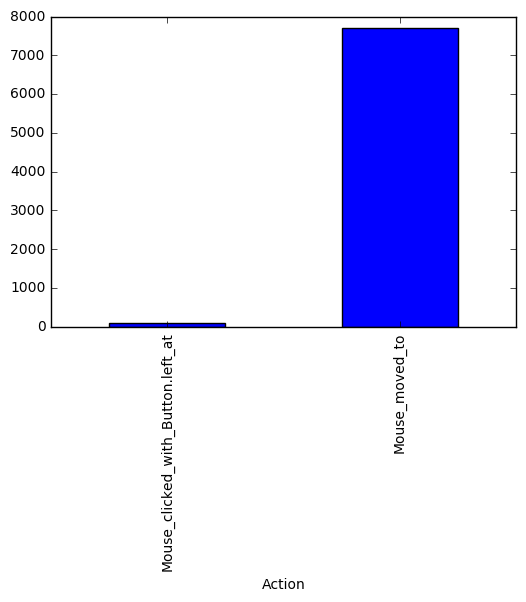

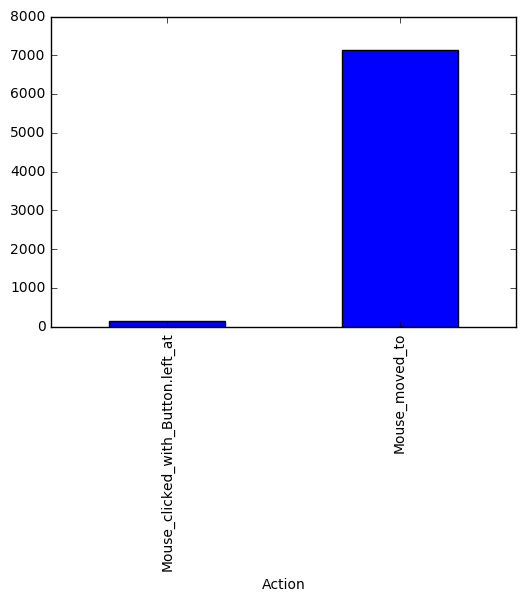

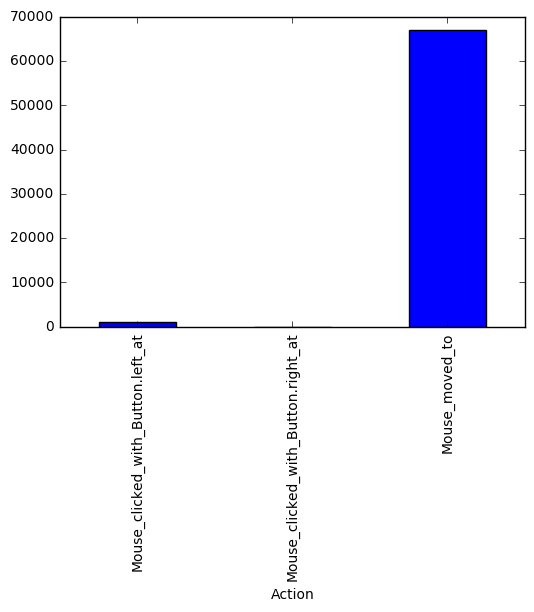

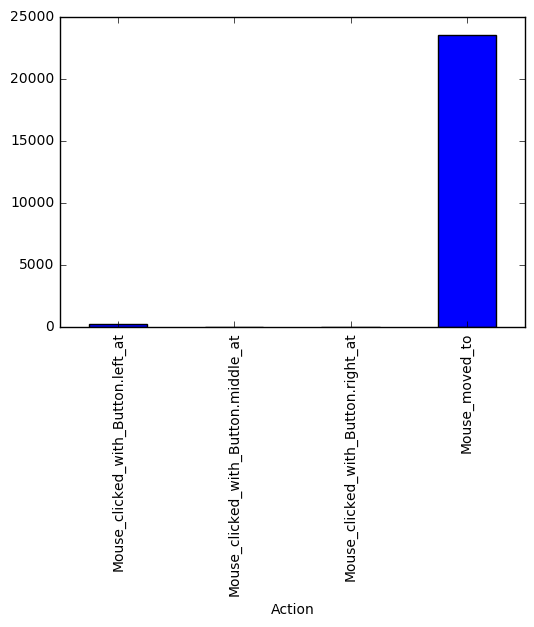

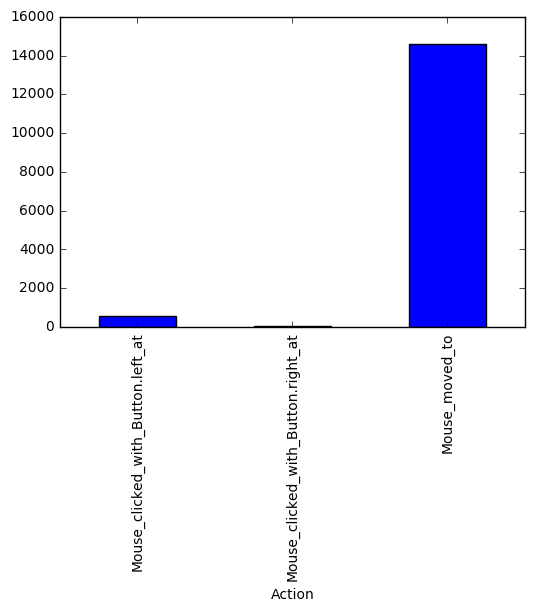

...

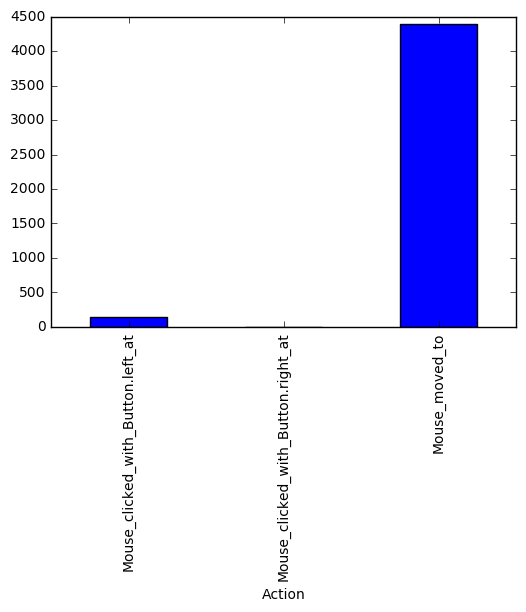

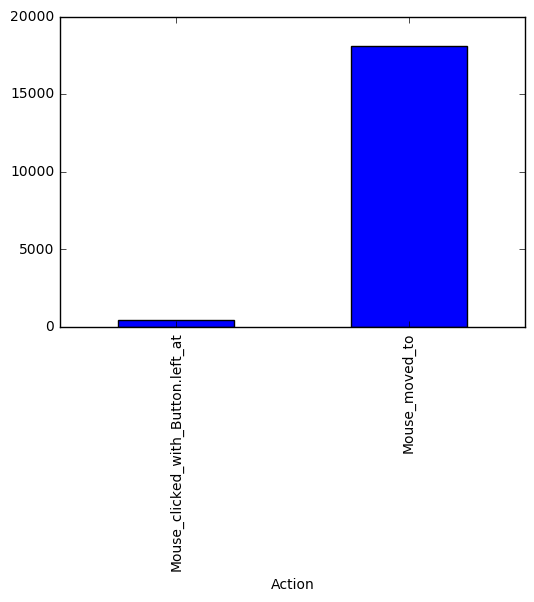

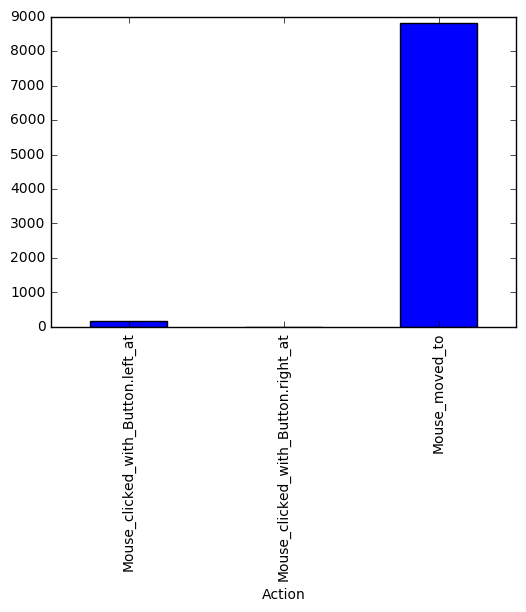

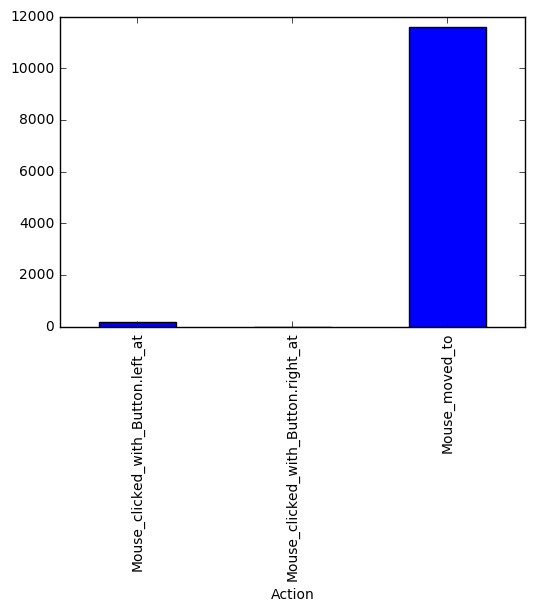

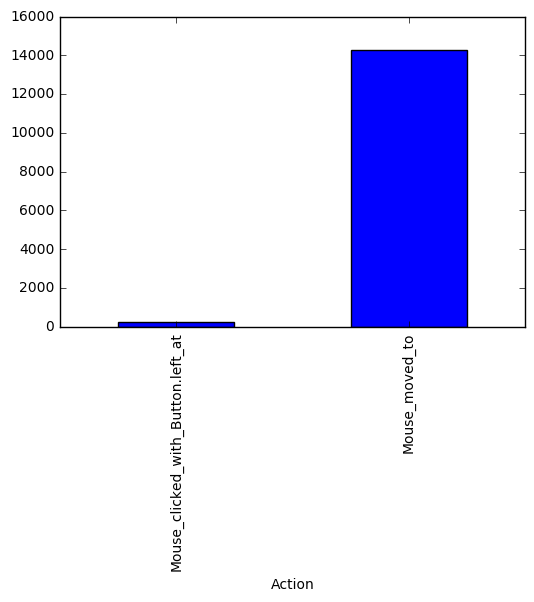

In [11]:
#visualizing the Action feature
for processed_df in processed_list:
    processed_df.groupby(['Action']).count()['X_Coord'].plot(kind='bar')
    plt.show()

In [ ]:
#Selecting only rows corresponding to the click coordinates

for processed_df in processed_list:
    click_df= processed_df.loc[(processed_df['Action'] == 'Mouse_clicked_with_Button.left_at') | (processed_df['Action'] == 'Mouse_clicked_with_Button.right_at') | (processed_df['Action'] == 'Mouse_clicked_with_Button.middle_at')]
    click_df.groupby(['Action']).count()['X_Coord'].plot(kind='bar')
    plt.show()

The results observed above are very obvious that the maximum samples in all dataframes consist of mouse movements followed by left clicks which are very less in comparison, further followed by very less right clicks and, only 2 middle clicks in one dataframe number 4.

Many dataframes don't include right clicks and, none except one include middle clicks.

Now let's see the number of adjacent duplicates in the remaining dataset and get rid of them.

In [11]:
#deleting the adjacent duplicates
for i in range(0,15):
    xy_list=[]
#     X_list = processed_list[i]['X_Coord'].tolist()
#     Y_list = processed_list[i]['Y_Coord'].tolist()
    
    if(i!=0):
        if((processed_list[i]['X_Coord'].max())>x_max):
            x_max=processed_list[i]['X_Coord'].max()
        if((processed_list[i]['Y_Coord'].max())>y_max):
            y_max= processed_list[i]['Y_Coord'].max()
    else:
        x_max= processed_list[i]['X_Coord'].max()
        y_max= processed_list[i]['Y_Coord'].max()

#     for index in range(0, len(X_list)):
#         xy_list.append([X_list[index],Y_list[index]])
    xy_list= processed_list[i].values.tolist()

    duplicates=0
    for k in range(0,len(xy_list)-1):
        if(xy_list[k]==xy_list[k+1]):
            duplicates+=1
        else:
            continue
    print(i+1)
    print('Before Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_list))
    print('Number of adjacent duplicates: ', duplicates,'\n')
    
    #Deleting the adjacent duplicates
    xy_list= [k for k, g in itertools.groupby(xy_list)]
    exec("{} = xy_list".format('data_list_'+ str(i+1)))
    
    duplicates=0
    for j in range(0,len(xy_list)-1):
        if(xy_list[j]==xy_list[j+1]):
            duplicates+=1
        else:
            continue
    print('After Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_list))
    print('Number of adjacent duplicates: ', duplicates)
    
print('x_max: ', x_max)
print('y_max: ', y_max)

1
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  7785
Number of adjacent duplicates:  589 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  7196
Number of adjacent duplicates:  0
2
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  7294
Number of adjacent duplicates:  104 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  7190
Number of adjacent duplicates:  0
3
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  67982
Number of adjacent duplicates:  1867 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  66115
Number of adjacent duplicates:  0
4
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  23839
Number of adjacent duplicates:  665 

After Deletion of adjacent dup

In [ ]:
# dataset=[]
# def record_mouse_movements(event,x,y,flags,param):
#     if event == cv2.EVENT_MOUSEMOVE:
#         cv2.circle(img,(x,y),2,(255,0,0),-1)
#         dataset.append([x,y])

# img = np.zeros((x_max,y_max,3), np.uint8)

# cv2.namedWindow('image')
# cv2.setMouseCallback('image',record_mouse_movements)

# while(1):
#     cv2.imshow('image',img)
#     k= cv2.waitKey(20) & 0xFF
#     if k == 27:
#         break
# cv2.destroyAllWindows()

In [ ]:
#writing the final data coordinates in a text file
# dataset_filename= 'xycoord_dataset.txt'
# with open(dataset_filename, "wb") as fp:
#     pickle.dump(df_list, fp)

In [ ]:
#loading the dataset
# import pickle
# dataset_filename= 'xycoord_dataset.txt'
# with open(dataset_filename, "rb") as fp:
#         dataset = pickle.load(fp)
# print(dataset)
# print(len(dataset))

In [ ]:
# #Normalize the dataset
# dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in dataset]
# print(dataset)
# #print('Normalization completed')

In [12]:
#drop the Action feature form the dataset and create the final list with only x and y coordinates.
data_list=[data_list_1,data_list_2,data_list_3,data_list_4,data_list_5,data_list_6,data_list_7,data_list_8,data_list_9,data_list_10,data_list_11,data_list_12,data_list_13,data_list_14,data_list_15]

for i in range(len(data_list)):
    df=pd.DataFrame(data_list[i])
    x=df.drop([0], axis=1)
    x=x.values.tolist()
    exec("{} = x".format('final_data_'+ str(i+1)))

In [13]:
#final list that contain 15 lists of final data of x and y coordinates
final_list=[final_data_1, final_data_2, final_data_3, final_data_4, final_data_5, final_data_6, final_data_7, final_data_8, final_data_9, final_data_10, final_data_11, final_data_12, final_data_13, final_data_14, final_data_15]
for i in final_list:
    print(len(i))

7196
7190
66115
23174
14482
7629
7346
6489
12493
14177
4179
16615
8170
10522
12646


In [14]:
#Normalize or rescale the dataset to be in the range (0,1)

scaler = MinMaxScaler(feature_range=(0, 1))

for i in range(0,15):
    exec("{} = scaler.fit_transform(final_list[i])".format('norm_data_'+ str(i+1)))

norm_list= [norm_data_1,norm_data_2,norm_data_3,norm_data_4,norm_data_5,norm_data_6,norm_data_7,norm_data_8,norm_data_9,norm_data_10,norm_data_11,norm_data_12,norm_data_13,norm_data_14,norm_data_15]
for i in range(0,15):
    print(i+1)
    print(type(norm_list[i]))
    print(norm_list[i][0:5])


1
<class 'numpy.ndarray'>
[[0.38742236 0.85807292]
 [0.38586957 0.85546875]
 [0.38276398 0.85026042]
 [0.3757764  0.83723958]
 [0.36024845 0.81510417]]
2
<class 'numpy.ndarray'>
[[0.33826638 0.51392405]
 [0.329105   0.53164557]
 [0.31994362 0.55316456]
 [0.3093728  0.56835443]
 [0.29668781 0.58481013]]
3
<class 'numpy.ndarray'>
[[0.37189646 0.57761492]
 [0.3713682  0.57761492]
 [0.36872689 0.57961359]
 [0.36819863 0.58094604]
 [0.36767036 0.58094604]]
4
<class 'numpy.ndarray'>
[[0.39430086 0.47186933]
 [0.39363817 0.47277677]
 [0.3916501  0.47549909]
 [0.38966203 0.47912886]
 [0.38502319 0.48638838]]
5
<class 'numpy.ndarray'>
[[0.45139557 0.42023346]
 [0.45283927 0.41789883]
 [0.4547642  0.41634241]
 [0.45861405 0.41400778]
 [0.46198268 0.41322957]]
6
<class 'numpy.ndarray'>
[[0.40409401 0.8238342 ]
 [0.40181956 0.82512953]
 [0.39727066 0.82901554]
 [0.39044731 0.83678756]
 [0.38438211 0.84326425]]
7
<class 'numpy.ndarray'>
[[0.39296407 0.48418491]
 [0.40643713 0.48418491]
 [0.41017964

# Dataset-1: X and Y coordinate sequence data selected randomly

In [16]:
#Considering 18 coordinates for the input sequence
import math

input_data=[]
output_data=[]
timesteps= 18

for norm_data in norm_list:
    j=1
    norm_data= norm_data.tolist()
    n= len(norm_data)-timesteps
    iterations= int(math.ceil((len(norm_data)/timesteps) / 100.0)) * 100
    
    while(j<=iterations):
            i = np.random.randint(0,n) #random values between 0 (low value(inclusive)) and n (high value(inclusive))
            try:
                input_data.append(norm_data[i:i+timesteps])
                output_data.append(norm_data[i+timesteps])
                j+=1
            except:
                pass
print(len(input_data))
print(len(output_data))
print('Input: ',input_data[0:5],'\n')
print('Output: ',output_data[0:5])

12800
12800
Input:  [[[0.04503105590062111, 0.3098958333333333], [0.04503105590062111, 0.3072916666666667], [0.04503105590062111, 0.3059895833333333], [0.04425465838509316, 0.3033854166666667], [0.04425465838509316, 0.30078125], [0.04425465838509316, 0.2994791666666667], [0.04425465838509316, 0.2981770833333333], [0.04425465838509316, 0.296875], [0.04347826086956521, 0.2955729166666667], [0.04347826086956521, 0.2942708333333333], [0.04347826086956521, 0.29296875], [0.04347826086956521, 0.29296875], [0.04347826086956521, 0.29296875], [0.04503105590062111, 0.29296875], [0.04736024844720497, 0.29296875], [0.05046583850931676, 0.29296875], [0.05667701863354036, 0.2916666666666667], [0.06521739130434781, 0.2903645833333333]], [[0.7274844720496894, 0.6380208333333333], [0.7267080745341614, 0.6380208333333333], [0.7259316770186335, 0.6380208333333333], [0.7243788819875776, 0.6380208333333333], [0.7228260869565216, 0.6380208333333333], [0.7197204968944099, 0.6380208333333333], [0.7166149068322

In [17]:
Input= np.array(input_data)
Output= np.array(output_data)

print('Input: ', Input,'\n')
print('-------------------------------------------------------------------------------------------------------------------\n')
print('Output: ', Output)

Input:  [[[0.04503106 0.30989583]
  [0.04503106 0.30729167]
  [0.04503106 0.30598958]
  ...
  [0.05046584 0.29296875]
  [0.05667702 0.29166667]
  [0.06521739 0.29036458]]

 [[0.72748447 0.63802083]
  [0.72670807 0.63802083]
  [0.72593168 0.63802083]
  ...
  [0.64052795 0.64192708]
  [0.63431677 0.64192708]
  [0.63276398 0.64192708]]

 [[0.07763975 0.56119792]
  [0.07608696 0.56119792]
  [0.07531056 0.56119792]
  ...
  [0.06521739 0.56510417]
  [0.06444099 0.56510417]
  [0.0636646  0.56510417]]

 ...

 [[0.82599278 0.49442379]
  [0.82599278 0.49318463]
  [0.82599278 0.49070632]
  ...
  [0.80072202 0.49194548]
  [0.79061372 0.49814126]
  [0.77978339 0.50681537]]

 [[0.37111913 0.73234201]
  [0.37111913 0.73358116]
  [0.37039711 0.73358116]
  ...
  [0.36606498 0.74597274]
  [0.36534296 0.74597274]
  [0.36534296 0.74597274]]

 [[0.80433213 0.62577447]
  [0.80216606 0.62577447]
  [0.80144404 0.62577447]
  ...
  [0.77400722 0.59727385]
  [0.7732852  0.5960347 ]
  [0.77184116 0.59479554]]] 



In [18]:
print(Input.shape[0])
print(Input.shape[1])

12800
18


In [19]:
Input_reshaped = np.reshape(Input,(Input.shape[0],Input.shape[1],2))
print(Input_reshaped)

[[[0.04503106 0.30989583]
  [0.04503106 0.30729167]
  [0.04503106 0.30598958]
  ...
  [0.05046584 0.29296875]
  [0.05667702 0.29166667]
  [0.06521739 0.29036458]]

 [[0.72748447 0.63802083]
  [0.72670807 0.63802083]
  [0.72593168 0.63802083]
  ...
  [0.64052795 0.64192708]
  [0.63431677 0.64192708]
  [0.63276398 0.64192708]]

 [[0.07763975 0.56119792]
  [0.07608696 0.56119792]
  [0.07531056 0.56119792]
  ...
  [0.06521739 0.56510417]
  [0.06444099 0.56510417]
  [0.0636646  0.56510417]]

 ...

 [[0.82599278 0.49442379]
  [0.82599278 0.49318463]
  [0.82599278 0.49070632]
  ...
  [0.80072202 0.49194548]
  [0.79061372 0.49814126]
  [0.77978339 0.50681537]]

 [[0.37111913 0.73234201]
  [0.37111913 0.73358116]
  [0.37039711 0.73358116]
  ...
  [0.36606498 0.74597274]
  [0.36534296 0.74597274]
  [0.36534296 0.74597274]]

 [[0.80433213 0.62577447]
  [0.80216606 0.62577447]
  [0.80144404 0.62577447]
  ...
  [0.77400722 0.59727385]
  [0.7732852  0.5960347 ]
  [0.77184116 0.59479554]]]


In [20]:
#RNN takes 3D input in the form of (samples, timesteps, features)
print(Input_reshaped.shape)

(12800, 18, 2)


In [21]:
#split the dataset into train, validation and test datasets
X_trainval,X_test,Y_trainval,Y_test= train_test_split(Input_reshaped,Output,test_size=0.2,random_state=0)
X_train,X_val,Y_train,Y_val= train_test_split(X_trainval,Y_trainval,test_size=0.25,random_state=0)

print('Length of Train: ', len(X_train), len(Y_train))
print('Length of Validation: ', len(X_val), len(Y_val))
print('Length of Test: ', len(X_test), len(Y_test))

Length of Train:  7680 7680
Length of Validation:  2560 2560
Length of Test:  2560 2560


In [ ]:
# train_size1 = int(len(Input_reshaped) * 0.80)
# val_size= int(train_size1 * 0.25)
# train_size2= train_size1 - val_size
# test_size = len(Input_reshaped) - train_size1

# X_train, X_val, X_test = Input_reshaped[0:train_size2], Input_reshaped[train_size2:(train_size2+val_size)], Input_reshaped[(train_size2+val_size):len(Input_reshaped)]
# Y_train, Y_val, Y_test= Output[0:train_size2], Output[train_size2:(train_size2+val_size)], Output[(train_size2+val_size):len(Input_reshaped)]
# print('Length of Train: ', len(X_train), len(Y_train))
# print('Length of Validation: ', len(X_val), len(Y_val))
# print('Length of Test: ', len(X_test), len(Y_test))

In [ ]:
print('X_train: ', X_train.shape)
print('Y_train: ', Y_train.shape)
print('X_val: ', X_val.shape)
print('Y_val: ', Y_val.shape)
print('X_test: ', X_test.shape)
print('Y_test: ', Y_test.shape)

# SimpleRNN

In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu) for stateful simpleRNN
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a):
    X_error_scores = []
    Y_error_scores = []
    #hist_val_loss = []
    
#     Y_test = scaler.fit_transform(Y_test)
    
    # fit the model
    model = stateful_SimpleRNN(units=n, lr=lr, batch=batch, alpha=a)
    for i in range(300):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
        #hist_val_loss.append(hist.history['val_loss'])
        #manual early stopping while monitoring the validtaion loss and stopping when the loss does not improve for 2 continuous epochs.
#         if(i!=0):
#             if((hist_val_loss[i-1][0]-hist_val_loss[i][0])<=0):
#                 count+=1
#                 if(count==2):
#                     if(i<50):
#                         count=0
#                     else:
#                         print('Epochs stopped because of no improvement. Epoch Number: ', i)
#                         break
#                 else:
#                     pass
#             else:
#                 count=0
#         else:
#             count=0
        model.reset_states()
    
    Y_Pred = model.predict(X_test, batch_size=batch)
    model.reset_states()
    
    Y_Pred = scaler.inverse_transform(Y_Pred)
    Y_test = scaler.inverse_transform(Y_test)
    # report performance
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    for i in range(0,len(Y_Pred)):
        Xcoord_pred.append(Y_Pred[i][0])
        Ycoord_pred.append(Y_Pred[i][1])
    for i in range(0,len(Y_test)):   
        Xcoord_true.append(Y_test[i][0])
        Ycoord_true.append(Y_test[i][1])
    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    print('Test XRMSE: ', str(X_RMSE))
    print('Test YRMSE: ', str(Y_RMSE))
    X_error_scores.append(X_RMSE)
    Y_error_scores.append(Y_RMSE)
    return X_error_scores, Y_error_scores

start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [20,30,40,50]
learn_rate= [0.001,0.01]
batch_size= [128,256,320,512,640]
alpha=[0.01,0.05]
for n in neurons:
    for lr in learn_rate:
        for batch in batch_size:
            for a in alpha:
                print('Units: ',n,', Learn rate: ',lr,', Batch Size: ',batch,', Alpha: ',a)
                print('Model Number: ', count)
                model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)+','+str(a)]
                X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a)
                count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

The parameter tunining results show that the best performance is achieved by 30 units, 0.001 learning rate, 128 batch size and 0.05 alpha.

In [ ]:
#function to test overfitting or underfitting of the model at each epoch
def calcualte_RMSE(Y_pred, Y_true):
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]

    for i in range(0,len(Y_pred)):
        Xcoord_pred.append(Y_pred[i][0])
        Ycoord_pred.append(Y_pred[i][1])

    for i in range(0,len(Y_true)):   
        Xcoord_true.append(Y_true[i][0])
        Ycoord_true.append(Y_true[i][1])

    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    
    return X_RMSE, Y_RMSE

def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    Y_pred_train = scaler.inverse_transform(Y_pred_train)
    Y_train = scaler.inverse_transform(Y_train)
    train_XRMSE, train_YRMSE= calcualte_RMSE(Y_pred_train, Y_train)
    
    Y_pred_test = scaler.inverse_transform(Y_pred_test)
    Y_test = scaler.inverse_transform(Y_test)
    test_XRMSE, test_YRMSE= calcualte_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE

def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(500):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()

def run(repeats, units, learn_rate, batch, alpha, X_train, Y_train, X_val, Y_val, X_test, Y_test):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= stateful_SimpleRNN(units=units, lr=learn_rate, batch=batch, alpha=alpha)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")

    ax1.legend(loc='best')
    ax2.legend(loc='best')

    fig1.savefig('X_RMSE.png')
    fig2.savefig('Y_RMSE.png')
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

run(repeats=5, units=30, learn_rate=0.001, batch=128, alpha=0.05, X_train=X_train, Y_train=Y_train, X_val=X_val, Y_val=Y_val, X_test=X_test, Y_test=Y_test)

In [ ]:
# #1000 epochs
# Xtrain_RMSE:  [107.40829657958187, 40.288158381787845, 32.87064102605476, 28.986821378794836, 26.138840922455866, 23.97699601475578, 22.236563337686952, 20.772214715701136, 19.50584015289268, 18.42567287369754, 17.487399483820983, 16.662396220150875, 15.944899932193623, 15.311933796848187, 14.75153824018892, 14.248331719273423, 13.810892131099248, 13.451393037931465, 13.106128364227748, 12.727479872002755, 12.377776656654095, 12.115080701123532, 11.847906691614343, 11.573289413799623, 11.339288247219, 11.12266089580668, 10.907752586131451, 10.706358654382871, 10.517575372340609, 10.340105942532857, 10.177086413685334, 10.033751585025575, 9.93396145573606, 9.899806632915027, 9.888203114985865, 9.83763900297542, 9.818514839603493, 9.938996083590935, 10.058065472595446, 9.954434587617682, 9.70251132904227, 9.48807823946817, 9.353138480961928, 9.281477150730202, 9.266422292350907, 9.303425331150912, 9.38120723542786, 9.483904509533271, 9.593843611307628, 9.693279424540695, 9.767220125580652, 9.80806567186477, 9.810130091508949, 9.794041273249176, 9.911421907811254, 9.881028998902183, 9.832099375312062, 9.785078404670077, 9.74382744640012, 9.708863472254707, 9.67818787271173, 9.650435018935749, 9.623649998906243, 9.5960218660434, 9.566205799246482, 9.532816365388523, 9.494722595744788, 9.451238061744004, 9.40149843351376, 9.34515921152522, 9.282031931493833, 9.212156884172591, 9.136278447754359, 9.055187270772606, 8.977959938394362, 8.89435848211548, 8.809688750125332, 8.726436372711316, 8.647271794568965, 8.57492402748523, 8.508446836907616, 8.447018321968185, 8.390581819514367, 8.33897448935071, 8.291468013093414, 8.247192018448526, 8.205977460416623, 8.166602132690128, 8.128720542231397, 8.091148380911811, 8.053134910384175, 8.013569769344658, 7.972323613595782, 7.928799843244832, 7.882594361824208, 7.83365634002174, 7.782208273491615, 7.728279019058807, 7.67219621039315, 7.615065128339751, 7.55328096200222, 7.491408275390487, 7.428078467550411, 7.363242831168299, 7.296324798530256, 7.228067722449814, 7.1582584792672135, 7.087403117751092, 7.016125970548805, 6.945380327720213, 6.875140151777544, 6.806291917688775, 6.738822390508594, 6.6723974023351875, 6.59452516446807, 6.531648773580013, 6.469128796139942, 6.404541204233174, 6.343526065804639, 6.2809820132869545, 6.219701552177851, 6.158415552265508, 6.096963135802532, 6.036812317497352, 5.973562373830766, 5.911379182800571, 5.850666553251842, 5.791345239573253, 5.733623090824208, 5.677615146213481, 5.624097867051151, 5.5725867380012275, 5.523587003056821, 5.4772786370707705, 5.433630676568962, 5.392558997397702, 5.3539776188062715, 5.318015043288152, 5.284204966235135, 5.252935632127222, 5.223198573659131, 5.196384976367293, 5.172327509317162, 5.150362224040006, 5.130488241189472, 5.112302444899813, 5.097623554369773, 5.078117866354947, 5.061506809525467, 5.048188283845884, 5.035877296251652, 5.023865525728404, 4.998934589525926, 4.9812746389134785, 4.964343455280119, 4.9451086128826365, 4.920374321641613, 4.886491553315513, 4.838736039834657, 4.77177864938438, 4.6817012879938, 4.570252665151769, 4.448935513705953, 4.336316681607659, 4.246264509125815, 4.181072241084888, 4.134269021874477, 4.097324649732237, 4.063600380169716, 4.028796913057846, 3.9909303451996303, 3.9493107011286717, 3.9041751951169075, 3.856594517940883, 3.807915380770343, 3.7597759304308096, 3.713836037610883, 3.6711553991709502, 3.6327467769053756, 3.598762690016456, 3.5689538682118966, 3.5429134625567094, 3.520088457078714, 3.4998401090092184, 3.4815867807590464, 3.464899286474769, 3.4493295201442815, 3.434639100120818, 3.4205647723234156, 3.4069640561730536, 3.39376228801309, 3.380951636088207, 3.3684205774002955, 3.356153714869138, 3.344233148110131, 3.332592525381961, 3.3212535293380214, 3.3102047299655095, 3.299487634740222, 3.289069099784792, 3.278970657194619, 3.269178880278506, 3.2596943273190484, 3.2506682208468924, 3.2419554725538, 3.233414897896081, 3.2251001683801452, 3.2170337430352847, 3.209195823143381, 3.201602401214128, 3.1942276587565614, 3.1870758073607526, 3.1801248515473524, 3.173374366243181, 3.166808808388058, 3.16040161605356, 3.1541678294520477, 3.1480880660243162, 3.142149460825369, 3.1363593788833484, 3.130685582088352, 3.125138040055899, 3.119713957132367, 3.1144049151169724, 3.1092214656584476, 3.1041510662047846, 3.0991994883458487, 3.094365738392302, 3.089680744008262, 3.0851398692172003, 3.080761847482053, 3.076598395117704, 3.072657825075075, 3.069018371588842, 3.065732459778261, 3.062876494222043, 3.0605512002576614, 3.0589073352913285, 3.0581175843007897, 3.0583780705312575, 3.059998002789307, 3.063390403407699, 3.0689625912700262, 3.0775353095871827, 3.0898406696712715, 3.1071715136491687, 3.130413518512312, 3.1600728603226016, 3.19305064466711, 3.21893025541524, 3.2192734024481555, 3.1874956453736942, 3.1484100249156874, 3.1245788764218485, 3.114963212300079, 3.1128199893005655, 3.114590612053086, 3.1188141072755697, 3.1247233561003007, 3.131729980783149, 3.1390942396194417, 3.1453189267271475, 3.1478756594503925, 3.1434741509610316, 3.1286296198614703, 3.1068998756667363, 3.082624427674405, 3.061024571966845, 3.0444315469041836, 3.0323804042463554, 3.023650410099243, 3.017196834826783, 3.012164829127764, 3.0081670949181145, 3.0048098329284882, 3.001917577050854, 2.9993858606819974, 2.9971194990672574, 2.9951088688509833, 2.993252327486363, 2.991576691591133, 2.990088226614749, 2.9886836020396537, 2.9874376319802654, 2.986303202777183, 2.9852605989929955, 2.984385554847161, 2.98357901751423, 2.9828959843155944, 2.982277605488292, 2.9817799537344896, 2.9813667576311063, 2.9810244075837558, 2.9809254279072857, 2.9806913126333527, 2.980596827964852, 2.980575560520015, 2.980593990135793, 2.9807005727970917, 2.980863608816483, 2.9811272285505073, 2.981408635812273, 2.9817728852677, 2.9821967795596533, 2.9826547294667733, 2.9831980260505397, 2.9837627862080267, 2.9844057707856178, 2.985078807812217, 2.9857972756707998, 2.986550047071569, 2.987371522300058, 2.988195395881516, 2.989102629722332, 2.9900134180639624, 2.9909559217470045, 2.9919319502822854, 2.9929387356199886, 2.9939355832257286, 2.9949913260669145, 2.996009389131721, 2.9970529150815053, 2.998104146350338, 2.999140844402819, 3.000158729678429, 3.0011825170411357, 3.0021724345787737, 3.0031451955490125, 3.004086327775867, 3.0048764218232114, 3.0059266925737105, 3.0067475268310977, 3.0075147264938606, 3.0082142820418336, 3.008890782578999, 3.0095037553391792, 3.010041614635327, 3.010502125623309, 3.010949389343995, 3.011334367574586, 3.011622590360871, 3.01185241898446, 3.012055169734713, 3.012189831702363, 3.0122742154758386, 3.0123255348346714, 3.0123132175319745, 3.012245851775481, 3.012169232167866, 3.0120388530708433, 3.011910408591984, 3.0117158647063142, 3.011500059048173, 3.0112774416225103, 3.01104479362166, 3.0107829514034323, 3.0105203487397905, 3.0102391476958985, 3.009926446281784, 3.0096113654860233, 3.009315688626004, 3.009019257379297, 3.0087201210650734, 3.0084184782177172, 3.0080729275690095, 3.0077422153113154, 3.0074378467576146, 3.0071028205365864, 3.006804706769302, 3.006463758618152, 3.0061495432768917, 3.0058198032722863, 3.0054893758425067, 3.005176521820748, 3.004825109249212, 3.004518220510843, 3.0041919978514993, 3.003872981415841, 3.003545582960308, 3.003229850424273, 3.0028996460054542, 3.002574582546217, 3.0022521025818603, 3.001943730078659, 3.0016209842303945, 3.001285038901751, 3.0009554330329298, 3.0006472063792278, 3.0003203660537303, 2.9999865952892284, 2.9996662371676317, 2.999351662734998, 2.99902175122904, 2.9987087872323768, 2.9984064674159887, 2.9980868649886894, 2.9977509213177487, 2.9974268160974153, 2.997123739844684, 2.9968062007243015, 2.996496320322282, 2.996186668244924, 2.995875358883677, 2.995585209002522, 2.995264820184967, 2.9949935362258566, 2.994692800883391, 2.9944044747941745, 2.9941116620596975, 2.993844431677166, 2.9935695084293568, 2.9932734167550836, 2.9930078453617406, 2.9927628142812157, 2.992502532486172, 2.9922524603813065, 2.9920272050047525, 2.9917726345089277, 2.9915370787695355, 2.9913204209092763, 2.9911074069949835, 2.9909149670530204, 2.9907144148326577, 2.990517042795593, 2.9903389956120603, 2.9901781269882153, 2.9900309479864045, 2.9898672812319957, 2.989724199480744, 2.989602162910795, 2.989494799420251, 2.9893954820133186, 2.9893080033351316, 2.9892421964978917, 2.989162773189588, 2.989132498215411, 2.989106215364085, 2.989100235081218, 2.989107785175114, 2.9891167132123115, 2.9891864732968036, 2.989264659403597, 2.989368633713799, 2.98947438594812, 2.989630574728623, 2.9898242718729264, 2.990011739731023, 2.990255338150042, 2.990536433148066, 2.990853346987559, 2.991213146801227, 2.991633191960745, 2.9920719941167007, 2.992584889763417, 2.993188862207448, 2.993833627461602, 2.994545973066236, 2.9953421873426804, 2.9962010238418446, 2.997196617036327, 2.9982832091628824, 2.9994854609358153, 3.0008106765395284, 3.0022441903131294, 3.0038355595269395, 3.0055217900239515, 3.007368613032282, 3.009304197523692, 3.011361000833184, 3.013445057969813, 3.0155542511402267, 3.017576105960765, 3.0194714165333636, 3.021120380931855, 3.022515624366162, 3.023603490595799, 3.024304008539156, 3.024672354333294, 3.0247294580081268, 3.0245150987635476, 3.0240328177824507, 3.023402179511418, 3.0224995285160077, 3.0214403063025146, 3.020130138224378, 3.018588664413074, 3.0168544920623823, 3.0148895458643086, 3.01274408496159, 3.010419523935479, 3.0079846007324864, 3.0054417846365524, 3.0029029825330094, 3.0003406050279833, 2.997857538715876, 2.9953957110946234, 2.9930085123382413, 2.9907608443831335, 2.988606552431669, 2.9865365291113153, 2.984562692189375, 2.982678664306685, 2.9808830368034323, 2.9791722773505156, 2.9775297960179303, 2.975931201926954, 2.9744326303208903, 2.9729441715511644, 2.9715124673317432, 2.9701200282916576, 2.9687534821204733, 2.9674120847621253, 2.966115069200834, 2.9648196805483242, 2.9636343346864216, 2.962232746279297, 2.9609851169504062, 2.9597607239466917, 2.958547596078785, 2.9573293130813805, 2.9561281274313416, 2.9549343327128668, 2.9537264404044024, 2.9525622006043064, 2.951252730230707, 2.950177935420763, 2.9489614917432387, 2.9477990962795144, 2.946592727183545, 2.945430168344822, 2.9442617567501825, 2.9431071887818328, 2.941945242747383, 2.9408295062420997, 2.9397234099633467, 2.938653691921798, 2.937615541825211, 2.9366388353215216, 2.9357247063204572, 2.934912356877806, 2.9342027219289113, 2.933656711843576, 2.9332692879632902, 2.933094610952128, 2.9330857903497383, 2.9331162141016023, 2.9328798722281095, 2.931669495214844, 2.928405502141847, 2.9218782420474256, 2.9120460069795975, 2.901049468172127, 2.892040307380705, 2.8865275299423097, 2.883897228258643, 2.8829371732378797, 2.8827483135982286, 2.8828873397971537, 2.8831054735197688, 2.883330549126475, 2.88355225585757, 2.883729258893376, 2.88389126028755, 2.8840260995298164, 2.884152643057362, 2.884259693803648, 2.8841944757453284, 2.884432989360467, 2.8845711683908415, 2.884602359139534, 2.884742474264143, 2.884785661060163, 2.8849067605563565, 2.884979174609154, 2.8850927878359816, 2.8851729729242606, 2.885307332578544, 2.885426038419626, 2.885563126622787, 2.8856680171925335, 2.885848001650348, 2.8859804422059883, 2.8861443856295597, 2.886314667356632, 2.8864881044302257, 2.886668608237398, 2.886870570470979, 2.8870941135730828, 2.887301519500024, 2.887526463347937, 2.8877572840009864, 2.8880024023122317, 2.888273390964094, 2.888525703603303, 2.888820118526352, 2.8891013132637453, 2.8894110972618336, 2.889708994531783, 2.890040389791278, 2.8903754592867865, 2.8907289164950067, 2.8910856944346333, 2.891456709536018, 2.891835541194073, 2.892233975516937, 2.892639231153075, 2.8930699031409453, 2.893494962274328, 2.893943957768909, 2.894419263691185, 2.894879292406881, 2.895368242401154, 2.8958711593358903, 2.896378555915455, 2.896900395523837, 2.897425102758227, 2.8979771857672367, 2.898537451045786, 2.899122003304555, 2.8996948800804274, 2.9003026058302326, 2.9009008695645764, 2.9014970571174494, 2.90213186703845, 2.902736986448623, 2.903381795533136, 2.9039973719504215, 2.904631575745848, 2.9052696935774533, 2.9058900696603027, 2.906477117436545, 2.9070855097470636, 2.9076520850044933, 2.908198940284309, 2.9087110193832757, 2.9091796044807725, 2.9095422110973552, 2.9099409662029365, 2.9102054133117137, 2.91037641297903, 2.9104290645808764, 2.910365447044104, 2.9101332706892564, 2.909728913819018, 2.9091341592684383, 2.9083044398298314, 2.9072346545191854, 2.9058725500812037, 2.9042587375772215, 2.902334380837624, 2.900127289152478, 2.8976389866351253, 2.8949007192442022, 2.8919328088890373, 2.888789643406908, 2.885547553972414, 2.882254210427309, 2.878993159639866, 2.875832269078717, 2.87284729263847, 2.870046780642143, 2.8674899118194923, 2.865151147219722, 2.8630987982997347, 2.861352838750134, 2.8598513859845736, 2.8585977015929322, 2.8575828827612018, 2.8568341781339996, 2.8563152492512347, 2.8560491749990233, 2.8560106751283603, 2.856240347440162, 2.8567153977916475, 2.8574717843772537, 2.858529300636649, 2.859908839785585, 2.861633783458914, 2.8637400569737683, 2.8662787500685343, 2.869251767671547, 2.872801753846037, 2.876890477309469, 2.881674633844828, 2.8871887183782246, 2.893540795291272, 2.9007887018779477, 2.9090160696624707, 2.91818570442483, 2.9279936170499146, 2.938981357994896, 2.950217502864694, 2.9610065922179, 2.9702200535826018, 2.976241758117528, 2.977534297842753, 2.9727800337185637, 2.9624743191449068, 2.9484437418924188, 2.9336432337289415, 2.9204914516031906, 2.9101533670970956, 2.9026635030139327, 2.8975602859422454, 2.8942276757483447, 2.8921707239119177, 2.890961923098053, 2.8904081996923323, 2.890288977321754, 2.890480708234754, 2.890894211797557, 2.8914415365404786, 2.8920546150895308, 2.892723760132347, 2.8934128465573545, 2.894089102870238, 2.894742230542181, 2.895370301309548, 2.8959506975399143, 2.896506759744679, 2.8970208596205786, 2.8974693430384364, 2.897874786462491, 2.8982290986131507, 2.8985637332256724, 2.8988667964954695, 2.8991494612062314, 2.8993850981258005, 2.8998570776345116, 2.8999086963539655, 2.9000708302526985, 2.9001266891480686, 2.900287895144704, 2.9003792945469025, 2.900507835419646, 2.9005684806379075, 2.9006505493022776, 2.9007206698571246, 2.9007703631895008, 2.900801368474394, 2.9008634364873616, 2.9009079217833245, 2.900963467435401, 2.900993683685963, 2.9010601148956554, 2.901077934525932, 2.9011305739945135, 2.901173243731331, 2.9012057515377982, 2.901240233970789, 2.9012985728228897, 2.901303034532615, 2.9013800689942473, 2.9014155038733476, 2.901448582078676, 2.9014701618692635, 2.9015196997146857, 2.9015560863539895, 2.9015718584182646, 2.901624653566085, 2.9016524115358013, 2.9016846166757166, 2.901714490123123, 2.901765198999164, 2.901753265468732, 2.901805584397997, 2.901824585133144, 2.9018346926522685, 2.9018836627663984, 2.9018799975988885, 2.9018932091193075, 2.901915775012566, 2.9019296613191568, 2.9019737574648405, 2.9019659551265637, 2.901951720416733, 2.9019894173531586, 2.901963910471997, 2.9019762820452, 2.9019699284176568, 2.9019743673004315, 2.9019498829316466, 2.901943206671953, 2.901940634552739, 2.9019185606627373, 2.9019137144515335, 2.9018922416165136, 2.901883642883765, 2.9018384184371575, 2.9018165919767562, 2.9018207217213954, 2.901762416063641, 2.9017432883079812, 2.9016854510620247, 2.901695275946258, 2.901613705319114, 2.9018241031300676, 2.901418047916925, 2.901440301876749, 2.901396038576939, 2.901402811291051, 2.9013751729769233, 2.9013415749857234, 2.9013239817769683, 2.901299233175348, 2.901227876029718, 2.901227624310369, 2.9011400650120236, 2.9011061486974987, 2.901044442795974, 2.900985493740446, 2.9009440452353052, 2.9008975180394807, 2.9008008237674856, 2.9007975384077254, 2.9007153023068923, 2.9006558186396907, 2.900586896466462, 2.9005306640874275, 2.900461624324765, 2.900417874864401, 2.9003137822810428, 2.900262460006873, 2.9001848448111702, 2.900126148969308, 2.90005827307131, 2.8999893574536326, 2.899932226479534, 2.8998544896843326, 2.899791763402067, 2.8996942473481497, 2.8996237089071646, 2.899561172498299, 2.8994886376659106, 2.8994070901599898, 2.899317107144527, 2.89924414386652, 2.899165622861109, 2.899076364038146, 2.8989941885933064, 2.8988950696934714, 2.8988321129201178, 2.8987129701789387, 2.898632777258925, 2.8985538124851553, 2.8984460005982147, 2.89834721931557, 2.8982564433337377, 2.89814981772688, 2.8980543950199995, 2.8979729247019628, 2.8978496820708606, 2.897767705156824, 2.8976621283288804, 2.897543742275407, 2.8974189666613857, 2.897324759414239, 2.897204544252485, 2.8970780427132876, 2.896958633363312, 2.8968335002633303, 2.8967171461053236, 2.896588782749113, 2.8964762748247614, 2.8963413424075157, 2.8962184154435784, 2.8960775249650768, 2.895928593827525, 2.8958059227739943, 2.895649104180842, 2.8955028567187506, 2.895372475163434, 2.895204084539847, 2.8950376405381766, 2.8949134689178377, 2.8947533106107817, 2.8945857815914726, 2.894424274280213, 2.894293624476055, 2.8941337353115264, 2.8940457463135796, 2.893828943082996, 2.893639757491479, 2.893476579999564, 2.8932912778441553, 2.8931222766341538, 2.89293584277484, 2.892754122478042, 2.8925553474429013, 2.892371553096312, 2.8921852366451066, 2.8919703331115163, 2.8917741012904927, 2.8916874806618664, 2.891452544592761, 2.8912569184683243, 2.891056864336159, 2.890826228969075, 2.890644954404136, 2.8904242118595675, 2.8902249220284317, 2.8900070231074375, 2.8897993614935764, 2.889617986165486, 2.889390461623948, 2.8891822555964293, 2.888966353781373, 2.8887668081776736, 2.888551289534443, 2.8883539086322907, 2.8881401930485384, 2.88791732434464, 2.8877187119862695, 2.8874697690859907, 2.8871248865641523, 2.887069495805401, 2.8868994320095607, 2.8867227309031867, 2.88653267032789, 2.8863657847804185, 2.8861790250727553, 2.885989562485458, 2.8857973228068756, 2.885629482214586, 2.8854192708213313, 2.8852300031244678, 2.8850647500883624, 2.8848681658118904, 2.8847006101918864, 2.8844961990775975, 2.884351111514615, 2.8841764746037986, 2.8839980040326108, 2.883840774764703, 2.883671901964858, 2.883501329023872, 2.883308841932436, 2.8831570311560486, 2.882980664275827, 2.882827153509699, 2.882642622436489, 2.88250094839155, 2.8823623503398603, 2.882212502077085, 2.8820425849957827, 2.8818705825406594, 2.881747126761157, 2.8816013791932256, 2.8814562334194616, 2.881335481251103, 2.8811930382943616, 2.8810410922045824, 2.8808813522685344, 2.8807601172492214, 2.8806451830276596, 2.880522316542314, 2.880381571565539, 2.880261930161148, 2.8801361579584364, 2.8801663256764813, 2.879829465005114, 2.879605015396863, 2.879602651099018, 2.8794636519450343, 2.879364119000324, 2.879260568772965, 2.879158156465907, 2.8790613883767455, 2.878967725565743, 2.87885653221567, 2.8787535697085103, 2.878670562264628, 2.878578532613387, 2.878481381539275, 2.878388047465125, 2.8782773555214773, 2.8781819619360607, 2.8781277609212266, 2.8780152494650353, 2.8778343833258906, 2.877744427705912, 2.8776379221987662, 2.8775190804812176, 2.8774024278773207, 2.877284083242848, 2.8771570314839994, 2.8770005577251507, 2.876839606483775, 2.8766984599069785, 2.8765203864022264, 2.8763234007278458, 2.8761291706029257, 2.8760729007357106, 2.8758100314328887, 2.875476039302846, 2.8750052067548384, 2.874809540973901, 2.8744759410430896, 2.8710778060114066, 2.8686080388151196]
# Ytrain_RMSE:  [46.52510730765751, 27.13029271080096, 22.007654187902872, 18.80958199987535, 16.576225357053985, 14.894360123198819, 13.622642107327817, 12.636301666443051, 11.829720473081078, 11.160950826159782, 10.603227276944716, 10.12879049514705, 9.755652017594146, 9.412229586990007, 9.112663811623609, 8.88201528590036, 8.675792691088876, 8.47049468401035, 8.239378100399039, 7.988244374542472, 7.7844055643874555, 7.636810190883946, 7.515129274225186, 7.375984715038857, 7.212961552782871, 7.076614411899342, 6.960538388142251, 6.852832517918396, 6.786267670213491, 6.8181607609671, 6.879230248623047, 6.8760145460439, 6.694942133617876, 6.472426848054521, 6.325032849043649, 6.236051757997091, 6.170269965120748, 6.084283125529182, 6.007040705148436, 5.93902992139171, 5.8718775139140655, 5.822139288151869, 5.814434950144922, 5.82690160670541, 5.831310782967758, 5.818724565661596, 5.792365926378423, 5.7572151739279365, 5.717301430344068, 5.675408408625836, 5.633876306472956, 5.594317202663569, 5.55024097056864, 5.517269057464619, 5.5917785181023625, 5.579499315433523, 5.546161120090371, 5.50956066407386, 5.472266594538055, 5.433376940493352, 5.392795045947411, 5.350203373209876, 5.305526290153344, 5.258909015456774, 5.210693104640693, 5.161177438989157, 5.110549610298024, 5.05935436531294, 5.007684793928886, 4.955856619859352, 4.904187537222176, 4.852921945259234, 4.8024530857025685, 4.753136107232325, 4.706528782809785, 4.661557561592104, 4.618638806154006, 4.578440644828369, 4.54142170597706, 4.5095876171650096, 4.48038339647898, 4.4546439524338, 4.432321797599255, 4.41307910756859, 4.396552444287435, 4.381840436181001, 4.368122288004026, 4.354644261854947, 4.3404054843761815, 4.324834105324413, 4.3071198727117315, 4.287091877822486, 4.264441445915478, 4.2392035308526665, 4.211361059493446, 4.181245637711725, 4.14916295381837, 4.115679887441077, 4.0814805665466904, 4.046395334394899, 4.0129029257324635, 3.980429154495529, 3.9498392450307342, 3.921296424088021, 3.8947585346559714, 3.8701674185421755, 3.847157026542174, 3.8251987546437243, 3.803801957499027, 3.7824034292103446, 3.760531053840139, 3.737820229635489, 3.7141598802806133, 3.6893927563248483, 3.66395502020405, 3.6376290524471107, 3.6106562181358277, 3.582241505270204, 3.5536472165035224, 3.5254042571458717, 3.497005444784638, 3.468216800742605, 3.4391293812153587, 3.410542027253204, 3.3809654357386756, 3.3517259316391694, 3.3230909188771127, 3.295066284283464, 3.267823673323054, 3.2413855577118906, 3.2159515664246356, 3.191570179892865, 3.168274919282147, 3.1460935921906974, 3.1250172764692894, 3.1050155810444853, 3.086091097320994, 3.068204676441217, 3.0514035455763624, 3.035661986071024, 3.020730274070975, 3.0067400081260334, 2.99366933470337, 2.9814561900178833, 2.970048364852037, 2.959403814257438, 2.949558357677915, 2.9400694889008054, 2.9313502049665208, 2.9232666826689804, 2.915728752532927, 2.9086709806216855, 2.901170826386528, 2.8946255217429533, 2.8887267264392693, 2.8833717307742193, 2.8785713588102424, 2.874349546648558, 2.8707396529142666, 2.867689472692043, 2.8650878990726465, 2.8628169059808397, 2.8609785125161897, 2.860051052826975, 2.860639956584607, 2.8628239500542874, 2.8659244803887205, 2.8690064159775903, 2.8712139584240326, 2.8720266555021734, 2.871059257705344, 2.8681850802312003, 2.8634820456313665, 2.857168401184342, 2.8496196725471403, 2.841345830995767, 2.832867060322737, 2.824654166083051, 2.8170657784173656, 2.810330107588485, 2.804450051658285, 2.7994185653439816, 2.795153611897684, 2.7915301032648694, 2.7884261593167556, 2.785749401374263, 2.7834225604497704, 2.7813665487352424, 2.7795237254756557, 2.777866786220781, 2.776342522430338, 2.77493904869646, 2.77360727967678, 2.77234983845628, 2.771155598072478, 2.769998867403636, 2.7688696014370833, 2.7677754006817024, 2.7667042782179814, 2.7656372820493753, 2.7645776801490434, 2.763546145628767, 2.7624968617117442, 2.7614194318040983, 2.760316040054407, 2.759250100005293, 2.7581966151559274, 2.757154113226919, 2.7561243467315264, 2.7550779272071617, 2.7540467304278358, 2.7529993090320057, 2.751944851690598, 2.7508886035256683, 2.749820364873503, 2.7487509247622817, 2.7476729749698117, 2.746566818022254, 2.7454630030299256, 2.744345824447461, 2.7432062561895, 2.7420790627383838, 2.7409169010844607, 2.739754266003276, 2.7385864971494325, 2.7374094229668327, 2.7362264995280277, 2.7350615380301715, 2.7339109915282678, 2.732765814122962, 2.7316887863064174, 2.7306244326725184, 2.729639627149212, 2.728737014578955, 2.727953268604744, 2.7273033630958965, 2.726859800836874, 2.7266579258240413, 2.726761330277286, 2.727335413156173, 2.7284823455885907, 2.7303824273614445, 2.733355453345858, 2.737761124541676, 2.7441784660660735, 2.7533390909777777, 2.7661678315853857, 2.783263723204481, 2.8038145142353423, 2.8225556762691553, 2.8288972587958736, 2.8165295886077, 2.7965879815302523, 2.782415624510506, 2.7754384604992506, 2.7729411436690294, 2.773451555955354, 2.776483363496319, 2.7818741138343728, 2.789702345787969, 2.799731233719331, 2.811123489097915, 2.821835157745465, 2.828196542423732, 2.8272188594900913, 2.8160996524061757, 2.798305183408266, 2.7788752798287595, 2.7614644310567136, 2.747236442157015, 2.735813763683611, 2.72658651891589, 2.71899653992925, 2.7125131728690888, 2.706918231960177, 2.7019847333323863, 2.6975064449879653, 2.693435573962997, 2.6896656525394502, 2.686149647089501, 2.6828631387637247, 2.6797847757759716, 2.6769033952725585, 2.674147086903249, 2.6715718732949814, 2.669141913204872, 2.6668272483699846, 2.6646625430299946, 2.6626089745071426, 2.6606887221971762, 2.6588686748565586, 2.657160663580167, 2.6555530217069285, 2.6540392713021017, 2.652617186775039, 2.651342952542987, 2.650139200916373, 2.649021138278546, 2.647982162261148, 2.647028890548414, 2.6461397093038346, 2.645327259235891, 2.644565524472325, 2.643905218139819, 2.6432808045579166, 2.642740635006277, 2.6422443256979595, 2.6418170531471716, 2.6414319950913145, 2.641112062222131, 2.640850593270827, 2.640629222688006, 2.640459962677625, 2.6403367545976733, 2.640254413358257, 2.6402140415457094, 2.640234617252635, 2.6402939545833144, 2.6403738737851468, 2.6405244803824, 2.6406995877706296, 2.6409199667669716, 2.6411755880490153, 2.6414685713748285, 2.641800806700546, 2.6421769976956746, 2.642591716303479, 2.643040458791205, 2.6435280920106945, 2.643953082470635, 2.644581098307137, 2.645188672092011, 2.645821108928796, 2.6464993500023137, 2.6471734433616825, 2.6478950939390353, 2.648636965854265, 2.6493983139496087, 2.6501805869028328, 2.650997032773242, 2.6518160161153763, 2.652642279961226, 2.6534812698248627, 2.6543223924194637, 2.655165580318967, 2.6560078524928565, 2.6568403372244433, 2.6576717277119575, 2.658480088789129, 2.659283534079243, 2.660066074066555, 2.660835968153953, 2.661579664132306, 2.6623059724764975, 2.6630148475681428, 2.663703338523269, 2.6643567136711024, 2.66499528557646, 2.665617942119043, 2.666228939079073, 2.66679234835107, 2.667354585794137, 2.6678980712335725, 2.6684207034093856, 2.668916037364932, 2.669414214023987, 2.669873864409319, 2.670333735978681, 2.670770354157089, 2.6711995085742, 2.6716079273139055, 2.672008078707789, 2.6723896776835607, 2.6727656373228483, 2.673109692235007, 2.6734548883202085, 2.6737775400570825, 2.6740908214576224, 2.674403636197241, 2.674694079640543, 2.674960707472669, 2.6752403927347195, 2.675467138069672, 2.6757251332113694, 2.6759424317194345, 2.676141041010147, 2.6763475633739136, 2.676531880198281, 2.6766994622925067, 2.676847679257869, 2.6769783576387667, 2.6771010339479857, 2.6772057244784597, 2.6773099173711046, 2.677395445065998, 2.677456155692052, 2.6775133560004796, 2.677551956574353, 2.6775743701053663, 2.6775831810302204, 2.6775748661482957, 2.6775563831452827, 2.6775061724837195, 2.6774606063294097, 2.677395354540117, 2.6773121046519384, 2.6772187342515257, 2.677112334101555, 2.676983578382748, 2.676849218707243, 2.676692073390494, 2.676537579493256, 2.6763373957386913, 2.676143341329485, 2.675936777780706, 2.6757186594480893, 2.6754680630833927, 2.6752269543572726, 2.674961137947786, 2.6746804963932025, 2.6743868115748963, 2.6740842420188593, 2.6737679170170128, 2.6734459569550064, 2.6730975272614907, 2.672734823980732, 2.672359584380696, 2.671973421582421, 2.671578690083178, 2.6711734109948657, 2.6707484920323914, 2.6703145106755146, 2.669864316539161, 2.6693969137243867, 2.668936829436758, 2.668445740543889, 2.6679471094613603, 2.667441657029794, 2.666909243789616, 2.6663779934566385, 2.6658256587858697, 2.66527314181478, 2.664702669686618, 2.664124047996045, 2.6635319793725034, 2.6629381100017597, 2.6623338628897075, 2.6617276493174367, 2.661110281252592, 2.660490872617937, 2.659875476310898, 2.659261925272314, 2.6586546784866587, 2.6580630416292013, 2.657478549518341, 2.6569168593513224, 2.6563865764805707, 2.6558932047847055, 2.655441867380266, 2.6550542444873755, 2.6547393606221537, 2.654493311594886, 2.65435047185498, 2.6543218035988274, 2.654410562084766, 2.6546235201851394, 2.654973456922738, 2.6554431714698112, 2.656013702649508, 2.6566368471218236, 2.6572729967608484, 2.65783096484891, 2.6582628076443866, 2.6584934502198716, 2.6585101192857916, 2.658310789655294, 2.657965695225576, 2.657535806129066, 2.657096789399374, 2.656712590480274, 2.656409998616993, 2.6561967059469596, 2.6560723942768574, 2.6560126498304086, 2.656009132407937, 2.6560395903484184, 2.6561057647318247, 2.656181890773856, 2.6562809773551677, 2.65639022880908, 2.6565086929526958, 2.656632835217889, 2.656752079361707, 2.656884914826805, 2.6570094620173785, 2.6571425332669802, 2.6572748399212682, 2.6573998190467467, 2.6575284677839726, 2.6576556107496754, 2.6577911830812506, 2.657916481849217, 2.6580398850746123, 2.658161545230093, 2.658282674200437, 2.658408820952965, 2.6585247966797767, 2.6586445851597014, 2.658766408440652, 2.6588850549709426, 2.659005743385762, 2.659128654182143, 2.65925332695805, 2.659379791021902, 2.659436424772287, 2.659619057523533, 2.659752017604643, 2.659893950713929, 2.660025386102741, 2.660168747484175, 2.6603066145842664, 2.660457982178682, 2.660605568465341, 2.660759977611626, 2.66092952225123, 2.6610717885090356, 2.661246097386914, 2.66142851877141, 2.6616150408059958, 2.6618075832479464, 2.6620071945400325, 2.6622188524256165, 2.6624464535738426, 2.6626789381976335, 2.6629350704868124, 2.663195959190571, 2.6634889681847844, 2.663794721083023, 2.664130970536627, 2.6645001418204473, 2.664905236123863, 2.6653554864234033, 2.6658550052624235, 2.6664207254051604, 2.667058910211313, 2.6677825853515573, 2.6685811821717573, 2.669453073637977, 2.670347706589308, 2.671160349093127, 2.6717657618028214, 2.6720721691706233, 2.6720739782460003, 2.6718760223954967, 2.6715987440654243, 2.6713325594118076, 2.671114525261676, 2.6709434855149574, 2.6708055759462446, 2.6707106607551268, 2.6706431173636798, 2.670588223772168, 2.670546061079733, 2.670517807587585, 2.6704952812588774, 2.670486301253875, 2.6704688989166487, 2.6704694753883893, 2.670446765934496, 2.670462440281507, 2.6704499104816106, 2.670457758566537, 2.670446173370053, 2.670457038636476, 2.6704409844652455, 2.670445391148701, 2.6704310768738475, 2.670428764472855, 2.6704144386834487, 2.670418301147085, 2.6703965973824433, 2.670390316452022, 2.6703669176764, 2.6703587739388195, 2.6703457293370323, 2.6703233896974923, 2.670310217847992, 2.6702911692023954, 2.670270936774174, 2.670254064400962, 2.6702265092736432, 2.6702077012477026, 2.6701865291362683, 2.670166578379212, 2.670145093954679, 2.6701179610688337, 2.670093959568768, 2.6700676319736214, 2.6700505485130255, 2.670019103685375, 2.6699943006885083, 2.669969425740712, 2.669939727397076, 2.669921492470213, 2.6698893713821708, 2.6698653676295088, 2.6698321640085965, 2.6698137088806964, 2.6697789672607026, 2.66976144183888, 2.669731106109, 2.6697093956167164, 2.669675579811615, 2.6696493214108754, 2.669621143681502, 2.6695945754534947, 2.6695852733962004, 2.6695569112871183, 2.669523155869987, 2.66950021917196, 2.6694818710523855, 2.6694522620849996, 2.6694311356534652, 2.669409859354301, 2.6693915735425784, 2.669370019197614, 2.6693543927826786, 2.6693307615339186, 2.6693145346972873, 2.669302117106193, 2.669289119703937, 2.6692716343031506, 2.669272006033458, 2.6692555689456716, 2.6692592977555827, 2.669259266094753, 2.6692483809414242, 2.669269046290696, 2.669285395423004, 2.669311447304308, 2.669336381570552, 2.6693754500253304, 2.6694272413971363, 2.6694521925930403, 2.6695588347221935, 2.6696533862072185, 2.669757885972444, 2.669896710598703, 2.670053976454618, 2.6702414826193164, 2.670455848286402, 2.670699504290441, 2.6709766171168923, 2.671274610126025, 2.671597812954138, 2.6719420126437483, 2.672300217517114, 2.672661582928181, 2.673017582670928, 2.6733790785937313, 2.673728164662769, 2.67407230674931, 2.67432104876559, 2.6747231569871195, 2.675018186106174, 2.6753105612027355, 2.675590149489367, 2.675849645894699, 2.676119555117512, 2.6763631576340075, 2.6766061457501147, 2.676835677342209, 2.6770594537711103, 2.6772881313801196, 2.6774998159861334, 2.677707753024553, 2.6779132135534676, 2.6781131496554, 2.6783159052088625, 2.6785049418138938, 2.678698521898665, 2.6788836053452068, 2.679073974575504, 2.6792587454805648, 2.679431772335856, 2.679608605921773, 2.679791604118189, 2.679968482550072, 2.6801388987688797, 2.6803792459671816, 2.6804537495985232, 2.6806475414396673, 2.6808361676375068, 2.6810260008815945, 2.681225994497428, 2.6814335553445425, 2.681669363835122, 2.681894775788308, 2.682110707300633, 2.6822694435964234, 2.682338186808441, 2.682323497331887, 2.682241059128069, 2.6821007215663144, 2.681943023384582, 2.681768052734665, 2.681598505851032, 2.6814058976730113, 2.6812518936948626, 2.681107645550552, 2.6809697416228637, 2.680848768295214, 2.680725233917992, 2.680621399060466, 2.6805150979086885, 2.6804178568394486, 2.6803418294440458, 2.6802554800657235, 2.6801755263335734, 2.6800975805285643, 2.6800158827922327, 2.6799431484172995, 2.679874017389488, 2.679799764645739, 2.679721526314499, 2.6796491114406327, 2.679580601138142, 2.6794982970838146, 2.679413664818628, 2.6793332890828543, 2.679271367972908, 2.679216136350069, 2.6791329108171116, 2.679063239519594, 2.678995988974714, 2.6789203839860654, 2.678852545268153, 2.678772240379053, 2.678703882501056, 2.6786298786777136, 2.678560221561732, 2.678488527187118, 2.6784206892280875, 2.678333499779326, 2.678259943965598, 2.678195150616501, 2.6781231907562586, 2.678049321328577, 2.67798098253773, 2.6779149766309978, 2.6778471656585605, 2.67777847341332, 2.677713473687169, 2.6776444227370892, 2.677580973899363, 2.6775134075637483, 2.6774416934016556, 2.677377083258376, 2.6773232731113787, 2.67726526204398, 2.677196301796135, 2.6771375832877315, 2.6770733549216916, 2.67702532438598, 2.676955627146798, 2.6769038647476893, 2.676838789848485, 2.67678627445806, 2.676726370853999, 2.6766753171857216, 2.6766254845237754, 2.676567353695475, 2.67651628630339, 2.6764630971559997, 2.676409236394373, 2.676353132363207, 2.6763079528986524, 2.6762539814591118, 2.676205497784419, 2.6761580112398606, 2.676094411898358, 2.6760455233865934, 2.6760030293414916, 2.6759476000603715, 2.6758993284529224, 2.675851084767541, 2.675799581303752, 2.6757558731727356, 2.6757009884568292, 2.6756593451480595, 2.675603424515047, 2.675571767101894, 2.675517895105113, 2.6754546897307874, 2.6754080840011136, 2.675350261302725, 2.6752731576454925, 2.675294941687308, 2.675205801338089, 2.675145212375185, 2.6750967772772754, 2.675047982743018, 2.6749883951062037, 2.674934638430635, 2.674881797501103, 2.674822508044017, 2.674777276642538, 2.674711441213226, 2.6746587518172906, 2.6746000329107282, 2.674543902836512, 2.67449185693599, 2.6744369127527627, 2.6743677435957403, 2.6743108068963437, 2.674253188717148, 2.6741903516332277, 2.674131408102855, 2.674070927787377, 2.6740044956370745, 2.6739464216476314, 2.6738816057616694, 2.6738083270574666, 2.6737491957910215, 2.6736758497682263, 2.6736135694769225, 2.673544650999433, 2.673477653685814, 2.673403106235547, 2.6733360831640165, 2.673265625521168, 2.673194729709828, 2.673128745931049, 2.6730600315706203, 2.6729842226169027, 2.67291274747633, 2.6728428061593217, 2.672757160432654, 2.6726907937831577, 2.672618727688802, 2.672550940621004, 2.672462427767326, 2.672387542538746, 2.67231462778602, 2.672243474593558, 2.67215593218206, 2.672083332761256, 2.6720045335040354, 2.6719282328605676, 2.6718464565221005, 2.6717722013673764, 2.6716938735512312, 2.6716084806732585, 2.6715364117692366, 2.6714503597498434, 2.6713651579403614, 2.671295195655246, 2.671207123431339, 2.6711312048110036, 2.671046613661876, 2.6709700341774942, 2.6708839580647745, 2.6708006940556275, 2.670724398441487, 2.6706379972213012, 2.670558838384608, 2.6704768825257523, 2.6703967562802213, 2.6703096401978668, 2.6702272078778813, 2.6701418791254787, 2.6700739732213155, 2.669977457454718, 2.6698950171385363, 2.669803911405103, 2.6697216827155144, 2.669643966773965, 2.6695550957935503, 2.66947560451507, 2.6693935900241033, 2.6693250168108613, 2.6692150366919294, 2.669138027129277, 2.669059545076273, 2.6689755740970837, 2.6688916690605105, 2.6687975930319414, 2.6687271889666997, 2.6686389631122482, 2.668549495403244, 2.6684667770949924, 2.6683808074299598, 2.668300835181176, 2.6682211392461035, 2.6681154168619363, 2.6680410608902676, 2.6679573427590286, 2.667863318104912, 2.6677749217987023, 2.6676912819030445, 2.667597503870138, 2.6675113070689647, 2.667424809821059, 2.6673311970854185, 2.6672438836202415, 2.6671509087993597, 2.6670649138071467, 2.6669702569269886, 2.6668762718953567, 2.6667821634080275, 2.666688164666168, 2.6665918335320624, 2.6664988395822826, 2.66655676451639, 2.6663403241250436, 2.6661904172093385, 2.6661173710517883, 2.666013361573405, 2.6659116427998266, 2.665819179013035, 2.6657171892348024, 2.6656155967385335, 2.665515878430809, 2.6654067922020395, 2.665305390688764, 2.6652053079411036, 2.6650960972331674, 2.6649961047882207, 2.6648800159836106, 2.6647738281581606, 2.6646674131588646, 2.664562745773329, 2.6644611328758674, 2.6643535605302207, 2.664237726638151, 2.664134114767545, 2.664020714618762, 2.6639152026969284, 2.6638001754372027, 2.6636942879125116, 2.6635832037550493, 2.6634688626317367, 2.6633541722696514, 2.663250725575452, 2.6631373956418436, 2.6630318513606626, 2.66291864139845, 2.662811641167315, 2.662698925425801, 2.662586894265823, 2.6624753236445544, 2.6623631939423467, 2.6622555302646664, 2.66214007836661, 2.6620335713948493, 2.661918526439251, 2.661811223516647, 2.661699072622544, 2.661589487050745, 2.6614305522706947, 2.6613230599959206, 2.6612580947290985, 2.661113038029405, 2.661021812286226, 2.660913312202575, 2.660808001721916, 2.6606985113573036, 2.6605923595843644, 2.6604807462275937, 2.660380653712673, 2.6602649095975774, 2.6601649789037105, 2.6600576458454994, 2.659952846063416, 2.659852202422095, 2.659747550386128, 2.659643545703545, 2.659549070919139, 2.659454475356556, 2.6593721266239294, 2.6592591615057755, 2.6591692683513597, 2.659074330971904, 2.6589811014587386, 2.65889297310024, 2.6588152218075836, 2.6587223624806824, 2.6586382588581303, 2.658564107141405, 2.6584780012277998, 2.658397811022364, 2.658320816409675, 2.6581765108726807, 2.6580653714100495, 2.6580984647901174, 2.658078945964746, 2.6579942557147462, 2.6579370047238955, 2.6553483517354057, 2.654780145027737]
# Xtest_RMSE:  [108.21701908444898, 40.5002516649017, 33.30165378402003, 29.60137571016576, 26.875344483978953, 24.759709288352553, 23.006738792618307, 21.488157885125197, 20.145737286267188, 18.975635131488847, 17.93556049241013, 17.003960302822836, 16.186158355713193, 15.460657370888768, 14.817355006547794, 14.235820446728034, 13.726844744286241, 13.303018612115158, 12.90040122181112, 12.476140479934962, 12.098204197088016, 11.823101592149934, 11.547493504846264, 11.261261721995483, 11.020673285103014, 10.800197278369104, 10.58558412424676, 10.388709529233106, 10.207727784476361, 10.039399876826783, 9.885885947296314, 9.752409529332795, 9.664654735080068, 9.64697452467035, 9.65611907133086, 9.628165876598526, 9.632241409075466, 9.777023014750405, 9.917554028883554, 9.830453659811186, 9.594891549689851, 9.400729389889376, 9.289227267752212, 9.242481909546218, 9.252992478616122, 9.315873415730739, 9.397312178509594, 9.49994801334919, 9.608879587535267, 9.706706272398133, 9.778709827718822, 9.817405483684317, 9.817007260551865, 9.798702080963274, 9.920592790583843, 9.887075606444553, 9.834365880656863, 9.783751702878716, 9.738053194920102, 9.698873986550506, 9.66379853421311, 9.63150429025917, 9.600097465824618, 9.567909046593202, 9.533483134689728, 9.495497966668248, 9.452873769449983, 9.404989439657502, 9.35105979720665, 9.290810794848637, 9.224136603693116, 9.15115335490533, 9.072706150840405, 8.98964737914142, 8.91111830136739, 8.82691244363093, 8.742346780529438, 8.659904006739053, 8.582196551680505, 8.511772672938791, 8.447734467643462, 8.389113778522326, 8.335748298542423, 8.287374017062794, 8.243195699410526, 8.202289444812305, 8.164418242354223, 8.12832372066127, 8.093629238406608, 8.05912707535813, 8.024057466404951, 7.987309527893066, 7.948754318530801, 7.907797063969638, 7.864062334703752, 7.817513073650626, 7.7684004380133125, 7.716798163631199, 7.66306044103234, 7.6083339869078515, 7.549185207928286, 7.490068686641704, 7.429736385054014, 7.368193610421477, 7.304916163573134, 7.24065244097623, 7.175197632766954, 7.109025210918397, 7.042708408920847, 6.97711126243185, 6.912184582610732, 6.848766674435686, 6.78686337897423, 6.72620306762156, 6.655197776241685, 6.598648433472002, 6.542841743258982, 6.485721429573082, 6.43204049985871, 6.377560847467395, 6.324729026752182, 6.27226205409988, 6.219947568948038, 6.169113755771386, 6.115405826673688, 6.062789070769162, 6.0115988644689144, 5.9617021025690695, 5.913278469416157, 5.866422306293198, 5.821874545414344, 5.779164684650797, 5.738774649831791, 5.700875554920554, 5.665422408423575, 5.632330670951743, 5.601503660447251, 5.573060735309351, 5.546681764929699, 5.522279906563272, 5.499250396494122, 5.47879252205231, 5.460706325445874, 5.444362584753487, 5.429740753415069, 5.416464138804276, 5.406441128629075, 5.391412737781123, 5.379025682988048, 5.369554848486738, 5.360932129684276, 5.352544756723187, 5.332183083172994, 5.31873781288087, 5.30610215861476, 5.29152887999994, 5.2721797526889596, 5.244795855733845, 5.205189780593373, 5.1486577809686285, 5.071813239522033, 4.976396232935482, 4.872781334269533, 4.777364001658165, 4.702116481480687, 4.648770315646898, 4.611520324099304, 4.5828817554782155, 4.557078395618411, 4.530383517838004, 4.501079176737753, 4.4685867685521625, 4.433104791697985, 4.395568118575606, 4.3571328948649395, 4.319188880872098, 4.283143118152839, 4.249887725356729, 4.220286674861295, 4.194464060718991, 4.172221994990204, 4.1532050015629824, 4.136931319237927, 4.122842391058715, 4.110426960940785, 4.0992927481239345, 4.089055156548018, 4.079494152745322, 4.0703851432490294, 4.061608091918562, 4.053087602456494, 4.044821574834359, 4.036715942724083, 4.028758973501584, 4.02101598574206, 4.013436006478926, 4.006035316178285, 3.998806072821666, 3.9917859041104764, 3.984944514854834, 3.978305336442204, 3.9718541637687927, 3.965594971759417, 3.9595959102155622, 3.9538361834237974, 3.948167367086212, 3.9426340268712003, 3.9372455331201635, 3.9319927702725272, 3.9268862863357787, 3.921908790591406, 3.917060138146288, 3.9123307167579395, 3.9077116037407365, 3.903195760974376, 3.898766607897942, 3.8944279267975106, 3.8901700876456595, 3.88598413034047, 3.8818706088504618, 3.8778073483231994, 3.8738071183233567, 3.869858963431918, 3.865966380502011, 3.862132562671044, 3.858351605363462, 3.85462595333596, 3.8509593128874684, 3.8473714066373454, 3.843867854616005, 3.8404594949721425, 3.837188995832485, 3.834066366469827, 3.8311517661685146, 3.82848803172856, 3.826140550100746, 3.824185835945934, 3.8227447537847006, 3.821955813624997, 3.821972267075994, 3.823041196550249, 3.8254900984563402, 3.829641610913229, 3.8361534532476833, 3.8456067346184892, 3.859041660920879, 3.8771701262873948, 3.9004123931802233, 3.9262441283801306, 3.9461713843194004, 3.945118728120005, 3.9179219530842158, 3.885216025333522, 3.8653574532322814, 3.857180260428147, 3.8550225301062953, 3.855951383414867, 3.858790656065292, 3.862916514987241, 3.8678632527711523, 3.8730302442046827, 3.877215631898829, 3.878383917034565, 3.874057159476369, 3.8610793673143435, 3.842776129820669, 3.822608338577713, 3.8047639482641706, 3.7910505850454097, 3.7810218132137132, 3.7736669217281262, 3.7681183345458824, 3.7636963057414037, 3.7600849369813747, 3.7569679900460935, 3.754212144444191, 3.7517313303102386, 3.7494555048758786, 3.7473778646494234, 3.7454183123839777, 3.74360160002601, 3.7419386888078083, 3.740340595766129, 3.738874854259417, 3.7375035891320825, 3.736210062951624, 3.7350588658868564, 3.733969550323419, 3.7329888067351256, 3.732071468113883, 3.7312598105477766, 3.730525597864485, 3.7298614972411466, 3.7294275710734346, 3.728861158790168, 3.728423024843005, 3.728058904972617, 3.7277403400246025, 3.727507010463419, 3.7273299935844744, 3.7272472369884158, 3.7271879488687696, 3.727208040193284, 3.7272878495000286, 3.7274058811521282, 3.727600553262067, 3.727823487397114, 3.728119336889694, 3.7284476307376226, 3.7288211792306867, 3.729227274753083, 3.7296975231243046, 3.7301757076295035, 3.7307258001155637, 3.731284608251495, 3.7318763555213876, 3.732498572149559, 3.733149711002225, 3.7337980418870185, 3.7344959360843784, 3.7351705330366043, 3.735868814219352, 3.736575990149729, 3.737275374652356, 3.7379655829151823, 3.738660941337535, 3.7393347549268157, 3.7399935771018185, 3.7406315417887637, 3.7410978848044025, 3.7418689331570976, 3.742430816299902, 3.7429446042658414, 3.7434037780597516, 3.7438501378426676, 3.744245228761117, 3.744579988794859, 3.7448572854888047, 3.745123423003317, 3.7453395004840275, 3.745482070866788, 3.7455782943121347, 3.7456551360244377, 3.7456753544146606, 3.7456584543606195, 3.745616662053717, 3.7455264004866256, 3.745390825856997, 3.74525031233004, 3.7450657629548454, 3.7448860290225907, 3.744656386265614, 3.744409715630026, 3.7441593146736305, 3.7439066184192353, 3.743631201203923, 3.743356488484792, 3.7430741645934855, 3.7427656771993436, 3.7424588450574743, 3.7421725701771056, 3.741889823278255, 3.7416087873069284, 3.741328571633587, 3.741014763474575, 3.740716088934871, 3.740443095842221, 3.7401512750929533, 3.739887049000766, 3.73959515391261, 3.7393307969883605, 3.7390528169161295, 3.7387780717077255, 3.7385242999088018, 3.738242228595312, 3.737992126457477, 3.737734613307701, 3.737484643292388, 3.7372305878561156, 3.7369870805840533, 3.7367375823669, 3.736491318063362, 3.736251705313512, 3.736025391064284, 3.7357879083582164, 3.7355475875217503, 3.7353104429275814, 3.7350933762598606, 3.7348620016687657, 3.7346279037319836, 3.734408351334775, 3.7341931222689446, 3.733968699681627, 3.7337597755154177, 3.7335606411351767, 3.7333485936548456, 3.733123283079368, 3.7329146253446766, 3.732722099881082, 3.7325175894569695, 3.7323218456691856, 3.732130142967827, 3.7319358977648642, 3.731762737638963, 3.731564142844939, 3.7314056020987674, 3.731225882430773, 3.7310546550671213, 3.7308861846033534, 3.7307337928368343, 3.7305780540821307, 3.730406619238409, 3.7302594611625133, 3.730133079219468, 3.7299903652245385, 3.7298605293622438, 3.7297474071044654, 3.7296127288011602, 3.7294930692292887, 3.729388969925167, 3.7292894224019726, 3.729204057632745, 3.7291142275787705, 3.729026331079985, 3.728953730887947, 3.7288918210366737, 3.7288444344509184, 3.7287837481366606, 3.728737070369417, 3.7287105400755305, 3.7286901669866204, 3.7286787881943004, 3.728673211039737, 3.7286878144937443, 3.7286906506853117, 3.7287312548827303, 3.7287753048427574, 3.7288333174843453, 3.728901661715117, 3.7289701181812123, 3.729087569515857, 3.7292096363985254, 3.7293534909994857, 3.729494148544053, 3.729678142682048, 3.729887646652508, 3.730093758998637, 3.7303430809423275, 3.730622040004264, 3.730927179706905, 3.731266451776526, 3.7316500556770102, 3.7320549235384224, 3.732512859005688, 3.7330442889352446, 3.7336046387343793, 3.734219556170083, 3.734903786504103, 3.735633553387452, 3.7364740192870927, 3.7373844380896903, 3.738386489013333, 3.739491140338759, 3.740675195039353, 3.7419920274351535, 3.743380947280198, 3.744901176396908, 3.7464906500344433, 3.748181037742037, 3.7498938789575753, 3.751632616460335, 3.753304626331814, 3.7548828266174987, 3.7562706841434266, 3.7574595247401357, 3.7584163724714736, 3.759068524674305, 3.75946939186012, 3.7596343278443443, 3.7595933810145516, 3.75934640779324, 3.7589983694532147, 3.7584398318052266, 3.7577710685615315, 3.7569066407507057, 3.755861303956577, 3.7546675022399096, 3.7532946849868987, 3.7517711492786425, 3.7501053462652125, 3.7483456108559428, 3.746492281707078, 3.7446342582037797, 3.742745786365823, 3.740911880914241, 3.7390832054734884, 3.7373028169896316, 3.7356260416520817, 3.734013469370336, 3.7324576310447823, 3.7309703562547583, 3.729549089670764, 3.7281903035854906, 3.7268952843748764, 3.7256496405891437, 3.7244335265499995, 3.723296715712383, 3.722161723802503, 3.7210678202965886, 3.720004846866715, 3.7189607443724606, 3.717934096319232, 3.716939494927034, 3.715949390176487, 3.7150698070214285, 3.7139661476717816, 3.7129925932733325, 3.712052623529321, 3.711116421682354, 3.7101830940683365, 3.709256651771053, 3.7083395755171678, 3.70740268950951, 3.7064864434151037, 3.705495231301142, 3.704643995140907, 3.70371421493063, 3.702788010354927, 3.7018595181782192, 3.7009318708648453, 3.7000216055979314, 3.6990950434977643, 3.6981797072201807, 3.6972761015025744, 3.6963868848015307, 3.695505607145914, 3.694651200850833, 3.6938211201227458, 3.6930384604844715, 3.6923013993387555, 3.6916343003071925, 3.6910599656629683, 3.690578051043451, 3.690208097098235, 3.6899122955654144, 3.689565836427766, 3.688912190601318, 3.687371349537616, 3.6840955075304547, 3.6781510877771626, 3.669597431651919, 3.660248984614037, 3.6526732946072102, 3.648044222149773, 3.6458188587793767, 3.6449838221182342, 3.64480236047288, 3.6449067764108376, 3.645091555714102, 3.645297044772238, 3.6455063805627392, 3.6456847687735108, 3.6458596258179834, 3.646014239104865, 3.646167441355329, 3.6463057076404657, 3.646193829635713, 3.646536609791056, 3.646659953370284, 3.6467912014321446, 3.646921652281055, 3.647048636961939, 3.6471686474618985, 3.6473154427021943, 3.647432814012371, 3.6475781668863076, 3.647718168482878, 3.6478919010309765, 3.648036847162552, 3.6481936400020087, 3.6483788104129284, 3.648553418112975, 3.6487282678129356, 3.6489325584584806, 3.649114077620905, 3.649324207266541, 3.6495337133649417, 3.649776691380342, 3.64999007344631, 3.650236407800853, 3.650471022036242, 3.6507278429755075, 3.6509966066613635, 3.6512616847368573, 3.651547247879849, 3.6518367470589026, 3.6521352311809676, 3.652435397841529, 3.6527557419924577, 3.6530857129664325, 3.653424165278171, 3.653769564422219, 3.65412415755744, 3.654492403796536, 3.6548660522569425, 3.6552525263728546, 3.655655928679501, 3.6560586708057894, 3.656476833091535, 3.6569217606180717, 3.657350951935035, 3.6578080355635847, 3.6582746905314973, 3.6587454360458302, 3.659227286841152, 3.6597137010059964, 3.6602216981741282, 3.660738394377199, 3.6612766846487697, 3.6618065716365105, 3.6623637065013694, 3.66291374733686, 3.6634660059533832, 3.6640489515372674, 3.6646099693663983, 3.6652045797187762, 3.665779088135203, 3.6663673237386973, 3.666961809817302, 3.667545511471279, 3.6681028296006337, 3.6686822414696536, 3.669227510260902, 3.6697600998284114, 3.670268441729187, 3.6707423966678943, 3.6711009186608456, 3.6715555115078247, 3.6718608265489467, 3.6721232321478694, 3.6722614655969408, 3.6723330251404986, 3.6722446410445815, 3.67206646847324, 3.6716714071261634, 3.67110584935759, 3.6703172730910003, 3.6693055822498617, 3.6680583692040685, 3.6665499632771694, 3.664780903244281, 3.6627642133146687, 3.660500021024567, 3.6580245771541087, 3.655362326867811, 3.652591375832371, 3.649738144421625, 3.6468906170434336, 3.644099127275983, 3.6414366860243668, 3.638916494939871, 3.6365856404403605, 3.6344244536667043, 3.6325000384579447, 3.6308303766684493, 3.6293512230080998, 3.628084035771761, 3.626999399015737, 3.626135551695201, 3.6254505378972497, 3.6249721556578787, 3.624667901684298, 3.6245754644693537, 3.6246753878296953, 3.624989099031506, 3.6255356132385366, 3.626332022008003, 3.6273928767983254, 3.6287436491395786, 3.6304222803264374, 3.6324328461419113, 3.634886472440726, 3.6377529578897043, 3.6411543646433513, 3.6451172427418252, 3.649730001735749, 3.655043194655392, 3.661125751550627, 3.667960903655726, 3.675524698643493, 3.683768137382101, 3.6923496126340103, 3.700694629414536, 3.7079659870613675, 3.7129259995937764, 3.7144093258492235, 3.7114033496176293, 3.7042692984730254, 3.694368676404222, 3.6838985159254207, 3.6746184611564616, 3.6673707230835793, 3.6621543265195835, 3.65863819551249, 3.6563759210233338, 3.655018260782673, 3.6542593972088486, 3.6539617807363545, 3.653982859980841, 3.6542280576992208, 3.6546325798823336, 3.6551325217096364, 3.6556801988093954, 3.6562652983746, 3.6568668454952595, 3.6574589127331434, 3.658033171642798, 3.6585894959483043, 3.6591110584085995, 3.6596106259320225, 3.6600799718350405, 3.660501311208984, 3.660890845030584, 3.661241840015409, 3.6615751381541095, 3.6618898314297375, 3.662180791666803, 3.662444578422871, 3.6631464989791844, 3.663111620046827, 3.663302540808759, 3.663387928811374, 3.6635848040025847, 3.6637219703891306, 3.663895724103841, 3.664014511277035, 3.664157015086291, 3.664285828164696, 3.6644027377611184, 3.6645056982147595, 3.664631424241947, 3.664745923568206, 3.664863787398254, 3.6649690200098233, 3.6650977557068822, 3.6651922791463303, 3.6653110423558055, 3.665422050741355, 3.665526807083939, 3.665629966092411, 3.6657579272513416, 3.665838486878959, 3.6659733347404058, 3.666082078018336, 3.6661829082153887, 3.6662781442055756, 3.666396062264412, 3.66650049725848, 3.6665884590709434, 3.666708953239583, 3.6668048884839406, 3.6669073299649666, 3.6670040557256622, 3.667120725687333, 3.6671866446741017, 3.6673022528309365, 3.6673914398564698, 3.667476381441458, 3.6675853403891145, 3.667659706374497, 3.6677389158054168, 3.667829927836959, 3.6679135968977015, 3.6680178929095995, 3.6680868086765366, 3.6681473026802784, 3.668246501245098, 3.6682951439017972, 3.6683750112309403, 3.6684388419132463, 3.6685115435214777, 3.668561913245893, 3.6686253792818198, 3.6686868534934876, 3.6687380435801464, 3.6687999500065667, 3.6688502777126524, 3.668907568165736, 3.668937347819848, 3.668985833267486, 3.669052140965907, 3.669040507671457, 3.6690982948933772, 3.6691247383357966, 3.6691971671435937, 3.6691977378187963, 3.669358087665737, 3.6691366339246394, 3.6692296327966565, 3.6692601241152287, 3.6693306853092724, 3.6693699077566158, 3.669401932042854, 3.669443179428542, 3.6694818954764465, 3.66948571293374, 3.6695397945261785, 3.6695279278574984, 3.6695516127501877, 3.669561531098904, 3.6695679645243406, 3.669589400980407, 3.6696061364011046, 3.669585905292958, 3.669636019515981, 3.669625171820912, 3.669633595664747, 3.669630935586219, 3.6696413409771025, 3.6696396374738174, 3.6696568203799185, 3.669629262694729, 3.66964274407855, 3.669636000660702, 3.6696415706983436, 3.669639376707075, 3.669637892985829, 3.6696456726221744, 3.669636915971329, 3.669641815941084, 3.6696193637147263, 3.6696165627549537, 3.669618109260088, 3.66961524753015, 3.669605411946975, 3.6695876834266508, 3.6695866088373648, 3.6695786278645794, 3.6695599233288196, 3.669552063316045, 3.6695300209987733, 3.66953473401739, 3.6694954139494516, 3.6694906912528356, 3.6694843935916395, 3.6694557196766295, 3.6694360005711215, 3.6694237503480562, 3.6693949735348936, 3.6693797629258733, 3.6693747011897897, 3.6693349015031247, 3.669333288804655, 3.6693082423875154, 3.669277211850109, 3.669239850340836, 3.669227672325416, 3.669194121816216, 3.6691603615512256, 3.669130159900195, 3.6690942975652594, 3.6690679334337197, 3.6690336031223167, 3.6690097192718327, 3.6689698942675504, 3.668939145605846, 3.668898002135664, 3.668852446619071, 3.668825579475986, 3.668770478350965, 3.6687273353747565, 3.6686987304489307, 3.668638042156225, 3.66858183647928, 3.668560027340869, 3.66850863332437, 3.6684543924789867, 3.6684062492736396, 3.66837820952781, 3.6683331560651458, 3.668340803768362, 3.6682795671218122, 3.6682031462227638, 3.66815433933964, 3.6680936633333276, 3.6680460024254837, 3.66798293727929, 3.667930826299496, 3.667862472372939, 3.6678087703123956, 3.6677538892057675, 3.6676783670550743, 3.6676189017020646, 3.6676386278469293, 3.6675809303388656, 3.6675143270591226, 3.6674514585499303, 3.667376217311367, 3.6673339645117053, 3.6672622946136393, 3.6672115092357265, 3.667147885846915, 3.667094475140522, 3.667061526091699, 3.6669935163706207, 3.6669439354981805, 3.6668912899928467, 3.6668505443576187, 3.6667987905322463, 3.6667654524591713, 3.666721190833551, 3.6666692040574564, 3.666639747701122, 3.6666446027844986, 3.6665038506404084, 3.6665718306193975, 3.666562818143686, 3.6665514842508062, 3.6665314026269726, 3.666533001370678, 3.666521361459611, 3.6665133449503697, 3.6664992687947344, 3.6665130683849787, 3.6664899102068818, 3.6664862414788364, 3.6665051116167846, 3.666499998309113, 3.66651830349959, 3.6665106804663803, 3.6665500497612173, 3.6665709285588184, 3.666586362646505, 3.6666229550706064, 3.6666513384948534, 3.6666826891110955, 3.6666936659771165, 3.666741814230143, 3.6667689826419725, 3.6668205489220056, 3.666847955308496, 3.666908081871884, 3.6669727931007077, 3.6670309211145717, 3.6670751940817916, 3.667122449723287, 3.6672039278777593, 3.6672732705548325, 3.6673417621464037, 3.6674326643891377, 3.66750689967927, 3.6675790885056614, 3.667643905271707, 3.667740046517921, 3.6678438889623193, 3.667941580931147, 3.6680293578578564, 3.6681340911593563, 3.6682381573665483, 3.6685670474369427, 3.6684225209213697, 3.668445180234274, 3.668652618226883, 3.668754684806107, 3.668889333729993, 3.6690197921278744, 3.66915537958939, 3.669299273043965, 3.6694412750078507, 3.66957529456454, 3.6697179166619986, 3.669878851778842, 3.6700334054002015, 3.6701831696756524, 3.6703420418508337, 3.6704906498979355, 3.670649686951082, 3.670853100075194, 3.6709896385636527, 3.671091452641556, 3.671268819265927, 3.671431069096695, 3.6715878142662692, 3.6717467133491883, 3.671906306896935, 3.672064497229823, 3.6721999260197222, 3.6723323385338027, 3.6724853518712592, 3.672609725408533, 3.672724453388596, 3.672840779024182, 3.6730575430099575, 3.6732014882528334, 3.6731545176438405, 3.673071729041197, 3.6732096949957715, 3.673231754256171, 3.6703679195995864, 3.668498361678734]
# Ytest_RMSE:  [48.271688489338544, 27.99964974328403, 22.528535988133836, 19.12373650650576, 16.802486465600637, 15.085153586952087, 13.791480145156902, 12.793605768650979, 11.97397301325732, 11.292065805559234, 10.72131169676097, 10.225041762648397, 9.836526688662689, 9.495220805074775, 9.208436141781087, 8.996692742402818, 8.802081430425106, 8.60357739579272, 8.374581209332856, 8.119557841506776, 7.91009848141239, 7.7587613192737725, 7.636412581549808, 7.507357331576406, 7.361099650595666, 7.238842117903791, 7.129978810805391, 7.031472316269978, 6.981515924330113, 7.030151508469348, 7.101767766042672, 7.105845696169512, 6.931599363443149, 6.715939924411798, 6.574349511949644, 6.491013898071662, 6.431317631506403, 6.35101591803515, 6.279562282065806, 6.217287733196391, 6.154466370487021, 6.106017743340297, 6.096069996274259, 6.106109930213805, 6.109630403552392, 6.097880695136049, 6.073642779208971, 6.041420226444473, 6.004865967829075, 5.966489835290485, 5.928388548988661, 5.891957201329343, 5.85150251277985, 5.820715635017324, 5.884411033276927, 5.874231257505701, 5.845516289688094, 5.813797163954044, 5.78133989387112, 5.747317002376312, 5.711604431565294, 5.673939402434111, 5.634346456340744, 5.592986136608995, 5.5501526230337905, 5.506128302289576, 5.461090216749073, 5.415505542061876, 5.369480718279867, 5.3232902955525985, 5.277207669830371, 5.231458125934531, 5.186365400879657, 5.14220452702736, 5.100157074672347, 5.059382707966223, 5.020170164974943, 4.982986647834602, 4.948124559177627, 4.917051926047514, 4.887855865295436, 4.861189223311759, 4.837076812263925, 4.815332229235934, 4.795768080632363, 4.777777762231387, 4.760796185819483, 4.7442825392406744, 4.727476528789825, 4.709935826456112, 4.691020426602887, 4.670584851579399, 4.64839036083385, 4.624447748850557, 4.598744040290545, 4.5715520078031915, 4.543104462700531, 4.513834019476232, 4.483186649219344, 4.45211771036344, 4.4224286751789545, 4.393701560212541, 4.3665895092744496, 4.341183107867527, 4.317426542210732, 4.295249261664854, 4.274350842342072, 4.254279326442039, 4.234623577137996, 4.214911415604293, 4.194729338297164, 4.173753726921299, 4.151861075022269, 4.12890414391404, 4.105138855112256, 4.080468800081795, 4.055007581571228, 4.02848293782874, 4.001034404002371, 3.9737171914279688, 3.9460514537827227, 3.917902488195809, 3.889277259348374, 3.8607334253388133, 3.8313595130115243, 3.8021767908654938, 3.7734159590829672, 3.745108189725347, 3.717414024183201, 3.690434316857799, 3.6642978270681517, 3.6390491073439972, 3.6147352090825757, 3.591389970147669, 3.5690184336020554, 3.5476132281144146, 3.527180048762805, 3.5077019368940237, 3.4890695113695083, 3.4716305583651104, 3.45492432029845, 3.439085639354348, 3.424105928571858, 3.409930247749609, 3.3965262175404827, 3.3838367436170134, 3.3719902555248042, 3.3605164353945964, 3.349671586493058, 3.339386438712555, 3.3295985278161955, 3.320250108334247, 3.310505966537643, 3.3016966741469407, 3.29336780030015, 3.2854310573911873, 3.2779017090514917, 3.2708148827183123, 3.264200569599693, 3.2580497028072615, 3.2522956327832815, 3.2468444026817904, 3.2417480268617855, 3.2373896638490374, 3.234349941195533, 3.2328496156139055, 3.2324876004165697, 3.2325365641759607, 3.2322669492929283, 3.2311931494111303, 3.228946370710336, 3.225377051374106, 3.220507764290229, 3.214482451619618, 3.2075863395703688, 3.200206813524734, 3.1927438658243803, 3.185553071219071, 3.1788967697335435, 3.172944049407155, 3.1676940750762808, 3.1631353172541923, 3.159215452159842, 3.155845034319587, 3.1529502439036863, 3.1504700227626494, 3.1483579906157337, 3.146561375839244, 3.145045622299541, 3.143784068227539, 3.142738133888391, 3.141899863066223, 3.1412259373438385, 3.1407202752669194, 3.14037034306037, 3.1401529941239787, 3.1400605819010066, 3.140105314418943, 3.1402619434386527, 3.1405254170462116, 3.1408965782785043, 3.1413879106198066, 3.141960136253969, 3.142608214516942, 3.143363632964164, 3.1442300961041783, 3.1451890991764926, 3.146245705371753, 3.147406291436158, 3.1486402335323302, 3.1499759116053814, 3.151385085397741, 3.15287458809337, 3.1544466258717443, 3.1560931209532352, 3.157823417406505, 3.1596235258749954, 3.161479310680406, 3.163416298417987, 3.1654161419784224, 3.1674696668421682, 3.169608945231705, 3.1717849623821017, 3.174029318715455, 3.176341203059992, 3.1787106938782665, 3.181138223568587, 3.183647771269639, 3.186230514313172, 3.188881664629616, 3.191657020628824, 3.1945029819349138, 3.197485672060994, 3.200599057001745, 3.203879787261774, 3.2073430599590087, 3.2110523306344207, 3.215039349060478, 3.2193604868994106, 3.224165904905895, 3.22954441474482, 3.235650736202792, 3.2427696994623525, 3.2512080598327917, 3.2614744436594982, 3.274180440769859, 3.2901133311489232, 3.3097417193835836, 3.332276576527439, 3.353024710037221, 3.362669177510852, 3.3557490676617734, 3.3421915652668592, 3.3338782957102606, 3.3321405217066156, 3.3345384240765523, 3.3396806714424567, 3.3470793084848043, 3.3565463596721057, 3.3681268845437087, 3.3816016006666256, 3.3962320272218927, 3.410235535335767, 3.420355559274287, 3.424216096898678, 3.419270246965772, 3.4084988796920563, 3.39623666242513, 3.385631570300079, 3.377712043440579, 3.3721655681526856, 3.368473070014402, 3.366152708628516, 3.364746097321809, 3.3640648004268288, 3.3639099520997484, 3.364106572298049, 3.3646073684369004, 3.365322244286204, 3.366204008361533, 3.367238208472339, 3.368396670221536, 3.3696696976239053, 3.3709984478711994, 3.372426680294334, 3.3739220156188123, 3.375458789964042, 3.3770684687206995, 3.378712206621373, 3.3804129902579887, 3.382141494283878, 3.3839058019617205, 3.385698169378244, 3.387722355125129, 3.3895011717032784, 3.3913653894336484, 3.3932474881624413, 3.39515860030493, 3.3970905993658054, 3.39904590802556, 3.401010328182595, 3.4029889709701364, 3.404963200253251, 3.406975446857786, 3.4089719427682716, 3.410993799101639, 3.4130119619144557, 3.415040681179765, 3.417064067184808, 3.419102296874556, 3.4211480582217884, 3.423188015950974, 3.4252335102976836, 3.4272786238509148, 3.4293221590088865, 3.431363062493081, 3.4334218498678557, 3.4354748704236635, 3.437513006747519, 3.439576415833032, 3.441626010540324, 3.4436810986213877, 3.4457327740481207, 3.4477853746775486, 3.4498392279348096, 3.4518975073610587, 3.4539582819914503, 3.456019952967611, 3.4580846086645898, 3.4598500156473295, 3.462029196349601, 3.464163271602326, 3.466267401959234, 3.468370128243258, 3.4704409049003897, 3.4725214796611, 3.4745930201817385, 3.4766540519762157, 3.4787103196085374, 3.480771384802604, 3.4828142446770314, 3.4848400967398, 3.486853913925661, 3.4888510349134623, 3.4908296130543035, 3.4927841349052944, 3.494711762850014, 3.4966194279404883, 3.4984883873254224, 3.5003327594376423, 3.502141463800766, 3.503918207329873, 3.505653736378099, 3.507357848943342, 3.509026461582119, 3.510658928924204, 3.512244686747392, 3.5137983661443406, 3.515320097937326, 3.516812400993657, 3.518248120880864, 3.5196653415159798, 3.521047578131438, 3.5223972726736634, 3.5237060151464403, 3.524998477752151, 3.526244323069566, 3.5274742457357107, 3.5286692876210237, 3.5298417438904397, 3.5309819693379847, 3.5321021109387485, 3.533191781438481, 3.534263780367311, 3.535294751977553, 3.5363131825273966, 3.5372997651544984, 3.538268655938505, 3.5392230844622916, 3.540145129038776, 3.541036339730395, 3.5419262396470392, 3.5427627324141437, 3.5436116299411338, 3.5444189372905517, 3.5451995454777414, 3.5459738953074416, 3.5467229283709307, 3.547445321794466, 3.5481431026909984, 3.5488183785624132, 3.5494780127437533, 3.550110053595293, 3.5507364319869885, 3.5513362657764547, 3.5519087290849822, 3.5524658524997856, 3.5530021627597383, 3.5535175232785865, 3.5540139923764476, 3.5544847395337404, 3.5549398025562873, 3.555365189953591, 3.5557837119020532, 3.55618188852601, 3.5565575587904283, 3.556916631016342, 3.5572609260464643, 3.5575769711909833, 3.5578851272834147, 3.5581677310629862, 3.5584450764875535, 3.558681996683649, 3.558917665367901, 3.5591366797148574, 3.5593413781183596, 3.559515051493079, 3.559693083705422, 3.5598433231601696, 3.5599814616753847, 3.5601027255547173, 3.5602136795559356, 3.5603087912167166, 3.560398192746982, 3.5604599277024898, 3.5605107759663155, 3.5605478634538312, 3.560572291504218, 3.5605874247576343, 3.5605909285449417, 3.5605782511141753, 3.560553584115981, 3.5605168193435026, 3.560463498309246, 3.56041513568149, 3.560339649611754, 3.5602587159467745, 3.5601704254634665, 3.560061842084451, 3.5599508280322114, 3.5598244475529217, 3.5596981342098872, 3.5595560494737213, 3.5594103865624516, 3.559251968084112, 3.5590936617665654, 3.5589268803657745, 3.5587605496716117, 3.5585842888123005, 3.558408290312186, 3.5582376350932656, 3.5580667544029025, 3.5579042673289143, 3.5577519514063445, 3.5576111129379435, 3.5574849005830966, 3.5573866808486185, 3.5573206336699146, 3.557288320136423, 3.5573068455311976, 3.5573854424157165, 3.5575178606342526, 3.5577390971144154, 3.5580476605276226, 3.5584566982138104, 3.5589645314234244, 3.5595882952948164, 3.5603168544751433, 3.5611360312951605, 3.5620118268201177, 3.5629125464897338, 3.5637727168514695, 3.56454690069945, 3.565175588045492, 3.5656313266753257, 3.5658992039820183, 3.5660099600365927, 3.565996587934501, 3.5658996409963106, 3.565765111596639, 3.5656089840350687, 3.5654492368823902, 3.5652945139311822, 3.565135354850733, 3.5649760881796975, 3.564807906047945, 3.5646420005849717, 3.564463383115485, 3.56428718997469, 3.5641106640915923, 3.5639387007540244, 3.56376617525662, 3.563595309926595, 3.5634379641406926, 3.563285165661287, 3.5631478673949224, 3.5630239753181643, 3.5629062637517412, 3.5628093003323738, 3.5627286432426355, 3.56266890109165, 3.562619952606715, 3.5625844996546405, 3.5625685851755433, 3.562568175740676, 3.5625926858786237, 3.562623751535152, 3.562674237381605, 3.562743338078254, 3.562825195733033, 3.5629264107231644, 3.563042309965573, 3.563175489951233, 3.5633207987270845, 3.56332535459674, 3.563595988332003, 3.5637854318845172, 3.564005627725553, 3.5642243459864145, 3.5644604402931015, 3.564704280700306, 3.5649613297271476, 3.565228607242708, 3.5655161993258675, 3.5657614874764234, 3.566094942684329, 3.5664260600370787, 3.5667707911162787, 3.5671147783733548, 3.5674799387419176, 3.5678483550145876, 3.56823772094189, 3.568642174069353, 3.5690613564356815, 3.569503345427587, 3.569957568444897, 3.570439499283301, 3.5709401517488786, 3.571471443099312, 3.57203672174511, 3.572636398262385, 3.573278272466312, 3.573969262567188, 3.574721945043, 3.5755457930528007, 3.5764572227807667, 3.5774576234733515, 3.578559132218293, 3.5797413496490473, 3.580938689620116, 3.582058893794738, 3.583013986711334, 3.5837552122487244, 3.584332765565422, 3.584818066241712, 3.5852687732057604, 3.5857039146482808, 3.58612860062008, 3.5865396894845882, 3.586946802792019, 3.5873554655619873, 3.5877617200484178, 3.5881673041012485, 3.5885841273144528, 3.5890028485386165, 3.58943353414136, 3.58978956706545, 3.5903306848511485, 3.590802861190269, 3.5912656545803108, 3.5917088068483043, 3.5921604989308076, 3.5926071376987756, 3.593067488370142, 3.5935146101152617, 3.593972972795004, 3.5944239007859298, 3.594879846782857, 3.5953371599997506, 3.595806371118462, 3.5962552501576313, 3.59671391218139, 3.5971653158118135, 3.5976266078253185, 3.598083014545022, 3.59853468178962, 3.598994549120449, 3.5994512510752235, 3.5999052601090002, 3.600360493085019, 3.6008106376313673, 3.6012625639274503, 3.601716866837382, 3.6021722142668566, 3.602624781336985, 3.60307188470667, 3.603525726158607, 3.603973831841724, 3.6044276471187415, 3.6048741793657935, 3.605322207201313, 3.605772765295591, 3.6062166537879925, 3.6066687110055344, 3.607110511695739, 3.607559288763321, 3.607998064314974, 3.608450730243873, 3.6088892296514845, 3.609339419997692, 3.6097805449795572, 3.6102232783899666, 3.6106603105594313, 3.611102802989795, 3.611542286752249, 3.6119807322118276, 3.6124345993644016, 3.6128710450295674, 3.6133033245754107, 3.6137437647483903, 3.6141851821006497, 3.614619184144949, 3.615058183512956, 3.61549644802275, 3.6159357612777363, 3.6163738644589682, 3.616812817243795, 3.6172468005701943, 3.6176836179072547, 3.6181243791532323, 3.6185654951688164, 3.619000497860846, 3.619448823782268, 3.619886027857748, 3.6203370594061184, 3.620784832269261, 3.62121243922681, 3.6217068504625356, 3.6221789093981056, 3.6226532701743763, 3.623120277663003, 3.623600224057145, 3.6240874342774965, 3.624563580866066, 3.6250696503795137, 3.625623204155389, 3.6261747315213086, 3.626758962138332, 3.62736146108752, 3.6279998074479223, 3.6286676786718735, 3.6293716088543024, 3.630110707566398, 3.63087787348146, 3.631673366929183, 3.632494757877969, 3.633330570934322, 3.6341717192379352, 3.6350040568417885, 3.6358379509382948, 3.6366519938666153, 3.6374546598550226, 3.638275402501529, 3.6390306540740003, 3.639808934339779, 3.6405337908749744, 3.6412383529555212, 3.6419123014712698, 3.642588041181556, 3.643235222503926, 3.6438806645953057, 3.644510830148956, 3.6451356728515574, 3.6457601792425605, 3.64637158637804, 3.6469803497112543, 3.6475840778485504, 3.648184194668631, 3.6487826380468045, 3.6493716337696855, 3.6499660416139936, 3.65054601521769, 3.6511312866286807, 3.6517108588139338, 3.652278423066063, 3.6528428049831203, 3.65340849364995, 3.653962862398873, 3.654502361957125, 3.6549202003959302, 3.6553812753012163, 3.6559129749500108, 3.656412242532391, 3.656890130259636, 3.6573293926110715, 3.657747388704736, 3.658147375755739, 3.6585356202530277, 3.6589170594218667, 3.659292474328061, 3.659643524256442, 3.659983908172583, 3.6603181615001303, 3.660650840742487, 3.661004311042197, 3.661372284119843, 3.6617678023386944, 3.6621411811774127, 3.662611392848341, 3.6630854864504685, 3.6635680218747, 3.6640665405558632, 3.6645726884957326, 3.6650975586849293, 3.665624349695826, 3.6661601504954437, 3.6667166445949975, 3.667264886670017, 3.6678192237001825, 3.6683769547805345, 3.668930595561255, 3.669490198930608, 3.6700575121067036, 3.6706187371184775, 3.671176213535891, 3.6717383274698836, 3.672303705472368, 3.672859560730206, 3.6732717451580283, 3.6738523392622637, 3.6743826051825277, 3.6750228754582723, 3.6756056801310613, 3.676182281917494, 3.676766291523007, 3.677337782421022, 3.6779203005482803, 3.678492154369059, 3.6790731348653978, 3.6796495348153586, 3.6802312719217527, 3.680813259616546, 3.6813967363166595, 3.6819703035848312, 3.682552990106902, 3.683140050435493, 3.6837248003501486, 3.684309449719819, 3.6848977904294107, 3.6854939381789507, 3.686088335673656, 3.686683110783283, 3.687279865307595, 3.6878773227824158, 3.6884813151289864, 3.689079981922674, 3.689675391974408, 3.6902833798955426, 3.690899585166082, 3.691511661510068, 3.692116217863104, 3.692733685918744, 3.6933475246860548, 3.6939728272718857, 3.694582796221393, 3.6952133183812736, 3.695835216713708, 3.6964644180040547, 3.6970935452780127, 3.697728557595879, 3.698367602252449, 3.6989981317063263, 3.699640280691634, 3.700280907547224, 3.700925754252956, 3.7015654205580537, 3.7022193200445623, 3.702867217327877, 3.7035232535221696, 3.704178572201308, 3.7048273612787557, 3.7054851858481284, 3.706151938712827, 3.706811378668461, 3.707475915462989, 3.7081459836710238, 3.7088154119382897, 3.7094905707095753, 3.710164429106409, 3.7108462878668864, 3.7115183707474775, 3.712212199156393, 3.712872721547359, 3.7135524332318415, 3.714247658027784, 3.714934776113123, 3.715504579706676, 3.7163283346868123, 3.7170072533162197, 3.717701664843417, 3.7184081845136907, 3.7191151663776343, 3.7198181382070907, 3.720523880795464, 3.721235236719721, 3.7219392615339024, 3.7226615968503083, 3.723369551137735, 3.7240876944126127, 3.7248046986203724, 3.7255270741674336, 3.7262535110726733, 3.726978840746274, 3.727699550040333, 3.728429185357519, 3.7291594214403907, 3.7298896705599054, 3.730623871590478, 3.7313620347041128, 3.732095630226185, 3.732839540562892, 3.7335814303069252, 3.734318253301266, 3.7350645924233064, 3.7358067608157643, 3.7365573288602656, 3.737303849754248, 3.7380573018084533, 3.7388023782327067, 3.739561048828105, 3.7403172429118827, 3.7410729550627924, 3.741837206521091, 3.7426017141278263, 3.7433640758774755, 3.7441293788639807, 3.7449019302947226, 3.745661256279703, 3.7464384428914754, 3.747214096614054, 3.747995634686113, 3.7487633659353428, 3.7495439817842264, 3.7503286528455697, 3.7511191404957698, 3.7519000278409855, 3.7526915076928553, 3.753482763863792, 3.754279834154739, 3.7550744625304495, 3.755878489440403, 3.7566782053800956, 3.7574788162481507, 3.758293444673881, 3.759100470010335, 3.75990859540365, 3.7607325127229263, 3.7615465815367743, 3.7623725278177083, 3.7631955215378485, 3.7640274099226105, 3.764855015017584, 3.7656909285547266, 3.7665358238940785, 3.767376638798007, 3.7682206797465216, 3.769069020645633, 3.7699244130853806, 3.7707798389057974, 3.7716400251458917, 3.7725018024481294, 3.7733795506930217, 3.7742437244337674, 3.77512313949014, 3.775997149388371, 3.776885501777909, 3.7777792945190134, 3.778670906373381, 3.779573962350249, 3.780479095247242, 3.78140834102441, 3.782305417696733, 3.7832081457092395, 3.784110970270033, 3.7850379647702104, 3.7859721064213105, 3.786907873077897, 3.7878651538705665, 3.788815166616013, 3.7897725729783183, 3.790736686991608, 3.791708996549177, 3.7926860130126387, 3.7936944053569195, 3.7946627712954357, 3.7956347236626633, 3.7966073788649997, 3.7976037543274557, 3.7986135177727034, 3.799630486246685, 3.800645167956474, 3.8016746584365992, 3.8027074801508225, 3.8037444277016417, 3.804788391889503, 3.8058383968139515, 3.8068951947099623, 3.8079507130778723, 3.8090112407207886, 3.810079869896189, 3.8111553112054506, 3.8122294416274425, 3.81331348443459, 3.8143080787738044, 3.815526383767223, 3.816555283455071, 3.817679653655213, 3.818775430420434, 3.8198791793943405, 3.8209918466267396, 3.822101210828948, 3.8232145727953095, 3.824331045169392, 3.8254419501658425, 3.8265605929949458, 3.8276832823326497, 3.8287973805631235, 3.8299221054141745, 3.831036319173308, 3.832159765052734, 3.833279754116113, 3.834404588638398, 3.83553150474401, 3.8366538612799688, 3.837767933146666, 3.8388976836790634, 3.840011901772358, 3.84113557876223, 3.84224854024803, 3.843370774767729, 3.844485375578558, 3.8455990684406474, 3.8467084919247365, 3.8478267967497604, 3.848932282387495, 3.8500458852706436, 3.851148044017573, 3.8522570467132153, 3.853352407758582, 3.854448151742133, 3.855545326604246, 3.8566346602811783, 3.8577269657801327, 3.8588091163546308, 3.8598944990340507, 3.860970049489385, 3.8620431756708755, 3.86311303292422, 3.864180744645474, 3.8656942758870816, 3.86630488776099, 3.8674615533422547, 3.8684929594234494, 3.869537650110473, 3.8705744359967427, 3.8715932202374788, 3.872610991834758, 3.8736219639513267, 3.874621383391332, 3.875620292312971, 3.8766007358937533, 3.877587178656947, 3.878560290596895, 3.87952691381669, 3.880480926134926, 3.881428582405207, 3.8823640636251358, 3.8833493811819837, 3.884223003346351, 3.8851266543769616, 3.886014996940542, 3.886906096264382, 3.887780783745784, 3.888641855671511, 3.889490040846699, 3.8903337434533025, 3.8911490347971625, 3.891955361838623, 3.8927526684247553, 3.893523053092998, 3.8942797811512224, 3.8950242203318513, 3.8956487420582913, 3.896305487522955, 3.897007780061138, 3.8977887753935385, 3.898483200129116, 3.8991408459115546, 3.8953158708713707, 3.8926926723269624]
# #Time Took :29.09 min

# Xtrain_RMSE:  [27.759851447179727, 20.98030686734198, 17.42197192302981, 15.727645569579334, 14.087716851791498, 13.292628340111765, 12.726252189803525, 12.280743551653861, 11.887492351019091, 11.564059097311308, 11.325691409389254, 10.97848169160327, 10.639707583057064, 10.446741891278782, 10.277347829148061, 10.046648798534408, 9.79433180720825, 9.576172313441242, 9.401905477704947, 9.251118407745222, 9.110170036319605, 8.978292964588315, 8.853797941483927, 8.732076052102512, 8.615482870574759, 8.526967719979696, 8.558180767442034, 8.738778954192908, 8.986910194582903, 9.29663536490312, 9.624183689377453, 9.990298239437662, 10.20801132494572, 10.23066174204052, 10.25139206509199, 10.428731025805394, 10.75656398388614, 11.093401029317057, 11.338446585382409, 11.517596713360566, 11.697443546761852, 11.890246371142197, 12.055069049001737, 12.142377985372375, 12.1844854143328, 12.132252060574102, 12.05271927125412, 11.969177254674369, 11.890656664624595, 11.811255924284739, 11.72223740524626, 11.616203664637192, 11.488430277540179, 11.335742677416576, 11.154970779615406, 10.940217754611778, 10.682827550927884, 10.377172528808007, 10.009605281996526, 9.579255440247358, 9.103749321192616, 8.615914694694014, 8.154236573958986, 7.753845927503666, 7.445969162777242, 7.250693509944298, 7.163967467700428, 7.160663644847405, 7.2065546509884015, 7.268672319259666, 7.324954775415518, 7.365064096580434, 7.387228517935436, 7.396667886846392, 7.398724676727732, 7.399335639979876, 7.402859108944057, 7.410653462625172, 7.421711088823342, 7.430176504561419, 7.4280548881257715, 7.404008641471862, 7.348730833603996, 7.264234921980536, 7.1751646136457, 7.12417210840297, 7.148157470533358, 7.24214719840909, 7.364164808065596, 7.4683219303957475, 7.533302347343389, 7.561364677690072, 7.564224472858015, 7.550488707065728, 7.516013550967641, 7.443081383978117, 7.3185558756663225, 7.195032585794593, 7.18271698836217, 7.319962671115503, 7.417339353390604, 7.500548488772157, 7.49136249677587, 7.422536535185339, 7.3044046854972065, 7.117678020343684, 6.824294103679267, 6.400045578038338, 5.891978745938099, 5.4415094048254655, 5.196248295947669, 5.133033027784503, 5.140393328556284, 5.162748087992831, 5.186834773926128, 5.205644132510364, 5.210403002889743, 5.196797965163261, 5.166067371724143, 5.121300125362437, 5.064925646171391, 5.00406992434138, 4.947149068347309, 4.888040569049615, 4.809039550698019, 4.733960495784076, 4.6839800677638035, 4.666793619046042, 4.6713636581865225, 4.6782707066419515, 4.676465774123609, 4.6643658239419254, 4.64429781928721, 4.620970908416467, 4.598226688668223, 4.577836528833869, 4.559135483873021, 4.536514994150383, 4.509529731017583, 4.4770486493387835, 4.441727246675295, 4.4058153364814325, 4.370958999806516, 4.337104493373344, 4.303959983561096, 4.270978598566382, 4.237863787156744, 4.20478047534213, 4.171906052124295, 4.140081082132133, 4.105364718745458, 4.073583988460919, 4.042748818236228, 4.012517136584337, 3.982101656490501, 3.9516063381499413, 3.9212442652356834, 3.891300364349631, 3.8619888131022306, 3.8330522585230584, 3.804554966262713, 3.776390191653247, 3.7489793261954807, 3.7221293459774736, 3.695751803485356, 3.6699042404909332, 3.644672310792763, 3.6202157788203744, 3.596211613139897, 3.572964610031277, 3.5492814427495483, 3.5273062323689532, 3.5065682814474592, 3.4863391609656067, 3.4663905236413703, 3.4467777421614105, 3.4277027150776127, 3.4093205735002488, 3.3916152160572004, 3.3745844878900586, 3.3581082570024203, 3.342081289287074, 3.3264306311406866, 3.311206357765872, 3.2963925784235992, 3.2821757835226624, 3.2684472365473276, 3.255083732894432, 3.242119523360631, 3.229581985642412, 3.2175410530744974, 3.2057533208848756, 3.1940847610607155, 3.1828120628165975, 3.1718942517741477, 3.161371600539585, 3.151168675157793, 3.1411566455911246, 3.1315245656530615, 3.1221952397983195, 3.113109835109007, 3.1042851484325134, 3.095748263567691, 3.0875413766839124, 3.0795927193991663, 3.071964167138324, 3.0646655068855457, 3.057599143103417, 3.050847072834353, 3.0444107678373564, 3.038242953652043, 3.0323392249687044, 3.026687780573237, 3.0212343153752594, 3.015948821304452, 3.010785386054164, 3.005720143708873, 3.0007118574651885, 2.9956852034534966, 2.9907031709148817, 2.9857092784780264, 2.980821184715743, 2.975932758103215, 2.97104001763097, 2.9662031025037696, 2.9614514130862415, 2.956804441036776, 2.9522819797234465, 2.9478869982843467, 2.9436653415669425, 2.939617498878267, 2.9357695227437155, 2.9321335118272787, 2.928715256796554, 2.9255202710934474, 2.9225485515706517, 2.919812073396323, 2.9171997585559652, 2.914998494970091, 2.912766327473513, 2.9106655864245927, 2.9086065424543017, 2.9065664375340674, 2.904408823166129, 2.9020923522721986, 2.899516948300142, 2.8966386144948437, 2.8934383451801997, 2.8900974740016068, 2.8870301511603293, 2.885058105058103, 2.8851383852699124, 2.8871604104889097, 2.888174639065008, 2.884747914595211, 2.8821660885227236, 2.889470539171077, 2.9045961321405978, 2.9215067596342097, 2.938391626164217, 2.9550680423121056, 2.9714903900470224, 2.986761983832331, 2.998610413019967, 3.0022828683481184, 2.990673805461704, 2.959223950050177, 2.916066448571208, 2.881736667651151, 2.8660643786640425, 2.862381281669196, 2.864689047451397, 2.8694702293611014, 2.874201376142778, 2.8775391631044025, 2.879247024841966, 2.879760346154347, 2.8796957823069427, 2.8794455966390804, 2.8791093746183103, 2.8787446151269718, 2.8784199061913007, 2.8779532331126214, 2.8773725708305795, 2.876836479938486, 2.876119193207864, 2.875378289097581, 2.8742254957374715, 2.8731370387700306, 2.872218315355769, 2.871335349387878, 2.8704879496373903, 2.8698056392439084, 2.8687399093227444, 2.8693736143275306, 2.8690838041518485, 2.8677340445370887, 2.866044540299802, 2.8644796183295504, 2.8632153526500255, 2.8621625714468237, 2.861323752214142, 2.860614460693494, 2.859928972014087, 2.8593110203517567, 2.8587019468754336, 2.858081317727256, 2.857470873484149, 2.8572743302137376, 2.8567713779989647, 2.8558876098713384, 2.8550730152002655, 2.854485744416088, 2.854106232426629, 2.853453652538388, 2.853343707463086, 2.853439223239297, 2.85346665721364, 2.85341823371317, 2.8533279462866648, 2.853178786727323, 2.8530632718764264, 2.852943257636257, 2.852845472920531, 2.852766817282183, 2.852720892452251, 2.852750756010256, 2.852789142198589, 2.8528432093663785, 2.8529202853366638, 2.8530241076860214, 2.853131197837813, 2.853269361220862, 2.8533954140485074, 2.8535578605879, 2.853691955411266, 2.8538255436650073, 2.853973130617716, 2.8541265028236817, 2.8542779988280067, 2.854419671518856, 2.8545878018470416, 2.8547759833429383, 2.8549844915047724, 2.8552180930205657, 2.855504312123426, 2.8558503003352054, 2.856274522077884, 2.8567853356880484, 2.857410342305987, 2.858154243538291, 2.8590472217838325, 2.8600778479981703, 2.8612704018525066, 2.8626509890565774, 2.8642410084403163, 2.865990744448425, 2.867926635580791, 2.870081292702856, 2.872417965878304, 2.8749270161084204, 2.8776100879529114, 2.8804703645893155, 2.8834698870649387, 2.8865563388562134, 2.8897019815153615, 2.892893262745704, 2.8960560215488425, 2.89916734652604, 2.9022092014703453, 2.9051466703619253, 2.9079990524729107, 2.9107599624701113, 2.913374461920536, 2.915896222204488, 2.918346995897173, 2.9207121592355634, 2.9230781860838464, 2.925375252426921, 2.927725913121652, 2.930004098877631, 2.932294666924165, 2.9346371369698288, 2.937042328769342, 2.9394803588024474, 2.941535077051174, 2.9441002342648415, 2.9468083733823898, 2.9495220185881124, 2.9522955143592378, 2.9551256382585227, 2.957974089678043, 2.9608827518539087, 2.963780982308408, 2.9665621023726945, 2.9697122567690037, 2.972707746640303, 2.9757520581923673, 2.978748997607677, 2.982152145044172, 2.985377271191107, 2.9885297520905576, 2.991757470262399, 2.995051175540774, 2.9983712696544758, 3.0017641322677298, 3.0051539812440904, 3.0085713162908196, 3.0120856466232415, 3.015646029037761, 3.019233983070847, 3.022964366836348, 3.026763133823383, 3.0304851483744915, 3.0343449858648026, 3.0382381679451123, 3.0421767482311526, 3.0462278383681394, 3.050192803477291, 3.0542029181683867, 3.0582549353612642, 3.0621960134656967, 3.066147820627632, 3.070161843706889, 3.0740183181687906, 3.0777221484801105, 3.0811984395925105, 3.0840948731022295, 3.086411080524948, 3.087160611861865, 3.0854386620402066, 3.0802067289794093, 3.070023463826851, 3.055566018774652, 3.0441895367355767, 3.051731724237267, 3.1024782063608773, 3.13237514019524, 2.9162137215168253, 2.9102112799581787, 2.911512216918366, 2.917255415872043, 2.917339424447085, 2.914685786406304, 2.9137803172383188, 2.9156129591868605, 2.919163829682319, 2.922830558220514, 2.9236490504849195, 2.920279434420518, 2.9159158637824287, 2.9131947589772316, 2.9118156057490134, 2.9112467551954184, 2.911142699542924, 2.9112953585573886, 2.911727114278668, 2.911982222650282, 2.9123940547160667, 2.912881163817031, 2.913423050061115, 2.913971105449231, 2.914539731910956, 2.9151264373437655, 2.9157758408309995, 2.916428273998183, 2.917094258534622, 2.9178388375258377, 2.9185337888033036, 2.9193599441090368, 2.920257661308238, 2.9212475448181667, 2.922315277038972, 2.9235188850506213, 2.924875381884972, 2.9264314834841945, 2.9282078813389125, 2.930275336383799, 2.932535818541182, 2.9354524294125914, 2.9389806409720944, 2.943202070110721, 2.9484464995841315, 2.95511020604744, 2.9635827577845824, 2.9748351814800063, 2.9899330948744933, 3.0109059714903506, 3.0402013165129387, 3.0812302504511893, 3.132291557809695, 3.166350918023421, 3.1050326409037896, 2.956718651949208, 2.876663565069536, 2.862972537762339, 2.88406125000874, 2.9083003436377517, 2.8879104950603454, 2.8469608451326196, 2.8299627105866527, 2.8250494134132746, 2.8224678019757907, 2.820163203890488, 2.81781900134947, 2.8153429024416887, 2.8128451747813252, 2.810214742366031, 2.8074375157660807, 2.804637388564129, 2.8021585204269317, 2.800328806732369, 2.799241583221107, 2.798788714255431, 2.7987882803925284, 2.7991022373348993, 2.799635272071711, 2.8003251340906936, 2.8010843233536438, 2.8018686716459866, 2.802611005327732, 2.80332061834259, 2.8039636756422617, 2.8045137526099553, 2.8049569203648543, 2.8052885085166923, 2.8054910964114512, 2.805587129184683, 2.8055679557052042, 2.8054368270456806, 2.805224152683426, 2.804931311975574, 2.8045804751266568, 2.804193768680424, 2.8037858322970446, 2.803386132082242, 2.802968700579402, 2.802595376722541, 2.8022631314245694, 2.801947666980918, 2.8016608899693924, 2.801395046410379, 2.801164188486313, 2.800950238487611, 2.8007570085279525, 2.800577672484983, 2.8004128577370113, 2.80025851087823, 2.800105306860779, 2.7999728410192035, 2.7998565834439337, 2.799741298431652, 2.7996357535772955, 2.799543335240898, 2.7994850439282946, 2.7993888940735703, 2.799330499929454, 2.7992916810404913, 2.799267510163511, 2.79926260054379, 2.799276365709757, 2.799202260359955, 2.7991943808354907, 2.7991228190583084, 2.7991214552567585, 2.799061461957461, 2.799091798472713, 2.799144609168104, 2.799219378692764, 2.7993065049254637, 2.799406353926267, 2.7995256366146952, 2.7996631584987792, 2.799807506869526, 2.799975109803892, 2.8001659181950838, 2.800373701865742, 2.8006150571940585, 2.8008877230121314, 2.8011978275377083, 2.8015424614583426, 2.8019373286531253, 2.8023731846448023, 2.8028673712704, 2.8034073829257586, 2.8040095106317, 2.804677923255315, 2.8054083710900226, 2.806210296544946, 2.8070863801040913, 2.8080472711719007, 2.809095389371507, 2.810226150733093, 2.811446004283119, 2.8127776003357248, 2.814208190914052, 2.8157444703670467, 2.8174498900408325, 2.819268208204905, 2.821234331494373, 2.8233102632957925, 2.8256047344723245, 2.82808073127594, 2.8307191958221978, 2.8335900507913054, 2.8367108370778, 2.8400572135551494, 2.843674701255703, 2.8476064030342565, 2.8518305971224414, 2.8564398728121514, 2.8614222234011244, 2.8667939681541914, 2.872582012781795, 2.8787462232984735, 2.8855914199892805, 2.8928687502436707, 2.9006162999868077, 2.9088169748663715, 2.917341479043041, 2.9261407099584313, 2.934996709307506, 2.943570682752666, 2.951464681833847, 2.9582282593339824, 2.9630900950373937, 2.9657097271638673, 2.965485626592161, 2.962303447685231, 2.9566590123973446, 2.9491962517100623, 2.9412035046943474, 2.933857305648013, 2.927880729716179, 2.9235037807708184, 2.920560363748077, 2.9186159810428918, 2.9171694228942777, 2.9157977306766485, 2.9140826652729124, 2.9117208652506164, 2.908666917769571, 2.904826614044178, 2.900413102740583, 2.8957557665766336, 2.8916411920391933, 2.8888398074127184, 2.887492153501381, 2.8870372513838003, 2.886921580164677, 2.8876564345127433, 2.8865487492368884, 2.8866167297707515, 2.885272197707709, 2.8848353226687347, 2.8832386794971594, 2.8824985650500263, 2.8808454174792044, 2.879654715186625, 2.8784533474676475, 2.8774460232721357, 2.876595846935796, 2.8757957035961486, 2.8751340168203674, 2.8744927157116766, 2.8739174454534653, 2.873423377790219, 2.8729457094165376, 2.872491500474304, 2.872108112778542, 2.87179325472428, 2.87148061109556, 2.8711873333326077, 2.87097064815602, 2.8707555090017465, 2.8705787876715423, 2.8704156083709913, 2.870276758086716, 2.8701800717520154, 2.87009367631322, 2.8700361417541873, 2.869992563294765, 2.869964115518031, 2.8699463638122564, 2.86996091461855, 2.8699737067900273, 2.870003473989901, 2.870027292319147, 2.8700738789056865, 2.8701423478116994, 2.8702048000299363, 2.8702626519131607, 2.870352347921002, 2.870434634398078, 2.8705374207155563, 2.8706220909980065, 2.870716847493089, 2.8708338312497292, 2.87093006829602, 2.8710341002834396, 2.8711494712419547, 2.871247378352869, 2.8713668912453425, 2.871490740401817, 2.871716073500269, 2.8717276368027034, 2.87187649786595, 2.8719966514924185, 2.8721029391265622, 2.8722997273456943, 2.8723362941560087, 2.8724492226942964, 2.872578215854208, 2.8726836419176274, 2.872750227666602, 2.872883536209855, 2.8730368098323837, 2.873117374116988, 2.873313791836483, 2.8733664963175136, 2.873473982647877, 2.873621348034365, 2.873738088903672, 2.873876016628178, 2.874001761935023, 2.8741157586637787, 2.874243164177358, 2.8743646738320696, 2.8744840756097614, 2.874655962165255, 2.8747594866210453, 2.8748591663448186, 2.8749695437622522, 2.8750846901312457, 2.875207517555573, 2.875321858940788, 2.8754374960309486, 2.875549870000146, 2.875655474131271, 2.875776151608714, 2.875877032593645, 2.8759974226969303, 2.8760846570986036, 2.8761920392754616, 2.8762626556949247, 2.8764807151964242, 2.8765654098079594, 2.8766854953471905, 2.8767669125992383, 2.876878579222728, 2.8769803156239204, 2.877097328235835, 2.877195176819777, 2.8773011585637636, 2.87741506563188, 2.877498447186533, 2.8776041268295223, 2.877708383525139, 2.877792172538699, 2.877888573272494, 2.8779727549874714, 2.8780889722813536, 2.87817604051465, 2.8784133021200042, 2.8783856201837423, 2.878427540322417, 2.8784998350785767, 2.878577164030256, 2.8786592925471677, 2.878740745373747, 2.8788085536940584, 2.8788917154690896, 2.878953937045246, 2.8790199297188237, 2.8790804955299256, 2.8791286467892094, 2.879188317467238, 2.879218254773196, 2.8792656930020994, 2.879309418674356, 2.879345543607796, 2.879358866632802, 2.8793560598389423, 2.8793643927181805, 2.8794008003551403, 2.879408951215153, 2.879395510712546, 2.8794052765070375, 2.879369649133579, 2.879441034934193, 2.87932176096393, 2.8793186632203356, 2.8792606008842014, 2.8792105808742816, 2.8791783223483574, 2.879103687632878, 2.8790420722214876, 2.8789903101724588, 2.8789142402759738, 2.8787332390207854, 2.8787102907887347, 2.8785956079264685, 2.8785209508527845, 2.878407327491941, 2.8783634500697395, 2.8783099641680945, 2.878142397340905, 2.8780372999583834, 2.8778665381604074, 2.877747315300492, 2.877592678963644, 2.8774653361382114, 2.8772862048416923, 2.877130433698244, 2.8769869575549585, 2.8767993998965724, 2.8766744073564303, 2.876494846430311, 2.8763130498078104, 2.8761209029541512, 2.8759843884355356, 2.8759842963549644, 2.8757327790629645, 2.8754150174584985, 2.8753073059846628, 2.875091511307571, 2.8749059045716727, 2.87471777031508, 2.874532292898081, 2.874343978371974, 2.8741696659623837, 2.8739692902719964, 2.873798417502937, 2.873610178548814, 2.873400414713416, 2.8732266900397754, 2.873027789299616, 2.8728523237773467, 2.8726603629205445, 2.8724746725824217, 2.8722902263277112, 2.8721179592159927, 2.8719334234029814, 2.8717547659882916, 2.8715595917515935, 2.8713799644075046, 2.8712087301160256, 2.8710535909695287, 2.870876255008348, 2.8706935545559333, 2.870526018397083, 2.8703466948814076, 2.870190961013627, 2.8700315443957534, 2.869853051150492, 2.8697126657294927, 2.8695516317411363, 2.8694009874152506, 2.86923664127479, 2.8690846860843964, 2.8687904498366503, 2.868840280695192, 2.8686442653254036, 2.8685216377223517, 2.868384506269875, 2.8682482020110123, 2.868104996247714, 2.8679826792611767, 2.8678585634707536, 2.867742933497206, 2.8676064261807825, 2.8674877941666908, 2.867357550827246, 2.8672538282765934, 2.8671442219774694, 2.8667463781319014, 2.866873356761101, 2.866824819337282, 2.8667208939718223, 2.866640997502059, 2.866590572350174, 2.8665054488315653, 2.866440395736767, 2.866364392796373, 2.866294761378569, 2.8662162787057035, 2.866140173786232, 2.8660962658950377, 2.866159540215459, 2.8659713774475692, 2.8659231599823856, 2.865877501087594, 2.8658255588463875, 2.865800097328017, 2.865768815675895, 2.8658224830336616, 2.8656359416275734, 2.8656707282387965, 2.865638883159021, 2.8655986744911717, 2.8656020930111454, 2.8655760189156476, 2.865551906029087, 2.8655105943699506, 2.865545843041748, 2.86552528135453, 2.8655749493763745, 2.8655551804749657, 2.8655584037404416, 2.865562858487185, 2.865558068625681, 2.86557601333923, 2.8655708181920514, 2.8656074536304565, 2.86562284683578, 2.8656314672802248, 2.8656415218224818, 2.8656774177137008, 2.8656600719348546, 2.865711188484323, 2.8657165599135586, 2.8657558351440646, 2.865791978154224, 2.8658053189285466, 2.865832782870279, 2.865842839027791, 2.865889276342064, 2.865933172072862, 2.8659560155257067, 2.8659796746624275, 2.866013270324298, 2.86604082183757, 2.8660892817114947, 2.8659021930308173, 2.8660652802601625, 2.8661955509938135, 2.8662642570053087, 2.8662986053941983, 2.8663302286857855, 2.866375769712379, 2.86642881008599, 2.8664745296499943, 2.866504832533765, 2.8665346090479935, 2.8665844702803347, 2.866618619744959, 2.866658246410659, 2.8667172413250426, 2.8667669868946426, 2.8667938564066215, 2.8668440745190673, 2.8670697556100824, 2.867006924334262, 2.867028117921174, 2.8670707723724926, 2.867116323133686, 2.867165892033391, 2.8672301453904505, 2.867380759086736, 2.8675677401828477, 2.8674567635750985, 2.8675566431164916, 2.8676147284217928, 2.867667515315325, 2.867732131968625, 2.867795704941925, 2.867846394000541, 2.8679162010471924, 2.8680249850407145, 2.8680859617221155, 2.868200669480326, 2.8682945779246545, 2.868401444929452, 2.86848692906992, 2.868451118272964, 2.8687696833636975, 2.8689743590513532, 2.868935099637845, 2.8690637949088087, 2.8691575254263446, 2.8693074074702034, 2.8694249244222583, 2.869569088756388, 2.869924142724315, 2.8699865241874445, 2.8701663310177286, 2.8703560289884726, 2.870529817011294, 2.870748267251512, 2.8709507655682387, 2.8711780092225663, 2.8714380190706934, 2.871718729849313, 2.871979716939768, 2.872250192200597, 2.8725608507974316, 2.8728664947047124, 2.8732136187610373, 2.8735178705685103, 2.873888557201546]
# Ytrain_RMSE:  [33.118275192118546, 25.417132429754652, 21.55837755586931, 19.01922503612882, 17.19566282071711, 15.784566441128858, 14.760221784836066, 14.107988334605878, 13.536662362189638, 12.82878168231703, 12.149766258898957, 11.623683739518222, 11.167697245684552, 10.766194930483, 10.392082820204706, 10.05591891172591, 9.739157339153206, 9.418277298601236, 9.124269604405132, 8.860814705506204, 8.596387410524013, 8.345448146708254, 8.146581270200357, 7.956622914089563, 7.73586674064364, 7.517700993905738, 7.351394288133749, 7.243188718495018, 7.18547157963499, 7.147071129342698, 7.052525246005468, 6.93810071786791, 6.833994691725561, 6.765195789059864, 6.7359186906813315, 6.732363257918006, 6.744610782616765, 6.762671175637832, 6.785824987571009, 6.79893326743223, 6.7828856680013905, 6.73327049406242, 6.6615200996242425, 6.582407704233332, 6.524782136163361, 6.469643129291049, 6.4054926631951306, 6.327835153893722, 6.237334511155043, 6.135505496803831, 6.028214796583242, 5.920950825131128, 5.818213418464654, 5.7232920168121675, 5.638301171884221, 5.564825315490407, 5.504229818854966, 5.456303551164101, 5.4269942125206585, 5.414483912647213, 5.4177139066980144, 5.4315143064788085, 5.446962612613402, 5.45459717743812, 5.448482504753358, 5.4274349993055075, 5.39246604734358, 5.346134290733589, 5.290722171245852, 5.230117545391018, 5.169187742471137, 5.1108650111775535, 5.056969417350595, 5.010717731464724, 4.968801386249478, 4.9308896218711755, 4.896484540657215, 4.865375149157996, 4.837443583320416, 4.812444273883967, 4.79154605620792, 4.776366462938608, 4.768363121840271, 4.767492370080311, 4.76934049087839, 4.764298936929102, 4.739793761752051, 4.691518390987443, 4.622014744427027, 4.537661819409776, 4.444646405623409, 4.350202961905797, 4.262344009775307, 4.191176616505297, 4.1452276315021175, 4.127273346732905, 4.138080978033959, 4.155534052468501, 4.1457795784439595, 4.090075719841362, 4.030985699028827, 3.9564426333064096, 3.894263042741136, 3.8407821742035915, 3.7942715372200437, 3.7541439150998097, 3.719503261973889, 3.686860760270503, 3.6544457192813584, 3.634527255470926, 3.6308157979136424, 3.621833350183777, 3.5939887487907414, 3.548453062997424, 3.493145586538212, 3.4333106695580815, 3.3700756504267604, 3.3006836629128506, 3.2190020534954455, 3.1225096975732876, 3.0319062266779726, 3.0064865138709185, 3.0663154306028804, 3.140772195771575, 3.1873732293040735, 3.1940137439380933, 3.182611815468626, 3.1831406783208926, 3.1975876400716015, 3.2067285395546268, 3.2030150483540885, 3.1974784751401315, 3.1989062207598478, 3.203576586767515, 3.205178159006176, 3.204775931376873, 3.2065554565376195, 3.2069283883147066, 3.206425730680964, 3.2083886602243377, 3.211763765582366, 3.215698876491807, 3.2205154291086355, 3.226020463481096, 3.231807023663624, 3.2375890608118056, 3.2435638900919908, 3.2496736854393524, 3.256039870782132, 3.262918189168095, 3.26835727012898, 3.2741299215502564, 3.281850178817286, 3.2884491417493233, 3.29377028672241, 3.2989779179028496, 3.3042015589983453, 3.3092711150376477, 3.313785068990176, 3.3179021079670887, 3.32162020987721, 3.3250212288172287, 3.3279098030302023, 3.3304727695375775, 3.3325729398143134, 3.3342305233457017, 3.335395051690956, 3.3362747322956965, 3.3369234392532814, 3.3370870728701028, 3.335368856324615, 3.334859839416027, 3.3355337936444376, 3.334946095631747, 3.3329977224919682, 3.3306373656914245, 3.328185014560505, 3.32587653646973, 3.3233446918563505, 3.318618961400859, 3.316786632895645, 3.3140979234723424, 3.3104694573073785, 3.306466193717525, 3.30244269876874, 3.298346126423343, 3.293892493442377, 3.2896463205336453, 3.284927160395274, 3.279691832389731, 3.2757830842402798, 3.270081970270699, 3.2641309037314827, 3.257792049018738, 3.2514378562893187, 3.2450245221519407, 3.238359524076608, 3.2314338538702656, 3.2239360912030834, 3.2160116433396904, 3.207757340117935, 3.1989569969630183, 3.189416061526343, 3.1792415669493623, 3.1684783585780347, 3.1570074937238264, 3.144653341623173, 3.131544890765803, 3.117775200540708, 3.1034205320345443, 3.0886712886732988, 3.0737805161305665, 3.0592351760487286, 3.0450989463093063, 3.0319071617041473, 3.0196755902231103, 3.0085921786962766, 2.9986284463429516, 2.9897686238703645, 2.9817010951758074, 2.973217686574483, 2.966035532121744, 2.9599240742637063, 2.954023875672542, 2.948315372649788, 2.9427921594716198, 2.937515743554583, 2.93255528625402, 2.927881430734472, 2.9234610725921693, 2.9192540814321006, 2.9152024179584783, 2.911298116189128, 2.9074179753589107, 2.9035277318583796, 2.899618444055538, 2.8957807463667686, 2.8920101576774475, 2.8879471209371994, 2.8841401162249394, 2.8803581317008153, 2.8765190284514826, 2.872888425646679, 2.869461512143112, 2.8662345407816674, 2.863282838900516, 2.860850789359522, 2.8589026466199026, 2.857422119716853, 2.856564099196872, 2.8555767220593453, 2.8533738018085097, 2.846595391295186, 2.8297411135498667, 2.80049129321279, 2.765652159691453, 2.737398171179206, 2.7205173341799944, 2.711609442779669, 2.7064508118517847, 2.7024533802356383, 2.6984676842553, 2.6941360860212744, 2.689922689493382, 2.686914744326181, 2.687206516157659, 2.6935557138497006, 2.707499140707692, 2.725016065573769, 2.7392412699760715, 2.7466174356017965, 2.7499739225183597, 2.7519876371516463, 2.7536274818630098, 2.7552093686579355, 2.7566368900208644, 2.7579492058199313, 2.759121314741557, 2.7602284829274097, 2.7612669675675687, 2.7622313140273684, 2.763130962839498, 2.7640379539305555, 2.7648532111054656, 2.765582486542261, 2.7667661206314182, 2.7676274161203125, 2.768367290802616, 2.769096595857993, 2.769755074158962, 2.7703905980699184, 2.7709744161332313, 2.77149660150842, 2.7713435478376107, 2.772463282897752, 2.7732608631602096, 2.7738119844578972, 2.774310236274202, 2.7747945311542086, 2.775232093598429, 2.7756007301253165, 2.775920514560099, 2.776153912970223, 2.7763492140444197, 2.776494581737879, 2.7765861606234394, 2.7766290550906616, 2.776686954485739, 2.7761340548422035, 2.7764693620430676, 2.776596021087361, 2.776640859831165, 2.776658146014384, 2.776602783595179, 2.7765715841892407, 2.776379634426374, 2.7761330162844065, 2.7758148219595933, 2.775541117438742, 2.7752527457989977, 2.774997539035904, 2.7748037233196907, 2.774566252295283, 2.774342448926056, 2.7741742030779264, 2.7739946321851137, 2.773828348997179, 2.7736450259114798, 2.7735371812967573, 2.773408907521909, 2.7733191184097947, 2.773227484647611, 2.7731819927973413, 2.773176856704115, 2.7732184040933836, 2.7732948947918397, 2.7734158932455713, 2.773607986995375, 2.773884259174968, 2.774195917286258, 2.7745773445994866, 2.7750566053335355, 2.7755647968149257, 2.7761841901073723, 2.7768760779805977, 2.777598861779773, 2.778420077000452, 2.779267244989935, 2.780173984580687, 2.781081205182178, 2.7820439207628853, 2.782954492057178, 2.783818913489344, 2.7846406834560837, 2.785373582866654, 2.7859894127046045, 2.786465804762428, 2.7867847744033303, 2.786906378985454, 2.7868305667590962, 2.786548805035289, 2.786121631409711, 2.7854676937581537, 2.784674101462212, 2.7837427373708787, 2.782675521212208, 2.7815421696536147, 2.7803475515536107, 2.7791046276179183, 2.7778625940084987, 2.776630570201349, 2.7754072855970775, 2.774221787798989, 2.773085932198468, 2.771959924523415, 2.7709233688118493, 2.769919323665781, 2.7690072488069797, 2.7681440101388204, 2.767318272995082, 2.7665917850226838, 2.7659008773236247, 2.7652841953637397, 2.7647225859629847, 2.764204524706623, 2.76391779645069, 2.763363868614402, 2.7630164580470846, 2.762679051516419, 2.7624135575604383, 2.7621807039532325, 2.7619766677710813, 2.761835382370442, 2.7620453100358517, 2.761672773501683, 2.761389020516021, 2.761248755934195, 2.761094815118607, 2.760919823185657, 2.7608387637658383, 2.7607360383707547, 2.7605647073827932, 2.7603306803377343, 2.7600465698642602, 2.759714625891801, 2.759295336645903, 2.7588175329753994, 2.758258479261135, 2.7575979091312446, 2.756845834881941, 2.7559968629865197, 2.755052180828461, 2.7539970838997294, 2.7528549765807617, 2.751649467062398, 2.750369943710836, 2.7490123472009165, 2.747623491447931, 2.74619618503931, 2.7447291525863666, 2.7432561857033826, 2.7417740672943447, 2.740265302663176, 2.7387261004099086, 2.7371502964440317, 2.735522250135507, 2.7337651856296437, 2.731890382587575, 2.72981271001381, 2.7275205546179477, 2.7250775649721635, 2.7227736879836577, 2.721386630481266, 2.7227359538930114, 2.7278523732325732, 2.7332728393203483, 2.7389208449429834, 2.7663087580107217, 2.8015813712891053, 2.8372635739673835, 2.879964515336051, 2.9075418784998894, 2.9052364351080846, 2.8959341289082126, 2.900781522820626, 2.9161820169473924, 2.9340321400435907, 2.939076214467377, 2.9102036978512156, 2.8494174299002264, 2.7945825016257735, 2.7637333981126426, 2.7494202030410104, 2.742981662251805, 2.740182710135222, 2.7391814952431215, 2.739147990573935, 2.739686220039437, 2.7403464677546334, 2.7411794650675234, 2.7420601900097386, 2.742913501490353, 2.7437338376309586, 2.7444998373059946, 2.745040730287053, 2.745901455090031, 2.746444474961236, 2.746892396202224, 2.747278636153692, 2.7475660712336962, 2.7478055057371686, 2.747934091859245, 2.7479867213541143, 2.74795576211953, 2.7478212705220555, 2.7475735806868955, 2.7472171133381154, 2.746694084057036, 2.7457839242623505, 2.7451555023152565, 2.7441326401543145, 2.742739552229199, 2.7411083096972684, 2.7391544874920686, 2.736734005234859, 2.7337639242760297, 2.7300796388989497, 2.7256754630887174, 2.72019365281405, 2.7139615875154983, 2.7078632453291673, 2.704204483574134, 2.7065653074646003, 2.7189973661996407, 2.7383798630627365, 2.7587669533894883, 2.7800407251452, 2.795991061394976, 2.7946241292351077, 2.7815961066675343, 2.775412802964312, 2.7766958702678055, 2.781470367921602, 2.7881580737600538, 2.7961383461566984, 2.8046486021495523, 2.812508644997547, 2.818202396426111, 2.8199550780438485, 2.816806612831748, 2.809328543242407, 2.7995609436353113, 2.7896437527746865, 2.780876241853339, 2.773856380178378, 2.768230033064778, 2.7639441609999764, 2.760720931109183, 2.758358606129336, 2.7566729798806464, 2.7556139017566026, 2.7548669883142156, 2.7545665858059865, 2.754564335817239, 2.7548184606500015, 2.7552178676321106, 2.75571216440892, 2.7562233550117177, 2.756765703475129, 2.7571902875454173, 2.75753990450247, 2.757770690221311, 2.757865915524903, 2.7578006702053814, 2.7576244605579183, 2.757305517386234, 2.756940528589259, 2.756434471097959, 2.7559233373781056, 2.7553651692017014, 2.754777612258073, 2.7542227899459317, 2.7536363761260803, 2.7530614359469174, 2.7525170711190934, 2.7519834499049023, 2.7514629958656864, 2.750943363300016, 2.75046458698254, 2.749912710462603, 2.749427738962617, 2.7489084052327653, 2.74837968564668, 2.747868439131829, 2.747337047932683, 2.7468249318639515, 2.7462330188437027, 2.745646923806946, 2.7450808827135207, 2.74446212043514, 2.743850335216402, 2.7398054267525636, 2.7419183640662483, 2.7380848356628196, 2.737101853471521, 2.7361015564950235, 2.7353146584503043, 2.7345090766364377, 2.733818015124764, 2.7331311986290605, 2.732460486714342, 2.732017993663436, 2.7312059353752, 2.7305279964060083, 2.729849181851727, 2.7291933032604607, 2.728518883549327, 2.727819668981448, 2.727120493999346, 2.726396546997266, 2.7256305248956196, 2.724869309173876, 2.7240633863926744, 2.723255263443934, 2.7223818843583976, 2.7215078201300402, 2.72059715915888, 2.7196588939565562, 2.7186958200858466, 2.717719237284763, 2.7166959533966826, 2.7156717050020878, 2.714604528872245, 2.713524396147523, 2.7124207176836275, 2.711218450281688, 2.7101231500237453, 2.7089595708195673, 2.707753494452074, 2.706541029386442, 2.7052731670649766, 2.7039668436111346, 2.702652906198474, 2.701317172638567, 2.6999262555846584, 2.698528838622759, 2.6970802072332347, 2.6956000314422877, 2.694086658511114, 2.692531481816094, 2.690923287617708, 2.6892818317500704, 2.687596544278818, 2.6857075596253996, 2.6840341116351047, 2.6821687877220195, 2.680360892799927, 2.6785519909798725, 2.6765078079877744, 2.674568820442854, 2.6726437531184617, 2.6707619612438567, 2.6689394374441946, 2.6672449615750358, 2.665773695019289, 2.6644469760597183, 2.6635370305835804, 2.662980661815864, 2.6627751345346398, 2.6628768023388973, 2.6630448752813485, 2.66308043907757, 2.6627123527215923, 2.661734598288984, 2.660077633091959, 2.6578468814719076, 2.6552426147581674, 2.652593449708224, 2.6502503514222617, 2.6486603394388624, 2.6483302239626774, 2.6497902488127116, 2.653398599240457, 2.6587187169367286, 2.6637515289502174, 2.6649352622480404, 2.660571845891857, 2.654307154220403, 2.6506193176324038, 2.649598007175272, 2.650504783347914, 2.6502193668899996, 2.650813652085799, 2.6506585049508486, 2.6511156500143613, 2.650996737831254, 2.6513517150361006, 2.65126443550204, 2.651249729674118, 2.6514723831363574, 2.651654641109469, 2.6518020845544163, 2.651939751560462, 2.6520496847999886, 2.652147429961171, 2.652238100397606, 2.65231099662085, 2.652375673569625, 2.652442006823082, 2.652506556383263, 2.6525622747604247, 2.652625073404876, 2.6526719034958264, 2.6527224451432057, 2.6527761682103983, 2.6528206477564606, 2.652859778337854, 2.6529076202163724, 2.652950330269338, 2.6529919828828885, 2.65303443960402, 2.653069294409486, 2.6531105150080614, 2.653145815342106, 2.653174323493641, 2.65321563934762, 2.6532446576903617, 2.6532750912612295, 2.653307369986262, 2.6533306668495396, 2.6533546057374315, 2.6533809528896564, 2.6533986122224613, 2.65342511384699, 2.653429299879253, 2.6534548178289397, 2.6534686917902555, 2.6534763034902444, 2.6534906534689453, 2.653500524078244, 2.653512166391336, 2.653513424861622, 2.6535156894138368, 2.653519603223125, 2.653566368874796, 2.653485856788067, 2.6534979306240056, 2.6534889971819076, 2.6534857587698313, 2.6534579838005503, 2.6534681888330174, 2.6534607003539117, 2.6534384888426534, 2.653423191299748, 2.6534349531771833, 2.653358830706544, 2.653334603358367, 2.653267149472602, 2.6533061507460656, 2.6532532139337914, 2.6532098654358283, 2.653182302927919, 2.6531358715006177, 2.653099917028877, 2.6530504650936737, 2.6529984311382395, 2.6529515769357443, 2.6529049289258917, 2.6528327898978286, 2.6527928186476784, 2.652728362835115, 2.6526746191629686, 2.6526110012152517, 2.6525407811849586, 2.6524744432630083, 2.6524025475911372, 2.6523351029408824, 2.6522587923250955, 2.6521832468842703, 2.652107748973379, 2.6520246223695056, 2.651938461062162, 2.6518597542374076, 2.6517683902278484, 2.6516924972598317, 2.651577012517445, 2.6514916235353696, 2.651400886587816, 2.6513083811679556, 2.6512127863853077, 2.651114071549834, 2.6510270461023153, 2.650927147936093, 2.650824776653115, 2.6507196567868507, 2.650619016356639, 2.650510153234642, 2.650404674296699, 2.650302000784435, 2.65019053311923, 2.650084797109442, 2.6499837018733032, 2.649874280067116, 2.6498516442448996, 2.649653818815097, 2.6495630551730915, 2.6494430132341806, 2.649340017482736, 2.6492276698850983, 2.6491243349169857, 2.649015073888815, 2.648915007771683, 2.6487970896346105, 2.64870148050961, 2.6485939412772757, 2.6484920338006614, 2.648385742678456, 2.6482811285079477, 2.6481799191790287, 2.648083752591707, 2.6479872672629075, 2.647884554180419, 2.647781036053085, 2.647695794105502, 2.6475906499791053, 2.647482499160121, 2.64737388264456, 2.647273140536858, 2.6471272483279473, 2.647060210736723, 2.646935528926706, 2.6468455621756592, 2.646744392377366, 2.6466434344933965, 2.6465451104333906, 2.646442368031857, 2.6463393343804285, 2.6462426714625997, 2.646148021036463, 2.646001839027031, 2.645969300736503, 2.645845816330636, 2.6457629966210914, 2.6456553118996555, 2.6455744773487897, 2.6454463119299403, 2.645346609335349, 2.6452548047334834, 2.6451463963909587, 2.645050881830675, 2.6449559061827044, 2.6448519758413545, 2.6447516026259152, 2.644654282498888, 2.6445510285301626, 2.644448822600307, 2.644341424292884, 2.644239392946914, 2.644128339779979, 2.6440140790127806, 2.643855871740247, 2.6437247123279084, 2.643652068533612, 2.6435258968900466, 2.6434176281861217, 2.6432928948334284, 2.643197665991703, 2.64307274476675, 2.6429622567105957, 2.6428329711375067, 2.6427121796376163, 2.6425840607552606, 2.6424584248757306, 2.6423124435846255, 2.642184602490175, 2.642036934549457, 2.6418986402469287, 2.641760603273001, 2.641612666553016, 2.641458221454399, 2.641302514868546, 2.64114003805909, 2.6409827264269743, 2.640828031715522, 2.6406475505861366, 2.6404875291503145, 2.6403135868036807, 2.640135589601202, 2.6399568519193943, 2.639781707341984, 2.6395917439851555, 2.6394052632963283, 2.6392205378451306, 2.639022914301463, 2.6388346126444957, 2.6386290364169165, 2.638429210329617, 2.6382322292872997, 2.6380265077539327, 2.6378131755615475, 2.6375729738232137, 2.6373985066906456, 2.6371822914323597, 2.6369702166600764, 2.63675835270717, 2.6365364580728206, 2.6363171039887763, 2.6361090966271585, 2.6358889165023593, 2.635668836119144, 2.635450018582063, 2.635230933549922, 2.6350062057641996, 2.634788963218007, 2.6345648529139685, 2.634368173945478, 2.634168764119335, 2.6339506612011863, 2.6337699240478614, 2.6335225348475766, 2.6332912163265236, 2.6330790820972285, 2.632869006466863, 2.632655737133434, 2.6324416219052473, 2.63222811919602, 2.6320223291328095, 2.6318238144542234, 2.6316308679456144, 2.631406467093199, 2.631202209006406, 2.6310088966167986, 2.630825239923788, 2.6306358809345065, 2.630453676760754, 2.6302699693996723, 2.6300740268403278, 2.6299211929525192, 2.6297455826338334, 2.6295722963010495, 2.629413402374815, 2.6292461073332665, 2.629126917793435, 2.6290031139778076, 2.6288257400175485, 2.6286770029999, 2.6285215883771276, 2.628377313981344, 2.628234192833643, 2.6280947872736595, 2.6279573955663795, 2.6278262681624702, 2.6276974236529878, 2.6275782456975567, 2.6274554100032543, 2.627339537193749, 2.627222681182101, 2.6271157519505475, 2.6270101724013317, 2.6269090078534134, 2.6268136008908, 2.626723927155526, 2.626624520358249, 2.626534853608529, 2.6264618612893327, 2.626378924637685, 2.626297433453388, 2.626223744798157, 2.6261559839726543, 2.6260820339194697, 2.6260155436771644, 2.6259543244984, 2.625902272270712, 2.625707796535499, 2.625785993294375, 2.625745138510053, 2.625700319782721, 2.625652138014634, 2.62560900850297, 2.625571054862929, 2.625535011987228, 2.6254997150752346, 2.6254716804336846, 2.6254431819413506, 2.6254133747333155, 2.625400352386049, 2.625372855628325, 2.6253647694935576, 2.625340539242204, 2.6253263835485865, 2.6253195642802343, 2.625364226021417, 2.6253174041328675, 2.625302754831312, 2.6253048432725565, 2.625303084974003, 2.625305620474791, 2.6253017320101413, 2.6254243607945105, 2.625449307877813, 2.625399232704304, 2.6253988673348094, 2.625394665260146, 2.625399793392411, 2.6254070664246276, 2.6254253895014377, 2.6254553324606325, 2.625425311078289, 2.625440039791133, 2.625456388381269, 2.6254630583954017, 2.625477848907259, 2.625489626652692, 2.625495747678808, 2.6255059159596508, 2.625521112202563, 2.6255826999779885, 2.62551140574716, 2.625538061295779, 2.6255464316484893, 2.625562011175045, 2.6255754703114333, 2.6255868135221574, 2.6256499314459054, 2.6256626055830616, 2.6256466716501476, 2.62566483650483, 2.6256607875105145, 2.6256728308928676, 2.6256900727980357, 2.625695438840532, 2.6257070715167976, 2.625720540435693, 2.6257328136004845, 2.625748197773441, 2.6257685508156263, 2.6257934088569157, 2.6258219598999992, 2.625862972095727, 2.625902273260627]
# Xtest_RMSE:  [27.37520106329251, 20.236775419899736, 16.39299132896404, 14.86354523261475, 13.35630654379041, 12.734015947418042, 12.273569023889255, 11.873694844601799, 11.504902823898849, 11.147150094871748, 10.866855247963215, 10.528155663685212, 10.23146562559907, 10.066337379036906, 9.898454905421866, 9.646996388459721, 9.366263140537502, 9.122812127284881, 8.93200171794356, 8.776353991791817, 8.636526742292483, 8.507713250503055, 8.387716796330102, 8.272392465729983, 8.161520056599432, 8.07863301818107, 8.12352953450078, 8.326878912484046, 8.600913919092681, 8.934745831093965, 9.284817969678185, 9.67044401464469, 9.898125966620489, 9.922449274568816, 9.944656478970904, 10.12842541000865, 10.465368786605676, 10.809033574767927, 11.056777367074913, 11.236395057697054, 11.416530593952386, 11.609652556708978, 11.773960004875176, 11.8592672447188, 11.898543327773034, 11.841864951943817, 11.75859758823692, 11.672498672442629, 11.592310751738145, 11.512134117478919, 11.422976270889256, 11.317271272021244, 11.190192982417448, 11.038478699765124, 10.858870994115323, 10.645344493668425, 10.389062377774728, 10.084451753851575, 9.717178142658542, 9.28624919152127, 8.809224673031038, 8.319032227540148, 7.854493621880933, 7.451261635920452, 7.141334712481969, 6.945737827708326, 6.861015774976013, 6.861752372636165, 6.9127143489677465, 6.9797410184643285, 7.040240083878025, 7.083737269234705, 7.108715635113061, 7.120749639523247, 7.125462544084584, 7.129015195441462, 7.135898230720816, 7.147500566893354, 7.162846267899846, 7.175823280990435, 7.178491544931443, 7.159361729910345, 7.109092158302698, 7.029828138938566, 6.946519679006673, 6.902077977458307, 6.933295310877016, 7.0344610692129015, 7.162766936189673, 7.272152550215878, 7.3417028808108995, 7.3744116339541765, 7.38229128890325, 7.37410157902138, 7.345777414082221, 7.279681557263016, 7.163070576959062, 7.04852308106119, 7.0453412962391875, 7.1904676223421395, 7.293599677510787, 7.382601702968056, 7.379859485521261, 7.318756840533983, 7.209866663182805, 7.034471622510415, 6.755713063085751, 6.350750007572209, 5.8665474732416305, 5.4404428027998035, 5.213164691333862, 5.160923917979782, 5.17630424991632, 5.206410940852811, 5.238672222435418, 5.266200521660053, 5.280527421145123, 5.27763972522241, 5.258833869528163, 5.227142944744404, 5.184968841556924, 5.138994504085629, 5.096782181424395, 5.052018354683049, 4.988589928564832, 4.929292024282816, 4.8935930452148595, 4.88832423678641, 4.902876406776921, 4.919083692174187, 4.926866817456022, 4.925009951968452, 4.915808967301347, 4.903487912002091, 4.891426173429235, 4.8812046656311345, 4.872294700466492, 4.859487686592595, 4.842535318087704, 4.8205340023988015, 4.795912714349254, 4.770671037356169, 4.746267116788195, 4.722628061920217, 4.699479723111984, 4.676333599186012, 4.652941235678617, 4.629462077529989, 4.606054048805982, 4.583353772077757, 4.55817978940945, 4.535414034102087, 4.513384478600469, 4.491759312644302, 4.4698468387079355, 4.447790541900774, 4.4257713154934395, 4.404044855134356, 4.382780803769746, 4.361766082391062, 4.341049831057811, 4.320560803587105, 4.300652401434268, 4.281155890508396, 4.262001336320171, 4.243237008051459, 4.2249410554216595, 4.2072465395231315, 4.189873241638308, 4.17310183535994, 4.155901134945073, 4.14015157776539, 4.1253348139843915, 4.110868393203963, 4.096578962741022, 4.082533231357792, 4.068904077268007, 4.055811724149469, 4.043237390849127, 4.0313257655888215, 4.019559016611077, 4.008228541145267, 3.9971765203634435, 3.986438704311043, 3.9760069534443447, 3.9660291507764214, 3.9564068762087006, 3.947039948052983, 3.937971154717304, 3.9292155873814285, 3.920823841635166, 3.9125577877861333, 3.904381726228464, 3.896490626568016, 3.888843987021513, 3.8814763548519884, 3.8743246238653257, 3.867270360390845, 3.8604959692011667, 3.853907747553121, 3.847472280247247, 3.841195406242049, 3.8351067191851347, 3.829230537048859, 3.8235097724288782, 3.81800007535674, 3.8126983123481364, 3.807524269883227, 3.8025533012388166, 3.7977788053006156, 3.7931565830460325, 3.7886896442391658, 3.7843688102643394, 3.780149093066594, 3.7760132646960174, 3.7719275357491937, 3.7678668601296605, 3.7638103358163097, 3.7596955670224235, 3.7555929866420823, 3.751301911806246, 3.747233567266934, 3.743115382791463, 3.7389573242184304, 3.734829955310587, 3.730744147401141, 3.726719301453236, 3.722776025137555, 3.7189222335555474, 3.715188152373295, 3.7115696181511164, 3.7081121613982733, 3.7048021530942292, 3.701655524410369, 3.6986860313661225, 3.695890038929078, 3.693275023999532, 3.690788228234619, 3.6886142437438565, 3.6864238340946547, 3.684345035196291, 3.682321832033937, 3.6803288413983513, 3.6782860946464404, 3.676150980183996, 3.673867841132216, 3.6714155613466675, 3.668794778788003, 3.6661660871320407, 3.663884013487653, 3.662542369294261, 3.6630195256803653, 3.6650472001428205, 3.6662439444878183, 3.663710198539057, 3.6614087314689736, 3.6664112275675103, 3.677339345752642, 3.6896743789028243, 3.7020153335576373, 3.7141954605892074, 3.726145200289412, 3.7371488938804034, 3.7454078629424403, 3.747210927981159, 3.7370376400785483, 3.7114869066432146, 3.677114871277619, 3.6496057307072505, 3.6369003890231717, 3.6335004708913474, 3.634876605917978, 3.6382819637034203, 3.641709505871185, 3.6440750372547286, 3.6451756041113494, 3.645345055513489, 3.645060193252158, 3.6446296449510203, 3.6441324818703253, 3.6436141688804593, 3.643131758965223, 3.642540147256877, 3.6418709963326523, 3.6411944360457413, 3.6406453280309847, 3.63982900465931, 3.63870502859031, 3.6376344221972574, 3.636699112465247, 3.635793845169582, 3.6349155616808955, 3.6340964196111876, 3.6327868203742604, 3.633122074785822, 3.6327544792089816, 3.6315357875504133, 3.6300335667884958, 3.628615394107428, 3.6274237478391256, 3.626390418336071, 3.6255251108101465, 3.624761512758205, 3.6240124314775195, 3.623318376899861, 3.622635011635634, 3.6219362308125937, 3.621251823741455, 3.620703299640405, 3.620175306802036, 3.619312321737756, 3.6184792165763495, 3.6178120871242747, 3.6173060670527057, 3.6167885861613636, 3.616409813903242, 3.6162565490808882, 3.6160593174357083, 3.615813376023691, 3.6155333584780864, 3.6152139974801485, 3.6149238510714077, 3.614628777094759, 3.614353657206478, 3.614100169034852, 3.613877575192694, 3.6137150193274743, 3.6135687776806287, 3.6134346405409317, 3.613330633000613, 3.6132572277352684, 3.6131923982755847, 3.6131614018177167, 3.6131375372419554, 3.613146067909918, 3.6131492861165007, 3.6131677504421638, 3.613214629601129, 3.6132803192104586, 3.6133598755851493, 3.6134479224215723, 3.6135815068939614, 3.613747961487089, 3.613950477380434, 3.614195370061423, 3.61450374951474, 3.6148792595226547, 3.615333013189118, 3.6158800668653157, 3.6165345377099625, 3.617300332089427, 3.6182086122376313, 3.6192378538044108, 3.620417018280436, 3.6217632435367113, 3.6232965562037687, 3.6249788687555027, 3.6268295012227236, 3.6288811601767703, 3.631095221006533, 3.6334710914695654, 3.636008423140025, 3.638705124455935, 3.641525852129135, 3.6444292485473597, 3.647389458091026, 3.6503895058553386, 3.6533616108365417, 3.6562888566046117, 3.659155462949434, 3.6619224261511696, 3.6646085410867504, 3.667204854973753, 3.6696676780994437, 3.6720389110477294, 3.6743346321386845, 3.676537459098501, 3.678721756372487, 3.6808298375073174, 3.682958308424071, 3.6850088226902047, 3.687047898612555, 3.6891061514987573, 3.6911972564624302, 3.6932942315397956, 3.695046790479288, 3.697196034513562, 3.6994516946461014, 3.701697840119447, 3.703970833099559, 3.7062743488262146, 3.7085740387772734, 3.710905730127706, 3.7132134644856394, 3.715425233100222, 3.7179071597686435, 3.720255707280564, 3.722629631636718, 3.7250043967004753, 3.727631866494123, 3.7300956002824304, 3.7325015629287877, 3.7349574101141103, 3.7374607437278407, 3.739979514513998, 3.742545991702017, 3.7451070173831487, 3.747683192736159, 3.7503293498458685, 3.7530080892346023, 3.755705010953666, 3.7585088885806233, 3.761369566661877, 3.7641635610607995, 3.7670626417572506, 3.7699891094081055, 3.7729465690443234, 3.7759957667244355, 3.7789725170402226, 3.781983623847942, 3.785022911768032, 3.7879739321617403, 3.7909304805413626, 3.7939335183491374, 3.796803229653252, 3.799544935697192, 3.802094226763988, 3.804165572483484, 3.805754719501827, 3.8060676857828413, 3.804364005767847, 3.7998039469849267, 3.7912132949293555, 3.7790971335335413, 3.7692025543796506, 3.774077075430698, 3.813171092352826, 3.8354005502368715, 3.666261289822332, 3.6632641365344862, 3.663219493251251, 3.6672858196246096, 3.6667777204439975, 3.6640822352925193, 3.6629966546526793, 3.6642714397097644, 3.6670769733957522, 3.6701467347249856, 3.671174773894017, 3.6690594320381176, 3.6662000122180096, 3.6645073302475253, 3.6637425578835288, 3.663540375533069, 3.6636592207301355, 3.663945617786341, 3.6644237176116055, 3.6647294564782436, 3.66517239638114, 3.6656675508661283, 3.66618982957592, 3.666708714521104, 3.6672405531637153, 3.6677758976945776, 3.668434277108215, 3.6689960536065196, 3.6695671606515163, 3.6702041256120506, 3.670800712814415, 3.671498052278376, 3.6722533786404754, 3.6730725017846435, 3.673953681173588, 3.6749350005108115, 3.676033248016963, 3.67728155299268, 3.678698787860722, 3.680336503978941, 3.6820997630856476, 3.6843986340668247, 3.687135039135116, 3.6904350343094436, 3.694531894648956, 3.6997318810791615, 3.7063458150281163, 3.7151386849798094, 3.726963818070385, 3.7434651366233944, 3.766627099167334, 3.799308117427243, 3.840430389901757, 3.8686101940360875, 3.821108163488512, 3.706223092145978, 3.645529683972546, 3.6352649497426515, 3.651117458524279, 3.6681043840157574, 3.648606788956002, 3.6134845475975026, 3.5987540171300303, 3.5941789817500873, 3.591565275332955, 3.5891651879999595, 3.586672922125161, 3.5839724110577706, 3.5811060610874828, 3.5780014787846643, 3.5746795778989995, 3.5713264422670203, 3.5683489795289867, 3.566127942482167, 3.564809420388129, 3.5643091844341646, 3.5643670530507063, 3.564858900438084, 3.5656103339727268, 3.5665217015460295, 3.5674951618266215, 3.5684712416826097, 3.569372099186707, 3.5702089177987726, 3.5709796341986615, 3.5716258309715916, 3.572141334473419, 3.5725267915465544, 3.572759899709317, 3.5728753997071685, 3.572861420719747, 3.572725172155176, 3.5725012564250314, 3.5721901112169308, 3.571818196375231, 3.571406667869843, 3.570973445477936, 3.57054691490162, 3.5700745045468465, 3.569689236194821, 3.5693395830007173, 3.5690006772771166, 3.568689974024297, 3.568400649634222, 3.5681441418703486, 3.567901743371776, 3.567680898676996, 3.567467370211194, 3.5672695006940445, 3.567074565021873, 3.566849509602735, 3.566681835749145, 3.5665216292475344, 3.5663526908506675, 3.5661856646844745, 3.5660269304523466, 3.5659422167241557, 3.565743427866195, 3.5655981903662153, 3.5654672900355164, 3.5653484294848967, 3.5652390893392356, 3.565143365071784, 3.564696878423401, 3.5645763777056563, 3.564246524304231, 3.5639911791869596, 3.5637105697230185, 3.5636162674650764, 3.563553785841039, 3.563538836277792, 3.5635349572239425, 3.5635505520190374, 3.5635770777193616, 3.5636393860380617, 3.563683357781688, 3.563731203703796, 3.563798703081682, 3.5638745940042447, 3.563969431964243, 3.5640859675829937, 3.5642214520182156, 3.564382267352494, 3.5645754692712357, 3.5647948675951806, 3.5650536449056633, 3.565348979101243, 3.56568398330165, 3.566065657181749, 3.566494781679333, 3.566975595448111, 3.567510528320939, 3.56810799511776, 3.5687661380918225, 3.569489843266265, 3.570281262407357, 3.571152948124845, 3.5720788977861035, 3.573105296606425, 3.5742625333288656, 3.575505604170484, 3.5768543807758784, 3.578301887313906, 3.5799165743425014, 3.581626041834317, 3.583493875598625, 3.585521285240862, 3.587743948822584, 3.590139112369051, 3.5927470602202902, 3.5955936331047664, 3.598667724579272, 3.602037888857031, 3.6057011766882936, 3.609670116177534, 3.6139510470457874, 3.618569857160326, 3.623702554702673, 3.6291998902498923, 3.6350893758200074, 3.641335229699462, 3.647906089076996, 3.6547430940392385, 3.6616954456655884, 3.6685109303201453, 3.6749033439537544, 3.6805260563111117, 3.6848469801361294, 3.6875297170399053, 3.6881604133037813, 3.686619256272406, 3.6832365403239606, 3.67850270741838, 3.67335090372235, 3.6685884083500784, 3.6647495288942182, 3.661996793055948, 3.6602216746127167, 3.6591253905827767, 3.6583622359768033, 3.65764458652972, 3.6566808322455002, 3.6552610476181395, 3.6533697446728053, 3.650942498515007, 3.648148308552086, 3.645218251520885, 3.6427075061898937, 3.64113093151948, 3.640534080463986, 3.640487397425273, 3.6405835783350535, 3.64131496005095, 3.6406807615791195, 3.6406513845288586, 3.6398319487930304, 3.6394280194269046, 3.6384373580985043, 3.6378119266739364, 3.6367986463431485, 3.6358126544117324, 3.634949010874855, 3.6342621190645823, 3.633682907572947, 3.6331498652580887, 3.6327154423864023, 3.632299224631676, 3.631932877543431, 3.631621052441595, 3.6313241462404187, 3.631044147964819, 3.630815985555069, 3.630636279658163, 3.63045676917128, 3.6302893731424057, 3.630176670042658, 3.6300639131392316, 3.629976521771972, 3.629898904698445, 3.6298408142622898, 3.629805621898512, 3.6297781526593993, 3.6297732901657933, 3.6297733714958875, 3.6297840978001745, 3.6298007284525218, 3.629840227309801, 3.6298763506308327, 3.629925923759225, 3.6299650161408414, 3.63002520122106, 3.630095831671664, 3.630162709784713, 3.6302294349551305, 3.630313676893312, 3.630389317964499, 3.630480583275091, 3.6305595285527397, 3.6306452240384397, 3.630743662519637, 3.630829613456251, 3.630920662564172, 3.6310178916510574, 3.631099897278504, 3.6312033987872696, 3.6313052459923165, 3.6315269095181764, 3.6314747424310028, 3.6316101005170065, 3.631716305282412, 3.631812142615591, 3.631932277522986, 3.631996254481759, 3.6321038293544206, 3.632219491232687, 3.6323141114908126, 3.6323703100454523, 3.6324782276976935, 3.632607204485112, 3.632639129969966, 3.63284055976946, 3.632917400725883, 3.632986128981504, 3.633110243264683, 3.633218106248929, 3.633334245431607, 3.6334453507784676, 3.63354648518072, 3.633660863866713, 3.6337725574236943, 3.6338858317083353, 3.634029593192004, 3.634128045685013, 3.6342291316462547, 3.6343326439279333, 3.6344459587030236, 3.6345609666925216, 3.634675913423838, 3.634792035411736, 3.6349054358869015, 3.6350141087879257, 3.6351351509331375, 3.6352466510000863, 3.6353688512224234, 3.635469431326778, 3.6355869279043396, 3.635744505629901, 3.635904847113933, 3.635981645333041, 3.6361076189842545, 3.6362048473472997, 3.636328772466388, 3.636448278320645, 3.6365781959397423, 3.6366983146611433, 3.6368240058329144, 3.636958819328056, 3.6370661878105284, 3.6371992840332914, 3.6373250601525386, 3.6374401135389327, 3.6375662769253516, 3.6376828928857865, 3.637823364432097, 3.6379462011120265, 3.6381918946211202, 3.6381864153592054, 3.6382999389771684, 3.638392353715475, 3.6385451569813365, 3.6386636372808763, 3.638788025404717, 3.6389030278628764, 3.639024016690123, 3.639135296672228, 3.639250069508891, 3.6393587063054356, 3.63946119925404, 3.63957170219064, 3.6396656422030804, 3.6397684137313577, 3.6398700077034274, 3.6399690060870307, 3.640047054555868, 3.6401146491758856, 3.6401930975667023, 3.6402919508108003, 3.6403729470343933, 3.6404372379563488, 3.640515022469108, 3.6405635232949862, 3.640741465983429, 3.6406836170893953, 3.6407550540911595, 3.6407819083829382, 3.6408194076826055, 3.64086583246073, 3.640889208327719, 3.640916608350969, 3.640953411342727, 3.6409704110027032, 3.64089179714621, 3.6409765213044896, 3.640957580525047, 3.640979205203667, 3.6409668387454324, 3.6410612290433315, 3.6410533324069023, 3.6409853155873555, 3.6409784019720957, 3.6409202584676694, 3.6409013292438637, 3.640859401316447, 3.6408361671988527, 3.640773972214867, 3.6407293202795263, 3.640692279880742, 3.6406203522572382, 3.640596309188258, 3.640530052148581, 3.640459792470076, 3.6403788692751906, 3.640412387220073, 3.6404128305032266, 3.6403057559748726, 3.6401072816439903, 3.640104094150437, 3.6399995462949026, 3.639924195096335, 3.6398429495395113, 3.6397667336569723, 3.6396851366135725, 3.639611941571505, 3.639522921293906, 3.6394508491607565, 3.639365366745413, 3.639266895463542, 3.639189762027545, 3.6390983753176407, 3.639021196427227, 3.638931370852448, 3.638847677506273, 3.6387603804793676, 3.638685215893304, 3.6385974238929015, 3.6385127294605435, 3.638420303008057, 3.638335262083711, 3.6382584092473658, 3.638192918703712, 3.638110223579053, 3.6380235062965602, 3.6379434116367007, 3.6378585407888595, 3.6377898433782994, 3.6377183631298875, 3.637632242485176, 3.6375745692174917, 3.6375004174220478, 3.637434797417883, 3.637360120253503, 3.6372917264143108, 3.6370601930725197, 3.6371961765513254, 3.6371024958455584, 3.637058446541663, 3.6370029631916685, 3.6369449323470557, 3.6368862635181523, 3.6368412332787794, 3.63679472400675, 3.636751737150885, 3.636698777285896, 3.636655748085647, 3.6366035588986327, 3.636573794394024, 3.636537130089387, 3.636254273393621, 3.6364255443067983, 3.636446228857968, 3.6363844420546627, 3.6364156830833827, 3.636421965382255, 3.636407862124203, 3.636408043968022, 3.6364004921818243, 3.6363936223398414, 3.636387027083756, 3.636380095175942, 3.6363961745815554, 3.636516080716548, 3.636410947623301, 3.6364222712155647, 3.636436413221024, 3.6364510341571123, 3.63648442235541, 3.6365160919913, 3.636575892011855, 3.636512034895756, 3.636604440354591, 3.6366415537313825, 3.6366699273128513, 3.6367289673142573, 3.6367698415166694, 3.636760784687068, 3.636819994618214, 3.636916239674874, 3.636971087155048, 3.6370700177436652, 3.6371210289283225, 3.637184664174638, 3.637254790705885, 3.637315953991514, 3.637394597054763, 3.637457054921509, 3.6375503187776728, 3.6376306463263557, 3.6377061114386056, 3.637781970433453, 3.637881161282857, 3.637937826034182, 3.63804719630995, 3.638123571158387, 3.638225118651622, 3.6383281966252565, 3.638410884842473, 3.638507610865804, 3.638591274670238, 3.638702363841075, 3.638813239957355, 3.6389078226969147, 3.639004747947422, 3.63911049014368, 3.6392113496760916, 3.6393316580650774, 3.639178182568587, 3.639463049864806, 3.63965388835341, 3.6398004585841037, 3.6399130242358826, 3.6400231478762577, 3.6401391116796455, 3.640264918538402, 3.640384255633006, 3.6404950069425346, 3.6406054511509724, 3.6407300685089123, 3.6408444521457737, 3.6409636297092747, 3.6410971997605466, 3.6412232462848593, 3.6413360078388792, 3.641465220732444, 3.6417432497756366, 3.641774417805258, 3.6418761900067333, 3.6420015205741594, 3.642128909981056, 3.6422602661391563, 3.6424034559948413, 3.642671236905291, 3.6428574602166126, 3.642854113504322, 3.6430226333357485, 3.64316067086263, 3.643300896900413, 3.6434469228894883, 3.6435944877350575, 3.6437215064860338, 3.6438769351985285, 3.644062818980416, 3.644210276801855, 3.644394649329226, 3.644567201062503, 3.6447485547318172, 3.644913897860603, 3.6449690102487278, 3.6453151592989674, 3.6456716425507607, 3.6456891170809462, 3.645868310119838, 3.6460367567201835, 3.6462475514938104, 3.646438459165357, 3.646647728087797, 3.6470234527893752, 3.647179337940748, 3.6474116812627004, 3.6476615941649233, 3.647896334867686, 3.648169620087161, 3.648434652463614, 3.6487179559468457, 3.6490255146684087, 3.649352511564094, 3.649664022768697, 3.6499829592687867, 3.6503365956956526, 3.650685933767847, 3.6510705068874665, 3.6514262590462097, 3.6518282451033905]
# Ytest_RMSE:  [33.3323412500824, 25.80732614059644, 21.867621166496868, 19.220926879849447, 17.308912667505993, 15.829184425251578, 14.760142505844794, 14.080750875633493, 13.47182921750007, 12.72557176142258, 12.027915518349738, 11.500364712114004, 11.053280425016313, 10.657768805218469, 10.294958244544034, 9.97080166632971, 9.66605679443221, 9.360184615044554, 9.083290980333292, 8.835135003051759, 8.584207910629168, 8.348811351867493, 8.16889590053406, 8.000528762432305, 7.803865671803347, 7.61096374130611, 7.468368672891223, 7.37953579540596, 7.33734410500436, 7.3129329621379435, 7.23012144051447, 7.129005428990054, 7.03793727656078, 6.979050667731532, 6.955127585142827, 6.954521370512292, 6.96728965801753, 6.98472282906916, 7.006340971136108, 7.018074220962808, 7.002349905569124, 6.955495943060018, 6.8884942860836365, 6.816829601521329, 6.768278344139222, 6.722851337119969, 6.669163559343963, 6.603388209669454, 6.5261748531530674, 6.439232061986915, 6.347917000418466, 6.257119590352672, 6.170584084452384, 6.091054819256238, 6.020314016500557, 5.959449264226786, 5.909407461714527, 5.869927708587102, 5.84571922234926, 5.835418123424516, 5.838313359142627, 5.850292806164228, 5.863983320383241, 5.871416096351376, 5.867515876798847, 5.851235360816216, 5.823426793593626, 5.786250201196919, 5.74165088478089, 5.692937759511645, 5.644086052792494, 5.597526909176866, 5.5547146273086225, 5.518172719755107, 5.48519072908903, 5.4554061007897525, 5.428342281181781, 5.40375400272955, 5.38151552044726, 5.3613089039552, 5.344064534962867, 5.331091848262096, 5.323580703713811, 5.3215195882419355, 5.321294237227133, 5.314980425782189, 5.292110313708046, 5.24908511863138, 5.188133824938121, 5.114787246229455, 5.034369007113545, 4.952727530069183, 4.876342382960647, 4.812310334743429, 4.767519746972099, 4.744680320060923, 4.744947052057654, 4.750534057350165, 4.733818404824265, 4.679256241665617, 4.62312216600874, 4.551559107041327, 4.490010104974765, 4.435321156374387, 4.386015890571356, 4.341491440880336, 4.3009943868516585, 4.261814465451131, 4.222774063986646, 4.193989671200735, 4.1787579214562225, 4.159674595278193, 4.125361391659984, 4.076734806115055, 4.02031730783538, 3.9603829815348917, 3.8979206825143806, 3.8309854836458386, 3.7554579667332675, 3.6706256124049057, 3.595225054515291, 3.5766962481984175, 3.626254909032459, 3.682791505574018, 3.7139588887689383, 3.709443516710532, 3.689236923189396, 3.6804014775168277, 3.6845019294475696, 3.683943743438194, 3.672006342525976, 3.658816503200483, 3.65233925844641, 3.6491211774147545, 3.643428832999816, 3.6362848621970585, 3.6315224815103333, 3.625764073614694, 3.619592418398413, 3.6160165113862903, 3.614052247402877, 3.6129206050369853, 3.6129054969985246, 3.6138187029743003, 3.6152868961665114, 3.617029443746114, 3.619226133948256, 3.621814358215863, 3.6248969301943332, 3.6287496954497898, 3.631432207813385, 3.634688135478419, 3.63996050578796, 3.644409748554063, 3.6479021328006764, 3.6514934079605523, 3.6552974513300236, 3.6591469950092077, 3.6626675456169213, 3.665998367195986, 3.6691358785495654, 3.6721478690432994, 3.674840932127509, 3.6773954659322237, 3.679672041128839, 3.6816841002750516, 3.6833856826454148, 3.6849623978839827, 3.6864550320445657, 3.6876304245720104, 3.687294600303199, 3.688070419253055, 3.690040211107805, 3.6909707918617065, 3.6907896193569973, 3.690337692212934, 3.689907559167494, 3.689701379696776, 3.6893838834486017, 3.6874878675272336, 3.6878667121532303, 3.687613972925276, 3.6866153002278224, 3.6853631558930395, 3.6841637118623765, 3.682959553411873, 3.6814938390947067, 3.6802651958237895, 3.6786617937773856, 3.676690346119148, 3.67583307155707, 3.673441812856154, 3.6708634281732215, 3.667962246539172, 3.665058950292242, 3.662100855512764, 3.6589206340560314, 3.655493600584294, 3.651550005068658, 3.6472097625576296, 3.642549753920234, 3.637382183832646, 3.6315272754909595, 3.62508230351022, 3.6180791829128127, 3.6104135833480804, 3.6019390429724583, 3.5927611906250627, 3.5829671390690137, 3.5726272176118106, 3.5619001763799774, 3.5510160086617217, 3.5403929674147556, 3.5300788796564797, 3.5205593334088734, 3.511827728868207, 3.5040381998494383, 3.4971684285975972, 3.4912048807798497, 3.4858780283884125, 3.4808382351671097, 3.475943696629149, 3.4720678614103866, 3.4684004581682824, 3.4648963676424853, 3.4615399511004745, 3.4583728648370426, 3.4554560257446183, 3.4527666808265973, 3.4502833542207876, 3.447963414758071, 3.4457690847753915, 3.443685053923612, 3.4416214315743843, 3.439541959151182, 3.4374378430092887, 3.4353946188605864, 3.432933516606763, 3.4308141984091836, 3.428876918975441, 3.426930690517589, 3.424919513807113, 3.423080372586536, 3.421415889636014, 3.419921221257555, 3.4186744922729564, 3.417877647845366, 3.4175010681120432, 3.4175435259428943, 3.418133289442243, 3.4187588520291174, 3.418243367298291, 3.4139280704774015, 3.401253584523902, 3.3783660799383224, 3.3510951613232844, 3.3295915857654994, 3.317625116746024, 3.31216645648475, 3.3096586527267213, 3.307983860160376, 3.3062144592392277, 3.3040897205712185, 3.302033367613287, 3.3009868297743474, 3.302719339322333, 3.3094730850728644, 3.322356126903333, 3.3388413184575927, 3.3509406283623893, 3.3572144457260067, 3.3602162301442435, 3.362220725291468, 3.363997267911961, 3.365776376767157, 3.3674473069097215, 3.3690271905015656, 3.3704981212413787, 3.371926705691246, 3.3733125775991493, 3.374644971158385, 3.375938229677658, 3.377251285549551, 3.3784980857853286, 3.379629302365058, 3.380801359095206, 3.382163119471441, 3.3834482204660765, 3.3847174721456277, 3.3859242059459342, 3.387110828721969, 3.388254597703934, 3.3895031771514508, 3.3908658047702036, 3.392428536650282, 3.393618971842295, 3.3946157007712454, 3.3955931194709956, 3.3965811674306545, 3.3975466098285754, 3.3984748665536664, 3.39937793800905, 3.400216728471168, 3.401029281832609, 3.4018042995558986, 3.402540956649964, 3.403235533971854, 3.403940845197535, 3.4045071053013025, 3.4052279434088475, 3.40590814480059, 3.4065594965092014, 3.4072016225360287, 3.4077921949788235, 3.408223575013918, 3.408601358841695, 3.4091148263164244, 3.409540464447303, 3.4099861051319653, 3.410407665977697, 3.4108417174614956, 3.411320472547002, 3.4117545609064273, 3.412193701064833, 3.412671557882109, 3.4131346495682187, 3.4136054491254826, 3.414057143686883, 3.41456708778172, 3.415055648038625, 3.4155744269489214, 3.416087946870659, 3.4166368213069895, 3.417221275978367, 3.4178399676186335, 3.4184897095112077, 3.4191747161922326, 3.419923031446326, 3.4207394197322514, 3.4215931343074306, 3.4225034254806617, 3.423498945889188, 3.424524977854035, 3.4256461834819767, 3.426836968872157, 3.4280555841351767, 3.4293676130656086, 3.430703807912305, 3.4320969212487036, 3.4334929760091573, 3.434939348041564, 3.436341676735834, 3.4377082911462096, 3.4390333047618835, 3.4402819954491193, 3.4414211795451224, 3.4424351772210735, 3.4433028047347016, 3.443989680631699, 3.4444880822284802, 3.4447962943356947, 3.4449625587352277, 3.4449105848611725, 3.4447213555015055, 3.444396497317264, 3.443931311125109, 3.44339590491413, 3.4427864684867484, 3.4421220662679115, 3.441444911525759, 3.440761050264773, 3.4400700070992785, 3.439399290397092, 3.4387605537589305, 3.438118224158795, 3.437540446027416, 3.4369824927495847, 3.4364937793021606, 3.4360363043960036, 3.435606090144235, 3.4352521619581418, 3.4349208486586185, 3.4346497086941574, 3.4344160896646594, 3.4342173116780264, 3.4341813768178913, 3.433868231290515, 3.4338249448756653, 3.4337843189448733, 3.433798564927762, 3.4338373274585203, 3.4339001270700567, 3.434016674482262, 3.434361968690647, 3.434024360086032, 3.434143806825539, 3.4343331001999506, 3.434489237244984, 3.434896976363021, 3.43489955604957, 3.4350636730821953, 3.4351894454403107, 3.435268016896627, 3.435313722988696, 3.4353258751686124, 3.435268340247818, 3.4351713699092388, 3.435014712283732, 3.4347844335206474, 3.4344877726472434, 3.4341212527782563, 3.433690815479376, 3.433180402071953, 3.4326161455649427, 3.4320134313963653, 3.431369826329352, 3.4306795092646873, 3.429983486616186, 3.4292753476458455, 3.4285554162177756, 3.427850401372083, 3.427157136671915, 3.4264613685239635, 3.4257595164890744, 3.4250374302269484, 3.4242860270949533, 3.4234306815614546, 3.422476015516138, 3.421334141397578, 3.419971044638088, 3.418395462459672, 3.4167684107048952, 3.4156420979075968, 3.4161901646715576, 3.4198732820095135, 3.424536321565676, 3.431473624185127, 3.4584418704612085, 3.4926880123165747, 3.5233801782969114, 3.5580516307503016, 3.579979074795596, 3.5765767209322177, 3.5675274448883365, 3.5718256603194254, 3.585651295395667, 3.6022441825624183, 3.608485361726634, 3.586280711666013, 3.536776446860822, 3.49124775966119, 3.465176836763784, 3.452583572154194, 3.446698058813438, 3.4440138315377222, 3.4429661295956278, 3.442843401950322, 3.443265025554527, 3.443804570095059, 3.4445753941345623, 3.4454331007130192, 3.446297989271111, 3.447162859299607, 3.44799780028458, 3.448773250561268, 3.44964264935663, 3.450362463893191, 3.450976209247194, 3.451543465521324, 3.4520322524643143, 3.45248237452951, 3.452845971466704, 3.4531473554156347, 3.4533816098647723, 3.453529789513735, 3.4535818342608375, 3.453540871132312, 3.453358570269458, 3.4527764719110112, 3.452546240621146, 3.451909233560613, 3.450979486748091, 3.449806034874469, 3.448375167814379, 3.4465315268435455, 3.4441937023383242, 3.44121076211239, 3.4376022932250754, 3.432927789832369, 3.4275346329832757, 3.4220996552414347, 3.4186883286043352, 3.420842547369579, 3.4323434384521128, 3.4503153120657464, 3.4691837711927933, 3.488074468531183, 3.501424812660846, 3.499137619355057, 3.486621086047412, 3.4805759059839274, 3.481766126237943, 3.4864660542205033, 3.493007184722321, 3.5008019446393983, 3.5092094127029334, 3.5171224448482583, 3.52330573010744, 3.52615186407025, 3.524725193974862, 3.5193894824954444, 3.511796932989176, 3.5037567369381435, 3.4964254016746312, 3.490560724671004, 3.485717881239325, 3.4819767938499253, 3.47917811552299, 3.477163964392088, 3.4757847921599194, 3.4749413596565306, 3.4745424356918364, 3.4744692926854928, 3.474744897799088, 3.4752890739128697, 3.4759932261761866, 3.4768130599448743, 3.477673578781992, 3.478579390480219, 3.4794054248821364, 3.4801747360383475, 3.480850051553464, 3.4814109930863926, 3.481830612992177, 3.4821494842096348, 3.4823436333005064, 3.4825149577328687, 3.482486900398705, 3.4824925932162656, 3.4824534879797486, 3.4823846385935715, 3.4823361682102156, 3.4822566057582285, 3.482182885291233, 3.4821302661533107, 3.4820860224238026, 3.4820501512148687, 3.482011566038703, 3.482041774164565, 3.4819249953444644, 3.481915601529334, 3.4818817894964185, 3.4818337595477624, 3.4818024361213546, 3.4817259670408784, 3.481786404261596, 3.481649695752582, 3.4815305044046783, 3.4814242667898667, 3.481272937100954, 3.4811248620825763, 3.4759583983486384, 3.4779729816510847, 3.4739669454049484, 3.4716974156633307, 3.4702742622234726, 3.4692655090951323, 3.4687092694091013, 3.468336379519953, 3.4680691163659265, 3.467867310187228, 3.4678446068009543, 3.467775343792979, 3.4675607270353184, 3.4674020347698318, 3.467279259519478, 3.4671509754309326, 3.4670084695885004, 3.4668703312870934, 3.4667145866448084, 3.4665187667057222, 3.4663274297436324, 3.4660986207569895, 3.4658606153661666, 3.4655686900583027, 3.465269548360184, 3.4649365980289875, 3.4645748629337563, 3.4641889289181624, 3.4637862423848023, 3.4633414557160664, 3.4628891963047588, 3.462401251754077, 3.4618938753671236, 3.46136117070588, 3.4604099369081607, 3.460061300480831, 3.4595248310661293, 3.4589380476797613, 3.4583174691382537, 3.4574450332666595, 3.4568890798875755, 3.4561944952028947, 3.455405017156864, 3.45460539973958, 3.4537750388167425, 3.4529055023402027, 3.451999612924656, 3.4510604786524746, 3.450076497045889, 3.44904450847229, 3.447973454600138, 3.4468556228523313, 3.4451725562328077, 3.444277154061256, 3.4429713779758453, 3.441734767200553, 3.440250486227766, 3.438881042728941, 3.4374761049280047, 3.4360426018758963, 3.434610295114269, 3.433192125832242, 3.431856005034207, 3.4306603972566188, 3.4295941335651405, 3.428963953552584, 3.4286383175175628, 3.428710481478769, 3.4289555631075546, 3.4296910137401087, 3.430354063469735, 3.4308378473029455, 3.4308280333283094, 3.430243406268413, 3.429126647666664, 3.4276184905820815, 3.425978231519707, 3.4244870377810246, 3.423499328398472, 3.423418013831047, 3.4246671326756384, 3.4275769917941528, 3.431931687308996, 3.4364072063863955, 3.438543142173284, 3.437115977111534, 3.434475369267839, 3.433259003760507, 3.4332236534297644, 3.4357989308957992, 3.4357517263171515, 3.4372597797259536, 3.4365938618787903, 3.4375901637036805, 3.4367767993768563, 3.4376536063233902, 3.4368345900079444, 3.435449137635522, 3.4347806938259455, 3.4344812257390624, 3.434472542422151, 3.4345539787836703, 3.4346985507037853, 3.434879673416971, 3.435089457338726, 3.4353074870757085, 3.435537420352298, 3.4357899447403835, 3.436055138983256, 3.436328719827836, 3.4366199923349545, 3.4369100002007555, 3.4372163274246113, 3.4375361300792533, 3.4378614514244914, 3.438187317803681, 3.4385298581748307, 3.438877306366045, 3.4392330907593016, 3.439593829214096, 3.4399561354667414, 3.4403290883229016, 3.4407036246703004, 3.4410751024738913, 3.441461877261922, 3.4418427094291255, 3.4422226543491945, 3.442611830262488, 3.442993329064687, 3.4433762337942153, 3.4437625664518485, 3.444142331498565, 3.44452946299707, 3.444900648696204, 3.4452874900011015, 3.445663424161497, 3.4460341339636256, 3.4464096737300087, 3.4467762092235037, 3.4471466618920745, 3.4475043811095616, 3.4478617536702467, 3.448217612488052, 3.448374960742239, 3.448780844892384, 3.4491936762155233, 3.449545499964677, 3.4498909810578104, 3.4500944171873567, 3.450544437351863, 3.450881143055235, 3.451295387120401, 3.4515637663409584, 3.451663938333313, 3.4519416426889693, 3.452280142300959, 3.4526363339427943, 3.452905690384041, 3.453169732039874, 3.4533684871667805, 3.453699597098749, 3.453950388642629, 3.4542097161833074, 3.454444132701805, 3.4546773046825474, 3.4549024546874962, 3.4551234194672023, 3.4554009201954536, 3.4555884560350205, 3.455777250262133, 3.45595598775822, 3.4561448687054, 3.4563145227058354, 3.4564913043885817, 3.4566582906503918, 3.45682636824125, 3.4569850269297855, 3.4571414474475075, 3.457292410025164, 3.457433711095168, 3.4575698397519807, 3.457709774335245, 3.4578345817735188, 3.4582576124380635, 3.4580668281338607, 3.4581933533985483, 3.4582804136193506, 3.458401412519496, 3.45850231282546, 3.458610593282258, 3.4587236907120835, 3.4588247036680992, 3.4589198718649903, 3.4590094312029693, 3.4591004853032126, 3.4591834011126594, 3.4592664392274437, 3.459353678859075, 3.4594302502496554, 3.4595103610649387, 3.4595935375627875, 3.4596682284137943, 3.459545098598789, 3.4597498546338215, 3.459860033182455, 3.459900160142997, 3.459962987678708, 3.46004997274547, 3.4601327267950115, 3.460215005554388, 3.4602949046612723, 3.4603614279033783, 3.4604429273376835, 3.460515604951124, 3.4605941265715034, 3.460667486918596, 3.4607434966131048, 3.460819255610393, 3.4609006280283046, 3.4609814495929467, 3.4610583892873077, 3.4611328828698893, 3.4612248305537854, 3.4612984978050734, 3.4613783488262326, 3.461460209888348, 3.4615485741505596, 3.4616542559219807, 3.4618032903176537, 3.4617917521018673, 3.4618571359350874, 3.461945284549665, 3.4620240383999548, 3.462116752007091, 3.4621955581244177, 3.4622792249909433, 3.4623647436173877, 3.4624496115546353, 3.4625960384718737, 3.462660305690237, 3.46273474131465, 3.4627918542416203, 3.462870265479224, 3.4630631358347213, 3.4629016179317325, 3.4630390196735075, 3.4630818783570336, 3.463173065993587, 3.4632232817781228, 3.463300045919912, 3.4633434208558898, 3.463399567064705, 3.4634508967973274, 3.4634957206370913, 3.463534413747293, 3.4635695278506087, 3.463601845710751, 3.463623996019921, 3.463619363711083, 3.463555295564782, 3.463677858509321, 3.4635440960385524, 3.463376637466811, 3.4634943773679847, 3.4635920902376953, 3.463564966149091, 3.4635800971378785, 3.4635456582240867, 3.4635254928457337, 3.463478649559005, 3.4634349564839697, 3.4633816386275185, 3.463309181121638, 3.463239309476165, 3.463153933972916, 3.4630667856529156, 3.462978395695117, 3.462873433366127, 3.4627595263968423, 3.462639207385534, 3.4625082971296184, 3.462376716125954, 3.4622388537316664, 3.462077635768958, 3.4619268671535806, 3.4617586850578776, 3.461583674840363, 3.4614025334549936, 3.461218735865374, 3.4610202449668, 3.4608196307186696, 3.46061518077983, 3.4603943007794706, 3.4601772058104596, 3.4599439671112795, 3.4597075957910923, 3.4594710001835782, 3.459222238025577, 3.458964875519042, 3.4583408018530286, 3.458468310083656, 3.4582077231078365, 3.4579177257559013, 3.4576418645414693, 3.4573511940664097, 3.4570636667995887, 3.456780501744343, 3.456488761380856, 3.4561919369148524, 3.4558958411389313, 3.4555941700012, 3.4552840571029635, 3.454980223035902, 3.454666941509979, 3.4544329411921755, 3.454240418445954, 3.4538555421673762, 3.4534475863428655, 3.453061206787105, 3.4528175804919483, 3.4524752988834035, 3.4521648060813837, 3.45183534128844, 3.451515258634829, 3.4511862626633008, 3.4508683960959723, 3.4505485061195347, 3.4501902199863377, 3.4498132551530527, 3.4495494604462644, 3.4492293998055024, 3.448933715188921, 3.4486167747356093, 3.4483066748571414, 3.447957659989481, 3.4476694238377505, 3.4473203846840343, 3.447002777269144, 3.4466760538911685, 3.4463694351793475, 3.446048164664947, 3.44629839834918, 3.4456887391756634, 3.445344101934635, 3.4449622948100598, 3.4446243271354007, 3.444285655575135, 3.443961121567064, 3.443640823642302, 3.443322521169316, 3.4430105868181964, 3.442699308055402, 3.4423905250587135, 3.4420864283721, 3.441781992757226, 3.441473077440993, 3.441175219035396, 3.440875985854318, 3.440581934759198, 3.4402873904285443, 3.4399961869754825, 3.4396987592151413, 3.4394063849776457, 3.4391278152044698, 3.4388368558979274, 3.438548346721703, 3.4382670334213965, 3.437983831403589, 3.437702576818368, 3.437420492666429, 3.43714659828332, 3.4368763436791268, 3.4360236926580945, 3.4361823587573763, 3.4360030220179016, 3.4357358132926064, 3.43547838278374, 3.435219469612358, 3.4349646751317477, 3.4347102114245405, 3.434452762656869, 3.434203698658868, 3.4339498768900207, 3.433696390210571, 3.4334577271537396, 3.4332071948315788, 3.4329728476271115, 3.432723602486407, 3.4324826324349926, 3.4322493778931578, 3.4321183505759696, 3.431804332020895, 3.431566770902844, 3.4313357868617635, 3.4311059739542102, 3.4308806991757796, 3.430651753853956, 3.431298924936147, 3.4312901170505565, 3.4305695376962695, 3.430203853294942, 3.429882260957041, 3.4296065589950615, 3.4293480292448733, 3.4291104604215104, 3.4287674808528164, 3.428546509433913, 3.4283416587544306, 3.4281304018457437, 3.4279078077415597, 3.427695773460587, 3.427479824739269, 3.427261915473125, 3.426834779794423, 3.426763274426978, 3.427080810683509, 3.4264868460561337, 3.4262152753062356, 3.426002788180339, 3.4257883051624707, 3.425574138853258, 3.4253582241695146, 3.4253144531619677, 3.42506782496318, 3.4248443802223427, 3.424619613379525, 3.4243927996347616, 3.4241775971900443, 3.4239710396754917, 3.4237595374621472, 3.4235513927081564, 3.4233554353553712, 3.4231556464865833, 3.422963839109613, 3.4227806383065147, 3.422603200709458, 3.422435936474861, 3.422284464993561, 3.4221348207021074]
# #Time Took :28.51 min

# Xtrain_RMSE:  [86.31270001941095, 55.88804949697888, 41.73248841128001, 34.084027120070566, 30.28851493742848, 27.112090944980142, 24.978303578666058, 23.429162532943664, 22.26058854312204, 21.49540118986936, 20.958382301381366, 20.19788888543697, 19.25821695676623, 18.395642120571782, 17.690445493935094, 17.057071139724524, 16.481473134701428, 15.980974703437528, 15.533744510712916, 15.103647517535794, 14.689951214629875, 14.295265728832275, 13.926271351310149, 13.58888082065068, 13.317592028094225, 13.149585832814624, 13.09204474478902, 13.038637407684329, 13.01511949043229, 12.967216444749711, 12.907374133752462, 12.893252946158716, 12.934321895316922, 12.943498402728723, 12.853023417252269, 12.695146509616995, 12.53069843727035, 12.374828032890225, 12.234898097207372, 12.1119777950438, 11.999102185227002, 11.855065809942916, 11.62363601485124, 11.260951485223186, 10.742497754249015, 10.235602356822291, 9.839091298086641, 9.536639195262211, 9.352177370371372, 9.25429016457453, 9.245008824201744, 9.3589622101389, 9.522243436520885, 9.52170743997086, 9.299021372218514, 9.060518976322406, 8.949101830507065, 8.945596075235684, 9.0280770787456, 9.129361950176127, 9.188401042182226, 9.188633026784954, 9.17195922738517, 9.142079444625985, 9.10972788869169, 9.08189025224071, 9.062393260662947, 9.051584935570878, 9.039158977683842, 9.028953306554293, 9.023602189139611, 9.014795231527106, 9.000098123909263, 8.979115885281546, 8.952833508184437, 8.922547201173298, 8.889118765448929, 8.853822615827356, 8.817192231285262, 8.779977299654481, 8.74273057012293, 8.705553597544471, 8.671666480667776, 8.725582025340268, 8.770882726068026, 8.761395569098413, 8.718441279831815, 8.661454481980524, 8.602082633481764, 8.555023111645095, 8.511795579733045, 8.463126491867243, 8.412743186456732, 8.36234021964249, 8.312185542224114, 8.262673360752446, 8.213717837778487, 8.164083839548274, 8.113860307872043, 8.062962580436736, 8.01436445346185, 7.962061998412111, 7.909917171404725, 7.85871747391832, 7.808299386547765, 7.758605595645623, 7.709544153782578, 7.661246074343109, 7.6136889952078395, 7.566795535079047, 7.520733152089349, 7.475088121181202, 7.430019369629481, 7.385966203371797, 7.341320250969878, 7.29685820047413, 7.252566772015821, 7.207600436496732, 7.16406425568879, 7.120646264944891, 7.077574440017032, 7.034637092212687, 6.991970773893855, 6.949332736195062, 6.906426985009111, 6.855480469612214, 6.811197920379196, 6.764611357481201, 6.7153356086821585, 6.6628068332009835, 6.606831848305707, 6.546584223561763, 6.482201585889858, 6.41466534533272, 6.342740971840009, 6.266978260389724, 6.18724696136275, 6.1041716679687115, 6.017251900582834, 5.9267850005597165, 5.832727549087281, 5.734451223279449, 5.633047933478751, 5.544608885083925, 5.438646983234842, 5.327545777090947, 5.212773482656503, 5.095580431368622, 4.977424316465135, 4.859584927845192, 4.743797304224623, 4.631938382868582, 4.525270902328011, 4.4250504981512435, 4.331795700026379, 4.245573937983595, 4.166244392981657, 4.092876248644084, 4.024525862883011, 3.9602963509334272, 3.8990001319731964, 3.8396257519285926, 3.7816806794819127, 3.7251436509395366, 3.670264831935037, 3.6180698529765722, 3.570031458310054, 3.523668089827267, 3.482635472020481, 3.4443362735164684, 3.40870891132025, 3.375363407821757, 3.344249535071568, 3.315563197141482, 3.288533312848807, 3.263681995582262, 3.2408828863912413, 3.220063937763559, 3.201221456445306, 3.1843149163640843, 3.169329790686512, 3.1561293091577065, 3.144571407065275, 3.1344852678737682, 3.125647489136407, 3.1178243290230103, 3.110720837846426, 3.1041190691551726, 3.097585537352158, 3.0911121662183696, 3.083853732036429, 3.0766864272835073, 3.068693856922788, 3.06034184043209, 3.0517087841776687, 3.0430591684872152, 3.0345849463835477, 3.026384636673604, 3.0185340623434307, 3.01113403168666, 3.0042022994528392, 2.9977897760332994, 2.991886791470653, 2.9865792781778673, 2.981885999421762, 2.9778340357562363, 2.974462579628519, 2.9717604251194696, 2.9696970282408937, 2.968221584462862, 2.967171245319697, 2.9663899024871285, 2.9657099180107287, 2.964858493404575, 2.9636009783144326, 2.961812871255507, 2.959366375841709, 2.9563002332405794, 2.9525657112781962, 2.9483804335502426, 2.9437562948423106, 2.9389532050351357, 2.93401516703224, 2.929096857779978, 2.924456350399674, 2.9195719352258633, 2.9152228817496737, 2.911113386818304, 2.9073078973880895, 2.903729617436376, 2.9004279841445806, 2.8973949751275474, 2.8945711516372743, 2.8919748519046022, 2.88962669452532, 2.8875885127713325, 2.885925097405136, 2.88474889652971, 2.884359750553961, 2.884719436863561, 2.8863417527435358, 2.889509688743847, 2.8946720895804314, 2.902331050028745, 2.9130016573881363, 2.9273902711963022, 2.945796162438262, 2.968837342209533, 2.997475909063778, 3.0309487579243495, 3.0679294694756964, 3.106145486160533, 3.143371934906744, 3.1774289954040764, 3.207510498551945, 3.2331979861454743, 3.2549236198335154, 3.273053176470428, 3.288304742082816, 3.30128710394262, 3.3123932523416864, 3.322013156811099, 3.3304200599603546, 3.3377922430017324, 3.344427398339252, 3.350568959798357, 3.3556565410379737, 3.360395585795247, 3.3646284395433987, 3.3684590602490094, 3.3720084210239873, 3.3814454963441207, 3.383531564629214, 3.3842240512136152, 3.384240313698484, 3.3844539999482013, 3.3845716223879974, 3.3858481759365353, 3.3871395573627625, 3.3886283169342772, 3.3902988665344025, 3.3919438568762086, 3.3936222506852096, 3.3952949550129228, 3.397043137467362, 3.3988024805386514, 3.4004731585583534, 3.4021201955988816, 3.4039779778569956, 3.4024465745170174, 3.406963159637199, 3.4085633545071445, 3.4114137271052916, 3.413434572220861, 3.4163124539717487, 3.4189070913312043, 3.4213594108918173, 3.423658956953106, 3.4257439618514596, 3.4273241142187936, 3.428067391926594, 3.428598205034408, 3.4281423188844076, 3.4266189301061187, 3.423482174415112, 3.416857157286796, 3.4077097737786692, 3.3948330058710354, 3.376331710019245, 3.3471704360056154, 3.2945384193501077, 3.2126182840924704, 3.13505619775136, 3.078982160514489, 3.039663974803314, 3.015778276667097, 3.0072855778502388, 3.0076276923588834, 3.007680959807294, 3.0044352769473504, 2.999186244538098, 2.9935666827366543, 2.98823637853026, 2.9832349971498666, 2.97842917873376, 2.9739567853877085, 2.973807370163243, 2.9755681342867324, 2.9812483988412026, 2.99238795057596, 3.0081246730869644, 3.02821258306908, 3.051507107662104, 3.075441814031239, 3.0995261317380587, 3.1222375755228993, 3.1425146059502027, 3.160232125391848, 3.1752546717447876, 3.187736298488043, 3.198020036354306, 3.2062282793389865, 3.2128818541881405, 3.218223542351379, 3.2224633064052868, 3.22585256405656, 3.22860961411645, 3.2307708320311437, 3.2323960732185557, 3.233641595937949, 3.234706733941736, 3.235340741971512, 3.2359020074057954, 3.2362511321659153, 3.236394671148805, 3.2364989515957334, 3.236434319802868, 3.2364089363881794, 3.236217729168104, 3.235878897437323, 3.235600705133353, 3.235267247142293, 3.234923257436679, 3.2344710932930134, 3.233988841966898, 3.2335092780646035, 3.2329411730071382, 3.2320929514074863, 3.2320225311728756, 3.2314560692120726, 3.230525153153343, 3.229652916338013, 3.2292523362567245, 3.2287719590361186, 3.2281552165113343, 3.2273778779161666, 3.226551095546752, 3.225819789907068, 3.2249601950359423, 3.2240561536266816, 3.2232108267048565, 3.222263929158258, 3.2212930709704946, 3.2201841039888284, 3.219131235618733, 3.218190396208091, 3.216856614261993, 3.215791372083434, 3.2146463970220878, 3.213507722750638, 3.21218133124384, 3.2116483531580147, 3.2094456567391636, 3.206574163945018, 3.2060959483647054, 3.204773669722357, 3.203274141368734, 3.2025251300250073, 3.2010034172323723, 3.199291042065285, 3.1975902407997268, 3.1949960247521414, 3.1922465520756256, 3.1895137758791186, 3.1865494638675087, 3.183413877389941, 3.1801243459105417, 3.1765179972860897, 3.172613987552769, 3.1684657510735637, 3.1639430570445652, 3.1588615911892775, 3.1533551924038035, 3.1471951862376337, 3.1401795174230567, 3.132367959014314, 3.1234858171997466, 3.113138277128866, 3.101176041463547, 3.0869214690373776, 3.068687680243335, 3.0495885700392082, 3.025441420836495, 2.9972283766828927, 2.966336161395491, 2.9361098304852686, 2.911298328824188, 2.8953627558774455, 2.88748365945587, 2.884218090049795, 2.88288589715141, 2.88170108312319, 2.8809544520920167, 2.8801943776410535, 2.879416209038122, 2.8786262574565558, 2.8778719404740203, 2.877126129052544, 2.87641158422712, 2.875710509176303, 2.874984550888396, 2.8743640731953373, 2.8737344899912047, 2.8731271510798453, 2.8725337962844186, 2.871984110235061, 2.8714385324022733, 2.870915048693196, 2.8704002070826293, 2.8699066783487392, 2.8694301640932776, 2.8689488770787483, 2.8684876352618125, 2.8680275662305807, 2.867582344971608, 2.8671522647192367, 2.8667224062604446, 2.8662908278352215, 2.8658781400411835, 2.865465030468975, 2.865075450544505, 2.864671364211235, 2.864284793003993, 2.863904353335822, 2.863534837620325, 2.863176343510219, 2.862842631094458, 2.86248895388512, 2.862170649551567, 2.8618608264212284, 2.8615367613517053, 2.861244946668352, 2.8609786481093433, 2.860698417710315, 2.8604346950708073, 2.860202251153543, 2.8598551947880684, 2.8597896765033886, 2.859605699029075, 2.8594234464288073, 2.8592700383645533, 2.859122032302697, 2.8589942140836713, 2.8588918829033205, 2.8588103378871463, 2.8587649313083854, 2.8587349239781252, 2.8586793962731414, 2.8587011920446157, 2.858731293516896, 2.8587768897325083, 2.858841060638256, 2.8589206945203807, 2.859034685168651, 2.858997587921972, 2.85926178777173, 2.8594068919215574, 2.859585578850802, 2.8597998385073673, 2.8600514319526744, 2.8602878010148314, 2.8605538878528276, 2.8608585707040555, 2.861161412497259, 2.8614724720567497, 2.8618257463668697, 2.862159454565881, 2.862521105502487, 2.862874793470693, 2.8630779551061285, 2.8636155214901176, 2.8639866181862845, 2.864354756474146, 2.864763930697321, 2.865166202826004, 2.865554318739864, 2.865960056051191, 2.8663413639536213, 2.8667115980211655, 2.8671187564334, 2.867483914417801, 2.8678362055098394, 2.868206598783047, 2.8685423117294286, 2.868873482493794, 2.8692049659425862, 2.869477132688102, 2.8702449036474427, 2.870476350470345, 2.8706791235104903, 2.8709391972676164, 2.870896359215761, 2.871273483007943, 2.871689319633062, 2.8715785557618534, 2.871750681075103, 2.8718346821826675, 2.871929916069068, 2.872013960101332, 2.8720447679122176, 2.8720878399014507, 2.8721246875142747, 2.8721153091238474, 2.8721086935933435, 2.87209097615609, 2.8720401115400787, 2.8719833432079778, 2.871939438178817, 2.8718746624658036, 2.8717822280707517, 2.8717245448616984, 2.8716056775879006, 2.8714917826162645, 2.871382984555416, 2.87125031848513, 2.8711118536022475, 2.870966266913039, 2.870809062776186, 2.870626205610671, 2.870448465768424, 2.870275767378433, 2.870086836550803, 2.869896925329693, 2.869675694233004, 2.8694932741502472, 2.8692790703604882, 2.869038108983377, 2.868813495544772, 2.8685854342840584, 2.8683443043571986, 2.8681355337526133, 2.8678914024699247, 2.8676200929768556, 2.867396945844092, 2.8671530180473717, 2.8669281800962265, 2.866678041592871, 2.866445675889065, 2.866182837368552, 2.8662251706599533, 2.8658804663620283, 2.865553121341089, 2.8653076938175768, 2.8650234834634305, 2.8647925575391784, 2.8645093911540482, 2.8642685009350557, 2.864006173864275, 2.8637556267306086, 2.863505997293062, 2.8630414112549776, 2.8628838081841717, 2.862582743759218, 2.862352610004276, 2.8621341033264396, 2.8618959392526766, 2.861700699755997, 2.8614876728088885, 2.8612524671921067, 2.8610391507257296, 2.8608062150619613, 2.860590160134089, 2.8603832295486296, 2.860167944433193, 2.859908504745256, 2.859713750146116, 2.8594992769795624, 2.859271502726374, 2.8590719230244543, 2.858891336826419, 2.8586601424424067, 2.8584670864529453, 2.858259658540681, 2.858215689533674, 2.857858638327714, 2.857700302430486, 2.8574966498889194, 2.857300852986327, 2.8571186993891695, 2.8569258175333294, 2.856747067644565, 2.856586345572924, 2.8564060235613966, 2.856237646784571, 2.8560759949456362, 2.855883491752341, 2.8557483297605994, 2.8554564494961543, 2.855319469483598, 2.855152223581434, 2.8550080432360416, 2.8548862046736, 2.8547133815352645, 2.854584591534091, 2.8544562364326582, 2.8543381459475694, 2.854188984601951, 2.853768389985717, 2.8537032021561024, 2.853637166086082, 2.853526447544715, 2.853470631241378, 2.8533769309927695, 2.8532754112010803, 2.8531551556940817, 2.853048401613399, 2.8529603186929458, 2.852773483176867, 2.8527760886891427, 2.8526564484249284, 2.852539979747921, 2.8520212819182214, 2.852452114611387, 2.8523031196564377, 2.852186597676906, 2.8521357239400222, 2.852036474927267, 2.8519533587272567, 2.8518832633770557, 2.8517954698423065, 2.851731592630333, 2.851680466374604, 2.851605084891427, 2.85154618641354, 2.85153261521161, 2.8512356469390046, 2.851304045404491, 2.851279520448157, 2.851271553882464, 2.8512410420394567, 2.8512788650970045, 2.8512041730929925, 2.8511987494063185, 2.851188500326738, 2.8511649370743, 2.851150661811093, 2.8511400442814847, 2.851125335824134, 2.85111634556723, 2.8511241449658935, 2.851128205555739, 2.8511395582761323, 2.8511609533783506, 2.850937799933997, 2.851071410277939, 2.8511639705665726, 2.851227565655852, 2.851283044051591, 2.8513440502385654, 2.8514024398378672, 2.85146282809753, 2.8515237905547526, 2.851603151830248, 2.8516690870372057, 2.8518782913427057, 2.8519090116911947, 2.8519511903692503, 2.852069971333309, 2.8522259242859076, 2.8523690855856088, 2.8525079823256547, 2.852666476860194, 2.8528318171608347, 2.853035223545352, 2.853168468685199, 2.8530803318937425, 2.853603221248757, 2.8539527820574224, 2.854310509608394, 2.8546860434880816, 2.8550779560473094, 2.8555451406479557, 2.856046748733621, 2.85658410102421, 2.8571679844525706, 2.857781023036716, 2.8584164124132085, 2.858978321512551, 2.8593577206566314, 2.859553210887323, 2.8594491609022468, 2.859054269829057, 2.8585610802904577, 2.85777912444543, 2.8571205450431174, 2.856530960800075, 2.8560694694029696, 2.855725562847218, 2.855435665883819, 2.8552326526578837, 2.855080521993007, 2.85526376794672, 2.8548989679924572, 2.8548367493422373, 2.854816563029205, 2.8547980591238917, 2.8548238863590734, 2.854857689304794, 2.8548799100520923, 2.8549389571887565, 2.855009795262137, 2.8550873069834926, 2.8551851241740076, 2.8552611514377366, 2.8553337423270726, 2.8554524576280125, 2.855547933938425, 2.8556752179926517, 2.8558109661892286, 2.855931078007339, 2.8561527489360414, 2.856235977471445, 2.856349795332143, 2.8564825836097594, 2.856626361079373, 2.856768457233634, 2.8569231729921403, 2.857089791649248, 2.857237041762679, 2.857417866403896, 2.857570548012589, 2.8577304593882253, 2.8579070992452795, 2.8580566475965647, 2.858251963136588, 2.8584102883493685, 2.8585859134108977, 2.8587719281327955, 2.858941707660721, 2.859121202605748, 2.85930257109882, 2.859455242626501, 2.859648468016653, 2.8598196782607612, 2.8600171831616596, 2.8601745227467075, 2.860340734656332, 2.8605095147723554, 2.8606421819528225, 2.860807979874823, 2.86092813998178, 2.8610592545339433, 2.8611594111139778, 2.861252976614501, 2.8612928217530413, 2.8613390337059914, 2.8612880754353864, 2.8611846346611127, 2.8610112548738846, 2.8607160151768696, 2.8602847413253687, 2.8596446403700635, 2.8587529292490546, 2.857533236845094, 2.85584339141729, 2.8536325745677598, 2.850990846251788, 2.849063611543788, 2.853180377884491, 2.881558325177506, 2.9074793425374623, 2.8925438668538916, 2.920098511848128, 2.93127974066195, 2.9379634328549615, 2.942012165400151, 2.944260010109045, 2.9452139050599335, 2.945819975806339, 2.946147005547652, 2.946645595473305, 2.9474171886014098, 2.9485670585149912, 2.9500411230941013, 2.951912592743203, 2.9541129011129956, 2.956762512040669, 2.9598424464219573, 2.9634362121737636, 2.9677847446899595, 2.972652034576746, 2.978681399890643, 2.986000565937105, 2.9951406609100877, 3.006647805866886, 3.021342597826512, 3.0400131268551003, 3.0624222267285153, 3.0842671336463274, 3.0889378125182363, 3.0492587166902894, 2.9784410977606846, 2.9327893991733065, 2.9164808153926804, 2.9117861920958927, 2.9106202365972096, 2.910639140164544, 2.911078356193665, 2.91165290765321, 2.912271418775634, 2.9129013235362655, 2.9135891000338763, 2.9140307341019973, 2.9143781633382826, 2.9146545989523043, 2.9148345488700733, 2.9150218896780182, 2.9152021902641674, 2.9152713491866766, 2.9153175501836044, 2.9152975731224373, 2.91516312185, 2.9148802166384935, 2.9152026527373747, 2.9150234983372996, 2.9147288006680947, 2.914439452092878, 2.914126545370156, 2.913780042045696, 2.91342190356998, 2.9130343898749422, 2.9126319905412523, 2.9121970710037197, 2.911730072689461, 2.9112547098722548, 2.910728203385386, 2.9102323578235354, 2.9096824113945647, 2.9091217338911317, 2.9085471297013084, 2.9079379128672036, 2.9073193985420605, 2.906672081780806, 2.9060382262209075, 2.9053774293415215, 2.904703352678707, 2.904026251470075, 2.903335303436453, 2.9028227466065375, 2.9021665647622874, 2.9013871314090047, 2.9006097178485533, 2.8998397941860263, 2.899074645876067, 2.898341383277379, 2.8975918372269285, 2.896830293668604, 2.8961017156937223, 2.89534004936449, 2.894621022321254, 2.8938988732862345, 2.893158389051254, 2.892433184785283, 2.891730792839381, 2.8909934780980255, 2.8903029308385317, 2.889610029103641, 2.888903109937508, 2.88812762922735, 2.8876170675719184, 2.8868761538551886, 2.8861866112718215, 2.8855518224592998, 2.884898593699601, 2.8842803132359656, 2.8836975721843614, 2.8831402180893018, 2.8825159775277562, 2.881974418102913, 2.8814104037635215, 2.880809014871002, 2.88019760834391, 2.879558927937286, 2.879041221950082, 2.87848350252685, 2.8779415648838502, 2.8774041114423814, 2.87687088163598, 2.8763643859557093, 2.875861870479378, 2.8753482853239034, 2.8748545080036374, 2.8743795629296085, 2.873894766148403, 2.8734166472403553, 2.8729502641909987, 2.8724975592952324, 2.872037517397763, 2.8716064932401646, 2.871174521824438, 2.870747560354221, 2.8703248329679547, 2.8699205319641665, 2.8695115773483444, 2.8691002809311117, 2.8687186344902016, 2.868328906574842, 2.8679551957087392, 2.867585375315867, 2.867232299602964, 2.866883025430348, 2.866528491553479, 2.8661966130939582, 2.865881034235907, 2.8655561235388145, 2.8652649792209592, 2.8649556957452167, 2.8646668616150115, 2.8643885918986918, 2.864122969071425, 2.8638609478040453, 2.863620579783046, 2.863375163067729, 2.8632321829915743, 2.862779005209709, 2.8625585165703975, 2.862395196891104, 2.8622505330691577, 2.8620960766349697, 2.8621648610227846, 2.8618052354406736, 2.8616341715237827, 2.861518247748397, 2.8613949825735174, 2.8612742807127707, 2.8611363547887407, 2.8610044448029157, 2.8608829270808456, 2.8607489679903173, 2.8606164516596277, 2.860470409623619, 2.8603326129131896, 2.8601791568489494, 2.8600414060651764, 2.8598708551859207, 2.8597271264033957, 2.8595710427055523, 2.8594185899517437, 2.859259750456795, 2.859111952266846, 2.858716119549315, 2.8587082909618178, 2.8586339225017845, 2.8584735101987384, 2.858338725350649, 2.858190677268129, 2.8580576076958533, 2.857917830596745, 2.8577985625782434, 2.8576832580211415, 2.8575764981004426, 2.857475197431697, 2.8573759670270698, 2.857298134635936, 2.8572361968469857, 2.8571906308320627, 2.8571452804030515, 2.8571277948715155, 2.8571314737501856, 2.8571460559116915]
# Ytrain_RMSE:  [37.74351400676356, 27.36960262126618, 23.674972435415434, 21.084742367707005, 18.921149852208224, 17.462781143449078, 16.358170903579634, 15.495509012000168, 14.766449270570524, 14.146895053805613, 13.62289259084837, 13.156230462180163, 12.724258275143292, 12.337148694195111, 11.988250357816643, 11.638542434334376, 11.286010320693812, 10.955871921557158, 10.6508319479081, 10.367596766902524, 10.108127431683814, 9.891283620980136, 9.726559457638048, 9.578203730566292, 9.422771046782769, 9.230110975759759, 9.005061285820801, 8.739309456594516, 8.481947467070583, 8.26469811910297, 8.083997465987656, 7.929906952700468, 7.79019229133065, 7.657013135484383, 7.543119855588696, 7.465244048053653, 7.403908565661489, 7.317519366117571, 7.18484945804816, 7.028814912587907, 6.882569100979753, 6.762382093543879, 6.66344266136114, 6.57412698167542, 6.4846307440562345, 6.40110929563003, 6.319335443106174, 6.23748541142632, 6.166521940989396, 6.109939094049643, 6.056448496332429, 5.995764403355567, 5.936904826830714, 5.90209140470942, 5.900386690821994, 5.895304465274192, 5.848224298037193, 5.7795989365386005, 5.705492691015174, 5.6468807948169735, 5.6124215546604095, 5.575947498535507, 5.553183340027949, 5.532440150711305, 5.508697209255864, 5.4777346253672805, 5.437692772407515, 5.3891527316458525, 5.328758605463126, 5.269615778269988, 5.211516152576603, 5.154918139128716, 5.101075416158731, 5.050545672789668, 5.003205839226727, 4.958686794239906, 4.916516825310711, 4.8761929168787805, 4.837352233983387, 4.799710755923343, 4.762818126423699, 4.726552532369055, 4.690004214507413, 4.6895827255631986, 4.689747282888634, 4.664142285466009, 4.6247988955151005, 4.579966273068613, 4.534267034842305, 4.495372933979662, 4.454139095515356, 4.41067777890897, 4.365980936714987, 4.320801587965333, 4.275162051224606, 4.229434714537667, 4.183578509579438, 4.13711998378513, 4.090347209700889, 4.04368764436643, 3.9977768520429677, 3.9515015960202966, 3.9060190093359552, 3.8615864293494653, 3.8183173497307314, 3.7761928420725215, 3.735365328017137, 3.6958318307545253, 3.6576883588436924, 3.6209672582973758, 3.5857374140472507, 3.5519770330613154, 3.519727014714892, 3.4890032126538473, 3.4597434942041194, 3.4318350509525293, 3.405440531966442, 3.381125929351105, 3.357608629817938, 3.3353717699131953, 3.314385339371815, 3.2945986264319194, 3.2759831127777925, 3.2584759439861983, 3.241959148190736, 3.226448058226423, 3.2116169619187165, 3.197594655269757, 3.184193065481695, 3.171326234813775, 3.1589184016921816, 3.147317364482443, 3.135332949337942, 3.124078522868061, 3.1131499388459942, 3.102559749244903, 3.0923472721869456, 3.0824514598837687, 3.0729589082532582, 3.063827704849119, 3.0548517000963797, 3.0463936562865617, 3.0382328006221706, 3.0301422651637715, 3.0222499220184837, 3.014484996967303, 3.0067328219890808, 2.9990952541920803, 2.9915008571733117, 2.98399256150639, 2.9766051546563608, 2.9694769946542947, 2.962765481784427, 2.956586127859974, 2.9510564316836527, 2.9463576111341916, 2.9424657793814237, 2.939237569720097, 2.9362774926825295, 2.93296215464936, 2.92807976511004, 2.9203582591229327, 2.908291590277615, 2.8910569208879653, 2.8694114120037164, 2.8458527333800547, 2.823718574914053, 2.8049318116476947, 2.789714439452502, 2.777433472913486, 2.7666883768638844, 2.7565449274537066, 2.746360667063117, 2.7360393277867376, 2.724920632705549, 2.713628381213688, 2.702367394798579, 2.6916066872397866, 2.6819939206428356, 2.6743432871680675, 2.6694446525658573, 2.6679167707575333, 2.670036272291356, 2.6755930034600444, 2.6840360809476516, 2.6944805399241085, 2.7060728050248195, 2.7180675227729036, 2.729715012812639, 2.7410644476679003, 2.7516710400061366, 2.76048274319787, 2.7686705821210986, 2.7758572638510848, 2.782002500807473, 2.787239917270899, 2.7917330245404957, 2.795538222631511, 2.7987975701195555, 2.8015288750024543, 2.8037728638866786, 2.805626584346555, 2.807017830950154, 2.808077816621022, 2.8088106712653986, 2.8091476101938118, 2.809264068097982, 2.809106089238952, 2.8087170933355368, 2.8082535595748306, 2.8076399278135318, 2.8071160959815984, 2.8066317503614826, 2.8063403115981846, 2.8063002704544613, 2.806519867570221, 2.807057175193524, 2.8078576942326516, 2.8089785704751997, 2.810293434014197, 2.811815256696081, 2.8134675462495062, 2.815128669352403, 2.816903019552204, 2.818867927803437, 2.8210857732699934, 2.822795182352931, 2.824492073072267, 2.8260428357999787, 2.827592485537218, 2.829004131614378, 2.8304279656924214, 2.8318075857760046, 2.8333804668639533, 2.834802296334507, 2.836389682328632, 2.837983307021375, 2.839694457326114, 2.8424998159394477, 2.843966459171863, 2.845523495991932, 2.8469064631678966, 2.847713565837532, 2.847589005896157, 2.8460179314812213, 2.84235368943794, 2.8349376942420026, 2.824555051893618, 2.8103140776784494, 2.7930701648158567, 2.7750913615221817, 2.7591872498956214, 2.747199266266219, 2.7392261781932343, 2.7343731162247265, 2.7315984088055085, 2.730141158805129, 2.72947927888397, 2.729374713867338, 2.7296270667715588, 2.7301100295843006, 2.730768336965635, 2.731536216541316, 2.732393126911476, 2.733321540109412, 2.7339743016536913, 2.735022661365149, 2.7360994038327875, 2.7372268146717613, 2.738373170452101, 2.7395643021837235, 2.743139343351125, 2.748730079366508, 2.753663558879352, 2.7582604455105058, 2.7626223399412555, 2.7671582943043562, 2.7711531312365327, 2.7750607006034165, 2.7789109173897124, 2.782702910886563, 2.7864225685703192, 2.790091686907268, 2.7937218729964073, 2.7972762054717983, 2.8007739698623384, 2.8041779405421234, 2.8074503777136846, 2.8106036010605253, 2.81241438911643, 2.8160565459355094, 2.818556531736505, 2.8206935440016165, 2.822666671287523, 2.8240113449355193, 2.82470463804953, 2.8246031809643415, 2.8235733289043203, 2.821486839820823, 2.818108266585876, 2.8131345181544916, 2.8073817588704033, 2.80036142650125, 2.79265009851456, 2.7847234266813965, 2.7765845644025187, 2.769068671634269, 2.7634433061139623, 2.7641288512479054, 2.779651148859052, 2.801850014482701, 2.783816398183293, 2.7631203385378758, 2.7795047747792427, 2.826283651656626, 2.8945644611650545, 2.9481095572017533, 2.942219811855536, 2.919364189297606, 2.9222823255521004, 2.940063948742282, 2.96465472956023, 2.9937016072628517, 3.0243861945955115, 3.0505098062156697, 3.0613252202415224, 3.0471528219712236, 3.025607450128138, 2.99978193076791, 2.977176792239777, 2.9616981888891365, 2.952672653340062, 2.9480611336917124, 2.9466147636425464, 2.946594119206998, 2.9472866974574146, 2.948057328017641, 2.948819284918583, 2.949406856624822, 2.9497106834696445, 2.94980524713157, 2.9496771431696405, 2.9493627235662334, 2.948928271635425, 2.948359613772359, 2.9477025321388903, 2.946984022965735, 2.9462239910184125, 2.94541015317403, 2.9445928675322883, 2.9436857982220066, 2.9427817185706995, 2.9418591677618644, 2.940898647184361, 2.9399548312769643, 2.9389714118971164, 2.9379748862143256, 2.9369751230974863, 2.9359655195978553, 2.9349205383260486, 2.933904907624363, 2.9328395120751423, 2.9317352056483315, 2.9306552098891454, 2.929575489925746, 2.928458302591233, 2.9271040230922423, 2.92640192533104, 2.9252220956231265, 2.9240108690961986, 2.921758656849774, 2.921795781311357, 2.9205578326104322, 2.9193405209268657, 2.9180384398590182, 2.9167409244141997, 2.915364566087954, 2.913997150841483, 2.9126257828947852, 2.9112635403872624, 2.9098416405406193, 2.908417886851192, 2.907020041761856, 2.9055621798642344, 2.9040919067530595, 2.902811540405331, 2.9012059379766333, 2.899681970215951, 2.8981800283681696, 2.896692740579329, 2.895188821448965, 2.8938767989734253, 2.8920923802976897, 2.8906882970155223, 2.888877939977587, 2.8873843367487075, 2.8862763040832915, 2.884698444111678, 2.883332066635295, 2.881836007778352, 2.87996453464291, 2.878252239439643, 2.876480896616429, 2.874636499814077, 2.8728177058393625, 2.871023517494981, 2.8692291725389727, 2.8674420383450085, 2.8655798049233496, 2.863744199540466, 2.8618364553383486, 2.8598845250145986, 2.8578919051938363, 2.855822538656774, 2.853649466824012, 2.851419255844423, 2.84902423369589, 2.8464239450396622, 2.843652636666427, 2.8405880774432757, 2.8366005227033737, 2.833043625197838, 2.8284152647327105, 2.8231925500666444, 2.8172676616546046, 2.8108876156541376, 2.804631843931329, 2.799339874706082, 2.795555803705241, 2.79335183722296, 2.792491950820314, 2.792326740949842, 2.7923573753106594, 2.7924319752853455, 2.7924561432256465, 2.792335861064946, 2.7920567580891182, 2.7916365199726085, 2.7910955562737825, 2.7904920218637264, 2.789531124421709, 2.7888722251185336, 2.7880119325179207, 2.7870825323528834, 2.786150146639967, 2.7851710726372567, 2.78418174178056, 2.7831845084669338, 2.782129220406906, 2.7810971826537787, 2.7800417678914755, 2.7789684355180335, 2.7779091953571533, 2.7768465921052945, 2.7757776748508425, 2.774693875442011, 2.773625656682087, 2.7725466989904013, 2.7714974975065783, 2.770433965750276, 2.769369590388187, 2.7683340961513396, 2.767286761482626, 2.766233317537654, 2.7651889101775846, 2.7641822690686007, 2.7631609475911367, 2.7621591150809324, 2.7611684430073726, 2.760175818796592, 2.759204151189542, 2.7582056238452397, 2.7572523479169946, 2.756303182190553, 2.7553393998413065, 2.7543974667617297, 2.7535775768439597, 2.752554608750852, 2.751661701382427, 2.750740705147488, 2.749876711100625, 2.74897080227527, 2.748084920001196, 2.7472084742856935, 2.7463585821067866, 2.745487679505356, 2.7446412641546547, 2.7437959768143005, 2.7429469220309235, 2.7421219628566433, 2.7413054885991572, 2.7404798070713023, 2.7396655297818, 2.7388738042871346, 2.737871334509289, 2.7370081295321604, 2.7363077474964026, 2.735577982708357, 2.7348191918352565, 2.734062440868602, 2.733304606370533, 2.7325490576343108, 2.731814241599606, 2.7310513480573877, 2.7303205269511825, 2.7295883798396385, 2.7288329561346862, 2.728112413327955, 2.727374732876775, 2.726510458063598, 2.725924099997642, 2.725180989805359, 2.7244734689904635, 2.7237539355093414, 2.7230612477029528, 2.722344721089676, 2.7216587905900136, 2.7209667588369997, 2.7202882959478036, 2.719625947794721, 2.7189357477792964, 2.718258476009039, 2.717610469234022, 2.716949484831234, 2.7163010009989854, 2.7156541696660654, 2.714996151188537, 2.715006869694285, 2.713949967263723, 2.7133144536445504, 2.71271316625751, 2.7119449569291953, 2.71147384538241, 2.711028102561312, 2.710420411231118, 2.7097265511336324, 2.7091245576537824, 2.708531427925913, 2.7079463368582926, 2.7073793949206806, 2.7068317151783, 2.7062909835943967, 2.7057458104497902, 2.705223887152854, 2.704721576985361, 2.7042048996079617, 2.7037096812823656, 2.7032224251102566, 2.70275200816655, 2.7022676833905965, 2.7018198434811778, 2.7013606193570614, 2.700912918536455, 2.700500013806728, 2.700057102878141, 2.699650449647605, 2.6992413619476068, 2.698839968425598, 2.6984493490936443, 2.6980736092567392, 2.6977024522944206, 2.697329349761331, 2.6969872598367832, 2.6966242571977608, 2.6962973565380057, 2.695959723254398, 2.695642062315101, 2.6953274090180113, 2.69501528452796, 2.6947309121837137, 2.6944416395098494, 2.694158867063684, 2.693884458982641, 2.693609190129841, 2.693363238148118, 2.693107598974801, 2.692866357925658, 2.6926277447922833, 2.692393288534862, 2.6925338303151567, 2.692159139252031, 2.6919915424534824, 2.6916527908812324, 2.691373688182015, 2.6911546758458633, 2.690939021143431, 2.6907491788456888, 2.6905598124186354, 2.6903860464056994, 2.6902021616293084, 2.6897987775644316, 2.6896329678188264, 2.6896154766333304, 2.6894868721212926, 2.689365491470493, 2.6892068542800054, 2.6890542411603486, 2.6889052413664634, 2.6887646674013546, 2.6886047147753844, 2.688466376679361, 2.6883092172457057, 2.68815219954573, 2.687959244347548, 2.687824693637503, 2.687694390500005, 2.687536882807424, 2.6873894837170753, 2.6872222152388057, 2.687051532996285, 2.6868974439649818, 2.6867016392193164, 2.6865292164948946, 2.6864375682873436, 2.6861702286444213, 2.6859960536961527, 2.685791282907072, 2.6855996326582, 2.6853853050396235, 2.6851712910487464, 2.6849503580430945, 2.6847303801708637, 2.6844986847541, 2.684249871607291, 2.684013153813014, 2.6837542211489773, 2.6835027273883365, 2.6829844684345474, 2.6827556018688963, 2.6825948000788458, 2.682360063318602, 2.6820166643372745, 2.6817390410338446, 2.681459394158195, 2.681146169810874, 2.6808272470065555, 2.6805077370383237, 2.680189145695903, 2.679665973218303, 2.6793923533741295, 2.6790354070167917, 2.678677668020208, 2.6783038661401792, 2.677935212320888, 2.677545277536412, 2.677165354640731, 2.6767591630357686, 2.6762727940600963, 2.675922959247363, 2.675505883528126, 2.675085127553684, 2.6750607960308317, 2.6741380271324107, 2.673714482265613, 2.673489197540947, 2.67287842257156, 2.6723666307676694, 2.6718566306284854, 2.671371716948577, 2.6708691472625836, 2.670360727087769, 2.669845242665643, 2.669321270919569, 2.6687873375671503, 2.6682320645784143, 2.6676011639644406, 2.6670569009021468, 2.6665421398787625, 2.665979267916397, 2.6651948278950557, 2.664886060533204, 2.664240196558787, 2.6636374666509233, 2.66300930544129, 2.6623878711240017, 2.6617528774650014, 2.661113853923253, 2.660462961638871, 2.6597950889280275, 2.6591236994609972, 2.6584477390004366, 2.6577579265731917, 2.6570586366127085, 2.656294609307085, 2.655553639724581, 2.6548363439781073, 2.6540969998590933, 2.6533482962132244, 2.652581375778206, 2.651823657180421, 2.651039055752714, 2.6502449311070397, 2.649459218882567, 2.648647060102233, 2.6475978891232606, 2.6468503333867517, 2.6460444421233418, 2.645260750183834, 2.644442178253692, 2.6436183869720584, 2.642800268861511, 2.6419906575141225, 2.6411997770000304, 2.640428365144362, 2.6397462003758445, 2.639037179932624, 2.6383668321899285, 2.637856602563291, 2.637476734542575, 2.6372424829200156, 2.637234740460439, 2.637465522738062, 2.638016393787663, 2.6389286133633023, 2.6402121248667014, 2.6418419012010323, 2.6436728420553846, 2.645447702041637, 2.646781841947614, 2.647263445440011, 2.6467041754915654, 2.645281777637443, 2.643560817853148, 2.6419351609894197, 2.6407770989425114, 2.64005524517812, 2.639661794380899, 2.639468578012343, 2.6393802215172513, 2.6393393227352253, 2.639333441386367, 2.6394289250622838, 2.6393693420106112, 2.639349429898019, 2.6393269095392116, 2.63929686618053, 2.6392771554921923, 2.6392479646125744, 2.6392144386039593, 2.639163324668878, 2.639126005355771, 2.6390722569924767, 2.639013232764924, 2.6389559252696877, 2.6388949296815905, 2.638832542565183, 2.6387687921796656, 2.6387028224863722, 2.6386238566966114, 2.6385532049195684, 2.6385444354535643, 2.6384590668853187, 2.6383663166439257, 2.6382746017276943, 2.6381904166409935, 2.638102555184155, 2.6380142160224733, 2.637924209435802, 2.637827426996919, 2.637742717486058, 2.6376468309052696, 2.6375539089308164, 2.6374568974086645, 2.6373648387687405, 2.6372695426125325, 2.637174939607355, 2.6370822266226046, 2.636982651970665, 2.636888423084384, 2.6367878362360164, 2.6366834880235115, 2.636619415552083, 2.636503866414476, 2.636390256275902, 2.6362824652318957, 2.6361832111543624, 2.6360897887883867, 2.635985905316307, 2.6358884188946643, 2.6357902805316002, 2.6356911845330884, 2.6355908037138542, 2.6354975230213102, 2.6354019683074212, 2.6353253753974926, 2.635185320683548, 2.6351144693341957, 2.6350353263822845, 2.6349572274846524, 2.634883696135977, 2.634809063696277, 2.6347473483255874, 2.63468748672769, 2.634634768194802, 2.6346180293007255, 2.634604765877368, 2.6346382400744006, 2.634726878207729, 2.634941509023614, 2.63542424611525, 2.636547543034237, 2.6394977341064907, 2.6377958853104357, 2.635977060580626, 2.6348111704369455, 2.633887485927959, 2.633171115551566, 2.632632632222515, 2.632170396258202, 2.63181101383388, 2.6315282848528727, 2.6312939377880187, 2.63112045728438, 2.630978266946274, 2.630866788144814, 2.630800062690278, 2.6307517066865858, 2.6307454286522125, 2.6307620797033273, 2.6304934310414136, 2.630918056493337, 2.631035684576693, 2.631264208625743, 2.6315749700477427, 2.6319880616649294, 2.6325479631935957, 2.633297789865014, 2.634256281194398, 2.635378096254533, 2.636198902618134, 2.635807404925179, 2.6339811761936134, 2.632191359839189, 2.631081012257224, 2.6303508740116577, 2.629766866529492, 2.6292904637143324, 2.6288886417680386, 2.628555882577497, 2.6282698919404828, 2.628052590300404, 2.6278157668289452, 2.6275917850034953, 2.627403849542638, 2.6272311429724264, 2.627026213923076, 2.6268603075574113, 2.6266915592009803, 2.626521129541308, 2.6263571521667193, 2.6261869028932376, 2.625920223592936, 2.625733226514876, 2.62566021702726, 2.625519936390367, 2.6253548039222605, 2.6251898536494944, 2.625003654423829, 2.62481733546323, 2.6246283951543945, 2.624438559127235, 2.6242427903471306, 2.624045167382375, 2.623843647125263, 2.6236428270674987, 2.6234364813421838, 2.6232359437619364, 2.623030055646038, 2.622825755064585, 2.6226141523483717, 2.622409500327862, 2.6221975471616625, 2.621989905716635, 2.6217771988458156, 2.6215664545526627, 2.6213590749372333, 2.621140897026728, 2.6209657582684454, 2.620750805153695, 2.6205034640120117, 2.6202886941558434, 2.620069719631361, 2.6198488792956205, 2.6196347665180384, 2.6194175871759255, 2.6191911142701314, 2.618976936028311, 2.6187537550450166, 2.6185307567476044, 2.618303049356934, 2.618074844994728, 2.6178468877105723, 2.617613679957722, 2.617384712891165, 2.617144766966958, 2.6169113987313675, 2.6166738961925664, 2.616430615908973, 2.6162306834677107, 2.615923183275796, 2.6156815223684426, 2.615434641951861, 2.615181074081078, 2.614928082786327, 2.614663212961128, 2.6143568723492545, 2.614131451371382, 2.6138491653785496, 2.613595924648659, 2.613329838918147, 2.6130570887351525, 2.6127677387891337, 2.612462958768397, 2.6121670926022884, 2.611866665056099, 2.611555308220658, 2.611254857347372, 2.610953080252062, 2.6106294447894887, 2.6103162151444295, 2.60998915454255, 2.609661800657544, 2.6093269860731456, 2.608990619584661, 2.6086444983050194, 2.6083070815312155, 2.6079582871307547, 2.60760380844077, 2.6072446515835983, 2.606874869192988, 2.6065078907204855, 2.6061344739057817, 2.6057531816661594, 2.605365657588641, 2.604975447099143, 2.60457781271953, 2.604167964783742, 2.6037576655590593, 2.6033416941109726, 2.6029190003381717, 2.602481775021395, 2.6020458649191474, 2.601597138884121, 2.6011360532886285, 2.600671589909211, 2.600195454747402, 2.5997103276812332, 2.5992150699809455, 2.59870494082583, 2.598189321279152, 2.5976654105503734, 2.5971259480569153, 2.596575807569418, 2.5960855861023324, 2.595483381934485, 2.5948794486300546, 2.5942857975305973, 2.593668540999513, 2.5930525757320884, 2.5923510788015176, 2.5918340898093604, 2.5911910968772354, 2.5905649924553296, 2.5899193849286584, 2.589279181915596, 2.588630747022268, 2.587985951400363, 2.5873534791549924, 2.5867168671102156, 2.58609097931921, 2.585463548148314, 2.5848365792870642, 2.584212564125455, 2.583600305707926, 2.5829883609388573, 2.5823803314771037, 2.5817743229019356, 2.581174358990675, 2.5805839600350504, 2.5799968825882167, 2.579460793074917, 2.5787727482046736, 2.5781964748729536, 2.5776141457899837, 2.5770463717263428, 2.576461595748123, 2.5758908361787287, 2.5753039912002595, 2.5747281206553603, 2.5741410625406576, 2.5735515615956457, 2.5729610077371947, 2.5723668809036626, 2.571756473766999, 2.571136042081775, 2.5705016223417094, 2.5698646171695203, 2.569212176929809, 2.5685412778950387, 2.5678497403252774]
# Xtest_RMSE:  [84.25703866555784, 54.22533157852582, 40.33128748505027, 32.86183884250084, 29.148033381949347, 26.020106502379928, 23.92654463296234, 22.389190177273704, 21.24574492984168, 20.514070067331044, 20.021147427060015, 19.30313741177133, 18.39867958732277, 17.56459983075607, 16.878020326146213, 16.26152508003877, 15.703916347992568, 15.219393543005426, 14.778932188324113, 14.349370777757839, 13.934445043527719, 13.539367184263016, 13.17464259047776, 12.85135085066045, 12.618814739774903, 12.491489488925922, 12.47747155999727, 12.45790845208655, 12.46261874664899, 12.434432107271133, 12.38920200879076, 12.388898309431566, 12.442942719006911, 12.460252418533502, 12.37066758853496, 12.20993042065902, 12.042931968472246, 11.885474057619488, 11.745267660921254, 11.622745708027052, 11.510186980165647, 11.363221977392447, 11.122966649861732, 10.743248327679012, 10.198278756614844, 9.658786561207513, 9.232505359327703, 8.902228788372906, 8.699048076544445, 8.59266926624388, 8.586712194306354, 8.717936560133511, 8.900316888919097, 8.901326751324053, 8.659734036755799, 8.400818346119472, 8.269787420219025, 8.25231355608593, 8.330347250651307, 8.42908905736759, 8.481644074498671, 8.467902992410803, 8.43675542637482, 8.393120237140893, 8.34857288674161, 8.310698888489709, 8.28364461892748, 8.267719447840651, 8.249453098126022, 8.237541542544422, 8.232128734083027, 8.224156107953487, 8.210916891491534, 8.191889754504732, 8.168080297178866, 8.140838288258463, 8.111037066031134, 8.0800041202013, 8.048277439494122, 8.016612742090985, 7.985574902672268, 7.955232176771302, 7.929148975558001, 8.005958370232042, 8.066736451061917, 8.067883530436248, 8.035064494055648, 7.988341503291516, 7.939564832210396, 7.906481496792483, 7.875207700196396, 7.838230826806915, 7.799571362497331, 7.7610100461585, 7.72280760276143, 7.685820575696577, 7.648963094606016, 7.611540366701103, 7.573653634983716, 7.5352231213798975, 7.499636499976852, 7.460047661287168, 7.4208601374205365, 7.382892297969071, 7.345953074614274, 7.309988398701813, 7.274897978408676, 7.240827060876265, 7.20775479208603, 7.175606809015555, 7.144561513234837, 7.114203266927649, 7.0846967691927425, 7.056660030649103, 7.028016749238037, 6.999923412420003, 6.9722963072148785, 6.944272049652955, 6.91789560669383, 6.891827912574766, 6.86627895532194, 6.840989069120715, 6.81606456474304, 6.791213903473879, 6.766097413178509, 6.73294934574491, 6.7065569741737505, 6.677636762258678, 6.645839948821518, 6.610603534531126, 6.571763985474357, 6.528611020690102, 6.4811379134124, 6.43046128436232, 6.375396675819025, 6.3166156958616, 6.253950939806432, 6.188062037436611, 6.118514756625106, 6.045644255409272, 5.969315927304463, 5.889310044542011, 5.806491657420454, 5.736307799638869, 5.649487115941532, 5.5580404113963215, 5.463465664840689, 5.3670099742868, 5.270075105274527, 5.173878894962713, 5.080032410262486, 4.990246840215453, 4.905624354108687, 4.827234646303589, 4.755437355282475, 4.690163424716296, 4.631173265744921, 4.577501005053545, 4.528206021618774, 4.482404343982542, 4.438979833740317, 4.396995343081417, 4.356008976498961, 4.315990936602715, 4.277153982389623, 4.240387388086592, 4.206886865644877, 4.174616772807176, 4.146543669174943, 4.120502356956603, 4.096370224107912, 4.073833997399507, 4.0528380280108225, 4.033498064161848, 4.015254402706176, 3.9984999490848163, 3.983139275837575, 3.9691053156459444, 3.9564015503014365, 3.944994789270278, 3.9348801750312057, 3.925950262612269, 3.918104330019857, 3.911216692183856, 3.905116604050649, 3.8996332188101683, 3.8945456578126696, 3.889693221391017, 3.884782036269417, 3.8797679736407455, 3.873827546619596, 3.868120906571543, 3.861512081270418, 3.854510981018321, 3.8471752856792087, 3.8397080571722952, 3.832267502348863, 3.824933373838333, 3.8177711689743816, 3.810868190512319, 3.8042368506088065, 3.7979362492000712, 3.7919588201560104, 3.7863825172198666, 3.781230084046284, 3.7765274121475896, 3.772313700686217, 3.7685879501945636, 3.765333610983519, 3.762517538827263, 3.760017569485242, 3.7577190856574756, 3.7555045968102507, 3.7531606271634472, 3.7505118183618738, 3.7474742838884385, 3.743949586135822, 3.739971999087456, 3.7355198067848976, 3.7307536185349264, 3.725691580766109, 3.720539718867313, 3.715331336071423, 3.7101819386569144, 3.7053458199808555, 3.700308405543525, 3.695743991652031, 3.6914105611720376, 3.68734626261614, 3.6835001166188177, 3.679903081985084, 3.6765516625977366, 3.6733979460040542, 3.670458624443725, 3.667741071794157, 3.6652978630301245, 3.6631774754563597, 3.6614692706690493, 3.66046598065748, 3.6599894926687893, 3.6605255160801824, 3.662316962845611, 3.665678889995166, 3.671014151665979, 3.678733719262346, 3.6894012932758677, 3.703207295631336, 3.7207888865983128, 3.7428618723168894, 3.7688612476911283, 3.797758268803348, 3.8277516052113025, 3.857054648730574, 3.883894395505101, 3.9076024219558896, 3.9278194484181586, 3.9448718036578794, 3.959052290456548, 3.9709279973663913, 3.9809883523305185, 3.9895504719071364, 3.9969316184820447, 4.003350811146326, 4.008949812754326, 4.013972676029758, 4.018579824733118, 4.022386370053851, 4.0259295310229115, 4.029075752407293, 4.031906507847849, 4.0345238546703035, 4.042284234649621, 4.0439765839207835, 4.0444789500064475, 4.0444043763567326, 4.044490087276695, 4.04450556471528, 4.045448454906541, 4.046399415933492, 4.047510681972299, 4.048765377592878, 4.049996431272322, 4.051255654817821, 4.052502915036385, 4.053821600319507, 4.055147650037697, 4.056407167283868, 4.057649379971893, 4.059073121526557, 4.057717358633516, 4.06130189835478, 4.062523116335215, 4.064783808373453, 4.066385390704325, 4.068709490741033, 4.070809659034658, 4.072815247693921, 4.074707465746131, 4.076443856335415, 4.07778100280611, 4.07845617095514, 4.078920924899618, 4.078607683268195, 4.077412914453336, 4.074883373851804, 4.069458183101174, 4.061945557314864, 4.051348666315649, 4.0361110156662905, 4.012104810655985, 3.968903724582123, 3.9020737728859682, 3.839309658257822, 3.794097332341826, 3.762803204030992, 3.7438759330402607, 3.7370942479922706, 3.7371559355079955, 3.7368650327092467, 3.7339594468162596, 3.729535707857776, 3.7248765371868635, 3.720462328634005, 3.7162795132954094, 3.7122164687133843, 3.7084016569266485, 3.7083962356727014, 3.709733548749286, 3.7141983456471075, 3.7229586124076266, 3.735341266592546, 3.751156229155787, 3.7694892456345177, 3.7883622538205675, 3.807342158469652, 3.825243174204846, 3.8412190381252724, 3.855163577160243, 3.866972566520498, 3.87676201702386, 3.8848088817726025, 3.8912076541030762, 3.8963778766992925, 3.900509261386974, 3.9037703855586687, 3.9063617290286006, 3.9084607130234494, 3.9100852299628897, 3.9112884437310265, 3.9121915739769775, 3.9129631997374514, 3.9133881690509664, 3.91376331684721, 3.9139624815564664, 3.9140076414959926, 3.9140193791153357, 3.9138989310920853, 3.913812882275023, 3.9135942425196, 3.9132552132288705, 3.9129711417366364, 3.9126404912019614, 3.912305462128891, 3.9118814215457927, 3.9114340446159552, 3.910989982769542, 3.910503536596728, 3.909720783927877, 3.909616258345673, 3.9091073320585408, 3.908321661559049, 3.907539077801143, 3.907151443221855, 3.9067178561672837, 3.906174725330305, 3.9055044177451435, 3.904797809762583, 3.904165723885596, 3.9034284026665453, 3.902659331650763, 3.9019333524776996, 3.9011321103391694, 3.900307925669375, 3.899374192829574, 3.8984834974873155, 3.897704668140983, 3.8965999190382328, 3.895702457346354, 3.8947430489320616, 3.893791233911748, 3.89268838799833, 3.8922834574730185, 3.8904596119747423, 3.888067976097148, 3.8876635670002653, 3.8865727537630406, 3.8853721716993905, 3.8847014004750737, 3.883444268279595, 3.8820453388522527, 3.8806647534892003, 3.8785820946294685, 3.8763609019069336, 3.8741562051265523, 3.87176867397324, 3.8692491349080824, 3.866609537692905, 3.8637235042282336, 3.8606044429979955, 3.8572988501706322, 3.8537005077128215, 3.8496689254572884, 3.8453040863737584, 3.8404349207675104, 3.8348982638711235, 3.828750578620469, 3.821771055367592, 3.8136597668926693, 3.8043101650202376, 3.793195754700824, 3.7789446451670177, 3.7642223005803337, 3.745619234796163, 3.724022601938186, 3.7005638375658525, 3.6778595002779237, 3.6595011209439523, 3.6479386505527196, 3.6423524260049276, 3.6400301704721563, 3.639034646847136, 3.6380430016911487, 3.6373734857227316, 3.6366646069725865, 3.635943515823137, 3.635215221313541, 3.6345226761791194, 3.633839698928894, 3.6331851498126384, 3.6325458293343704, 3.6319026211627627, 3.6313432924348144, 3.6307627989100153, 3.6302040390628907, 3.629653333374612, 3.6291408751825958, 3.628633086262786, 3.628141630379478, 3.627660190809408, 3.6271995555468637, 3.626750347704417, 3.626297031282383, 3.6258619063626436, 3.625427719471699, 3.6250036914908392, 3.624591093427777, 3.624179485495838, 3.6237666122542347, 3.6233666478333073, 3.6229685002392564, 3.622589797674988, 3.622195466654155, 3.621815100949316, 3.621440481577861, 3.6210696253308097, 3.620709313122339, 3.6203672016019484, 3.6200093305954177, 3.6196772855331556, 3.619352531078062, 3.6190136638183286, 3.6187010926692933, 3.6184051876921974, 3.618098471468972, 3.617806019330805, 3.617534896788632, 3.6172458010234525, 3.617058288171777, 3.616813944075216, 3.616572887118054, 3.6163570035689157, 3.6161446098903727, 3.615948165488527, 3.615770422997024, 3.6156100800266793, 3.6154769395911504, 3.6153524479472545, 3.6152128705028708, 3.615127380667192, 3.615050505532412, 3.6149847845270227, 3.614933191674583, 3.614892980763452, 3.6148801502884558, 3.6148479999808822, 3.614890522712517, 3.614900080776625, 3.61493116788445, 3.6149921304626265, 3.615086899766127, 3.6151626642631456, 3.615269413146327, 3.6154016213592444, 3.6155361981309015, 3.615675032234208, 3.615849121804615, 3.616007548420052, 3.616189117796392, 3.6163660405811244, 3.6164375126294366, 3.6167665632234183, 3.616945894234438, 3.617133477978729, 3.6173542613541745, 3.6175758026360416, 3.617786124630968, 3.618011333101555, 3.6182187784824884, 3.618421257492703, 3.618650613077549, 3.6188525181263627, 3.619047242188378, 3.6192545940031216, 3.6194389380402976, 3.6196204351684425, 3.619801241926123, 3.619945126490821, 3.6204661100239726, 3.62055637713791, 3.620673529779882, 3.6208218328797446, 3.6207440988820725, 3.6209931343161057, 3.621143995636652, 3.6210639407302105, 3.6211446591464145, 3.6211594261209563, 3.6211822905212916, 3.6212017766819353, 3.621183115140463, 3.62117301588016, 3.621163310876194, 3.6211164536905813, 3.621074188108865, 3.621023202200954, 3.620953591153476, 3.620879639006993, 3.620814123126309, 3.6207365313399316, 3.620639559372676, 3.6205672292350872, 3.620456660645247, 3.620345561084432, 3.6202413344868516, 3.62011998705237, 3.61999386958526, 3.619868995958998, 3.619732165206538, 3.6195778028068455, 3.619429733197137, 3.6192854579997586, 3.6191346314558808, 3.6189745004845673, 3.6187996039359733, 3.6186528813290515, 3.618484060045819, 3.6182953021545563, 3.618122437983094, 3.617943312101397, 3.617756276974184, 3.617597389895048, 3.617411202222676, 3.6172064743096963, 3.6170376218260554, 3.6168513558725723, 3.616685109687013, 3.6164966630353366, 3.6163251988449434, 3.6161290078095614, 3.616030656063484, 3.615831797011228, 3.6155444505328678, 3.61538965797536, 3.615199719452214, 3.6150451264628938, 3.61484823631295, 3.614680602116126, 3.6144967863589326, 3.614324949951896, 3.6141483378314825, 3.6139641350236342, 3.613777378375837, 3.6135507400723617, 3.6133795820299714, 3.6132185661829705, 3.61304813326801, 3.6129096369032756, 3.61275655153779, 3.612588319357598, 3.612435580261784, 3.612272088990493, 3.6121216209195417, 3.611975501405816, 3.6118273054362944, 3.611658349457198, 3.611526692664595, 3.611376556656495, 3.6112181686744966, 3.6110800116561497, 3.610955910385136, 3.610796149468851, 3.6106607222343308, 3.610516842872262, 3.61052034935976, 3.610237771556663, 3.6101392248104087, 3.6099937248009573, 3.6098600141024266, 3.6097334753602017, 3.609600302235661, 3.6094761420311814, 3.6093672986965166, 3.609244707302625, 3.609126850597654, 3.6090200764483553, 3.608886187326375, 3.608797450211007, 3.608730513779663, 3.608571543481559, 3.608443271937562, 3.6083347983632224, 3.6082555564803487, 3.6081414213210223, 3.6080550540648018, 3.6079636926598213, 3.6078831235732203, 3.607779322422613, 3.6075765727908937, 3.607507808539686, 3.607425035671355, 3.6073475237401627, 3.6073080106976536, 3.6072426999480522, 3.6071737919567526, 3.607087325913692, 3.6070165805566963, 3.606956559370139, 3.6068110553444113, 3.6068503560404843, 3.6067560219994883, 3.6066819730975963, 3.6062318454473026, 3.6066466041485223, 3.6065194760876587, 3.6063957777417173, 3.606376920348669, 3.606322245077788, 3.6062787873654725, 3.606241250464697, 3.6061868030356483, 3.6061503670322317, 3.6061253083381457, 3.606078919604235, 3.6060440951784454, 3.6060475171672497, 3.6059488706906957, 3.6059740061580525, 3.60595319910214, 3.6059497572569166, 3.605908552285866, 3.605936057965318, 3.605876432901226, 3.605880520486152, 3.6058775862928285, 3.605867076120354, 3.6058606775753037, 3.6058604052280745, 3.60585507764739, 3.605856503383679, 3.6058680684064464, 3.6058778802964038, 3.605890438403396, 3.6059100133510023, 3.6058302751498865, 3.605906681163411, 3.605974240442501, 3.6060274922282525, 3.606067376711019, 3.6061113764086303, 3.606156276782137, 3.606202426424126, 3.6062443522225194, 3.6063033881508835, 3.606348429506501, 3.6065126149010447, 3.606577042895216, 3.606611263248107, 3.606693955859622, 3.6067852316168527, 3.606880049515782, 3.606967161536291, 3.6070708294831295, 3.607176861915434, 3.6073079797811687, 3.607416044548779, 3.6073394686828393, 3.607710793725698, 3.6079365982149296, 3.608164737891024, 3.6084042418264235, 3.6086465899877807, 3.6089417290667947, 3.6092511163472287, 3.609582590716833, 3.609939036479913, 3.610308065234638, 3.610690052389911, 3.6110067661070997, 3.6111815164026826, 3.6112184531474516, 3.6110351992400807, 3.6106407363926962, 3.6101728472913783, 3.609485486310431, 3.608955220250226, 3.6084726930725988, 3.6080995950596413, 3.6078228171352573, 3.6075894174948395, 3.6074285078769313, 3.607305760208764, 3.6074036555806823, 3.607126496529115, 3.6070864521066444, 3.6070771083432835, 3.6070705279078266, 3.6071027652532144, 3.6071413364820955, 3.607174522075168, 3.607237610331218, 3.6073102585435315, 3.60738831309578, 3.6074841143450067, 3.6075644924701633, 3.6076420407445142, 3.6077556846799346, 3.607853602485887, 3.6079752909155256, 3.608103791365204, 3.608217923838185, 3.6084062689579213, 3.6084572563917616, 3.6085846537243955, 3.6087176107473535, 3.608860669840655, 3.6089988507115174, 3.609146493872184, 3.609302824763652, 3.6094450977670096, 3.6096115020504684, 3.6097550641504497, 3.6099058907215893, 3.6100676340085576, 3.610211004326424, 3.6103840452753566, 3.610535230156163, 3.610696574293663, 3.610865420253163, 3.611022279975946, 3.611186577426103, 3.6113504787350545, 3.611490271450581, 3.611658882004535, 3.6118154877934274, 3.6119904434163828, 3.6121386089166854, 3.6122934350158715, 3.6124500259096113, 3.6125768164583607, 3.6127335300595615, 3.612853244323183, 3.612985600720749, 3.6130926925970335, 3.6131910109498326, 3.613234654545437, 3.613349265456098, 3.613338022010373, 3.6132938944712496, 3.613203733016499, 3.613030295949342, 3.612758000458035, 3.6123433351308027, 3.611753707989104, 3.6109393228274334, 3.6098108122934462, 3.6083539097693818, 3.606689927008824, 3.6058228106508783, 3.610079537086443, 3.633845637415921, 3.654050157172749, 3.638100832214528, 3.6600784472986625, 3.66931277822044, 3.6750637295465474, 3.6786766774101216, 3.680854967093842, 3.6819134221841336, 3.682645370139323, 3.6831007659966266, 3.6836290429536938, 3.6843251535059416, 3.685279122070471, 3.6864603103500997, 3.6879236162831313, 3.689624420067433, 3.691657554941421, 3.694006967394225, 3.6967375479384073, 3.7001065297757, 3.7037503159725533, 3.708310636472705, 3.7138571339286384, 3.7207986055747675, 3.7295692129031677, 3.7408130212293567, 3.7551687757094983, 3.7724942897096594, 3.789451007880691, 3.792980728854753, 3.7618308339627413, 3.7070380934906444, 3.6722524393657903, 3.6598671610541933, 3.656287747518218, 3.655419527858734, 3.655463159893093, 3.6558198234857673, 3.6562725278714767, 3.656746216873906, 3.657248309907886, 3.657761526066039, 3.658072383984669, 3.6583160370534675, 3.6585016938868926, 3.6586271141963276, 3.6587412560429358, 3.658851213112482, 3.658878062686811, 3.6588851254683687, 3.658844398790506, 3.658697529776711, 3.6584469712471614, 3.6587016584285603, 3.658561394394663, 3.6583060297375014, 3.6580615848900617, 3.6577948822162836, 3.6575046721659965, 3.6572066718062626, 3.6568859763197397, 3.656555552444415, 3.656202246791234, 3.65582371358781, 3.655441207627063, 3.655020893590616, 3.654624296936355, 3.654188899239926, 3.6537452871399383, 3.653292319495072, 3.652814086087183, 3.6523283557629176, 3.6518247107459065, 3.651329924633682, 3.6508196188946815, 3.650295992257124, 3.6497722585000814, 3.6492139745666985, 3.648828371045041, 3.648327571876408, 3.647735500103749, 3.6471426553973014, 3.646555567193819, 3.6459732399993054, 3.6454176560565212, 3.644852903513952, 3.6442784935726045, 3.6437299906524507, 3.6431585424531674, 3.6426180199800906, 3.642078807844724, 3.6415251695749107, 3.6409893494889243, 3.640464572225043, 3.6399201054438137, 3.6394135433071715, 3.6389039984871965, 3.638383513289024, 3.6377895308140924, 3.6374699965764443, 3.6369148113705654, 3.6364132408061276, 3.6359516520855726, 3.6354799873937886, 3.635033992815707, 3.634592224713001, 3.6342359476601604, 3.633758268596331, 3.6333781256143487, 3.6329813371981237, 3.6325533178032, 3.6321603513677405, 3.6316579620016665, 3.6313159934546184, 3.630927756913608, 3.6305601936580962, 3.6301916725578143, 3.6298254016112197, 3.6294831381335517, 3.6291457819950845, 3.6287958566954535, 3.628467798395987, 3.6281539770325666, 3.6278333631337856, 3.627518223066377, 3.627213952822082, 3.626922219352613, 3.626627049720262, 3.6263601203865896, 3.626087406689731, 3.6258223872026756, 3.625564429573385, 3.625324527999398, 3.625079472859316, 3.624838156278974, 3.624617460539041, 3.6243962653293123, 3.6241922707562413, 3.6239909648773585, 3.623804575299573, 3.6236298866414445, 3.62344718187768, 3.6232871963519355, 3.623144304836448, 3.6229976905474426, 3.62288067478944, 3.622748650980059, 3.622637358372416, 3.6225395002179823, 3.622453434923189, 3.62236733345538, 3.6223064617992993, 3.6222437566943637, 3.6222718918872103, 3.6221032019723376, 3.622074332678118, 3.622066783162022, 3.6220881635876125, 3.6220977267835037, 3.6223210771266476, 3.6221490317966576, 3.622128537674465, 3.6221549052210493, 3.6221795143984097, 3.622204250772404, 3.622208779391165, 3.622215888591619, 3.6222255516420008, 3.6222180186456514, 3.6222079310392257, 3.6221833295557664, 3.6221606266351065, 3.6221230858551157, 3.6220951946224766, 3.6220381385054194, 3.6219988220606174, 3.6219517997095214, 3.6219078433766434, 3.6218583250799545, 3.6218177195149295, 3.621616661276554, 3.6216559473458108, 3.621646484877033, 3.6216028674835847, 3.6215766264366267, 3.621545661372648, 3.6215272338186035, 3.621508256283876, 3.62150903076504, 3.6215159064274602, 3.621532635101097, 3.6215541797714934, 3.6215808617716307, 3.621625832417851, 3.621686729811385, 3.621765076317477, 3.621840540832074, 3.6219446054118327, 3.622067692509262, 3.6222002415306322]
# Ytest_RMSE:  [38.66875953927718, 29.424903865457548, 25.82733028888507, 22.84455643070715, 20.17005726460065, 18.309981819464888, 16.886991694030318, 15.795147261262318, 14.938349868277003, 14.243599910897945, 13.653377551757954, 13.12931767783143, 12.656668093147337, 12.240747812055588, 11.865698275443593, 11.480670733711996, 11.08856744061415, 10.727442470947683, 10.404957659012448, 10.110790603037534, 9.845999339116952, 9.630957186042467, 9.4768284257836, 9.346714621505686, 9.211412595120464, 9.043404857852964, 8.845943577699305, 8.607809137158476, 8.377215051893755, 8.184764961692892, 8.024128214882383, 7.888607777924809, 7.7667622831732865, 7.65219055361435, 7.5590427286265855, 7.50295664223628, 7.4622473801675735, 7.393975392982707, 7.276972194591514, 7.134005518055355, 6.99810079088086, 6.885914501564419, 6.793503493095369, 6.71098001690735, 6.6294575773190045, 6.5525940166100956, 6.48014931854137, 6.402758816113211, 6.333721363729004, 6.277592673853997, 6.225497278592899, 6.167551127390358, 6.110363907796902, 6.072088876121595, 6.062042936817349, 6.050164633076007, 6.002230007178327, 5.935887455602158, 5.865188639377158, 5.807884933732959, 5.771100427675994, 5.732116691917712, 5.711100462917917, 5.69224047502721, 5.670286444745281, 5.641619784354025, 5.604919534028171, 5.560749872557854, 5.506202836707931, 5.453141627633771, 5.40120807188689, 5.350868907673737, 5.303255296527489, 5.258858783136315, 5.217574594999014, 5.179076231581549, 5.142960968354113, 5.108784577226484, 5.076229739310216, 5.045042734751728, 5.014820733247296, 4.985443464021263, 4.956062465004531, 4.95831189687377, 4.960667214953753, 4.941076033193548, 4.909857225145959, 4.874334869016232, 4.838321636659987, 4.808372551678975, 4.776404392432948, 4.742666333855065, 4.707991585181575, 4.673002034202773, 4.637698423048168, 4.602370544091089, 4.566964565919591, 4.531098065901964, 4.494995731693422, 4.458985053777576, 4.422803061889543, 4.385637415437072, 4.349100821315696, 4.313360941323915, 4.27847690305609, 4.244410521986442, 4.211270429189481, 4.179037303673095, 4.147730835539701, 4.1172826194708705, 4.087881214898959, 4.059515806087517, 4.032208219821152, 4.006009115128323, 3.980813022674472, 3.9565569985850626, 3.9333674222490007, 3.9112202318782603, 3.8900250253377697, 3.869736348129516, 3.8503112087151123, 3.8316986833337343, 3.813866683657643, 3.7967640653456467, 3.7803315380797002, 3.764072069936529, 3.748721592136519, 3.7338682763448503, 3.719382764084901, 3.705206526613586, 3.6912845921601956, 3.677911772865829, 3.6638989804211923, 3.6505931352079806, 3.6374178929626875, 3.624380114943546, 3.611502344754292, 3.598741372843316, 3.5861425345510116, 3.5736859513209835, 3.561270375591306, 3.54907377534326, 3.536962756854932, 3.524504837360912, 3.5123852076013033, 3.500303869780161, 3.4881644015493904, 3.476051952719418, 3.4639299887941593, 3.451856227809242, 3.4398666430310296, 3.428093840384238, 3.4166644919746476, 3.405685087979032, 3.3952943406340976, 3.3855940189005644, 3.3765772166915595, 3.3681350852763683, 3.3599580452716844, 3.351562167701371, 3.341986084377076, 3.3302112610332126, 3.31504632470614, 3.2958597723792677, 3.2733120624935466, 3.2494664420093784, 3.2269068247913486, 3.2074559091756356, 3.1909886457186682, 3.176942900041937, 3.1643667580502486, 3.152505608613973, 3.140857888184177, 3.1293386810328117, 3.1174270508408206, 3.105744111014018, 3.094399519813211, 3.0837993087395605, 3.0745036346336145, 3.067183592005082, 3.062480567690956, 3.0608710766323566, 3.062530550168605, 3.067220377530378, 3.074426791344837, 3.0833526214673626, 3.093254907310541, 3.1034885433929427, 3.1134106374165267, 3.1230752855305424, 3.1321338510424583, 3.139598537423388, 3.1465957511343756, 3.1527651141207733, 3.1580762903373194, 3.1626576523648917, 3.1666627260704248, 3.1701473045482125, 3.173238983703164, 3.1759520350623784, 3.178327567399845, 3.180451229246395, 3.1822508252495054, 3.1838510786345697, 3.1852522797207694, 3.1863887909765176, 3.1874247694767437, 3.188307527892654, 3.1890758051304884, 3.1898765254904364, 3.1906360938221856, 3.191580045253455, 3.192656751612273, 3.1940099991452704, 3.195690563930893, 3.197705861435653, 3.20010655135659, 3.2028401544900027, 3.2059619132173505, 3.2093466993780773, 3.2130057320426637, 3.216869901678997, 3.2208204602193087, 3.2249569173256716, 3.2292404220258026, 3.2338744273053477, 3.2381899006583312, 3.2425622082076124, 3.246872090649996, 3.2512483850767344, 3.2555686720245234, 3.259966787480786, 3.264388636085308, 3.2690531204258013, 3.2736381872707407, 3.2784383759985642, 3.283299084706534, 3.288325077925958, 3.294396332636999, 3.2992790614377823, 3.304326579492694, 3.3092408181254562, 3.313701304602991, 3.317371313657502, 3.3197874460366585, 3.3203759387098404, 3.3175436374562897, 3.3122727439719184, 3.3035750619782815, 3.292217322436088, 3.280200304893379, 3.270006271784809, 3.2632822113083955, 3.2601343914179095, 3.259790024524391, 3.2613363947509106, 3.264094524655351, 3.2675863103457097, 3.2715929902222705, 3.2759202438233186, 3.2804506576640273, 3.285127464883043, 3.2898820799398867, 3.2946970876216506, 3.299549806496767, 3.304149224906439, 3.3090610877829008, 3.3139559922965627, 3.3188556689826507, 3.3237342549048283, 3.3286117103732717, 3.3353149345575495, 3.3430981322858107, 3.3502641234314714, 3.357221542557415, 3.36404717171229, 3.3711882428228903, 3.3777209369696197, 3.3842364996763954, 3.390714468547631, 3.397139043362065, 3.4034910891387873, 3.409776768845604, 3.416006226321263, 3.422140362338657, 3.4281912708423494, 3.434126498635543, 3.439909478070887, 3.44555050104227, 3.4500121632858103, 3.456130706662048, 3.4610539054386584, 3.4654326396031805, 3.4700759817285167, 3.4738899970895334, 3.477132225939913, 3.4796596225463436, 3.4813623386790926, 3.4821300438352174, 3.481767665165851, 3.480415287947615, 3.477774134726725, 3.474200919647752, 3.4700674690729687, 3.4658109406873243, 3.4612676193618905, 3.457191777273305, 3.4544506876723435, 3.456376139029541, 3.4697551806821973, 3.4891249246376086, 3.47881117052038, 3.4680835006985204, 3.4869425972756942, 3.531242813587389, 3.5925304234988253, 3.6403646721960694, 3.6366608620941285, 3.6173480328322754, 3.6197798874558806, 3.6355806106171804, 3.6577317445049777, 3.6839886077268233, 3.7118607361756437, 3.7360895759221826, 3.747535154400274, 3.7372773226799625, 3.7191985454811056, 3.697619132355302, 3.678355919246426, 3.665146097795562, 3.657433875432973, 3.653475146445363, 3.652383446358746, 3.652685459522997, 3.6536782191584205, 3.6548141884716934, 3.656001051481443, 3.657078858992783, 3.657941789252096, 3.658640300324586, 3.6591558949031615, 3.6595131300055765, 3.6597652660295465, 3.659895977369195, 3.6599473617212217, 3.659934303790945, 3.65987632138456, 3.659763503850451, 3.659638019826105, 3.6594268417692586, 3.659206696032769, 3.658961242071728, 3.6586775041770805, 3.6583953802368177, 3.658069912888233, 3.6577263637482806, 3.657370366125101, 3.6569986330104656, 3.6565899049697896, 3.6561955523745624, 3.655753175841611, 3.6552714583717147, 3.654800235878487, 3.6543225647293434, 3.653805724672031, 3.6532296503251724, 3.6529734925838895, 3.65234875582938, 3.651703723711113, 3.6504763388893555, 3.650666957384737, 3.6499582751659054, 3.649268555879303, 3.648511100004635, 3.6477563280064462, 3.6469342720067215, 3.646112529073815, 3.6452829937045763, 3.6444535170969656, 3.643568412790018, 3.6426746288870424, 3.6417917678025566, 3.6408548304736867, 3.639898145260882, 3.6389012485633847, 3.6379576761792936, 3.6369867592866796, 3.635993215296055, 3.6349916094211863, 3.6339607996800414, 3.632948976040927, 3.631765895048243, 3.6310375516721183, 3.629625540020697, 3.6284910263271843, 3.6279079804835237, 3.6266006431211966, 3.625569764076959, 3.6244547541229606, 3.623010973530639, 3.621671344809712, 3.6202951135122268, 3.6188640157596383, 3.617451506643397, 3.6160567211209806, 3.6146569343378134, 3.61325733398494, 3.6117934620354513, 3.610345646320322, 3.6088321333005533, 3.6072787120732315, 3.605685729119875, 3.604024894623886, 3.6022748054823532, 3.6004723686869577, 3.5985290912681713, 3.596412966400467, 3.594153754310974, 3.591649776643014, 3.5882789987449364, 3.5853061888011597, 3.5815224774793095, 3.577246816158214, 3.5723911499734897, 3.5671499483601865, 3.5619865070157126, 3.557575999242589, 3.5543651951602593, 3.552366999092979, 3.5514333409428915, 3.551369172517594, 3.551412205745432, 3.5515028534824893, 3.551551288641481, 3.5514759817716524, 3.551257064619926, 3.5509106644916577, 3.550452279472847, 3.5499289704946273, 3.54924265037151, 3.5485811507137184, 3.5477947097770457, 3.5469617190570073, 3.546127663513591, 3.5452563627189844, 3.544371340038919, 3.543480697206275, 3.542537390022296, 3.5416086733490473, 3.540661480646216, 3.5396955168083126, 3.5387337391123506, 3.53776883971944, 3.53679364891545, 3.5358042614562772, 3.534823965587862, 3.5338319102063744, 3.5328586969371387, 3.531872045811314, 3.5308820477192144, 3.5299099942456613, 3.5289271149994947, 3.5279355217819695, 3.5269471883660914, 3.5259853000406474, 3.5250107527321375, 3.524048887931932, 3.5230933445898884, 3.5221334658453425, 3.521185320724998, 3.5202158076622587, 3.5192814710994664, 3.5183470010330615, 3.517398410928349, 3.516464212678085, 3.515622727809236, 3.514670433678183, 3.513775017928826, 3.5128557754036, 3.5119781655673523, 3.5110645555632902, 3.510165780901578, 3.509272905661698, 3.5084020486832044, 3.507513650365241, 3.5066441339944077, 3.505775318408495, 3.504901735981837, 3.504048979939314, 3.5032027142267452, 3.502347383200181, 3.5015037738699166, 3.500678500513221, 3.4999450229125264, 3.4989524001565986, 3.498151445951083, 3.497363192451988, 3.4965563975601666, 3.4957542012912364, 3.4949568263361552, 3.494161117307959, 3.493389464935156, 3.4925932739859764, 3.491826104227084, 3.4910623338434865, 3.4902811422149904, 3.489527527370529, 3.4887648815636747, 3.487620323057098, 3.4870726717083835, 3.4863821606240717, 3.485690589052613, 3.4849781103740183, 3.4842820059575232, 3.4835657078051603, 3.48287134009075, 3.4821757460134948, 3.4814921599299185, 3.480821776739141, 3.480133676524333, 3.479458241615684, 3.4788082255514374, 3.478151357142187, 3.4775086391021546, 3.476871574627465, 3.4762242700527586, 3.476698338233213, 3.475536580072476, 3.474774471144807, 3.474113706014441, 3.4730384735015276, 3.472667542668421, 3.4719936858533913, 3.47158235902898, 3.470993547862153, 3.4704483687711334, 3.4699070278590636, 3.469375737357781, 3.468859745755974, 3.4683561148923188, 3.467864258900675, 3.4673695593222367, 3.4668974447497396, 3.466440106890713, 3.4659780191895257, 3.4655333842541736, 3.465100749594266, 3.464683756785706, 3.464257036398507, 3.4638639365497044, 3.4634655665025633, 3.4630777977352967, 3.462723052445678, 3.4623475370182977, 3.4620038641493274, 3.461658940726434, 3.4613255795144093, 3.461003052493894, 3.4606954507075622, 3.460395244824581, 3.460094809919626, 3.4598224711483456, 3.4595368049930917, 3.4592823507648314, 3.4590225689346332, 3.4587810261350502, 3.458544440573053, 3.4583126996327365, 3.4581048158340937, 3.4578980751190143, 3.4576986831155634, 3.457509118476437, 3.457320687226544, 3.4571569724010103, 3.4569901512917443, 3.456837703261673, 3.456690749536368, 3.456545802742619, 3.4565746765915804, 3.45644345867225, 3.4562067107559065, 3.4561144370709473, 3.455972008203174, 3.4558497170653273, 3.4557330748986845, 3.4556416401588885, 3.455556651310345, 3.455486057431501, 3.4554120491921534, 3.4555714866717273, 3.4551880341192103, 3.4552457259523344, 3.455227000286178, 3.455215121357789, 3.4551694718599624, 3.455133762240578, 3.45510389129154, 3.4550832567600205, 3.4550504254585905, 3.455038435000646, 3.4550111672101744, 3.4549862551457973, 3.455076913941314, 3.455009997752155, 3.4549897665239757, 3.454963959244167, 3.4549490819466246, 3.4549223075927165, 3.454895444608044, 3.4548853728912667, 3.454841211100787, 3.4548191471025813, 3.454955974990263, 3.454810578290084, 3.4547714852039855, 3.454723949433684, 3.4546862180731837, 3.4546356657904984, 3.454586076123742, 3.4545302045799438, 3.454477817566363, 3.454416211709636, 3.4543401614254403, 3.454276929595608, 3.454193442163777, 3.4541166528551552, 3.4542375951480326, 3.45381146504732, 3.4538115146459782, 3.45375527732198, 3.4537209100164463, 3.4535616683052885, 3.453440948942925, 3.4533025097067473, 3.45316229724825, 3.453022721654408, 3.4526387784720542, 3.4524215882197278, 3.4523973774994556, 3.4522759508714813, 3.4521229612951054, 3.4519491002612255, 3.451774893750051, 3.4515779225221834, 3.4513905894817225, 3.451178925728706, 3.4508782865689267, 3.4506318523763815, 3.450462061061466, 3.4502644936874947, 3.4502512565609327, 3.449465244007592, 3.4493647475172007, 3.449451646855025, 3.4490769780944905, 3.448744164794914, 3.448417029027171, 3.4481152527828165, 3.447804683256963, 3.447488999817826, 3.4471674286233753, 3.4468397250468055, 3.446501223300913, 3.4464360099543687, 3.446056755148979, 3.445452126651589, 3.4451271453177683, 3.444762470327494, 3.443967111218395, 3.443937771907639, 3.443540379000764, 3.4431371662414727, 3.4427152783314203, 3.44229033386728, 3.441850952550309, 3.4414077137913814, 3.4409520562946643, 3.440480323532665, 3.440002720281514, 3.4395199922461575, 3.43902659364887, 3.438520399523921, 3.438163537956038, 3.4374270793860253, 3.4369254776703904, 3.4363868181186414, 3.4358296030592794, 3.4352547098559367, 3.4346855525563122, 3.4340952652346646, 3.4334908385692677, 3.4328923031266845, 3.4322735863467573, 3.4315777878274014, 3.430939726232928, 3.4302849356650555, 3.429685359310487, 3.429039670876269, 3.428386764197076, 3.42773539405045, 3.4270885622011344, 3.4264519196534478, 3.4258309000438274, 3.4250534328919686, 3.4248482794087343, 3.4241505332724795, 3.4237050522375165, 3.423369699506762, 3.423135017123922, 3.4230736324379096, 3.4232031198770163, 3.4235890371266544, 3.4242787926311555, 3.42529332668711, 3.426638375861438, 3.4282399916959556, 3.4299402435421475, 3.431481491233568, 3.4325672186937766, 3.4330287493121587, 3.4329137459343553, 3.432610279777175, 3.4321325005448395, 3.4317464968352263, 3.4314673316449444, 3.4312512982109027, 3.4310429244181186, 3.430808352277083, 3.430531050585053, 3.4302258243953174, 3.429725914817236, 3.4295410264012776, 3.4291041333728884, 3.4286816425275988, 3.428255887124654, 3.4278384155004624, 3.427417958227453, 3.427001632718321, 3.4265775723454706, 3.426175710168089, 3.4257682748755993, 3.425367245489126, 3.42497257574054, 3.4245874417396776, 3.424208513131143, 3.423837933038973, 3.423472455733786, 3.4231084232180433, 3.42275470095746, 3.4223548753972466, 3.4221460989952193, 3.421807718696893, 3.4214480758186836, 3.4211034946629604, 3.420760114914816, 3.420424082898505, 3.4200922245448253, 3.4197605990013034, 3.4194418390859895, 3.41911907023778, 3.4188028951757454, 3.4184878335356204, 3.418174867876539, 3.4178652915137038, 3.4175572043569975, 3.4172513620474674, 3.4169424357142364, 3.4166393592286117, 3.4163291309686414, 3.4160174798314795, 3.415626831769115, 3.415376227627881, 3.4150580295273514, 3.414746716100568, 3.414445622202112, 3.4141493617064427, 3.4138437796912635, 3.4135437262926858, 3.413244832281897, 3.4129430371282883, 3.412639867803436, 3.41234294230529, 3.412043439155118, 3.411788249234474, 3.4114087732620324, 3.411136275415834, 3.410850426459887, 3.4105643407448794, 3.410279085566343, 3.409990044872234, 3.4097090140725603, 3.4094253755127033, 3.4091442650486647, 3.4088836924802024, 3.4086168977120184, 3.408367847411813, 3.4081254657734297, 3.407915666865131, 3.407824402651056, 3.4086511827103605, 3.412615758220117, 3.411219917615752, 3.4087606968793094, 3.4071921972480816, 3.4059771910723, 3.405180204757689, 3.404300304461921, 3.4037307213760144, 3.4032503731381287, 3.4028385057569555, 3.4024714712808226, 3.402161720202803, 3.40188249111368, 3.4016312244747864, 3.4014196870402755, 3.4012258796128236, 3.4010695901785555, 3.4009326346842776, 3.4009322386531022, 3.4007113390630677, 3.400776519681151, 3.4008353363260313, 3.4009851928124877, 3.401241833511016, 3.4016565337884876, 3.4022747937525777, 3.403129172537523, 3.40419225451445, 3.4050524024919033, 3.404810518823653, 3.403001105081989, 3.4007381952473357, 3.399035723018628, 3.3979909168698024, 3.3972716910782754, 3.396686124879193, 3.3961609553403407, 3.395682484487146, 3.3952337479928416, 3.394891112885246, 3.3944385398994448, 3.3940276070996105, 3.393653128953665, 3.393323553714736, 3.3928758256907865, 3.392531236201888, 3.3921891155099937, 3.3918415027019218, 3.3914974239045197, 3.391143211556522, 3.3907778203951606, 3.3905895402083814, 3.3901222313440993, 3.389788162981962, 3.3894026321444874, 3.3890148277001235, 3.3886046776749805, 3.388194883259014, 3.3877756656425966, 3.3873541910590066, 3.3869247146546213, 3.38648794644291, 3.3860439299934, 3.385598421725298, 3.385144882794063, 3.3846911074125594, 3.384228113688978, 3.3837624039024132, 3.3832889469445897, 3.382813270155745, 3.3823314929835493, 3.3818452991634675, 3.381351641300858, 3.3808593034496055, 3.3803645671738853, 3.3798569306581445, 3.3791975404179784, 3.378834390522992, 3.3782973298178502, 3.377779119880273, 3.377255343160458, 3.3767258982220434, 3.3762052096713893, 3.3756786463188564, 3.3751435403559498, 3.3746169174649228, 3.3740806204823595, 3.373544935116184, 3.373002563251929, 3.37246104143311, 3.3719175740453053, 3.3713720727076506, 3.3708267268920653, 3.3702756938552048, 3.3697272978222608, 3.369174525125106, 3.3686199249783075, 3.3681124312558977, 3.3674632079477, 3.366926010736209, 3.366372042866488, 3.3657995593587438, 3.3652323418227943, 3.364658198867213, 3.363829383217161, 3.3634394270718033, 3.3628981493878993, 3.3622970758644835, 3.361738598168512, 3.3611753044484476, 3.360787075346401, 3.360074151021038, 3.359474743678824, 3.3588445664395583, 3.358227253554202, 3.357614629633912, 3.3570094370012207, 3.3563852559251073, 3.355768271178752, 3.3551367725140304, 3.354509542229553, 3.3538747632354227, 3.353235380195254, 3.3525874694209294, 3.351944674948941, 3.3512903946060235, 3.350631303962545, 3.349965794932324, 3.349290469125152, 3.3486162295409376, 3.3479352686206267, 3.3472462586232097, 3.3465515249431745, 3.3458498975136424, 3.345145944050345, 3.344429021109565, 3.3437109395597866, 3.342990121741079, 3.342262114007708, 3.341521254955092, 3.340782938748506, 3.340036612232756, 3.3392791494890615, 3.3385227720155246, 3.3377600815788893, 3.336995364814233, 3.3362253318029143, 3.335445866414307, 3.334668227245811, 3.333888252210224, 3.3331058796859008, 3.3323197261202595, 3.3316162050432574, 3.3308032196643547, 3.3299895259468775, 3.329157638921046, 3.3283415365008304, 3.3275584796544653, 3.326702851556453, 3.326028340160442, 3.3252607976110964, 3.324514554652068, 3.3237513835133328, 3.3230065246997107, 3.322258568790973, 3.321519789651854, 3.320784701157209, 3.32005098770791, 3.3193188576564596, 3.3185850102088246, 3.317842981619477, 3.317097792523148, 3.316354043772726, 3.3156033354305934, 3.314853521346377, 3.314098328222103, 3.313340478424801, 3.3125862827240113, 3.311830927885843, 3.311100556250221, 3.31031438214129, 3.3095091589982504, 3.308756989673494, 3.3080156328737322, 3.307258677920851, 3.306513183188808, 3.305754815474786, 3.3050086986879763, 3.3042560755246293, 3.3035050209717003, 3.302761065701551, 3.3020187444973863, 3.301271100949581, 3.3005245892154225, 3.2997742159409706, 3.2990331323605613, 3.2982892079682933, 3.297541978724094, 3.2967927166912263]
# #Time Took :28.44 min


In [ ]:
# #1000 epochs
# import pandas as pd

# def scores(e):
#     RMSE_Scores=[]
#     Ytest_RMSE_1= [48.271688489338544, 27.99964974328403, 22.528535988133836, 19.12373650650576, 16.802486465600637, 15.085153586952087, 13.791480145156902, 12.793605768650979, 11.97397301325732, 11.292065805559234, 10.72131169676097, 10.225041762648397, 9.836526688662689, 9.495220805074775, 9.208436141781087, 8.996692742402818, 8.802081430425106, 8.60357739579272, 8.374581209332856, 8.119557841506776, 7.91009848141239, 7.7587613192737725, 7.636412581549808, 7.507357331576406, 7.361099650595666, 7.238842117903791, 7.129978810805391, 7.031472316269978, 6.981515924330113, 7.030151508469348, 7.101767766042672, 7.105845696169512, 6.931599363443149, 6.715939924411798, 6.574349511949644, 6.491013898071662, 6.431317631506403, 6.35101591803515, 6.279562282065806, 6.217287733196391, 6.154466370487021, 6.106017743340297, 6.096069996274259, 6.106109930213805, 6.109630403552392, 6.097880695136049, 6.073642779208971, 6.041420226444473, 6.004865967829075, 5.966489835290485, 5.928388548988661, 5.891957201329343, 5.85150251277985, 5.820715635017324, 5.884411033276927, 5.874231257505701, 5.845516289688094, 5.813797163954044, 5.78133989387112, 5.747317002376312, 5.711604431565294, 5.673939402434111, 5.634346456340744, 5.592986136608995, 5.5501526230337905, 5.506128302289576, 5.461090216749073, 5.415505542061876, 5.369480718279867, 5.3232902955525985, 5.277207669830371, 5.231458125934531, 5.186365400879657, 5.14220452702736, 5.100157074672347, 5.059382707966223, 5.020170164974943, 4.982986647834602, 4.948124559177627, 4.917051926047514, 4.887855865295436, 4.861189223311759, 4.837076812263925, 4.815332229235934, 4.795768080632363, 4.777777762231387, 4.760796185819483, 4.7442825392406744, 4.727476528789825, 4.709935826456112, 4.691020426602887, 4.670584851579399, 4.64839036083385, 4.624447748850557, 4.598744040290545, 4.5715520078031915, 4.543104462700531, 4.513834019476232, 4.483186649219344, 4.45211771036344, 4.4224286751789545, 4.393701560212541, 4.3665895092744496, 4.341183107867527, 4.317426542210732, 4.295249261664854, 4.274350842342072, 4.254279326442039, 4.234623577137996, 4.214911415604293, 4.194729338297164, 4.173753726921299, 4.151861075022269, 4.12890414391404, 4.105138855112256, 4.080468800081795, 4.055007581571228, 4.02848293782874, 4.001034404002371, 3.9737171914279688, 3.9460514537827227, 3.917902488195809, 3.889277259348374, 3.8607334253388133, 3.8313595130115243, 3.8021767908654938, 3.7734159590829672, 3.745108189725347, 3.717414024183201, 3.690434316857799, 3.6642978270681517, 3.6390491073439972, 3.6147352090825757, 3.591389970147669, 3.5690184336020554, 3.5476132281144146, 3.527180048762805, 3.5077019368940237, 3.4890695113695083, 3.4716305583651104, 3.45492432029845, 3.439085639354348, 3.424105928571858, 3.409930247749609, 3.3965262175404827, 3.3838367436170134, 3.3719902555248042, 3.3605164353945964, 3.349671586493058, 3.339386438712555, 3.3295985278161955, 3.320250108334247, 3.310505966537643, 3.3016966741469407, 3.29336780030015, 3.2854310573911873, 3.2779017090514917, 3.2708148827183123, 3.264200569599693, 3.2580497028072615, 3.2522956327832815, 3.2468444026817904, 3.2417480268617855, 3.2373896638490374, 3.234349941195533, 3.2328496156139055, 3.2324876004165697, 3.2325365641759607, 3.2322669492929283, 3.2311931494111303, 3.228946370710336, 3.225377051374106, 3.220507764290229, 3.214482451619618, 3.2075863395703688, 3.200206813524734, 3.1927438658243803, 3.185553071219071, 3.1788967697335435, 3.172944049407155, 3.1676940750762808, 3.1631353172541923, 3.159215452159842, 3.155845034319587, 3.1529502439036863, 3.1504700227626494, 3.1483579906157337, 3.146561375839244, 3.145045622299541, 3.143784068227539, 3.142738133888391, 3.141899863066223, 3.1412259373438385, 3.1407202752669194, 3.14037034306037, 3.1401529941239787, 3.1400605819010066, 3.140105314418943, 3.1402619434386527, 3.1405254170462116, 3.1408965782785043, 3.1413879106198066, 3.141960136253969, 3.142608214516942, 3.143363632964164, 3.1442300961041783, 3.1451890991764926, 3.146245705371753, 3.147406291436158, 3.1486402335323302, 3.1499759116053814, 3.151385085397741, 3.15287458809337, 3.1544466258717443, 3.1560931209532352, 3.157823417406505, 3.1596235258749954, 3.161479310680406, 3.163416298417987, 3.1654161419784224, 3.1674696668421682, 3.169608945231705, 3.1717849623821017, 3.174029318715455, 3.176341203059992, 3.1787106938782665, 3.181138223568587, 3.183647771269639, 3.186230514313172, 3.188881664629616, 3.191657020628824, 3.1945029819349138, 3.197485672060994, 3.200599057001745, 3.203879787261774, 3.2073430599590087, 3.2110523306344207, 3.215039349060478, 3.2193604868994106, 3.224165904905895, 3.22954441474482, 3.235650736202792, 3.2427696994623525, 3.2512080598327917, 3.2614744436594982, 3.274180440769859, 3.2901133311489232, 3.3097417193835836, 3.332276576527439, 3.353024710037221, 3.362669177510852, 3.3557490676617734, 3.3421915652668592, 3.3338782957102606, 3.3321405217066156, 3.3345384240765523, 3.3396806714424567, 3.3470793084848043, 3.3565463596721057, 3.3681268845437087, 3.3816016006666256, 3.3962320272218927, 3.410235535335767, 3.420355559274287, 3.424216096898678, 3.419270246965772, 3.4084988796920563, 3.39623666242513, 3.385631570300079, 3.377712043440579, 3.3721655681526856, 3.368473070014402, 3.366152708628516, 3.364746097321809, 3.3640648004268288, 3.3639099520997484, 3.364106572298049, 3.3646073684369004, 3.365322244286204, 3.366204008361533, 3.367238208472339, 3.368396670221536, 3.3696696976239053, 3.3709984478711994, 3.372426680294334, 3.3739220156188123, 3.375458789964042, 3.3770684687206995, 3.378712206621373, 3.3804129902579887, 3.382141494283878, 3.3839058019617205, 3.385698169378244, 3.387722355125129, 3.3895011717032784, 3.3913653894336484, 3.3932474881624413, 3.39515860030493, 3.3970905993658054, 3.39904590802556, 3.401010328182595, 3.4029889709701364, 3.404963200253251, 3.406975446857786, 3.4089719427682716, 3.410993799101639, 3.4130119619144557, 3.415040681179765, 3.417064067184808, 3.419102296874556, 3.4211480582217884, 3.423188015950974, 3.4252335102976836, 3.4272786238509148, 3.4293221590088865, 3.431363062493081, 3.4334218498678557, 3.4354748704236635, 3.437513006747519, 3.439576415833032, 3.441626010540324, 3.4436810986213877, 3.4457327740481207, 3.4477853746775486, 3.4498392279348096, 3.4518975073610587, 3.4539582819914503, 3.456019952967611, 3.4580846086645898, 3.4598500156473295, 3.462029196349601, 3.464163271602326, 3.466267401959234, 3.468370128243258, 3.4704409049003897, 3.4725214796611, 3.4745930201817385, 3.4766540519762157, 3.4787103196085374, 3.480771384802604, 3.4828142446770314, 3.4848400967398, 3.486853913925661, 3.4888510349134623, 3.4908296130543035, 3.4927841349052944, 3.494711762850014, 3.4966194279404883, 3.4984883873254224, 3.5003327594376423, 3.502141463800766, 3.503918207329873, 3.505653736378099, 3.507357848943342, 3.509026461582119, 3.510658928924204, 3.512244686747392, 3.5137983661443406, 3.515320097937326, 3.516812400993657, 3.518248120880864, 3.5196653415159798, 3.521047578131438, 3.5223972726736634, 3.5237060151464403, 3.524998477752151, 3.526244323069566, 3.5274742457357107, 3.5286692876210237, 3.5298417438904397, 3.5309819693379847, 3.5321021109387485, 3.533191781438481, 3.534263780367311, 3.535294751977553, 3.5363131825273966, 3.5372997651544984, 3.538268655938505, 3.5392230844622916, 3.540145129038776, 3.541036339730395, 3.5419262396470392, 3.5427627324141437, 3.5436116299411338, 3.5444189372905517, 3.5451995454777414, 3.5459738953074416, 3.5467229283709307, 3.547445321794466, 3.5481431026909984, 3.5488183785624132, 3.5494780127437533, 3.550110053595293, 3.5507364319869885, 3.5513362657764547, 3.5519087290849822, 3.5524658524997856, 3.5530021627597383, 3.5535175232785865, 3.5540139923764476, 3.5544847395337404, 3.5549398025562873, 3.555365189953591, 3.5557837119020532, 3.55618188852601, 3.5565575587904283, 3.556916631016342, 3.5572609260464643, 3.5575769711909833, 3.5578851272834147, 3.5581677310629862, 3.5584450764875535, 3.558681996683649, 3.558917665367901, 3.5591366797148574, 3.5593413781183596, 3.559515051493079, 3.559693083705422, 3.5598433231601696, 3.5599814616753847, 3.5601027255547173, 3.5602136795559356, 3.5603087912167166, 3.560398192746982, 3.5604599277024898, 3.5605107759663155, 3.5605478634538312, 3.560572291504218, 3.5605874247576343, 3.5605909285449417, 3.5605782511141753, 3.560553584115981, 3.5605168193435026, 3.560463498309246, 3.56041513568149, 3.560339649611754, 3.5602587159467745, 3.5601704254634665, 3.560061842084451, 3.5599508280322114, 3.5598244475529217, 3.5596981342098872, 3.5595560494737213, 3.5594103865624516, 3.559251968084112, 3.5590936617665654, 3.5589268803657745, 3.5587605496716117, 3.5585842888123005, 3.558408290312186, 3.5582376350932656, 3.5580667544029025, 3.5579042673289143, 3.5577519514063445, 3.5576111129379435, 3.5574849005830966, 3.5573866808486185, 3.5573206336699146, 3.557288320136423, 3.5573068455311976, 3.5573854424157165, 3.5575178606342526, 3.5577390971144154, 3.5580476605276226, 3.5584566982138104, 3.5589645314234244, 3.5595882952948164, 3.5603168544751433, 3.5611360312951605, 3.5620118268201177, 3.5629125464897338, 3.5637727168514695, 3.56454690069945, 3.565175588045492, 3.5656313266753257, 3.5658992039820183, 3.5660099600365927, 3.565996587934501, 3.5658996409963106, 3.565765111596639, 3.5656089840350687, 3.5654492368823902, 3.5652945139311822, 3.565135354850733, 3.5649760881796975, 3.564807906047945, 3.5646420005849717, 3.564463383115485, 3.56428718997469, 3.5641106640915923, 3.5639387007540244, 3.56376617525662, 3.563595309926595, 3.5634379641406926, 3.563285165661287, 3.5631478673949224, 3.5630239753181643, 3.5629062637517412, 3.5628093003323738, 3.5627286432426355, 3.56266890109165, 3.562619952606715, 3.5625844996546405, 3.5625685851755433, 3.562568175740676, 3.5625926858786237, 3.562623751535152, 3.562674237381605, 3.562743338078254, 3.562825195733033, 3.5629264107231644, 3.563042309965573, 3.563175489951233, 3.5633207987270845, 3.56332535459674, 3.563595988332003, 3.5637854318845172, 3.564005627725553, 3.5642243459864145, 3.5644604402931015, 3.564704280700306, 3.5649613297271476, 3.565228607242708, 3.5655161993258675, 3.5657614874764234, 3.566094942684329, 3.5664260600370787, 3.5667707911162787, 3.5671147783733548, 3.5674799387419176, 3.5678483550145876, 3.56823772094189, 3.568642174069353, 3.5690613564356815, 3.569503345427587, 3.569957568444897, 3.570439499283301, 3.5709401517488786, 3.571471443099312, 3.57203672174511, 3.572636398262385, 3.573278272466312, 3.573969262567188, 3.574721945043, 3.5755457930528007, 3.5764572227807667, 3.5774576234733515, 3.578559132218293, 3.5797413496490473, 3.580938689620116, 3.582058893794738, 3.583013986711334, 3.5837552122487244, 3.584332765565422, 3.584818066241712, 3.5852687732057604, 3.5857039146482808, 3.58612860062008, 3.5865396894845882, 3.586946802792019, 3.5873554655619873, 3.5877617200484178, 3.5881673041012485, 3.5885841273144528, 3.5890028485386165, 3.58943353414136, 3.58978956706545, 3.5903306848511485, 3.590802861190269, 3.5912656545803108, 3.5917088068483043, 3.5921604989308076, 3.5926071376987756, 3.593067488370142, 3.5935146101152617, 3.593972972795004, 3.5944239007859298, 3.594879846782857, 3.5953371599997506, 3.595806371118462, 3.5962552501576313, 3.59671391218139, 3.5971653158118135, 3.5976266078253185, 3.598083014545022, 3.59853468178962, 3.598994549120449, 3.5994512510752235, 3.5999052601090002, 3.600360493085019, 3.6008106376313673, 3.6012625639274503, 3.601716866837382, 3.6021722142668566, 3.602624781336985, 3.60307188470667, 3.603525726158607, 3.603973831841724, 3.6044276471187415, 3.6048741793657935, 3.605322207201313, 3.605772765295591, 3.6062166537879925, 3.6066687110055344, 3.607110511695739, 3.607559288763321, 3.607998064314974, 3.608450730243873, 3.6088892296514845, 3.609339419997692, 3.6097805449795572, 3.6102232783899666, 3.6106603105594313, 3.611102802989795, 3.611542286752249, 3.6119807322118276, 3.6124345993644016, 3.6128710450295674, 3.6133033245754107, 3.6137437647483903, 3.6141851821006497, 3.614619184144949, 3.615058183512956, 3.61549644802275, 3.6159357612777363, 3.6163738644589682, 3.616812817243795, 3.6172468005701943, 3.6176836179072547, 3.6181243791532323, 3.6185654951688164, 3.619000497860846, 3.619448823782268, 3.619886027857748, 3.6203370594061184, 3.620784832269261, 3.62121243922681, 3.6217068504625356, 3.6221789093981056, 3.6226532701743763, 3.623120277663003, 3.623600224057145, 3.6240874342774965, 3.624563580866066, 3.6250696503795137, 3.625623204155389, 3.6261747315213086, 3.626758962138332, 3.62736146108752, 3.6279998074479223, 3.6286676786718735, 3.6293716088543024, 3.630110707566398, 3.63087787348146, 3.631673366929183, 3.632494757877969, 3.633330570934322, 3.6341717192379352, 3.6350040568417885, 3.6358379509382948, 3.6366519938666153, 3.6374546598550226, 3.638275402501529, 3.6390306540740003, 3.639808934339779, 3.6405337908749744, 3.6412383529555212, 3.6419123014712698, 3.642588041181556, 3.643235222503926, 3.6438806645953057, 3.644510830148956, 3.6451356728515574, 3.6457601792425605, 3.64637158637804, 3.6469803497112543, 3.6475840778485504, 3.648184194668631, 3.6487826380468045, 3.6493716337696855, 3.6499660416139936, 3.65054601521769, 3.6511312866286807, 3.6517108588139338, 3.652278423066063, 3.6528428049831203, 3.65340849364995, 3.653962862398873, 3.654502361957125, 3.6549202003959302, 3.6553812753012163, 3.6559129749500108, 3.656412242532391, 3.656890130259636, 3.6573293926110715, 3.657747388704736, 3.658147375755739, 3.6585356202530277, 3.6589170594218667, 3.659292474328061, 3.659643524256442, 3.659983908172583, 3.6603181615001303, 3.660650840742487, 3.661004311042197, 3.661372284119843, 3.6617678023386944, 3.6621411811774127, 3.662611392848341, 3.6630854864504685, 3.6635680218747, 3.6640665405558632, 3.6645726884957326, 3.6650975586849293, 3.665624349695826, 3.6661601504954437, 3.6667166445949975, 3.667264886670017, 3.6678192237001825, 3.6683769547805345, 3.668930595561255, 3.669490198930608, 3.6700575121067036, 3.6706187371184775, 3.671176213535891, 3.6717383274698836, 3.672303705472368, 3.672859560730206, 3.6732717451580283, 3.6738523392622637, 3.6743826051825277, 3.6750228754582723, 3.6756056801310613, 3.676182281917494, 3.676766291523007, 3.677337782421022, 3.6779203005482803, 3.678492154369059, 3.6790731348653978, 3.6796495348153586, 3.6802312719217527, 3.680813259616546, 3.6813967363166595, 3.6819703035848312, 3.682552990106902, 3.683140050435493, 3.6837248003501486, 3.684309449719819, 3.6848977904294107, 3.6854939381789507, 3.686088335673656, 3.686683110783283, 3.687279865307595, 3.6878773227824158, 3.6884813151289864, 3.689079981922674, 3.689675391974408, 3.6902833798955426, 3.690899585166082, 3.691511661510068, 3.692116217863104, 3.692733685918744, 3.6933475246860548, 3.6939728272718857, 3.694582796221393, 3.6952133183812736, 3.695835216713708, 3.6964644180040547, 3.6970935452780127, 3.697728557595879, 3.698367602252449, 3.6989981317063263, 3.699640280691634, 3.700280907547224, 3.700925754252956, 3.7015654205580537, 3.7022193200445623, 3.702867217327877, 3.7035232535221696, 3.704178572201308, 3.7048273612787557, 3.7054851858481284, 3.706151938712827, 3.706811378668461, 3.707475915462989, 3.7081459836710238, 3.7088154119382897, 3.7094905707095753, 3.710164429106409, 3.7108462878668864, 3.7115183707474775, 3.712212199156393, 3.712872721547359, 3.7135524332318415, 3.714247658027784, 3.714934776113123, 3.715504579706676, 3.7163283346868123, 3.7170072533162197, 3.717701664843417, 3.7184081845136907, 3.7191151663776343, 3.7198181382070907, 3.720523880795464, 3.721235236719721, 3.7219392615339024, 3.7226615968503083, 3.723369551137735, 3.7240876944126127, 3.7248046986203724, 3.7255270741674336, 3.7262535110726733, 3.726978840746274, 3.727699550040333, 3.728429185357519, 3.7291594214403907, 3.7298896705599054, 3.730623871590478, 3.7313620347041128, 3.732095630226185, 3.732839540562892, 3.7335814303069252, 3.734318253301266, 3.7350645924233064, 3.7358067608157643, 3.7365573288602656, 3.737303849754248, 3.7380573018084533, 3.7388023782327067, 3.739561048828105, 3.7403172429118827, 3.7410729550627924, 3.741837206521091, 3.7426017141278263, 3.7433640758774755, 3.7441293788639807, 3.7449019302947226, 3.745661256279703, 3.7464384428914754, 3.747214096614054, 3.747995634686113, 3.7487633659353428, 3.7495439817842264, 3.7503286528455697, 3.7511191404957698, 3.7519000278409855, 3.7526915076928553, 3.753482763863792, 3.754279834154739, 3.7550744625304495, 3.755878489440403, 3.7566782053800956, 3.7574788162481507, 3.758293444673881, 3.759100470010335, 3.75990859540365, 3.7607325127229263, 3.7615465815367743, 3.7623725278177083, 3.7631955215378485, 3.7640274099226105, 3.764855015017584, 3.7656909285547266, 3.7665358238940785, 3.767376638798007, 3.7682206797465216, 3.769069020645633, 3.7699244130853806, 3.7707798389057974, 3.7716400251458917, 3.7725018024481294, 3.7733795506930217, 3.7742437244337674, 3.77512313949014, 3.775997149388371, 3.776885501777909, 3.7777792945190134, 3.778670906373381, 3.779573962350249, 3.780479095247242, 3.78140834102441, 3.782305417696733, 3.7832081457092395, 3.784110970270033, 3.7850379647702104, 3.7859721064213105, 3.786907873077897, 3.7878651538705665, 3.788815166616013, 3.7897725729783183, 3.790736686991608, 3.791708996549177, 3.7926860130126387, 3.7936944053569195, 3.7946627712954357, 3.7956347236626633, 3.7966073788649997, 3.7976037543274557, 3.7986135177727034, 3.799630486246685, 3.800645167956474, 3.8016746584365992, 3.8027074801508225, 3.8037444277016417, 3.804788391889503, 3.8058383968139515, 3.8068951947099623, 3.8079507130778723, 3.8090112407207886, 3.810079869896189, 3.8111553112054506, 3.8122294416274425, 3.81331348443459, 3.8143080787738044, 3.815526383767223, 3.816555283455071, 3.817679653655213, 3.818775430420434, 3.8198791793943405, 3.8209918466267396, 3.822101210828948, 3.8232145727953095, 3.824331045169392, 3.8254419501658425, 3.8265605929949458, 3.8276832823326497, 3.8287973805631235, 3.8299221054141745, 3.831036319173308, 3.832159765052734, 3.833279754116113, 3.834404588638398, 3.83553150474401, 3.8366538612799688, 3.837767933146666, 3.8388976836790634, 3.840011901772358, 3.84113557876223, 3.84224854024803, 3.843370774767729, 3.844485375578558, 3.8455990684406474, 3.8467084919247365, 3.8478267967497604, 3.848932282387495, 3.8500458852706436, 3.851148044017573, 3.8522570467132153, 3.853352407758582, 3.854448151742133, 3.855545326604246, 3.8566346602811783, 3.8577269657801327, 3.8588091163546308, 3.8598944990340507, 3.860970049489385, 3.8620431756708755, 3.86311303292422, 3.864180744645474, 3.8656942758870816, 3.86630488776099, 3.8674615533422547, 3.8684929594234494, 3.869537650110473, 3.8705744359967427, 3.8715932202374788, 3.872610991834758, 3.8736219639513267, 3.874621383391332, 3.875620292312971, 3.8766007358937533, 3.877587178656947, 3.878560290596895, 3.87952691381669, 3.880480926134926, 3.881428582405207, 3.8823640636251358, 3.8833493811819837, 3.884223003346351, 3.8851266543769616, 3.886014996940542, 3.886906096264382, 3.887780783745784, 3.888641855671511, 3.889490040846699, 3.8903337434533025, 3.8911490347971625, 3.891955361838623, 3.8927526684247553, 3.893523053092998, 3.8942797811512224, 3.8950242203318513, 3.8956487420582913, 3.896305487522955, 3.897007780061138, 3.8977887753935385, 3.898483200129116, 3.8991408459115546, 3.8953158708713707, 3.8926926723269624]
#     Ytest_RMSE_2= [33.3323412500824, 25.80732614059644, 21.867621166496868, 19.220926879849447, 17.308912667505993, 15.829184425251578, 14.760142505844794, 14.080750875633493, 13.47182921750007, 12.72557176142258, 12.027915518349738, 11.500364712114004, 11.053280425016313, 10.657768805218469, 10.294958244544034, 9.97080166632971, 9.66605679443221, 9.360184615044554, 9.083290980333292, 8.835135003051759, 8.584207910629168, 8.348811351867493, 8.16889590053406, 8.000528762432305, 7.803865671803347, 7.61096374130611, 7.468368672891223, 7.37953579540596, 7.33734410500436, 7.3129329621379435, 7.23012144051447, 7.129005428990054, 7.03793727656078, 6.979050667731532, 6.955127585142827, 6.954521370512292, 6.96728965801753, 6.98472282906916, 7.006340971136108, 7.018074220962808, 7.002349905569124, 6.955495943060018, 6.8884942860836365, 6.816829601521329, 6.768278344139222, 6.722851337119969, 6.669163559343963, 6.603388209669454, 6.5261748531530674, 6.439232061986915, 6.347917000418466, 6.257119590352672, 6.170584084452384, 6.091054819256238, 6.020314016500557, 5.959449264226786, 5.909407461714527, 5.869927708587102, 5.84571922234926, 5.835418123424516, 5.838313359142627, 5.850292806164228, 5.863983320383241, 5.871416096351376, 5.867515876798847, 5.851235360816216, 5.823426793593626, 5.786250201196919, 5.74165088478089, 5.692937759511645, 5.644086052792494, 5.597526909176866, 5.5547146273086225, 5.518172719755107, 5.48519072908903, 5.4554061007897525, 5.428342281181781, 5.40375400272955, 5.38151552044726, 5.3613089039552, 5.344064534962867, 5.331091848262096, 5.323580703713811, 5.3215195882419355, 5.321294237227133, 5.314980425782189, 5.292110313708046, 5.24908511863138, 5.188133824938121, 5.114787246229455, 5.034369007113545, 4.952727530069183, 4.876342382960647, 4.812310334743429, 4.767519746972099, 4.744680320060923, 4.744947052057654, 4.750534057350165, 4.733818404824265, 4.679256241665617, 4.62312216600874, 4.551559107041327, 4.490010104974765, 4.435321156374387, 4.386015890571356, 4.341491440880336, 4.3009943868516585, 4.261814465451131, 4.222774063986646, 4.193989671200735, 4.1787579214562225, 4.159674595278193, 4.125361391659984, 4.076734806115055, 4.02031730783538, 3.9603829815348917, 3.8979206825143806, 3.8309854836458386, 3.7554579667332675, 3.6706256124049057, 3.595225054515291, 3.5766962481984175, 3.626254909032459, 3.682791505574018, 3.7139588887689383, 3.709443516710532, 3.689236923189396, 3.6804014775168277, 3.6845019294475696, 3.683943743438194, 3.672006342525976, 3.658816503200483, 3.65233925844641, 3.6491211774147545, 3.643428832999816, 3.6362848621970585, 3.6315224815103333, 3.625764073614694, 3.619592418398413, 3.6160165113862903, 3.614052247402877, 3.6129206050369853, 3.6129054969985246, 3.6138187029743003, 3.6152868961665114, 3.617029443746114, 3.619226133948256, 3.621814358215863, 3.6248969301943332, 3.6287496954497898, 3.631432207813385, 3.634688135478419, 3.63996050578796, 3.644409748554063, 3.6479021328006764, 3.6514934079605523, 3.6552974513300236, 3.6591469950092077, 3.6626675456169213, 3.665998367195986, 3.6691358785495654, 3.6721478690432994, 3.674840932127509, 3.6773954659322237, 3.679672041128839, 3.6816841002750516, 3.6833856826454148, 3.6849623978839827, 3.6864550320445657, 3.6876304245720104, 3.687294600303199, 3.688070419253055, 3.690040211107805, 3.6909707918617065, 3.6907896193569973, 3.690337692212934, 3.689907559167494, 3.689701379696776, 3.6893838834486017, 3.6874878675272336, 3.6878667121532303, 3.687613972925276, 3.6866153002278224, 3.6853631558930395, 3.6841637118623765, 3.682959553411873, 3.6814938390947067, 3.6802651958237895, 3.6786617937773856, 3.676690346119148, 3.67583307155707, 3.673441812856154, 3.6708634281732215, 3.667962246539172, 3.665058950292242, 3.662100855512764, 3.6589206340560314, 3.655493600584294, 3.651550005068658, 3.6472097625576296, 3.642549753920234, 3.637382183832646, 3.6315272754909595, 3.62508230351022, 3.6180791829128127, 3.6104135833480804, 3.6019390429724583, 3.5927611906250627, 3.5829671390690137, 3.5726272176118106, 3.5619001763799774, 3.5510160086617217, 3.5403929674147556, 3.5300788796564797, 3.5205593334088734, 3.511827728868207, 3.5040381998494383, 3.4971684285975972, 3.4912048807798497, 3.4858780283884125, 3.4808382351671097, 3.475943696629149, 3.4720678614103866, 3.4684004581682824, 3.4648963676424853, 3.4615399511004745, 3.4583728648370426, 3.4554560257446183, 3.4527666808265973, 3.4502833542207876, 3.447963414758071, 3.4457690847753915, 3.443685053923612, 3.4416214315743843, 3.439541959151182, 3.4374378430092887, 3.4353946188605864, 3.432933516606763, 3.4308141984091836, 3.428876918975441, 3.426930690517589, 3.424919513807113, 3.423080372586536, 3.421415889636014, 3.419921221257555, 3.4186744922729564, 3.417877647845366, 3.4175010681120432, 3.4175435259428943, 3.418133289442243, 3.4187588520291174, 3.418243367298291, 3.4139280704774015, 3.401253584523902, 3.3783660799383224, 3.3510951613232844, 3.3295915857654994, 3.317625116746024, 3.31216645648475, 3.3096586527267213, 3.307983860160376, 3.3062144592392277, 3.3040897205712185, 3.302033367613287, 3.3009868297743474, 3.302719339322333, 3.3094730850728644, 3.322356126903333, 3.3388413184575927, 3.3509406283623893, 3.3572144457260067, 3.3602162301442435, 3.362220725291468, 3.363997267911961, 3.365776376767157, 3.3674473069097215, 3.3690271905015656, 3.3704981212413787, 3.371926705691246, 3.3733125775991493, 3.374644971158385, 3.375938229677658, 3.377251285549551, 3.3784980857853286, 3.379629302365058, 3.380801359095206, 3.382163119471441, 3.3834482204660765, 3.3847174721456277, 3.3859242059459342, 3.387110828721969, 3.388254597703934, 3.3895031771514508, 3.3908658047702036, 3.392428536650282, 3.393618971842295, 3.3946157007712454, 3.3955931194709956, 3.3965811674306545, 3.3975466098285754, 3.3984748665536664, 3.39937793800905, 3.400216728471168, 3.401029281832609, 3.4018042995558986, 3.402540956649964, 3.403235533971854, 3.403940845197535, 3.4045071053013025, 3.4052279434088475, 3.40590814480059, 3.4065594965092014, 3.4072016225360287, 3.4077921949788235, 3.408223575013918, 3.408601358841695, 3.4091148263164244, 3.409540464447303, 3.4099861051319653, 3.410407665977697, 3.4108417174614956, 3.411320472547002, 3.4117545609064273, 3.412193701064833, 3.412671557882109, 3.4131346495682187, 3.4136054491254826, 3.414057143686883, 3.41456708778172, 3.415055648038625, 3.4155744269489214, 3.416087946870659, 3.4166368213069895, 3.417221275978367, 3.4178399676186335, 3.4184897095112077, 3.4191747161922326, 3.419923031446326, 3.4207394197322514, 3.4215931343074306, 3.4225034254806617, 3.423498945889188, 3.424524977854035, 3.4256461834819767, 3.426836968872157, 3.4280555841351767, 3.4293676130656086, 3.430703807912305, 3.4320969212487036, 3.4334929760091573, 3.434939348041564, 3.436341676735834, 3.4377082911462096, 3.4390333047618835, 3.4402819954491193, 3.4414211795451224, 3.4424351772210735, 3.4433028047347016, 3.443989680631699, 3.4444880822284802, 3.4447962943356947, 3.4449625587352277, 3.4449105848611725, 3.4447213555015055, 3.444396497317264, 3.443931311125109, 3.44339590491413, 3.4427864684867484, 3.4421220662679115, 3.441444911525759, 3.440761050264773, 3.4400700070992785, 3.439399290397092, 3.4387605537589305, 3.438118224158795, 3.437540446027416, 3.4369824927495847, 3.4364937793021606, 3.4360363043960036, 3.435606090144235, 3.4352521619581418, 3.4349208486586185, 3.4346497086941574, 3.4344160896646594, 3.4342173116780264, 3.4341813768178913, 3.433868231290515, 3.4338249448756653, 3.4337843189448733, 3.433798564927762, 3.4338373274585203, 3.4339001270700567, 3.434016674482262, 3.434361968690647, 3.434024360086032, 3.434143806825539, 3.4343331001999506, 3.434489237244984, 3.434896976363021, 3.43489955604957, 3.4350636730821953, 3.4351894454403107, 3.435268016896627, 3.435313722988696, 3.4353258751686124, 3.435268340247818, 3.4351713699092388, 3.435014712283732, 3.4347844335206474, 3.4344877726472434, 3.4341212527782563, 3.433690815479376, 3.433180402071953, 3.4326161455649427, 3.4320134313963653, 3.431369826329352, 3.4306795092646873, 3.429983486616186, 3.4292753476458455, 3.4285554162177756, 3.427850401372083, 3.427157136671915, 3.4264613685239635, 3.4257595164890744, 3.4250374302269484, 3.4242860270949533, 3.4234306815614546, 3.422476015516138, 3.421334141397578, 3.419971044638088, 3.418395462459672, 3.4167684107048952, 3.4156420979075968, 3.4161901646715576, 3.4198732820095135, 3.424536321565676, 3.431473624185127, 3.4584418704612085, 3.4926880123165747, 3.5233801782969114, 3.5580516307503016, 3.579979074795596, 3.5765767209322177, 3.5675274448883365, 3.5718256603194254, 3.585651295395667, 3.6022441825624183, 3.608485361726634, 3.586280711666013, 3.536776446860822, 3.49124775966119, 3.465176836763784, 3.452583572154194, 3.446698058813438, 3.4440138315377222, 3.4429661295956278, 3.442843401950322, 3.443265025554527, 3.443804570095059, 3.4445753941345623, 3.4454331007130192, 3.446297989271111, 3.447162859299607, 3.44799780028458, 3.448773250561268, 3.44964264935663, 3.450362463893191, 3.450976209247194, 3.451543465521324, 3.4520322524643143, 3.45248237452951, 3.452845971466704, 3.4531473554156347, 3.4533816098647723, 3.453529789513735, 3.4535818342608375, 3.453540871132312, 3.453358570269458, 3.4527764719110112, 3.452546240621146, 3.451909233560613, 3.450979486748091, 3.449806034874469, 3.448375167814379, 3.4465315268435455, 3.4441937023383242, 3.44121076211239, 3.4376022932250754, 3.432927789832369, 3.4275346329832757, 3.4220996552414347, 3.4186883286043352, 3.420842547369579, 3.4323434384521128, 3.4503153120657464, 3.4691837711927933, 3.488074468531183, 3.501424812660846, 3.499137619355057, 3.486621086047412, 3.4805759059839274, 3.481766126237943, 3.4864660542205033, 3.493007184722321, 3.5008019446393983, 3.5092094127029334, 3.5171224448482583, 3.52330573010744, 3.52615186407025, 3.524725193974862, 3.5193894824954444, 3.511796932989176, 3.5037567369381435, 3.4964254016746312, 3.490560724671004, 3.485717881239325, 3.4819767938499253, 3.47917811552299, 3.477163964392088, 3.4757847921599194, 3.4749413596565306, 3.4745424356918364, 3.4744692926854928, 3.474744897799088, 3.4752890739128697, 3.4759932261761866, 3.4768130599448743, 3.477673578781992, 3.478579390480219, 3.4794054248821364, 3.4801747360383475, 3.480850051553464, 3.4814109930863926, 3.481830612992177, 3.4821494842096348, 3.4823436333005064, 3.4825149577328687, 3.482486900398705, 3.4824925932162656, 3.4824534879797486, 3.4823846385935715, 3.4823361682102156, 3.4822566057582285, 3.482182885291233, 3.4821302661533107, 3.4820860224238026, 3.4820501512148687, 3.482011566038703, 3.482041774164565, 3.4819249953444644, 3.481915601529334, 3.4818817894964185, 3.4818337595477624, 3.4818024361213546, 3.4817259670408784, 3.481786404261596, 3.481649695752582, 3.4815305044046783, 3.4814242667898667, 3.481272937100954, 3.4811248620825763, 3.4759583983486384, 3.4779729816510847, 3.4739669454049484, 3.4716974156633307, 3.4702742622234726, 3.4692655090951323, 3.4687092694091013, 3.468336379519953, 3.4680691163659265, 3.467867310187228, 3.4678446068009543, 3.467775343792979, 3.4675607270353184, 3.4674020347698318, 3.467279259519478, 3.4671509754309326, 3.4670084695885004, 3.4668703312870934, 3.4667145866448084, 3.4665187667057222, 3.4663274297436324, 3.4660986207569895, 3.4658606153661666, 3.4655686900583027, 3.465269548360184, 3.4649365980289875, 3.4645748629337563, 3.4641889289181624, 3.4637862423848023, 3.4633414557160664, 3.4628891963047588, 3.462401251754077, 3.4618938753671236, 3.46136117070588, 3.4604099369081607, 3.460061300480831, 3.4595248310661293, 3.4589380476797613, 3.4583174691382537, 3.4574450332666595, 3.4568890798875755, 3.4561944952028947, 3.455405017156864, 3.45460539973958, 3.4537750388167425, 3.4529055023402027, 3.451999612924656, 3.4510604786524746, 3.450076497045889, 3.44904450847229, 3.447973454600138, 3.4468556228523313, 3.4451725562328077, 3.444277154061256, 3.4429713779758453, 3.441734767200553, 3.440250486227766, 3.438881042728941, 3.4374761049280047, 3.4360426018758963, 3.434610295114269, 3.433192125832242, 3.431856005034207, 3.4306603972566188, 3.4295941335651405, 3.428963953552584, 3.4286383175175628, 3.428710481478769, 3.4289555631075546, 3.4296910137401087, 3.430354063469735, 3.4308378473029455, 3.4308280333283094, 3.430243406268413, 3.429126647666664, 3.4276184905820815, 3.425978231519707, 3.4244870377810246, 3.423499328398472, 3.423418013831047, 3.4246671326756384, 3.4275769917941528, 3.431931687308996, 3.4364072063863955, 3.438543142173284, 3.437115977111534, 3.434475369267839, 3.433259003760507, 3.4332236534297644, 3.4357989308957992, 3.4357517263171515, 3.4372597797259536, 3.4365938618787903, 3.4375901637036805, 3.4367767993768563, 3.4376536063233902, 3.4368345900079444, 3.435449137635522, 3.4347806938259455, 3.4344812257390624, 3.434472542422151, 3.4345539787836703, 3.4346985507037853, 3.434879673416971, 3.435089457338726, 3.4353074870757085, 3.435537420352298, 3.4357899447403835, 3.436055138983256, 3.436328719827836, 3.4366199923349545, 3.4369100002007555, 3.4372163274246113, 3.4375361300792533, 3.4378614514244914, 3.438187317803681, 3.4385298581748307, 3.438877306366045, 3.4392330907593016, 3.439593829214096, 3.4399561354667414, 3.4403290883229016, 3.4407036246703004, 3.4410751024738913, 3.441461877261922, 3.4418427094291255, 3.4422226543491945, 3.442611830262488, 3.442993329064687, 3.4433762337942153, 3.4437625664518485, 3.444142331498565, 3.44452946299707, 3.444900648696204, 3.4452874900011015, 3.445663424161497, 3.4460341339636256, 3.4464096737300087, 3.4467762092235037, 3.4471466618920745, 3.4475043811095616, 3.4478617536702467, 3.448217612488052, 3.448374960742239, 3.448780844892384, 3.4491936762155233, 3.449545499964677, 3.4498909810578104, 3.4500944171873567, 3.450544437351863, 3.450881143055235, 3.451295387120401, 3.4515637663409584, 3.451663938333313, 3.4519416426889693, 3.452280142300959, 3.4526363339427943, 3.452905690384041, 3.453169732039874, 3.4533684871667805, 3.453699597098749, 3.453950388642629, 3.4542097161833074, 3.454444132701805, 3.4546773046825474, 3.4549024546874962, 3.4551234194672023, 3.4554009201954536, 3.4555884560350205, 3.455777250262133, 3.45595598775822, 3.4561448687054, 3.4563145227058354, 3.4564913043885817, 3.4566582906503918, 3.45682636824125, 3.4569850269297855, 3.4571414474475075, 3.457292410025164, 3.457433711095168, 3.4575698397519807, 3.457709774335245, 3.4578345817735188, 3.4582576124380635, 3.4580668281338607, 3.4581933533985483, 3.4582804136193506, 3.458401412519496, 3.45850231282546, 3.458610593282258, 3.4587236907120835, 3.4588247036680992, 3.4589198718649903, 3.4590094312029693, 3.4591004853032126, 3.4591834011126594, 3.4592664392274437, 3.459353678859075, 3.4594302502496554, 3.4595103610649387, 3.4595935375627875, 3.4596682284137943, 3.459545098598789, 3.4597498546338215, 3.459860033182455, 3.459900160142997, 3.459962987678708, 3.46004997274547, 3.4601327267950115, 3.460215005554388, 3.4602949046612723, 3.4603614279033783, 3.4604429273376835, 3.460515604951124, 3.4605941265715034, 3.460667486918596, 3.4607434966131048, 3.460819255610393, 3.4609006280283046, 3.4609814495929467, 3.4610583892873077, 3.4611328828698893, 3.4612248305537854, 3.4612984978050734, 3.4613783488262326, 3.461460209888348, 3.4615485741505596, 3.4616542559219807, 3.4618032903176537, 3.4617917521018673, 3.4618571359350874, 3.461945284549665, 3.4620240383999548, 3.462116752007091, 3.4621955581244177, 3.4622792249909433, 3.4623647436173877, 3.4624496115546353, 3.4625960384718737, 3.462660305690237, 3.46273474131465, 3.4627918542416203, 3.462870265479224, 3.4630631358347213, 3.4629016179317325, 3.4630390196735075, 3.4630818783570336, 3.463173065993587, 3.4632232817781228, 3.463300045919912, 3.4633434208558898, 3.463399567064705, 3.4634508967973274, 3.4634957206370913, 3.463534413747293, 3.4635695278506087, 3.463601845710751, 3.463623996019921, 3.463619363711083, 3.463555295564782, 3.463677858509321, 3.4635440960385524, 3.463376637466811, 3.4634943773679847, 3.4635920902376953, 3.463564966149091, 3.4635800971378785, 3.4635456582240867, 3.4635254928457337, 3.463478649559005, 3.4634349564839697, 3.4633816386275185, 3.463309181121638, 3.463239309476165, 3.463153933972916, 3.4630667856529156, 3.462978395695117, 3.462873433366127, 3.4627595263968423, 3.462639207385534, 3.4625082971296184, 3.462376716125954, 3.4622388537316664, 3.462077635768958, 3.4619268671535806, 3.4617586850578776, 3.461583674840363, 3.4614025334549936, 3.461218735865374, 3.4610202449668, 3.4608196307186696, 3.46061518077983, 3.4603943007794706, 3.4601772058104596, 3.4599439671112795, 3.4597075957910923, 3.4594710001835782, 3.459222238025577, 3.458964875519042, 3.4583408018530286, 3.458468310083656, 3.4582077231078365, 3.4579177257559013, 3.4576418645414693, 3.4573511940664097, 3.4570636667995887, 3.456780501744343, 3.456488761380856, 3.4561919369148524, 3.4558958411389313, 3.4555941700012, 3.4552840571029635, 3.454980223035902, 3.454666941509979, 3.4544329411921755, 3.454240418445954, 3.4538555421673762, 3.4534475863428655, 3.453061206787105, 3.4528175804919483, 3.4524752988834035, 3.4521648060813837, 3.45183534128844, 3.451515258634829, 3.4511862626633008, 3.4508683960959723, 3.4505485061195347, 3.4501902199863377, 3.4498132551530527, 3.4495494604462644, 3.4492293998055024, 3.448933715188921, 3.4486167747356093, 3.4483066748571414, 3.447957659989481, 3.4476694238377505, 3.4473203846840343, 3.447002777269144, 3.4466760538911685, 3.4463694351793475, 3.446048164664947, 3.44629839834918, 3.4456887391756634, 3.445344101934635, 3.4449622948100598, 3.4446243271354007, 3.444285655575135, 3.443961121567064, 3.443640823642302, 3.443322521169316, 3.4430105868181964, 3.442699308055402, 3.4423905250587135, 3.4420864283721, 3.441781992757226, 3.441473077440993, 3.441175219035396, 3.440875985854318, 3.440581934759198, 3.4402873904285443, 3.4399961869754825, 3.4396987592151413, 3.4394063849776457, 3.4391278152044698, 3.4388368558979274, 3.438548346721703, 3.4382670334213965, 3.437983831403589, 3.437702576818368, 3.437420492666429, 3.43714659828332, 3.4368763436791268, 3.4360236926580945, 3.4361823587573763, 3.4360030220179016, 3.4357358132926064, 3.43547838278374, 3.435219469612358, 3.4349646751317477, 3.4347102114245405, 3.434452762656869, 3.434203698658868, 3.4339498768900207, 3.433696390210571, 3.4334577271537396, 3.4332071948315788, 3.4329728476271115, 3.432723602486407, 3.4324826324349926, 3.4322493778931578, 3.4321183505759696, 3.431804332020895, 3.431566770902844, 3.4313357868617635, 3.4311059739542102, 3.4308806991757796, 3.430651753853956, 3.431298924936147, 3.4312901170505565, 3.4305695376962695, 3.430203853294942, 3.429882260957041, 3.4296065589950615, 3.4293480292448733, 3.4291104604215104, 3.4287674808528164, 3.428546509433913, 3.4283416587544306, 3.4281304018457437, 3.4279078077415597, 3.427695773460587, 3.427479824739269, 3.427261915473125, 3.426834779794423, 3.426763274426978, 3.427080810683509, 3.4264868460561337, 3.4262152753062356, 3.426002788180339, 3.4257883051624707, 3.425574138853258, 3.4253582241695146, 3.4253144531619677, 3.42506782496318, 3.4248443802223427, 3.424619613379525, 3.4243927996347616, 3.4241775971900443, 3.4239710396754917, 3.4237595374621472, 3.4235513927081564, 3.4233554353553712, 3.4231556464865833, 3.422963839109613, 3.4227806383065147, 3.422603200709458, 3.422435936474861, 3.422284464993561, 3.4221348207021074]
#     Ytest_RMSE_3= [38.66875953927718, 29.424903865457548, 25.82733028888507, 22.84455643070715, 20.17005726460065, 18.309981819464888, 16.886991694030318, 15.795147261262318, 14.938349868277003, 14.243599910897945, 13.653377551757954, 13.12931767783143, 12.656668093147337, 12.240747812055588, 11.865698275443593, 11.480670733711996, 11.08856744061415, 10.727442470947683, 10.404957659012448, 10.110790603037534, 9.845999339116952, 9.630957186042467, 9.4768284257836, 9.346714621505686, 9.211412595120464, 9.043404857852964, 8.845943577699305, 8.607809137158476, 8.377215051893755, 8.184764961692892, 8.024128214882383, 7.888607777924809, 7.7667622831732865, 7.65219055361435, 7.5590427286265855, 7.50295664223628, 7.4622473801675735, 7.393975392982707, 7.276972194591514, 7.134005518055355, 6.99810079088086, 6.885914501564419, 6.793503493095369, 6.71098001690735, 6.6294575773190045, 6.5525940166100956, 6.48014931854137, 6.402758816113211, 6.333721363729004, 6.277592673853997, 6.225497278592899, 6.167551127390358, 6.110363907796902, 6.072088876121595, 6.062042936817349, 6.050164633076007, 6.002230007178327, 5.935887455602158, 5.865188639377158, 5.807884933732959, 5.771100427675994, 5.732116691917712, 5.711100462917917, 5.69224047502721, 5.670286444745281, 5.641619784354025, 5.604919534028171, 5.560749872557854, 5.506202836707931, 5.453141627633771, 5.40120807188689, 5.350868907673737, 5.303255296527489, 5.258858783136315, 5.217574594999014, 5.179076231581549, 5.142960968354113, 5.108784577226484, 5.076229739310216, 5.045042734751728, 5.014820733247296, 4.985443464021263, 4.956062465004531, 4.95831189687377, 4.960667214953753, 4.941076033193548, 4.909857225145959, 4.874334869016232, 4.838321636659987, 4.808372551678975, 4.776404392432948, 4.742666333855065, 4.707991585181575, 4.673002034202773, 4.637698423048168, 4.602370544091089, 4.566964565919591, 4.531098065901964, 4.494995731693422, 4.458985053777576, 4.422803061889543, 4.385637415437072, 4.349100821315696, 4.313360941323915, 4.27847690305609, 4.244410521986442, 4.211270429189481, 4.179037303673095, 4.147730835539701, 4.1172826194708705, 4.087881214898959, 4.059515806087517, 4.032208219821152, 4.006009115128323, 3.980813022674472, 3.9565569985850626, 3.9333674222490007, 3.9112202318782603, 3.8900250253377697, 3.869736348129516, 3.8503112087151123, 3.8316986833337343, 3.813866683657643, 3.7967640653456467, 3.7803315380797002, 3.764072069936529, 3.748721592136519, 3.7338682763448503, 3.719382764084901, 3.705206526613586, 3.6912845921601956, 3.677911772865829, 3.6638989804211923, 3.6505931352079806, 3.6374178929626875, 3.624380114943546, 3.611502344754292, 3.598741372843316, 3.5861425345510116, 3.5736859513209835, 3.561270375591306, 3.54907377534326, 3.536962756854932, 3.524504837360912, 3.5123852076013033, 3.500303869780161, 3.4881644015493904, 3.476051952719418, 3.4639299887941593, 3.451856227809242, 3.4398666430310296, 3.428093840384238, 3.4166644919746476, 3.405685087979032, 3.3952943406340976, 3.3855940189005644, 3.3765772166915595, 3.3681350852763683, 3.3599580452716844, 3.351562167701371, 3.341986084377076, 3.3302112610332126, 3.31504632470614, 3.2958597723792677, 3.2733120624935466, 3.2494664420093784, 3.2269068247913486, 3.2074559091756356, 3.1909886457186682, 3.176942900041937, 3.1643667580502486, 3.152505608613973, 3.140857888184177, 3.1293386810328117, 3.1174270508408206, 3.105744111014018, 3.094399519813211, 3.0837993087395605, 3.0745036346336145, 3.067183592005082, 3.062480567690956, 3.0608710766323566, 3.062530550168605, 3.067220377530378, 3.074426791344837, 3.0833526214673626, 3.093254907310541, 3.1034885433929427, 3.1134106374165267, 3.1230752855305424, 3.1321338510424583, 3.139598537423388, 3.1465957511343756, 3.1527651141207733, 3.1580762903373194, 3.1626576523648917, 3.1666627260704248, 3.1701473045482125, 3.173238983703164, 3.1759520350623784, 3.178327567399845, 3.180451229246395, 3.1822508252495054, 3.1838510786345697, 3.1852522797207694, 3.1863887909765176, 3.1874247694767437, 3.188307527892654, 3.1890758051304884, 3.1898765254904364, 3.1906360938221856, 3.191580045253455, 3.192656751612273, 3.1940099991452704, 3.195690563930893, 3.197705861435653, 3.20010655135659, 3.2028401544900027, 3.2059619132173505, 3.2093466993780773, 3.2130057320426637, 3.216869901678997, 3.2208204602193087, 3.2249569173256716, 3.2292404220258026, 3.2338744273053477, 3.2381899006583312, 3.2425622082076124, 3.246872090649996, 3.2512483850767344, 3.2555686720245234, 3.259966787480786, 3.264388636085308, 3.2690531204258013, 3.2736381872707407, 3.2784383759985642, 3.283299084706534, 3.288325077925958, 3.294396332636999, 3.2992790614377823, 3.304326579492694, 3.3092408181254562, 3.313701304602991, 3.317371313657502, 3.3197874460366585, 3.3203759387098404, 3.3175436374562897, 3.3122727439719184, 3.3035750619782815, 3.292217322436088, 3.280200304893379, 3.270006271784809, 3.2632822113083955, 3.2601343914179095, 3.259790024524391, 3.2613363947509106, 3.264094524655351, 3.2675863103457097, 3.2715929902222705, 3.2759202438233186, 3.2804506576640273, 3.285127464883043, 3.2898820799398867, 3.2946970876216506, 3.299549806496767, 3.304149224906439, 3.3090610877829008, 3.3139559922965627, 3.3188556689826507, 3.3237342549048283, 3.3286117103732717, 3.3353149345575495, 3.3430981322858107, 3.3502641234314714, 3.357221542557415, 3.36404717171229, 3.3711882428228903, 3.3777209369696197, 3.3842364996763954, 3.390714468547631, 3.397139043362065, 3.4034910891387873, 3.409776768845604, 3.416006226321263, 3.422140362338657, 3.4281912708423494, 3.434126498635543, 3.439909478070887, 3.44555050104227, 3.4500121632858103, 3.456130706662048, 3.4610539054386584, 3.4654326396031805, 3.4700759817285167, 3.4738899970895334, 3.477132225939913, 3.4796596225463436, 3.4813623386790926, 3.4821300438352174, 3.481767665165851, 3.480415287947615, 3.477774134726725, 3.474200919647752, 3.4700674690729687, 3.4658109406873243, 3.4612676193618905, 3.457191777273305, 3.4544506876723435, 3.456376139029541, 3.4697551806821973, 3.4891249246376086, 3.47881117052038, 3.4680835006985204, 3.4869425972756942, 3.531242813587389, 3.5925304234988253, 3.6403646721960694, 3.6366608620941285, 3.6173480328322754, 3.6197798874558806, 3.6355806106171804, 3.6577317445049777, 3.6839886077268233, 3.7118607361756437, 3.7360895759221826, 3.747535154400274, 3.7372773226799625, 3.7191985454811056, 3.697619132355302, 3.678355919246426, 3.665146097795562, 3.657433875432973, 3.653475146445363, 3.652383446358746, 3.652685459522997, 3.6536782191584205, 3.6548141884716934, 3.656001051481443, 3.657078858992783, 3.657941789252096, 3.658640300324586, 3.6591558949031615, 3.6595131300055765, 3.6597652660295465, 3.659895977369195, 3.6599473617212217, 3.659934303790945, 3.65987632138456, 3.659763503850451, 3.659638019826105, 3.6594268417692586, 3.659206696032769, 3.658961242071728, 3.6586775041770805, 3.6583953802368177, 3.658069912888233, 3.6577263637482806, 3.657370366125101, 3.6569986330104656, 3.6565899049697896, 3.6561955523745624, 3.655753175841611, 3.6552714583717147, 3.654800235878487, 3.6543225647293434, 3.653805724672031, 3.6532296503251724, 3.6529734925838895, 3.65234875582938, 3.651703723711113, 3.6504763388893555, 3.650666957384737, 3.6499582751659054, 3.649268555879303, 3.648511100004635, 3.6477563280064462, 3.6469342720067215, 3.646112529073815, 3.6452829937045763, 3.6444535170969656, 3.643568412790018, 3.6426746288870424, 3.6417917678025566, 3.6408548304736867, 3.639898145260882, 3.6389012485633847, 3.6379576761792936, 3.6369867592866796, 3.635993215296055, 3.6349916094211863, 3.6339607996800414, 3.632948976040927, 3.631765895048243, 3.6310375516721183, 3.629625540020697, 3.6284910263271843, 3.6279079804835237, 3.6266006431211966, 3.625569764076959, 3.6244547541229606, 3.623010973530639, 3.621671344809712, 3.6202951135122268, 3.6188640157596383, 3.617451506643397, 3.6160567211209806, 3.6146569343378134, 3.61325733398494, 3.6117934620354513, 3.610345646320322, 3.6088321333005533, 3.6072787120732315, 3.605685729119875, 3.604024894623886, 3.6022748054823532, 3.6004723686869577, 3.5985290912681713, 3.596412966400467, 3.594153754310974, 3.591649776643014, 3.5882789987449364, 3.5853061888011597, 3.5815224774793095, 3.577246816158214, 3.5723911499734897, 3.5671499483601865, 3.5619865070157126, 3.557575999242589, 3.5543651951602593, 3.552366999092979, 3.5514333409428915, 3.551369172517594, 3.551412205745432, 3.5515028534824893, 3.551551288641481, 3.5514759817716524, 3.551257064619926, 3.5509106644916577, 3.550452279472847, 3.5499289704946273, 3.54924265037151, 3.5485811507137184, 3.5477947097770457, 3.5469617190570073, 3.546127663513591, 3.5452563627189844, 3.544371340038919, 3.543480697206275, 3.542537390022296, 3.5416086733490473, 3.540661480646216, 3.5396955168083126, 3.5387337391123506, 3.53776883971944, 3.53679364891545, 3.5358042614562772, 3.534823965587862, 3.5338319102063744, 3.5328586969371387, 3.531872045811314, 3.5308820477192144, 3.5299099942456613, 3.5289271149994947, 3.5279355217819695, 3.5269471883660914, 3.5259853000406474, 3.5250107527321375, 3.524048887931932, 3.5230933445898884, 3.5221334658453425, 3.521185320724998, 3.5202158076622587, 3.5192814710994664, 3.5183470010330615, 3.517398410928349, 3.516464212678085, 3.515622727809236, 3.514670433678183, 3.513775017928826, 3.5128557754036, 3.5119781655673523, 3.5110645555632902, 3.510165780901578, 3.509272905661698, 3.5084020486832044, 3.507513650365241, 3.5066441339944077, 3.505775318408495, 3.504901735981837, 3.504048979939314, 3.5032027142267452, 3.502347383200181, 3.5015037738699166, 3.500678500513221, 3.4999450229125264, 3.4989524001565986, 3.498151445951083, 3.497363192451988, 3.4965563975601666, 3.4957542012912364, 3.4949568263361552, 3.494161117307959, 3.493389464935156, 3.4925932739859764, 3.491826104227084, 3.4910623338434865, 3.4902811422149904, 3.489527527370529, 3.4887648815636747, 3.487620323057098, 3.4870726717083835, 3.4863821606240717, 3.485690589052613, 3.4849781103740183, 3.4842820059575232, 3.4835657078051603, 3.48287134009075, 3.4821757460134948, 3.4814921599299185, 3.480821776739141, 3.480133676524333, 3.479458241615684, 3.4788082255514374, 3.478151357142187, 3.4775086391021546, 3.476871574627465, 3.4762242700527586, 3.476698338233213, 3.475536580072476, 3.474774471144807, 3.474113706014441, 3.4730384735015276, 3.472667542668421, 3.4719936858533913, 3.47158235902898, 3.470993547862153, 3.4704483687711334, 3.4699070278590636, 3.469375737357781, 3.468859745755974, 3.4683561148923188, 3.467864258900675, 3.4673695593222367, 3.4668974447497396, 3.466440106890713, 3.4659780191895257, 3.4655333842541736, 3.465100749594266, 3.464683756785706, 3.464257036398507, 3.4638639365497044, 3.4634655665025633, 3.4630777977352967, 3.462723052445678, 3.4623475370182977, 3.4620038641493274, 3.461658940726434, 3.4613255795144093, 3.461003052493894, 3.4606954507075622, 3.460395244824581, 3.460094809919626, 3.4598224711483456, 3.4595368049930917, 3.4592823507648314, 3.4590225689346332, 3.4587810261350502, 3.458544440573053, 3.4583126996327365, 3.4581048158340937, 3.4578980751190143, 3.4576986831155634, 3.457509118476437, 3.457320687226544, 3.4571569724010103, 3.4569901512917443, 3.456837703261673, 3.456690749536368, 3.456545802742619, 3.4565746765915804, 3.45644345867225, 3.4562067107559065, 3.4561144370709473, 3.455972008203174, 3.4558497170653273, 3.4557330748986845, 3.4556416401588885, 3.455556651310345, 3.455486057431501, 3.4554120491921534, 3.4555714866717273, 3.4551880341192103, 3.4552457259523344, 3.455227000286178, 3.455215121357789, 3.4551694718599624, 3.455133762240578, 3.45510389129154, 3.4550832567600205, 3.4550504254585905, 3.455038435000646, 3.4550111672101744, 3.4549862551457973, 3.455076913941314, 3.455009997752155, 3.4549897665239757, 3.454963959244167, 3.4549490819466246, 3.4549223075927165, 3.454895444608044, 3.4548853728912667, 3.454841211100787, 3.4548191471025813, 3.454955974990263, 3.454810578290084, 3.4547714852039855, 3.454723949433684, 3.4546862180731837, 3.4546356657904984, 3.454586076123742, 3.4545302045799438, 3.454477817566363, 3.454416211709636, 3.4543401614254403, 3.454276929595608, 3.454193442163777, 3.4541166528551552, 3.4542375951480326, 3.45381146504732, 3.4538115146459782, 3.45375527732198, 3.4537209100164463, 3.4535616683052885, 3.453440948942925, 3.4533025097067473, 3.45316229724825, 3.453022721654408, 3.4526387784720542, 3.4524215882197278, 3.4523973774994556, 3.4522759508714813, 3.4521229612951054, 3.4519491002612255, 3.451774893750051, 3.4515779225221834, 3.4513905894817225, 3.451178925728706, 3.4508782865689267, 3.4506318523763815, 3.450462061061466, 3.4502644936874947, 3.4502512565609327, 3.449465244007592, 3.4493647475172007, 3.449451646855025, 3.4490769780944905, 3.448744164794914, 3.448417029027171, 3.4481152527828165, 3.447804683256963, 3.447488999817826, 3.4471674286233753, 3.4468397250468055, 3.446501223300913, 3.4464360099543687, 3.446056755148979, 3.445452126651589, 3.4451271453177683, 3.444762470327494, 3.443967111218395, 3.443937771907639, 3.443540379000764, 3.4431371662414727, 3.4427152783314203, 3.44229033386728, 3.441850952550309, 3.4414077137913814, 3.4409520562946643, 3.440480323532665, 3.440002720281514, 3.4395199922461575, 3.43902659364887, 3.438520399523921, 3.438163537956038, 3.4374270793860253, 3.4369254776703904, 3.4363868181186414, 3.4358296030592794, 3.4352547098559367, 3.4346855525563122, 3.4340952652346646, 3.4334908385692677, 3.4328923031266845, 3.4322735863467573, 3.4315777878274014, 3.430939726232928, 3.4302849356650555, 3.429685359310487, 3.429039670876269, 3.428386764197076, 3.42773539405045, 3.4270885622011344, 3.4264519196534478, 3.4258309000438274, 3.4250534328919686, 3.4248482794087343, 3.4241505332724795, 3.4237050522375165, 3.423369699506762, 3.423135017123922, 3.4230736324379096, 3.4232031198770163, 3.4235890371266544, 3.4242787926311555, 3.42529332668711, 3.426638375861438, 3.4282399916959556, 3.4299402435421475, 3.431481491233568, 3.4325672186937766, 3.4330287493121587, 3.4329137459343553, 3.432610279777175, 3.4321325005448395, 3.4317464968352263, 3.4314673316449444, 3.4312512982109027, 3.4310429244181186, 3.430808352277083, 3.430531050585053, 3.4302258243953174, 3.429725914817236, 3.4295410264012776, 3.4291041333728884, 3.4286816425275988, 3.428255887124654, 3.4278384155004624, 3.427417958227453, 3.427001632718321, 3.4265775723454706, 3.426175710168089, 3.4257682748755993, 3.425367245489126, 3.42497257574054, 3.4245874417396776, 3.424208513131143, 3.423837933038973, 3.423472455733786, 3.4231084232180433, 3.42275470095746, 3.4223548753972466, 3.4221460989952193, 3.421807718696893, 3.4214480758186836, 3.4211034946629604, 3.420760114914816, 3.420424082898505, 3.4200922245448253, 3.4197605990013034, 3.4194418390859895, 3.41911907023778, 3.4188028951757454, 3.4184878335356204, 3.418174867876539, 3.4178652915137038, 3.4175572043569975, 3.4172513620474674, 3.4169424357142364, 3.4166393592286117, 3.4163291309686414, 3.4160174798314795, 3.415626831769115, 3.415376227627881, 3.4150580295273514, 3.414746716100568, 3.414445622202112, 3.4141493617064427, 3.4138437796912635, 3.4135437262926858, 3.413244832281897, 3.4129430371282883, 3.412639867803436, 3.41234294230529, 3.412043439155118, 3.411788249234474, 3.4114087732620324, 3.411136275415834, 3.410850426459887, 3.4105643407448794, 3.410279085566343, 3.409990044872234, 3.4097090140725603, 3.4094253755127033, 3.4091442650486647, 3.4088836924802024, 3.4086168977120184, 3.408367847411813, 3.4081254657734297, 3.407915666865131, 3.407824402651056, 3.4086511827103605, 3.412615758220117, 3.411219917615752, 3.4087606968793094, 3.4071921972480816, 3.4059771910723, 3.405180204757689, 3.404300304461921, 3.4037307213760144, 3.4032503731381287, 3.4028385057569555, 3.4024714712808226, 3.402161720202803, 3.40188249111368, 3.4016312244747864, 3.4014196870402755, 3.4012258796128236, 3.4010695901785555, 3.4009326346842776, 3.4009322386531022, 3.4007113390630677, 3.400776519681151, 3.4008353363260313, 3.4009851928124877, 3.401241833511016, 3.4016565337884876, 3.4022747937525777, 3.403129172537523, 3.40419225451445, 3.4050524024919033, 3.404810518823653, 3.403001105081989, 3.4007381952473357, 3.399035723018628, 3.3979909168698024, 3.3972716910782754, 3.396686124879193, 3.3961609553403407, 3.395682484487146, 3.3952337479928416, 3.394891112885246, 3.3944385398994448, 3.3940276070996105, 3.393653128953665, 3.393323553714736, 3.3928758256907865, 3.392531236201888, 3.3921891155099937, 3.3918415027019218, 3.3914974239045197, 3.391143211556522, 3.3907778203951606, 3.3905895402083814, 3.3901222313440993, 3.389788162981962, 3.3894026321444874, 3.3890148277001235, 3.3886046776749805, 3.388194883259014, 3.3877756656425966, 3.3873541910590066, 3.3869247146546213, 3.38648794644291, 3.3860439299934, 3.385598421725298, 3.385144882794063, 3.3846911074125594, 3.384228113688978, 3.3837624039024132, 3.3832889469445897, 3.382813270155745, 3.3823314929835493, 3.3818452991634675, 3.381351641300858, 3.3808593034496055, 3.3803645671738853, 3.3798569306581445, 3.3791975404179784, 3.378834390522992, 3.3782973298178502, 3.377779119880273, 3.377255343160458, 3.3767258982220434, 3.3762052096713893, 3.3756786463188564, 3.3751435403559498, 3.3746169174649228, 3.3740806204823595, 3.373544935116184, 3.373002563251929, 3.37246104143311, 3.3719175740453053, 3.3713720727076506, 3.3708267268920653, 3.3702756938552048, 3.3697272978222608, 3.369174525125106, 3.3686199249783075, 3.3681124312558977, 3.3674632079477, 3.366926010736209, 3.366372042866488, 3.3657995593587438, 3.3652323418227943, 3.364658198867213, 3.363829383217161, 3.3634394270718033, 3.3628981493878993, 3.3622970758644835, 3.361738598168512, 3.3611753044484476, 3.360787075346401, 3.360074151021038, 3.359474743678824, 3.3588445664395583, 3.358227253554202, 3.357614629633912, 3.3570094370012207, 3.3563852559251073, 3.355768271178752, 3.3551367725140304, 3.354509542229553, 3.3538747632354227, 3.353235380195254, 3.3525874694209294, 3.351944674948941, 3.3512903946060235, 3.350631303962545, 3.349965794932324, 3.349290469125152, 3.3486162295409376, 3.3479352686206267, 3.3472462586232097, 3.3465515249431745, 3.3458498975136424, 3.345145944050345, 3.344429021109565, 3.3437109395597866, 3.342990121741079, 3.342262114007708, 3.341521254955092, 3.340782938748506, 3.340036612232756, 3.3392791494890615, 3.3385227720155246, 3.3377600815788893, 3.336995364814233, 3.3362253318029143, 3.335445866414307, 3.334668227245811, 3.333888252210224, 3.3331058796859008, 3.3323197261202595, 3.3316162050432574, 3.3308032196643547, 3.3299895259468775, 3.329157638921046, 3.3283415365008304, 3.3275584796544653, 3.326702851556453, 3.326028340160442, 3.3252607976110964, 3.324514554652068, 3.3237513835133328, 3.3230065246997107, 3.322258568790973, 3.321519789651854, 3.320784701157209, 3.32005098770791, 3.3193188576564596, 3.3185850102088246, 3.317842981619477, 3.317097792523148, 3.316354043772726, 3.3156033354305934, 3.314853521346377, 3.314098328222103, 3.313340478424801, 3.3125862827240113, 3.311830927885843, 3.311100556250221, 3.31031438214129, 3.3095091589982504, 3.308756989673494, 3.3080156328737322, 3.307258677920851, 3.306513183188808, 3.305754815474786, 3.3050086986879763, 3.3042560755246293, 3.3035050209717003, 3.302761065701551, 3.3020187444973863, 3.301271100949581, 3.3005245892154225, 3.2997742159409706, 3.2990331323605613, 3.2982892079682933, 3.297541978724094, 3.2967927166912263]
    
#     scores=[Ytest_RMSE_1, Ytest_RMSE_2, Ytest_RMSE_3]
#     for i in scores:
#         RMSE_Scores.append(i[e-1])
#     return RMSE_Scores

# results = pd.DataFrame()
# epochs=[100,200,300,400,500,600,700,800,900,1000]
# for e in epochs:
#     results[str(e)]= scores(e)
# results.describe()

In [ ]:
print(results.boxplot())

In [ ]:
# #1000 epochs
# import pandas as pd

# def scores(e):
#     RMSE_Scores=[]
#     Xtest_RMSE_1= [108.21701908444898, 40.5002516649017, 33.30165378402003, 29.60137571016576, 26.875344483978953, 24.759709288352553, 23.006738792618307, 21.488157885125197, 20.145737286267188, 18.975635131488847, 17.93556049241013, 17.003960302822836, 16.186158355713193, 15.460657370888768, 14.817355006547794, 14.235820446728034, 13.726844744286241, 13.303018612115158, 12.90040122181112, 12.476140479934962, 12.098204197088016, 11.823101592149934, 11.547493504846264, 11.261261721995483, 11.020673285103014, 10.800197278369104, 10.58558412424676, 10.388709529233106, 10.207727784476361, 10.039399876826783, 9.885885947296314, 9.752409529332795, 9.664654735080068, 9.64697452467035, 9.65611907133086, 9.628165876598526, 9.632241409075466, 9.777023014750405, 9.917554028883554, 9.830453659811186, 9.594891549689851, 9.400729389889376, 9.289227267752212, 9.242481909546218, 9.252992478616122, 9.315873415730739, 9.397312178509594, 9.49994801334919, 9.608879587535267, 9.706706272398133, 9.778709827718822, 9.817405483684317, 9.817007260551865, 9.798702080963274, 9.920592790583843, 9.887075606444553, 9.834365880656863, 9.783751702878716, 9.738053194920102, 9.698873986550506, 9.66379853421311, 9.63150429025917, 9.600097465824618, 9.567909046593202, 9.533483134689728, 9.495497966668248, 9.452873769449983, 9.404989439657502, 9.35105979720665, 9.290810794848637, 9.224136603693116, 9.15115335490533, 9.072706150840405, 8.98964737914142, 8.91111830136739, 8.82691244363093, 8.742346780529438, 8.659904006739053, 8.582196551680505, 8.511772672938791, 8.447734467643462, 8.389113778522326, 8.335748298542423, 8.287374017062794, 8.243195699410526, 8.202289444812305, 8.164418242354223, 8.12832372066127, 8.093629238406608, 8.05912707535813, 8.024057466404951, 7.987309527893066, 7.948754318530801, 7.907797063969638, 7.864062334703752, 7.817513073650626, 7.7684004380133125, 7.716798163631199, 7.66306044103234, 7.6083339869078515, 7.549185207928286, 7.490068686641704, 7.429736385054014, 7.368193610421477, 7.304916163573134, 7.24065244097623, 7.175197632766954, 7.109025210918397, 7.042708408920847, 6.97711126243185, 6.912184582610732, 6.848766674435686, 6.78686337897423, 6.72620306762156, 6.655197776241685, 6.598648433472002, 6.542841743258982, 6.485721429573082, 6.43204049985871, 6.377560847467395, 6.324729026752182, 6.27226205409988, 6.219947568948038, 6.169113755771386, 6.115405826673688, 6.062789070769162, 6.0115988644689144, 5.9617021025690695, 5.913278469416157, 5.866422306293198, 5.821874545414344, 5.779164684650797, 5.738774649831791, 5.700875554920554, 5.665422408423575, 5.632330670951743, 5.601503660447251, 5.573060735309351, 5.546681764929699, 5.522279906563272, 5.499250396494122, 5.47879252205231, 5.460706325445874, 5.444362584753487, 5.429740753415069, 5.416464138804276, 5.406441128629075, 5.391412737781123, 5.379025682988048, 5.369554848486738, 5.360932129684276, 5.352544756723187, 5.332183083172994, 5.31873781288087, 5.30610215861476, 5.29152887999994, 5.2721797526889596, 5.244795855733845, 5.205189780593373, 5.1486577809686285, 5.071813239522033, 4.976396232935482, 4.872781334269533, 4.777364001658165, 4.702116481480687, 4.648770315646898, 4.611520324099304, 4.5828817554782155, 4.557078395618411, 4.530383517838004, 4.501079176737753, 4.4685867685521625, 4.433104791697985, 4.395568118575606, 4.3571328948649395, 4.319188880872098, 4.283143118152839, 4.249887725356729, 4.220286674861295, 4.194464060718991, 4.172221994990204, 4.1532050015629824, 4.136931319237927, 4.122842391058715, 4.110426960940785, 4.0992927481239345, 4.089055156548018, 4.079494152745322, 4.0703851432490294, 4.061608091918562, 4.053087602456494, 4.044821574834359, 4.036715942724083, 4.028758973501584, 4.02101598574206, 4.013436006478926, 4.006035316178285, 3.998806072821666, 3.9917859041104764, 3.984944514854834, 3.978305336442204, 3.9718541637687927, 3.965594971759417, 3.9595959102155622, 3.9538361834237974, 3.948167367086212, 3.9426340268712003, 3.9372455331201635, 3.9319927702725272, 3.9268862863357787, 3.921908790591406, 3.917060138146288, 3.9123307167579395, 3.9077116037407365, 3.903195760974376, 3.898766607897942, 3.8944279267975106, 3.8901700876456595, 3.88598413034047, 3.8818706088504618, 3.8778073483231994, 3.8738071183233567, 3.869858963431918, 3.865966380502011, 3.862132562671044, 3.858351605363462, 3.85462595333596, 3.8509593128874684, 3.8473714066373454, 3.843867854616005, 3.8404594949721425, 3.837188995832485, 3.834066366469827, 3.8311517661685146, 3.82848803172856, 3.826140550100746, 3.824185835945934, 3.8227447537847006, 3.821955813624997, 3.821972267075994, 3.823041196550249, 3.8254900984563402, 3.829641610913229, 3.8361534532476833, 3.8456067346184892, 3.859041660920879, 3.8771701262873948, 3.9004123931802233, 3.9262441283801306, 3.9461713843194004, 3.945118728120005, 3.9179219530842158, 3.885216025333522, 3.8653574532322814, 3.857180260428147, 3.8550225301062953, 3.855951383414867, 3.858790656065292, 3.862916514987241, 3.8678632527711523, 3.8730302442046827, 3.877215631898829, 3.878383917034565, 3.874057159476369, 3.8610793673143435, 3.842776129820669, 3.822608338577713, 3.8047639482641706, 3.7910505850454097, 3.7810218132137132, 3.7736669217281262, 3.7681183345458824, 3.7636963057414037, 3.7600849369813747, 3.7569679900460935, 3.754212144444191, 3.7517313303102386, 3.7494555048758786, 3.7473778646494234, 3.7454183123839777, 3.74360160002601, 3.7419386888078083, 3.740340595766129, 3.738874854259417, 3.7375035891320825, 3.736210062951624, 3.7350588658868564, 3.733969550323419, 3.7329888067351256, 3.732071468113883, 3.7312598105477766, 3.730525597864485, 3.7298614972411466, 3.7294275710734346, 3.728861158790168, 3.728423024843005, 3.728058904972617, 3.7277403400246025, 3.727507010463419, 3.7273299935844744, 3.7272472369884158, 3.7271879488687696, 3.727208040193284, 3.7272878495000286, 3.7274058811521282, 3.727600553262067, 3.727823487397114, 3.728119336889694, 3.7284476307376226, 3.7288211792306867, 3.729227274753083, 3.7296975231243046, 3.7301757076295035, 3.7307258001155637, 3.731284608251495, 3.7318763555213876, 3.732498572149559, 3.733149711002225, 3.7337980418870185, 3.7344959360843784, 3.7351705330366043, 3.735868814219352, 3.736575990149729, 3.737275374652356, 3.7379655829151823, 3.738660941337535, 3.7393347549268157, 3.7399935771018185, 3.7406315417887637, 3.7410978848044025, 3.7418689331570976, 3.742430816299902, 3.7429446042658414, 3.7434037780597516, 3.7438501378426676, 3.744245228761117, 3.744579988794859, 3.7448572854888047, 3.745123423003317, 3.7453395004840275, 3.745482070866788, 3.7455782943121347, 3.7456551360244377, 3.7456753544146606, 3.7456584543606195, 3.745616662053717, 3.7455264004866256, 3.745390825856997, 3.74525031233004, 3.7450657629548454, 3.7448860290225907, 3.744656386265614, 3.744409715630026, 3.7441593146736305, 3.7439066184192353, 3.743631201203923, 3.743356488484792, 3.7430741645934855, 3.7427656771993436, 3.7424588450574743, 3.7421725701771056, 3.741889823278255, 3.7416087873069284, 3.741328571633587, 3.741014763474575, 3.740716088934871, 3.740443095842221, 3.7401512750929533, 3.739887049000766, 3.73959515391261, 3.7393307969883605, 3.7390528169161295, 3.7387780717077255, 3.7385242999088018, 3.738242228595312, 3.737992126457477, 3.737734613307701, 3.737484643292388, 3.7372305878561156, 3.7369870805840533, 3.7367375823669, 3.736491318063362, 3.736251705313512, 3.736025391064284, 3.7357879083582164, 3.7355475875217503, 3.7353104429275814, 3.7350933762598606, 3.7348620016687657, 3.7346279037319836, 3.734408351334775, 3.7341931222689446, 3.733968699681627, 3.7337597755154177, 3.7335606411351767, 3.7333485936548456, 3.733123283079368, 3.7329146253446766, 3.732722099881082, 3.7325175894569695, 3.7323218456691856, 3.732130142967827, 3.7319358977648642, 3.731762737638963, 3.731564142844939, 3.7314056020987674, 3.731225882430773, 3.7310546550671213, 3.7308861846033534, 3.7307337928368343, 3.7305780540821307, 3.730406619238409, 3.7302594611625133, 3.730133079219468, 3.7299903652245385, 3.7298605293622438, 3.7297474071044654, 3.7296127288011602, 3.7294930692292887, 3.729388969925167, 3.7292894224019726, 3.729204057632745, 3.7291142275787705, 3.729026331079985, 3.728953730887947, 3.7288918210366737, 3.7288444344509184, 3.7287837481366606, 3.728737070369417, 3.7287105400755305, 3.7286901669866204, 3.7286787881943004, 3.728673211039737, 3.7286878144937443, 3.7286906506853117, 3.7287312548827303, 3.7287753048427574, 3.7288333174843453, 3.728901661715117, 3.7289701181812123, 3.729087569515857, 3.7292096363985254, 3.7293534909994857, 3.729494148544053, 3.729678142682048, 3.729887646652508, 3.730093758998637, 3.7303430809423275, 3.730622040004264, 3.730927179706905, 3.731266451776526, 3.7316500556770102, 3.7320549235384224, 3.732512859005688, 3.7330442889352446, 3.7336046387343793, 3.734219556170083, 3.734903786504103, 3.735633553387452, 3.7364740192870927, 3.7373844380896903, 3.738386489013333, 3.739491140338759, 3.740675195039353, 3.7419920274351535, 3.743380947280198, 3.744901176396908, 3.7464906500344433, 3.748181037742037, 3.7498938789575753, 3.751632616460335, 3.753304626331814, 3.7548828266174987, 3.7562706841434266, 3.7574595247401357, 3.7584163724714736, 3.759068524674305, 3.75946939186012, 3.7596343278443443, 3.7595933810145516, 3.75934640779324, 3.7589983694532147, 3.7584398318052266, 3.7577710685615315, 3.7569066407507057, 3.755861303956577, 3.7546675022399096, 3.7532946849868987, 3.7517711492786425, 3.7501053462652125, 3.7483456108559428, 3.746492281707078, 3.7446342582037797, 3.742745786365823, 3.740911880914241, 3.7390832054734884, 3.7373028169896316, 3.7356260416520817, 3.734013469370336, 3.7324576310447823, 3.7309703562547583, 3.729549089670764, 3.7281903035854906, 3.7268952843748764, 3.7256496405891437, 3.7244335265499995, 3.723296715712383, 3.722161723802503, 3.7210678202965886, 3.720004846866715, 3.7189607443724606, 3.717934096319232, 3.716939494927034, 3.715949390176487, 3.7150698070214285, 3.7139661476717816, 3.7129925932733325, 3.712052623529321, 3.711116421682354, 3.7101830940683365, 3.709256651771053, 3.7083395755171678, 3.70740268950951, 3.7064864434151037, 3.705495231301142, 3.704643995140907, 3.70371421493063, 3.702788010354927, 3.7018595181782192, 3.7009318708648453, 3.7000216055979314, 3.6990950434977643, 3.6981797072201807, 3.6972761015025744, 3.6963868848015307, 3.695505607145914, 3.694651200850833, 3.6938211201227458, 3.6930384604844715, 3.6923013993387555, 3.6916343003071925, 3.6910599656629683, 3.690578051043451, 3.690208097098235, 3.6899122955654144, 3.689565836427766, 3.688912190601318, 3.687371349537616, 3.6840955075304547, 3.6781510877771626, 3.669597431651919, 3.660248984614037, 3.6526732946072102, 3.648044222149773, 3.6458188587793767, 3.6449838221182342, 3.64480236047288, 3.6449067764108376, 3.645091555714102, 3.645297044772238, 3.6455063805627392, 3.6456847687735108, 3.6458596258179834, 3.646014239104865, 3.646167441355329, 3.6463057076404657, 3.646193829635713, 3.646536609791056, 3.646659953370284, 3.6467912014321446, 3.646921652281055, 3.647048636961939, 3.6471686474618985, 3.6473154427021943, 3.647432814012371, 3.6475781668863076, 3.647718168482878, 3.6478919010309765, 3.648036847162552, 3.6481936400020087, 3.6483788104129284, 3.648553418112975, 3.6487282678129356, 3.6489325584584806, 3.649114077620905, 3.649324207266541, 3.6495337133649417, 3.649776691380342, 3.64999007344631, 3.650236407800853, 3.650471022036242, 3.6507278429755075, 3.6509966066613635, 3.6512616847368573, 3.651547247879849, 3.6518367470589026, 3.6521352311809676, 3.652435397841529, 3.6527557419924577, 3.6530857129664325, 3.653424165278171, 3.653769564422219, 3.65412415755744, 3.654492403796536, 3.6548660522569425, 3.6552525263728546, 3.655655928679501, 3.6560586708057894, 3.656476833091535, 3.6569217606180717, 3.657350951935035, 3.6578080355635847, 3.6582746905314973, 3.6587454360458302, 3.659227286841152, 3.6597137010059964, 3.6602216981741282, 3.660738394377199, 3.6612766846487697, 3.6618065716365105, 3.6623637065013694, 3.66291374733686, 3.6634660059533832, 3.6640489515372674, 3.6646099693663983, 3.6652045797187762, 3.665779088135203, 3.6663673237386973, 3.666961809817302, 3.667545511471279, 3.6681028296006337, 3.6686822414696536, 3.669227510260902, 3.6697600998284114, 3.670268441729187, 3.6707423966678943, 3.6711009186608456, 3.6715555115078247, 3.6718608265489467, 3.6721232321478694, 3.6722614655969408, 3.6723330251404986, 3.6722446410445815, 3.67206646847324, 3.6716714071261634, 3.67110584935759, 3.6703172730910003, 3.6693055822498617, 3.6680583692040685, 3.6665499632771694, 3.664780903244281, 3.6627642133146687, 3.660500021024567, 3.6580245771541087, 3.655362326867811, 3.652591375832371, 3.649738144421625, 3.6468906170434336, 3.644099127275983, 3.6414366860243668, 3.638916494939871, 3.6365856404403605, 3.6344244536667043, 3.6325000384579447, 3.6308303766684493, 3.6293512230080998, 3.628084035771761, 3.626999399015737, 3.626135551695201, 3.6254505378972497, 3.6249721556578787, 3.624667901684298, 3.6245754644693537, 3.6246753878296953, 3.624989099031506, 3.6255356132385366, 3.626332022008003, 3.6273928767983254, 3.6287436491395786, 3.6304222803264374, 3.6324328461419113, 3.634886472440726, 3.6377529578897043, 3.6411543646433513, 3.6451172427418252, 3.649730001735749, 3.655043194655392, 3.661125751550627, 3.667960903655726, 3.675524698643493, 3.683768137382101, 3.6923496126340103, 3.700694629414536, 3.7079659870613675, 3.7129259995937764, 3.7144093258492235, 3.7114033496176293, 3.7042692984730254, 3.694368676404222, 3.6838985159254207, 3.6746184611564616, 3.6673707230835793, 3.6621543265195835, 3.65863819551249, 3.6563759210233338, 3.655018260782673, 3.6542593972088486, 3.6539617807363545, 3.653982859980841, 3.6542280576992208, 3.6546325798823336, 3.6551325217096364, 3.6556801988093954, 3.6562652983746, 3.6568668454952595, 3.6574589127331434, 3.658033171642798, 3.6585894959483043, 3.6591110584085995, 3.6596106259320225, 3.6600799718350405, 3.660501311208984, 3.660890845030584, 3.661241840015409, 3.6615751381541095, 3.6618898314297375, 3.662180791666803, 3.662444578422871, 3.6631464989791844, 3.663111620046827, 3.663302540808759, 3.663387928811374, 3.6635848040025847, 3.6637219703891306, 3.663895724103841, 3.664014511277035, 3.664157015086291, 3.664285828164696, 3.6644027377611184, 3.6645056982147595, 3.664631424241947, 3.664745923568206, 3.664863787398254, 3.6649690200098233, 3.6650977557068822, 3.6651922791463303, 3.6653110423558055, 3.665422050741355, 3.665526807083939, 3.665629966092411, 3.6657579272513416, 3.665838486878959, 3.6659733347404058, 3.666082078018336, 3.6661829082153887, 3.6662781442055756, 3.666396062264412, 3.66650049725848, 3.6665884590709434, 3.666708953239583, 3.6668048884839406, 3.6669073299649666, 3.6670040557256622, 3.667120725687333, 3.6671866446741017, 3.6673022528309365, 3.6673914398564698, 3.667476381441458, 3.6675853403891145, 3.667659706374497, 3.6677389158054168, 3.667829927836959, 3.6679135968977015, 3.6680178929095995, 3.6680868086765366, 3.6681473026802784, 3.668246501245098, 3.6682951439017972, 3.6683750112309403, 3.6684388419132463, 3.6685115435214777, 3.668561913245893, 3.6686253792818198, 3.6686868534934876, 3.6687380435801464, 3.6687999500065667, 3.6688502777126524, 3.668907568165736, 3.668937347819848, 3.668985833267486, 3.669052140965907, 3.669040507671457, 3.6690982948933772, 3.6691247383357966, 3.6691971671435937, 3.6691977378187963, 3.669358087665737, 3.6691366339246394, 3.6692296327966565, 3.6692601241152287, 3.6693306853092724, 3.6693699077566158, 3.669401932042854, 3.669443179428542, 3.6694818954764465, 3.66948571293374, 3.6695397945261785, 3.6695279278574984, 3.6695516127501877, 3.669561531098904, 3.6695679645243406, 3.669589400980407, 3.6696061364011046, 3.669585905292958, 3.669636019515981, 3.669625171820912, 3.669633595664747, 3.669630935586219, 3.6696413409771025, 3.6696396374738174, 3.6696568203799185, 3.669629262694729, 3.66964274407855, 3.669636000660702, 3.6696415706983436, 3.669639376707075, 3.669637892985829, 3.6696456726221744, 3.669636915971329, 3.669641815941084, 3.6696193637147263, 3.6696165627549537, 3.669618109260088, 3.66961524753015, 3.669605411946975, 3.6695876834266508, 3.6695866088373648, 3.6695786278645794, 3.6695599233288196, 3.669552063316045, 3.6695300209987733, 3.66953473401739, 3.6694954139494516, 3.6694906912528356, 3.6694843935916395, 3.6694557196766295, 3.6694360005711215, 3.6694237503480562, 3.6693949735348936, 3.6693797629258733, 3.6693747011897897, 3.6693349015031247, 3.669333288804655, 3.6693082423875154, 3.669277211850109, 3.669239850340836, 3.669227672325416, 3.669194121816216, 3.6691603615512256, 3.669130159900195, 3.6690942975652594, 3.6690679334337197, 3.6690336031223167, 3.6690097192718327, 3.6689698942675504, 3.668939145605846, 3.668898002135664, 3.668852446619071, 3.668825579475986, 3.668770478350965, 3.6687273353747565, 3.6686987304489307, 3.668638042156225, 3.66858183647928, 3.668560027340869, 3.66850863332437, 3.6684543924789867, 3.6684062492736396, 3.66837820952781, 3.6683331560651458, 3.668340803768362, 3.6682795671218122, 3.6682031462227638, 3.66815433933964, 3.6680936633333276, 3.6680460024254837, 3.66798293727929, 3.667930826299496, 3.667862472372939, 3.6678087703123956, 3.6677538892057675, 3.6676783670550743, 3.6676189017020646, 3.6676386278469293, 3.6675809303388656, 3.6675143270591226, 3.6674514585499303, 3.667376217311367, 3.6673339645117053, 3.6672622946136393, 3.6672115092357265, 3.667147885846915, 3.667094475140522, 3.667061526091699, 3.6669935163706207, 3.6669439354981805, 3.6668912899928467, 3.6668505443576187, 3.6667987905322463, 3.6667654524591713, 3.666721190833551, 3.6666692040574564, 3.666639747701122, 3.6666446027844986, 3.6665038506404084, 3.6665718306193975, 3.666562818143686, 3.6665514842508062, 3.6665314026269726, 3.666533001370678, 3.666521361459611, 3.6665133449503697, 3.6664992687947344, 3.6665130683849787, 3.6664899102068818, 3.6664862414788364, 3.6665051116167846, 3.666499998309113, 3.66651830349959, 3.6665106804663803, 3.6665500497612173, 3.6665709285588184, 3.666586362646505, 3.6666229550706064, 3.6666513384948534, 3.6666826891110955, 3.6666936659771165, 3.666741814230143, 3.6667689826419725, 3.6668205489220056, 3.666847955308496, 3.666908081871884, 3.6669727931007077, 3.6670309211145717, 3.6670751940817916, 3.667122449723287, 3.6672039278777593, 3.6672732705548325, 3.6673417621464037, 3.6674326643891377, 3.66750689967927, 3.6675790885056614, 3.667643905271707, 3.667740046517921, 3.6678438889623193, 3.667941580931147, 3.6680293578578564, 3.6681340911593563, 3.6682381573665483, 3.6685670474369427, 3.6684225209213697, 3.668445180234274, 3.668652618226883, 3.668754684806107, 3.668889333729993, 3.6690197921278744, 3.66915537958939, 3.669299273043965, 3.6694412750078507, 3.66957529456454, 3.6697179166619986, 3.669878851778842, 3.6700334054002015, 3.6701831696756524, 3.6703420418508337, 3.6704906498979355, 3.670649686951082, 3.670853100075194, 3.6709896385636527, 3.671091452641556, 3.671268819265927, 3.671431069096695, 3.6715878142662692, 3.6717467133491883, 3.671906306896935, 3.672064497229823, 3.6721999260197222, 3.6723323385338027, 3.6724853518712592, 3.672609725408533, 3.672724453388596, 3.672840779024182, 3.6730575430099575, 3.6732014882528334, 3.6731545176438405, 3.673071729041197, 3.6732096949957715, 3.673231754256171, 3.6703679195995864, 3.668498361678734]
#     Xtest_RMSE_2= [27.37520106329251, 20.236775419899736, 16.39299132896404, 14.86354523261475, 13.35630654379041, 12.734015947418042, 12.273569023889255, 11.873694844601799, 11.504902823898849, 11.147150094871748, 10.866855247963215, 10.528155663685212, 10.23146562559907, 10.066337379036906, 9.898454905421866, 9.646996388459721, 9.366263140537502, 9.122812127284881, 8.93200171794356, 8.776353991791817, 8.636526742292483, 8.507713250503055, 8.387716796330102, 8.272392465729983, 8.161520056599432, 8.07863301818107, 8.12352953450078, 8.326878912484046, 8.600913919092681, 8.934745831093965, 9.284817969678185, 9.67044401464469, 9.898125966620489, 9.922449274568816, 9.944656478970904, 10.12842541000865, 10.465368786605676, 10.809033574767927, 11.056777367074913, 11.236395057697054, 11.416530593952386, 11.609652556708978, 11.773960004875176, 11.8592672447188, 11.898543327773034, 11.841864951943817, 11.75859758823692, 11.672498672442629, 11.592310751738145, 11.512134117478919, 11.422976270889256, 11.317271272021244, 11.190192982417448, 11.038478699765124, 10.858870994115323, 10.645344493668425, 10.389062377774728, 10.084451753851575, 9.717178142658542, 9.28624919152127, 8.809224673031038, 8.319032227540148, 7.854493621880933, 7.451261635920452, 7.141334712481969, 6.945737827708326, 6.861015774976013, 6.861752372636165, 6.9127143489677465, 6.9797410184643285, 7.040240083878025, 7.083737269234705, 7.108715635113061, 7.120749639523247, 7.125462544084584, 7.129015195441462, 7.135898230720816, 7.147500566893354, 7.162846267899846, 7.175823280990435, 7.178491544931443, 7.159361729910345, 7.109092158302698, 7.029828138938566, 6.946519679006673, 6.902077977458307, 6.933295310877016, 7.0344610692129015, 7.162766936189673, 7.272152550215878, 7.3417028808108995, 7.3744116339541765, 7.38229128890325, 7.37410157902138, 7.345777414082221, 7.279681557263016, 7.163070576959062, 7.04852308106119, 7.0453412962391875, 7.1904676223421395, 7.293599677510787, 7.382601702968056, 7.379859485521261, 7.318756840533983, 7.209866663182805, 7.034471622510415, 6.755713063085751, 6.350750007572209, 5.8665474732416305, 5.4404428027998035, 5.213164691333862, 5.160923917979782, 5.17630424991632, 5.206410940852811, 5.238672222435418, 5.266200521660053, 5.280527421145123, 5.27763972522241, 5.258833869528163, 5.227142944744404, 5.184968841556924, 5.138994504085629, 5.096782181424395, 5.052018354683049, 4.988589928564832, 4.929292024282816, 4.8935930452148595, 4.88832423678641, 4.902876406776921, 4.919083692174187, 4.926866817456022, 4.925009951968452, 4.915808967301347, 4.903487912002091, 4.891426173429235, 4.8812046656311345, 4.872294700466492, 4.859487686592595, 4.842535318087704, 4.8205340023988015, 4.795912714349254, 4.770671037356169, 4.746267116788195, 4.722628061920217, 4.699479723111984, 4.676333599186012, 4.652941235678617, 4.629462077529989, 4.606054048805982, 4.583353772077757, 4.55817978940945, 4.535414034102087, 4.513384478600469, 4.491759312644302, 4.4698468387079355, 4.447790541900774, 4.4257713154934395, 4.404044855134356, 4.382780803769746, 4.361766082391062, 4.341049831057811, 4.320560803587105, 4.300652401434268, 4.281155890508396, 4.262001336320171, 4.243237008051459, 4.2249410554216595, 4.2072465395231315, 4.189873241638308, 4.17310183535994, 4.155901134945073, 4.14015157776539, 4.1253348139843915, 4.110868393203963, 4.096578962741022, 4.082533231357792, 4.068904077268007, 4.055811724149469, 4.043237390849127, 4.0313257655888215, 4.019559016611077, 4.008228541145267, 3.9971765203634435, 3.986438704311043, 3.9760069534443447, 3.9660291507764214, 3.9564068762087006, 3.947039948052983, 3.937971154717304, 3.9292155873814285, 3.920823841635166, 3.9125577877861333, 3.904381726228464, 3.896490626568016, 3.888843987021513, 3.8814763548519884, 3.8743246238653257, 3.867270360390845, 3.8604959692011667, 3.853907747553121, 3.847472280247247, 3.841195406242049, 3.8351067191851347, 3.829230537048859, 3.8235097724288782, 3.81800007535674, 3.8126983123481364, 3.807524269883227, 3.8025533012388166, 3.7977788053006156, 3.7931565830460325, 3.7886896442391658, 3.7843688102643394, 3.780149093066594, 3.7760132646960174, 3.7719275357491937, 3.7678668601296605, 3.7638103358163097, 3.7596955670224235, 3.7555929866420823, 3.751301911806246, 3.747233567266934, 3.743115382791463, 3.7389573242184304, 3.734829955310587, 3.730744147401141, 3.726719301453236, 3.722776025137555, 3.7189222335555474, 3.715188152373295, 3.7115696181511164, 3.7081121613982733, 3.7048021530942292, 3.701655524410369, 3.6986860313661225, 3.695890038929078, 3.693275023999532, 3.690788228234619, 3.6886142437438565, 3.6864238340946547, 3.684345035196291, 3.682321832033937, 3.6803288413983513, 3.6782860946464404, 3.676150980183996, 3.673867841132216, 3.6714155613466675, 3.668794778788003, 3.6661660871320407, 3.663884013487653, 3.662542369294261, 3.6630195256803653, 3.6650472001428205, 3.6662439444878183, 3.663710198539057, 3.6614087314689736, 3.6664112275675103, 3.677339345752642, 3.6896743789028243, 3.7020153335576373, 3.7141954605892074, 3.726145200289412, 3.7371488938804034, 3.7454078629424403, 3.747210927981159, 3.7370376400785483, 3.7114869066432146, 3.677114871277619, 3.6496057307072505, 3.6369003890231717, 3.6335004708913474, 3.634876605917978, 3.6382819637034203, 3.641709505871185, 3.6440750372547286, 3.6451756041113494, 3.645345055513489, 3.645060193252158, 3.6446296449510203, 3.6441324818703253, 3.6436141688804593, 3.643131758965223, 3.642540147256877, 3.6418709963326523, 3.6411944360457413, 3.6406453280309847, 3.63982900465931, 3.63870502859031, 3.6376344221972574, 3.636699112465247, 3.635793845169582, 3.6349155616808955, 3.6340964196111876, 3.6327868203742604, 3.633122074785822, 3.6327544792089816, 3.6315357875504133, 3.6300335667884958, 3.628615394107428, 3.6274237478391256, 3.626390418336071, 3.6255251108101465, 3.624761512758205, 3.6240124314775195, 3.623318376899861, 3.622635011635634, 3.6219362308125937, 3.621251823741455, 3.620703299640405, 3.620175306802036, 3.619312321737756, 3.6184792165763495, 3.6178120871242747, 3.6173060670527057, 3.6167885861613636, 3.616409813903242, 3.6162565490808882, 3.6160593174357083, 3.615813376023691, 3.6155333584780864, 3.6152139974801485, 3.6149238510714077, 3.614628777094759, 3.614353657206478, 3.614100169034852, 3.613877575192694, 3.6137150193274743, 3.6135687776806287, 3.6134346405409317, 3.613330633000613, 3.6132572277352684, 3.6131923982755847, 3.6131614018177167, 3.6131375372419554, 3.613146067909918, 3.6131492861165007, 3.6131677504421638, 3.613214629601129, 3.6132803192104586, 3.6133598755851493, 3.6134479224215723, 3.6135815068939614, 3.613747961487089, 3.613950477380434, 3.614195370061423, 3.61450374951474, 3.6148792595226547, 3.615333013189118, 3.6158800668653157, 3.6165345377099625, 3.617300332089427, 3.6182086122376313, 3.6192378538044108, 3.620417018280436, 3.6217632435367113, 3.6232965562037687, 3.6249788687555027, 3.6268295012227236, 3.6288811601767703, 3.631095221006533, 3.6334710914695654, 3.636008423140025, 3.638705124455935, 3.641525852129135, 3.6444292485473597, 3.647389458091026, 3.6503895058553386, 3.6533616108365417, 3.6562888566046117, 3.659155462949434, 3.6619224261511696, 3.6646085410867504, 3.667204854973753, 3.6696676780994437, 3.6720389110477294, 3.6743346321386845, 3.676537459098501, 3.678721756372487, 3.6808298375073174, 3.682958308424071, 3.6850088226902047, 3.687047898612555, 3.6891061514987573, 3.6911972564624302, 3.6932942315397956, 3.695046790479288, 3.697196034513562, 3.6994516946461014, 3.701697840119447, 3.703970833099559, 3.7062743488262146, 3.7085740387772734, 3.710905730127706, 3.7132134644856394, 3.715425233100222, 3.7179071597686435, 3.720255707280564, 3.722629631636718, 3.7250043967004753, 3.727631866494123, 3.7300956002824304, 3.7325015629287877, 3.7349574101141103, 3.7374607437278407, 3.739979514513998, 3.742545991702017, 3.7451070173831487, 3.747683192736159, 3.7503293498458685, 3.7530080892346023, 3.755705010953666, 3.7585088885806233, 3.761369566661877, 3.7641635610607995, 3.7670626417572506, 3.7699891094081055, 3.7729465690443234, 3.7759957667244355, 3.7789725170402226, 3.781983623847942, 3.785022911768032, 3.7879739321617403, 3.7909304805413626, 3.7939335183491374, 3.796803229653252, 3.799544935697192, 3.802094226763988, 3.804165572483484, 3.805754719501827, 3.8060676857828413, 3.804364005767847, 3.7998039469849267, 3.7912132949293555, 3.7790971335335413, 3.7692025543796506, 3.774077075430698, 3.813171092352826, 3.8354005502368715, 3.666261289822332, 3.6632641365344862, 3.663219493251251, 3.6672858196246096, 3.6667777204439975, 3.6640822352925193, 3.6629966546526793, 3.6642714397097644, 3.6670769733957522, 3.6701467347249856, 3.671174773894017, 3.6690594320381176, 3.6662000122180096, 3.6645073302475253, 3.6637425578835288, 3.663540375533069, 3.6636592207301355, 3.663945617786341, 3.6644237176116055, 3.6647294564782436, 3.66517239638114, 3.6656675508661283, 3.66618982957592, 3.666708714521104, 3.6672405531637153, 3.6677758976945776, 3.668434277108215, 3.6689960536065196, 3.6695671606515163, 3.6702041256120506, 3.670800712814415, 3.671498052278376, 3.6722533786404754, 3.6730725017846435, 3.673953681173588, 3.6749350005108115, 3.676033248016963, 3.67728155299268, 3.678698787860722, 3.680336503978941, 3.6820997630856476, 3.6843986340668247, 3.687135039135116, 3.6904350343094436, 3.694531894648956, 3.6997318810791615, 3.7063458150281163, 3.7151386849798094, 3.726963818070385, 3.7434651366233944, 3.766627099167334, 3.799308117427243, 3.840430389901757, 3.8686101940360875, 3.821108163488512, 3.706223092145978, 3.645529683972546, 3.6352649497426515, 3.651117458524279, 3.6681043840157574, 3.648606788956002, 3.6134845475975026, 3.5987540171300303, 3.5941789817500873, 3.591565275332955, 3.5891651879999595, 3.586672922125161, 3.5839724110577706, 3.5811060610874828, 3.5780014787846643, 3.5746795778989995, 3.5713264422670203, 3.5683489795289867, 3.566127942482167, 3.564809420388129, 3.5643091844341646, 3.5643670530507063, 3.564858900438084, 3.5656103339727268, 3.5665217015460295, 3.5674951618266215, 3.5684712416826097, 3.569372099186707, 3.5702089177987726, 3.5709796341986615, 3.5716258309715916, 3.572141334473419, 3.5725267915465544, 3.572759899709317, 3.5728753997071685, 3.572861420719747, 3.572725172155176, 3.5725012564250314, 3.5721901112169308, 3.571818196375231, 3.571406667869843, 3.570973445477936, 3.57054691490162, 3.5700745045468465, 3.569689236194821, 3.5693395830007173, 3.5690006772771166, 3.568689974024297, 3.568400649634222, 3.5681441418703486, 3.567901743371776, 3.567680898676996, 3.567467370211194, 3.5672695006940445, 3.567074565021873, 3.566849509602735, 3.566681835749145, 3.5665216292475344, 3.5663526908506675, 3.5661856646844745, 3.5660269304523466, 3.5659422167241557, 3.565743427866195, 3.5655981903662153, 3.5654672900355164, 3.5653484294848967, 3.5652390893392356, 3.565143365071784, 3.564696878423401, 3.5645763777056563, 3.564246524304231, 3.5639911791869596, 3.5637105697230185, 3.5636162674650764, 3.563553785841039, 3.563538836277792, 3.5635349572239425, 3.5635505520190374, 3.5635770777193616, 3.5636393860380617, 3.563683357781688, 3.563731203703796, 3.563798703081682, 3.5638745940042447, 3.563969431964243, 3.5640859675829937, 3.5642214520182156, 3.564382267352494, 3.5645754692712357, 3.5647948675951806, 3.5650536449056633, 3.565348979101243, 3.56568398330165, 3.566065657181749, 3.566494781679333, 3.566975595448111, 3.567510528320939, 3.56810799511776, 3.5687661380918225, 3.569489843266265, 3.570281262407357, 3.571152948124845, 3.5720788977861035, 3.573105296606425, 3.5742625333288656, 3.575505604170484, 3.5768543807758784, 3.578301887313906, 3.5799165743425014, 3.581626041834317, 3.583493875598625, 3.585521285240862, 3.587743948822584, 3.590139112369051, 3.5927470602202902, 3.5955936331047664, 3.598667724579272, 3.602037888857031, 3.6057011766882936, 3.609670116177534, 3.6139510470457874, 3.618569857160326, 3.623702554702673, 3.6291998902498923, 3.6350893758200074, 3.641335229699462, 3.647906089076996, 3.6547430940392385, 3.6616954456655884, 3.6685109303201453, 3.6749033439537544, 3.6805260563111117, 3.6848469801361294, 3.6875297170399053, 3.6881604133037813, 3.686619256272406, 3.6832365403239606, 3.67850270741838, 3.67335090372235, 3.6685884083500784, 3.6647495288942182, 3.661996793055948, 3.6602216746127167, 3.6591253905827767, 3.6583622359768033, 3.65764458652972, 3.6566808322455002, 3.6552610476181395, 3.6533697446728053, 3.650942498515007, 3.648148308552086, 3.645218251520885, 3.6427075061898937, 3.64113093151948, 3.640534080463986, 3.640487397425273, 3.6405835783350535, 3.64131496005095, 3.6406807615791195, 3.6406513845288586, 3.6398319487930304, 3.6394280194269046, 3.6384373580985043, 3.6378119266739364, 3.6367986463431485, 3.6358126544117324, 3.634949010874855, 3.6342621190645823, 3.633682907572947, 3.6331498652580887, 3.6327154423864023, 3.632299224631676, 3.631932877543431, 3.631621052441595, 3.6313241462404187, 3.631044147964819, 3.630815985555069, 3.630636279658163, 3.63045676917128, 3.6302893731424057, 3.630176670042658, 3.6300639131392316, 3.629976521771972, 3.629898904698445, 3.6298408142622898, 3.629805621898512, 3.6297781526593993, 3.6297732901657933, 3.6297733714958875, 3.6297840978001745, 3.6298007284525218, 3.629840227309801, 3.6298763506308327, 3.629925923759225, 3.6299650161408414, 3.63002520122106, 3.630095831671664, 3.630162709784713, 3.6302294349551305, 3.630313676893312, 3.630389317964499, 3.630480583275091, 3.6305595285527397, 3.6306452240384397, 3.630743662519637, 3.630829613456251, 3.630920662564172, 3.6310178916510574, 3.631099897278504, 3.6312033987872696, 3.6313052459923165, 3.6315269095181764, 3.6314747424310028, 3.6316101005170065, 3.631716305282412, 3.631812142615591, 3.631932277522986, 3.631996254481759, 3.6321038293544206, 3.632219491232687, 3.6323141114908126, 3.6323703100454523, 3.6324782276976935, 3.632607204485112, 3.632639129969966, 3.63284055976946, 3.632917400725883, 3.632986128981504, 3.633110243264683, 3.633218106248929, 3.633334245431607, 3.6334453507784676, 3.63354648518072, 3.633660863866713, 3.6337725574236943, 3.6338858317083353, 3.634029593192004, 3.634128045685013, 3.6342291316462547, 3.6343326439279333, 3.6344459587030236, 3.6345609666925216, 3.634675913423838, 3.634792035411736, 3.6349054358869015, 3.6350141087879257, 3.6351351509331375, 3.6352466510000863, 3.6353688512224234, 3.635469431326778, 3.6355869279043396, 3.635744505629901, 3.635904847113933, 3.635981645333041, 3.6361076189842545, 3.6362048473472997, 3.636328772466388, 3.636448278320645, 3.6365781959397423, 3.6366983146611433, 3.6368240058329144, 3.636958819328056, 3.6370661878105284, 3.6371992840332914, 3.6373250601525386, 3.6374401135389327, 3.6375662769253516, 3.6376828928857865, 3.637823364432097, 3.6379462011120265, 3.6381918946211202, 3.6381864153592054, 3.6382999389771684, 3.638392353715475, 3.6385451569813365, 3.6386636372808763, 3.638788025404717, 3.6389030278628764, 3.639024016690123, 3.639135296672228, 3.639250069508891, 3.6393587063054356, 3.63946119925404, 3.63957170219064, 3.6396656422030804, 3.6397684137313577, 3.6398700077034274, 3.6399690060870307, 3.640047054555868, 3.6401146491758856, 3.6401930975667023, 3.6402919508108003, 3.6403729470343933, 3.6404372379563488, 3.640515022469108, 3.6405635232949862, 3.640741465983429, 3.6406836170893953, 3.6407550540911595, 3.6407819083829382, 3.6408194076826055, 3.64086583246073, 3.640889208327719, 3.640916608350969, 3.640953411342727, 3.6409704110027032, 3.64089179714621, 3.6409765213044896, 3.640957580525047, 3.640979205203667, 3.6409668387454324, 3.6410612290433315, 3.6410533324069023, 3.6409853155873555, 3.6409784019720957, 3.6409202584676694, 3.6409013292438637, 3.640859401316447, 3.6408361671988527, 3.640773972214867, 3.6407293202795263, 3.640692279880742, 3.6406203522572382, 3.640596309188258, 3.640530052148581, 3.640459792470076, 3.6403788692751906, 3.640412387220073, 3.6404128305032266, 3.6403057559748726, 3.6401072816439903, 3.640104094150437, 3.6399995462949026, 3.639924195096335, 3.6398429495395113, 3.6397667336569723, 3.6396851366135725, 3.639611941571505, 3.639522921293906, 3.6394508491607565, 3.639365366745413, 3.639266895463542, 3.639189762027545, 3.6390983753176407, 3.639021196427227, 3.638931370852448, 3.638847677506273, 3.6387603804793676, 3.638685215893304, 3.6385974238929015, 3.6385127294605435, 3.638420303008057, 3.638335262083711, 3.6382584092473658, 3.638192918703712, 3.638110223579053, 3.6380235062965602, 3.6379434116367007, 3.6378585407888595, 3.6377898433782994, 3.6377183631298875, 3.637632242485176, 3.6375745692174917, 3.6375004174220478, 3.637434797417883, 3.637360120253503, 3.6372917264143108, 3.6370601930725197, 3.6371961765513254, 3.6371024958455584, 3.637058446541663, 3.6370029631916685, 3.6369449323470557, 3.6368862635181523, 3.6368412332787794, 3.63679472400675, 3.636751737150885, 3.636698777285896, 3.636655748085647, 3.6366035588986327, 3.636573794394024, 3.636537130089387, 3.636254273393621, 3.6364255443067983, 3.636446228857968, 3.6363844420546627, 3.6364156830833827, 3.636421965382255, 3.636407862124203, 3.636408043968022, 3.6364004921818243, 3.6363936223398414, 3.636387027083756, 3.636380095175942, 3.6363961745815554, 3.636516080716548, 3.636410947623301, 3.6364222712155647, 3.636436413221024, 3.6364510341571123, 3.63648442235541, 3.6365160919913, 3.636575892011855, 3.636512034895756, 3.636604440354591, 3.6366415537313825, 3.6366699273128513, 3.6367289673142573, 3.6367698415166694, 3.636760784687068, 3.636819994618214, 3.636916239674874, 3.636971087155048, 3.6370700177436652, 3.6371210289283225, 3.637184664174638, 3.637254790705885, 3.637315953991514, 3.637394597054763, 3.637457054921509, 3.6375503187776728, 3.6376306463263557, 3.6377061114386056, 3.637781970433453, 3.637881161282857, 3.637937826034182, 3.63804719630995, 3.638123571158387, 3.638225118651622, 3.6383281966252565, 3.638410884842473, 3.638507610865804, 3.638591274670238, 3.638702363841075, 3.638813239957355, 3.6389078226969147, 3.639004747947422, 3.63911049014368, 3.6392113496760916, 3.6393316580650774, 3.639178182568587, 3.639463049864806, 3.63965388835341, 3.6398004585841037, 3.6399130242358826, 3.6400231478762577, 3.6401391116796455, 3.640264918538402, 3.640384255633006, 3.6404950069425346, 3.6406054511509724, 3.6407300685089123, 3.6408444521457737, 3.6409636297092747, 3.6410971997605466, 3.6412232462848593, 3.6413360078388792, 3.641465220732444, 3.6417432497756366, 3.641774417805258, 3.6418761900067333, 3.6420015205741594, 3.642128909981056, 3.6422602661391563, 3.6424034559948413, 3.642671236905291, 3.6428574602166126, 3.642854113504322, 3.6430226333357485, 3.64316067086263, 3.643300896900413, 3.6434469228894883, 3.6435944877350575, 3.6437215064860338, 3.6438769351985285, 3.644062818980416, 3.644210276801855, 3.644394649329226, 3.644567201062503, 3.6447485547318172, 3.644913897860603, 3.6449690102487278, 3.6453151592989674, 3.6456716425507607, 3.6456891170809462, 3.645868310119838, 3.6460367567201835, 3.6462475514938104, 3.646438459165357, 3.646647728087797, 3.6470234527893752, 3.647179337940748, 3.6474116812627004, 3.6476615941649233, 3.647896334867686, 3.648169620087161, 3.648434652463614, 3.6487179559468457, 3.6490255146684087, 3.649352511564094, 3.649664022768697, 3.6499829592687867, 3.6503365956956526, 3.650685933767847, 3.6510705068874665, 3.6514262590462097, 3.6518282451033905]
#     Xtest_RMSE_3= [84.25703866555784, 54.22533157852582, 40.33128748505027, 32.86183884250084, 29.148033381949347, 26.020106502379928, 23.92654463296234, 22.389190177273704, 21.24574492984168, 20.514070067331044, 20.021147427060015, 19.30313741177133, 18.39867958732277, 17.56459983075607, 16.878020326146213, 16.26152508003877, 15.703916347992568, 15.219393543005426, 14.778932188324113, 14.349370777757839, 13.934445043527719, 13.539367184263016, 13.17464259047776, 12.85135085066045, 12.618814739774903, 12.491489488925922, 12.47747155999727, 12.45790845208655, 12.46261874664899, 12.434432107271133, 12.38920200879076, 12.388898309431566, 12.442942719006911, 12.460252418533502, 12.37066758853496, 12.20993042065902, 12.042931968472246, 11.885474057619488, 11.745267660921254, 11.622745708027052, 11.510186980165647, 11.363221977392447, 11.122966649861732, 10.743248327679012, 10.198278756614844, 9.658786561207513, 9.232505359327703, 8.902228788372906, 8.699048076544445, 8.59266926624388, 8.586712194306354, 8.717936560133511, 8.900316888919097, 8.901326751324053, 8.659734036755799, 8.400818346119472, 8.269787420219025, 8.25231355608593, 8.330347250651307, 8.42908905736759, 8.481644074498671, 8.467902992410803, 8.43675542637482, 8.393120237140893, 8.34857288674161, 8.310698888489709, 8.28364461892748, 8.267719447840651, 8.249453098126022, 8.237541542544422, 8.232128734083027, 8.224156107953487, 8.210916891491534, 8.191889754504732, 8.168080297178866, 8.140838288258463, 8.111037066031134, 8.0800041202013, 8.048277439494122, 8.016612742090985, 7.985574902672268, 7.955232176771302, 7.929148975558001, 8.005958370232042, 8.066736451061917, 8.067883530436248, 8.035064494055648, 7.988341503291516, 7.939564832210396, 7.906481496792483, 7.875207700196396, 7.838230826806915, 7.799571362497331, 7.7610100461585, 7.72280760276143, 7.685820575696577, 7.648963094606016, 7.611540366701103, 7.573653634983716, 7.5352231213798975, 7.499636499976852, 7.460047661287168, 7.4208601374205365, 7.382892297969071, 7.345953074614274, 7.309988398701813, 7.274897978408676, 7.240827060876265, 7.20775479208603, 7.175606809015555, 7.144561513234837, 7.114203266927649, 7.0846967691927425, 7.056660030649103, 7.028016749238037, 6.999923412420003, 6.9722963072148785, 6.944272049652955, 6.91789560669383, 6.891827912574766, 6.86627895532194, 6.840989069120715, 6.81606456474304, 6.791213903473879, 6.766097413178509, 6.73294934574491, 6.7065569741737505, 6.677636762258678, 6.645839948821518, 6.610603534531126, 6.571763985474357, 6.528611020690102, 6.4811379134124, 6.43046128436232, 6.375396675819025, 6.3166156958616, 6.253950939806432, 6.188062037436611, 6.118514756625106, 6.045644255409272, 5.969315927304463, 5.889310044542011, 5.806491657420454, 5.736307799638869, 5.649487115941532, 5.5580404113963215, 5.463465664840689, 5.3670099742868, 5.270075105274527, 5.173878894962713, 5.080032410262486, 4.990246840215453, 4.905624354108687, 4.827234646303589, 4.755437355282475, 4.690163424716296, 4.631173265744921, 4.577501005053545, 4.528206021618774, 4.482404343982542, 4.438979833740317, 4.396995343081417, 4.356008976498961, 4.315990936602715, 4.277153982389623, 4.240387388086592, 4.206886865644877, 4.174616772807176, 4.146543669174943, 4.120502356956603, 4.096370224107912, 4.073833997399507, 4.0528380280108225, 4.033498064161848, 4.015254402706176, 3.9984999490848163, 3.983139275837575, 3.9691053156459444, 3.9564015503014365, 3.944994789270278, 3.9348801750312057, 3.925950262612269, 3.918104330019857, 3.911216692183856, 3.905116604050649, 3.8996332188101683, 3.8945456578126696, 3.889693221391017, 3.884782036269417, 3.8797679736407455, 3.873827546619596, 3.868120906571543, 3.861512081270418, 3.854510981018321, 3.8471752856792087, 3.8397080571722952, 3.832267502348863, 3.824933373838333, 3.8177711689743816, 3.810868190512319, 3.8042368506088065, 3.7979362492000712, 3.7919588201560104, 3.7863825172198666, 3.781230084046284, 3.7765274121475896, 3.772313700686217, 3.7685879501945636, 3.765333610983519, 3.762517538827263, 3.760017569485242, 3.7577190856574756, 3.7555045968102507, 3.7531606271634472, 3.7505118183618738, 3.7474742838884385, 3.743949586135822, 3.739971999087456, 3.7355198067848976, 3.7307536185349264, 3.725691580766109, 3.720539718867313, 3.715331336071423, 3.7101819386569144, 3.7053458199808555, 3.700308405543525, 3.695743991652031, 3.6914105611720376, 3.68734626261614, 3.6835001166188177, 3.679903081985084, 3.6765516625977366, 3.6733979460040542, 3.670458624443725, 3.667741071794157, 3.6652978630301245, 3.6631774754563597, 3.6614692706690493, 3.66046598065748, 3.6599894926687893, 3.6605255160801824, 3.662316962845611, 3.665678889995166, 3.671014151665979, 3.678733719262346, 3.6894012932758677, 3.703207295631336, 3.7207888865983128, 3.7428618723168894, 3.7688612476911283, 3.797758268803348, 3.8277516052113025, 3.857054648730574, 3.883894395505101, 3.9076024219558896, 3.9278194484181586, 3.9448718036578794, 3.959052290456548, 3.9709279973663913, 3.9809883523305185, 3.9895504719071364, 3.9969316184820447, 4.003350811146326, 4.008949812754326, 4.013972676029758, 4.018579824733118, 4.022386370053851, 4.0259295310229115, 4.029075752407293, 4.031906507847849, 4.0345238546703035, 4.042284234649621, 4.0439765839207835, 4.0444789500064475, 4.0444043763567326, 4.044490087276695, 4.04450556471528, 4.045448454906541, 4.046399415933492, 4.047510681972299, 4.048765377592878, 4.049996431272322, 4.051255654817821, 4.052502915036385, 4.053821600319507, 4.055147650037697, 4.056407167283868, 4.057649379971893, 4.059073121526557, 4.057717358633516, 4.06130189835478, 4.062523116335215, 4.064783808373453, 4.066385390704325, 4.068709490741033, 4.070809659034658, 4.072815247693921, 4.074707465746131, 4.076443856335415, 4.07778100280611, 4.07845617095514, 4.078920924899618, 4.078607683268195, 4.077412914453336, 4.074883373851804, 4.069458183101174, 4.061945557314864, 4.051348666315649, 4.0361110156662905, 4.012104810655985, 3.968903724582123, 3.9020737728859682, 3.839309658257822, 3.794097332341826, 3.762803204030992, 3.7438759330402607, 3.7370942479922706, 3.7371559355079955, 3.7368650327092467, 3.7339594468162596, 3.729535707857776, 3.7248765371868635, 3.720462328634005, 3.7162795132954094, 3.7122164687133843, 3.7084016569266485, 3.7083962356727014, 3.709733548749286, 3.7141983456471075, 3.7229586124076266, 3.735341266592546, 3.751156229155787, 3.7694892456345177, 3.7883622538205675, 3.807342158469652, 3.825243174204846, 3.8412190381252724, 3.855163577160243, 3.866972566520498, 3.87676201702386, 3.8848088817726025, 3.8912076541030762, 3.8963778766992925, 3.900509261386974, 3.9037703855586687, 3.9063617290286006, 3.9084607130234494, 3.9100852299628897, 3.9112884437310265, 3.9121915739769775, 3.9129631997374514, 3.9133881690509664, 3.91376331684721, 3.9139624815564664, 3.9140076414959926, 3.9140193791153357, 3.9138989310920853, 3.913812882275023, 3.9135942425196, 3.9132552132288705, 3.9129711417366364, 3.9126404912019614, 3.912305462128891, 3.9118814215457927, 3.9114340446159552, 3.910989982769542, 3.910503536596728, 3.909720783927877, 3.909616258345673, 3.9091073320585408, 3.908321661559049, 3.907539077801143, 3.907151443221855, 3.9067178561672837, 3.906174725330305, 3.9055044177451435, 3.904797809762583, 3.904165723885596, 3.9034284026665453, 3.902659331650763, 3.9019333524776996, 3.9011321103391694, 3.900307925669375, 3.899374192829574, 3.8984834974873155, 3.897704668140983, 3.8965999190382328, 3.895702457346354, 3.8947430489320616, 3.893791233911748, 3.89268838799833, 3.8922834574730185, 3.8904596119747423, 3.888067976097148, 3.8876635670002653, 3.8865727537630406, 3.8853721716993905, 3.8847014004750737, 3.883444268279595, 3.8820453388522527, 3.8806647534892003, 3.8785820946294685, 3.8763609019069336, 3.8741562051265523, 3.87176867397324, 3.8692491349080824, 3.866609537692905, 3.8637235042282336, 3.8606044429979955, 3.8572988501706322, 3.8537005077128215, 3.8496689254572884, 3.8453040863737584, 3.8404349207675104, 3.8348982638711235, 3.828750578620469, 3.821771055367592, 3.8136597668926693, 3.8043101650202376, 3.793195754700824, 3.7789446451670177, 3.7642223005803337, 3.745619234796163, 3.724022601938186, 3.7005638375658525, 3.6778595002779237, 3.6595011209439523, 3.6479386505527196, 3.6423524260049276, 3.6400301704721563, 3.639034646847136, 3.6380430016911487, 3.6373734857227316, 3.6366646069725865, 3.635943515823137, 3.635215221313541, 3.6345226761791194, 3.633839698928894, 3.6331851498126384, 3.6325458293343704, 3.6319026211627627, 3.6313432924348144, 3.6307627989100153, 3.6302040390628907, 3.629653333374612, 3.6291408751825958, 3.628633086262786, 3.628141630379478, 3.627660190809408, 3.6271995555468637, 3.626750347704417, 3.626297031282383, 3.6258619063626436, 3.625427719471699, 3.6250036914908392, 3.624591093427777, 3.624179485495838, 3.6237666122542347, 3.6233666478333073, 3.6229685002392564, 3.622589797674988, 3.622195466654155, 3.621815100949316, 3.621440481577861, 3.6210696253308097, 3.620709313122339, 3.6203672016019484, 3.6200093305954177, 3.6196772855331556, 3.619352531078062, 3.6190136638183286, 3.6187010926692933, 3.6184051876921974, 3.618098471468972, 3.617806019330805, 3.617534896788632, 3.6172458010234525, 3.617058288171777, 3.616813944075216, 3.616572887118054, 3.6163570035689157, 3.6161446098903727, 3.615948165488527, 3.615770422997024, 3.6156100800266793, 3.6154769395911504, 3.6153524479472545, 3.6152128705028708, 3.615127380667192, 3.615050505532412, 3.6149847845270227, 3.614933191674583, 3.614892980763452, 3.6148801502884558, 3.6148479999808822, 3.614890522712517, 3.614900080776625, 3.61493116788445, 3.6149921304626265, 3.615086899766127, 3.6151626642631456, 3.615269413146327, 3.6154016213592444, 3.6155361981309015, 3.615675032234208, 3.615849121804615, 3.616007548420052, 3.616189117796392, 3.6163660405811244, 3.6164375126294366, 3.6167665632234183, 3.616945894234438, 3.617133477978729, 3.6173542613541745, 3.6175758026360416, 3.617786124630968, 3.618011333101555, 3.6182187784824884, 3.618421257492703, 3.618650613077549, 3.6188525181263627, 3.619047242188378, 3.6192545940031216, 3.6194389380402976, 3.6196204351684425, 3.619801241926123, 3.619945126490821, 3.6204661100239726, 3.62055637713791, 3.620673529779882, 3.6208218328797446, 3.6207440988820725, 3.6209931343161057, 3.621143995636652, 3.6210639407302105, 3.6211446591464145, 3.6211594261209563, 3.6211822905212916, 3.6212017766819353, 3.621183115140463, 3.62117301588016, 3.621163310876194, 3.6211164536905813, 3.621074188108865, 3.621023202200954, 3.620953591153476, 3.620879639006993, 3.620814123126309, 3.6207365313399316, 3.620639559372676, 3.6205672292350872, 3.620456660645247, 3.620345561084432, 3.6202413344868516, 3.62011998705237, 3.61999386958526, 3.619868995958998, 3.619732165206538, 3.6195778028068455, 3.619429733197137, 3.6192854579997586, 3.6191346314558808, 3.6189745004845673, 3.6187996039359733, 3.6186528813290515, 3.618484060045819, 3.6182953021545563, 3.618122437983094, 3.617943312101397, 3.617756276974184, 3.617597389895048, 3.617411202222676, 3.6172064743096963, 3.6170376218260554, 3.6168513558725723, 3.616685109687013, 3.6164966630353366, 3.6163251988449434, 3.6161290078095614, 3.616030656063484, 3.615831797011228, 3.6155444505328678, 3.61538965797536, 3.615199719452214, 3.6150451264628938, 3.61484823631295, 3.614680602116126, 3.6144967863589326, 3.614324949951896, 3.6141483378314825, 3.6139641350236342, 3.613777378375837, 3.6135507400723617, 3.6133795820299714, 3.6132185661829705, 3.61304813326801, 3.6129096369032756, 3.61275655153779, 3.612588319357598, 3.612435580261784, 3.612272088990493, 3.6121216209195417, 3.611975501405816, 3.6118273054362944, 3.611658349457198, 3.611526692664595, 3.611376556656495, 3.6112181686744966, 3.6110800116561497, 3.610955910385136, 3.610796149468851, 3.6106607222343308, 3.610516842872262, 3.61052034935976, 3.610237771556663, 3.6101392248104087, 3.6099937248009573, 3.6098600141024266, 3.6097334753602017, 3.609600302235661, 3.6094761420311814, 3.6093672986965166, 3.609244707302625, 3.609126850597654, 3.6090200764483553, 3.608886187326375, 3.608797450211007, 3.608730513779663, 3.608571543481559, 3.608443271937562, 3.6083347983632224, 3.6082555564803487, 3.6081414213210223, 3.6080550540648018, 3.6079636926598213, 3.6078831235732203, 3.607779322422613, 3.6075765727908937, 3.607507808539686, 3.607425035671355, 3.6073475237401627, 3.6073080106976536, 3.6072426999480522, 3.6071737919567526, 3.607087325913692, 3.6070165805566963, 3.606956559370139, 3.6068110553444113, 3.6068503560404843, 3.6067560219994883, 3.6066819730975963, 3.6062318454473026, 3.6066466041485223, 3.6065194760876587, 3.6063957777417173, 3.606376920348669, 3.606322245077788, 3.6062787873654725, 3.606241250464697, 3.6061868030356483, 3.6061503670322317, 3.6061253083381457, 3.606078919604235, 3.6060440951784454, 3.6060475171672497, 3.6059488706906957, 3.6059740061580525, 3.60595319910214, 3.6059497572569166, 3.605908552285866, 3.605936057965318, 3.605876432901226, 3.605880520486152, 3.6058775862928285, 3.605867076120354, 3.6058606775753037, 3.6058604052280745, 3.60585507764739, 3.605856503383679, 3.6058680684064464, 3.6058778802964038, 3.605890438403396, 3.6059100133510023, 3.6058302751498865, 3.605906681163411, 3.605974240442501, 3.6060274922282525, 3.606067376711019, 3.6061113764086303, 3.606156276782137, 3.606202426424126, 3.6062443522225194, 3.6063033881508835, 3.606348429506501, 3.6065126149010447, 3.606577042895216, 3.606611263248107, 3.606693955859622, 3.6067852316168527, 3.606880049515782, 3.606967161536291, 3.6070708294831295, 3.607176861915434, 3.6073079797811687, 3.607416044548779, 3.6073394686828393, 3.607710793725698, 3.6079365982149296, 3.608164737891024, 3.6084042418264235, 3.6086465899877807, 3.6089417290667947, 3.6092511163472287, 3.609582590716833, 3.609939036479913, 3.610308065234638, 3.610690052389911, 3.6110067661070997, 3.6111815164026826, 3.6112184531474516, 3.6110351992400807, 3.6106407363926962, 3.6101728472913783, 3.609485486310431, 3.608955220250226, 3.6084726930725988, 3.6080995950596413, 3.6078228171352573, 3.6075894174948395, 3.6074285078769313, 3.607305760208764, 3.6074036555806823, 3.607126496529115, 3.6070864521066444, 3.6070771083432835, 3.6070705279078266, 3.6071027652532144, 3.6071413364820955, 3.607174522075168, 3.607237610331218, 3.6073102585435315, 3.60738831309578, 3.6074841143450067, 3.6075644924701633, 3.6076420407445142, 3.6077556846799346, 3.607853602485887, 3.6079752909155256, 3.608103791365204, 3.608217923838185, 3.6084062689579213, 3.6084572563917616, 3.6085846537243955, 3.6087176107473535, 3.608860669840655, 3.6089988507115174, 3.609146493872184, 3.609302824763652, 3.6094450977670096, 3.6096115020504684, 3.6097550641504497, 3.6099058907215893, 3.6100676340085576, 3.610211004326424, 3.6103840452753566, 3.610535230156163, 3.610696574293663, 3.610865420253163, 3.611022279975946, 3.611186577426103, 3.6113504787350545, 3.611490271450581, 3.611658882004535, 3.6118154877934274, 3.6119904434163828, 3.6121386089166854, 3.6122934350158715, 3.6124500259096113, 3.6125768164583607, 3.6127335300595615, 3.612853244323183, 3.612985600720749, 3.6130926925970335, 3.6131910109498326, 3.613234654545437, 3.613349265456098, 3.613338022010373, 3.6132938944712496, 3.613203733016499, 3.613030295949342, 3.612758000458035, 3.6123433351308027, 3.611753707989104, 3.6109393228274334, 3.6098108122934462, 3.6083539097693818, 3.606689927008824, 3.6058228106508783, 3.610079537086443, 3.633845637415921, 3.654050157172749, 3.638100832214528, 3.6600784472986625, 3.66931277822044, 3.6750637295465474, 3.6786766774101216, 3.680854967093842, 3.6819134221841336, 3.682645370139323, 3.6831007659966266, 3.6836290429536938, 3.6843251535059416, 3.685279122070471, 3.6864603103500997, 3.6879236162831313, 3.689624420067433, 3.691657554941421, 3.694006967394225, 3.6967375479384073, 3.7001065297757, 3.7037503159725533, 3.708310636472705, 3.7138571339286384, 3.7207986055747675, 3.7295692129031677, 3.7408130212293567, 3.7551687757094983, 3.7724942897096594, 3.789451007880691, 3.792980728854753, 3.7618308339627413, 3.7070380934906444, 3.6722524393657903, 3.6598671610541933, 3.656287747518218, 3.655419527858734, 3.655463159893093, 3.6558198234857673, 3.6562725278714767, 3.656746216873906, 3.657248309907886, 3.657761526066039, 3.658072383984669, 3.6583160370534675, 3.6585016938868926, 3.6586271141963276, 3.6587412560429358, 3.658851213112482, 3.658878062686811, 3.6588851254683687, 3.658844398790506, 3.658697529776711, 3.6584469712471614, 3.6587016584285603, 3.658561394394663, 3.6583060297375014, 3.6580615848900617, 3.6577948822162836, 3.6575046721659965, 3.6572066718062626, 3.6568859763197397, 3.656555552444415, 3.656202246791234, 3.65582371358781, 3.655441207627063, 3.655020893590616, 3.654624296936355, 3.654188899239926, 3.6537452871399383, 3.653292319495072, 3.652814086087183, 3.6523283557629176, 3.6518247107459065, 3.651329924633682, 3.6508196188946815, 3.650295992257124, 3.6497722585000814, 3.6492139745666985, 3.648828371045041, 3.648327571876408, 3.647735500103749, 3.6471426553973014, 3.646555567193819, 3.6459732399993054, 3.6454176560565212, 3.644852903513952, 3.6442784935726045, 3.6437299906524507, 3.6431585424531674, 3.6426180199800906, 3.642078807844724, 3.6415251695749107, 3.6409893494889243, 3.640464572225043, 3.6399201054438137, 3.6394135433071715, 3.6389039984871965, 3.638383513289024, 3.6377895308140924, 3.6374699965764443, 3.6369148113705654, 3.6364132408061276, 3.6359516520855726, 3.6354799873937886, 3.635033992815707, 3.634592224713001, 3.6342359476601604, 3.633758268596331, 3.6333781256143487, 3.6329813371981237, 3.6325533178032, 3.6321603513677405, 3.6316579620016665, 3.6313159934546184, 3.630927756913608, 3.6305601936580962, 3.6301916725578143, 3.6298254016112197, 3.6294831381335517, 3.6291457819950845, 3.6287958566954535, 3.628467798395987, 3.6281539770325666, 3.6278333631337856, 3.627518223066377, 3.627213952822082, 3.626922219352613, 3.626627049720262, 3.6263601203865896, 3.626087406689731, 3.6258223872026756, 3.625564429573385, 3.625324527999398, 3.625079472859316, 3.624838156278974, 3.624617460539041, 3.6243962653293123, 3.6241922707562413, 3.6239909648773585, 3.623804575299573, 3.6236298866414445, 3.62344718187768, 3.6232871963519355, 3.623144304836448, 3.6229976905474426, 3.62288067478944, 3.622748650980059, 3.622637358372416, 3.6225395002179823, 3.622453434923189, 3.62236733345538, 3.6223064617992993, 3.6222437566943637, 3.6222718918872103, 3.6221032019723376, 3.622074332678118, 3.622066783162022, 3.6220881635876125, 3.6220977267835037, 3.6223210771266476, 3.6221490317966576, 3.622128537674465, 3.6221549052210493, 3.6221795143984097, 3.622204250772404, 3.622208779391165, 3.622215888591619, 3.6222255516420008, 3.6222180186456514, 3.6222079310392257, 3.6221833295557664, 3.6221606266351065, 3.6221230858551157, 3.6220951946224766, 3.6220381385054194, 3.6219988220606174, 3.6219517997095214, 3.6219078433766434, 3.6218583250799545, 3.6218177195149295, 3.621616661276554, 3.6216559473458108, 3.621646484877033, 3.6216028674835847, 3.6215766264366267, 3.621545661372648, 3.6215272338186035, 3.621508256283876, 3.62150903076504, 3.6215159064274602, 3.621532635101097, 3.6215541797714934, 3.6215808617716307, 3.621625832417851, 3.621686729811385, 3.621765076317477, 3.621840540832074, 3.6219446054118327, 3.622067692509262, 3.6222002415306322]
    
#     scores=[Xtest_RMSE_1, Xtest_RMSE_2, Xtest_RMSE_3]
#     for i in scores:
#         RMSE_Scores.append(i[e-1])
#     return RMSE_Scores

# results = pd.DataFrame()
# epochs=[200,300,400,500,600,700,800,900,1000]
# for e in epochs:
#     results[str(e)]= scores(e)
# results.describe()

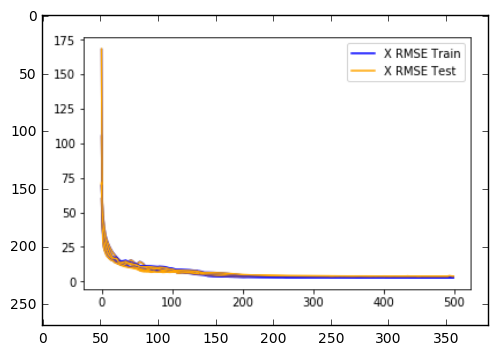

In [60]:
# from PIL import Image
img=mpimg.imread('XRMSE_simpleRNN_500epochs.PNG')
img_plot= plt.imshow(img)

XRMSE for both train and tests sets is continuously decreasing over the 500 epochs. It remains somewhat constant after 300 epochs. let's check for the Y-coordinate below:

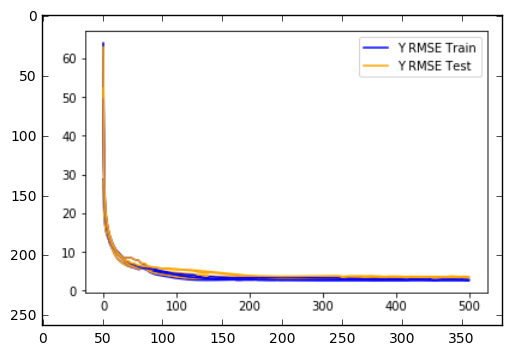

In [61]:
img=mpimg.imread('YRMSE_simpleRNN_500epochs.PNG')
img_plot= plt.imshow(img)

This plot also shows a continuous decrease over the epochs. However, the test set shows a very slight increase after 300 epochs. let's check below the mean performance at different number of epochs below and select the one with the lowest mean value.

In [ ]:
print(results.boxplot())

In [ ]:
#30 units. 500 epochs results of RMSE at each epoch for 5 iterations. Both test and Train datasets decrease continuously. Require to be trained for more number of epochs.
Xtrain_RMSE:  [60.02021204699332, 40.18693856213281, 33.94710462338607, 29.614787957995368, 26.88838073453121, 24.95665072776, 23.605075450507638, 22.448445426582836, 21.49333913887825, 20.668111825259015, 19.89684769335716, 19.167578263524508, 18.57832734867523, 18.086745740901172, 17.629726489842927, 17.260017961238205, 16.936083248895702, 16.546293360479364, 16.201074415783793, 15.914712831612697, 15.512118837263532, 14.886951155387214, 14.217084996184058, 13.682635990600996, 13.31321301150101, 13.09874358385798, 13.017558168171169, 12.995163112420716, 12.911811058057879, 12.713899676208664, 12.449299468714338, 12.218392182209643, 12.101276065773016, 12.128096097488129, 12.281930287600089, 12.518878449175181, 12.768865134858675, 12.976116807851263, 13.08704240794197, 13.069162225094619, 12.928875389949928, 12.707207465491358, 12.505173171130076, 12.27697201460657, 12.052106310292112, 11.825859026880124, 11.576022282047418, 11.265277929389098, 10.86841170045195, 10.40474052304037, 9.92550963549103, 9.470029626091419, 9.060016231767891, 8.70413101035748, 8.407029186231041, 8.167914865932323, 7.9791238667772415, 7.8302892776458695, 7.71327322477655, 7.623435608804186, 7.560528837186764, 7.5242541081823475, 7.52809668803624, 7.571222926065395, 7.638367364038086, 7.689925259142378, 7.675906239560649, 7.567524374245759, 7.388195436880892, 7.20636663010229, 7.092556811953846, 7.073766762628194, 7.140061032369997, 7.260412910661768, 7.382046832822225, 7.475481298832748, 7.590108923155673, 7.782155094107594, 8.031792057235112, 8.228091221957163, 8.259068354665779, 8.104082148295774, 7.812693887522044, 7.468995382019873, 7.212153823655224, 6.999440350648895, 6.878741414999982, 6.823222145515733, 6.810029246218269, 6.825669119202395, 6.864055936717668, 6.921577965132698, 6.994780722690681, 7.078140299330308, 7.164042339479186, 7.243990466735882, 7.311503782645587, 7.361251471623997, 7.395194383034036, 7.4082506093796425, 7.40088150232408, 7.372413407322335, 7.318553686692038, 7.230490377188504, 7.093909539044706, 6.892453647714577, 6.622995873671422, 6.322378032114575, 6.05981317868975, 5.939705117868442, 5.966030178852807, 6.083120277370103, 6.219077631022663, 6.3227302017769205, 6.37262689301804, 6.367422746674309, 6.318631906388108, 6.245406417955654, 6.1667390800751125, 6.095908012198713, 6.036104035876803, 5.983316791072423, 5.93275952673083, 5.8810699731961495, 5.8260405707412, 5.765628254248759, 5.695962661794879, 5.613898481271289, 5.5181948713431614, 5.415186419854558, 5.31496102987727, 5.224716417353277, 5.155394137092722, 5.098096768285242, 5.043696340192659, 4.984526880082239, 4.915252597269049, 4.839325035695608, 4.77009556100045, 4.721028063149965, 4.695243117076312, 4.686458003889919, 4.683124196002089, 4.675060399886062, 4.656009340767691, 4.625081688659535, 4.585802928991301, 4.544169612486096, 4.504843685768189, 4.469798297672938, 4.437764403513865, 4.406489641220932, 4.373700480249153, 4.337719278765688, 4.298117754600039, 4.2552255825549645, 4.20866344424709, 4.15870357976448, 4.1072503482556755, 4.054626897634982, 4.0038738020338105, 3.961530418155837, 3.9340739955970307, 3.9187288351874328, 3.9064891276202727, 3.8892712579290163, 3.873834045882132, 3.8610443195218007, 3.848899999751904, 3.835687027939617, 3.8212634759795927, 3.80703158130909, 3.7943284428974833, 3.7831012304018783, 3.772904440241838, 3.763965253597971, 3.757160370153755, 3.753368185857855, 3.75061041248686, 3.7397309994488994, 3.7242076655844065, 3.744444196899677, 3.772813788408894, 3.7814955929312344, 3.787100303806888, 3.7947247494613587, 3.7956215070008623, 3.7685332616988294, 3.695162745090175, 3.619498688345369, 3.5956184182246798, 3.5860915942639093, 3.5726868672545145, 3.5616216933000873, 3.5553273124429916, 3.5525775945517117, 3.5513158575182535, 3.549960512508647, 3.5478312317317804, 3.5446840802857302, 3.5406025200632696, 3.535792794007712, 3.530513465654765, 3.5248728840714514, 3.518932564746727, 3.512515310051977, 3.5050358758344218, 3.4945945956065185, 3.476338931166706, 3.4409850999371376, 3.3931471862906224, 3.371641060625744, 3.3648186577558112, 3.368468912230457, 3.376975610701003, 3.3851515652282664, 3.3902932596164677, 3.391702984573714, 3.389853890930385, 3.3854176328359964, 3.3791414236188304, 3.371558229513992, 3.3629989722677753, 3.3539619923415707, 3.3444078525079437, 3.334662640901002, 3.3247294187128382, 3.314833799259181, 3.3047664798748846, 3.294864908293143, 3.2849117646674735, 3.2749760874132696, 3.2649820664391545, 3.25474991875196, 3.2441240832801688, 3.2328034967516026, 3.220086846192961, 3.214112277771534, 3.2185439533708413, 3.2234846934930017, 3.2207446833661937, 3.2126297403932846, 3.2025844683469704, 3.1920396607834665, 3.1816777061119508, 3.1720777433644525, 3.1636971787508834, 3.156941845463493, 3.152310931842996, 3.150413303039085, 3.152044815701563, 3.158459695129396, 3.1708595491681755, 3.1903810923286575, 3.2157116538056805, 3.2400238830605077, 3.2522765670668194, 3.2392019912865093, 3.1766998326376132, 3.060425572719976, 2.9904542416783007, 2.9909827987669773, 2.9939245119067754, 3.0000421166181757, 3.007517441444061, 3.0099513855437547, 3.0094933494612004, 3.008859520894987, 3.0086655170617354, 3.009080448159729, 3.0100147575472085, 3.0114255341115763, 3.0133696808270796, 3.0156624752657417, 3.0184233873293596, 3.021648501638049, 3.0251725501491697, 3.029098135646397, 3.0333511963244892, 3.037867357528826, 3.042708248240645, 3.0477656776571154, 3.053110659105318, 3.0585759881464316, 3.0642757344406992, 3.0700418582285374, 3.075951013877738, 3.0818886305381112, 3.087831579401906, 3.0938409443882633, 3.09977615468394, 3.105675184269286, 3.1114429198999303, 3.1171171587618427, 3.122622994899744, 3.1280292869211728, 3.133237499068563, 3.138307046090518, 3.143101873237343, 3.1477371250802233, 3.152174087507382, 3.156323527059316, 3.160314793951198, 3.1641193902288007, 3.1676823251153503, 3.170939655294573, 3.1740492935209623, 3.1768829432151735, 3.1795866446198833, 3.181978966869381, 3.1841533901572894, 3.1861679160400103, 3.1879476578487687, 3.1895082595087847, 3.1907761615119767, 3.191946109796631, 3.1927981449367646, 3.1935259078720692, 3.193947985051926, 3.1942770151707807, 3.194250441535634, 3.1940780881367026, 3.193557326549606, 3.192908330117422, 3.191921728707233, 3.1907585440504826, 3.1892598080341554, 3.187468436843425, 3.1854418573312064, 3.1831403397007323, 3.180478653869555, 3.1775082694892727, 3.174224465460038, 3.1705114434335067, 3.1663892694781723, 3.1619391407404858, 3.1570231673339224, 3.1516339208579933, 3.1458175144387557, 3.1395068258718903, 3.132679843634159, 3.1253926880577447, 3.1177050027214452, 3.109628398376369, 3.1011912509123243, 3.09247354157189, 3.0835120661380158, 3.0745379938770974, 3.0655779909654037, 3.056732698043234, 3.0480865040666796, 3.0398882849356776, 3.0322601877344106, 3.025457320993162, 3.0199515492457856, 3.0166363642518887, 3.0165605571903895, 3.0228676793078253, 3.038059436451019, 3.0549535761661164, 3.0021088637929934, 2.8493046789248906, 2.8308166030662094, 2.8385680420713215, 2.843615067576459, 2.847358538097179, 2.8501964850862476, 2.8524563295384846, 2.8542721346441757, 2.8556917247009563, 2.8567933229339073, 2.8576528094410665, 2.8582940440956572, 2.858710701923796, 2.8589396327039793, 2.8589743423386857, 2.8588554471291556, 2.8585880437808124, 2.858162695981269, 2.857607689927233, 2.8569654284009327, 2.8562219246813974, 2.855507540501984, 2.85484353741391, 2.8543246028696307, 2.854095693372782, 2.8543007554127975, 2.855114396507105, 2.856737267286996, 2.859454399752258, 2.86358019838208, 2.869509887525946, 2.8777868743362967, 2.8891920690398996, 2.9048819577586054, 2.9265225231168044, 2.956924233016194, 3.0000383275666755, 3.0611964718347804, 3.140382072776263, 3.2043014273582595, 3.1439584331240638, 2.9659276266457466, 2.8794443805909276, 2.8651126033515704, 2.8744404220641226, 2.8939019754437236, 2.912408215491611, 2.9170352102115857, 2.905114863964424, 2.8896966192203473, 2.8812538534646417, 2.8796923211858183, 2.882294124039956, 2.887321536390428, 2.89387493485271, 2.9014541456122847, 2.909596381036864, 2.917792232259387, 2.925396222874405, 2.9299856302074816, 2.9328246142305865, 2.9310897932267586, 2.9243854496760826, 2.915097925355083, 2.907655045589798, 2.900826678496681, 2.8964280990468345, 2.8938481899337116, 2.892468735128726, 2.8918062677323637, 2.8914746152210555, 2.8913187899461006, 2.891198704801636, 2.891048276480412, 2.890825365780901, 2.8905117673812843, 2.8900580357640138, 2.889474975826316, 2.888729979009242, 2.887815225922244, 2.886721617372196, 2.8854460308716505, 2.8840383978021427, 2.882522993180641, 2.8809581210571853, 2.879375077685565, 2.8778559451025907, 2.8764384688990297, 2.875160581504746, 2.874020634463523, 2.8730181558196555, 2.8721782480525957, 2.871453580065582, 2.8708297513582175, 2.8702811784680224, 2.869790422837122, 2.8693349441646325, 2.8683008386066335, 2.86781744314591, 2.867811290191392, 2.8680105922729955, 2.8683349472198274, 2.8687107054416763, 2.8690733280890792, 2.869398491166752, 2.869678839140242, 2.869870668802911, 2.8699819982665344, 2.8699858271706096, 2.8699053709496343, 2.8697167093970517, 2.869444563924871, 2.869072499928309, 2.86862813523134, 2.8681110161609307, 2.8675411949599714, 2.8669278085094008, 2.866293257118024, 2.8656405552244895, 2.8649877239616193, 2.864328908075247, 2.863687010030984, 2.8630629794502687, 2.8624545321743433, 2.8618674319894586, 2.8613042661398747, 2.8607501301531832, 2.860212700976061, 2.859700150919894, 2.8591808762786695, 2.85868973128163, 2.85817624586389, 2.857680059618379, 2.8571779536045896, 2.8566816401678117, 2.856183569001979, 2.855678981572554, 2.8551805651501327, 2.854678224969534]
Ytrain_RMSE:  [54.888957929602014, 31.2480710065472, 23.951977591924702, 19.579625699776848, 17.07032439269228, 15.71622034778845, 14.584721128790093, 13.599837555645337, 12.770396314221943, 12.125715092050692, 11.691400398049469, 11.327717480955934, 10.919161534088047, 10.474388851767912, 10.023999590158702, 9.602923977250393, 9.240626923875444, 8.931517591229591, 8.645958159572084, 8.385997259820495, 8.148053571751836, 7.941178778770548, 7.764695299438196, 7.606309111827369, 7.454852828600025, 7.30723385871637, 7.167801240592601, 7.040188897456065, 6.923043033901895, 6.809610874848419, 6.6959483615314985, 6.587608945258459, 6.492709393650046, 6.411620792194086, 6.338657356924962, 6.269304407438386, 6.203060193598423, 6.140872314166253, 6.0820472922614, 6.025712976241895, 5.973901273635724, 5.927051979401883, 5.882652250692517, 5.842836120638086, 5.794124002564925, 5.72421562107775, 5.637123334338569, 5.557855316789983, 5.515280872280293, 5.521832265219223, 5.56789392745362, 5.627717988837359, 5.671209201663637, 5.682229841042468, 5.664009262425359, 5.626674652327711, 5.578659664844635, 5.522862982951991, 5.460704129065435, 5.394226210062711, 5.32615282837676, 5.261814992707648, 5.196295147473793, 5.1310430261862825, 5.067704420257796, 5.011679866579391, 4.9712280541891465, 4.953469399830559, 4.962268534845455, 4.98837322124334, 5.005953717233021, 4.986156532070064, 4.924626987405368, 4.838160340137261, 4.749043100249041, 4.666854812110978, 4.577822629572324, 4.4699071449587855, 4.353727214881727, 4.254248241822694, 4.186962961530275, 4.151718837143804, 4.14310191294767, 4.15301446781847, 4.218707610922189, 4.207195924132596, 4.180145024055884, 4.143614700421989, 4.101746818339365, 4.057841818974621, 4.0133304740851665, 3.969053221628517, 3.9254683665507537, 3.8830797112322633, 3.842671254210836, 3.804823473711563, 3.7701123074743728, 3.7386638938711934, 3.7104978670529425, 3.685854473665582, 3.664726069385341, 3.6469419219073242, 3.632666933039039, 3.6218530188739853, 3.614228461931325, 3.6085808774038313, 3.5998319771413887, 3.574923121206501, 3.4844908723529815, 3.43031690009665, 3.3785487151874403, 3.3420399822935454, 3.31809946406569, 3.2995093425062567, 3.279739864626278, 3.2555733989026434, 3.227261968265233, 3.197991115306936, 3.17188863784754, 3.1513165311931646, 3.136144334797467, 3.124213709436675, 3.112443902338807, 3.097872076990156, 3.0783699734666903, 3.053443295579724, 3.0249743409554855, 2.9989029667461247, 2.985852733849834, 2.9955306478455976, 3.0268524202010307, 3.0670081761424877, 3.102271849158429, 3.1290991316992556, 3.138540631955667, 3.1329274102367894, 3.1158892251877712, 3.092261544994597, 3.0683375372983344, 3.0491623489454645, 3.036191979018436, 3.0279712967364674, 3.0220537160634295, 3.0167786040951445, 3.0111611433986547, 3.0051731863686895, 2.9994473579385468, 2.9953121012544526, 2.9937872171407944, 2.9953811186090493, 2.999753905669979, 3.0064830847026216, 3.015086982949214, 3.0253078440604964, 3.037325373243906, 3.0513544675365054, 3.0672766533312306, 3.08655668608453, 3.1086246212098625, 3.1311719457306677, 3.146287069259767, 3.132745594572016, 3.0611488081858527, 2.9583862949136384, 2.905963630100793, 2.9478194517938183, 3.001528904983604, 3.0419948898033864, 3.0646811197088657, 3.0674302086717105, 3.0514336017762136, 3.024371877828835, 2.9986617949714023, 2.9839528853194706, 2.9800300940027165, 2.9808697883599455, 2.9808782772110414, 2.97496584590493, 2.954090541680135, 2.9016809903322662, 2.8139097041231302, 2.7396534820528466, 2.7113572466313705, 2.7044138253416348, 2.7031818664566525, 2.7033984595953213, 2.704101776951636, 2.706370189422298, 2.7154450044358343, 2.7404853810993965, 2.771488703900234, 2.786396284038537, 2.7875043431430737, 2.784259141682358, 2.7809046703232347, 2.7785798039159686, 2.7773803047872603, 2.777175647636141, 2.7776862537487665, 2.778930411679393, 2.7808024314516055, 2.7834103877199645, 2.786931728094505, 2.7917246805014426, 2.7983613874474424, 2.8077686194917186, 2.8211230678020063, 2.839453151827174, 2.8599221891666784, 2.863255429770052, 2.8196770742409165, 2.7883102954565917, 2.7847359658153135, 2.780375955054689, 2.7758291133602504, 2.772294597333872, 2.7694811149254526, 2.767168368889123, 2.7651341790313713, 2.7632742051985684, 2.7615037004103007, 2.7597882043881685, 2.758100237914078, 2.7564416034712287, 2.7548088126024908, 2.7532040592710945, 2.751629331769275, 2.750125156564081, 2.7487009097668955, 2.747375465677929, 2.7462658829747175, 2.7454694301882823, 2.7453037540549703, 2.7465310102868363, 2.751050169222471, 2.763441654503153, 2.7937578529868663, 2.8251299823505858, 2.8109821499539818, 2.7899281187596547, 2.7825433492901572, 2.7797295549867833, 2.778278416914549, 2.7779571047384186, 2.779026121293832, 2.781766764488621, 2.786612923450165, 2.7941231046733632, 2.8050850623064587, 2.8206355145864292, 2.842205271000742, 2.871444469229196, 2.909249095596698, 2.9524440071326743, 2.9878981502350026, 2.9936348003042017, 2.9707437454891337, 2.957730963022279, 2.975091553626035, 3.0216977000171066, 3.089001402097922, 3.1390099399856184, 3.1239702354997494, 3.0235277349311573, 2.9119497536989125, 2.8556159397540415, 2.8352138138598493, 2.8276851107823937, 2.824836226131999, 2.8241861535887898, 2.8247474495160407, 2.8260120478775366, 2.8276728227593004, 2.829654785183292, 2.831829273393813, 2.834072295701308, 2.836344890927563, 2.838616279661822, 2.8408627998311955, 2.8429944555668123, 2.8450905762099037, 2.8470536498588404, 2.848898395846049, 2.8506478448802457, 2.8522557648102262, 2.8537630915300185, 2.855114399926634, 2.856302798820383, 2.8574029576308844, 2.858405251752153, 2.8592465239196416, 2.8599955716203325, 2.8606294475335057, 2.8611701951389326, 2.8615976258213425, 2.8619663524473293, 2.8622101398038886, 2.862425790358053, 2.8625741690569164, 2.862707164515312, 2.862747941066892, 2.862741487351521, 2.8626963765286235, 2.86265675904505, 2.8625822485451424, 2.8625032333766547, 2.8623611380102627, 2.8622492282423595, 2.8621352694194777, 2.862005674232895, 2.8618546458152108, 2.861706901393268, 2.8615953505298073, 2.8614405392177638, 2.861308474579531, 2.861176382942867, 2.8610234475973577, 2.860890266098338, 2.8606915390287964, 2.8605406407331317, 2.8603479232096882, 2.8601568042700767, 2.8599449033382234, 2.8597161101164357, 2.859451509468558, 2.859147521725201, 2.8588282720736333, 2.858505665356497, 2.858099796356978, 2.8576519172123462, 2.857230065031198, 2.8567144361143657, 2.856140152205337, 2.8555475657845792, 2.8548071133222805, 2.854109921182677, 2.8533322309902065, 2.852454234986323, 2.8515035969187648, 2.850534726068001, 2.8494264619066803, 2.848277929195392, 2.847061468028773, 2.8458014492673858, 2.8444799594373156, 2.84307873304939, 2.841661569179622, 2.840246915966131, 2.838828676433264, 2.8373854551292106, 2.8359425866124477, 2.8345260996840724, 2.8331567789851917, 2.831845831010948, 2.8306082791554954, 2.829563572491069, 2.8287327175361923, 2.8283178120112424, 2.8281949574362297, 2.826395342387722, 2.812892499732001, 2.777539713980441, 2.7572636494081273, 2.7546045231302854, 2.755085182362959, 2.7562769865278955, 2.757620417537872, 2.7589229832398203, 2.760052395744922, 2.761062437634313, 2.7618652105212287, 2.762553273777852, 2.7630850179248343, 2.7635397970407913, 2.763909100434942, 2.764151339311815, 2.76440226965206, 2.764598096649151, 2.764769157482841, 2.7649123905942496, 2.765028407325028, 2.7651289729215325, 2.7652022437998314, 2.7652368214067615, 2.7651956927526427, 2.7650388249174904, 2.764743686621028, 2.76425100557335, 2.7635120685473877, 2.7624486177523955, 2.7610134158234763, 2.7591615678102106, 2.7567679912249794, 2.753817391349362, 2.7502324782837295, 2.7458853881905343, 2.7407307261603013, 2.7346863016300498, 2.728112542868826, 2.7220877786055304, 2.7195892188176765, 2.725421030219162, 2.742489987105397, 2.7625047088833585, 2.778024871079311, 2.7912605574802445, 2.803379626308452, 2.8134235784799566, 2.819339266043976, 2.820623184426703, 2.8197156486807455, 2.8195174305584567, 2.820890466668911, 2.8236697063069496, 2.8275954729219817, 2.832509098832495, 2.8384063872790337, 2.8452016652026146, 2.85269434355213, 2.860159494026614, 2.8663953212272695, 2.8680158951668115, 2.8624992467296235, 2.8495411583293278, 2.8327498174125156, 2.8167286999637846, 2.804407367658824, 2.7955848161938617, 2.789572333182723, 2.785673176331861, 2.7832781634484065, 2.781957274526237, 2.7814532967747634, 2.7815244152410608, 2.7820336520686, 2.7828103603260352, 2.783778266430178, 2.7848702134851253, 2.785929989742493, 2.7869205450465584, 2.787751544625203, 2.7883682179758074, 2.7886595971974018, 2.7886693579362536, 2.7883396696160303, 2.787681949811111, 2.786745686475277, 2.7856056800223103, 2.7842904406037685, 2.782914374081066, 2.781521574033805, 2.7801411197019292, 2.7788596467515965, 2.7776667403637436, 2.7765380560591524, 2.77554511537022, 2.7746585765724476, 2.773863714803047, 2.772745947656149, 2.7708791103982398, 2.7692148045790894, 2.7678495597048998, 2.766665109275345, 2.7657393132455796, 2.7649734216929693, 2.7643642935966803, 2.7638783189346676, 2.7634967265383423, 2.7631681040603904, 2.762891188556009, 2.7626387136097024, 2.762396084779241, 2.7621588885078334, 2.7618702548404634, 2.7615487043695124, 2.7612100946312226, 2.7608049981616674, 2.760361955278415, 2.7598772692679625, 2.75934338282837, 2.758772922598136, 2.758202612769382, 2.7576021540917863, 2.757001678667904, 2.756406157749141, 2.755799087120352, 2.755219979408885, 2.754652973630236, 2.7540775816469796, 2.75356379761676, 2.7530333856359546, 2.752530393280533, 2.752036170296214, 2.7515761976561763, 2.751105106576146, 2.7506605310781778, 2.7502282693974966, 2.7497838872287006, 2.749349140314862, 2.748916875487781]
Xtest_RMSE:  [59.77779920026604, 39.904875611361675, 33.613783553170265, 29.198266374065312, 26.42825346872092, 24.501407868557752, 23.174557685143323, 22.01044428251844, 21.0388635075952, 20.20333708058367, 19.421771310494517, 18.684406954240487, 18.085719607512335, 17.57652876635673, 17.097811365809203, 16.707560125638302, 16.365596430555463, 15.961465105212788, 15.607564950535336, 15.3167895104322, 14.914495834828223, 14.296153933878273, 13.641219100661154, 13.124371981356274, 12.768868758939522, 12.564796820861899, 12.495126687722596, 12.488471137631127, 12.424944302958693, 12.250070980180316, 12.010747990425072, 11.806033485235751, 11.699780358806416, 11.721572244819619, 11.869809607276661, 12.101861316295096, 12.347522147656193, 12.551120553173885, 12.658755695078945, 12.637768227279011, 12.4942884801932, 12.269760555427856, 12.06605888846708, 11.835702931024265, 11.609651064509016, 11.382715060945166, 11.132353151501935, 10.820601973356503, 10.42146163956036, 9.95407793212956, 9.470239752869823, 9.009729781036999, 8.59464961915117, 8.233972561730697, 7.932751435493291, 7.690572320836769, 7.499910652336917, 7.350403561443917, 7.2339784205570075, 7.146250683415556, 7.087478444980969, 7.057796241078331, 7.071710793801152, 7.127772871167595, 7.208813690215281, 7.271896665226927, 7.263879362395771, 7.154749900859538, 6.969668205314875, 6.7816937129893065, 6.666831473806599, 6.655008492559212, 6.735114583111332, 6.872195383090398, 7.008977209771588, 7.114511664696618, 7.241547731558664, 7.448737887880712, 7.714173001526039, 7.922739639285747, 7.960806263559436, 7.809123243073214, 7.518959837829574, 7.175858176612576, 6.921980499408278, 6.713608621475161, 6.600640060095268, 6.555363625794123, 6.553980610541926, 6.582252672089197, 6.63363421184256, 6.7041482008049185, 6.7900101801025325, 6.885408640388904, 6.9824763707115105, 7.072621216112795, 7.149414001202529, 7.20774339459248, 7.249791409390638, 7.270696962234937, 7.271203892489218, 7.250869091328253, 7.205642357368651, 7.126986718648869, 7.000987979870845, 6.811856189760555, 6.556935776091588, 6.272778677724142, 6.027984351804208, 5.9235131963150485, 5.963141369243839, 6.091895204173676, 6.238199591352827, 6.351392478501998, 6.410827560390321, 6.415961780044825, 6.37873199446722, 6.31818500024019, 6.252832175930661, 6.195392253242289, 6.148747184469243, 6.108899312129682, 6.071209482248712, 6.032499387667972, 5.990738390247489, 5.9440474844282205, 5.888859162973392, 5.822305569922631, 5.7433171825230644, 5.657846651037464, 5.575220851902791, 5.501901020007643, 5.447808609964263, 5.4046419438107165, 5.363639177958598, 5.317837259052408, 5.262560400984855, 5.201280778377053, 5.146355102895738, 5.109914651953448, 5.0945147520301814, 5.094226251083944, 5.098506842424346, 5.098190517127039, 5.08776657871483, 5.06660105583256, 5.037979408026587, 5.007318803705765, 4.97873955041526, 4.953918774419109, 4.93168159661635, 4.910011861710352, 4.886929092963629, 4.861017190284468, 4.831952590043271, 4.800068385513235, 4.764973956086804, 4.727189905929668, 4.6881991316088225, 4.648247198652863, 4.609886145821526, 4.57847280915613, 4.559364494119949, 4.550476728519018, 4.544285583297474, 4.532636203291808, 4.522766864109453, 4.5154545939157344, 4.508557116331327, 4.500533734398746, 4.4913414351881835, 4.482307009228395, 4.474784323126866, 4.468807946193555, 4.463891615591791, 4.460162709833981, 4.458474090331442, 4.459703536849554, 4.462125353129302, 4.457405377325306, 4.446755663779421, 4.462998119659559, 4.4856774057907645, 4.49288704891704, 4.497833867648175, 4.504336568488852, 4.505311804902484, 4.483903434822028, 4.426377980739961, 4.3690045007105125, 4.352589688991336, 4.345286374736888, 4.3337689979739356, 4.323956736492152, 4.318042476192486, 4.315080762479273, 4.313407343385696, 4.311729628909852, 4.309463654700636, 4.306390799287575, 4.302557332667839, 4.298118982939602, 4.293272880704798, 4.288111053647451, 4.282683583112543, 4.276871054163342, 4.270234935878456, 4.261328585428463, 4.246437786830942, 4.2185403162852895, 4.181125473441511, 4.164111343737547, 4.156753601366174, 4.157611506748137, 4.162596395649173, 4.167539832122635, 4.170225090045313, 4.170043900205835, 4.1673259478526505, 4.162565844201577, 4.156340581887132, 4.149068922908382, 4.141002747153367, 4.132537920133138, 4.123648255200449, 4.114586801695704, 4.105360671940774, 4.0961333110720775, 4.086759389123046, 4.077490105872999, 4.068158004210376, 4.05880834240975, 4.049377652582498, 4.039710224774962, 4.029645790914559, 4.018890594309981, 4.006537877994811, 3.9991979599743455, 4.000369802039374, 4.002721786363328, 3.999372369056988, 3.991905358521077, 3.9829354188106336, 3.973543529533265, 3.9642581972230784, 3.9555222693163983, 3.9476784307194692, 3.9410289590915872, 3.935955790070328, 3.9329170167442764, 3.932537667937093, 3.9357832029500988, 3.9436274683490575, 3.957015824573764, 3.975020904749577, 3.9923167882183637, 4.000142081728072, 3.9881809535425172, 3.9384346665650733, 3.8498520259283815, 3.8006363780748957, 3.804160056321828, 3.807739615624066, 3.8140152921256454, 3.8204956079738843, 3.821520263598046, 3.8196130445254974, 3.817441712252035, 3.8156057367855096, 3.814282100980803, 3.8134023695719774, 3.812945686388945, 3.812964347528916, 3.8133022307141, 3.8140593320822758, 3.8152322479866454, 3.8166853736954076, 3.818501007731375, 3.8206151041390366, 3.8229773607325592, 3.825633990177431, 3.8284971948812565, 3.831623415686041, 3.834878613083178, 3.8383519774211545, 3.841906838716799, 3.845602946937608, 3.8493469313955972, 3.853122596879979, 3.8569732190767176, 3.8607851315013217, 3.8645925206927063, 3.868314042818233, 3.87197824368657, 3.8755214773332542, 3.8790072234329025, 3.8823488525014813, 3.8855956846723645, 3.8886367727338635, 3.8915618143853767, 3.8943413181046016, 3.8969060366656354, 3.89935329675645, 3.901660848758979, 3.9037875151844936, 3.905679397675083, 3.9074595817108984, 3.9090300945261034, 3.9105024638823136, 3.911733210781726, 3.9127974784578123, 3.9137395637025127, 3.9144992937468253, 3.9150893680192844, 3.915448178411248, 3.915731286734377, 3.915762545806369, 3.915697650512476, 3.9153871308313457, 3.915001787680796, 3.9143299282999235, 3.9135399736547836, 3.9124671108749554, 3.9112887057748007, 3.909832718675757, 3.908229950970409, 3.9063561397238287, 3.9042373692328707, 3.901927856103326, 3.899389813435956, 3.8965555793850424, 3.8934666323824505, 3.8901156006418676, 3.886421900036976, 3.8823849346290644, 3.878081136076888, 3.8734004947910177, 3.8683329430852282, 3.8629199316955942, 3.857108191843543, 3.8508786471141647, 3.8442844557715303, 3.8373692730315403, 3.8301484649528836, 3.822645611732753, 3.8149259341251796, 3.8070203339740014, 3.799117092204797, 3.7912382747967763, 3.783461224910185, 3.775856198007368, 3.768620323421796, 3.761849557366358, 3.755743449897279, 3.7506737888168975, 3.7473515336686813, 3.7466433383992825, 3.7509419968697, 3.762210192505946, 3.7744096225785237, 3.729335048090767, 3.603875573674801, 3.586225854035321, 3.5907791308406574, 3.5936742202662844, 3.5957466254578625, 3.597236674108455, 3.5983691531280564, 3.5992225650476017, 3.599827812806387, 3.6002331826845206, 3.600493175926732, 3.6006169154165217, 3.60059641385367, 3.6004594296687578, 3.6001975327601214, 3.599839067417398, 3.599382020847688, 3.5988270543704557, 3.5981833732818367, 3.597488030312408, 3.596726006610316, 3.5959933802845416, 3.5953068397464802, 3.5947315374614717, 3.5943783110812286, 3.5943534193101625, 3.5947765319549974, 3.5958088280056364, 3.5976667392092785, 3.6005928087501453, 3.6048974477479416, 3.611013644367258, 3.6195656882081657, 3.6314818498034565, 3.64811892463793, 3.671769851823855, 3.705733385818849, 3.7545760775646846, 3.818840549944348, 3.8719518803100805, 3.8245283402989174, 3.682947105616273, 3.616446898092979, 3.606974912411799, 3.6155610129107822, 3.6315377683542778, 3.6460041898331212, 3.648595112486277, 3.6375496783405286, 3.623984934812416, 3.6166015825253663, 3.6151749005346665, 3.6173313180590525, 3.6215776915825635, 3.6271490675479447, 3.6336220027901485, 3.6406011834103937, 3.647652227490884, 3.6542190106195536, 3.658223231612979, 3.660740986794767, 3.659366908307962, 3.6537656124925237, 3.6459447758931303, 3.6396771322489383, 3.633857034464106, 3.630080687555335, 3.627844050759774, 3.6266256308595994, 3.6260207905488584, 3.6256955265928172, 3.625520234058674, 3.6253816464034467, 3.6252222669039678, 3.625005919841699, 3.62472055170837, 3.624323607089056, 3.62382227154055, 3.623190211529326, 3.6224182820667683, 3.621498197694753, 3.6204280709921077, 3.6192467440638607, 3.617975601834473, 3.616662890809714, 3.615333086923739, 3.6140612037854853, 3.6128750811003383, 3.6118071753151364, 3.610857972568774, 3.6100251196901767, 3.6093347580356876, 3.60874327389484, 3.6082371482643634, 3.6078000724382835, 3.6074094451293983, 3.6070544317419326, 3.605905596987777, 3.605428874768607, 3.6054290050280837, 3.6056284667706726, 3.605947308932129, 3.60631341467407, 3.606667773019958, 3.6069892826194385, 3.607271747377321, 3.607479881008053, 3.6076179300002296, 3.6076636035006713, 3.6076375030062784, 3.607517170954664, 3.607328544426801, 3.607053531959524, 3.6067119708574156, 3.6063137645231427, 3.6058668680646613, 3.605386063779293, 3.604884773850496, 3.604367132988101, 3.6038503225719873, 3.6033267547516097, 3.602817846711858, 3.602325349132649, 3.60184563775926, 3.6013816977917084, 3.600941711885418, 3.600508205521489, 3.6000869123180923, 3.5996895434780645, 3.599284312714635, 3.5989030813065397, 3.598500870156608, 3.5981146697582647, 3.5977215893122034, 3.5973330025383126, 3.596941536537801, 3.5965400682369366, 3.5961464248425865, 3.595747835127803]
Ytest_RMSE:  [56.08689974000355, 32.35579258615925, 24.90625819617273, 20.25157731601141, 17.526180808090768, 16.066119989369657, 14.819295854495456, 13.75784070331736, 12.888988568005765, 12.2249742233511, 11.773478369355603, 11.38648921565637, 10.951193859169404, 10.48070629557659, 10.007925908161706, 9.568828946491447, 9.192728517476146, 8.872542967861715, 8.577078805177878, 8.312102794919575, 8.071889476382609, 7.864152300321281, 7.68674267854792, 7.528399603163086, 7.378558246038392, 7.234831480713649, 7.101147679157242, 6.980380495159254, 6.871580846083795, 6.768569097623764, 6.667865536939214, 6.574431715659602, 6.494862209805599, 6.428242479520781, 6.368065061496265, 6.3105447653541935, 6.254838385757411, 6.202775090757588, 6.154169497277193, 6.108655988139225, 6.068589393706542, 6.037974979367966, 6.0120146416175855, 5.990141148117224, 5.957713567542244, 5.901953434624049, 5.82614424112198, 5.754248749094567, 5.714357867466073, 5.719095357092436, 5.760365497907734, 5.814909038138763, 5.855270742837415, 5.866729266785837, 5.852316408603734, 5.821319438834109, 5.7814191976056, 5.735245713397454, 5.684082380316485, 5.629725118171898, 5.574519278646462, 5.522863151278284, 5.4706790657768245, 5.41912346689624, 5.369490892624205, 5.3260408791393035, 5.295200879233835, 5.282508463695083, 5.291118915106769, 5.313779595441696, 5.329348805450341, 5.3138499920998665, 5.263881726606696, 5.193832598041187, 5.122131889323507, 5.0563263729038965, 4.985517446255111, 4.900582421383697, 4.810403489854004, 4.733732667522585, 4.680743080258188, 4.6504372451780345, 4.639201126171651, 4.641392354720492, 4.685450041930669, 4.673970545814931, 4.650332937758474, 4.61908996361731, 4.5834657191988155, 4.546049413370598, 4.508000854752371, 4.470003922887869, 4.432453341179294, 4.3957535727174255, 4.360495553110189, 4.327089839467369, 4.295939882597718, 4.26710112912669, 4.240577647109465, 4.216511916192403, 4.19488420443958, 4.175550194623677, 4.158618776126466, 4.1440474566147145, 4.131632811232334, 4.120439762332958, 4.106606652714623, 4.0802076480313065, 4.0079928421623805, 3.959036739665144, 3.912463229397248, 3.8769388664571243, 3.850384118525588, 3.827810079695449, 3.804781722745644, 3.779088715145873, 3.7509506666170433, 3.722572266491268, 3.6966143174021493, 3.6743692833086548, 3.655576927653671, 3.638828733525755, 3.622206570604152, 3.6037937280435406, 3.5822588879037895, 3.5575377528433867, 3.531536563049501, 3.5094099099135545, 3.4996993288733136, 3.509494149272517, 3.536525986817917, 3.568819714281394, 3.594840373798924, 3.6126386360766696, 3.614341994639434, 3.602432363491147, 3.580363819441346, 3.5526304350755518, 3.525056496773524, 3.5022604098357375, 3.4854998783464004, 3.4733404833485952, 3.463444699138032, 3.4542261653310664, 3.444768844104433, 3.435073341346321, 3.425773059364179, 3.418124601840217, 3.413082883881517, 3.4110888473800802, 3.411807513792817, 3.4148154670087867, 3.4196637135968104, 3.426096164416913, 3.4342791718513164, 3.4444060158551877, 3.4562483441828156, 3.4713549043842487, 3.4890495624680065, 3.5071833539186117, 3.518541281929543, 3.5039098419521437, 3.4370423122956857, 3.3428135320310486, 3.2945252463782584, 3.3322134874493066, 3.3796554576213045, 3.414722896231905, 3.433658906334463, 3.4346991786004053, 3.419060497923662, 3.3937710078339114, 3.3700104494234933, 3.3563605395798635, 3.352499280648771, 3.3529590483496046, 3.352723645371395, 3.3472425164614754, 3.3284059324516053, 3.281373250350072, 3.202683264592074, 3.1352941527226057, 3.1078276628754447, 3.0998207421834927, 3.097800757613152, 3.0975417576807653, 3.0980170210392814, 3.1004779534918034, 3.110103209468666, 3.1347020506679706, 3.163896084040543, 3.1776777150694775, 3.1787321202240495, 3.1758148079079382, 3.172792836563064, 3.1707124525469874, 3.169690112817543, 3.1696130764773383, 3.170230475897688, 3.1715558317077672, 3.1734813817579055, 3.176098530373716, 3.1795534511940873, 3.184158955421396, 3.1904118779492987, 3.1991237174128844, 3.211318963255342, 3.227871458666049, 3.2462329283273164, 3.2494354010406163, 3.211841015130523, 3.1853451557548143, 3.1824390821286057, 3.1792087158618374, 3.1759052052366687, 3.173496862881825, 3.171752650833327, 3.1704914011297056, 3.169515997919475, 3.1687365914924506, 3.1680738343400767, 3.167501059107158, 3.1669902695773913, 3.1665437584286815, 3.1661577775267133, 3.1658334340274443, 3.1655701575821267, 3.1654044675392314, 3.1653412758709707, 3.165393480112201, 3.1656628135560285, 3.1662316620134683, 3.1673702205676175, 3.169737940710819, 3.1749771519826524, 3.1870677451120586, 3.2141796954248503, 3.2431445278248665, 3.2324161333845653, 3.215532015779682, 3.210725680015442, 3.2101077538168084, 3.210769092689228, 3.2124482984831926, 3.2153513163161165, 3.219707675256609, 3.2258832664720107, 3.2343513586940404, 3.2457798453430735, 3.26112681808537, 3.2815925956574854, 3.308546308761806, 3.3426624975589183, 3.380998321562004, 3.4118534574221577, 3.41592558495821, 3.394852814602831, 3.383329950233924, 3.399440045483929, 3.441924692432299, 3.5030404640411694, 3.5488075727411372, 3.5364052240413995, 3.4481518178454125, 3.3509529534793283, 3.303095329475832, 3.28700587609267, 3.28234170240374, 3.281888458450752, 3.283439017589918, 3.286106414516245, 3.2894317564972826, 3.2931348378104413, 3.2971422078867714, 3.3013405022269176, 3.3056131082355984, 3.30992610656403, 3.314251070241662, 3.3185645320513317, 3.32278689799625, 3.3269869946301247, 3.3310791465630274, 3.3350724841138746, 3.338989244239325, 3.342787590794893, 3.3465038972623478, 3.350088797471977, 3.353536880070894, 3.356913060951468, 3.3602085095212004, 3.3633705328925068, 3.3664596764719676, 3.3694549017681217, 3.372375643277226, 3.375205627350714, 3.3779963439121508, 3.3806865491278324, 3.383365036125481, 3.3859954225076794, 3.388626802582125, 3.391187501153777, 3.3937251703962374, 3.39624107340417, 3.398777009014047, 3.401298305423439, 3.4038300254324425, 3.406324058508622, 3.408858388272518, 3.411407998942847, 3.4139587137490843, 3.4165053702767536, 3.4190690137456823, 3.421676875047829, 3.424260770597754, 3.4268766267160444, 3.4295018400935944, 3.4321195180898862, 3.434760775451239, 3.4373517956108515, 3.4399893728314384, 3.4425929573494383, 3.445200456290168, 3.44778809940022, 3.4503586875128573, 3.4528916119943993, 3.455386884139457, 3.4578602930963727, 3.46031923694505, 3.462694283494451, 3.4650202561240784, 3.4673526882997696, 3.4695867439530996, 3.4717521504976854, 3.4738822497927258, 3.475864388342271, 3.4778573479995183, 3.4797589291067554, 3.481549390592239, 3.4832497316517066, 3.4849098215619456, 3.486419612081817, 3.4878675650860025, 3.4892252637992467, 3.490515419250341, 3.4917228380437337, 3.4928327612303542, 3.4938953233903125, 3.494927649916724, 3.495926087980505, 3.49687459374783, 3.4977937414702462, 3.498711239996016, 3.499643397079859, 3.500604112228021, 3.5016117562622497, 3.502776967961731, 3.5046264391729367, 3.5062435381574666, 3.5082384078189865, 3.5090676029252816, 3.5005704936035382, 3.4742311330342073, 3.459649541190091, 3.4590952521328067, 3.461055409113194, 3.4635305946620716, 3.466077448552666, 3.468547098720763, 3.4708408005433697, 3.4730092227575655, 3.474981986606978, 3.4768417993630747, 3.478555958638925, 3.480188850479706, 3.4817398557581902, 3.4831700957255154, 3.484595555520885, 3.4859628551418584, 3.4872956604232206, 3.4885950763130475, 3.48985808080191, 3.4910930620185803, 3.4922917252586765, 3.4934428127751245, 3.494511260464717, 3.495464557113933, 3.496277541891234, 3.49690110358677, 3.497285218966408, 3.4973640720695665, 3.4970948635517822, 3.4964311132390313, 3.4952692049555765, 3.493593061313756, 3.4913307901709167, 3.488370122769888, 3.4846635861439816, 3.480123517141182, 3.47502317404828, 3.4702241287905466, 3.468208906865712, 3.4737503263377385, 3.487702746507571, 3.504291853837192, 3.518059317061244, 3.5306103938551066, 3.5424969731859206, 3.5526433895017098, 3.559139051492232, 3.5614581945500086, 3.5616711656680504, 3.5623430200353887, 3.564317448024506, 3.5675205610205514, 3.571764715572888, 3.5769347637674422, 3.5830505959205463, 3.5900653626349244, 3.5978340275920804, 3.605771503689752, 3.6128803308497504, 3.616274547594779, 3.613723044209188, 3.604744463726388, 3.592138108545157, 3.579662254079921, 3.5698870347436955, 3.5627705507244576, 3.5578602261205585, 3.554650096312222, 3.5526723848436195, 3.5515965512123824, 3.5512185664155234, 3.5513474964095937, 3.551876547115341, 3.55266603104214, 3.5536564874583902, 3.5547914212857963, 3.555943185685961, 3.5570731727564104, 3.558105245902534, 3.558986498263767, 3.559618487343922, 3.5600266720888833, 3.5601533702974444, 3.560001618431516, 3.559603084944958, 3.559012523418691, 3.558250351785802, 3.55740959481336, 3.556528596084537, 3.555632023773121, 3.5547951164893825, 3.554010554654591, 3.553265080890786, 3.552620083909353, 3.552051303913299, 3.5515538054175484, 3.547859517488337, 3.5445997733985593, 3.542328251586518, 3.5407134556798163, 3.5394675964141045, 3.538564300448766, 3.5378843016410775, 3.5373919228976387, 3.537048038345242, 3.536825592049061, 3.5366758424045934, 3.5365910941729166, 3.5365460869987753, 3.5365211486029287, 3.5365102269833297, 3.5364666399312448, 3.536401285614652, 3.536321577201384, 3.536188153495374, 3.536018972555117, 3.535812850869777, 3.5355613701362403, 3.5352684972001343, 3.5349712133818296, 3.534640359418346, 3.5343020672665917, 3.5339582485125365, 3.5336001154098935, 3.533257035336926, 3.532917129664125, 3.5325667004109906, 3.532261797712182, 3.5319383983520893, 3.5316374506653774, 3.5313412564869475, 3.531070620012108, 3.530791373547139, 3.530532265198602, 3.530283902137756, 3.530024832222461, 3.529774641107693, 3.5295272382818137]
#Time Took :10.76 min

Xtrain_RMSE:  [105.45057260421281, 58.143741657690065, 49.25372551147132, 43.480399862657535, 39.190867913234314, 35.868665505026016, 33.28428295874127, 31.261153550485115, 29.622202109330157, 28.22360578093175, 26.94980089557523, 25.75937331877684, 24.67849187124007, 23.690444112149404, 22.77363945909361, 21.9209260149048, 21.141557486595268, 20.428991622663627, 19.784433858740893, 19.187586812927787, 18.57823770438711, 17.936253620951877, 17.318250914643915, 16.7907023129394, 16.32265115540803, 15.844935565317417, 15.351251697716437, 14.867075011794997, 14.413030120591813, 13.991081831035421, 13.595947638239185, 13.22492872223201, 12.875504869639176, 12.543444361660885, 12.232435733407252, 11.934852011463736, 11.646196315537912, 11.371514305536689, 11.119737140544574, 10.90338322043884, 10.740122412564181, 10.632254456990726, 10.537448126851476, 10.403264348238082, 10.239007905222518, 10.08934697622338, 9.982682256033714, 9.916610697222614, 9.861154313349358, 9.76764539091455, 9.608488646024647, 9.3968516154342, 9.176261004195393, 8.981443534789376, 8.847176769447511, 8.777906225037603, 8.787576359690412, 8.862031385538945, 8.953741147985417, 8.985011195444768, 8.887177751605332, 8.65298742614266, 8.348376757672167, 8.064861828120145, 7.867094618240024, 7.783645127547619, 7.823340497583158, 7.951821357462535, 8.089855067968795, 8.220765523148776, 8.373677461832946, 8.50628632101526, 8.541341215121149, 8.518057212143127, 8.501560198831026, 8.448527005893268, 8.26569956297723, 7.962102086856876, 7.671057791392668, 7.477751302860381, 7.392110112563123, 7.39936524022809, 7.471026142699846, 7.621973741527451, 7.7116196358896785, 7.782532103272018, 7.833654875219983, 7.8678328122521, 7.888693191102137, 7.896617226844195, 7.891563988617439, 7.874309898131224, 7.845749350403079, 7.761340983110452, 7.712633707452684, 7.659806550209305, 7.601834848307431, 7.540753847381406, 7.478683153204793, 7.4170096082763015, 7.356700903902117, 7.298827686598762, 7.243458870414206, 7.190787936161942, 7.140782768908226, 7.0934502971810796, 7.048087785326297, 7.00483462529405, 6.962987561979789, 6.921981128412586, 6.881016473247852, 6.839150219633387, 6.794837903605899, 6.746853114783291, 6.6938352390055895, 6.6348338643091935, 6.569697584104673, 6.499213736515164, 6.425368618451254, 6.353209913034867, 6.277749312387463, 6.207762828814144, 6.143065500904616, 6.083443321176245, 6.028536442360932, 5.977440680466984, 5.92951112176519, 5.884064388302533, 5.840510140594784, 5.798926257073884, 5.737887580459559, 5.698839146243502, 5.6622315652029584, 5.624160447120164, 5.585418873852946, 5.549631220241896, 5.516834712446871, 5.486046066389809, 5.456715928437669, 5.42813081733332, 5.399565124024408, 5.369421405895235, 5.335742640357594, 5.294475030896353, 5.238273272220603, 5.15285800074451, 5.015830414929702, 4.797578446763184, 4.493448411928115, 4.175381933888732, 3.951525103694151, 3.842728518472148, 3.7959908090935457, 3.752527559550385, 3.702638397876125, 3.6564824464009895, 3.6253984018344436, 3.606342713263167, 3.595701668539468, 3.589374387118403, 3.5841037926993513, 3.5784324116694135, 3.5726328708663684, 3.56738523930705, 3.563292736809611, 3.560542614789642, 3.5589023425193593, 3.5580019629572903, 3.5574139945651355, 3.5535591332510394, 3.5484337404636808, 3.54432217432772, 3.5405826904504747, 3.5366681703988663, 3.531538260210088, 3.525099925641411, 3.517495669616735, 3.5092383743401343, 3.5016894503099163, 3.496862826697195, 3.497530014444883, 3.508888404777472, 3.538679644437104, 3.596570624315916, 3.664601514329202, 3.616790005280128, 3.4243413022869316, 3.338904135305057, 3.3337403372813714, 3.3514373496583927, 3.3707348707367792, 3.376398977450148, 3.365052047590028, 3.3436512561935663, 3.319868450971819, 3.2961697120619107, 3.272309505622217, 3.248361860127274, 3.2270550259230744, 3.215730679680623, 3.2103870437687485, 3.2097510433465946, 3.214230592659748, 3.2266152175101768, 3.247753166356442, 3.277270336137519, 3.315545261501809, 3.3641731115972218, 3.5145762210504734, 3.639120067927483, 3.773066035425991, 3.900510891376011, 3.9865658616201753, 3.973185427956077, 3.8832758433863543, 3.810058331943032, 3.7933142958197017, 3.8037540044002713, 3.8160583584788594, 3.8241917363648987, 3.827491907830076, 3.826789920712777, 3.822443829679021, 3.8134355213978623, 3.797416681235883, 3.7704889914487065, 3.7302669180979877, 3.6807187799452517, 3.6328003072844117, 3.598323280025364, 3.5808174376908464, 3.5750601962917847, 3.5746520406697186, 3.5759384619006513, 3.5769306925042605, 3.576888255798234, 3.5751328054160725, 3.5714050182992616, 3.5652713110683294, 3.5570969978547073, 3.54707102254699, 3.5347457653986503, 3.5213052861709753, 3.5072878693838097, 3.4928560935312607, 3.479240157645489, 3.4666429120730453, 3.454568187379045, 3.4436335734487744, 3.4334718011172995, 3.424113093658429, 3.4153015629147228, 3.4066829395691283, 3.398672566254148, 3.3908374686504894, 3.383303947916703, 3.375840972717755, 3.3690522058208447, 3.362284902959458, 3.355918422120458, 3.349746267161361, 3.3442291409115232, 3.33881999024277, 3.333682612749692, 3.328623554778873, 3.323878839649551, 3.319299802349638, 3.314711215399731, 3.310218530583223, 3.305467594403017, 3.300700443966774, 3.29558335459168, 3.2902883085451613, 3.2846424277415527, 3.278413455196265, 3.271752567141761, 3.264590981742185, 3.2570539693416443, 3.249563028042184, 3.241752656297618, 3.234065875546888, 3.2266864242714415, 3.2199150104373313, 3.213722823871244, 3.2080419305146473, 3.2032370134175205, 3.198904368437569, 3.195231602260496, 3.191818954939592, 3.1887987925175634, 3.1861253422268847, 3.1833046989068507, 3.1806171694836944, 3.177877383522581, 3.1749859679593033, 3.1721676552708464, 3.1693048327564775, 3.1666424682479066, 3.163931540106819, 3.1615757823554813, 3.1593315032949616, 3.157232521395285, 3.1553306018122016, 3.153580685129946, 3.1518163787757545, 3.150206673273306, 3.148609685791323, 3.146750810803158, 3.1450020461073445, 3.1427250826875226, 3.1401237559002313, 3.1371015247439042, 3.13304545473963, 3.127933345811771, 3.1218147454663505, 3.1145306055240956, 3.10600045749178, 3.096517910917, 3.0863451823099344, 3.07650010915541, 3.066358546299428, 3.056317208537167, 3.0475767104258438, 3.03985535029092, 3.0330109059658996, 3.0266845028072993, 3.0210219508924965, 3.015577754981335, 3.0104223127266896, 3.0054820925734247, 3.00066066283056, 2.9958524929544343, 2.991169112550022, 2.9864562646816535, 2.9816822043973583, 2.9769353459788013, 2.9722317996054044, 2.967486588326238, 2.962763660317139, 2.957955822651481, 2.95326588360384, 2.94859191363687, 2.9439342841415277, 2.939344918754692, 2.9348020909450456, 2.9303764151215956, 2.926025262344178, 2.9217238054155352, 2.9175697911162644, 2.913475273043741, 2.909479047558928, 2.9056077003390675, 2.9018668687931455, 2.8982627055256067, 2.8947750387273667, 2.8914340241656253, 2.8882451153186826, 2.8852347698079073, 2.882405641490697, 2.87976756238135, 2.8774194232475567, 2.8754559731344767, 2.874118877710576, 2.8739735350928517, 2.8760475680297697, 2.881896490529542, 2.8889961933095205, 2.8825322493936456, 2.919893556147344, 3.0081858510240433, 3.0329430194466265, 3.042546876142002, 3.050178618830963, 3.056226549415839, 3.0609934655556468, 3.0650540775067343, 3.068419581288927, 3.0714549168649956, 3.0739102596929797, 3.07601654650631, 3.0776985994998354, 3.0790537059907015, 3.080030395749611, 3.080690579121277, 3.0810070147088644, 3.0811312089157665, 3.0810620929967447, 3.0807420105984256, 3.0801599508109936, 3.0794614659870305, 3.0784967021404963, 3.0773163162673254, 3.0759017117278273, 3.074111981825102, 3.071997700719455, 3.069352973442028, 3.0662235556788775, 3.062431323554613, 3.0579212268304485, 3.0525948282660478, 3.04631660452784, 3.03903691141168, 3.0305968801019194, 3.0208440993023458, 3.009715972470077, 2.9971169456500073, 2.982982792749994, 2.967463770697357, 2.9507090495714983, 2.933109580933542, 2.915351076137187, 2.898722625589679, 2.885631212412467, 2.880997430416464, 2.8898704993411224, 2.889986000893177, 2.902002768136432, 2.938502639935391, 2.952354580129166, 2.962937825889022, 2.9711539535449303, 2.977495582898459, 2.9822786061732187, 2.9857240810038284, 2.988176362951751, 2.9899554264220924, 2.9913650345156135, 2.992737860551675, 2.994963171693323, 2.998889207067092, 3.006228213358879, 3.0199096095965885, 3.0451188167017813, 3.0912439500442197, 3.168529804768641, 3.2234326918744745, 3.031696243134873, 2.892524154983281, 2.8725154342210146, 2.8737731797913395, 2.8853869635692733, 2.8941585149015836, 2.8827348027550523, 2.8577847058632666, 2.8431147532984866, 2.8388251387503716, 2.8379032566532474, 2.8378491513268775, 2.838018633177847, 2.8382291402979063, 2.8383995119737166, 2.8385142022990717, 2.838543338920518, 2.838519891529428, 2.838436147529566, 2.8383275143458793, 2.838192542997542, 2.8380394457998572, 2.8379051167126867, 2.837791967798387, 2.8377410047437164, 2.8377816834964698, 2.837957183625813, 2.8383407628791337, 2.8391082163182095, 2.8405453985135565, 2.8432786722756878, 2.8491245773893934, 2.863260920899236, 2.898793878119565, 2.948290567770807, 2.9345988128156675, 2.9132734921317756, 2.906011336621168, 2.8940326104439755, 2.8657122075702044, 2.841646216521761, 2.831719822367401, 2.828602582809467, 2.8311874515154933, 2.8383987617648145, 2.847748031707643, 2.8559064555882725, 2.8614760743399, 2.8645594625555, 2.8660265865395207, 2.866875143546482, 2.867825077721434, 2.8691961828284196, 2.870824947793885, 2.8717014907451754, 2.869840104196416, 2.8626641146600083, 2.849423483006076, 2.8350672808367006, 2.8253708341902457, 2.8255959705773304, 2.8441489959189186, 2.8715697056707437, 2.8988416639000416]
Ytrain_RMSE:  [28.77841318583752, 20.464277004951356, 17.716330197381545, 16.110875203589906, 15.097440355758213, 14.349566281991457, 13.87511479901327, 13.445869578728544, 13.011504342914359, 12.524058553967118, 12.131484661772028, 11.810702188202269, 11.49934797855893, 11.25107823139854, 10.972935104987998, 10.650791761938867, 10.356590560583602, 10.097524665820721, 9.860107660021797, 9.637615693454835, 9.440983590811896, 9.253207213280943, 9.029446460501173, 8.783509101727244, 8.584039098479884, 8.422236432481636, 8.262641596130074, 8.100793375906981, 7.969610126330649, 7.869057322862745, 7.754593477872793, 7.620760279711862, 7.46800859275732, 7.322407254452999, 7.209581496461462, 7.131858802723068, 7.078637656251589, 7.017706689161808, 6.920646955112442, 6.793328259152757, 6.664877041640579, 6.547215469194105, 6.434643779284985, 6.323030481330994, 6.221915782555791, 6.147124187403763, 6.104714100746159, 6.090325013933989, 6.096557403027332, 6.115271087160634, 6.139263399134532, 6.1639945663572755, 6.187450838824144, 6.2079144139419, 6.226338082614701, 6.252114777476729, 6.252876637021926, 6.20812446985169, 6.138509103280328, 6.069182050764392, 6.021672693284053, 6.003987096632246, 6.0090740434754855, 6.018549542118883, 6.012563917156583, 5.985379733307521, 5.947153513804157, 5.904926727543486, 5.847563863018182, 5.755160761715886, 5.613673076811962, 5.420384916468151, 5.200289014280221, 4.998047701644266, 4.842796823230722, 4.731724588563662, 4.649268932025131, 4.584268792361986, 4.532630461321347, 4.49095133482316, 4.455688943672363, 4.424741628365218, 4.394046658290587, 4.3509893955416485, 4.31109427981186, 4.270988302864446, 4.230585462736171, 4.189910244206191, 4.150070143892786, 4.110925379514989, 4.072644915296875, 4.035477646334382, 3.9995173130150907, 3.969136587558606, 3.9365825636818905, 3.904398744892551, 3.873105368540687, 3.8430225432678156, 3.814257059836068, 3.7867976491299604, 3.760547613839341, 3.7353824132292925, 3.711146734069158, 3.687675368288812, 3.6648966216215864, 3.6427119767396774, 3.6210311145757963, 3.599773556840131, 3.5789114492172462, 3.55837193668189, 3.538175309313617, 3.518301960391625, 3.498703785294351, 3.4794602333466638, 3.460594369289567, 3.4421281162002466, 3.42411456300941, 3.406521565457469, 3.3893474223377966, 3.370766902515983, 3.3533881424338245, 3.336549522105121, 3.3201590638298697, 3.3042665443326267, 3.288709417315142, 3.2734665845438107, 3.2585029194458834, 3.243688787343633, 3.229035712653513, 3.214521537690728, 3.1991284907310042, 3.1831999436870584, 3.167736151151095, 3.1537467786848867, 3.139856837738747, 3.1258299898025674, 3.111795315266838, 3.0977658522613485, 3.083766669638867, 3.0699018336685167, 3.0561500553040775, 3.042536876891729, 3.029085340689102, 3.0158400266344905, 3.0029273442941014, 2.9907268450510114, 2.9799450409865247, 2.971584971671154, 2.966443856017114, 2.9617818100232776, 2.9503649552232245, 2.928417564384219, 2.9029635016034123, 2.8851478882742216, 2.87668115378483, 2.88361311832951, 2.897059776911031, 2.9158179899363454, 2.9368698054262694, 2.9560949345997187, 2.969603545773613, 2.975743539768396, 2.9750774338968844, 2.969599390604281, 2.961244807026967, 2.9520266107589928, 2.9431106012868997, 2.9351832584869486, 2.9285514186864643, 2.918035138961181, 2.9096904365712932, 2.902048653957653, 2.895797295546341, 2.891390399605788, 2.8892760034670992, 2.8895091819854404, 2.8923456033523016, 2.8978755628448285, 2.906409259984598, 2.918621826607826, 2.9352526374699592, 2.9584568024055384, 2.990991143665229, 3.035610743024244, 3.0849449147778416, 3.093409222506371, 3.0463310042257272, 3.0082985025169426, 2.9754143751603515, 2.9512575208517573, 2.9425654343885013, 2.9456999173850873, 2.956091410540705, 2.96972459142081, 2.983856382661013, 2.9981821619970765, 3.0128583083003906, 3.027914850462072, 3.042458330366958, 3.039191836733997, 3.040624853863386, 3.043151052631635, 3.0456890054543497, 3.046467228470124, 3.0442086194653855, 3.0382203480949577, 3.0282490662029153, 3.0138812471925327, 2.9952244583721486, 2.9578688090158924, 2.9052484118416237, 2.852906161083962, 2.810399917111618, 2.804185563922091, 2.8432457289419886, 2.8917483081815503, 2.909950235931549, 2.908586116395596, 2.9042801968347196, 2.901224852660062, 2.900396153815609, 2.9011007667241633, 2.902461086275307, 2.9036808060281327, 2.9039720419220583, 2.9027826126942027, 2.8996110014489895, 2.894413299006567, 2.887996960675609, 2.881999117997294, 2.8770620276426913, 2.874460840531146, 2.87397343563974, 2.8745746696707686, 2.8756128493142157, 2.876453393200958, 2.876972453666026, 2.8770523080156045, 2.876948601086672, 2.876346665522258, 2.8752759610206873, 2.8741418329489288, 2.8725223554223107, 2.8707951528001505, 2.8689601213863907, 2.867118564712451, 2.8653734897198486, 2.8639861175458354, 2.8627815820851854, 2.8615671746024813, 2.860723655343759, 2.859976686182367, 2.859363755374408, 2.858893271210095, 2.8585095404924266, 2.8582101771075035, 2.8581898489916515, 2.8581002376792934, 2.858169724579827, 2.858537222299012, 2.858907202886691, 2.859433902082028, 2.8600146484039097, 2.8610577293931647, 2.862093111530956, 2.8632817080421487, 2.864688173195928, 2.8660132397550084, 2.867576885361897, 2.8693104516333916, 2.8711845661184356, 2.8728955340956777, 2.8748071437285394, 2.8766824161817834, 2.8785180423729426, 2.8804359087611804, 2.8823437351552728, 2.8841938920662407, 2.8860110606232006, 2.8879339149269505, 2.889996999448315, 2.8919812530324425, 2.894098549726466, 2.896298051117923, 2.8985957490305507, 2.9009659905531304, 2.903205776204117, 2.90565434493449, 2.9079291345778526, 2.9103604609929845, 2.9141113194515307, 2.9156401415209516, 2.918054854548651, 2.9208347216084696, 2.923835473401426, 2.92704219748321, 2.930567058122102, 2.93421109844381, 2.938036607097116, 2.941966066188767, 2.9460686756207366, 2.9504171221201605, 2.9548429470549364, 2.9594487665221587, 2.9642452799930257, 2.9691874396436733, 2.9742203563981935, 2.9793840941857157, 2.984516482393156, 2.989675868410756, 2.994665108254138, 2.999355962980991, 3.0038285387343473, 3.0077639605555127, 3.010988222649935, 3.013505147964368, 3.015326124983115, 3.0165194041975796, 3.017162102420189, 3.016890074164397, 3.017473297377333, 3.0179848352514718, 3.0187073011071948, 3.0198139771760153, 3.0212292183766345, 3.0229758282042662, 3.024852109105857, 3.0268984577518014, 3.028935585576718, 3.0310626954195588, 3.0331518157680586, 3.0351587382299114, 3.037169064480384, 3.0392036641245626, 3.041151071691811, 3.0430769384672742, 3.0451078163063583, 3.047125710028265, 3.049032315996432, 3.051047480827636, 3.0531844581313257, 3.0553107769090806, 3.0575146009173646, 3.059723327457582, 3.0620289677819295, 3.064399998416298, 3.0668569474770013, 3.0692969836788913, 3.071748037797738, 3.074384810537065, 3.0769415273827634, 3.0795892109339373, 3.0823166634446144, 3.085013628257034, 3.08774363473427, 3.090512472683407, 3.093427514392222, 3.0964595220486064, 3.0995497544890456, 3.102903086213596, 3.1065789420346865, 3.1105993462893227, 3.11517635258343, 3.1202375002194636, 3.126018110522943, 3.1309824012536467, 3.129345259883224, 3.1032933691687203, 3.0430814044100347, 3.002481884947678, 2.989723268509567, 2.981027333894259, 2.9725493487269383, 2.964862084681679, 2.9580151743934304, 2.9517954029170457, 2.945891513279598, 2.940350559339573, 2.934959205797082, 2.929693228860926, 2.924548265462214, 2.9194069738780293, 2.9142482949909607, 2.909134109233478, 2.90396120526207, 2.8987843659860624, 2.89347021185001, 2.8880723613952943, 2.8825517023092897, 2.876829291480114, 2.8708710877896526, 2.8646828822405035, 2.858224609607317, 2.851532771127064, 2.844660548199, 2.837555721795344, 2.830327929894738, 2.822995167189006, 2.8156980011546917, 2.808346679489695, 2.801131674480521, 2.794048800960782, 2.7870740799707674, 2.7803351177625486, 2.773904029763231, 2.76774495312198, 2.761957661491968, 2.7566128359404107, 2.751734358118923, 2.7473566181431734, 2.743526480437208, 2.7401160665230844, 2.736988148439299, 2.7338729532794734, 2.7306653960026503, 2.72809840444427, 2.7273621862007422, 2.727381222452877, 2.7277151573408203, 2.727518153384398, 2.72730112650695, 2.7270522176498626, 2.7267752403276893, 2.726475467087244, 2.7261496180130065, 2.7258443605165317, 2.7256341266627104, 2.725440244488041, 2.725257470116555, 2.7250069444387988, 2.7246069259563512, 2.7239007516752554, 2.722751108358531, 2.7210690318581365, 2.7194576844877205, 2.721599585164681, 2.7357621181610967, 2.747922094472207, 2.7525592732875883, 2.756353919944433, 2.7593359248703213, 2.761679652354019, 2.7633950611693594, 2.7649246256316, 2.7669537459768625, 2.7695443081699156, 2.7724713546343707, 2.7754830118843734, 2.7784481296315375, 2.781388185983755, 2.784299050108406, 2.7871289344603953, 2.789898859627098, 2.7925663697332763, 2.795163513112681, 2.797637851096903, 2.7999614200701584, 2.8021695935814632, 2.8041624633765365, 2.8060213666644604, 2.8076346237254532, 2.8090379449692606, 2.810162940670402, 2.8110280831149956, 2.8115418737765463, 2.811567602050122, 2.8110807013219157, 2.8107777038689803, 2.8152775139133555, 2.838457102714792, 2.859766667224223, 2.8782438155763432, 2.9304349929807243, 2.9749444510451815, 2.9855147939781403, 2.975357148557274, 2.9780342817856877, 2.9917952027545343, 2.990719728050136, 2.9788302702368186, 2.956506431609777, 2.931220182717736, 2.907988776907956, 2.888680267237744, 2.8734114885807926, 2.861790894905467, 2.853242265709043, 2.847248851537992, 2.8432537406388185, 2.840817654946606, 2.8398063824202255, 2.8405472901626356, 2.8446439474299416, 2.8553371655552544, 2.876508329112399, 2.903847002798645, 2.9161815887949785, 2.9060091887080053, 2.8903145580025393, 2.877090545401177]
Xtest_RMSE:  [104.72200351889767, 60.45195132175831, 50.61156842368687, 43.72420564920049, 38.85947353371865, 35.365646671298165, 32.733495534474486, 30.732196255482, 29.15509548549548, 27.809205328452414, 26.555607242348014, 25.358278628696343, 24.270930404287846, 23.281649696024267, 22.363973453421192, 21.508844858059987, 20.72891993981892, 20.01733186050269, 19.371147922746037, 18.768128569092703, 18.14608062260817, 17.489875762532257, 16.857206680129043, 16.31409504845952, 15.829488902716797, 15.333629866834645, 14.821567764372436, 14.319469600542435, 13.849393870511273, 13.413782413466198, 13.008547386922626, 12.629009236078135, 12.273538213686319, 11.93854582095981, 11.626284418250918, 11.329588653467336, 11.044169212371324, 10.776799275011905, 10.536284510535847, 10.305818493904102, 10.133316264204657, 10.019963459368222, 9.919702502626052, 9.776935377547442, 9.602573402174704, 9.444785142173524, 9.33398490192513, 9.26727276302181, 9.212320128633298, 9.116993568473948, 8.952068428027571, 8.73152144293458, 8.501052338261417, 8.297717641699801, 8.16032766905603, 8.094466947831283, 8.113781683471665, 8.202743924983995, 8.309301603154147, 8.349884454682657, 8.251660345350622, 8.007429721774333, 7.687538355488031, 7.389757607022667, 7.183699669320625, 7.10087004976759, 7.1517355077191285, 7.298862949747454, 7.45532689347435, 7.602581061410394, 7.771960916865101, 7.91869291737356, 7.9618534738381745, 7.943903721158974, 7.933883837543879, 7.885774043752363, 7.701176808122624, 7.389710423738138, 7.092241003331197, 6.899088961186554, 6.820884984353385, 6.841730308049313, 6.930746743437916, 7.1020003366181195, 7.208023271624384, 7.293832904262028, 7.358610833287167, 7.405550400545769, 7.4387070511574755, 7.458540490320338, 7.46507854533965, 7.459186392188178, 7.441826606869224, 7.367604017942285, 7.330306898620903, 7.288908968928399, 7.2423991761706485, 7.192896640376437, 7.142582031741116, 7.092882354087413, 7.0447596667426735, 6.999304798162983, 6.956566811199542, 6.9167152904117115, 6.879686288180122, 6.845478012693781, 6.8133529635892405, 6.7834232605038, 6.754965661019015, 6.727391869729641, 6.699880220674041, 6.671486608627397, 6.6406503709136, 6.606164827591764, 6.5666986423743, 6.521312483765545, 6.469893761326119, 6.413233233842384, 6.353296700150939, 6.295000096847375, 6.233525326768148, 6.177379305110085, 6.126332495202953, 6.080144287059284, 6.038422501060654, 6.0002790302702484, 5.965065769732406, 5.9321098495207805, 5.900827075872982, 5.871290716832119, 5.82357273399067, 5.7963208871367184, 5.771185246963325, 5.744527830251625, 5.717075251365549, 5.692234940130912, 5.670025816348579, 5.649519405677388, 5.630195905259234, 5.611396933009433, 5.592469713891328, 5.571932949733379, 5.548042513381789, 5.517130695987419, 5.472573914322902, 5.4015442884462335, 5.28414929192054, 5.0948188063523405, 4.832088225379966, 4.562865443077798, 4.3801191950625205, 4.296420732548595, 4.264443389914251, 4.235218699946683, 4.2008894518705, 4.17024693718695, 4.152168088925849, 4.143791121160681, 4.141916386721206, 4.143006249850107, 4.1443602030129085, 4.144827061686362, 4.1447708133646275, 4.1448673581700595, 4.145678419251947, 4.147391923636488, 4.149838482180439, 4.152716248017452, 4.155663046645786, 4.155341451076699, 4.1539605914312245, 4.153311534645648, 4.152847616374789, 4.152126396932775, 4.150264129514568, 4.147192028267976, 4.1430327075645135, 4.138227183792485, 4.133929664287634, 4.131841305802787, 4.13429467178585, 4.145655766647554, 4.172488463475407, 4.223075055372799, 4.282581353071646, 4.244359021059822, 4.085287277884946, 4.012521422357257, 4.0070472085950595, 4.022865575142509, 4.04030102250428, 4.046154200600986, 4.0376090450451505, 4.020481724210165, 4.001220934840886, 3.9819587490657513, 3.962507364862468, 3.942886142607109, 3.925244243282308, 3.915325968426281, 3.910277480650618, 3.9095412829514853, 3.912942093081432, 3.922486979415018, 3.9389286639654704, 3.962104706617637, 3.992388381214, 4.031131528036617, 4.152507524046897, 4.2532443055839275, 4.363860924983043, 4.469777231226863, 4.541996348907555, 4.530614481895471, 4.455365055125765, 4.394416930157726, 4.380455931231135, 4.388988156077956, 4.399166808638907, 4.405873219872311, 4.408566618616514, 4.40789740572301, 4.404176079015711, 4.396568082348651, 4.383160535888748, 4.360789538455143, 4.327625464975857, 4.287076767349478, 4.248146924021309, 4.2203139561350635, 4.206236551866585, 4.201576922443674, 4.201182214238817, 4.202121961552032, 4.202804359246766, 4.2026485043691935, 4.201118947154239, 4.197997411441126, 4.192945158956563, 4.186264895536043, 4.178098300089196, 4.168104374636316, 4.157239530502966, 4.145930666968744, 4.134311106736999, 4.123369948989399, 4.113248990111438, 4.1035526592993, 4.09478526476542, 4.086627313408046, 4.079126625802069, 4.072068259306904, 4.065174345167993, 4.058777024828566, 4.052528706528113, 4.04653956540032, 4.040621661137508, 4.0352586269840875, 4.029920310145316, 4.024929141820849, 4.020104929594437, 4.015818336396318, 4.011632166295371, 4.007688873261898, 4.003825269635843, 4.000228641127126, 3.9967897406754638, 3.9933581695672893, 3.990025501562335, 3.9865102165030977, 3.9830069254375124, 3.9792498301366037, 3.9753647927200886, 3.9712272417529713, 3.9666426179785685, 3.9617316958633926, 3.9564314029857424, 3.9508487978500817, 3.9453076010515713, 3.9395098547953307, 3.933802389417725, 3.928325121683938, 3.9233137032399203, 3.918737625586622, 3.9145421519522174, 3.91100832467703, 3.907829070864025, 3.9051429423764583, 3.9026359951280827, 3.900419246770044, 3.898558498153739, 3.896397804740378, 3.8943451275837924, 3.8922404486338524, 3.889989480013294, 3.887777954192298, 3.885505450272656, 3.8833669991295934, 3.881169709917951, 3.8792323436312097, 3.877362690092503, 3.875585776461456, 3.8739434701007616, 3.8724025027346967, 3.8708278819946327, 3.8693543756153477, 3.867871376947226, 3.866157901785911, 3.864516834529726, 3.862430454661936, 3.8600732410663707, 3.857364574873277, 3.8538110300348785, 3.849408854816807, 3.8441953161119353, 3.8380453409957953, 3.830897906170703, 3.8230014885695893, 3.8145540180657638, 3.806436513598405, 3.7980156494834856, 3.789666421663879, 3.7823583299058745, 3.7758615144292538, 3.770061931774745, 3.764675159811484, 3.7598148917323826, 3.755125385788463, 3.7506749985046195, 3.746399126173447, 3.742219910244891, 3.738056184166677, 3.733996024734641, 3.729917379789707, 3.7257930527857828, 3.721691967624701, 3.717637414805211, 3.7135451845476517, 3.7094761221072488, 3.7053444540485563, 3.701307527396663, 3.6972822469563456, 3.693276249791013, 3.6893235290807587, 3.6854048673201745, 3.681580503539298, 3.677818626189865, 3.6740887540236327, 3.670476160738901, 3.6669097583631047, 3.6634142198857935, 3.6600166438926345, 3.6567117862703133, 3.653509065133195, 3.6503902256230667, 3.647379347566809, 3.6444766097014916, 3.6417029253600406, 3.6390596234414208, 3.6365453277112283, 3.6342414449110887, 3.6322144413771635, 3.6306453710159547, 3.6299762456134563, 3.6309982781347183, 3.6348537294430567, 3.6394190212641933, 3.6327812199467124, 3.6608292190350453, 3.730103082445384, 3.7490644775310757, 3.756274175826276, 3.7620673937672344, 3.7666694936147507, 3.7702872151712947, 3.7733772271825217, 3.775941324492975, 3.778262132225242, 3.7801466365122156, 3.7817721299192817, 3.7830850374609546, 3.7841594871188104, 3.7849513931841683, 3.7855135219845772, 3.7858232132111107, 3.785995007215989, 3.7860306586411676, 3.7858760992314413, 3.785527347776442, 3.785091474046226, 3.78445214959393, 3.7836457450095966, 3.782662677006288, 3.781385343171122, 3.7798523475856456, 3.777903131867583, 3.7755799285956098, 3.7727392074325614, 3.7693360050549023, 3.765296340168687, 3.760518773285218, 3.754963507496023, 3.7485063558637615, 3.7410340986303763, 3.732507008060629, 3.7228431943829814, 3.7120109055493766, 3.7001315707311457, 3.6873261370117243, 3.673908473572427, 3.6604104249955505, 3.6478423065133603, 3.638060951631352, 3.6348481696345356, 3.6417959714080825, 3.6401506876128846, 3.646923141070646, 3.675361571003114, 3.6866033789335133, 3.695234693587446, 3.7019558784961575, 3.707149177243078, 3.7110575205572447, 3.713869575931041, 3.715857224621447, 3.7172666162361674, 3.718344736259833, 3.719342543436125, 3.720944173905661, 3.723804046801459, 3.7292464360196425, 3.7395583170997697, 3.758835191480178, 3.794611485748121, 3.855544432264567, 3.8997351904397024, 3.750162229759375, 3.64489689073218, 3.628515064022295, 3.6291850261763656, 3.637852257175069, 3.643731275368424, 3.6327888725339066, 3.6108476171964985, 3.597756592693062, 3.5936558831321017, 3.5925032158617256, 3.592064652132428, 3.5918023379895296, 3.591575323944603, 3.591328042387397, 3.591051648444973, 3.590729709480667, 3.590371362248892, 3.5899822040685287, 3.589580532774078, 3.5891700841567284, 3.5887534391909606, 3.588357066917174, 3.5879835472434864, 3.587664420464365, 3.5874175075128734, 3.587270237703527, 3.5872795874610346, 3.587556603327983, 3.588307200647203, 3.5899600438501045, 3.5938125572597435, 3.60371135761499, 3.629891323131577, 3.668213384859066, 3.6598862938661774, 3.645972037056666, 3.6412910623092367, 3.632681231093006, 3.611144679294184, 3.591875776638914, 3.5826282223242685, 3.5783712405031305, 3.5787687780880897, 3.5833531621811954, 3.5903060991681572, 3.5968688094757844, 3.601739056337957, 3.604822270008186, 3.6066766147627654, 3.608005170436463, 3.609349123389567, 3.610969499221967, 3.6127725563815285, 3.6140294334264476, 3.6132445471404555, 3.6083848126100153, 3.5986079115099603, 3.586933689611061, 3.576519418827578, 3.5719287361900554, 3.5824497708509977, 3.601498756107762, 3.6213064983115473]
Ytest_RMSE:  [28.332400843079405, 20.124244750716304, 17.37566618376386, 15.943593900880083, 15.096514712956877, 14.470535797960983, 14.053466422908958, 13.587535763717492, 13.106881399516226, 12.567783477358981, 12.114025731988036, 11.748216912607807, 11.417813972306089, 11.164349912122503, 10.87216631740487, 10.52682542776297, 10.210262831882549, 9.932309597747818, 9.680593251742408, 9.44722232338607, 9.23691259405819, 9.038448123000256, 8.81817822340003, 8.596069229785702, 8.429621138206764, 8.29432731356483, 8.151338497112784, 7.999185045411749, 7.885511516766882, 7.808034067461683, 7.710966543304166, 7.5854038430771045, 7.43313435176966, 7.289375922896436, 7.183232110285918, 7.122053254445606, 7.088450353606863, 7.0424707453377255, 6.951811921897097, 6.823898886237038, 6.693587666427146, 6.5753503966274405, 6.4617547439260985, 6.3454796648762715, 6.235054960402723, 6.14841065169388, 6.094287901598977, 6.069779338853599, 6.067935596654911, 6.080967227324574, 6.101788323787335, 6.125554257223634, 6.149823941697462, 6.172592639003384, 6.194328977539903, 6.224069361591047, 6.232188326614055, 6.204481206218405, 6.155111778467056, 6.106351676416139, 6.076941861452188, 6.073756902727445, 6.090749398061771, 6.112006101070418, 6.120123279419689, 6.1099042164149395, 6.090065558839053, 6.066675527563445, 6.030228609421384, 5.963923564158465, 5.856751206458062, 5.708486148198486, 5.542272460057888, 5.3956769614066245, 5.28943591752458, 5.217904559081347, 5.167516199591733, 5.129283563872022, 5.09958694039204, 5.0760051009661105, 5.056554643228049, 5.040025360531121, 5.023998817493865, 5.000703367488935, 4.9800501446142285, 4.959053312137732, 4.937698723407752, 4.9160689202780015, 4.894758149209105, 4.8737569621285814, 4.853165008333818, 4.8331075090693325, 4.813639541558512, 4.7956602481547055, 4.776470625693316, 4.757721721201448, 4.739558747950129, 4.721997267354792, 4.7049825526845455, 4.6883928966302095, 4.67211699610733, 4.655005396085231, 4.637934556856293, 4.620848433511693, 4.603714923370931, 4.586478494834725, 4.569085851669967, 4.551496778401511, 4.533739402721913, 4.515751100625747, 4.497606819790848, 4.479312246189572, 4.46078761546968, 4.442109589644387, 4.423395860562989, 4.404674575012351, 4.386014450291125, 4.367375197544082, 4.348757997328916, 4.3278659304928215, 4.308167393554231, 4.288722992114339, 4.269407736913029, 4.250274274102416, 4.2311723072759415, 4.21203697834851, 4.192842761720914, 4.173463654646143, 4.153938536083104, 4.134258783396971, 4.113314019721676, 4.0916762194455885, 4.0703393750101275, 4.050363285390491, 4.030220869668775, 4.009727937957066, 3.9890520924637083, 3.968224779875144, 3.947294618355736, 3.926381381032325, 3.905466735351548, 3.8845978941981714, 3.8637892072542948, 3.843101095376489, 3.822705486701721, 3.8029104752164753, 3.7843668948670564, 3.7679932485006327, 3.7544027275786975, 3.740806381322929, 3.720389075933914, 3.6897518544598245, 3.6558067126049574, 3.6299191800982897, 3.6143614603912178, 3.615165866417122, 3.621062372674771, 3.6309704787648878, 3.642250989409858, 3.651432917487244, 3.6553335487704235, 3.652730621471032, 3.644299016905952, 3.63186093457285, 3.6171043535566176, 3.6017918231131536, 3.586903106865476, 3.5730109157468632, 3.5603625468944804, 3.5441175051458726, 3.5301213062383785, 3.516806860767563, 3.50476766789133, 3.4944164652428733, 3.486147976061516, 3.4800030067833307, 3.476216220556223, 3.4748552498280016, 3.476207721207912, 3.48088303703869, 3.489542365170425, 3.5041370600955664, 3.527132001419609, 3.560985562367064, 3.5990515152415004, 3.60059122245884, 3.5534760363242155, 3.51575911721158, 3.48169380277387, 3.45449323514265, 3.4411767526483867, 3.4386569688036497, 3.4428521285973854, 3.4500937277005006, 3.457867547109406, 3.4658771233491046, 3.4742699415745593, 3.4830916361077913, 3.491553429890292, 3.4840252566718, 3.4810760544230828, 3.4789716929062795, 3.4770206911246633, 3.473634892911588, 3.467640296959907, 3.458400394916751, 3.4456772498681736, 3.4291035474693135, 3.4087700852735883, 3.371816105266205, 3.3208253964673315, 3.2702112659641376, 3.2284334771281546, 3.220191027439311, 3.2535777004528548, 3.2952283009116803, 3.309161192967361, 3.305577502735305, 3.299510422837624, 3.294776454341466, 3.2922527034167177, 3.2912898934244166, 3.2910917416633376, 3.2909270814637606, 3.2900825877522646, 3.2880646289029785, 3.28442628188737, 3.2791263259601826, 3.2728847656815154, 3.267156715509186, 3.26250843995056, 3.260108827329578, 3.2597480369599934, 3.2604889254526537, 3.2617600447232564, 3.262981187495381, 3.264041063389126, 3.264835490293122, 3.2656039914054658, 3.266047696780171, 3.2662138301789767, 3.2664443274086694, 3.266374309924356, 3.2663360638517154, 3.2663314739370817, 3.2664494110466054, 3.2667773125016994, 3.267550887131719, 3.2686109948779767, 3.2697747558441987, 3.271396082274007, 3.2732208743557507, 3.275278252338288, 3.2775756894106287, 3.280054553407012, 3.282717118523079, 3.2857281448271327, 3.2887734444493555, 3.2920556202757445, 3.295683062888751, 3.2994009121701913, 3.3033244922227554, 3.3073766051675877, 3.31189398054566, 3.316459379282482, 3.3212116011401402, 3.3261951562256287, 3.33114730303442, 3.3363369887928895, 3.3416960587951032, 3.347187736894864, 3.3525510360444133, 3.358092952381651, 3.3635988977010967, 3.369063029255048, 3.374588771681472, 3.3800842872811248, 3.3855055664690146, 3.3908789338254275, 3.396312368386262, 3.40183534718396, 3.4072583806982353, 3.412756951894046, 3.4182911345559535, 3.423867271051345, 3.429460097905404, 3.4349019912921834, 3.440475549334211, 3.4458580657267053, 3.451325572248425, 3.45810186963402, 3.4626040244727503, 3.4678711690144604, 3.4734256436251982, 3.4791287095546135, 3.4849672093255446, 3.4910216341257536, 3.4971360311121993, 3.5033488989501738, 3.509605150421053, 3.5159574942781973, 3.5224729023421846, 3.529001798404707, 3.5356335961920466, 3.5423760786700176, 3.5491887310217414, 3.5560269794946153, 3.562925444331158, 3.569746618109358, 3.576536943915776, 3.583135026993719, 3.5894269657723643, 3.595488532126821, 3.601044505304843, 3.6059539567796888, 3.610216452322776, 3.6138400243726148, 3.6168897275617455, 3.61942259003905, 3.6211145254547064, 3.6235227446578557, 3.6258114073354712, 3.6282230755090845, 3.6309150020365633, 3.6338386741237034, 3.6370087059738903, 3.6402616845648508, 3.6436424764573228, 3.6469956907576746, 3.6504040793992267, 3.6537645643527057, 3.6570410429768674, 3.6603041812981862, 3.6635738840316208, 3.6667531113509577, 3.6698999356084996, 3.6731244017967692, 3.6763212116888826, 3.679415019509698, 3.6825854985778497, 3.6858453287789947, 3.689082261269964, 3.692371735533338, 3.6956535233896317, 3.699007728216823, 3.7024039218847795, 3.7058598798450726, 3.70928952603535, 3.7127185491031316, 3.71628815473589, 3.719780450721598, 3.723333446539673, 3.7269393959078165, 3.730505190494939, 3.7340843502777674, 3.7376780629196156, 3.741378069855186, 3.745159915514083, 3.7489723171624663, 3.752992119744275, 3.757268185842969, 3.761826777684986, 3.7668498232053276, 3.7722483289194195, 3.7783482945925266, 3.783835366858687, 3.7839663751388035, 3.763957356800388, 3.715633809671611, 3.6832741286079966, 3.6740410290679932, 3.6682364352076537, 3.662568862345665, 3.657460195164247, 3.652974719316111, 3.6489451849688805, 3.6451291086315716, 3.6415743829324256, 3.63811607422123, 3.634736638245982, 3.63144085584926, 3.6281728782262817, 3.624881098692626, 3.6216241300083536, 3.6183184740990098, 3.615011321891929, 3.611593582079523, 3.608100860509145, 3.6045099614813534, 3.6007479062039525, 3.5967843008831824, 3.5926198563658787, 3.5882217010868533, 3.5836129319306402, 3.5788369525989348, 3.573852858285724, 3.568745608408174, 3.5635331127557492, 3.558324952847994, 3.553056563843296, 3.547875581169454, 3.5427770807584333, 3.537742490645404, 3.5328646501159255, 3.528206856751924, 3.523725366645235, 3.519496562776555, 3.515565335779549, 3.5119463482592472, 3.5086521906131822, 3.505708244110618, 3.503002622751941, 3.500422228936217, 3.4977760115588605, 3.495107505382179, 3.493348118027343, 3.4931884597132203, 3.4918799242856102, 3.4921941457436683, 3.492273330101564, 3.4925815085208884, 3.4929592777168534, 3.4933393940069366, 3.4936979726482336, 3.4940285624019483, 3.494364780766294, 3.494765227134591, 3.4951756171771344, 3.4955914508659767, 3.4959462794946816, 3.4961824718055583, 3.4961838898118023, 3.495851135782144, 3.4951536944524326, 3.494633719182763, 3.4972541466686535, 3.5088081539636202, 3.5173718340744626, 3.521350280554716, 3.5248992710379277, 3.527954712760245, 3.5306311616456227, 3.5327680628862903, 3.534325343272816, 3.5356266125035067, 3.5370785630118777, 3.5389040146922373, 3.540979842437359, 3.5431570271248085, 3.5454033195929715, 3.547691438447296, 3.5499651716404976, 3.5522294171875686, 3.554446884958714, 3.556642331836868, 3.5587716483232676, 3.5608121666923016, 3.5627944122137785, 3.5646433336758916, 3.5664279340009393, 3.5680717518282195, 3.569608210690864, 3.570999329010671, 3.572278513408669, 3.573395635514109, 3.574272123435645, 3.5749270767567656, 3.5759697054028226, 3.581206688008475, 3.601994023997828, 3.6228219100720978, 3.6390364541368694, 3.685329834747526, 3.7219172933041196, 3.7302728799798066, 3.7224938359509254, 3.726358049369416, 3.7398400969091647, 3.7345360245359114, 3.723609498693058, 3.7044971521796897, 3.6828300911492806, 3.6624893457402163, 3.645037636913468, 3.6306457957138965, 3.619093611968564, 3.6099955417424527, 3.602992212919366, 3.5976615569006274, 3.5936736341307958, 3.5909557706673874, 3.5898625992381246, 3.5919028615877036, 3.600102970294904, 3.618136687357845, 3.642499875686098, 3.65471518156257, 3.647652000328119, 3.6356525886001747, 3.6256115237935074]
#Time Took :10.72 min

Xtrain_RMSE:  [69.49338006446919, 49.21195428392704, 39.19424010738622, 33.756413498775295, 30.389379306403875, 27.964473649571914, 26.07942930529157, 24.508235183806402, 23.17198428298906, 22.022667476479107, 21.015483020605092, 20.123827105364658, 19.319247873453424, 18.580631975406078, 17.892289707533433, 17.24286602536475, 16.634677669477206, 16.07014493699088, 15.550504625163985, 15.076385166481181, 14.637181267826032, 14.225889361898052, 13.839543632288802, 13.48667017272787, 13.163868004071942, 12.867241015856324, 12.588343372468918, 12.32519881502671, 12.08258330132996, 11.86375096523523, 11.667517347152433, 11.490961110883848, 11.317833078676689, 11.166540065347965, 11.036443049430142, 10.920670078375247, 10.80915641838122, 10.6967700760832, 10.5947183880274, 10.518241078419337, 10.473993427248255, 10.472246493014596, 10.513654035895579, 10.588500433616028, 10.701132078245498, 10.769252268678997, 10.807616713611123, 10.809775076867059, 10.774303674560304, 10.702279687246847, 10.593735594026576, 10.448678753263463, 10.270106130894499, 10.06646419043821, 9.863795389544954, 9.682772204385678, 9.542361014397892, 9.432848298836957, 9.373927069838897, 9.339620683635921, 9.320799530502873, 9.30880251014392, 9.291084265634415, 9.249134948330283, 9.183737133209673, 9.053049272778846, 8.904502215549337, 8.76291795157615, 8.643483313885532, 8.548688122315713, 8.470433196964965, 8.407383642355484, 8.307768856911482, 8.178387513422267, 8.036752216382112, 7.904970168612535, 7.795163022870441, 7.748363169028903, 7.7000285562655115, 7.690774608126611, 7.715061179912665, 7.75630863760883, 7.79894058939049, 7.834919764426001, 7.857264691978421, 7.858467573483605, 7.836503864411258, 7.7973835144546015, 7.751539361355315, 7.701732974568997, 7.638933934204496, 7.554388731526465, 7.447411465219411, 7.328942062591784, 7.2176615825971915, 7.129312612559728, 7.073937530718652, 7.0517414652378525, 7.055764574990878, 7.075474180036305, 7.099707828432795, 7.11882363211174, 7.125482975511416, 7.114256924046575, 7.081262872642515, 7.025776322798688, 6.950937712167278, 6.864136246802541, 6.776564671193714, 6.7012760444356445, 6.650211727485601, 6.627015242602776, 6.626619447961859, 6.639156527326278, 6.654431460259887, 6.6628785176148915, 6.6573976443708585, 6.635748364926265, 6.596552678344945, 6.549330956806555, 6.500335403679819, 6.438897637888956, 6.393018421596527, 6.34798091079008, 6.297750645185794, 6.237522911461871, 6.1649077248253725, 6.079793949865588, 5.9856055758187825, 5.887403060024672, 5.79064003989028, 5.69967852924922, 5.616783279417098, 5.54168585992384, 5.473194422463205, 5.4094709079484895, 5.348775843120787, 5.290000013404024, 5.2320590218800325, 5.174439047912044, 5.116898933970777, 5.058992478578505, 5.00086125592349, 4.942354036785128, 4.883505420180301, 4.824644543081706, 4.765544619086839, 4.706345702090837, 4.6474156188393065, 4.588674154230267, 4.530134515380309, 4.47217267034608, 4.414784780990083, 4.3581277413898265, 4.3021942430911855, 4.247395213870078, 4.1937061146943755, 4.141191795992897, 4.089980287790001, 4.040142752469305, 3.99173822236301, 3.9448441497020794, 3.899464726853839, 3.855689137541436, 3.81347327181668, 3.772905929457111, 3.7338567392449393, 3.6963742118855096, 3.6604149343127275, 3.6259187542778353, 3.592907422419684, 3.5612261092189033, 3.530916987501679, 3.501922471464113, 3.474063244674321, 3.4474005198084083, 3.4218903025484786, 3.397381720284161, 3.373813787457825, 3.351287289090567, 3.329618028148656, 3.308836985663654, 3.288799077372434, 3.269559513013954, 3.2510247088311504, 3.233191077561866, 3.2160297678407956, 3.199470020469397, 3.1835118668094315, 3.1681593347677066, 3.1533646498866195, 3.139084818505084, 3.125313555606931, 3.111997424371188, 3.0992328613058304, 3.086900159457367, 3.0750270847801846, 3.0635457231312166, 3.052505104042465, 3.0418793379617233, 3.0316421021697186, 3.0217725398614537, 3.012302493351685, 3.003154039384371, 2.9943974100491055, 2.9859462157077803, 2.9778309507864296, 2.970025321134032, 2.962539716413635, 2.9553216273063265, 2.9484081684369734, 2.9417808861229613, 2.935384230806184, 2.9292845054573493, 2.923409312721255, 2.9177873956993636, 2.9123776952574887, 2.9072191708644333, 2.9022757624638604, 2.897526162357191, 2.892966340653266, 2.8886235158473434, 2.8844526708904477, 2.880457666941818, 2.8766545442657425, 2.8730054737727393, 2.869524592880617, 2.8661989280355558, 2.8630194831491673, 2.859995430544058, 2.857091858634315, 2.8543322119178787, 2.851708159920653, 2.849211636193976, 2.846835939002287, 2.844583218566572, 2.8424384030176952, 2.8412528553159753, 2.840264397838591, 2.8391022835184625, 2.837789058660683, 2.8363895649020794, 2.834948820931027, 2.8334936990649227, 2.83205104133687, 2.830651216667888, 2.829300299276447, 2.8279944984615075, 2.8265224116451826, 2.8253828938691457, 2.8243416846835308, 2.8233652340429076, 2.822453187113766, 2.8216106543263155, 2.820824373423841, 2.8201033309128953, 2.8194389772638893, 2.818831956350179, 2.818275997483601, 2.8177729265692006, 2.8173212204007188, 2.816918651761682, 2.816561944558488, 2.816243547744265, 2.8159740026275735, 2.815743362629129, 2.8155595913892926, 2.815401378021936, 2.8152843580762417, 2.815193205000173, 2.8151502146891096, 2.815125588541819, 2.8151427617118796, 2.815172813035021, 2.8152377983357812, 2.8153290388325054, 2.815436189733065, 2.8155832444553877, 2.815739444290917, 2.815911216381685, 2.816099356976195, 2.8163264041216785, 2.816549502580456, 2.816812419684651, 2.817066007557567, 2.8173355286100614, 2.8176394788419743, 2.817924886663836, 2.8182670897769655, 2.818562341569917, 2.8189118596898113, 2.8192463298737995, 2.819585419297335, 2.819943504876177, 2.8202964840048685, 2.8206686507152976, 2.8210200008700115, 2.8213858286793143, 2.82174689957383, 2.822109004357507, 2.8224908813545313, 2.822840106586126, 2.823201190489587, 2.8235502731599498, 2.823894550610871, 2.8242657532430084, 2.8245750126879825, 2.8249075507736108, 2.8252439977303743, 2.8255469409828082, 2.8258438718664745, 2.826128924421373, 2.8264011977063523, 2.826696500592152, 2.8269550700702255, 2.827197958943986, 2.82745471697303, 2.827687701202823, 2.827931075642422, 2.828152246761899, 2.8283701631529397, 2.8286015924241186, 2.8287835099454193, 2.8289841151521236, 2.8291678831830263, 2.8294032911548164, 2.8295849639262114, 2.829793142620523, 2.829994130231759, 2.8301929876424614, 2.8304104106110004, 2.830654513457254, 2.8308736120506426, 2.8311114566522857, 2.8313645144696475, 2.831634839571055, 2.8319213442670095, 2.832213918247349, 2.832514357910174, 2.8328460661656165, 2.8331873069137914, 2.8335423862559996, 2.833937257611188, 2.8343293593165257, 2.834756785210528, 2.835199767812354, 2.8356452567291126, 2.8360968981621077, 2.836597914670549, 2.837091091239393, 2.8376289732938296, 2.8381478725577716, 2.838693852671302, 2.839253318760693, 2.839815445665819, 2.840385948959467, 2.84098832316058, 2.8415697911003934, 2.842155483317547, 2.8427598191474943, 2.843366859205562, 2.843972837574338, 2.844600541994479, 2.8452163834038555, 2.8458171449270653, 2.846422114294562, 2.8470049082437496, 2.8476161672004463, 2.8482037126346644, 2.848783306658909, 2.849352018845322, 2.849897023784334, 2.85041880925057, 2.8509549193989203, 2.8514634602638, 2.8519518434306406, 2.8524068561859526, 2.8528422645160005, 2.8532776747835147, 2.8536567723271964, 2.8540370979223417, 2.8543407440847917, 2.8546091813198893, 2.854872545092104, 2.8551075598337463, 2.8553078004009467, 2.8554519613031584, 2.855571424106276, 2.8556666792193828, 2.855737492574546, 2.8557864136428135, 2.85583392444277, 2.8558880407128417, 2.855904549903783, 2.8559671431549, 2.8560373046592695, 2.85614608328666, 2.8562867247414108, 2.856494252096321, 2.856752346313686, 2.857071976247515, 2.8574377825634403, 2.857903846046877, 2.8584289976221573, 2.859034895151779, 2.8597333681696884, 2.8605157103758305, 2.861389009870428, 2.862329729448125, 2.8633735056685308, 2.8645141676454102, 2.8657482366564277, 2.86710045487705, 2.868565841180391, 2.870185927799046, 2.871917644944465, 2.8737895395699775, 2.875898317580566, 2.8781860836075044, 2.8807006461944664, 2.883499420156031, 2.886616075465772, 2.8901170592857937, 2.894065987495572, 2.8985937657078913, 2.903766990417681, 2.9097957659201854, 2.9167584186970266, 2.925007526850991, 2.934850324241601, 2.9465806648113504, 2.9605391791722964, 2.9768296993962853, 2.9949221731414535, 3.012493865114164, 3.0240470175466534, 3.0213532040708757, 3.0001730176815347, 2.9693261742092716, 2.9432329556681895, 2.9271869054460726, 2.918529800880099, 2.9139449261844286, 2.911426584542777, 2.9100346112651674, 2.90928510631885, 2.908872839724219, 2.9086557789717156, 2.908516333283213, 2.908385495022568, 2.908176174664794, 2.9078200353912633, 2.907245486337442, 2.9064291368637494, 2.905275954416627, 2.903788468682193, 2.901982597977925, 2.8999704561570043, 2.897857801092554, 2.895766180265158, 2.893828647632143, 2.8890414468475245, 2.887376962479482, 2.8862782662523863, 2.885405134509723, 2.8846943820495836, 2.8840466954005435, 2.8834866650898565, 2.882936990551557, 2.8824237524660608, 2.88194619109576, 2.8814565274971513, 2.880980700170366, 2.8805236275899055, 2.8800447318594165, 2.8795932232031665, 2.8791335784416026, 2.8786420918847164, 2.8781931797135885, 2.8777012215647093, 2.8772536133387456, 2.8767797631689027, 2.8763090121533725, 2.875838286295324, 2.875365001150279, 2.8749045315739155, 2.8744473187856148, 2.8739961786444788, 2.873570910586842, 2.8731576001017025, 2.87277585323301, 2.8724117339157518, 2.87209573266771, 2.8718363043385717, 2.871633248378354, 2.871513806816134, 2.871485549863922, 2.8715526098463036, 2.871770193870754, 2.8721120233078774]
Ytrain_RMSE:  [60.144648867744635, 31.985179346820374, 23.931441026389297, 20.67745756401465, 18.729956870861887, 17.286634999115243, 16.072579498748794, 15.094602240481056, 14.303039141646359, 13.643473805168112, 13.051867739735938, 12.531373950295588, 12.066581769036349, 11.648036278293105, 11.26721320376049, 10.918474309354607, 10.595794467433155, 10.29470844297718, 10.009184036573709, 9.734321027588045, 9.46994721687021, 9.21403228099086, 8.968375241162887, 8.727201256633935, 8.497584881094571, 8.28012089895096, 8.073666856531583, 7.877790843059644, 7.692366196306462, 7.5169938720352745, 7.350680981540811, 7.194754138440718, 7.045856101441669, 6.9031638202008585, 6.766125668796621, 6.636192887196508, 6.515498573261426, 6.40379851739167, 6.300810767969188, 6.208390115835993, 6.121490267552391, 6.043568229236134, 5.974159964563542, 5.912560447944622, 5.869455852734568, 5.824023439367473, 5.785807148824751, 5.754777566769374, 5.727841340960075, 5.703797667461263, 5.68573389030369, 5.680324868896911, 5.694299703280967, 5.728562745572898, 5.772082374201118, 5.803768555926377, 5.7987633354278865, 5.735477421796887, 5.6244586479082335, 5.479476244186987, 5.31329063890511, 5.139254353283536, 4.97200771549078, 4.825526252282067, 4.725972231974919, 4.633337245322553, 4.554206142728827, 4.477638318875545, 4.400043588387691, 4.323972723591177, 4.254810487691967, 4.185215027284672, 4.138757889815644, 4.102551463138904, 4.073045044917531, 4.0472968338739514, 4.023059272150318, 3.9732616698106433, 3.9411340195266313, 3.9028015543099297, 3.859265781430728, 3.8155675481389197, 3.775374810342459, 3.739453329122832, 3.70769857587862, 3.6802781939647704, 3.6570400930821725, 3.6365888333099807, 3.6157347460944225, 3.590549789228397, 3.5586826216589684, 3.5192159631012325, 3.47376490986674, 3.4267474011011743, 3.3835797459714723, 3.3477116833293192, 3.3187604229853296, 3.2937244741506913, 3.2697766907856174, 3.2458082594341513, 3.22211807360081, 3.1995726321741635, 3.178919722659213, 3.160382446773747, 3.143073409772981, 3.1244019072083375, 3.1006658452797717, 3.0697307179340583, 3.034150270279851, 3.0003441022802564, 2.9730405571908793, 2.9519401715046336, 2.9341272501890443, 2.9175448204856114, 2.9016228383716727, 2.8864146502286103, 2.871887123303635, 2.8581238167683662, 2.8444001975081985, 2.8310653544283513, 2.8183049557651, 2.8063354693976774, 2.794733855734574, 2.783813893425781, 2.773535344096258, 2.7638728217624817, 2.7548842324378855, 2.746746754497999, 2.739711687085214, 2.7339191785472625, 2.729296579156406, 2.7255029792486294, 2.7221734499023813, 2.719015973237557, 2.715903750712623, 2.712850820189948, 2.7099401799225555, 2.7072966827151306, 2.7049827710044476, 2.703076114004517, 2.7016215918936908, 2.700667310652682, 2.7002416773845224, 2.700323646914909, 2.7009453556224288, 2.7020815712330917, 2.703737201335398, 2.705862977472278, 2.7084847572241317, 2.7115682238598584, 2.7150725593970915, 2.7189612252458892, 2.7232073534064187, 2.7277884778136445, 2.732646096876351, 2.737756560965981, 2.7430472161300123, 2.7484943954941516, 2.754042835423847, 2.7596493376530358, 2.7652605007356255, 2.77082001790571, 2.7763035749207283, 2.7816820111271325, 2.7869486112707236, 2.791953306806775, 2.7967641270357064, 2.80135500555925, 2.8056448114714656, 2.8096811618790682, 2.8134270097166745, 2.816832230961374, 2.8199369038297197, 2.8227135396232415, 2.825170045139524, 2.827291756731508, 2.829062346902256, 2.8305765720597944, 2.8317529502994425, 2.8326133469546, 2.8332021353802563, 2.8334734215132866, 2.833528243006131, 2.833300606706282, 2.8328453225019525, 2.832149848532894, 2.8312670421861417, 2.8301831519573852, 2.828884489111267, 2.8274660322146, 2.8258612686746947, 2.824160606997236, 2.8223069642856022, 2.820369504399978, 2.8182949788465637, 2.816129414601942, 2.8138996977295383, 2.8116101713253827, 2.809229057619545, 2.806812183432423, 2.8043410055394884, 2.8018062452865435, 2.799248167470953, 2.796680743767327, 2.794020188781198, 2.791395750096712, 2.788752553727101, 2.786062888491076, 2.783371718456713, 2.780682520274033, 2.7779767250542178, 2.7752732604332064, 2.7725670111072866, 2.7698667281524423, 2.7671578937901447, 2.764476240442406, 2.76179315223987, 2.7591247209572587, 2.7564893195098152, 2.7538455293828625, 2.7512600933426477, 2.748656079538942, 2.746097247252919, 2.7435279394795473, 2.7410376150279627, 2.7385224098276857, 2.7360304987545256, 2.7335754557375105, 2.7311686377686324, 2.7287590678662927, 2.72640235081055, 2.724039046677331, 2.7217292466418623, 2.719437474254103, 2.71716944189658, 2.7149177918400174, 2.7127035654693645, 2.715366329622736, 2.717482241822128, 2.7181681902209505, 2.7178121359917453, 2.716762982885532, 2.715257096918927, 2.7134666039761712, 2.7114535919653973, 2.7093788643571504, 2.7072280086132325, 2.70504729651479, 2.703688748091533, 2.701662048205753, 2.6995692798244186, 2.6975321946642397, 2.695474483336959, 2.6934821154588207, 2.6914889275970793, 2.6895482657282987, 2.687622211710727, 2.685747478204197, 2.6839032313099387, 2.6820788017856056, 2.6803075340634157, 2.6785618938173172, 2.676846802707525, 2.675171861084457, 2.67351766732862, 2.67191346310835, 2.6703354096146885, 2.6688103144412976, 2.6673114802206164, 2.6658598258424693, 2.6644305161849484, 2.6630438505774587, 2.6617050941185374, 2.660376976210368, 2.6590951146244084, 2.6578477006851404, 2.6566139857261235, 2.655426788135114, 2.6542709552902535, 2.653156518770877, 2.65206895745274, 2.651029239401269, 2.6500192744404965, 2.649048363696349, 2.6481097793043533, 2.6472032079651022, 2.64632846858977, 2.645472051144311, 2.6446781383830986, 2.6439080062858236, 2.643170805447598, 2.6424633701946467, 2.6417704423380513, 2.6411350644995872, 2.6405121992669907, 2.63992332451297, 2.6393600598396483, 2.6388225860287218, 2.6383294018947074, 2.637860868034312, 2.6374030411274685, 2.6369740260972088, 2.636593842539947, 2.6362131960561355, 2.6358534438997183, 2.6355548881156508, 2.635245831020114, 2.6349890727724627, 2.6347257113923717, 2.634498094480531, 2.6343062873674197, 2.634121248789378, 2.6339535289005593, 2.6338169505653743, 2.6337099571071585, 2.6336127987715847, 2.633532261007138, 2.633485880869064, 2.6334479622375064, 2.633429136305777, 2.6334468524507426, 2.633462968897816, 2.6335163643396924, 2.63357956857497, 2.6336777377207965, 2.63377580725431, 2.633898223090507, 2.6340492842223546, 2.6342280236129425, 2.6344147578838624, 2.6346187767042712, 2.6348649766835344, 2.6351236745468123, 2.635397907937861, 2.6357020462250023, 2.6360329806784115, 2.6363935553514315, 2.636778324376763, 2.6371870603963807, 2.637623691295103, 2.6380780244558744, 2.6385795196977724, 2.6391141108236607, 2.6396690627607837, 2.6402575251554925, 2.6408970214632475, 2.641546761503049, 2.6422540254120332, 2.642982403431504, 2.6437563660718495, 2.6445494777344596, 2.64539225773135, 2.646273567240492, 2.6471867842363404, 2.6481495289317962, 2.6491350794002466, 2.6501468674978206, 2.6512134824284024, 2.6523038489845177, 2.6534239864881437, 2.654577379626922, 2.65576090939628, 2.6569750471134213, 2.6582097519675836, 2.6594614360792996, 2.660750727311522, 2.662033259739014, 2.6633507015803546, 2.664650910092838, 2.6659754947997554, 2.6673142243036656, 2.6686415668774512, 2.6699790539143797, 2.6713070247210284, 2.6726203220405207, 2.673915276285107, 2.675214338520834, 2.676487565076958, 2.6777404696649283, 2.678979391747822, 2.6801844113292597, 2.6813549275820816, 2.682500953664969, 2.683629492304704, 2.6847291886013886, 2.6857702754585064, 2.686793774016781, 2.6877733984794636, 2.6887291688221273, 2.6896466509041015, 2.690506694748919, 2.6913624030363925, 2.6921544607175156, 2.692931394699925, 2.6936540468076346, 2.694341174121931, 2.695012543142636, 2.695629250733858, 2.696238840560935, 2.6968004786032287, 2.697329979177964, 2.697851105549987, 2.6983228188399266, 2.6987776448685783, 2.69919796057733, 2.699592850691547, 2.699963942286253, 2.700313192347195, 2.7006165515645097, 2.700909879017161, 2.701156637775952, 2.701387296080388, 2.7015765430786582, 2.701741106438028, 2.7018796997724768, 2.7019716891239978, 2.7020451208784313, 2.7020791885215907, 2.702098144020824, 2.702060876561143, 2.7019821704406883, 2.701879163845889, 2.701734567204276, 2.701547924527563, 2.7013332327234525, 2.701057179473476, 2.700721305584895, 2.7003347937607893, 2.699874838490243, 2.6993219386205785, 2.698671855138004, 2.697890775145349, 2.6968885758481713, 2.6956446294440335, 2.6940294354415384, 2.691876237285244, 2.689117469733406, 2.685886485184319, 2.6826508962004065, 2.679873580187205, 2.6776522961517553, 2.675877436177647, 2.674411176855605, 2.673190641258901, 2.6721838860736855, 2.6713734849892004, 2.670801669176622, 2.6705162340409623, 2.67056847012857, 2.671021255547745, 2.6719238979124, 2.6733284239475843, 2.675202175562918, 2.6774440149703667, 2.6798510288847557, 2.6821634458825714, 2.684086942075491, 2.685480299729075, 2.6863535054368155, 2.6868420872635252, 2.687144630247783, 2.6863141121462935, 2.6864390502436626, 2.686445523592678, 2.6864338304888613, 2.6864384078105346, 2.6864557721220637, 2.686489881626628, 2.6865301217447097, 2.6865808927933683, 2.686644927566455, 2.6867094245377325, 2.6867792201077227, 2.6868647815869586, 2.686958132271705, 2.6870542811766582, 2.6871623247684924, 2.6872702578322674, 2.687401128182309, 2.6875349121410155, 2.6876673642847497, 2.6878142224401667, 2.6879658667436424, 2.6881207010256625, 2.6882857521960832, 2.688456230997996, 2.6886320567343964, 2.688823706980345, 2.689020081421677, 2.689209445331269, 2.6894236673273726, 2.689630631142288, 2.6898536180690846, 2.690082739185221, 2.6903270401634707, 2.6905719759425915, 2.690830246053845, 2.6911068636188293, 2.6913927704879623, 2.6917002692093526]
Xtest_RMSE:  [70.30950073122077, 47.92876144346271, 37.48627069408985, 31.989161198568322, 28.68090414287125, 26.375491068189778, 24.593280731256318, 23.091454483825483, 21.80663274964526, 20.707799012575475, 19.742504591684483, 18.89496159430496, 18.1334098026982, 17.43872678505573, 16.797331407102334, 16.198041844034467, 15.644553391505559, 15.141689610015181, 14.673910421430282, 14.241194167016396, 13.845111483721361, 13.4760685720799, 13.132782211366516, 12.824108984867323, 12.54350226332208, 12.286704755189358, 12.043609254646867, 11.812157575834751, 11.596770672936435, 11.40006489723194, 11.220912454887046, 11.054903288998606, 10.896518931307504, 10.753068880361937, 10.625791507480882, 10.508891387233733, 10.393049726533352, 10.273452470996457, 10.161761792387832, 10.076511785634143, 10.019069099039596, 10.003309168654425, 10.030786562904776, 10.092185893323622, 10.196085415511078, 10.250889305917227, 10.275145686432564, 10.26194696615078, 10.209653909691475, 10.119191249389289, 9.990439371750645, 9.823227803547509, 9.620535406115692, 9.390728771696397, 9.162279169665409, 8.95664623303557, 8.794468809283341, 8.663852376303918, 8.589524246858035, 8.542886294402187, 8.514034681390372, 8.493586141256776, 8.46786953210124, 8.416604821802864, 8.343626144828363, 8.196768318106132, 8.030808726569933, 7.873365153537024, 7.7417288403692215, 7.639115598511757, 7.556677875824239, 7.501005489731872, 7.401431395527444, 7.269558834145812, 7.124943618208964, 6.9927165443227, 6.886815519582807, 6.853720518779069, 6.821195944623585, 6.835076022528468, 6.888437312743902, 6.961639831732384, 7.03651638542398, 7.103863361856486, 7.155834705425175, 7.184093234496011, 7.186450244485346, 7.169612601589867, 7.145320839588621, 7.116377092217699, 7.073005852410178, 7.005728222452545, 6.9138996018374606, 6.809571738552118, 6.713182412967131, 6.6419347006021106, 6.606651044728831, 6.607266625667223, 6.635872251677612, 6.680804200396852, 6.729937935482823, 6.773018267422504, 6.8024283878672565, 6.812655765318219, 6.799870671614433, 6.763534138826523, 6.7071098833902205, 6.638396962042066, 6.569037834935801, 6.512474113152523, 6.4808235433355135, 6.477518685347757, 6.49703848363078, 6.529086339432797, 6.563195070998055, 6.589691071049248, 6.60152129355985, 6.597111133822547, 6.574332109853284, 6.543348332776338, 6.5104651867348675, 6.465043265236836, 6.435066166705761, 6.40571021358292, 6.370963611133861, 6.326118112711695, 6.268894858578943, 6.199270134097495, 6.120691705226325, 6.038166510277709, 5.9570224125086195, 5.881468428573398, 5.8136388384975515, 5.753194632905164, 5.698925361772792, 5.649018904146473, 5.6017912888541455, 5.556171073790645, 5.511128996727175, 5.466181884737605, 5.421117860808772, 5.375522573241809, 5.329551047592238, 5.283076093634913, 5.236145808025492, 5.189076971900724, 5.14167888691657, 5.094089599367442, 5.046668203243865, 4.9993451413042065, 4.952143810552357, 4.905414900893452, 4.859158578587134, 4.813527470609912, 4.7685138945248635, 4.7244908362429126, 4.681434080667302, 4.63940088553311, 4.59850273841897, 4.558801451493884, 4.520338719220681, 4.483178579986522, 4.447317259678793, 4.4128266650710914, 4.379658129672065, 4.347883863655473, 4.3173786728822, 4.288184875509273, 4.260246955135494, 4.233514138130456, 4.207997953197573, 4.183556384567011, 4.160227897685369, 4.137949029787326, 4.116572145822044, 4.096139492280023, 4.0766130909320495, 4.057867488521838, 4.039845260381894, 4.022630215143848, 4.006066478084128, 3.9901827321885137, 3.9748506902680236, 3.96012266044891, 3.945916899345971, 3.9322335109068023, 3.9190423705157595, 3.9062914206593806, 3.893981356157457, 3.8821143399493407, 3.8706484991710832, 3.859553702976439, 3.8488259915668697, 3.838419043356181, 3.828416381979661, 3.8187182753901747, 3.8093478173011417, 3.8002559876736473, 3.7914796582025323, 3.7830010090434416, 3.7747966319725417, 3.7668563600145593, 3.7592034276261854, 3.7517774322408712, 3.744636861952834, 3.7377123135391077, 3.7310313085146, 3.724574092998192, 3.71834946563668, 3.712320979581276, 3.7065171671212633, 3.7009225177705285, 3.695498050951744, 3.6902932509352584, 3.685254189653247, 3.6804035165878117, 3.6757131590829486, 3.6712110083989917, 3.666870522807054, 3.662676700343089, 3.6586295841303205, 3.6547471353736407, 3.650998938725554, 3.6473838090258655, 3.643921539395732, 3.640576848178051, 3.637368740523363, 3.634277579245278, 3.6313051888996286, 3.6284549555323493, 3.6257017894939576, 3.623064591157734, 3.620535000761291, 3.618107231354708, 3.6157810820330316, 3.6135534155098723, 3.6114167238594073, 3.610177930470647, 3.6090317449227807, 3.607715425599479, 3.6062737701543313, 3.604763835913359, 3.6032242974731106, 3.601678821558668, 3.6001495935357073, 3.5986615792813175, 3.597214775015422, 3.595809559397394, 3.5942188686305654, 3.592966463692336, 3.591799032783867, 3.5906855074491397, 3.589626621746219, 3.588628086742622, 3.587678861083917, 3.586786140019461, 3.585944713584959, 3.585157200571559, 3.5844113595956673, 3.583715033360768, 3.5830692185585438, 3.582466907100453, 3.5819071652658985, 3.581385344408475, 3.5809108301249766, 3.5804734019626894, 3.580079000834285, 3.5797130244836497, 3.5793887203363606, 3.5790912596592714, 3.5788360111390425, 3.578606531661716, 3.578416430375016, 3.5782478521680083, 3.5781113545790286, 3.578002775594664, 3.5779127792127032, 3.5778624241272805, 3.5778277364068467, 3.5778105890756944, 3.5778172399015844, 3.5778609543780937, 3.577908603762273, 3.5779969269136136, 3.57808392760746, 3.5781920894271586, 3.578333133078371, 3.5784692157581377, 3.5786534735148945, 3.5788124511150263, 3.5790192301006925, 3.5792237463711896, 3.579436124555494, 3.5796713440111176, 3.5799091510604963, 3.5801697346063794, 3.580421159556094, 3.5806889000363147, 3.5809603005314083, 3.58123824962076, 3.5815369176761727, 3.58181843909044, 3.5821155421277755, 3.5824080321561866, 3.582704404841291, 3.5830250351146407, 3.583302973494748, 3.58360670938549, 3.5839161814025418, 3.584203942231444, 3.584494473338496, 3.5847740878428684, 3.5850513680234637, 3.5853491673906563, 3.585621004458818, 3.5858859369989764, 3.586162766148056, 3.5864241080231247, 3.5866901291450426, 3.5869454223473665, 3.587196998996213, 3.5874599201885458, 3.587683958734247, 3.5879222359822145, 3.5881446904796674, 3.5884064634163737, 3.5886254725794213, 3.5888595615326695, 3.589088104482343, 3.589313234262988, 3.5895449529886605, 3.589796108402667, 3.590022476463822, 3.5902617756017414, 3.5905009770278387, 3.590755032638633, 3.5910144714775982, 3.5912712419514228, 3.591531791303779, 3.591809072680165, 3.5920912084132635, 3.592376701100837, 3.592686048232791, 3.592989297407037, 3.593316299177351, 3.593649409653905, 3.593980780850085, 3.5943108146528124, 3.594675481206307, 3.5950298964812153, 3.5954137461040845, 3.59578320734507, 3.59616942432783, 3.596560917189754, 3.596954859892374, 3.5973530426698583, 3.5977726868169806, 3.598175801138848, 3.5985796840030027, 3.598998360429861, 3.599417613629102, 3.599834920131501, 3.600270419665821, 3.6006950373828945, 3.6011088115301186, 3.60152898338165, 3.6019314017160213, 3.6023554405389326, 3.6027668714575736, 3.603169653594523, 3.60356555281147, 3.603947140912475, 3.604310672795882, 3.6046903326047475, 3.6050506350186327, 3.6053983629900417, 3.6057228133603254, 3.6060365193450004, 3.6063517650160155, 3.606626508353967, 3.6069083367955295, 3.60713198012926, 3.607330798117163, 3.6075312258479775, 3.60771261139001, 3.607870615187159, 3.6079896861913356, 3.6080922953614847, 3.608177634448694, 3.6082468000132017, 3.6083011580180373, 3.6083549936778954, 3.608416439941552, 3.6084503192588566, 3.6085181870023533, 3.6085892402209616, 3.6086899779418076, 3.6088161913487626, 3.6089902382506165, 3.6092013347973815, 3.609457164595955, 3.6097467022191165, 3.6101085847766408, 3.6105170269906917, 3.6109838495240623, 3.6115181199095576, 3.6121165425020205, 3.6127798851144988, 3.6134953781885186, 3.614293485769492, 3.6151584581783403, 3.616094282210361, 3.6171237774221074, 3.6182390457673477, 3.6194712787803467, 3.6207904534241337, 3.622214850872255, 3.623828992998718, 3.625577705446142, 3.627502189164723, 3.629649198302815, 3.6320444684034023, 3.634739061757668, 3.637787841145917, 3.641287271949976, 3.6452981739041106, 3.6499867599569176, 3.6554126436821206, 3.661863441429819, 3.6695833161359954, 3.678818865358057, 3.689854857801426, 3.702802312770149, 3.717277406769019, 3.731483232371404, 3.7410838678002825, 3.7395430701438253, 3.7234802755720193, 3.699873620948619, 3.6799830798944866, 3.6678261397701784, 3.6612896543003712, 3.657828985659581, 3.6559246918533863, 3.6548745139473415, 3.6543135591477154, 3.6540168600406724, 3.6538762001749503, 3.6537983644491088, 3.6537384494429612, 3.6536275642205727, 3.653412091702805, 3.6530414552315813, 3.652496467900759, 3.651704390942479, 3.650665770596826, 3.649386777208615, 3.6479444208329075, 3.6464174620044587, 3.644886330929105, 3.6434538674254866, 3.6394953331105047, 3.6383107294996537, 3.6375216885468613, 3.6369111136946, 3.636411150988284, 3.6359545366271213, 3.6355631765944447, 3.6351712410540595, 3.63480875030512, 3.634471855040543, 3.6341239743989227, 3.6337820585064358, 3.633457949021022, 3.633114427377056, 3.6327895446288254, 3.632459185462257, 3.632105194494929, 3.631780534624118, 3.631422885513974, 3.6310991201035523, 3.6307513726693004, 3.6304076215792302, 3.63006098535405, 3.6297110677136337, 3.629369013632824, 3.6290276775183843, 3.628690300579964, 3.6283708880698664, 3.6280539856610234, 3.6277603974016803, 3.6274721705105564, 3.6272192426346006, 3.6270034120641004, 3.626825074056739, 3.6267003355830085, 3.62663936654297, 3.626638563417785, 3.626738198028549, 3.6269141270860934]
Ytest_RMSE:  [63.80110204468955, 34.06354506207476, 25.477394677096846, 21.85345414215907, 19.655006427093078, 18.0282732610648, 16.678984015601223, 15.584895875314839, 14.6923297815164, 13.952144931946046, 13.302598327104354, 12.738817440325034, 12.239960678071647, 11.792174620769442, 11.388143239091642, 11.022388466800317, 10.687094273253805, 10.361533290322999, 10.056904370667223, 9.76760081884894, 9.49330938782071, 9.231949710440723, 8.982800603421177, 8.746909788524816, 8.522249616365864, 8.309014578007606, 8.105541260119779, 7.911565086182795, 7.727926834272392, 7.555166373657648, 7.391329710173117, 7.2397583438298945, 7.094091472657419, 6.952608839341415, 6.814351783575043, 6.681124949558275, 6.55631726100678, 6.441728878211394, 6.33611148822285, 6.243327910985912, 6.155747801456799, 6.076736415385099, 6.006048893406584, 5.9429716938076185, 5.898273209545131, 5.850949215625472, 5.811052515253253, 5.777800197501614, 5.74894767754661, 5.7234712552585325, 5.703985574041932, 5.6962893698368795, 5.706403999086195, 5.735717102135301, 5.773938565027581, 5.802149284568802, 5.79759188249713, 5.748215926434765, 5.6543924314131715, 5.530224242701947, 5.388207385638175, 5.241032037357488, 5.102006109532002, 4.982943387840056, 4.904352720926656, 4.831891875844009, 4.7705111247489, 4.711262755797389, 4.6516343367049515, 4.593971195206011, 4.5424281577828864, 4.488253028825776, 4.452481373962797, 4.421918132849169, 4.39320095453272, 4.3665984375671165, 4.341140862052853, 4.294043166749991, 4.262690537941786, 4.226893857044089, 4.187555249173904, 4.148330960315496, 4.111656888651393, 4.077869962370704, 4.0468142991275435, 4.018640755105634, 3.993387313508085, 3.9702789295582512, 3.947157057481562, 3.9210463536284466, 3.8903200605126584, 3.8544525500944045, 3.814999056083167, 3.775690786826332, 3.7406812405678687, 3.712152387571745, 3.6887422330575363, 3.667131652880592, 3.6446293542631074, 3.620434323643703, 3.595130301818775, 3.5697595607674364, 3.545200242332942, 3.521881803769341, 3.4993556545611604, 3.475889067178245, 3.4489801202968504, 3.4175380094325765, 3.384210119251538, 3.354275985507147, 3.3308272486041957, 3.312455826423813, 3.296024463101182, 3.279722396426254, 3.263364975050762, 3.2473750597394258, 3.232095210863919, 3.2176063546196327, 3.2039063159313748, 3.1909732188332742, 3.1788166950195302, 3.167494519235289, 3.156650524875637, 3.146529081477971, 3.137150113322292, 3.1285894116845814, 3.1209647658508124, 3.114448657007104, 3.1092060045916505, 3.1052460404346443, 3.1023879656927766, 3.1002108605709147, 3.098344924524872, 3.096521899129417, 3.094658548447611, 3.0928067619597774, 3.091085379074765, 3.0896406683442974, 3.088550934890914, 3.0879038912572585, 3.087746381139947, 3.08813285430333, 3.0890824021362064, 3.0905772421712046, 3.0926468721475247, 3.095260746849591, 3.0984217682639206, 3.102078793489559, 3.1062550595843748, 3.1109143122174308, 3.1160162441963632, 3.12152578788739, 3.1274184302241133, 3.133672205218023, 3.1402329602671233, 3.1470800859080983, 3.154148325097353, 3.1614189338988674, 3.168841309400153, 3.176379375827236, 3.18398790626211, 3.1916174645352933, 3.199248147796467, 3.2068598283832346, 3.2144440521764235, 3.2218709565521193, 3.229203063589548, 3.2364198218434805, 3.2434521622019994, 3.2503419392701804, 3.257054484492806, 3.263549555293327, 3.2698617988062098, 3.2759675539442936, 3.281872695112659, 3.287562300551106, 3.2930237680299554, 3.298336374885084, 3.30342659559156, 3.3083142358852133, 3.313035083828337, 3.3175438434832585, 3.3219309628801494, 3.3261305575696727, 3.3301916756656884, 3.3340987586996165, 3.337893471611373, 3.341563830007245, 3.3450912858891444, 3.3485551024967193, 3.3518965224790636, 3.355185663915188, 3.3583743409247337, 3.3615152052399475, 3.3645605622516723, 3.3675459763507183, 3.3704888675109226, 3.3733907045041276, 3.3762201705816075, 3.3790217657298585, 3.3817753301235105, 3.384470166170464, 3.387135243957643, 3.3897812151656845, 3.392332005486187, 3.3948926151709027, 3.3974151391706053, 3.399870191980236, 3.4022970869365676, 3.404688140324147, 3.40703263056702, 3.4093375918246127, 3.4115982757304986, 3.413819449268124, 3.4159850098831055, 3.418124342912044, 3.4202074209231252, 3.422249483271741, 3.424261035810086, 3.4262084265226305, 3.4281386701364176, 3.4299947858092086, 3.4318231441343903, 3.4335780892509367, 3.4353304734190657, 3.4369950374864127, 3.438607429360816, 3.440182926538112, 3.4417261844571696, 3.443196653094172, 3.4446390322882308, 3.4460037051559267, 3.447341240489254, 3.4486196592761296, 3.4498482374018775, 3.4510161134726816, 3.4521429751285564, 3.456213068409394, 3.459532657577028, 3.4618751890235333, 3.463502306936715, 3.464644864030435, 3.465469718748325, 3.4660886312338732, 3.4665402514202768, 3.4669357374250858, 3.4672539440830596, 3.467523755042585, 3.468347633453667, 3.468639165887835, 3.468843466994004, 3.469054013555629, 3.4692136229460395, 3.4693836536597407, 3.4695099853604763, 3.4696340386645605, 3.469722954257746, 3.469808175427696, 3.469869971703552, 3.469903211665793, 3.469931001995243, 3.4699338066502263, 3.469914595446094, 3.469884138155933, 3.469827014332193, 3.469764975871963, 3.469681681104118, 3.4696010330484754, 3.4694978013818196, 3.469394589105194, 3.469268815593921, 3.4691400801561803, 3.4690117604825397, 3.468855863737227, 3.468700637095571, 3.4685383391024702, 3.46835196323519, 3.468171094695073, 3.4679831636100675, 3.4677934608889593, 3.4675982433871684, 3.4674072440487897, 3.4672103304707513, 3.4670162401791282, 3.4668201124742875, 3.466620250284953, 3.4664162426028478, 3.4662040674100156, 3.4660119195655064, 3.4658117834663913, 3.4656142244529993, 3.465415408209246, 3.4652005913170467, 3.465007454146787, 3.464802801068309, 3.4646002379961094, 3.46439736688684, 3.4641908721172165, 3.4639989701337095, 3.4638063763106888, 3.463600702067479, 3.4633972556939883, 3.463212572675017, 3.4630136346964813, 3.462810063829031, 3.4626377328691422, 3.462444904534755, 3.4622749245385327, 3.4620867175652172, 3.4619135278812374, 3.4617584268529322, 3.4615941731361843, 3.461435425715527, 3.4612919238802116, 3.461163461700426, 3.4610369404128316, 3.4609165759584526, 3.460817544531326, 3.460722235968503, 3.4606394461103216, 3.460582943290865, 3.4605233190615046, 3.4604944181176065, 3.4604732694701545, 3.4604814450648083, 3.460488818769071, 3.4605205387328413, 3.4605785605996577, 3.460659359533052, 3.4607526996056763, 3.4608637128674693, 3.4610117702629872, 3.4611766950773086, 3.4613596305518812, 3.4615706008451594, 3.461808991742084, 3.4620763070111997, 3.4623721555272637, 3.462692435071597, 3.4630384066197086, 3.463406388084373, 3.463818388866647, 3.4642616957399937, 3.4647272368510778, 3.465225354510881, 3.4657696939353286, 3.466326875096206, 3.466936577182864, 3.4675694394794836, 3.468241116191707, 3.4689339250723874, 3.4696701601177486, 3.470440326460239, 3.471239470707117, 3.472085279399202, 3.472950425927483, 3.473840360898294, 3.474777333203254, 3.4757359060876225, 3.47672151060064, 3.4777361182301845, 3.4787788451597255, 3.479845445680908, 3.4809327624328126, 3.482034298485926, 3.4831678467601397, 3.484297835897524, 3.485458808695614, 3.486605410225828, 3.487771765609011, 3.4889512780105374, 3.490122108239475, 3.491301216639153, 3.492475224514484, 3.493636769195709, 3.4947858195243016, 3.4959353326331493, 3.497065582916351, 3.498176952189785, 3.499280480562929, 3.5003562182714294, 3.5014076651140282, 3.5024396103164355, 3.503455908445695, 3.504451773870361, 3.505403773389944, 3.506341557385608, 3.5072458446650123, 3.508134351625088, 3.5089954074236847, 3.5098121266026503, 3.5106271336082355, 3.511398997163159, 3.512158362548827, 3.5128799597648905, 3.5135816527747843, 3.5142720312432214, 3.514925651941188, 3.515576379064781, 3.5161971698774575, 3.5167945933267286, 3.517391694805725, 3.5179534666948875, 3.518505972282305, 3.519036216504968, 3.51954964272948, 3.5200475174515824, 3.5205332966203637, 3.5209835062303614, 3.521427905990047, 3.521840678204097, 3.5222404575642066, 3.5226076617060498, 3.52295942205284, 3.523290797730484, 3.523591072375083, 3.523876978688994, 3.5241369980616617, 3.524384617033952, 3.5245939194135536, 3.524772460935629, 3.524937029749595, 3.525076838968424, 3.5251887566995572, 3.525290375360608, 3.5253524677678207, 3.5253813577643616, 3.525386388648233, 3.5253568529167763, 3.5252810524528155, 3.525164348851103, 3.5249922734447217, 3.5247064551576437, 3.524311676919279, 3.523727785873823, 3.5228386605261788, 3.5215737256369346, 3.5199502222837213, 3.5181753479418347, 3.516494069383853, 3.515031071313545, 3.513849033446501, 3.512939472405219, 3.512288093484747, 3.511870279451185, 3.511668488314278, 3.511697556352831, 3.511991671141412, 3.51258126945557, 3.5135146212209865, 3.514830019582519, 3.516561416731432, 3.5186949934440164, 3.5211485985952, 3.5237581750543514, 3.526308942835336, 3.52853585227386, 3.530279101370655, 3.531485133040087, 3.5322058474486435, 3.5325710451357977, 3.5349670112833977, 3.5369911770285487, 3.5375670824462966, 3.5375317610092147, 3.537253406564477, 3.536854923898612, 3.536409163155435, 3.5359389013652556, 3.535461340053329, 3.5349933978309425, 3.5345337185851844, 3.534086522401937, 3.5336614567499267, 3.533260526821596, 3.5328757484553814, 3.532514269304481, 3.532170920057227, 3.5318574641388234, 3.5315621628312313, 3.5312792605740486, 3.5310266724793284, 3.530785150291752, 3.53055957578527, 3.530356010665904, 3.5301647157538927, 3.5299921685727145, 3.5298408067854785, 3.5297009761651688, 3.529565755672552, 3.5294567875420055, 3.5293487989309615, 3.52926145700325, 3.529185543971334, 3.5291252764593346, 3.5290704771450065, 3.529031935195813, 3.5290115542290854, 3.529004002838222, 3.5290142323832034]
#Time Took :10.79 min

Xtrain_RMSE:  [167.96571839526055, 62.71843247659001, 29.18562248801999, 25.158115675334784, 23.06919421878024, 21.699503796601235, 20.478528843190176, 19.342217845424287, 18.472115064521613, 17.842844135618435, 17.28513472717428, 16.771290345539676, 16.295599366817534, 15.871596270115452, 15.547493555086172, 15.385518022090887, 15.155968913586246, 14.770668379350626, 14.290706442402318, 13.888844407602312, 13.732988119950585, 13.605318516959475, 13.329040264007217, 13.008440988585706, 12.764739832071955, 12.581728539685777, 12.41046045605903, 12.250253846788732, 12.112230647385742, 11.99591583251303, 11.907846310850369, 11.904952965512228, 12.06072118392616, 12.383428257734543, 12.815848153283973, 13.24993023613433, 13.598162472601167, 13.891788984717552, 14.225248602614437, 14.624990193602397, 15.024922328793066, 15.301207705980323, 15.341123715474886, 15.115174939986968, 14.781991424480331, 14.298917121464966, 13.821467528556099, 13.361129424084668, 12.968388199523657, 12.759504211973368, 12.777230850756679, 13.033495141432464, 13.45638459160132, 13.947925455482093, 14.204454952735167, 14.183276740157602, 13.959456473168329, 13.657945896896381, 13.336550811812836, 12.955031208807414, 12.44497644814939, 11.82653860561308, 11.213046028391885, 10.670389337089892, 10.204019313975028, 9.862490074135312, 9.688814929307611, 9.683175763929189, 9.784755338232797, 9.900351789138771, 9.957595976314073, 9.886032533286151, 9.684982730229521, 9.432670851898134, 9.271236301868838, 9.253411512541522, 9.35041235789467, 9.507210363252723, 9.641387471475644, 9.680047274525093, 9.60670018516489, 9.457739491092104, 9.34380704740998, 9.161490010271075, 9.012904668033363, 8.913432422164748, 8.849534962639844, 8.790325473738598, 8.715696331268054, 8.622438309434127, 8.520106847657114, 8.421986943175737, 8.33726711232064, 8.267660859605146, 8.208041884609504, 8.150171876683288, 8.087634316195528, 8.018762755237924, 7.9441634539816794, 7.867636167339635, 7.792463112223497, 7.72235775980922, 7.656735429036858, 7.597776574810784, 7.544687950499341, 7.497058500056946, 7.4526374363999075, 7.409905325722056, 7.367518263940283, 7.3245150446760725, 7.280777851287844, 7.235778887523048, 7.188141759031092, 7.143584704339249, 7.099725341245744, 7.056979324653383, 7.0156056188772995, 6.976239137562917, 6.939088737477418, 6.904511791655842, 6.873120248327933, 6.845303991644232, 6.8216775218366354, 6.802777752759721, 6.7889356498582885, 6.780982240867648, 6.760217975137323, 6.772309684345576, 6.795523092525675, 6.830635540939153, 6.879959996691508, 6.947941486483163, 7.045332455851746, 7.169344538110544, 7.338582227560057, 7.530446381700544, 7.53600716268341, 7.03254311224402, 6.786973708622195, 7.044460477077502, 6.769761466016013, 5.790568087449322, 5.903324578112638, 5.860705350762107, 5.806783065024742, 5.750074729975227, 5.6901494367034084, 5.628970851534879, 5.570862775336864, 5.514016211415554, 5.461211051638692, 5.41280415818048, 5.368327510616995, 5.32757165912536, 5.289843058403287, 5.252320184859938, 5.216898377638926, 5.1853929428201235, 5.1564962512689565, 5.129151330188674, 5.103469102340745, 5.078882732947141, 5.055549255953505, 5.033544694661115, 5.011885898897939, 4.990672179250248, 4.9694007855786255, 4.948180729815879, 4.926467679494838, 4.903869428591567, 4.880391180794333, 4.855672485005866, 4.829759163968657, 4.802414832463476, 4.773678692355279, 4.743656143368831, 4.712156318165401, 4.679399443733691, 4.645533429947467, 4.61103845787182, 4.576294455435707, 4.5412630629141155, 4.506549766267601, 4.4724057831829835, 4.439013459228635, 4.4065097530732, 4.374510503680605, 4.343652309411003, 4.313325877171298, 4.283681177447932, 4.254643069593098, 4.225964230512212, 4.197755176689565, 4.169991820355122, 4.1424933888271624, 4.115342425812796, 4.088485834958079, 4.061916907649034, 4.0358706212095425, 4.010228341528395, 3.985126059520317, 3.9604630635086453, 3.9365071349104848, 3.9130242425413484, 3.890409582140173, 3.8683849316698993, 3.8483833417031743, 3.81495349800476, 3.7910804627028134, 3.7743079089299374, 3.7599570994814626, 3.745045790749532, 3.7290392111131236, 3.7124782276061254, 3.695990309479039, 3.680010506300552, 3.6643991601364014, 3.649137766971762, 3.634102515028377, 3.6191878397053863, 3.604499536035571, 3.589996487457597, 3.5756466857389793, 3.561425425638945, 3.547317702181951, 3.5333151570147554, 3.519278120341714, 3.505386840243199, 3.4914152751316725, 3.4773835728657145, 3.463364276023894, 3.44923342903912, 3.4351139318071695, 3.4207995562807594, 3.4065206336898926, 3.392074145639523, 3.377588638771989, 3.363060774161031, 3.348487703169909, 3.333866465873829, 3.3194239485070653, 3.3050389736477337, 3.2906372630716807, 3.2764555725054003, 3.2625272152572706, 3.2488132525614795, 3.23540626292614, 3.2223321886800895, 3.209657654361305, 3.1973744107862196, 3.185592105557959, 3.1742723442791045, 3.1634480931485807, 3.1531949586349355, 3.1434963863909107, 3.134346857629313, 3.125818521951976, 3.1178246830385197, 3.1104143312237498, 3.1035655196217062, 3.097186175898317, 3.09136010922115, 3.0859566390822972, 3.0810332267704705, 3.07649351447683, 3.0723217953147626, 3.0684089195827, 3.0647588730061774, 3.061275780572666, 3.0580030214657667, 3.0548426294561044, 3.0518072428818934, 3.0487789108677013, 3.045887950740001, 3.042996339018348, 3.0401580928823178, 3.037435631160968, 3.034736733839944, 3.03210992543993, 3.0296249000843827, 3.027285770262126, 3.02510938895054, 3.02313099403128, 3.021382567158575, 3.0198492880908496, 3.018659086397299, 3.017691719334448, 3.0170424211352294, 3.016690137727766, 3.0166625297650644, 3.016921091880517, 3.0174966371965515, 3.01835898571106, 3.0194526833033004, 3.0208478434191988, 3.022476970363646, 3.024313344205133, 3.0263579880868834, 3.028561674969665, 3.030929416105633, 3.033421952878602, 3.036087958779118, 3.0388263708794803, 3.041685535762405, 3.044585950262753, 3.0475813193437906, 3.0494373574103264, 3.0526864771670996, 3.0559007530818425, 3.0591507948563326, 3.062400127713192, 3.0656696730519, 3.0689774087293995, 3.072257306298782, 3.075556110364649, 3.078836859588881, 3.082119806576183, 3.085369417188497, 3.088664214902083, 3.0919121091931623, 3.0951263239008937, 3.098296926147379, 3.101463260249025, 3.1045919081140645, 3.107661492654459, 3.110722343859409, 3.1136963162419584, 3.1166224377046126, 3.1194860672388307, 3.122278087498969, 3.1250201833876505, 3.1276161315711777, 3.1302460176900446, 3.1327224835918472, 3.1350977058494855, 3.1374423431780314, 3.139637951131562, 3.1417835543883017, 3.1437571751070403, 3.1456404677276932, 3.1474091492490284, 3.1490752146612726, 3.150585838740765, 3.1519877067702797, 3.1532733592867137, 3.1544239334631223, 3.1554700259171145, 3.1562887134621556, 3.156934114205351, 3.1574947093011674, 3.1578265213047683, 3.1580135304770294, 3.1579458212606406, 3.1576449397444897, 3.1571899129806837, 3.1564846945401737, 3.155483150992293, 3.1543401160944766, 3.152836180636708, 3.1509916110297005, 3.1488990406602837, 3.146496564861468, 3.143766035974768, 3.1407130945370914, 3.1373447463212325, 3.1336572969342957, 3.1297414354181843, 3.1255364301804582, 3.1211746820039563, 3.1166935168354613, 3.1121621573640685, 3.1076579169250564, 3.103319892936986, 3.099228837823931, 3.0954996428334645, 3.0921864683755262, 3.089435517582683, 3.08716069618619, 3.0854261670735066, 3.0841390697950115, 3.0831894121423913, 3.0824263269498497, 3.081693820699672, 3.080786733220574, 3.0796342653367197, 3.0781068062573045, 3.076145462396903, 3.073794511261395, 3.0710138209298705, 3.067864299761623, 3.06360304556846, 3.0601507202102503, 3.056328547675127, 3.0523639202929824, 3.0483952297287513, 3.0443402994902775, 3.0402228557110065, 3.036129945441723, 3.0313051841196295, 3.0276241613310746, 3.0240889736643486, 3.0210222274740515, 3.0185235625207074, 3.0165696068951253, 3.015136687468425, 3.014385790145146, 3.014554346391547, 3.0161678782463555, 3.0200908606819694, 3.027481706229608, 3.0397595795732224, 3.055943274823909, 3.066675693883579, 3.0540412803313326, 3.0218987112821205, 2.99529078606624, 2.979346560045957, 2.969531617565334, 2.9635477372612673, 2.960490497312372, 2.9577488244082253, 2.9497730234826474, 2.9390474237320565, 2.936418491084124, 2.9394855046582133, 2.9441323696176465, 2.9492153017347618, 2.9545263391400574, 2.9597872760542074, 2.964930692482119, 2.9697825954554093, 2.974039244413185, 2.9772590201300417, 2.9787433445898843, 2.977938183539806, 2.974964026661422, 2.9712209276626873, 2.9684942161403454, 2.967667672303874, 2.9687241105343727, 2.970967340555005, 2.973706883595012, 2.9765690934369853, 2.9792699020524673, 2.9816937124291942, 2.9837757311710704, 2.985607410521993, 2.9870718638553857, 2.9883286241654794, 2.9893558203529067, 2.9901805591087762, 2.99088502229161, 2.991396123719372, 2.991784147279374, 2.992117856210353, 2.9923046653430814, 2.989773765966527, 2.9906048427710465, 2.9908606356278873, 2.9905470002623216, 2.990036228503881, 2.98944108344352, 2.9887503552121664, 2.9881162336017755, 2.9874885415625987, 2.986902427898239, 2.986327089428371, 2.985777109064887, 2.9852502940730523, 2.9846688421404544, 2.9841550709122404, 2.9836099599469104, 2.983074677132324, 2.9825320361355994, 2.9819494138869933, 2.9814569619221993, 2.980869561890239, 2.980256345179538, 2.979677134193574, 2.9790778281571577, 2.978427670084591, 2.9778340389647493, 2.9771856797455856, 2.9765291056046723, 2.9758494734131773, 2.9751799564350585, 2.9744892772742593, 2.973787123474318, 2.9730755674428018, 2.9723883115443788, 2.971661675460916, 2.9709449413648574, 2.970203612239865, 2.9694872407551047, 2.968742216961352, 2.968032467076781, 2.9672652310806336, 2.966535281301992, 2.965799689748676, 2.965054436441875]
Ytrain_RMSE:  [63.958798608005644, 26.346774902432884, 21.665682586933926, 19.053181032645977, 17.17821552867318, 15.919171174465252, 14.948887436377058, 14.002505968610519, 13.344824893097062, 12.847981455319644, 12.432808213131947, 12.032615517799934, 11.699081054091634, 11.398027316949134, 11.133386803628547, 10.881672795651188, 10.671797387086622, 10.488363150533306, 10.2940819091844, 10.122369991802941, 9.985960727607702, 9.850788380553187, 9.650267322118403, 9.391843460986165, 9.162010317147411, 8.98646717655676, 8.834704776138528, 8.69506740599781, 8.60857490536732, 8.561909875936973, 8.500180845565032, 8.451171998363462, 8.465999313347545, 8.52212168675869, 8.569559322298236, 8.590097582532042, 8.589050042813922, 8.564077230495524, 8.503223314428379, 8.407652967653846, 8.293037834012843, 8.181098078890647, 8.087787555283244, 8.015175706130083, 7.950069294926416, 7.912503167953065, 7.888689267316742, 7.872136696507738, 7.8119910677324835, 7.65944700615333, 7.440431269463349, 7.234604918816868, 7.093288114567677, 7.025223557390836, 7.006280166629566, 6.990616428073409, 6.937485384513007, 6.816101745759856, 6.644711145134985, 6.464425896683012, 6.30736261250091, 6.18012175076906, 6.0737616806500405, 5.984559457588349, 5.910653118441892, 5.845569416903077, 5.776108963550254, 5.697268154422678, 5.617749456289699, 5.547537063597118, 5.497138574920212, 5.4710844790761, 5.472599807579299, 5.432159343776082, 5.3814214560906235, 5.328413939791805, 5.263602919516704, 5.190402926312656, 5.122587756896183, 5.072053594018504, 5.04159767188204, 5.023928548664456, 4.998158876454201, 4.974920781738445, 4.947765453492207, 4.911992647664849, 4.868492466361099, 4.820096600054893, 4.768471897189576, 4.713580243471762, 4.655229046082802, 4.5943076068141355, 4.532554793741252, 4.472345850839038, 4.4157912226206, 4.363306013429679, 4.314425770100003, 4.267990132493466, 4.222897975965179, 4.178338123722675, 4.133974482855545, 4.090476339163817, 4.047100229528283, 4.004747041102384, 3.9638198502551796, 3.9248390054353286, 3.8879938796004745, 3.853250193228469, 3.8204325630815137, 3.78938914780817, 3.7598457236747307, 3.7316027223344337, 3.704055488229691, 3.677726931090056, 3.6522137305324005, 3.6274296057605167, 3.603279407001677, 3.579693700399777, 3.5566204081643753, 3.5340232913651066, 3.5118940624417947, 3.49021804369051, 3.4689820633272603, 3.448170007013617, 3.4278322160287424, 3.407949400827682, 3.388055278081267, 3.368989208768029, 3.350456338793695, 3.3324328229896794, 3.314848471688334, 3.297658495225184, 3.2808471236699903, 3.264631699785437, 3.249636604264936, 3.236274268365568, 3.222227391670186, 3.2064845535812325, 3.193698181474628, 3.1942310442264867, 3.192951943103466, 3.180629101133374, 3.1623089735955094, 3.139785282715354, 3.123579238045244, 3.111896271026003, 3.102098974380392, 3.0930473869353743, 3.084755569239713, 3.0769925990662776, 3.0696523237361046, 3.0626651116595793, 3.0559932641486207, 3.0495949685398607, 3.043434959369549, 3.037571396910583, 3.0317953569171125, 3.026099364318466, 3.020463784649592, 3.0149204034881145, 3.0094467621151777, 3.004022516605794, 2.9986308496480527, 2.993249228178064, 2.987902297582135, 2.982511103983187, 2.977099091310644, 2.9715670583712432, 2.965912291692205, 2.960086552356863, 2.9540733396326675, 2.947900305465725, 2.9415500164639377, 2.9350787306322825, 2.9285674251087492, 2.9221237758466874, 2.9158189902975122, 2.909691407498006, 2.9038775944935025, 2.8984140214617717, 2.8932278391141977, 2.888423126523762, 2.8839774460649044, 2.879884077144281, 2.876102437975, 2.872613574769069, 2.869424396086152, 2.8664367446732917, 2.863674455725897, 2.861083666850259, 2.8586628182856106, 2.8563904145952637, 2.8541704570366444, 2.852032440402322, 2.849977858266593, 2.8479031127833165, 2.845878428807149, 2.843852753267824, 2.841786153283316, 2.8396701631650343, 2.837556406018784, 2.8353009939169076, 2.8329736118397624, 2.830582053409705, 2.8281120423122657, 2.825608885373673, 2.8140892380174525, 2.8070317312046376, 2.803495462338276, 2.801971393985363, 2.8010867599937352, 2.800181025855174, 2.79898049430343, 2.7976836629700177, 2.796319077643197, 2.7949275007328165, 2.7935953691167037, 2.792198446615445, 2.7908276603981146, 2.7893850517269123, 2.787945002487119, 2.786502198134197, 2.7851201748634686, 2.7837104377636748, 2.782398557889293, 2.7810840995051676, 2.7798271616088823, 2.7786032759693833, 2.7775179472737612, 2.7764417722634525, 2.7754404899799616, 2.7745358662179394, 2.773707738788993, 2.773000283022325, 2.7722826605190996, 2.7716860951805278, 2.7711480133112305, 2.770711997936568, 2.7703455362384117, 2.770043733394065, 2.769776615511514, 2.769542525589643, 2.7694036559873143, 2.7692812375396403, 2.76921900068024, 2.769082544281856, 2.768998255359144, 2.7689320684225756, 2.768836031881119, 2.76871958512688, 2.768564813643953, 2.7683332381711914, 2.76813210953891, 2.7678109259755637, 2.767463773840092, 2.767072489711313, 2.7665700141823013, 2.766058762660087, 2.765420116326305, 2.7647651963164352, 2.764037888607721, 2.7633312719065746, 2.7625804282690205, 2.761761353816487, 2.7609795923635234, 2.760169407612206, 2.7594358985451173, 2.758715232598069, 2.7580137894084715, 2.757377907625605, 2.756804094278095, 2.7562850245477692, 2.7558702106507136, 2.7555224020964655, 2.7552926846303034, 2.75518466945564, 2.7551320018727705, 2.7551565113064203, 2.7553100677818025, 2.755623620868476, 2.7559603863555133, 2.756329586095412, 2.756757287722666, 2.757280381545243, 2.7578227565489954, 2.75834974806195, 2.75889046231595, 2.7594120978859795, 2.7599510971542207, 2.7604256154431783, 2.76081160304299, 2.761153143960202, 2.7614836063517356, 2.761730132014751, 2.7618608735692733, 2.7619138706193107, 2.761972271198293, 2.761940304768115, 2.761883027888662, 2.7617725620094657, 2.761651289103972, 2.7614594167961375, 2.7612783405495787, 2.7610923357058645, 2.7608737615832597, 2.7606630724365786, 2.7611490495222255, 2.7610704041050185, 2.7608507156782056, 2.76065334086247, 2.7604527175662774, 2.7604260315732008, 2.760352471371744, 2.7603462052652854, 2.7603519198303044, 2.7603625919816426, 2.7604258212195414, 2.7605015446153485, 2.7606132618325625, 2.76073807301888, 2.7608719582633467, 2.760968984657239, 2.7610923770974187, 2.761244749779844, 2.761382886614015, 2.761537257928135, 2.7616209118250654, 2.7617489120753276, 2.7618384779794187, 2.761910466403899, 2.761975012812017, 2.7620842546430397, 2.7621653572821567, 2.762212995211391, 2.7622735734872985, 2.762301995493117, 2.762323781617708, 2.7623741685425633, 2.7624005304826973, 2.762415483664282, 2.7624387545512494, 2.7624012615335887, 2.762382879570299, 2.7623736719529846, 2.762322257938596, 2.7623135703475494, 2.7621998111139145, 2.7620904983280203, 2.7619688971993797, 2.761841215878035, 2.7616247989770044, 2.7614040931765245, 2.7610776144781317, 2.76074484265089, 2.7603322121541383, 2.7598528754944307, 2.7593034900034095, 2.75866464703756, 2.757947368004306, 2.7571251629081353, 2.75615338142652, 2.7551227385819943, 2.753959519230459, 2.7526694654049813, 2.751224633573616, 2.7496127727782143, 2.747920180914926, 2.7460358403585876, 2.744036843151792, 2.7418859727839364, 2.739602752759879, 2.7371947167937227, 2.7346822837966336, 2.7321069047289144, 2.7294888678404186, 2.726826227446909, 2.7241607468445177, 2.721615106616122, 2.7191645768012487, 2.7169065188978845, 2.714846199211632, 2.7130383164982863, 2.711568883152341, 2.710397725492286, 2.7095674317399014, 2.709016011122617, 2.708784491816283, 2.708770047473136, 2.708948436405667, 2.709289975217006, 2.709881619992459, 2.710181939707635, 2.710485221496472, 2.7105561363478916, 2.7103066196617895, 2.7095930349567747, 2.70830771816385, 2.7063488339088697, 2.703885424288794, 2.7006286908825534, 2.697325766984546, 2.694312285763747, 2.6920572621028525, 2.690750243780065, 2.6904016695415787, 2.6910082962522, 2.6927391084232855, 2.696120286603454, 2.7021844631345755, 2.712630202307004, 2.729509455890551, 2.7518274031565593, 2.7663184843164768, 2.750087291280428, 2.7170513673098933, 2.702469490003693, 2.706811391452119, 2.7245223329936414, 2.756443747135556, 2.803617990043692, 2.855483736608201, 2.876131632198947, 2.8455256458005347, 2.8129135251769664, 2.8028796484589273, 2.803346524985751, 2.807846449436713, 2.8149965455498673, 2.824566457938252, 2.8365398901296754, 2.8507498503940885, 2.866337044862258, 2.881141631450992, 2.890967631765247, 2.890608516713366, 2.8769399497989387, 2.852758471167302, 2.8257198453122485, 2.8024770750723293, 2.7852660293810625, 2.7732394998185903, 2.7649931408225497, 2.7591243779231176, 2.754811810405864, 2.7514535040044423, 2.748773144065509, 2.746505428579533, 2.7446092797309607, 2.7428879447943966, 2.7413553793273873, 2.739915780287938, 2.738594325669366, 2.737355397016111, 2.7362030983179304, 2.735095408875241, 2.7340309858561724, 2.7347131967553477, 2.739350017872672, 2.7423302057803807, 2.743922475389538, 2.7446382848868955, 2.7447838977022516, 2.744571822719191, 2.7441181204076295, 2.7435110670045746, 2.742833738266806, 2.742109558657679, 2.741377522468421, 2.740625293261402, 2.739877953755841, 2.739123034645304, 2.738375146289749, 2.7376478474158414, 2.7369354360979354, 2.736248625894317, 2.7355619292582913, 2.734899255948949, 2.7342390932395837, 2.7336075197176752, 2.733000176577034, 2.7323702483639947, 2.731769506290246, 2.7311910138013227, 2.7306182238472316, 2.730056680138537, 2.7295055889231645, 2.7289797218535288, 2.728447862845724, 2.7279274071444144, 2.7274160953042363, 2.7268993873632175, 2.7263844259628205, 2.7259215697907493, 2.725406473673138, 2.7249562688244353, 2.7244384144058693, 2.7239566436600917, 2.723483332899945, 2.7229854870748627, 2.722522767833865]
Xtest_RMSE:  [168.26032081161546, 61.57329050793663, 28.58723892161562, 24.772856299293863, 22.61139879295259, 21.120086855305082, 19.887724433943685, 18.81277678508206, 18.036166895960015, 17.451828770299755, 16.91593970970101, 16.413732513775358, 15.930032105660956, 15.52509790926199, 15.255589024796162, 15.149579730768851, 14.94367043362128, 14.554240899560765, 14.047140749861862, 13.598435052957992, 13.408942736725248, 13.277804834043597, 13.02931565589813, 12.755365226662752, 12.558956936568652, 12.393631305384103, 12.215830653961339, 12.051647358390289, 11.918904200772296, 11.806116647053823, 11.722806629404644, 11.735557648544841, 11.917852486173562, 12.268334969684224, 12.723784839737435, 13.170319545313292, 13.521926214007438, 13.815118077520149, 14.149208571927575, 14.550694749698332, 14.950358821921524, 15.220958675877743, 15.24767572466888, 15.001630239089058, 14.647494450502146, 14.138625247437359, 13.637031541626255, 13.153471279163963, 12.74033091264717, 12.518861498687443, 12.533928430310766, 12.796592142805688, 13.229956507893123, 13.730904017874172, 13.987763714859302, 13.959134228756396, 13.723106088900092, 13.408221668296804, 13.072820897046444, 12.675872580144043, 12.14615976825866, 11.503044338942026, 10.862964917155503, 10.294363336692108, 9.803404678650264, 9.441781056334861, 9.256169773183057, 9.24775814043133, 9.352336077439057, 9.471798802345587, 9.529404077273249, 9.45157685766131, 9.237493305573187, 8.967320050970677, 8.794594495572156, 8.775165667217385, 8.878420780228724, 9.045697900219498, 9.189718760792102, 9.233835762589232, 9.160819890888352, 9.008827974467447, 8.894115618678459, 8.707720732842583, 8.557374584566407, 8.459417944460395, 8.399674872974048, 8.345535311359036, 8.275750795046935, 8.186850665069931, 8.08880400488157, 7.9954549816801475, 7.916274281775331, 7.852864554609975, 7.799694118549462, 7.748083221402799, 7.691377043062487, 7.627942320457069, 7.558533970978648, 7.487178607689264, 7.417349349943907, 7.352874094851993, 7.2931697657461445, 7.240464208357405, 7.193914465845675, 7.153067101142983, 7.1155722294181425, 7.079866766248164, 7.044585905455615, 7.008783184549587, 6.972367169935513, 6.934851727365702, 6.894874222524544, 6.858340413425402, 6.82280943029964, 6.788725135878175, 6.7563481421682186, 6.726326130415429, 6.698840795004974, 6.674246797643608, 6.653120417129485, 6.635824390269297, 6.622947482787877, 6.614959048460427, 6.612167352122929, 6.615349641827339, 6.605626637020861, 6.628963961613919, 6.6633157299164045, 6.709408267433885, 6.769483943120722, 6.84786734274462, 6.955145982471645, 7.088346044690902, 7.265730641814695, 7.464342558147274, 7.476280679407879, 6.984091905297598, 6.750118118220045, 7.011255857130938, 6.746367987523614, 5.803319563616253, 5.918026191844767, 5.88254966055382, 5.83802031828624, 5.791924462734967, 5.743407850036436, 5.694088763282503, 5.648253866166282, 5.603931329378122, 5.563773756350783, 5.528059584641792, 5.496320056140157, 5.468318278823107, 5.443308845695163, 5.418502351740132, 5.395769611274214, 5.3766887813921755, 5.359986489659042, 5.344615244606199, 5.330633393970397, 5.317455340019296, 5.305202648765712, 5.293901865652476, 5.282618514985743, 5.271425707665067, 5.259848087830766, 5.2479855022118596, 5.235342210063059, 5.221571157715367, 5.206686184348843, 5.190390084376345, 5.172740682204373, 5.153551572503963, 5.132896159511716, 5.110891425777351, 5.087383363838701, 5.062612397150058, 5.036724205575078, 5.01017096094965, 4.983300429636625, 4.956093492077389, 4.92909942417832, 4.902529482293709, 4.876551203453012, 4.851282460660965, 4.826393199415667, 4.802417950217009, 4.7788373893889515, 4.755771349522274, 4.733144883459472, 4.710759735345808, 4.68868930219436, 4.666923656896165, 4.645303646844978, 4.623904191556871, 4.6026820489724765, 4.581630795009176, 4.560944982485282, 4.540539326166137, 4.52053520499757, 4.500827419444123, 4.481671106175933, 4.462863960837656, 4.4447427613617565, 4.427081308618865, 4.41147509689352, 4.384447690289541, 4.3652927956090615, 4.351906173226472, 4.340475937160473, 4.328573854959412, 4.315773329859151, 4.302508037271103, 4.289301707048524, 4.276505265431753, 4.264009655264284, 4.251801181618853, 4.23978400806291, 4.227865555934818, 4.2161427083238125, 4.204577022327418, 4.193142175505761, 4.181825780812669, 4.170616932151046, 4.159498833429722, 4.14836863368605, 4.137367916472457, 4.126308945335426, 4.115209360804507, 4.104124395179827, 4.092953705448869, 4.081795208312794, 4.070474077406648, 4.0591799788635825, 4.04774634201191, 4.0362700616187075, 4.024754457452208, 4.013200191399449, 4.001586863872224, 3.990112030139948, 3.9786658474886782, 3.967191625874511, 3.9558770600057467, 3.9447490104469334, 3.9337816133448387, 3.9230420457615343, 3.9125531567404725, 3.9023687442655026, 3.8924771934418367, 3.8829704625777883, 3.8738202107135953, 3.865041819739664, 3.856707095433415, 3.8487982524880766, 3.8413058625018346, 3.834292299408797, 3.8276923656084794, 3.821529431591849, 3.8158004288781457, 3.81042848861042, 3.805474766352712, 3.8008378307554205, 3.796571340405214, 3.792587143827268, 3.7888824590541357, 3.785361831634024, 3.7820408102157232, 3.7788422923882745, 3.775798008111723, 3.7728337873879125, 3.7699714140373164, 3.7671036130742426, 3.764352291221482, 3.7616020653882227, 3.758901462138051, 3.756303300289292, 3.7537366174469478, 3.7512379252358232, 3.7488725131231826, 3.746646068866683, 3.7445673569440014, 3.742671537725435, 3.7409779357991395, 3.7394820062316447, 3.738287547615371, 3.737296502604022, 3.7365808275776207, 3.7361263917999468, 3.7359553281748674, 3.7360351362700963, 3.736393474606928, 3.736994922473507, 3.7378030571469383, 3.738872719735423, 3.7401494023271593, 3.7415997049954535, 3.7432401704369163, 3.745013783446257, 3.7469391251901527, 3.7489725609343947, 3.7511610888807545, 3.753413392439326, 3.7557681262458678, 3.758175880682063, 3.7606668886299297, 3.7620406892011564, 3.764815825442779, 3.7675403415807414, 3.7702840463083334, 3.7730334810156347, 3.7757961809216734, 3.778600086561166, 3.781382124170119, 3.784192477985785, 3.7869874027302144, 3.7897887576804963, 3.792572990230004, 3.795392351006795, 3.7981758141064628, 3.8009422810588984, 3.803672090394371, 3.806400329993177, 3.8090948873216384, 3.811747478430625, 3.814384810631826, 3.8169553858241465, 3.819486875984896, 3.8219590458084807, 3.824373523871366, 3.826743693101579, 3.828992463555654, 3.831259390843226, 3.8334003374726984, 3.8354514703132536, 3.8374738858708204, 3.839369892571031, 3.841213621394991, 3.8429132606523506, 3.8445303887660636, 3.8460465960442893, 3.847469105045938, 3.8487594419904645, 3.8499519569848863, 3.851038544875859, 3.852009191218694, 3.8528891341994305, 3.8535709301618484, 3.854106327201559, 3.8545652914789117, 3.8548323342416615, 3.8549799523116532, 3.8549151171161173, 3.8546585755965586, 3.8542733327996053, 3.853687169922437, 3.8528638410459752, 3.8519254450153166, 3.8507068277806344, 3.8492143080141967, 3.8475304907836065, 3.845606455769668, 3.8434274022711326, 3.8409994290169664, 3.838330814186591, 3.8354183080108295, 3.8323388854689258, 3.829033596568031, 3.8256177103580393, 3.8221168276123287, 3.8185834011185427, 3.815087896674599, 3.8117201539057057, 3.808559459573999, 3.805681485021316, 3.803135485616314, 3.801033368392221, 3.799289831449867, 3.7979642238708045, 3.7969780457960773, 3.796240182858435, 3.7956265868545764, 3.7950149821170007, 3.794241851350065, 3.7932553689198834, 3.791950584384814, 3.7902874962604445, 3.7883089004435644, 3.785978549208801, 3.7833463257994238, 3.78003973502108, 3.77709640523658, 3.773898471235663, 3.770595083529075, 3.767303442827721, 3.7639410072334396, 3.760529205480274, 3.757139638393907, 3.7533547360059987, 3.750209858519905, 3.7472145861487336, 3.7445954187652375, 3.7424276087983612, 3.740685704568254, 3.739334176254505, 3.738501494992268, 3.738352611499292, 3.739305791673611, 3.742033654613268, 3.7474530470034306, 3.7567115644313915, 3.7690987043755158, 3.777302554634829, 3.7672088536862125, 3.7421243058250186, 3.7217810082456335, 3.7098804933738334, 3.702740813504398, 3.698498048926947, 3.696377752188587, 3.6941503992008546, 3.6872614845649885, 3.67796382548825, 3.675541243911651, 3.678115827894382, 3.682089095547254, 3.6864136951637563, 3.6908904542909884, 3.6952762791681044, 3.699516172977865, 3.703460298957506, 3.706852841276895, 3.7093400436308417, 3.7103493206940157, 3.709459102565517, 3.7068207754226816, 3.703632184055143, 3.7013631025452125, 3.70071932861068, 3.70164596575347, 3.7035484734846005, 3.705843013082458, 3.708226831605547, 3.7104667900617745, 3.7124711885461186, 3.7141907433720203, 3.7157062575289377, 3.716918871100012, 3.717970131899399, 3.7188280521659602, 3.7195260168165882, 3.72012543919898, 3.720572147058, 3.720917885462659, 3.721219822204691, 3.721405208648572, 3.7190659563480213, 3.719702111571325, 3.719886627717292, 3.719620192047542, 3.7192048546651724, 3.718731070459226, 3.718187919333713, 3.7176925968055703, 3.717209448199407, 3.7167592416808217, 3.7163193405030204, 3.715898986496802, 3.7154964427332544, 3.7150493394880906, 3.714655849805084, 3.714233639392684, 3.7138170753769657, 3.7133933794648684, 3.712936158952551, 3.712549344871383, 3.7120811219656913, 3.7115888700349227, 3.711123936929309, 3.7106442116622396, 3.7101153101917164, 3.709631392738756, 3.7090973192140977, 3.7085581423989913, 3.707997205359588, 3.707442286700861, 3.7068710598738046, 3.7062836231196594, 3.705690628427565, 3.7051159033420555, 3.7045070719752777, 3.7039052428346317, 3.703283082809193, 3.70267852117507, 3.70205024994364, 3.7014545058541435, 3.7008066112683733, 3.7001909774123765, 3.699567408992887, 3.6989413501914497]
Ytest_RMSE:  [62.883228362014705, 26.81771601653202, 22.263996857552645, 19.625560698602474, 17.7159666855468, 16.388869729010835, 15.347152236094225, 14.337334843785934, 13.617939977236551, 13.071131698553016, 12.617883005840506, 12.183914505080521, 11.815209160432158, 11.487063905942097, 11.197964257288438, 10.926116359519884, 10.705300062545456, 10.513586072249758, 10.310865732554877, 10.134512869030685, 9.996330955812894, 9.863163289671038, 9.663284410445454, 9.401965472869193, 9.167647531275316, 8.989556258563567, 8.834185588223248, 8.689073014411024, 8.592768950071871, 8.537627932830658, 8.470764676818497, 8.41726126890704, 8.425842324070345, 8.475478221714697, 8.518249958037604, 8.536246516273186, 8.534276695993233, 8.50990770335165, 8.451627938223625, 8.360777503073333, 8.252612605858396, 8.14800059063605, 8.061997870479532, 7.996239843081843, 7.939448093490272, 7.90790402303685, 7.889585497853037, 7.878320631082008, 7.82534315520197, 7.684192270501655, 7.480540376379105, 7.291750838919336, 7.165342549509066, 7.108416493072601, 7.09816030944992, 7.091925783699314, 7.0517880017297525, 6.949646126968631, 6.803018147069528, 6.650292913898364, 6.520619640125426, 6.419253874797818, 6.337801591713735, 6.272119042806044, 6.2208005834650955, 6.177625676620721, 6.131102212366662, 6.077076002355689, 6.0232724402143925, 5.978152058903267, 5.950337238980819, 5.94352421730961, 5.960441207776968, 5.946500251217089, 5.927060447702242, 5.906628190640476, 5.877558482303112, 5.842749838442019, 5.813094076547399, 5.79752681611997, 5.797803226001188, 5.808123179461883, 5.811038833496487, 5.817598101838036, 5.82114363033949, 5.818156174122341, 5.809387421858463, 5.797071408842511, 5.782549190653394, 5.7659130117504285, 5.747125682499302, 5.726844332758326, 5.706293904254274, 5.686994080562283, 5.670154065153503, 5.655786273186582, 5.643339958800902, 5.631925452247828, 5.6207635264570435, 5.60933802480416, 5.5974384231361825, 5.585456632304964, 5.572943336018766, 5.560427945491128, 5.548101488799494, 5.536209790874315, 5.5247934241900065, 5.513766694132429, 5.5029765065757985, 5.492307506992695, 5.481581108353735, 5.470686702891352, 5.4593509375818146, 5.447823617851345, 5.435870414207959, 5.423453990023572, 5.410613928856036, 5.397350076263961, 5.383672879593692, 5.369086004303797, 5.3537313868736796, 5.338024988792183, 5.321984231844913, 5.305632696968178, 5.2889988664717675, 5.272090367054394, 5.25467276696037, 5.237400810139077, 5.219982988078237, 5.202388573900301, 5.184600545215853, 5.166671436408463, 5.148602805111559, 5.130803284329308, 5.1139016297277555, 5.098132351843536, 5.081160014453442, 5.0623157764128255, 5.049058536012276, 5.042121080787805, 5.034046721508134, 5.017352329990695, 4.988137327080665, 4.9548184402108655, 4.927632642488101, 4.904840064185526, 4.884248278080162, 4.864399448852957, 4.845792150840427, 4.827644304508537, 4.809794877842046, 4.79218029764208, 4.77478796541167, 4.75756971308318, 4.74049767554333, 4.723619094132786, 4.706752941876981, 4.6898305325533105, 4.672830657925413, 4.655791194774323, 4.638669098409391, 4.621438988046752, 4.6040768141161585, 4.5865516471127235, 4.568888162661225, 4.551016022187169, 4.532948892727918, 4.514605439993702, 4.495988032637068, 4.477057385427278, 4.45779173654964, 4.438204873528798, 4.418288136663977, 4.398064209106718, 4.377605954390753, 4.356979908188544, 4.336265166522212, 4.31547721224815, 4.294742890922196, 4.274098671658947, 4.253496714364054, 4.233049298195874, 4.212735606961973, 4.19257688613792, 4.172552652033511, 4.152655853160537, 4.132911296371293, 4.113243661099056, 4.093685002249958, 4.074195850361769, 4.0547860575215875, 4.0354431605721865, 4.016098658034814, 3.9967860071643075, 3.977507130474657, 3.9581816863526766, 3.9388797319705207, 3.919568112391801, 3.9002089687171306, 3.880810933311978, 3.861425702436901, 3.841975462217982, 3.822487188097569, 3.802982650900667, 3.7834624619493344, 3.763970761702328, 3.7365010854756076, 3.7129685285436174, 3.6925024261005883, 3.6739051231449573, 3.6560625648141167, 3.63840478223568, 3.6206972354601596, 3.603109914126047, 3.585686290443003, 3.5684680216521514, 3.5515446332707112, 3.5348239708884255, 3.518385952538117, 3.502164922572822, 3.4862214641556917, 3.4705627024918346, 3.4552515399810053, 3.4402191226544696, 3.4255793232086393, 3.4112502710615997, 3.3972939004986893, 3.3836949807297647, 3.37054752085457, 3.357744973828888, 3.34534840833469, 3.333385857195439, 3.321836918005381, 3.3107472706551886, 3.300001802082781, 3.289722860294636, 3.279855075543121, 3.2704400496948707, 3.2614471169980828, 3.2528741269860126, 3.2447019265864827, 3.236922161239217, 3.229595124953316, 3.2226507225482264, 3.216128224919441, 3.2099042728992933, 3.20409294702024, 3.1986663232140926, 3.1935789981620037, 3.18883253542909, 3.1844142710173067, 3.180283627587451, 3.176538232376134, 3.173033966154465, 3.1698500126865548, 3.1669752334353825, 3.1643331852236023, 3.1620192575597903, 3.1599161069410604, 3.1581172026373867, 3.1565652281602246, 3.1553360296613704, 3.1543671064158803, 3.15361919926228, 3.153186728455103, 3.152990979632877, 3.1531249369628984, 3.1535122611886495, 3.1541477447811803, 3.1550662063443387, 3.1562439598217957, 3.157663833776509, 3.1593573607014553, 3.161274094685464, 3.16345283073511, 3.1658742490512433, 3.1684658719943637, 3.1712361103376807, 3.174222288691503, 3.177434213077834, 3.1807331743661447, 3.184119408000595, 3.187605520285218, 3.191214009475751, 3.1948607846969868, 3.1985148703037405, 3.2021897935140915, 3.205850507299239, 3.2095197659419954, 3.213121223296202, 3.2166288916089876, 3.2200755006805144, 3.2234883543887203, 3.2268041606548317, 3.229984666686659, 3.2330691673318013, 3.2361240573434027, 3.239070066479064, 3.2419576069398603, 3.244767070347792, 3.247529832766004, 3.2501995395332575, 3.252847397602304, 3.2554579467796128, 3.258007815431701, 3.260529280616905, 3.263929967190568, 3.266524686287051, 3.268887500796275, 3.2712408066678362, 3.273573045745837, 3.2760406211349298, 3.278446245024902, 3.2808899686169495, 3.2833182332901636, 3.285726959256774, 3.2881535574794145, 3.2905651544846726, 3.2929807559673177, 3.295378764098293, 3.297755791045059, 3.300073865755264, 3.3023855559632254, 3.304693171997364, 3.306959721879945, 3.309210274980807, 3.3113737616210144, 3.3135428841437897, 3.3156518876421734, 3.3177158953777033, 3.319748504007893, 3.321789359299001, 3.3237784996051323, 3.325710038304393, 3.3276225957888603, 3.3294782953009703, 3.331300660713624, 3.3331213023687654, 3.334889867148896, 3.336619009815303, 3.3383283865149784, 3.3399538523999173, 3.341565020633013, 3.3431551130487693, 3.3446751707599387, 3.346204721645975, 3.3476096206070967, 3.3489861207582106, 3.350320154743117, 3.3516158365411632, 3.3528000314241226, 3.353948232231779, 3.35497345550194, 3.3559563292330217, 3.3568357965173066, 3.3576248004103197, 3.358317625995358, 3.358902551499944, 3.3593827800647866, 3.359740468968293, 3.3599333741138984, 3.360041646085956, 3.3600003267237715, 3.3598161515635794, 3.359464180374041, 3.358933785472478, 3.358299542551893, 3.357463300506215, 3.3564938066728667, 3.3553616386019107, 3.354074724829473, 3.352648200358141, 3.351095522666039, 3.3494533816350396, 3.3477387318112966, 3.3459522450569192, 3.344130543347047, 3.3423811794591365, 3.3406851486404747, 3.3391266809274023, 3.3377162731367407, 3.3364989356251575, 3.33555063032191, 3.3348432057162913, 3.334412045756525, 3.334202588431498, 3.33425135179139, 3.334473001872232, 3.3348373800631355, 3.335322231001444, 3.3359944042605214, 3.3364852597173176, 3.3369112891501027, 3.3370741231623953, 3.336908822114471, 3.336292613980039, 3.3351394673250705, 3.333351136221615, 3.3311045272681192, 3.3281909989222425, 3.325165097845374, 3.322367820160545, 3.320261576896582, 3.3190564654898966, 3.318772205088023, 3.3193735850235537, 3.3209267907574276, 3.3237875580862655, 3.328712797827472, 3.336999427381304, 3.350266974629089, 3.3678228404172215, 3.3793540865183713, 3.3669061543435417, 3.3416086297253695, 3.331027669779052, 3.3356243188039123, 3.351402432977078, 3.379184093859492, 3.419742885609844, 3.4639637855558805, 3.481055260367811, 3.4540168056635463, 3.425619372251226, 3.417309992670084, 3.4184610701149083, 3.4231808138502524, 3.430160561012944, 3.439177144257491, 3.4502250789378155, 3.4631678122941127, 3.4772853506064143, 3.4907253488466767, 3.499886100713571, 3.500262576669769, 3.489109994550413, 3.4687462278220975, 3.445681205677352, 3.425644892545833, 3.4106328806221913, 3.4000100157913504, 3.3926284057189156, 3.3873042944284055, 3.383343854509851, 3.3802206701110884, 3.377701340771147, 3.3755531245959896, 3.3737396757351146, 3.3720916259503366, 3.370621827497199, 3.3692430929041715, 3.367985136898769, 3.3668079914915303, 3.3657228094807143, 3.3646895020141105, 3.3637048219589594, 3.3624629004986213, 3.364723388140502, 3.366125453782699, 3.366715171563463, 3.3668179969297025, 3.3666141341946054, 3.3662361189561287, 3.365749425651948, 3.365206557685956, 3.3646634690769837, 3.3641193442633464, 3.3636087533858334, 3.3631066841987565, 3.362631047879311, 3.362167651795365, 3.361726265617918, 3.3613147797009946, 3.360924167437107, 3.3605660952321417, 3.360213400905132, 3.3598900327133006, 3.3595733046981473, 3.3592881184650087, 3.359025702646164, 3.35875036340537, 3.35850410399283, 3.3582796938465362, 3.358064981071904, 3.357861427540314, 3.3576712580119294, 3.35750595377478, 3.3573388901737458, 3.3571855872327254, 3.3570429098062893, 3.356898762227562, 3.356759369198375, 3.3566648915123984, 3.3565339869132993, 3.3564556220523443, 3.356324887292913, 3.3562256478091723, 3.3561379918580823, 3.356031134511829, 3.3559533934199766]
#Time Took :10.75 min

Xtrain_RMSE:  [69.31215927128592, 49.56566088032609, 43.025250642483094, 38.86784561466306, 35.70363155249108, 32.91341744951, 30.356108483628873, 28.28039503710774, 26.48646358848335, 24.96211425969928, 23.763075430166595, 22.670719530075754, 21.509578761841496, 20.4242326604996, 19.363583649754418, 18.424327389077487, 17.8500185528345, 17.613163910130798, 17.560165730597685, 17.4395975092788, 17.501340110100124, 17.61584683380192, 17.154193171367762, 16.152506398453312, 15.22218508376783, 14.69619916813235, 14.557524543428922, 14.58501568056341, 14.539604904376644, 14.616972341789843, 14.850191359128958, 14.902028212873843, 14.951080981555707, 15.162068583237042, 15.299665095052255, 15.154585309555534, 14.824946357910225, 14.50014016803449, 14.292479091098077, 14.174870799550913, 14.064134359571545, 13.894185563762841, 13.682231500051998, 13.592814906643731, 13.366398511919549, 13.183717419771236, 13.038879624714967, 12.917122347643677, 12.813953120829584, 12.70501191819971, 12.5617868512776, 12.359288518358147, 12.091457692990534, 11.786687314559567, 11.50219998464806, 11.280953291999769, 11.188005270543103, 11.180120808012749, 11.213782942582196, 11.251398318342542, 11.27608521274317, 11.286894651334256, 11.284274705799007, 11.274797082575798, 11.301402899157887, 11.297599508662259, 11.275425722363117, 11.238043479366477, 11.191410714441213, 11.139601175166396, 11.086611622640493, 11.034426457119359, 10.984216344902682, 10.937035032916828, 10.893354947291826, 10.852983680733944, 10.816767268981264, 10.783646635573666, 10.753905804695366, 10.727587216399783, 10.704339031801645, 10.684285375655717, 10.885720932680028, 10.867725870138784, 10.824811529367919, 10.778829828914239, 10.7422239357102, 10.709138766818041, 10.669461323464551, 10.617091547119083, 10.547461447768052, 10.453057923559214, 10.329462684222836, 10.17485819295334, 9.999794219348795, 9.830663306654241, 9.700903187216046, 9.645423243601796, 9.641853486367674, 9.636717289890791, 9.574269363113775, 9.440516528371827, 9.25596504249078, 9.058109204175077, 8.88305024741449, 8.752580877587626, 8.6959352537123, 8.678078420082759, 8.688557978280665, 8.702027019981445, 8.703836847156282, 8.693364947457589, 8.676146311675257, 8.656391901359695, 8.636265480732066, 8.616005692293838, 8.595312213889617, 8.574239096625204, 8.55204250271843, 8.52899289000905, 8.504047597096113, 8.477271443064112, 8.447576640689388, 8.414474910796859, 8.37519761114395, 8.328074801913482, 8.271998923260206, 8.206086441418194, 8.135641975420246, 8.072557305317773, 8.029999778493762, 8.010117181644038, 7.99615417445067, 7.971544511877035, 7.914661224581592, 7.820804081013748, 7.704750981317664, 7.597196065404333, 7.519751196223049, 7.457465343210516, 7.40678270129597, 7.2539463875775185, 7.07225018103844, 6.87748037282091, 6.716298115276934, 6.6157099931520005, 6.571396637642021, 6.550955777432672, 6.539622936643525, 6.532398471131443, 6.5280884421915975, 6.525616947224519, 6.524457570406872, 6.52182024527186, 6.515574081459659, 6.504058488830481, 6.4878382028905595, 6.468920258299372, 6.448673389984841, 6.428486095930796, 6.408545716331708, 6.388105566421709, 6.366645381040216, 6.343546978407628, 6.318180323727017, 6.2895950853416975, 6.258153627126944, 6.223520579060238, 6.18616892570014, 6.146571953608807, 6.106265951724019, 6.064452251922372, 6.02198222494633, 5.97858029518441, 5.943650948954259, 5.906864530252967, 5.862451724711362, 5.810017826229337, 5.752108179670258, 5.692278618682592, 5.633531740533517, 5.575879999287767, 5.5189140203010725, 5.461877938580818, 5.403462242794357, 5.344436786005189, 5.284729028581363, 5.225255486937997, 5.166220930209598, 5.108143004519969, 5.051767130612509, 4.996816349870402, 4.943250208293431, 4.891489851442853, 4.841134100137159, 4.792581867003163, 4.745697084354373, 4.69985267043609, 4.6559966155206425, 4.613156726762446, 4.571453161334786, 4.53097902274703, 4.4920451185321, 4.453913137843535, 4.416794154355828, 4.3809860395657685, 4.34602499171872, 4.312064679226457, 4.27893805101785, 4.247162572792137, 4.215706966349797, 4.185376192392871, 4.156125301768966, 4.127534860018517, 4.0997653807840315, 4.072495252869842, 4.046288238945447, 4.020762948478741, 3.9955191193385753, 3.9714131295733885, 3.947673064187096, 3.9250863095098136, 3.902663426364567, 3.880878472077521, 3.859942455204556, 3.839085474176195, 3.819305519221165, 3.7997887658985956, 3.781115331948692, 3.7627335703837863, 3.74495673931327, 3.7276590737822004, 3.711068511965222, 3.6948155805932847, 3.6790383206750534, 3.6639475681943723, 3.649137803518251, 3.6349400748782763, 3.620956930914487, 3.6077992184161283, 3.5948949687639176, 3.5823636715985034, 3.570355777174281, 3.5586327435117013, 3.5472296723316754, 3.5364300623046026, 3.525813584622745, 3.515605295722302, 3.505958999670384, 3.4962399861266253, 3.4868152832568318, 3.4778147984703924, 3.4716492516841373, 3.471176752342457, 3.4522289817170364, 3.4383465572961485, 3.4342547824506764, 3.4309911986848194, 3.423804012236866, 3.4154277978049077, 3.408200450747249, 3.402190170049026, 3.3963746016493364, 3.390298801400251, 3.3841033406828442, 3.3784465990175008, 3.373089999045493, 3.3678687285168776, 3.3629469406558834, 3.357995812100039, 3.352910646892997, 3.348145641493555, 3.343853280954101, 3.339602276441135, 3.3354867158884334, 3.3313861545098056, 3.327308733337196, 3.3237135014174513, 3.320183531274185, 3.316469802729181, 3.312659308246436, 3.309209688825434, 3.306192369194581, 3.3029677323374225, 3.2995372202408975, 3.2965651231488566, 3.2934885199762753, 3.2902301010446453, 3.287197304365803, 3.284355644799933, 3.2813362576759926, 3.278430888818731, 3.2754586556455254, 3.2726244071230974, 3.2703995964412793, 3.2710278541839903, 3.2576416415126426, 3.2621287651507154, 3.256153538696628, 3.2563898835014826, 3.251327315999217, 3.2498719743938422, 3.245739862621897, 3.2435590339738916, 3.2401541987010294, 3.2379730701064147, 3.2343576335580746, 3.232441225157254, 3.228324661063629, 3.2263935630230907, 3.222236148473414, 3.220833377752587, 3.2156218966481895, 3.215325570238093, 3.2077052198913365, 3.2103300225477596, 3.1987005736998593, 3.2062238994020973, 3.184458925527762, 3.2058208250605786, 3.159522284397245, 3.2133509509665132, 3.1052613489754264, 3.226897566486823, 3.014310312047181, 3.2049008014963554, 2.9896438648952217, 3.1286932686891955, 2.984017352093254, 3.159022052311374, 3.022118457231032, 3.1903475141138045, 3.0798235491403454, 3.1672575462634667, 3.083316297711369, 3.1478623814533004, 3.098813539960342, 3.1475460301150244, 3.09597114372266, 3.1392376641660857, 3.09581589666501, 3.1388467378054625, 3.0913014073037575, 3.1369707980094574, 3.085202420088972, 3.1388779391133457, 3.0759474487519127, 3.142466877579184, 3.062606196770841, 3.1475052300785156, 3.0300111269908445, 3.1683015982769733, 3.008715543577509, 3.1713782321197352, 2.9811411910357783, 3.1627313161044333, 2.9705260786874255, 3.1526222130779957, 2.9680392566114815, 3.147194614467018, 2.984356954160619, 3.1547453492633215, 3.00834839476263, 3.1365686292476864, 3.0266310082392844, 3.120637574156582, 3.030992285900762, 3.1124967102684304, 3.0339473907497774, 3.1110527694010783, 3.0285276013225464, 3.1118399418811795, 3.020381942195762, 3.1176664615211327, 3.004242255431382, 3.1258274531057335, 2.9836136832445437, 3.1348858428220536, 2.961069201781061, 3.1341892006635956, 2.9485481990930493, 3.1212358259337583, 2.945119369821073, 3.111004491450634, 2.95565630027033, 3.1146629978058145, 2.990777032607215, 3.0937728767117725, 3.0036288506992452, 3.060108682263275, 3.011120070484159, 3.0552300646434425, 3.012384824830268, 3.0457070569569535, 3.01314064644643, 3.047258250772498, 3.0094940610397782, 3.044970520949396, 3.0048351947122525, 3.0480301387775715, 2.995485122498893, 3.0522574225035295, 2.9827110575000186, 3.0617263411356976, 2.962984973822967, 3.073548836602722, 2.942055518232878, 3.080847981568971, 2.9286142587874013, 3.072168412691075, 2.9252826506391982, 3.0591712797018262, 2.9346680681312862, 3.0501537870695508, 2.9642466052709535, 3.0340756413622527, 2.981397052727719, 3.0122272359508755, 2.9834656092304304, 2.997242311036467, 2.981674295417751, 2.9914497125453985, 2.9821713241427927, 2.987256689217625, 2.9800842616422805, 2.984321935239282, 2.9786133349468358, 2.980972854335678, 2.9758211524984324, 2.9782513136455053, 2.9734854695212025, 2.9751816156293285, 2.9704355796164505, 2.9726921786811578, 2.967405480735206, 2.969980157238257, 2.9641556752027363, 2.967849032828055, 2.9602759399675107, 2.9663790702263277, 2.9554923136210576, 2.9665400516952016, 2.948332243746729, 2.9706335603070704, 2.9349310533039774, 2.9839270647991145, 2.9120774768650834, 2.996175883822214, 2.886953560357947, 2.902535742108901, 2.977155008009969, 2.919257128333389, 2.9126401324281637, 2.8962487889117727, 2.965521718995772, 3.00997461946597, 2.985657641645544, 2.9438095410849323, 2.946189217830056, 2.9785673471602894, 2.9893559848023714, 2.965975962929704, 2.946742537619348, 2.9478155892964257, 2.954693771345206, 2.950579391715715, 2.9428157150513035, 2.9428030631923354, 2.946811218364988, 2.9458737729446196, 2.9422362510299815, 2.9419715475332935, 2.943420069909554, 2.942564938569492, 2.9409946596640415, 2.9408289445253706, 2.9409882202703064, 2.940211513139579, 2.9394927838679465, 2.9392794119369237, 2.938973645457389, 2.9383021301947774, 2.9379256726673426, 2.9375449593659155, 2.937306338328461, 2.9363847616609586, 2.9369160623440287, 2.934677878475159, 2.938270309527566, 2.929046143249712, 2.9473636004304917, 2.9108667280333465, 2.9008245763864817, 3.4333480433841506, 3.4486424291704725, 3.342865091850475, 3.198170542094449, 3.0799762838965394, 2.9861578058431646, 2.933929804750354]
Ytrain_RMSE:  [49.46793658900015, 29.56052710443014, 23.08702125056484, 20.389296226577567, 18.794907791415934, 17.5691542743211, 16.519892269809887, 15.62341894402931, 14.857597286293101, 14.192167451126915, 13.623095903329705, 13.116195192276239, 12.637318514000993, 12.172289233687001, 11.749576926742533, 11.365986501697122, 11.013270806343941, 10.690980135010422, 10.387748740842285, 10.104955821971172, 9.886732517276103, 9.732458171498063, 9.543461701034616, 9.285783114151435, 9.031060318371145, 8.815622889160966, 8.627324648034024, 8.439484588234794, 8.241369563508652, 8.053739857570442, 7.887143671850658, 7.742258351593932, 7.617327731911603, 7.528167479087212, 7.474821427386742, 7.408648092169605, 7.290126915248155, 7.133949789177475, 6.996069822558355, 6.899191527040163, 6.832540902202187, 6.811903196669561, 6.7646866767514915, 6.6836746151519435, 6.559352531841213, 6.439975092640681, 6.355928513115164, 6.289979915793159, 6.2259903866892525, 6.163088137733749, 6.101468517389619, 6.0411402294841485, 5.982828230101045, 5.930297548610425, 5.89180836761697, 5.870821329945488, 5.858055070232406, 5.845687204064917, 5.828692372914279, 5.802681057418766, 5.7666749359853196, 5.7232128563955005, 5.677006310003557, 5.630428496707283, 5.618610282945441, 5.585775270026476, 5.540188726306085, 5.488744979543457, 5.436428691683408, 5.385263293575481, 5.335764423086039, 5.287422636247181, 5.239707609406579, 5.1922247419909775, 5.144828263895654, 5.09743935758259, 5.049963878417392, 5.002498552790902, 4.955237845279857, 4.908354304933465, 4.861828979696545, 4.81578210992825, 4.813580483322094, 4.774764025357822, 4.718074195624851, 4.667477440365364, 4.625382882616302, 4.5897467650671375, 4.556211423147716, 4.525184570052235, 4.497591313567299, 4.47478001570134, 4.458101824587408, 4.4483102952602716, 4.444413214248858, 4.442606122045138, 4.436505362370476, 4.416726670526764, 4.389723082895035, 4.364071599775924, 4.346319159005928, 4.338113280603416, 4.33851192180233, 4.342960242101411, 4.345473054601869, 4.340607384138312, 4.322924426481738, 4.2989118153377195, 4.267480733164118, 4.234500219957706, 4.205210403224509, 4.181575994630676, 4.163639433079454, 4.150448131617806, 4.1408021594446565, 4.133453185563891, 4.127790477132566, 4.122930655707446, 4.11824717642567, 4.113209005780712, 4.106587057298888, 4.096966215271811, 4.08219669510731, 4.058746012625362, 4.021977893897255, 3.9656715517448107, 3.8847058159470844, 3.781566847476085, 3.6758792562566405, 3.600642179228496, 3.579587743861182, 3.608176283437603, 3.6442828606060904, 3.617563225082617, 3.5269126883973008, 3.439583060057653, 3.3958947457703723, 3.382921133315255, 3.3644616189591376, 3.3108500282634683, 3.2679380081252445, 3.239862453323513, 3.29311267921016, 3.391859029034067, 3.490177427536173, 3.564078948180245, 3.6089523828693038, 3.627163265134416, 3.6251616861111566, 3.6096532688919565, 3.5869639879343245, 3.563456720436653, 3.5431854070795614, 3.527301380592617, 3.514996075108317, 3.5047666403596347, 3.4952708859189277, 3.4864765684989387, 3.4778471691838115, 3.4692097644842304, 3.460771460583465, 3.4522166006438115, 3.443713915723896, 3.4349824025873574, 3.4262109890264663, 3.417702558789799, 3.4091885154572745, 3.4007773522396745, 3.392500979538487, 3.3842871411888873, 3.3759305179162373, 3.3675115804392224, 3.3591583989761498, 3.350814797011918, 3.3408461645388994, 3.341158743422726, 3.3403492460960096, 3.336914945851595, 3.3318506251500386, 3.326431564910095, 3.3217353551501936, 3.318064538472757, 3.315474696870822, 3.3138742644205634, 3.3129586738207384, 3.3128560469017057, 3.3135723117579, 3.3150136514274235, 3.317518001467661, 3.3208493387273164, 3.32487345526547, 3.329587902455277, 3.3347069146614476, 3.3402126105225407, 3.3459236906275476, 3.3515966290284567, 3.3574480647874516, 3.3632934778136394, 3.36882556048576, 3.3741741031322556, 3.3791922059962047, 3.383961808758515, 3.388173331368111, 3.3921078621807044, 3.395643504429197, 3.3988611770776664, 3.4016548399229163, 3.403967905151037, 3.405961832198261, 3.4075100188485914, 3.4087128093051184, 3.409494592702229, 3.4099130156385926, 3.4101821146349436, 3.409885287350406, 3.4094698659718587, 3.408669675473351, 3.4077070532022584, 3.4063991540069174, 3.4048287896855034, 3.403307048126066, 3.4013950175674554, 3.3993261876182785, 3.3971819897719606, 3.3948778432611517, 3.392542111752025, 3.389926344429652, 3.3874072338020915, 3.3846805659293593, 3.3820963420919856, 3.3794001745271895, 3.376590308249311, 3.3739231597174673, 3.3711699264028323, 3.368573519725391, 3.365771310249578, 3.3632909281268453, 3.3605573296616305, 3.3580116539697586, 3.355526349426027, 3.3533009097477073, 3.350972941311495, 3.348752512492552, 3.346578307101293, 3.344451220114406, 3.3424582153177873, 3.3405190532808424, 3.3387388610173825, 3.336894352565209, 3.335169254505148, 3.333612660648955, 3.332154850163068, 3.331921151923592, 3.3325690064109588, 3.3273469460035927, 3.325081326061553, 3.3258239676306105, 3.3257692477637657, 3.324069369950816, 3.322369869049524, 3.3216215973842345, 3.321193284427637, 3.320811627839681, 3.320086769842426, 3.3195386550212715, 3.318990901527611, 3.3185489764338914, 3.3182329061954565, 3.317846758204915, 3.317435647492178, 3.317125392227129, 3.3170670720290882, 3.3168076326928557, 3.316588415227058, 3.316428155861412, 3.3162586738425777, 3.316108013493134, 3.3159644856406847, 3.3158073259314085, 3.315558606589634, 3.3155017669117357, 3.315330130952116, 3.3151896797513087, 3.3149891173778854, 3.314646572117073, 3.3145224830293496, 3.3142664433622935, 3.3138408466863942, 3.3135893298349544, 3.3131388328564118, 3.3127724656182047, 3.3123449744330307, 3.3118586614086665, 3.3113769915669855, 3.311561127585411, 3.3126048371776102, 3.3078948375899464, 3.311110113100638, 3.3073272081447516, 3.3082744752037745, 3.3061747609249226, 3.3062631828265685, 3.3047496007692456, 3.304191299795857, 3.302937717511117, 3.3021044669079385, 3.3008272385444113, 3.300029927065806, 3.2985836988533936, 3.2975682907230572, 3.2960376751146687, 3.294946780340713, 3.293016036268704, 3.2919180801578856, 3.289172189530017, 3.2879443390267573, 3.2840273916745653, 3.2823268536386223, 3.27526360758367, 3.2734675465691883, 3.2560728202626317, 3.2594999649930134, 3.2000988947166262, 3.234706617943081, 3.024240414727398, 3.164466241375135, 2.8370349527286733, 3.0419458236882586, 2.8593561476380867, 3.0567068175334096, 2.9469462854647506, 3.096523201025568, 3.042894934657493, 3.1243275532690578, 3.0841669319560627, 3.1348053324620997, 3.1026435531373466, 3.1361906090726084, 3.1011896237891907, 3.13071510539376, 3.0975089898499246, 3.126556980415768, 3.0898017713015085, 3.12200531835732, 3.080464883249542, 3.1194004259509547, 3.0676321072252355, 3.1176668839068102, 3.049627795842319, 3.116383193875795, 3.0064039179632154, 3.1166754623924855, 2.9596150648153765, 3.103760982754006, 2.8999458644760967, 3.077365740806042, 2.8553663943818663, 3.0454760452543748, 2.8409569932018304, 3.0280026102971793, 2.8706687673858537, 3.040973094128206, 2.92706911752115, 3.0613559611044727, 2.9780269442386045, 3.0756291232264443, 3.0011626868641716, 3.079535942404545, 3.0074227051312628, 3.0790985103610122, 3.001376736585229, 3.07761011671569, 2.9872838234641588, 3.076743669643376, 2.9611489349661473, 3.0743885386609686, 2.9197724900309074, 3.0653076660871035, 2.862660657050684, 3.038626554694135, 2.8089597350746742, 2.9943083584695342, 2.7820626065781062, 2.957646189953535, 2.7896067119532155, 2.955176276467589, 2.8479200439701726, 2.9909846291312245, 2.9308888073235595, 3.0258495343858254, 2.978684331357205, 3.038096014235248, 2.9915074551085326, 3.0331746482311295, 2.992163638326246, 3.0301128125923333, 2.986509343879509, 3.0262090210271504, 2.977425881982077, 3.0246228487646296, 2.962832664742122, 3.0246353235220216, 2.9394765109768133, 3.025572433858372, 2.900277686238485, 3.0220347922761093, 2.8417168456932353, 3.001048187419825, 2.7820767620887525, 2.9535905588971567, 2.75373688528742, 2.9039080406616935, 2.750420799381447, 2.876996224498294, 2.7671790840189843, 2.891986216335466, 2.8392348682881243, 2.946118565752506, 2.922193626283896, 2.977714146664694, 2.9515479436589085, 2.975907152576482, 2.9551006760696885, 2.967775955044035, 2.952212085250631, 2.960805996746329, 2.9488122482308152, 2.954978864605831, 2.9448241460809315, 2.9502101879366673, 2.9409639943768924, 2.9458419310254604, 2.936817878598222, 2.9424623872098024, 2.932603874901227, 2.9396569362274354, 2.928022696205792, 2.937932413702494, 2.9223882654453353, 2.9382044547001165, 2.913846637098117, 2.9423132578927937, 2.8977100252686223, 2.95449661443707, 2.8578705544098826, 2.9793360968943947, 2.764260549636842, 2.9688722961406726, 2.7564928669146647, 2.7453207842969314, 2.687706145089277, 2.7412551668704697, 2.68641373947446, 2.6634887275163273, 2.659504088306701, 2.6769682409802704, 2.7071682587537644, 2.7403092952942223, 2.764331166074841, 2.7880491367052316, 2.822823042033063, 2.8594310062811608, 2.8841135879698543, 2.9011540492067542, 2.9097342293542745, 2.9055645328722406, 2.896815065141402, 2.8954302643871848, 2.8978539943437576, 2.8954559229871637, 2.8907307830350546, 2.889771974746021, 2.8902214242157274, 2.888359242536722, 2.886242936130478, 2.88564874901527, 2.8853576359994055, 2.883813421489572, 2.8830603106694164, 2.882531780910303, 2.8821974431618327, 2.8809628978402957, 2.8813621629440918, 2.8798486992858714, 2.8814801406400683, 2.877232414132855, 2.8847016638937046, 2.8687744086392346, 2.9016911431944243, 2.830005991655891, 2.980411834588558, 2.8429495138508822, 2.8394036519423573, 2.7689747313814483, 2.7746855255759475, 2.742178655203821, 2.743622471628057, 2.7146627979308904, 2.685472699773232, 2.6933743049813668]
Xtest_RMSE:  [71.25331483164204, 49.71877555480786, 42.97539611528083, 38.870823252632675, 35.78113141455715, 32.896167649741884, 30.19072641342632, 28.03057720913354, 26.178473665217034, 24.580253941961423, 23.304250564828216, 22.162385711758418, 20.965455100297913, 19.836827572124253, 18.73334267726583, 17.753801025639113, 17.127479878840504, 16.838192648008846, 16.736073728668895, 16.569207670808048, 16.59907819158013, 16.687446072712508, 16.18988611358014, 15.154406471967372, 14.207628632933691, 13.678087861777993, 13.54151472901404, 13.57663300683315, 13.538405371002899, 13.627904226607335, 13.880508590949786, 13.948027324172013, 14.014904937476114, 14.250422958325428, 14.413121174668106, 14.287728027092797, 13.973710868890425, 13.663112617614956, 13.470227695801436, 13.368093597304833, 13.272126748198833, 13.114081027448027, 12.91221493144777, 12.826064608389522, 12.60836582089886, 12.43355888647064, 12.297235127853329, 12.183856889417317, 12.089229198452962, 11.988185840636186, 11.851559925304587, 11.653420621888117, 11.387062582850167, 11.080891099239109, 10.793302916730667, 10.568501776747254, 10.475845631565493, 10.472057076182058, 10.512345898021744, 10.557708025707841, 10.590316066424451, 10.608962574435719, 10.61379182428875, 10.611635431604583, 10.643973955055062, 10.646553009997849, 10.630855990429136, 10.595833038449952, 10.539946261720763, 10.478866053728208, 10.416725405319612, 10.355631713191416, 10.296888084757171, 10.241543078285103, 10.190116010735629, 10.142451879978879, 10.099460408441951, 10.060076882024694, 10.024620987688207, 9.993168817822173, 9.965371182198432, 9.941380129147998, 10.152680137065103, 10.131775155770818, 10.086017873178228, 10.03751987254409, 9.99952761725792, 9.96540296788818, 9.924792944849939, 9.871276874229531, 9.800028079638265, 9.703915793283539, 9.577516211733833, 9.418657445676208, 9.238224057578487, 9.063852336314694, 8.930524487438124, 8.876338693778662, 8.877242460224512, 8.876930292866449, 8.816514540113726, 8.681229619350177, 8.492505580832242, 8.289757372316275, 8.11121141961882, 7.980208912362819, 7.928639915592636, 7.918035753444058, 7.938197985560711, 7.961756646925301, 7.973321709734784, 7.972264751817082, 7.964424149789144, 7.954184181903073, 7.943778011648472, 7.9334036561321515, 7.922728022139308, 7.911794764507416, 7.899800064906307, 7.8870225726097996, 7.872356158397235, 7.855874768624752, 7.836419515575556, 7.813504500216185, 7.784209848097225, 7.746821955613245, 7.700226719557292, 7.643506315773204, 7.582358625333389, 7.529388289799773, 7.498506470223091, 7.491792514913182, 7.491159238189913, 7.478722285501082, 7.431852346216263, 7.346646096452613, 7.2394837499867855, 7.142475804364741, 7.077263308743729, 7.027176966198897, 6.988314206323661, 6.842873483475002, 6.668073706057307, 6.480900548654809, 6.3298166876222295, 6.24243757539037, 6.2130283512532785, 6.208001451460121, 6.212113631174844, 6.220280996295474, 6.23129016881988, 6.244036215908574, 6.257998936720318, 6.270333129432682, 6.278917043358466, 6.282138330122379, 6.2806322836688215, 6.276469902838772, 6.271016533040114, 6.265647627106015, 6.260521805807154, 6.254860315343104, 6.248123537582394, 6.239665966216894, 6.2288421517304196, 6.214704089237245, 6.197597603996942, 6.177170541371395, 6.153907365626659, 6.128247525787834, 6.101709818612796, 6.073496149435541, 6.044452084992332, 6.014299866973903, 5.9921584935607015, 5.968048315005083, 5.936272321329561, 5.896565322566035, 5.851496699621804, 5.804522324305854, 5.758509717716208, 5.713444097837773, 5.668906539649095, 5.6241973567163495, 5.578078948622266, 5.531324533921229, 5.4838658860248035, 5.436602068392926, 5.389704779938162, 5.343693778364105, 5.299229348585043, 5.2560437627665735, 5.214106480248461, 5.173781842986744, 5.134679680664513, 5.097170618638643, 5.061102264381959, 5.025893662795261, 4.992405375083209, 4.959718234624913, 4.927968737744588, 4.897210972611924, 4.86771945311375, 4.838828797576669, 4.810721036813131, 4.783661726392645, 4.757231971033213, 4.73156747539749, 4.706513855170383, 4.682535345163339, 4.6587162440149035, 4.635760430323941, 4.613640363072039, 4.591980562740906, 4.570918691056362, 4.550182210236173, 4.5302612005583125, 4.510827277075891, 4.491531250328159, 4.473113600271652, 4.454920034973366, 4.437616047111191, 4.420369180598363, 4.403574039345862, 4.387423362463914, 4.37125478845784, 4.355924857851093, 4.340734028278843, 4.326196309902545, 4.311828092067749, 4.297909727959246, 4.284317646346958, 4.271268591452927, 4.258438924114221, 4.245954028680388, 4.233987469883655, 4.222202988090721, 4.21088549747533, 4.199698501060997, 4.189160222599916, 4.178776341066615, 4.16866557763671, 4.158956764392738, 4.1494447594647905, 4.140165252147805, 4.131348653989398, 4.12265283839129, 4.114265858336485, 4.106317067647034, 4.098279293390993, 4.090456726473407, 4.0829686830161425, 4.078090583641655, 4.077322482453615, 4.061479013674179, 4.049963101129488, 4.046474444663303, 4.0435982634239105, 4.0374583276716765, 4.030361510597276, 4.024210756162951, 4.019047402928896, 4.014036647644211, 4.008804098660425, 4.003484564889085, 3.9986015825991372, 3.993964816574701, 3.989447577548031, 3.9851739314104546, 3.980877363559758, 3.9764786671419543, 3.9723542550423225, 3.9686187493666907, 3.964925397517143, 3.961350537117128, 3.9577969000494018, 3.954268464158795, 3.9511480711147153, 3.9480840934096006, 3.944881388173303, 3.9416053589848, 3.938642126277328, 3.936033134409032, 3.9332626409702898, 3.9303260316989452, 3.927782596807278, 3.9251542651237767, 3.9223853793069416, 3.9198069302620655, 3.917393506492794, 3.914842807448235, 3.912379379164784, 3.9098770338410667, 3.9074819248920116, 3.905664073478609, 3.905936661594035, 3.895051964225356, 3.898607713997087, 3.893717380422317, 3.893817430471158, 3.8896484663488793, 3.88839835192153, 3.8849837940827463, 3.883151610748642, 3.8803354373141827, 3.87850645279779, 3.8755255624673346, 3.873910568486938, 3.8705326230894133, 3.868902054833271, 3.865507098089188, 3.8642968210616364, 3.8600696502381338, 3.859738807866815, 3.8535976957199973, 3.8555932640318367, 3.846284382543855, 3.8521348946218374, 3.83482043704269, 3.8516283115110017, 3.8149745089384637, 3.8575512167163253, 3.772257052638565, 3.86903712499499, 3.7016053400209374, 3.8530113601424407, 3.683464603761609, 3.791876865199441, 3.6778444963971633, 3.8154265005170815, 3.706267139822432, 3.840004472368955, 3.751016821363674, 3.8208198181145994, 3.753392742780745, 3.8051623232810763, 3.765948556050359, 3.804856864428986, 3.7636081259018628, 3.7982190769438677, 3.7636265761347087, 3.7979887953532194, 3.7601416225275126, 3.7966055702475967, 3.7554860215591783, 3.7983004667262565, 3.7483684341127916, 3.8013935334462987, 3.7381099641373035, 3.805333505929606, 3.7128304199684443, 3.8229025190696104, 3.6967345717959774, 3.8261389120426057, 3.675772881048071, 3.8201938312401142, 3.6682216533928673, 3.8128974318310216, 3.6662751319001528, 3.808885726232244, 3.678989469298866, 3.814916164503277, 3.6974761353078955, 3.8002140502109456, 3.7120610914602215, 3.7874272435945864, 3.7157789186848125, 3.7810822608865284, 3.71849729996524, 3.780141630164103, 3.714546247149946, 3.7810816783636296, 3.7085664098070947, 3.7861117906000437, 3.6963474071755678, 3.7931793058675494, 3.6808367274918696, 3.801221009462909, 3.6639977100439114, 3.8018335188526824, 3.655079824929903, 3.7927674480221754, 3.652748402127804, 3.7854301961440657, 3.6610010287541863, 3.7884912912783024, 3.688525533910866, 3.771332670080942, 3.698619347415949, 3.744350202453809, 3.7051273660617605, 3.7407894140582703, 3.706528249243983, 3.733325951600768, 3.7075393927422917, 3.7348197947040953, 3.7049688659930875, 3.7333261875178674, 3.701737164849188, 3.7361165753496874, 3.6948148466796917, 3.739907093189923, 3.685353318935746, 3.747958234867561, 3.670581246983435, 3.758166610272368, 3.6551497101512527, 3.7652559249375503, 3.6456969589403023, 3.760078568403797, 3.6439320761445533, 3.7513692828975995, 3.6519221207915864, 3.7449336775720568, 3.6756251558411197, 3.7315447398423176, 3.688897295790242, 3.713569591687276, 3.6904340013459938, 3.701494823440482, 3.6890960456374757, 3.6969031571671676, 3.6895306247629263, 3.693563007898535, 3.687917336282255, 3.691303503423977, 3.6868211331593828, 3.688726245118541, 3.6847291533704625, 3.6867049542410966, 3.6830204644762112, 3.684412653663734, 3.680758672330183, 3.6825998493580894, 3.6785109544474257, 3.6806029968503013, 3.676094867640189, 3.679054517799232, 3.6731720554193688, 3.678014102711139, 3.6695374417438806, 3.678257599536931, 3.6640484898316705, 3.68161769723704, 3.6537796476856372, 3.692584790640631, 3.636938544104602, 3.7055679429607893, 3.6249148464988763, 3.646921129705241, 3.704539231030551, 3.6634956246305235, 3.6487230934898696, 3.635448524824069, 3.687881746661633, 3.7207773874420598, 3.6997356198477007, 3.6656281719852735, 3.6675586525824797, 3.692943252941018, 3.70049266823368, 3.681136494047202, 3.6655979008341126, 3.666469952768007, 3.6716277810124103, 3.667901983977752, 3.661446556511065, 3.6613039108527468, 3.664253213629618, 3.6632082716067043, 3.6601223784958017, 3.6598145562633038, 3.6608366946285695, 3.6600116893483037, 3.6586734180875315, 3.658482346786527, 3.658537886314461, 3.6578618611051135, 3.6572493885256168, 3.6570463035355725, 3.6567723353511465, 3.656208243589805, 3.6558889007718323, 3.6555634499089975, 3.655354039779578, 3.654594614684265, 3.6550139630392366, 3.653185387185491, 3.656106736826309, 3.6486475527589084, 3.6639177351743726, 3.6384929454754196, 3.6461957396443023, 4.068071406019451, 4.075719997486366, 3.9885613163706886, 3.8703828740637674, 3.7752315125666236, 3.7010637106041084, 3.660353327442232]
Ytest_RMSE:  [52.30644968082652, 30.352051861251812, 23.37698546764018, 20.660268349902896, 19.034870932310938, 17.760129801804858, 16.660163335228077, 15.71989721259903, 14.908943071347915, 14.192753325014303, 13.574319453412544, 13.040945474028462, 12.54772752930303, 12.068346924481952, 11.634500995370166, 11.241122876871906, 10.880624326152168, 10.55039751078353, 10.240760032081115, 9.956890791901833, 9.742395505518944, 9.595260303920279, 9.414280392083565, 9.165103815378558, 8.921347695446428, 8.719840347683615, 8.548173419275754, 8.377221794673176, 8.194906937508122, 8.02297616540397, 7.875621701515749, 7.751055541921533, 7.6541867543731525, 7.599881677717332, 7.5795075546111, 7.53924557666004, 7.43993397960903, 7.297900285838228, 7.17329956195118, 7.0958182149309685, 7.055987149045245, 7.070111552809536, 7.04241223973867, 6.979191708968612, 6.865433558839352, 6.753805159922447, 6.678190828523535, 6.6272264098080225, 6.581238701625697, 6.53670911134175, 6.492086596029293, 6.4476857991774805, 6.403386967358373, 6.361229210670224, 6.328951704643991, 6.311934470269175, 6.304013741561537, 6.298140141270676, 6.289762615211995, 6.275013139124787, 6.252839529792882, 6.2250608861284915, 6.195271449084889, 6.165315414833315, 6.166810858720715, 6.1525901176012825, 6.1286708316031255, 6.100223055056683, 6.071064362275093, 6.0427470274198205, 6.0156500075365384, 5.9893880473334615, 5.963538930804669, 5.937794617340366, 5.912026901524825, 5.886155910115903, 5.860105291958291, 5.833938545669135, 5.8077703915276375, 5.781681048783858, 5.755629276859176, 5.729675940444636, 5.7318027093299815, 5.710845526309957, 5.677053506644029, 5.6468876188972645, 5.622199396323966, 5.601581463092318, 5.582067422625164, 5.563825654255659, 5.5474641094682084, 5.53386557150478, 5.523971691100973, 5.518353624375641, 5.5164127390900655, 5.515606912707051, 5.5115310090596745, 5.497419833495201, 5.477601822205046, 5.458098235538395, 5.443602836706342, 5.435432427262834, 5.433061818642452, 5.433425402187889, 5.432317219908369, 5.425811497797788, 5.409964936995838, 5.389264810763699, 5.363025228858895, 5.335366915064049, 5.310063872203366, 5.288542227569179, 5.270884710747014, 5.256456691728465, 5.2444484339232975, 5.2340033335120575, 5.224698927732611, 5.215906905842349, 5.207202134125186, 5.198180062817938, 5.187987663314735, 5.175600822381434, 5.159499872616918, 5.137181194041488, 5.105413752232825, 5.0599879684013, 4.997482550337951, 4.919967741956432, 4.842086176977683, 4.785400793976898, 4.763985792347731, 4.7747322496396185, 4.790254603145097, 4.763132392709812, 4.69357422080794, 4.628212190887979, 4.592253266452515, 4.576135286268459, 4.556473459907051, 4.514532304011207, 4.483223110131727, 4.4633886963537845, 4.4991721830076665, 4.564757048968279, 4.62812948525426, 4.671967125402307, 4.693299012341118, 4.693875570058136, 4.678692234760021, 4.652954531413003, 4.62160793910313, 4.589669514389592, 4.560342986258787, 4.5345195256340585, 4.511542477887807, 4.490201592117494, 4.469406020764571, 4.449131599758912, 4.428911962707016, 4.4086004523866915, 4.388357344250182, 4.367891217464071, 4.347347471012946, 4.326486277654867, 4.3054512849864945, 4.284506512126425, 4.26342374159761, 4.242311269771916, 4.221222538140325, 4.200092799252495, 4.178800073018722, 4.157430293012737, 4.136121677622468, 4.114851756356362, 4.092081215779999, 4.078182711249154, 4.0635079791027, 4.046770459994215, 4.028834113065766, 4.010777010780651, 3.993533366457711, 3.9773928876799944, 3.9624062298791007, 3.94852181596757, 3.935493361152022, 3.9234396492721326, 3.9123785407437297, 3.9022359278706498, 3.8933066545904893, 3.8853995284006695, 3.878395080631776, 3.872286466253412, 3.866833882371129, 3.8620205662488627, 3.8576745938371073, 3.853581006878464, 3.849921297354125, 3.8465409721823556, 3.8431511068589423, 3.8398630219682746, 3.836541857266962, 3.8332579569318685, 3.8297239697720458, 3.826196793980628, 3.8225599746845944, 3.818878718764198, 3.815070341309838, 3.8110629061393175, 3.807019607533631, 3.802815907427872, 3.7985371541354307, 3.7941238969989004, 3.7896231281443447, 3.7852405138290806, 3.780588997882104, 3.776072718332845, 3.7714548996535098, 3.7669392460316584, 3.7623596973006084, 3.757784371881958, 3.7535025248078746, 3.7491135885504563, 3.7448262985691554, 3.740719185308524, 3.7367004446125884, 3.7328939957045533, 3.7290702521185226, 3.72555918268546, 3.722093928390443, 3.718980184713466, 3.7159796505756524, 3.713086154509008, 3.7105260908856894, 3.708094499763023, 3.705994551555366, 3.7038889936583903, 3.702263086586663, 3.7005777464190825, 3.699227786778466, 3.698089933438668, 3.6973390833404123, 3.6966316234576753, 3.696161522023817, 3.6958676628622524, 3.695735592499855, 3.6958401137762547, 3.696100294380942, 3.696607569359998, 3.6971506496793496, 3.697890619050662, 3.6988674285151353, 3.7000073914752885, 3.702745175289513, 3.705843596480133, 3.703737256587207, 3.7043645681610644, 3.707769214502322, 3.7104908543863835, 3.7117934417071323, 3.7131355594423403, 3.715371614388148, 3.7179194635295816, 3.720539062040633, 3.72287092750585, 3.7253856058171, 3.7279182998413924, 3.73055930219972, 3.7333294538769826, 3.7360378542229298, 3.7387433920903916, 3.7415381840700563, 3.7445580546083277, 3.7474012623877484, 3.750276534133391, 3.7532028488041096, 3.7561099023343782, 3.759026684588922, 3.7619425809433324, 3.764836053003056, 3.767632981603639, 3.7705857655028856, 3.7734207792901437, 3.77626568952295, 3.7790431970640106, 3.781678868095587, 3.784483230475373, 3.7871572492786014, 3.7896555963036103, 3.7922865068877076, 3.7947244038325496, 3.797212631996199, 3.7996238843248453, 3.8019596001152083, 3.804284514458396, 3.807134115334298, 3.8106889742789547, 3.8093362330789695, 3.8147101895363775, 3.814097486658012, 3.8174863323265567, 3.8182559649956467, 3.8208668557462624, 3.8220829531451, 3.8240920954592497, 3.8254913565936968, 3.8272131434844603, 3.8285464727536995, 3.830251757134349, 3.8313973832547075, 3.8328671854949126, 3.8339046519498567, 3.8352533364051844, 3.8359176586907506, 3.8372054119080805, 3.8371623187618513, 3.838246320214286, 3.8372239698306525, 3.837782963815941, 3.834193465023944, 3.8344554186421917, 3.822399323429892, 3.826800176488038, 3.7800421525290946, 3.8106160962377764, 3.638691352958731, 3.757196230372551, 3.4897918676988473, 3.65876565190294, 3.51085548190657, 3.6724727189312563, 3.5836066553994526, 3.7076667732935564, 3.6653176467190223, 3.734112339115817, 3.7032008345293006, 3.746758798183672, 3.72247402897365, 3.751954295659454, 3.725368470323447, 3.751446522694986, 3.726347657668591, 3.7518872857940475, 3.7239005260647318, 3.7518508575826486, 3.7200287033772934, 3.753256970366977, 3.713232345757777, 3.755238703265074, 3.702224222393016, 3.757656570293911, 3.671237127985483, 3.7610972574297175, 3.6373865705389044, 3.7537759389480367, 3.5935722191206394, 3.735348344976224, 3.5612926646019667, 3.7116833756851877, 3.5516126624535387, 3.6986413773520885, 3.57550952117664, 3.709988388778916, 3.6213460641580384, 3.728218780220755, 3.6640039043186228, 3.742166599059558, 3.685014842655163, 3.7478927727132576, 3.6925892058175998, 3.7499900738540184, 3.6903204867589614, 3.7510411495017624, 3.6815683115570366, 3.7523740602892204, 3.663281138722664, 3.7523474741785003, 3.6330768122231185, 3.7468768564386004, 3.5906724000208343, 3.7272235772394597, 3.5506188124945384, 3.6927232888504116, 3.529699534024348, 3.66256683587254, 3.5327584871964786, 3.658623326390449, 3.5759658482796257, 3.6870088164533477, 3.6416589898450247, 3.716432826198147, 3.680895362283314, 3.728098161941381, 3.6926219482659195, 3.7256559700155907, 3.6943301717588977, 3.7242646049242714, 3.6907298286653516, 3.7218438277344297, 3.684139016370441, 3.7209537194356184, 3.673027076873786, 3.7211025965004163, 3.6549205787626486, 3.721877548187513, 3.624397460444164, 3.7191941919909377, 3.578805451095996, 3.702893153010469, 3.532314017631601, 3.665278771509094, 3.509084829264915, 3.6241099830534638, 3.502421540091543, 3.5986801179511434, 3.510609361980612, 3.6072920616625606, 3.565545330977962, 3.6501705578862738, 3.631927806788684, 3.676422722338965, 3.656194705735819, 3.6757441555348374, 3.659438914216206, 3.6694318395126153, 3.6570033669110935, 3.663559091550051, 3.653789428445756, 3.6582905125020955, 3.6498621641751257, 3.6536707756867677, 3.645897149663198, 3.649247488012281, 3.6416168911232796, 3.6455444649231605, 3.637223721454905, 3.642245559995822, 3.632501045366, 3.6397701686278636, 3.626915137236128, 3.6388603301124953, 3.6190260651982196, 3.6410502078596063, 3.6051941800850287, 3.6498944039998507, 3.5731200447591234, 3.670708496961758, 3.5024946527777217, 3.678796546978008, 3.5136522478213537, 3.564592382937848, 3.426780158404918, 3.4625760495984554, 3.4192017698642747, 3.4071672150911234, 3.409076467825292, 3.4237842565781804, 3.4459997652411016, 3.4706280293519884, 3.4879060511391673, 3.5054711660909676, 3.5326449188972653, 3.5619008062029387, 3.5818687642193967, 3.5957381191460147, 3.6027299486142463, 3.5993124172899913, 3.5920848057671946, 3.5906846501863092, 3.592270695346203, 3.589943297160699, 3.585745586260508, 3.584568396295004, 3.584518138550056, 3.5826316382233085, 3.580554193604822, 3.579728728095307, 3.5791582046113355, 3.577605488608272, 3.57670693961139, 3.5760128781219884, 3.5754976387424326, 3.574283280360617, 3.5743760244562317, 3.5729914193266064, 3.574082237780411, 3.570587471004323, 3.576300858974882, 3.563751814971384, 3.589680100110085, 3.535167496669201, 3.6616844368908943, 3.594968205598088, 3.7215257480959476, 3.495270789627246, 3.486262553903935, 3.454037279584882, 3.4607803403004977, 3.4426825910607355, 3.421350395532096, 3.4262637911532803]
# Time Took :10.78 min

In [ ]:
#Epoch tuning
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def epoch_tuning(model_iter, n_epoch, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    for j in range(n_epoch):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=105, verbose=0, shuffle=False)
        model_iter.reset_states()
    Y_pred = model_iter.predict(X_test, batch_size=105)
    model_iter.reset_states()
    #inverse transform
    Y_pred = scaler.inverse_transform(Y_pred)
    Y_test = scaler.inverse_transform(Y_test)

    xrmse, yrmse= calcualte_RMSE(Y_pred, Y_test)
    print('X_RMSE: ',xrmse)
    print('Y_RMSE: ', yrmse, '\n')
    
    return xrmse, yrmse

repeats=5
timesteps=18
results_X = pd.DataFrame()
results_Y = pd.DataFrame()
epochs=[100,300,500,700]
for e in epochs:
    print('Epoch: ', e)
    X_RMSE=[]
    Y_RMSE=[]
    for i in range(0,repeats):
        print('Iteration: ', i)
        model_iter = Sequential()
        model_iter.add(SimpleRNN(30, return_sequences=False, batch_input_shape=(105, timesteps, 2), stateful=True))
        model_iter.add(Dense(2))
        model_iter.add(LeakyReLU(alpha=0.05))
        model_iter.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])
        xrmse, yrmse=epoch_tuning(model_iter, e, X_train, Y_train, X_test, Y_test, X_val, Y_val)
        X_RMSE.append(xrmse)
        Y_RMSE.append(yrmse)
    results_X[str(e)], results_Y[str(e)]= X_RMSE, Y_RMSE
print(results_X.describe())
print(results_Y.describe())

In [27]:
results_X = pd.DataFrame()
results_Y = pd.DataFrame()

def epoch_results(e):
    if(e==100):
        X_RMSE=[5.968304982367684, 4.8985413475156205, 6.575082024370328, 5.229159737641434, 5.891161206987205]
        Y_RMSE=[5.488377726721685, 6.496593816783744, 6.583226992821811, 7.0277652011484495, 7.12577708514579]
    elif(e==300):
        X_RMSE=[3.365497619648367,2.999080416309337,3.6040628331782387, 2.9643684454113646,3.740724176557589]
        Y_RMSE=[4.190276579618269,4.180198056973888,4.1648109387482135,4.150066244133836,4.305878730005456]
    elif(e==500):
        X_RMSE=[2.8071886363578678,3.7049117023196607,3.379297223053745,2.805928300158271,3.0371496155309647]
        Y_RMSE=[4.31861327272163,4.372617180450503,4.154114393976363,4.3502935645456,4.152097840939262]
    else:
        X_RMSE=[3.4054250893140603,3.398383399880534,3.343978668049909,3.281932840782667,3.3978447314768796]
        Y_RMSE=[4.09316536838949,4.159372437022812,4.137108441651914,4.048097042367193,4.059773287117883]
    return X_RMSE,Y_RMSE
epochs=[100,200,300]
for e in epochs:
    results_X[str(e)], results_Y[str(e)]= epoch_results(e)
print(results_X.describe())
print(results_Y.describe())

            100       300       500       700
count  5.000000  5.000000  5.000000  5.000000
mean   5.712450  3.334747  3.146895  3.365513
std    0.659081  0.349337  0.390223  0.052840
min    4.898541  2.964368  2.805928  3.281933
25%    5.229160  2.999080  2.807189  3.343979
50%    5.891161  3.365498  3.037150  3.397845
75%    5.968305  3.604063  3.379297  3.398383
max    6.575082  3.740724  3.704912  3.405425
            100       300       500       700
count  5.000000  5.000000  5.000000  5.000000
mean   6.544348  4.198246  4.269547  4.099503
std    0.650119  0.062075  0.108016  0.048114
min    5.488378  4.150066  4.152098  4.048097
25%    6.496594  4.164811  4.154114  4.059773
50%    6.583227  4.180198  4.318613  4.093165
75%    7.027765  4.190277  4.350294  4.137108
max    7.125777  4.305879  4.372617  4.159372


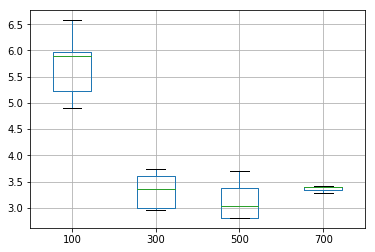

In [31]:
results_X.boxplot()

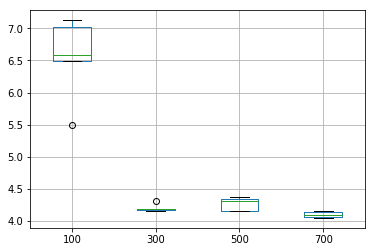

In [32]:
results_Y.boxplot()

Comparing the results above, YRMSE is minimum at 700 which can be by chance as in the plot a slight increase is visible after 300 epochs. So, if XRMSE is considered it has lowest mean at 500 epochs but then YRMSE has a high mean as compared to 300 epochs. Also, the standard deviation is high for both XRMSE and YRMSE at 500 epochs as compared to 300 epochs. Since, YRMSE is of more importance, 300 epochs is chosen as it shows good performance (mean and standard deviation) for both x and y coordinates. Moreover, 300 epochs are easier to train as it takes less time.

The mean for XRMSE is continuosuly decreasing over 500 epochs and has a minimum mean at 500. But for YRMSE, the mean is minimum at 300. Here, YRMSE is of more importance as a hyperlink covers more space horizontally as compare dto vertical space. So, the model will be trained for 300 epochs. Let's see, if the slight increase over the epochs can be decreased by using a dropout.

In [ ]:
# import pandas as pd

# def scores(e):
#     RMSE_Scores=[]
#     Ytest_RMSE_1= [56.08689974000355, 32.35579258615925, 24.90625819617273, 20.25157731601141, 17.526180808090768, 16.066119989369657, 14.819295854495456, 13.75784070331736, 12.888988568005765, 12.2249742233511, 11.773478369355603, 11.38648921565637, 10.951193859169404, 10.48070629557659, 10.007925908161706, 9.568828946491447, 9.192728517476146, 8.872542967861715, 8.577078805177878, 8.312102794919575, 8.071889476382609, 7.864152300321281, 7.68674267854792, 7.528399603163086, 7.378558246038392, 7.234831480713649, 7.101147679157242, 6.980380495159254, 6.871580846083795, 6.768569097623764, 6.667865536939214, 6.574431715659602, 6.494862209805599, 6.428242479520781, 6.368065061496265, 6.3105447653541935, 6.254838385757411, 6.202775090757588, 6.154169497277193, 6.108655988139225, 6.068589393706542, 6.037974979367966, 6.0120146416175855, 5.990141148117224, 5.957713567542244, 5.901953434624049, 5.82614424112198, 5.754248749094567, 5.714357867466073, 5.719095357092436, 5.760365497907734, 5.814909038138763, 5.855270742837415, 5.866729266785837, 5.852316408603734, 5.821319438834109, 5.7814191976056, 5.735245713397454, 5.684082380316485, 5.629725118171898, 5.574519278646462, 5.522863151278284, 5.4706790657768245, 5.41912346689624, 5.369490892624205, 5.3260408791393035, 5.295200879233835, 5.282508463695083, 5.291118915106769, 5.313779595441696, 5.329348805450341, 5.3138499920998665, 5.263881726606696, 5.193832598041187, 5.122131889323507, 5.0563263729038965, 4.985517446255111, 4.900582421383697, 4.810403489854004, 4.733732667522585, 4.680743080258188, 4.6504372451780345, 4.639201126171651, 4.641392354720492, 4.685450041930669, 4.673970545814931, 4.650332937758474, 4.61908996361731, 4.5834657191988155, 4.546049413370598, 4.508000854752371, 4.470003922887869, 4.432453341179294, 4.3957535727174255, 4.360495553110189, 4.327089839467369, 4.295939882597718, 4.26710112912669, 4.240577647109465, 4.216511916192403, 4.19488420443958, 4.175550194623677, 4.158618776126466, 4.1440474566147145, 4.131632811232334, 4.120439762332958, 4.106606652714623, 4.0802076480313065, 4.0079928421623805, 3.959036739665144, 3.912463229397248, 3.8769388664571243, 3.850384118525588, 3.827810079695449, 3.804781722745644, 3.779088715145873, 3.7509506666170433, 3.722572266491268, 3.6966143174021493, 3.6743692833086548, 3.655576927653671, 3.638828733525755, 3.622206570604152, 3.6037937280435406, 3.5822588879037895, 3.5575377528433867, 3.531536563049501, 3.5094099099135545, 3.4996993288733136, 3.509494149272517, 3.536525986817917, 3.568819714281394, 3.594840373798924, 3.6126386360766696, 3.614341994639434, 3.602432363491147, 3.580363819441346, 3.5526304350755518, 3.525056496773524, 3.5022604098357375, 3.4854998783464004, 3.4733404833485952, 3.463444699138032, 3.4542261653310664, 3.444768844104433, 3.435073341346321, 3.425773059364179, 3.418124601840217, 3.413082883881517, 3.4110888473800802, 3.411807513792817, 3.4148154670087867, 3.4196637135968104, 3.426096164416913, 3.4342791718513164, 3.4444060158551877, 3.4562483441828156, 3.4713549043842487, 3.4890495624680065, 3.5071833539186117, 3.518541281929543, 3.5039098419521437, 3.4370423122956857, 3.3428135320310486, 3.2945252463782584, 3.3322134874493066, 3.3796554576213045, 3.414722896231905, 3.433658906334463, 3.4346991786004053, 3.419060497923662, 3.3937710078339114, 3.3700104494234933, 3.3563605395798635, 3.352499280648771, 3.3529590483496046, 3.352723645371395, 3.3472425164614754, 3.3284059324516053, 3.281373250350072, 3.202683264592074, 3.1352941527226057, 3.1078276628754447, 3.0998207421834927, 3.097800757613152, 3.0975417576807653, 3.0980170210392814, 3.1004779534918034, 3.110103209468666, 3.1347020506679706, 3.163896084040543, 3.1776777150694775, 3.1787321202240495, 3.1758148079079382, 3.172792836563064, 3.1707124525469874, 3.169690112817543, 3.1696130764773383, 3.170230475897688, 3.1715558317077672, 3.1734813817579055, 3.176098530373716, 3.1795534511940873, 3.184158955421396, 3.1904118779492987, 3.1991237174128844, 3.211318963255342, 3.227871458666049, 3.2462329283273164, 3.2494354010406163, 3.211841015130523, 3.1853451557548143, 3.1824390821286057, 3.1792087158618374, 3.1759052052366687, 3.173496862881825, 3.171752650833327, 3.1704914011297056, 3.169515997919475, 3.1687365914924506, 3.1680738343400767, 3.167501059107158, 3.1669902695773913, 3.1665437584286815, 3.1661577775267133, 3.1658334340274443, 3.1655701575821267, 3.1654044675392314, 3.1653412758709707, 3.165393480112201, 3.1656628135560285, 3.1662316620134683, 3.1673702205676175, 3.169737940710819, 3.1749771519826524, 3.1870677451120586, 3.2141796954248503, 3.2431445278248665, 3.2324161333845653, 3.215532015779682, 3.210725680015442, 3.2101077538168084, 3.210769092689228, 3.2124482984831926, 3.2153513163161165, 3.219707675256609, 3.2258832664720107, 3.2343513586940404, 3.2457798453430735, 3.26112681808537, 3.2815925956574854, 3.308546308761806, 3.3426624975589183, 3.380998321562004, 3.4118534574221577, 3.41592558495821, 3.394852814602831, 3.383329950233924, 3.399440045483929, 3.441924692432299, 3.5030404640411694, 3.5488075727411372, 3.5364052240413995, 3.4481518178454125, 3.3509529534793283, 3.303095329475832, 3.28700587609267, 3.28234170240374, 3.281888458450752, 3.283439017589918, 3.286106414516245, 3.2894317564972826, 3.2931348378104413, 3.2971422078867714, 3.3013405022269176, 3.3056131082355984, 3.30992610656403, 3.314251070241662, 3.3185645320513317, 3.32278689799625, 3.3269869946301247, 3.3310791465630274, 3.3350724841138746, 3.338989244239325, 3.342787590794893, 3.3465038972623478, 3.350088797471977, 3.353536880070894, 3.356913060951468, 3.3602085095212004, 3.3633705328925068, 3.3664596764719676, 3.3694549017681217, 3.372375643277226, 3.375205627350714, 3.3779963439121508, 3.3806865491278324, 3.383365036125481, 3.3859954225076794, 3.388626802582125, 3.391187501153777, 3.3937251703962374, 3.39624107340417, 3.398777009014047, 3.401298305423439, 3.4038300254324425, 3.406324058508622, 3.408858388272518, 3.411407998942847, 3.4139587137490843, 3.4165053702767536, 3.4190690137456823, 3.421676875047829, 3.424260770597754, 3.4268766267160444, 3.4295018400935944, 3.4321195180898862, 3.434760775451239, 3.4373517956108515, 3.4399893728314384, 3.4425929573494383, 3.445200456290168, 3.44778809940022, 3.4503586875128573, 3.4528916119943993, 3.455386884139457, 3.4578602930963727, 3.46031923694505, 3.462694283494451, 3.4650202561240784, 3.4673526882997696, 3.4695867439530996, 3.4717521504976854, 3.4738822497927258, 3.475864388342271, 3.4778573479995183, 3.4797589291067554, 3.481549390592239, 3.4832497316517066, 3.4849098215619456, 3.486419612081817, 3.4878675650860025, 3.4892252637992467, 3.490515419250341, 3.4917228380437337, 3.4928327612303542, 3.4938953233903125, 3.494927649916724, 3.495926087980505, 3.49687459374783, 3.4977937414702462, 3.498711239996016, 3.499643397079859, 3.500604112228021, 3.5016117562622497, 3.502776967961731, 3.5046264391729367, 3.5062435381574666, 3.5082384078189865, 3.5090676029252816, 3.5005704936035382, 3.4742311330342073, 3.459649541190091, 3.4590952521328067, 3.461055409113194, 3.4635305946620716, 3.466077448552666, 3.468547098720763, 3.4708408005433697, 3.4730092227575655, 3.474981986606978, 3.4768417993630747, 3.478555958638925, 3.480188850479706, 3.4817398557581902, 3.4831700957255154, 3.484595555520885, 3.4859628551418584, 3.4872956604232206, 3.4885950763130475, 3.48985808080191, 3.4910930620185803, 3.4922917252586765, 3.4934428127751245, 3.494511260464717, 3.495464557113933, 3.496277541891234, 3.49690110358677, 3.497285218966408, 3.4973640720695665, 3.4970948635517822, 3.4964311132390313, 3.4952692049555765, 3.493593061313756, 3.4913307901709167, 3.488370122769888, 3.4846635861439816, 3.480123517141182, 3.47502317404828, 3.4702241287905466, 3.468208906865712, 3.4737503263377385, 3.487702746507571, 3.504291853837192, 3.518059317061244, 3.5306103938551066, 3.5424969731859206, 3.5526433895017098, 3.559139051492232, 3.5614581945500086, 3.5616711656680504, 3.5623430200353887, 3.564317448024506, 3.5675205610205514, 3.571764715572888, 3.5769347637674422, 3.5830505959205463, 3.5900653626349244, 3.5978340275920804, 3.605771503689752, 3.6128803308497504, 3.616274547594779, 3.613723044209188, 3.604744463726388, 3.592138108545157, 3.579662254079921, 3.5698870347436955, 3.5627705507244576, 3.5578602261205585, 3.554650096312222, 3.5526723848436195, 3.5515965512123824, 3.5512185664155234, 3.5513474964095937, 3.551876547115341, 3.55266603104214, 3.5536564874583902, 3.5547914212857963, 3.555943185685961, 3.5570731727564104, 3.558105245902534, 3.558986498263767, 3.559618487343922, 3.5600266720888833, 3.5601533702974444, 3.560001618431516, 3.559603084944958, 3.559012523418691, 3.558250351785802, 3.55740959481336, 3.556528596084537, 3.555632023773121, 3.5547951164893825, 3.554010554654591, 3.553265080890786, 3.552620083909353, 3.552051303913299, 3.5515538054175484, 3.547859517488337, 3.5445997733985593, 3.542328251586518, 3.5407134556798163, 3.5394675964141045, 3.538564300448766, 3.5378843016410775, 3.5373919228976387, 3.537048038345242, 3.536825592049061, 3.5366758424045934, 3.5365910941729166, 3.5365460869987753, 3.5365211486029287, 3.5365102269833297, 3.5364666399312448, 3.536401285614652, 3.536321577201384, 3.536188153495374, 3.536018972555117, 3.535812850869777, 3.5355613701362403, 3.5352684972001343, 3.5349712133818296, 3.534640359418346, 3.5343020672665917, 3.5339582485125365, 3.5336001154098935, 3.533257035336926, 3.532917129664125, 3.5325667004109906, 3.532261797712182, 3.5319383983520893, 3.5316374506653774, 3.5313412564869475, 3.531070620012108, 3.530791373547139, 3.530532265198602, 3.530283902137756, 3.530024832222461, 3.529774641107693, 3.5295272382818137]
#     Ytest_RMSE_2= [28.332400843079405, 20.124244750716304, 17.37566618376386, 15.943593900880083, 15.096514712956877, 14.470535797960983, 14.053466422908958, 13.587535763717492, 13.106881399516226, 12.567783477358981, 12.114025731988036, 11.748216912607807, 11.417813972306089, 11.164349912122503, 10.87216631740487, 10.52682542776297, 10.210262831882549, 9.932309597747818, 9.680593251742408, 9.44722232338607, 9.23691259405819, 9.038448123000256, 8.81817822340003, 8.596069229785702, 8.429621138206764, 8.29432731356483, 8.151338497112784, 7.999185045411749, 7.885511516766882, 7.808034067461683, 7.710966543304166, 7.5854038430771045, 7.43313435176966, 7.289375922896436, 7.183232110285918, 7.122053254445606, 7.088450353606863, 7.0424707453377255, 6.951811921897097, 6.823898886237038, 6.693587666427146, 6.5753503966274405, 6.4617547439260985, 6.3454796648762715, 6.235054960402723, 6.14841065169388, 6.094287901598977, 6.069779338853599, 6.067935596654911, 6.080967227324574, 6.101788323787335, 6.125554257223634, 6.149823941697462, 6.172592639003384, 6.194328977539903, 6.224069361591047, 6.232188326614055, 6.204481206218405, 6.155111778467056, 6.106351676416139, 6.076941861452188, 6.073756902727445, 6.090749398061771, 6.112006101070418, 6.120123279419689, 6.1099042164149395, 6.090065558839053, 6.066675527563445, 6.030228609421384, 5.963923564158465, 5.856751206458062, 5.708486148198486, 5.542272460057888, 5.3956769614066245, 5.28943591752458, 5.217904559081347, 5.167516199591733, 5.129283563872022, 5.09958694039204, 5.0760051009661105, 5.056554643228049, 5.040025360531121, 5.023998817493865, 5.000703367488935, 4.9800501446142285, 4.959053312137732, 4.937698723407752, 4.9160689202780015, 4.894758149209105, 4.8737569621285814, 4.853165008333818, 4.8331075090693325, 4.813639541558512, 4.7956602481547055, 4.776470625693316, 4.757721721201448, 4.739558747950129, 4.721997267354792, 4.7049825526845455, 4.6883928966302095, 4.67211699610733, 4.655005396085231, 4.637934556856293, 4.620848433511693, 4.603714923370931, 4.586478494834725, 4.569085851669967, 4.551496778401511, 4.533739402721913, 4.515751100625747, 4.497606819790848, 4.479312246189572, 4.46078761546968, 4.442109589644387, 4.423395860562989, 4.404674575012351, 4.386014450291125, 4.367375197544082, 4.348757997328916, 4.3278659304928215, 4.308167393554231, 4.288722992114339, 4.269407736913029, 4.250274274102416, 4.2311723072759415, 4.21203697834851, 4.192842761720914, 4.173463654646143, 4.153938536083104, 4.134258783396971, 4.113314019721676, 4.0916762194455885, 4.0703393750101275, 4.050363285390491, 4.030220869668775, 4.009727937957066, 3.9890520924637083, 3.968224779875144, 3.947294618355736, 3.926381381032325, 3.905466735351548, 3.8845978941981714, 3.8637892072542948, 3.843101095376489, 3.822705486701721, 3.8029104752164753, 3.7843668948670564, 3.7679932485006327, 3.7544027275786975, 3.740806381322929, 3.720389075933914, 3.6897518544598245, 3.6558067126049574, 3.6299191800982897, 3.6143614603912178, 3.615165866417122, 3.621062372674771, 3.6309704787648878, 3.642250989409858, 3.651432917487244, 3.6553335487704235, 3.652730621471032, 3.644299016905952, 3.63186093457285, 3.6171043535566176, 3.6017918231131536, 3.586903106865476, 3.5730109157468632, 3.5603625468944804, 3.5441175051458726, 3.5301213062383785, 3.516806860767563, 3.50476766789133, 3.4944164652428733, 3.486147976061516, 3.4800030067833307, 3.476216220556223, 3.4748552498280016, 3.476207721207912, 3.48088303703869, 3.489542365170425, 3.5041370600955664, 3.527132001419609, 3.560985562367064, 3.5990515152415004, 3.60059122245884, 3.5534760363242155, 3.51575911721158, 3.48169380277387, 3.45449323514265, 3.4411767526483867, 3.4386569688036497, 3.4428521285973854, 3.4500937277005006, 3.457867547109406, 3.4658771233491046, 3.4742699415745593, 3.4830916361077913, 3.491553429890292, 3.4840252566718, 3.4810760544230828, 3.4789716929062795, 3.4770206911246633, 3.473634892911588, 3.467640296959907, 3.458400394916751, 3.4456772498681736, 3.4291035474693135, 3.4087700852735883, 3.371816105266205, 3.3208253964673315, 3.2702112659641376, 3.2284334771281546, 3.220191027439311, 3.2535777004528548, 3.2952283009116803, 3.309161192967361, 3.305577502735305, 3.299510422837624, 3.294776454341466, 3.2922527034167177, 3.2912898934244166, 3.2910917416633376, 3.2909270814637606, 3.2900825877522646, 3.2880646289029785, 3.28442628188737, 3.2791263259601826, 3.2728847656815154, 3.267156715509186, 3.26250843995056, 3.260108827329578, 3.2597480369599934, 3.2604889254526537, 3.2617600447232564, 3.262981187495381, 3.264041063389126, 3.264835490293122, 3.2656039914054658, 3.266047696780171, 3.2662138301789767, 3.2664443274086694, 3.266374309924356, 3.2663360638517154, 3.2663314739370817, 3.2664494110466054, 3.2667773125016994, 3.267550887131719, 3.2686109948779767, 3.2697747558441987, 3.271396082274007, 3.2732208743557507, 3.275278252338288, 3.2775756894106287, 3.280054553407012, 3.282717118523079, 3.2857281448271327, 3.2887734444493555, 3.2920556202757445, 3.295683062888751, 3.2994009121701913, 3.3033244922227554, 3.3073766051675877, 3.31189398054566, 3.316459379282482, 3.3212116011401402, 3.3261951562256287, 3.33114730303442, 3.3363369887928895, 3.3416960587951032, 3.347187736894864, 3.3525510360444133, 3.358092952381651, 3.3635988977010967, 3.369063029255048, 3.374588771681472, 3.3800842872811248, 3.3855055664690146, 3.3908789338254275, 3.396312368386262, 3.40183534718396, 3.4072583806982353, 3.412756951894046, 3.4182911345559535, 3.423867271051345, 3.429460097905404, 3.4349019912921834, 3.440475549334211, 3.4458580657267053, 3.451325572248425, 3.45810186963402, 3.4626040244727503, 3.4678711690144604, 3.4734256436251982, 3.4791287095546135, 3.4849672093255446, 3.4910216341257536, 3.4971360311121993, 3.5033488989501738, 3.509605150421053, 3.5159574942781973, 3.5224729023421846, 3.529001798404707, 3.5356335961920466, 3.5423760786700176, 3.5491887310217414, 3.5560269794946153, 3.562925444331158, 3.569746618109358, 3.576536943915776, 3.583135026993719, 3.5894269657723643, 3.595488532126821, 3.601044505304843, 3.6059539567796888, 3.610216452322776, 3.6138400243726148, 3.6168897275617455, 3.61942259003905, 3.6211145254547064, 3.6235227446578557, 3.6258114073354712, 3.6282230755090845, 3.6309150020365633, 3.6338386741237034, 3.6370087059738903, 3.6402616845648508, 3.6436424764573228, 3.6469956907576746, 3.6504040793992267, 3.6537645643527057, 3.6570410429768674, 3.6603041812981862, 3.6635738840316208, 3.6667531113509577, 3.6698999356084996, 3.6731244017967692, 3.6763212116888826, 3.679415019509698, 3.6825854985778497, 3.6858453287789947, 3.689082261269964, 3.692371735533338, 3.6956535233896317, 3.699007728216823, 3.7024039218847795, 3.7058598798450726, 3.70928952603535, 3.7127185491031316, 3.71628815473589, 3.719780450721598, 3.723333446539673, 3.7269393959078165, 3.730505190494939, 3.7340843502777674, 3.7376780629196156, 3.741378069855186, 3.745159915514083, 3.7489723171624663, 3.752992119744275, 3.757268185842969, 3.761826777684986, 3.7668498232053276, 3.7722483289194195, 3.7783482945925266, 3.783835366858687, 3.7839663751388035, 3.763957356800388, 3.715633809671611, 3.6832741286079966, 3.6740410290679932, 3.6682364352076537, 3.662568862345665, 3.657460195164247, 3.652974719316111, 3.6489451849688805, 3.6451291086315716, 3.6415743829324256, 3.63811607422123, 3.634736638245982, 3.63144085584926, 3.6281728782262817, 3.624881098692626, 3.6216241300083536, 3.6183184740990098, 3.615011321891929, 3.611593582079523, 3.608100860509145, 3.6045099614813534, 3.6007479062039525, 3.5967843008831824, 3.5926198563658787, 3.5882217010868533, 3.5836129319306402, 3.5788369525989348, 3.573852858285724, 3.568745608408174, 3.5635331127557492, 3.558324952847994, 3.553056563843296, 3.547875581169454, 3.5427770807584333, 3.537742490645404, 3.5328646501159255, 3.528206856751924, 3.523725366645235, 3.519496562776555, 3.515565335779549, 3.5119463482592472, 3.5086521906131822, 3.505708244110618, 3.503002622751941, 3.500422228936217, 3.4977760115588605, 3.495107505382179, 3.493348118027343, 3.4931884597132203, 3.4918799242856102, 3.4921941457436683, 3.492273330101564, 3.4925815085208884, 3.4929592777168534, 3.4933393940069366, 3.4936979726482336, 3.4940285624019483, 3.494364780766294, 3.494765227134591, 3.4951756171771344, 3.4955914508659767, 3.4959462794946816, 3.4961824718055583, 3.4961838898118023, 3.495851135782144, 3.4951536944524326, 3.494633719182763, 3.4972541466686535, 3.5088081539636202, 3.5173718340744626, 3.521350280554716, 3.5248992710379277, 3.527954712760245, 3.5306311616456227, 3.5327680628862903, 3.534325343272816, 3.5356266125035067, 3.5370785630118777, 3.5389040146922373, 3.540979842437359, 3.5431570271248085, 3.5454033195929715, 3.547691438447296, 3.5499651716404976, 3.5522294171875686, 3.554446884958714, 3.556642331836868, 3.5587716483232676, 3.5608121666923016, 3.5627944122137785, 3.5646433336758916, 3.5664279340009393, 3.5680717518282195, 3.569608210690864, 3.570999329010671, 3.572278513408669, 3.573395635514109, 3.574272123435645, 3.5749270767567656, 3.5759697054028226, 3.581206688008475, 3.601994023997828, 3.6228219100720978, 3.6390364541368694, 3.685329834747526, 3.7219172933041196, 3.7302728799798066, 3.7224938359509254, 3.726358049369416, 3.7398400969091647, 3.7345360245359114, 3.723609498693058, 3.7044971521796897, 3.6828300911492806, 3.6624893457402163, 3.645037636913468, 3.6306457957138965, 3.619093611968564, 3.6099955417424527, 3.602992212919366, 3.5976615569006274, 3.5936736341307958, 3.5909557706673874, 3.5898625992381246, 3.5919028615877036, 3.600102970294904, 3.618136687357845, 3.642499875686098, 3.65471518156257, 3.647652000328119, 3.6356525886001747, 3.6256115237935074]
#     Ytest_RMSE_3= [63.80110204468955, 34.06354506207476, 25.477394677096846, 21.85345414215907, 19.655006427093078, 18.0282732610648, 16.678984015601223, 15.584895875314839, 14.6923297815164, 13.952144931946046, 13.302598327104354, 12.738817440325034, 12.239960678071647, 11.792174620769442, 11.388143239091642, 11.022388466800317, 10.687094273253805, 10.361533290322999, 10.056904370667223, 9.76760081884894, 9.49330938782071, 9.231949710440723, 8.982800603421177, 8.746909788524816, 8.522249616365864, 8.309014578007606, 8.105541260119779, 7.911565086182795, 7.727926834272392, 7.555166373657648, 7.391329710173117, 7.2397583438298945, 7.094091472657419, 6.952608839341415, 6.814351783575043, 6.681124949558275, 6.55631726100678, 6.441728878211394, 6.33611148822285, 6.243327910985912, 6.155747801456799, 6.076736415385099, 6.006048893406584, 5.9429716938076185, 5.898273209545131, 5.850949215625472, 5.811052515253253, 5.777800197501614, 5.74894767754661, 5.7234712552585325, 5.703985574041932, 5.6962893698368795, 5.706403999086195, 5.735717102135301, 5.773938565027581, 5.802149284568802, 5.79759188249713, 5.748215926434765, 5.6543924314131715, 5.530224242701947, 5.388207385638175, 5.241032037357488, 5.102006109532002, 4.982943387840056, 4.904352720926656, 4.831891875844009, 4.7705111247489, 4.711262755797389, 4.6516343367049515, 4.593971195206011, 4.5424281577828864, 4.488253028825776, 4.452481373962797, 4.421918132849169, 4.39320095453272, 4.3665984375671165, 4.341140862052853, 4.294043166749991, 4.262690537941786, 4.226893857044089, 4.187555249173904, 4.148330960315496, 4.111656888651393, 4.077869962370704, 4.0468142991275435, 4.018640755105634, 3.993387313508085, 3.9702789295582512, 3.947157057481562, 3.9210463536284466, 3.8903200605126584, 3.8544525500944045, 3.814999056083167, 3.775690786826332, 3.7406812405678687, 3.712152387571745, 3.6887422330575363, 3.667131652880592, 3.6446293542631074, 3.620434323643703, 3.595130301818775, 3.5697595607674364, 3.545200242332942, 3.521881803769341, 3.4993556545611604, 3.475889067178245, 3.4489801202968504, 3.4175380094325765, 3.384210119251538, 3.354275985507147, 3.3308272486041957, 3.312455826423813, 3.296024463101182, 3.279722396426254, 3.263364975050762, 3.2473750597394258, 3.232095210863919, 3.2176063546196327, 3.2039063159313748, 3.1909732188332742, 3.1788166950195302, 3.167494519235289, 3.156650524875637, 3.146529081477971, 3.137150113322292, 3.1285894116845814, 3.1209647658508124, 3.114448657007104, 3.1092060045916505, 3.1052460404346443, 3.1023879656927766, 3.1002108605709147, 3.098344924524872, 3.096521899129417, 3.094658548447611, 3.0928067619597774, 3.091085379074765, 3.0896406683442974, 3.088550934890914, 3.0879038912572585, 3.087746381139947, 3.08813285430333, 3.0890824021362064, 3.0905772421712046, 3.0926468721475247, 3.095260746849591, 3.0984217682639206, 3.102078793489559, 3.1062550595843748, 3.1109143122174308, 3.1160162441963632, 3.12152578788739, 3.1274184302241133, 3.133672205218023, 3.1402329602671233, 3.1470800859080983, 3.154148325097353, 3.1614189338988674, 3.168841309400153, 3.176379375827236, 3.18398790626211, 3.1916174645352933, 3.199248147796467, 3.2068598283832346, 3.2144440521764235, 3.2218709565521193, 3.229203063589548, 3.2364198218434805, 3.2434521622019994, 3.2503419392701804, 3.257054484492806, 3.263549555293327, 3.2698617988062098, 3.2759675539442936, 3.281872695112659, 3.287562300551106, 3.2930237680299554, 3.298336374885084, 3.30342659559156, 3.3083142358852133, 3.313035083828337, 3.3175438434832585, 3.3219309628801494, 3.3261305575696727, 3.3301916756656884, 3.3340987586996165, 3.337893471611373, 3.341563830007245, 3.3450912858891444, 3.3485551024967193, 3.3518965224790636, 3.355185663915188, 3.3583743409247337, 3.3615152052399475, 3.3645605622516723, 3.3675459763507183, 3.3704888675109226, 3.3733907045041276, 3.3762201705816075, 3.3790217657298585, 3.3817753301235105, 3.384470166170464, 3.387135243957643, 3.3897812151656845, 3.392332005486187, 3.3948926151709027, 3.3974151391706053, 3.399870191980236, 3.4022970869365676, 3.404688140324147, 3.40703263056702, 3.4093375918246127, 3.4115982757304986, 3.413819449268124, 3.4159850098831055, 3.418124342912044, 3.4202074209231252, 3.422249483271741, 3.424261035810086, 3.4262084265226305, 3.4281386701364176, 3.4299947858092086, 3.4318231441343903, 3.4335780892509367, 3.4353304734190657, 3.4369950374864127, 3.438607429360816, 3.440182926538112, 3.4417261844571696, 3.443196653094172, 3.4446390322882308, 3.4460037051559267, 3.447341240489254, 3.4486196592761296, 3.4498482374018775, 3.4510161134726816, 3.4521429751285564, 3.456213068409394, 3.459532657577028, 3.4618751890235333, 3.463502306936715, 3.464644864030435, 3.465469718748325, 3.4660886312338732, 3.4665402514202768, 3.4669357374250858, 3.4672539440830596, 3.467523755042585, 3.468347633453667, 3.468639165887835, 3.468843466994004, 3.469054013555629, 3.4692136229460395, 3.4693836536597407, 3.4695099853604763, 3.4696340386645605, 3.469722954257746, 3.469808175427696, 3.469869971703552, 3.469903211665793, 3.469931001995243, 3.4699338066502263, 3.469914595446094, 3.469884138155933, 3.469827014332193, 3.469764975871963, 3.469681681104118, 3.4696010330484754, 3.4694978013818196, 3.469394589105194, 3.469268815593921, 3.4691400801561803, 3.4690117604825397, 3.468855863737227, 3.468700637095571, 3.4685383391024702, 3.46835196323519, 3.468171094695073, 3.4679831636100675, 3.4677934608889593, 3.4675982433871684, 3.4674072440487897, 3.4672103304707513, 3.4670162401791282, 3.4668201124742875, 3.466620250284953, 3.4664162426028478, 3.4662040674100156, 3.4660119195655064, 3.4658117834663913, 3.4656142244529993, 3.465415408209246, 3.4652005913170467, 3.465007454146787, 3.464802801068309, 3.4646002379961094, 3.46439736688684, 3.4641908721172165, 3.4639989701337095, 3.4638063763106888, 3.463600702067479, 3.4633972556939883, 3.463212572675017, 3.4630136346964813, 3.462810063829031, 3.4626377328691422, 3.462444904534755, 3.4622749245385327, 3.4620867175652172, 3.4619135278812374, 3.4617584268529322, 3.4615941731361843, 3.461435425715527, 3.4612919238802116, 3.461163461700426, 3.4610369404128316, 3.4609165759584526, 3.460817544531326, 3.460722235968503, 3.4606394461103216, 3.460582943290865, 3.4605233190615046, 3.4604944181176065, 3.4604732694701545, 3.4604814450648083, 3.460488818769071, 3.4605205387328413, 3.4605785605996577, 3.460659359533052, 3.4607526996056763, 3.4608637128674693, 3.4610117702629872, 3.4611766950773086, 3.4613596305518812, 3.4615706008451594, 3.461808991742084, 3.4620763070111997, 3.4623721555272637, 3.462692435071597, 3.4630384066197086, 3.463406388084373, 3.463818388866647, 3.4642616957399937, 3.4647272368510778, 3.465225354510881, 3.4657696939353286, 3.466326875096206, 3.466936577182864, 3.4675694394794836, 3.468241116191707, 3.4689339250723874, 3.4696701601177486, 3.470440326460239, 3.471239470707117, 3.472085279399202, 3.472950425927483, 3.473840360898294, 3.474777333203254, 3.4757359060876225, 3.47672151060064, 3.4777361182301845, 3.4787788451597255, 3.479845445680908, 3.4809327624328126, 3.482034298485926, 3.4831678467601397, 3.484297835897524, 3.485458808695614, 3.486605410225828, 3.487771765609011, 3.4889512780105374, 3.490122108239475, 3.491301216639153, 3.492475224514484, 3.493636769195709, 3.4947858195243016, 3.4959353326331493, 3.497065582916351, 3.498176952189785, 3.499280480562929, 3.5003562182714294, 3.5014076651140282, 3.5024396103164355, 3.503455908445695, 3.504451773870361, 3.505403773389944, 3.506341557385608, 3.5072458446650123, 3.508134351625088, 3.5089954074236847, 3.5098121266026503, 3.5106271336082355, 3.511398997163159, 3.512158362548827, 3.5128799597648905, 3.5135816527747843, 3.5142720312432214, 3.514925651941188, 3.515576379064781, 3.5161971698774575, 3.5167945933267286, 3.517391694805725, 3.5179534666948875, 3.518505972282305, 3.519036216504968, 3.51954964272948, 3.5200475174515824, 3.5205332966203637, 3.5209835062303614, 3.521427905990047, 3.521840678204097, 3.5222404575642066, 3.5226076617060498, 3.52295942205284, 3.523290797730484, 3.523591072375083, 3.523876978688994, 3.5241369980616617, 3.524384617033952, 3.5245939194135536, 3.524772460935629, 3.524937029749595, 3.525076838968424, 3.5251887566995572, 3.525290375360608, 3.5253524677678207, 3.5253813577643616, 3.525386388648233, 3.5253568529167763, 3.5252810524528155, 3.525164348851103, 3.5249922734447217, 3.5247064551576437, 3.524311676919279, 3.523727785873823, 3.5228386605261788, 3.5215737256369346, 3.5199502222837213, 3.5181753479418347, 3.516494069383853, 3.515031071313545, 3.513849033446501, 3.512939472405219, 3.512288093484747, 3.511870279451185, 3.511668488314278, 3.511697556352831, 3.511991671141412, 3.51258126945557, 3.5135146212209865, 3.514830019582519, 3.516561416731432, 3.5186949934440164, 3.5211485985952, 3.5237581750543514, 3.526308942835336, 3.52853585227386, 3.530279101370655, 3.531485133040087, 3.5322058474486435, 3.5325710451357977, 3.5349670112833977, 3.5369911770285487, 3.5375670824462966, 3.5375317610092147, 3.537253406564477, 3.536854923898612, 3.536409163155435, 3.5359389013652556, 3.535461340053329, 3.5349933978309425, 3.5345337185851844, 3.534086522401937, 3.5336614567499267, 3.533260526821596, 3.5328757484553814, 3.532514269304481, 3.532170920057227, 3.5318574641388234, 3.5315621628312313, 3.5312792605740486, 3.5310266724793284, 3.530785150291752, 3.53055957578527, 3.530356010665904, 3.5301647157538927, 3.5299921685727145, 3.5298408067854785, 3.5297009761651688, 3.529565755672552, 3.5294567875420055, 3.5293487989309615, 3.52926145700325, 3.529185543971334, 3.5291252764593346, 3.5290704771450065, 3.529031935195813, 3.5290115542290854, 3.529004002838222, 3.5290142323832034]
#     Ytest_RMSE_4= [62.883228362014705, 26.81771601653202, 22.263996857552645, 19.625560698602474, 17.7159666855468, 16.388869729010835, 15.347152236094225, 14.337334843785934, 13.617939977236551, 13.071131698553016, 12.617883005840506, 12.183914505080521, 11.815209160432158, 11.487063905942097, 11.197964257288438, 10.926116359519884, 10.705300062545456, 10.513586072249758, 10.310865732554877, 10.134512869030685, 9.996330955812894, 9.863163289671038, 9.663284410445454, 9.401965472869193, 9.167647531275316, 8.989556258563567, 8.834185588223248, 8.689073014411024, 8.592768950071871, 8.537627932830658, 8.470764676818497, 8.41726126890704, 8.425842324070345, 8.475478221714697, 8.518249958037604, 8.536246516273186, 8.534276695993233, 8.50990770335165, 8.451627938223625, 8.360777503073333, 8.252612605858396, 8.14800059063605, 8.061997870479532, 7.996239843081843, 7.939448093490272, 7.90790402303685, 7.889585497853037, 7.878320631082008, 7.82534315520197, 7.684192270501655, 7.480540376379105, 7.291750838919336, 7.165342549509066, 7.108416493072601, 7.09816030944992, 7.091925783699314, 7.0517880017297525, 6.949646126968631, 6.803018147069528, 6.650292913898364, 6.520619640125426, 6.419253874797818, 6.337801591713735, 6.272119042806044, 6.2208005834650955, 6.177625676620721, 6.131102212366662, 6.077076002355689, 6.0232724402143925, 5.978152058903267, 5.950337238980819, 5.94352421730961, 5.960441207776968, 5.946500251217089, 5.927060447702242, 5.906628190640476, 5.877558482303112, 5.842749838442019, 5.813094076547399, 5.79752681611997, 5.797803226001188, 5.808123179461883, 5.811038833496487, 5.817598101838036, 5.82114363033949, 5.818156174122341, 5.809387421858463, 5.797071408842511, 5.782549190653394, 5.7659130117504285, 5.747125682499302, 5.726844332758326, 5.706293904254274, 5.686994080562283, 5.670154065153503, 5.655786273186582, 5.643339958800902, 5.631925452247828, 5.6207635264570435, 5.60933802480416, 5.5974384231361825, 5.585456632304964, 5.572943336018766, 5.560427945491128, 5.548101488799494, 5.536209790874315, 5.5247934241900065, 5.513766694132429, 5.5029765065757985, 5.492307506992695, 5.481581108353735, 5.470686702891352, 5.4593509375818146, 5.447823617851345, 5.435870414207959, 5.423453990023572, 5.410613928856036, 5.397350076263961, 5.383672879593692, 5.369086004303797, 5.3537313868736796, 5.338024988792183, 5.321984231844913, 5.305632696968178, 5.2889988664717675, 5.272090367054394, 5.25467276696037, 5.237400810139077, 5.219982988078237, 5.202388573900301, 5.184600545215853, 5.166671436408463, 5.148602805111559, 5.130803284329308, 5.1139016297277555, 5.098132351843536, 5.081160014453442, 5.0623157764128255, 5.049058536012276, 5.042121080787805, 5.034046721508134, 5.017352329990695, 4.988137327080665, 4.9548184402108655, 4.927632642488101, 4.904840064185526, 4.884248278080162, 4.864399448852957, 4.845792150840427, 4.827644304508537, 4.809794877842046, 4.79218029764208, 4.77478796541167, 4.75756971308318, 4.74049767554333, 4.723619094132786, 4.706752941876981, 4.6898305325533105, 4.672830657925413, 4.655791194774323, 4.638669098409391, 4.621438988046752, 4.6040768141161585, 4.5865516471127235, 4.568888162661225, 4.551016022187169, 4.532948892727918, 4.514605439993702, 4.495988032637068, 4.477057385427278, 4.45779173654964, 4.438204873528798, 4.418288136663977, 4.398064209106718, 4.377605954390753, 4.356979908188544, 4.336265166522212, 4.31547721224815, 4.294742890922196, 4.274098671658947, 4.253496714364054, 4.233049298195874, 4.212735606961973, 4.19257688613792, 4.172552652033511, 4.152655853160537, 4.132911296371293, 4.113243661099056, 4.093685002249958, 4.074195850361769, 4.0547860575215875, 4.0354431605721865, 4.016098658034814, 3.9967860071643075, 3.977507130474657, 3.9581816863526766, 3.9388797319705207, 3.919568112391801, 3.9002089687171306, 3.880810933311978, 3.861425702436901, 3.841975462217982, 3.822487188097569, 3.802982650900667, 3.7834624619493344, 3.763970761702328, 3.7365010854756076, 3.7129685285436174, 3.6925024261005883, 3.6739051231449573, 3.6560625648141167, 3.63840478223568, 3.6206972354601596, 3.603109914126047, 3.585686290443003, 3.5684680216521514, 3.5515446332707112, 3.5348239708884255, 3.518385952538117, 3.502164922572822, 3.4862214641556917, 3.4705627024918346, 3.4552515399810053, 3.4402191226544696, 3.4255793232086393, 3.4112502710615997, 3.3972939004986893, 3.3836949807297647, 3.37054752085457, 3.357744973828888, 3.34534840833469, 3.333385857195439, 3.321836918005381, 3.3107472706551886, 3.300001802082781, 3.289722860294636, 3.279855075543121, 3.2704400496948707, 3.2614471169980828, 3.2528741269860126, 3.2447019265864827, 3.236922161239217, 3.229595124953316, 3.2226507225482264, 3.216128224919441, 3.2099042728992933, 3.20409294702024, 3.1986663232140926, 3.1935789981620037, 3.18883253542909, 3.1844142710173067, 3.180283627587451, 3.176538232376134, 3.173033966154465, 3.1698500126865548, 3.1669752334353825, 3.1643331852236023, 3.1620192575597903, 3.1599161069410604, 3.1581172026373867, 3.1565652281602246, 3.1553360296613704, 3.1543671064158803, 3.15361919926228, 3.153186728455103, 3.152990979632877, 3.1531249369628984, 3.1535122611886495, 3.1541477447811803, 3.1550662063443387, 3.1562439598217957, 3.157663833776509, 3.1593573607014553, 3.161274094685464, 3.16345283073511, 3.1658742490512433, 3.1684658719943637, 3.1712361103376807, 3.174222288691503, 3.177434213077834, 3.1807331743661447, 3.184119408000595, 3.187605520285218, 3.191214009475751, 3.1948607846969868, 3.1985148703037405, 3.2021897935140915, 3.205850507299239, 3.2095197659419954, 3.213121223296202, 3.2166288916089876, 3.2200755006805144, 3.2234883543887203, 3.2268041606548317, 3.229984666686659, 3.2330691673318013, 3.2361240573434027, 3.239070066479064, 3.2419576069398603, 3.244767070347792, 3.247529832766004, 3.2501995395332575, 3.252847397602304, 3.2554579467796128, 3.258007815431701, 3.260529280616905, 3.263929967190568, 3.266524686287051, 3.268887500796275, 3.2712408066678362, 3.273573045745837, 3.2760406211349298, 3.278446245024902, 3.2808899686169495, 3.2833182332901636, 3.285726959256774, 3.2881535574794145, 3.2905651544846726, 3.2929807559673177, 3.295378764098293, 3.297755791045059, 3.300073865755264, 3.3023855559632254, 3.304693171997364, 3.306959721879945, 3.309210274980807, 3.3113737616210144, 3.3135428841437897, 3.3156518876421734, 3.3177158953777033, 3.319748504007893, 3.321789359299001, 3.3237784996051323, 3.325710038304393, 3.3276225957888603, 3.3294782953009703, 3.331300660713624, 3.3331213023687654, 3.334889867148896, 3.336619009815303, 3.3383283865149784, 3.3399538523999173, 3.341565020633013, 3.3431551130487693, 3.3446751707599387, 3.346204721645975, 3.3476096206070967, 3.3489861207582106, 3.350320154743117, 3.3516158365411632, 3.3528000314241226, 3.353948232231779, 3.35497345550194, 3.3559563292330217, 3.3568357965173066, 3.3576248004103197, 3.358317625995358, 3.358902551499944, 3.3593827800647866, 3.359740468968293, 3.3599333741138984, 3.360041646085956, 3.3600003267237715, 3.3598161515635794, 3.359464180374041, 3.358933785472478, 3.358299542551893, 3.357463300506215, 3.3564938066728667, 3.3553616386019107, 3.354074724829473, 3.352648200358141, 3.351095522666039, 3.3494533816350396, 3.3477387318112966, 3.3459522450569192, 3.344130543347047, 3.3423811794591365, 3.3406851486404747, 3.3391266809274023, 3.3377162731367407, 3.3364989356251575, 3.33555063032191, 3.3348432057162913, 3.334412045756525, 3.334202588431498, 3.33425135179139, 3.334473001872232, 3.3348373800631355, 3.335322231001444, 3.3359944042605214, 3.3364852597173176, 3.3369112891501027, 3.3370741231623953, 3.336908822114471, 3.336292613980039, 3.3351394673250705, 3.333351136221615, 3.3311045272681192, 3.3281909989222425, 3.325165097845374, 3.322367820160545, 3.320261576896582, 3.3190564654898966, 3.318772205088023, 3.3193735850235537, 3.3209267907574276, 3.3237875580862655, 3.328712797827472, 3.336999427381304, 3.350266974629089, 3.3678228404172215, 3.3793540865183713, 3.3669061543435417, 3.3416086297253695, 3.331027669779052, 3.3356243188039123, 3.351402432977078, 3.379184093859492, 3.419742885609844, 3.4639637855558805, 3.481055260367811, 3.4540168056635463, 3.425619372251226, 3.417309992670084, 3.4184610701149083, 3.4231808138502524, 3.430160561012944, 3.439177144257491, 3.4502250789378155, 3.4631678122941127, 3.4772853506064143, 3.4907253488466767, 3.499886100713571, 3.500262576669769, 3.489109994550413, 3.4687462278220975, 3.445681205677352, 3.425644892545833, 3.4106328806221913, 3.4000100157913504, 3.3926284057189156, 3.3873042944284055, 3.383343854509851, 3.3802206701110884, 3.377701340771147, 3.3755531245959896, 3.3737396757351146, 3.3720916259503366, 3.370621827497199, 3.3692430929041715, 3.367985136898769, 3.3668079914915303, 3.3657228094807143, 3.3646895020141105, 3.3637048219589594, 3.3624629004986213, 3.364723388140502, 3.366125453782699, 3.366715171563463, 3.3668179969297025, 3.3666141341946054, 3.3662361189561287, 3.365749425651948, 3.365206557685956, 3.3646634690769837, 3.3641193442633464, 3.3636087533858334, 3.3631066841987565, 3.362631047879311, 3.362167651795365, 3.361726265617918, 3.3613147797009946, 3.360924167437107, 3.3605660952321417, 3.360213400905132, 3.3598900327133006, 3.3595733046981473, 3.3592881184650087, 3.359025702646164, 3.35875036340537, 3.35850410399283, 3.3582796938465362, 3.358064981071904, 3.357861427540314, 3.3576712580119294, 3.35750595377478, 3.3573388901737458, 3.3571855872327254, 3.3570429098062893, 3.356898762227562, 3.356759369198375, 3.3566648915123984, 3.3565339869132993, 3.3564556220523443, 3.356324887292913, 3.3562256478091723, 3.3561379918580823, 3.356031134511829, 3.3559533934199766]
#     Ytest_RMSE_5= [52.30644968082652, 30.352051861251812, 23.37698546764018, 20.660268349902896, 19.034870932310938, 17.760129801804858, 16.660163335228077, 15.71989721259903, 14.908943071347915, 14.192753325014303, 13.574319453412544, 13.040945474028462, 12.54772752930303, 12.068346924481952, 11.634500995370166, 11.241122876871906, 10.880624326152168, 10.55039751078353, 10.240760032081115, 9.956890791901833, 9.742395505518944, 9.595260303920279, 9.414280392083565, 9.165103815378558, 8.921347695446428, 8.719840347683615, 8.548173419275754, 8.377221794673176, 8.194906937508122, 8.02297616540397, 7.875621701515749, 7.751055541921533, 7.6541867543731525, 7.599881677717332, 7.5795075546111, 7.53924557666004, 7.43993397960903, 7.297900285838228, 7.17329956195118, 7.0958182149309685, 7.055987149045245, 7.070111552809536, 7.04241223973867, 6.979191708968612, 6.865433558839352, 6.753805159922447, 6.678190828523535, 6.6272264098080225, 6.581238701625697, 6.53670911134175, 6.492086596029293, 6.4476857991774805, 6.403386967358373, 6.361229210670224, 6.328951704643991, 6.311934470269175, 6.304013741561537, 6.298140141270676, 6.289762615211995, 6.275013139124787, 6.252839529792882, 6.2250608861284915, 6.195271449084889, 6.165315414833315, 6.166810858720715, 6.1525901176012825, 6.1286708316031255, 6.100223055056683, 6.071064362275093, 6.0427470274198205, 6.0156500075365384, 5.9893880473334615, 5.963538930804669, 5.937794617340366, 5.912026901524825, 5.886155910115903, 5.860105291958291, 5.833938545669135, 5.8077703915276375, 5.781681048783858, 5.755629276859176, 5.729675940444636, 5.7318027093299815, 5.710845526309957, 5.677053506644029, 5.6468876188972645, 5.622199396323966, 5.601581463092318, 5.582067422625164, 5.563825654255659, 5.5474641094682084, 5.53386557150478, 5.523971691100973, 5.518353624375641, 5.5164127390900655, 5.515606912707051, 5.5115310090596745, 5.497419833495201, 5.477601822205046, 5.458098235538395, 5.443602836706342, 5.435432427262834, 5.433061818642452, 5.433425402187889, 5.432317219908369, 5.425811497797788, 5.409964936995838, 5.389264810763699, 5.363025228858895, 5.335366915064049, 5.310063872203366, 5.288542227569179, 5.270884710747014, 5.256456691728465, 5.2444484339232975, 5.2340033335120575, 5.224698927732611, 5.215906905842349, 5.207202134125186, 5.198180062817938, 5.187987663314735, 5.175600822381434, 5.159499872616918, 5.137181194041488, 5.105413752232825, 5.0599879684013, 4.997482550337951, 4.919967741956432, 4.842086176977683, 4.785400793976898, 4.763985792347731, 4.7747322496396185, 4.790254603145097, 4.763132392709812, 4.69357422080794, 4.628212190887979, 4.592253266452515, 4.576135286268459, 4.556473459907051, 4.514532304011207, 4.483223110131727, 4.4633886963537845, 4.4991721830076665, 4.564757048968279, 4.62812948525426, 4.671967125402307, 4.693299012341118, 4.693875570058136, 4.678692234760021, 4.652954531413003, 4.62160793910313, 4.589669514389592, 4.560342986258787, 4.5345195256340585, 4.511542477887807, 4.490201592117494, 4.469406020764571, 4.449131599758912, 4.428911962707016, 4.4086004523866915, 4.388357344250182, 4.367891217464071, 4.347347471012946, 4.326486277654867, 4.3054512849864945, 4.284506512126425, 4.26342374159761, 4.242311269771916, 4.221222538140325, 4.200092799252495, 4.178800073018722, 4.157430293012737, 4.136121677622468, 4.114851756356362, 4.092081215779999, 4.078182711249154, 4.0635079791027, 4.046770459994215, 4.028834113065766, 4.010777010780651, 3.993533366457711, 3.9773928876799944, 3.9624062298791007, 3.94852181596757, 3.935493361152022, 3.9234396492721326, 3.9123785407437297, 3.9022359278706498, 3.8933066545904893, 3.8853995284006695, 3.878395080631776, 3.872286466253412, 3.866833882371129, 3.8620205662488627, 3.8576745938371073, 3.853581006878464, 3.849921297354125, 3.8465409721823556, 3.8431511068589423, 3.8398630219682746, 3.836541857266962, 3.8332579569318685, 3.8297239697720458, 3.826196793980628, 3.8225599746845944, 3.818878718764198, 3.815070341309838, 3.8110629061393175, 3.807019607533631, 3.802815907427872, 3.7985371541354307, 3.7941238969989004, 3.7896231281443447, 3.7852405138290806, 3.780588997882104, 3.776072718332845, 3.7714548996535098, 3.7669392460316584, 3.7623596973006084, 3.757784371881958, 3.7535025248078746, 3.7491135885504563, 3.7448262985691554, 3.740719185308524, 3.7367004446125884, 3.7328939957045533, 3.7290702521185226, 3.72555918268546, 3.722093928390443, 3.718980184713466, 3.7159796505756524, 3.713086154509008, 3.7105260908856894, 3.708094499763023, 3.705994551555366, 3.7038889936583903, 3.702263086586663, 3.7005777464190825, 3.699227786778466, 3.698089933438668, 3.6973390833404123, 3.6966316234576753, 3.696161522023817, 3.6958676628622524, 3.695735592499855, 3.6958401137762547, 3.696100294380942, 3.696607569359998, 3.6971506496793496, 3.697890619050662, 3.6988674285151353, 3.7000073914752885, 3.702745175289513, 3.705843596480133, 3.703737256587207, 3.7043645681610644, 3.707769214502322, 3.7104908543863835, 3.7117934417071323, 3.7131355594423403, 3.715371614388148, 3.7179194635295816, 3.720539062040633, 3.72287092750585, 3.7253856058171, 3.7279182998413924, 3.73055930219972, 3.7333294538769826, 3.7360378542229298, 3.7387433920903916, 3.7415381840700563, 3.7445580546083277, 3.7474012623877484, 3.750276534133391, 3.7532028488041096, 3.7561099023343782, 3.759026684588922, 3.7619425809433324, 3.764836053003056, 3.767632981603639, 3.7705857655028856, 3.7734207792901437, 3.77626568952295, 3.7790431970640106, 3.781678868095587, 3.784483230475373, 3.7871572492786014, 3.7896555963036103, 3.7922865068877076, 3.7947244038325496, 3.797212631996199, 3.7996238843248453, 3.8019596001152083, 3.804284514458396, 3.807134115334298, 3.8106889742789547, 3.8093362330789695, 3.8147101895363775, 3.814097486658012, 3.8174863323265567, 3.8182559649956467, 3.8208668557462624, 3.8220829531451, 3.8240920954592497, 3.8254913565936968, 3.8272131434844603, 3.8285464727536995, 3.830251757134349, 3.8313973832547075, 3.8328671854949126, 3.8339046519498567, 3.8352533364051844, 3.8359176586907506, 3.8372054119080805, 3.8371623187618513, 3.838246320214286, 3.8372239698306525, 3.837782963815941, 3.834193465023944, 3.8344554186421917, 3.822399323429892, 3.826800176488038, 3.7800421525290946, 3.8106160962377764, 3.638691352958731, 3.757196230372551, 3.4897918676988473, 3.65876565190294, 3.51085548190657, 3.6724727189312563, 3.5836066553994526, 3.7076667732935564, 3.6653176467190223, 3.734112339115817, 3.7032008345293006, 3.746758798183672, 3.72247402897365, 3.751954295659454, 3.725368470323447, 3.751446522694986, 3.726347657668591, 3.7518872857940475, 3.7239005260647318, 3.7518508575826486, 3.7200287033772934, 3.753256970366977, 3.713232345757777, 3.755238703265074, 3.702224222393016, 3.757656570293911, 3.671237127985483, 3.7610972574297175, 3.6373865705389044, 3.7537759389480367, 3.5935722191206394, 3.735348344976224, 3.5612926646019667, 3.7116833756851877, 3.5516126624535387, 3.6986413773520885, 3.57550952117664, 3.709988388778916, 3.6213460641580384, 3.728218780220755, 3.6640039043186228, 3.742166599059558, 3.685014842655163, 3.7478927727132576, 3.6925892058175998, 3.7499900738540184, 3.6903204867589614, 3.7510411495017624, 3.6815683115570366, 3.7523740602892204, 3.663281138722664, 3.7523474741785003, 3.6330768122231185, 3.7468768564386004, 3.5906724000208343, 3.7272235772394597, 3.5506188124945384, 3.6927232888504116, 3.529699534024348, 3.66256683587254, 3.5327584871964786, 3.658623326390449, 3.5759658482796257, 3.6870088164533477, 3.6416589898450247, 3.716432826198147, 3.680895362283314, 3.728098161941381, 3.6926219482659195, 3.7256559700155907, 3.6943301717588977, 3.7242646049242714, 3.6907298286653516, 3.7218438277344297, 3.684139016370441, 3.7209537194356184, 3.673027076873786, 3.7211025965004163, 3.6549205787626486, 3.721877548187513, 3.624397460444164, 3.7191941919909377, 3.578805451095996, 3.702893153010469, 3.532314017631601, 3.665278771509094, 3.509084829264915, 3.6241099830534638, 3.502421540091543, 3.5986801179511434, 3.510609361980612, 3.6072920616625606, 3.565545330977962, 3.6501705578862738, 3.631927806788684, 3.676422722338965, 3.656194705735819, 3.6757441555348374, 3.659438914216206, 3.6694318395126153, 3.6570033669110935, 3.663559091550051, 3.653789428445756, 3.6582905125020955, 3.6498621641751257, 3.6536707756867677, 3.645897149663198, 3.649247488012281, 3.6416168911232796, 3.6455444649231605, 3.637223721454905, 3.642245559995822, 3.632501045366, 3.6397701686278636, 3.626915137236128, 3.6388603301124953, 3.6190260651982196, 3.6410502078596063, 3.6051941800850287, 3.6498944039998507, 3.5731200447591234, 3.670708496961758, 3.5024946527777217, 3.678796546978008, 3.5136522478213537, 3.564592382937848, 3.426780158404918, 3.4625760495984554, 3.4192017698642747, 3.4071672150911234, 3.409076467825292, 3.4237842565781804, 3.4459997652411016, 3.4706280293519884, 3.4879060511391673, 3.5054711660909676, 3.5326449188972653, 3.5619008062029387, 3.5818687642193967, 3.5957381191460147, 3.6027299486142463, 3.5993124172899913, 3.5920848057671946, 3.5906846501863092, 3.592270695346203, 3.589943297160699, 3.585745586260508, 3.584568396295004, 3.584518138550056, 3.5826316382233085, 3.580554193604822, 3.579728728095307, 3.5791582046113355, 3.577605488608272, 3.57670693961139, 3.5760128781219884, 3.5754976387424326, 3.574283280360617, 3.5743760244562317, 3.5729914193266064, 3.574082237780411, 3.570587471004323, 3.576300858974882, 3.563751814971384, 3.589680100110085, 3.535167496669201, 3.6616844368908943, 3.594968205598088, 3.7215257480959476, 3.495270789627246, 3.486262553903935, 3.454037279584882, 3.4607803403004977, 3.4426825910607355, 3.421350395532096, 3.4262637911532803]
#     scores=[Ytest_RMSE_1, Ytest_RMSE_2, Ytest_RMSE_3, Ytest_RMSE_4, Ytest_RMSE_5]
#     for i in scores:
#         RMSE_Scores.append(i[e-1])
#     return RMSE_Scores

# results = pd.DataFrame()
# epochs=[100,200,300,400,500]
# for e in epochs:
#     results[str(e)]= scores(e)
# results.describe()

# Sufficient Sample Size

In [ ]:
#1st dataset, stateful SimpleRNN
#calculate the results for 60 iterations in order to choose the final sample size required.

timesteps=18
X_RMSE=[]
Y_RMSE=[]

for i in range(0,60):
    print('Iteration: ', i)
    
    model_iter = stateful_SimpleRNN(units=30, lr=0.001, batch=105, alpha=0.05)
    
    for j in range(300):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=105, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=105)
    model_iter.reset_states()
    
    xrmse, yrmse= calcualte_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    print('X_RMSE: ',X_RMSE)
    Y_RMSE.append(yrmse)
    print('Y_RMSE: ', Y_RMSE, '\n')
    

print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

print('Completed')

In [140]:
#simpleRNN stateless model
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def stateless_simpleRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, input_shape=(timesteps,2)))
    #model.add(Dropout(0.1))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [23]:
#training and validation of the stateless model
def stateless_fit(model, X_train, Y_train, X_val, Y_val, batch, epochs, weights_saved_file, shuffle):
#     es= EarlyStopping(monitor='val_loss',
#                       min_delta=0,
#                       patience=2,
#                       verbose=1,
#                       mode='min',
#                       restore_best_weights= True)

    checkpt= ModelCheckpoint(weights_saved_file,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='auto',
                             save_weights_only=True)
    callbacks_list = [checkpt]

    start = time.time()
    #300 epochs are selected as after 300 the overall RMSE remains constant and stops decreasing. The oevrall RMSE curve continuously decreases till 300 epochs.
    #the model was trained for 500 epochs and the performance didn't improve after 300.
    history1= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=batch, epochs=epochs, verbose=2, callbacks=callbacks_list, shuffle=shuffle)
    end = time.time()

    print("Time Took :{:3.2f} min".format( (end-start)/60 ))

    print(history1.history.keys())
    return history1

In [24]:
#learning curves
def stateless_learn_curve(hist):
    # summarize history for loss
    #plt.figure(figsize=(20,10))
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    # summarize history for accuracy
    #plt.figure(figsize=(20,10))
    plt.plot(hist.history['rmse'])
    plt.plot(hist.history['val_rmse'])
    plt.title('model rmse')
    plt.ylabel('rmse')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

In [3]:
def calculate_RMSE(Y_pred, Y_true):
    
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    
    Y_pred = scaler.inverse_transform(Y_pred)
    Y_true = scaler.inverse_transform(Y_true)
    
    for i in range(0,len(Y_pred)):
        Xcoord_pred.append(Y_pred[i][0])
        Ycoord_pred.append(Y_pred[i][1])

    for i in range(0,len(Y_true)):   
        Xcoord_true.append(Y_true[i][0])
        Ycoord_true.append(Y_true[i][1])

    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    return X_RMSE, Y_RMSE

In [23]:
#comparing the true test values and the preicted values
def compare_true_pred(Y_pred, Y_true):
    Y_pred= scaler.inverse_transform(Y_pred)
    Y_true= scaler.inverse_transform(Y_true)
    for i in range(len(Y_true)):
        print('Y_true: ', Y_true[i])
        print('Y_Pred: ', Y_pred[i], '\n')

In [24]:
def XY_coord(Y_pred, Y_true):
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    
    Y_pred= scaler.inverse_transform(Y_pred)
    Y_true= scaler.inverse_transform(Y_true)
    
    for i in range(0,len(Y_pred)):
        Xcoord_pred.append(Y_pred[i][0])
        Ycoord_pred.append(Y_pred[i][1])

    for i in range(0,len(Y_true)):   
        Xcoord_true.append(Y_true[i][0])
        Ycoord_true.append(Y_true[i][1])
        
    return Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true

In [ ]:
#simpleRNN call model definition
simpleRNN_model1= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)

In [ ]:
#Train simpleRNN stateless model with shuffle=True
history= stateless_fit(simpleRNN_model1, X_train, Y_train, X_val, Y_val, 128, 'simple_rnn_wts_1.hdf5', True)

In [ ]:
#plot loss and rmse curve for simpleRNN_model1
stateless_learn_curve(history)

In [ ]:
weights_saved_file= 'simple_rnn_wts_1.hdf5'
simpleRNN_model1.load_weights(weights_saved_file)

In [ ]:
#evaluate simpleRNN_model1 performance
scores = simpleRNN_model1.evaluate(X_test, Y_test, verbose=0)
print("Overall RMSE while training", (scores[1]))

Y_Pred_test = simpleRNN_model1.predict(X_test)

Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
Y_test = scaler.inverse_transform(Y_test)

#calculate RMSE
Xcoord_pred=[]
Xcoord_true=[]
Ycoord_pred=[]
Ycoord_true=[]

for i in range(0,len(Y_Pred_test)):
    Xcoord_pred.append(Y_Pred_test[i][0])
    Ycoord_pred.append(Y_Pred_test[i][1])
    
for i in range(0,len(Y_test)):   
    Xcoord_true.append(Y_test[i][0])
    Ycoord_true.append(Y_test[i][1])

X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))

print('Test Score (X-coord) XRMSE', str(X_RMSE))
print('Test Score (Y-coord) YRMSE', str(Y_RMSE))


In [ ]:
for i in range(len(Y_test)):
    print('Y_test: ', Y_test[i])
    print('Y_Pred_test: ', Y_Pred_test[i], '\n')

In [ ]:
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [ ]:
#stateless SimpleRNN with shuffle=True trained for 40 iterations (sample size)
timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=300, verbose=0, shuffle=True)
    
    Y_pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

[3.1574876059282246, 2.9550549104808375, 3.009223783104567, 3.114660189200687, 3.0237802323773737, 3.7483268184883247, 3.0614876539520752, 2.9565287278830468, 2.858668597379728, 4.360103655594656, 3.2710908210362653, 3.110037306074046, 2.8400098598436, 3.192817688953257, 3.1559203432113128, 3.063981783891493, 2.961764158995875, 2.9179949674667993, 3.1351157929487194, 3.27511722917443, 2.8574892076911014, 3.3436055512694938, 3.994241997495418, 3.117689670055752, 4.289681725813602, 2.860138622018903, 2.8087516956539207, 3.1553304151307957, 3.9432600156199635, 3.2647217995240165, 2.7814040877463166, 2.8024157065540916, 2.874068587653545, 3.1383137688135796, 2.888420010025219, 3.373171228419206, 3.166651200234642, 2.673748638870095, 2.9429384466528137, 3.082592555722157]
X-coord RMSE Mean: 3.1631951764237485

[3.168146642219205, 3.2298599080664387, 3.557040138986695, 3.231347153996914, 3.2173602200819507, 3.2011663811315136, 3.555738181409257, 3.2745641362293822, 3.3736055251095487, 3.2637495570389183, 3.285471448558044, 3.175692409300712, 4.174665532253352, 3.2772820891614303, 3.405186545611681, 3.9161279731105383, 3.4873498484806533, 3.3003540690936384, 3.539540795048659, 3.2684151487879904, 3.367870229478121, 3.184149387120344, 3.494237996622465, 3.3610071431088246, 4.035025725567, 3.1889559505409326, 3.2416541204221816, 4.316830687128801, 3.333961376650445, 3.2969368854860868, 3.312739277954565, 3.2350388896389286, 3.291361557727637, 3.183391469110143, 3.2666617000540015, 3.3408392261389954, 3.5794590586708557, 3.245156218102753, 3.323303945943898, 3.4109008693067335]
Y-coord RMSE Mean: 3.3978036354612557

In [32]:
#simpleRNN call model definition
simpleRNN_model2= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
#show model summary
simpleRNN_model2.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_2 (SimpleRNN)     (None, 80)                6640      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 162       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 6,802
Trainable params: 6,802
Non-trainable params: 0
_________________________________________________________________


In [33]:
#Train simpleRNN stateless model with shuffle=False
history= stateless_fit(simpleRNN_model2, X_train, Y_train, X_val, Y_val, 128,300, 'simple_rnn_wts_2.hdf5', False)

Train on 130891 samples, validate on 43631 samples
Epoch 1/30
 - 22s - loss: 0.0307 - rmse: 0.0998 - val_loss: 6.6816e-04 - val_rmse: 0.0257

Epoch 00001: val_loss improved from inf to 0.00067, saving model to simple_rnn_wts_2.hdf5
Epoch 2/30
 - 22s - loss: 7.0854e-04 - rmse: 0.0250 - val_loss: 4.6853e-04 - val_rmse: 0.0215

Epoch 00002: val_loss improved from 0.00067 to 0.00047, saving model to simple_rnn_wts_2.hdf5
Epoch 3/30
 - 21s - loss: 9.1065e-04 - rmse: 0.0279 - val_loss: 2.5533e-04 - val_rmse: 0.0158

Epoch 00003: val_loss improved from 0.00047 to 0.00026, saving model to simple_rnn_wts_2.hdf5
Epoch 4/30
 - 22s - loss: 9.1678e-04 - rmse: 0.0275 - val_loss: 8.6135e-04 - val_rmse: 0.0293

Epoch 00004: val_loss did not improve from 0.00026
Epoch 5/30
 - 21s - loss: 8.7146e-04 - rmse: 0.0261 - val_loss: 5.5668e-04 - val_rmse: 0.0235

Epoch 00005: val_loss did not improve from 0.00026
Epoch 6/30
 - 22s - loss: 8.0748e-04 - rmse: 0.0248 - val_loss: 1.7063e-04 - val_rmse: 0.0128

Epo

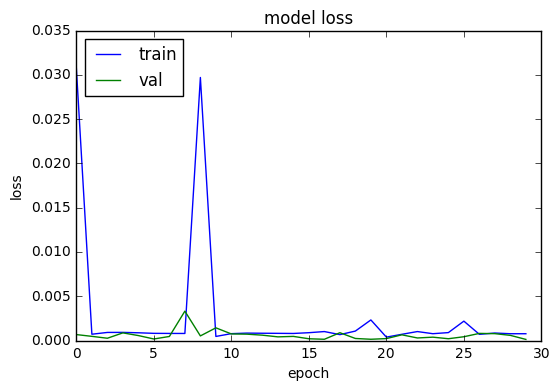

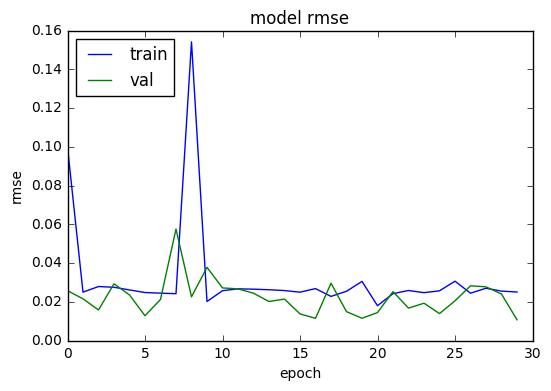

In [34]:
#plot loss and rmse curve for simpleRNN_model1
stateless_learn_curve(history)

In [ ]:
weights_saved_file= 'simple_rnn_wts_2.hdf5'
simpleRNN_model2.load_weights(weights_saved_file)

In [35]:
#evaluate simpleRNN_model2 performance
scores = simpleRNN_model2.evaluate(X_test, Y_test, verbose=0)
print("Overall RMSE while training", (scores[1]))

Y_Pred_test = simpleRNN_model2.predict(X_test)

xrmse,yrmse= calculate_RMSE(Y_Pred_test, Y_test)

print('Test Score (X-coord) XRMSE', str(xrmse))
print('Test Score (Y-coord) YRMSE', str(yrmse))


Overall RMSE while training 0.010433842596315974
Test Score (X-coord) XRMSE 13.469593981832011
Test Score (Y-coord) YRMSE 9.274837225170266


In [ ]:
for i in range(len(Y_test)):
    print('Y_test: ', Y_test[i])
    print('Y_Pred_test: ', Y_Pred_test[i], '\n')

In [ ]:
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [179]:
#stateless SimpleRNN with shuffle=False trained for 40 iterations (sample size)
timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=300, verbose=0, shuffle=False)
    
    Y_pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

Iteration:  0
Model created and compiled
Iteration:  1
Model created and compiled
Iteration:  2
Model created and compiled
Iteration:  3
Model created and compiled
Iteration:  4
Model created and compiled
Iteration:  5
Model created and compiled
Iteration:  6
Model created and compiled
Iteration:  7
Model created and compiled
Iteration:  8
Model created and compiled
Iteration:  9
Model created and compiled
Iteration:  10
Model created and compiled
Iteration:  11
Model created and compiled
Iteration:  12
Model created and compiled
Iteration:  13
Model created and compiled
Iteration:  14
Model created and compiled
Iteration:  15
Model created and compiled
Iteration:  16
Model created and compiled
Iteration:  17
Model created and compiled
Iteration:  18
Model created and compiled
Iteration:  19
Model created and compiled
Iteration:  20
Model created and compiled
Iteration:  21
Model created and compiled
Iteration:  22
Model created and compiled
Iteration:  23
Model created and compiled
It

[2.8301806405801204, 2.8813065468347943, 2.9202837977627674, 2.811958065581607, 2.777581689056322, 2.9635797169030735, 2.806510206593647, 2.855509995606052, 2.8328706645388575, 2.7460655782079324, 2.810000779464189, 2.811243478699231, 2.6930865854378045, 2.8260094682414163, 2.8977116732615085, 2.828427248296661, 2.8431309424084827, 2.8841137899698968, 2.834357515394326, 3.1059938256261215, 2.9671960075407178, 2.775740541777549, 2.839520467674219, 2.8959208643654324, 2.680528659770576, 2.7081759367507154, 2.7797404928165372, 2.774144344624737, 3.418428670178335, 2.893382205364344, 3.038383450628057, 2.9475891071163716, 2.70626953939466, 2.9296031742728816, 2.808152350353235, 2.8280135630626497, 2.8574657703665394, 2.9092804848946376, 2.8461351330109266, 2.902513549916776]
X-coord RMSE Mean: 2.861652663058618

[3.235233048951589, 3.385602834489679, 3.2562115946784744, 3.275224955568472, 3.239513923487185, 3.2786533897747003, 3.2665894721738247, 3.2395512687446852, 3.2393497959926134, 3.307297752945542, 3.3672346884137037, 3.3149607103050003, 3.252300033014301, 3.2328948590664717, 3.2251095059760195, 3.2531491255183664, 3.3604095784127095, 3.2730906305018883, 3.2267274703131092, 3.2446617552087673, 3.337090127431775, 3.385503394415466, 3.263638034019378, 3.3027259923032637, 3.2635817433417484, 3.197689611837395, 3.292943317131608, 3.2924188733899236, 3.202510807105569, 3.4173951279292227, 3.2952071695679375, 3.1877326513686977, 3.3686620103694405, 3.2455490006172223, 3.280124561552558, 3.312834114586966, 3.1938231884914625, 3.3315210319610826, 3.2943151008782103, 3.2638496461932824]
Y-coord RMSE Mean: 3.2800720474507328

Time Took :153.97 min 

In [34]:
print('Average: ', np.mean([2.861652663058618, 3.2800720474507328]))

Average:  3.0708623552546754


Stateless SimpleRNN perfoems better with shuffle=False, as both XRMSE and YRMSE mean values are less as compared to model-1 trained with shuffle=True. Thus Hyp. accepted that a simpleRNN model performs better with shuffle=False.

In [182]:
#simpleRNN stacked stateless model
timesteps=18
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def stacked_stateless_simpleRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units, return_sequences=False))
    #model.add(Dropout(0.1))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
model.summary()

In [ ]:
#Rescaling Y_test as it was inverse transformed for the predictions earlier
Y_test = scaler.fit_transform(Y_test)

In [ ]:
#simpleRNN call model definition
simpleRNN_model3= stacked_stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)

In [ ]:
#Train stacked simpleRNN stateless model with shuffle=True
history= stateless_fit(simpleRNN_model3, X_train, Y_train, X_val, Y_val, 128, 'simple_rnn_wts_3.hdf5', False)

In [ ]:
#plot loss and rmse curve for simpleRNN_model1
stateless_learn_curve(history)

In [ ]:
weights_saved_file= 'simple_rnn_wts_3.hdf5'
simpleRNN_model3.load_weights(weights_saved_file)

In [ ]:
#evaluate simpleRNN_model3 performance
scores = simpleRNN_model3.evaluate(X_test, Y_test, verbose=0)
print("Overall RMSE while training", (scores[1]))

Y_Pred_test = simpleRNN_model3.predict(X_test)

Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
Y_test = scaler.inverse_transform(Y_test)

#calculate RMSE
Xcoord_pred=[]
Xcoord_true=[]
Ycoord_pred=[]
Ycoord_true=[]

for i in range(0,len(Y_Pred_test)):
    Xcoord_pred.append(Y_Pred_test[i][0])
    Ycoord_pred.append(Y_Pred_test[i][1])
    
for i in range(0,len(Y_test)):   
    Xcoord_true.append(Y_test[i][0])
    Ycoord_true.append(Y_test[i][1])

X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))

print('Test Score (X-coord) XRMSE', str(X_RMSE))
print('Test Score (Y-coord) YRMSE', str(Y_RMSE))


In [ ]:
for i in range(len(Y_test)):
    print('Y_test: ', Y_test[i])
    print('Y_Pred_test: ', Y_Pred_test[i], '\n')

In [ ]:
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [183]:
#stateless stacked SimpleRNN trained for 40 iterations (sample size)
#put the value for shuffle depending upon which among model_1 and model_2 perform better.

timesteps=18
sample_size=40
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Iteration: ', i)
    model= stacked_stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=300, verbose=0, shuffle=False)
    
    Y_pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)

    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

Iteration:  0
Model created and compiled
Iteration:  1
Model created and compiled
Iteration:  2
Model created and compiled
Iteration:  3
Model created and compiled
Iteration:  4
Model created and compiled
Iteration:  5
Model created and compiled
Iteration:  6
Model created and compiled
Iteration:  7
Model created and compiled
Iteration:  8
Model created and compiled
Iteration:  9
Model created and compiled
Iteration:  10
Model created and compiled
Iteration:  11
Model created and compiled
Iteration:  12
Model created and compiled
Iteration:  13
Model created and compiled
Iteration:  14
Model created and compiled
Iteration:  15
Model created and compiled
Iteration:  16
Model created and compiled
Iteration:  17
Model created and compiled
Iteration:  18
Model created and compiled
Iteration:  19
Model created and compiled
Iteration:  20
Model created and compiled
Iteration:  21
Model created and compiled
Iteration:  22
Model created and compiled
Iteration:  23
Model created and compiled
It

Time Took :373.91 min 

[3.286377074272763, 3.171746903860119, 3.706406609534582, 4.312350015119523, 3.007912072151534, 3.655149624430987, 2.9338023993977616, 2.609152602085964, 2.9925698411012918, 2.5780217866694413, 2.997532608719109, 2.928579929326085, 3.562967840242919, 2.761264303186961, 4.067930307033878, 3.393973134717079, 4.705041630622242, 2.787064404917611, 2.6190837994303884, 2.7531731074576835, 4.331093949185666, 2.670213084212141, 3.4864529888386784, 3.2569239675446333, 3.104297293892681, 2.7579247175889883, 2.701572508605862, 2.5890067617152366, 3.306396260196503, 3.003968413516618, 4.151324630946294, 3.024831772549674, 2.953811825493624, 3.0882173945619638, 2.976570885891303, 2.7041327240484008, 2.9499718427281825, 3.230418219889195, 3.094805017396906, 2.959963410787591]
X-coord RMSE Mean: 3.179299941596702

[3.518281412681899, 3.5331341896292097, 3.4574990817280367, 3.9036477192118335, 3.5851774812852617, 3.3866807545669717, 3.7845977482452913, 3.541749132443987, 3.7570573401572536, 3.541572361765637, 3.3250563685062704, 3.863541443649018, 3.7499748872424243, 3.5863001248945934, 3.5060763459216266, 3.7018086542764674, 3.288456746193609, 3.583762305556673, 3.878725107977964, 3.3566681934078266, 3.2586289100333725, 3.286946856973114, 3.3431327545861635, 3.318223363966709, 3.874726259868211, 3.341263337979441, 3.5870210094910218, 3.442298493108369, 3.4677948908210903, 3.61510335191219, 3.2659513331361305, 3.6126806056973435, 3.443919565868479, 3.245169617386853, 3.6749956750566755, 3.357228416694397, 3.2820303208337993, 3.2887296741962673, 3.424302471073325, 3.393958117935679]
Y-coord RMSE Mean: 3.509346810649012

The stacked model does not perform better than model-2 with one SRNN hidden layer. So, far model-2 with 1 simpleRNN hidden layer with shuffle=False performs the best.

In [ ]:
#Dropout tuning
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def dropout_tuning(dropout, repeats, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    timesteps=18
    X_RMSE=[]
    Y_RMSE=[]
    for i in range(0,repeats):
        print('Iteration: ', i)
        if(i!=0):
            Y_test=scaler.fit_transform(Y_test)
        model_iter = Sequential()
        model_iter.add(SimpleRNN(30, return_sequences=False, batch_input_shape=(105, timesteps, 2), stateful=True, dropout=dropout))
        model_iter.add(Dense(2))
        model_iter.add(LeakyReLU(alpha=0.05))
        model_iter.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])
        for j in range(600):
            model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=105, verbose=0, shuffle=False)
            model_iter.reset_states()
        Y_pred = model_iter.predict(X_test, batch_size=105)
        model_iter.reset_states()
        #inverse transform
        Y_pred = scaler.inverse_transform(Y_pred)
        Y_test = scaler.inverse_transform(Y_test)
        #calculate RMSE
        Xcoord_pred=[]
        Xcoord_true=[]
        Ycoord_pred=[]
        Ycoord_true=[]
        for k in range(0,len(Y_pred)):
            Xcoord_pred.append(Y_pred[k][0])
            Ycoord_pred.append(Y_pred[k][1])
        for l in range(0,len(Y_test)):   
            Xcoord_true.append(Y_test[l][0])
            Ycoord_true.append(Y_test[l][1])
        xrmse=math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
        X_RMSE.append(xrmse)
        yrmse=math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
        Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE

repeats=5
results_X = pd.DataFrame()
results_Y = pd.DataFrame()
dropouts=[0.0,0.2,0.4,0.6]
for dropout in dropouts:
    print('Dropout: ', dropout)
    results_X[str(dropout)], results_Y[str(dropout)]= dropout_tuning(dropout, repeats, X_train, Y_train, X_test, Y_test, X_val, Y_val)
print(results_X.describe())
print(results_Y.describe())

Using a dropout worsens the results. The best results are obtained with no dropout.

In [26]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def stateful_SimpleRNN(units, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    model.summary()
    return model

In [24]:
#Normally the state of RNN is reset after each batch but now we will reset it after each epoch to maintain the memory between batches. this can be done by makeing the RNN layer "stateful"
#Create our own outer loop of epochs

def stateful_fit(model, X_train, Y_train, X_val, Y_val, batch_size, epochs, weights_saved_file):
    hist_rmse=[]
    hist_val_rmse=[]
    hist_loss=[]
    hist_val_loss=[]

    
    callbacks_list2= [ModelCheckpoint(weights_saved_file,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='auto',
                             save_weights_only=True)]
    start = time.time()

    for i in range(epochs):
        print('Epoch Number: ', i)
        hist= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=2, shuffle=False, callbacks= callbacks_list2)

        hist_rmse.append(hist.history['rmse'])
        hist_val_rmse.append(hist.history['val_rmse'])
        hist_loss.append(hist.history['loss'])
        hist_val_loss.append(hist.history['val_loss'])

        #manual early stopping while monitoring the validtaion loss and stopping when the loss does not improve for 2 continuous epochs.
#         if(i!=0):
#             if((hist_val_loss[i-1][0]-hist_val_loss[i][0])<=0):
#                 count+=1
#                 if(count==2):
#                     if(i<50):
#                         count=0
#                     else:
#                         print('Epochs stopped because of no improvement. Epoch Number: ', i)
#                         break
#                 else:
#                     pass
#             else:
#                 count=0
#         else:
#             count=0
        model.reset_states()

    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    print(hist.history.keys())
    
    return hist_loss, hist_val_loss, hist_rmse, hist_val_rmse

In [25]:
#learning curves
def stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse):
    # summarize history for loss
    #plt.figure(figsize=(20,10))
    plt.plot(hist_loss)
    plt.plot(hist_val_loss)
    plt.title('Model Loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    # summarize history for accuracy
    #plt.figure(figsize=(20,10))
    plt.plot(hist_rmse)
    plt.plot(hist_val_rmse)
    plt.title('Model RMSE')
    plt.ylabel('RMSE')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()

In [ ]:
#call the stateful model definition
simpleRNN_model4= stateful_SimpleRNN(units=30, lr=0.001, batch=105, alpha=0.05)

In [ ]:
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(simpleRNN_model4, X_train, Y_train, X_val, Y_val, batch_size=105, weights_saved_file='simple_rnn_wts_4.hdf5')

In [ ]:
#plot the loss and rmse recorded per epoch while training and validating
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [ ]:
weights_saved_file= 'simple_rnn_wts_4.hdf5'
simpleRNN_model4.load_weights(weights_saved_file)

In [ ]:
#evaluate simpleRNN_model4 performance
scores = simpleRNN_model4.evaluate(X_test, Y_test, batch_size=105, verbose=0)
simpleRNN_model4.reset_states()
print("Overall RMSE while training", (scores[1]))

Y_Pred_train = simpleRNN_model4.predict(X_train, batch_size=105)
simpleRNN_model4.reset_states()
Y_Pred_val = simpleRNN_model4.predict(X_val, batch_size=105)
simpleRNN_model4.reset_states()
Y_Pred_test = simpleRNN_model4.predict(X_test, batch_size=105)
simpleRNN_model4.reset_states()

Y_Pred_train = scaler.inverse_transform(Y_Pred_train)
Y_train = scaler.inverse_transform(Y_train)
Y_Pred_val = scaler.inverse_transform(Y_Pred_val)
Y_val = scaler.inverse_transform(Y_val)
Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
Y_test = scaler.inverse_transform(Y_test)

X_RMSE_train, Y_RMSE_train= calcualte_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord) XRMSE', str(X_RMSE_train))
print('Train Score (Y-coord) YRMSE', str(Y_RMSE_train))

X_RMSE_val, Y_RMSE_val= calcualte_RMSE(Y_Pred_val, Y_val)
print('Val Score (X-coord) XRMSE', str(X_RMSE_val))
print('Val Score (Y-coord) YRMSE', str(Y_RMSE_val))

X_RMSE_test, Y_RMSE_test= calcualte_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) XRMSE', str(X_RMSE_test))
print('Test Score (Y-coord) YRMSE', str(Y_RMSE_test))


In [ ]:
for i in range(len(Y_test)):
    print('Y_test: ', Y_test[i])
    print('Y_Pred_test: ', Y_Pred_test[i], '\n')

In [ ]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [ ]:
# re-define the batch size
timesteps=18
batch_size = 1
weights_saved_file='simple_rnn_wts_4.hdf5'

# re-define model
new_model = Sequential()
new_model.add(SimpleRNN(30, return_sequences=False, batch_input_shape=(batch_size, timesteps, 2), stateful=True))
new_model.add(Dense(2))
new_model.add(LeakyReLU(alpha=0.05))

# copy weights
simpleRNN_model4.load_weights(weights_saved_file)
old_weights = simpleRNN_model4.get_weights()
new_model.set_weights(old_weights)

# compile model
new_model.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])

In [ ]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=100
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = new_model.predict(input_sequence2)
                pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

In [33]:
#result of 60 iterations. Consider only 40 as it is the sample size required to determine the skill of the model
X_RMSE= [5.500694428523802, 3.4254142011641138, 4.891764667623055, 4.597999187909547, 4.074898807602142, 5.340896844813258, 3.5068852804187904, 3.471926540005198, 3.6087092511719927, 3.593589653833207, 4.40005905404099, 3.4837944705309387, 4.156649393571735, 4.412614679858544, 4.268136721506749, 3.434429810864395, 3.7226918247892513, 3.7242362237824094, 4.9446961451576295, 4.328349505599733, 4.170842829870825, 5.052166145964223, 3.8702921692554693, 3.832187730553048, 3.444077326527261, 4.889948122488767, 5.467175082789805, 5.487393969459091, 4.273710167990146, 4.4442579920317105, 3.813416814145549, 5.0318621764913205, 4.4285047272296065, 3.968096111214058, 3.3830894781131327, 3.997503138381941, 4.057249570926058, 4.140528315566753, 4.273386194993445, 5.955602638625145, 4.022665399192207, 3.4845302001313363, 4.559127087867797, 3.8592451013696505, 5.0786265926044, 4.233400902985731, 3.6427489219717453, 3.376359874166942, 4.33561847630898, 4.300004254136604, 4.369195436873038, 4.10780138279645, 3.3416622757739733, 4.382799352956347, 4.076541039621095, 4.118557221840233, 4.3819078910676375, 3.57963769052343, 4.454193212121663, 4.282864039192654, 4.676848858694428, 4.98881745560985]
Y_RMSE= [2.9605533863693605, 3.258207411057651, 2.945326107369334, 2.9219609775398094, 3.386360160562858, 3.0175641597840497, 3.4588145657235723, 2.9925795176528256, 3.1609890881332197, 3.554487823605844, 3.312802600320144, 3.193031442094347, 3.19717280115246, 2.786610105798919, 3.209287494216034, 3.5533441995690542, 2.847311994602069, 2.867147257714469, 2.7697226443815772, 2.819269225470433, 4.075422147517169, 3.5253977360586175, 3.0833007219347106, 3.019102897582364, 3.806820771401082, 2.942465008263055, 3.2280207191406234, 3.1009384838850362, 2.991116768265948, 2.9913335757690214, 2.8888957670952427, 3.309979510582037, 3.1793258678865692, 3.1536643711107777, 3.291440230418111, 3.025438082396211, 2.7473353791816804, 3.2445559345752244, 3.163555018642853, 2.7326482516579724, 3.028079776856231, 3.1547165966311965, 2.8818058561632336, 3.07226483113012, 2.7470163477908724, 2.6885764608281773, 3.6148256427869376, 3.1307917830787777, 2.7524046856921043, 3.309591167231183, 3.165771265165449, 2.8275690786701757, 3.1717581995918147, 3.1388501158128643, 2.8069471864172746, 2.923782802579026, 3.259614634218462, 3.7079718303760316, 3.483363178412482, 3.18730880216587, 3.2888803812983896, 3.212462297122521]

x_mean= np.mean(X_RMSE[:40])
y_mean=np.mean(Y_RMSE[:40])
print('X_RMSE(stateful simple_RNN): ', x_mean)
print('Y_RMSE(stateful simple_RNN): ', y_mean)
print('Average: ',np.mean([x_mean,y_mean]))

X_RMSE(stateful simple_RNN):  4.271743184884621
Y_RMSE(stateful simple_RNN):  3.1428325051620583
Average:  3.7072878450233397


For this model Y_RMSE is lower as compared to model_2. But X_RMSE is far higher than model_2. Both X and Y coordinates are of equal importance to predic the mouse movements. Thus, the average error will be considered. Model-2 has a lower average of RMSE's of 3.07 compared to 3.70 of stateful model. Thus, model-2 still remains the best performer.

In [151]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#Stacked SimpleRNN with m/m between batches
def stacked_stateful_SimpleRNN(units, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(SimpleRNN(units, return_sequences=False, stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [26]:
#call the stateful stacked simpleRNN model definition
simpleRNN_model5= stacked_stateful_SimpleRNN(units=30, lr=0.001, batch=128, alpha=0.05)
#summary of the model
simpleRNN_model5.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (128, 18, 30)             990       
_________________________________________________________________
simple_rnn_2 (SimpleRNN)     (128, 30)                 1830      
_________________________________________________________________
dense_1 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (128, 2)                  0         
Total params: 2,882
Trainable params: 2,882
Non-trainable params: 0
_________________________________________________________________


In [29]:
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(simpleRNN_model5, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=300, weights_saved_file='simple_rnn_wts_5.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 4s - loss: 0.1072 - rmse: 0.2765 - val_loss: 0.0061 - val_rmse: 0.0776

Epoch 00001: val_loss improved from inf to 0.00606, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0035 - rmse: 0.0579 - val_loss: 0.0021 - val_rmse: 0.0461

Epoch 00001: val_loss improved from 0.00606 to 0.00215, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0017 - rmse: 0.0405 - val_loss: 0.0012 - val_rmse: 0.0344

Epoch 00001: val_loss improved from 0.00215 to 0.00120, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0011 - rmse: 0.0328 - val_loss: 8.3093e-04 - val_rmse: 0.0285

Epoch 00001: val_loss improved from 0.00120 to 0.00083, saving model to simple_rnn_wts_5.hdf5
Epoch Number:  4
Train o

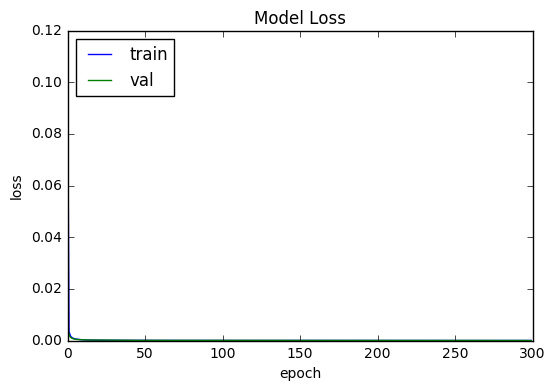

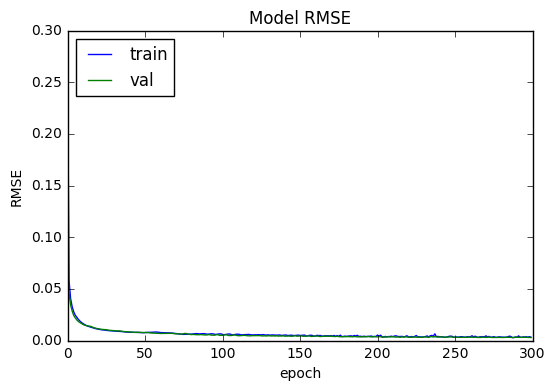

In [30]:
#plot the loss and rmse recorded per epoch while training and validating
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [27]:
weights_saved_file= 'simple_rnn_wts_5.hdf5'
simpleRNN_model5.load_weights(weights_saved_file)

In [28]:
#evaluate simpleRNN_model5 performance
scores = simpleRNN_model5.evaluate(X_test, Y_test, batch_size=128, verbose=0)
simpleRNN_model5.reset_states()
print("Overall RMSE while training", (scores[1]))

Y_Pred_train = simpleRNN_model5.predict(X_train, batch_size=128)
simpleRNN_model5.reset_states()

Y_Pred_test = simpleRNN_model5.predict(X_test, batch_size=128)
simpleRNN_model5.reset_states()

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord) XRMSE', xrmse)
print('Train Score (Y-coord) YRMSE', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) XRMSE', xrmse)
print('Test Score (Y-coord) YRMSE', yrmse)


Overall RMSE while training 0.0025446635903790594
Train Score (X-coord) XRMSE 3.4371788586327923
Train Score (Y-coord) YRMSE 2.5263942321079873
Test Score (X-coord) XRMSE 3.150643692983833
Test Score (Y-coord) YRMSE 2.315699942329787


In [36]:
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [359.17096999 277.76556777]
Y_Pred:  [360.68866 280.12045] 

Y_true:  [839.53070508 705.91968912]
Y_Pred:  [845.69476 708.20154] 

Y_true:  [1163.17547569   95.15189873]
Y_Pred:  [1165.8951     96.358246] 

Y_true:  [410.92739521 344.46715328]
Y_Pred:  [418.0065  342.85233] 

Y_true:  [357.04837641 332.05716878]
Y_Pred:  [355.21985 330.40808] 

Y_true:  [747.84730539 314.03284672]
Y_Pred:  [750.5842 315.9362] 

Y_true:  [501.88166931 342.46702199]
Y_Pred:  [509.55994 344.64288] 

Y_true:  [381. 551.]
Y_Pred:  [381.24207 554.0173 ] 

Y_true:  [834.77918648 334.4023984 ]
Y_Pred:  [836.7251  335.27637] 

Y_true:  [ 94.34891835 596.03296703]
Y_Pred:  [ 95.563255 600.0199  ] 

Y_true:  [864.73161486 736.23445596]
Y_Pred:  [868.91833 737.7051 ] 

Y_true:  [575.77760169 448.38241173]
Y_Pred:  [580.8428  448.80676] 

Y_true:  [279.5316092  335.67085427]
Y_Pred:  [280.54797 338.5864 ] 

Y_true:  [780.12229102 198.50931677]
Y_Pred:  [783.2051  196.84209] 

Y_true:  [870.54454023 294.104

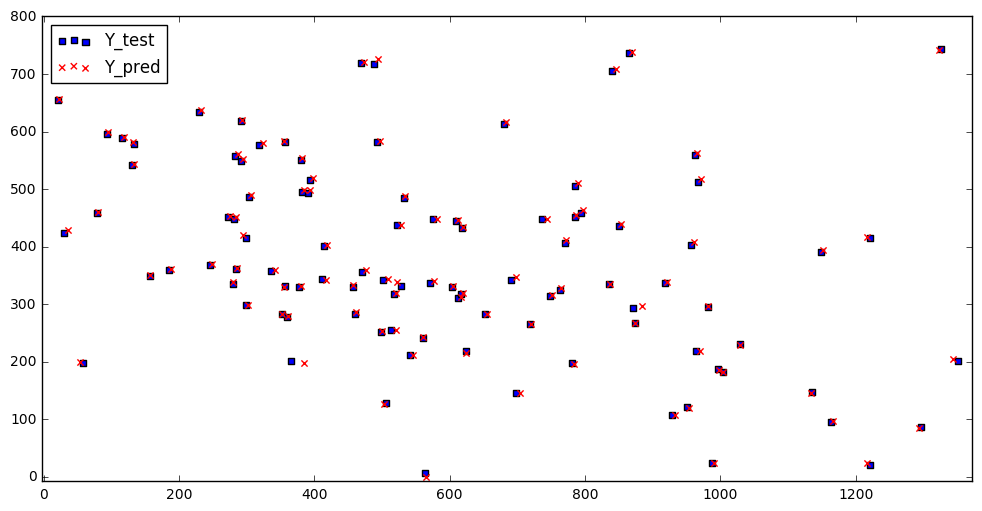

In [37]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [29]:
# re-define the batch size
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

timesteps=18
batch_size = 1
weights_saved_file='simple_rnn_wts_5.hdf5'

# re-define model
new_model = Sequential()
new_model.add(SimpleRNN(30, return_sequences=True, batch_input_shape=(batch_size, timesteps, 2), stateful=True))
new_model.add(SimpleRNN(30, return_sequences=False, stateful=True))
new_model.add(Dense(2))
new_model.add(LeakyReLU(alpha=0.05))

# copy weights
simpleRNN_model5.load_weights(weights_saved_file)
old_weights = simpleRNN_model5.get_weights()
new_model.set_weights(old_weights)

# compile model
new_model.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])

In [56]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=20
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = new_model.predict(input_sequence2)
                pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

In [42]:
#1st dataset, stateful stacked SimpleRNN

timesteps=18
X_RMSE=[]
Y_RMSE=[]
sample_size=40

start= time.time()
for i in range(0,sample_size):
    print('Iteration: ', i)
    
    model_iter = stacked_stateful_SimpleRNN(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(300):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=128)
    model_iter.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    
print('X_RMSE: ',X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y_RMSE: ', Y_RMSE, '\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Iteration:  0
Model created and compiled
Iteration:  1
Model created and compiled
Iteration:  2
Model created and compiled
Iteration:  3
Model created and compiled
Iteration:  4
Model created and compiled
Iteration:  5
Model created and compiled
Iteration:  6
Model created and compiled
Iteration:  7
Model created and compiled
Iteration:  8
Model created and compiled
Iteration:  9
Model created and compiled
Iteration:  10
Model created and compiled
Iteration:  11
Model created and compiled
Iteration:  12
Model created and compiled
Iteration:  13
Model created and compiled
Iteration:  14
Model created and compiled
Iteration:  15
Model created and compiled
Iteration:  16
Model created and compiled
Iteration:  17
Model created and compiled
Iteration:  18
Model created and compiled
Iteration:  19
Model created and compiled
Iteration:  20
Model created and compiled
Iteration:  21
Model created and compiled
Iteration:  22
Model created and compiled
Iteration:  23
Model created and compiled
It

X_RMSE:  [2.6153305477103563, 3.5225933620654915, 3.1274677371092827, 2.6799154897398343, 3.5483661411099985, 3.178563177186701, 2.7052923122002372, 4.065581212668524, 4.397161554091826, 3.1335192094226674, 2.555567704345377, 2.820540890534452, 2.870182064851864, 3.095985602131551, 2.478159435597792, 2.6577512606917773, 2.5063898245241476, 2.8263378069161607, 3.423079222679825, 3.8621596249209547, 2.5768880309268085, 3.2826055040273574, 3.1070625574302206, 4.13142638424668, 2.449799271552416, 2.4996809623394713, 2.8755548195787295, 2.7400904506636796, 3.162797134829946, 3.1815406432888227, 2.8553546961920366, 2.432785446507354, 2.5991544271879663, 2.647615879299706, 2.693643231767456, 2.941962603946068, 3.085096711502539, 3.341632904450702, 2.465829638958285, 5.332239062237563]
X-coord RMSE Mean: 3.061817613535816

Y_RMSE:  [3.0736109254291333, 2.5411846341693467, 2.505926998146575, 3.0961358777930137, 2.9539936299114045, 2.5281908860631486, 3.05539304300264, 2.535750112504701, 3.4575847692017025, 2.5294383413023964, 2.576498015528173, 2.483742502630586, 2.484130162639437, 2.886622955925671, 2.6147041518378114, 2.477767925640146, 2.7272090047934867, 2.669152850913352, 2.477529458677735, 2.430289896206023, 3.1371326602699443, 2.4667062055403184, 2.493433149764165, 2.494538187891173, 2.499576103098395, 2.596904215615504, 2.52652573590318, 2.6956981710036523, 2.4294554918924636, 2.4700157169899537, 2.6291372920135903, 2.643349931346785, 2.9621171601128813, 2.4760667688174176, 3.299652365627427, 2.475837497671669, 2.4462172118853895, 2.639823730591951, 2.539924356218255, 2.863678312498641]
Y-coord RMSE Mean: 2.672266160176731

Time Took :226.73 min 

In [30]:
print(np.mean([3.061817613535816,2.672266160176731]))

2.8670418868562733


So, looking at the results above, SimpleRNN stateful model with 2 hidden layers (model-5) performs better than all the other models trained earlier. This model outperforms all the models trained so far.

In [101]:
#line plot of standard error vs the number of repeats 
#The standard deviation (average distance of scores from the mean score) gives an idea of how unstable the model is.

"""The standard error of the mean model skill is how much the estimated mean of model skill score differs from the
unknown actual mean model skill (e.g. how wrong mean_skill might be)"""
#X_RMSE= [5.500694428523802, 3.4254142011641138, 4.891764667623055, 4.597999187909547, 4.074898807602142, 5.340896844813258, 3.5068852804187904, 3.471926540005198, 3.6087092511719927, 3.593589653833207, 4.40005905404099, 3.4837944705309387, 4.156649393571735, 4.412614679858544, 4.268136721506749, 3.434429810864395, 3.7226918247892513, 3.7242362237824094, 4.9446961451576295, 4.328349505599733, 4.170842829870825, 5.052166145964223, 3.8702921692554693, 3.832187730553048, 3.444077326527261, 4.889948122488767, 5.467175082789805, 5.487393969459091, 4.273710167990146, 4.4442579920317105, 3.813416814145549, 5.0318621764913205, 4.4285047272296065, 3.968096111214058, 3.3830894781131327, 3.997503138381941, 4.057249570926058, 4.140528315566753, 4.273386194993445, 5.955602638625145, 4.022665399192207, 3.4845302001313363, 4.559127087867797, 3.8592451013696505, 5.0786265926044, 4.233400902985731, 3.6427489219717453, 3.376359874166942, 4.33561847630898, 4.300004254136604]
#Y_RMSE= [2.9605533863693605, 3.258207411057651, 2.945326107369334, 2.9219609775398094, 3.386360160562858, 3.0175641597840497, 3.4588145657235723, 2.9925795176528256, 3.1609890881332197, 3.554487823605844, 3.312802600320144, 3.193031442094347, 3.19717280115246, 2.786610105798919, 3.209287494216034, 3.5533441995690542, 2.847311994602069, 2.867147257714469, 2.7697226443815772, 2.819269225470433, 4.075422147517169, 3.5253977360586175, 3.0833007219347106, 3.019102897582364, 3.806820771401082, 2.942465008263055, 3.2280207191406234, 3.1009384838850362, 2.991116768265948, 2.9913335757690214, 2.8888957670952427, 3.309979510582037, 3.1793258678865692, 3.1536643711107777, 3.291440230418111, 3.025438082396211, 2.7473353791816804, 3.2445559345752244, 3.163555018642853, 2.7326482516579724, 3.028079776856231, 3.1547165966311965, 2.8818058561632336, 3.07226483113012, 2.7470163477908724, 2.6885764608281773, 3.6148256427869376, 3.1307917830787777, 2.7524046856921043, 3.309591167231183]
X_RMSE= [5.500694428523802, 3.4254142011641138, 4.891764667623055, 4.597999187909547, 4.074898807602142, 5.340896844813258, 3.5068852804187904, 3.471926540005198, 3.6087092511719927, 3.593589653833207, 4.40005905404099, 3.4837944705309387, 4.156649393571735, 4.412614679858544, 4.268136721506749, 3.434429810864395, 3.7226918247892513, 3.7242362237824094, 4.9446961451576295, 4.328349505599733, 4.170842829870825, 5.052166145964223, 3.8702921692554693, 3.832187730553048, 3.444077326527261, 4.889948122488767, 5.467175082789805, 5.487393969459091, 4.273710167990146, 4.4442579920317105, 3.813416814145549, 5.0318621764913205, 4.4285047272296065, 3.968096111214058, 3.3830894781131327, 3.997503138381941, 4.057249570926058, 4.140528315566753, 4.273386194993445, 5.955602638625145, 4.022665399192207, 3.4845302001313363, 4.559127087867797, 3.8592451013696505, 5.0786265926044, 4.233400902985731, 3.6427489219717453, 3.376359874166942, 4.33561847630898, 4.300004254136604, 4.369195436873038, 4.10780138279645, 3.3416622757739733, 4.382799352956347, 4.076541039621095, 4.118557221840233, 4.3819078910676375, 3.57963769052343, 4.454193212121663, 4.282864039192654, 4.676848858694428, 4.98881745560985]
Y_RMSE= [2.9605533863693605, 3.258207411057651, 2.945326107369334, 2.9219609775398094, 3.386360160562858, 3.0175641597840497, 3.4588145657235723, 2.9925795176528256, 3.1609890881332197, 3.554487823605844, 3.312802600320144, 3.193031442094347, 3.19717280115246, 2.786610105798919, 3.209287494216034, 3.5533441995690542, 2.847311994602069, 2.867147257714469, 2.7697226443815772, 2.819269225470433, 4.075422147517169, 3.5253977360586175, 3.0833007219347106, 3.019102897582364, 3.806820771401082, 2.942465008263055, 3.2280207191406234, 3.1009384838850362, 2.991116768265948, 2.9913335757690214, 2.8888957670952427, 3.309979510582037, 3.1793258678865692, 3.1536643711107777, 3.291440230418111, 3.025438082396211, 2.7473353791816804, 3.2445559345752244, 3.163555018642853, 2.7326482516579724, 3.028079776856231, 3.1547165966311965, 2.8818058561632336, 3.07226483113012, 2.7470163477908724, 2.6885764608281773, 3.6148256427869376, 3.1307917830787777, 2.7524046856921043, 3.309591167231183, 3.165771265165449, 2.8275690786701757, 3.1717581995918147, 3.1388501158128643, 2.8069471864172746, 2.923782802579026, 3.259614634218462, 3.7079718303760316, 3.483363178412482, 3.18730880216587, 3.2888803812983896, 3.212462297122521]
print('X_RMSE_SD: ', np.std(X_RMSE))
print('X_RMSE_mean: ', np.mean(X_RMSE))
print('XRMSE_Std_error: ', (np.std(X_RMSE)/math.sqrt(len(X_RMSE))),'\n')

print('Y_RMSE_SD: ', np.std(Y_RMSE))
print('Y_RMSE_mean: ', np.mean(Y_RMSE))
print('YRMSE_Std_error: ', (np.std(Y_RMSE)/math.sqrt(len(Y_RMSE))))

X_RMSE_SD:  0.6087820252444467
X_RMSE_mean:  4.23424000101921
XRMSE_Std_error:  0.07731539452147791 

Y_RMSE_SD:  0.28011624847742744
Y_RMSE_mean:  3.133349243975831
YRMSE_Std_error:  0.0355747991314502


               0
count  62.000000
mean    4.234240
std     0.613752
min     3.341662
25%     3.746531
50%     4.202122
75%     4.451709
max     5.955603


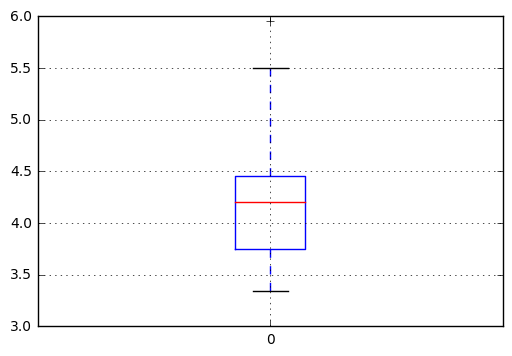

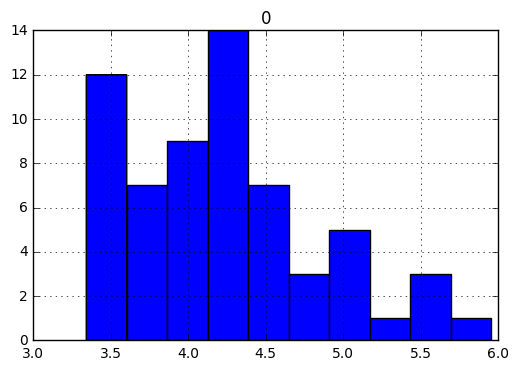

In [117]:
#descriptive stats
XRMSE_df= pd.DataFrame(X_RMSE)
print(XRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
XRMSE_df.boxplot()
plt.show()
# histogram- distribution of data
#to check if the results are normally distributed
XRMSE_df.hist()
plt.show()

               0
count  62.000000
mean    3.133349
std     0.282403
min     2.688576
25%     2.928453
50%     3.146257
75%     3.259263
max     4.075422


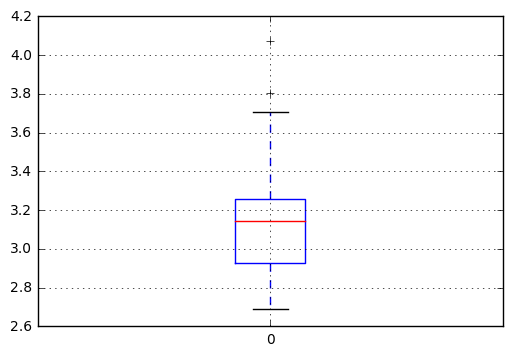

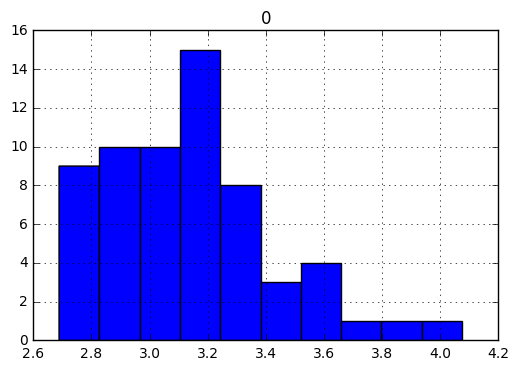

In [118]:
#descriptive stats
YRMSE_df= pd.DataFrame(Y_RMSE)
print(YRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
YRMSE_df.boxplot()
plt.show()
# histogram- distribution of data
#to check if the results are normally distributed
YRMSE_df.hist()
plt.show()

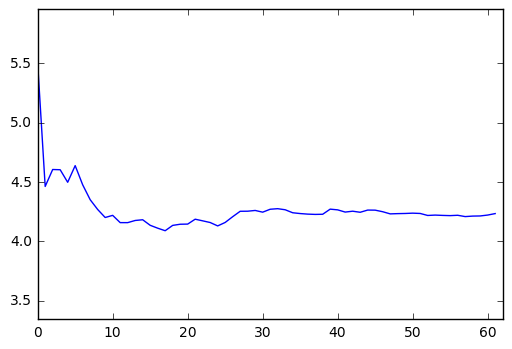

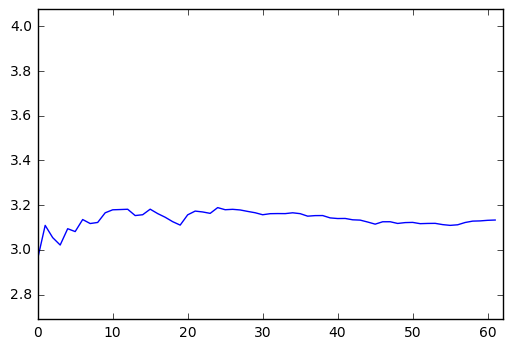

In [104]:
#60 iterations
XRMSE_df=pd.DataFrame(X_RMSE)
XRMSE_scores= XRMSE_df.values
XRMSE_mean_list = list()
for i in range(1,len(X_RMSE)+1):
    data = XRMSE_scores[0:i, 0]
    XRMSE_mean = np.mean(data)
    XRMSE_mean_list.append(XRMSE_mean)
# line plot of the values generated in the list
plt.plot(XRMSE_mean_list)
plt.xlim(0,62)
plt.ylim(min(X_RMSE),max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

YRMSE_df=pd.DataFrame(Y_RMSE)
YRMSE_scores= YRMSE_df.values
YRMSE_mean_list = list()
for i in range(1,len(Y_RMSE)+1):
    data = YRMSE_scores[0:i, 0]
    YRMSE_mean = np.mean(data)
    YRMSE_mean_list.append(YRMSE_mean)
# line plot of the values generated in the list
plt.plot(YRMSE_mean_list)
plt.xlim(0,62)
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.


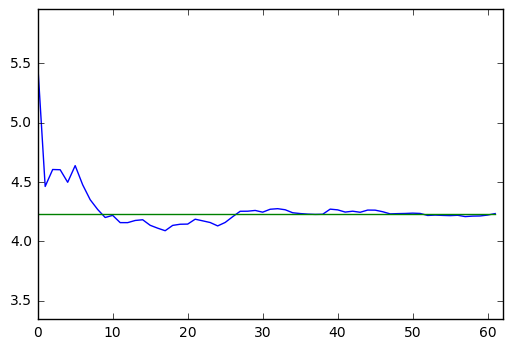

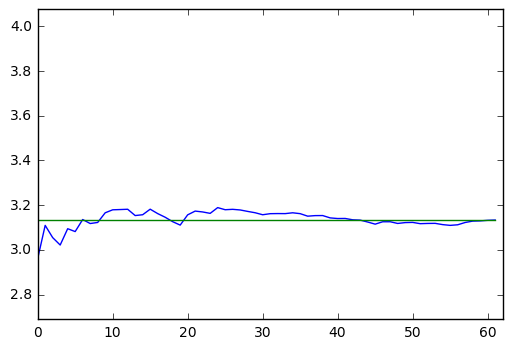

In [105]:
#mean of iterations shown with orange line on top of the above plots.
X_Mean= np.mean(XRMSE_scores[0:100])
plt.plot(XRMSE_mean_list)
plt.plot([X_Mean for x in range(len(XRMSE_mean_list))])
plt.xlim(0,62)
plt.ylim(min(X_RMSE), max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

Y_Mean= np.mean(YRMSE_scores[0:100])
plt.plot(YRMSE_mean_list)
plt.plot([Y_Mean for x in range(len(YRMSE_mean_list))])
plt.xlim(0,62)
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

The XRMSE mean gets almost constant and equal to the mean of 60 iterations after 28 iterations, where as YRMSE gets constant after 40 iterations. Let's consider the standard error below.

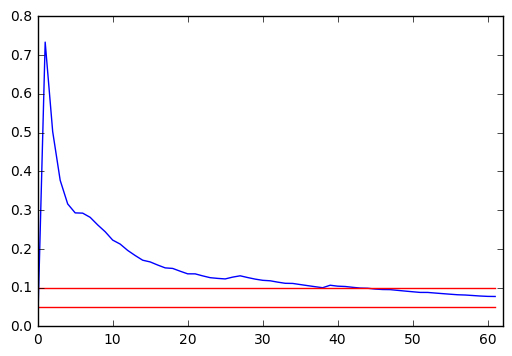

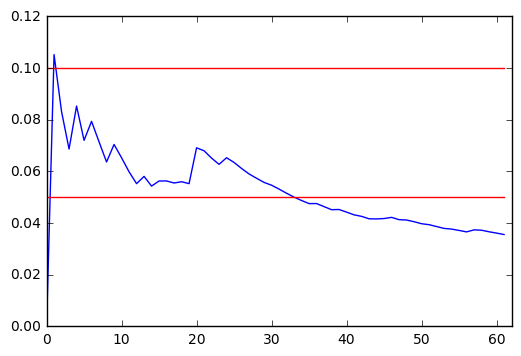

In [124]:
#100 iterations
XRMSE_df=pd.DataFrame(X_RMSE)
XRMSE_scores= XRMSE_df.values
XRMSE_stderr_list = list()
for i in range(1,len(X_RMSE)+1):
    data = XRMSE_scores[0:i, 0]
    stderr = np.std(data) / math.sqrt(len(data))
    XRMSE_stderr_list.append(stderr)
# line plot of the values generated in the list
plt.plot(XRMSE_stderr_list)
plt.xlim(0,62)
plt.plot([0.05 for x in range(len(XRMSE_stderr_list))], color='red')
plt.plot([0.1 for x in range(len(XRMSE_stderr_list))], color='red')
plt.show() #From this plot the point of diminishing returns can be located.

YRMSE_df=pd.DataFrame(Y_RMSE)
YRMSE_scores= YRMSE_df.values
YRMSE_stderr_list = list()
for i in range(1,len(Y_RMSE)+1):
    data = YRMSE_scores[0:i, 0]
    stderr = np.std(data) / math.sqrt(len(data))
    YRMSE_stderr_list.append(stderr)
# line plot of the values generated in the list
plt.plot(YRMSE_stderr_list)
plt.xlim(0,62)
plt.plot([0.05 for x in range(len(YRMSE_stderr_list))], color='red')
plt.plot([0.1 for x in range(len(YRMSE_stderr_list))], color='red')
plt.show() #From this plot the point of diminishing returns can be located.

If the acceptable standard error is considered as any value between 0.05 and 0.1. Thus, when the standard error falls between 0.05 and 0.1 or below 0.05 then the number of iterations can considered as the sample size required to determine the skill of the model.

For XRMSE, the standard error falls between this range after 40 iterations and for YRMSE it is always between this range. So, 40 iterations will be taken as the sample size for simpleRNN model, in order to determine the skill of the model.

# LSTM

In [32]:
#stateless network
#defnition and compilation
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def stateless_LSTM(units,lr,alpha):
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, input_shape=(timesteps,2)))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
#hyperparameter tuning for number of units/neurons, learn rate and batch size for a stateless LSTM
def experiment(repeats, X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch):
    X_error_scores = []
    Y_error_scores = []
    for r in range(0,repeats):
        # fit the model
        Y_test = scaler.fit_transform(Y_test)
        es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
        lstm_model = stateless_LSTM(n,lr)
        lstm_model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=batch, epochs=300, verbose=0, callbacks=[es], shuffle=False)
        Y_Pred = lstm_model.predict(X_test)
        Y_Pred = scaler.inverse_transform(Y_Pred)
        Y_test = scaler.inverse_transform(Y_test)
        # report performance
        Xcoord_pred=[]
        Xcoord_true=[]
        Ycoord_pred=[]
        Ycoord_true=[]

        for i in range(0,len(Y_Pred)):
            Xcoord_pred.append(Y_Pred[i][0])
            Ycoord_pred.append(Y_Pred[i][1])

        for i in range(0,len(Y_test)):   
            Xcoord_true.append(Y_test[i][0])
            Ycoord_true.append(Y_test[i][1])

        X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
        Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
        print('Test XRMSE: ', str(X_RMSE))
        print('Test YRMSE: ', str(Y_RMSE))
        X_error_scores.append(X_RMSE)
        Y_error_scores.append(Y_RMSE)
    return X_error_scores, Y_error_scores

start = time.time()
repeats = 10
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60,70]
learn_rate= [0.001,0.01]
batch_size= [105, 210, 315, 420, 504, 630]
for n in neurons:
    print(n)
    for lr in learn_rate:
        print(lr)
        for batch in batch_size:
            print(batch)
            X_coord_results[str(n)+','+str(lr)+','+str(batch)], Y_coord_results[str(n)+','+str(lr)+','+str(batch)]  = experiment(repeats, X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch)
# summarize results
print(X_coord_results.describe())
print(Y_coord_results.describe())
summarize_X(X_coord_results)
summarize_Y(Y_coord_results)
X_boxplot(X_coord_results)
Y_boxplot(Y_coord_results)
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

The results of hyperparameter tuning, for 1 experimental run for each of the parameter combinations of a stateless LSTM results in the lowest XRMSE and YRMSE for 30 units, 0.001 learn rate and a batch size of 105.

In [ ]:
def summarize_X(X_coord_results):
    X_coord_results.describe()

In [ ]:
def summarize_Y(Y_coord_results):
    Y_coord_results.describe()

In [ ]:
# save boxplot
def X_boxplot(X_coord_results):
    X_coord_results.boxplot()
    plt.savefig('X_boxplot_stateless.png')
X_boxplot(X_coord_results)

In [ ]:
def Y_boxplot(Y_coord_results):
    Y_coord_results.boxplot()
    pyplot.savefig('Y_boxplot_stateless.png')

In [ ]:
X_coord_results.to_csv('X_coord_csv',encoding='utf-8', index=False)


In [ ]:
Y_coord_results.to_csv('Y_coord_csv',encoding='utf-8', index=False)


In [45]:
#get the model and save it to a file
def show_model(model, to_file):
    plot_model(model, to_file=to_file, show_shapes=True)

In [30]:
#calling definition and compilation of the stateless model
model_1= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
model_1.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 30)                3960      
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 2)                 0         
Total params: 4,022
Trainable params: 4,022
Non-trainable params: 0
_________________________________________________________________


In [32]:
#fitting the stateless LSTM network
history1= stateless_fit(model_1, X_train, Y_train, X_val, Y_val, batch=128, epochs=250, weights_saved_file= 'weights_1.hdf5', shuffle=True)

Train on 7680 samples, validate on 2560 samples
Epoch 1/250
 - 6s - loss: 0.0396 - rmse: 0.1790 - val_loss: 0.0090 - val_rmse: 0.0949

Epoch 00001: val_loss improved from inf to 0.00904, saving model to weights_1.hdf5
Epoch 2/250
 - 2s - loss: 0.0033 - rmse: 0.0553 - val_loss: 0.0020 - val_rmse: 0.0441

Epoch 00002: val_loss improved from 0.00904 to 0.00197, saving model to weights_1.hdf5
Epoch 3/250
 - 2s - loss: 0.0019 - rmse: 0.0436 - val_loss: 0.0018 - val_rmse: 0.0417

Epoch 00003: val_loss improved from 0.00197 to 0.00176, saving model to weights_1.hdf5
Epoch 4/250
 - 2s - loss: 0.0018 - rmse: 0.0417 - val_loss: 0.0016 - val_rmse: 0.0395

Epoch 00004: val_loss improved from 0.00176 to 0.00158, saving model to weights_1.hdf5
Epoch 5/250
 - 2s - loss: 0.0016 - rmse: 0.0398 - val_loss: 0.0014 - val_rmse: 0.0378

Epoch 00005: val_loss improved from 0.00158 to 0.00144, saving model to weights_1.hdf5
Epoch 6/250
 - 2s - loss: 0.0015 - rmse: 0.0381 - val_loss: 0.0013 - val_rmse: 0.0362


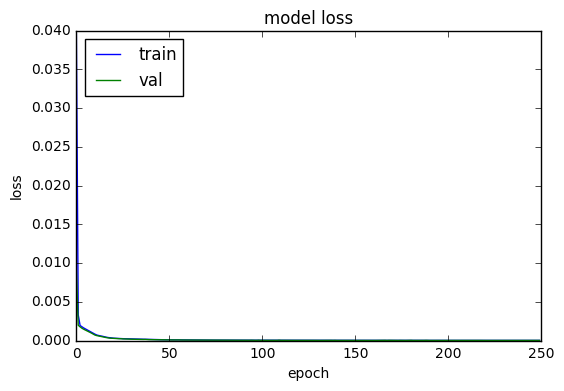

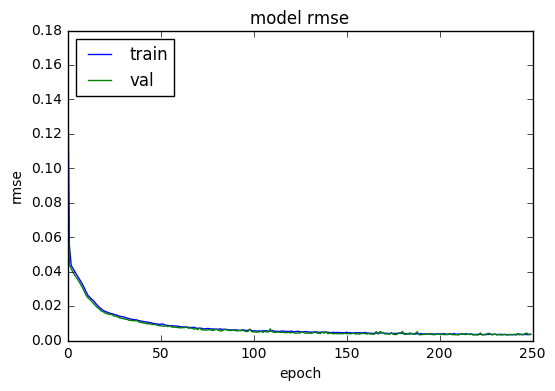

In [36]:
#plotting the loss and accuracy curves w.r.t the number of epochs
stateless_learn_curve(history1)

In [ ]:
#plotting the model structure
# import os
# os.environ["PATH"] += os.pathsep + 'C:/Users/Simar/Anaconda3/Menu/graphviz-2.38/release/bin/'

show_model(model_1, to_file='model_1.png')
IPython.display.Image('model_1.png')

In [ ]:
weights_saved_file= 'weights_1.hdf5'
model_1.load_weights(weights_saved_file)

In [40]:
scores = model_1.evaluate(X_test, Y_test, verbose=0)
print("Overall RMSE for normalized values", (scores[1]))

Overall RMSE for normalized values 0.003463786849169992


In [42]:
#preditcions
Y_Pred_train = model_1.predict(X_train)
Y_Pred_val = model_1.predict(X_val)
Y_Pred_test = model_1.predict(X_test)

In [43]:
#calculate RMSE

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train XRMSE: ', xrmse)
print('YRMSE: ', yrmse, '\n')

xrmse, yrmse= calculate_RMSE(Y_Pred_val, Y_val)
print('Val XRMSE: ', xrmse)
print('YRMSE: ', yrmse, '\n')

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test XRMSE: ', xrmse)
print('YRMSE: ', yrmse)


Train XRMSE:  4.396656958387335
YRMSE:  3.570110685238413 

Val XRMSE:  3.409476562921951
YRMSE:  3.8542622045445607 

Test XRMSE:  3.437985215651318
YRMSE:  3.8633600704424653


In [44]:
#compare Y_test and Y_Pred_test
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [118.51151431 430.49450549]
Y_Pred:  [118.23112 427.8373 ] 

Y_true:  [793.32903715 459.22020725]
Y_Pred:  [794.77295 456.8923 ] 

Y_true:  [641.97040169 511.93164557]
Y_Pred:  [641.362  512.4439] 

Y_true:  [422.33083832 321.88686131]
Y_Pred:  [420.91864 320.52136] 

Y_true:  [1312.50563287   93.32577132]
Y_Pred:  [1314.4718    90.49678] 

Y_true:  [325.91991018 377.84671533]
Y_Pred:  [325.23447 376.03482] 

Y_true:  [330.67723191 307.52031979]
Y_Pred:  [328.7858  308.02454] 

Y_true:  [1048.  483.]
Y_Pred:  [1046.8287   482.43082] 

Y_true:  [749.17696778 380.63957362]
Y_Pred:  [749.9647  377.91055] 

Y_true:  [208.39637125 509.32234432]
Y_Pred:  [208.0952  509.09885] 

Y_true:  [599.07202426 415.31606218]
Y_Pred:  [602.53503 413.28204] 

Y_true:  [569.19281564 426.33910726]
Y_Pred:  [576.4063 425.0055] 

Y_true:  [263.61206897 642.8580402 ]
Y_Pred:  [263.65512 640.40485] 

Y_true:  [1116.7244582   549.37888199]
Y_Pred:  [1119.3438  545.4471] 

Y_true:  [745.17816092 341.753

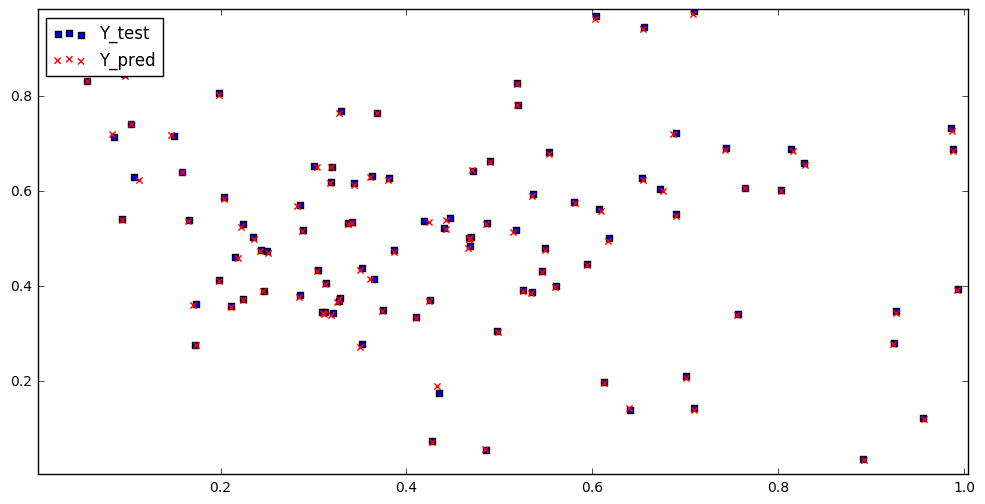

In [46]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

Since the LSTM networks are stochastic, therefore they will be trained for a sufficient sample size ,i.e., 30 iterations and the mean score of these iterations will determine the skill of the model.

In [47]:
#stateless LSTM with shuffle=True for 30 iterations
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()
for i in range(sample_size):
    print('Experimental Run: ', i)
    model_1= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
    
#     es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    model_1.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=250, verbose=0, shuffle=True)
    
    Y_pred = model_1.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print('X_RMSE: ', X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y_RMSE: ', Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

X_RMSE:  [3.8638600138479173, 3.574261893638937, 3.5685337336159053, 3.3049857706187447, 3.929413447300163, 3.58001314003245, 4.1465584414157375, 3.150815439431564, 3.9380041198451443, 3.6053886549765757, 3.2535047670873287, 3.6717613468705617, 3.3249136739786533, 3.7418830812388366, 3.111348895269441, 3.7804031307189714, 3.3714684522628473, 3.476452875480969, 3.4320153585535773, 3.2765560325605, 3.2519551179307578, 3.5354829392467284, 3.185413646585142, 3.2482528942872237, 3.1882447917828953, 3.3546132276365883, 3.26069269943725, 3.6839431321540133, 3.339740635560777, 7.673846704280787]
X-coord RMSE Mean: 3.6274776019215667

Y_RMSE:  [3.7967575704296497, 3.352467503837997, 3.181947846568559, 3.2933562898023343, 3.2655620935881777, 3.3947773264629224, 3.3462674885621624, 3.3553261226138718, 3.4667601501027674, 3.216722128898912, 3.321251763706026, 3.517879558039286, 3.251788332911781, 3.541119597312639, 3.7415296162932465, 3.210569531680233, 3.360293348919051, 3.209140570873333, 3.389475157913727, 3.481695122774026, 3.559455390098346, 3.749080381432609, 3.132506819674828, 4.694896136974012, 3.3142238723335704, 3.345404141549558, 3.4833708665008047, 3.46872533447995, 4.179549502924856, 3.336508018067454]
Y-coord RMSE Mean: 3.465280252844223
Time Took :197.67 min 

This model is not performing very good. So, next the model is trained with shuffle=Flase

Hyp 2: Stateless LSTM without shuffling will outperform the stateless LSTM with shuffling.
Train another stateless LSTM model with shuffle=False

In [33]:
#Definition and Compilation
model_2= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
model_2.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 30)                3960      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 4,022
Trainable params: 4,022
Non-trainable params: 0
_________________________________________________________________


In [41]:
#training the same model with the shuffle parameter False
history2= stateless_fit(model_2, X_train, Y_train, X_val, Y_val, batch=128, epochs=250, weights_saved_file= 'weights_2.hdf5', shuffle=False)

Train on 7680 samples, validate on 2560 samples
Epoch 1/250
 - 5s - loss: 0.1136 - rmse: 0.3197 - val_loss: 0.0184 - val_rmse: 0.1356

Epoch 00001: val_loss improved from inf to 0.01844, saving model to weights_2.hdf5
Epoch 2/250
 - 2s - loss: 0.0063 - rmse: 0.0756 - val_loss: 0.0025 - val_rmse: 0.0502

Epoch 00002: val_loss improved from 0.01844 to 0.00252, saving model to weights_2.hdf5
Epoch 3/250
 - 2s - loss: 0.0019 - rmse: 0.0435 - val_loss: 0.0017 - val_rmse: 0.0415

Epoch 00003: val_loss improved from 0.00252 to 0.00173, saving model to weights_2.hdf5
Epoch 4/250
 - 2s - loss: 0.0015 - rmse: 0.0388 - val_loss: 0.0016 - val_rmse: 0.0394

Epoch 00004: val_loss improved from 0.00173 to 0.00156, saving model to weights_2.hdf5
Epoch 5/250
 - 2s - loss: 0.0014 - rmse: 0.0373 - val_loss: 0.0015 - val_rmse: 0.0379

Epoch 00005: val_loss improved from 0.00156 to 0.00145, saving model to weights_2.hdf5
Epoch 6/250
 - 2s - loss: 0.0013 - rmse: 0.0359 - val_loss: 0.0013 - val_rmse: 0.0365


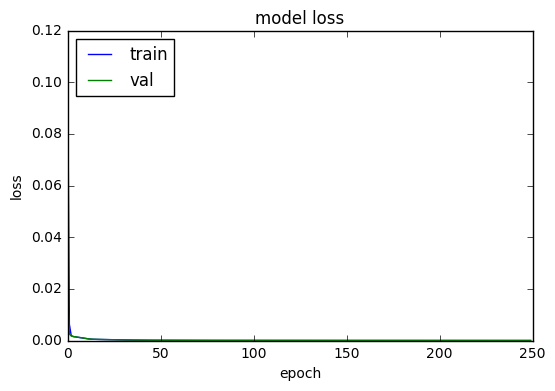

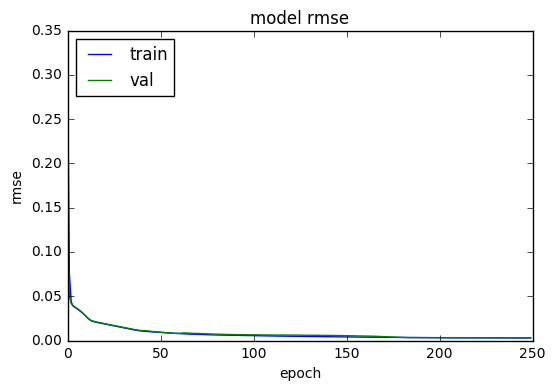

In [43]:
#plotting loss and accuracy curves
stateless_learn_curve(history2)

This model's learning curves show better performance.

In [ ]:
#show the architecture of model
show_model(model_2, to_file='model_2.png')
IPython.display.Image('model_2.png')

In [34]:
weights_saved_file= 'weights_2.hdf5'
model_2.load_weights(weights_saved_file)

In [48]:
scores = model_2.evaluate(X_test, Y_test, verbose=0)
print("Overall RMSE on training", (scores[1]))

Overall RMSE on training 0.002413649731897749


In [49]:
Y_Pred_train = model_2.predict(X_train)
Y_Pred_val= model_2.predict(X_val)
Y_Pred_test = model_2.predict(X_test)

xrmse,yrmse= calculate_RMSE(Y_Pred_train, Y_train)
print('Train Score (X-coord): ', xrmse)
print('Train Score (Y-coord): ', yrmse)

xrmse,yrmse= calculate_RMSE(Y_Pred_val, Y_val)
print('Val Score (X-coord): ', xrmse)
print('Val Score (Y-coord): ', yrmse)

xrmse,yrmse= calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) unseen data: ', xrmse)
print('Test Score (Y-coord) unseen data: ', yrmse)

Train Score (X-coord):  1.1598713232994793
Train Score (Y-coord):  0.7638590383823893
Val Score (X-coord):  1.1256344188213228
Val Score (Y-coord):  0.9803497417559907
Test Score (X-coord) unseen data:  1.0761722422986038
Test Score (Y-coord) unseen data:  0.7604220274796203


RMSE for both x and y coordintaes is lower. Thus, Hyp accepted that the model with shuffle=False performs better.

In [50]:
#comparing the true test values and the preicted values
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [226.48988137 599.81196581]
Y_Pred:  [227.53621 599.6036 ] 

Y_true:  [390.90978014 595.5984456 ]
Y_Pred:  [391.80466 595.3043 ] 

Y_true:  [296.17195208 547.84303797]
Y_Pred:  [296.88995 546.27966] 

Y_true:  [207.21482036 519.36253041]
Y_Pred:  [207.55263 519.6675 ] 

Y_true:  [381.45725646 500.53176044]
Y_Pred:  [380.02838 500.2922 ] 

Y_true:  [199.8742515  520.30778589]
Y_Pred:  [200.61989 519.89044] 

Y_true:  [377.06867406 440.41239174]
Y_Pred:  [377.64304 439.6591 ] 

Y_true:  [364.32924188 570.38289963]
Y_Pred:  [363.9746 572.7396] 

Y_true:  [351.65874274 497.87208528]
Y_Pred:  [351.5956  497.95627] 

Y_true:  [247.67271458 569.76923077]
Y_Pred:  [248.01453 569.3972 ] 

Y_true:  [173.51933283 546.61658031]
Y_Pred:  [174.63309 546.7628 ] 

Y_true:  [307.25303751 527.37841439]
Y_Pred:  [308.14276 527.50903] 

Y_true:  [369.38433908 547.04648241]
Y_Pred:  [369.8705  547.11316] 

Y_true:  [261.40170279 537.66956522]
Y_Pred:  [262.43387 537.86084] 

Y_true:  [196.27227011

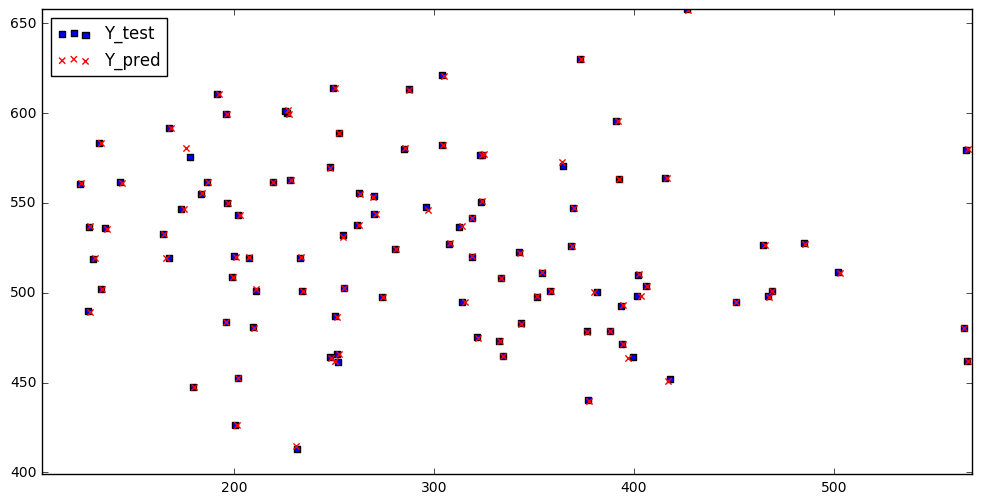

In [51]:
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test)

X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [50]:
#stateless LSTM with shuffle=False for 30 iterations
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()
for i in range(sample_size):
    print('Experimental Run: ', i)
    model_2= stateless_LSTM(units=30, lr=0.001, alpha=0.05)
    
    model_2.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=250, verbose=0, shuffle=False)
    
    Y_pred = model_2.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print('X_RMSE: ', X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y_RMSE: ', Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

X_RMSE:  [3.132884106657178, 2.899236451903749, 2.7775605990038765, 2.7197092325489587, 2.739128583343533, 2.882740831161837, 3.4441802619708337, 2.9431993095044207, 2.6785961053019562, 2.9993886996187933, 3.0136683755473883, 3.169546668213932, 2.8141541099087592, 3.1514438588964526, 2.9475300048675175, 3.4560114409237173, 2.9217318269005927, 3.8593901634907932, 3.1662973654589623, 3.4300809889414094, 2.950265128893893, 4.020759499395279, 3.0034136150684, 3.3377640101646944, 3.1801293892197133, 3.184609627841138, 2.874834389655929, 2.854522194252458, 3.3665059379489524, 3.2065160076356873]
X-coord RMSE Mean: 3.104193292808027

Y_RMSE:  [2.7036203466855513, 3.5692666256642354, 3.5438625246076545, 2.861221612718203, 3.0635244572964453, 3.251024408265661, 3.0673900641573644, 3.104137715913639, 3.505972596575025, 2.9524093650211247, 3.3127966516297986, 3.7532142657446284, 3.2579144489629868, 3.435071643344412, 3.4171803115750046, 3.08557116735353, 3.2955633112746563, 2.9366414793468096, 3.510459767521567, 3.606878615551585, 2.972126986392119, 3.342037728940476, 2.9754661818689447, 3.5578596760688486, 3.285400419094562, 3.3146954116562504, 3.1493764020113955, 3.1051193706151166, 3.1305218591197357, 3.8125291075049916]
Y-coord RMSE Mean: 3.262628484082744
Time Took :201.03 min

From the results above, it can be seen that Model-2 with shuffle=False performs better than Model-1 with shuffle=True.

In [ ]:
# Xp=[]
# Xt=[]
# Yp=[]
# Yt=[]
# print(Y_Pred_test[0])
# print(Y_test[0])
# Xp.append(Y_Pred_test[0][0])
# Xt.append(Y_test[0][0])
# Yp.append(Y_Pred_test[0][1])
# Yt.append(Y_test[0][1])
# X_RMSE= math.sqrt(mean_squared_error(Xt, Xp))
# Y_RMSE= math.sqrt(mean_squared_error(Yt, Yp))
# print(X_RMSE)
# print(Y_RMSE)

In [36]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=50
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset = [i for i in testing_dataset]
            pred_dataset= scaler.fit_transform(pred_dataset)
            pred_dataset= pred_dataset.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence = np.array([j for j in pred_dataset[i:i+timesteps]])
                input_sequence = np.reshape(input_sequence,(1,input_sequence.shape[0],input_sequence.shape[1]))
                temp = model_2.predict(input_sequence)
                pred_dataset.append([temp[0][0],temp[0][1]])
            pred_dataset = scaler.inverse_transform(pred_dataset)
            pred_dataset= pred_dataset.tolist()
            pred_dataset[:] = [[int(data[0]), int(data[1])] for data in pred_dataset]
            for [_x,_y] in pred_dataset[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

Still, the RMSE is large and needs to be improved. Stacked LSTMs ,i.e. LSTM's having more than 1 hidden layer areknown to learn complex problems better than simple LSTMs. So, lets add one more layer and check the performance of the model.

In [64]:
#stacked model
timesteps=18
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def stacked_stateless_LSTM(units, lr, alpha):
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2)))
    model.add(LSTM(units, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
model_3=stacked_stateless_LSTM(30,0.001,0.05)
model_3.summary()

In [ ]:
history3= stateless_fit(model_3, X_train, Y_train, X_val, Y_val, batch=105, weights_saved_file='weights_3.hdf5', shuffle=False)

In [ ]:
stateless_learn_curve(history3)

In [ ]:
show_model(model_3, to_file='model_3.png')
IPython.display.Image('model_3.png')

In [ ]:
weights_saved_file= 'weights_3.hdf5'
model_3.load_weights(weights_saved_file)
scores = model_3.evaluate(X_test, Y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

In [ ]:
Y_Pred_test = model_3.predict(X_test)
print(Y_Pred_test)

In [ ]:
# invert predictions
Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
Y_test = scaler.inverse_transform(Y_test)
print(Y_Pred_test)
print(Y_test)

In [ ]:
#calculate RMSE
Xcoord_pred=[]
Xcoord_true=[]
Ycoord_pred=[]
Ycoord_true=[]

for i in range(0,len(Y_Pred_test)):
    Xcoord_pred.append(Y_Pred_test[i][0])
    Ycoord_pred.append(Y_Pred_test[i][1])
    
for i in range(0,len(Y_test)):   
    Xcoord_true.append(Y_test[i][0])
    Ycoord_true.append(Y_test[i][1])

X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))

print('Test Score (X-coord) (unseen data): ', X_RMSE)
print('Test Score (Y-coord) (unseen data): ', Y_RMSE)

The RMSE does not show any improvement, infact it has worsened. Simple LSTM with shuffle= False gives the best results so far.

In [ ]:
#comparing the true test values and the preicted values
for i in range(len(Y_test)):
    print('Y_test: ', Y_test[i])
    print('Y_Pred_test: ', Y_Pred_test[i], '\n')

In [ ]:
#plot first 100 test values ad their respective predictions
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [65]:
#Stacked stateless LSTM for 30 iterations with shuffle=False
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Experimental Run: ', i)
    
    model_3= stacked_stateless_LSTM(30,0.001, 0.05)
    model_3.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=128, epochs=250, verbose=0, shuffle=False)
    
    Y_pred = model_3.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)) +'\n')

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

[3.4399926063797786, 5.435782332095149, 5.265250157629149, 5.105337301549765, 5.229657889913689, 5.468824057656704, 3.877964326142917, 4.99113459876866, 5.658503080284233, 5.719522119818012, 5.320210585434603, 3.5379749590548766, 5.446521061384451, 3.2185106982171012, 5.8746113699087985, 6.5861495013397, 5.518772750103624, 5.428957979753688, 3.278992580463898, 3.294782227311086, 5.636806838803614, 4.989542769659273, 3.182968573886001, 6.0029679189929075, 5.074994260654921, 4.97556233647181, 5.338687093460414, 5.403882466806617, 5.538179813810882, 5.40903637140223]
X-coord RMSE Mean: 4.975002687571952

[3.4049292872198023, 2.514981362963333, 2.609920582483665, 2.5451275351386338, 2.5608166468379805, 2.6153586712995183, 3.345365225725048, 2.6165729503734068, 2.6211989559814834, 2.5443685560664684, 2.6366319308613, 3.331233203056792, 2.7239030453989352, 3.5648456355785934, 2.5987111537589205, 2.637705174376308, 2.6632829612592657, 2.581523800936629, 3.046565764888689, 2.730198230269043, 2.649733562799886, 2.585393402113828, 3.444896162502161, 2.6852256194586857, 2.8423289500327975, 2.6570708201016027, 2.634247986299084, 2.822099194347487, 2.627655805049405, 2.5865193584986783]
Y-coord RMSE Mean: 2.7809470511892473

Time Took :453.54 min

comparing these reults to the previous models Y-RMSE is much better but X-RMSE is much worse and it takes double the time consumed by previous models. Overall it does not outperform the model trained before (model-2).

As seen from the evaluation metrics the model has learnt pretty well. But it has learnt to predict the coordinates of one position from a sequence of 18 coordinates. The LSTM networks are stateful. They should be able to learn the whole sequence, but by default the Keras implementation resets the network state after each training batch. Now, we will train stateful LSTMs with the memory being reset after each epoch instead of being reset after each batch.

In this model trained, the m/m of the LSTM is reset after each batch and it is being treated somewhat like a standard MLP. LSTM has the capability to remeber long sequences. So, now the model will be trained by resetting the memory after each epoch, i.e, after it has seen the entire training dataset. This will maintain the memory between the bathces.

Ideally, we want to expose the network to the entire sequence and let it learn the inter-dependencies, rather than us define those dependencies explicitly in the framing of the problem. We can do this in Keras by making the LSTM layers stateful and manually resetting the state of the network at the end of the epoch, which is also the end of the training sequence.
This is truly how the LSTM networks are intended to be used.

In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu) for stateful LSTM
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a):
    X_error_scores = []
    Y_error_scores = []
    hist_val_loss = []
    
#     Y_test = scaler.fit_transform(Y_test)
    
    # fit the model
    lstm_model = stateful_LSTM(n, lr, batch, a)
    for i in range(300):
        hist= lstm_model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
        hist_val_loss.append(hist.history['val_loss'])
        #manual early stopping while monitoring the validtaion loss and stopping when the loss does not improve for 2 continuous epochs.
        if(i!=0):
            if((hist_val_loss[i-1][0]-hist_val_loss[i][0])<=0):
                count+=1
                if(count==2):
                    if(i<50):
                        count=0
                    else:
                        print('Epochs stopped because of no improvement. Epoch Number: ', i)
                        break
                else:
                    pass
            else:
                count=0
        else:
            count=0
        lstm_model.reset_states()
    Y_Pred = lstm_model.predict(X_test, batch_size=batch)
    lstm_model.reset_states()
    
    Y_Pred = scaler.inverse_transform(Y_Pred)
    Y_test = scaler.inverse_transform(Y_test)
    # report performance
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]
    for i in range(0,len(Y_Pred)):
        Xcoord_pred.append(Y_Pred[i][0])
        Ycoord_pred.append(Y_Pred[i][1])
    for i in range(0,len(Y_test)):   
        Xcoord_true.append(Y_test[i][0])
        Ycoord_true.append(Y_test[i][1])
    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    print('Test XRMSE: ', str(X_RMSE))
    print('Test YRMSE: ', str(Y_RMSE))
    X_error_scores.append(X_RMSE)
    Y_error_scores.append(Y_RMSE)
    return X_error_scores, Y_error_scores
start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60,70]
learn_rate= [0.001,0.01]
batch_size= [105, 210, 315, 420, 504]
alpha=[0.02,0.05,0.1,0.2,0.3]
for n in neurons:
    print(n)
    for lr in learn_rate:
        print(lr)
        for batch in batch_size:
            print(batch)
            for a in alpha:
                print(a)
                print('Model Number: ', count)
                model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)+','+str(a)]
                count+=1
                X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a)
# summarize results
print(X_coord_results.describe())
print(Y_coord_results.describe())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
summarize_X(X_coord_results)
summarize_Y(Y_coord_results)
X_boxplot(X_coord_results)
Y_boxplot(Y_coord_results)
print(X_coord_results.head())
print(Y_coord_results.head())
print('Completed')

The hyperparameter tuning for a stateful LSTM results in minimum XRMSE and YRMSE with the same parameters as they were returned by the hyperparameter tuning of stateless LSTM, i.e., 30 units, 0.001 learn rate and, 150 batch size.

In [51]:
#LSTM with m/m between batches
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def stateful_LSTM(units, lr, batch, alpha):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
#function to test overfitting or underfitting of the model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #call function to invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE

def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(500):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    return history
    
def show_plot(fig):
    fig.show()

def run(repeats, units, learn_rate, batch, alpha, X_train, Y_train, X_val, Y_val, X_test, Y_test):
    start = time.time()
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= stateful_LSTM(units=units, lr=learn_rate, batch=batch, alpha=alpha)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")

    ax1.legend(loc='best')
    ax2.legend(loc='best')

    fig1.savefig('XRMSE_LSTM_500epochs.png')
    fig2.savefig('YRMSE_LSTM_500epochs.png')
    
    show_plot(fig1)
    show_plot(fig2)
    
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    
run(repeats=5, units=30, learn_rate=0.001, batch=128, alpha=0.05, X_train=X_train, Y_train=Y_train, X_val=X_val, Y_val=Y_val, X_test=X_test, Y_test=Y_test)

In [ ]:
# Xtrain_RMSE:  [174.22991679676701, 62.97412788155803, 53.967072523232915, 50.519077763749465, 47.68760776097637, 44.947407295609395, 42.1522267699749, 39.22341200489819, 36.10890907680952, 32.636903663389866, 30.01845340967587, 28.028525388736472, 26.931333944698697, 25.991246901581423, 25.17763046709487, 24.39960200424356, 23.65001473515434, 22.87589012196599, 22.147984984672405, 21.432974638974933, 20.739021517437664, 20.11529100806774, 19.51227304226614, 18.96763109355973, 18.474575644576735, 18.034290420117916, 17.645549966201617, 17.271051262442413, 16.898990748851123, 16.53387096936, 16.18528553416988, 15.8740104976467, 15.595846523649078, 15.350967858005523, 15.165592674317471, 15.12448445842213, 15.12379018070334, 15.119017539319625, 14.823360159663435, 14.576692063243309, 14.39407770057606, 14.248114795628428, 13.93579490627143, 13.581701525303886, 13.261365285937293, 12.890508135446925, 12.61156081418159, 12.472354744971273, 12.369398514873055, 12.306936500277484, 12.224854421284768, 12.124449091061704, 12.053589062319222, 12.050610814530444, 11.99000502019534, 11.927634017369442, 11.866557003933323, 11.805592729541992, 11.730029450876904, 11.653967529521164, 11.578998130782933, 11.525151390232958, 11.484223589269385, 11.45391920082548, 11.4362326362014, 11.477468382389786, 11.473639413335432, 11.489145998158065, 11.431897164688673, 11.430515203400072, 11.414404511873697, 11.283994082566654, 11.221619985304491, 11.058926028967194, 10.871754665725392, 10.684713266210203, 10.554976584420151, 10.495205456243339, 10.320188408282618, 10.161540181792512, 9.97195936522718, 9.914059783642346, 9.769455257667168, 9.614673710362196, 9.405860489730935, 9.26238741661588, 9.176208656074092, 9.06062814099665, 8.92622505329396, 8.826497998514368, 8.72747444242272, 8.648094283068193, 8.523327304567863, 8.453158387147115, 8.433604485537295, 8.347047768548762, 8.276775912511123, 8.22093976511351, 8.151345335492136, 8.036148249514573, 8.021720179547792, 7.943347721836173, 7.912679538892865, 7.942020516604119, 7.896853966540238, 7.882637218432718, 7.992425499999142, 7.962549623949624, 7.988508027801819, 7.934883670818242, 7.872045472133879, 7.747021330384177, 7.530847174605812, 7.257657904915489, 6.857843200166908, 6.306324045143488, 5.916458866741325, 5.640516411255163, 5.56090336528679, 5.499661111538423, 5.467291452409577, 5.433717067082066, 5.393333187890427, 5.360083970246692, 5.337925552826795, 5.312667948357318, 5.283773899500095, 5.2553448389363195, 5.220021679678138, 5.189425150512368, 5.1544115323015145, 5.122432249467685, 5.090541694000006, 5.0548681754095695, 5.015309377885409, 4.976296794158199, 4.93895799094363, 4.900562335569656, 4.863314276694237, 4.8298765026018255, 4.794543717804936, 4.767256866686661, 4.739082174583581, 4.716408579883251, 4.695780476550963, 4.67505191671881, 4.644702458895435, 4.612161664129356, 4.582487052038349, 4.55055963058359, 4.5249267636769215, 4.500629838577033, 4.479965140688696, 4.45835675299443, 4.44524590298963, 4.427421999766223, 4.41002810998533, 4.4036536202206715, 4.375163586509999, 4.394012861506698, 4.409817490214586, 4.39937420853406, 4.3917230362771456, 4.393111201007295, 4.364280167497959, 4.3569386252436955, 4.372141977258342, 4.35585132642288, 4.39104913726, 4.354880542124639, 4.402877306321597, 4.319702932996124, 4.280639227432717, 4.3013782472253235, 4.359755368737461, 4.274212902349428, 4.278518243978619, 4.230718083537896, 4.283604022928001, 4.211354460059223, 4.197370735037738, 4.170538124986687, 4.194898127912642, 4.15915283087279, 4.0921001043068985, 4.093885323224369, 4.149871998844, 4.110008561461119, 4.0511829583525865, 3.9964294887357488, 4.060639111945415, 4.062793812164881, 3.9961023748503717, 3.9747650882543812, 3.9604809313425315, 3.9569941941963442, 3.9490448459462377, 3.910007794253585, 3.891705613279138, 3.8943776972284336, 3.941781494977009, 3.8829121199005834, 3.8061155973691605, 3.792155304874836, 3.767462344925862, 3.7524565348554852, 3.767485526496827, 3.77586611523048, 3.750448356007288, 3.7281394952156597, 3.697687067354625, 3.7067503551587957, 3.67289001741392, 3.6645975999890257, 3.6795194168701, 3.6686947643795387, 3.655137136071534, 3.6599576447031223, 3.645639721476259, 3.638411504880006, 3.6512955225376293, 3.660287047421966, 3.6389309059710615, 3.6664580300997076, 3.6764412878227875, 3.6588541338109057, 3.627271176898343, 3.5663833683044435, 3.5477161547331453, 3.5275867114040054, 3.4829108234050414, 3.4795422737249706, 3.5228634265167917, 3.475582418840022, 3.4825196444693485, 3.495089073906516, 3.520801967934444, 3.5407112499767197, 3.620721139759584, 3.6468555310938124, 3.64338549761484, 3.506864830197786, 3.3922919952848436, 3.3816557266996217, 3.3427531682819804, 3.3618768652134774, 3.3755095128051598, 3.3464766609211707, 3.357874494598001, 3.3700637228855563, 3.3953623315612664, 3.4248087753810017, 3.5091774760447714, 3.568800389811085, 3.6370261314826307, 3.4518746176014417, 3.33823714346937, 3.294501014882065, 3.3104224335422368, 3.325147357583259, 3.2963005013311792, 3.2870778320698766, 3.2943803343214455, 3.3008960410835586, 3.3344514058375525, 3.3339559321236143, 3.384724677544699, 3.355485069282871, 3.3501664353110865, 3.315089562927476, 3.249673174713357, 3.281882429826573, 3.267854986107642, 3.2589684880574117, 3.2299512986034817, 3.2366510151291568, 3.2491097373114273, 3.256923436085406, 3.2217908878202506, 3.2836589674336993, 3.2726441612954513, 3.28353615669782, 3.1908576651669613, 3.190809367073293, 3.206011355050126, 3.190248245981394, 3.1869029900595693, 3.2111545707004097, 3.212130021381419, 3.1801013372532303, 3.1381933799350974, 3.1525860921071267, 3.1635195716239153, 3.1853751687184344, 3.1860217819621166, 3.1438642995784316, 3.1656301589019, 3.163205600489623, 3.1689232352475374, 3.1900342758934035, 3.2214719822034996, 3.143074486798944, 3.1762796106888427, 3.2187329685227346, 3.19167361998743, 3.1460158772429665, 3.0993576801776372, 3.1008712372942067, 3.1563844087571176, 3.1250006730257796, 3.1129378406038377, 3.0825512081879736, 3.0854665877498215, 3.1003533601639535, 3.1009822112569516, 3.0921567013024482, 3.0800242877636372, 3.060037755845011, 3.1041529114743147, 3.151178218845448, 3.1429496355681366, 3.1054375582805753, 3.055163134872729, 3.0847980156564865, 3.0872085177804776, 3.044039590298653, 3.053207936076421, 3.0555599413620054, 3.073029559189334, 3.090927673942817, 3.081344653293773, 3.0772128965392107, 3.0744536928091106, 3.081355053450827, 3.0466232304440295, 3.0551355389736323, 3.0236008880946716, 3.0407711951758056, 3.0410383104963175, 3.05365986095547, 3.030431177999123, 3.024006859127646, 3.0613201916514714, 3.0224309562246416, 3.047428534758854, 3.0161724326671133, 3.0295779617766123, 3.038262978127968, 3.044194873642728, 3.0250936254715683, 3.041385416077598, 3.0076700647608985, 3.0316660349527265, 3.0010976016807573, 3.0177973932056785, 2.9982526718869065, 3.027722596480678, 3.003679295292502, 3.0214604165025123, 2.991120551709928, 2.9925844566337743, 2.9939629302874162, 3.0035521972620045, 3.007780748247317, 3.0175122957557807, 3.004148804752869, 3.003236711180005, 2.979623624750681, 2.9852067344663724, 2.9769529415805596, 3.004534761838463, 2.9812343623037387, 2.988629516476821, 2.9746291041580646, 2.9814506806315455, 2.9854891708279485, 2.982369428015885, 2.9865531571145945, 2.9799373708038543, 2.966733121982168, 2.9618640333699986, 2.955085063567756, 2.9537061651148013, 2.9551384887935206, 2.9654755018468295, 2.946930249182987, 2.9568703465855712, 2.949954150667289, 2.954532563841939, 2.952576151848952, 2.952960060422849, 2.944915183009822, 2.9589831578283294, 2.951912571077834, 2.9491795487066943, 2.941509761388901, 2.9489783897409576, 2.9474396212098855, 2.9501570219636473, 2.9382909203445418, 2.948546835450629, 2.94127957383734, 2.949028511385439, 2.937564101908872, 2.945043435753207, 2.940784121045531, 2.941911986728402, 2.936814764137521, 2.9414163095033485, 2.934556610637887, 2.938210980910391, 2.937475442013585, 2.936420117496539, 2.9323128334652595, 2.933989354874104, 2.9306157495960194, 2.933553351642432, 2.924343128203442, 2.927903450540249, 2.930016519305774, 2.9311903899949576, 2.926679986239183, 2.929529030914256, 2.924897113564286, 2.926207229204404, 2.9236965093309206, 2.925711764976036, 2.9256325965044985, 2.924362573566213, 2.9207260394915635, 2.926353649135842, 2.922489189721753, 2.9216475755022633, 2.9198054690236748, 2.923469448562001, 2.917622547354821, 2.9210456219394394, 2.919715227268874, 2.9223910915716473, 2.9155929662291364, 2.91737262268677, 2.919683071249962, 2.9296260670247385, 2.921062834150267, 2.921388495511669, 2.9195221351124454, 2.925951267911014, 2.9194301959503397, 2.9212370059967077, 2.915599343020686, 2.9169586036964885, 2.917363226626981, 2.9196248989120415, 2.9173052261927657, 2.9217142069453894, 2.91624085938577, 2.9224314525747612, 2.9210167571602392, 2.9158604554460457, 2.9170004755534498, 2.915034707704686, 2.912468722249214, 2.9148711199920356, 2.9165071452419076, 2.916667602658984, 2.909684570072507, 2.918191161303821, 2.9202574425015184, 2.9152238112132394, 2.9209109951210253, 2.920062895534729, 2.937493400591597, 2.9183867782058264, 2.9190855357581453, 2.935671897308074, 2.918852292359054, 2.935290882654772, 2.918936974785442, 2.9147772565935344, 2.9117204976178654, 2.9159491703781257, 2.911985777672066, 2.9023190087393114, 2.90717253352794, 2.9041051954817503, 2.9037299767121825, 2.919402071903148, 2.9235980897660356, 2.900158556993119, 2.902862581554533, 2.9160688198797375, 2.906885645588153, 2.895499292661791, 2.9143440602053414, 2.9153762950363373, 2.9098038770960044, 2.920872546878692, 2.9214208648658877, 2.912980618666351, 2.9111481932533714]
# Ytrain_RMSE:  [87.14283462449637, 45.93295246154922, 37.67597135646219, 34.08962310722749, 32.1204868295215, 30.49018184815294, 28.84148632045309, 26.977897749353964, 24.709518946241573, 22.050472570874035, 20.005586134393504, 19.25633034943313, 18.421632400153225, 17.75418744462442, 17.2660316884207, 16.922393056184493, 16.6771657331381, 16.49852981898824, 16.292756878270424, 15.938624892900043, 15.350359383797004, 14.73548512958156, 14.27549578554086, 13.89655306118321, 13.498490278708623, 13.094469926031211, 12.715543206235477, 12.352176226005529, 11.971275912906618, 11.610295981063837, 11.281160993292099, 10.981438386815274, 10.710520248564343, 10.457291697494016, 10.219639502036292, 9.996603166540806, 9.79206579363573, 9.6031896616129, 9.436971779657378, 9.255356372591075, 9.073498256556602, 8.964590190574468, 8.890496214918562, 8.82827030048259, 8.722879849622428, 8.5524173549753, 8.232886436004057, 8.025134168989103, 7.904111005126388, 7.801839718311468, 7.628266821324092, 7.440644527690813, 7.260640155094274, 7.126813977659982, 7.023850470291403, 6.946360824545057, 6.881801559417717, 6.821795334374701, 6.7634128250726215, 6.7058536257775065, 6.646386113178553, 6.588302670464733, 6.5321636974444095, 6.481841990200623, 6.432777757244421, 6.387123293580255, 6.344311003950957, 6.302809713764565, 6.258227926758497, 6.214205351030797, 6.172954425920399, 6.124212398704255, 6.083488737444355, 6.038441664149998, 6.0001378325579715, 5.958529209361646, 5.920063260228881, 5.888738196816407, 5.851956387474443, 5.820262269822963, 5.784334548008232, 5.752055593877045, 5.719026331995776, 5.693257744562084, 5.661122155561252, 5.6380106951263445, 5.617254763903821, 5.594091578398767, 5.563164596412937, 5.5321171232251345, 5.503389626517821, 5.47774183263753, 5.444268696342428, 5.418304968343379, 5.393706073468619, 5.3616232683519645, 5.330371195805899, 5.290530552201453, 5.2548452113359065, 5.223953593769254, 5.192464001977316, 5.156571439796156, 5.119580037192148, 5.065704987911513, 5.0177138753618635, 4.9656583116225335, 4.911201860576765, 4.853484278251031, 4.788648215226215, 4.726651621734094, 4.661950463894161, 4.6046268998971, 4.5485303120396905, 4.503669967555449, 4.454667909922663, 4.404790051451038, 4.355988768752477, 4.318284326245376, 4.287015085500001, 4.2703107756102945, 4.261568780285404, 4.2401402312625205, 4.25003446414, 4.229871054192062, 4.235622028285927, 4.197717704874501, 4.174456192218793, 4.159455657316231, 4.109695096139569, 4.08754414880756, 4.0475442661930945, 4.019923696932543, 3.9824182272557653, 3.959463615151262, 3.9262750704169718, 3.905439442938387, 3.883448047244818, 3.8591911056674206, 3.836012899390112, 3.80757107264379, 3.7829713096969306, 3.748206657724556, 3.726844011616735, 3.6905700642036017, 3.6665694071063006, 3.6435053480517383, 3.640166959159234, 3.6493453797284348, 3.6710354680361785, 3.678422911451545, 3.660409227553252, 3.627995116261798, 3.585605206577716, 3.562135210193233, 3.5485090726225463, 3.527814854476089, 3.5290837554604897, 3.518236691900669, 3.5107401092846633, 3.4981855221941633, 3.4887052244979295, 3.4718214743098152, 3.4496076795163737, 3.437970060255157, 3.419176545129479, 3.4043755139588003, 3.3974972035064446, 3.3812149051175022, 3.3839796451337554, 3.364821040933991, 3.3664944847514136, 3.341282882238236, 3.3311079148537126, 3.3242301597307695, 3.32071919325886, 3.2956901545334465, 3.300829295564751, 3.2884625391663174, 3.290873496104014, 3.268837320510735, 3.2646730111798496, 3.2525181454827408, 3.2543763796279026, 3.2472823564486837, 3.222069689250675, 3.225448443993318, 3.244311671210665, 3.234117325766922, 3.2114190047313556, 3.180483397464466, 3.2079148923898786, 3.211317060753726, 3.186231703384125, 3.1714604600803535, 3.1701507923002397, 3.163645320156952, 3.1634699141456526, 3.161399124297702, 3.14777826992976, 3.1420538252212795, 3.157973462938626, 3.1494627897549066, 3.1262135838094975, 3.126393645233189, 3.118530493603299, 3.1111757003333724, 3.1097620621209945, 3.108219530516315, 3.0914022001539387, 3.088930545731743, 3.0725470626115414, 3.0661094873374175, 3.065636111153896, 3.041986381706601, 3.0208763849378575, 3.0291584689800564, 3.0142071741909398, 3.0035262614322265, 3.00566272116869, 3.0134504694752597, 3.0109723518559814, 3.007520310540332, 2.981649512423051, 2.978109525906791, 2.9940343348471075, 2.9841031038551677, 2.9830710836998167, 2.9524152185814425, 2.9451110184027303, 2.940381320804045, 2.931343369220732, 2.9105422534472587, 2.9067223284527905, 2.9251767165263978, 2.905784601732298, 2.897014265272291, 2.915759192461914, 2.903294041370025, 2.9166156918143518, 2.9239500528143814, 2.91309111828764, 2.9020311770988374, 2.8769111917825265, 2.865879570261596, 2.8589984120796057, 2.831979600408677, 2.830625277376912, 2.8385493456337194, 2.8343145963903775, 2.8306501556172528, 2.847611462606024, 2.856522295043755, 2.8699461187579374, 2.864523157018454, 2.868273043286836, 2.8606062042534632, 2.853006200249771, 2.8199464035329718, 2.8024712458719496, 2.796558099104132, 2.801526523892555, 2.7921659418785287, 2.797164734785437, 2.791506577534673, 2.8085121439244918, 2.8023278461392387, 2.8272816702712675, 2.8346009547409454, 2.815111836338449, 2.8166628571781627, 2.7932670694266117, 2.781081252642841, 2.7649622421005433, 2.7696679086963885, 2.7715757564071435, 2.7774263947471205, 2.7667746517673204, 2.7771924728476756, 2.7729112209201703, 2.7712964515701155, 2.7709616522228426, 2.7752145159037904, 2.7755687324239418, 2.764706386537768, 2.7523311938474513, 2.76849853077982, 2.7585200786355024, 2.74750295183672, 2.7396540576981376, 2.742363742606459, 2.751325905997103, 2.7510856405813033, 2.754188198686377, 2.7373572780889006, 2.7333577537591136, 2.741552646649439, 2.7309812112942553, 2.727963468767221, 2.740652384991465, 2.7250068741819056, 2.723531777298435, 2.7401095394082327, 2.7300466469184324, 2.7243153875965858, 2.7250692103066445, 2.7325275093945507, 2.7435623755211354, 2.733613755025651, 2.7155280779543456, 2.7179595361808833, 2.7143797350884884, 2.7175301278932427, 2.716993521906976, 2.7089437767347366, 2.708810466280323, 2.7074606555605043, 2.7128406809889674, 2.7118631195751224, 2.6954329793946403, 2.6848750819413314, 2.6774466015397915, 2.6835078580041856, 2.7064554864011443, 2.708595990069862, 2.6918533188763174, 2.6971034436287598, 2.6970456658472792, 2.6854744017030607, 2.6736851970525426, 2.675160730952999, 2.6740514631441528, 2.6764597203369274, 2.6743757741775167, 2.6802186910157126, 2.6781626361326443, 2.6775878345752373, 2.6834755346256833, 2.6832008842102626, 2.6695750842431987, 2.6705295884828604, 2.657408734285241, 2.6689231424263946, 2.6640831653710633, 2.6556881915930193, 2.6571862414191707, 2.654983111602901, 2.6496149491280026, 2.6540079194614945, 2.6418159361292006, 2.6555640732171617, 2.6466876546624762, 2.655351106922184, 2.6551558322020354, 2.6485257501072015, 2.649445060503276, 2.64561063577674, 2.6555307959457704, 2.6403626005651706, 2.642047820427837, 2.6265844132858085, 2.6280392536673336, 2.631439254338764, 2.625302903362999, 2.6290785082279244, 2.626007778894347, 2.6361122127774377, 2.627049544026603, 2.615529907596334, 2.6197114257268934, 2.6219378250596463, 2.6267838199341864, 2.6210430652536676, 2.6232986043796154, 2.6089426852553776, 2.6131928002065816, 2.610575105408415, 2.6054150808013414, 2.614600822646038, 2.5972212015558624, 2.5948475411827383, 2.59571971321145, 2.598571280302027, 2.5977501781310597, 2.599904198502875, 2.5833292790175917, 2.58947135115408, 2.597990825064503, 2.588848240957908, 2.586645845862636, 2.5834417597028168, 2.582367953009559, 2.5882693525017446, 2.5864782007397498, 2.5774695338949667, 2.5757823482092266, 2.5732285775718218, 2.572417903910302, 2.5684388635074926, 2.5663676172792513, 2.5643926595857773, 2.567224798487048, 2.560903209805231, 2.565198360359982, 2.5618249475175223, 2.5643435160150765, 2.553418261706788, 2.562514140812368, 2.547736925143684, 2.554951561998838, 2.5518238312273978, 2.550428302051783, 2.5425874025757036, 2.5474147727939616, 2.544273800339746, 2.546629890993956, 2.542229554085145, 2.5490358605813475, 2.5447083932219727, 2.539702665280958, 2.533183173626745, 2.5363240378973235, 2.534012743974132, 2.5327051821333932, 2.5282944168685195, 2.5307938732085744, 2.5227373328684273, 2.5257420127685637, 2.5203283268751457, 2.5203009319790257, 2.5183321580535565, 2.519464742813111, 2.506317253481065, 2.5145243745737127, 2.5103669656697742, 2.513735669903262, 2.516528632495494, 2.5116214777093058, 2.5052548470533793, 2.5100722761969934, 2.5048156070974623, 2.5111422358326556, 2.5019750863549066, 2.515802117534558, 2.5026709167820647, 2.5105059636946816, 2.5044863607196515, 2.513451622072378, 2.4982063985213427, 2.5038152639539035, 2.4983999171375695, 2.5001868043232798, 2.498237807570065, 2.4982085238977474, 2.493643317370453, 2.4926336521101216, 2.4951209943449713, 2.4987459492799413, 2.4914972514467606, 2.4939013454724384, 2.4906453370219834, 2.4906747872649224, 2.4859703297389393, 2.489461478712947, 2.4859887808505565, 2.4860113150629912, 2.487214333414702, 2.489090829200354, 2.4787054992375004, 2.4829807143416986, 2.483999448392598, 2.4819048142719558, 2.497890732048383, 2.481777476254984, 2.4844250698301744, 2.490563543311583, 2.4818123375997097, 2.4955578508143, 2.4810279543649134, 2.486620746036195, 2.4784290370749, 2.4808485188531444, 2.476648818449497, 2.4767965504951253, 2.476870288138253, 2.4798814646189773, 2.4826190587042163, 2.478802951234125, 2.4768741184635505, 2.4741720483768277, 2.472765194910268, 2.4721748827782597, 2.4766178178124925, 2.475704128821394, 2.481375215544691, 2.4732567216071843, 2.471848572096864, 2.4663552700272673, 2.4626059121190074, 2.461778194545147, 2.461816906074634]
# Xtest_RMSE:  [173.2152388725833, 59.59425798577952, 49.575313662788325, 45.96055055506539, 43.29676723975673, 40.83372992744525, 38.383403901584494, 35.877669133898245, 33.284422279935, 30.315106619751234, 28.089565266244062, 26.069762679184887, 25.0194542305909, 24.195356788872363, 23.501034457918994, 22.889061801807507, 22.24535884059107, 21.516436270814076, 20.876721727146233, 20.287834766565183, 19.65481454950199, 19.039474750213493, 18.463465997807255, 17.929548716111064, 17.441971005453606, 16.997212576590215, 16.613151367187122, 16.244682168923436, 15.88623508314777, 15.53280849635693, 15.199204556692587, 14.894680323107256, 14.62384654366015, 14.39195440321541, 14.231236533999297, 14.229262670275666, 14.268306008821982, 14.302216969649528, 14.009300861773808, 13.763294431990778, 13.59422624877099, 13.447854908531454, 13.116870351889373, 12.742030133214646, 12.405779439949857, 12.005672707002008, 11.70589744666457, 11.573680275278182, 11.479115189219309, 11.414108768971417, 11.326529745579249, 11.221556997044376, 11.151603418569747, 11.157986856448005, 11.100396772001076, 11.040587869730757, 10.983050962663498, 10.92675596518144, 10.855819677759406, 10.785694001244003, 10.718030397620526, 10.6744505619415, 10.646433234212266, 10.630707559755809, 10.6286563431081, 10.691214469529932, 10.70359060522901, 10.738357195009185, 10.69463012837697, 10.709950813869193, 10.710714342442499, 10.588672933419511, 10.53909287986924, 10.37798446935335, 10.194257534395069, 10.012132698160409, 9.889649587265769, 9.842033904442651, 9.67149604299473, 9.518970234595688, 9.331793580265842, 9.28034553024559, 9.135928853190423, 8.981059664393264, 8.767408313987637, 8.622783888132124, 8.535710388469539, 8.417645555292745, 8.27916636482506, 8.176832931042089, 8.07577162848157, 7.995317975137482, 7.86678675276259, 7.795386518371597, 7.7767767422390195, 7.687273086163251, 7.614301484460872, 7.556035784772984, 7.483617008300548, 7.362246387870135, 7.347413842814492, 7.264503136731539, 7.23101605928181, 7.2620743028520796, 7.215855498975617, 7.199979899521281, 7.3173181927469315, 7.287931004294435, 7.319630261018604, 7.263245760640625, 7.200711404607186, 7.0714697303826055, 6.846311456081608, 6.563039789849122, 6.1417448911911405, 5.560201701511471, 5.142983435410603, 4.850941657842957, 4.771232133878946, 4.701141753830225, 4.668561118271515, 4.640528671803652, 4.590317642616238, 4.5615161444951875, 4.539196790128157, 4.515403112636251, 4.488251618720097, 4.460394305597025, 4.427265328149612, 4.3995372374580395, 4.3677483385791405, 4.3377108486132, 4.311186335009725, 4.278845449957892, 4.242659342616077, 4.206687706280342, 4.175363577418308, 4.141878483376819, 4.113593931900806, 4.086026262112739, 4.058296942013005, 4.037064901354552, 4.016215761709096, 4.0009938906810145, 3.9881978272518332, 3.974394729979949, 3.94893886998161, 3.920076061983964, 3.89221399146152, 3.8634857918585515, 3.83953012851539, 3.815525222890347, 3.7967738698021813, 3.77658138974492, 3.7641986821592237, 3.74729169936949, 3.735333222577859, 3.7318490558390645, 3.7037848899609016, 3.725300971308863, 3.7470570490673865, 3.735833970718143, 3.729558851580172, 3.7353935202183193, 3.7118207560287337, 3.708752388255184, 3.7293717319540245, 3.7146768812038755, 3.7556181525350887, 3.718101174891942, 3.775884656953281, 3.6893017280938336, 3.652484866150017, 3.676203311345089, 3.7450200246551506, 3.654900665895108, 3.668359568403543, 3.6164817696107785, 3.6807266497212554, 3.6026859109377156, 3.594138366943016, 3.5677285412667175, 3.6021352690248025, 3.5653444950886817, 3.498716929950966, 3.50072886683559, 3.5708170560100174, 3.5318356274130895, 3.47293666078686, 3.4146735401840425, 3.488476495273399, 3.4948231318759024, 3.426212775769181, 3.40806369467743, 3.3962842830831557, 3.3936054645607197, 3.3915749885660276, 3.3532525880616886, 3.3344997348005383, 3.339171144478498, 3.3952565446629333, 3.337692269888551, 3.259241338174742, 3.250722195155532, 3.227026360511858, 3.2138160772284707, 3.2299950228998746, 3.2430322565920755, 3.2162949756491517, 3.1999853173815445, 3.167535944184822, 3.18150058532175, 3.1496157933274755, 3.1384351279089198, 3.1541963428330844, 3.148590105787024, 3.1321269910099474, 3.141231052391196, 3.12748444844, 3.123443001681536, 3.1384748477856252, 3.1475644038470563, 3.1221669191615073, 3.155900481873317, 3.1732964063418048, 3.1532665330298815, 3.128298922079655, 3.058656360108465, 3.0445782356447144, 3.0264877742148344, 2.982199668334869, 2.97651269976628, 3.028685820615267, 2.977153604040183, 2.984506611546194, 3.0006703049123344, 3.0311905432430795, 3.0531306564011302, 3.1406417284539856, 3.1709790068926362, 3.16915056854577, 3.0286991523772984, 2.9098920611584815, 2.9038543273847917, 2.8655419341544124, 2.882269625933028, 2.9017346123317234, 2.870088986426643, 2.8831252191889094, 2.8961288850927382, 2.925191850577268, 2.9550912015100383, 3.0481525684006003, 3.1113423450337496, 3.188134202083212, 2.992179776319307, 2.877764136483092, 2.832121421597266, 2.8489907632066265, 2.8667384870409394, 2.8411605278221557, 2.8307788172159185, 2.840430806544027, 2.8474914310914308, 2.8868749545377113, 2.8844502671972365, 2.940907624089499, 2.911970867440828, 2.904854184081768, 2.8775331666190556, 2.804015588275676, 2.842694881360711, 2.8255288047622065, 2.8220137934589715, 2.789588420582924, 2.8002200747828963, 2.8108924770530885, 2.8271958113011384, 2.7872127403161984, 2.85476912847109, 2.8419423951930076, 2.8569179053144147, 2.7650633345207885, 2.7619167574708476, 2.778577731716111, 2.767138664772331, 2.7607977361088243, 2.785853963187531, 2.7888575712341215, 2.759408802142464, 2.7204097042454203, 2.7328418633319056, 2.7442717517465676, 2.764959927030216, 2.769656808781876, 2.726459628028872, 2.748839409231427, 2.748432430710133, 2.7539130527178326, 2.77711244782047, 2.810902541241743, 2.7333930996944313, 2.7642919011539187, 2.8103457068343385, 2.782400999657139, 2.735527728569123, 2.6966480009466633, 2.6904958766997673, 2.7479022844061523, 2.7192433275027366, 2.709278284109536, 2.6816762687902957, 2.67972724654098, 2.6974419876807767, 2.698384883795493, 2.690264205361106, 2.679133823270438, 2.6605886117053816, 2.7007189434328787, 2.7480481417977427, 2.7413287391724697, 2.702784488232394, 2.657644718671726, 2.68263616632182, 2.687035625758776, 2.6449573800369715, 2.6563873180136666, 2.6567739332707614, 2.6726777724223454, 2.6924060016803004, 2.682234586474309, 2.6777544468158387, 2.67605920160169, 2.685007035953677, 2.6526707380235073, 2.6579233562224562, 2.633188807522974, 2.643494607032914, 2.646583915873316, 2.6589431612154315, 2.6370202938034124, 2.628956526245256, 2.663469368547609, 2.628053397272362, 2.650796258149986, 2.620976420367387, 2.635465766651929, 2.6439637500906255, 2.6502019602302234, 2.631950721240913, 2.6480606614496978, 2.615836089505461, 2.638374748672592, 2.610740759588126, 2.6252866574301703, 2.6091191178512507, 2.6354534540492724, 2.6139544400384827, 2.6304212761646526, 2.602974883268872, 2.603033094832185, 2.6041482473619397, 2.6139722860039356, 2.6179655906074064, 2.631302056283552, 2.615713423221978, 2.6152314150156455, 2.593985032696546, 2.598242431197169, 2.591610368639082, 2.6171465944170196, 2.597934204437424, 2.603052389791723, 2.5918918918524247, 2.5957027642296464, 2.6007910758749557, 2.598117767862703, 2.604612573066933, 2.597848701077379, 2.5845962105382085, 2.579772392906581, 2.574066801616483, 2.573993229231543, 2.5763602644462624, 2.58198212681242, 2.572816897326794, 2.578118959422822, 2.5731024565150826, 2.5765325848498195, 2.5751616709266654, 2.5746492373650667, 2.5715034052596337, 2.575954058993626, 2.5734033970656327, 2.5720195968296418, 2.5681990846660265, 2.571019875349029, 2.572250022598914, 2.572758087307267, 2.566249938917182, 2.572008971267588, 2.567824635221512, 2.5724768322151434, 2.5674672959712708, 2.5692759184468152, 2.5673685727198006, 2.56682515300033, 2.565470420484521, 2.5661397611216055, 2.562601340372311, 2.56550986573293, 2.5638635913411383, 2.5615850909764193, 2.5615714493039072, 2.5612316605394008, 2.560757053748032, 2.5584723907186975, 2.554717915332776, 2.557714139936205, 2.558343304933362, 2.559342391707267, 2.5587887516676218, 2.5615606952761154, 2.5578339221080606, 2.556575738431254, 2.5594588006504964, 2.5542053119243535, 2.558290613969975, 2.555355784508676, 2.555250162971859, 2.5566026453963357, 2.559368244142726, 2.554000302104394, 2.5518655139164386, 2.5538399834530936, 2.5486419802318276, 2.551986196181823, 2.5517053833512917, 2.5497065135578874, 2.549992656877103, 2.5531454199855923, 2.5467368186519006, 2.5509091491936373, 2.5503399548469368, 2.550265797046096, 2.5509244821556107, 2.5540080546491257, 2.5476022987755007, 2.547701731241941, 2.5483377198008137, 2.5478909912279812, 2.545920310269221, 2.548177453341713, 2.5477672302423118, 2.552022282371088, 2.5474879598181763, 2.5502839705079094, 2.5464445311315336, 2.5464115045278097, 2.545635396202798, 2.544388606591845, 2.5445172932790197, 2.5494843049267844, 2.540352797595832, 2.5442404776345695, 2.540220147170157, 2.5506888826575924, 2.5539278224314748, 2.5379975592838515, 2.548405290584245, 2.551971725167386, 2.5624900677199705, 2.5464120365184444, 2.5477903326084936, 2.567264520467066, 2.5451451920387123, 2.5624110132874027, 2.5486654760428893, 2.542991227594989, 2.5499465383260476, 2.542508365642856, 2.5431542537380487, 2.53573185755919, 2.5447367675307757, 2.550527667818501, 2.5393990696626365, 2.5516008020221053, 2.555065631694255, 2.541910693691469, 2.5431417243244265, 2.5495133771611243, 2.5479023555212263, 2.5384528374664734, 2.554376308354556, 2.559861719319096, 2.5285008784351253, 2.5599796511412425, 2.5476513977065327, 2.547233837439202, 2.540146596237043]
# Ytest_RMSE:  [84.78350647207374, 43.673823556351564, 35.53646973947691, 32.022966965836765, 30.184011221237053, 28.67470801243535, 27.12311761134538, 25.34518458447299, 23.1707381191333, 20.66220170310315, 18.90050445293242, 18.36521776594326, 17.623757837378296, 17.015511771691386, 16.570827334213895, 16.278019681263903, 16.0745924090583, 15.941805427433744, 15.771480067336313, 15.428645520422517, 14.81461099983842, 14.158723439790126, 13.673681034417198, 13.280952193246675, 12.864460610162215, 12.442301601055215, 12.055199458639962, 11.688292304663065, 11.298585359407303, 10.935144784210745, 10.611316508237927, 10.3300967930532, 10.082924437578711, 9.85546838743444, 9.640852220566947, 9.434819731359823, 9.245901104432741, 9.065156405063904, 8.909632492933135, 8.750092742423172, 8.614449391937029, 8.562742954655429, 8.52498933753244, 8.493431512260212, 8.404424398156056, 8.226472786720588, 7.875454455943657, 7.658723836196519, 7.545565781644654, 7.4524356934800915, 7.2713042347515096, 7.070608500150154, 6.869572199357135, 6.718696478748961, 6.603049658241176, 6.517531675444024, 6.4500131047558655, 6.389244912946674, 6.3305243229880634, 6.2732982952634275, 6.214401045314602, 6.156250642267706, 6.09899376356437, 6.046047006258576, 5.992112806958017, 5.941498619252399, 5.89220754706924, 5.846459961565886, 5.7962066670153645, 5.7456853428182, 5.700741219016759, 5.64765163804587, 5.602427229324109, 5.55359818083167, 5.509268467687066, 5.461928645746112, 5.419492631265528, 5.382831110484482, 5.339279021583507, 5.299545001291044, 5.2563830165625225, 5.217818728540832, 5.179599675798802, 5.149478250356532, 5.113140426603714, 5.08567491918602, 5.0599640884326655, 5.0330600572356055, 4.999939644243191, 4.965414161409194, 4.93064135704413, 4.902141094593143, 4.865173365528464, 4.833533382640711, 4.8060508363140295, 4.769356526098147, 4.736889429838327, 4.6946818615568695, 4.6595943844400525, 4.628956516043137, 4.597890299414035, 4.56651149729964, 4.532142644872037, 4.480616508606678, 4.439308885060707, 4.389804988574567, 4.34078788011379, 4.286822482353797, 4.229156492209249, 4.172871246445815, 4.116834328015873, 4.065570754802693, 4.018142977802627, 3.9845126331008704, 3.9416637480756855, 3.904869830105217, 3.8666412566157966, 3.85298321663128, 3.829463484212446, 3.830827945689986, 3.8362874287225224, 3.821898396490217, 3.8481374530445147, 3.836580520669136, 3.852559204253758, 3.8201212741076085, 3.8055208964186007, 3.7966869593482673, 3.7513872984310095, 3.7347815871509344, 3.7010043125243257, 3.680608836848473, 3.6520710046010176, 3.6356179630189676, 3.610006224050408, 3.594726671863489, 3.581658454832101, 3.560712779840653, 3.5446683358829514, 3.5164987743018914, 3.4976419468321196, 3.461272390175762, 3.445584646400447, 3.4038637856168914, 3.3811622202967038, 3.3492674723738682, 3.3488890725170855, 3.3472902131470765, 3.3705026136046716, 3.3749308863025753, 3.3635626176266835, 3.340345671493586, 3.29647289569292, 3.2860313688620844, 3.268115015941047, 3.253583032395647, 3.248410327659514, 3.2491784492045035, 3.2395700514232484, 3.224395472905511, 3.2191595479986477, 3.2037809373828825, 3.182839409712132, 3.175795482124947, 3.159662974294652, 3.1441887954591463, 3.1419850095215285, 3.1282293772944683, 3.1309910298201036, 3.108567533181983, 3.1151283553925113, 3.094602330713608, 3.0871436042787446, 3.0721367445766186, 3.0745228275289986, 3.0536057633444793, 3.0596088721491586, 3.045053558271549, 3.0523700528434388, 3.0359498392527455, 3.03213097439216, 3.0182424299719592, 3.0229939404483073, 3.0190231127038447, 3.000008848409545, 2.9963282879623705, 3.0173237514684064, 3.010229941013086, 2.9951483612150893, 2.9678844346886404, 2.9911322104805502, 2.9970705525924317, 2.977315609684507, 2.967702261147698, 2.9687231024876404, 2.9628361659200353, 2.9673871176734656, 2.964789286710479, 2.955795737689953, 2.953005925825843, 2.9696728326104367, 2.965391616182782, 2.9472347878375484, 2.9506807696160666, 2.945961397465999, 2.941945621406917, 2.9442443849523037, 2.946479943237927, 2.935663963397999, 2.935982112748831, 2.9241966118328286, 2.922270687185896, 2.9248807888175246, 2.9061083811016406, 2.8901194456533874, 2.9017972899057227, 2.8905802272115406, 2.8840157956041312, 2.8886104112206223, 2.898473731840724, 2.8989552013821887, 2.8961391842272395, 2.875236638874568, 2.8766908596469185, 2.898334760955974, 2.890004158331212, 2.896152913595854, 2.867067607967393, 2.8681809524304267, 2.865109100396801, 2.862668634993973, 2.8465063831616257, 2.8468627515068192, 2.8623370059930235, 2.848176877449423, 2.844444806262486, 2.863568009426253, 2.8583156005806716, 2.872362283050916, 2.8825571117109763, 2.8784808884323225, 2.872099965045636, 2.8534569436470023, 2.8484025457880677, 2.8479845008699534, 2.8243805105081163, 2.826017696257778, 2.8368112347129926, 2.83779681258108, 2.8371955187494633, 2.8559113872363855, 2.8624986497041656, 2.877746122494033, 2.8783403685476694, 2.884549481852744, 2.8820890066826044, 2.8766065906508067, 2.8555080390995244, 2.841961735667632, 2.8387662733892873, 2.8453695502843805, 2.8427757465784347, 2.848005539953014, 2.846335760938715, 2.862776574539945, 2.861047794997453, 2.8852513580946164, 2.8942424210412314, 2.88178493030672, 2.882322678689906, 2.868788605688912, 2.8577956867304404, 2.8519626315566646, 2.85396145573137, 2.860490990777774, 2.8669546849827805, 2.8621473759296205, 2.8728032197380866, 2.870103884520942, 2.8706782179591492, 2.876183084430882, 2.8819235355478723, 2.8800204991394596, 2.8762393898401446, 2.868192802066246, 2.8852606106186207, 2.876153653109852, 2.8718917837274454, 2.8667654150362436, 2.8680071957795628, 2.876110682672581, 2.878271778210928, 2.885146202608501, 2.8782278480674015, 2.8744912678465204, 2.8841224679780924, 2.8804923391668167, 2.875621684806673, 2.8918199051253213, 2.8813633718521987, 2.8828109826634525, 2.896264072957893, 2.8920504797141757, 2.889022478893808, 2.8902464509958814, 2.900882509570852, 2.903801486290897, 2.9050861587854504, 2.889746980785789, 2.8933420463765933, 2.891470261703104, 2.8894162733234365, 2.899356163537995, 2.8951213736941397, 2.8961376868016377, 2.897780220219605, 2.896582865602131, 2.8999263252784946, 2.889876357443816, 2.883368778408052, 2.8801370006850875, 2.8862719298911967, 2.9020871819463907, 2.916135546795119, 2.8979097811798167, 2.909399582128307, 2.909549967937097, 2.903236401991885, 2.8897898961015853, 2.8994936094256403, 2.8931157241997876, 2.9029754712599516, 2.899577066990884, 2.9111818380658563, 2.9029312980123527, 2.912564611498536, 2.9129747664376455, 2.920482323171471, 2.9039998755846557, 2.910732179077771, 2.895034248855474, 2.909608393684904, 2.9126404761150333, 2.906928680334609, 2.9055553671982066, 2.9083367740930477, 2.899358871734654, 2.920204263308643, 2.8996369159735136, 2.9242389178382178, 2.909518164427931, 2.9249730000663514, 2.922972180907854, 2.917855436219109, 2.92559002942557, 2.9214992077012054, 2.931324078177682, 2.9193640482537533, 2.919283800161231, 2.9117839401478784, 2.9036211645876304, 2.9196344627234687, 2.905716677805933, 2.921772164663847, 2.9092805750774953, 2.935586365448643, 2.922318998796925, 2.915167524151281, 2.9181862068722912, 2.9225608085307777, 2.935671397882737, 2.9235892292264265, 2.9309868348838846, 2.909015711027986, 2.923437093470846, 2.924422796138193, 2.9143243857071752, 2.92668425123424, 2.914258109101246, 2.912211873112334, 2.9050237709339255, 2.9156413870652393, 2.9045799273090904, 2.921344014779965, 2.9026517123609357, 2.909009978493346, 2.9184968559293405, 2.913421883397838, 2.906842730757776, 2.910244328081647, 2.907187524435554, 2.9097012067639745, 2.9097406801856387, 2.9106432375620432, 2.89908041933718, 2.9072698043430165, 2.901938707783973, 2.9032469342564036, 2.9040394253092723, 2.9049839547024887, 2.904025009256541, 2.902529781247491, 2.8986372634988333, 2.897243224368955, 2.9105802589304854, 2.8981306881866735, 2.9181389455587605, 2.896425100399341, 2.8976512779344845, 2.902585591095147, 2.9035809975164693, 2.898725134742529, 2.902154301116712, 2.907547047764011, 2.9074182190328255, 2.8955501932669145, 2.902958584142387, 2.908800774517909, 2.9027668591638203, 2.8954450638360205, 2.892107524299521, 2.9050139764322096, 2.8970241132369385, 2.8940110386234688, 2.895479831934694, 2.8862833070183584, 2.889909921715771, 2.88090396955762, 2.8922095362323588, 2.8910433362017973, 2.9030716319376504, 2.8810215989941295, 2.888522621210247, 2.8945891452667, 2.8836812490557895, 2.9027564888113346, 2.887569396175655, 2.8922560468699596, 2.8858606767413093, 2.8968446587404446, 2.894514919862658, 2.88985307786456, 2.9086681044632408, 2.89122386049389, 2.8954055995445063, 2.892368281659078, 2.916666702293676, 2.895128523903847, 2.899805061714935, 2.8901352057116845, 2.8940011544910216, 2.895394305751319, 2.8947298964239736, 2.8999127828803277, 2.886485910721193, 2.886122622867869, 2.9050892517297076, 2.8869008444238595, 2.8909506186673495, 2.883601863292683, 2.8895741703358433, 2.8860142940956353, 2.9030331428310454, 2.890528268612991, 2.903430106592134, 2.900139329425922, 2.8828720541884643, 2.8840666715187453, 2.8898208593697166, 2.907646930018629, 2.8935201023497448, 2.916958170614339, 2.907775244821877, 2.9048763254308008, 2.9313002862838133, 2.899482880141454, 2.9226695481353473, 2.9034099934643476, 2.9004104405208344, 2.898790862234228, 2.8910880021259056, 2.912019759464758, 2.9091297993157283, 2.898494333593508, 2.9055072289619357, 2.9124760032438872, 2.9093291827582144, 2.917887896111712, 2.9116417140919784, 2.904698269143394, 2.895719132615772, 2.904026108588704, 2.927003168855358, 2.887867811161963, 2.9293301635584124, 2.9140050588772355, 2.8926652157854216, 2.9028916818445696, 2.908083128407399, 2.907404500512115]

# Xtrain_RMSE:  [236.33986420954642, 67.78430060345904, 58.49917102319985, 54.632413271441074, 51.84891957504045, 49.374077089188525, 46.980598588112585, 44.55502233128232, 42.01880290410386, 39.30475811200716, 36.370446657015044, 33.298733202853846, 30.53338199962772, 28.62611701383188, 27.22232015270689, 26.07460909962679, 25.146675594296624, 24.347481045062132, 23.66035467034808, 23.039701455855752, 22.44939492427823, 21.925505111790443, 21.553924740019294, 21.34605868572514, 21.238821797373465, 21.1675762010437, 21.073525522962445, 20.90537755493443, 20.63269978266164, 20.227904506932525, 19.71155781022922, 19.12907926170909, 18.535748660283645, 17.963682669771746, 17.421850815424964, 16.891226384419266, 16.382126493916218, 15.89943330667427, 15.45518758741544, 15.066611593158312, 14.7142255179227, 14.381320355754788, 14.074788401207543, 13.841464938551196, 13.697055042365378, 13.539806676553658, 13.250009482864211, 12.823667657252846, 12.42885032590299, 12.180917340831487, 12.00266319409969, 11.889712648845043, 11.854175259510361, 12.349087308159797, 12.456282263818505, 12.857672994107437, 13.70246934391518, 13.07835248697263, 11.961104209429145, 10.98514514516367, 10.201039025044311, 10.000727663939891, 10.148165613029255, 10.40302968557841, 10.540422948496664, 10.684445980602044, 10.47253265360833, 10.178816587828445, 10.01482017354826, 9.83327311570019, 9.653782088636705, 9.497180357868219, 9.29766627311742, 9.150386654165647, 9.003973634031484, 8.901650208820355, 8.897657852927779, 8.734042676381419, 8.5385107263068, 8.489284537839463, 8.434977047840684, 8.27800534372073, 8.192397858590269, 8.17077227380438, 8.155253453420462, 8.127362862777138, 8.105440222322995, 8.068835684665176, 8.022392849928558, 7.941920936783604, 7.8674016988444295, 7.81435797469573, 7.766962360272858, 7.679823909575744, 7.591217209493109, 7.535356707852484, 7.487196875979616, 7.427260694145809, 7.38048590614944, 7.321177700670225, 7.2604809167362605, 7.255825211016725, 7.207481845025405, 7.142141389104381, 7.148401277496354, 7.109268622830743, 7.099186808235252, 7.0809511001251275, 7.081139180193415, 7.114713011124206, 7.091410552239538, 7.088186042574816, 7.084143286722022, 7.057598850730229, 6.953668135500425, 6.9615558164970075, 6.991010869675085, 6.941800760496817, 6.926595080992328, 6.920269587076816, 6.830883661666421, 6.8300990708434295, 6.849704932830269, 6.871326940111744, 6.800412006280249, 6.834235090509029, 6.852106798522518, 6.843144895081576, 6.770042655025434, 6.779804321629344, 6.761286720620552, 6.660756034920895, 6.611564415494379, 6.53838911848567, 6.428701709870374, 6.338746595539059, 6.159433822742123, 5.927141094956151, 5.647737059006834, 5.386486251893316, 5.223392419965598, 5.122330087913527, 5.094945604593011, 5.083135896341338, 5.115842943433317, 5.139566426699881, 5.136805275655674, 5.088398635693926, 5.044076571375327, 4.99471109612142, 4.967167376924311, 4.9208368801086655, 4.890510768696019, 4.858090888093727, 4.829437131843326, 4.7951882060867845, 4.756924752293303, 4.723029678789714, 4.694744268726832, 4.672458132268573, 4.6456698337686575, 4.6208428418082415, 4.598468970259878, 4.571009695249577, 4.551487623674842, 4.5344455090742555, 4.511334199484827, 4.490435626997908, 4.46774077684076, 4.442843691142259, 4.419069614074577, 4.401387308535519, 4.391764771476535, 4.37564177449141, 4.3651387607161345, 4.357328490124888, 4.35128463678248, 4.343921349639716, 4.341262803659585, 4.345119828819948, 4.338057772860237, 4.337268160152538, 4.335794436618303, 4.327272617995887, 4.328260965921657, 4.331228323328362, 4.33159675474981, 4.32418950346672, 4.314821914121433, 4.29991609708269, 4.284799231292474, 4.263229546927805, 4.246649922795314, 4.21980124169889, 4.1960794441148765, 4.176122213003809, 4.155747662218992, 4.131985870703037, 4.1148426722423865, 4.086884550060191, 4.058640426929605, 4.032500375604728, 4.013062601251027, 3.9985790480453867, 3.983477187597457, 3.9696131623386695, 3.963382661434245, 3.95379613748404, 3.9467759768503736, 3.93120433775404, 3.9116813681469775, 3.8954680174835765, 3.8866625074268697, 3.869400804818938, 3.864887482670958, 3.8477736374291225, 3.837806755535362, 3.8266373787608576, 3.8202825638454088, 3.8087199010899155, 3.8033493394138618, 3.792670338443227, 3.7890679503906237, 3.7798095025133653, 3.7701944124063744, 3.763995740520169, 3.754205379280875, 3.7486414103328176, 3.73916729781399, 3.7289657386293804, 3.720842888814899, 3.7173371913701754, 3.7060532401920288, 3.6986263317948813, 3.696822977466697, 3.689191582398288, 3.679068421977948, 3.676768413794688, 3.672502376898213, 3.670322786822447, 3.667981306190271, 3.657589033514204, 3.6561353465605424, 3.6467982128222056, 3.6463504310686172, 3.648190424976859, 3.6449866996572577, 3.628916707793589, 3.6208717572668574, 3.6203503245927524, 3.6285639926468005, 3.6235308478026633, 3.6324843908739686, 3.6309648647880937, 3.6287613521454856, 3.627975870617743, 3.6259785603805295, 3.627333499472334, 3.628892202902709, 3.6334313903793496, 3.6320312960067214, 3.6360355484918787, 3.636195867614734, 3.6457446341218405, 3.646052666960158, 3.644628369853458, 3.6517402675680826, 3.657318707187977, 3.6658342007829923, 3.6675693580554176, 3.6767690960332704, 3.6890699099761477, 3.700689264540803, 3.71926957043814, 3.749918281223119, 3.7886500144793236, 3.833047211158861, 3.9115494728721343, 3.991899204221244, 3.9343848405530433, 3.421509288883036, 3.2619675891434006, 3.2803981568357683, 3.3424455336950594, 3.3946776123394673, 3.40639427769862, 3.4015934498113602, 3.378177947657254, 3.3585883235204204, 3.339220248739748, 3.3390083600971523, 3.3466714794989287, 3.3386833978997346, 3.3606384680745145, 3.3695122541247393, 3.35427676380627, 3.3275392784041133, 3.3165101295710064, 3.317601173450153, 3.3153427283496515, 3.315064772905565, 3.31601031108853, 3.3304565818425838, 3.315275528603635, 3.3028187612134463, 3.287710923190068, 3.2856236356788875, 3.2815374238690405, 3.289820504151931, 3.2913603646411365, 3.281320728090805, 3.268789987160383, 3.2689292035784243, 3.2630756636388165, 3.2589834444399677, 3.2533245192559854, 3.253171685380661, 3.2509348558553026, 3.246599199626284, 3.257214904766523, 3.237578821185675, 3.2251592216008014, 3.2345160607556256, 3.2224582159841737, 3.2069471165648618, 3.2126187068802694, 3.2243453357887835, 3.208767340791841, 3.204125254948227, 3.196864451799567, 3.199652639557018, 3.1957709177362723, 3.187113456627973, 3.187707433777798, 3.183243537805444, 3.1802482710397455, 3.1765295286045645, 3.18112174142505, 3.1684487652799835, 3.156029018363615, 3.159833627870117, 3.1627236272795947, 3.1649162772710793, 3.1581995236905738, 3.1445040874683627, 3.1391289165550256, 3.1397806670836963, 3.136943666596554, 3.13512131124001, 3.1298962384190827, 3.123070759782089, 3.1169335311955795, 3.1143733020959834, 3.11125552469625, 3.1096044689922735, 3.1039561727714693, 3.10983604540758, 3.0998150164434017, 3.086639479767542, 3.084643884145654, 3.0731957812108313, 3.0964292888646328, 3.0806261070433183, 3.0680803675506882, 3.0718244049739627, 3.063018826358802, 3.0644092052912666, 3.064987291090266, 3.0602351939226775, 3.058258400818892, 3.045580165889491, 3.043039336413236, 3.0444629654297057, 3.0490459153503924, 3.0358779542518777, 3.0338665130208375, 3.0377804286962027, 3.0283351727627097, 3.0243116951797724, 3.027982816963474, 3.025694455679621, 3.0230372683722786, 3.022481562293315, 3.0135769966744212, 3.0149290380485048, 3.019503013066866, 3.006778638426885, 3.0056329367610313, 3.0097034219229495, 3.0049581014537687, 3.0025178875151037, 3.0055811792878777, 3.0040006558152172, 2.9983331900631573, 2.9911719681953084, 2.9964051848765862, 2.9957238113897398, 2.9856289568757934, 2.9960503738604856, 2.988727582495809, 2.985580439000862, 2.979634693687637, 2.977090414397361, 2.9832700006277793, 2.979927078669629, 2.9771876627190283, 2.9764964609868136, 2.9693398864860376, 2.967231780177477, 2.967283519343762, 2.9686900839660324, 2.96510686781229, 2.9640500009987756, 2.960557476516986, 2.96144315733252, 2.962182222476204, 2.9603165966267277, 2.9594055359652987, 2.958326129012029, 2.9614086736849554, 2.9580648311707907, 2.957019936466541, 2.9551112685328995, 2.953478515984594, 2.9528784690931364, 2.9594184570785154, 2.9515405687551453, 2.9509545369674197, 2.9497947544876073, 2.950783708142579, 2.9493311385601686, 2.9521070969954892, 2.948487346079948, 2.946862251017344, 2.9482440026678662, 2.948941285338035, 2.947959129806925, 2.945415737745098, 2.946944806787468, 2.9469224519718975, 2.947595026704466, 2.943687899276118, 2.9425516806815373, 2.9458194696083218, 2.942527400675139, 2.9415390464346665, 2.9400043674618286, 2.94042770562513, 2.9395196033184563, 2.939508214287761, 2.9397821832816953, 2.943089832887215, 2.9373472500174334, 2.9371680760764614, 2.937684988947246, 2.9392241987732475, 2.9377298575095327, 2.936500207080421, 2.937355801769259, 2.9359533385334484, 2.935627770932627, 2.9394318775207378, 2.9356308056084663, 2.9343306790011217, 2.9341465398732938, 2.9342460391518497, 2.935643585937409, 2.934602340437765, 2.934354080473234, 2.9337141232161668, 2.9341816701945107, 2.934290475717055, 2.932355359911382, 2.9319165859829694, 2.933377983622976, 2.9301509007679742, 2.930520541859407, 2.9300129099431005, 2.9308258542477956, 2.9303007357876156, 2.930277844955716, 2.9326846184161894, 2.933604952099648, 2.9305973549881355, 2.930732112706106, 2.9288233672209847, 2.9286982941216437, 2.92956143942151, 2.92819794688804, 2.9295016081023895, 2.9314180833623547, 2.930199212503411, 2.93001143059519, 2.9304663193890863, 2.9277793954619606, 2.9275466277015965, 2.9271765140630093, 2.9307185407670953, 2.9284288484080925, 2.9406063218336547]
# Ytrain_RMSE:  [64.40414759138156, 35.91987496888327, 32.32430970963273, 30.58436374138298, 29.143892709210235, 27.842112066735883, 26.609816893862835, 25.403993803833504, 24.18926878293796, 22.931376048667257, 21.597155361484447, 20.178848765140994, 18.76286001025549, 17.491679117586987, 16.571027082383317, 16.12091622809925, 15.517274302548566, 14.988083162925966, 14.613602419542032, 14.304160419771787, 14.011692653127737, 13.72487560199018, 13.455399747515289, 13.21245606879118, 12.991741098307223, 12.783208609219228, 12.5773894101356, 12.368400807828237, 12.158571451615876, 11.948254765576001, 11.736649981246595, 11.513277710597885, 11.266284905172336, 10.994310238229117, 10.71000779977794, 10.4313187704374, 10.163564769333746, 9.913013192387004, 9.683031477311959, 9.479052495593152, 9.276434877500828, 9.060764481973559, 8.836521890581391, 8.611728316617048, 8.406156833869726, 8.246825041859937, 8.131317452375708, 7.982584075366841, 7.792423991644236, 7.647008184769852, 7.467339613974774, 7.224228931862242, 7.094084949135081, 6.911017383892, 6.729403960694254, 6.584123361496241, 6.493134115524259, 6.433268829122234, 6.256195842716248, 6.105571241974384, 6.008269364309258, 5.939295340307575, 5.910970187215083, 5.831035567915583, 5.706734068847405, 5.608678044116584, 5.552428235165532, 5.535899224735968, 5.466176405415986, 5.402574525171037, 5.325913622536935, 5.2516017387787866, 5.201831961172639, 5.135096065596142, 5.0916644997743346, 5.045991097834281, 5.026105311585992, 4.961619016461177, 4.951218482371494, 4.919046235745332, 4.866007069599248, 4.816666500824761, 4.843915528942094, 4.797915726170563, 4.75610638520674, 4.706303115322154, 4.651097646805132, 4.606822594177545, 4.5696322061995716, 4.5330830597228315, 4.5010836752435885, 4.469333078134898, 4.44027922153912, 4.408226859942755, 4.382968236040376, 4.350236392496107, 4.318934702755022, 4.289536784288692, 4.256999683005822, 4.224717435016057, 4.192544910138614, 4.160947374201316, 4.132538785193099, 4.104099810934771, 4.077825240343546, 4.0511538091292305, 4.024976329603408, 4.002221939667998, 3.9795502522346142, 3.9599812132771217, 3.9398625482886827, 3.9185186972234622, 3.9007078130080584, 3.8828029231889367, 3.866677167614591, 3.839604897679995, 3.828074613834079, 3.813689172345207, 3.7985678263010763, 3.782348364345535, 3.7684893769422345, 3.746910789221587, 3.7298742204700077, 3.71227129870936, 3.698433905035562, 3.6754991478008585, 3.651351459520539, 3.6253293587846023, 3.6017461425311907, 3.5727319774862814, 3.538183155598042, 3.5113171584944074, 3.4910689502327776, 3.4818513584504864, 3.4759594570678267, 3.4688403681822146, 3.4476535440047544, 3.4257453698027978, 3.405335865394539, 3.383294547491384, 3.3641568332142255, 3.3471669429541038, 3.3301944664734986, 3.312496636316208, 3.294333932648453, 3.278592447348506, 3.2641827784137005, 3.2464113745837975, 3.2315730545267893, 3.215590319591468, 3.2052860390469915, 3.1912251323315775, 3.1868273357883945, 3.1757763090857507, 3.1769694600995457, 3.165012450029279, 3.169986533640061, 3.153797391785189, 3.1622644960063835, 3.144984179495272, 3.1517863176648064, 3.132027708630699, 3.1390582701246093, 3.1121500544788647, 3.1194675507367626, 3.1049754747838496, 3.0837973444590405, 3.0865952693021086, 3.0607872574157637, 3.060584598715265, 3.0305693587143145, 3.0243255302804646, 3.001621288715506, 2.9897270623900276, 2.9819473396167906, 2.9609301338886356, 2.9383994356566494, 2.928215859307427, 2.9121590625204568, 2.904716595167848, 2.8924609270990347, 2.8723335699043897, 2.864170879955107, 2.8535900312388676, 2.8462030095563935, 2.841861341433096, 2.831710596912389, 2.8222264324532906, 2.8146633613834684, 2.8094064486752353, 2.8029371652878514, 2.795525561428032, 2.791221243559009, 2.784574556660302, 2.7788452346318455, 2.774161213993834, 2.769554342724231, 2.762939716160711, 2.757742362679731, 2.752009494519722, 2.7472628263535332, 2.743232601472702, 2.739814967468643, 2.7367057728593434, 2.7332922907752804, 2.7297468904135336, 2.7256224236364464, 2.721878508344863, 2.7179600583948305, 2.714280496907313, 2.7114679806650175, 2.7083494809065347, 2.705628620838292, 2.7028862177707143, 2.699829914426764, 2.697643529059931, 2.694802851103177, 2.692005984252812, 2.6896454353842283, 2.687594224263539, 2.684982489289794, 2.68322389249253, 2.6806993710063582, 2.678527292968579, 2.6760599190466703, 2.6740005265455014, 2.6721136126318545, 2.66989794110358, 2.6676313429455702, 2.6656489049382732, 2.66376726262514, 2.662071016526171, 2.6595228580900874, 2.6579259419063774, 2.656234283217144, 2.654311313952526, 2.652254994978901, 2.650835464443503, 2.648863628140502, 2.647624940337414, 2.645948949117073, 2.6445780225439224, 2.642401506265107, 2.6404453376671504, 2.639038254094587, 2.6383126200145974, 2.6365452086716097, 2.633227670754179, 2.6311299306331595, 2.630169655485607, 2.6291874788203637, 2.6291602582116558, 2.628494220633184, 2.6270968390064087, 2.625372874827274, 2.6234418379539335, 2.6210659155744707, 2.61993204721132, 2.618774456649188, 2.6183163263464415, 2.6180226288172888, 2.616658066547653, 2.615063799308514, 2.614515478738709, 2.6134702032600265, 2.612137749285672, 2.6108345177547374, 2.6094207679550387, 2.609368574560211, 2.608126456141318, 2.6071935090926255, 2.6076023404868827, 2.6077785942880873, 2.608461358330494, 2.609226965516086, 2.613195125814834, 2.6158964584533595, 2.623396610055967, 2.634248432585384, 2.6529362595689636, 2.6478460675322224, 2.6169670937999814, 2.6247050811643, 2.64123430363637, 2.6511360484578996, 2.6582951649169964, 2.657454105597589, 2.649822038626076, 2.642335129396953, 2.630858075917847, 2.6290828671858484, 2.626948453201517, 2.6257687080768797, 2.631351615228126, 2.6312564267610483, 2.630691189706341, 2.629029590684404, 2.625025166609151, 2.623200989550795, 2.622834297949649, 2.6207385439422946, 2.6187045095194024, 2.621423056949459, 2.6193850958262974, 2.6182640885895916, 2.6148297285212494, 2.612475432595349, 2.6113559478011577, 2.6126238676629807, 2.6090989791044934, 2.611085017054685, 2.6106679989552704, 2.609608059184692, 2.6087102693890647, 2.6066712667503196, 2.605192585118912, 2.604121592372936, 2.6023627440284223, 2.6015571066289054, 2.6040624598725546, 2.600989282410266, 2.596455139956233, 2.59789300551325, 2.5969424556670977, 2.591927799297286, 2.5929945088333257, 2.5951204352043846, 2.5918952663797055, 2.5884841844911115, 2.5873829072633887, 2.589952694356482, 2.5885766785389954, 2.5843624125902367, 2.5831697310572266, 2.5839742471906555, 2.583128621302575, 2.5813885764429445, 2.583354806082944, 2.578632724438244, 2.5753981244917052, 2.5782337607934664, 2.578498522895786, 2.578185996077846, 2.5759782682074723, 2.575673680661309, 2.5738223062752366, 2.572418121788463, 2.572442107360865, 2.5728752868525318, 2.572937457064038, 2.571470031878457, 2.568809404838873, 2.570193160304126, 2.5686648883805194, 2.5680289414461868, 2.567531848977356, 2.571348071722689, 2.570315714517327, 2.565600904360545, 2.5665344690255574, 2.560647514736674, 2.5735044910978617, 2.5640820888169413, 2.5616655322735093, 2.5650237466345884, 2.5599914356103066, 2.562521007356017, 2.563958072716527, 2.562087472410708, 2.5604572576188547, 2.5577566264887284, 2.558554689235152, 2.558860985442602, 2.5607702485482498, 2.555995774899827, 2.5567460888407143, 2.556785388140302, 2.555771472786103, 2.5550925823553103, 2.5553737792580895, 2.5555911501950592, 2.554679392986096, 2.555818752880519, 2.5517434265797716, 2.553287853132447, 2.5542792394114504, 2.550549668606446, 2.5512499578083303, 2.5517528470384336, 2.5503054151712337, 2.5502694934823764, 2.5503551145054395, 2.5509062445847484, 2.549524471147035, 2.54828904255807, 2.5502889396348953, 2.5500840770613347, 2.5478413481706585, 2.550821664621986, 2.5504998291480785, 2.5498449786545203, 2.548622306320751, 2.5493765812106775, 2.5516506187879457, 2.5523794815433156, 2.5523725573731877, 2.5511454593731124, 2.5504713071115215, 2.551561399197895, 2.5530700480967146, 2.554016883403514, 2.554055565865532, 2.552647528166537, 2.552859341777889, 2.553815855740325, 2.5532841264017963, 2.5546174658346716, 2.553952383215248, 2.5538673135127294, 2.555267641278194, 2.5527996170089384, 2.552823637393669, 2.5524057602754313, 2.551879455137144, 2.550109361040555, 2.55401576984408, 2.551100669644227, 2.5506398190530852, 2.5502335371447638, 2.5523454386069764, 2.5520008877549816, 2.554710974751544, 2.551206088845302, 2.55002407364856, 2.549064969677152, 2.5491547221159037, 2.5528598397742734, 2.550742328187287, 2.5495793625858507, 2.5513813571213557, 2.551592178694834, 2.555092000179998, 2.552192326033177, 2.5500535978412344, 2.5520799852994034, 2.5513174755296837, 2.5523592544668885, 2.554372093924661, 2.55251692157504, 2.550253839247253, 2.550996231465739, 2.5502214368150655, 2.5505932574055348, 2.5527253358006745, 2.55092465210461, 2.5510851254175226, 2.5518960973234925, 2.5518744705483867, 2.553171670542538, 2.5531380031693343, 2.5526477184610052, 2.552194516633688, 2.5532964792327695, 2.5544341207604084, 2.553493302646006, 2.5520507901382645, 2.5522295964265234, 2.551910650640866, 2.5553531972237478, 2.5552323387540805, 2.557754101829212, 2.5529109270879693, 2.555112509594777, 2.550588347096527, 2.5500706306130594, 2.5525810770294477, 2.5530621729955785, 2.5534741518715047, 2.5555934401036917, 2.552927163266963, 2.5556256134814435, 2.5519894704052644, 2.552523937925944, 2.5549115726814398, 2.5524731582544256, 2.5557819313653862, 2.5579652476130623, 2.5551459356938335, 2.5581735710143585, 2.5551787361443306, 2.5586770989668772, 2.5502708903803644, 2.5539450308312284, 2.552547151610831, 2.5552696387042095, 2.5553642267855357, 2.559799379176498, 2.550543290327215, 2.558955047631897, 2.5541203125661505]
# Xtest_RMSE:  [234.06828065126112, 63.637046091252785, 53.619901061477876, 49.755188825253136, 47.185382200287236, 44.94385843653672, 42.77748630698507, 40.57783568217188, 38.27474729141301, 35.80974002289466, 33.1494067064275, 30.38351545857688, 27.94726236849506, 26.340261595237855, 25.144734195144807, 24.137222185706438, 23.351747006486224, 22.702379428170055, 22.16117184578663, 21.653436369073873, 21.13832014345248, 20.650681202133953, 20.290821023088025, 20.090875013882588, 19.994454620076727, 19.937702210811103, 19.862711519492226, 19.718521157102654, 19.473285351224003, 19.09992733805024, 18.617495868697688, 18.07017228756425, 17.511406528042425, 16.971638893661705, 16.458966940902776, 15.952134691955955, 15.460922007228259, 14.992097303580797, 14.565718774230609, 14.194811950916051, 13.847854438510955, 13.515863990334418, 13.219673501595512, 13.008342801399875, 12.895151046627369, 12.762071866673931, 12.475385211608259, 12.027429506590872, 11.601553791626381, 11.36711210670882, 11.236509476248012, 11.177731683196342, 11.194300687312875, 11.78566403358459, 11.921579911729994, 12.372526217916754, 13.256728887906725, 12.58283871367195, 11.36910023044169, 10.304344213414277, 9.424217336640998, 9.206251773697376, 9.390132340479346, 9.693459205272733, 9.86666575611599, 10.034995845620541, 9.827791968064579, 9.529235274610981, 9.370310188251986, 9.182157823977118, 8.998104494799724, 8.844055133993864, 8.64089433358261, 8.492840515224733, 8.348668347754522, 8.254075456470753, 8.267471212758633, 8.099997067197314, 7.8936149298412905, 7.848794661944118, 7.796879630873063, 7.635389812381524, 7.5529522592175145, 7.537299483126049, 7.525641169872411, 7.4988663270706075, 7.476488124101545, 7.438576667457745, 7.389349830611946, 7.302326673414976, 7.218478371928427, 7.159017978911754, 7.105069736655588, 7.007350091234312, 6.909032097748921, 6.846365503773661, 6.792764938901665, 6.727075349507779, 6.675646236956441, 6.610715070521025, 6.544144219544668, 6.539327056690596, 6.4879125760960745, 6.418257176342905, 6.4272526252316915, 6.386731534832379, 6.377109077911067, 6.359482353514643, 6.360334909610897, 6.398809658716262, 6.376917487378926, 6.374586315305084, 6.373607430716254, 6.347590297997703, 6.241774604305516, 6.251858794535807, 6.285513709437527, 6.234117361602524, 6.220469376406642, 6.215700205228488, 6.124974725401404, 6.125774990034317, 6.14924598142803, 6.174138599182002, 6.102068380874346, 6.140837699849655, 6.162523413542095, 6.1550969690449975, 6.080870412923312, 6.093484765875894, 6.075392114547902, 5.971189031990256, 5.920368472375564, 5.843840472511494, 5.73048951979458, 5.635510004543197, 5.446793776169276, 5.195124753738795, 4.893939852102501, 4.605516337062914, 4.43003350968437, 4.319868955235893, 4.297519628283765, 4.287542651756559, 4.33532525957926, 4.3663918531314545, 4.3716762477580025, 4.31997581579643, 4.278656788863452, 4.22647410867292, 4.204851379292475, 4.156670380786459, 4.132138892687119, 4.100536265704929, 4.078197178610979, 4.044504025467632, 4.010811620281291, 3.9775043666693133, 3.9556077743938576, 3.9364273736879576, 3.915631387556734, 3.8934475455062074, 3.877433535248224, 3.8520240799655965, 3.8369028934234537, 3.824545716200543, 3.8040002589840123, 3.788498460335006, 3.768514529263786, 3.7486394335748368, 3.728415513249616, 3.7163871895638354, 3.7122001632500714, 3.7021701797289692, 3.6973786220912577, 3.69425013816681, 3.6937362088246073, 3.691734713687432, 3.694082248698262, 3.703867956477315, 3.7005031745829493, 3.704770871613495, 3.708234566963525, 3.703716483267005, 3.709032333683138, 3.7167356474756783, 3.721739621537598, 3.7179925519184995, 3.7125376622455675, 3.701220624147931, 3.68914772975811, 3.669819001665614, 3.656376186782977, 3.631097126448314, 3.609734046081111, 3.592200301416251, 3.5738300354296317, 3.551644787899256, 3.5371584656802306, 3.510434705743687, 3.483451991697632, 3.4582760950188423, 3.4410282514544157, 3.4283697861645797, 3.415664369568782, 3.4035885621535753, 3.4019841775539903, 3.3951095891241283, 3.391694993903515, 3.378535893029072, 3.36016220281586, 3.345860152860969, 3.3388297395989324, 3.3231913787678997, 3.3202972147000813, 3.3033281784113924, 3.2946428021924468, 3.2850809785616533, 3.2803159192869433, 3.270123405957113, 3.2665720885487532, 3.2569460922774214, 3.2551454928175354, 3.247077395273775, 3.238504186236974, 3.233993986104353, 3.225289472510489, 3.221226842504003, 3.2133253902352075, 3.204097136193108, 3.196933628049468, 3.19566224059389, 3.1850836174828765, 3.178596232465184, 3.1785166793727915, 3.1722595242650757, 3.1626682194252016, 3.1624639366233067, 3.15927079750502, 3.158765238965217, 3.1582925483010653, 3.1483958926465756, 3.1491918556043608, 3.140145050356373, 3.141720650941698, 3.1452362300013768, 3.143176826896188, 3.12764763038876, 3.120336931874704, 3.121966659008419, 3.1319082163744665, 3.128257137180184, 3.1397192426608918, 3.138971003519657, 3.1384174036527037, 3.1387417351223577, 3.137813423820236, 3.141092042345819, 3.1440516013113684, 3.1504014813846726, 3.1499914511677365, 3.1561079943537313, 3.1573415668331735, 3.1692707831500098, 3.170890726216357, 3.1704108357489766, 3.179647346255771, 3.187050199585492, 3.19771307680899, 3.2008316157561105, 3.2118790656293745, 3.2268015924200295, 3.2404818300195095, 3.262236316320892, 3.296593102139593, 3.3397063555193567, 3.3888736502629215, 3.4753275562910986, 3.5642189899540324, 3.507081721530429, 2.9695103638144524, 2.8093365275395272, 2.82106913255448, 2.8857687773326313, 2.9420461895548393, 2.955131045371244, 2.9511024646763797, 2.9279166558434566, 2.90846224617755, 2.8892652213435412, 2.8892743462639086, 2.8976547713653553, 2.889935442513654, 2.9137999115902686, 2.923911325092942, 2.908282680196977, 2.8805408200108302, 2.8690745302976306, 2.8709819425694123, 2.869077363234358, 2.8684422948724726, 2.8702886892373995, 2.88580727044247, 2.870891171449098, 2.8584835023897806, 2.843089092233275, 2.841345573082696, 2.837597575614572, 2.8476797241825893, 2.848926554313678, 2.8385257438298983, 2.8255328654469043, 2.825040868563873, 2.820143454428774, 2.8159704908288044, 2.8113947952733387, 2.811497965936688, 2.8092387413315563, 2.804987632624108, 2.816037437432378, 2.795856781455071, 2.7833638281699713, 2.791517589218414, 2.7795076117706046, 2.7645476383125267, 2.7715125509765617, 2.7842895187227694, 2.768820096120959, 2.763124848694363, 2.757706541886236, 2.760546177327724, 2.7570798928670617, 2.7488989676326656, 2.748709425968413, 2.7460563908657343, 2.743023623030138, 2.737818028210395, 2.7447168772928285, 2.732583803436289, 2.7211737662941684, 2.724938603106019, 2.728386643806501, 2.730928041732946, 2.7242503783386747, 2.7111018053748337, 2.7060045051343957, 2.707756001445519, 2.7051937603170475, 2.7039414607209213, 2.6994710046131685, 2.6928781752081785, 2.6874793664453787, 2.685453127820997, 2.6833222880303804, 2.681925034617868, 2.677285957005036, 2.6825536979363522, 2.6734071535858503, 2.661315621298482, 2.659468320838984, 2.6498363215013296, 2.6723921981337653, 2.6581907214207527, 2.646832560212176, 2.650729201913332, 2.6430995307737337, 2.644566385127033, 2.646074419947414, 2.6425127809055042, 2.641446630119421, 2.6298869725000804, 2.6275444230991174, 2.6301723609509047, 2.636654567397152, 2.6242769200833935, 2.623052075817746, 2.6267780905909976, 2.618961488799166, 2.6163120261768014, 2.62038968712302, 2.619057530838034, 2.6180353021771814, 2.6192601842396286, 2.6111042688332575, 2.6143369291485805, 2.6206642527110313, 2.6099184192261142, 2.6109217746996265, 2.6154068640715376, 2.611593689360026, 2.6092032628068575, 2.6127208332510508, 2.611877382212325, 2.6069635867888663, 2.6003707010075314, 2.6077025582147533, 2.6083411662451996, 2.600107147735447, 2.6107731160368437, 2.6051731011216055, 2.6034856081740454, 2.5989208396002184, 2.597439153775394, 2.6028649041535448, 2.6000161303753133, 2.598069464978068, 2.597878547749777, 2.591772201062726, 2.5907744438151976, 2.591263310162216, 2.591328546017411, 2.5894867967749957, 2.589543003633926, 2.587335395389277, 2.588172997095042, 2.588947852038296, 2.5884148077976548, 2.5869091698978903, 2.5876452688726124, 2.591935668822343, 2.5900445722539396, 2.589164434817588, 2.5879961652595536, 2.5877145237495824, 2.5872695908677086, 2.592621168559158, 2.587839559867055, 2.5873440569835786, 2.587398160041589, 2.5878841882641352, 2.5875604973292607, 2.5898767353212873, 2.5884345470252685, 2.5874452526087355, 2.588884523369243, 2.587836110889709, 2.587930732815509, 2.5873338795215006, 2.588459868732792, 2.586765210247128, 2.587887605997402, 2.5869610260509592, 2.5879579840756444, 2.59201467567123, 2.5900710559116096, 2.5907523802299033, 2.5894471741758625, 2.589783770409693, 2.5906760503311257, 2.5913495665847583, 2.592522029351613, 2.60071577819326, 2.590693770068963, 2.5890627538293174, 2.5912650811707247, 2.59110631094824, 2.592572450270912, 2.59113356246116, 2.591749544305324, 2.592532880515443, 2.5919254181259697, 2.5932858096177753, 2.5929489898172795, 2.5931526121155963, 2.5918818430971755, 2.5949309084790326, 2.5942399974429002, 2.591636097264592, 2.5922801504076314, 2.594857979378538, 2.595676483012958, 2.595871189773952, 2.595199690823896, 2.597662759602306, 2.598150378526467, 2.594483743875812, 2.596418072552531, 2.593791271936, 2.594671074903866, 2.5976415747692476, 2.5950486793026997, 2.6032138925092667, 2.6020077687027823, 2.6007749855687368, 2.598447085673621, 2.5983629909258465, 2.598284338841518, 2.6000933354682614, 2.5986994389250064, 2.6027520036876397, 2.6061462164212514, 2.606603732408505, 2.6062010455564133, 2.601583471565848, 2.5985711688412945, 2.5986563174695267, 2.59944306867398, 2.600799474743154, 2.6048019618539335, 2.612469474690401]
# Ytest_RMSE:  [63.62146688235904, 33.774847935945516, 30.3573201590193, 28.70159135280268, 27.35139760965136, 26.121134644198204, 24.95104243369496, 23.804687092370298, 22.651467889835885, 21.462936500391603, 20.214342730364177, 18.907411270110916, 17.628985767332885, 16.506467089064582, 15.745414659229445, 15.434492353082844, 14.883303020457152, 14.374315620951199, 14.020568216061262, 13.736092596543704, 13.464959457991448, 13.190841107552114, 12.92819133057069, 12.69099855625033, 12.47665275470098, 12.274782593798035, 12.07483607015637, 11.87127141508106, 11.667456738346546, 11.464970511602148, 11.262603537990312, 11.047315782627285, 10.804934290380599, 10.533656368028673, 10.247245294224639, 9.96894381437181, 9.706784480005435, 9.468940188990082, 9.259055444479582, 9.078868902978584, 8.898110411202348, 8.698822276327135, 8.4840111467892, 8.261132224585198, 8.049145242965073, 7.876974050883612, 7.7536818536856655, 7.612047457674287, 7.435944721068473, 7.2895142370891355, 7.116688499589535, 6.914838770749432, 6.828710390312772, 6.648130559804228, 6.44349640953529, 6.304241813211627, 6.193120452139441, 6.118515156119793, 5.948346416567712, 5.819055830166768, 5.712631346662665, 5.603256358142589, 5.54701554904165, 5.4511251200575614, 5.322229783819366, 5.21828394178687, 5.147284342590841, 5.110253056031309, 5.030319364898059, 4.955234859033748, 4.869110707452976, 4.7875839002909935, 4.728672432197537, 4.6579928298686175, 4.606716480733076, 4.556422366210274, 4.530335002557933, 4.466735302699386, 4.452084852143762, 4.418156213375819, 4.364578956218805, 4.315096808483417, 4.337837893858336, 4.291999197602606, 4.250168431840446, 4.20111408780754, 4.146198422550981, 4.102061386575755, 4.065091753025369, 4.028944175840938, 3.9962501235650283, 3.964400996518818, 3.935013915279243, 3.9028293191329015, 3.8764313384467783, 3.8450627771245007, 3.815339228430385, 3.786855236316311, 3.755734527285305, 3.725207127767545, 3.6946161494056065, 3.6665608452708116, 3.6418313282099275, 3.6153901284235954, 3.593190619101733, 3.5692375745944616, 3.54606933801148, 3.5293961828138793, 3.5116072642044664, 3.497312741136332, 3.4822290128983484, 3.4635266050635978, 3.4496255637403683, 3.435472575991525, 3.4227414130404976, 3.395809408027991, 3.3908857203803238, 3.380463996538117, 3.3680691416718935, 3.353784997658534, 3.342275049242602, 3.321337574356838, 3.3067939589365944, 3.2921676158583524, 3.280729603169091, 3.2582154176974614, 3.235201066735272, 3.2097158270130763, 3.186043616814417, 3.1569439788294957, 3.11887808299087, 3.088856977683919, 3.0671175315100565, 3.056363453522839, 3.052398523999902, 3.048178229195181, 3.032102314881953, 3.0166786381578006, 3.000695163992253, 2.9865680466783413, 2.9725353025490984, 2.9656616813487955, 2.950702522796854, 2.938283084023575, 2.919069241528052, 2.9072548083560283, 2.8952474766274094, 2.8847558316180875, 2.87397769877227, 2.86499795043196, 2.8575123549343893, 2.850686938847369, 2.8495825053867216, 2.8453978029383213, 2.8503240096800666, 2.845807869025207, 2.855905721717441, 2.8474686766919386, 2.8610369268421088, 2.8510235648417876, 2.863393715868006, 2.851354043829171, 2.863939888414603, 2.8457502791158684, 2.858689875318102, 2.850252825552344, 2.8386413426684105, 2.8473257758155834, 2.8316080391052076, 2.8384510960604272, 2.819435992787264, 2.8208886853901727, 2.807053851046831, 2.8028695425239305, 2.800478470835577, 2.7886402817956495, 2.7764383763755456, 2.772275751496644, 2.765083923471583, 2.762564118252506, 2.757883022070468, 2.7479868574333217, 2.7451042418557057, 2.7423136191199644, 2.7388650586880705, 2.7394953865395584, 2.7355190485578555, 2.732965688817315, 2.7307325601195402, 2.729644641249241, 2.728144054223773, 2.7257999936935438, 2.725038558256323, 2.722878499782904, 2.7215706335081995, 2.7199109624968445, 2.7183423376629348, 2.7164301823451598, 2.714095643676244, 2.7136656804612422, 2.713815962707961, 2.715099057375985, 2.7142839961896645, 2.7144939787823628, 2.7131150100785533, 2.7120738876590162, 2.707659816552048, 2.706113698002271, 2.7027159948949637, 2.7021465746992197, 2.7034156867038117, 2.7032902903573346, 2.7027800878917674, 2.7036694836258772, 2.7012759968409226, 2.703395598938498, 2.702392498336843, 2.7022172927849852, 2.7014076149260977, 2.702282686928951, 2.701345628314647, 2.7027476619816655, 2.701744372543082, 2.701944279253333, 2.702298097081331, 2.702062095904356, 2.702973105266631, 2.702332810180143, 2.702466194630388, 2.702629259565287, 2.70381645318523, 2.703738905384988, 2.7042190031026294, 2.7049836637661713, 2.70505894815653, 2.7053214799033136, 2.706496033918411, 2.7067548310271854, 2.707308773359586, 2.7086444304295862, 2.7079642063043043, 2.709750016533758, 2.7098411849522503, 2.710900279070749, 2.711341679698522, 2.7124689550384598, 2.713030244445388, 2.7133852704245816, 2.7150770412444487, 2.715536234560711, 2.7164353627622093, 2.718028335907489, 2.7186508326322283, 2.719973762332672, 2.720406392058547, 2.7217097548946287, 2.7221438434559295, 2.722939878768612, 2.724258480552769, 2.7252774637160146, 2.7270337557434403, 2.7279611371995935, 2.729209823058922, 2.7303664992576935, 2.7315919309195786, 2.7327913542852578, 2.733832906563938, 2.7351443819136105, 2.7365597286331127, 2.738469791603569, 2.740022904817343, 2.7418204827252337, 2.744727601432327, 2.747196891010004, 2.749795470545517, 2.7550347557869057, 2.7597382320574524, 2.7672772585448335, 2.778618999333385, 2.795520339881299, 2.7910710523880344, 2.7662553489722836, 2.7736754048016317, 2.7897202449174774, 2.8004111890537606, 2.8084497272137003, 2.8100304197362527, 2.8050763570437622, 2.799787771880254, 2.79275017161289, 2.7930827175186432, 2.794231464841211, 2.795694631186973, 2.8026023481138522, 2.804927570512413, 2.8069039981353505, 2.8063960350881088, 2.805325377544585, 2.8058463726952843, 2.807355024369597, 2.808361506318315, 2.8087459741432084, 2.812781855026869, 2.8125731760085806, 2.814160952535928, 2.8132811167964245, 2.813542401504748, 2.8146359553861893, 2.8170889472664595, 2.816904208619714, 2.819874100777983, 2.820732185429837, 2.8224156064601646, 2.822819510766499, 2.82308785017467, 2.823467437628522, 2.824543047338272, 2.824880896719979, 2.8258326262149844, 2.8299443537567233, 2.8295341171012702, 2.827598869795769, 2.830588358347523, 2.8313363379948733, 2.828115519741006, 2.830698768667891, 2.834226628628253, 2.833256155916291, 2.8317993978107285, 2.832346811704554, 2.836193277764474, 2.8363790158959534, 2.834853138108747, 2.8349761334071037, 2.837302369276962, 2.837855730117604, 2.8379406062965433, 2.8410232101179314, 2.838859121574679, 2.836425839784126, 2.839935661182128, 2.842052006420727, 2.8437983323444724, 2.8434006551607527, 2.843370224316409, 2.843553297879017, 2.8438514262463412, 2.8447569540065825, 2.8461814749213987, 2.847515446319923, 2.8474436804411365, 2.8468587655679185, 2.848496095389618, 2.8486505556024326, 2.8493466378715504, 2.8498858711353954, 2.8548853053418233, 2.8549122646590983, 2.852645805204957, 2.8529793863474846, 2.8487062482230976, 2.8625757366734197, 2.8544079106798588, 2.853242463701162, 2.857000832950409, 2.854151519200785, 2.856280640476302, 2.8597399151638205, 2.8594154875870412, 2.8593448790868057, 2.8571136852551735, 2.8579848086282515, 2.859308278816953, 2.862938281112103, 2.8588571748652307, 2.8603282934766536, 2.8626673181304487, 2.8611996125605406, 2.8618390191533702, 2.8630174095543732, 2.8642540189605064, 2.865319131633726, 2.8674035264572253, 2.8646514191186085, 2.8667958373610034, 2.869442894601283, 2.865888247005812, 2.8679555419508995, 2.8698482066251194, 2.868722095989409, 2.8697190904740664, 2.8717344514142664, 2.872770531699305, 2.8716080491974214, 2.870586505949235, 2.874583005370368, 2.8752607281098035, 2.870933840372167, 2.875886902062573, 2.8769317493570354, 2.877587266299306, 2.877499126701221, 2.877854333357034, 2.8806604414968957, 2.883049319597224, 2.88327954787027, 2.8830815234161036, 2.880397066005089, 2.8844892023134383, 2.8864956614293695, 2.8888626319628763, 2.889684086282415, 2.8885825349051686, 2.891546625565265, 2.891644568622969, 2.893241368672788, 2.894879990250496, 2.894469508453867, 2.895675807546431, 2.900371850297268, 2.8978460050018815, 2.8985877466281416, 2.8995421736496834, 2.9001536866007354, 2.896883417719083, 2.9034489744057037, 2.9014502884668754, 2.9026204607318244, 2.9014721548533173, 2.905018920791557, 2.905699736780103, 2.90914452625709, 2.9048100372159955, 2.90410592267908, 2.9025664005073004, 2.899719453601171, 2.9103424350414726, 2.9086615039307664, 2.9024398617276397, 2.9065165044336556, 2.9067254825998687, 2.916557776451993, 2.9138678850103124, 2.9091892810373405, 2.912336791244943, 2.9108954842562804, 2.9163455438295562, 2.9178734435822737, 2.9140596473231164, 2.9151437782075984, 2.914175167204684, 2.912478809357161, 2.9152791639130258, 2.919824615303452, 2.9183629935784743, 2.914950804890528, 2.920589630554349, 2.9204510559102634, 2.921297088599045, 2.922263321059154, 2.9216371673749246, 2.9147501255824815, 2.9268128200598427, 2.9320131810814964, 2.927601951067887, 2.9241683229720694, 2.922444646530164, 2.924373799551001, 2.9322859639463683, 2.9308591679966773, 2.935797461886627, 2.927923098106376, 2.9365634754055705, 2.9265959270815265, 2.9240783813953244, 2.9306574587432457, 2.931922798718565, 2.933428446208065, 2.934335284211952, 2.928696828858191, 2.9367199113135976, 2.9286435445248036, 2.9302463549994657, 2.9356324179622115, 2.933098924416194, 2.938816804312303, 2.943758563234015, 2.936585254786324, 2.9424712451200588, 2.9385430036814584, 2.9486011010147424, 2.934508144147057, 2.9384055697050107, 2.9332689831137992, 2.939581663795284, 2.93962781457066, 2.9488425237965457, 2.9325329085124454, 2.9499679213553662, 2.9345089327549387]

# Xtrain_RMSE:  [183.9894890023566, 61.834541970292044, 55.99508002834478, 53.03387811973411, 50.71649729075612, 48.68228683504397, 46.76352159548333, 44.839930337214014, 42.79845397013458, 40.52829387232799, 37.85017350233857, 34.6088208458914, 31.305142328407307, 28.432689232587, 27.124095278116346, 26.347091747304948, 25.668864410776685, 25.05186238690885, 24.47456239320551, 23.937196569207032, 23.463855713025243, 23.069282902375484, 22.720246098547435, 22.271868301168276, 21.54372135909661, 20.66669682807291, 19.83599552257472, 18.95189548168429, 18.24903582266903, 17.540982711421563, 16.993907932966522, 16.849676159754416, 16.830703906326296, 16.449884627268798, 15.387112719356491, 14.632464335016873, 14.749799732082028, 16.07481361570216, 16.135266919352148, 15.06989486517099, 13.673358247619607, 13.37714374083645, 13.04053722945706, 12.679343303192983, 12.217500591018625, 11.69768590539759, 11.297455241144077, 11.041712179887716, 10.858326981376607, 10.711326796800595, 10.592641758638411, 10.507318057654542, 10.43268486906066, 10.392843142601969, 10.381930566172615, 10.350270268503042, 10.320610378580309, 10.318764861621137, 10.315426965754204, 10.289395281003994, 10.238880365231122, 10.136348459073544, 9.934556858781932, 9.810903996691444, 9.673038434102164, 9.538962854233613, 9.443527376311716, 9.372100240745386, 9.299009097535285, 9.254655655919796, 9.24258034340686, 9.168048495493387, 9.094579738981793, 9.01474485234608, 8.962502978895268, 8.87358297745266, 8.769817324957629, 8.6315363439865, 8.520470496157683, 8.394916765374612, 8.308819890629753, 8.208821153904692, 8.14508180019371, 8.083045389907213, 7.995384683153957, 7.949333183053996, 7.885366910525555, 7.869139356596164, 7.808058148842586, 7.784035766983171, 7.735592403780492, 7.707214028130317, 7.667490019947252, 7.6494181855350645, 7.620926500122604, 7.616303677170258, 7.597403677063849, 7.598776118963275, 7.577639472185094, 7.554574467900466, 7.540221022988159, 7.529769068811512, 7.526350083351077, 7.5223807243243925, 7.533198837067365, 7.5336056649458545, 7.558430920760951, 7.569194408533252, 7.608064904711661, 7.625424130589659, 7.688333978728533, 7.7322025889654435, 7.731721971521751, 7.784337039749928, 7.824283702127944, 7.871487708509055, 7.879517061269816, 7.852661325107139, 7.771456349479905, 7.642959032768852, 7.443088017493821, 7.154332255234521, 6.791930803914378, 6.390004976554459, 6.023917276462431, 5.759526328253723, 5.601361200999073, 5.5290883084942815, 5.493189373281909, 5.510326964314879, 5.617689078354393, 5.740611333842078, 5.889269958264513, 5.935082727198606, 5.8610165923343285, 5.687499560586868, 5.60225937869476, 5.613758514968759, 5.624154697688615, 5.533745895351004, 5.4163368062906505, 5.408570486686734, 5.464900897921293, 5.548437443546972, 5.574788155563326, 5.557280157890015, 5.522216395250346, 5.471357327427019, 5.427834281756113, 5.413861413193882, 5.39500390823485, 5.352983623096173, 5.315009347422695, 5.265249420039728, 5.216611244148574, 5.179805269605352, 5.1629696964987355, 5.131296777617092, 5.094577255576981, 5.050514241314189, 5.012937001687141, 4.964277553426184, 4.926974664253576, 4.902894526227934, 4.8797751969608205, 4.854006796411907, 4.827911668358869, 4.785238083621678, 4.749855748017682, 4.720151823874053, 4.69577686360487, 4.678158180043021, 4.652529738584705, 4.635927179759251, 4.61448462190337, 4.590743557410898, 4.5704775971570575, 4.535362031650145, 4.512238372161457, 4.476296231525823, 4.444236910393236, 4.415118145701801, 4.403183842269264, 4.350422704412584, 4.32744406522593, 4.294419214882586, 4.26896228015731, 4.241382086955435, 4.218139963117099, 4.193260459981798, 4.18319011048165, 4.172493881756198, 4.160689747025161, 4.16297189197184, 4.1804973069425575, 4.1714631024954905, 4.184700878462377, 4.176567357996322, 4.150137252467998, 4.0923769714240725, 4.018573373348808, 3.9537986367166957, 3.894809768497668, 3.859152225709263, 3.8173451904102356, 3.774812193576357, 3.7361199158283926, 3.703925290909936, 3.680105487940074, 3.656851880181818, 3.6451933688300895, 3.6302943379944375, 3.617347242363998, 3.6206887008452164, 3.627645958881408, 3.6260408929898102, 3.623968769239547, 3.6400326757971526, 3.660661955642004, 3.6635683890664894, 3.686254597144996, 3.693565062434492, 3.722191482702851, 3.7585056025349806, 3.783493067048457, 3.8571204857902788, 3.9590880388966854, 4.082303415095026, 4.189799116202143, 3.9739200060597253, 3.407370590098009, 3.3696303965654817, 3.4371721882683657, 3.473933291465194, 3.4280736717405174, 3.3791366049689335, 3.374146556955001, 3.3714814361231835, 3.3505265451900157, 3.3376241987789306, 3.322207294904385, 3.321225149972942, 3.3178533223241553, 3.3143212914438243, 3.3155627447554306, 3.3182112745558823, 3.3258702376553493, 3.3350200318557075, 3.349621593111876, 3.3409056426925723, 3.3514116564120675, 3.3519902509502137, 3.3608679712311154, 3.364280874729421, 3.3532012294034192, 3.3572252534537945, 3.3523268363155196, 3.3543173697682174, 3.360584494701612, 3.3759898353656683, 3.404878957476301, 3.424170147396309, 3.4747591018943127, 3.5342609637179567, 3.6002622545434755, 3.714303267013246, 3.9197206162856637, 4.265421913051942, 3.6502604472967137, 3.1230849678334245, 3.133818438848226, 3.181785156570996, 3.1998571112774443, 3.2087126048685457, 3.200460788697178, 3.2193996109218497, 3.249870305333275, 3.285255125791453, 3.3192067640113825, 3.281181450654629, 3.1891292160548916, 3.1470844014670836, 3.1620666527473795, 3.1773555195744154, 3.1755573179961285, 3.1684947609122434, 3.177452355453368, 3.1867226633751997, 3.1904358276680145, 3.1798484168941217, 3.165184181688636, 3.1510417583181085, 3.135433387943132, 3.1382629300915377, 3.1401973192900052, 3.128132868145474, 3.127752831257256, 3.129265412432106, 3.1278616898187317, 3.1278535271358496, 3.1162480704856756, 3.112561166201424, 3.1047968967977577, 3.1029954434858795, 3.0995602108876783, 3.1003307113378478, 3.0979751859481697, 3.097484681098632, 3.091115496066249, 3.086050070021204, 3.0869849469468584, 3.088854800056177, 3.0768602600008874, 3.075437957010706, 3.080043409308616, 3.0721864823576523, 3.0660494769356577, 3.0694753267111383, 3.0711612113494273, 3.0594814702545543, 3.055966658201415, 3.062739168230551, 3.0588196222219146, 3.0524177485201043, 3.0469953923424438, 3.0516984546631463, 3.0540617187513166, 3.040684478384579, 3.0465665423215262, 3.041134175050315, 3.0412242710377586, 3.0400530988747247, 3.039728158029419, 3.029935587850095, 3.035809772733922, 3.0335649519490193, 3.032160948053479, 3.0247220833049426, 3.029173906145043, 3.0244629636064158, 3.025165802125818, 3.0201873771984813, 3.019895240293584, 3.0173264802120094, 3.0213489502663466, 3.017079350141142, 3.0187484549029464, 3.0107697368586677, 3.014386530234575, 3.0140204577281193, 3.014128233427563, 3.0097173449717927, 3.0109552550328575, 3.0087237247868135, 3.011372922125698, 3.0073286790947433, 3.0035231347943685, 3.0091911771613247, 3.0074393399706545, 2.9997272075220676, 3.007889759686239, 3.006299698168503, 2.9993666841952242, 3.004910271546537, 2.999773672473972, 3.0011575719580668, 3.001363558182437, 2.9992375316750826, 3.000445753985495, 3.0030718542792214, 2.9943195694745617, 2.9982090829986885, 3.004285929698904, 2.9978232191732466, 3.0012195682800544, 2.998586088541954, 3.00037457472262, 2.993984036514862, 3.0048835223301524, 3.0002606164852144, 3.002422574819581, 2.9982175716453137, 2.9995917892395996, 3.0058528177652555, 3.0001262808328, 3.0039555537246447, 3.01172533741987, 3.003156724047639, 3.0047399158616996, 3.00834466962217, 3.0209779794831775, 3.012697267423757, 3.00934301156317, 3.0206642884264445, 3.0144027067729153, 3.0280113760746126, 3.0253115660275975, 3.028603088007309, 3.0420041053134135, 3.0412469681303365, 3.041424841831519, 3.04461577130868, 3.046939844108626, 3.0402419049524143, 3.0322596896500613, 3.033846198110994, 3.0252635579947893, 3.022063247729704, 3.020441349265078, 3.0102293238183404, 3.0184479225297656, 3.006274400662863, 3.0038827787021662, 3.012576995937565, 3.000292721715359, 3.009843886460508, 3.0014407671887677, 3.0060549845609152, 2.992470739458832, 2.995476640104946, 2.986711819893639, 2.995167099681479, 2.987265362797684, 2.9869187253811402, 2.978342585069131, 2.986183396772998, 2.9780515643600993, 2.9665789947577874, 2.9684278479256228, 2.9617545101576193, 2.961764897983876, 2.9625555590937376, 2.9590467854663056, 2.958677783948212, 2.9562232154790773, 2.9522842790140866, 2.9559972524411466, 2.9469965945500514, 2.9499903530326255, 2.94445714892157, 2.9442033308463977, 2.9401989777985578, 2.9393101945558846, 2.9383503215233038, 2.937986084785159, 2.937329255271082, 2.9407706329634844, 2.943219735345667, 2.9361008400579913, 2.9360534979323325, 2.9339284712684055, 2.9355372576230256, 2.9342730036374345, 2.9335782503051986, 2.9365503128212946, 2.934579355671568, 2.9361469295128857, 2.9300707537647, 2.930546751177129, 2.926423831779249, 2.930080198049286, 2.9296793235322913, 2.9305675021448083, 2.9309639411708157, 2.929663942737105, 2.9399423056704856, 2.9288758107325257, 2.9329546886300544, 2.938244384109512, 2.9314325577988685, 2.934171459789297, 2.931265279226478, 2.928816273018985, 2.9303030195596667, 2.927338875147587, 2.927602955844275, 2.927429468711932, 2.9255972786395867, 2.9222925974214387, 2.9285147961140883, 2.9213744386096554, 2.9245362665256844, 2.9237041724029593, 2.918600895350977, 2.9213078881194128, 2.925386275836722, 2.921321549356598, 2.923964006097362, 2.920322929235522, 2.9221557008547663, 2.914755800636266, 2.918880559827905, 2.916957082723343, 2.921389148544243, 2.9168690403125384, 2.924602048762804, 2.9227606731322635, 2.920337897271313, 2.9252980883737845, 2.920855317835234]
# Ytrain_RMSE:  [64.09610146479464, 39.89951461502988, 36.04561280311046, 34.149345176998565, 32.60176961922336, 31.156604126604385, 29.72638619901126, 28.26553961543824, 26.743660800006296, 25.145940845245214, 23.48027338893561, 21.791777921899918, 20.488832208849818, 19.743307383466146, 19.211352315457553, 18.730841693737215, 18.322165516534284, 17.93266265589427, 17.543719210362795, 17.155446981541992, 16.78019870070492, 16.427676478402386, 16.09325813560307, 15.759427756683266, 15.38579580587486, 14.871988228732775, 14.210681486339848, 13.667859186945742, 13.202351562068008, 12.54414347743664, 12.137033826463782, 11.886994129832688, 11.585806520203063, 11.06362918048212, 10.589800260804717, 10.198237563565847, 9.834582682605824, 9.440212539766968, 9.148553546006047, 8.8804221895424, 8.704228277346893, 8.488356149715807, 8.289449686761907, 8.102502179484548, 7.930601862009532, 7.771310966777971, 7.617354086930722, 7.471830925571138, 7.3358196898187265, 7.21231479761442, 7.094976449856965, 6.9847225152958865, 6.8881847836123065, 6.8023921406909515, 6.723739700664102, 6.651265170539322, 6.578811871923088, 6.511612276562214, 6.4494573499431835, 6.391947084664124, 6.339073272716513, 6.289852876109571, 6.247698192142807, 6.216069795291527, 6.1944678550771615, 6.175587427259613, 6.148173693684139, 6.111392199673026, 6.06421786708704, 6.007924070193696, 5.963033446423002, 5.921809888058179, 5.87680504857724, 5.830947430403034, 5.782415535801171, 5.735789438917283, 5.689731434554809, 5.645945497838308, 5.605272071040739, 5.56177583495213, 5.521815278767987, 5.4781835483229555, 5.440224918923911, 5.397721373250547, 5.3553106614411075, 5.317486915763419, 5.274401965353309, 5.236601848023547, 5.195428315580967, 5.157042588596754, 5.114407839655347, 5.076873668608376, 5.034177162444907, 4.995188800173209, 4.955036639435909, 4.913631472097916, 4.872843364935847, 4.832972859086609, 4.792934691739147, 4.754969279638476, 4.714938843930851, 4.676207491462674, 4.641041291176649, 4.606620422399599, 4.574614232548408, 4.544076313698988, 4.518123722867941, 4.491829580961048, 4.467827002642304, 4.448027363687848, 4.423907416717452, 4.397756453377841, 4.374711096827784, 4.344292200975784, 4.307654142770379, 4.265702559720549, 4.214504601493404, 4.158282132037912, 4.100782928722899, 4.0502669391773845, 4.015164242946616, 3.9986925520785266, 4.004375087399211, 4.026342660629326, 4.050508999669881, 4.057097278573237, 4.03579371311742, 3.988566671903786, 3.933777057794782, 3.886142992301828, 3.865049571635618, 3.8519851376642977, 3.8272309754213323, 3.7721897282895513, 3.7034865018228067, 3.6592738426054874, 3.6378579504296154, 3.6143590528196685, 3.587649616479525, 3.564517829358865, 3.539096015431572, 3.5133508635073447, 3.4940217174318926, 3.4817114132000673, 3.4714420198133924, 3.460837117974736, 3.4505571554320333, 3.4333941169534414, 3.422000115908188, 3.4100336549695855, 3.402494030320927, 3.3912730872186154, 3.3830897682583947, 3.3716423775395374, 3.3582146607888324, 3.3525537695377845, 3.3506210755226378, 3.3440917783835835, 3.3357558868944737, 3.3254773178270916, 3.315573315319526, 3.29899878617725, 3.28932635505648, 3.2838532077040807, 3.271268933887151, 3.258947521609425, 3.247553563013017, 3.230679917796342, 3.218396860300334, 3.2102483864939892, 3.1987598023642985, 3.1865793498025847, 3.176319422667592, 3.168295036235767, 3.159176002392676, 3.1513581452102364, 3.1400616266288592, 3.1305068854227285, 3.124471437412357, 3.1137383181999265, 3.107395620001385, 3.0918853656126553, 3.084903024356161, 3.0708464441307153, 3.063105504934633, 3.052923282224918, 3.0437460488322183, 3.0340516996164455, 3.025739258040687, 3.017807127813176, 3.007894445443872, 3.00212591245736, 2.9954656269351614, 2.992995120611646, 2.9905324726982805, 2.9855142304369666, 2.981196613226571, 2.9793317977454, 2.9821819705086487, 2.980982154505574, 2.971789980334595, 2.9620745707588605, 2.9411834507376096, 2.924409103347066, 2.9079274851157577, 2.8965484380566617, 2.887250534958658, 2.8791947817187102, 2.8730072502760238, 2.8668480247377994, 2.861841268173711, 2.8554910924229127, 2.8486298109362096, 2.8446365149537725, 2.843236880350697, 2.837650265767155, 2.828190299908836, 2.822411818319171, 2.8169938169271975, 2.8118715121886866, 2.8077605134316466, 2.803618973441806, 2.799358838603399, 2.794368148246068, 2.7924120701114554, 2.787896616838918, 2.7841917396150984, 2.795916530008163, 2.8363597692721956, 2.8951357021298443, 2.865983116426595, 2.8145181337199072, 2.7999494806956973, 2.781571968583221, 2.77874254807733, 2.778020410388858, 2.7698749028601415, 2.759364932980072, 2.7534968993183178, 2.7506655701716607, 2.746778464002836, 2.744287749723875, 2.741651901630085, 2.7394332950600266, 2.736590854563731, 2.734540006362938, 2.7298174548197762, 2.725447805202218, 2.7222072794412155, 2.7161815467121193, 2.7095533954421644, 2.704989094324963, 2.7003761804024853, 2.6962480001036364, 2.693421940352123, 2.689507019483063, 2.6875228285838673, 2.686031927158886, 2.6846649737305417, 2.6837964307333304, 2.6817552909902656, 2.679417649852538, 2.6754784802426, 2.670148775312295, 2.6701201843713087, 2.684604433949167, 2.720182450691577, 2.7527880892059806, 2.7232732038736462, 2.7122795504540482, 2.719712597194214, 2.7154685794304827, 2.710066258931469, 2.7132551400791693, 2.726456403547702, 2.7402607417574782, 2.7581329517542112, 2.7799899032450126, 2.798426302570053, 2.7992757859567674, 2.753389061623277, 2.713529803726446, 2.70081701994098, 2.698219243198638, 2.7031393518575544, 2.712226710725548, 2.722720966716878, 2.7349059888378533, 2.744376196848157, 2.749200354066984, 2.740925415391709, 2.7235961795190553, 2.7087414504450384, 2.703316481065957, 2.701928224673431, 2.701518821175798, 2.7072712371249517, 2.7130615176461945, 2.7177771256032273, 2.718062791584602, 2.713428896420654, 2.7074663678353743, 2.6987522641869646, 2.6955668570715283, 2.6943257108751024, 2.6949930032247846, 2.6926099662039853, 2.693509546899007, 2.69230292054431, 2.6898349615422297, 2.6888903746887904, 2.687859338718337, 2.6839006579198066, 2.6829933737018905, 2.68176815629891, 2.6797953467372246, 2.6775000260985133, 2.677332010160183, 2.6760778006177803, 2.672400460127052, 2.671132719333371, 2.671517714103244, 2.66811785591825, 2.6668182370321647, 2.6646782109264007, 2.6642116187856892, 2.661625858037112, 2.657908785876161, 2.6593621807570345, 2.655463481984385, 2.6540576459490675, 2.6524162120576373, 2.6532025854621453, 2.649815737059865, 2.650887846688986, 2.6479798854967274, 2.6478426852303465, 2.6427978998513404, 2.643558791338071, 2.6417282275716496, 2.643242539965737, 2.6401073575805727, 2.6400022323102674, 2.6360121409694686, 2.6361424595208387, 2.6319099928379326, 2.6346071842995413, 2.6296710281906743, 2.6303873087370033, 2.6278551555569405, 2.6273826051507156, 2.6254391055379864, 2.6258922028605705, 2.6224590622930117, 2.622734871999782, 2.6186111802058214, 2.618850542355521, 2.618354553750986, 2.6176461852635553, 2.613130793213859, 2.6147477451897996, 2.613810393319229, 2.6089714359182112, 2.6096430574075318, 2.6082089662390966, 2.6065461945229518, 2.605205544931275, 2.6044969759470393, 2.601683611515889, 2.6024246238414066, 2.5962797381173224, 2.599225124019639, 2.596326830226047, 2.594726719045845, 2.5935943082241906, 2.5916185197147326, 2.59044370376498, 2.5879408487147977, 2.588746123196803, 2.5858083090193316, 2.5834316832358417, 2.5826129091459613, 2.5804474341758072, 2.5770406817913862, 2.5780573124164117, 2.574226104076863, 2.5743735373463594, 2.570246726071063, 2.569806185440151, 2.5676966156249295, 2.568029750500552, 2.5646883443571427, 2.5615367540589022, 2.5614995052201825, 2.5584852368697724, 2.557766051718999, 2.556257925529272, 2.5536517008913804, 2.5533804478006497, 2.5525342378837372, 2.550913242280387, 2.551056307482819, 2.5510199647223892, 2.5518576920960836, 2.5516701846150336, 2.5530946392203013, 2.5552046782292868, 2.5570942523660367, 2.5586864380291683, 2.55949273971236, 2.5610140380193513, 2.560763026630439, 2.5605898248781527, 2.5613690938936227, 2.5591410356221984, 2.560288571490636, 2.559366163300411, 2.559791748978906, 2.5573612261432035, 2.555956240619263, 2.554598741290966, 2.554120241479521, 2.5535522953491285, 2.552419696184303, 2.551106149779376, 2.550721787185224, 2.549495856250084, 2.5483877399491712, 2.548155891898783, 2.547036730895314, 2.5456898773018493, 2.5454191817143603, 2.544203749144932, 2.542806449765594, 2.543367989219422, 2.541839387169743, 2.5418256508491677, 2.541115125770916, 2.540382224221435, 2.5399502542688945, 2.5397505115093626, 2.539377947631148, 2.5389021711937994, 2.538453145010037, 2.538362258069673, 2.537713638729381, 2.5373528796500295, 2.5375033203620774, 2.5368181510153587, 2.5373440783372425, 2.537404938023899, 2.5371183268374558, 2.5372180343058273, 2.536566213564743, 2.5361188980988665, 2.5374017840126064, 2.536174344878441, 2.53600767868331, 2.536042000035977, 2.5359290626234223, 2.5355660378731897, 2.535755117290492, 2.5356478161074945, 2.5352991503292386, 2.535716229410513, 2.536054166766847, 2.535292727890145, 2.5350034426962695, 2.535335399201448, 2.534074821849144, 2.5342948600234005, 2.5343518358243347, 2.534284675003512, 2.534628485812499, 2.5328425442453217, 2.532748457843389, 2.5325034182640715, 2.5322547011967007, 2.531691455290502, 2.531212676419125, 2.5318342626816084, 2.5310062478610185, 2.5303876523071023, 2.5303394700846518, 2.529228132933528, 2.529907550036923, 2.529536804910797, 2.5289502182380876, 2.528942815817765, 2.5274321706158247, 2.529006189012095, 2.5269886549230147, 2.5267728062179144, 2.5273376620210812, 2.526912440710325, 2.524424417340477, 2.525754768897371, 2.5254764479615326, 2.526004457604947, 2.524718944797856]
# Xtest_RMSE:  [182.31453922142262, 57.14995780614353, 51.102756717321846, 48.32387498002467, 46.22219495353921, 44.4086165008241, 42.71727172092228, 41.03042621566155, 39.23894839122847, 37.239790620036565, 34.85256442627678, 31.901975550150425, 28.916759070068775, 26.3409104414365, 25.249487254942167, 24.616888480239776, 24.03558220495361, 23.487366743287073, 22.957921765280027, 22.44940633771695, 21.99325933642209, 21.612624342455387, 21.2817274814939, 20.863914004437714, 20.18828734839632, 19.3875389785839, 18.636605341144257, 17.87023728858255, 17.30595884915269, 16.619702074148794, 16.116598309676256, 16.135019774156056, 16.200041662110138, 15.812370661918818, 14.626708344601097, 13.75234836412528, 13.964377531246281, 15.387796019954054, 15.410713503512337, 14.26279709632915, 12.788743646651834, 12.497441420430563, 12.161573850659439, 11.798513938316141, 11.325736373139199, 10.794326077739054, 10.383860913694178, 10.125096014554021, 9.946570674131594, 9.806498032120473, 9.692836008955144, 9.612445384970995, 9.54340780622775, 9.505153108755284, 9.493678498269013, 9.460597897141088, 9.432780698121153, 9.428496848115612, 9.422958909255932, 9.39691278137402, 9.344870585529156, 9.239417442490884, 9.026915324227534, 8.900298257579816, 8.759569377805253, 8.624179648239577, 8.53295231502241, 8.468893636739939, 8.405197469580084, 8.370602591704817, 8.371689864140754, 8.3059573631485, 8.24040181044577, 8.167032614985185, 8.122631625213751, 8.037835668768107, 7.9357381417851505, 7.795154666377311, 7.683367844857578, 7.55447601865146, 7.467632061115987, 7.364684456979617, 7.301316574610142, 7.238767272381611, 7.147828426584243, 7.1018593111828725, 7.035984115231568, 7.021524465744424, 6.95833787526249, 6.934441196978889, 6.884886135995403, 6.857335546932449, 6.81812832592011, 6.802100161779805, 6.775311379702151, 6.774459124166248, 6.757988309776952, 6.764039442023492, 6.745649717974222, 6.725349612758533, 6.715422962936033, 6.7079712867850985, 6.709676826416471, 6.710765026673742, 6.726006107878247, 6.731154196599231, 6.76013049991515, 6.778007065820988, 6.821391702446729, 6.844581994799633, 6.915970342121343, 6.9657873013268725, 6.970900230199297, 7.029621283238, 7.075487445902044, 7.1286868796699325, 7.140324430239487, 7.114980903600032, 7.0319214670394, 6.898090256928601, 6.687575770032712, 6.381104765722452, 5.992603920057704, 5.557698453436356, 5.157203717344246, 4.865971538364152, 4.692283273352837, 4.617062985340224, 4.582679309272373, 4.607430650596175, 4.739681237519975, 4.888707409160013, 5.063157788209738, 5.123700876696983, 5.047368844992341, 4.863195659498009, 4.775293399637638, 4.798645552513945, 4.818160142636889, 4.7252804484208175, 4.60467799069085, 4.605191537398096, 4.679545360121104, 4.779992949661701, 4.819906891849723, 4.806192889509266, 4.775476840885916, 4.726486466892467, 4.688794059877459, 4.682312601765893, 4.669590820831182, 4.631160014022585, 4.597329498714317, 4.549658136350027, 4.5031906177427246, 4.469386850128606, 4.458026987730054, 4.428206489273879, 4.393995593302801, 4.350894967571873, 4.316145163327764, 4.266072024599765, 4.232380466778478, 4.211106182885635, 4.191415802659506, 4.168374001981797, 4.144706862466611, 4.1010573243745725, 4.069039168991079, 4.041564261529916, 4.020506645577449, 4.006557830290076, 3.9837477859659467, 3.970175276758593, 3.952341556492416, 3.9296659300969714, 3.912214568846099, 3.8794564377517418, 3.860943668219985, 3.825105001119635, 3.7979631183976674, 3.7698261584533395, 3.764932305111458, 3.710853098048972, 3.690856198044587, 3.660283505480319, 3.6381730247937814, 3.613474865872495, 3.5937410968373587, 3.571414480556828, 3.5651018021950325, 3.558683088317094, 3.550520877963614, 3.5579146336099545, 3.584202956948978, 3.57621492951245, 3.5945327687831337, 3.590910208326839, 3.5668253818914883, 3.512028468845878, 3.436362600092988, 3.375032372893515, 3.313632402214614, 3.280285210615353, 3.2404865474195264, 3.2006006715961894, 3.163852173329255, 3.1393731971818375, 3.114029655089202, 3.0948787070552153, 3.089416699740348, 3.0731521519700453, 3.06209876643475, 3.0680504147128924, 3.0784583234450165, 3.0789482171286306, 3.0804845684120896, 3.100556655530277, 3.125452164884234, 3.1329854976405604, 3.15873506370167, 3.1706849858836503, 3.203869783793557, 3.2484699401385644, 3.2755492681793763, 3.3570284990709043, 3.4701998399384686, 3.6033184974466566, 3.717794372513253, 3.4926577281003173, 2.905205261360986, 2.862790474793969, 2.9297861166090398, 2.9701786800964993, 2.928384001129862, 2.8792868127254794, 2.8751869521663886, 2.8706618442372736, 2.849321198937355, 2.8377535213435845, 2.8275378129977273, 2.828268735659964, 2.8217716333585043, 2.823729031921763, 2.8213502252578886, 2.8297956330310394, 2.8347875910061466, 2.845864626413878, 2.8626170949797634, 2.8547877561782284, 2.8665162723103523, 2.873669327325979, 2.8809930511389865, 2.885795065259649, 2.874234824215923, 2.88231124160878, 2.8804865516485383, 2.8858052052009144, 2.8938050669707946, 2.9133020560573337, 2.9422880861107403, 2.966330924071611, 3.0184027035429617, 3.083521825952394, 3.1555045658060954, 3.2824736817399387, 3.4969237757020144, 3.8666762652859066, 3.2198422093026213, 2.6860083190650386, 2.681172962908213, 2.7294948962923087, 2.7491461079578743, 2.7597349613972626, 2.7525232841357266, 2.7727846521659583, 2.8083593962161797, 2.845275239142894, 2.8834404046030455, 2.8450178330047775, 2.751852487728266, 2.70911551254555, 2.7254426862754046, 2.7428801127060662, 2.7429199785979184, 2.7370146712124277, 2.7523869522599638, 2.7656733998940246, 2.770307659255663, 2.761598356099446, 2.7494480354756474, 2.7346975994727023, 2.717884460700134, 2.7206405009963124, 2.7249084458231074, 2.7122280567438586, 2.716600697623421, 2.719734067633442, 2.7191975560276296, 2.7208508217800302, 2.710907005490728, 2.7079609911012947, 2.7017613984004414, 2.7013201510826725, 2.6991003473888058, 2.7005833542954, 2.6999143820948235, 2.7006302544164287, 2.6952755914336506, 2.6913783856697573, 2.69306162803391, 2.69613404190279, 2.685881192651323, 2.685181259882449, 2.6911624220160992, 2.6844955496651504, 2.6792518674718697, 2.6831012989348153, 2.6860094564680685, 2.675381000530653, 2.671948900670925, 2.679340982993126, 2.6768556193457957, 2.671665607025588, 2.666379499760836, 2.6718375003630186, 2.674958763631189, 2.66303143431545, 2.6684800104586, 2.6652369564866967, 2.665701813547232, 2.665588215722614, 2.6656710507394115, 2.657615754418868, 2.663693473266331, 2.662706264591101, 2.661349676556352, 2.655023331183038, 2.6591864306839694, 2.655197653081641, 2.6564072804879424, 2.6530591061868307, 2.6528559291419285, 2.650753711792951, 2.654743890743163, 2.6514737600017715, 2.654231419971529, 2.645447843785434, 2.650851825830471, 2.650814829523694, 2.6514419120039814, 2.6487043325787734, 2.6499068874104603, 2.6482704853525996, 2.6512411927008457, 2.6464023504643612, 2.6460280180611075, 2.651025409943681, 2.650423816263082, 2.643143450540785, 2.651050282335186, 2.65154232451812, 2.6440565637952615, 2.648643899012535, 2.6477272492551167, 2.6483529230240452, 2.6482767117328425, 2.64896522922263, 2.6501388867234716, 2.6529827509909065, 2.6439610723098084, 2.6489724696721755, 2.6496030150619916, 2.6484969872971442, 2.651635820717421, 2.6492841095455164, 2.6482345095609756, 2.6449915399737423, 2.6537948730408467, 2.6498693297497966, 2.6511111355791495, 2.6475300274268028, 2.6486146997392357, 2.6480308362694087, 2.648590034368701, 2.6517149764290213, 2.6585026888775527, 2.647330491647751, 2.6519036634933393, 2.6550294960570042, 2.666149303290747, 2.6587021268786457, 2.6551790396593327, 2.665098256766708, 2.6594890277095846, 2.671391860797921, 2.6684931419555915, 2.670314713105425, 2.6825745863518926, 2.681864234781782, 2.6806790200373714, 2.6821363844392585, 2.681535165805667, 2.670763613088427, 2.659722870705996, 2.659804123573569, 2.6512729968874953, 2.649921944677572, 2.647675296544743, 2.6380861616258895, 2.646284658470864, 2.6351802631362298, 2.632828356450878, 2.6421581120792896, 2.6310861167094948, 2.638554755253081, 2.6317391454280545, 2.63510359479971, 2.62488926938718, 2.627032268902506, 2.6201080539934853, 2.625861907999524, 2.621840463865657, 2.6212755953262983, 2.61340314353269, 2.6212418790771226, 2.6142908601969137, 2.604679334723433, 2.6069723003686236, 2.6007778379587436, 2.6002640586105166, 2.6020328918541535, 2.599014251282049, 2.5972525621274984, 2.5955026627458944, 2.5928561421492455, 2.594794818418594, 2.589944104024069, 2.5890900745543304, 2.5866030229093693, 2.585997666009231, 2.582642174181882, 2.5807112154874243, 2.5812982987880466, 2.579069704956081, 2.5778398373857274, 2.577641607868117, 2.5787620207365594, 2.575303813006008, 2.5734869388093955, 2.574916807612378, 2.5725122915547645, 2.5719826767507383, 2.571217609832729, 2.5713322141552406, 2.569791944604019, 2.5713089122170425, 2.5664966701410106, 2.565645061836095, 2.56458151081808, 2.562994143644768, 2.563192268609702, 2.5640327280312096, 2.5632016704470195, 2.561097726504967, 2.5677526047914796, 2.5603534723702306, 2.5608609343956035, 2.5638140576700343, 2.559018917722482, 2.561806130438115, 2.558433445922483, 2.5549617622850658, 2.557215592731951, 2.552847180009909, 2.554128163953108, 2.5520135567829736, 2.548854389863512, 2.5492708720573187, 2.5496245361270353, 2.5450630138740613, 2.546384434683225, 2.5458272179825365, 2.540820151193838, 2.543309426554654, 2.544439267985932, 2.5435671523701044, 2.542766610723449, 2.5422081831307164, 2.5414712548933336, 2.536206645397804, 2.5388615835396005, 2.5369367241130765, 2.5378520510026803, 2.5371329657136625, 2.539805908401557, 2.5411485348244582, 2.5388786045177336, 2.541393139889616, 2.5382692146730736]
# Ytest_RMSE:  [62.27186595122698, 38.07073758687322, 34.12475998992064, 32.26957379834734, 30.77024021488797, 29.367690515289883, 27.977807730384846, 26.559818444859634, 25.088871237512933, 23.55615509147646, 21.984560696677406, 20.45448710188831, 19.38874971582924, 18.842458461293976, 18.391111308910812, 17.93396062867003, 17.54633612901357, 17.173348351233628, 16.794796013193224, 16.4126460272587, 16.04287649940956, 15.694990868986354, 15.36430161194117, 15.034086204546169, 14.659459411011118, 14.132822071937175, 13.442873726908596, 12.893660244306652, 12.442798554027267, 11.76391203710839, 11.332505338191998, 11.074030073594647, 10.772772960255976, 10.258245949507733, 9.85559792211311, 9.454733256638779, 9.120753758290844, 8.728731622664158, 8.443719013250618, 8.17568954575598, 7.999704895130039, 7.80362860924032, 7.626563272693755, 7.455830012038887, 7.296417435976236, 7.151684125767988, 7.009387711494817, 6.872771750030825, 6.747013855278228, 6.632450857528911, 6.520575973777586, 6.415963357045486, 6.323244573445544, 6.238384935165747, 6.159969489005947, 6.085368093808743, 6.009294096304508, 5.937752484372295, 5.871329532214642, 5.808391775557599, 5.749372782562329, 5.693869789810959, 5.645439827578554, 5.607929063159444, 5.580122146243555, 5.554088621119093, 5.520134226152937, 5.476876001475528, 5.424038425822754, 5.362926182559735, 5.313221180792204, 5.267906160157098, 5.218469839380054, 5.168949048413676, 5.11674572948786, 5.068079048186524, 5.019237969418357, 4.973876742723787, 4.931360942791177, 4.887534636837422, 4.846636973253006, 4.803019333303513, 4.764647667455227, 4.72145039749166, 4.679950077861742, 4.642535749408809, 4.601692092228984, 4.564993725780818, 4.526757554605021, 4.4901475291308435, 4.450474013227656, 4.415784325319929, 4.376422989432195, 4.339887582561518, 4.303714196444119, 4.265179523045665, 4.228316694641595, 4.191582263670789, 4.156121738646251, 4.122372520013946, 4.0883643438385056, 4.054531349338779, 4.025391662125776, 3.996596938176007, 3.971120669937123, 3.9467427392700505, 3.9273525034527585, 3.907644754405224, 3.8904273231714197, 3.8776273989437153, 3.8618581976521478, 3.843391166999175, 3.8288025966430785, 3.8067556100677438, 3.7788602131631963, 3.7457207878889758, 3.703954167345916, 3.65774884661082, 3.611608284090731, 3.573235325487471, 3.5516129826074185, 3.550310331369349, 3.571662790740595, 3.6079025605681996, 3.643295126959531, 3.656229801711405, 3.6365794534021227, 3.5857686897301613, 3.5273052030816396, 3.4784906725795355, 3.458966947083181, 3.45159212225153, 3.4320984853638543, 3.3749433614303133, 3.300876123651162, 3.250925514213942, 3.230013282459747, 3.2117906511909475, 3.1936658380926777, 3.1772945750075454, 3.155925353021557, 3.132155533355591, 3.115136918714912, 3.1056340747970466, 3.1007664288400565, 3.0949789005139547, 3.088391232287194, 3.075796683642009, 3.0698601776174246, 3.0634597249210875, 3.059957939403402, 3.0524121389087755, 3.0491412087362715, 3.0411611930555855, 3.0318107896834987, 3.0299583632158793, 3.0331293656558485, 3.0299626822826657, 3.025766216420687, 3.0194660337302217, 3.01426392470711, 3.0001093474733977, 2.9957625354865742, 2.9948013518339387, 2.9872801687700856, 2.978743396062483, 2.9709017128702953, 2.9570533145768483, 2.949718203970948, 2.9455941992990287, 2.9387322806697966, 2.9311590532868825, 2.9244746707583684, 2.9196097796498233, 2.9144492230777033, 2.9087519339068373, 2.900401318653654, 2.895347574569614, 2.89411910105305, 2.8856905092716656, 2.884952460574018, 2.8737926115675627, 2.871222069976568, 2.8612511861400445, 2.857336222176276, 2.852041339565137, 2.8471821135740205, 2.84198835245766, 2.8379419214245156, 2.833094345565757, 2.8274877298514363, 2.825247553928055, 2.821812766156815, 2.8229578243840368, 2.82520548302533, 2.823119879747633, 2.8227743893739206, 2.825197339323366, 2.831321619903668, 2.8345815952158935, 2.829550023714298, 2.826018740589214, 2.8123978887716183, 2.8018677169482893, 2.7935594403555886, 2.788373988199267, 2.784555417993918, 2.7823425873262577, 2.7803254978545655, 2.7789158899872812, 2.7765507602556365, 2.776829331082289, 2.7754759279257275, 2.774466513022582, 2.7751743918893346, 2.7741844276512637, 2.7708631068207548, 2.769802571550142, 2.7717716990775525, 2.7727319826040233, 2.7724462250286246, 2.772721178890248, 2.7722317934512293, 2.772188293374583, 2.7755757194808246, 2.774206316561649, 2.770742189876637, 2.7801602016259306, 2.81635758661697, 2.8716340005560537, 2.849741016754994, 2.8116331960883016, 2.8024912977221157, 2.7922807348327714, 2.792792465320259, 2.7953670287745496, 2.792858223103874, 2.787791877299292, 2.7862151808186177, 2.785670171492069, 2.785920289566234, 2.786367803823753, 2.7863950611652024, 2.7877202655373328, 2.787280222400318, 2.7887646705575393, 2.787048993497112, 2.7866943042349783, 2.7855411227953772, 2.78532008670308, 2.78246135471569, 2.7827306284215694, 2.7811328566256717, 2.7812817252083306, 2.781818521085545, 2.783080514593491, 2.78449352472905, 2.787221469145796, 2.789147789374361, 2.7912455245603596, 2.791081889205244, 2.7929332661069117, 2.7896861065006573, 2.7859025270246067, 2.785759784396548, 2.7978984166048684, 2.828166168810789, 2.8594640280702546, 2.8359022346887373, 2.8295819483455684, 2.8383545717695586, 2.8368259123735062, 2.835724449556318, 2.84002376237176, 2.85415184194922, 2.868024106891208, 2.885848902505346, 2.907685868886292, 2.925676926789382, 2.9288422282111326, 2.891017424163611, 2.858891039771555, 2.8496688692088825, 2.849978512996328, 2.8557154589153915, 2.86648736766364, 2.8775409512426067, 2.8913339972292222, 2.9014857411588513, 2.9072579753031436, 2.902448644309277, 2.88930400250055, 2.8781693456189386, 2.8754910344890443, 2.877197139609252, 2.880133260137723, 2.887908206128835, 2.894723280504093, 2.9018159609577765, 2.903913818075502, 2.9007948378811164, 2.8976447931721294, 2.8924396915720245, 2.8915305743414774, 2.8917010899717095, 2.8941852527887217, 2.8945156306724584, 2.896911853511364, 2.8973355191768557, 2.8964863730436172, 2.898462374992631, 2.89928936561908, 2.896902018824474, 2.89853408811809, 2.8990777391418523, 2.898545327089742, 2.898080042720236, 2.9004552343305763, 2.9009732133929305, 2.8981644103730186, 2.8997436257441707, 2.901779325362553, 2.9006669044862328, 2.900471732142878, 2.900468351906429, 2.901496833165566, 2.901002033875972, 2.8985419520241646, 2.9025058627231872, 2.8980521644757595, 2.8992052436352527, 2.898702363451422, 2.9009164333799946, 2.8984278507945676, 2.9019105682856376, 2.9000261572447394, 2.9018938225421027, 2.897808490622006, 2.900455401695091, 2.899986770664804, 2.902944543942825, 2.9008882223237373, 2.9017247451788934, 2.899100116080616, 2.9009039182727028, 2.899034851798165, 2.9019151699853074, 2.898392446283386, 2.8998193327483825, 2.8989603370119172, 2.8998233760836056, 2.8985677016615514, 2.899700241945456, 2.898044078436909, 2.8998854560138856, 2.8960745714506735, 2.8965662744948784, 2.8976766318050036, 2.8979631818324747, 2.8946420258540284, 2.8976152299172, 2.8970135218037965, 2.893335641039528, 2.8964526540665605, 2.896882667695995, 2.8975372237300596, 2.8986495158442374, 2.898423592144452, 2.8968271782919093, 2.898581349130177, 2.8915270586499617, 2.89657440248112, 2.894225408016019, 2.8934315494845038, 2.894243821796137, 2.8923100354634084, 2.8922453637543595, 2.8890769593744974, 2.8924064717067135, 2.889711865549667, 2.888419267040583, 2.8874297255662653, 2.8865354092816604, 2.8827029623379956, 2.885681447909259, 2.8833499765473736, 2.8841596631608875, 2.8803358086500737, 2.8809807715426436, 2.8796503541565097, 2.8826873158563253, 2.8785185163034437, 2.8769019021308204, 2.8787943306043355, 2.875366643674727, 2.8769691694058097, 2.8758213576925824, 2.874246917096922, 2.875233491821404, 2.8753060137952056, 2.8731252688085793, 2.8741607860949143, 2.8754144717295724, 2.8772670584303333, 2.878347790967503, 2.8804882112797885, 2.8810504619473756, 2.8827238519164156, 2.8838677627704588, 2.8844716796026533, 2.886461281155258, 2.8850947376853995, 2.8868630580424033, 2.8877842379730785, 2.884607699598849, 2.8878811194869938, 2.886072754665195, 2.888351175613555, 2.885787154652364, 2.886896037668541, 2.8839801655354615, 2.8846319911562084, 2.884623070130334, 2.8843588801413356, 2.8825978389025, 2.884050423580791, 2.882455976220268, 2.8806396872610818, 2.881190258298208, 2.880763258753974, 2.87994004336383, 2.8810272469819336, 2.880416335689853, 2.8794407378358278, 2.880282109404933, 2.8797633109444956, 2.881232153627829, 2.8780546828043523, 2.8798478639560168, 2.879178325067985, 2.879881590459342, 2.8790825221028977, 2.879052890999835, 2.8794281739001337, 2.8792503004858703, 2.8777716483697513, 2.878499930321981, 2.8792565384123616, 2.8788264844479827, 2.879951596059876, 2.880799475745887, 2.8806089009063487, 2.880883845576449, 2.879690572140436, 2.880987813935913, 2.8823299555887374, 2.884314954395575, 2.880653300616493, 2.881046922738983, 2.8800067431258336, 2.8819453545629243, 2.882107512785013, 2.8841586863968884, 2.8828067668309574, 2.8847275428511865, 2.886620975733492, 2.8836745161208333, 2.885895204543192, 2.8859471893028332, 2.885912887285288, 2.8867314471510923, 2.8878559715245955, 2.8882257935790756, 2.8898349562324075, 2.8884108830736803, 2.8886710914676508, 2.8889990561636196, 2.8882901595475543, 2.888953410433682, 2.8894987716003113, 2.8906576481557558, 2.8910126094794837, 2.8907586368843114, 2.8904719571935007, 2.8907126806679004, 2.892187567024683, 2.8920698214684815, 2.892619910801236, 2.8930942157055823, 2.892911876539817, 2.8942792481432464, 2.893815977887443, 2.8933952992334233, 2.895082162746685, 2.894066695297235, 2.894029041089126, 2.893785773869626, 2.894493959816529, 2.896628700634723, 2.895130164078277]

# Xtrain_RMSE:  [89.58113948418905, 61.87244058287887, 55.454145868092084, 52.14001308839152, 49.5714676342367, 47.19494038465274, 44.76280545909974, 42.06859884308329, 38.92650316328076, 35.57638328740616, 32.69356626664045, 30.411013095707588, 28.552889101348605, 27.163512436368986, 26.17377804213747, 25.461740833787452, 24.891022162286735, 24.36699404301549, 23.83904025911899, 23.31784882674276, 22.79890101083632, 22.28261047646392, 21.80267151642957, 21.337116884647543, 20.814915208803733, 20.282441803961305, 19.80165444211709, 19.290693256640232, 18.70033260620279, 18.092596884546005, 17.461298773862374, 16.888406331968653, 16.371453674997124, 15.871160283963864, 15.416973100413854, 15.005593597530078, 14.599836458868415, 14.161629032834643, 13.731082589363991, 13.351775453490689, 13.020469764555571, 12.7607092365235, 12.523157158523613, 12.265976369563642, 11.990104630121698, 11.77270797294245, 11.632361769147174, 11.572644389321301, 11.561186242459287, 11.54434100754747, 11.484391520670968, 11.462569510568398, 11.505649084208212, 11.491009163746705, 11.41555385212205, 11.40074352090107, 11.378100758782438, 11.37246309687184, 11.31790072974558, 11.258350835145963, 11.120208496690017, 10.879672512770993, 10.586534051334393, 10.278061810723678, 9.965715608643633, 9.729692952783425, 9.557274891014059, 9.45804210513996, 9.411794786845473, 9.349700782449881, 9.278321704702405, 9.166802970082353, 9.010965749363287, 8.817254801645412, 8.626430934216371, 8.40786944664424, 8.262805731313792, 8.112391670976008, 7.972573194958204, 7.829124160260929, 7.700960516303075, 7.556610801528965, 7.40935872355532, 7.276035072821412, 7.158527959951226, 7.05062146067181, 6.9594314222561025, 6.880924608058074, 6.8165454017722755, 6.777078219086582, 6.738714518468422, 6.7086654164556885, 6.679191845646396, 6.647634562099647, 6.618730899159469, 6.575981207493481, 6.516439765180349, 6.429192507520795, 6.323241723225474, 6.213046214585196, 6.116576620161398, 6.042170394550831, 5.983521137936805, 5.936327734607126, 5.892432071584603, 5.848260148271577, 5.803997374137207, 5.7665783772722925, 5.7334039691741, 5.702616909769072, 5.66732594074671, 5.6293378590723275, 5.590419107891537, 5.555741236461031, 5.528548083588791, 5.507626644407349, 5.486342112035453, 5.461333436513786, 5.429543491686527, 5.393959754289824, 5.35286270754576, 5.305484346464755, 5.260769041377264, 5.216495195501643, 5.175989218187771, 5.138701288190152, 5.102954960921087, 5.070033631643848, 5.038557841811971, 5.011181733577847, 4.986553894629042, 4.961734418592546, 4.937651384241008, 4.921630915781403, 4.903589449525901, 4.883958425833186, 4.8681260401470245, 4.8625041616480615, 4.84161066183439, 4.8347050108251, 4.823167040514151, 4.802441431383989, 4.787232236378618, 4.758992272705499, 4.739356918926561, 4.703236893693011, 4.6772642723387055, 4.650717603698623, 4.615619996898443, 4.592943896671929, 4.561972542932707, 4.546844705064963, 4.541646182948511, 4.494644845242726, 4.473393427022683, 4.426797025483241, 4.416218001112646, 4.376055248637269, 4.355966336949455, 4.325614727932825, 4.324854408937033, 4.288235230361024, 4.270107469406101, 4.212284196804161, 4.200214385038648, 4.162410830860202, 4.170251124057014, 4.131038860706071, 4.127077988878704, 4.088902648278746, 4.098809210503532, 4.089529244758894, 4.094813734479578, 4.058113087278887, 4.047101794944415, 4.041160448350806, 4.030435833922147, 4.017464901813865, 4.0040107581358395, 3.9783597273256954, 3.975331114489179, 3.969998933533888, 3.9647584533523554, 3.9423540844508147, 3.937388504767459, 3.923122731759383, 3.9304010525290365, 3.9310636983856173, 3.928345119085445, 3.9213229214229792, 3.90217569914295, 3.899799592506692, 3.918892335479559, 3.90370577914026, 3.9063626044582844, 3.9093122683679318, 3.902370482867166, 3.8820588268700607, 3.8601966479302567, 3.8537406579677014, 3.8276694862165184, 3.809976517521964, 3.789405502718649, 3.7812485142221224, 3.779390541664173, 3.768182420028303, 3.767646148818836, 3.7758719529091165, 3.7840733761854497, 3.7780127653424818, 3.788465918878634, 3.796008045605188, 3.7960975592362156, 3.8109773174691908, 3.807800869467045, 3.808693124804863, 3.8132049224552316, 3.8073709167373537, 3.7884044319770735, 3.771721115337455, 3.7361623376350517, 3.7035873249651714, 3.6765571730874718, 3.6731733563622324, 3.6573411788586485, 3.649542331899875, 3.6358176087875407, 3.643927021089932, 3.631135001861125, 3.622110784950687, 3.600895792352655, 3.5860021427910467, 3.5796209832969503, 3.5510038027993804, 3.552706662592262, 3.5443857111380246, 3.577807306683056, 3.572350563121828, 3.6008544832095137, 3.5870474857780126, 3.609056524441287, 3.608637613200244, 3.6231461742587903, 3.603879502194496, 3.615671446411303, 3.616567648927702, 3.6391405738431937, 3.6344203789154914, 3.6300900999912393, 3.6313064821763175, 3.6135974704163942, 3.6158879701592515, 3.6183661348334932, 3.605095145170366, 3.5897797531197075, 3.5772174648110657, 3.5680216752244074, 3.574571740880254, 3.5471312094873664, 3.5200369002086407, 3.486074001935886, 3.446788359527148, 3.427462449568413, 3.3955283459403236, 3.3725454011324585, 3.3560642737080064, 3.357465536560581, 3.3504931410283008, 3.339237179377156, 3.3367181325050184, 3.3318749743628615, 3.337629532984682, 3.3302896174145262, 3.3281785840707085, 3.3332043467406396, 3.3330026425545154, 3.3405591832403063, 3.349267633133635, 3.3532263395193542, 3.354032626435886, 3.3527993301985224, 3.3513360424993976, 3.357170449896441, 3.359057569787586, 3.3505369026866876, 3.3393461122254204, 3.3231693518195233, 3.313108639507267, 3.2939151319143507, 3.2845499918764207, 3.2601722924683054, 3.257094319734374, 3.249744128019438, 3.238139191700925, 3.241515274008038, 3.238409433153123, 3.2326062376645868, 3.244693440195183, 3.2500857463600252, 3.2542386442563784, 3.2555767943599148, 3.2599220560969338, 3.2611472099176004, 3.269130010941114, 3.261868562695925, 3.265154811460305, 3.2640740965454764, 3.2645320974627965, 3.240314378260782, 3.243464762100532, 3.2450100543094433, 3.214443232773004, 3.207468397142495, 3.2041157785070262, 3.1990168657399467, 3.202221666017928, 3.197967170318774, 3.188792420983507, 3.186485632494553, 3.194883545296725, 3.192905171323013, 3.184222217482264, 3.188216271091923, 3.178751385288441, 3.1740687770419034, 3.1758381184456774, 3.1771316116666237, 3.1817377240896576, 3.173714941312027, 3.173769852000122, 3.1664211999349896, 3.171547716555951, 3.1613746317882034, 3.1570402426279323, 3.1603519008383003, 3.154157866784387, 3.149858244016954, 3.1526462346234894, 3.143874632119761, 3.1392852565626503, 3.1435145706222216, 3.136367745630828, 3.1278482475157428, 3.1330705837727093, 3.126664201150303, 3.1191519832869594, 3.128856762824233, 3.116769873304389, 3.116386337410348, 3.1141405052133933, 3.119857150478854, 3.1138192169528076, 3.119094867443212, 3.106878840512968, 3.116371047273059, 3.1024249286372134, 3.099127846814932, 3.1019499939471253, 3.0947519942410535, 3.0900205081546166, 3.0904318026150355, 3.086269425807026, 3.077268268896013, 3.0759744019142943, 3.075187877541749, 3.0707764197744383, 3.070536696206178, 3.0668722788903864, 3.0657713908678037, 3.0640343141658786, 3.060157718912417, 3.060088806603699, 3.060524180258821, 3.0519142968462356, 3.054429099010268, 3.0537462787507557, 3.0457167375867455, 3.047207159791556, 3.0420612759996923, 3.043925126447983, 3.0340406583221657, 3.0394781971734486, 3.028173320496813, 3.0320565829437975, 3.026488967584068, 3.025443508750361, 3.0203775151138585, 3.0241892156061114, 3.0182547054726894, 3.0205970187540214, 3.014951766843781, 3.0147625295068754, 3.00961489891033, 3.0108204557208436, 3.0092860352823076, 3.009411552733235, 3.007530169184972, 3.0063996862673705, 3.0043367738439035, 3.0040782074837318, 3.0028673687447314, 3.0016566822407684, 2.9999300387453354, 2.9969407410473416, 2.9977757497157347, 2.9941136767172396, 2.9961744696866965, 2.9942060062629556, 2.9961941003635753, 2.9944415121138457, 2.9907438115414564, 2.990016547273876, 2.9904296176781604, 2.9877563356785037, 2.988879500227575, 2.9864800441869157, 2.98619295940029, 2.988156219458767, 2.9851579842814258, 2.9840465953020807, 2.985190334104279, 2.9837029546914975, 2.9832831105588022, 2.982570960737209, 2.9816162912256097, 2.981124872843938, 2.9807010971581644, 2.9806028196988748, 2.979258062790715, 2.978449228550823, 2.9781495964813245, 2.9777270640961113, 2.9757637092309124, 2.976544613809684, 2.9760035747967435, 2.9780474374791943, 2.975272609982105, 2.9747232927005003, 2.9736288567177227, 2.97290278326107, 2.97209766973895, 2.9720249354700865, 2.9716345828788944, 2.971113563889108, 2.9703250787044158, 2.9707349556809732, 2.970623301397183, 2.969712763796158, 2.969010054686936, 2.9687995691169253, 2.968134352078027, 2.967804333754861, 2.9676539877348396, 2.9665486507838397, 2.966408092444565, 2.965675423920141, 2.9652688132996197, 2.96463732268993, 2.9615351238132592, 2.962404604385783, 2.9647667974499017, 2.9643536109380824, 2.9604733213410155, 2.9590723599963797, 2.9587832647198766, 2.9581262443474863, 2.960591632249774, 2.9578585308842995, 2.9569771237739406, 2.9552170432034175, 2.954364880449847, 2.9550554239419515, 2.9529722232323974, 2.9525403768054823, 2.9520733865348823, 2.9518908408425637, 2.9509418557476232, 2.950166416827875, 2.9510224804185214, 2.9510494385748856, 2.9530511135382254, 2.9496081602661057, 2.949337626079826, 2.9487637080567124, 2.9488182997531416, 2.946684679826755, 2.9458575969184357, 2.94721601414204, 2.9490889095839523, 2.955765427834097, 2.944612616431529, 2.9449391692494173, 2.9510163946471137, 2.943930782068459, 2.9461740879796787, 2.9424085695832036, 2.9431776653724984, 2.9424236679514872, 2.9408242838832357, 2.9421211415407424]
# Ytrain_RMSE:  [94.94206133293214, 40.359078537513255, 32.63897428525019, 30.59526197055846, 29.055437369800035, 27.542563739834744, 25.934792065272106, 24.13019024654099, 22.074666524753546, 20.276384623894753, 19.261259948894864, 18.51901102816086, 17.998599387236286, 17.41154078901986, 16.748499718172045, 16.18080711442781, 15.729295919992143, 15.343212766563973, 14.990234812020024, 14.649270126532029, 14.318618947137411, 14.015241557905505, 13.751768004751664, 13.522190133357364, 13.26786774684306, 12.953835097838796, 12.582050807515405, 12.128891933179922, 11.629060933987565, 11.15562599258851, 10.765622205882826, 10.445511015402285, 10.150224204171842, 9.85446097118613, 9.578912413438685, 9.33713029408492, 9.147674992176851, 9.03768152282481, 8.963457070154782, 8.793735062151365, 8.535422564076537, 8.262965100962486, 8.04362545032668, 7.901286165383696, 7.861458459653368, 7.8021814524506485, 7.723298867658046, 7.499307801132149, 7.281431447795972, 7.119958805416036, 6.982608327708592, 6.842445933079851, 6.71426228643919, 6.640181652548967, 6.577472526069485, 6.498761375971926, 6.415471020071408, 6.343342698554172, 6.296110558059462, 6.279569116593969, 6.275528474983502, 6.263985113767879, 6.231646609906989, 6.188737879430321, 6.141098068875046, 6.111563973302789, 6.074235062279891, 6.040687414212424, 6.0059794374597315, 5.957784366687229, 5.921160533025713, 5.8794749103110355, 5.840876951293841, 5.808265720671914, 5.77446152388876, 5.711150363058723, 5.670708610353812, 5.614117285305178, 5.563333997045704, 5.509310694405481, 5.478138258727566, 5.441365453660838, 5.4048650077357525, 5.365895066330871, 5.327390359123242, 5.281227230313594, 5.23056435060786, 5.176370157333713, 5.101633141792714, 5.040021203569721, 4.968271758545775, 4.895020147323772, 4.818924953352539, 4.743232933547657, 4.6725849066254534, 4.609411154990171, 4.548894908158627, 4.4957812282727545, 4.450867728216533, 4.4125682170234795, 4.380373929376894, 4.353391547379687, 4.335408606712692, 4.323461641029819, 4.313186306926459, 4.297507746766828, 4.270131942791174, 4.235277624928922, 4.191559457326565, 4.149977943005418, 4.105131271993625, 4.058867020022441, 4.012978163822462, 3.9737886132956044, 3.9493365760791415, 3.9372810304552814, 3.927973552536277, 3.916421717662192, 3.8965508400221514, 3.869642942813987, 3.837319345602035, 3.7973325286350432, 3.7591977614848675, 3.724501069491629, 3.6944365160355273, 3.6663716009400154, 3.640931208580541, 3.616940256299918, 3.5938387350014898, 3.5701524941637253, 3.5472457407711584, 3.524393245567916, 3.5010799303440767, 3.4782572578773507, 3.4561668748906107, 3.433787294923783, 3.4118559678992666, 3.39020417835939, 3.370019782508794, 3.3508939264998494, 3.3312137216019067, 3.3146310221876574, 3.2963585207232837, 3.2826869952347226, 3.2670617829586757, 3.256623623686227, 3.2487928400636803, 3.2403146587326166, 3.2332338960741835, 3.2259084545671657, 3.216691537904132, 3.2124913242237523, 3.202268435609294, 3.1952032790032963, 3.1856928768327526, 3.1721976075977496, 3.1680114143677036, 3.1560192592712157, 3.140969823429298, 3.130113248865199, 3.1180908433386354, 3.099323060285147, 3.0889117527234813, 3.0660089805718695, 3.0616397064073277, 3.0404837505786135, 3.042122629321755, 3.0167320052287887, 3.0107329652952997, 2.984821500271268, 2.9816361481211566, 2.969931789924436, 2.9638118143143912, 2.9380366210215354, 2.9304519401152467, 2.9217449171025107, 2.911487602900483, 2.9020938770777454, 2.8920597968085673, 2.878228627220026, 2.8683026483416922, 2.863029971711322, 2.8529309027360235, 2.8371835867940987, 2.831070862562923, 2.8218435702802354, 2.8142633703469198, 2.803984227706338, 2.794850236849901, 2.7875002779914677, 2.7795224064802184, 2.772984700925207, 2.770315685479536, 2.759674603070111, 2.755124336361482, 2.752535384188766, 2.746379635446253, 2.738526833601117, 2.7331433074170066, 2.731791809437476, 2.7266543141693353, 2.7226891625083285, 2.711401313253165, 2.7069258645659473, 2.7032737159589826, 2.6915940472056303, 2.6855687665636845, 2.679540206806385, 2.6728555247889276, 2.665284496278585, 2.6618895829041214, 2.6594293050207636, 2.6562951750711274, 2.6545497332784707, 2.649627411994359, 2.648251437658853, 2.647831738218207, 2.6458871164115703, 2.644901032695071, 2.6468112824402383, 2.6450726638855477, 2.6472818333218253, 2.6481933408283234, 2.6485913365728475, 2.6493001143561536, 2.6469507132733257, 2.6414619011551306, 2.636962694794022, 2.6254383432938972, 2.6156422498166765, 2.6142220654031902, 2.601368728624259, 2.6020325105026805, 2.592788550532066, 2.6013413692212155, 2.597724604887509, 2.601361792486967, 2.590693020960325, 2.588079168625421, 2.5824065040125377, 2.5866937880274814, 2.5834135448836437, 2.580300462447314, 2.5765021854273837, 2.588520038241656, 2.5857512601756643, 2.5832221266380144, 2.5867470082826007, 2.586651361086701, 2.5928867667837108, 2.599970599473172, 2.60442224928624, 2.598765670917148, 2.6105134608386673, 2.610661363807993, 2.6261458813103546, 2.631011136494543, 2.6290165390071527, 2.6365273156964846, 2.6420517334725573, 2.644532589265891, 2.6442805471035022, 2.6420974771313235, 2.6446275175159286, 2.644486381441986, 2.639683974622873, 2.6355237704543435, 2.6288138419246536, 2.634622606747928, 2.6237683292568676, 2.623062623616011, 2.616041462965364, 2.620108332432037, 2.618738610254991, 2.614867360515394, 2.6195654427753907, 2.61562583783303, 2.6105113829186366, 2.615932744228047, 2.612758013547896, 2.6140894531486887, 2.6170642948630753, 2.6224711851013396, 2.620145499124934, 2.6219165707175573, 2.6236643045241728, 2.6213736852878315, 2.6165095048226923, 2.6125683999062392, 2.6149890022981106, 2.6045319890675436, 2.596237901457579, 2.5951220863975255, 2.5917307509837006, 2.5921045703528285, 2.589566478157249, 2.591170774385689, 2.595360167017777, 2.5966116420306204, 2.5961256632465837, 2.5987979729470423, 2.5953977590255173, 2.602478522998331, 2.606073811148579, 2.600636417251929, 2.605597984111478, 2.60867615498286, 2.600657153053472, 2.6001079699308054, 2.5996675785646195, 2.6005598563512438, 2.581361190612308, 2.580461699889448, 2.5804701720105463, 2.5854020685343966, 2.5903410240919715, 2.5800663806031694, 2.5857042992176686, 2.5838792835421276, 2.5870704122281816, 2.5747361023526714, 2.5770077002216643, 2.5812456193480213, 2.5701730739294066, 2.5729029838713138, 2.5769640229245327, 2.5788931315174035, 2.5846508424644083, 2.5751386073829563, 2.5778052425900597, 2.577365273175646, 2.5794649894213553, 2.5695329936919764, 2.5690591902008264, 2.5745221158585707, 2.567871346083019, 2.5666903597734074, 2.57061346497012, 2.5631702543391706, 2.562568376823128, 2.5677594945627944, 2.5610005447428112, 2.5591450084145313, 2.5639263196150393, 2.5592206307321748, 2.5510390149003523, 2.565276533332091, 2.5493243105482972, 2.555104592379603, 2.551374192126591, 2.5576650334829236, 2.554204059436914, 2.5595369792453364, 2.546759963744489, 2.555734126812399, 2.543733555171043, 2.5472790025719987, 2.551206727148927, 2.5458027914168557, 2.5456164261150787, 2.548125094395138, 2.5444521345957463, 2.5404301579305493, 2.5417998994008006, 2.5403769626530353, 2.5377977210831757, 2.5404188412130213, 2.538052521474281, 2.539160634644141, 2.537998065600407, 2.531026207277401, 2.537504519628311, 2.536785195212784, 2.5375270788183095, 2.534592112844699, 2.5385113036781695, 2.5336688196873967, 2.5338936720384417, 2.5291921664529387, 2.533845725978124, 2.52463540719664, 2.5310135815092702, 2.5203819230455724, 2.5308676083501296, 2.5226525393609274, 2.5283856908564886, 2.5205251640298982, 2.5255970502805978, 2.5203282359259167, 2.5274866099691526, 2.523049301670718, 2.5227350466577048, 2.513338140700727, 2.5216914864773825, 2.515909385928826, 2.5175581867982397, 2.5162996499276944, 2.517045496047143, 2.5131276446976782, 2.5201752833548507, 2.5118306339426155, 2.5204147962434003, 2.5163642025307653, 2.5102272183173167, 2.519450313375219, 2.5095720057267035, 2.5139371454123904, 2.5105545091998698, 2.519140263571036, 2.519970168612556, 2.5138245229419027, 2.5090491159781667, 2.5085761111035487, 2.506906082037177, 2.512263110657443, 2.507706318167772, 2.5107919352350225, 2.5139104464754976, 2.5104371786797484, 2.5088811539800284, 2.51077910933078, 2.5063157231465234, 2.5116388552922384, 2.5103018158671797, 2.507418686514051, 2.5074230233180024, 2.5049980435006938, 2.504001995174239, 2.5051362135152626, 2.5051648860396525, 2.5041649072990593, 2.507243605952803, 2.5048722479348005, 2.5010195568960545, 2.5027540446533325, 2.5098156012761197, 2.507720565393351, 2.509281929186029, 2.503135037575956, 2.5020473577150333, 2.502189120443094, 2.5019203822926097, 2.4992257611620805, 2.500454330999021, 2.500431601932177, 2.498451055961138, 2.498373841949937, 2.5066397995491236, 2.5012065270118256, 2.498611301408964, 2.497662610466938, 2.498753056975445, 2.49726475178885, 2.4976036540291613, 2.495867878803053, 2.504083549132315, 2.4956335446627937, 2.4961571755629737, 2.4984924238615487, 2.5016166726516484, 2.4994301149893814, 2.4959717249572875, 2.497466619138086, 2.4976927504723596, 2.5003583708357464, 2.497462082210653, 2.4951386861993523, 2.4969362142145863, 2.498464515057748, 2.4970618732284486, 2.5005055720243967, 2.496754720070121, 2.498624104545893, 2.499348926994239, 2.495764893428665, 2.4940450247395862, 2.495367839796972, 2.495423597814728, 2.4943773362309103, 2.4920573548374936, 2.4944790124573486, 2.4936294339691063, 2.4974982280400155, 2.503200612330495, 2.493078957671592, 2.4960032955211746, 2.4975917452484757, 2.494390229426285, 2.489486561315466, 2.4875127374009014, 2.4959276827986208, 2.4985759925587936, 2.4846673180287473, 2.5013802909810052, 2.4922340839128836, 2.495802267020729, 2.490939468115059, 2.4951238786904546, 2.4902973534290234, 2.4956279754260073]
# Xtest_RMSE:  [84.78069436986652, 56.46438893742431, 50.146718803409506, 47.09631598314775, 44.84190059239588, 42.80171407315032, 40.74510422894366, 38.488968594497315, 35.8829767194572, 33.114823527262224, 30.595655834464733, 28.483308785967726, 26.704906044072683, 25.351177831563586, 24.358391777417218, 23.640236752688782, 23.07790001164353, 22.59098713054604, 22.128470201402337, 21.680269015385893, 21.234735725485553, 20.803392883875713, 20.431394612299897, 20.067219585624564, 19.623869992901998, 19.17335587998006, 18.79149377054496, 18.362279067448036, 17.818311848467676, 17.23796939748502, 16.61162057758319, 16.046882608344024, 15.563162094290874, 15.109577630148593, 14.704135553687394, 14.335608916617181, 13.963138845692772, 13.554391565734644, 13.155327277881653, 12.806307711095311, 12.51050403535908, 12.288833208683007, 12.070641312589974, 11.820234007216474, 11.541814189664413, 11.315356080187176, 11.167256541394188, 11.102630278766146, 11.087493672270968, 11.059405023484564, 10.984989662248164, 10.948560438147402, 10.97949262995094, 10.949007774620476, 10.853480917280045, 10.824746719384647, 10.791802069450991, 10.779560999459822, 10.717936988931712, 10.6539214319331, 10.506208621375219, 10.251586582229939, 9.942065718478784, 9.615980301158253, 9.284549061874808, 9.036259570968785, 8.858388631982063, 8.760701110139328, 8.7198411715192, 8.661415902190013, 8.592788568943115, 8.4812041615924, 8.320629695279269, 8.117373570371537, 7.916712163135034, 7.687550461781636, 7.538649002531001, 7.382994521074496, 7.236917716405677, 7.08732843412203, 6.9532816391384795, 6.800936019399974, 6.644203767174396, 6.502923045550669, 6.379057748161871, 6.264315345192712, 6.169017542376492, 6.087282099717371, 6.019165557237179, 5.98011528489952, 5.941427052629799, 5.912549007586831, 5.883844758820122, 5.851735683244081, 5.8234297359465526, 5.779272667549498, 5.717558752623398, 5.6248499640906235, 5.511877679704048, 5.393448943335698, 5.29161697254514, 5.212657882296115, 5.1510098741683095, 5.102344488157792, 5.057077213152988, 5.013270123417188, 4.970895838050837, 4.936865870637491, 4.907789230971633, 4.879836262861569, 4.846099895668888, 4.810311209316366, 4.772650236033875, 4.73987017290005, 4.716821287605631, 4.701361486128301, 4.68591565370885, 4.667186769383903, 4.6397267811517775, 4.609266112996607, 4.571420122534941, 4.5272519353837986, 4.486522881286183, 4.44601210481423, 4.411038193148836, 4.378407978038828, 4.347457848050985, 4.3198098461877565, 4.294206067654507, 4.273298970541066, 4.2563063458661485, 4.238305891395736, 4.2213924400040606, 4.213111052538303, 4.203095340047861, 4.191696510260929, 4.185310386040336, 4.19127432502163, 4.178369557731483, 4.180583064868946, 4.178966543322688, 4.166334829798496, 4.16029792305229, 4.13970825658813, 4.129623070826163, 4.100568723848409, 4.081489126971625, 4.062776408999937, 4.033877158056223, 4.017442519318764, 3.992584668893196, 3.9861638315588244, 3.9905414588674564, 3.9484951694082886, 3.9340140705776543, 3.8906573465177323, 3.8867784724171326, 3.8496169408520418, 3.834733509067286, 3.808703481834302, 3.814227945485769, 3.780798214055194, 3.765354167467449, 3.7091252476335175, 3.699543076798887, 3.664180982590529, 3.674022735556264, 3.636144736970318, 3.6358140175006564, 3.598814088116408, 3.6119065518242555, 3.6040191745266004, 3.6132886341149106, 3.5776824103261435, 3.5682577466862675, 3.5631799571606315, 3.5538017429305677, 3.5440927732946803, 3.5321708812547112, 3.507969671191408, 3.507559917221673, 3.5048084708571063, 3.501264230730313, 3.479731899029158, 3.476346839357503, 3.463550592738827, 3.4729284798750455, 3.475318897785825, 3.4743165443225443, 3.468889454385481, 3.450114646550614, 3.44985750242059, 3.4732245274747173, 3.4587874240469327, 3.4638484873346096, 3.469815481800792, 3.4646203498670762, 3.444997445975669, 3.425641772260771, 3.421706551223522, 3.3964631025015803, 3.3808488743405785, 3.3606765254102715, 3.3545933181602012, 3.3542894974144457, 3.3420601513918795, 3.342984986880129, 3.353196793301707, 3.3635897444076823, 3.3578334122006854, 3.370541404402073, 3.379937842642854, 3.381828467573564, 3.4003198102534804, 3.3966675768593793, 3.399816822887288, 3.406659843272829, 3.401757825028852, 3.3825288627058128, 3.369877178231447, 3.3291519032495818, 3.29473902025279, 3.267539364205646, 3.2674317790472767, 3.25132910526804, 3.244542507514888, 3.230675268497257, 3.2408473365381196, 3.2273005463538365, 3.2192835340990458, 3.1984931383853694, 3.1763114521634135, 3.1769701941887827, 3.139102533282092, 3.1497568086213477, 3.132652173809263, 3.176401116475996, 3.1620419710381515, 3.2009715694763172, 3.1781993341806607, 3.202842342994881, 3.2090575387284224, 3.2257247443850336, 3.196230412766438, 3.212024340371568, 3.2111164054714934, 3.236158719321775, 3.2322006329486337, 3.2302512643895103, 3.2375683632717056, 3.2181973471335312, 3.221534436370583, 3.2235823084680537, 3.2115210785495196, 3.1946910917304665, 3.183081752041871, 3.1620751943106646, 3.169014124615316, 3.1512807780112455, 3.122733649090853, 3.0874589292967793, 3.046484505112671, 3.025896071743246, 2.993402595527027, 2.956288308133913, 2.9391129278052457, 2.9408101077369433, 2.9449593708485833, 2.921573676623597, 2.9312994616753487, 2.9275371257594247, 2.9331121640294584, 2.9261456226534346, 2.923166903333607, 2.9283166383208856, 2.9151954971707066, 2.934596247166294, 2.946361335433962, 2.9364655436451255, 2.9473461461726287, 2.946155353359931, 2.948947854115349, 2.943321837415091, 2.9536750025586818, 2.9439831279743784, 2.932482559037357, 2.914887739136552, 2.905099664187456, 2.888410979683206, 2.871860175458939, 2.842918340318813, 2.8466759773756753, 2.8425034022109785, 2.827219664055285, 2.83347317781149, 2.827121835239874, 2.8167070122903106, 2.8287013945754023, 2.8394010006043113, 2.847313266080174, 2.8435655631949235, 2.8455711677732474, 2.8497090080490377, 2.856803893140991, 2.850080891012886, 2.8542991995053235, 2.8514263032975067, 2.8544219501845682, 2.8254150377970775, 2.842573007932604, 2.8397740169619046, 2.804788469948513, 2.8014226960241007, 2.791448070366447, 2.7851596769654745, 2.7906552191656577, 2.7850113651840305, 2.7764987495607363, 2.773663882830602, 2.7845743801751994, 2.7834435627718683, 2.777425926698955, 2.7789535486369497, 2.7722846563112338, 2.764143280840233, 2.7607175967774897, 2.767351831640846, 2.7674807075572514, 2.7730875973505635, 2.7632508099400925, 2.7556854957951233, 2.761956923674587, 2.750464268974755, 2.7446804233352013, 2.749480537815742, 2.7419631959199298, 2.738597312515682, 2.74254615150942, 2.7326346048956753, 2.727548992206807, 2.7336479828057874, 2.724766697235123, 2.716807081750071, 2.722226112125693, 2.7328682008235665, 2.706715233391254, 2.7368587582954573, 2.705180111377474, 2.723424605160284, 2.7028369712055262, 2.7282544250132807, 2.70305118702764, 2.728848813476557, 2.702812842779047, 2.717034230836775, 2.702854810392882, 2.6917618975432105, 2.6950908373299476, 2.6876059700400865, 2.6825748150053372, 2.6850159567070127, 2.679177298318697, 2.6710587706147537, 2.669078527766967, 2.6696641251503106, 2.6643476204049974, 2.6653309302242665, 2.661816906275113, 2.6617915718213183, 2.6610623039965056, 2.6638939548292537, 2.675700010996795, 2.6578043038537555, 2.6670138453167365, 2.651808803795933, 2.6510686490460365, 2.6449171365261783, 2.6464370173401957, 2.642397821520838, 2.646749277739196, 2.6365745540287215, 2.6429961849503454, 2.630646544142142, 2.6529938136866797, 2.6246061194007395, 2.62889891845579, 2.623692282929026, 2.6354000879012722, 2.6212100409955004, 2.6191289365499437, 2.6180782133037392, 2.6217447513502012, 2.6170789541349704, 2.6177604739089606, 2.619039175595772, 2.619853460008955, 2.6164810847706392, 2.6143245144523783, 2.6158965184610192, 2.623878432627624, 2.618258008517939, 2.60345304885242, 2.6091132806467185, 2.6096837640498483, 2.6212511020102554, 2.6196854895419777, 2.6128947741648467, 2.6083496999605824, 2.602695165488785, 2.5983825517100816, 2.6061646885012535, 2.624697332281081, 2.599955303607875, 2.6029336572957087, 2.6055463978855697, 2.6136912772762346, 2.6194786861917367, 2.5989816597441173, 2.6026602835671397, 2.618711583216315, 2.6120925694436075, 2.6039165544408736, 2.601635720470146, 2.5995705385370833, 2.5992253161437997, 2.6011582747657624, 2.6208109196242964, 2.5983535525755346, 2.6016931967897157, 2.5989416404180545, 2.5973176705561074, 2.5989476332421053, 2.60860848145951, 2.601201753587124, 2.618388657313678, 2.593927941241611, 2.596485447746942, 2.594681956518388, 2.5964501996596256, 2.596130540093756, 2.5946942270344016, 2.596176991151192, 2.5959090988146913, 2.594760274276845, 2.5961333697153575, 2.592597192880085, 2.594332419426241, 2.5886223423023917, 2.588362189209014, 2.6052086596716224, 2.594201223314437, 2.5942560574725175, 2.5922067425814186, 2.5917764227765208, 2.5933429161900694, 2.5880428412399255, 2.590605223573881, 2.595581003436981, 2.6021580930357935, 2.5866443395170444, 2.5904321388140286, 2.607826749381639, 2.5929487116303793, 2.587648649331781, 2.5888617358263586, 2.5938012999311635, 2.6086596009577687, 2.5858574558731706, 2.590412298227567, 2.598707140572306, 2.5884763251297587, 2.587658490335276, 2.5845855265477082, 2.5889245182252365, 2.5891362251284322, 2.598130414058748, 2.5869573266531978, 2.585352902016544, 2.583459038651759, 2.5893254131826704, 2.6028666435953873, 2.59807228409383, 2.600682653884628, 2.5825178564750537, 2.5876092065488825, 2.5939376170799773, 2.5817292038390454, 2.5774709335288604, 2.593140652216495, 2.6029261715952186, 2.581243837058824, 2.5803989059028107, 2.5994035446978914, 2.580465497726527, 2.5796107609911747, 2.5872110773789094, 2.586656784993935, 2.581524172122101, 2.586867949930548, 2.5789519356804522]
# Ytest_RMSE:  [93.0730042415496, 38.646187648768965, 30.734160579365675, 28.71569298321299, 27.254561859987856, 25.808911110879315, 24.265491193906602, 22.547600865910347, 20.645792520317087, 19.07162227872303, 18.193458472873782, 17.553045153264577, 17.15318816871446, 16.651726820601084, 16.02986916566868, 15.482031859841241, 15.04682416425101, 14.67891818363376, 14.346324484836662, 14.027843897774325, 13.721522720092043, 13.448770060723183, 13.226397271158856, 13.044061329830312, 12.835406641679777, 12.558494789190606, 12.213358660849027, 11.76878961495236, 11.260975536431589, 10.771871711209231, 10.370770739804032, 10.049500997488273, 9.752824300811069, 9.44698211248459, 9.154691133542476, 8.891398125350834, 8.679041386533411, 8.545152613081518, 8.455046346938868, 8.284201170329144, 8.036071228842383, 7.78541989504025, 7.599972909988886, 7.502442551334784, 7.508547217543792, 7.471363286956566, 7.404104095320782, 7.160850781128391, 6.921302726267151, 6.746720944670654, 6.601198615251615, 6.451797342245045, 6.298835654610791, 6.200672015953197, 6.1243846979190755, 6.036711882265585, 5.94594403282672, 5.865590132155589, 5.806809098597574, 5.7780663575039375, 5.762973802676892, 5.742972337284796, 5.704092839302136, 5.65631344189435, 5.604519115302113, 5.571256324151008, 5.52939135878379, 5.493038535443204, 5.45678639425193, 5.407736878978656, 5.370550468719355, 5.3278726500329325, 5.289138392904198, 5.256411067512052, 5.221928520187474, 5.155069807534547, 5.112734730763493, 5.054370556529165, 5.003787561762106, 4.949214020497456, 4.91935840998959, 4.884116864114341, 4.8499725681553105, 4.812606224852812, 4.775898738310243, 4.731495831685584, 4.682198167870016, 4.6294560978890145, 4.556065318761784, 4.496110093539309, 4.425979091323417, 4.354631272891104, 4.280871997322219, 4.2082643939794915, 4.141923992605183, 4.0841128770515205, 4.030387153682745, 3.985409632321462, 3.9492549400105066, 3.9196262180047534, 3.89684665948168, 3.8812668733914286, 3.8751959692214886, 3.874630219581031, 3.874624657539906, 3.8666105240173017, 3.842827073385366, 3.810986190034537, 3.766508080286529, 3.7252614201745033, 3.6788777834158046, 3.6300737594548154, 3.5798115051892916, 3.5358518217243424, 3.5069331195131905, 3.493827870782538, 3.4860070778465198, 3.477757397903057, 3.4627132371004583, 3.440186756248133, 3.413941222723483, 3.380260405679174, 3.349558505093054, 3.322872463695477, 3.3001785047131973, 3.28038905309477, 3.2627016852029467, 3.2462610217936105, 3.230509318146894, 3.2133299670526703, 3.1976634944558335, 3.181452993691244, 3.164311674050115, 3.1478615309240374, 3.1324555892783876, 3.116289157356251, 3.1013935176789147, 3.0865549919099546, 3.07298784345686, 3.060741071070237, 3.0485822873194754, 3.0394427674645046, 3.029741032783089, 3.0247235625880347, 3.017367279526253, 3.013603378678936, 3.0119379317182684, 3.0094973310256274, 3.0089591781124048, 3.008400250381026, 3.0049796804108326, 3.0068636050951927, 3.0015768610069538, 3.0000217294305993, 2.995533901909436, 2.9858240720709146, 2.9857044238865886, 2.9786888647620238, 2.968167232412832, 2.9653068509913636, 2.958112413102023, 2.943956394663021, 2.9361731067251173, 2.919001026528524, 2.917614683815019, 2.901948810540561, 2.9047563755981964, 2.8855926998310713, 2.88224809978042, 2.8619128483838936, 2.860496726437334, 2.852639392098087, 2.84940275436391, 2.829929754355012, 2.8243307639672603, 2.8193766735775427, 2.8116247921576636, 2.806202295328981, 2.798113607062308, 2.7895160350876993, 2.7824789112317694, 2.7783978204591455, 2.772353093637717, 2.7600142912273835, 2.7564764450762618, 2.7502788169720533, 2.747193331151904, 2.740508999327495, 2.7346063270519148, 2.730364767456366, 2.726276445358655, 2.721748409616721, 2.7218101403367383, 2.7150328439110307, 2.713940515116308, 2.7139976711079434, 2.7111157376137918, 2.7050156173182383, 2.7038610130237792, 2.7039280281444853, 2.7016566336617753, 2.7011673790918236, 2.6920928255294236, 2.692335340033248, 2.6912324153739817, 2.682308385106164, 2.6801435342465196, 2.677077845686089, 2.675761332622915, 2.6708177237065915, 2.6689009142244133, 2.6692311585431328, 2.6704793295914024, 2.670542643864845, 2.667809309018778, 2.6702380110559436, 2.671483439011704, 2.672378084659304, 2.674265165756364, 2.6769366621516766, 2.679008036644278, 2.6811526728008546, 2.6865478685164064, 2.6879306796133267, 2.6913154646288437, 2.691029015815929, 2.6890810369920852, 2.6894206214360024, 2.68406060978778, 2.6757466705913937, 2.678183692006057, 2.6698949636443747, 2.6718193712466722, 2.666844427252966, 2.6731574290011046, 2.6718196615771324, 2.67781666341525, 2.6724345331316472, 2.672056649481285, 2.6680892154921065, 2.671514459193, 2.674016692689438, 2.67350418081117, 2.670941180827189, 2.6799194389573255, 2.68195878255244, 2.6805446619453197, 2.6855565396925987, 2.688086032469158, 2.6959907580648825, 2.7024887317832307, 2.7096356508608115, 2.7060782906363374, 2.7172193153178026, 2.720320220792484, 2.7333059437730234, 2.7397852459007086, 2.7378819275664696, 2.7477654984927216, 2.755202649950238, 2.7581629317106473, 2.7597294189074275, 2.7590536285236658, 2.7624218268919054, 2.7617050431312617, 2.757404060409662, 2.756794531782455, 2.7544463292748294, 2.758595994649092, 2.752428992312879, 2.7531846777407014, 2.749961258387087, 2.753544401341878, 2.754119775855051, 2.7515811013591445, 2.752683298131022, 2.7541176012581294, 2.7538368313506956, 2.7537942229176626, 2.755061355138891, 2.75812819128926, 2.762899650528588, 2.7660664508172292, 2.767037162916594, 2.7697767373408273, 2.772162183570691, 2.771247739230609, 2.76926221383792, 2.7670006964458436, 2.768905696765676, 2.759087732533193, 2.7574917947357673, 2.75767150182455, 2.7555465407948914, 2.7567176004735394, 2.755904116967201, 2.7550273102534777, 2.7599308189913483, 2.765116470893054, 2.767229062557801, 2.767678658422368, 2.7647112980217394, 2.7735050636642584, 2.7768058951324344, 2.7733600123501625, 2.778062940527561, 2.780686539136305, 2.776777146428693, 2.7736502948502517, 2.781094949295522, 2.781376954489792, 2.764866388759461, 2.7661904906995267, 2.7641676082909834, 2.77005821660359, 2.775543535508279, 2.767756297636049, 2.7719875876568296, 2.7706214770446818, 2.7754590868493714, 2.767886116685143, 2.769516089002885, 2.7740286772978093, 2.765997397209108, 2.7695910627345426, 2.7697314061128364, 2.7749983238429157, 2.7780367987990218, 2.7768970041141485, 2.7761225474492597, 2.775332298580919, 2.780362570379902, 2.7719679231340346, 2.770760610394303, 2.7764900588317465, 2.7725082062262216, 2.770533710406637, 2.775975091962037, 2.7698015010498254, 2.7695382991533575, 2.775361011237892, 2.7707037688050997, 2.76819481560388, 2.7741333951256846, 2.7747047137589274, 2.7640517963218274, 2.780490243537752, 2.765854231075983, 2.7743100494241104, 2.7676709976779317, 2.778725805494499, 2.771625602825666, 2.781859181658797, 2.7699410273813103, 2.7784108096756563, 2.7702382098987477, 2.7691995102775793, 2.7749586947832747, 2.7702032255033875, 2.7698807201997133, 2.774143131625092, 2.771789139017116, 2.7675536145170336, 2.769185427346681, 2.769104174562706, 2.7675361609195, 2.7700591301567523, 2.77019010704486, 2.77111840875829, 2.772500060342244, 2.7678374911848764, 2.775479978282934, 2.7728445252561906, 2.7763625407241173, 2.7710332196892566, 2.7753150901160515, 2.7723305001319574, 2.7738133308560693, 2.7701860319410367, 2.7751406876892575, 2.767113586418772, 2.774044984016127, 2.765708833382102, 2.773853140764508, 2.7683591755510237, 2.77541084963182, 2.769273475173737, 2.7749068263770593, 2.769640421558991, 2.7752267359490235, 2.774121749443131, 2.775578867474732, 2.7672500918079064, 2.7747762666626494, 2.7712323472471674, 2.774219264415354, 2.773722057634508, 2.774748781552181, 2.7727775101096546, 2.7802238024614208, 2.774375089317444, 2.774906366737864, 2.777541310567283, 2.7714616713961573, 2.781075276577639, 2.7745415727187352, 2.7777763018398427, 2.7752375355402275, 2.7793582410975834, 2.778273846207338, 2.7784245623461783, 2.7756656201932843, 2.775703934166553, 2.7745883471909405, 2.7813094922680315, 2.7787983096387934, 2.7804650397140036, 2.781162428195898, 2.7799112725445916, 2.7819904936275828, 2.785140581142826, 2.77900487705296, 2.784345247008365, 2.7821940780615715, 2.781431603219355, 2.7829705036177153, 2.7799864375518877, 2.7798401798682524, 2.781589480121341, 2.781253166476177, 2.7811884587502975, 2.7849023134847135, 2.7841562414266043, 2.7804800540129295, 2.7805059831828425, 2.7849118129663855, 2.7878484724864494, 2.788774038267676, 2.785067383335288, 2.7844661142850784, 2.78526132229767, 2.786024774845829, 2.7846997832438, 2.7856852677981228, 2.7864002947979545, 2.783813310815708, 2.784845130627397, 2.7872000717313234, 2.7859988429787825, 2.7886508370205565, 2.7868143189069734, 2.7881731181143627, 2.785654558487773, 2.787360322363992, 2.7866593183417048, 2.7901251259736894, 2.7876894273377, 2.789659895870858, 2.7924987171298237, 2.792290975885288, 2.7911423875541703, 2.791665196930566, 2.793926815979861, 2.7934075301096053, 2.7981380482296245, 2.796809002585098, 2.794773011610349, 2.798785903440026, 2.801054083670538, 2.8006902620974694, 2.804382303255656, 2.800914701136391, 2.8044272332862605, 2.8057660894762013, 2.8037218143953107, 2.8036069952739324, 2.804436014457828, 2.805356030604828, 2.8042143128844144, 2.8052052075722793, 2.8074034993832186, 2.8066182224181513, 2.810233793341803, 2.815184048648457, 2.812552468819746, 2.8112669794869145, 2.8125933762705086, 2.8086651579659567, 2.8086337930605794, 2.8069767035719675, 2.8148382886621333, 2.8185281488723426, 2.808228001823055, 2.8211319439547693, 2.811885468127069, 2.823679119580413, 2.8185414627842618, 2.823119523379828, 2.820039630470846, 2.8237355871363965]

# Xtrain_RMSE:  [55.21632737177459, 49.1524106848384, 44.85958257615043, 42.464656050037775, 40.528000258138555, 38.729753940876584, 36.97916756447275, 35.33481408466848, 33.76156245432775, 32.20178779155961, 30.330469193959694, 28.38753600920441, 26.624401487297348, 24.7373470095439, 22.994479645997718, 21.598819540589115, 20.54282706796793, 19.80763902697502, 19.32165224047794, 18.970539178858115, 18.722721888840766, 18.563899717866022, 18.35637215844798, 18.06387423167929, 17.706889547125463, 17.287693614137968, 16.80294989634229, 16.311626177762697, 15.84444165922373, 15.440010436576381, 15.09169639032352, 14.844704067532167, 14.621313532112373, 14.2747663003656, 14.146759631495401, 13.911757418727413, 13.592348409519088, 13.406623359328032, 13.082254793767051, 12.916291797331736, 12.92419795276032, 12.845032776134712, 12.570466029890564, 12.132298100608084, 11.770064057257953, 11.774643817219467, 11.721785985671238, 11.183506452853027, 10.696982143027046, 10.570373380786991, 10.463048123254485, 10.524472790220951, 10.548530845254044, 10.503611506549152, 10.542089979859186, 10.445433951162274, 10.280615331700524, 10.119479800411062, 10.037098672308145, 9.910483911042894, 9.777312882957519, 9.642640928667843, 9.528019081403144, 9.436374873448882, 9.33232334179947, 9.223958685777445, 9.101047801598048, 8.977794882623556, 8.870119211675023, 8.779089238215562, 8.68635038306707, 8.590600275120952, 8.513832302438097, 8.564627768152167, 8.507636775393454, 8.431466632885323, 8.359035519109174, 8.279034002212095, 8.205133555150729, 8.13589965453057, 8.063831409990723, 7.997271310385083, 7.9260448161427925, 7.851578655323976, 7.789450214582779, 7.71582541626812, 7.643233790474555, 7.578840334003493, 7.5186209437171865, 7.456194117387809, 7.40594987485692, 7.338504527467595, 7.268867165119698, 7.191434456570594, 7.137643538300907, 7.058257625139386, 6.999364722109714, 6.952127475834711, 6.899470465978322, 6.855880442219268, 6.8102879660320115, 6.7723012360302715, 6.732236615058398, 6.696337139364203, 6.658339301555621, 6.61829640898333, 6.570425289692342, 6.503826940950375, 6.436227843690979, 6.3434557213081995, 6.255771494311005, 6.1955277021483575, 6.136149594034722, 6.117504027418768, 6.121339746231504, 6.1348315332159284, 6.153773760272766, 6.166459847192914, 6.170649698706601, 6.1682851455931775, 6.147388852592911, 6.138230589900494, 6.101240576549069, 6.047782453673568, 5.987771502487142, 5.851958445293451, 5.643422669700576, 5.3753165386694715, 5.204190391754556, 5.087704351531097, 5.04724496648056, 5.080343949048102, 5.049930498924923, 5.030734032766504, 5.036393615479444, 5.048402321348207, 5.0339883487946455, 5.057846945252611, 5.072728428436907, 5.060367017713293, 5.034606396757475, 4.946698275165769, 5.004859525662316, 4.952669607807365, 4.963247139102714, 4.895903947447461, 4.919721497354345, 4.858550489958994, 4.842482460020647, 4.801050927883369, 4.819716548740729, 4.814055074941819, 4.7359931319271205, 4.713037266882207, 4.671612937104862, 4.667779232252072, 4.632396214961085, 4.60767023371177, 4.606317173973362, 4.587945704355932, 4.540112267181785, 4.525957653045939, 4.504610329364755, 4.498982355721064, 4.479946888620373, 4.387838968218241, 4.353182752154603, 4.3404471240722655, 4.3080657435415155, 4.254431992608986, 4.1848227762314725, 4.161046093451982, 4.112008818005156, 4.065815675836862, 4.093048628388842, 4.063724413362717, 3.9823102963240142, 3.9416235334431553, 3.893120853130613, 3.845218588239693, 3.8409074489696136, 3.8186891022452203, 3.813095740566912, 3.7980285143480237, 3.77174711389623, 3.7695514316920935, 3.7422593949896834, 3.720080080739033, 3.685709916129823, 3.7119842005826795, 3.680836631171926, 3.675425043849768, 3.6459472565830704, 3.6427450253228426, 3.6215591049234646, 3.6188561321101584, 3.616796459667692, 3.588373082990869, 3.5781085174665406, 3.5640973622713052, 3.5736900277318884, 3.542662115649429, 3.542068749191473, 3.5190354687870506, 3.5223503726750556, 3.5119543897812804, 3.5200542270454633, 3.5181810382404923, 3.5007835002662047, 3.496810253922843, 3.474874416791902, 3.473960622719618, 3.472774286014497, 3.4676769962249425, 3.458742113446608, 3.4483983114889902, 3.4493990136418597, 3.4501231616934276, 3.431852066571387, 3.425722722445859, 3.421248998268124, 3.4285507238632196, 3.4041106919550836, 3.4133785167315227, 3.4203392033290347, 3.399011205509634, 3.404075503155617, 3.3939407816423044, 3.389772159135277, 3.3810984502225754, 3.395102019451281, 3.388636558215709, 3.3902258428756147, 3.3661587944945146, 3.36175948426064, 3.3551362170132766, 3.3600116725884255, 3.345014458940427, 3.361233300190669, 3.36097110513824, 3.351987908239566, 3.35086417743825, 3.3600522585121193, 3.365955648312339, 3.3508655760634913, 3.3045880782141315, 3.3651645296961186, 3.3383254539279092, 3.3100355691937304, 3.339538360901886, 3.3136857479392656, 3.3325656773321417, 3.34022839385904, 3.3228811948830668, 3.338603381214976, 3.362655754677884, 3.2924833523288455, 3.3476030480757855, 3.3388805959642056, 3.3238022107127385, 3.3112197426426144, 3.357395538771302, 3.338572347337483, 3.2887981107755815, 3.319376856303934, 3.3275512078429563, 3.3008460711212884, 3.2555186229019584, 3.332563564134081, 3.3064007753915594, 3.277803058246311, 3.31600708550658, 3.3121951496970232, 3.3242771675532596, 3.2490046349698343, 3.3288540518022582, 3.3057753687655276, 3.283999915648684, 3.3354940354974683, 3.3548486464099367, 3.2902668789555465, 3.3935655410663523, 3.363485992166076, 3.3333597607026753, 3.378772987645669, 3.406260568567678, 3.3432144749408246, 3.422891696829717, 3.4598873968137234, 3.4120809834632095, 3.5087039375199733, 3.6054415653691567, 3.5532239554181397, 3.7024482150678146, 3.812885808053649, 3.9898840926300925, 4.126185572070397, 3.7009260194752533, 3.1630220621228555, 3.1645147460687455, 3.1561758947449863, 3.157762437275415, 3.170111816209278, 3.2090637815623824, 3.199866581378981, 3.2012424266709902, 3.1854158223305156, 3.1634388392240944, 3.1691441296144127, 3.165761380240984, 3.1551530357115634, 3.1566463948238916, 3.1502156253385394, 3.1512338734362317, 3.156501301398425, 3.152127942869263, 3.1468030892851915, 3.148258095508811, 3.140095809435937, 3.138179281812356, 3.1411348767069875, 3.134340683579747, 3.1264963663198486, 3.1351696013127053, 3.122652964266224, 3.1210418265171036, 3.129462306648266, 3.1220616799201033, 3.1164976057110807, 3.1223271038016227, 3.111711033563118, 3.108193723163381, 3.1163938214025806, 3.1103846318675665, 3.1008412104860525, 3.109755421338843, 3.1003510485675094, 3.0961925548380327, 3.1007321373117684, 3.0943155459457587, 3.0946147473465064, 3.0939792859622495, 3.090093791306641, 3.0897849326883726, 3.094207646255535, 3.086526773405875, 3.084563561368366, 3.0880420987335704, 3.0814214030278038, 3.07883471679448, 3.081637037228246, 3.075133927866936, 3.077413976678081, 3.0731468283762755, 3.0733766880920026, 3.0766355961344147, 3.072098643030049, 3.0780014807418175, 3.0696245664238533, 3.0731246166490864, 3.073596800877099, 3.0667340538935846, 3.070334717794569, 3.0660625775337245, 3.0710761827782753, 3.064189765297523, 3.0640223489361755, 3.0635135101958535, 3.0651062830708007, 3.05955752010205, 3.065774403148184, 3.0599480609024514, 3.062276205395697, 3.057669783531038, 3.058401185831628, 3.06035543514717, 3.0563087315946182, 3.0559158179441783, 3.0567440696535315, 3.0554572931870756, 3.0543180581901996, 3.0567894320507905, 3.053380784490569, 3.056289588267257, 3.0544881507002715, 3.0523411744073576, 3.051775034155999, 3.0525572858531667, 3.049271643039718, 3.0526196478469307, 3.0513729219603407, 3.050486554359213, 3.050396889916087, 3.0483491904200286, 3.049518416443372, 3.049693721645331, 3.0464956387291755, 3.0460431308481155, 3.046330503238034, 3.0483611986987387, 3.046669689574498, 3.0451265673566503, 3.0468938924253925, 3.0445035209919182, 3.0417188442653176, 3.041269686588844, 3.0413547555140834, 3.0397320644041814, 3.0492354395835144, 3.0405221061001986, 3.0412940983977936, 3.040318500938961, 3.038532120610567, 3.0388129217843263, 3.0381569269619852, 3.045436133241169, 3.0390701959298654, 3.0374681322469885, 3.0430577428360768, 3.04717447529957, 3.038339853811523, 3.0363593248508436, 3.04179199154164, 3.036994518294678, 3.035929237048105, 3.037410961961283, 3.0395652948510525, 3.0363699672529587, 3.035003981360236, 3.0346061512520177, 3.0347895776241525, 3.0332261602594333, 3.038943484646101, 3.0348402860853767, 3.0326575708864842, 3.032676600709407, 3.040742155509071, 3.034316717187722, 3.0329096323598144, 3.0317041236166786, 3.036458457419782, 3.0319828031898, 3.0324105905528476, 3.0302493247526088, 3.0326146486388414, 3.0314507730919966, 3.0301660667398576, 3.0314974728380153, 3.0320127128606433, 3.034656002314424, 3.0306058392863973, 3.0316629731042153, 3.03957210115455, 3.0331020178197714, 3.0303112067401794, 3.038683816488956, 3.031847797878666, 3.037030878766602, 3.0290371489579977, 3.0265756810598385, 3.0309517756767828, 3.036248970111809, 3.033197810361648, 3.0397422006974186, 3.030183496430297, 3.0260411737517123, 3.0314737448360587, 3.025420559929384, 3.024292357814541, 3.0383998356888053, 3.0237643589268997, 3.0240708619695456, 3.0231591232192767, 3.0383459077591133, 3.0238358522646207, 3.024147694797559, 3.022098059442109, 3.021836825626513, 3.0236103886825907, 3.0241348998928066, 3.0195308038168336, 3.0368033859967913, 3.0216142619895763, 3.018476256653814, 3.019716679272049, 3.038386369350358, 3.0233745206119447, 3.0154584895833745, 3.028780141687084, 3.021792078041628, 3.0189208229855136, 3.01831575612423, 3.020437439684623, 3.025397232421861, 3.0151250331634487, 3.017803207122423, 3.01307421271167, 3.0167307156827703, 3.014158432716125, 3.0118111832509027]
# Ytrain_RMSE:  [54.56653738834664, 39.54493192454298, 35.54804196893154, 33.17985073219731, 30.9104977155796, 28.403229680307383, 25.448293729714567, 22.422324794155916, 20.909212037920017, 20.13558530561123, 19.394606225346916, 18.776674293161008, 18.120203061652013, 17.4635629790872, 16.877454205671597, 16.413929688281623, 16.136228008033285, 15.759096764960539, 15.179042484191696, 14.495470079402338, 13.819483968913552, 13.234880735269249, 12.727918367003701, 12.29086052184565, 11.872225203909439, 11.47963734552727, 11.104072409526124, 10.736547770306938, 10.39083718173718, 10.111705808590541, 9.917284478826874, 9.785135350286208, 9.643991174474618, 9.398034088421074, 9.009614777604533, 8.58436179429735, 8.352307945455454, 8.357930940829904, 8.265331386041346, 8.116489610588722, 7.854834865499392, 7.653576422527638, 7.491848791184938, 7.282485364653226, 7.0404244132952725, 6.912632367196629, 6.8036686066342495, 6.675752439921041, 6.576603869249716, 6.537733510381259, 6.562584636228948, 6.527265331722898, 6.427766336094895, 6.319586192194988, 6.1842034630856935, 6.086162772638185, 6.017920586226284, 5.956755395520713, 5.8798079114111985, 5.817857427331871, 5.7744790903499075, 5.732941922560919, 5.678376593021997, 5.634043033701209, 5.598442518859631, 5.5669233955306625, 5.535851700958733, 5.505951262494504, 5.472883317556519, 5.443336603948911, 5.416915150762227, 5.3936038222004745, 5.366296954612713, 5.336849850039096, 5.306161823566266, 5.282724841092729, 5.250255290478163, 5.226034725136558, 5.199662409520765, 5.17499776921327, 5.149064687537609, 5.124005739309636, 5.100414062119903, 5.072923164274981, 5.048420630694234, 5.024176872622197, 4.996362792947386, 4.961206771887655, 4.9338683392063745, 4.910082139561755, 4.87977401235534, 4.859540439693833, 4.829749937098517, 4.803105083480263, 4.763116146693512, 4.726618158561953, 4.689806499838153, 4.653210664913348, 4.631507933900284, 4.594733224177209, 4.56193396127458, 4.521761851835165, 4.4884020741537025, 4.445152427770126, 4.401450801683248, 4.358688159684175, 4.317851587184125, 4.276733121576381, 4.238491610479426, 4.200511112147122, 4.166743968987262, 4.1389196176984315, 4.114310728706426, 4.094807237933798, 4.079561579734397, 4.06711467956217, 4.056596297109918, 4.05077578093383, 4.046884192755365, 4.04854921505618, 4.051510574391598, 4.055121256676105, 4.057173242438381, 4.046767997873649, 4.020515441361302, 3.9632051032678324, 3.896301890779852, 3.8422796677281834, 3.7985993060040153, 3.74619715217856, 3.7115469550044637, 3.6930682261908547, 3.6716577841069276, 3.6508835204896513, 3.626074768696459, 3.6028229221233303, 3.5822415823659877, 3.5630394577592184, 3.545794126605081, 3.531148218077189, 3.5126674497326604, 3.497633461294357, 3.479270129034479, 3.460661621039085, 3.4436487429399385, 3.4254332928414493, 3.4084483624535293, 3.390615576469104, 3.3751076263962467, 3.36098638880329, 3.3466870239293236, 3.3331032889790073, 3.3218888870086594, 3.3114353290996075, 3.3040603913459172, 3.2927302547502313, 3.2846790944824984, 3.2786063063806323, 3.2724683988020016, 3.2654908490006718, 3.262492705194597, 3.2628250507983596, 3.258412963360272, 3.256305731319344, 3.2493096641532904, 3.2537049534057996, 3.2500064694835733, 3.2435719605597946, 3.24677776974935, 3.2371178732288626, 3.231204776153626, 3.2187709561920106, 3.204719511890294, 3.1834698000372352, 3.1596583730724803, 3.140694864009012, 3.1135603867360304, 3.0861214973923174, 3.0576573054573672, 3.0322008030994163, 3.019846727951877, 3.0007892059676196, 2.984984891586755, 2.970221729780205, 2.954684779710705, 2.9431953662618278, 2.928133861391374, 2.9163400536132635, 2.904365742139206, 2.897260450584585, 2.8870842278272133, 2.875471350550893, 2.863674130120271, 2.8553828968722494, 2.8448386509146872, 2.8382659849100196, 2.830896932932989, 2.8222188259523278, 2.8145321445112534, 2.8072719808916036, 2.8037067686911796, 2.7954578243667214, 2.7876008127480167, 2.7789766148582444, 2.774045925296489, 2.767581731461928, 2.7653827948872287, 2.759403995735621, 2.7523236202918513, 2.748393265193121, 2.7407456569053115, 2.738381611715146, 2.734602599505508, 2.7306088311062497, 2.7262586193900407, 2.72194067219557, 2.7186697061246194, 2.7153101834142372, 2.7102383774368053, 2.706152812909591, 2.702711055617691, 2.7005357664471936, 2.6963127778646303, 2.692958054128339, 2.6912465155055303, 2.6876027238735483, 2.6844614087184566, 2.682003404537684, 2.679401046908046, 2.675973843950482, 2.6744706586011837, 2.672507410377411, 2.6696794775143493, 2.667027565419482, 2.6639434786136507, 2.6618259224240806, 2.659674846726739, 2.657970564938041, 2.6569343383901862, 2.657120591350855, 2.6554370195471653, 2.654124504250096, 2.6541603144711923, 2.651531512566883, 2.6486946705937995, 2.6461513323561876, 2.642074317329201, 2.642902602278272, 2.640780581642533, 2.641093942282439, 2.638765599286295, 2.638954664050662, 2.639919238725629, 2.639127901514941, 2.639455511474527, 2.638230630238434, 2.6371795263953075, 2.634137568697378, 2.6344119252629232, 2.6327996581733975, 2.6321014963163707, 2.628789421256758, 2.629889982866408, 2.6281260053410263, 2.620424874543843, 2.6254126064532435, 2.6266820956107155, 2.630578858712936, 2.6250644792015714, 2.630364737255192, 2.6317075330848234, 2.625365562598511, 2.632542451549129, 2.629434373524518, 2.631670406246233, 2.627455751527433, 2.6311244309678954, 2.6325297631403477, 2.6291731761210206, 2.6290415622966816, 2.6343678844752443, 2.6267579039909643, 2.6279176056862066, 2.631321617304941, 2.6243636611186174, 2.6248574493097503, 2.6315702418992424, 2.6197191383738967, 2.6259753727372868, 2.62726095217316, 2.6238079972819683, 2.6188468614069484, 2.6264246837844043, 2.611016024843092, 2.6104079329514, 2.5982797598547447, 2.575255469177718, 2.5936254411848507, 2.5729581258169625, 2.675536835031103, 2.670048938952226, 2.6709333258862307, 2.6723598538308475, 2.674022416836479, 2.6638679888402494, 2.656691124169296, 2.6480376024177037, 2.6388877396953747, 2.642205495372593, 2.6419858985270555, 2.640001525158923, 2.641989940504701, 2.6403748422931614, 2.638846457100828, 2.639712211058862, 2.638586056678792, 2.6357665079708035, 2.6363078518070395, 2.6380823577693038, 2.6349678046615748, 2.632062112875723, 2.6353168259035025, 2.6297062634267148, 2.6321569302162837, 2.6282406622529657, 2.626360801329168, 2.62702319415166, 2.6259706474275872, 2.623476701456776, 2.6245834550962908, 2.623941565886148, 2.6209118610989184, 2.6215744553295464, 2.620385156633183, 2.617115055369363, 2.619059857769136, 2.6172148827267527, 2.615278980047947, 2.617051982143939, 2.6133928821320875, 2.611917393325061, 2.6130127266193073, 2.612529150192316, 2.6071633443440803, 2.6109949099340346, 2.608597889744755, 2.6040709400984077, 2.6078968989592473, 2.60249703902032, 2.6037493491923867, 2.6064501691466044, 2.6000959005003725, 2.6017722801943313, 2.5996364622202544, 2.598546853865922, 2.596363997090291, 2.5984828356850502, 2.5966807099295908, 2.5952550343871876, 2.5982135231010437, 2.593732599607578, 2.592542262235794, 2.5943117540405725, 2.5911083196904814, 2.594744849166201, 2.5904397037121214, 2.589888531188107, 2.5903545927521683, 2.5880611710335835, 2.584360623873257, 2.5875276457272034, 2.585002493737645, 2.5857413766347714, 2.5827365507506723, 2.5827375657773475, 2.5848411351820664, 2.5800886117991357, 2.579036894417711, 2.58193337324318, 2.58002997264632, 2.5779909361297375, 2.5787203520656536, 2.5735603464031604, 2.5780858164297493, 2.5761702945761495, 2.576373358267075, 2.574348374465984, 2.575678373566304, 2.570854247477208, 2.5678487512292922, 2.5732482411215254, 2.573675850058275, 2.571735952316259, 2.567793607217629, 2.567349362206534, 2.568690471134147, 2.567121256243344, 2.5674396379339637, 2.5670490878647567, 2.56152003438004, 2.566017090630207, 2.5668036775319716, 2.559520513244587, 2.5662487706837975, 2.563945837342042, 2.5650003944468063, 2.559174362002525, 2.56172888915522, 2.553536675843042, 2.557714518583013, 2.5584449370468207, 2.556532920539249, 2.5574318925639004, 2.5572874374365937, 2.5571984850682257, 2.549887422048447, 2.5539250071966246, 2.5525267440772827, 2.552683756497887, 2.5546391692896617, 2.548558338508566, 2.551714905569921, 2.5464123383032615, 2.549494482394993, 2.5505883562539577, 2.5511417062538038, 2.5445699655034613, 2.54644350913359, 2.5460230517199802, 2.548324281338852, 2.5429269634031546, 2.5460378780141038, 2.541350007830609, 2.543659008538238, 2.541577475140425, 2.543671684471446, 2.53815918630454, 2.540435280131773, 2.54214417768394, 2.541118655879406, 2.5377699224755084, 2.5392332084729476, 2.54086046660034, 2.539699551574933, 2.5347750024180864, 2.536062341022427, 2.5359067296767472, 2.536031174728291, 2.5346457187213893, 2.5377240743504292, 2.5296104381763187, 2.5313598355169415, 2.5329993620014415, 2.5353639410525326, 2.5309414384001454, 2.5293102873713362, 2.533050936983634, 2.527704106432149, 2.528861925557821, 2.5293723218815463, 2.5287967602425816, 2.528064808295811, 2.5325605569124505, 2.522793361306486, 2.5261986030335293, 2.5270636805043147, 2.523735154264323, 2.525562173824814, 2.524218922501071, 2.5224971826050098, 2.524563970161295, 2.522466350442404, 2.523449284399649, 2.519231598055824, 2.522223457987612, 2.5216908178238673, 2.521342046813882, 2.519115095997061, 2.519366557765851, 2.5187948603945056, 2.520695100484708, 2.51505683492236, 2.5172249043742476, 2.5156646231140622, 2.5179887380961805, 2.511534141063894, 2.514807349963699, 2.517154281179271, 2.5110846994291793, 2.511247208614055, 2.5136371631491947, 2.5124729789956666, 2.5119102939090334, 2.510406976424798, 2.5111657218905066, 2.509923265939704, 2.5103993175168644, 2.50800174507892, 2.5083271417150965, 2.509621758148505]
# Xtest_RMSE:  [51.68336441352136, 45.649707506229255, 40.86833885028374, 38.37595419998243, 36.53365968594926, 34.87745346467167, 33.302039141896934, 31.910532057615985, 30.654483715159518, 29.400348271222487, 27.815993236563624, 26.140104400041608, 24.686034455282716, 23.12232268607408, 21.639037724163995, 20.37571529420993, 19.45032011184302, 18.8385072142854, 18.479692919232196, 18.218382060934815, 18.062730913896612, 17.981696975767786, 17.81113635076987, 17.52467934866848, 17.156474895834492, 16.709144292798978, 16.1785319980717, 15.640358592660506, 15.129251230464236, 14.700984122811093, 14.351028821103307, 14.124940671402305, 13.913532008925264, 13.5621577730749, 13.465268270754063, 13.243230126897583, 12.928513470811867, 12.758529517321774, 12.43031096357869, 12.275977387471533, 12.305073658861044, 12.237676940372472, 11.95744689838769, 11.501607664212141, 11.123244664596584, 11.145294541582572, 11.10244872873374, 10.532886246186903, 10.011438957380156, 9.88570789427927, 9.778900068438338, 9.865933785386304, 9.910647675237415, 9.880074693784177, 9.94150466953488, 9.854845034603697, 9.693973412898215, 9.537071505352145, 9.466022148934526, 9.346455294652397, 9.216226285764156, 9.086518762216556, 8.979681009042853, 8.900665844981413, 8.80575981553737, 8.705567710743857, 8.589974415906866, 8.472740635188483, 8.370400479657269, 8.284533410682583, 8.196924423762445, 8.104004539955437, 8.030206141532592, 8.095270993636468, 8.041245759794355, 7.965750690961809, 7.8932023070874004, 7.811567269778228, 7.736139159263185, 7.665204492890997, 7.589596130804984, 7.519641583064775, 7.443774872415405, 7.36345541364895, 7.2959573191744305, 7.2150351561473665, 7.134772859277213, 7.0615158082049065, 6.992802169788997, 6.9240620719652926, 6.866553795670464, 6.791741767976107, 6.714851185754366, 6.630234579118539, 6.5711434320097295, 6.483550729863101, 6.419559660723618, 6.3684539474327275, 6.312727706159961, 6.266506662414184, 6.219067242618552, 6.180364419809305, 6.139594719799444, 6.103172537531988, 6.064741623831347, 6.025391041470551, 5.976700560374424, 5.907925176503328, 5.838375244148815, 5.74228105851624, 5.651991624674175, 5.591433332439044, 5.531644223410503, 5.51539142598953, 5.5239364114455825, 5.542727858241289, 5.568218523119425, 5.585906182536988, 5.596144989890402, 5.598995223807939, 5.581836129483944, 5.5771810122180305, 5.543373518992038, 5.4912932666982455, 5.431655723745202, 5.289734225523027, 5.068216146347076, 4.781522791300195, 4.599860192271722, 4.47902038545615, 4.44420663102885, 4.493930204100899, 4.468796407527735, 4.457661116152096, 4.472175632178164, 4.4949520622595, 4.488053840778106, 4.520783551124486, 4.54676776730529, 4.53844314384507, 4.516911995749778, 4.426248238969557, 4.49787371084903, 4.445174727227965, 4.463602443024528, 4.39432098740668, 4.426753887428843, 4.362005359499101, 4.350898944112035, 4.310284682303068, 4.334668750965341, 4.333542288653994, 4.248999974216965, 4.229589886348437, 4.184398890579485, 4.184182898707952, 4.1487000545944674, 4.125591565025865, 4.126810842435014, 4.110422475752463, 4.061238572887737, 4.048379735934348, 4.028423005921512, 4.023955543256696, 4.005396604564432, 3.906578398145766, 3.8728573839827223, 3.8616861447395805, 3.8260990223557436, 3.768929501225634, 3.695079567450612, 3.671710498459183, 3.621205043618912, 3.5721197756839578, 3.603208885436605, 3.5732627562804926, 3.486725461888482, 3.444211273128753, 3.398726250563408, 3.3486930446480447, 3.3471370963938996, 3.324485220370807, 3.318989112312322, 3.3043135448995793, 3.2784710486092368, 3.2748144705575575, 3.2485619866194657, 3.226701910739001, 3.1917162103472574, 3.2198266905666943, 3.18932495499965, 3.183888610745333, 3.1553936079995566, 3.1522347689196932, 3.1328514331728328, 3.1305629770562224, 3.1276335620232496, 3.100487553056574, 3.090859432300251, 3.0774771179458287, 3.085967238461872, 3.05644514092318, 3.054958071464879, 3.033373973671351, 3.035215265600978, 3.0237220180681024, 3.0326313944473733, 3.0317310660820405, 3.013639588887176, 3.0107662768978956, 2.988868962663287, 2.987858673147182, 2.9864839118945876, 2.9813970825696323, 2.9719669315083648, 2.9620967953484136, 2.963716104446077, 2.9639434072766964, 2.94557356904303, 2.9402163974847504, 2.935888902080326, 2.943155112258989, 2.9172641745954313, 2.9299996112797246, 2.937449834702477, 2.9136332936798937, 2.921491413729979, 2.9076931049451606, 2.9073171433847573, 2.896103654957722, 2.9136311417693777, 2.905824584423436, 2.9093261034693385, 2.8837877022243528, 2.876707314846034, 2.8729173487405726, 2.878924638154182, 2.8612166985710448, 2.881888282536818, 2.878950024769101, 2.87257580132487, 2.868693422702164, 2.883620546875715, 2.887976567743558, 2.8717839870104194, 2.8200160579087354, 2.888745164252957, 2.8610477644949897, 2.8301032812788076, 2.866233242181551, 2.832658489451287, 2.8584691419785697, 2.868718989005154, 2.844364478383157, 2.8668729328441866, 2.8940000165528406, 2.812614281924703, 2.8778313649507234, 2.866376578152625, 2.8537127109567084, 2.834480293819982, 2.8897081621725933, 2.8713680045277794, 2.810896033055255, 2.8481104754633635, 2.859819357683099, 2.830914413764494, 2.7792014065019823, 2.8684434615421144, 2.8415187445909145, 2.803151101821141, 2.8495145196449645, 2.8482933253330405, 2.8628656896481295, 2.773906912315687, 2.8674123848449655, 2.845498526968717, 2.814673374939114, 2.877877762851482, 2.8991376476754986, 2.823114005613233, 2.9429262856620824, 2.9101256870424197, 2.8710407940314377, 2.929148590163367, 2.9598722614754136, 2.8851218622956196, 2.9764910794483117, 3.0229015316670416, 2.9627217982066343, 3.0746854525221523, 3.1826132772282203, 3.1193477556255758, 3.28603173991796, 3.408267923017125, 3.5928000456921767, 3.744441977376861, 3.2815186855512386, 2.7222758744558413, 2.7169332812118627, 2.7072871552278195, 2.7024771382775272, 2.7162637328315093, 2.752157114731007, 2.7439402677083016, 2.7482700725930362, 2.73170923058386, 2.709204211123068, 2.7164295605495026, 2.7129252142337332, 2.7016485975376825, 2.7055263761756656, 2.69862300108635, 2.6988783656035893, 2.7077406756647053, 2.702307026426953, 2.6963946612674445, 2.701114541988584, 2.6926877012706254, 2.689819405201171, 2.6958388557722985, 2.6879444824307797, 2.6798245118250836, 2.690559601214233, 2.6785821042860283, 2.6754558430689728, 2.6865163618654853, 2.6790410600691046, 2.67289600043302, 2.6804315564988124, 2.669798756390732, 2.6654600375218593, 2.6761909208939105, 2.6693911384004356, 2.6598042766342527, 2.669640778037636, 2.660549043432186, 2.656363801357526, 2.662604099998246, 2.6556401472869937, 2.656814720226716, 2.657816835481334, 2.6519829540748634, 2.6527015484375798, 2.658651675026011, 2.650515036961447, 2.6489713988441848, 2.6532735875184823, 2.646623969140338, 2.644611897902411, 2.6492612412563137, 2.642799436498417, 2.647227568978238, 2.6419189890700934, 2.6415937317836082, 2.6461081164040365, 2.640187941489831, 2.647187285309626, 2.638947998089396, 2.641010393626469, 2.6439145693214554, 2.636235139539057, 2.6405696090691566, 2.6366127686528644, 2.6415855635893264, 2.6352685766761446, 2.634065922142679, 2.6323420833445024, 2.636320915019098, 2.6321459613079368, 2.637131989410512, 2.6301842510980213, 2.6338530357172085, 2.628191748411942, 2.6283597121119033, 2.630981882630526, 2.6275219276313035, 2.62677907699688, 2.628681823711174, 2.626669663045322, 2.625512351778504, 2.6295909952664185, 2.625871873137588, 2.6245035584954755, 2.6251292488935114, 2.6222230176802612, 2.6221176191424007, 2.6237307499062847, 2.623664031291055, 2.6285521654050514, 2.618938059298067, 2.6195231213911123, 2.620736262843454, 2.620843425973675, 2.6187808194666937, 2.620856451360324, 2.6175222801467677, 2.6159050862483095, 2.6179467512112655, 2.620251443621919, 2.613716189154471, 2.616515533563293, 2.6206637688749317, 2.612438796932764, 2.6101318485678293, 2.6109480824251223, 2.6139659428109923, 2.612459352501672, 2.62386739445762, 2.609719928698124, 2.6129684169995127, 2.611917464562525, 2.6089145979960375, 2.607101363918781, 2.608979279299417, 2.6214945421691627, 2.607165821232351, 2.6102201186187033, 2.6191703740865813, 2.615154109487577, 2.6098376050071415, 2.6062473993940016, 2.6159247776633756, 2.608193676841103, 2.607609526568257, 2.6077446424620914, 2.6130368837652895, 2.6061744020135342, 2.6071492955962396, 2.603028656994983, 2.60737263356387, 2.603786998864603, 2.611544420848569, 2.6033451599674335, 2.6071555593278455, 2.6013496914534486, 2.6146573167919867, 2.603416914123957, 2.5995565103298737, 2.6013690753102368, 2.6097971160311744, 2.6035933077474147, 2.599542168382679, 2.6014502864684474, 2.6054727880409017, 2.5984059980684386, 2.6025662413069535, 2.6041098109617744, 2.6052910076705937, 2.601691498031386, 2.604858281394112, 2.603963343581978, 2.6165561098959773, 2.597264340840339, 2.6023856807159844, 2.6158807288057013, 2.597591457958311, 2.6111666546972025, 2.599514578709665, 2.602044548512081, 2.6042186634250104, 2.6132556353533523, 2.600680104460322, 2.614984115230531, 2.602715137224196, 2.5987597579464325, 2.605988743240379, 2.5957105236813858, 2.5946554317657, 2.6173505444489966, 2.593003750974, 2.59774794723474, 2.5914586671579456, 2.615084683507091, 2.591513741770514, 2.59514946710485, 2.59419291136044, 2.58955339341439, 2.5929157045356988, 2.5969917613904347, 2.5863356564452835, 2.6126986771822183, 2.592365911149767, 2.5915469895332444, 2.5889674760390693, 2.618002756982099, 2.5986000217211496, 2.5840180147167575, 2.6086872058019313, 2.593976217958608, 2.5852337379849284, 2.5894337633721523, 2.5936472366203347, 2.6008193467493355, 2.584230831944929, 2.590545636677596, 2.583635476575898, 2.591618394962715, 2.5849427719579863, 2.582254070444686]
# Ytest_RMSE:  [53.21285237655702, 38.17877612881428, 33.76851819407528, 31.30231619991598, 29.090796774408812, 26.68573622407147, 23.8475628646664, 20.965587326222444, 19.638832643612005, 19.001331822542756, 18.339661191623346, 17.782418870635805, 17.154085363439343, 16.50591320124997, 15.937728181261168, 15.532693514606143, 15.342436306634454, 15.015339376960355, 14.44895558837143, 13.763290370126033, 13.081465251000926, 12.505472479067357, 12.024089458839933, 11.618332853398007, 11.217351959860007, 10.837325257661066, 10.46310105878943, 10.091971792678057, 9.735155028003069, 9.441065057039234, 9.236876035997945, 9.11214463039808, 8.984682608537142, 8.760529212952186, 8.397596940715843, 8.014808126594685, 7.848489310550426, 7.909642549386659, 7.8398660092892385, 7.70376123608099, 7.438840614550711, 7.237751461513029, 7.08052638266864, 6.864017432002243, 6.591541638466499, 6.434938937215779, 6.321906787344538, 6.199044067609991, 6.097219519022235, 6.0434108734479715, 6.058877964052366, 6.017051977023014, 5.91485656495221, 5.803566484785134, 5.6683059871129124, 5.565549244482568, 5.489202636746938, 5.4214136789133285, 5.341625691248163, 5.273941351027369, 5.222452992932991, 5.173914111528803, 5.114779243842241, 5.064933706540015, 5.024381994749903, 4.9884925524314605, 4.953532798177128, 4.920237804413092, 4.88484920957108, 4.852427408362285, 4.823412758689661, 4.797819180894479, 4.769365313207399, 4.7391934488545475, 4.7087634306120165, 4.684899057881975, 4.6537450759463095, 4.630199025117794, 4.604849013852267, 4.581048977695234, 4.556765796787348, 4.533274999468389, 4.511623823531564, 4.486531359150763, 4.464333723466007, 4.443248985329416, 4.418564043303484, 4.387640768607679, 4.364192479698926, 4.343634678885002, 4.317283679996071, 4.300663280341458, 4.274978498542347, 4.252812309656389, 4.217303358402068, 4.185466049978584, 4.153401813507545, 4.12062291614293, 4.103486188768725, 4.071526063112842, 4.043717915358997, 4.008613889586553, 3.980144874674566, 3.9424970968149373, 3.904664189033169, 3.8684672149705692, 3.8350023731521348, 3.801326448655882, 3.770523352635164, 3.7407734900354823, 3.7158740688253338, 3.696106060938251, 3.680923255000621, 3.670813571239306, 3.6652528158085302, 3.6618019037685023, 3.6597609524610513, 3.66314290543858, 3.6680652336591346, 3.67930710796834, 3.69171422684255, 3.7043628567280393, 3.714713140893043, 3.709769996193429, 3.6863242369840052, 3.6265473363510408, 3.555220953035783, 3.5005605331802263, 3.458603679982229, 3.401893637485765, 3.3628278438805017, 3.3463683092988528, 3.331572666114289, 3.3158377920348934, 3.297509853058981, 3.279885776365417, 3.2645234280973714, 3.25234549921195, 3.237789714598668, 3.227658843983973, 3.211453265471369, 3.199471929375575, 3.1848642055255354, 3.1684776250713638, 3.154770748069551, 3.13897379625923, 3.126486970444788, 3.1115157287192203, 3.099563583165179, 3.0880281675906036, 3.0770839645329895, 3.0668550132262618, 3.0586105865592343, 3.0507860284345436, 3.046960075076718, 3.039707412190027, 3.0353112214539686, 3.0326030031150166, 3.030608670639514, 3.0273115113591698, 3.027522759429964, 3.032181345167566, 3.0315456749488914, 3.0336489924595766, 3.0310167015118608, 3.039031612834743, 3.038707772721759, 3.036028501802275, 3.043681536043477, 3.0384133380884077, 3.0367010653598303, 3.028173412556979, 3.0185084822355157, 3.002909067333923, 2.983659694692317, 2.9693830984452934, 2.9484214357728007, 2.9264008620177795, 2.9040696077983, 2.8838523312857096, 2.875344380511661, 2.8610271372167353, 2.84883377583237, 2.83903851081234, 2.8272855321694568, 2.8191145885814763, 2.809380483191351, 2.801072540224867, 2.79359615282249, 2.7883091040910863, 2.783351474443459, 2.7746119152410027, 2.7668379370429492, 2.7620955816319634, 2.755309857657827, 2.7528403721485164, 2.7468792398181603, 2.7450290957717556, 2.740796774655074, 2.73653597548247, 2.735664119519417, 2.7329289479573826, 2.7278173121366263, 2.7262509048084587, 2.7233837697987657, 2.722056807843507, 2.7219669781226075, 2.719245538333232, 2.7167342504772325, 2.7153066899961824, 2.7125101463506307, 2.7121210575742, 2.71064559588832, 2.709407205178534, 2.708179478279273, 2.7077016038461434, 2.706137885621634, 2.70499496643423, 2.7042321666824463, 2.703578962485229, 2.7033474789573884, 2.7021871584356587, 2.7025995416002306, 2.701118151980315, 2.7011575426312375, 2.701493394026943, 2.7009488077731287, 2.7010324970583968, 2.7015203609971774, 2.7010572429824418, 2.701836200118295, 2.7016597691485966, 2.7011910118556663, 2.7026517082166372, 2.701664833831466, 2.7020475776377695, 2.7020206055573377, 2.7032127069576366, 2.7036916469286654, 2.7067999385252106, 2.7076977888007683, 2.7083413730457, 2.7100706746039482, 2.7094215160927675, 2.710154485282837, 2.710619445467752, 2.7081735579563397, 2.7114779051318085, 2.713335358688658, 2.7125051685038373, 2.7141989812545586, 2.7158294741995834, 2.7182653053404624, 2.7201322281051215, 2.7220664925947564, 2.7223887360003367, 2.725063745922241, 2.7237181073170316, 2.725531098344179, 2.7271790741136996, 2.7265424477368954, 2.726075609170092, 2.7296868739433098, 2.7304816847445843, 2.727260973230621, 2.733748219338988, 2.735986630257881, 2.7395510074769738, 2.7365588172797213, 2.7445768716196723, 2.7444389782050718, 2.743108285492359, 2.749889000758139, 2.747936456243492, 2.753171418685965, 2.7485210008113725, 2.755501211133731, 2.756436473688404, 2.7564038091302066, 2.7593545311965353, 2.7625547261059755, 2.757090957165878, 2.761371823192771, 2.766420310293289, 2.7589504450356706, 2.762591822972243, 2.7692981267790064, 2.762204086514608, 2.7688384949407983, 2.770986862955525, 2.7692958016593368, 2.765142030027285, 2.773311304305565, 2.7633380580329683, 2.7634172213676402, 2.7547523865417776, 2.7384674128772555, 2.7645003322661568, 2.736994980886676, 2.8233381089931977, 2.8199905146398416, 2.8224438925246305, 2.824652670307824, 2.8264702226331777, 2.819928723656566, 2.813749261986404, 2.807503716337087, 2.801691851317064, 2.8052378187616207, 2.805054772349187, 2.804982246786584, 2.8081311346101434, 2.8076191066384752, 2.8081983896182408, 2.8075166987126368, 2.8097270073780862, 2.8079138309887886, 2.8103716338915405, 2.809571374351354, 2.8107557680058597, 2.81021332234875, 2.8135545064846155, 2.80682214551092, 2.812716854970682, 2.8072121845032014, 2.809176315367051, 2.8101988965674893, 2.810686898493194, 2.8071541069291754, 2.8106165391081888, 2.811231650337051, 2.810193816039024, 2.8107266866180334, 2.812357924608551, 2.806874712177515, 2.8119303972112752, 2.811839438076108, 2.809242650009729, 2.8135304797025147, 2.811250884241861, 2.808342741853411, 2.811751988214372, 2.812933917659819, 2.806643995666868, 2.812488391764072, 2.8119597858120624, 2.8058641046555635, 2.812359424791479, 2.8070190589238337, 2.809510266116623, 2.8138700495774613, 2.8086617386427144, 2.8089626997520627, 2.809579370835083, 2.8099531108518305, 2.8075878706119135, 2.811225435932564, 2.8104078318158874, 2.809281841324014, 2.8140829188599676, 2.8102199576257134, 2.809685498093769, 2.8128287753988737, 2.806174897356367, 2.812702866114154, 2.8106570245551117, 2.810654679595636, 2.81295470654991, 2.810620060011501, 2.808957135596675, 2.8119309054088566, 2.8099876451430954, 2.8106833827287225, 2.809604340198647, 2.8088320265542124, 2.815117904610835, 2.8088128041865077, 2.8092362319396043, 2.8128107854942885, 2.808820989382145, 2.8103486945810205, 2.8105704636794524, 2.8078630846008825, 2.81314327199447, 2.8141592889608145, 2.813958499522671, 2.8107018628532234, 2.8160024271910555, 2.8084664825002754, 2.8076001025587844, 2.8167424606943627, 2.8167550288545167, 2.813618373076857, 2.8150047732030123, 2.813304564959581, 2.817827225454256, 2.816623337773122, 2.8178531225675965, 2.8191850161676526, 2.8110910066857957, 2.821555724224626, 2.823102159839142, 2.8129829085399805, 2.826372301580301, 2.8274786836030805, 2.830186341848157, 2.8218785118123066, 2.8278563737239097, 2.813306602318467, 2.8254729266516643, 2.8224264678260527, 2.8256796322032964, 2.825547627691373, 2.827190557810567, 2.827518435150342, 2.815550536561108, 2.825070435756689, 2.8227208909704604, 2.817044786075508, 2.8322252669115975, 2.816434685029376, 2.8269845885676603, 2.8129582632552186, 2.823782712969991, 2.8225834645984325, 2.8291540231090124, 2.816294883883666, 2.8234997560735993, 2.8187590494304025, 2.8270740157001466, 2.8196242020869873, 2.828406515138866, 2.816102798873054, 2.8234773364516554, 2.8228588091364086, 2.827092861169837, 2.8148235062795726, 2.820124209101374, 2.8242901087177845, 2.820164937823132, 2.8138900053276825, 2.8183147158309283, 2.821320840622347, 2.81991522406538, 2.8193449569953817, 2.8239784168186914, 2.819615462839231, 2.814405063132401, 2.8191292857221995, 2.8332846873209108, 2.818874680056732, 2.814432287717561, 2.8136101511432643, 2.8316437268846917, 2.8170912997694626, 2.8152924717596237, 2.8314516801515945, 2.8157317549102574, 2.8210121097636196, 2.8239608734936907, 2.8123066101719516, 2.816902890112422, 2.833186066961434, 2.8121310475174774, 2.819455150999911, 2.823664257001501, 2.8181607128051285, 2.8294130595283065, 2.8243169916717217, 2.813513867580286, 2.8284617289428273, 2.8262321655785843, 2.829550643476685, 2.820622723897466, 2.8297903082025875, 2.8285795812363084, 2.832476272317003, 2.836915895256959, 2.838167332915672, 2.8366642511140614, 2.846147048972291, 2.82934749988658, 2.844779255540244, 2.8435007930107474, 2.8501594507442882, 2.827226659996151, 2.8384718436930325, 2.850954889475252, 2.838896313358488, 2.8415815274623926, 2.851217367838181, 2.837715757149574, 2.835716829241662, 2.8377408884133293, 2.848120654548416, 2.8436629888783216, 2.847882180058436, 2.8500890550750326, 2.848173855604715, 2.85530096378894]

# Time Took :130.18 min

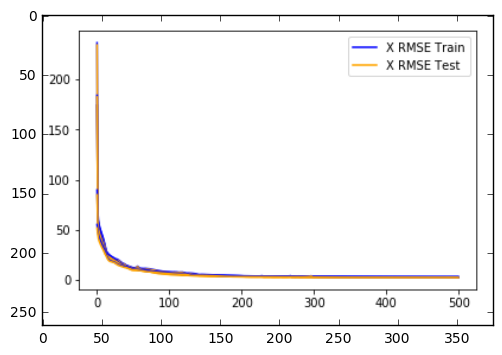

In [58]:
import matplotlib.image as mpimg
# from PIL import Image
img=mpimg.imread('XRMSE_lstm_500epochs.png')
img_plot= plt.imshow(img)

As seen in the plot above, the XRMSE for both train and test sets decreases continuously over 500 epochs. However, it remains somewhat constant after 300 epochs. Let observe the plot for YRMSE below.

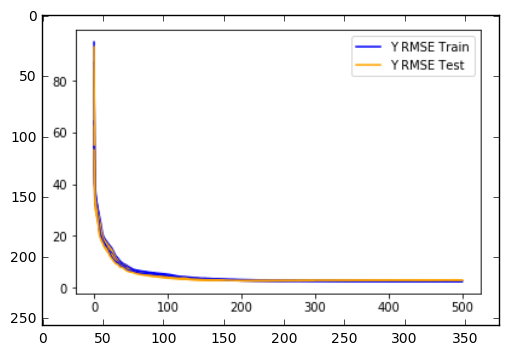

In [59]:
img=mpimg.imread('YRMSE_lstm_500epochs.png')
img_plot2= plt.imshow(img)

The plot above shows that the YRMSE for train set continuously decreases over the 500 epochs but the test set shows slight increase after around 250 epochs. Let's see the mean values of all the 5 repeats over different number of epochs below.

In [62]:
import pandas as pd
def scores(e):
    RMSE_Scores=[]
    Xtest_RMSE_1= [173.2152388725833, 59.59425798577952, 49.575313662788325, 45.96055055506539, 43.29676723975673, 40.83372992744525, 38.383403901584494, 35.877669133898245, 33.284422279935, 30.315106619751234, 28.089565266244062, 26.069762679184887, 25.0194542305909, 24.195356788872363, 23.501034457918994, 22.889061801807507, 22.24535884059107, 21.516436270814076, 20.876721727146233, 20.287834766565183, 19.65481454950199, 19.039474750213493, 18.463465997807255, 17.929548716111064, 17.441971005453606, 16.997212576590215, 16.613151367187122, 16.244682168923436, 15.88623508314777, 15.53280849635693, 15.199204556692587, 14.894680323107256, 14.62384654366015, 14.39195440321541, 14.231236533999297, 14.229262670275666, 14.268306008821982, 14.302216969649528, 14.009300861773808, 13.763294431990778, 13.59422624877099, 13.447854908531454, 13.116870351889373, 12.742030133214646, 12.405779439949857, 12.005672707002008, 11.70589744666457, 11.573680275278182, 11.479115189219309, 11.414108768971417, 11.326529745579249, 11.221556997044376, 11.151603418569747, 11.157986856448005, 11.100396772001076, 11.040587869730757, 10.983050962663498, 10.92675596518144, 10.855819677759406, 10.785694001244003, 10.718030397620526, 10.6744505619415, 10.646433234212266, 10.630707559755809, 10.6286563431081, 10.691214469529932, 10.70359060522901, 10.738357195009185, 10.69463012837697, 10.709950813869193, 10.710714342442499, 10.588672933419511, 10.53909287986924, 10.37798446935335, 10.194257534395069, 10.012132698160409, 9.889649587265769, 9.842033904442651, 9.67149604299473, 9.518970234595688, 9.331793580265842, 9.28034553024559, 9.135928853190423, 8.981059664393264, 8.767408313987637, 8.622783888132124, 8.535710388469539, 8.417645555292745, 8.27916636482506, 8.176832931042089, 8.07577162848157, 7.995317975137482, 7.86678675276259, 7.795386518371597, 7.7767767422390195, 7.687273086163251, 7.614301484460872, 7.556035784772984, 7.483617008300548, 7.362246387870135, 7.347413842814492, 7.264503136731539, 7.23101605928181, 7.2620743028520796, 7.215855498975617, 7.199979899521281, 7.3173181927469315, 7.287931004294435, 7.319630261018604, 7.263245760640625, 7.200711404607186, 7.0714697303826055, 6.846311456081608, 6.563039789849122, 6.1417448911911405, 5.560201701511471, 5.142983435410603, 4.850941657842957, 4.771232133878946, 4.701141753830225, 4.668561118271515, 4.640528671803652, 4.590317642616238, 4.5615161444951875, 4.539196790128157, 4.515403112636251, 4.488251618720097, 4.460394305597025, 4.427265328149612, 4.3995372374580395, 4.3677483385791405, 4.3377108486132, 4.311186335009725, 4.278845449957892, 4.242659342616077, 4.206687706280342, 4.175363577418308, 4.141878483376819, 4.113593931900806, 4.086026262112739, 4.058296942013005, 4.037064901354552, 4.016215761709096, 4.0009938906810145, 3.9881978272518332, 3.974394729979949, 3.94893886998161, 3.920076061983964, 3.89221399146152, 3.8634857918585515, 3.83953012851539, 3.815525222890347, 3.7967738698021813, 3.77658138974492, 3.7641986821592237, 3.74729169936949, 3.735333222577859, 3.7318490558390645, 3.7037848899609016, 3.725300971308863, 3.7470570490673865, 3.735833970718143, 3.729558851580172, 3.7353935202183193, 3.7118207560287337, 3.708752388255184, 3.7293717319540245, 3.7146768812038755, 3.7556181525350887, 3.718101174891942, 3.775884656953281, 3.6893017280938336, 3.652484866150017, 3.676203311345089, 3.7450200246551506, 3.654900665895108, 3.668359568403543, 3.6164817696107785, 3.6807266497212554, 3.6026859109377156, 3.594138366943016, 3.5677285412667175, 3.6021352690248025, 3.5653444950886817, 3.498716929950966, 3.50072886683559, 3.5708170560100174, 3.5318356274130895, 3.47293666078686, 3.4146735401840425, 3.488476495273399, 3.4948231318759024, 3.426212775769181, 3.40806369467743, 3.3962842830831557, 3.3936054645607197, 3.3915749885660276, 3.3532525880616886, 3.3344997348005383, 3.339171144478498, 3.3952565446629333, 3.337692269888551, 3.259241338174742, 3.250722195155532, 3.227026360511858, 3.2138160772284707, 3.2299950228998746, 3.2430322565920755, 3.2162949756491517, 3.1999853173815445, 3.167535944184822, 3.18150058532175, 3.1496157933274755, 3.1384351279089198, 3.1541963428330844, 3.148590105787024, 3.1321269910099474, 3.141231052391196, 3.12748444844, 3.123443001681536, 3.1384748477856252, 3.1475644038470563, 3.1221669191615073, 3.155900481873317, 3.1732964063418048, 3.1532665330298815, 3.128298922079655, 3.058656360108465, 3.0445782356447144, 3.0264877742148344, 2.982199668334869, 2.97651269976628, 3.028685820615267, 2.977153604040183, 2.984506611546194, 3.0006703049123344, 3.0311905432430795, 3.0531306564011302, 3.1406417284539856, 3.1709790068926362, 3.16915056854577, 3.0286991523772984, 2.9098920611584815, 2.9038543273847917, 2.8655419341544124, 2.882269625933028, 2.9017346123317234, 2.870088986426643, 2.8831252191889094, 2.8961288850927382, 2.925191850577268, 2.9550912015100383, 3.0481525684006003, 3.1113423450337496, 3.188134202083212, 2.992179776319307, 2.877764136483092, 2.832121421597266, 2.8489907632066265, 2.8667384870409394, 2.8411605278221557, 2.8307788172159185, 2.840430806544027, 2.8474914310914308, 2.8868749545377113, 2.8844502671972365, 2.940907624089499, 2.911970867440828, 2.904854184081768, 2.8775331666190556, 2.804015588275676, 2.842694881360711, 2.8255288047622065, 2.8220137934589715, 2.789588420582924, 2.8002200747828963, 2.8108924770530885, 2.8271958113011384, 2.7872127403161984, 2.85476912847109, 2.8419423951930076, 2.8569179053144147, 2.7650633345207885, 2.7619167574708476, 2.778577731716111, 2.767138664772331, 2.7607977361088243, 2.785853963187531, 2.7888575712341215, 2.759408802142464, 2.7204097042454203, 2.7328418633319056, 2.7442717517465676, 2.764959927030216, 2.769656808781876, 2.726459628028872, 2.748839409231427, 2.748432430710133, 2.7539130527178326, 2.77711244782047, 2.810902541241743, 2.7333930996944313, 2.7642919011539187, 2.8103457068343385, 2.782400999657139, 2.735527728569123, 2.6966480009466633, 2.6904958766997673, 2.7479022844061523, 2.7192433275027366, 2.709278284109536, 2.6816762687902957, 2.67972724654098, 2.6974419876807767, 2.698384883795493, 2.690264205361106, 2.679133823270438, 2.6605886117053816, 2.7007189434328787, 2.7480481417977427, 2.7413287391724697, 2.702784488232394, 2.657644718671726, 2.68263616632182, 2.687035625758776, 2.6449573800369715, 2.6563873180136666, 2.6567739332707614, 2.6726777724223454, 2.6924060016803004, 2.682234586474309, 2.6777544468158387, 2.67605920160169, 2.685007035953677, 2.6526707380235073, 2.6579233562224562, 2.633188807522974, 2.643494607032914, 2.646583915873316, 2.6589431612154315, 2.6370202938034124, 2.628956526245256, 2.663469368547609, 2.628053397272362, 2.650796258149986, 2.620976420367387, 2.635465766651929, 2.6439637500906255, 2.6502019602302234, 2.631950721240913, 2.6480606614496978, 2.615836089505461, 2.638374748672592, 2.610740759588126, 2.6252866574301703, 2.6091191178512507, 2.6354534540492724, 2.6139544400384827, 2.6304212761646526, 2.602974883268872, 2.603033094832185, 2.6041482473619397, 2.6139722860039356, 2.6179655906074064, 2.631302056283552, 2.615713423221978, 2.6152314150156455, 2.593985032696546, 2.598242431197169, 2.591610368639082, 2.6171465944170196, 2.597934204437424, 2.603052389791723, 2.5918918918524247, 2.5957027642296464, 2.6007910758749557, 2.598117767862703, 2.604612573066933, 2.597848701077379, 2.5845962105382085, 2.579772392906581, 2.574066801616483, 2.573993229231543, 2.5763602644462624, 2.58198212681242, 2.572816897326794, 2.578118959422822, 2.5731024565150826, 2.5765325848498195, 2.5751616709266654, 2.5746492373650667, 2.5715034052596337, 2.575954058993626, 2.5734033970656327, 2.5720195968296418, 2.5681990846660265, 2.571019875349029, 2.572250022598914, 2.572758087307267, 2.566249938917182, 2.572008971267588, 2.567824635221512, 2.5724768322151434, 2.5674672959712708, 2.5692759184468152, 2.5673685727198006, 2.56682515300033, 2.565470420484521, 2.5661397611216055, 2.562601340372311, 2.56550986573293, 2.5638635913411383, 2.5615850909764193, 2.5615714493039072, 2.5612316605394008, 2.560757053748032, 2.5584723907186975, 2.554717915332776, 2.557714139936205, 2.558343304933362, 2.559342391707267, 2.5587887516676218, 2.5615606952761154, 2.5578339221080606, 2.556575738431254, 2.5594588006504964, 2.5542053119243535, 2.558290613969975, 2.555355784508676, 2.555250162971859, 2.5566026453963357, 2.559368244142726, 2.554000302104394, 2.5518655139164386, 2.5538399834530936, 2.5486419802318276, 2.551986196181823, 2.5517053833512917, 2.5497065135578874, 2.549992656877103, 2.5531454199855923, 2.5467368186519006, 2.5509091491936373, 2.5503399548469368, 2.550265797046096, 2.5509244821556107, 2.5540080546491257, 2.5476022987755007, 2.547701731241941, 2.5483377198008137, 2.5478909912279812, 2.545920310269221, 2.548177453341713, 2.5477672302423118, 2.552022282371088, 2.5474879598181763, 2.5502839705079094, 2.5464445311315336, 2.5464115045278097, 2.545635396202798, 2.544388606591845, 2.5445172932790197, 2.5494843049267844, 2.540352797595832, 2.5442404776345695, 2.540220147170157, 2.5506888826575924, 2.5539278224314748, 2.5379975592838515, 2.548405290584245, 2.551971725167386, 2.5624900677199705, 2.5464120365184444, 2.5477903326084936, 2.567264520467066, 2.5451451920387123, 2.5624110132874027, 2.5486654760428893, 2.542991227594989, 2.5499465383260476, 2.542508365642856, 2.5431542537380487, 2.53573185755919, 2.5447367675307757, 2.550527667818501, 2.5393990696626365, 2.5516008020221053, 2.555065631694255, 2.541910693691469, 2.5431417243244265, 2.5495133771611243, 2.5479023555212263, 2.5384528374664734, 2.554376308354556, 2.559861719319096, 2.5285008784351253, 2.5599796511412425, 2.5476513977065327, 2.547233837439202, 2.540146596237043]
    Xtest_RMSE_2= [234.06828065126112, 63.637046091252785, 53.619901061477876, 49.755188825253136, 47.185382200287236, 44.94385843653672, 42.77748630698507, 40.57783568217188, 38.27474729141301, 35.80974002289466, 33.1494067064275, 30.38351545857688, 27.94726236849506, 26.340261595237855, 25.144734195144807, 24.137222185706438, 23.351747006486224, 22.702379428170055, 22.16117184578663, 21.653436369073873, 21.13832014345248, 20.650681202133953, 20.290821023088025, 20.090875013882588, 19.994454620076727, 19.937702210811103, 19.862711519492226, 19.718521157102654, 19.473285351224003, 19.09992733805024, 18.617495868697688, 18.07017228756425, 17.511406528042425, 16.971638893661705, 16.458966940902776, 15.952134691955955, 15.460922007228259, 14.992097303580797, 14.565718774230609, 14.194811950916051, 13.847854438510955, 13.515863990334418, 13.219673501595512, 13.008342801399875, 12.895151046627369, 12.762071866673931, 12.475385211608259, 12.027429506590872, 11.601553791626381, 11.36711210670882, 11.236509476248012, 11.177731683196342, 11.194300687312875, 11.78566403358459, 11.921579911729994, 12.372526217916754, 13.256728887906725, 12.58283871367195, 11.36910023044169, 10.304344213414277, 9.424217336640998, 9.206251773697376, 9.390132340479346, 9.693459205272733, 9.86666575611599, 10.034995845620541, 9.827791968064579, 9.529235274610981, 9.370310188251986, 9.182157823977118, 8.998104494799724, 8.844055133993864, 8.64089433358261, 8.492840515224733, 8.348668347754522, 8.254075456470753, 8.267471212758633, 8.099997067197314, 7.8936149298412905, 7.848794661944118, 7.796879630873063, 7.635389812381524, 7.5529522592175145, 7.537299483126049, 7.525641169872411, 7.4988663270706075, 7.476488124101545, 7.438576667457745, 7.389349830611946, 7.302326673414976, 7.218478371928427, 7.159017978911754, 7.105069736655588, 7.007350091234312, 6.909032097748921, 6.846365503773661, 6.792764938901665, 6.727075349507779, 6.675646236956441, 6.610715070521025, 6.544144219544668, 6.539327056690596, 6.4879125760960745, 6.418257176342905, 6.4272526252316915, 6.386731534832379, 6.377109077911067, 6.359482353514643, 6.360334909610897, 6.398809658716262, 6.376917487378926, 6.374586315305084, 6.373607430716254, 6.347590297997703, 6.241774604305516, 6.251858794535807, 6.285513709437527, 6.234117361602524, 6.220469376406642, 6.215700205228488, 6.124974725401404, 6.125774990034317, 6.14924598142803, 6.174138599182002, 6.102068380874346, 6.140837699849655, 6.162523413542095, 6.1550969690449975, 6.080870412923312, 6.093484765875894, 6.075392114547902, 5.971189031990256, 5.920368472375564, 5.843840472511494, 5.73048951979458, 5.635510004543197, 5.446793776169276, 5.195124753738795, 4.893939852102501, 4.605516337062914, 4.43003350968437, 4.319868955235893, 4.297519628283765, 4.287542651756559, 4.33532525957926, 4.3663918531314545, 4.3716762477580025, 4.31997581579643, 4.278656788863452, 4.22647410867292, 4.204851379292475, 4.156670380786459, 4.132138892687119, 4.100536265704929, 4.078197178610979, 4.044504025467632, 4.010811620281291, 3.9775043666693133, 3.9556077743938576, 3.9364273736879576, 3.915631387556734, 3.8934475455062074, 3.877433535248224, 3.8520240799655965, 3.8369028934234537, 3.824545716200543, 3.8040002589840123, 3.788498460335006, 3.768514529263786, 3.7486394335748368, 3.728415513249616, 3.7163871895638354, 3.7122001632500714, 3.7021701797289692, 3.6973786220912577, 3.69425013816681, 3.6937362088246073, 3.691734713687432, 3.694082248698262, 3.703867956477315, 3.7005031745829493, 3.704770871613495, 3.708234566963525, 3.703716483267005, 3.709032333683138, 3.7167356474756783, 3.721739621537598, 3.7179925519184995, 3.7125376622455675, 3.701220624147931, 3.68914772975811, 3.669819001665614, 3.656376186782977, 3.631097126448314, 3.609734046081111, 3.592200301416251, 3.5738300354296317, 3.551644787899256, 3.5371584656802306, 3.510434705743687, 3.483451991697632, 3.4582760950188423, 3.4410282514544157, 3.4283697861645797, 3.415664369568782, 3.4035885621535753, 3.4019841775539903, 3.3951095891241283, 3.391694993903515, 3.378535893029072, 3.36016220281586, 3.345860152860969, 3.3388297395989324, 3.3231913787678997, 3.3202972147000813, 3.3033281784113924, 3.2946428021924468, 3.2850809785616533, 3.2803159192869433, 3.270123405957113, 3.2665720885487532, 3.2569460922774214, 3.2551454928175354, 3.247077395273775, 3.238504186236974, 3.233993986104353, 3.225289472510489, 3.221226842504003, 3.2133253902352075, 3.204097136193108, 3.196933628049468, 3.19566224059389, 3.1850836174828765, 3.178596232465184, 3.1785166793727915, 3.1722595242650757, 3.1626682194252016, 3.1624639366233067, 3.15927079750502, 3.158765238965217, 3.1582925483010653, 3.1483958926465756, 3.1491918556043608, 3.140145050356373, 3.141720650941698, 3.1452362300013768, 3.143176826896188, 3.12764763038876, 3.120336931874704, 3.121966659008419, 3.1319082163744665, 3.128257137180184, 3.1397192426608918, 3.138971003519657, 3.1384174036527037, 3.1387417351223577, 3.137813423820236, 3.141092042345819, 3.1440516013113684, 3.1504014813846726, 3.1499914511677365, 3.1561079943537313, 3.1573415668331735, 3.1692707831500098, 3.170890726216357, 3.1704108357489766, 3.179647346255771, 3.187050199585492, 3.19771307680899, 3.2008316157561105, 3.2118790656293745, 3.2268015924200295, 3.2404818300195095, 3.262236316320892, 3.296593102139593, 3.3397063555193567, 3.3888736502629215, 3.4753275562910986, 3.5642189899540324, 3.507081721530429, 2.9695103638144524, 2.8093365275395272, 2.82106913255448, 2.8857687773326313, 2.9420461895548393, 2.955131045371244, 2.9511024646763797, 2.9279166558434566, 2.90846224617755, 2.8892652213435412, 2.8892743462639086, 2.8976547713653553, 2.889935442513654, 2.9137999115902686, 2.923911325092942, 2.908282680196977, 2.8805408200108302, 2.8690745302976306, 2.8709819425694123, 2.869077363234358, 2.8684422948724726, 2.8702886892373995, 2.88580727044247, 2.870891171449098, 2.8584835023897806, 2.843089092233275, 2.841345573082696, 2.837597575614572, 2.8476797241825893, 2.848926554313678, 2.8385257438298983, 2.8255328654469043, 2.825040868563873, 2.820143454428774, 2.8159704908288044, 2.8113947952733387, 2.811497965936688, 2.8092387413315563, 2.804987632624108, 2.816037437432378, 2.795856781455071, 2.7833638281699713, 2.791517589218414, 2.7795076117706046, 2.7645476383125267, 2.7715125509765617, 2.7842895187227694, 2.768820096120959, 2.763124848694363, 2.757706541886236, 2.760546177327724, 2.7570798928670617, 2.7488989676326656, 2.748709425968413, 2.7460563908657343, 2.743023623030138, 2.737818028210395, 2.7447168772928285, 2.732583803436289, 2.7211737662941684, 2.724938603106019, 2.728386643806501, 2.730928041732946, 2.7242503783386747, 2.7111018053748337, 2.7060045051343957, 2.707756001445519, 2.7051937603170475, 2.7039414607209213, 2.6994710046131685, 2.6928781752081785, 2.6874793664453787, 2.685453127820997, 2.6833222880303804, 2.681925034617868, 2.677285957005036, 2.6825536979363522, 2.6734071535858503, 2.661315621298482, 2.659468320838984, 2.6498363215013296, 2.6723921981337653, 2.6581907214207527, 2.646832560212176, 2.650729201913332, 2.6430995307737337, 2.644566385127033, 2.646074419947414, 2.6425127809055042, 2.641446630119421, 2.6298869725000804, 2.6275444230991174, 2.6301723609509047, 2.636654567397152, 2.6242769200833935, 2.623052075817746, 2.6267780905909976, 2.618961488799166, 2.6163120261768014, 2.62038968712302, 2.619057530838034, 2.6180353021771814, 2.6192601842396286, 2.6111042688332575, 2.6143369291485805, 2.6206642527110313, 2.6099184192261142, 2.6109217746996265, 2.6154068640715376, 2.611593689360026, 2.6092032628068575, 2.6127208332510508, 2.611877382212325, 2.6069635867888663, 2.6003707010075314, 2.6077025582147533, 2.6083411662451996, 2.600107147735447, 2.6107731160368437, 2.6051731011216055, 2.6034856081740454, 2.5989208396002184, 2.597439153775394, 2.6028649041535448, 2.6000161303753133, 2.598069464978068, 2.597878547749777, 2.591772201062726, 2.5907744438151976, 2.591263310162216, 2.591328546017411, 2.5894867967749957, 2.589543003633926, 2.587335395389277, 2.588172997095042, 2.588947852038296, 2.5884148077976548, 2.5869091698978903, 2.5876452688726124, 2.591935668822343, 2.5900445722539396, 2.589164434817588, 2.5879961652595536, 2.5877145237495824, 2.5872695908677086, 2.592621168559158, 2.587839559867055, 2.5873440569835786, 2.587398160041589, 2.5878841882641352, 2.5875604973292607, 2.5898767353212873, 2.5884345470252685, 2.5874452526087355, 2.588884523369243, 2.587836110889709, 2.587930732815509, 2.5873338795215006, 2.588459868732792, 2.586765210247128, 2.587887605997402, 2.5869610260509592, 2.5879579840756444, 2.59201467567123, 2.5900710559116096, 2.5907523802299033, 2.5894471741758625, 2.589783770409693, 2.5906760503311257, 2.5913495665847583, 2.592522029351613, 2.60071577819326, 2.590693770068963, 2.5890627538293174, 2.5912650811707247, 2.59110631094824, 2.592572450270912, 2.59113356246116, 2.591749544305324, 2.592532880515443, 2.5919254181259697, 2.5932858096177753, 2.5929489898172795, 2.5931526121155963, 2.5918818430971755, 2.5949309084790326, 2.5942399974429002, 2.591636097264592, 2.5922801504076314, 2.594857979378538, 2.595676483012958, 2.595871189773952, 2.595199690823896, 2.597662759602306, 2.598150378526467, 2.594483743875812, 2.596418072552531, 2.593791271936, 2.594671074903866, 2.5976415747692476, 2.5950486793026997, 2.6032138925092667, 2.6020077687027823, 2.6007749855687368, 2.598447085673621, 2.5983629909258465, 2.598284338841518, 2.6000933354682614, 2.5986994389250064, 2.6027520036876397, 2.6061462164212514, 2.606603732408505, 2.6062010455564133, 2.601583471565848, 2.5985711688412945, 2.5986563174695267, 2.59944306867398, 2.600799474743154, 2.6048019618539335, 2.612469474690401]
    Xtest_RMSE_3= [182.31453922142262, 57.14995780614353, 51.102756717321846, 48.32387498002467, 46.22219495353921, 44.4086165008241, 42.71727172092228, 41.03042621566155, 39.23894839122847, 37.239790620036565, 34.85256442627678, 31.901975550150425, 28.916759070068775, 26.3409104414365, 25.249487254942167, 24.616888480239776, 24.03558220495361, 23.487366743287073, 22.957921765280027, 22.44940633771695, 21.99325933642209, 21.612624342455387, 21.2817274814939, 20.863914004437714, 20.18828734839632, 19.3875389785839, 18.636605341144257, 17.87023728858255, 17.30595884915269, 16.619702074148794, 16.116598309676256, 16.135019774156056, 16.200041662110138, 15.812370661918818, 14.626708344601097, 13.75234836412528, 13.964377531246281, 15.387796019954054, 15.410713503512337, 14.26279709632915, 12.788743646651834, 12.497441420430563, 12.161573850659439, 11.798513938316141, 11.325736373139199, 10.794326077739054, 10.383860913694178, 10.125096014554021, 9.946570674131594, 9.806498032120473, 9.692836008955144, 9.612445384970995, 9.54340780622775, 9.505153108755284, 9.493678498269013, 9.460597897141088, 9.432780698121153, 9.428496848115612, 9.422958909255932, 9.39691278137402, 9.344870585529156, 9.239417442490884, 9.026915324227534, 8.900298257579816, 8.759569377805253, 8.624179648239577, 8.53295231502241, 8.468893636739939, 8.405197469580084, 8.370602591704817, 8.371689864140754, 8.3059573631485, 8.24040181044577, 8.167032614985185, 8.122631625213751, 8.037835668768107, 7.9357381417851505, 7.795154666377311, 7.683367844857578, 7.55447601865146, 7.467632061115987, 7.364684456979617, 7.301316574610142, 7.238767272381611, 7.147828426584243, 7.1018593111828725, 7.035984115231568, 7.021524465744424, 6.95833787526249, 6.934441196978889, 6.884886135995403, 6.857335546932449, 6.81812832592011, 6.802100161779805, 6.775311379702151, 6.774459124166248, 6.757988309776952, 6.764039442023492, 6.745649717974222, 6.725349612758533, 6.715422962936033, 6.7079712867850985, 6.709676826416471, 6.710765026673742, 6.726006107878247, 6.731154196599231, 6.76013049991515, 6.778007065820988, 6.821391702446729, 6.844581994799633, 6.915970342121343, 6.9657873013268725, 6.970900230199297, 7.029621283238, 7.075487445902044, 7.1286868796699325, 7.140324430239487, 7.114980903600032, 7.0319214670394, 6.898090256928601, 6.687575770032712, 6.381104765722452, 5.992603920057704, 5.557698453436356, 5.157203717344246, 4.865971538364152, 4.692283273352837, 4.617062985340224, 4.582679309272373, 4.607430650596175, 4.739681237519975, 4.888707409160013, 5.063157788209738, 5.123700876696983, 5.047368844992341, 4.863195659498009, 4.775293399637638, 4.798645552513945, 4.818160142636889, 4.7252804484208175, 4.60467799069085, 4.605191537398096, 4.679545360121104, 4.779992949661701, 4.819906891849723, 4.806192889509266, 4.775476840885916, 4.726486466892467, 4.688794059877459, 4.682312601765893, 4.669590820831182, 4.631160014022585, 4.597329498714317, 4.549658136350027, 4.5031906177427246, 4.469386850128606, 4.458026987730054, 4.428206489273879, 4.393995593302801, 4.350894967571873, 4.316145163327764, 4.266072024599765, 4.232380466778478, 4.211106182885635, 4.191415802659506, 4.168374001981797, 4.144706862466611, 4.1010573243745725, 4.069039168991079, 4.041564261529916, 4.020506645577449, 4.006557830290076, 3.9837477859659467, 3.970175276758593, 3.952341556492416, 3.9296659300969714, 3.912214568846099, 3.8794564377517418, 3.860943668219985, 3.825105001119635, 3.7979631183976674, 3.7698261584533395, 3.764932305111458, 3.710853098048972, 3.690856198044587, 3.660283505480319, 3.6381730247937814, 3.613474865872495, 3.5937410968373587, 3.571414480556828, 3.5651018021950325, 3.558683088317094, 3.550520877963614, 3.5579146336099545, 3.584202956948978, 3.57621492951245, 3.5945327687831337, 3.590910208326839, 3.5668253818914883, 3.512028468845878, 3.436362600092988, 3.375032372893515, 3.313632402214614, 3.280285210615353, 3.2404865474195264, 3.2006006715961894, 3.163852173329255, 3.1393731971818375, 3.114029655089202, 3.0948787070552153, 3.089416699740348, 3.0731521519700453, 3.06209876643475, 3.0680504147128924, 3.0784583234450165, 3.0789482171286306, 3.0804845684120896, 3.100556655530277, 3.125452164884234, 3.1329854976405604, 3.15873506370167, 3.1706849858836503, 3.203869783793557, 3.2484699401385644, 3.2755492681793763, 3.3570284990709043, 3.4701998399384686, 3.6033184974466566, 3.717794372513253, 3.4926577281003173, 2.905205261360986, 2.862790474793969, 2.9297861166090398, 2.9701786800964993, 2.928384001129862, 2.8792868127254794, 2.8751869521663886, 2.8706618442372736, 2.849321198937355, 2.8377535213435845, 2.8275378129977273, 2.828268735659964, 2.8217716333585043, 2.823729031921763, 2.8213502252578886, 2.8297956330310394, 2.8347875910061466, 2.845864626413878, 2.8626170949797634, 2.8547877561782284, 2.8665162723103523, 2.873669327325979, 2.8809930511389865, 2.885795065259649, 2.874234824215923, 2.88231124160878, 2.8804865516485383, 2.8858052052009144, 2.8938050669707946, 2.9133020560573337, 2.9422880861107403, 2.966330924071611, 3.0184027035429617, 3.083521825952394, 3.1555045658060954, 3.2824736817399387, 3.4969237757020144, 3.8666762652859066, 3.2198422093026213, 2.6860083190650386, 2.681172962908213, 2.7294948962923087, 2.7491461079578743, 2.7597349613972626, 2.7525232841357266, 2.7727846521659583, 2.8083593962161797, 2.845275239142894, 2.8834404046030455, 2.8450178330047775, 2.751852487728266, 2.70911551254555, 2.7254426862754046, 2.7428801127060662, 2.7429199785979184, 2.7370146712124277, 2.7523869522599638, 2.7656733998940246, 2.770307659255663, 2.761598356099446, 2.7494480354756474, 2.7346975994727023, 2.717884460700134, 2.7206405009963124, 2.7249084458231074, 2.7122280567438586, 2.716600697623421, 2.719734067633442, 2.7191975560276296, 2.7208508217800302, 2.710907005490728, 2.7079609911012947, 2.7017613984004414, 2.7013201510826725, 2.6991003473888058, 2.7005833542954, 2.6999143820948235, 2.7006302544164287, 2.6952755914336506, 2.6913783856697573, 2.69306162803391, 2.69613404190279, 2.685881192651323, 2.685181259882449, 2.6911624220160992, 2.6844955496651504, 2.6792518674718697, 2.6831012989348153, 2.6860094564680685, 2.675381000530653, 2.671948900670925, 2.679340982993126, 2.6768556193457957, 2.671665607025588, 2.666379499760836, 2.6718375003630186, 2.674958763631189, 2.66303143431545, 2.6684800104586, 2.6652369564866967, 2.665701813547232, 2.665588215722614, 2.6656710507394115, 2.657615754418868, 2.663693473266331, 2.662706264591101, 2.661349676556352, 2.655023331183038, 2.6591864306839694, 2.655197653081641, 2.6564072804879424, 2.6530591061868307, 2.6528559291419285, 2.650753711792951, 2.654743890743163, 2.6514737600017715, 2.654231419971529, 2.645447843785434, 2.650851825830471, 2.650814829523694, 2.6514419120039814, 2.6487043325787734, 2.6499068874104603, 2.6482704853525996, 2.6512411927008457, 2.6464023504643612, 2.6460280180611075, 2.651025409943681, 2.650423816263082, 2.643143450540785, 2.651050282335186, 2.65154232451812, 2.6440565637952615, 2.648643899012535, 2.6477272492551167, 2.6483529230240452, 2.6482767117328425, 2.64896522922263, 2.6501388867234716, 2.6529827509909065, 2.6439610723098084, 2.6489724696721755, 2.6496030150619916, 2.6484969872971442, 2.651635820717421, 2.6492841095455164, 2.6482345095609756, 2.6449915399737423, 2.6537948730408467, 2.6498693297497966, 2.6511111355791495, 2.6475300274268028, 2.6486146997392357, 2.6480308362694087, 2.648590034368701, 2.6517149764290213, 2.6585026888775527, 2.647330491647751, 2.6519036634933393, 2.6550294960570042, 2.666149303290747, 2.6587021268786457, 2.6551790396593327, 2.665098256766708, 2.6594890277095846, 2.671391860797921, 2.6684931419555915, 2.670314713105425, 2.6825745863518926, 2.681864234781782, 2.6806790200373714, 2.6821363844392585, 2.681535165805667, 2.670763613088427, 2.659722870705996, 2.659804123573569, 2.6512729968874953, 2.649921944677572, 2.647675296544743, 2.6380861616258895, 2.646284658470864, 2.6351802631362298, 2.632828356450878, 2.6421581120792896, 2.6310861167094948, 2.638554755253081, 2.6317391454280545, 2.63510359479971, 2.62488926938718, 2.627032268902506, 2.6201080539934853, 2.625861907999524, 2.621840463865657, 2.6212755953262983, 2.61340314353269, 2.6212418790771226, 2.6142908601969137, 2.604679334723433, 2.6069723003686236, 2.6007778379587436, 2.6002640586105166, 2.6020328918541535, 2.599014251282049, 2.5972525621274984, 2.5955026627458944, 2.5928561421492455, 2.594794818418594, 2.589944104024069, 2.5890900745543304, 2.5866030229093693, 2.585997666009231, 2.582642174181882, 2.5807112154874243, 2.5812982987880466, 2.579069704956081, 2.5778398373857274, 2.577641607868117, 2.5787620207365594, 2.575303813006008, 2.5734869388093955, 2.574916807612378, 2.5725122915547645, 2.5719826767507383, 2.571217609832729, 2.5713322141552406, 2.569791944604019, 2.5713089122170425, 2.5664966701410106, 2.565645061836095, 2.56458151081808, 2.562994143644768, 2.563192268609702, 2.5640327280312096, 2.5632016704470195, 2.561097726504967, 2.5677526047914796, 2.5603534723702306, 2.5608609343956035, 2.5638140576700343, 2.559018917722482, 2.561806130438115, 2.558433445922483, 2.5549617622850658, 2.557215592731951, 2.552847180009909, 2.554128163953108, 2.5520135567829736, 2.548854389863512, 2.5492708720573187, 2.5496245361270353, 2.5450630138740613, 2.546384434683225, 2.5458272179825365, 2.540820151193838, 2.543309426554654, 2.544439267985932, 2.5435671523701044, 2.542766610723449, 2.5422081831307164, 2.5414712548933336, 2.536206645397804, 2.5388615835396005, 2.5369367241130765, 2.5378520510026803, 2.5371329657136625, 2.539805908401557, 2.5411485348244582, 2.5388786045177336, 2.541393139889616, 2.5382692146730736]
    Xtest_RMSE_4= [84.78069436986652, 56.46438893742431, 50.146718803409506, 47.09631598314775, 44.84190059239588, 42.80171407315032, 40.74510422894366, 38.488968594497315, 35.8829767194572, 33.114823527262224, 30.595655834464733, 28.483308785967726, 26.704906044072683, 25.351177831563586, 24.358391777417218, 23.640236752688782, 23.07790001164353, 22.59098713054604, 22.128470201402337, 21.680269015385893, 21.234735725485553, 20.803392883875713, 20.431394612299897, 20.067219585624564, 19.623869992901998, 19.17335587998006, 18.79149377054496, 18.362279067448036, 17.818311848467676, 17.23796939748502, 16.61162057758319, 16.046882608344024, 15.563162094290874, 15.109577630148593, 14.704135553687394, 14.335608916617181, 13.963138845692772, 13.554391565734644, 13.155327277881653, 12.806307711095311, 12.51050403535908, 12.288833208683007, 12.070641312589974, 11.820234007216474, 11.541814189664413, 11.315356080187176, 11.167256541394188, 11.102630278766146, 11.087493672270968, 11.059405023484564, 10.984989662248164, 10.948560438147402, 10.97949262995094, 10.949007774620476, 10.853480917280045, 10.824746719384647, 10.791802069450991, 10.779560999459822, 10.717936988931712, 10.6539214319331, 10.506208621375219, 10.251586582229939, 9.942065718478784, 9.615980301158253, 9.284549061874808, 9.036259570968785, 8.858388631982063, 8.760701110139328, 8.7198411715192, 8.661415902190013, 8.592788568943115, 8.4812041615924, 8.320629695279269, 8.117373570371537, 7.916712163135034, 7.687550461781636, 7.538649002531001, 7.382994521074496, 7.236917716405677, 7.08732843412203, 6.9532816391384795, 6.800936019399974, 6.644203767174396, 6.502923045550669, 6.379057748161871, 6.264315345192712, 6.169017542376492, 6.087282099717371, 6.019165557237179, 5.98011528489952, 5.941427052629799, 5.912549007586831, 5.883844758820122, 5.851735683244081, 5.8234297359465526, 5.779272667549498, 5.717558752623398, 5.6248499640906235, 5.511877679704048, 5.393448943335698, 5.29161697254514, 5.212657882296115, 5.1510098741683095, 5.102344488157792, 5.057077213152988, 5.013270123417188, 4.970895838050837, 4.936865870637491, 4.907789230971633, 4.879836262861569, 4.846099895668888, 4.810311209316366, 4.772650236033875, 4.73987017290005, 4.716821287605631, 4.701361486128301, 4.68591565370885, 4.667186769383903, 4.6397267811517775, 4.609266112996607, 4.571420122534941, 4.5272519353837986, 4.486522881286183, 4.44601210481423, 4.411038193148836, 4.378407978038828, 4.347457848050985, 4.3198098461877565, 4.294206067654507, 4.273298970541066, 4.2563063458661485, 4.238305891395736, 4.2213924400040606, 4.213111052538303, 4.203095340047861, 4.191696510260929, 4.185310386040336, 4.19127432502163, 4.178369557731483, 4.180583064868946, 4.178966543322688, 4.166334829798496, 4.16029792305229, 4.13970825658813, 4.129623070826163, 4.100568723848409, 4.081489126971625, 4.062776408999937, 4.033877158056223, 4.017442519318764, 3.992584668893196, 3.9861638315588244, 3.9905414588674564, 3.9484951694082886, 3.9340140705776543, 3.8906573465177323, 3.8867784724171326, 3.8496169408520418, 3.834733509067286, 3.808703481834302, 3.814227945485769, 3.780798214055194, 3.765354167467449, 3.7091252476335175, 3.699543076798887, 3.664180982590529, 3.674022735556264, 3.636144736970318, 3.6358140175006564, 3.598814088116408, 3.6119065518242555, 3.6040191745266004, 3.6132886341149106, 3.5776824103261435, 3.5682577466862675, 3.5631799571606315, 3.5538017429305677, 3.5440927732946803, 3.5321708812547112, 3.507969671191408, 3.507559917221673, 3.5048084708571063, 3.501264230730313, 3.479731899029158, 3.476346839357503, 3.463550592738827, 3.4729284798750455, 3.475318897785825, 3.4743165443225443, 3.468889454385481, 3.450114646550614, 3.44985750242059, 3.4732245274747173, 3.4587874240469327, 3.4638484873346096, 3.469815481800792, 3.4646203498670762, 3.444997445975669, 3.425641772260771, 3.421706551223522, 3.3964631025015803, 3.3808488743405785, 3.3606765254102715, 3.3545933181602012, 3.3542894974144457, 3.3420601513918795, 3.342984986880129, 3.353196793301707, 3.3635897444076823, 3.3578334122006854, 3.370541404402073, 3.379937842642854, 3.381828467573564, 3.4003198102534804, 3.3966675768593793, 3.399816822887288, 3.406659843272829, 3.401757825028852, 3.3825288627058128, 3.369877178231447, 3.3291519032495818, 3.29473902025279, 3.267539364205646, 3.2674317790472767, 3.25132910526804, 3.244542507514888, 3.230675268497257, 3.2408473365381196, 3.2273005463538365, 3.2192835340990458, 3.1984931383853694, 3.1763114521634135, 3.1769701941887827, 3.139102533282092, 3.1497568086213477, 3.132652173809263, 3.176401116475996, 3.1620419710381515, 3.2009715694763172, 3.1781993341806607, 3.202842342994881, 3.2090575387284224, 3.2257247443850336, 3.196230412766438, 3.212024340371568, 3.2111164054714934, 3.236158719321775, 3.2322006329486337, 3.2302512643895103, 3.2375683632717056, 3.2181973471335312, 3.221534436370583, 3.2235823084680537, 3.2115210785495196, 3.1946910917304665, 3.183081752041871, 3.1620751943106646, 3.169014124615316, 3.1512807780112455, 3.122733649090853, 3.0874589292967793, 3.046484505112671, 3.025896071743246, 2.993402595527027, 2.956288308133913, 2.9391129278052457, 2.9408101077369433, 2.9449593708485833, 2.921573676623597, 2.9312994616753487, 2.9275371257594247, 2.9331121640294584, 2.9261456226534346, 2.923166903333607, 2.9283166383208856, 2.9151954971707066, 2.934596247166294, 2.946361335433962, 2.9364655436451255, 2.9473461461726287, 2.946155353359931, 2.948947854115349, 2.943321837415091, 2.9536750025586818, 2.9439831279743784, 2.932482559037357, 2.914887739136552, 2.905099664187456, 2.888410979683206, 2.871860175458939, 2.842918340318813, 2.8466759773756753, 2.8425034022109785, 2.827219664055285, 2.83347317781149, 2.827121835239874, 2.8167070122903106, 2.8287013945754023, 2.8394010006043113, 2.847313266080174, 2.8435655631949235, 2.8455711677732474, 2.8497090080490377, 2.856803893140991, 2.850080891012886, 2.8542991995053235, 2.8514263032975067, 2.8544219501845682, 2.8254150377970775, 2.842573007932604, 2.8397740169619046, 2.804788469948513, 2.8014226960241007, 2.791448070366447, 2.7851596769654745, 2.7906552191656577, 2.7850113651840305, 2.7764987495607363, 2.773663882830602, 2.7845743801751994, 2.7834435627718683, 2.777425926698955, 2.7789535486369497, 2.7722846563112338, 2.764143280840233, 2.7607175967774897, 2.767351831640846, 2.7674807075572514, 2.7730875973505635, 2.7632508099400925, 2.7556854957951233, 2.761956923674587, 2.750464268974755, 2.7446804233352013, 2.749480537815742, 2.7419631959199298, 2.738597312515682, 2.74254615150942, 2.7326346048956753, 2.727548992206807, 2.7336479828057874, 2.724766697235123, 2.716807081750071, 2.722226112125693, 2.7328682008235665, 2.706715233391254, 2.7368587582954573, 2.705180111377474, 2.723424605160284, 2.7028369712055262, 2.7282544250132807, 2.70305118702764, 2.728848813476557, 2.702812842779047, 2.717034230836775, 2.702854810392882, 2.6917618975432105, 2.6950908373299476, 2.6876059700400865, 2.6825748150053372, 2.6850159567070127, 2.679177298318697, 2.6710587706147537, 2.669078527766967, 2.6696641251503106, 2.6643476204049974, 2.6653309302242665, 2.661816906275113, 2.6617915718213183, 2.6610623039965056, 2.6638939548292537, 2.675700010996795, 2.6578043038537555, 2.6670138453167365, 2.651808803795933, 2.6510686490460365, 2.6449171365261783, 2.6464370173401957, 2.642397821520838, 2.646749277739196, 2.6365745540287215, 2.6429961849503454, 2.630646544142142, 2.6529938136866797, 2.6246061194007395, 2.62889891845579, 2.623692282929026, 2.6354000879012722, 2.6212100409955004, 2.6191289365499437, 2.6180782133037392, 2.6217447513502012, 2.6170789541349704, 2.6177604739089606, 2.619039175595772, 2.619853460008955, 2.6164810847706392, 2.6143245144523783, 2.6158965184610192, 2.623878432627624, 2.618258008517939, 2.60345304885242, 2.6091132806467185, 2.6096837640498483, 2.6212511020102554, 2.6196854895419777, 2.6128947741648467, 2.6083496999605824, 2.602695165488785, 2.5983825517100816, 2.6061646885012535, 2.624697332281081, 2.599955303607875, 2.6029336572957087, 2.6055463978855697, 2.6136912772762346, 2.6194786861917367, 2.5989816597441173, 2.6026602835671397, 2.618711583216315, 2.6120925694436075, 2.6039165544408736, 2.601635720470146, 2.5995705385370833, 2.5992253161437997, 2.6011582747657624, 2.6208109196242964, 2.5983535525755346, 2.6016931967897157, 2.5989416404180545, 2.5973176705561074, 2.5989476332421053, 2.60860848145951, 2.601201753587124, 2.618388657313678, 2.593927941241611, 2.596485447746942, 2.594681956518388, 2.5964501996596256, 2.596130540093756, 2.5946942270344016, 2.596176991151192, 2.5959090988146913, 2.594760274276845, 2.5961333697153575, 2.592597192880085, 2.594332419426241, 2.5886223423023917, 2.588362189209014, 2.6052086596716224, 2.594201223314437, 2.5942560574725175, 2.5922067425814186, 2.5917764227765208, 2.5933429161900694, 2.5880428412399255, 2.590605223573881, 2.595581003436981, 2.6021580930357935, 2.5866443395170444, 2.5904321388140286, 2.607826749381639, 2.5929487116303793, 2.587648649331781, 2.5888617358263586, 2.5938012999311635, 2.6086596009577687, 2.5858574558731706, 2.590412298227567, 2.598707140572306, 2.5884763251297587, 2.587658490335276, 2.5845855265477082, 2.5889245182252365, 2.5891362251284322, 2.598130414058748, 2.5869573266531978, 2.585352902016544, 2.583459038651759, 2.5893254131826704, 2.6028666435953873, 2.59807228409383, 2.600682653884628, 2.5825178564750537, 2.5876092065488825, 2.5939376170799773, 2.5817292038390454, 2.5774709335288604, 2.593140652216495, 2.6029261715952186, 2.581243837058824, 2.5803989059028107, 2.5994035446978914, 2.580465497726527, 2.5796107609911747, 2.5872110773789094, 2.586656784993935, 2.581524172122101, 2.586867949930548, 2.5789519356804522]
    Xtest_RMSE_5= [51.68336441352136, 45.649707506229255, 40.86833885028374, 38.37595419998243, 36.53365968594926, 34.87745346467167, 33.302039141896934, 31.910532057615985, 30.654483715159518, 29.400348271222487, 27.815993236563624, 26.140104400041608, 24.686034455282716, 23.12232268607408, 21.639037724163995, 20.37571529420993, 19.45032011184302, 18.8385072142854, 18.479692919232196, 18.218382060934815, 18.062730913896612, 17.981696975767786, 17.81113635076987, 17.52467934866848, 17.156474895834492, 16.709144292798978, 16.1785319980717, 15.640358592660506, 15.129251230464236, 14.700984122811093, 14.351028821103307, 14.124940671402305, 13.913532008925264, 13.5621577730749, 13.465268270754063, 13.243230126897583, 12.928513470811867, 12.758529517321774, 12.43031096357869, 12.275977387471533, 12.305073658861044, 12.237676940372472, 11.95744689838769, 11.501607664212141, 11.123244664596584, 11.145294541582572, 11.10244872873374, 10.532886246186903, 10.011438957380156, 9.88570789427927, 9.778900068438338, 9.865933785386304, 9.910647675237415, 9.880074693784177, 9.94150466953488, 9.854845034603697, 9.693973412898215, 9.537071505352145, 9.466022148934526, 9.346455294652397, 9.216226285764156, 9.086518762216556, 8.979681009042853, 8.900665844981413, 8.80575981553737, 8.705567710743857, 8.589974415906866, 8.472740635188483, 8.370400479657269, 8.284533410682583, 8.196924423762445, 8.104004539955437, 8.030206141532592, 8.095270993636468, 8.041245759794355, 7.965750690961809, 7.8932023070874004, 7.811567269778228, 7.736139159263185, 7.665204492890997, 7.589596130804984, 7.519641583064775, 7.443774872415405, 7.36345541364895, 7.2959573191744305, 7.2150351561473665, 7.134772859277213, 7.0615158082049065, 6.992802169788997, 6.9240620719652926, 6.866553795670464, 6.791741767976107, 6.714851185754366, 6.630234579118539, 6.5711434320097295, 6.483550729863101, 6.419559660723618, 6.3684539474327275, 6.312727706159961, 6.266506662414184, 6.219067242618552, 6.180364419809305, 6.139594719799444, 6.103172537531988, 6.064741623831347, 6.025391041470551, 5.976700560374424, 5.907925176503328, 5.838375244148815, 5.74228105851624, 5.651991624674175, 5.591433332439044, 5.531644223410503, 5.51539142598953, 5.5239364114455825, 5.542727858241289, 5.568218523119425, 5.585906182536988, 5.596144989890402, 5.598995223807939, 5.581836129483944, 5.5771810122180305, 5.543373518992038, 5.4912932666982455, 5.431655723745202, 5.289734225523027, 5.068216146347076, 4.781522791300195, 4.599860192271722, 4.47902038545615, 4.44420663102885, 4.493930204100899, 4.468796407527735, 4.457661116152096, 4.472175632178164, 4.4949520622595, 4.488053840778106, 4.520783551124486, 4.54676776730529, 4.53844314384507, 4.516911995749778, 4.426248238969557, 4.49787371084903, 4.445174727227965, 4.463602443024528, 4.39432098740668, 4.426753887428843, 4.362005359499101, 4.350898944112035, 4.310284682303068, 4.334668750965341, 4.333542288653994, 4.248999974216965, 4.229589886348437, 4.184398890579485, 4.184182898707952, 4.1487000545944674, 4.125591565025865, 4.126810842435014, 4.110422475752463, 4.061238572887737, 4.048379735934348, 4.028423005921512, 4.023955543256696, 4.005396604564432, 3.906578398145766, 3.8728573839827223, 3.8616861447395805, 3.8260990223557436, 3.768929501225634, 3.695079567450612, 3.671710498459183, 3.621205043618912, 3.5721197756839578, 3.603208885436605, 3.5732627562804926, 3.486725461888482, 3.444211273128753, 3.398726250563408, 3.3486930446480447, 3.3471370963938996, 3.324485220370807, 3.318989112312322, 3.3043135448995793, 3.2784710486092368, 3.2748144705575575, 3.2485619866194657, 3.226701910739001, 3.1917162103472574, 3.2198266905666943, 3.18932495499965, 3.183888610745333, 3.1553936079995566, 3.1522347689196932, 3.1328514331728328, 3.1305629770562224, 3.1276335620232496, 3.100487553056574, 3.090859432300251, 3.0774771179458287, 3.085967238461872, 3.05644514092318, 3.054958071464879, 3.033373973671351, 3.035215265600978, 3.0237220180681024, 3.0326313944473733, 3.0317310660820405, 3.013639588887176, 3.0107662768978956, 2.988868962663287, 2.987858673147182, 2.9864839118945876, 2.9813970825696323, 2.9719669315083648, 2.9620967953484136, 2.963716104446077, 2.9639434072766964, 2.94557356904303, 2.9402163974847504, 2.935888902080326, 2.943155112258989, 2.9172641745954313, 2.9299996112797246, 2.937449834702477, 2.9136332936798937, 2.921491413729979, 2.9076931049451606, 2.9073171433847573, 2.896103654957722, 2.9136311417693777, 2.905824584423436, 2.9093261034693385, 2.8837877022243528, 2.876707314846034, 2.8729173487405726, 2.878924638154182, 2.8612166985710448, 2.881888282536818, 2.878950024769101, 2.87257580132487, 2.868693422702164, 2.883620546875715, 2.887976567743558, 2.8717839870104194, 2.8200160579087354, 2.888745164252957, 2.8610477644949897, 2.8301032812788076, 2.866233242181551, 2.832658489451287, 2.8584691419785697, 2.868718989005154, 2.844364478383157, 2.8668729328441866, 2.8940000165528406, 2.812614281924703, 2.8778313649507234, 2.866376578152625, 2.8537127109567084, 2.834480293819982, 2.8897081621725933, 2.8713680045277794, 2.810896033055255, 2.8481104754633635, 2.859819357683099, 2.830914413764494, 2.7792014065019823, 2.8684434615421144, 2.8415187445909145, 2.803151101821141, 2.8495145196449645, 2.8482933253330405, 2.8628656896481295, 2.773906912315687, 2.8674123848449655, 2.845498526968717, 2.814673374939114, 2.877877762851482, 2.8991376476754986, 2.823114005613233, 2.9429262856620824, 2.9101256870424197, 2.8710407940314377, 2.929148590163367, 2.9598722614754136, 2.8851218622956196, 2.9764910794483117, 3.0229015316670416, 2.9627217982066343, 3.0746854525221523, 3.1826132772282203, 3.1193477556255758, 3.28603173991796, 3.408267923017125, 3.5928000456921767, 3.744441977376861, 3.2815186855512386, 2.7222758744558413, 2.7169332812118627, 2.7072871552278195, 2.7024771382775272, 2.7162637328315093, 2.752157114731007, 2.7439402677083016, 2.7482700725930362, 2.73170923058386, 2.709204211123068, 2.7164295605495026, 2.7129252142337332, 2.7016485975376825, 2.7055263761756656, 2.69862300108635, 2.6988783656035893, 2.7077406756647053, 2.702307026426953, 2.6963946612674445, 2.701114541988584, 2.6926877012706254, 2.689819405201171, 2.6958388557722985, 2.6879444824307797, 2.6798245118250836, 2.690559601214233, 2.6785821042860283, 2.6754558430689728, 2.6865163618654853, 2.6790410600691046, 2.67289600043302, 2.6804315564988124, 2.669798756390732, 2.6654600375218593, 2.6761909208939105, 2.6693911384004356, 2.6598042766342527, 2.669640778037636, 2.660549043432186, 2.656363801357526, 2.662604099998246, 2.6556401472869937, 2.656814720226716, 2.657816835481334, 2.6519829540748634, 2.6527015484375798, 2.658651675026011, 2.650515036961447, 2.6489713988441848, 2.6532735875184823, 2.646623969140338, 2.644611897902411, 2.6492612412563137, 2.642799436498417, 2.647227568978238, 2.6419189890700934, 2.6415937317836082, 2.6461081164040365, 2.640187941489831, 2.647187285309626, 2.638947998089396, 2.641010393626469, 2.6439145693214554, 2.636235139539057, 2.6405696090691566, 2.6366127686528644, 2.6415855635893264, 2.6352685766761446, 2.634065922142679, 2.6323420833445024, 2.636320915019098, 2.6321459613079368, 2.637131989410512, 2.6301842510980213, 2.6338530357172085, 2.628191748411942, 2.6283597121119033, 2.630981882630526, 2.6275219276313035, 2.62677907699688, 2.628681823711174, 2.626669663045322, 2.625512351778504, 2.6295909952664185, 2.625871873137588, 2.6245035584954755, 2.6251292488935114, 2.6222230176802612, 2.6221176191424007, 2.6237307499062847, 2.623664031291055, 2.6285521654050514, 2.618938059298067, 2.6195231213911123, 2.620736262843454, 2.620843425973675, 2.6187808194666937, 2.620856451360324, 2.6175222801467677, 2.6159050862483095, 2.6179467512112655, 2.620251443621919, 2.613716189154471, 2.616515533563293, 2.6206637688749317, 2.612438796932764, 2.6101318485678293, 2.6109480824251223, 2.6139659428109923, 2.612459352501672, 2.62386739445762, 2.609719928698124, 2.6129684169995127, 2.611917464562525, 2.6089145979960375, 2.607101363918781, 2.608979279299417, 2.6214945421691627, 2.607165821232351, 2.6102201186187033, 2.6191703740865813, 2.615154109487577, 2.6098376050071415, 2.6062473993940016, 2.6159247776633756, 2.608193676841103, 2.607609526568257, 2.6077446424620914, 2.6130368837652895, 2.6061744020135342, 2.6071492955962396, 2.603028656994983, 2.60737263356387, 2.603786998864603, 2.611544420848569, 2.6033451599674335, 2.6071555593278455, 2.6013496914534486, 2.6146573167919867, 2.603416914123957, 2.5995565103298737, 2.6013690753102368, 2.6097971160311744, 2.6035933077474147, 2.599542168382679, 2.6014502864684474, 2.6054727880409017, 2.5984059980684386, 2.6025662413069535, 2.6041098109617744, 2.6052910076705937, 2.601691498031386, 2.604858281394112, 2.603963343581978, 2.6165561098959773, 2.597264340840339, 2.6023856807159844, 2.6158807288057013, 2.597591457958311, 2.6111666546972025, 2.599514578709665, 2.602044548512081, 2.6042186634250104, 2.6132556353533523, 2.600680104460322, 2.614984115230531, 2.602715137224196, 2.5987597579464325, 2.605988743240379, 2.5957105236813858, 2.5946554317657, 2.6173505444489966, 2.593003750974, 2.59774794723474, 2.5914586671579456, 2.615084683507091, 2.591513741770514, 2.59514946710485, 2.59419291136044, 2.58955339341439, 2.5929157045356988, 2.5969917613904347, 2.5863356564452835, 2.6126986771822183, 2.592365911149767, 2.5915469895332444, 2.5889674760390693, 2.618002756982099, 2.5986000217211496, 2.5840180147167575, 2.6086872058019313, 2.593976217958608, 2.5852337379849284, 2.5894337633721523, 2.5936472366203347, 2.6008193467493355, 2.584230831944929, 2.590545636677596, 2.583635476575898, 2.591618394962715, 2.5849427719579863, 2.582254070444686]
    scores=[Xtest_RMSE_1, Xtest_RMSE_2, Xtest_RMSE_3, Xtest_RMSE_4, Xtest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,250,300,400,500]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,250,300,400,500
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,6.471653,3.372164,2.995337,2.786257,2.619483,2.570418
std,0.721364,0.179628,0.173907,0.070275,0.041683,0.031349
min,5.393449,3.077477,2.854788,2.716933,2.566250,2.538269
25%,6.266507,3.339171,2.866233,2.720851,2.605173,2.540147
50%,6.610715,3.421707,2.896129,2.777112,2.620251,2.578952
75%,6.725350,3.510435,3.121967,2.847313,2.623878,2.582254
max,7.362246,3.512028,3.237568,2.869077,2.681864,2.612469


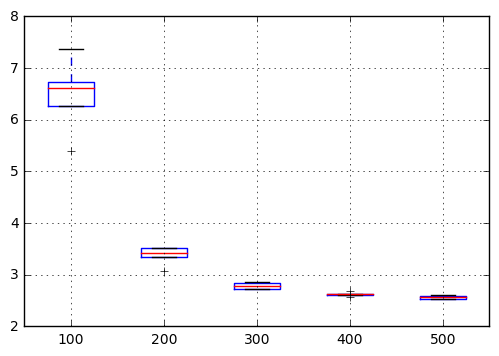

In [55]:
# save boxplot
results.boxplot()
plt.savefig('XRMSE_LSTM_epoch_boxplot.png')

In [56]:
import pandas as pd
def Y_scores(e):
    RMSE_Scores=[]
    Ytest_RMSE_1= [84.78350647207374, 43.673823556351564, 35.53646973947691, 32.022966965836765, 30.184011221237053, 28.67470801243535, 27.12311761134538, 25.34518458447299, 23.1707381191333, 20.66220170310315, 18.90050445293242, 18.36521776594326, 17.623757837378296, 17.015511771691386, 16.570827334213895, 16.278019681263903, 16.0745924090583, 15.941805427433744, 15.771480067336313, 15.428645520422517, 14.81461099983842, 14.158723439790126, 13.673681034417198, 13.280952193246675, 12.864460610162215, 12.442301601055215, 12.055199458639962, 11.688292304663065, 11.298585359407303, 10.935144784210745, 10.611316508237927, 10.3300967930532, 10.082924437578711, 9.85546838743444, 9.640852220566947, 9.434819731359823, 9.245901104432741, 9.065156405063904, 8.909632492933135, 8.750092742423172, 8.614449391937029, 8.562742954655429, 8.52498933753244, 8.493431512260212, 8.404424398156056, 8.226472786720588, 7.875454455943657, 7.658723836196519, 7.545565781644654, 7.4524356934800915, 7.2713042347515096, 7.070608500150154, 6.869572199357135, 6.718696478748961, 6.603049658241176, 6.517531675444024, 6.4500131047558655, 6.389244912946674, 6.3305243229880634, 6.2732982952634275, 6.214401045314602, 6.156250642267706, 6.09899376356437, 6.046047006258576, 5.992112806958017, 5.941498619252399, 5.89220754706924, 5.846459961565886, 5.7962066670153645, 5.7456853428182, 5.700741219016759, 5.64765163804587, 5.602427229324109, 5.55359818083167, 5.509268467687066, 5.461928645746112, 5.419492631265528, 5.382831110484482, 5.339279021583507, 5.299545001291044, 5.2563830165625225, 5.217818728540832, 5.179599675798802, 5.149478250356532, 5.113140426603714, 5.08567491918602, 5.0599640884326655, 5.0330600572356055, 4.999939644243191, 4.965414161409194, 4.93064135704413, 4.902141094593143, 4.865173365528464, 4.833533382640711, 4.8060508363140295, 4.769356526098147, 4.736889429838327, 4.6946818615568695, 4.6595943844400525, 4.628956516043137, 4.597890299414035, 4.56651149729964, 4.532142644872037, 4.480616508606678, 4.439308885060707, 4.389804988574567, 4.34078788011379, 4.286822482353797, 4.229156492209249, 4.172871246445815, 4.116834328015873, 4.065570754802693, 4.018142977802627, 3.9845126331008704, 3.9416637480756855, 3.904869830105217, 3.8666412566157966, 3.85298321663128, 3.829463484212446, 3.830827945689986, 3.8362874287225224, 3.821898396490217, 3.8481374530445147, 3.836580520669136, 3.852559204253758, 3.8201212741076085, 3.8055208964186007, 3.7966869593482673, 3.7513872984310095, 3.7347815871509344, 3.7010043125243257, 3.680608836848473, 3.6520710046010176, 3.6356179630189676, 3.610006224050408, 3.594726671863489, 3.581658454832101, 3.560712779840653, 3.5446683358829514, 3.5164987743018914, 3.4976419468321196, 3.461272390175762, 3.445584646400447, 3.4038637856168914, 3.3811622202967038, 3.3492674723738682, 3.3488890725170855, 3.3472902131470765, 3.3705026136046716, 3.3749308863025753, 3.3635626176266835, 3.340345671493586, 3.29647289569292, 3.2860313688620844, 3.268115015941047, 3.253583032395647, 3.248410327659514, 3.2491784492045035, 3.2395700514232484, 3.224395472905511, 3.2191595479986477, 3.2037809373828825, 3.182839409712132, 3.175795482124947, 3.159662974294652, 3.1441887954591463, 3.1419850095215285, 3.1282293772944683, 3.1309910298201036, 3.108567533181983, 3.1151283553925113, 3.094602330713608, 3.0871436042787446, 3.0721367445766186, 3.0745228275289986, 3.0536057633444793, 3.0596088721491586, 3.045053558271549, 3.0523700528434388, 3.0359498392527455, 3.03213097439216, 3.0182424299719592, 3.0229939404483073, 3.0190231127038447, 3.000008848409545, 2.9963282879623705, 3.0173237514684064, 3.010229941013086, 2.9951483612150893, 2.9678844346886404, 2.9911322104805502, 2.9970705525924317, 2.977315609684507, 2.967702261147698, 2.9687231024876404, 2.9628361659200353, 2.9673871176734656, 2.964789286710479, 2.955795737689953, 2.953005925825843, 2.9696728326104367, 2.965391616182782, 2.9472347878375484, 2.9506807696160666, 2.945961397465999, 2.941945621406917, 2.9442443849523037, 2.946479943237927, 2.935663963397999, 2.935982112748831, 2.9241966118328286, 2.922270687185896, 2.9248807888175246, 2.9061083811016406, 2.8901194456533874, 2.9017972899057227, 2.8905802272115406, 2.8840157956041312, 2.8886104112206223, 2.898473731840724, 2.8989552013821887, 2.8961391842272395, 2.875236638874568, 2.8766908596469185, 2.898334760955974, 2.890004158331212, 2.896152913595854, 2.867067607967393, 2.8681809524304267, 2.865109100396801, 2.862668634993973, 2.8465063831616257, 2.8468627515068192, 2.8623370059930235, 2.848176877449423, 2.844444806262486, 2.863568009426253, 2.8583156005806716, 2.872362283050916, 2.8825571117109763, 2.8784808884323225, 2.872099965045636, 2.8534569436470023, 2.8484025457880677, 2.8479845008699534, 2.8243805105081163, 2.826017696257778, 2.8368112347129926, 2.83779681258108, 2.8371955187494633, 2.8559113872363855, 2.8624986497041656, 2.877746122494033, 2.8783403685476694, 2.884549481852744, 2.8820890066826044, 2.8766065906508067, 2.8555080390995244, 2.841961735667632, 2.8387662733892873, 2.8453695502843805, 2.8427757465784347, 2.848005539953014, 2.846335760938715, 2.862776574539945, 2.861047794997453, 2.8852513580946164, 2.8942424210412314, 2.88178493030672, 2.882322678689906, 2.868788605688912, 2.8577956867304404, 2.8519626315566646, 2.85396145573137, 2.860490990777774, 2.8669546849827805, 2.8621473759296205, 2.8728032197380866, 2.870103884520942, 2.8706782179591492, 2.876183084430882, 2.8819235355478723, 2.8800204991394596, 2.8762393898401446, 2.868192802066246, 2.8852606106186207, 2.876153653109852, 2.8718917837274454, 2.8667654150362436, 2.8680071957795628, 2.876110682672581, 2.878271778210928, 2.885146202608501, 2.8782278480674015, 2.8744912678465204, 2.8841224679780924, 2.8804923391668167, 2.875621684806673, 2.8918199051253213, 2.8813633718521987, 2.8828109826634525, 2.896264072957893, 2.8920504797141757, 2.889022478893808, 2.8902464509958814, 2.900882509570852, 2.903801486290897, 2.9050861587854504, 2.889746980785789, 2.8933420463765933, 2.891470261703104, 2.8894162733234365, 2.899356163537995, 2.8951213736941397, 2.8961376868016377, 2.897780220219605, 2.896582865602131, 2.8999263252784946, 2.889876357443816, 2.883368778408052, 2.8801370006850875, 2.8862719298911967, 2.9020871819463907, 2.916135546795119, 2.8979097811798167, 2.909399582128307, 2.909549967937097, 2.903236401991885, 2.8897898961015853, 2.8994936094256403, 2.8931157241997876, 2.9029754712599516, 2.899577066990884, 2.9111818380658563, 2.9029312980123527, 2.912564611498536, 2.9129747664376455, 2.920482323171471, 2.9039998755846557, 2.910732179077771, 2.895034248855474, 2.909608393684904, 2.9126404761150333, 2.906928680334609, 2.9055553671982066, 2.9083367740930477, 2.899358871734654, 2.920204263308643, 2.8996369159735136, 2.9242389178382178, 2.909518164427931, 2.9249730000663514, 2.922972180907854, 2.917855436219109, 2.92559002942557, 2.9214992077012054, 2.931324078177682, 2.9193640482537533, 2.919283800161231, 2.9117839401478784, 2.9036211645876304, 2.9196344627234687, 2.905716677805933, 2.921772164663847, 2.9092805750774953, 2.935586365448643, 2.922318998796925, 2.915167524151281, 2.9181862068722912, 2.9225608085307777, 2.935671397882737, 2.9235892292264265, 2.9309868348838846, 2.909015711027986, 2.923437093470846, 2.924422796138193, 2.9143243857071752, 2.92668425123424, 2.914258109101246, 2.912211873112334, 2.9050237709339255, 2.9156413870652393, 2.9045799273090904, 2.921344014779965, 2.9026517123609357, 2.909009978493346, 2.9184968559293405, 2.913421883397838, 2.906842730757776, 2.910244328081647, 2.907187524435554, 2.9097012067639745, 2.9097406801856387, 2.9106432375620432, 2.89908041933718, 2.9072698043430165, 2.901938707783973, 2.9032469342564036, 2.9040394253092723, 2.9049839547024887, 2.904025009256541, 2.902529781247491, 2.8986372634988333, 2.897243224368955, 2.9105802589304854, 2.8981306881866735, 2.9181389455587605, 2.896425100399341, 2.8976512779344845, 2.902585591095147, 2.9035809975164693, 2.898725134742529, 2.902154301116712, 2.907547047764011, 2.9074182190328255, 2.8955501932669145, 2.902958584142387, 2.908800774517909, 2.9027668591638203, 2.8954450638360205, 2.892107524299521, 2.9050139764322096, 2.8970241132369385, 2.8940110386234688, 2.895479831934694, 2.8862833070183584, 2.889909921715771, 2.88090396955762, 2.8922095362323588, 2.8910433362017973, 2.9030716319376504, 2.8810215989941295, 2.888522621210247, 2.8945891452667, 2.8836812490557895, 2.9027564888113346, 2.887569396175655, 2.8922560468699596, 2.8858606767413093, 2.8968446587404446, 2.894514919862658, 2.88985307786456, 2.9086681044632408, 2.89122386049389, 2.8954055995445063, 2.892368281659078, 2.916666702293676, 2.895128523903847, 2.899805061714935, 2.8901352057116845, 2.8940011544910216, 2.895394305751319, 2.8947298964239736, 2.8999127828803277, 2.886485910721193, 2.886122622867869, 2.9050892517297076, 2.8869008444238595, 2.8909506186673495, 2.883601863292683, 2.8895741703358433, 2.8860142940956353, 2.9030331428310454, 2.890528268612991, 2.903430106592134, 2.900139329425922, 2.8828720541884643, 2.8840666715187453, 2.8898208593697166, 2.907646930018629, 2.8935201023497448, 2.916958170614339, 2.907775244821877, 2.9048763254308008, 2.9313002862838133, 2.899482880141454, 2.9226695481353473, 2.9034099934643476, 2.9004104405208344, 2.898790862234228, 2.8910880021259056, 2.912019759464758, 2.9091297993157283, 2.898494333593508, 2.9055072289619357, 2.9124760032438872, 2.9093291827582144, 2.917887896111712, 2.9116417140919784, 2.904698269143394, 2.895719132615772, 2.904026108588704, 2.927003168855358, 2.887867811161963, 2.9293301635584124, 2.9140050588772355, 2.8926652157854216, 2.9028916818445696, 2.908083128407399, 2.907404500512115]
    Ytest_RMSE_2= [63.62146688235904, 33.774847935945516, 30.3573201590193, 28.70159135280268, 27.35139760965136, 26.121134644198204, 24.95104243369496, 23.804687092370298, 22.651467889835885, 21.462936500391603, 20.214342730364177, 18.907411270110916, 17.628985767332885, 16.506467089064582, 15.745414659229445, 15.434492353082844, 14.883303020457152, 14.374315620951199, 14.020568216061262, 13.736092596543704, 13.464959457991448, 13.190841107552114, 12.92819133057069, 12.69099855625033, 12.47665275470098, 12.274782593798035, 12.07483607015637, 11.87127141508106, 11.667456738346546, 11.464970511602148, 11.262603537990312, 11.047315782627285, 10.804934290380599, 10.533656368028673, 10.247245294224639, 9.96894381437181, 9.706784480005435, 9.468940188990082, 9.259055444479582, 9.078868902978584, 8.898110411202348, 8.698822276327135, 8.4840111467892, 8.261132224585198, 8.049145242965073, 7.876974050883612, 7.7536818536856655, 7.612047457674287, 7.435944721068473, 7.2895142370891355, 7.116688499589535, 6.914838770749432, 6.828710390312772, 6.648130559804228, 6.44349640953529, 6.304241813211627, 6.193120452139441, 6.118515156119793, 5.948346416567712, 5.819055830166768, 5.712631346662665, 5.603256358142589, 5.54701554904165, 5.4511251200575614, 5.322229783819366, 5.21828394178687, 5.147284342590841, 5.110253056031309, 5.030319364898059, 4.955234859033748, 4.869110707452976, 4.7875839002909935, 4.728672432197537, 4.6579928298686175, 4.606716480733076, 4.556422366210274, 4.530335002557933, 4.466735302699386, 4.452084852143762, 4.418156213375819, 4.364578956218805, 4.315096808483417, 4.337837893858336, 4.291999197602606, 4.250168431840446, 4.20111408780754, 4.146198422550981, 4.102061386575755, 4.065091753025369, 4.028944175840938, 3.9962501235650283, 3.964400996518818, 3.935013915279243, 3.9028293191329015, 3.8764313384467783, 3.8450627771245007, 3.815339228430385, 3.786855236316311, 3.755734527285305, 3.725207127767545, 3.6946161494056065, 3.6665608452708116, 3.6418313282099275, 3.6153901284235954, 3.593190619101733, 3.5692375745944616, 3.54606933801148, 3.5293961828138793, 3.5116072642044664, 3.497312741136332, 3.4822290128983484, 3.4635266050635978, 3.4496255637403683, 3.435472575991525, 3.4227414130404976, 3.395809408027991, 3.3908857203803238, 3.380463996538117, 3.3680691416718935, 3.353784997658534, 3.342275049242602, 3.321337574356838, 3.3067939589365944, 3.2921676158583524, 3.280729603169091, 3.2582154176974614, 3.235201066735272, 3.2097158270130763, 3.186043616814417, 3.1569439788294957, 3.11887808299087, 3.088856977683919, 3.0671175315100565, 3.056363453522839, 3.052398523999902, 3.048178229195181, 3.032102314881953, 3.0166786381578006, 3.000695163992253, 2.9865680466783413, 2.9725353025490984, 2.9656616813487955, 2.950702522796854, 2.938283084023575, 2.919069241528052, 2.9072548083560283, 2.8952474766274094, 2.8847558316180875, 2.87397769877227, 2.86499795043196, 2.8575123549343893, 2.850686938847369, 2.8495825053867216, 2.8453978029383213, 2.8503240096800666, 2.845807869025207, 2.855905721717441, 2.8474686766919386, 2.8610369268421088, 2.8510235648417876, 2.863393715868006, 2.851354043829171, 2.863939888414603, 2.8457502791158684, 2.858689875318102, 2.850252825552344, 2.8386413426684105, 2.8473257758155834, 2.8316080391052076, 2.8384510960604272, 2.819435992787264, 2.8208886853901727, 2.807053851046831, 2.8028695425239305, 2.800478470835577, 2.7886402817956495, 2.7764383763755456, 2.772275751496644, 2.765083923471583, 2.762564118252506, 2.757883022070468, 2.7479868574333217, 2.7451042418557057, 2.7423136191199644, 2.7388650586880705, 2.7394953865395584, 2.7355190485578555, 2.732965688817315, 2.7307325601195402, 2.729644641249241, 2.728144054223773, 2.7257999936935438, 2.725038558256323, 2.722878499782904, 2.7215706335081995, 2.7199109624968445, 2.7183423376629348, 2.7164301823451598, 2.714095643676244, 2.7136656804612422, 2.713815962707961, 2.715099057375985, 2.7142839961896645, 2.7144939787823628, 2.7131150100785533, 2.7120738876590162, 2.707659816552048, 2.706113698002271, 2.7027159948949637, 2.7021465746992197, 2.7034156867038117, 2.7032902903573346, 2.7027800878917674, 2.7036694836258772, 2.7012759968409226, 2.703395598938498, 2.702392498336843, 2.7022172927849852, 2.7014076149260977, 2.702282686928951, 2.701345628314647, 2.7027476619816655, 2.701744372543082, 2.701944279253333, 2.702298097081331, 2.702062095904356, 2.702973105266631, 2.702332810180143, 2.702466194630388, 2.702629259565287, 2.70381645318523, 2.703738905384988, 2.7042190031026294, 2.7049836637661713, 2.70505894815653, 2.7053214799033136, 2.706496033918411, 2.7067548310271854, 2.707308773359586, 2.7086444304295862, 2.7079642063043043, 2.709750016533758, 2.7098411849522503, 2.710900279070749, 2.711341679698522, 2.7124689550384598, 2.713030244445388, 2.7133852704245816, 2.7150770412444487, 2.715536234560711, 2.7164353627622093, 2.718028335907489, 2.7186508326322283, 2.719973762332672, 2.720406392058547, 2.7217097548946287, 2.7221438434559295, 2.722939878768612, 2.724258480552769, 2.7252774637160146, 2.7270337557434403, 2.7279611371995935, 2.729209823058922, 2.7303664992576935, 2.7315919309195786, 2.7327913542852578, 2.733832906563938, 2.7351443819136105, 2.7365597286331127, 2.738469791603569, 2.740022904817343, 2.7418204827252337, 2.744727601432327, 2.747196891010004, 2.749795470545517, 2.7550347557869057, 2.7597382320574524, 2.7672772585448335, 2.778618999333385, 2.795520339881299, 2.7910710523880344, 2.7662553489722836, 2.7736754048016317, 2.7897202449174774, 2.8004111890537606, 2.8084497272137003, 2.8100304197362527, 2.8050763570437622, 2.799787771880254, 2.79275017161289, 2.7930827175186432, 2.794231464841211, 2.795694631186973, 2.8026023481138522, 2.804927570512413, 2.8069039981353505, 2.8063960350881088, 2.805325377544585, 2.8058463726952843, 2.807355024369597, 2.808361506318315, 2.8087459741432084, 2.812781855026869, 2.8125731760085806, 2.814160952535928, 2.8132811167964245, 2.813542401504748, 2.8146359553861893, 2.8170889472664595, 2.816904208619714, 2.819874100777983, 2.820732185429837, 2.8224156064601646, 2.822819510766499, 2.82308785017467, 2.823467437628522, 2.824543047338272, 2.824880896719979, 2.8258326262149844, 2.8299443537567233, 2.8295341171012702, 2.827598869795769, 2.830588358347523, 2.8313363379948733, 2.828115519741006, 2.830698768667891, 2.834226628628253, 2.833256155916291, 2.8317993978107285, 2.832346811704554, 2.836193277764474, 2.8363790158959534, 2.834853138108747, 2.8349761334071037, 2.837302369276962, 2.837855730117604, 2.8379406062965433, 2.8410232101179314, 2.838859121574679, 2.836425839784126, 2.839935661182128, 2.842052006420727, 2.8437983323444724, 2.8434006551607527, 2.843370224316409, 2.843553297879017, 2.8438514262463412, 2.8447569540065825, 2.8461814749213987, 2.847515446319923, 2.8474436804411365, 2.8468587655679185, 2.848496095389618, 2.8486505556024326, 2.8493466378715504, 2.8498858711353954, 2.8548853053418233, 2.8549122646590983, 2.852645805204957, 2.8529793863474846, 2.8487062482230976, 2.8625757366734197, 2.8544079106798588, 2.853242463701162, 2.857000832950409, 2.854151519200785, 2.856280640476302, 2.8597399151638205, 2.8594154875870412, 2.8593448790868057, 2.8571136852551735, 2.8579848086282515, 2.859308278816953, 2.862938281112103, 2.8588571748652307, 2.8603282934766536, 2.8626673181304487, 2.8611996125605406, 2.8618390191533702, 2.8630174095543732, 2.8642540189605064, 2.865319131633726, 2.8674035264572253, 2.8646514191186085, 2.8667958373610034, 2.869442894601283, 2.865888247005812, 2.8679555419508995, 2.8698482066251194, 2.868722095989409, 2.8697190904740664, 2.8717344514142664, 2.872770531699305, 2.8716080491974214, 2.870586505949235, 2.874583005370368, 2.8752607281098035, 2.870933840372167, 2.875886902062573, 2.8769317493570354, 2.877587266299306, 2.877499126701221, 2.877854333357034, 2.8806604414968957, 2.883049319597224, 2.88327954787027, 2.8830815234161036, 2.880397066005089, 2.8844892023134383, 2.8864956614293695, 2.8888626319628763, 2.889684086282415, 2.8885825349051686, 2.891546625565265, 2.891644568622969, 2.893241368672788, 2.894879990250496, 2.894469508453867, 2.895675807546431, 2.900371850297268, 2.8978460050018815, 2.8985877466281416, 2.8995421736496834, 2.9001536866007354, 2.896883417719083, 2.9034489744057037, 2.9014502884668754, 2.9026204607318244, 2.9014721548533173, 2.905018920791557, 2.905699736780103, 2.90914452625709, 2.9048100372159955, 2.90410592267908, 2.9025664005073004, 2.899719453601171, 2.9103424350414726, 2.9086615039307664, 2.9024398617276397, 2.9065165044336556, 2.9067254825998687, 2.916557776451993, 2.9138678850103124, 2.9091892810373405, 2.912336791244943, 2.9108954842562804, 2.9163455438295562, 2.9178734435822737, 2.9140596473231164, 2.9151437782075984, 2.914175167204684, 2.912478809357161, 2.9152791639130258, 2.919824615303452, 2.9183629935784743, 2.914950804890528, 2.920589630554349, 2.9204510559102634, 2.921297088599045, 2.922263321059154, 2.9216371673749246, 2.9147501255824815, 2.9268128200598427, 2.9320131810814964, 2.927601951067887, 2.9241683229720694, 2.922444646530164, 2.924373799551001, 2.9322859639463683, 2.9308591679966773, 2.935797461886627, 2.927923098106376, 2.9365634754055705, 2.9265959270815265, 2.9240783813953244, 2.9306574587432457, 2.931922798718565, 2.933428446208065, 2.934335284211952, 2.928696828858191, 2.9367199113135976, 2.9286435445248036, 2.9302463549994657, 2.9356324179622115, 2.933098924416194, 2.938816804312303, 2.943758563234015, 2.936585254786324, 2.9424712451200588, 2.9385430036814584, 2.9486011010147424, 2.934508144147057, 2.9384055697050107, 2.9332689831137992, 2.939581663795284, 2.93962781457066, 2.9488425237965457, 2.9325329085124454, 2.9499679213553662, 2.9345089327549387]
    Ytest_RMSE_3= [62.27186595122698, 38.07073758687322, 34.12475998992064, 32.26957379834734, 30.77024021488797, 29.367690515289883, 27.977807730384846, 26.559818444859634, 25.088871237512933, 23.55615509147646, 21.984560696677406, 20.45448710188831, 19.38874971582924, 18.842458461293976, 18.391111308910812, 17.93396062867003, 17.54633612901357, 17.173348351233628, 16.794796013193224, 16.4126460272587, 16.04287649940956, 15.694990868986354, 15.36430161194117, 15.034086204546169, 14.659459411011118, 14.132822071937175, 13.442873726908596, 12.893660244306652, 12.442798554027267, 11.76391203710839, 11.332505338191998, 11.074030073594647, 10.772772960255976, 10.258245949507733, 9.85559792211311, 9.454733256638779, 9.120753758290844, 8.728731622664158, 8.443719013250618, 8.17568954575598, 7.999704895130039, 7.80362860924032, 7.626563272693755, 7.455830012038887, 7.296417435976236, 7.151684125767988, 7.009387711494817, 6.872771750030825, 6.747013855278228, 6.632450857528911, 6.520575973777586, 6.415963357045486, 6.323244573445544, 6.238384935165747, 6.159969489005947, 6.085368093808743, 6.009294096304508, 5.937752484372295, 5.871329532214642, 5.808391775557599, 5.749372782562329, 5.693869789810959, 5.645439827578554, 5.607929063159444, 5.580122146243555, 5.554088621119093, 5.520134226152937, 5.476876001475528, 5.424038425822754, 5.362926182559735, 5.313221180792204, 5.267906160157098, 5.218469839380054, 5.168949048413676, 5.11674572948786, 5.068079048186524, 5.019237969418357, 4.973876742723787, 4.931360942791177, 4.887534636837422, 4.846636973253006, 4.803019333303513, 4.764647667455227, 4.72145039749166, 4.679950077861742, 4.642535749408809, 4.601692092228984, 4.564993725780818, 4.526757554605021, 4.4901475291308435, 4.450474013227656, 4.415784325319929, 4.376422989432195, 4.339887582561518, 4.303714196444119, 4.265179523045665, 4.228316694641595, 4.191582263670789, 4.156121738646251, 4.122372520013946, 4.0883643438385056, 4.054531349338779, 4.025391662125776, 3.996596938176007, 3.971120669937123, 3.9467427392700505, 3.9273525034527585, 3.907644754405224, 3.8904273231714197, 3.8776273989437153, 3.8618581976521478, 3.843391166999175, 3.8288025966430785, 3.8067556100677438, 3.7788602131631963, 3.7457207878889758, 3.703954167345916, 3.65774884661082, 3.611608284090731, 3.573235325487471, 3.5516129826074185, 3.550310331369349, 3.571662790740595, 3.6079025605681996, 3.643295126959531, 3.656229801711405, 3.6365794534021227, 3.5857686897301613, 3.5273052030816396, 3.4784906725795355, 3.458966947083181, 3.45159212225153, 3.4320984853638543, 3.3749433614303133, 3.300876123651162, 3.250925514213942, 3.230013282459747, 3.2117906511909475, 3.1936658380926777, 3.1772945750075454, 3.155925353021557, 3.132155533355591, 3.115136918714912, 3.1056340747970466, 3.1007664288400565, 3.0949789005139547, 3.088391232287194, 3.075796683642009, 3.0698601776174246, 3.0634597249210875, 3.059957939403402, 3.0524121389087755, 3.0491412087362715, 3.0411611930555855, 3.0318107896834987, 3.0299583632158793, 3.0331293656558485, 3.0299626822826657, 3.025766216420687, 3.0194660337302217, 3.01426392470711, 3.0001093474733977, 2.9957625354865742, 2.9948013518339387, 2.9872801687700856, 2.978743396062483, 2.9709017128702953, 2.9570533145768483, 2.949718203970948, 2.9455941992990287, 2.9387322806697966, 2.9311590532868825, 2.9244746707583684, 2.9196097796498233, 2.9144492230777033, 2.9087519339068373, 2.900401318653654, 2.895347574569614, 2.89411910105305, 2.8856905092716656, 2.884952460574018, 2.8737926115675627, 2.871222069976568, 2.8612511861400445, 2.857336222176276, 2.852041339565137, 2.8471821135740205, 2.84198835245766, 2.8379419214245156, 2.833094345565757, 2.8274877298514363, 2.825247553928055, 2.821812766156815, 2.8229578243840368, 2.82520548302533, 2.823119879747633, 2.8227743893739206, 2.825197339323366, 2.831321619903668, 2.8345815952158935, 2.829550023714298, 2.826018740589214, 2.8123978887716183, 2.8018677169482893, 2.7935594403555886, 2.788373988199267, 2.784555417993918, 2.7823425873262577, 2.7803254978545655, 2.7789158899872812, 2.7765507602556365, 2.776829331082289, 2.7754759279257275, 2.774466513022582, 2.7751743918893346, 2.7741844276512637, 2.7708631068207548, 2.769802571550142, 2.7717716990775525, 2.7727319826040233, 2.7724462250286246, 2.772721178890248, 2.7722317934512293, 2.772188293374583, 2.7755757194808246, 2.774206316561649, 2.770742189876637, 2.7801602016259306, 2.81635758661697, 2.8716340005560537, 2.849741016754994, 2.8116331960883016, 2.8024912977221157, 2.7922807348327714, 2.792792465320259, 2.7953670287745496, 2.792858223103874, 2.787791877299292, 2.7862151808186177, 2.785670171492069, 2.785920289566234, 2.786367803823753, 2.7863950611652024, 2.7877202655373328, 2.787280222400318, 2.7887646705575393, 2.787048993497112, 2.7866943042349783, 2.7855411227953772, 2.78532008670308, 2.78246135471569, 2.7827306284215694, 2.7811328566256717, 2.7812817252083306, 2.781818521085545, 2.783080514593491, 2.78449352472905, 2.787221469145796, 2.789147789374361, 2.7912455245603596, 2.791081889205244, 2.7929332661069117, 2.7896861065006573, 2.7859025270246067, 2.785759784396548, 2.7978984166048684, 2.828166168810789, 2.8594640280702546, 2.8359022346887373, 2.8295819483455684, 2.8383545717695586, 2.8368259123735062, 2.835724449556318, 2.84002376237176, 2.85415184194922, 2.868024106891208, 2.885848902505346, 2.907685868886292, 2.925676926789382, 2.9288422282111326, 2.891017424163611, 2.858891039771555, 2.8496688692088825, 2.849978512996328, 2.8557154589153915, 2.86648736766364, 2.8775409512426067, 2.8913339972292222, 2.9014857411588513, 2.9072579753031436, 2.902448644309277, 2.88930400250055, 2.8781693456189386, 2.8754910344890443, 2.877197139609252, 2.880133260137723, 2.887908206128835, 2.894723280504093, 2.9018159609577765, 2.903913818075502, 2.9007948378811164, 2.8976447931721294, 2.8924396915720245, 2.8915305743414774, 2.8917010899717095, 2.8941852527887217, 2.8945156306724584, 2.896911853511364, 2.8973355191768557, 2.8964863730436172, 2.898462374992631, 2.89928936561908, 2.896902018824474, 2.89853408811809, 2.8990777391418523, 2.898545327089742, 2.898080042720236, 2.9004552343305763, 2.9009732133929305, 2.8981644103730186, 2.8997436257441707, 2.901779325362553, 2.9006669044862328, 2.900471732142878, 2.900468351906429, 2.901496833165566, 2.901002033875972, 2.8985419520241646, 2.9025058627231872, 2.8980521644757595, 2.8992052436352527, 2.898702363451422, 2.9009164333799946, 2.8984278507945676, 2.9019105682856376, 2.9000261572447394, 2.9018938225421027, 2.897808490622006, 2.900455401695091, 2.899986770664804, 2.902944543942825, 2.9008882223237373, 2.9017247451788934, 2.899100116080616, 2.9009039182727028, 2.899034851798165, 2.9019151699853074, 2.898392446283386, 2.8998193327483825, 2.8989603370119172, 2.8998233760836056, 2.8985677016615514, 2.899700241945456, 2.898044078436909, 2.8998854560138856, 2.8960745714506735, 2.8965662744948784, 2.8976766318050036, 2.8979631818324747, 2.8946420258540284, 2.8976152299172, 2.8970135218037965, 2.893335641039528, 2.8964526540665605, 2.896882667695995, 2.8975372237300596, 2.8986495158442374, 2.898423592144452, 2.8968271782919093, 2.898581349130177, 2.8915270586499617, 2.89657440248112, 2.894225408016019, 2.8934315494845038, 2.894243821796137, 2.8923100354634084, 2.8922453637543595, 2.8890769593744974, 2.8924064717067135, 2.889711865549667, 2.888419267040583, 2.8874297255662653, 2.8865354092816604, 2.8827029623379956, 2.885681447909259, 2.8833499765473736, 2.8841596631608875, 2.8803358086500737, 2.8809807715426436, 2.8796503541565097, 2.8826873158563253, 2.8785185163034437, 2.8769019021308204, 2.8787943306043355, 2.875366643674727, 2.8769691694058097, 2.8758213576925824, 2.874246917096922, 2.875233491821404, 2.8753060137952056, 2.8731252688085793, 2.8741607860949143, 2.8754144717295724, 2.8772670584303333, 2.878347790967503, 2.8804882112797885, 2.8810504619473756, 2.8827238519164156, 2.8838677627704588, 2.8844716796026533, 2.886461281155258, 2.8850947376853995, 2.8868630580424033, 2.8877842379730785, 2.884607699598849, 2.8878811194869938, 2.886072754665195, 2.888351175613555, 2.885787154652364, 2.886896037668541, 2.8839801655354615, 2.8846319911562084, 2.884623070130334, 2.8843588801413356, 2.8825978389025, 2.884050423580791, 2.882455976220268, 2.8806396872610818, 2.881190258298208, 2.880763258753974, 2.87994004336383, 2.8810272469819336, 2.880416335689853, 2.8794407378358278, 2.880282109404933, 2.8797633109444956, 2.881232153627829, 2.8780546828043523, 2.8798478639560168, 2.879178325067985, 2.879881590459342, 2.8790825221028977, 2.879052890999835, 2.8794281739001337, 2.8792503004858703, 2.8777716483697513, 2.878499930321981, 2.8792565384123616, 2.8788264844479827, 2.879951596059876, 2.880799475745887, 2.8806089009063487, 2.880883845576449, 2.879690572140436, 2.880987813935913, 2.8823299555887374, 2.884314954395575, 2.880653300616493, 2.881046922738983, 2.8800067431258336, 2.8819453545629243, 2.882107512785013, 2.8841586863968884, 2.8828067668309574, 2.8847275428511865, 2.886620975733492, 2.8836745161208333, 2.885895204543192, 2.8859471893028332, 2.885912887285288, 2.8867314471510923, 2.8878559715245955, 2.8882257935790756, 2.8898349562324075, 2.8884108830736803, 2.8886710914676508, 2.8889990561636196, 2.8882901595475543, 2.888953410433682, 2.8894987716003113, 2.8906576481557558, 2.8910126094794837, 2.8907586368843114, 2.8904719571935007, 2.8907126806679004, 2.892187567024683, 2.8920698214684815, 2.892619910801236, 2.8930942157055823, 2.892911876539817, 2.8942792481432464, 2.893815977887443, 2.8933952992334233, 2.895082162746685, 2.894066695297235, 2.894029041089126, 2.893785773869626, 2.894493959816529, 2.896628700634723, 2.895130164078277]
    Ytest_RMSE_4= [93.0730042415496, 38.646187648768965, 30.734160579365675, 28.71569298321299, 27.254561859987856, 25.808911110879315, 24.265491193906602, 22.547600865910347, 20.645792520317087, 19.07162227872303, 18.193458472873782, 17.553045153264577, 17.15318816871446, 16.651726820601084, 16.02986916566868, 15.482031859841241, 15.04682416425101, 14.67891818363376, 14.346324484836662, 14.027843897774325, 13.721522720092043, 13.448770060723183, 13.226397271158856, 13.044061329830312, 12.835406641679777, 12.558494789190606, 12.213358660849027, 11.76878961495236, 11.260975536431589, 10.771871711209231, 10.370770739804032, 10.049500997488273, 9.752824300811069, 9.44698211248459, 9.154691133542476, 8.891398125350834, 8.679041386533411, 8.545152613081518, 8.455046346938868, 8.284201170329144, 8.036071228842383, 7.78541989504025, 7.599972909988886, 7.502442551334784, 7.508547217543792, 7.471363286956566, 7.404104095320782, 7.160850781128391, 6.921302726267151, 6.746720944670654, 6.601198615251615, 6.451797342245045, 6.298835654610791, 6.200672015953197, 6.1243846979190755, 6.036711882265585, 5.94594403282672, 5.865590132155589, 5.806809098597574, 5.7780663575039375, 5.762973802676892, 5.742972337284796, 5.704092839302136, 5.65631344189435, 5.604519115302113, 5.571256324151008, 5.52939135878379, 5.493038535443204, 5.45678639425193, 5.407736878978656, 5.370550468719355, 5.3278726500329325, 5.289138392904198, 5.256411067512052, 5.221928520187474, 5.155069807534547, 5.112734730763493, 5.054370556529165, 5.003787561762106, 4.949214020497456, 4.91935840998959, 4.884116864114341, 4.8499725681553105, 4.812606224852812, 4.775898738310243, 4.731495831685584, 4.682198167870016, 4.6294560978890145, 4.556065318761784, 4.496110093539309, 4.425979091323417, 4.354631272891104, 4.280871997322219, 4.2082643939794915, 4.141923992605183, 4.0841128770515205, 4.030387153682745, 3.985409632321462, 3.9492549400105066, 3.9196262180047534, 3.89684665948168, 3.8812668733914286, 3.8751959692214886, 3.874630219581031, 3.874624657539906, 3.8666105240173017, 3.842827073385366, 3.810986190034537, 3.766508080286529, 3.7252614201745033, 3.6788777834158046, 3.6300737594548154, 3.5798115051892916, 3.5358518217243424, 3.5069331195131905, 3.493827870782538, 3.4860070778465198, 3.477757397903057, 3.4627132371004583, 3.440186756248133, 3.413941222723483, 3.380260405679174, 3.349558505093054, 3.322872463695477, 3.3001785047131973, 3.28038905309477, 3.2627016852029467, 3.2462610217936105, 3.230509318146894, 3.2133299670526703, 3.1976634944558335, 3.181452993691244, 3.164311674050115, 3.1478615309240374, 3.1324555892783876, 3.116289157356251, 3.1013935176789147, 3.0865549919099546, 3.07298784345686, 3.060741071070237, 3.0485822873194754, 3.0394427674645046, 3.029741032783089, 3.0247235625880347, 3.017367279526253, 3.013603378678936, 3.0119379317182684, 3.0094973310256274, 3.0089591781124048, 3.008400250381026, 3.0049796804108326, 3.0068636050951927, 3.0015768610069538, 3.0000217294305993, 2.995533901909436, 2.9858240720709146, 2.9857044238865886, 2.9786888647620238, 2.968167232412832, 2.9653068509913636, 2.958112413102023, 2.943956394663021, 2.9361731067251173, 2.919001026528524, 2.917614683815019, 2.901948810540561, 2.9047563755981964, 2.8855926998310713, 2.88224809978042, 2.8619128483838936, 2.860496726437334, 2.852639392098087, 2.84940275436391, 2.829929754355012, 2.8243307639672603, 2.8193766735775427, 2.8116247921576636, 2.806202295328981, 2.798113607062308, 2.7895160350876993, 2.7824789112317694, 2.7783978204591455, 2.772353093637717, 2.7600142912273835, 2.7564764450762618, 2.7502788169720533, 2.747193331151904, 2.740508999327495, 2.7346063270519148, 2.730364767456366, 2.726276445358655, 2.721748409616721, 2.7218101403367383, 2.7150328439110307, 2.713940515116308, 2.7139976711079434, 2.7111157376137918, 2.7050156173182383, 2.7038610130237792, 2.7039280281444853, 2.7016566336617753, 2.7011673790918236, 2.6920928255294236, 2.692335340033248, 2.6912324153739817, 2.682308385106164, 2.6801435342465196, 2.677077845686089, 2.675761332622915, 2.6708177237065915, 2.6689009142244133, 2.6692311585431328, 2.6704793295914024, 2.670542643864845, 2.667809309018778, 2.6702380110559436, 2.671483439011704, 2.672378084659304, 2.674265165756364, 2.6769366621516766, 2.679008036644278, 2.6811526728008546, 2.6865478685164064, 2.6879306796133267, 2.6913154646288437, 2.691029015815929, 2.6890810369920852, 2.6894206214360024, 2.68406060978778, 2.6757466705913937, 2.678183692006057, 2.6698949636443747, 2.6718193712466722, 2.666844427252966, 2.6731574290011046, 2.6718196615771324, 2.67781666341525, 2.6724345331316472, 2.672056649481285, 2.6680892154921065, 2.671514459193, 2.674016692689438, 2.67350418081117, 2.670941180827189, 2.6799194389573255, 2.68195878255244, 2.6805446619453197, 2.6855565396925987, 2.688086032469158, 2.6959907580648825, 2.7024887317832307, 2.7096356508608115, 2.7060782906363374, 2.7172193153178026, 2.720320220792484, 2.7333059437730234, 2.7397852459007086, 2.7378819275664696, 2.7477654984927216, 2.755202649950238, 2.7581629317106473, 2.7597294189074275, 2.7590536285236658, 2.7624218268919054, 2.7617050431312617, 2.757404060409662, 2.756794531782455, 2.7544463292748294, 2.758595994649092, 2.752428992312879, 2.7531846777407014, 2.749961258387087, 2.753544401341878, 2.754119775855051, 2.7515811013591445, 2.752683298131022, 2.7541176012581294, 2.7538368313506956, 2.7537942229176626, 2.755061355138891, 2.75812819128926, 2.762899650528588, 2.7660664508172292, 2.767037162916594, 2.7697767373408273, 2.772162183570691, 2.771247739230609, 2.76926221383792, 2.7670006964458436, 2.768905696765676, 2.759087732533193, 2.7574917947357673, 2.75767150182455, 2.7555465407948914, 2.7567176004735394, 2.755904116967201, 2.7550273102534777, 2.7599308189913483, 2.765116470893054, 2.767229062557801, 2.767678658422368, 2.7647112980217394, 2.7735050636642584, 2.7768058951324344, 2.7733600123501625, 2.778062940527561, 2.780686539136305, 2.776777146428693, 2.7736502948502517, 2.781094949295522, 2.781376954489792, 2.764866388759461, 2.7661904906995267, 2.7641676082909834, 2.77005821660359, 2.775543535508279, 2.767756297636049, 2.7719875876568296, 2.7706214770446818, 2.7754590868493714, 2.767886116685143, 2.769516089002885, 2.7740286772978093, 2.765997397209108, 2.7695910627345426, 2.7697314061128364, 2.7749983238429157, 2.7780367987990218, 2.7768970041141485, 2.7761225474492597, 2.775332298580919, 2.780362570379902, 2.7719679231340346, 2.770760610394303, 2.7764900588317465, 2.7725082062262216, 2.770533710406637, 2.775975091962037, 2.7698015010498254, 2.7695382991533575, 2.775361011237892, 2.7707037688050997, 2.76819481560388, 2.7741333951256846, 2.7747047137589274, 2.7640517963218274, 2.780490243537752, 2.765854231075983, 2.7743100494241104, 2.7676709976779317, 2.778725805494499, 2.771625602825666, 2.781859181658797, 2.7699410273813103, 2.7784108096756563, 2.7702382098987477, 2.7691995102775793, 2.7749586947832747, 2.7702032255033875, 2.7698807201997133, 2.774143131625092, 2.771789139017116, 2.7675536145170336, 2.769185427346681, 2.769104174562706, 2.7675361609195, 2.7700591301567523, 2.77019010704486, 2.77111840875829, 2.772500060342244, 2.7678374911848764, 2.775479978282934, 2.7728445252561906, 2.7763625407241173, 2.7710332196892566, 2.7753150901160515, 2.7723305001319574, 2.7738133308560693, 2.7701860319410367, 2.7751406876892575, 2.767113586418772, 2.774044984016127, 2.765708833382102, 2.773853140764508, 2.7683591755510237, 2.77541084963182, 2.769273475173737, 2.7749068263770593, 2.769640421558991, 2.7752267359490235, 2.774121749443131, 2.775578867474732, 2.7672500918079064, 2.7747762666626494, 2.7712323472471674, 2.774219264415354, 2.773722057634508, 2.774748781552181, 2.7727775101096546, 2.7802238024614208, 2.774375089317444, 2.774906366737864, 2.777541310567283, 2.7714616713961573, 2.781075276577639, 2.7745415727187352, 2.7777763018398427, 2.7752375355402275, 2.7793582410975834, 2.778273846207338, 2.7784245623461783, 2.7756656201932843, 2.775703934166553, 2.7745883471909405, 2.7813094922680315, 2.7787983096387934, 2.7804650397140036, 2.781162428195898, 2.7799112725445916, 2.7819904936275828, 2.785140581142826, 2.77900487705296, 2.784345247008365, 2.7821940780615715, 2.781431603219355, 2.7829705036177153, 2.7799864375518877, 2.7798401798682524, 2.781589480121341, 2.781253166476177, 2.7811884587502975, 2.7849023134847135, 2.7841562414266043, 2.7804800540129295, 2.7805059831828425, 2.7849118129663855, 2.7878484724864494, 2.788774038267676, 2.785067383335288, 2.7844661142850784, 2.78526132229767, 2.786024774845829, 2.7846997832438, 2.7856852677981228, 2.7864002947979545, 2.783813310815708, 2.784845130627397, 2.7872000717313234, 2.7859988429787825, 2.7886508370205565, 2.7868143189069734, 2.7881731181143627, 2.785654558487773, 2.787360322363992, 2.7866593183417048, 2.7901251259736894, 2.7876894273377, 2.789659895870858, 2.7924987171298237, 2.792290975885288, 2.7911423875541703, 2.791665196930566, 2.793926815979861, 2.7934075301096053, 2.7981380482296245, 2.796809002585098, 2.794773011610349, 2.798785903440026, 2.801054083670538, 2.8006902620974694, 2.804382303255656, 2.800914701136391, 2.8044272332862605, 2.8057660894762013, 2.8037218143953107, 2.8036069952739324, 2.804436014457828, 2.805356030604828, 2.8042143128844144, 2.8052052075722793, 2.8074034993832186, 2.8066182224181513, 2.810233793341803, 2.815184048648457, 2.812552468819746, 2.8112669794869145, 2.8125933762705086, 2.8086651579659567, 2.8086337930605794, 2.8069767035719675, 2.8148382886621333, 2.8185281488723426, 2.808228001823055, 2.8211319439547693, 2.811885468127069, 2.823679119580413, 2.8185414627842618, 2.823119523379828, 2.820039630470846, 2.8237355871363965]
    Ytest_RMSE_5= [53.21285237655702, 38.17877612881428, 33.76851819407528, 31.30231619991598, 29.090796774408812, 26.68573622407147, 23.8475628646664, 20.965587326222444, 19.638832643612005, 19.001331822542756, 18.339661191623346, 17.782418870635805, 17.154085363439343, 16.50591320124997, 15.937728181261168, 15.532693514606143, 15.342436306634454, 15.015339376960355, 14.44895558837143, 13.763290370126033, 13.081465251000926, 12.505472479067357, 12.024089458839933, 11.618332853398007, 11.217351959860007, 10.837325257661066, 10.46310105878943, 10.091971792678057, 9.735155028003069, 9.441065057039234, 9.236876035997945, 9.11214463039808, 8.984682608537142, 8.760529212952186, 8.397596940715843, 8.014808126594685, 7.848489310550426, 7.909642549386659, 7.8398660092892385, 7.70376123608099, 7.438840614550711, 7.237751461513029, 7.08052638266864, 6.864017432002243, 6.591541638466499, 6.434938937215779, 6.321906787344538, 6.199044067609991, 6.097219519022235, 6.0434108734479715, 6.058877964052366, 6.017051977023014, 5.91485656495221, 5.803566484785134, 5.6683059871129124, 5.565549244482568, 5.489202636746938, 5.4214136789133285, 5.341625691248163, 5.273941351027369, 5.222452992932991, 5.173914111528803, 5.114779243842241, 5.064933706540015, 5.024381994749903, 4.9884925524314605, 4.953532798177128, 4.920237804413092, 4.88484920957108, 4.852427408362285, 4.823412758689661, 4.797819180894479, 4.769365313207399, 4.7391934488545475, 4.7087634306120165, 4.684899057881975, 4.6537450759463095, 4.630199025117794, 4.604849013852267, 4.581048977695234, 4.556765796787348, 4.533274999468389, 4.511623823531564, 4.486531359150763, 4.464333723466007, 4.443248985329416, 4.418564043303484, 4.387640768607679, 4.364192479698926, 4.343634678885002, 4.317283679996071, 4.300663280341458, 4.274978498542347, 4.252812309656389, 4.217303358402068, 4.185466049978584, 4.153401813507545, 4.12062291614293, 4.103486188768725, 4.071526063112842, 4.043717915358997, 4.008613889586553, 3.980144874674566, 3.9424970968149373, 3.904664189033169, 3.8684672149705692, 3.8350023731521348, 3.801326448655882, 3.770523352635164, 3.7407734900354823, 3.7158740688253338, 3.696106060938251, 3.680923255000621, 3.670813571239306, 3.6652528158085302, 3.6618019037685023, 3.6597609524610513, 3.66314290543858, 3.6680652336591346, 3.67930710796834, 3.69171422684255, 3.7043628567280393, 3.714713140893043, 3.709769996193429, 3.6863242369840052, 3.6265473363510408, 3.555220953035783, 3.5005605331802263, 3.458603679982229, 3.401893637485765, 3.3628278438805017, 3.3463683092988528, 3.331572666114289, 3.3158377920348934, 3.297509853058981, 3.279885776365417, 3.2645234280973714, 3.25234549921195, 3.237789714598668, 3.227658843983973, 3.211453265471369, 3.199471929375575, 3.1848642055255354, 3.1684776250713638, 3.154770748069551, 3.13897379625923, 3.126486970444788, 3.1115157287192203, 3.099563583165179, 3.0880281675906036, 3.0770839645329895, 3.0668550132262618, 3.0586105865592343, 3.0507860284345436, 3.046960075076718, 3.039707412190027, 3.0353112214539686, 3.0326030031150166, 3.030608670639514, 3.0273115113591698, 3.027522759429964, 3.032181345167566, 3.0315456749488914, 3.0336489924595766, 3.0310167015118608, 3.039031612834743, 3.038707772721759, 3.036028501802275, 3.043681536043477, 3.0384133380884077, 3.0367010653598303, 3.028173412556979, 3.0185084822355157, 3.002909067333923, 2.983659694692317, 2.9693830984452934, 2.9484214357728007, 2.9264008620177795, 2.9040696077983, 2.8838523312857096, 2.875344380511661, 2.8610271372167353, 2.84883377583237, 2.83903851081234, 2.8272855321694568, 2.8191145885814763, 2.809380483191351, 2.801072540224867, 2.79359615282249, 2.7883091040910863, 2.783351474443459, 2.7746119152410027, 2.7668379370429492, 2.7620955816319634, 2.755309857657827, 2.7528403721485164, 2.7468792398181603, 2.7450290957717556, 2.740796774655074, 2.73653597548247, 2.735664119519417, 2.7329289479573826, 2.7278173121366263, 2.7262509048084587, 2.7233837697987657, 2.722056807843507, 2.7219669781226075, 2.719245538333232, 2.7167342504772325, 2.7153066899961824, 2.7125101463506307, 2.7121210575742, 2.71064559588832, 2.709407205178534, 2.708179478279273, 2.7077016038461434, 2.706137885621634, 2.70499496643423, 2.7042321666824463, 2.703578962485229, 2.7033474789573884, 2.7021871584356587, 2.7025995416002306, 2.701118151980315, 2.7011575426312375, 2.701493394026943, 2.7009488077731287, 2.7010324970583968, 2.7015203609971774, 2.7010572429824418, 2.701836200118295, 2.7016597691485966, 2.7011910118556663, 2.7026517082166372, 2.701664833831466, 2.7020475776377695, 2.7020206055573377, 2.7032127069576366, 2.7036916469286654, 2.7067999385252106, 2.7076977888007683, 2.7083413730457, 2.7100706746039482, 2.7094215160927675, 2.710154485282837, 2.710619445467752, 2.7081735579563397, 2.7114779051318085, 2.713335358688658, 2.7125051685038373, 2.7141989812545586, 2.7158294741995834, 2.7182653053404624, 2.7201322281051215, 2.7220664925947564, 2.7223887360003367, 2.725063745922241, 2.7237181073170316, 2.725531098344179, 2.7271790741136996, 2.7265424477368954, 2.726075609170092, 2.7296868739433098, 2.7304816847445843, 2.727260973230621, 2.733748219338988, 2.735986630257881, 2.7395510074769738, 2.7365588172797213, 2.7445768716196723, 2.7444389782050718, 2.743108285492359, 2.749889000758139, 2.747936456243492, 2.753171418685965, 2.7485210008113725, 2.755501211133731, 2.756436473688404, 2.7564038091302066, 2.7593545311965353, 2.7625547261059755, 2.757090957165878, 2.761371823192771, 2.766420310293289, 2.7589504450356706, 2.762591822972243, 2.7692981267790064, 2.762204086514608, 2.7688384949407983, 2.770986862955525, 2.7692958016593368, 2.765142030027285, 2.773311304305565, 2.7633380580329683, 2.7634172213676402, 2.7547523865417776, 2.7384674128772555, 2.7645003322661568, 2.736994980886676, 2.8233381089931977, 2.8199905146398416, 2.8224438925246305, 2.824652670307824, 2.8264702226331777, 2.819928723656566, 2.813749261986404, 2.807503716337087, 2.801691851317064, 2.8052378187616207, 2.805054772349187, 2.804982246786584, 2.8081311346101434, 2.8076191066384752, 2.8081983896182408, 2.8075166987126368, 2.8097270073780862, 2.8079138309887886, 2.8103716338915405, 2.809571374351354, 2.8107557680058597, 2.81021332234875, 2.8135545064846155, 2.80682214551092, 2.812716854970682, 2.8072121845032014, 2.809176315367051, 2.8101988965674893, 2.810686898493194, 2.8071541069291754, 2.8106165391081888, 2.811231650337051, 2.810193816039024, 2.8107266866180334, 2.812357924608551, 2.806874712177515, 2.8119303972112752, 2.811839438076108, 2.809242650009729, 2.8135304797025147, 2.811250884241861, 2.808342741853411, 2.811751988214372, 2.812933917659819, 2.806643995666868, 2.812488391764072, 2.8119597858120624, 2.8058641046555635, 2.812359424791479, 2.8070190589238337, 2.809510266116623, 2.8138700495774613, 2.8086617386427144, 2.8089626997520627, 2.809579370835083, 2.8099531108518305, 2.8075878706119135, 2.811225435932564, 2.8104078318158874, 2.809281841324014, 2.8140829188599676, 2.8102199576257134, 2.809685498093769, 2.8128287753988737, 2.806174897356367, 2.812702866114154, 2.8106570245551117, 2.810654679595636, 2.81295470654991, 2.810620060011501, 2.808957135596675, 2.8119309054088566, 2.8099876451430954, 2.8106833827287225, 2.809604340198647, 2.8088320265542124, 2.815117904610835, 2.8088128041865077, 2.8092362319396043, 2.8128107854942885, 2.808820989382145, 2.8103486945810205, 2.8105704636794524, 2.8078630846008825, 2.81314327199447, 2.8141592889608145, 2.813958499522671, 2.8107018628532234, 2.8160024271910555, 2.8084664825002754, 2.8076001025587844, 2.8167424606943627, 2.8167550288545167, 2.813618373076857, 2.8150047732030123, 2.813304564959581, 2.817827225454256, 2.816623337773122, 2.8178531225675965, 2.8191850161676526, 2.8110910066857957, 2.821555724224626, 2.823102159839142, 2.8129829085399805, 2.826372301580301, 2.8274786836030805, 2.830186341848157, 2.8218785118123066, 2.8278563737239097, 2.813306602318467, 2.8254729266516643, 2.8224264678260527, 2.8256796322032964, 2.825547627691373, 2.827190557810567, 2.827518435150342, 2.815550536561108, 2.825070435756689, 2.8227208909704604, 2.817044786075508, 2.8322252669115975, 2.816434685029376, 2.8269845885676603, 2.8129582632552186, 2.823782712969991, 2.8225834645984325, 2.8291540231090124, 2.816294883883666, 2.8234997560735993, 2.8187590494304025, 2.8270740157001466, 2.8196242020869873, 2.828406515138866, 2.816102798873054, 2.8234773364516554, 2.8228588091364086, 2.827092861169837, 2.8148235062795726, 2.820124209101374, 2.8242901087177845, 2.820164937823132, 2.8138900053276825, 2.8183147158309283, 2.821320840622347, 2.81991522406538, 2.8193449569953817, 2.8239784168186914, 2.819615462839231, 2.814405063132401, 2.8191292857221995, 2.8332846873209108, 2.818874680056732, 2.814432287717561, 2.8136101511432643, 2.8316437268846917, 2.8170912997694626, 2.8152924717596237, 2.8314516801515945, 2.8157317549102574, 2.8210121097636196, 2.8239608734936907, 2.8123066101719516, 2.816902890112422, 2.833186066961434, 2.8121310475174774, 2.819455150999911, 2.823664257001501, 2.8181607128051285, 2.8294130595283065, 2.8243169916717217, 2.813513867580286, 2.8284617289428273, 2.8262321655785843, 2.829550643476685, 2.820622723897466, 2.8297903082025875, 2.8285795812363084, 2.832476272317003, 2.836915895256959, 2.838167332915672, 2.8366642511140614, 2.846147048972291, 2.82934749988658, 2.844779255540244, 2.8435007930107474, 2.8501594507442882, 2.827226659996151, 2.8384718436930325, 2.850954889475252, 2.838896313358488, 2.8415815274623926, 2.851217367838181, 2.837715757149574, 2.835716829241662, 2.8377408884133293, 2.848120654548416, 2.8436629888783216, 2.847882180058436, 2.8500890550750326, 2.848173855604715, 2.85530096378894]
    scores=[Ytest_RMSE_1, Ytest_RMSE_2, Ytest_RMSE_3, Ytest_RMSE_4, Ytest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,150,200,250,300,350,400,450,500]
for e in epochs:
    results[str(e)]= Y_scores(e)
results.describe()

,100,150,200,250,300,350,400,450,500
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,4.093538,3.079963,2.788343,2.749310,2.836640,2.849579,2.849707,2.861433,2.883216
std,0.336861,0.186195,0.105639,0.059914,0.055629,0.063897,0.051892,0.050352,0.043804
min,3.725207,2.864998,2.703928,2.695991,2.767229,2.767671,2.780224,2.788651,2.823736
25%,3.919626,3.008400,2.713666,2.712505,2.807355,2.809510,2.811091,2.833285,2.855301
50%,4.071526,3.063460,2.736536,2.715536,2.823338,2.847515,2.875306,2.879952,2.895130
75%,4.122373,3.088028,2.834582,2.785320,2.881363,2.898960,2.876932,2.890135,2.907405
max,4.628957,3.374931,2.953006,2.837196,2.903914,2.924239,2.904984,2.915144,2.934509


As observed in the plots earlier XRMSR decreases continuously whereas YRMSE shows increment after 250 epochs. Let's see if adding a dropout gives any better results for YRMSE, else the LSTM model will be trained for 250 epochs as Y-coordinate is of more importance.

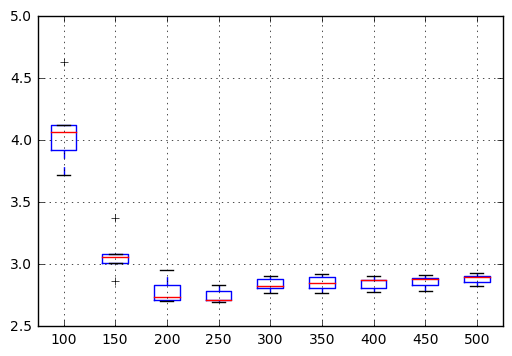

In [57]:
# save boxplot
results.boxplot()
plt.savefig('YRMSE_LSTM_epoch_boxplot.png')

Looking at the mean XRMSE and YRMSE vakues for diffrerent epochs, 150 epochs seems to be the best option considering both the descriptions.

In [ ]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def dropout_tuning(dropout, repeats, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    timesteps=18
    X_RMSE=[]
    Y_RMSE=[]
    for i in range(0,repeats):
        print(i)
        model_iter = Sequential()
        model_iter.add(LSTM(30, return_sequences=False, batch_input_shape=(128, timesteps, 2), stateful=True, dropout=dropout))
        model_iter.add(Dense(2))
        model_iter.add(LeakyReLU(alpha=0.05))
        model_iter.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])

        for j in range(500):
            model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
            model_iter.reset_states()

        Y_pred = model_iter.predict(X_test, batch_size=105)
        model_iter.reset_states()
        
        xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
        
        X_RMSE.append(xrmse)
        Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE

repeats=5
results_X = pd.DataFrame()
results_Y = pd.DataFrame()
dropouts=[0.0,0.2,0.4]
for dropout in dropouts:
    print('Dropout: ', dropout)
    results_X[str(dropout)], results_Y[str(dropout)]= dropout_tuning(dropout, repeats, X_train, Y_train, X_test, Y_test, X_val, Y_val)
print(results_X.describe())
print(results_Y.describe())

Adding a dropout worsens the results. Both YRMSE and XRMSE continuously decrease upto 250 epochs there for the model will be trained for 250 epochs.

In [38]:
model_5= stateful_LSTM(units= 30,lr= 0.001, batch=128, alpha=0.05)
model_5.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (128, 30)                 3960      
_________________________________________________________________
dense_2 (Dense)              (128, 2)                  62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (128, 2)                  0         
Total params: 4,022
Trainable params: 4,022
Non-trainable params: 0
_________________________________________________________________


In [39]:
hist_loss, hist_val_loss, hist_acc, hist_val_acc= stateful_fit(model_5, X_train, Y_train, X_val, Y_val, batch_size=128, epochs=500, weights_saved_file='weights_5.hdf5')

Epoch Number:  0
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 4s - loss: 0.0562 - rmse: 0.2262 - val_loss: 0.0106 - val_rmse: 0.1030

Epoch 00001: val_loss improved from inf to 0.01062, saving model to weights_5.hdf5
Epoch Number:  1
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0259 - rmse: 0.1606 - val_loss: 0.0119 - val_rmse: 0.1090

Epoch 00001: val_loss did not improve from 0.01062
Epoch Number:  2
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 0.0222 - rmse: 0.1485 - val_loss: 0.0125 - val_rmse: 0.1117

Epoch 00001: val_loss did not improve from 0.01062
Epoch Number:  3
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 1s - loss: 0.0177 - rmse: 0.1327 - val_loss: 0.0083 - val_rmse: 0.0908

Epoch 00001: val_loss improved from 0.01062 to 0.00826, saving model to weights_5.hdf5
Epoch Number:  4
Train on 7680 samples, validate on 2560 samples
Epoch 1/1
 - 2s - loss: 0.0142 - rmse: 0.1187 - val_loss: 0.006

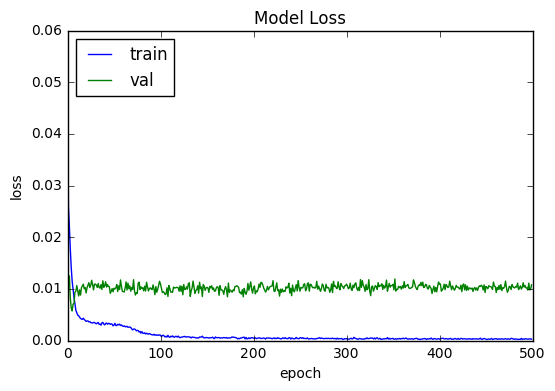

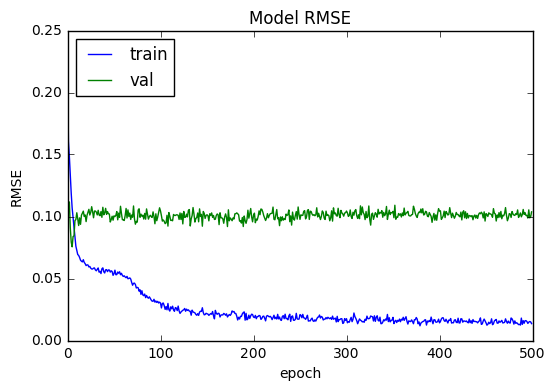

In [40]:
#plot the learning curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_acc, hist_val_acc)

In [ ]:
weights_saved_file='weights_5.hdf5'
model_5.load_weights(weights_saved_file)

In [41]:
scores = model_5.evaluate(X_test, Y_test, batch_size=128, verbose=0)
model_5.reset_states()
print('Overall RMSE evaluated during training', (scores[1]))

Overall RMSE evaluated during training 0.10348085127770901


In [42]:
# make predictions
Y_Pred_test = model_5.predict(X_test, batch_size=128)
model_5.reset_states()

In [43]:
X_RMSE, Y_RMSE = calculate_RMSE(Y_Pred_test, Y_test)
print('Test Score (X-coord) (unseen data): ', X_RMSE)
print('Test Score (Y-coord) (unseen data): ', Y_RMSE)

Test Score (X-coord) (unseen data):  143.8747984260366
Test Score (Y-coord) (unseen data):  83.23121476572446


In [36]:
#compare Y_test and Y_Pred_test
compare_true_pred(Y_Pred_test, Y_test)

Y_true:  [1337.27285415  659.0952381 ]
Y_Pred:  [1337.3746  657.3564] 

Y_true:  [948.73464746 475.94559585]
Y_Pred:  [947.5388  475.41608] 

Y_true:  [651.73079634 188.11012658]
Y_Pred:  [650.5887  189.57527] 

Y_true:  [320.73652695 364.10218978]
Y_Pred:  [320.93045 363.60208] 

Y_true:  [677.36978131 272.74047187]
Y_Pred:  [676.35913 275.22342] 

Y_true:  [798.64446108 282.61678832]
Y_Pred:  [797.8835 282.8138] 

Y_true:  [516.51452721 442.46835443]
Y_Pred:  [515.94336 442.73007] 

Y_true:  [1056.  230.]
Y_Pred:  [1054.6989  229.9792] 

Y_true:  [293.36344427 226.87408394]
Y_Pred:  [293.08173 228.89597] 

Y_true:  [286.68318214 515.23443223]
Y_Pred:  [286.1492 515.2904] 

Y_true:  [435.26611069 377.68393782]
Y_Pred:  [438.75812 375.69766] 

Y_true:  [708.20496566 484.40439707]
Y_Pred:  [709.40924 481.83456] 

Y_true:  [669.56034483 204.88819095]
Y_Pred:  [669.83105 205.17459] 

Y_true:  [835.86532508 471.18509317]
Y_Pred:  [833.5532 476.0741] 

Y_true:  [878.50431034 800.        ]
Y

In [ ]:
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [ ]:
# re-define the batch size
batch_size = 1
weights_saved_file='weights_5.hdf5'
# re-define model
new_model = Sequential()
new_model.add(LSTM(30, return_sequences=False, batch_input_shape=(batch_size, timesteps, 2), stateful=True))
new_model.add(Dense(2, activation='relu'))

# copy weights
model_5.load_weights(weights_saved_file)
old_weights = model_5.get_weights()
new_model.set_weights(old_weights)

# compile model
new_model.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])

In [ ]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=50
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = new_model.predict(input_sequence2)
                pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

In [52]:
#stateful simple LSTM
timesteps=18
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start= time.time()

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= stateful_LSTM(units= 30,lr= 0.001, batch=128, alpha= 0.05)
    
    for j in range(250):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_pred = model.predict(X_test, batch_size=128)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+ '\n')

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ), '\n')

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

NameError: name 'start' is not defined

In [ ]:
[3.7006027558313397, 4.051659077552403, 3.5674926365858277, 3.697349688540888, 4.089084800491663, 3.619216966608211, 3.6861337712076097, 3.6328955145695265, 3.6984248191903215, 3.62217244873127, 3.944367183056596, 3.668981463560003, 3.777913460862244, 3.725937819409193, 3.4731021800128024, 3.6942643631907552, 3.47032904712415, 3.48137989085911, 3.6919759903014033, 3.458357783066187, 3.955502104552594, 3.59667510668457, 3.5843926611693617, 3.4609621392253893, 3.2062791795650627, 3.8213235890745385, 3.728443627164039, 3.9147202835711314, 4.118932717915382, 3.882861922977401]
X-coord RMSE Mean: 3.700724499755032

[3.6551317325406663, 3.7452459873599437, 3.6454872272946037, 3.503883505899372, 3.7028279016825607, 3.678534978091606, 3.6350823354274864, 3.5305736847827625, 3.564412812226665, 3.6105969685267105, 3.582817589906975, 3.794257380391727, 3.643348396864073, 3.5712637696471625, 3.566369696214828, 3.4711537418848546, 3.90856183827199, 3.5472987428728864, 3.6957410350403346, 3.6518169264854716, 3.5836036180401596, 3.6749347860636075, 3.7275689310403117, 3.5519381432727584, 3.542465670755315, 3.643224923736787, 3.8012442533643003, 3.50326220246568, 3.6299096968798295, 3.5293848199564]
Y-coord RMSE Mean: 3.6297314432329277

In [42]:
X_RMSE= [3.807058018238731, 4.016742407339024, 3.498269848765245, 4.465584038502928, 4.33033575212926, 3.7478406045865498, 4.231186011568513, 4.447479209638824, 3.753327748112617, 4.504871346520693, 4.208376635168341, 3.9382587339837625, 3.820165381480231, 3.795496628364005, 3.9373235401804005, 4.981319965830776, 4.145594083554769, 3.6072896255436953, 5.043068332630799, 4.414035040227549, 3.8559756647747103, 4.27285399065034, 3.7557471531184246, 3.4647029124065565, 3.702043693483514, 3.5339919828000355, 4.6981736558193745, 4.845499108221047, 5.1091566031148625, 3.4327899898056424, 4.165184354894991, 4.5721781363245615]
Y_RMSE= [3.841903022889031, 3.568904281129219, 3.6419701879394584, 4.020492585833205, 3.7062008946723406, 4.017005107431353, 3.737712382852174, 3.97591408033326, 3.7576062502253067, 3.5544651155039926, 3.8608873211229238, 3.6824988410339285, 3.425669205024618, 3.596981074769191, 3.7149059580854242, 4.266211883725446, 3.5514040800858497, 3.425508535947137, 3.467435337728842, 3.7053619931621005, 3.490248699984325, 3.597097076029317, 3.899050757113243, 3.4020758040245207, 3.4522608099547645, 3.514690178241147, 3.780794203159965, 3.7420447226790374, 3.818724324117564, 3.2574677642132364, 3.9279744789148725, 4.271221950429978]

print('XRMSE(30 iterations): ', np.mean(X_RMSE[0:30]))
print('YRMSE(30 iterations): ', np.mean(Y_RMSE[0:30]))

XRMSE(30 iterations):  4.112151923552041
YRMSE(30 iterations):  3.6824497493003983


Comparig the results above, the stateful LSTM model does not outpreform a stateless model. The expectation for a staeful model to perform better is failed as it does not perform better than a stateless model.

In [44]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

timesteps=18
def stacked_stateful_LSTM(units, lr, batch, alpha):
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True))
    model.add(LSTM(units, return_sequences=False, stateful=True))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [ ]:
model_6=stacked_stateful_LSTM(30,0.001,105)
model_6.summary()

In [ ]:
#patience=2
hist_loss, hist_val_loss, hist_acc, hist_val_acc= stateful_fit(model_6, X_train, Y_train, X_val, Y_val, batch_size=105, weights_saved_file='weights_6.hdf5')

In [ ]:
stateful_learn_curve(hist_loss, hist_val_loss, hist_acc, hist_val_acc)

In [ ]:
weights_saved_file='weights_6.hdf5'
model_6.load_weights(weights_saved_file)
scores = model_6.evaluate(X_test, Y_test, batch_size=105, verbose=0)
model_6.reset_states()
print("Accuracy: %.2f%%" % (scores[1]*100))

In [ ]:
Y_Pred_test = model_6.predict(X_test,batch_size=105)
model_6.reset_states()

#inverse transform
Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
Y_test = scaler.inverse_transform(Y_test)

#calculate RMSE
Xcoord_pred=[]
Xcoord_true=[]
Ycoord_pred=[]
Ycoord_true=[]

for i in range(0,len(Y_Pred_test)):
    Xcoord_pred.append(Y_Pred_test[i][0])
    Ycoord_pred.append(Y_Pred_test[i][1])
    
for i in range(0,len(Y_test)):   
    Xcoord_true.append(Y_test[i][0])
    Ycoord_true.append(Y_test[i][1])

X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))

print('Test Score (X-coord) (unseen data): ', (X_RMSE))
print('Test Score (Y-coord) (unseen data): ', (Y_RMSE))

In [ ]:
#comparing the true test values and the preicted values
for i in range(len(Y_test)):
    print('Y_test: ', Y_test[i])
    print('Y_Pred_test: ', Y_Pred_test[i], '\n')

In [ ]:
X_max_true= max(Xcoord_true)
X_max_pred= max(Xcoord_pred)
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true)
X_min_pred= min(Xcoord_pred)
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true)
Y_max_pred= max(Ycoord_pred)
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true)
Y_min_pred= min(Ycoord_pred)
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [45]:
#stacked stateful LSTM for 30 iterations
sample_size=30
X_RMSE=[]
Y_RMSE=[]

start = time.time()

for i in range(sample_size):
    print('Experimental Run: ', i)
    model= stacked_stateful_LSTM(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(250):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_pred = model.predict(X_test, batch_size=128)
    model.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)

print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE))+'\n')

end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

Experimental Run:  0
Model created and compiled
Experimental Run:  1
Model created and compiled
Experimental Run:  2
Model created and compiled
Experimental Run:  3
Model created and compiled
Experimental Run:  4
Model created and compiled
Experimental Run:  5
Model created and compiled
Experimental Run:  6
Model created and compiled
Experimental Run:  7
Model created and compiled
Experimental Run:  8
Model created and compiled
Experimental Run:  9
Model created and compiled
Experimental Run:  10
Model created and compiled
Experimental Run:  11
Model created and compiled
Experimental Run:  12
Model created and compiled
Experimental Run:  13
Model created and compiled
Experimental Run:  14
Model created and compiled
Experimental Run:  15
Model created and compiled
Experimental Run:  16
Model created and compiled
Experimental Run:  17
Model created and compiled
Experimental Run:  18
Model created and compiled
Experimental Run:  19
Model created and compiled
Experimental Run:  20
Model cr

[3.5105140813190876, 3.7721540472766644, 3.1154497330823294, 4.020385701825066, 3.629341393239072, 3.3325260820737816, 3.7717350467180597, 3.2123367141915558, 3.2380830160338276, 4.242769816751605, 3.547317909988981, 3.155211676931144, 4.3766314732766, 3.2262024523708313, 3.143205846707972, 3.461294044044826, 4.624039960433866, 3.1065615109862885, 4.485438988869339, 3.581955902436592, 3.7645697237455624, 4.8057334019002145, 3.904990228271383, 4.210263247977688, 3.391380508978638, 5.060992899634459, 3.7823300297577775, 4.757821242604602, 4.982256010535947, 4.476370953245109]
X-coord RMSE Mean: 3.856328788173629

[3.137919302567881, 3.1802268865040952, 2.75091820668025, 2.926551972728409, 2.8618164829658803, 2.9586716157672464, 2.949401073828131, 3.055356953617212, 2.812359231870201, 3.025936872842148, 2.87394187595047, 2.897365766249174, 3.32467914584229, 2.9964227129209924, 2.820590531148364, 2.659732459239737, 2.891824541535877, 2.7604688508143536, 2.9196141967846465, 2.9906303866870814, 2.8808908253545713, 2.939230863880257, 2.8014284688071824, 3.131200335306003, 2.854818311937211, 2.818938450897758, 3.0110826042478314, 3.006251162944598, 3.097051092512847, 2.7287529793089838]
Y-coord RMSE Mean: 2.9354691387247223

Time Took :376.39 min

As compared to the previous models, this model does not outperform them. From all the models trained so far Model-2 stateless LSTM with shuffle=False, performs the best. The average RMSE (avg of XRMSE and YRMSE) is minimum for Model-2. Thus in th case of LSTM a stateless model performs better where as for Simple RNN a stateful stacked model performed the best. And among LSTM and Simple RNN, simpleRNN performed better with an average RMSE of 2.86 comapred to 3.18 for LSTM. 

So far, all models were trained on the dataset created by selecting random sequences. Now, a new dataset will be created by creating the samples in the order of the sequence, i.e., first 18 elements will be taken in the input for whiuch the 19th element will be the output, for the second sample the input will be from the 2nd input to the 19th element and 20th element will be the output and so on till the end of the sequence is reached. Now, we will have a large dataset and all the samples in a sequential order.

# Dataset-2: X and Y coordinates data extracted in a proper order without any randomization

In [57]:
#Taking data in a sequence without any randomization
input_data2=[]
output_data2=[]
timesteps= 18

for norm_data in norm_list:
    norm_data= norm_data.tolist()
    for i in range(len(norm_data)):
        # find the end of this pattern
        end_value = i + timesteps
        # check if we are beyond the sequence
        if end_value > len(norm_data)-1:
            break
        # gather input and output parts of the pattern
        input_data2.append(norm_data[i:end_value])
        output_data2.append(norm_data[end_value])

print(len(input_data2))
print(len(output_data2))
print('Input: ',input_data2[0:5],'\n')
print('Output: ',output_data2[0:5])

218153
218153
Input:  [[[0.3874223602484472, 0.8580729166666666], [0.3858695652173913, 0.8554687499999999], [0.3827639751552795, 0.8502604166666666], [0.37577639751552794, 0.8372395833333333], [0.36024844720496896, 0.8151041666666666], [0.3361801242236025, 0.7825520833333333], [0.30667701863354035, 0.7447916666666666], [0.27096273291925466, 0.7031249999999999], [0.23136645962732916, 0.6627604166666666], [0.1902173913043478, 0.6223958333333333], [0.1467391304347826, 0.5846354166666666], [0.10791925465838509, 0.5533854166666666], [0.07531055900621117, 0.5286458333333333], [0.04736024844720497, 0.5104166666666666], [0.008540372670807452, 0.4765625], [0.0046583850931677, 0.47265625], [0.0023291925465838484, 0.4700520833333333], [0.0, 0.4674479166666667]], [[0.3858695652173913, 0.8554687499999999], [0.3827639751552795, 0.8502604166666666], [0.37577639751552794, 0.8372395833333333], [0.36024844720496896, 0.8151041666666666], [0.3361801242236025, 0.7825520833333333], [0.30667701863354035, 0.7

In [58]:
Input2= np.array(input_data2)
Output2= np.array(output_data2)
print('Input: ',Input2[0:5],'\n')
print('Output: ',Output2[0:5])

Input:  [[[3.87422360e-01 8.58072917e-01]
  [3.85869565e-01 8.55468750e-01]
  [3.82763975e-01 8.50260417e-01]
  [3.75776398e-01 8.37239583e-01]
  [3.60248447e-01 8.15104167e-01]
  [3.36180124e-01 7.82552083e-01]
  [3.06677019e-01 7.44791667e-01]
  [2.70962733e-01 7.03125000e-01]
  [2.31366460e-01 6.62760417e-01]
  [1.90217391e-01 6.22395833e-01]
  [1.46739130e-01 5.84635417e-01]
  [1.07919255e-01 5.53385417e-01]
  [7.53105590e-02 5.28645833e-01]
  [4.73602484e-02 5.10416667e-01]
  [8.54037267e-03 4.76562500e-01]
  [4.65838509e-03 4.72656250e-01]
  [2.32919255e-03 4.70052083e-01]
  [0.00000000e+00 4.67447917e-01]]

 [[3.85869565e-01 8.55468750e-01]
  [3.82763975e-01 8.50260417e-01]
  [3.75776398e-01 8.37239583e-01]
  [3.60248447e-01 8.15104167e-01]
  [3.36180124e-01 7.82552083e-01]
  [3.06677019e-01 7.44791667e-01]
  [2.70962733e-01 7.03125000e-01]
  [2.31366460e-01 6.62760417e-01]
  [1.90217391e-01 6.22395833e-01]
  [1.46739130e-01 5.84635417e-01]
  [1.07919255e-01 5.53385417e-01]
  [7

In [59]:
print(Input2.shape[0])
print(Input2.shape[1])

218153
18


In [60]:
Input_reshaped_2 = np.reshape(Input2,(Input2.shape[0],Input2.shape[1],2))
print(Input_reshaped_2)

[[[3.87422360e-01 8.58072917e-01]
  [3.85869565e-01 8.55468750e-01]
  [3.82763975e-01 8.50260417e-01]
  ...
  [4.65838509e-03 4.72656250e-01]
  [2.32919255e-03 4.70052083e-01]
  [0.00000000e+00 4.67447917e-01]]

 [[3.85869565e-01 8.55468750e-01]
  [3.82763975e-01 8.50260417e-01]
  [3.75776398e-01 8.37239583e-01]
  ...
  [2.32919255e-03 4.70052083e-01]
  [0.00000000e+00 4.67447917e-01]
  [7.76397516e-04 4.66145833e-01]]

 [[3.82763975e-01 8.50260417e-01]
  [3.75776398e-01 8.37239583e-01]
  [3.60248447e-01 8.15104167e-01]
  ...
  [0.00000000e+00 4.67447917e-01]
  [7.76397516e-04 4.66145833e-01]
  [3.10559006e-03 4.62239583e-01]]

 ...

 [[9.14079422e-01 8.67410161e-03]
  [9.14079422e-01 7.43494424e-03]
  [9.14079422e-01 8.67410161e-03]
  ...
  [9.11913357e-01 2.23048327e-02]
  [9.11913357e-01 2.35439901e-02]
  [9.11913357e-01 2.47831475e-02]]

 [[9.14079422e-01 7.43494424e-03]
  [9.14079422e-01 8.67410161e-03]
  [9.13357401e-01 8.67410161e-03]
  ...
  [9.11913357e-01 2.35439901e-02]
  [9

In [ ]:
# train_size1 = int(len(Input_reshaped_2) * 0.80)
# val_size= int(train_size1 * 0.25)
# train_size2= train_size1 - val_size
# test_size = len(Input_reshaped_2) - train_size1

# X_train_2, X_val_2, X_test_2 = Input_reshaped_2[0:train_size2], Input_reshaped_2[train_size2:(train_size2+val_size)], Input_reshaped_2[(train_size2+val_size):len(Input_reshaped_2)]
# Y_train_2, Y_val_2, Y_test_2= Output2[0:train_size2], Output2[train_size2:(train_size2+val_size)], Output2[(train_size2+val_size):len(Input_reshaped_2)]
# print('Length of Train: ', len(X_train_2), len(Y_train_2))
# print('Length of Validation: ', len(X_val_2), len(Y_val_2))
# print('Length of Test: ', len(X_test_2), len(Y_test_2))


In [149]:
#split the dataset into train, validation and test datasets
X_trainval_2,X_test_2,Y_trainval_2,Y_test_2= train_test_split(Input_reshaped_2,Output2,test_size=0.2,random_state=0)
X_train_2,X_val_2,Y_train_2,Y_val_2= train_test_split(X_trainval_2,Y_trainval_2,test_size=0.25,random_state=0)

#slicing to get a abtch size divisible by the lenght of each of train  test and val datasets
X_train_2= X_train_2[:130800]
Y_train_2= Y_train_2[:130800]

X_test_2= X_test_2[:43600]
Y_test_2= Y_test_2[:43600]

X_val_2= X_val_2[:43600]
Y_val_2= Y_val_2[:43600]

print('Length of Train: ', len(X_train_2), len(Y_train_2))
print('Length of Validation: ', len(X_val_2), len(Y_val_2))
print('Length of Test: ', len(X_test_2), len(Y_test_2))

Length of Train:  130800 130800
Length of Validation:  43600 43600
Length of Test:  43600 43600


The two models that performed the best above will be trained with this dataset. A stateful simple RNN with 2 hidden layers and a stateless LSTM with 1 hidden layer will be trained in order to compare the performance.

In [162]:
SimpleRNN_first_model= stacked_stateful_SimpleRNN(units=60, lr=0.001, batch= 545, alpha=0.05)
SimpleRNN_first_model.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_10 (SimpleRNN)    (545, 18, 60)             3780      
_________________________________________________________________
simple_rnn_11 (SimpleRNN)    (545, 60)                 7260      
_________________________________________________________________
dense_15 (Dense)             (545, 2)                  122       
_________________________________________________________________
leaky_re_lu_15 (LeakyReLU)   (545, 2)                  0         
Total params: 11,162
Trainable params: 11,162
Non-trainable params: 0
_________________________________________________________________


In [163]:
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(SimpleRNN_first_model, X_train_2, Y_train_2, X_val_2, Y_val_2, batch_size=545, epochs=20, weights_saved_file='Simple_RNN_first_wts.hdf5')

Epoch Number:  0
Train on 130800 samples, validate on 43600 samples
Epoch 1/1
 - 24s - loss: 0.0077 - rmse: 0.0479 - val_loss: 2.9197e-04 - val_rmse: 0.0170

Epoch 00001: val_loss improved from inf to 0.00029, saving model to Simple_RNN_first_wts.hdf5
Epoch Number:  1
Train on 130800 samples, validate on 43600 samples
Epoch 1/1
 - 21s - loss: 3.2844e-04 - rmse: 0.0163 - val_loss: 1.5728e-04 - val_rmse: 0.0124

Epoch 00001: val_loss improved from 0.00029 to 0.00016, saving model to Simple_RNN_first_wts.hdf5
Epoch Number:  2
Train on 130800 samples, validate on 43600 samples
Epoch 1/1
 - 21s - loss: 1.6265e-04 - rmse: 0.0122 - val_loss: 1.2008e-04 - val_rmse: 0.0109

Epoch 00001: val_loss improved from 0.00016 to 0.00012, saving model to Simple_RNN_first_wts.hdf5
Epoch Number:  3
Train on 130800 samples, validate on 43600 samples
Epoch 1/1
 - 21s - loss: 9.9438e-05 - rmse: 0.0098 - val_loss: 8.6486e-05 - val_rmse: 0.0092

Epoch 00001: val_loss improved from 0.00012 to 0.00009, saving mod

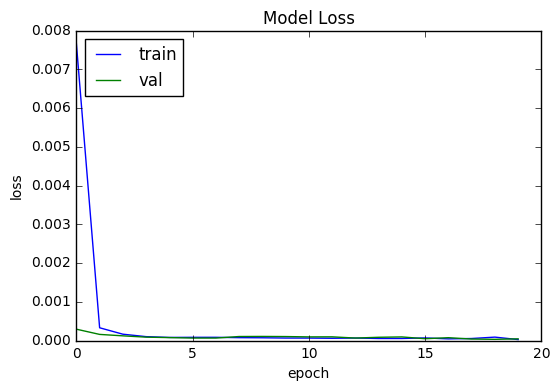

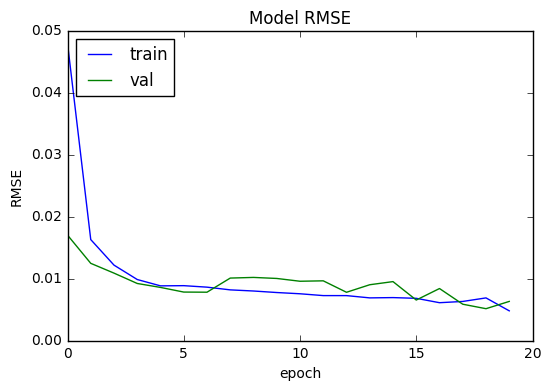

In [164]:
#plot loss and rmse curve of the returned history
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [167]:
Y_Pred_train = SimpleRNN_first_model.predict(X_train_2, batch_size=545)
SimpleRNN_first_model.reset_states()
Y_Pred_val = SimpleRNN_first_model.predict(X_val_2, batch_size=545)
SimpleRNN_first_model.reset_states()
Y_Pred_test = SimpleRNN_first_model.predict(X_test_2, batch_size=545)
SimpleRNN_first_model.reset_states()

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train_2)
print('Train Score (X-coord): ', xrmse)
print('Train Score (Y-coord): ', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_val, Y_val_2)
print('Val Score (X-coord): ', xrmse)
print('Val Score (Y-coord): ', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test_2)
print('Test Score (X-coord) unseen data: ', xrmse)
print('Test Score (Y-coord) unseen data: ', yrmse)

Train Score (X-coord):  7.162787661027074
Train Score (Y-coord):  4.652496842868224
Val Score (X-coord):  7.905756559929748
Val Score (Y-coord):  5.312311959773927
Test Score (X-coord) unseen data:  7.862372559799063
Test Score (Y-coord) unseen data:  5.686660341186439


In [ ]:
#hyperparameter tuning for stateless LSTM
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch):
    X_error_scores = []
    Y_error_scores = []
    model = stateless_LSTM(units= n, lr= lr, alpha=0.05)
    for i in range(20):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
    
    Y_Pred = model.predict(X_test)
    
    xrmse, yrmse= calculate_RMSE(Y_Pred, Y_test)
    print('Test XRMSE: ', xrmse)
    print('Test YRMSE: ', yrmse)
    X_error_scores.append(xrmse)
    Y_error_scores.append(yrmse)
    return X_error_scores, Y_error_scores
start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [50,60,70,80]
learn_rate= [0.001]
batch_size= [100,200,400,545]
for n in neurons:
    for lr in learn_rate:
        for batch in batch_size:
            print('Units: ',n,', Learn rate: ',lr,', Batch Size: ',batch)
            print('Model Number: ', count)
            model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)]
            X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_train_2, Y_train_2, X_val_2, Y_val_2, X_test_2, Y_test_2, n, lr, batch)
            count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

In [168]:
First_model= stateless_LSTM(units=60, lr=0.001, alpha=0.05)
First_model.summary()

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 60)                15120     
_________________________________________________________________
dense_16 (Dense)             (None, 2)                 122       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 2)                 0         
Total params: 15,242
Trainable params: 15,242
Non-trainable params: 0
_________________________________________________________________


In [169]:
hist= stateless_fit(First_model, X_train_2, Y_train_2, X_val_2, Y_val_2, batch=545, epochs=20, weights_saved_file='First_model_wts.hdf5', shuffle=False)

Train on 130800 samples, validate on 43600 samples
Epoch 1/20
 - 42s - loss: 0.0071 - rmse: 0.0597 - val_loss: 0.0013 - val_rmse: 0.0362

Epoch 00001: val_loss improved from inf to 0.00131, saving model to First_model_wts.hdf5
Epoch 2/20
 - 36s - loss: 9.0541e-04 - rmse: 0.0298 - val_loss: 6.1380e-04 - val_rmse: 0.0247

Epoch 00002: val_loss improved from 0.00131 to 0.00061, saving model to First_model_wts.hdf5
Epoch 3/20
 - 39s - loss: 4.5463e-04 - rmse: 0.0212 - val_loss: 3.6792e-04 - val_rmse: 0.0191

Epoch 00003: val_loss improved from 0.00061 to 0.00037, saving model to First_model_wts.hdf5
Epoch 4/20
 - 36s - loss: 3.0968e-04 - rmse: 0.0175 - val_loss: 2.7144e-04 - val_rmse: 0.0164

Epoch 00004: val_loss improved from 0.00037 to 0.00027, saving model to First_model_wts.hdf5
Epoch 5/20
 - 37s - loss: 2.3115e-04 - rmse: 0.0151 - val_loss: 2.1120e-04 - val_rmse: 0.0144

Epoch 00005: val_loss improved from 0.00027 to 0.00021, saving model to First_model_wts.hdf5
Epoch 6/20
 - 36s - l

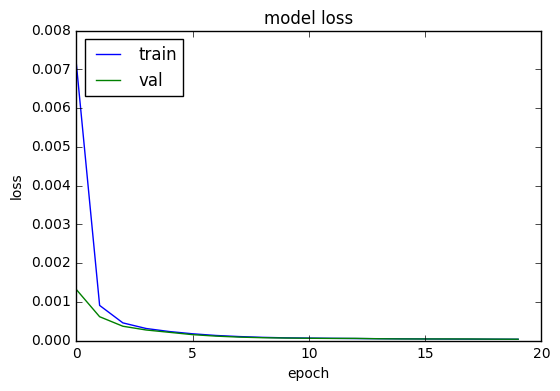

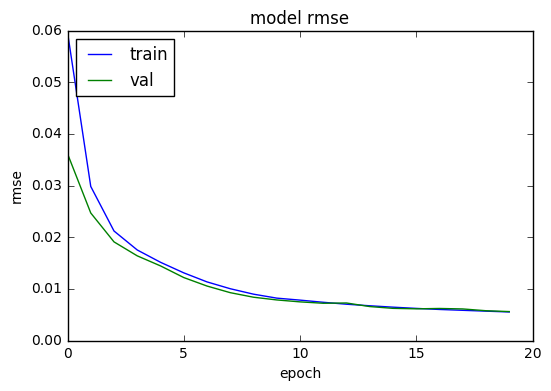

In [170]:
stateless_learn_curve(hist)

In [ ]:
weights_saved_file='First_model_wts.hdf5'
First_model.load_weights(weights_saved_file)

In [91]:
scores = First_model.evaluate(X_test_2, Y_test_2, verbose=0)
print("Overall RMSE during training ", scores[1])

Overall RMSE during training  0.0029372917360198122


In [171]:
Y_Pred_train = First_model.predict(X_train_2)
Y_Pred_val = First_model.predict(X_val_2)
Y_Pred_test = First_model.predict(X_test_2)

xrmse, yrmse= calculate_RMSE(Y_Pred_train, Y_train_2)
print('Train Score (X-coord): ', xrmse)
print('Train Score (Y-coord): ', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_val, Y_val_2)
print('Val Score (X-coord): ', xrmse)
print('Val Score (Y-coord): ', yrmse)

xrmse, yrmse= calculate_RMSE(Y_Pred_test, Y_test_2)
print('Test Score (X-coord) unseen data: ', xrmse)
print('Test Score (Y-coord) unseen data: ', yrmse)

Train Score (X-coord):  6.235291153918501
Train Score (Y-coord):  4.3461226972206095
Val Score (X-coord):  6.731672114391295
Val Score (Y-coord):  4.725008413302522
Test Score (X-coord) unseen data:  6.8786024484487776
Test Score (Y-coord) unseen data:  5.555016507079851


In [93]:
#comparing the true test values and the preicted values
compare_true_pred(Y_Pred_test[:50], Y_test_2[:50])

Y_true:  [366.49867934 244.4556962 ]
Y_Pred:  [366.2441  243.79333] 

Y_true:  [ 96.14655811 101.50261097]
Y_Pred:  [ 95.65591  101.285965] 

Y_true:  [497.2935719  341.32486388]
Y_Pred:  [497.25922 341.14743] 

Y_true:  [240.78288431 172.14457029]
Y_Pred:  [239.87756 171.96873] 

Y_true:  [628.19257013 316.52979275]
Y_Pred:  [629.8563  315.56805] 

Y_true:  [216.30286113 227.58852259]
Y_Pred:  [215.68828 227.12187] 

Y_true:  [541.58117959 260.56715064]
Y_Pred:  [541.339   259.63742] 

Y_true:  [ 94.49326275 427.82723735]
Y_Pred:  [334.17053 362.26797] 

Y_true:  [467.67406233 202.13857428]
Y_Pred:  [467.49545 201.32272] 

Y_true:  [669.7112069  305.48241206]
Y_Pred:  [670.39124 305.0374 ] 

Y_true:  [503.23459245 315.98911071]
Y_Pred:  [503.20612 315.6442 ] 

Y_true:  [641.60961437 178.65489674]
Y_Pred:  [641.30914 177.80534] 

Y_true:  [349.95603629 335.82539683]
Y_Pred:  [349.8857  335.33557] 

Y_true:  [485.24722428 155.26501305]
Y_Pred:  [486.15228 153.71632] 

Y_true:  [546.8922

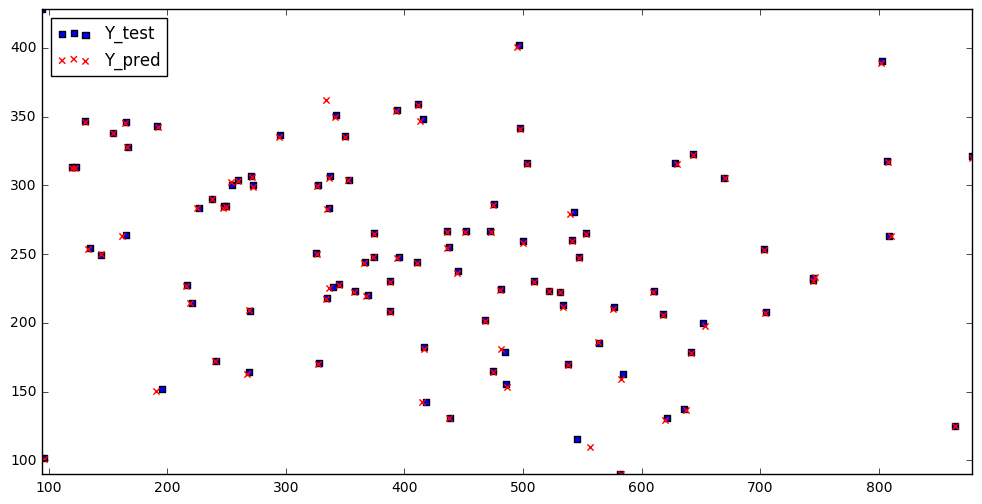

In [94]:
#plot first 100 test values ad their respective predictions
Xcoord_pred, Ycoord_pred, Xcoord_true, Ycoord_true= XY_coord(Y_Pred_test, Y_test_2)

X_max_true= max(Xcoord_true[:100])
X_max_pred= max(Xcoord_pred[:100])
X_max= max(X_max_true, X_max_pred)

X_min_true= min(Xcoord_true[:100])
X_min_pred= min(Xcoord_pred[:100])
X_min= min(X_min_true, X_min_pred)

Y_max_true= max(Ycoord_true[:100])
Y_max_pred= max(Ycoord_pred[:100])
Y_max= max(Y_max_true, Y_max_pred)

Y_min_true= min(Ycoord_true[:100])
Y_min_pred= min(Ycoord_pred[:100])
Y_min= min(Y_min_true, Y_min_pred)

plt.figure(figsize=(12,6))
plt.xlim(X_min,X_max)
plt.ylim(Y_min,Y_max)
plt.scatter(Xcoord_true[:100],Ycoord_true[:100], c='b', marker='s', label='Y_test') #blue squares represent the true values
plt.scatter(Xcoord_pred[:100], Ycoord_pred[:100], c='r', marker='x', label='Y_pred') #red crosses represent the predicted values
plt.legend(loc='upper left')
plt.show()

In [ ]:
#hyperparameter tuning for number of units/neurons, learn rate and batch size for a stateless LSTM
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch):
    X_error_scores = []
    Y_error_scores = []
    # fit the model
    Y_test = scaler.fit_transform(Y_test)
    es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    lstm_model = stateless_LSTM(n,lr)
    lstm_model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=batch, epochs=300, verbose=0, callbacks=[es], shuffle=False)
    Y_Pred = lstm_model.predict(X_test)
    Y_Pred = scaler.inverse_transform(Y_Pred)
    Y_test = scaler.inverse_transform(Y_test)
    # report performance
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]

    for i in range(0,len(Y_Pred)):
        Xcoord_pred.append(Y_Pred[i][0])
        Ycoord_pred.append(Y_Pred[i][1])

    for i in range(0,len(Y_test)):   
        Xcoord_true.append(Y_test[i][0])
        Ycoord_true.append(Y_test[i][1])

    X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    print('Test XRMSE: ', str(X_RMSE))
    print('Test YRMSE: ', str(Y_RMSE))
    X_error_scores.append(X_RMSE)
    Y_error_scores.append(Y_RMSE)
    return X_error_scores, Y_error_scores

start = time.time()
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60,70,80]
learn_rate= [0.001,0.01]
batch_size= [113,226,382]
for n in neurons:
    print(n)
    for lr in learn_rate:
        print(lr)
        for batch in batch_size:
            print(batch)
            X_coord_results[str(n)+','+str(lr)+','+str(batch)], Y_coord_results[str(n)+','+str(lr)+','+str(batch)]  = experiment(X_train_2, Y_train_2, X_val_2, Y_val_2, X_test_2, Y_test_2, n, lr, batch)
# summarize results
print(X_coord_results.describe())
print(Y_coord_results.describe())
summarize_X(X_coord_results)
summarize_Y(Y_coord_results)
X_boxplot(X_coord_results)
Y_boxplot(Y_coord_results)
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))

In [97]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=50
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = First_model.predict(input_sequence2)
                pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

In [ ]:
model2= stateful_LSTM(units=70, lr=0.001, batch=382)

In [ ]:
hist_loss, hist_val_loss, hist_acc, hist_val_acc= stateful_fit(model2, X_train_2, Y_train_2, X_val_2, Y_val_2, batch_size=382, weights_saved_file='weights_4.hdf5')

In [ ]:
stateful_learn_curve(hist_loss, hist_val_loss, hist_acc, hist_val_acc)

In [ ]:
batch_size=382
weights_saved_file='weights_4.hdf5'
model2.load_weights(weights_saved_file)
scores2 = model2.evaluate(X_test_2, Y_test_2, batch_size=batch_size, verbose=0)
model2.reset_states()
print("Accuracy: %.2f%%" % (scores2[1]*100))

In [ ]:
Y_Pred_test = model2.predict(X_test_2,batch_size=batch_size)
model2.reset_states()
Y_Pred_train = model2.predict(X_train_2,batch_size=batch_size)
model2.reset_states()
Y_Pred_val = model2.predict(X_val_2,batch_size=batch_size)
model2.reset_states()

#inverse transform
Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
Y_test_2 = scaler.inverse_transform(Y_test_2)

Y_Pred_train = scaler.inverse_transform(Y_Pred_train)
Y_train_2 = scaler.inverse_transform(Y_train_2)

Y_Pred_val = scaler.inverse_transform(Y_Pred_val)
Y_val_2 = scaler.inverse_transform(Y_val_2)

#calculate RMSE
RMSE_Score_1 = math.sqrt(mean_squared_error(Y_train_2, Y_Pred_train))
print('Train Score: %.2f RMSE' % (RMSE_Score_1))

RMSE_Score_2 = math.sqrt(mean_squared_error(Y_val_2, Y_Pred_val))
print('Val Score: %.2f RMSE' % (RMSE_Score_2))

RMSE_Score_3 = math.sqrt(mean_squared_error(Y_test_2, Y_Pred_test))
print('Test Score (unseen data): %.2f RMSE' % (RMSE_Score_3))

In [ ]:
# re-define the batch size
batch_size = 1

# re-define model
new_model3 = Sequential()
new_model3.add(LSTM(70, return_sequences=False, batch_input_shape=(batch_size, timesteps, 2), stateful=True))
new_model2.add(Dense(2, activation='relu'))

# copy weights
weights_saved_file2='weights_4.hdf5'
model2.load_weights(weights_saved_file2)
old_weights = model2.get_weights()
new_model3.set_weights(old_weights)

# compile model
new_model3.compile(Adam(lr=0.001), loss='mse', metrics=['accuracy'])

In [ ]:
#img= the image where you want to draw the shapes
#the tuple (255,0,0) depicts the color of the shape. Here, it is Blue.
#(x,y) depict the centre coordinates
#2 is the radius
#-1 is the thickness, Here, -1 means closed circle,i.e., fill the shape

n_predictions=100
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            for i in range(n_predictions):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp = new_model3.predict(input_sequence2)
                pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

In [ ]:
model3=stacked_stateful_LSTM(70,0.001,382)

In [ ]:
hist_loss, hist_val_loss, hist_acc, hist_val_acc= stateful_fit(model3, X_train_2, Y_train_2, X_val_2, Y_val_2, batch_size=382, weights_saved_file='weights_5.hdf5')

In [ ]:
#Grid Search for hyperparameter tuning
es= EarlyStopping(monitor='loss',
                  min_delta=0,
                  patience=2,
                  verbose=1,
                  mode='min',
                  restore_best_weights= True)

callbacks_list=[es]

def create_model(neurons=60, learn_rate=0.01):
    model = Sequential()
    model.add(LSTM(neurons, return_sequences=False, input_shape=(timesteps,2)))
#     model.add(Dropout(dropout_rate))
    model.add(Dense(2, activation='relu'))
    model.compile(Adam(lr=learn_rate), loss='mse', metrics=['accuracy'])
    return model

#Keras models can be used with scikit learn by wrapping them with KerasClassifier
model_tuning = KerasRegressor(build_fn=create_model,epochs=300,batch_size=504, verbose=2)
neurons= [30,40,50,60,70]
learn_rate= [0.001, 0.01, 0.1]
#dropout_rate = [0.0, 0.1, 0.2]

param_grid = dict(neurons=neurons, learn_rate=learn_rate)
grid = GridSearchCV(estimator=model_tuning, param_grid=param_grid, scoring=make_scorer(mean_squared_error, greater_is_better=False), cv=5, n_jobs=-1)
fit_params = dict(callbacks=callbacks_list)
grid_result = grid.fit(X_train_2, Y_train_2, **fit_params)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
mean_score = grid_result.cv_results_['mean_test_score']
std_score = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(mean_score, std_score, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
#1st dataset, stateful LSTM
#calculate the results for 60 iterations in order to choose the final sample size required.
timesteps=18
X_RMSE=[]
Y_RMSE=[]

start= time.time()
for i in range(0,60):
    print('Experimental Run: ', i+1)
    
    model_iter = stateful_LSTM(units=30, lr=0.001, batch=128, alpha=0.05)
    
    for j in range(250):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=128, verbose=0, shuffle=False)
        model_iter.reset_states()
    
    Y_pred = model_iter.predict(X_test, batch_size=128)
    model_iter.reset_states()
    
    #invert and calculate RMSE
    xrmse,yrmse= calculate_RMSE(Y_pred, Y_test)
    X_RMSE.append(xrmse)
    print('XRMSE for ', i+1, 'iterations: ', X_RMSE, '\n')
    Y_RMSE.append(yrmse)
    print('YRMSE for ', i+1, 'iterations: ', Y_RMSE)


print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))
end= time.time()
print('Time took :{:3.2f} min'.format((end-start)/60))

In [ ]:
#1st dataset, stateless LSTM, shuffle=False
#calculate the results for 100 iterations in order to choose the final sample size required.
timesteps=18
X_RMSE=[]
Y_RMSE=[]
Acc_list=[]
for i in range(0,100):
    print(i)
    if(i!=0):
        #rescaling Y-test
        Y_test = scaler.fit_transform(Y_test)
    
    model_iter = Sequential()
    model_iter.add(LSTM(30, return_sequences=False, input_shape=(timesteps,2)))
    model_iter.add(Dense(2, activation='relu'))
    model_iter.compile(Adam(lr=0.001), loss='mse', metrics=['accuracy'])
    
    es= EarlyStopping(monitor='val_loss', min_delta=0, patience=2, verbose=1, mode='min', restore_best_weights= True)
    history=model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=300, batch_size=105, callbacks=[es], verbose=0, shuffle=False)
    
    score = model_iter.evaluate(X_test, Y_test, verbose=0)
    Acc_list.append(score[1])
    
    Y_pred = model_iter.predict(X_test)
    print(Y_test[:5])
    print(Y_pred[:5])
    
    #inverse transform
    Y_pred = scaler.inverse_transform(Y_pred)
    Y_test = scaler.inverse_transform(Y_test)
    print(Y_test[:5])
    print(Y_pred[:5])
    
    #calculate RMSE
    Xcoord_pred=[]
    Xcoord_true=[]
    Ycoord_pred=[]
    Ycoord_true=[]

    for k in range(0,len(Y_pred)):
        Xcoord_pred.append(Y_pred[k][0])
        Ycoord_pred.append(Y_pred[k][1])

    for l in range(0,len(Y_test)):   
        Xcoord_true.append(Y_test[l][0])
        Ycoord_true.append(Y_test[l][1])
    xrmse=math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
    print('X_RMSE: ',xrmse)
    X_RMSE.append(xrmse)
    
    yrmse=math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
    print('Y_RMSE: ', yrmse, '\n')
    Y_RMSE.append(yrmse)

print(Acc_list)
print('Accuracy Mean: '+ str(np.mean(Acc_list))+'\n')
print(X_RMSE)
print('X-coord RMSE Mean: '+ str(np.mean(X_RMSE))+'\n')
print(Y_RMSE)
print('Y-coord RMSE Mean: '+ str(np.mean(Y_RMSE)))

In [21]:
#100 iterations stateful LSTM leaky relu
#The standard deviation (average distance of scores from the mean score) gives an idea of how unstable the model is.

"""The standard error of the mean model skill is how much the estimated mean of model skill score differs from the
unknown actual mean model skill (e.g. how wrong mean_skill might be)"""
# X_RMSE= [3.8853274233308426, 6.048512731193534, 10.491833331148749, 5.056861847874053, 6.28242150254989, 5.339346998261658, 5.571121648897476, 7.533173445245294, 5.6251538275334605, 2.7927002557088736, 3.599804388152344, 2.8671370647527077, 4.925871972578009, 4.618323605381059, 4.791365057554111, 6.054008680378233, 5.555903749899231, 5.66359692289575, 4.136518542009846, 5.198097543946366, 6.184439357219802, 7.715838298170153, 4.414236440505084, 3.8690569383818842, 2.947778741027874, 4.777270665191425, 3.895766978917469, 9.507403188998865, 4.58641797649904, 5.574585924732668, 5.542423416664573, 5.701255249746627, 4.750691557706325, 3.2810863315937016, 4.59080239655914, 5.6650910039031075, 7.845737222192744, 5.611909303270001, 6.020944357872917, 8.100670025747704, 5.046383765062989, 5.044738776140763, 6.124182007388174, 4.589248737029832, 5.669852215851795, 3.4058904506882435, 5.5848008034193635, 4.87032148667569, 5.139299938682172, 3.5055693483369206, 7.711052994016984, 3.6659957398493517, 3.067038900880956, 4.691626053326373, 6.515282516627432, 7.265292097636376, 5.1615473427149725, 2.909196190033581, 5.701295220043733, 4.8270369246702485, 4.960490011565304, 3.04351571623676, 5.488102353616132, 5.85774409793964, 6.101732696261686, 9.21326619348287, 6.115564295563086, 5.024350873363646, 4.9255266891928615, 6.378884963960781, 5.288404286353093, 5.113380413712298, 6.598291214553018, 5.679738844512595, 6.7772798414054085, 7.909560032514356, 7.217406629787127, 10.054596172042512, 5.011102914071115, 5.403244784074745, 5.5316179369417515, 5.677755068215523, 3.9053671862182586, 4.892032331785921, 5.465627707765324, 5.198030936727883, 3.0143617554653157, 5.594246237369925, 5.403848190789216, 4.550224800577922, 6.164104606466266, 2.5787817048483497, 10.147871393271336, 5.818418110950998, 9.671285730101125, 7.511619951860337, 5.6699814242513495, 5.309864122133768, 6.341491674963739, 5.745403087622975]
# Y_RMSE= [2.5947160889014373, 6.7515901717599425, 6.735361174579422, 5.96708853806033, 6.757377091309032, 6.718191177320637, 6.7914805330175225, 8.166900779181915, 6.6345508984002315, 5.456411914605161, 5.8687220891233824, 5.898777802483998, 6.61549815881137, 5.305602581729247, 6.2581228173201, 6.699283742285462, 6.848816621033681, 6.7051125101041, 5.9130031265031775, 6.1127976750045585, 7.132806560779656, 7.295488461796799, 5.672587868694276, 5.869841735605674, 5.637334344632469, 6.73770936965752, 5.786491032476401, 7.79011114223389, 5.547044959525078, 6.6314755953948845, 6.259058890074815, 7.111857518795505, 6.263047988906843, 5.982970088415501, 6.118289045128576, 6.596780320541264, 7.019013357535366, 6.225817269702546, 5.794372476962843, 7.430351187381764, 5.185786306517543, 6.42250725573177, 7.967347331661726, 6.176634808557946, 5.721346623713513, 5.465118152179373, 6.687728063638481, 6.56038961237825, 6.898542994970518, 5.911410323005184, 7.87122033796815, 5.853510139907336, 5.733527480581369, 6.467701832821609, 6.618340560814195, 7.5132078312236645, 6.724493035770376, 5.769870598881008, 5.37053491995265, 5.336224216562853, 5.855868996586033, 5.721573486407152, 5.971307735936132, 7.6343819552494026, 6.547215472964372, 8.22562104542199, 6.069559005177783, 6.148370025900643, 6.2884253323642545, 5.296841527366684, 5.876433006420438, 6.674498882565073, 6.563660706429979, 6.473049023448252, 6.679800247337806, 6.481201684788776, 5.617174856198941, 6.4942998876543605, 4.957082330956123, 6.221405858520934, 4.913760257922748, 6.864641066631364, 5.616954493049946, 5.181759072122813, 6.54609456375584, 6.23596682027326, 5.541562665512755, 5.902134310486174, 6.573006130388691, 5.064090053556868, 5.833961963518202, 5.528593205012236, 7.867926030487699, 5.5443509403939215, 7.3567840232177675, 7.241246365025109, 5.605407468389276, 6.458708854157027, 6.788716630377356, 6.990772216977942]
X_RMSE= [3.807058018238731, 4.016742407339024, 3.498269848765245, 4.465584038502928, 4.33033575212926, 3.7478406045865498, 4.231186011568513, 4.447479209638824, 3.753327748112617, 4.504871346520693, 4.208376635168341, 3.9382587339837625, 3.820165381480231, 3.795496628364005, 3.9373235401804005, 4.981319965830776, 4.145594083554769, 3.6072896255436953, 5.043068332630799, 4.414035040227549, 3.8559756647747103, 4.27285399065034, 3.7557471531184246, 3.4647029124065565, 3.702043693483514, 3.5339919828000355, 4.6981736558193745, 4.845499108221047, 5.1091566031148625, 3.4327899898056424, 4.165184354894991, 4.5721781363245615]
Y_RMSE= [3.841903022889031, 3.568904281129219, 3.6419701879394584, 4.020492585833205, 3.7062008946723406, 4.017005107431353, 3.737712382852174, 3.97591408033326, 3.7576062502253067, 3.5544651155039926, 3.8608873211229238, 3.6824988410339285, 3.425669205024618, 3.596981074769191, 3.7149059580854242, 4.266211883725446, 3.5514040800858497, 3.425508535947137, 3.467435337728842, 3.7053619931621005, 3.490248699984325, 3.597097076029317, 3.899050757113243, 3.4020758040245207, 3.4522608099547645, 3.514690178241147, 3.780794203159965, 3.7420447226790374, 3.818724324117564, 3.2574677642132364, 3.9279744789148725, 4.271221950429978]

print('X_RMSE_SD: ', np.std(X_RMSE))
print('X_RMSE_mean: ', np.mean(X_RMSE))
print('XRMSE_Std_error: ', (np.std(X_RMSE)/math.sqrt(len(X_RMSE))),'\n')

print('Y_RMSE_SD: ', np.std(Y_RMSE))
print('Y_RMSE_mean: ', np.mean(Y_RMSE))
print('YRMSE_Std_error: ', (np.std(Y_RMSE)/math.sqrt(len(Y_RMSE))))

X_RMSE_SD:  0.47109464443396926
X_RMSE_mean:  4.128185006180649
XRMSE_Std_error:  0.08327855441498128 

Y_RMSE_SD:  0.2373851438107322
Y_RMSE_mean:  3.7085215283861492
YRMSE_Std_error:  0.04196416123537813


               0
count  32.000000
mean    4.128185
std     0.478633
min     3.432790
25%     3.755142
50%     4.081168
75%     4.452005
max     5.109157


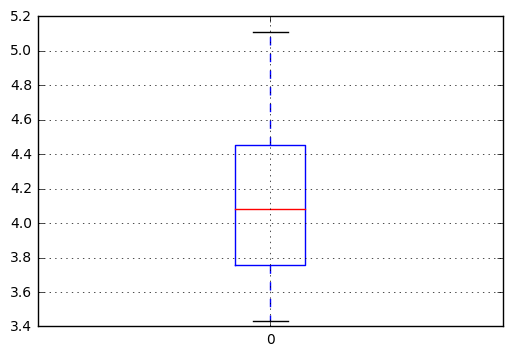

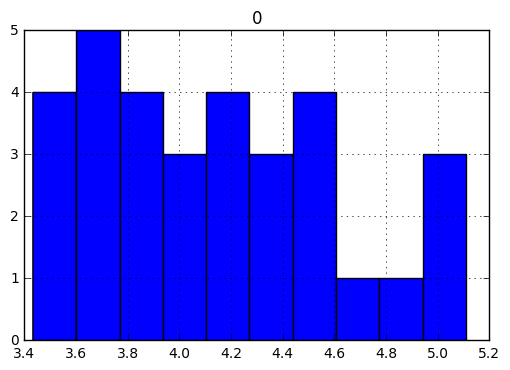

In [22]:
#descriptive stats
XRMSE_df= pd.DataFrame(X_RMSE)
print(XRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
XRMSE_df.boxplot()
plt.show()
# histogram- distribution of data
#to check if the results are normally distributed
XRMSE_df.hist()
plt.show()

               0
count  32.000000
mean    3.708522
std     0.241184
min     3.257468
25%     3.542226
50%     3.705781
75%     3.846649
max     4.271222


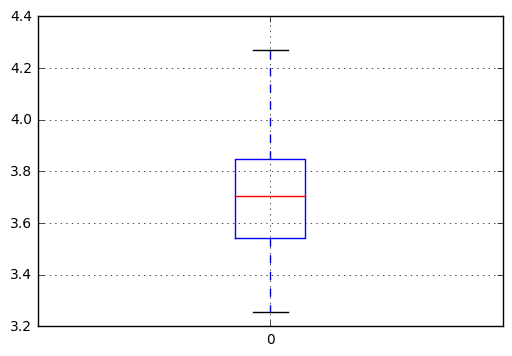

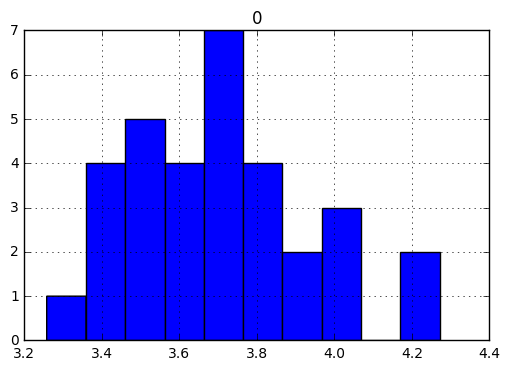

In [23]:
#descriptive stats
YRMSE_df= pd.DataFrame(Y_RMSE)
print(YRMSE_df.describe())
# box and whisker plot of model skill- spread of the data
#It shows the middle 50% (box), outliers (dots/+), and the median (green line).
YRMSE_df.boxplot()
plt.show()
# histogram- distribution of data
#to check if the results are normally distributed
YRMSE_df.hist()
plt.show()

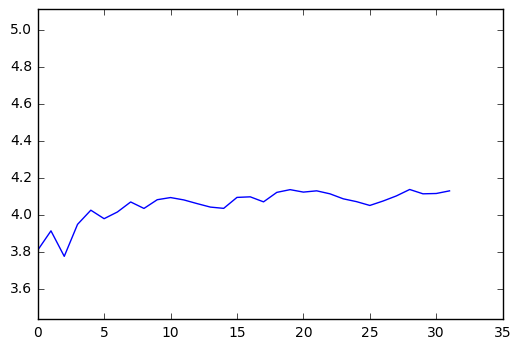

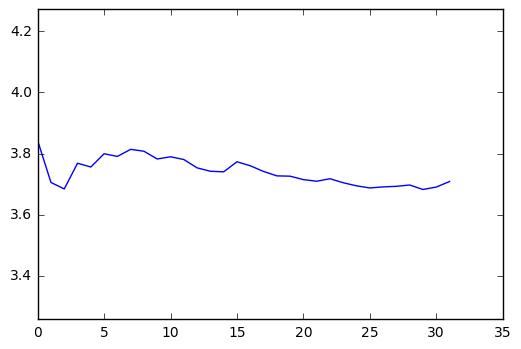

In [26]:
# Acc_list= [0.9972222222222222, 0.9900793650793651, 0.9936507936507937, 0.9857142857142858, 0.9880952380952381, 0.9936507936507937, 0.9944444444444445, 0.9940476190476191, 0.9912698412698413, 0.45873015891937985, 0.9936507936507937, 0.998015873015873, 0.9896825396825397, 0.9920634920634921, 0.9944444444444445, 0.9920634920634921, 0.9888888888888889, 0.45873015891937985, 0.9900793650793651, 0.9873015873015873, 0.9928571428571429, 0.45873015891937985, 0.9900793650793651, 0.9880952380952381, 0.5416666667612772, 0.45873015891937985, 0.9952380952380953, 0.9892857142857143, 0.986904761904762, 0.9908730158730159, 0.9900793650793651, 0.9861111111111112, 0.9940476190476191, 0.9936507936507937, 0.45873015891937985, 0.9932539682539683, 0.9944444444444445, 0.9892857142857143, 0.9884920634920635, 0.45873015891937985, 0.9904761904761905, 0.9880952380952381, 0.9944444444444445, 0.9936507936507937, 0.9932539682539683, 0.9912698412698413, 0.9904761904761905, 0.9876984126984127, 0.9952380952380953, 0.9956349206349207, 0.9896825396825397, 0.986904761904762, 0.9896825396825397, 0.9865079365079366, 0.542460317554928, 0.9908730158730159, 0.9865079365079366, 0.9944444444444445, 0.9944444444444445, 0.9924603174603175, 0.542460317554928, 0.9952380952380953, 0.9873015873015873, 0.5420634921581026, 0.9900793650793651, 0.45873015891937985, 0.9912698412698413, 0.9952380952380953, 0.45873015891937985, 0.9880952380952381, 0.9936507936507937, 0.9865079365079366, 0.9908730158730159, 0.9972222222222222, 0.9940476190476191, 0.9904761904761905, 0.9948412698412699, 0.9892857142857143, 0.9853174603174604, 0.9865079365079366, 0.9876984126984127, 0.9952380952380953, 0.9865079365079366, 0.9932539682539683, 0.9932539682539683, 0.45873015891937985, 0.9924603174603175, 0.9936507936507937, 0.45873015891937985, 0.9896825396825397, 0.9865079365079366, 0.9904761904761905, 0.9825396825396825, 0.9912698412698413, 0.9884920634920635, 0.9936507936507937, 0.9888888888888889, 0.9876984126984127, 0.9948412698412699, 0.9932539682539683]
# X_RMSE= [5.671896393407183, 10.351966938058176, 9.01830321581041, 15.21438416617041, 13.727878817896222, 10.078150413879616, 9.859419493554137, 9.512205736861041, 7.970296919386598, 10.481064221435947, 9.591189534632221, 7.736833678763479, 11.384720408997344, 8.453320239661021, 9.103855090191173, 8.804819480602864, 14.244102013082637, 688.1346726441692, 11.61594406366378, 14.485543633477809, 10.588280885573418, 15.172320931164947, 9.343716880702644, 14.173284808715662, 688.1346726441692, 688.1346726441692, 8.879958229276806, 11.695772830794718, 12.013411522332799, 10.985688630910534, 9.824501028934142, 14.452164338731912, 10.232522650336376, 11.019439203349389, 14.995230056056904, 9.006181745578749, 9.757206494512745, 10.734509378713717, 11.482076266882885, 688.1346726441692, 10.818453871467508, 13.629427647396463, 9.30449242391218, 7.898216722228717, 7.825628548435256, 9.910432085368184, 12.483030309594792, 12.19928260485815, 8.94645425537326, 9.18563698312253, 11.761484121276371, 14.773058625319106, 11.51031029245564, 13.835381624488369, 688.1346726441692, 11.263476489759649, 14.599822225507042, 10.288512363212662, 10.244610657230616, 9.886565238875914, 688.1346726441692, 8.959327071395405, 12.350457517094204, 688.1346726441692, 13.464651484973714, 11.406488592720564, 8.706506347218406, 9.405305428043368, 688.1346726441692, 14.855167040121156, 9.726814619362278, 14.197136315737133, 10.818694612509331, 7.696739856167258, 10.58432893311111, 8.076254016342578, 9.123313262820878, 13.843374802204025, 13.952526994258568, 13.136145182463395, 13.853805941848668, 8.015166695639923, 13.853701124800205, 9.153698576181105, 9.41589783405217, 11.234686290802975, 9.933279929342659, 7.67581640518246, 13.246067968553668, 10.659449082402585, 15.062830107877769, 10.521057557350327, 15.837547214861068, 10.629652703524417, 15.097885962166583, 9.850599840745412, 11.837588528311802, 14.134816896415163, 10.93783285291407, 10.894300136016302]
# Y_RMSE= [4.006224789243357, 7.410915405909392, 6.184027171642219, 8.425245137943016, 8.001540604193535, 6.158628734009979, 6.547025806316858, 6.082709647273789, 6.513156032245515, 404.1799746435722, 6.526968933354741, 4.9170614662482475, 7.53345695446439, 6.287452832844447, 6.470932465778824, 6.641639774056391, 8.308381569954804, 404.1799746435722, 7.417412764945614, 9.88897944632223, 6.3905815201143605, 404.1799746435722, 7.239941009402632, 9.401829992500812, 5.5175074732745175, 404.1799746435722, 6.32687524270912, 6.96921576973188, 9.42931039246103, 7.177503807734376, 7.356882041219693, 8.777140828474622, 6.795930766855685, 6.512111022699024, 404.1799746435722, 6.451323638845736, 5.925062244537152, 7.949280166559818, 8.87908466285659, 404.1799746435722, 7.434763188702949, 8.549322302970577, 6.075940576069164, 6.0519599349113244, 5.523323096644829, 6.903818097700199, 7.791567444282421, 8.530923821748376, 6.038881212336512, 5.942036425232555, 8.435920409438834, 9.963775090836059, 8.373171395480716, 9.316951212344005, 6.1629823314092365, 8.135454851970191, 8.615747257922914, 6.251292123823376, 6.339156983950839, 7.057471954706002, 8.901585195181498, 5.989995553413643, 8.041370826924618, 6.33016710901654, 8.10795314127974, 404.1799746435722, 7.174461670051015, 5.946135617052236, 404.1799746435722, 9.459283575421749, 6.063906436006634, 9.09470808449938, 7.440709925763997, 4.780438433764869, 6.624509792722215, 6.90090384522563, 6.293600339146262, 8.418869771603207, 8.943171835993134, 9.064820188588351, 9.157620581612251, 5.665986565702969, 9.18152499503313, 6.329042435875646, 6.377080041365736, 404.1799746435722, 6.24426043676939, 6.154619948169589, 404.1799746435722, 6.8268037442083145, 9.087801166581455, 6.485940771368288, 10.64884886443881, 6.887448441570056, 8.577322011412479, 5.968070758942949, 8.544524450560555, 9.647499008230703, 6.247949670955465, 6.791417066262042]

#100 iterations
XRMSE_df=pd.DataFrame(X_RMSE)
XRMSE_scores= XRMSE_df.values
XRMSE_mean_list = list()
for i in range(1,len(X_RMSE)+1):
    data = XRMSE_scores[0:i, 0]
    XRMSE_mean = np.mean(data)
    XRMSE_mean_list.append(XRMSE_mean)
# line plot of the values generated in the list
plt.plot(XRMSE_mean_list)
plt.ylim(min(X_RMSE), max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

YRMSE_df=pd.DataFrame(Y_RMSE)
YRMSE_scores= YRMSE_df.values
YRMSE_mean_list = list()
for i in range(1,len(Y_RMSE)+1):
    data = YRMSE_scores[0:i, 0]
    YRMSE_mean = np.mean(data)
    YRMSE_mean_list.append(YRMSE_mean)
# line plot of the values generated in the list
plt.plot(YRMSE_mean_list)
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

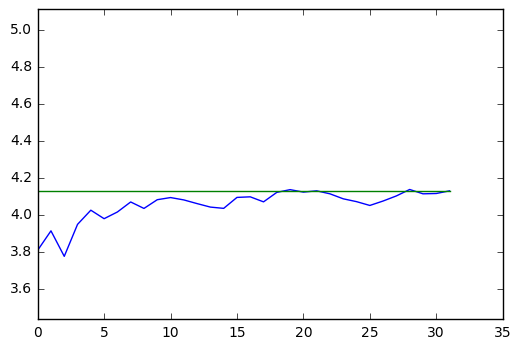

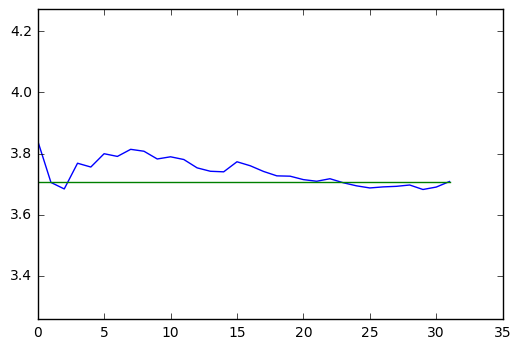

In [27]:
#mean of iterations shown with orange line on top of the above plots.
X_Mean= np.mean(XRMSE_scores)
plt.plot(XRMSE_mean_list)
plt.plot([X_Mean for x in range(len(XRMSE_mean_list))])
plt.ylim(min(X_RMSE), max(X_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

Y_Mean= np.mean(YRMSE_scores)
plt.plot(YRMSE_mean_list)
plt.plot([Y_Mean for x in range(len(YRMSE_mean_list))])
plt.ylim(min(Y_RMSE), max(Y_RMSE))
plt.show() #From this plot the point of diminishing returns can be located.

As seen in the plots above, mean value of XRMSE after 19 iterations gets contant upto some 22 iterations but then shows a slight decrease at 25. Finally, it gets stable round 30 iterations.
The mean value of YRMSE stabilizes around 20 iterations. So, considering both the plots and in literature, 30 sample size is considered as the minimum value to determine the skill of the model. Thus, the LSTM model will be trained for a sample size of 30 iterations.

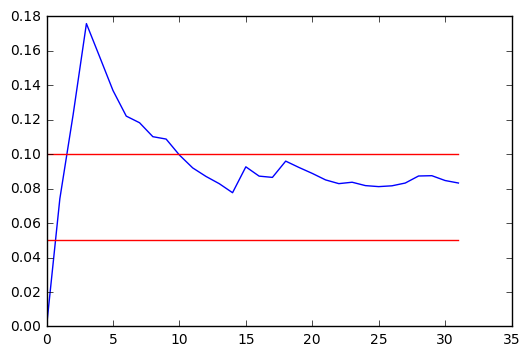

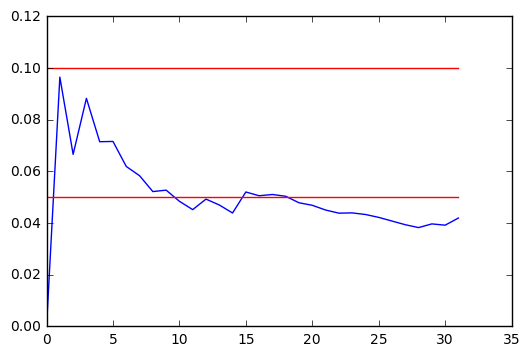

In [28]:
#line plot of standard error vs the number of repeats 
#locate the point of acceptable error
# Acc_list= [0.9972222222222222, 0.9900793650793651, 0.9936507936507937, 0.9857142857142858, 0.9880952380952381, 0.9936507936507937, 0.9944444444444445, 0.9940476190476191, 0.9912698412698413, 0.45873015891937985, 0.9936507936507937, 0.998015873015873, 0.9896825396825397, 0.9920634920634921, 0.9944444444444445, 0.9920634920634921, 0.9888888888888889, 0.45873015891937985, 0.9900793650793651, 0.9873015873015873, 0.9928571428571429, 0.45873015891937985, 0.9900793650793651, 0.9880952380952381, 0.5416666667612772, 0.45873015891937985, 0.9952380952380953, 0.9892857142857143, 0.986904761904762, 0.9908730158730159, 0.9900793650793651, 0.9861111111111112, 0.9940476190476191, 0.9936507936507937, 0.45873015891937985, 0.9932539682539683, 0.9944444444444445, 0.9892857142857143, 0.9884920634920635, 0.45873015891937985, 0.9904761904761905, 0.9880952380952381, 0.9944444444444445, 0.9936507936507937, 0.9932539682539683, 0.9912698412698413, 0.9904761904761905, 0.9876984126984127, 0.9952380952380953, 0.9956349206349207, 0.9896825396825397, 0.986904761904762, 0.9896825396825397, 0.9865079365079366, 0.542460317554928, 0.9908730158730159, 0.9865079365079366, 0.9944444444444445, 0.9944444444444445, 0.9924603174603175, 0.542460317554928, 0.9952380952380953, 0.9873015873015873, 0.5420634921581026, 0.9900793650793651, 0.45873015891937985, 0.9912698412698413, 0.9952380952380953, 0.45873015891937985, 0.9880952380952381, 0.9936507936507937, 0.9865079365079366, 0.9908730158730159, 0.9972222222222222, 0.9940476190476191, 0.9904761904761905, 0.9948412698412699, 0.9892857142857143, 0.9853174603174604, 0.9865079365079366, 0.9876984126984127, 0.9952380952380953, 0.9865079365079366, 0.9932539682539683, 0.9932539682539683, 0.45873015891937985, 0.9924603174603175, 0.9936507936507937, 0.45873015891937985, 0.9896825396825397, 0.9865079365079366, 0.9904761904761905, 0.9825396825396825, 0.9912698412698413, 0.9884920634920635, 0.9936507936507937, 0.9888888888888889, 0.9876984126984127, 0.9948412698412699, 0.9932539682539683]
# X_RMSE= [5.671896393407183, 10.351966938058176, 9.01830321581041, 15.21438416617041, 13.727878817896222, 10.078150413879616, 9.859419493554137, 9.512205736861041, 7.970296919386598, 10.481064221435947, 9.591189534632221, 7.736833678763479, 11.384720408997344, 8.453320239661021, 9.103855090191173, 8.804819480602864, 14.244102013082637, 688.1346726441692, 11.61594406366378, 14.485543633477809, 10.588280885573418, 15.172320931164947, 9.343716880702644, 14.173284808715662, 688.1346726441692, 688.1346726441692, 8.879958229276806, 11.695772830794718, 12.013411522332799, 10.985688630910534, 9.824501028934142, 14.452164338731912, 10.232522650336376, 11.019439203349389, 14.995230056056904, 9.006181745578749, 9.757206494512745, 10.734509378713717, 11.482076266882885, 688.1346726441692, 10.818453871467508, 13.629427647396463, 9.30449242391218, 7.898216722228717, 7.825628548435256, 9.910432085368184, 12.483030309594792, 12.19928260485815, 8.94645425537326, 9.18563698312253, 11.761484121276371, 14.773058625319106, 11.51031029245564, 13.835381624488369, 688.1346726441692, 11.263476489759649, 14.599822225507042, 10.288512363212662, 10.244610657230616, 9.886565238875914, 688.1346726441692, 8.959327071395405, 12.350457517094204, 688.1346726441692, 13.464651484973714, 11.406488592720564, 8.706506347218406, 9.405305428043368, 688.1346726441692, 14.855167040121156, 9.726814619362278, 14.197136315737133, 10.818694612509331, 7.696739856167258, 10.58432893311111, 8.076254016342578, 9.123313262820878, 13.843374802204025, 13.952526994258568, 13.136145182463395, 13.853805941848668, 8.015166695639923, 13.853701124800205, 9.153698576181105, 9.41589783405217, 11.234686290802975, 9.933279929342659, 7.67581640518246, 13.246067968553668, 10.659449082402585, 15.062830107877769, 10.521057557350327, 15.837547214861068, 10.629652703524417, 15.097885962166583, 9.850599840745412, 11.837588528311802, 14.134816896415163, 10.93783285291407, 10.894300136016302]
# Y_RMSE= [4.006224789243357, 7.410915405909392, 6.184027171642219, 8.425245137943016, 8.001540604193535, 6.158628734009979, 6.547025806316858, 6.082709647273789, 6.513156032245515, 404.1799746435722, 6.526968933354741, 4.9170614662482475, 7.53345695446439, 6.287452832844447, 6.470932465778824, 6.641639774056391, 8.308381569954804, 404.1799746435722, 7.417412764945614, 9.88897944632223, 6.3905815201143605, 404.1799746435722, 7.239941009402632, 9.401829992500812, 5.5175074732745175, 404.1799746435722, 6.32687524270912, 6.96921576973188, 9.42931039246103, 7.177503807734376, 7.356882041219693, 8.777140828474622, 6.795930766855685, 6.512111022699024, 404.1799746435722, 6.451323638845736, 5.925062244537152, 7.949280166559818, 8.87908466285659, 404.1799746435722, 7.434763188702949, 8.549322302970577, 6.075940576069164, 6.0519599349113244, 5.523323096644829, 6.903818097700199, 7.791567444282421, 8.530923821748376, 6.038881212336512, 5.942036425232555, 8.435920409438834, 9.963775090836059, 8.373171395480716, 9.316951212344005, 6.1629823314092365, 8.135454851970191, 8.615747257922914, 6.251292123823376, 6.339156983950839, 7.057471954706002, 8.901585195181498, 5.989995553413643, 8.041370826924618, 6.33016710901654, 8.10795314127974, 404.1799746435722, 7.174461670051015, 5.946135617052236, 404.1799746435722, 9.459283575421749, 6.063906436006634, 9.09470808449938, 7.440709925763997, 4.780438433764869, 6.624509792722215, 6.90090384522563, 6.293600339146262, 8.418869771603207, 8.943171835993134, 9.064820188588351, 9.157620581612251, 5.665986565702969, 9.18152499503313, 6.329042435875646, 6.377080041365736, 404.1799746435722, 6.24426043676939, 6.154619948169589, 404.1799746435722, 6.8268037442083145, 9.087801166581455, 6.485940771368288, 10.64884886443881, 6.887448441570056, 8.577322011412479, 5.968070758942949, 8.544524450560555, 9.647499008230703, 6.247949670955465, 6.791417066262042]

#100 iterations
XRMSE_df=pd.DataFrame(X_RMSE)
XRMSE_scores= XRMSE_df.values
XRMSE_stderr_list = list()
for i in range(1,len(X_RMSE)+1):
    data = XRMSE_scores[0:i, 0]
    stderr = np.std(data) / math.sqrt(len(data))
    XRMSE_stderr_list.append(stderr)
# line plot of the values generated in the list
plt.plot(XRMSE_stderr_list)
plt.plot([0.05 for x in range(len(XRMSE_stderr_list))], color='red')
plt.plot([0.1 for x in range(len(XRMSE_stderr_list))], color='red')
plt.show() #From this plot the point of diminishing returns can be located.

YRMSE_df=pd.DataFrame(Y_RMSE)
YRMSE_scores= YRMSE_df.values
YRMSE_stderr_list = list()
for i in range(1,len(Y_RMSE)+1):
    data = YRMSE_scores[0:i, 0]
    stderr = np.std(data) / math.sqrt(len(data))
    YRMSE_stderr_list.append(stderr)
# line plot of the values generated in the list
plt.plot(YRMSE_stderr_list)
plt.plot([0.05 for x in range(len(YRMSE_stderr_list))], color='red')
plt.plot([0.1 for x in range(len(YRMSE_stderr_list))], color='red')
plt.show() #From this plot the point of diminishing returns can be located.

80 iterations will be selected to train all the models iin order to determine the skill of the model.

# Dataset-3: Click Dataset

# Data Pre-processing and Analysis

In [37]:
j=1
for i in df_list:
    exec("{} = i.copy()".format('click_dataframe_'+ str(j)))
    j+=1

click_df_list=[click_dataframe_1,click_dataframe_2,click_dataframe_3,click_dataframe_4,click_dataframe_5,click_dataframe_6,click_dataframe_7,click_dataframe_8,click_dataframe_9,click_dataframe_10,click_dataframe_11,click_dataframe_12,click_dataframe_13,click_dataframe_14,click_dataframe_15]

# for i in click_df_list:
#     i['Click']= 0.1
#     i['Click'][i['Action']=='Mouse_clicked_with_Button.left_at']=0.9
#     i['Click'][i['Action']=='Mouse_clicked_with_Button.right_at']=0.9
#     i['Click'][i['Action']=='Mouse_clicked_with_Button.middle_at']=0.9
#     print(i.head())

print(click_dataframe_1[:5])

         Date  Time_with_ms                             Action  X_Coord  \
0  2019-04-25  22:57:31,731  Mouse_clicked_with_Button.left_at      523   
1  2019-04-25  22:57:32,194                     Mouse_moved_to      521   
2  2019-04-25  22:57:32,204                     Mouse_moved_to      517   
3  2019-04-25  22:57:32,214                     Mouse_moved_to      508   
4  2019-04-25  22:57:32,223                     Mouse_moved_to      488   

   Y_Coord  
0      663  
1      661  
2      657  
3      647  
4      630  


In [38]:
#Extracting only 4 columns
j=1
for dataframe in click_df_list:
    exec("{} = dataframe[['Action', 'X_Coord', 'Y_Coord']]".format('click_subset_df_'+ str(j)))
    j+=1
print(click_subset_df_1.head())

                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      523      663
1                     Mouse_moved_to      521      661
2                     Mouse_moved_to      517      657
3                     Mouse_moved_to      508      647
4                     Mouse_moved_to      488      630


In [39]:
#Selecting only rows corresponding to the scrolled coordinates
click_subset_list= [click_subset_df_1,click_subset_df_2,click_subset_df_3,click_subset_df_4,click_subset_df_5,click_subset_df_6,click_subset_df_7,click_subset_df_8,click_subset_df_9,click_subset_df_10,click_subset_df_11,click_subset_df_12,click_subset_df_13,click_subset_df_14,click_subset_df_15]
j=1
for subset_df in click_subset_list:
    exec("{} = subset_df.loc[subset_df['Action'] == 'Mouse_scrolled_at']".format('click_scrolled_df_'+ str(j)))
    j+=1

click_scrolled_list= [click_scrolled_df_1,click_scrolled_df_2,click_scrolled_df_3,click_scrolled_df_4,click_scrolled_df_5,click_scrolled_df_6,click_scrolled_df_7,click_scrolled_df_8,click_scrolled_df_9,click_scrolled_df_10,click_scrolled_df_11,click_scrolled_df_12,click_scrolled_df_13,click_scrolled_df_14,click_scrolled_df_15]

for scrolled_df in click_scrolled_list:
    print(len(scrolled_df))
    print(scrolled_df.head())

0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
1687
                Action  X_Coord  Y_Coord
426  Mouse_scrolled_at      805      459
427  Mouse_scrolled_at      805      459
428  Mouse_scrolled_at      805      459
429  Mouse_scrolled_at      805      459
430  Mouse_scrolled_at      805      459
895
                Action  X_Coord  Y_Coord
133  Mouse_scrolled_at      985      466
134  Mouse_scrolled_at      985      466
135  Mouse_scrolled_at      985      466
136  Mouse_scrolled_at      985      466
137  Mouse_scrolled_at      985      466
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
30
                Action  X_Coord  Y_Coord
617  Mouse_scrolled_at       57      475
618  Mouse_scrolled_at       57      475
619  Mouse_scrolled_at       57      475
620  Mouse_scrolled_at       57      475
621  Mouse_scrolled_at       57      475
2928
                Action  X_Coord  Y_Coord
253  Mouse_s

In [40]:
#deleting scroll movements from the subset dataframes

j=1
for i in range(0,15):
    exec("{} = click_subset_list[i].drop(click_scrolled_list[i].index, axis=0)".format('click_processed_df_'+ str(j)))
    j+=1

click_processed_list= [click_processed_df_1,click_processed_df_2,click_processed_df_3,click_processed_df_4,click_processed_df_5,click_processed_df_6,click_processed_df_7,click_processed_df_8,click_processed_df_9,click_processed_df_10,click_processed_df_11,click_processed_df_12,click_processed_df_13,click_processed_df_14,click_processed_df_15]

for processed_df in click_processed_list:
    print(len(processed_df))
    print(processed_df.head())

7785
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      523      663
1                     Mouse_moved_to      521      661
2                     Mouse_moved_to      517      657
3                     Mouse_moved_to      508      647
4                     Mouse_moved_to      488      630
7294
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      454      386
1  Mouse_moved_to      441      400
2  Mouse_moved_to      428      417
3  Mouse_moved_to      413      429
4  Mouse_moved_to      395      442
67982
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      433      651
1  Mouse_moved_to      432      651
2  Mouse_moved_to      427      654
3  Mouse_moved_to      426      656
4  Mouse_moved_to      425      656
23839
           Action  X_Coord  Y_Coord
0  Mouse_moved_to      477      392
1  Mouse_moved_to      476      393
2  Mouse_moved_to      473      396
3  Mouse_moved_to      470      400
4  Mouse_moved_to      463      408


In [41]:
#deleting the adjacent duplicates
for i in range(0,15):
    xy_action_list=[]
    X_list = click_processed_list[i]['X_Coord'].tolist()
    Y_list = click_processed_list[i]['Y_Coord'].tolist()
    action_list= click_processed_list[i]['Action'].tolist()
    
    if(i!=0):
        if(max(X_list)>x_max):
            x_max=max(X_list)
        if(max(Y_list)>y_max):
            y_max= max(Y_list)
    else:
        x_max= max(X_list)
        y_max= max(Y_list)

    for index in range(0, len(X_list)):
        xy_action_list.append([action_list[index],X_list[index],Y_list[index]])

    duplicates=0
    for k in range(0,len(xy_action_list)-1):
        if(xy_action_list[k]==xy_action_list[k+1]):
            duplicates+=1
        else:
            continue
    print(i+1)
    print('Before Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_action_list))
    print('Number of adjacent duplicates: ', duplicates,'\n')
    
    #Deleting the adjacent duplicates
    xy_action_list= [k for k, g in itertools.groupby(xy_action_list)]
    exec("{} = xy_action_list".format('click_data_list_'+ str(i+1)))
    
    duplicates=0
    for j in range(0,len(xy_action_list)-1):
        if(xy_action_list[j]==xy_action_list[j+1]):
            duplicates+=1
        else:
            continue
    print('After Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_action_list))
    print('Number of adjacent duplicates: ', duplicates)
    
print('x_max: ', x_max)
print('y_max: ', y_max)

1
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  7785
Number of adjacent duplicates:  589 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  7196
Number of adjacent duplicates:  0
2
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  7294
Number of adjacent duplicates:  104 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  7190
Number of adjacent duplicates:  0
3
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  67982
Number of adjacent duplicates:  1867 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  66115
Number of adjacent duplicates:  0
4
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  23839
Number of adjacent duplicates:  665 

After Deletion of adjacent dup

In [47]:
print(click_data_list_1[:5])


[['Mouse_clicked_with_Button.left_at', 523, 663], ['Mouse_moved_to', 521, 661], ['Mouse_moved_to', 517, 657], ['Mouse_moved_to', 508, 647], ['Mouse_moved_to', 488, 630]]


In [46]:

click_final_list=[click_data_list_1,click_data_list_2,click_data_list_3,click_data_list_4,click_data_list_5,click_data_list_6,click_data_list_7,click_data_list_8,click_data_list_9,click_data_list_10,click_data_list_11,click_data_list_12,click_data_list_13,click_data_list_14,click_data_list_15]

for i in range(0,15):
    xy_list=[]
    action_list=[]
    for j in range(len(click_final_list[i])):
        xy_list.append([click_final_list[i][j][1],click_final_list[i][j][2]])
        action_list.append(click_final_list[i][j][0])
    exec("{} = xy_list".format('xy_list_'+ str(i+1)))
    exec("{} = action_list".format('action_list_'+ str(i+1)))
    
print(xy_list_1[:5])
print(action_list_1[:5])

[[523, 663], [521, 661], [517, 657], [508, 647], [488, 630]]
['Mouse_clicked_with_Button.left_at', 'Mouse_moved_to', 'Mouse_moved_to', 'Mouse_moved_to', 'Mouse_moved_to']


In [48]:
#Normalize or rescale the dataset to be in the range (0,1)

scaler = MinMaxScaler(feature_range=(0, 1))

xy_final_list=[xy_list_1,xy_list_2,xy_list_3,xy_list_4,xy_list_5,xy_list_6,xy_list_7,xy_list_8,xy_list_9,xy_list_10,xy_list_11,xy_list_12,xy_list_13,xy_list_14,xy_list_15]

for i in range(0,15):
    exec("{} = scaler.fit_transform(xy_final_list[i])".format('norm_data_'+ str(i+1)))

norm_list= [norm_data_1,norm_data_2,norm_data_3,norm_data_4,norm_data_5,norm_data_6,norm_data_7,norm_data_8,norm_data_9,norm_data_10,norm_data_11,norm_data_12,norm_data_13,norm_data_14,norm_data_15]
for i in range(0,15):
    print(i+1)
    print(type(norm_list[i]))
    print(norm_list[i][0:5])

1
<class 'numpy.ndarray'>
[[0.38742236 0.85807292]
 [0.38586957 0.85546875]
 [0.38276398 0.85026042]
 [0.3757764  0.83723958]
 [0.36024845 0.81510417]]
2
<class 'numpy.ndarray'>
[[0.33826638 0.51392405]
 [0.329105   0.53164557]
 [0.31994362 0.55316456]
 [0.3093728  0.56835443]
 [0.29668781 0.58481013]]
3
<class 'numpy.ndarray'>
[[0.37189646 0.57761492]
 [0.3713682  0.57761492]
 [0.36872689 0.57961359]
 [0.36819863 0.58094604]
 [0.36767036 0.58094604]]
4
<class 'numpy.ndarray'>
[[0.39430086 0.47186933]
 [0.39363817 0.47277677]
 [0.3916501  0.47549909]
 [0.38966203 0.47912886]
 [0.38502319 0.48638838]]
5
<class 'numpy.ndarray'>
[[0.45139557 0.42023346]
 [0.45283927 0.41789883]
 [0.4547642  0.41634241]
 [0.45861405 0.41400778]
 [0.46198268 0.41322957]]
6
<class 'numpy.ndarray'>
[[0.40409401 0.8238342 ]
 [0.40181956 0.82512953]
 [0.39727066 0.82901554]
 [0.39044731 0.83678756]
 [0.38438211 0.84326425]]
7
<class 'numpy.ndarray'>
[[0.39296407 0.48418491]
 [0.40643713 0.48418491]
 [0.41017964

In [54]:
action_final_list=[action_list_1, action_list_2, action_list_3, action_list_4, action_list_5,action_list_6,action_list_7,action_list_8,action_list_9,action_list_10,action_list_11,action_list_12,action_list_13,action_list_14,action_list_15]
for i in range(0,len(action_final_list)):
    df=pd.DataFrame(action_final_list[i])
    df['Click']= 0
    df['Click'][df[0]=='Mouse_clicked_with_Button.left_at']=1
    df['Click'][df[0]=='Mouse_clicked_with_Button.right_at']=1
    df['Click'][df[0]=='Mouse_clicked_with_Button.middle_at']=1
    exec("{} = df['Click'].tolist()".format('click_list_'+ str(i+1)))
    
print(click_list_1[:5])

[1, 0, 0, 0, 0]


In [57]:
click_list=[click_list_1,click_list_2,click_list_3,click_list_4,click_list_5,click_list_6,click_list_7,click_list_8,click_list_9,click_list_10,click_list_11,click_list_12,click_list_13,click_list_14,click_list_15]
for i in range(0, len(norm_list)):
    xy_list=norm_list[i].tolist()
    for j in range(0, len(xy_list)):
        xy_list[j].append(click_list[i][j])
    exec("{} = xy_list".format('xy_click_list_'+ str(i+1)))
print(xy_click_list_1[:5])

[[0.3874223602484472, 0.8580729166666666, 1], [0.3858695652173913, 0.8554687499999999, 0], [0.3827639751552795, 0.8502604166666666, 0], [0.37577639751552794, 0.8372395833333333, 0], [0.36024844720496896, 0.8151041666666666, 0]]


In [58]:
#Considering 18 coordinates for the input sequence
import math

click_input_data=[]
click_output_data=[]
timesteps= 18

xy_click_list=[xy_click_list_1,xy_click_list_2,xy_click_list_3,xy_click_list_4,xy_click_list_5,xy_click_list_6,xy_click_list_7,xy_click_list_8,xy_click_list_9,xy_click_list_10,xy_click_list_11,xy_click_list_12,xy_click_list_13,xy_click_list_14,xy_click_list_15]
for xy_click in xy_click_list:
    j=1
    n= len(xy_click)-timesteps
    iterations= int(math.ceil((len(xy_click)/timesteps) / 100.0)) * 100
    
    while(j<=iterations):
            i = np.random.randint(0,n) #random values between 0 (low value(inclusive)) and n (high value(inclusive))
            try:
                click_input_data.append(xy_click[i:i+timesteps])
                click_output_data.append(xy_click[i+timesteps])
                j+=1
            except:
                pass
print(len(click_input_data))
print(len(click_output_data))
print('Input: ',click_input_data[0:5],'\n')
print('Output: ',click_output_data[0:5])

12800
12800
Input:  [[[0.5349378881987576, 0.3424479166666667, 0], [0.5318322981366459, 0.3411458333333333, 0], [0.5279503105590061, 0.3385416666666667, 0], [0.5256211180124223, 0.3385416666666667, 0], [0.5225155279503105, 0.3385416666666667, 0], [0.5170807453416149, 0.3372395833333333, 0], [0.5093167701863354, 0.3372395833333333, 0], [0.49844720496894407, 0.3359375, 0], [0.4891304347826087, 0.3359375, 0], [0.4805900621118012, 0.3359375, 0], [0.4720496894409938, 0.3359375, 0], [0.46273291925465837, 0.3359375, 0], [0.45419254658385094, 0.3359375, 0], [0.4464285714285714, 0.3359375, 0], [0.4440993788819876, 0.3359375, 0], [0.44254658385093165, 0.3359375, 0], [0.44021739130434784, 0.3359375, 0], [0.4386645962732919, 0.3359375, 0]], [[0.4409937888198758, 0.8749999999999999, 0], [0.44021739130434784, 0.8710937499999999, 0], [0.43944099378881984, 0.8619791666666666, 0], [0.43788819875776397, 0.8489583333333333, 0], [0.43633540372670804, 0.8372395833333333, 0], [0.4355590062111801, 0.81901041

In [59]:
click_Input= np.array(click_input_data)
click_Output= np.array(click_output_data)

print('Input: ', click_Input,'\n')
print('-------------------------------------------------------------------------------------------------------------------\n')
print('Output: ', click_Output)

Input:  [[[0.53493789 0.34244792 0.        ]
  [0.5318323  0.34114583 0.        ]
  [0.52795031 0.33854167 0.        ]
  ...
  [0.44254658 0.3359375  0.        ]
  [0.44021739 0.3359375  0.        ]
  [0.4386646  0.3359375  0.        ]]

 [[0.44099379 0.875      0.        ]
  [0.44021739 0.87109375 0.        ]
  [0.43944099 0.86197917 0.        ]
  ...
  [0.43167702 0.69921875 0.        ]
  [0.43167702 0.6953125  0.        ]
  [0.43090062 0.6875     0.        ]]

 [[0.06444099 0.109375   0.        ]
  [0.06521739 0.10546875 0.        ]
  [0.06521739 0.1015625  0.        ]
  ...
  [0.06909938 0.07161458 0.        ]
  [0.06987578 0.0703125  0.        ]
  [0.07065217 0.06770833 0.        ]]

 ...

 [[0.49530686 0.54894672 0.        ]
  [0.4967509  0.54770756 0.        ]
  [0.4967509  0.5464684  0.        ]
  ...
  [0.49819495 0.55390335 0.        ]
  [0.49747292 0.55390335 0.        ]
  [0.49747292 0.55266419 0.        ]]

 [[0.51624549 0.69640644 0.        ]
  [0.51407942 0.69268897 0.  

In [61]:
print(click_Input.shape[0])
print(click_Input.shape[1])

12800
18


In [62]:
click_Input_reshaped = np.reshape(click_Input,(click_Input.shape[0],click_Input.shape[1],3))
print(click_Input_reshaped)

[[[0.53493789 0.34244792 0.        ]
  [0.5318323  0.34114583 0.        ]
  [0.52795031 0.33854167 0.        ]
  ...
  [0.44254658 0.3359375  0.        ]
  [0.44021739 0.3359375  0.        ]
  [0.4386646  0.3359375  0.        ]]

 [[0.44099379 0.875      0.        ]
  [0.44021739 0.87109375 0.        ]
  [0.43944099 0.86197917 0.        ]
  ...
  [0.43167702 0.69921875 0.        ]
  [0.43167702 0.6953125  0.        ]
  [0.43090062 0.6875     0.        ]]

 [[0.06444099 0.109375   0.        ]
  [0.06521739 0.10546875 0.        ]
  [0.06521739 0.1015625  0.        ]
  ...
  [0.06909938 0.07161458 0.        ]
  [0.06987578 0.0703125  0.        ]
  [0.07065217 0.06770833 0.        ]]

 ...

 [[0.49530686 0.54894672 0.        ]
  [0.4967509  0.54770756 0.        ]
  [0.4967509  0.5464684  0.        ]
  ...
  [0.49819495 0.55390335 0.        ]
  [0.49747292 0.55390335 0.        ]
  [0.49747292 0.55266419 0.        ]]

 [[0.51624549 0.69640644 0.        ]
  [0.51407942 0.69268897 0.        ]


In [63]:
#splitting dataset
Xclick_trainval,Xclick_test,Yclick_trainval,Yclick_test= train_test_split(click_Input_reshaped,click_Output,test_size=0.2,random_state=0)
Xclick_train,Xclick_val,Yclick_train,Yclick_val= train_test_split(Xclick_trainval,Yclick_trainval,test_size=0.25,random_state=0)

print('Length of Train: ', len(Xclick_train), len(Yclick_train))
print('Length of Validation: ', len(Xclick_val), len(Yclick_val))
print('Length of Test: ', len(Xclick_test), len(Yclick_test))

Length of Train:  7680 7680
Length of Validation:  2560 2560
Length of Test:  2560 2560


# Model Definition and Training

In [68]:
model_8= stateless_simpleRNN(units=30,lr=0.001, alpha=0.05)

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_3 (SimpleRNN)     (None, 30)                990       
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 2)                 0         
Total params: 1,052
Trainable params: 1,052
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history= stateless_fit(model_8, Xclick_train, Yclick_train, Xclick_val, Yclick_val, batch=105, weights_saved_file= 'weights_8.hdf5', shuffle=True)

In [ ]:
stateless_learn_curve(history)

In [18]:
#stateless network
#defnition and compilation
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stateless_LSTM(units,lr):
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, input_shape=(timesteps,3)))
    #model.add(Dropout(0.1))
    model.add(Dense(3))
    model.add(LeakyReLU(alpha=0.05))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    model.summary()
    return model

In [71]:
#calling definition and compilation of the stateless model
model_7= click_stateless_LSTM(units=30, lr=0.001)

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 30)                4080      
_________________________________________________________________
dense_5 (Dense)              (None, 3)                 93        
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 3)                 0         
Total params: 4,173
Trainable params: 4,173
Non-trainable params: 0
_________________________________________________________________


In [72]:
#training and validation of the stateless model
def click_stateless_fit(model, X_train, Y_train, X_val, Y_val, batch, weights_saved_file, shuffle):
#     es= EarlyStopping(monitor='val_loss',
#                       min_delta=0,
#                       patience=2,
#                       verbose=1,
#                       mode='min',
#                       restore_best_weights= True)

    checkpt= ModelCheckpoint(weights_saved_file,
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             mode='auto',
                             save_weights_only=True)
    callbacks_list = [checkpt]

    start = time.time()
    #300 epochs are selected as after 300 the overall RMSE remains constant and stops decreasing. The oevrall RMSE curve continuously decreases till 300 epochs.
    history= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), batch_size=batch, epochs=30, verbose=2, callbacks=callbacks_list, shuffle=shuffle)
    end = time.time()

    print("Time Took :{:3.2f} min".format( (end-start)/60 ))

    return history

In [73]:
#fitting the stateless LSTM network
history7= click_stateless_fit(model_7, Xclick_train, Yclick_train, Xclick_val, Yclick_val, batch=105, weights_saved_file= 'weights_7.hdf5', shuffle=True)

Train on 7680 samples, validate on 2560 samples
Epoch 1/30
 - 5s - loss: 0.0494 - rmse: 0.1978 - val_loss: 0.0065 - val_rmse: 0.0785

Epoch 00001: val_loss improved from inf to 0.00654, saving model to weights_7.hdf5
Epoch 2/30
 - 2s - loss: 0.0054 - rmse: 0.0693 - val_loss: 0.0047 - val_rmse: 0.0641

Epoch 00002: val_loss improved from 0.00654 to 0.00474, saving model to weights_7.hdf5
Epoch 3/30
 - 2s - loss: 0.0049 - rmse: 0.0663 - val_loss: 0.0045 - val_rmse: 0.0623

Epoch 00003: val_loss improved from 0.00474 to 0.00453, saving model to weights_7.hdf5
Epoch 4/30
 - 2s - loss: 0.0048 - rmse: 0.0648 - val_loss: 0.0044 - val_rmse: 0.0609

Epoch 00004: val_loss improved from 0.00453 to 0.00441, saving model to weights_7.hdf5
Epoch 5/30
 - 2s - loss: 0.0047 - rmse: 0.0629 - val_loss: 0.0043 - val_rmse: 0.0606

Epoch 00005: val_loss improved from 0.00441 to 0.00433, saving model to weights_7.hdf5
Epoch 6/30
 - 2s - loss: 0.0046 - rmse: 0.0639 - val_loss: 0.0042 - val_rmse: 0.0592

Epoch

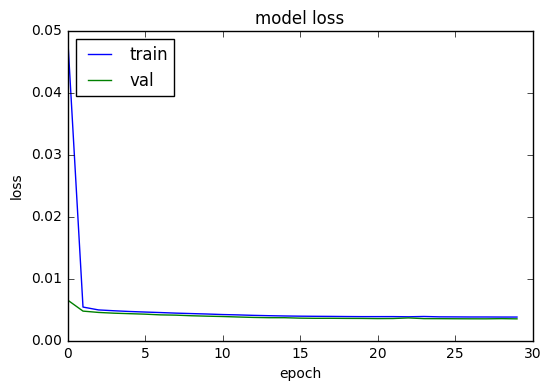

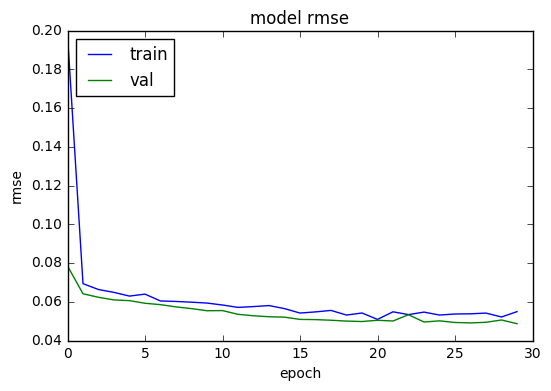

In [74]:
#plotting the loss and rmse curves w.r.t the number of epochs
stateless_learn_curve(history7)

In [75]:
scores = model_7.evaluate(Xclick_test, Yclick_test, verbose=0)
print("Overall RMSE for normalized values", (scores[1]))

Overall RMSE for normalized values 0.03684658306883648


In [76]:
Y_Pred_test = model_7.predict(Xclick_test)
print('True values: ', Yclick_test[:5],'\n')
print('Predicted values: ', Y_Pred_test[:5],'\n')

Yclick_test = scaler.inverse_transform(Yclick_test)
print('Inverted True: ', Yclick_test[:5],'\n')
Y_Pred_test = scaler.inverse_transform(Y_Pred_test)
print('Inverted Predicted: ', Y_Pred_test[:5])


True values:  [[0.06629449 0.64957265 0.        ]
 [0.60652009 0.68005181 0.        ]
 [0.08104299 0.7721519  0.        ]
 [0.19461078 0.54136253 0.        ]
 [0.44201458 0.35571688 0.        ]] 

Predicted values:  [[ 7.6044157e-02  6.4026713e-01 -1.2003817e-04]
 [ 6.0322636e-01  6.6363090e-01 -1.7667409e-03]
 [ 8.5713990e-02  7.6898050e-01 -7.0853908e-05]
 [ 1.9936743e-01  5.4077780e-01 -3.8578361e-05]
 [ 4.4249403e-01  3.4058723e-01 -6.4406585e-04]] 



ValueError: operands could not be broadcast together with shapes (2560,3) (2,) (2560,3) 

In [ ]:
#calculate RMSE
Xcoord_pred=[]
Xcoord_true=[]
Ycoord_pred=[]
Ycoord_true=[]
click_pred=[]
click_true=[]
for i in range(0,len(Y_Pred_test)):
    Xcoord_pred.append(Y_Pred_test[i][0])
    Ycoord_pred.append(Y_Pred_test[i][1])
    click_pred.append(Y_Pred_test[i][2])
    
for i in range(0,len(Yclick_test)):   
    Xcoord_true.append(Yclick_test[i][0])
    Ycoord_true.append(Yclick_test[i][1])
    click_true.append(Yclick_test[i][2])

X_RMSE= math.sqrt(mean_squared_error(Xcoord_true, Xcoord_pred))
Y_RMSE= math.sqrt(mean_squared_error(Ycoord_true, Ycoord_pred))
click_RMSE= math.sqrt(mean_squared_error(click_true, click_pred))

print('Test Score (X-coord) XRMSE', str(X_RMSE))
print('Test Score (Y-coord) YRMSE', str(Y_RMSE))
print('Test Score click RMSE', str(click_RMSE))

In [ ]:
for i in range(len(Yclick_test)):
    print('True: ', Yclick_test[i])
    print('Predictions: ', Y_Pred_test[i], '\n')

# Click Dataset-2

In [4]:
#Reading all text data files into csv files
for i in range(1,6):
    log_file= 'click_logs_' + str(i) + '.txt'
    csv_file= 'click_logs_' +str(i) + '.csv'
    
    with open(log_file, 'r') as in_file:
        stripped= (line.strip() for line in in_file)
        split1= (line.split("(") for line in stripped)
        split1_gen1, split1_gen2 = tee(split1)

        split2= [line[1].split(",") for line in split1_gen1] #split2[0] has the x-coordinate
        split2_gen1, split2_gen2 = tee(split2)

        split3= (line[1].split(")") for line in split2_gen1)
        split4= [line[0].split(" ") for line in split3] #split4[1] has the y-coordinate
        split5= [line[0].split(" ") for line in split1_gen2] #split5[0] has date, [1] has timestamp with ms, [2] has Action

        with open(csv_file, 'w') as out_file:
            out_file.write('Date,Time_with_ms,Action,X_Coord,Y_Coord\n')
            for i in range(0, len(split2)):
                out_file.write(split5[i][0]+','+'"'+split5[i][1]+'"'+','+split5[i][2]+','+split2[i][0]+','+split4[i][1]+'\n')
            out_file.close()

    in_file.close()

In [4]:
#Reading each csv file into corresponding dataframes
for i in range(1,6):
    exec("{} = pd.read_csv('../input/click-dataset/click_logs_' + str(i) + '.csv')".format('click_df_'+ str(i)))

In [5]:
#list of all dataframes containing the click csv files data
click_df_list=[click_df_1, click_df_2, click_df_3, click_df_4, click_df_5]
for i in click_df_list:
    print(i.head())
    print(len(i))

         Date  Time_with_ms   ...    X_Coord  Y_Coord
0  2019-05-16  04:39:58,716   ...        510      632
1  2019-05-16  04:39:58,819   ...        510      632
2  2019-05-16  04:39:59,103   ...        510      631
3  2019-05-16  04:39:59,113   ...        507      627
4  2019-05-16  04:39:59,123   ...        503      620

[5 rows x 5 columns]
6838
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-05-17  01:25:56,894  Mouse_moved_to     1032      548
1  2019-05-17  01:25:56,898  Mouse_moved_to      950      571
2  2019-05-17  01:25:56,909  Mouse_moved_to      929      575
3  2019-05-17  01:25:56,918  Mouse_moved_to      908      578
4  2019-05-17  01:25:56,931  Mouse_moved_to      885      583
2735
         Date  Time_with_ms          Action  X_Coord  Y_Coord
0  2019-05-17  01:41:27,314  Mouse_moved_to     1032      311
1  2019-05-17  01:41:27,600  Mouse_moved_to      873      397
2  2019-05-17  01:41:27,600  Mouse_moved_to      648      558
3  2019-05-17  01:41:27,

In [6]:
#Extracting only 3 columns
j=1
for dataframe in click_df_list:
    exec("{} = dataframe[['Action', 'X_Coord', 'Y_Coord']]".format('click_subset_df_'+ str(j)))
    j+=1

In [7]:
#list of click dataframes containing only the required features
click_subset_list=[click_subset_df_1, click_subset_df_2, click_subset_df_3, click_subset_df_4, click_subset_df_5]
for i in click_subset_list:
    print(len(i))
    print(i.head())

6838
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      510      632
1  Mouse_clicked_with_Button.left_at      510      632
2                     Mouse_moved_to      510      631
3                     Mouse_moved_to      507      627
4                     Mouse_moved_to      503      620
2735
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      548
1  Mouse_moved_to      950      571
2  Mouse_moved_to      929      575
3  Mouse_moved_to      908      578
4  Mouse_moved_to      885      583
5524
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      311
1  Mouse_moved_to      873      397
2  Mouse_moved_to      648      558
3  Mouse_moved_to      631      575
4  Mouse_moved_to      629      576
6207
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1247       10
1  Mouse_moved_to     1198        5
2  Mouse_moved_to     1183        3
3  Mouse_moved_to     1169        1
4  Mouse_moved_to     1154       -4
30

In [8]:
#Selecting only rows corresponding to the scrolled coordinates

j=1
for subset_df in click_subset_list:
    exec("{} = subset_df.loc[subset_df['Action'] == 'Mouse_scrolled_at']".format('click_scrolled_df_'+ str(j)))
    j+=1

click_scrolled_list= [click_scrolled_df_1,click_scrolled_df_2,click_scrolled_df_3,click_scrolled_df_4, click_scrolled_df_5]

for scrolled_df in click_scrolled_list:
    print(len(scrolled_df))
    print(scrolled_df.head())

457
                 Action  X_Coord  Y_Coord
1294  Mouse_scrolled_at       62      575
1295  Mouse_scrolled_at       62      575
1296  Mouse_scrolled_at       62      575
1297  Mouse_scrolled_at       62      575
1298  Mouse_scrolled_at       62      575
166
                 Action  X_Coord  Y_Coord
1105  Mouse_scrolled_at       12      465
1106  Mouse_scrolled_at       12      465
1107  Mouse_scrolled_at       12      465
1108  Mouse_scrolled_at       12      465
1109  Mouse_scrolled_at       12      465
859
                Action  X_Coord  Y_Coord
124  Mouse_scrolled_at      611      453
125  Mouse_scrolled_at      611      453
126  Mouse_scrolled_at      611      453
127  Mouse_scrolled_at      611      453
128  Mouse_scrolled_at      611      453
0
Empty DataFrame
Columns: [Action, X_Coord, Y_Coord]
Index: []
244
                 Action  X_Coord  Y_Coord
1114  Mouse_scrolled_at        0      548
1115  Mouse_scrolled_at        0      548
1116  Mouse_scrolled_at        0      548
11

In [9]:
#deleting scroll movements from the subset dataframes

j=1
for i in range(0,5):
    exec("{} = click_subset_list[i].drop(click_scrolled_list[i].index, axis=0)".format('click_processed_df_'+ str(j)))
    j+=1

click_processed_list= [click_processed_df_1,click_processed_df_2,click_processed_df_3,click_processed_df_4, click_processed_df_5]

for processed_df in click_processed_list:
    print(len(processed_df))
    print(processed_df.head())

6381
                              Action  X_Coord  Y_Coord
0  Mouse_clicked_with_Button.left_at      510      632
1  Mouse_clicked_with_Button.left_at      510      632
2                     Mouse_moved_to      510      631
3                     Mouse_moved_to      507      627
4                     Mouse_moved_to      503      620
2569
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      548
1  Mouse_moved_to      950      571
2  Mouse_moved_to      929      575
3  Mouse_moved_to      908      578
4  Mouse_moved_to      885      583
4665
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1032      311
1  Mouse_moved_to      873      397
2  Mouse_moved_to      648      558
3  Mouse_moved_to      631      575
4  Mouse_moved_to      629      576
6207
           Action  X_Coord  Y_Coord
0  Mouse_moved_to     1247       10
1  Mouse_moved_to     1198        5
2  Mouse_moved_to     1183        3
3  Mouse_moved_to     1169        1
4  Mouse_moved_to     1154       -4
27

In [10]:
#deleting the adjacent duplicates
for i in range(0,5):
    xy_action_list=[]
    
    if(i!=0):
        if((click_processed_list[i]['X_Coord'].max())>x_max):
            x_max=click_processed_list[i]['X_Coord'].max()
        if((click_processed_list[i]['Y_Coord'].max())>y_max):
            y_max= click_processed_list[i]['Y_Coord'].max()
    else:
        x_max= click_processed_list[i]['X_Coord'].max()
        y_max= click_processed_list[i]['Y_Coord'].max()

    xy_action_list=click_processed_list[i].values.tolist()
    
    duplicates=0
    for k in range(0,len(xy_action_list)-1):
        if(xy_action_list[k]==xy_action_list[k+1]):
            duplicates+=1
        else:
            continue
    print(i+1)
    print('Before Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_action_list))
    print('Number of adjacent duplicates: ', duplicates,'\n')
    
    #Deleting the adjacent duplicates
    xy_action_list= [k for k, g in itertools.groupby(xy_action_list)]
    exec("{} = xy_action_list".format('click_data_list_'+ str(i+1)))
    
    duplicates=0
    for j in range(0,len(xy_action_list)-1):
        if(xy_action_list[j]==xy_action_list[j+1]):
            duplicates+=1
        else:
            continue
    print('After Deletion of adjacent duplicates')
    print('--------------------------------------')
    print('Total movements: ', len(xy_action_list))
    print('Number of adjacent duplicates: ', duplicates, '\n')
    
print('x_max: ', x_max)
print('y_max: ', y_max)

1
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  6381
Number of adjacent duplicates:  681 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  5700
Number of adjacent duplicates:  0 

2
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  2569
Number of adjacent duplicates:  298 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  2271
Number of adjacent duplicates:  0 

3
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  4665
Number of adjacent duplicates:  466 

After Deletion of adjacent duplicates
--------------------------------------
Total movements:  4199
Number of adjacent duplicates:  0 

4
Before Deletion of adjacent duplicates
--------------------------------------
Total movements:  6207
Number of adjacent duplicates:  915 

After Deletion of adjacent d

In [11]:
#Count of samples per Action
click_list= [click_data_list_1, click_data_list_2, click_data_list_3, click_data_list_4, click_data_list_5]
j=0
for data_list in click_list:
    data_df= pd.DataFrame(data_list)
    j+=1
    print(j)
    print(data_df.groupby([0]).count()[1])
    print('\n')

1
0
Mouse_clicked_with_Button.left_at      73
Mouse_moved_to                       5627
Name: 1, dtype: int64


2
0
Mouse_clicked_with_Button.left_at      32
Mouse_moved_to                       2239
Name: 1, dtype: int64


3
0
Mouse_clicked_with_Button.left_at      48
Mouse_moved_to                       4151
Name: 1, dtype: int64


4
0
Mouse_clicked_with_Button.left_at      48
Mouse_moved_to                       5244
Name: 1, dtype: int64


5
0
Mouse_clicked_with_Button.left_at      38
Mouse_moved_to                       2502
Name: 1, dtype: int64




In [12]:
#retreiving click indexes
j=1
timesteps=18
for data_list in click_list:
    click_index_list=[]
    for i in range(timesteps, len(data_list)):
        if(data_list[i][0] in ('Mouse_clicked_with_Button.left_at', 'Mouse_clicked_with_Button.right_at', 'Mouse_clicked_with_Button.middle_at')):
            click_index_list.append(i)
    exec("{} = click_index_list".format('click_index_list_'+ str(j)))
    j+=1

click_indexes= [click_index_list_1, click_index_list_2, click_index_list_3, click_index_list_4, click_index_list_5]
for click_indx in click_indexes:
    print(len(click_indx))

72
32
48
48
38


Only 1 click is less in the first list of indexes compared to the count of clicks in the original file because in the first file the click is at the first position and thus, it does not have any coordinates before it to learn that movement.

In [13]:
#drop feature 'Action' to get only x and y coordinates
for i in range(len(click_list)):
    df=pd.DataFrame(click_list[i])
    x=df.drop([0], axis=1)
    x=x.values.tolist()
    exec("{} = x".format('final_click_data_'+ str(i+1)))

#Final 5 lists with only x and y coordinates
final_click_list= [final_click_data_1, final_click_data_2, final_click_data_3, final_click_data_4, final_click_data_5]
for i in final_click_list:
    print(i[:5])
    print(len(i))

[[510, 632], [510, 631], [507, 627], [503, 620], [495, 605]]
5700
[[1032, 548], [950, 571], [929, 575], [908, 578], [885, 583]]
2271
[[1032, 311], [873, 397], [648, 558], [631, 575], [629, 576]]
4199
[[1247, 10], [1198, 5], [1183, 3], [1169, 1], [1154, -4]]
5292
[[447, 351], [447, 352], [447, 355], [447, 358], [448, 361]]
2540


In [14]:
#Normalize or rescale the dataset to be in the range (0,1)

scaler = MinMaxScaler(feature_range=(0, 1))

for i in range(0,5):
    exec("{} = scaler.fit_transform(final_click_list[i])".format('click_norm_data_'+ str(i+1)))

click_norm_list= [click_norm_data_1,click_norm_data_2,click_norm_data_3,click_norm_data_4, click_norm_data_5]
for i in range(0,5):
    print(i+1)
    print(type(click_norm_list[i]))
    print(len(click_norm_list[i]))
    print(click_norm_list[i][0:5], '\n')

1
<class 'numpy.ndarray'>
5700
[[0.39031339 0.84139785]
 [0.39031339 0.84005376]
 [0.38817664 0.83467742]
 [0.38532764 0.82526882]
 [0.37962963 0.80510753]] 

2
<class 'numpy.ndarray'>
2271
[[0.75332349 0.70754717]
 [0.69276219 0.73854447]
 [0.67725258 0.74393531]
 [0.66174298 0.74797844]
 [0.64475628 0.75471698]] 

3
<class 'numpy.ndarray'>
4199
[[0.79571538 0.42245989]
 [0.67406274 0.53743316]
 [0.50191278 0.7526738 ]
 [0.48890589 0.77540107]
 [0.48737567 0.77673797]] 

4
<class 'numpy.ndarray'>
5292
[[0.89935588 0.0370844 ]
 [0.85990338 0.03069054]
 [0.84782609 0.02813299]
 [0.83655395 0.02557545]
 [0.82447665 0.01918159]] 

5
<class 'numpy.ndarray'>
2540
[[0.3605806  0.47058824]
 [0.3605806  0.47192513]
 [0.3605806  0.47593583]
 [0.3605806  0.47994652]
 [0.36134454 0.48395722]] 



In [15]:
#click_indexes= [click_index_list_1, click_index_list_2, click_index_list_3, click_index_list_4, click_index_list_5]
#click_norm_list= [click_norm_data_1,click_norm_data_2,click_norm_data_3,click_norm_data_4, click_norm_data_5]

input_list=[]
output_list=[]

for i in range(len(click_norm_list)):
    click_xy_coord= click_norm_list[i].tolist()
    for j in range(len(click_indexes[i])):
        if j!=0:
            input_list.append(click_xy_coord[(click_indexes[i][j-1])+1:click_indexes[i][j]])
            output_list.append(click_xy_coord[click_indexes[i][j]])
        else:
            input_list.append(click_xy_coord[0:click_indexes[i][j]])
            output_list.append(click_xy_coord[click_indexes[i][j]])
    
#     exec("{} = input_list".format('input_list_'+ str(i+1)))
#     exec("{} = output_list".format('output_list_'+ str(i+1)))

# inputs= [input_list_1,input_list_2,input_list_3,input_list_4]
# outputs= [output_list_1, output_list_2, output_list_3, output_list_4]


print('Length of Input: ', len(input_list))
print('Length of Output: ', len(output_list), '\n')

Length of Input:  238
Length of Output:  238 



In [16]:
print('Partial Input list: ', input_list[:2], '\n')
print('Partial output list: ', output_list[:2])

Partial Input list:  [[[0.39031339031339035, 0.8413978494623656], [0.39031339031339035, 0.8400537634408602], [0.38817663817663817, 0.8346774193548387], [0.38532763532763536, 0.8252688172043011], [0.37962962962962965, 0.8051075268817205], [0.3696581196581197, 0.7634408602150539], [0.3525641025641026, 0.6935483870967742], [0.33760683760683763, 0.6196236559139785], [0.32264957264957267, 0.5349462365591399], [0.30982905982905984, 0.44758064516129037], [0.297008547008547, 0.3467741935483871], [0.2884615384615385, 0.2688172043010753], [0.28205128205128205, 0.2002688172043011], [0.2763532763532764, 0.14381720430107528], [0.2727920227920228, 0.10483870967741937], [0.26994301994301995, 0.07258064516129034], [0.26851851851851855, 0.056451612903225805], [0.2678062678062678, 0.04704301075268818], [0.2670940170940171, 0.03897849462365592], [0.2656695156695157, 0.03897849462365592], [0.26353276353276356, 0.03763440860215054], [0.26282051282051283, 0.036290322580645164], [0.26139601139601143, 0.03629

In [16]:
click_input_data=[]
click_output_data=[]

for i in range(len(input_list)):
    k=1
    timesteps=18
    if(len(input_list[i])>timesteps):
        n= len(input_list[i])-timesteps
    else:
        continue
    while(k<n):
        l = np.random.randint(0,n) #random values between 0 (low value(inclusive)) and n (high value(inclusive))
        try:
            click_input_data.append(input_list[i][l:l+timesteps])
            click_output_data.append(output_list[i])
            k+=1
        except:
            pass

print(len(click_input_data))
print(len(click_output_data))

15295
15295


In [17]:
for i in input_list[:25]:
    print(len(i))

74
60
17
48
31
50
199
49
160
24
28
22
75
63
141
42
29
47
152
104
301
75
47
46
79


In [19]:
print(click_input_data[:5])
print(click_output_data[:5])

[[[0.2678062678062678, 0.04704301075268818], [0.2670940170940171, 0.03897849462365592], [0.2656695156695157, 0.03897849462365592], [0.26353276353276356, 0.03763440860215054], [0.26282051282051283, 0.036290322580645164], [0.26139601139601143, 0.036290322580645164], [0.2606837606837607, 0.036290322580645164], [0.2592592592592593, 0.03494623655913979], [0.25783475783475784, 0.03494623655913979], [0.25712250712250717, 0.03360215053763441], [0.2556980056980057, 0.03360215053763441], [0.254985754985755, 0.03360215053763441], [0.2535612535612536, 0.03225806451612904], [0.25284900284900286, 0.03225806451612904], [0.25142450142450146, 0.030913978494623656], [0.25071225071225073, 0.030913978494623656], [0.25, 0.02956989247311828], [0.24857549857549857, 0.02956989247311828]], [[0.254985754985755, 0.03360215053763441], [0.2535612535612536, 0.03225806451612904], [0.25284900284900286, 0.03225806451612904], [0.25142450142450146, 0.030913978494623656], [0.25071225071225073, 0.030913978494623656], [0.2

In [18]:
click_Input= np.array(click_input_data)
click_Output= np.array(click_output_data)

print('Input: ', click_Input,'\n')
print('-------------------------------------------------------------------------------------------------------------------\n')
print('Output: ', click_Output)


Input:  [[[0.25498575 0.03360215]
  [0.25356125 0.03225806]
  [0.252849   0.03225806]
  ...
  [0.24216524 0.02553763]
  [0.24145299 0.02553763]
  [0.24074074 0.02419355]]

 [[0.26068376 0.03629032]
  [0.25925926 0.03494624]
  [0.25783476 0.03494624]
  ...
  [0.2457265  0.02822581]
  [0.24501425 0.02822581]
  [0.24358974 0.02822581]]

 [[0.36965812 0.76344086]
  [0.3525641  0.69354839]
  [0.33760684 0.61962366]
  ...
  [0.26353276 0.03763441]
  [0.26282051 0.03629032]
  [0.26139601 0.03629032]]

 ...

 [[0.77845684 0.37032086]
  [0.77922078 0.36764706]
  [0.78227655 0.36229947]
  ...
  [0.91520244 0.11631016]
  [0.92131398 0.10962567]
  [0.92589763 0.10427807]]

 [[0.97097021 0.06149733]
  [0.97173415 0.05748663]
  [0.97402597 0.04946524]
  ...
  [0.98013751 0.0040107 ]
  [0.98013751 0.00534759]
  [0.97937357 0.00802139]]

 [[0.96103896 0.0802139 ]
  [0.96256684 0.07754011]
  [0.96485867 0.07486631]
  ...
  [0.98090145 0.00534759]
  [0.98090145 0.0026738 ]
  [0.98090145 0.0013369 ]]] 



In [19]:
print(click_Input.shape[0])
print(click_Input.shape[1])

15295
18


In [20]:
click_Input_reshaped = np.reshape(click_Input,(click_Input.shape[0],click_Input.shape[1],2))
print(click_Input_reshaped)


[[[0.25498575 0.03360215]
  [0.25356125 0.03225806]
  [0.252849   0.03225806]
  ...
  [0.24216524 0.02553763]
  [0.24145299 0.02553763]
  [0.24074074 0.02419355]]

 [[0.26068376 0.03629032]
  [0.25925926 0.03494624]
  [0.25783476 0.03494624]
  ...
  [0.2457265  0.02822581]
  [0.24501425 0.02822581]
  [0.24358974 0.02822581]]

 [[0.36965812 0.76344086]
  [0.3525641  0.69354839]
  [0.33760684 0.61962366]
  ...
  [0.26353276 0.03763441]
  [0.26282051 0.03629032]
  [0.26139601 0.03629032]]

 ...

 [[0.77845684 0.37032086]
  [0.77922078 0.36764706]
  [0.78227655 0.36229947]
  ...
  [0.91520244 0.11631016]
  [0.92131398 0.10962567]
  [0.92589763 0.10427807]]

 [[0.97097021 0.06149733]
  [0.97173415 0.05748663]
  [0.97402597 0.04946524]
  ...
  [0.98013751 0.0040107 ]
  [0.98013751 0.00534759]
  [0.97937357 0.00802139]]

 [[0.96103896 0.0802139 ]
  [0.96256684 0.07754011]
  [0.96485867 0.07486631]
  ...
  [0.98090145 0.00534759]
  [0.98090145 0.0026738 ]
  [0.98090145 0.0013369 ]]]


In [21]:
#split the dataset into train, validation and test datasets
X_click_trainval,X_click_test,Y_click_trainval,Y_click_test= train_test_split(click_Input_reshaped,click_Output,test_size=0.2,random_state=0)
X_click_train,X_click_val,Y_click_train,Y_click_val= train_test_split(X_click_trainval,Y_click_trainval,test_size=0.25,random_state=0)

print('Length of Train: ', len(X_click_train), len(Y_click_train))
print('Length of Validation: ', len(X_click_val), len(Y_click_val))
print('Length of Test: ', len(X_click_test), len(Y_click_test))

Length of Train:  9177 9177
Length of Validation:  3059 3059
Length of Test:  3059 3059


# LSTM

In [25]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stateless_LSTM(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 50)                10600     
_________________________________________________________________
dense_11 (Dense)             (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 2)                 0         
Total params: 10,702
Trainable params: 10,702
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 10s - loss: 0.0666 - rmse: 0.2396 - val_loss: 0.0302 - val_rmse: 0.1735

Epoch 00001: val_loss improved from inf to 0.03024, saving model to click_wts_1.hdf5
Epoch 2/900
 - 4s - loss: 0.0306 - rmse: 0.1745 - val_loss: 0.0294 - val_rmse: 0.1710

Epoch 00002: val_loss improved from 0.03024 to 0.02938, saving mode

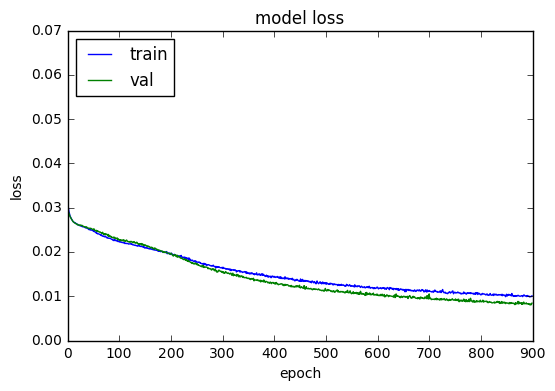

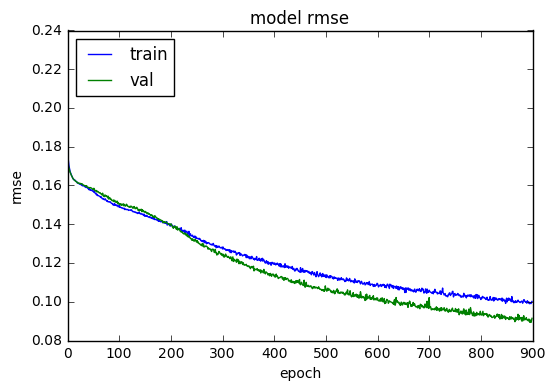

In [138]:
#LSTM call model definition
click_model1= click_stateless_LSTM(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model1.summary()

#Train LSTM stateless model with shuffle=False
click_history= stateless_fit(click_model1, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_1.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(click_history)

In [139]:
click_pred= click_model1.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred, Y_click_test)
print('XRMSE: ', xrmse)
print('YRMSE: ', yrmse)

XRMSE:  116.55683169241127
YRMSE:  69.01095452020685


In [53]:
#LSTM call model definition
click_model1= click_stateless_LSTM(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model1.summary()
click_model1.load_weights('click_wts_1.hdf5')

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_15 (LSTM)               (None, 50)                10600     
_________________________________________________________________
dense_8 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 2)                 0         
Total params: 10,702
Trainable params: 10,702
Non-trainable params: 0
_________________________________________________________________


In [55]:
click_pred= click_model1.predict(X_click_train)
xrmse,yrmse= calculate_RMSE(click_pred, Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred= click_model1.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  109.9775784519244
YRMSE train:  67.71668598624336
XRMSE test:  115.69545867806166
YRMSE test:  66.84520878889889


In [ ]:
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu) for stateful LSTM
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, batch, a):
    hist_val_loss = []
    
    # fit the model
    model = stateful_LSTM(units=n, lr=lr, batch=batch, alpha=a)
    for i in range(500):
        hist= model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch, verbose=0, shuffle=False)
        hist_val_loss.append(hist.history['val_loss'])
        #manual early stopping while monitoring the validtaion loss and stopping when the loss does not improve for 2 continuous epochs.
        if(i!=0):
            if((hist_val_loss[i-1][0]-hist_val_loss[i][0])<=0):
                count+=1
                if(count==2):
                    if(i<50):
                        count=0
                    else:
                        print('Epochs stopped because of no improvement. Epoch Number: ', i)
                        break
                else:
                    pass
            else:
                count=0
        else:
            count=0
        model.reset_states()
    
    Y_Pred = model.predict(X_test, batch_size=batch)
    model.reset_states()
    
    xrmse,yrmse= calculate_RMSE(Y_Pred, Y_test)
    
    print('Test XRMSE: ', xrmse)
    print('Test YRMSE: ', yrmse)
    
    return xrmse, yrmse

start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60]
learn_rate= [0.001,0.01]
batch_size= [133,437]
alpha=[0.01,0.05,0.1]
for n in neurons:
    for lr in learn_rate:
        for batch in batch_size:
            for a in alpha:
                print('Units: ',n,', Learn rate: ',lr,', Batch Size: ',batch,', Alpha: ',a)
                print('Model Number: ', count)
                model_df[str(count)]= [str(n)+','+str(lr)+','+str(batch)+','+str(a)]
                X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test, n, lr, batch, a)
                count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

Best parameters: 60 units, 0.01 learn rate, 133 batch size and 0.05 alpha.

In [24]:
#LSTM with m/m between batches
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stateful_LSTM(units, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

In [22]:
#function to test overfitting or underfitting of the stateful LSTM model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE
def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(1000):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()
def run(repeats, units, learn_rate, batch, alpha, dropout, X_train, Y_train, X_val, Y_val, X_test, Y_test,fig_1, fig_2):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= click_stateful_LSTM(units=units, lr=learn_rate, batch=batch, alpha=alpha, dropout= dropout)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")
    ax1.legend(loc='best')
    ax2.legend(loc='best')
    fig1.savefig(fig_1)
    fig2.savefig(fig_2)
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

In [ ]:
run(repeats=5, units=60, learn_rate=0.01, batch=133, alpha=0.05, X_train=X_click_train, Y_train=Y_click_train, X_val=X_click_val, Y_val=Y_click_val, X_test=X_click_test, Y_test=Y_click_test, fig_1='click_1000epochs_XRMSE.png', fig_2='click_1000epochs_YRMSE.png')

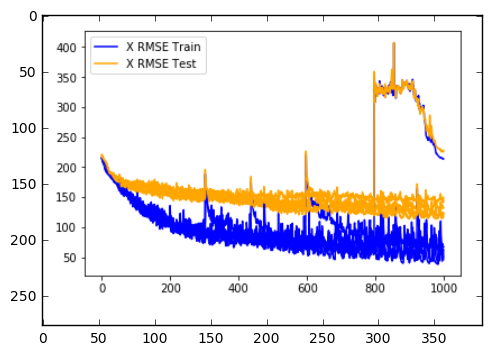

In [29]:
img=mpimg.imread('click_1000epochs_XRMSE.png')
img_plot= plt.imshow(img)

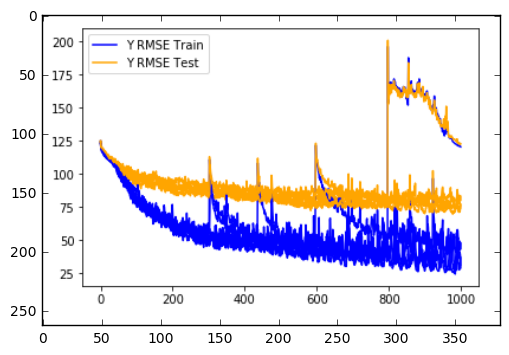

In [34]:
img=mpimg.imread('click_1000epochs_YRMSE.png')
img_plot= plt.imshow(img)

The above plots show a compelete overfit. In some of the repeats, the loss and RMSE of both train and test sets increases by a huge factor. For the rest of the period RMSE for both train and tests sets is continuously decreasing over 1000 epochs but there is a huge difference between the performance of train and tests sets. Thus, the model is overfitting. Let's see if adding a dropout improves the performance.

Model created and compiled
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 6s - loss: 0.0393 - rmse: 0.1905 - val_loss: 0.0281 - val_rmse: 0.1672

Epoch 00001: val_loss improved from inf to 0.02813, saving model to click_wts_4.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0275 - rmse: 0.1653 - val_loss: 0.0275 - val_rmse: 0.1654

Epoch 00001: val_loss improved from 0.02813 to 0.02753, saving model to click_wts_4.hdf5
Epoch Number:  2
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0272 - rmse: 0.1644 - val_loss: 0.0272 - val_rmse: 0.1645

Epoch 00001: val_loss improved from 0.02753 to 0.02723, saving model to click_wts_4.hdf5
Epoch Number:  3
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0269 - rmse: 0.1635 - val_loss: 0.0270 - val_rmse: 0.1637

Epoch 00001: val_loss improved from 0.02723 to 0.02698, saving model to click_wts_4.hdf5
Epoch Number:  4
Trai

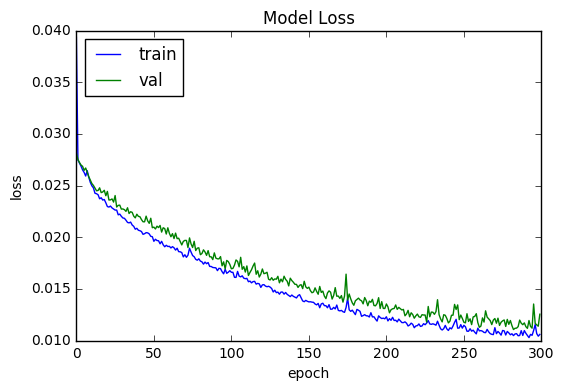

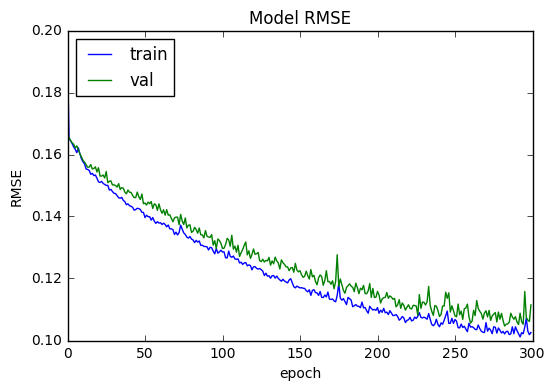

In [28]:
#added a recurrent dropout of 0.1
click_model= click_stateful_LSTM(60,0.01,133,0.05,0.1)
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 300, 'click_wts_3.hdf5')
#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

The performance of train and validation data has improved as both of them are performing equally well after the addition of recurrent dropout. But this instant increase in the RMSE means the learn rate should be decreased.

Model created and compiled
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 17s - loss: 0.0674 - rmse: 0.2357 - val_loss: 0.0289 - val_rmse: 0.1697

Epoch 00001: val_loss improved from inf to 0.02893, saving model to click_wts_3.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0301 - rmse: 0.1731 - val_loss: 0.0284 - val_rmse: 0.1680

Epoch 00001: val_loss improved from 0.02893 to 0.02838, saving model to click_wts_3.hdf5
Epoch Number:  2
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0296 - rmse: 0.1717 - val_loss: 0.0281 - val_rmse: 0.1671

Epoch 00001: val_loss improved from 0.02838 to 0.02806, saving model to click_wts_3.hdf5
Epoch Number:  3
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0292 - rmse: 0.1705 - val_loss: 0.0277 - val_rmse: 0.1661

Epoch 00001: val_loss improved from 0.02806 to 0.02774, saving model to click_wts_3.hdf5
Epoch Number:  4
Tra

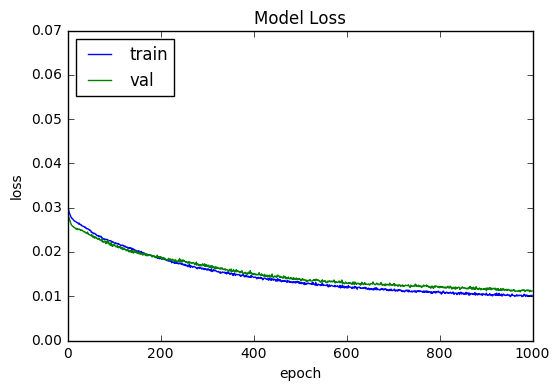

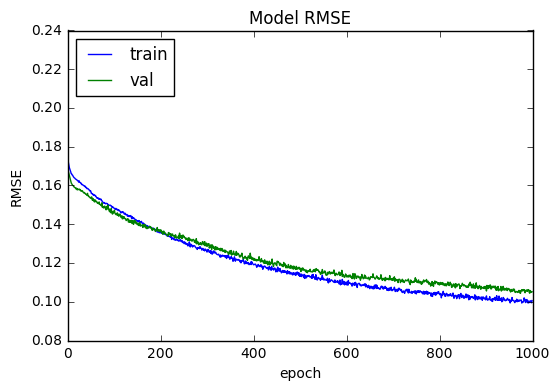

In [57]:
#added a recurrent dropout of 0.1 and decreased the learn rate from 0.01 to 0.001
click_model4= click_stateful_LSTM(60,0.001,133,0.05,0.1)
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model4, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_wts_4.hdf5')
#plot loss and rmse curve for simpleRNN_model1
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

Adding recurrent dropout and decreasing the learn rate improves the performance of the model. Let's see what value of dropout gives the best result, as it is expected that adding a higer dropout will improve the performance. ALso, the training loss decreases more rapidly as compared to validation loss. Let's see the results by decreasing the number of units as well.

In [ ]:
#tuning is done for only 1 repeat as it takes 30 mins to train 1 model
def dropout_tuning(dropout, repeats, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    timesteps=18
    X_RMSE=[]
    Y_RMSE=[]
    for i in range(0,repeats):
        print('Experimental Run: ',i)
        model_iter = click_stateful_LSTM(50,0.001,133,0.05,dropout)
        
        for j in range(500):
            model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
            model_iter.reset_states()

        Y_pred = model_iter.predict(X_test, batch_size=133)
        model_iter.reset_states()
        
        xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
        
        X_RMSE.append(xrmse)
        Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE

repeats=1
results_X = pd.DataFrame()
results_Y = pd.DataFrame()
dropouts=[0.1,0.2,0.3,0.4,0.5]
for dropout in dropouts:
    print('Dropout: ', dropout)
    results_X[str(dropout)], results_Y[str(dropout)]= dropout_tuning(dropout, repeats, X_click_train, Y_click_train, X_click_test, Y_click_test, X_click_val, Y_click_val)
print(results_X.head())
print(results_Y.head())

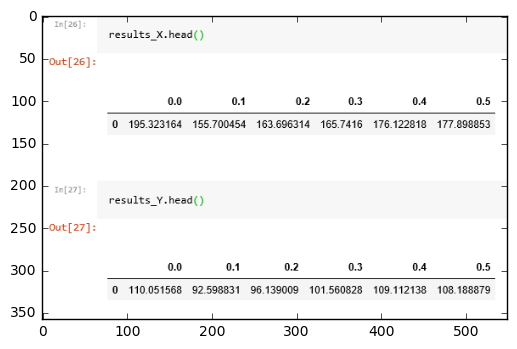

In [29]:
img=mpimg.imread('click_dropout_lstm_results.png')
img_plot= plt.imshow(img)

0.1 dropout gives the best results.

In [ ]:
#reduce the number of units to 50
#added a recurrent dropout of 0.1 and decreases the laern rate from 0.01 to 0.001
click_model= click_stateful_LSTM(50,0.001,133,0.05,0.1)
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 500, 'click_wts_4.hdf5')
#plot loss and rmse curve for simpleRNN_model1
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

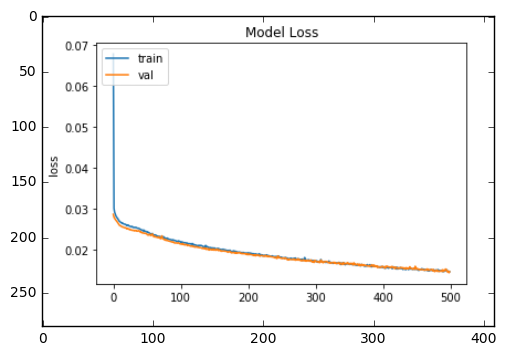

In [30]:
img=mpimg.imread('click loss 50 units.png')
img_plot= plt.imshow(img)

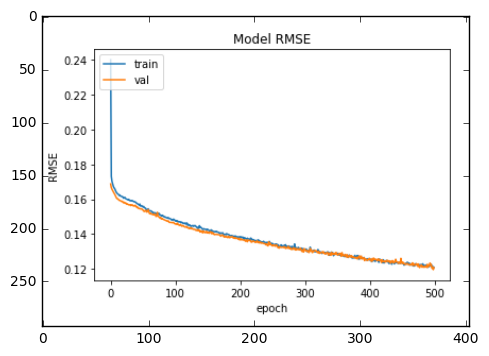

In [31]:
img=mpimg.imread('click rmse 50 units.png')
img_plot= plt.imshow(img)

Now, the model is performing well as both train and validation loss is decreasing continuously and is almost same. Further, the model was trained for 1000 epochs and the loss is still decreasing.

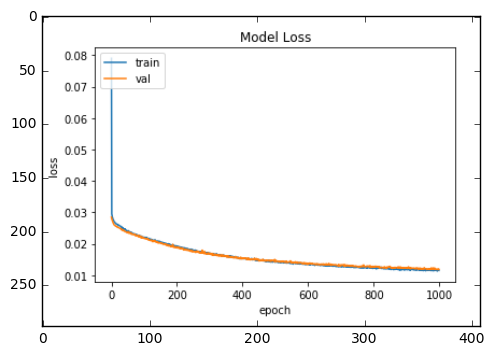

In [32]:
img=mpimg.imread('click 50 units 1000 epochs loss.png')
img_plot= plt.imshow(img)

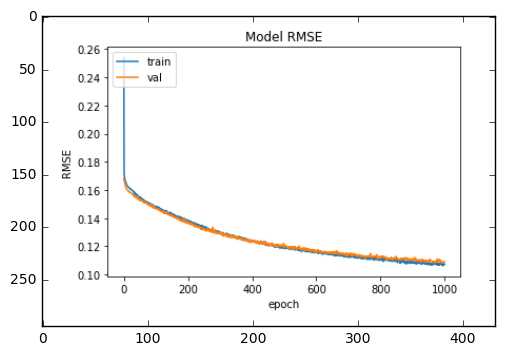

In [33]:
img=mpimg.imread('click 50 units 1000 epochs rmse.png')
img_plot= plt.imshow(img)

The RMSE for both train and test is decreasing continuously but still there is a differnece between the rain and test RMSE scores. And since, it is still decreasing it can be trained for more number of epochs.

In [ ]:
#call function to test overfitting and underfitting at each epoch with the new parameters
run(repeats=5, units=50, learn_rate=0.001, batch=133, alpha=0.05, dropout=0.1, X_train=X_click_train, Y_train=Y_click_train, X_val=X_click_val, Y_val=Y_click_val, X_test=X_click_test, Y_test=Y_click_test, fig_1='click_XRMSE', fig_2='click_YRMSE')

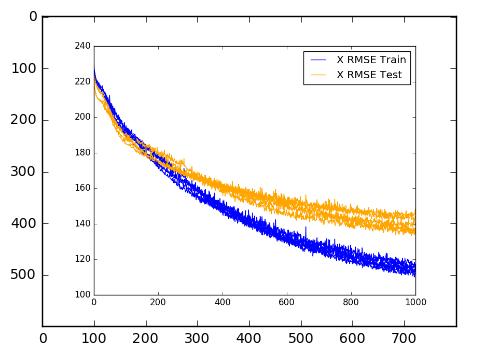

In [99]:
img=mpimg.imread('click_XRMSE.png')
img_plot= plt.imshow(img)

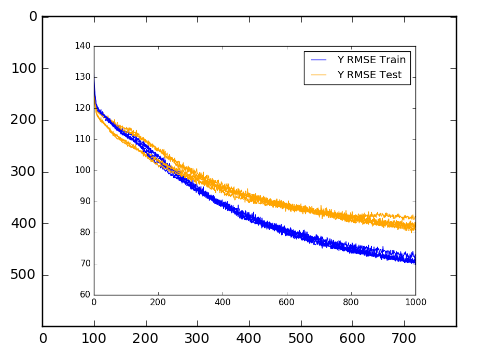

In [100]:
img=mpimg.imread('click_YRMSE.png')
img_plot= plt.imshow(img)

XRMSE and YRMSE for both both train and test sets is continuoly decreasing over the 1000 epochs.

In [23]:
def scores(e):
    RMSE_Scores=[]
    Xtest_RMSE_1= [221.05345286635708, 218.09624915105775, 216.95316830693935, 216.08014736289127, 214.97567848716477, 213.76145415033417, 212.6414859537544, 212.04847860749967, 211.79917904796972, 211.3951517308625, 211.23351168556326, 210.52858127471927, 210.43418727085006, 210.1167891517558, 210.11328119238726, 209.9100545868319, 209.76019021319146, 209.77696381400872, 209.30776562389886, 208.9918172695138, 208.94802402184712, 209.0191958167482, 209.08320148267558, 209.25149732804508, 208.62489533339425, 208.369237785923, 209.1309765592106, 209.19233114231207, 208.50672771931676, 209.1634860556293, 208.9965093055717, 208.94575246081078, 207.69616954605456, 206.94749817382913, 208.6752328057258, 207.7051809042055, 207.68521383131971, 206.5398448199744, 204.49993782836995, 204.55068377512654, 203.00793935582817, 204.4337046257151, 202.8341313384627, 203.44576189567022, 202.7328932268895, 202.62106220857555, 203.514441943737, 201.8018198466543, 201.02498338287555, 205.10133834416965, 202.21825139563884, 201.8953234155299, 200.00557274550133, 201.28737086122464, 198.81634360771267, 200.2279339782185, 198.20289634988808, 200.52972628578794, 198.42582818770725, 197.32064800447867, 197.03188548267138, 197.19002958349955, 198.0899815425375, 196.1482792045549, 196.93345909323168, 195.52442110688824, 196.82058713978736, 195.7996549142932, 196.18315012691124, 195.73888477272908, 194.93664777506663, 194.4605737052933, 195.025919160094, 195.52850235534703, 193.6587575680416, 194.31056206405432, 194.0840995222527, 193.63975478002115, 193.9835281179462, 194.91805908561784, 195.17255367853798, 193.64138736115427, 193.62877680505156, 192.22949554541788, 193.00452442719396, 192.97946355454633, 194.53880048966357, 194.41224299043176, 193.88933699773284, 193.53477868378585, 192.1563939307587, 191.3030566664646, 190.7374751833883, 190.83306445777114, 191.10485938233558, 194.00973512080952, 192.28014349911456, 190.2625023233832, 190.93030511750942, 190.77725979143514, 191.95261770371, 190.41065723521, 190.8927535483006, 189.10259757718129, 190.0485015081839, 189.81568445801287, 190.98277506977692, 188.43055939011455, 189.7359291638436, 188.44537023414622, 190.23390445906134, 189.4757792735321, 189.6455146584009, 188.16629244947725, 188.8089567165761, 189.73739458752036, 189.30488746272158, 188.13689779119065, 190.13276147034668, 186.64285586551364, 187.92635404213243, 187.80549898578718, 188.7837034723133, 187.83202586069095, 188.2087078915406, 187.81923060321577, 187.6976303519858, 187.13203426802067, 188.49313284673326, 186.2833144548278, 186.66455663232577, 186.30038272608925, 187.49812664773728, 186.6972800450128, 186.5178778183346, 185.7078520202505, 186.4690622463753, 185.95249290606702, 185.05005360512806, 185.688138654595, 185.24595533419622, 185.8012536586613, 183.39629874325723, 185.8788957684168, 183.3470033159441, 184.8381618205177, 182.97998741740332, 184.6250202223498, 185.22619256499408, 184.99087990139236, 182.58880112329783, 184.68953571809672, 185.216163965493, 184.21664750309463, 183.5729501338658, 183.79218841951243, 182.57336302067915, 182.2291836785803, 184.07885540448453, 183.33342968415047, 182.45457769741705, 184.162734587452, 182.50573708559563, 182.7052364089468, 182.49959394192132, 183.19053068558688, 183.7570165923577, 182.5844269382348, 181.2972343386995, 181.7618752781624, 181.2045040072624, 182.1780253668341, 180.78270321613192, 182.02488079922483, 182.1387002361172, 182.86062135776805, 182.87423001742698, 180.23309457474508, 179.9375045630038, 181.05077839748398, 180.33141495931, 180.23754920246031, 179.69360948396482, 181.32808435073505, 181.05449108964353, 178.52821488427128, 178.99953922911456, 179.04889381231618, 180.90086884452228, 181.59262000515844, 179.1382392777738, 179.35989328716272, 178.7523937940363, 178.10397392856026, 178.49831500701364, 179.0934518642437, 179.21839798315995, 179.23775051076083, 179.13518767605981, 180.3749102536254, 178.87995075947754, 179.50223795030004, 179.93795937486732, 178.59974783037768, 178.7606802625277, 179.0113373479067, 177.13617481440232, 179.6893616809426, 177.675596767503, 179.43532940897828, 176.24077583523118, 178.39736917326948, 179.74612574468583, 179.4946912490363, 178.0068494160715, 176.12272761704995, 176.4958692724154, 176.47289339413012, 177.01503926045226, 174.9817513579322, 177.5376404030572, 176.54177072599043, 176.6501755588914, 174.70936595872357, 174.7587615795252, 177.64674082406648, 174.17072218606467, 177.83601010786165, 176.1729433668832, 174.7145361728852, 175.25952422907017, 176.19711861302216, 175.19174432760715, 175.1614217130894, 174.05473945371241, 174.83240456135286, 174.39093645427334, 173.79552918691317, 173.58376323234992, 172.8129415347791, 174.4110419436928, 171.84886456332728, 174.39905411046064, 172.23383310567127, 173.17190323427576, 173.8147626071033, 173.0119246738524, 172.80199191529286, 174.2451556487057, 172.90832658068243, 173.0625252769564, 173.58285589813073, 172.89748442867256, 173.44111934584112, 170.48906458268448, 169.80986916557353, 170.6704168426474, 172.0386009150965, 170.24757209124192, 172.57158119498038, 171.87274989773007, 172.73992565024494, 171.8947510909056, 169.6888734888877, 169.78378058469988, 171.53814725845356, 170.07707359875837, 170.05183090572922, 175.97683253875985, 173.27682795032246, 170.50892359829956, 168.7818718439842, 168.84028664882106, 169.07953740469807, 168.70446718582158, 169.34668783615268, 169.54094610416988, 168.0781756246589, 169.23834012589776, 168.02514094684562, 168.7841335821614, 168.8258751632667, 170.05943597830597, 170.20851248570133, 169.69519483911532, 167.2646601772932, 167.49112635706888, 170.22782179456632, 168.69179478221216, 168.73131230697723, 167.98234146047042, 167.4441979436289, 167.1645509689348, 169.09618960570268, 168.30553761476182, 167.1790807276028, 167.54507338032306, 167.20256692623886, 168.01231600168305, 167.57181363805952, 168.06829142002962, 166.40797736829037, 164.7712708773055, 169.35696210587008, 166.55589431548964, 167.18171032899778, 166.48477874186693, 166.58520219468394, 168.4110623394234, 164.49513138983102, 167.03888179669354, 164.36259884745567, 167.24792310688252, 167.55717912828914, 164.98808433820912, 165.1289113029797, 167.87830671204486, 164.8970775532442, 164.61822658795862, 165.72623899507747, 165.87649789789145, 167.10892587655346, 166.2733378264765, 164.2681787829738, 163.83906689479124, 165.62050473944268, 164.88034289780535, 166.97831368965754, 165.9426836113314, 164.5565708565925, 164.02023379457265, 165.9752947480933, 163.77005943911274, 165.75725745911748, 164.48550574474768, 164.15935589273985, 165.74113764317192, 165.81347300423855, 165.67990929872562, 161.74785767578607, 166.06904899630126, 163.0109204769969, 164.20967030838113, 161.14240225234428, 162.50351792528105, 164.26488579541513, 164.8243112771173, 162.1564132183205, 164.06473571375602, 163.45728087341806, 163.9384185165086, 163.39718668915594, 165.53323714251334, 162.20829108039666, 161.39482428869718, 163.76992643922893, 161.62954787371174, 164.24801798234645, 161.6162663844892, 162.05070378949634, 162.23091809115832, 161.8684313744752, 161.1025210571994, 162.69497671508478, 162.00611400523044, 160.41334452635132, 160.36808173154944, 159.30906895902626, 162.00821476204047, 160.5901832780258, 161.73290586983063, 164.24078358699242, 161.21667115696818, 161.0007891853938, 159.96479981120518, 162.86708688433268, 161.38043371609726, 159.03119618310726, 158.59124480941355, 161.96205363758116, 160.13391168728265, 161.75593149824147, 161.83249969848342, 161.63272740796026, 159.7617702305593, 160.73541434752292, 160.03064453908132, 160.9711831678941, 159.1370802762319, 160.83820770424146, 158.25087699170143, 158.4766477446488, 157.8318037438647, 159.23876774347042, 160.3030670002989, 158.05305635005374, 160.32845295164182, 159.45107523834355, 157.48888695620894, 159.62851748371276, 159.06960109333798, 155.98728217382174, 160.70711290817272, 159.5491036097068, 157.62728348622102, 157.559499137184, 159.22990857739754, 161.9959360220793, 155.51660315984915, 159.33469275945137, 158.70545507969902, 158.49910325561524, 158.32691925412612, 157.35325204665716, 156.96178952547805, 157.08846774572845, 156.91095419820888, 159.92849950297972, 158.06762519883287, 159.86678172442316, 157.17772479205266, 157.56654505737885, 158.58712342267464, 156.05363255418808, 157.00099542332214, 156.17128093665195, 155.4384441703916, 154.8868229022794, 155.655656551425, 156.7888452479041, 157.7722414878035, 155.7234995700136, 157.52643095014747, 154.6657636642272, 155.80986124481555, 157.30505711135868, 154.68629933923594, 155.93376617141465, 154.61246155838464, 152.33570681659054, 154.9362252254905, 156.40934569754674, 154.41854036778787, 155.5524728522588, 155.5535700885009, 155.55132606713144, 154.37104143791163, 156.9889150707801, 155.79800364030325, 153.38067264297965, 154.26021039569142, 155.28150201273894, 155.77423773438102, 153.3692773612508, 154.18423592898776, 153.8058330155691, 152.39550446357316, 153.90195509284794, 154.0904566085064, 154.39073843000824, 153.08016726042158, 155.76045551715998, 152.40515135993923, 152.58677124876172, 155.83115025135464, 151.89637233202515, 152.97692177320096, 154.11798431634003, 154.0447528386758, 153.91045120383882, 153.48806104256033, 153.8209688226531, 153.28408163177656, 154.74184099303184, 154.06949556589635, 154.12906422542568, 152.42820341378896, 151.76555690005466, 155.07585747458083, 153.14648688124103, 152.3048255120451, 156.14209415641665, 153.29633184967275, 150.97955093731818, 151.7863225922164, 154.5658600972204, 153.34717030626456, 150.83629249706934, 151.3612971997949, 151.49701215297821, 152.51680777857283, 150.7811425919693, 151.61616212411755, 152.12838942926325, 152.98741297529344, 150.103760146059, 151.1656155096735, 151.62299482149126, 152.79591291069798, 151.8392697323134, 152.56579977532746, 152.0551556513593, 153.06879597695288, 151.08270309477584, 151.12754841023028, 149.3915019960414, 150.481852421341, 151.42086486516314, 150.62283931560438, 151.08875757600313, 150.76516651337843, 150.37604621240195, 151.37799633923856, 149.2373752237596, 152.01946863349102, 149.63412986448014, 150.02362641164493, 152.49564068028064, 149.32212032243902, 150.36349131105484, 149.6769315965469, 149.9744794559678, 150.10429020484582, 150.2254606271825, 150.60296493757406, 150.19615361240403, 149.42051265103663, 149.45409037814846, 149.42171901237057, 152.18153382328967, 147.23389390732626, 148.60587684265388, 148.35110911817836, 147.76798905010173, 149.0625344852218, 150.1437654333185, 149.7977215608569, 147.37178438359143, 149.58810026422347, 149.46441361856557, 150.61777895284368, 150.0117098585509, 150.38836796882984, 148.76697440672973, 148.4027532353765, 150.37384680646326, 146.98749613662824, 148.65707524727353, 148.27460504868367, 148.44321322140883, 147.1569320002213, 149.11990265290729, 145.5275513765055, 146.84688438010969, 148.47948209972157, 147.673657732223, 147.7356883426093, 147.72003491422961, 149.88011168528405, 148.14188278084765, 148.89674981979707, 146.1204965076106, 145.93833270951257, 146.63877635645892, 148.12053407819508, 147.69195818898464, 147.84991737603374, 148.50675564679125, 145.8609667512189, 151.06409695730403, 145.97593888818403, 147.9959561524601, 146.15047829264347, 145.0374534048873, 148.49645121159813, 150.64888711296425, 146.1757766169877, 147.25014744675207, 146.75096051763765, 147.00895301616188, 145.7051853150925, 147.14884410673682, 146.46172642937157, 145.39512189543956, 145.82790221339746, 145.44079655698349, 146.5439315743656, 145.3243110071056, 146.50695020487305, 145.2891223216578, 147.1450799170134, 144.80682458811256, 146.20524926491316, 148.60710780292803, 146.42712930791583, 146.31716658473593, 144.5449100694632, 145.50136524480055, 145.53247674399682, 147.8014271833149, 145.97673153126004, 145.78985375109536, 145.8240430067675, 144.34512906182, 145.10823085162204, 146.2897756622658, 145.2106033445509, 147.3159827686377, 144.85118281447097, 144.30974825555552, 145.87882147082354, 143.85985108143922, 145.11124612221977, 143.2840232311384, 145.50881578657481, 145.6303961196656, 144.31164224236542, 146.7340204356116, 146.126830157544, 144.96858898254297, 144.548798415191, 146.75683998790186, 143.65936415436786, 143.46515289096126, 143.8402102833245, 144.00387521517447, 144.23896719469312, 143.00515501916698, 146.6158493661383, 141.91858085573207, 145.9563048495851, 143.60994422126848, 146.20070134588659, 143.70273366435214, 145.6758229562718, 144.7735964761294, 144.8848372580129, 143.6137692074171, 144.89519364543187, 143.13468761993178, 144.9537344786852, 145.73568193833273, 146.88002174462784, 144.0362640106442, 145.8650295773427, 142.23406255640901, 142.67259649829194, 146.09316602105955, 143.9593124406575, 144.07503419990056, 142.57721281146164, 142.8477282693704, 144.59300755171896, 142.40258070280495, 143.053423257055, 142.65018356646536, 142.67993112460175, 142.95558897205936, 144.8372909016298, 145.11736497149954, 142.17971533456796, 144.29239309270883, 142.67609837439574, 145.00075490776916, 143.49798585357257, 145.79561182124817, 144.0259183381591, 143.16848274983843, 143.41949915637747, 144.08111836440835, 146.1342742079424, 141.0682090767135, 143.681587692265, 143.215771625352, 142.8108592957981, 144.28962249007768, 143.22357570195103, 143.9925715458258, 144.60812581364792, 143.4082698333444, 144.7533223821957, 141.88409834986794, 142.97842515669717, 142.3720078124689, 142.49627220361012, 142.67979452079953, 143.9220514046129, 141.95293623396768, 141.553290204288, 142.1073029684845, 141.90207932390456, 142.48192787937057, 142.1584014917712, 145.41933918623258, 143.27808204649554, 144.25434617139155, 145.25084238492323, 144.69856745025407, 145.79482494911392, 143.3570640272539, 143.11283743843052, 141.95886848170167, 142.1464512149385, 142.67232004573427, 141.9823818610179, 143.21070020725537, 141.47978642055867, 140.7281205973708, 141.99604077664247, 143.74051372405367, 141.6348455672423, 143.11594292347132, 141.90597158087866, 140.38169987529275, 141.86715408770777, 139.38633811266183, 140.2711760446299, 140.67415345749643, 144.33343775703693, 142.1047892659449, 142.58518712461827, 143.70875281908374, 143.88027583658513, 142.4939927352832, 142.60210870552163, 142.62393808039332, 143.83884366122234, 144.58571764856515, 140.88860020576803, 141.6652026074518, 140.30635783378796, 140.50120847087237, 140.6181595398964, 141.3092174569165, 141.95519867967175, 141.172005774242, 141.798270762148, 142.3840671803482, 141.49092061298046, 142.47233662983047, 139.82538538578459, 140.9642178556662, 142.19682041631103, 141.6106731702299, 142.29665642259374, 140.93550713211667, 140.86254092036333, 141.95125641977683, 142.07096772919007, 139.89386232263593, 138.94962420125898, 140.53406744439047, 140.62436275077067, 141.29808207370948, 141.99957369410902, 142.6680898204814, 140.7837609498418, 143.6023002132522, 142.2967106043533, 140.09219532999177, 140.81496988136684, 141.43479334494302, 140.6346332648264, 138.78693966697526, 138.84904004054928, 141.27964022732004, 139.1221028622339, 139.9753360668835, 140.55112577307565, 140.55351743750796, 139.5088540625261, 140.2243718080876, 139.79063762096322, 141.80261327206202, 144.07246113924626, 140.72811781273708, 141.8141173719427, 141.8837170203669, 141.99918601844786, 142.6286337375155, 139.76266976318948, 139.95451484049033, 138.8231783923219, 140.61987395962356, 140.66589156280187, 140.18288547354982, 139.39739393309293, 140.60764472212867, 138.40926029129906, 139.32276130874476, 138.42236348978633, 141.7467963796577, 138.39812070047802, 139.1450982915238, 139.97745443585976, 137.811862140249, 138.8499825539756, 140.25448974094934, 138.26867436903936, 142.75750610957232, 138.0152519615982, 139.5707464247395, 141.228850236718, 137.77009856163528, 140.2230782728586, 140.8630406814463, 140.96775704047369, 137.52987366837866, 138.71638783217617, 137.3779938215405, 138.4366349362596, 139.13897711300794, 137.3579208445409, 140.68294391205433, 143.09275614684285, 139.328882691195, 139.6622237983665, 139.6382287374923, 138.81035403528153, 139.83018438276673, 140.37968026227634, 141.07356620019806, 140.47777013310156, 141.01873642750326, 139.27998025505389, 139.3008559056655, 142.58850805043687, 142.37344591520096, 138.85151853791675, 137.8451608000093, 138.77582324225878, 137.8572737891669, 140.38791321168188, 138.95415220031322, 139.98419656038973, 138.38474704170264, 138.85840351306362, 139.14720373565598, 137.94243158333447, 138.05232247853607, 139.46074069034356, 138.58119590143926, 139.34312448378878, 140.33625864308607, 139.05853315338263, 136.73573496655288, 138.61583841079482, 139.47720561423523, 138.26899329489345, 139.5034380004972, 138.55823827718544, 137.89992533267528, 138.56375612009904, 137.34508618870888, 138.23471533872024, 139.34712170344704, 137.5471894552961, 140.10136653050648, 136.3856326487428, 137.9863654325203, 137.85892791942968, 138.97139773091192, 139.67822956730615, 137.95836882838879, 137.95435919062612, 136.89939889176483, 136.27005737374057, 137.32161414545564, 135.8811552332607, 138.53869756351713, 138.69438225726364, 139.29358030019227, 138.8886769227786, 138.76365932235055, 136.63866548395822, 139.61677533599754, 138.23600597629317, 136.93676523022307, 137.15273362044678, 140.2371253183786, 138.88429134659424, 137.01763036346853, 138.85114598346283, 138.68155983547382, 136.50693698258746, 138.69637152177216, 139.6243964800055, 138.51013046443487, 136.01718173013134, 138.14455404544003, 138.39891251596228, 137.34048850894848, 136.85708769114854, 141.08055370551952, 137.0523853388245, 136.6699172299342, 138.45355766353427, 136.41808287750575, 138.17120209756456, 136.68551806880623, 135.18936215042612, 134.95557780593234, 137.51784830982103, 137.91309412278628, 137.76486922597942, 137.43508551136105, 136.64748674062818, 137.59858524466625, 141.17841246624602, 138.820572017554, 138.0223009345424, 137.71403888218364, 137.97628904115817, 135.6896969834276, 136.77766808805933, 135.75927394524325, 136.77027962530514, 137.51403517397492, 138.8537734837275, 136.724178102174, 136.08082111137387, 136.635009451783, 138.16103091562923, 139.93915937606812, 136.68483310620013, 138.87878406955545, 136.6437211675686, 139.01789676393906, 135.07880839442743, 135.4496423251066, 138.30048717624075, 135.7868546306607, 135.81534395051068, 138.07206749646835, 136.12765570603722, 136.02112914476652, 137.19431950480978, 137.21701025819746, 134.02716355928115, 134.71539678337865, 137.63200189832486, 136.12592974995295, 138.68314082347078, 138.84810268889507, 138.03986606876197, 136.26573059419525, 134.99093087100798, 134.2746202271199, 135.73695962750034, 134.08554631757315, 135.1867588771453, 135.80727277211275, 136.06008672829063, 136.61845055427685, 136.9092839456167, 135.7517224796015, 139.21850313884582, 136.60254372565126, 135.69287666850107, 135.71533108277077, 138.1006878332603, 134.44848651569376, 133.81210784233843, 134.45649570154976, 135.66150777934558, 135.02430984143837, 134.62139541085753, 136.5345505027128, 135.07323831587215, 139.5130582127585, 138.46120991894784, 135.0682198883372, 136.21649403847047, 136.72081231674792, 137.84592824005404, 138.59456518715368, 135.54823290690868, 135.3405294401772, 136.23681906636546, 135.21762506694517, 134.49659416406737, 135.1742393736858, 137.50886378115075, 134.55860803647897, 134.4499141193408, 136.20485921109824, 135.32859031965708, 133.33154716873318, 134.98367933003726, 134.96705127176304, 136.92191471304787, 134.6267333073263, 136.65650024149247, 135.34404288427885, 137.5082642486528, 134.77675652506827, 133.93238749072347, 133.9262706806258, 135.1908655996033, 137.2924895936364]
    Xtest_RMSE_2= [220.85369109503733, 217.99535558791072, 216.78879037012368, 215.84567218041647, 215.07868884083607, 214.1808965553993, 213.35407096137047, 212.70844993157004, 212.1461268245241, 211.6351156472565, 211.1170219868267, 211.06540424706503, 210.62441648231498, 210.72063480564373, 210.62146254145273, 210.01219993393778, 209.43580769995185, 210.0930798240229, 209.67169078908492, 209.22895975039359, 209.54180360567923, 209.79235296488693, 208.77830575404545, 208.87280182060226, 208.23799236061626, 208.64363503985965, 207.47621656536515, 207.8175932120214, 208.45980086197653, 207.4753405011058, 205.8873425957688, 205.91637395579053, 205.3971196306088, 206.67556796668825, 204.24616365422497, 205.93826414663366, 204.3607285326869, 204.4251191931437, 203.71908011506966, 202.7142956569424, 203.75012032007342, 204.47436356743884, 203.0456656075769, 202.4233575877902, 201.7028547336945, 202.19119498110183, 201.67629056389683, 202.01464635658564, 202.50720863106855, 203.48421996641133, 203.41747267849794, 201.63459578898656, 202.45454219596368, 202.23859780298082, 202.5464135029754, 202.53594008171507, 202.03235465598428, 200.80199680888919, 201.1882649414129, 201.24180540559152, 199.47419216906434, 199.4588449801406, 200.05416164957168, 198.28346312165766, 197.56486242262758, 199.5764596214463, 196.87860021911666, 197.3977072023506, 196.9699490851658, 195.62522749092778, 197.75621099585183, 196.49468779434693, 194.63282716372663, 195.44396944339397, 194.94587279232863, 196.3938287086416, 195.76346331087058, 194.75040415826783, 194.55114588410686, 194.35265990443543, 193.40213580703514, 192.10769765601867, 193.30675784088373, 192.5090441576799, 193.48820596251682, 193.47387704096352, 193.56306779941588, 193.56160610756302, 192.48778645293746, 191.25603849116234, 192.70005957882654, 193.61942266324166, 191.90539196637164, 190.00105576577437, 191.0614605032345, 189.96203938256312, 190.42064053109937, 190.95433440498078, 190.8325916485632, 189.43013801197932, 192.01176288505488, 191.04918147449686, 189.78564376687365, 189.47670625235634, 189.23624136674567, 189.65287309745187, 188.79812474075686, 189.0248718735331, 191.17623585420625, 189.83529631795741, 190.1354331718798, 188.1865978234661, 187.78584896301967, 190.10651189472978, 189.52217746695297, 188.80594401077815, 186.98738047763968, 187.61870559592194, 187.19051012550395, 188.638601874886, 189.7021948663217, 187.50419306528588, 187.897121313041, 188.5524834299092, 187.4624073892354, 188.18655371716585, 187.7887356636394, 186.58728896220484, 188.0400472807116, 187.25057933881638, 186.08334570813665, 187.2287505230369, 187.8679128084418, 188.02256866401942, 187.35186221367502, 186.9980802842757, 185.62975151100693, 186.7961908497292, 185.76985703931928, 186.49067883065084, 186.64547379906583, 186.29811080433927, 186.40231625776175, 185.17217891111125, 185.47918359709473, 183.0499241925178, 185.3888599731927, 185.78814335651833, 185.20429311527957, 185.7659395817886, 184.91010716217838, 186.31789578332794, 183.37651810517437, 183.79534513374165, 183.3918888405698, 184.04460963733183, 184.72617987385343, 183.18067050723528, 184.35225011898805, 183.75895220239408, 184.29073356368463, 183.96710213977875, 182.0951598636238, 182.98390422381848, 184.13068668197005, 184.35515922413424, 183.4900762882027, 184.05648885013244, 183.99543891176856, 184.34427682999845, 182.78170025329447, 184.5242276899168, 184.13195089808957, 184.62484329616814, 183.54689292919994, 182.2987367777999, 183.59004165163714, 182.28609722469332, 181.17702893780637, 181.28672884944456, 181.7999521855325, 182.990433945154, 179.976457837415, 182.56676386008928, 182.8684563701226, 182.22954399586948, 180.65914084560399, 182.0662959211957, 182.7371163987557, 182.18109472513248, 180.91666698346492, 182.40185220001936, 180.90049166435796, 179.5060893619516, 180.7648059724509, 179.91623465990142, 180.83718990993634, 182.94943416664304, 179.23210765973354, 181.82283674418406, 178.9171797504539, 179.8827564279831, 180.09572724455893, 179.92100604151707, 179.35387772445597, 179.73128938694248, 180.28825174564113, 179.81308811384406, 179.6942768133393, 180.26836025363872, 180.65079460632018, 180.44599091691302, 178.26665673907806, 178.16254224486087, 178.77052675193934, 180.49245595746603, 179.15871263430384, 177.91037811037685, 178.13398440904865, 181.58527897500815, 179.37494517589025, 178.9732188224019, 178.9179164844002, 178.06381711866266, 176.78808429488916, 178.65303507789193, 177.89569428123912, 178.81888016440672, 176.60889169009243, 179.24302996002405, 178.92493850857477, 177.9404161956364, 176.77788146339074, 178.2144610176287, 177.33624613972663, 179.7008230937971, 176.46421912093138, 177.38730858243693, 175.33432100202873, 177.01311482796032, 175.67845515603543, 176.74128433893748, 178.65480088289343, 177.157102688719, 175.25995210743838, 176.87907658020856, 175.89192182399276, 175.49461501418435, 175.0323069881995, 176.34501629210388, 176.73907764161, 176.2913046742693, 175.69668131097546, 174.1460364919906, 175.15774471109415, 174.95832096081446, 173.69849825844364, 175.3606531102339, 175.50364615487413, 173.9275132202574, 174.23154486368446, 173.60960629136505, 173.86493110585113, 173.60166172071044, 173.54366193053463, 175.20760477727325, 174.0850327971949, 174.9245589815075, 173.38191296386026, 171.91808870079987, 172.0330496102905, 172.61362037094065, 176.09124649704387, 174.574782375894, 173.71639441277688, 175.49137207388642, 174.6384451806487, 173.72820973569452, 173.40961078353513, 173.1744938150222, 176.76895690769675, 172.57644728406885, 173.03835461525702, 172.24855079543948, 172.577214711194, 172.51005360239375, 171.77565853704562, 171.79579899810955, 170.76583660037994, 171.26621776122886, 171.05685621962684, 170.76954002000332, 170.09399108662683, 170.30556378876955, 169.649385427332, 169.60700709411088, 171.103592749998, 170.49476209992847, 169.75319518722486, 170.16233001222935, 169.58302466186547, 170.5893863355037, 170.76068994987048, 169.43982435327524, 169.6395240728414, 172.30051178033034, 169.96723381003474, 169.5165820104136, 168.7779964470238, 169.42505459692825, 168.75738772821282, 167.97657286462993, 169.0391006130602, 166.97657993065988, 169.24755173496513, 166.39065982746445, 168.3223794708711, 167.8456367477567, 166.2571245493303, 168.5388134851636, 167.53542233621428, 166.6860890490164, 166.6585341226262, 169.1465408120356, 168.8906477947265, 168.2879404921095, 167.33242823565314, 167.69909478534024, 166.19859024510666, 168.63500307988747, 167.4430550664333, 166.48865761130332, 165.55445036311963, 165.10953673154256, 168.01653089126268, 166.49030178069805, 166.14614937803498, 166.86344101250617, 164.69699818108882, 164.50026264523478, 164.92438073003618, 165.01664774799133, 164.05812414314082, 164.76784188684616, 165.95481221238882, 164.8442671565, 164.82035080821777, 166.48122931834277, 165.0826793427376, 165.7348919628952, 164.43506917999105, 162.7294079481812, 164.14690120650036, 162.63369893220587, 164.0493132173969, 164.89546394974366, 164.0649310752345, 164.54680689321452, 165.4175836988762, 163.12156758916404, 166.13016158694964, 164.31977951195245, 164.89553800340784, 165.662617292169, 163.58299219074505, 161.41144675786322, 162.82493853183544, 163.88233777352707, 162.8033650129984, 161.41234507421734, 161.26162276028853, 163.5304957181848, 161.5941211103223, 161.67012125438623, 161.92432248592954, 161.14134392413294, 162.940951028794, 161.7453734997943, 163.30785591641697, 162.6104369199803, 163.12625831365096, 162.257106096105, 160.55086318392543, 163.5908750241843, 161.08536062395765, 162.37785180306994, 162.5726833928203, 162.59700881639296, 161.73813806051453, 160.8126184202802, 161.63462305953186, 161.72160126657033, 160.21621256875156, 161.83616298949107, 160.6712018984679, 163.77571983183094, 159.78443849289428, 160.66010479334642, 161.9583612903646, 161.77947235940061, 160.81754144782334, 159.76418121296143, 160.80104346682535, 157.58538762679768, 158.7153407522834, 159.4455043461388, 159.23725346134387, 159.78223635894028, 158.75910328034107, 159.00787274406497, 159.58885157472682, 161.16663981864886, 159.43444870453496, 158.871763416161, 157.81359523142785, 158.62510278258318, 158.49608445527556, 160.1943218517418, 160.5508191243694, 159.5752883329626, 159.3655278250208, 160.26871848434675, 157.99082226491362, 159.50589929400783, 158.43344192942763, 158.38065891905214, 158.3039520617515, 158.34951667790804, 158.2373530578969, 158.8550117469008, 158.2994424534161, 159.42420418457593, 158.0465401088414, 159.2452174743809, 157.38359232191496, 159.0890039609116, 159.39867412156673, 157.3696129368149, 160.06606604178364, 157.65687516918072, 157.60121349033824, 156.76004020651033, 157.91306871725556, 157.66360171726532, 158.3891857951188, 156.90409654113682, 157.55757302800794, 156.22851880634076, 156.64445308273164, 158.0956941584001, 162.3841607468454, 157.4418898062195, 156.75532281415474, 156.31627039127417, 156.39081263554226, 156.48419176912398, 155.64861207571585, 156.65121151084296, 156.3997491443927, 155.38241934617363, 156.71868132541778, 156.089353408636, 158.36395762005066, 158.15919854946102, 155.9126994184955, 156.52965577518796, 154.8920989674776, 156.68342914062777, 155.49141785655019, 154.6593053720811, 154.91792298598287, 155.25567300556233, 155.54384658540846, 156.7784103354755, 155.50928956344555, 155.00339871861428, 155.0030610028163, 155.61236530183766, 154.6633994317969, 154.87159467567633, 154.05445698212128, 159.46698798470047, 156.2931063496449, 157.2519898039201, 153.88427876813972, 154.15757696460514, 156.27432352815947, 155.18986010391558, 154.29284033367762, 154.26595381841167, 156.29884134989368, 152.89811566672435, 154.19310010444485, 155.87376747033616, 153.72528499349002, 154.86072348650097, 155.70018525859388, 152.58923767166053, 154.42133433632628, 152.80901222043548, 152.93822609906698, 152.97988817166404, 154.21111933621026, 152.23779588730457, 153.48666910538597, 155.16318198363103, 154.7212745900821, 153.17101183289722, 153.23603136264117, 155.12079746892724, 154.57653663078398, 154.3705660866524, 153.32307672484353, 153.17108633384143, 155.21000231020554, 155.29590237755582, 153.43711822566578, 153.76907844074972, 153.58738107908442, 151.54427615870515, 152.18508140427005, 150.85852279350345, 151.1400059504007, 157.01557373166162, 152.71588045474192, 151.28455821176001, 151.93473832291522, 151.8489833582336, 153.85129654623273, 152.0937403619689, 154.06926994924373, 153.6852888833669, 152.96881944133946, 150.01459460168712, 152.72415562745888, 152.96878806095933, 150.64438036387176, 151.57743529981997, 152.89717059189786, 152.43673078773978, 153.3490397260002, 152.6495918967184, 150.89103103482194, 152.07226683563263, 150.59072006342052, 150.57182511990675, 151.7909226311553, 153.7464771829776, 151.24649845601357, 152.18860835727247, 150.61613734351837, 151.74407155234584, 150.2255789388688, 151.58519883420578, 148.72042212872122, 150.35562054023492, 150.37115440201887, 149.34215973372451, 152.3863150222211, 151.8986009297844, 151.06237681882808, 153.15036747941244, 150.4954022932228, 150.76480756681596, 151.0984764203086, 152.76174848959624, 151.3133527102718, 150.68748398891648, 150.02343145426127, 151.54543213325053, 152.71994911841233, 151.4108318102371, 150.23257071107733, 151.17579933277764, 151.82288916120734, 150.52676234675184, 150.0723109859355, 152.22821877489224, 150.32013812292186, 148.3264491454104, 149.69664749497747, 149.86542755406398, 152.14352812050296, 150.08338465160486, 151.27853946475884, 152.52564359595237, 150.3549145793264, 151.33363388227144, 151.5641746123092, 149.79903127671602, 147.77056423471086, 152.77038876556412, 150.29027665191825, 149.19409037392424, 151.75103159376437, 150.73786943707407, 149.8126604628045, 150.40222783739247, 149.98455330279955, 149.54214754988948, 149.49999453073204, 148.22182108714017, 149.897172628231, 149.7350956494744, 148.395317265553, 153.44141378089128, 147.85118615611654, 149.65767775745076, 148.692848696573, 148.2100911589562, 148.06420013072415, 149.33257820801936, 149.41749238809314, 148.71478280643817, 147.5815999213259, 148.37840444280837, 149.17368226586524, 147.89331076600024, 147.50284556961424, 148.18525579291742, 149.42845662913763, 148.21860466105142, 152.39924239345655, 152.0738442452588, 147.61300183943084, 149.50421824458087, 149.27510656572767, 148.3034002284552, 148.72485106499346, 148.9316096469254, 147.4015186087473, 146.18760033073258, 148.2172574222948, 145.04468900250626, 147.34871365351424, 148.86784938858554, 147.54704998235883, 148.7006017798022, 146.9122350990123, 147.53596429974726, 149.7606173397554, 148.28823869263562, 149.21247590748416, 148.38474791956585, 147.5862341148762, 147.26354079866593, 148.33816426224482, 147.65237897219058, 146.43360352338644, 146.43086661031364, 147.43292567548812, 147.98670322888194, 147.59793534144762, 148.93174134765692, 145.96173078095475, 145.77079368370843, 147.2764930330677, 147.00982219774107, 150.31789534139446, 146.6324962599382, 146.9231316446535, 144.98791810188814, 146.48000190322503, 148.3781171703944, 147.6365244147494, 146.97227875349992, 146.08525490746726, 145.91878949825065, 146.3500606438203, 147.02832242595468, 147.5054580634083, 146.11949677254373, 143.39672736018974, 148.34751627744308, 146.52088361472167, 145.4242312489664, 146.69611585087324, 146.43862025808954, 145.67096420952723, 144.68721924560197, 144.32428971513366, 145.05553952999404, 145.74788476324548, 143.3337734478037, 144.58062070542442, 144.14013843928237, 146.92793864465725, 145.3465521921894, 144.7308853381956, 145.07122869552418, 145.1477054662376, 145.04601338652097, 145.94953888496545, 143.95864839610124, 146.32679115284856, 144.23598489604794, 145.83761030695152, 147.32678232989085, 144.51048587934753, 145.7898612094714, 145.10397255587083, 142.63935982843742, 146.12726188015284, 144.01105958327057, 144.89343238894142, 144.86740442070237, 145.69757199566348, 146.37024676769371, 146.09567447521485, 145.22278177929445, 144.01225306203472, 145.2583385464466, 146.57305145320495, 145.4210351897218, 143.57005662331775, 146.44718738538552, 145.92212223385948, 146.0609783818335, 143.59383958511813, 143.58390868616667, 147.035125927852, 143.26350185634203, 146.72462330156208, 144.31228741926245, 146.51820038728758, 142.50462809218928, 142.63010886513885, 143.33142028299486, 144.53252216756206, 144.75107120840252, 144.37568866291184, 144.08314265901222, 144.72015924162085, 143.36270723861475, 144.95830809328928, 143.42367094589451, 144.43488571673524, 142.80773115083295, 145.2924094047482, 144.0523008021159, 142.91610253017615, 143.49050051995496, 144.65017622907456, 143.34399091093033, 143.04534709013407, 143.56951163889966, 142.87072442041094, 143.35832189540778, 144.6747329296735, 142.62154923336715, 141.93343060194027, 143.96462532541477, 146.2166707817896, 144.5577948896464, 142.76310128323104, 142.51506041751784, 141.5811426651948, 141.291023899441, 143.85301708259777, 143.37811726421484, 141.6879185323551, 141.70393354765935, 141.96498576042632, 143.11409697408007, 144.11956837801816, 140.9122263629093, 143.56840441576477, 145.525230535689, 143.22473651075583, 143.73845555016558, 145.47519181069754, 144.1979260047379, 140.66652465329065, 143.52136936069672, 144.26398355116567, 142.09183957276323, 142.73585825327376, 145.66973269298532, 141.99929711718613, 142.36255870779132, 143.90360081713055, 141.27826856847324, 142.0810514470375, 141.234108197519, 141.29030522565202, 141.23877968649506, 144.28489985893154, 141.35877165252228, 140.63899506331424, 142.8085181452759, 141.47126970271864, 142.65513830385262, 142.48009339252948, 142.75272255735615, 142.27555768300442, 142.58526615509186, 143.6181918748523, 142.13639379317905, 142.31367871212427, 142.34204654235177, 141.54621065754952, 140.51885671003149, 143.56735429077293, 140.8925359664577, 140.41193668988427, 139.4631474861838, 140.76234373856482, 140.10029902329956, 141.08144534644856, 141.2080776647293, 143.68654254325554, 142.51797921415758, 141.1145745848369, 144.59114710026995, 141.93508393825712, 141.10199299758423, 139.51565893888343, 139.48300809503138, 140.89261054347648, 140.1241925764686, 138.8312820337274, 144.13793859997415, 142.35362341854443, 140.09148552392523, 141.12186025588161, 141.12268078951095, 140.112154840241, 139.56424856740907, 139.55696856746425, 139.5128234099068, 141.10299702457235, 141.75806684262284, 140.88092982666063, 140.03866041016263, 142.8092938578006, 142.7792083970259, 140.50211073885592, 140.3895132712988, 140.0730918463629, 140.4407857820802, 140.06462394284844, 141.74258236442645, 139.0100185758807, 139.36931919908093, 141.0192211459747, 140.9883728101921, 140.746377270829, 139.7977876552119, 141.1495875899605, 138.97246276789144, 139.84374438575534, 138.9304433823877, 139.56113870572193, 139.76717908062068, 140.09008197974399, 139.3282248557788, 139.26760441628292, 140.6067200204115, 139.26428275059845, 138.12146402898364, 138.8334873355673, 139.52844820812135, 140.66614570653934, 139.3075140576245, 140.109324936649, 139.92609847321106, 138.70867176830555, 139.13499944338707, 138.3829836784027, 139.30081131034174, 139.80472300760962, 139.2294767051064, 138.41212633803642, 137.61915687572667, 139.7993404997954, 136.62929169336334, 138.3688913986814, 140.10635693982866, 137.9508438588854, 138.27638371257336, 138.50846423794803, 139.44355596092979, 137.68331752915185, 138.5903402934641, 139.20458710936768, 138.94162562580743, 140.9607059048427, 140.24577151401397, 142.58095201885413, 140.659603971993, 140.1937654894436, 139.6848237359334, 138.25560390970608, 137.93195910820532, 139.3119698713349, 140.4457990824785, 138.2868259191052, 139.64735353118834, 139.01738490406805, 138.22692496815785, 140.2057857881921, 138.47404161753644, 138.89031612016007, 137.60584134981065, 141.19815215197374, 138.84319941215514, 137.320938430843, 140.39919221021947, 138.6246421649576, 141.7683769402095, 138.79473391380685, 138.52902664208642, 140.72000826860452, 137.26264480310866, 140.8752455337173, 140.03875900140895, 138.88305984649472, 139.0185388537994, 139.59510099762636, 139.32041468931382, 136.625410213086, 139.3236185212144, 137.55587985301938, 137.17421282589592, 140.36813904747825, 136.5321722669483, 138.3175057897986, 139.55481616671483, 139.83892141070032, 138.91702598505543, 140.00703549312584, 139.31776258500494, 137.92236172247183, 137.1780002350827, 137.72852125291337, 137.85118183802285, 137.56429397001563, 138.24615278227876, 136.22042462650552, 136.56702580365842, 139.55768176373633, 139.0278697121431, 139.47763752458638, 139.93704693895265, 138.91468380092846, 138.6445020373569, 137.78508035373886, 137.20647279328782, 138.87861085725493, 138.0429463040703, 137.13583891670746, 137.6698961106739, 137.93510969050263, 137.23749132839453, 138.103329675296, 137.6753014459781, 138.79174667196216, 137.3850916813297, 139.5154078851638, 137.53492722594595, 140.1894800439228, 136.4974319208671, 138.8133507253682, 135.53434130569468, 137.12921718846894, 135.51980531939682, 137.0358208482146, 138.97172316643164, 136.01051887056624, 136.27992016400128, 137.86733633216562, 136.20398889826578, 136.85606275504773, 138.95232760975736, 136.79632798087653, 137.32445627533536, 135.7974755652661, 135.7351965751073, 136.56621415853363, 138.36959330310944, 135.9750058555926, 137.2574824161892, 136.35935491647683, 136.97549831221912, 135.96335820463784, 137.34956920271034, 136.81208553149023, 136.23147625854105, 137.42586894894893, 135.71538163898936, 136.68381713178965, 134.93837158235186, 135.9118895224608, 135.71244550579425, 134.692463153672, 135.87346696098368, 136.36534527131536, 137.55088654124367, 134.72171694188643, 134.96154789437367]
    Xtest_RMSE_3= [223.15214378442244, 222.02355496644788, 221.19173007446938, 220.55475356402488, 220.1679988344903, 219.22304118595085, 218.71704505477337, 218.18372257335525, 217.71302781252447, 217.546910510723, 216.5910640525362, 216.72689233915813, 216.2860190200941, 215.2476313566926, 215.45843223718668, 214.57521689382898, 215.1250738488028, 214.70366208672812, 214.20070197037208, 213.82935520068173, 214.062468128778, 213.26264112750337, 213.80712290923768, 213.63352503754803, 213.3069374960613, 213.41307618295738, 211.73600935434922, 212.72748617455346, 211.31545198590916, 211.71675807637888, 212.1036807815741, 211.23423526308528, 210.43934503515027, 210.44560679122046, 209.5666586970512, 209.9497551636511, 209.34550660030888, 207.77612157447984, 207.9086271890564, 207.49877317636484, 207.502753472193, 206.4090700963151, 206.79574447712167, 204.85547619562817, 204.076254193089, 204.0957321250586, 203.21222778856458, 202.6903522603688, 202.37330799251018, 200.71459799152848, 200.04216140190493, 199.9981354953135, 201.18530214866303, 199.57501287835686, 199.5833111400233, 198.45067503084726, 198.11496220478898, 198.52392213848128, 196.21174753518977, 195.58461062761717, 195.74585861298218, 195.05626142079842, 195.088052006803, 195.2994802973653, 195.0979779289451, 194.16622149397475, 193.7359760010389, 193.7218454299216, 193.19763621523657, 192.83297416813207, 191.7338930534483, 191.69558793162307, 192.38195627901408, 192.0707884681667, 191.8784187278587, 191.16258133567658, 192.12979935149016, 190.47286889802152, 189.81491524583436, 189.13639974733493, 189.08251391557926, 189.00913377382523, 189.21618664506988, 188.30739483621832, 188.33554612748645, 187.80008210228243, 187.50760289800854, 187.77310300781593, 187.36298145540775, 187.12319322297367, 186.36674170171506, 186.72405214558168, 187.6677226933419, 187.25741554918582, 186.18712103860187, 187.52571450069033, 185.69694883906516, 185.1258026361214, 185.73825039474295, 185.45682970173453, 185.36587375221904, 184.58125954418557, 184.73183274572645, 184.58533710252263, 184.47958603734352, 184.53042296856424, 184.38976004669854, 184.49146224845614, 184.67404627992406, 184.0040091984628, 183.837386222859, 184.54402982832966, 184.28284369369945, 185.13921106681792, 183.62425808466628, 183.57671793607835, 182.93246562079958, 183.03493479419697, 183.0947479024727, 182.64542159100952, 183.15159888123296, 182.86942612816378, 182.54927607064457, 182.8955329376854, 183.20005914181814, 181.9998312248354, 182.25905386925223, 182.13847872303583, 181.47036528984606, 180.795423721368, 181.68580868324332, 181.02808726806268, 180.15405128252908, 180.56396083887333, 181.43588127113594, 181.0200951556468, 180.8932243287495, 180.37911871004096, 180.06617590416252, 180.54858711977167, 179.99446798419248, 180.68290575332864, 179.11488481017815, 179.57281771864294, 179.80801935729457, 179.7324943170692, 181.99604066914674, 178.86766488998128, 178.81033550763678, 178.77686809901027, 178.83945071765248, 179.48329547292153, 179.20051463855393, 178.22085439686478, 178.82790496215412, 178.38507906165515, 177.8548477850178, 178.4411693492817, 178.4697034596132, 179.3851653175476, 178.58123737795128, 178.4476829424517, 178.09299925910074, 178.00767585698938, 177.5323660284656, 177.76727975493546, 177.1791144289916, 176.89082043550133, 177.17473808064284, 176.79387387360381, 177.51074239120734, 176.66248320555556, 178.2305935785695, 176.35799094398453, 178.3363137336493, 177.37151642970736, 176.62001840464433, 177.49500799563353, 176.61819251458644, 180.538230083916, 175.4139566546332, 176.73991861853193, 176.75891224427932, 176.5507371594242, 176.0809635666203, 176.20975754801336, 175.638347843674, 175.44357877559094, 176.3699421933093, 175.31139456450992, 175.31696563624698, 176.44404870924717, 174.9912336055789, 176.37600835784914, 176.18679772916033, 175.77999919156065, 174.8793511357403, 174.926450405494, 174.75460050245542, 175.48487734383392, 175.65172757454738, 175.1217212800349, 172.86344756658875, 174.6249945125609, 174.87107732801158, 173.7196140868362, 175.48634921903707, 175.28909543779915, 173.96314346581224, 173.7264191219469, 173.83287289788345, 173.71002185471988, 173.7768410670828, 173.59227887661177, 173.4745553663968, 174.0673907621944, 173.92332468330247, 174.02950971620356, 173.07327634585417, 173.25724430507327, 174.03566474729408, 173.1552554972735, 172.69896445715017, 172.26040105736635, 173.11058298644463, 173.8582282517118, 173.5377410326574, 172.86134472189144, 175.87884033860163, 173.38118372430017, 172.80929394725294, 172.27563361235278, 172.93314732749434, 172.35369320310318, 172.33825530238005, 172.93531014678715, 172.33371241311787, 171.6508849109877, 171.5339773115179, 171.80092848967385, 170.75939234047874, 170.76034249651593, 171.87155754586885, 170.36578700970765, 170.40564735788533, 171.51828532575868, 170.7425254344022, 171.21971034939764, 170.74260249630342, 169.5339935739166, 170.70929783834737, 170.16421232153374, 170.39890637182341, 173.14419594627583, 170.94065643419194, 171.0153201465877, 170.47671294027163, 170.06029987717773, 169.81096186087734, 171.06721302474614, 170.62422751160884, 170.01392970020322, 169.61004024723462, 170.15290588805127, 168.32172734458254, 169.4787421476145, 168.1014095714941, 169.07228437204589, 170.04064053808258, 168.8222029939112, 169.25159852958177, 169.65416084500583, 168.7794403907403, 170.26097413264878, 168.61529840316044, 169.3575180538582, 167.9723312652213, 168.1235566343187, 168.35566661886284, 168.0500231892207, 168.00847940805698, 167.93475830134338, 168.09062119964358, 169.0014027149519, 167.70859384834785, 168.10233191065828, 168.4376222241506, 167.7212525087436, 167.75118842665904, 167.1553487688487, 167.07863682689933, 167.84431907330537, 167.2413106185967, 168.27121244017994, 167.62456611802398, 168.01587381518058, 166.67778820222446, 166.21642825538072, 165.91352640131953, 166.72560384089442, 165.9309196443693, 166.54091868022638, 165.80861371854905, 165.45801026131556, 167.49181621602366, 168.5510460369913, 166.84855118032723, 166.64913721883823, 165.92165355637704, 166.47467562563844, 165.05007575908294, 165.11383959833768, 166.3560095741597, 166.7691082469071, 165.4199602134406, 165.97761132899277, 166.5229013593333, 165.79477087396182, 165.51897733380667, 164.8252569654036, 165.8942892897917, 166.13336276528054, 166.94812855148, 166.54857737689926, 166.47351453522484, 165.43672916010547, 165.38479960559042, 163.88170158837926, 164.8501104536894, 163.7717729979299, 164.71146712598045, 164.9682155427342, 165.728527022853, 167.5219567634648, 166.24438157193595, 164.1634647706544, 163.8855158094952, 164.73597333615365, 163.9822374942162, 163.87727075410106, 164.46358390827695, 163.688342148449, 166.0392594052325, 164.13381514767076, 165.68207159542078, 163.2529026308626, 164.10245844133712, 163.30335841517197, 163.30079474547944, 163.3017784737154, 164.3030166799378, 163.37935815232254, 163.00607369590236, 164.30295234927033, 164.81030026980545, 162.0518629195757, 163.0655003778259, 164.0566186120693, 165.60339443025424, 162.91368865439298, 163.3474922913412, 163.40499995500386, 163.2840569794534, 163.16674424793416, 162.3930061325974, 163.09911975273965, 162.495227848382, 163.19488674236857, 162.79571253713235, 161.649077353278, 162.91824924697178, 162.520680227343, 163.60179996166764, 162.74792636694494, 162.3341168493071, 160.51474255380737, 162.50703471278638, 161.06911124454905, 161.88728925225053, 161.0375066658307, 161.51742670680665, 162.5531919985579, 161.4930828321293, 161.49815857010302, 161.78935436647262, 162.50280397504605, 162.55225471848593, 161.5221000883905, 162.10333176141705, 160.80580080808028, 160.75371761912376, 161.40743441150954, 160.97873841571842, 161.67145684918117, 160.59619489848617, 160.72694206358142, 162.6870760442476, 160.8151784855186, 161.4438980908931, 162.31492866541586, 161.21644664314144, 160.40258738813253, 160.2657750632402, 160.36999943980248, 161.40360139322954, 160.13081095184518, 159.03380180533583, 161.34057649313016, 159.89783337129109, 159.34010709632776, 160.91691806748577, 160.66455748426097, 159.80745283556107, 158.45561175464408, 159.37528637682942, 159.3420303471801, 159.9132274889942, 160.63762368376487, 160.0042738083173, 160.03608793655772, 159.77477150675267, 160.84995247173433, 160.9699479314678, 159.34985809006645, 161.0630832341302, 158.99394761327437, 158.724314243189, 159.9369145775815, 158.27197963909202, 158.83351062953827, 158.12350815211667, 163.89569965873667, 158.45315707467907, 157.97807591575614, 160.5950223591816, 159.6922354806052, 160.88813356849792, 159.10339744707122, 159.69054453073736, 158.2855204791489, 158.9967295812927, 158.40305734330113, 159.4642070585382, 159.50807593851448, 158.5721258313254, 158.88209403733742, 158.2448376956466, 159.07128338363552, 157.3266082647414, 158.99255236701964, 158.84682632204158, 159.32650422616103, 158.92483065708404, 157.40524399154341, 159.3183128804387, 159.41397639863033, 158.38596239642249, 158.34856534295736, 157.98354593019712, 156.51405168160449, 157.51842013912668, 158.061908488661, 158.65498731101908, 158.38513961652296, 157.62270106458513, 157.63621519680765, 158.47934049267334, 158.8511062588815, 157.67538047966008, 157.70072522789033, 155.5841405802044, 157.506284871523, 157.0768951199397, 158.64176485503523, 156.77728766797367, 156.40191997904537, 157.72281542776798, 155.40373348759417, 157.40463077704848, 156.90659284709818, 155.95968021968457, 155.75066850963108, 157.83887096885744, 157.81682387909885, 155.75454580566603, 154.71842069165123, 156.77638311307578, 157.29725725857801, 158.28462700491167, 155.87763779673986, 156.03272420504632, 155.00627456941785, 156.1979579507145, 156.20195671125828, 156.76122786268363, 157.8162027202553, 154.61660122460984, 155.39224480746657, 156.70283498635078, 155.18769299896866, 155.45184927401888, 155.64711611724636, 155.1574283747757, 155.69085431637083, 155.77825966130942, 156.8540675985895, 156.8328860248551, 154.15222935437774, 155.4086296732934, 155.01750286197006, 155.4460677428942, 154.4975439483361, 154.55316849785316, 155.57183182283916, 155.0234444107605, 154.458633592552, 155.359293116485, 156.01710487547723, 156.75007997974254, 154.9038734638269, 155.47835880862112, 154.75700524447137, 157.2497078855171, 157.24084735762997, 156.05122899677127, 156.1314319660107, 153.17021351377312, 155.65275326368578, 155.3464607788529, 155.81590000747815, 156.12218411179418, 155.49625607901137, 154.55808368874787, 155.6277479757268, 156.0539052523544, 156.19995665223422, 154.70639776516694, 156.22887606439215, 154.83410697056055, 154.2667736554796, 153.41276101402065, 153.7307865001625, 153.65235789490052, 154.29156999312897, 156.63243288843717, 154.80471173298912, 155.3113734449931, 154.58939122929607, 154.86543612314682, 154.3234664915597, 154.41622735734325, 153.50416870230688, 155.5880796097538, 154.3773363536761, 153.37530533763618, 155.34151742527956, 154.27406534306027, 155.59662743254643, 154.9026502636613, 153.6161048716075, 155.57408272987766, 156.58846893925465, 154.9330336935455, 155.1525356122438, 154.87375044112403, 155.15200294345843, 153.45314680894776, 155.23907110355165, 153.13189041263354, 152.95599605594447, 153.36370679324853, 153.87247894120014, 154.33409131187034, 156.08213814615027, 155.4607568718919, 152.76201194544987, 151.99478584114075, 153.20238152451586, 153.86085957417308, 153.248443396897, 154.77373244585738, 153.89413749673608, 153.09178927120627, 152.92429822127153, 153.53111300797505, 152.36038951100056, 153.60047704611674, 152.52923649128977, 151.98837110124347, 154.35421766704593, 152.17604377766952, 152.5967120573329, 155.7380339959901, 151.96582273821164, 152.5252176219082, 152.02790712519788, 152.72067879072605, 150.24318749186588, 151.731715897779, 153.48679101160857, 150.16675074819375, 151.56297476748784, 152.75783914034798, 153.19974069927244, 151.0016439847512, 153.46253895202588, 151.6192610399848, 152.81874134248727, 151.76632791292994, 151.2101191782107, 151.67851047622725, 153.5145557949382, 150.76583954159574, 153.46733333280986, 152.99612931500883, 152.0016561672196, 152.66317416510486, 151.1881988987279, 151.95448801955965, 151.50665174125402, 153.32800120412725, 151.0464367930999, 152.12868285541538, 152.51987181096695, 152.4954168418954, 151.65606066830486, 151.03629978383807, 151.63358483212446, 150.51649566145406, 151.74221958833112, 151.20798305859134, 154.03015324126852, 151.7462420810265, 150.55446270035068, 150.4735565623909, 151.59003849870214, 151.4087544405194, 151.80241651720243, 150.5621366216178, 151.3726557042249, 151.5667854582406, 151.019955370828, 151.07909811807457, 150.7374410038785, 150.84991654785276, 150.86619278917703, 152.18527923097795, 150.08825038610328, 152.40288710775232, 150.86778233262794, 150.94067194266847, 152.02513438302176, 150.6861723619866, 149.98129114575903, 150.23858423285714, 150.57555956092176, 150.46413338375368, 149.83469572041687, 148.5998274689875, 149.54024715394192, 150.80606950770326, 148.75516984854977, 150.01120008667613, 150.08542863940275, 150.88832381206188, 149.4836579616251, 150.24597051251973, 150.9029094171958, 150.95338746971962, 150.16531431620345, 149.7034033016781, 149.5149848579689, 151.4220027924032, 150.05699800890773, 150.78927359716116, 151.44916063021319, 151.3408066165679, 149.13837388630353, 148.10130995872913, 149.8334819973451, 149.6402680270258, 148.785380781293, 148.6922358030627, 148.98969981414172, 149.01504247779718, 149.15200562973124, 148.84636755318454, 150.24123735079613, 147.79629460286645, 148.59110570715436, 148.92771145432908, 151.87271104535012, 150.97153961174232, 148.77566023469106, 149.92150265685726, 150.56494452666735, 149.24534143897577, 149.42244684981017, 148.16458054628256, 150.5139064931121, 148.20848151983836, 148.64914246482314, 150.3381610772352, 150.56037169148217, 149.53139106482712, 149.28844614616628, 149.60097403608356, 148.68357722853256, 148.63640896941104, 149.81797715977007, 149.097437266945, 148.76848991372964, 150.09247946076823, 149.7111768517344, 151.55192967638123, 148.90471725242114, 148.80825819210764, 148.02813652670804, 149.31829355099705, 149.46455787632377, 148.59531564012516, 148.12020469419477, 150.6261582503058, 148.06062305140742, 148.84514853620422, 148.77409913802543, 149.82103861349654, 150.71147182073423, 147.47115639102466, 148.96399323890637, 151.34974749885131, 148.41223956835316, 147.46636127916702, 147.33600392176086, 148.54277418392866, 146.83439789047773, 147.39531196043086, 149.00167499623993, 147.35486409279096, 148.95840212143182, 146.80585469542325, 147.7597359841761, 148.54585215713252, 150.14473325425314, 147.994247870826, 148.53309700077457, 147.42285943955213, 148.8926644202894, 148.63974309172696, 147.94740777287618, 147.86355799104683, 147.76729822454084, 149.1015693385921, 148.96486203735074, 147.1464473050809, 149.05217900552248, 149.1163451460688, 147.23723595058038, 147.04895894770922, 148.77723902714874, 147.04345469566152, 147.5350537821894, 149.1101421698571, 147.5597866009219, 147.08895068159387, 148.17035377130333, 149.64883505753477, 148.0978753371668, 147.03233250874683, 147.22501045757005, 146.96908798794155, 147.98836169655326, 147.4446768532794, 146.49238105477164, 146.48163693988704, 148.023784556508, 149.2814705568611, 146.71097227429348, 148.83926414903578, 147.29996864476658, 147.36913937222977, 148.30450692418347, 145.95287226584682, 146.24219683401586, 149.22540281347364, 146.57922376912896, 145.66914179407593, 147.36803625299697, 146.36063900823595, 146.31062591758104, 147.31443048659474, 146.86894518636424, 148.4226829106937, 145.582809861662, 146.52323289129595, 147.30180616536074, 145.86895708824292, 148.0104145013974, 149.3438347510054, 146.29204815940076, 149.69109016766066, 147.68613523748888, 147.29855029367087, 148.80622160516975, 147.70601060182113, 147.14924687302573, 148.97396999088141, 145.26054792797382, 147.63590389267665, 146.30412398800092, 147.21756561324364, 147.8555241250069, 148.28141371954456, 147.78547302662125, 146.35248742526156, 147.3190148526054, 145.99823112532022, 145.5171654150716, 146.6020003942689, 146.31116964679143, 146.11687966299812, 147.69033566606703, 145.98678015824623, 146.4954352579713, 146.94688432316192, 145.1968296087554, 147.78789268727854, 147.11371365755994, 146.45218571543828, 146.06025092057095, 148.0701259004106, 145.9210645023514, 147.85487854000277, 145.51662400783516, 147.4895785543212, 147.69616499338215, 146.7519445712273, 145.11941215500087, 145.99127465124673, 147.10853487380646, 145.73334857776834, 148.4952705141102, 145.79784642689785, 147.7664485622468, 146.74421324076818, 147.34422671216447, 145.17879368966095, 145.8609680016028, 146.46449715371347, 145.50684259551366, 147.30802536121598, 147.6616137091034, 144.63905059606856, 146.0540746671187, 146.0369460147787, 147.11333678268053, 147.07539247902875, 147.45102662212474, 146.4826833735876, 146.67971344828882, 147.39590532892947, 146.40733010411594, 147.13970609045177, 147.94633410568255, 147.2066351967932, 145.93198434981667, 145.31595315620774, 146.32057597613155, 146.7824792450031, 148.14664189164606, 143.8694914619814, 145.07370968243887, 146.0251970527791, 145.56604922794708, 145.93722155763862, 145.03734796602296, 145.28706409972213, 145.40550358288056, 144.7223997864374, 148.6833499734209, 148.65672711346622, 146.45759501734773, 146.421736583886, 146.21438187434464, 144.4960631685297, 147.54854034197552, 145.76158212004546, 147.5564626028525, 144.912424133171, 145.9179993193089, 145.51358726070438, 147.7312469711534, 148.17342204359437, 145.35859209993643, 145.39762515183233, 146.0777123148669, 147.92574507954512, 144.37858682763343, 145.9386030169331, 145.12107535162755, 145.63589227715295, 145.4846013169452, 144.1286896084041, 145.2059322488179, 148.2927983521077, 144.24379024127612, 147.24518325046114, 144.47171273767512, 143.13510942733345, 146.68979679061886, 144.98425539642133, 145.34415886827924, 145.17425881103156, 143.68248186002484, 143.5588479633781, 144.2385439995572, 145.59388415649028, 145.1289998268038, 146.4005043896829, 146.27293374063558, 144.38142682927497, 146.31340140173273, 143.88731557465314, 145.11899581533137, 145.90261002555698, 144.63298260387865, 145.23718246012558, 145.10529602655367, 144.88959304016063, 143.22923200487477, 145.2270181290212, 146.3876188197874, 145.62435002309613, 146.5601689348209, 145.47725822023705, 144.83046627892642, 144.31774239563617, 144.91832102752366, 143.94448646077743, 146.1055097639382, 145.39507019588183, 146.533501258459, 145.7493856382881, 146.63543440679297, 147.37697297392364, 145.57382039960066, 146.51953838412564, 145.81581383783754, 145.26275861287547, 146.6059607287486, 144.58722548843716, 145.96252346134597, 145.8729897452649, 144.9784624180984, 144.90755288791954, 145.93031693967214, 146.18384861679738, 145.67024234742436, 146.5042313866483, 144.52550164247745, 144.90950910336787, 145.64410049613326, 144.00850648454113, 144.85451147931613, 145.2940942297352, 145.41392766010745, 145.1901626221488, 145.15384624824802, 145.02908883329383, 144.28764349417386, 147.02941189500802, 147.38295275945705, 143.8589102416244, 144.55700120006085, 143.21861896294695, 145.25487136943127, 145.046407636165, 145.5618048476287, 143.61071483491068, 145.7533302621514, 144.5470570733918, 145.57099944864743, 145.0833074017235, 145.11880461070768, 145.75442616078507, 146.24146710448716, 145.22815696080568, 143.59660817424316, 146.65097011591752, 143.48074386361907, 144.7576004617914, 144.21520285407735, 146.09885451411228, 145.24785595850776, 144.6704761363638, 145.05315095891373, 144.9249491570526, 145.76336324383047, 145.4146059360338, 148.22391389133028]
    Xtest_RMSE_4= [228.72087895804637, 223.30689796929533, 221.9449365046109, 221.54064768950556, 220.6680560535257, 219.81265840702284, 219.2050641546955, 218.51566917566183, 217.74399256193539, 217.61959027544117, 217.34797889758838, 216.561556960624, 216.90555381668372, 216.44956487443605, 215.8467421742277, 215.29501008825014, 216.0285230520267, 215.03501721940893, 214.70871039759598, 214.6989640463758, 214.57241599090116, 214.20158563771972, 213.59881981645694, 213.7152810012394, 213.50979544269117, 213.47965438085774, 214.35661483244368, 213.14054052028092, 211.4656769734359, 211.83814839523913, 211.2461778301501, 210.61222827827854, 210.70648503616113, 210.74214587911962, 210.80800302570466, 209.10439086121903, 209.23063702576604, 209.23697420906882, 209.31299376680832, 207.81057454575466, 208.49242975951387, 207.68205437104865, 207.5828276269828, 207.24944494963967, 207.30720052539846, 206.46607775392323, 205.92087064437683, 205.29665014579635, 205.1760174164006, 203.86873907006708, 204.582130712547, 203.98270017246716, 203.27700458085522, 202.29869823332078, 202.5495544101072, 202.14704907628678, 201.3436993242387, 200.33588513315956, 200.88048804632717, 200.77515381209304, 200.26932038381224, 200.72089553326714, 199.86940994195933, 199.37402515144473, 198.42636215644174, 199.7400349001682, 198.49350217144752, 197.1674449901691, 197.81023471842215, 197.78597207500772, 197.08397946507407, 196.53601363936733, 196.1832491407381, 195.61777324310793, 195.81986285444992, 194.8646666560681, 195.51511129577693, 196.42577552625573, 194.17926981905757, 194.6067279894947, 195.46915497927364, 193.32631206151711, 193.54800096283392, 193.89146986855178, 192.5291316175852, 193.53329104507876, 192.87253991896796, 191.07837427800283, 191.70593639968507, 191.5235879325363, 190.98923910066327, 191.24138015987361, 190.97226306995623, 189.76448336268695, 190.16330463286565, 189.72749304080025, 190.48633697018136, 189.2907821097062, 188.96482478214912, 188.703233473036, 188.5586456111603, 188.9213026906943, 187.51168298043896, 189.2410037409982, 189.56468367399432, 187.68329121206014, 187.00856129237738, 188.18838247871136, 187.30672445416457, 187.94186568360243, 187.56371115819923, 188.31374387189703, 187.7437770410156, 186.80535083498776, 187.70664365708515, 186.48873069930497, 186.1143205896702, 187.16193951723838, 186.3552647958463, 185.55827291248076, 185.18501051652495, 186.31238965318715, 185.20384729223866, 185.6194971480847, 184.98693379149748, 185.76812476792435, 184.60045463557415, 184.80328012706974, 184.3221236334616, 184.8357894834426, 187.10859145157312, 183.17663907833628, 183.15543435435544, 184.24311995843397, 183.1932786986087, 183.3683379553658, 183.38452333435424, 182.86009555471935, 182.61428339101627, 183.28778863451575, 182.992802538999, 182.1677273527175, 182.73139915126802, 181.80796794938894, 182.21986669146915, 181.90703517736634, 181.7334170872479, 181.5090388727747, 181.6874682415233, 181.4239221975687, 181.34864425950997, 181.71192012267886, 180.9239207057229, 180.34732069773835, 180.43571387797152, 181.02763980772352, 179.92825239528938, 179.64490570742484, 180.5920444161405, 180.68105887360298, 179.6931287321143, 180.07509384965564, 179.89431694722302, 178.4087903971277, 179.4240702056957, 178.77515563673214, 178.05205925031123, 178.6228666853688, 178.5420000424566, 177.4931414977292, 178.20938182338165, 177.6821090799649, 177.81567963757806, 178.74890089890613, 177.82476856091, 177.56192707294323, 176.95740498848878, 175.98054492373694, 177.98346851486644, 176.86305920080858, 176.776507716618, 177.8329403495673, 175.6582102935887, 176.73830394620938, 176.05478879337545, 176.52354957628276, 176.18720026344215, 175.88328298108863, 175.68401009522603, 176.3535126630056, 175.815697488718, 176.21735911390783, 176.27745003480482, 174.62196645499336, 175.67399993488445, 176.24751064986685, 174.3933021257134, 174.70292908634647, 174.8818947396938, 174.58751603539963, 174.64258382158013, 174.58704047746127, 174.52155557436396, 174.1938696451937, 173.74305791165636, 173.77069548530696, 172.39706640578183, 173.46995672512332, 173.27771028396563, 173.1621479118885, 173.4981708922212, 173.7046211060315, 173.76584502479756, 173.80789256156828, 173.41924590741385, 173.06932559790815, 173.56405730876244, 171.68106723302736, 172.98014810660135, 172.03720911176728, 172.68148379327656, 172.3211089897877, 173.15892415996822, 172.16302018131236, 172.50959619816393, 172.0927825081982, 171.80367698278891, 171.97755211817096, 172.3249634084, 172.6370884209077, 171.4531232986863, 171.6596926437912, 170.93389098857995, 171.1936257336207, 171.11993796501764, 170.75303731869846, 173.30403082857384, 171.4814010650841, 170.81969833564784, 170.91101777165642, 171.58477304042097, 171.39187036838229, 170.11120439942925, 171.03143321691644, 170.7853774559131, 170.50397785513871, 171.89110057886168, 170.6508125530413, 169.71631049329343, 169.93670559949226, 169.46198162882214, 168.83645398788522, 170.28338886927276, 169.96797291819826, 169.8976753362977, 169.90740641057275, 169.9185468046947, 169.41220244205493, 170.06356991088367, 170.6562613589815, 169.14910226662303, 169.248915433628, 169.8877124085112, 169.93003015773672, 170.69780608754834, 169.6359740678014, 170.59869575302724, 168.3897666434318, 169.3737535923947, 167.87326498680812, 167.39445031761647, 167.80346046242263, 167.95285906216546, 168.4970218539505, 168.05340442580774, 167.86065330833262, 168.40807270050456, 168.20865864016213, 167.26605469570364, 170.26068466061312, 168.0767697432763, 166.93141146704272, 167.59758786323212, 167.5080877147318, 167.02742895189127, 167.9354364044626, 166.90893616354694, 167.09983922905815, 166.64629570793264, 167.37379209180324, 166.96817317597933, 167.07251025533034, 165.89385479326285, 167.6408863082876, 167.77232213238136, 167.57594503437258, 166.80966900192112, 166.14577531096901, 168.14007751000784, 166.6757984314294, 166.58267235731208, 166.3007688598877, 167.09099211799509, 166.14147573606476, 165.896752420051, 165.66325637896793, 165.6500984631493, 166.27374210855595, 166.63471861859134, 164.8699090457882, 166.3458596151855, 165.33323205100396, 166.1508590043241, 165.16655587419046, 166.41035040818292, 166.23646048098837, 165.3687983094598, 166.24591861947255, 165.0982339013311, 165.38597109914005, 164.5539934918713, 166.3561572396156, 165.4812803026209, 165.88213718921415, 165.16184718887584, 164.6207415243439, 166.03421779396945, 165.1525932489617, 165.86036597614319, 164.1382861476962, 165.2698293391379, 166.14943100165326, 165.52334806847477, 164.06804299784315, 164.92666340089374, 166.06531659647055, 165.58165297679497, 165.27136531696408, 164.56879978283658, 165.22095319213034, 165.1430694997696, 163.06186156433574, 164.73990297223057, 165.66981892568253, 163.70773311260928, 163.88801305504995, 166.6157796596354, 165.04565866783048, 164.47035097640924, 165.91596436368965, 164.01992101914482, 165.3036906157707, 163.29964525510664, 164.96599413200943, 164.29572838773862, 164.94731635584188, 165.72221100591804, 164.20294662487257, 163.29979430499748, 163.12014546541823, 162.81421919078176, 162.74620856210072, 163.84122336952424, 164.52795729290256, 165.73748725032289, 163.7506031457616, 162.98359180312247, 162.2293174416306, 163.3020133811082, 163.51859828501506, 162.52864711288558, 164.42277990237585, 161.79928954573032, 163.38640928363816, 163.20690791314289, 162.02353835800682, 163.51461807428507, 162.26807160073884, 163.21716426038253, 162.77431815922787, 163.52255883695605, 161.85381911953553, 163.72008526805303, 165.1283494294263, 163.2161944766401, 162.11951714672807, 160.61462556590848, 162.09250139484655, 162.90197601798297, 162.94362982575115, 163.23680690759474, 161.5985968602815, 161.0011457015599, 162.2209775181555, 162.4772334134613, 161.34546219497193, 162.4061397873229, 161.7996483220232, 161.13267973177128, 162.6182489642504, 161.59964449142024, 161.76167824471236, 161.001229297822, 162.00870034370936, 160.7417228775759, 161.28993208103736, 161.72236746045715, 162.64299226272357, 160.57294899605247, 160.52898316028995, 161.31003510995012, 159.84126827958235, 161.8357862405019, 160.9349645488632, 160.0346173866152, 162.00969294073872, 161.55560284767478, 161.81352865934545, 161.929903953322, 159.89448045273335, 160.68630780631102, 159.63806008518839, 160.10731236762442, 160.8521703909132, 159.56715323779753, 160.91172477819794, 158.8696570186839, 158.85522070898065, 159.98737084595874, 161.0944446902439, 161.0442237467867, 161.04170689023772, 159.5269463308355, 159.84124910202857, 160.58684114558372, 158.18623733991424, 159.5165671321544, 159.1067289842054, 159.39304449025116, 158.38617629450243, 161.09947402896069, 160.1057883174164, 160.83591323995813, 159.747008074788, 158.97405355279398, 158.76604944491234, 158.8056680392257, 157.91091497370016, 158.18268327613302, 158.79078095404495, 159.79073721820996, 159.50652749165627, 159.50338524622967, 160.91754351448293, 158.81448333801032, 159.40167784633994, 159.1872713237924, 159.8870137187758, 159.8917029320625, 159.51195760765404, 158.38335233350261, 156.7404637853462, 159.68414785814136, 158.11135786769498, 159.30053809818634, 157.88563083719225, 159.54137796183372, 159.79214268172038, 157.34846912811267, 157.31033314273208, 159.19933417897286, 159.40190978907577, 157.8768855505773, 160.63961885113858, 158.78345772859893, 157.40949160980733, 156.69019005796915, 157.89844572832564, 159.50967176703753, 157.7151865278077, 155.30620938934305, 156.90625562674492, 158.49386075947066, 157.83811264414925, 157.25074132986646, 157.425810180777, 156.8121545579173, 158.44670598758623, 156.72229990145001, 157.18939902034404, 157.81364563149313, 156.84851028073555, 157.3260312000498, 157.21084474720462, 155.46609398896132, 157.0002761053926, 157.33110724974392, 158.28719869437103, 157.79443164407056, 155.30849786133618, 155.1104216920978, 155.25080196580484, 155.39406472745455, 157.24449232577922, 157.07198804890973, 156.55385443266923, 155.7128909627911, 155.49736493490255, 156.09927125040696, 154.86724499610582, 154.4418522328588, 155.96663453355367, 155.1972017705204, 155.98589858353188, 157.60856346721422, 156.19312462673224, 154.09685263901528, 155.01216725659972, 154.15496565444732, 153.222040760999, 155.00199075457377, 154.2622737006289, 153.6463959313986, 156.17765496507178, 154.84149331745184, 153.59111616174326, 155.86697382032654, 154.72430258787782, 156.05485160137445, 153.289902679944, 155.70352504925694, 154.61667086246968, 155.3934136369958, 154.8472096719942, 153.53293323485755, 154.57519376734805, 153.89826556456103, 153.37172218085877, 152.39143934257334, 153.28505367041544, 154.5518996868653, 152.9180581195932, 153.93405259783893, 154.96602839191704, 155.8840253119597, 151.0497705794909, 153.0550559627163, 152.49215489955412, 152.09233487418194, 152.64109186089078, 152.48636605282582, 152.99149640205655, 152.6023124233589, 152.54561319306282, 153.38005693775705, 152.440581580927, 153.06188044720037, 153.2604080020738, 153.82741822301955, 153.85800002870744, 153.16182278203883, 154.10377729833786, 151.57167178500023, 152.54810130856603, 151.00130845241722, 151.8274080602376, 151.191971411226, 155.65149609772396, 154.26911218505194, 151.6921100969431, 151.07240409811925, 151.80970310660902, 153.0265653927345, 150.83922589552978, 150.46781734277587, 151.79520362907326, 154.6201239983767, 152.02312963008833, 152.1314472150285, 153.78815314173426, 150.4795715780472, 152.02196178192995, 151.4316052703877, 152.51561719660953, 150.29348574091276, 148.4714105937308, 151.70214195996755, 152.25103519518268, 152.13793870630883, 153.4201558062125, 151.6017057542474, 150.28734942312187, 151.88306822417536, 150.80337085791186, 151.32029760378123, 149.76471485355367, 151.9295100445027, 151.82160730356935, 150.3895133606382, 150.73758116359443, 151.37979036662853, 148.99302202683828, 151.07870419430753, 151.41326348978157, 149.76613849253565, 152.6104776681775, 149.08587450597528, 149.75210053960893, 148.99534860763842, 149.55469206099903, 151.13783854993815, 151.79973014070367, 151.29660579477923, 152.38735828425146, 151.79595899241968, 149.5714524059479, 150.55257773839674, 149.98555700057753, 150.29217116822142, 152.07722926187415, 150.08504811781006, 148.9212261073591, 148.98995069614728, 148.87509489996205, 149.9180539451411, 151.01473807400907, 149.12580485542128, 149.8582177047585, 149.08149277226724, 150.2137106063434, 149.67314848420415, 148.93685875190704, 150.74545103911518, 149.45932209699353, 149.45444257418043, 148.48993535599277, 148.64176010198474, 149.03275052307174, 149.17171793020276, 150.8107912800586, 148.36720351044985, 148.09097935145056, 147.9405152511879, 147.65524511154862, 149.25811659013607, 147.74295796988545, 149.18218518369358, 148.09823554770657, 149.57586836387017, 147.8157710914572, 146.17406819171325, 147.99095689095333, 147.5499104566656, 147.73986152801194, 147.57724338492102, 148.5335919455865, 148.97649928649787, 147.99125009544053, 149.45572956496238, 149.9811449555881, 148.53350657061205, 148.72957338377972, 148.78459174504187, 149.33494181661248, 148.59466303230815, 148.2891118494412, 146.7735115704363, 148.2220685358968, 146.9436510843875, 151.00837191876886, 148.5995987075412, 146.58929012026795, 149.58821360511158, 146.3157885907203, 147.16337660561933, 147.17965666641328, 146.76738109076584, 147.6049003438519, 147.66042200988434, 148.76042369964054, 148.83099873069511, 145.7818756683581, 146.9071939721432, 148.74550303503085, 147.62405004097883, 146.86002445475154, 148.06211572609925, 149.1613378027603, 147.1829702066714, 147.25993569726555, 148.71382619934246, 147.77558007372176, 144.75220016810002, 146.49827591116602, 147.1721047875301, 148.27922173418352, 148.16481150841625, 146.98170902042827, 148.5117822404563, 149.17482513974105, 146.95790223491838, 147.46271314090228, 147.97625828868044, 145.97822899754414, 145.08849570698493, 146.36265873605691, 148.3509544280977, 146.89621827488963, 145.3198135398376, 145.59632596922964, 147.15811086429045, 145.0231234058488, 146.12181738859042, 149.29019163687184, 145.9011508828868, 145.80750111600926, 144.85241987873076, 145.4076950925038, 145.8096578723957, 142.97130196907293, 144.98234442373013, 147.28172366293168, 145.6048018357991, 145.4757624405605, 145.63228067417825, 144.3356915894377, 145.8984480979714, 144.92285483525708, 145.3740795839849, 145.83475732245964, 144.7667262670172, 144.8916710798059, 148.00945021042088, 144.12600363146927, 146.7257310456974, 144.1568487642672, 145.29730511179974, 144.84830792979824, 146.8856334513131, 144.38427818090375, 143.83582164489553, 145.34473128663635, 144.9619469692373, 144.9790134030123, 145.2186534732289, 144.13455416420913, 142.86850404897808, 145.16128080323782, 143.5676509570735, 143.92547785489873, 143.3530853993211, 144.4572176644312, 144.22426063278104, 148.8239830642799, 144.7361553619734, 143.80412425223258, 146.5256009915507, 143.655808272005, 145.19242510024756, 143.48300284923207, 146.0332570136236, 142.95939027611928, 143.58491032281174, 143.71045160571072, 142.80177268131814, 142.1361147395519, 142.98897211267345, 144.88338889342612, 143.05644120625774, 145.1292125949712, 143.06244079665794, 143.86974884868937, 142.75796212542164, 143.27730875609905, 143.26541653379516, 143.85521646643417, 142.96769582284497, 142.6390111350754, 143.5546911937481, 143.86782436061333, 145.55177500852707, 143.83142940778123, 144.58248923209578, 141.7916795539969, 144.62044333369857, 141.93549329710743, 143.74548035997, 144.07823826284624, 142.56015325532283, 145.6223800550097, 142.1845596650472, 141.69448802730403, 140.65056807008946, 143.95936816832065, 142.6103455483193, 141.84364797262728, 142.8423428153467, 142.53714602275147, 142.76037132876075, 142.6841748233519, 142.52555443741542, 142.71343194207444, 141.5609119826046, 141.51956000767314, 140.35263842137414, 144.55652043479932, 141.07545760564872, 143.35628699890057, 142.07149198189674, 143.57124998644008, 142.85528279335904, 142.04113507799673, 142.32412434120204, 140.7520033632257, 142.81568348063897, 144.1980056413585, 143.80249260348114, 143.11946432929125, 140.01469274820133, 141.52737077407352, 141.4437058263413, 142.43771194517998, 142.4225596566235, 142.3424075137152, 145.20520449146917, 142.91025157518752, 141.03265073438072, 141.9483568088112, 140.79825935448326, 143.54750097157324, 141.53309149660066, 143.46870659044353, 142.42884936490844, 142.299700852321, 140.65876607447865, 143.36858330726568, 140.4326028113645, 141.67691039111182, 141.06636346987173, 142.4524517969159, 142.26819285667966, 140.8949117176804, 140.25297090336406, 142.65636883058784, 141.47533960383893, 142.64138418656384, 144.1430684796898, 142.87074461502468, 140.6161008413526, 143.3513685092804, 141.63308853058578, 143.64405345216355, 140.7934692393937, 142.08379568810898, 140.42698964137085, 141.6361513402025, 141.3780615540433, 141.89471418964163, 141.61534043996772, 141.6596170082202, 142.50062603406516, 140.5598996792926, 141.9520850568873, 140.74567211206087, 141.70175182449898, 140.5032555427302, 141.03931647258477, 140.4040888028491, 141.27811912604378, 140.98489720652015, 142.59857158362968, 141.08749061142993, 141.1884227692842, 143.10769857459533, 141.51174257403665, 141.22487548577232, 141.94337523572185, 140.02115123791413, 141.78095086529893, 140.0410973379389, 140.58979330284953, 140.43496839912984, 140.632353033181, 142.5389255756264, 142.04738073671183, 139.93762351517026, 139.88907460103417, 141.54872175267693, 141.643480581677, 142.41648756415728, 142.12978443493205, 141.07738981296626, 141.41230044418936, 141.51148063464237, 139.40165989710977, 140.63711108530435, 143.1963038639611, 140.38043450523244, 139.07335662759056, 139.65996164553366, 140.45360882012616, 140.04004007326543, 140.61944665374148, 140.0859263622797, 140.2558465768732, 139.25814305211884, 140.9966971304451, 140.4295433048902, 140.29907138628204, 141.31956908111678, 141.35650853835975, 141.69936804359807, 139.5756139594219, 142.0485326653176, 141.0830159485419, 142.27816654633784, 140.26965455410618, 145.2736844132306, 139.702525563214, 140.06785712096635, 140.198792544325, 139.02290008262477, 140.81924878633964, 139.96038536508362, 141.46798795814672, 141.67871468304838, 139.79602096661213, 141.78548770938252, 140.91852279097048, 141.23487834885546, 143.73153205350437, 138.48612227107824, 141.58408771792887, 139.60597647736796, 141.28064144464025, 140.31655351346913, 139.43276070349995, 139.79261192453754, 139.06529958134837, 139.66273279677765, 140.3607617654624, 139.3683987537507, 138.48942401081825, 139.8902261019116, 138.9883589409108, 142.4337848629825, 141.19070752222194, 140.54327479281116, 139.1445278617116, 139.36282772651828, 139.58230911888927, 139.88594351249802, 140.68848320628402, 139.48931644608368, 139.6399785956641, 142.26601485834493, 138.02005421633876, 140.93634072765423, 140.9897672745653, 139.88524484999758, 140.15277816614426, 138.02004829258428, 139.80732543555436, 140.43753391502298, 139.33450202300477, 138.07075733779007, 138.34323342017944, 139.9931896658088, 138.0421399533, 141.09015724545804, 138.69001584803468, 138.16907906091808, 141.06823607133532, 140.63852789274262, 140.68765250112324, 139.35423985253917, 140.5891621900497, 138.8862502506366, 139.93696409746298, 140.62046848911876, 139.97451860401574, 140.28787627311294, 140.45143950961244, 140.51895040186636, 139.58712804085962, 139.09510952054015, 138.46188493585615, 139.03583202909286, 139.37203894458224, 140.94901626473452, 140.48698066703972, 139.3038313797774, 137.87373708975485, 140.90670885680333, 141.01255780792366, 139.9800569175338, 139.2834770627588, 139.3337560221427, 139.23013160631268, 140.20021741889553]
    Xtest_RMSE_5= [224.68048074636835, 223.14820237333174, 222.53282555853045, 221.88669306151917, 220.47189838201695, 219.58828012068156, 218.79314673018445, 217.7236916132395, 217.18455124039556, 217.68322261755634, 216.4563258764077, 215.82111558342646, 215.93449237353244, 215.71498401989714, 214.90807533913542, 215.5889477082442, 215.11350724260438, 213.9495876316784, 213.80088555147597, 214.02661346657752, 214.0677831462928, 213.03184691558252, 213.4980792400725, 213.54607994408087, 213.43339262971296, 212.84749684108553, 212.71954125318254, 212.43063263759544, 211.77251327860057, 212.39768467676012, 211.4107631156374, 210.57834574066823, 210.5825910650327, 209.7993601297096, 210.2873089839242, 208.92550980581623, 208.22697055565843, 208.6195410100117, 206.93880841811966, 207.6395320118545, 206.96486009618164, 207.46031322608283, 206.48366967061696, 207.17856997457196, 204.8293415292685, 205.0012943079928, 204.09300745013616, 203.93386997138478, 203.8897011260927, 203.06921244033495, 201.51892223879602, 201.11335783350242, 202.25180093647268, 201.56568000818976, 199.37929658561447, 200.60806097865395, 199.1786933698426, 198.7444433628946, 198.80377757138714, 197.82091676822756, 199.08683923362668, 196.74181072151706, 196.6657508407901, 196.36011422095976, 195.19651208154616, 194.48244190160327, 194.24156009891504, 193.88063297593, 194.15551509293954, 193.54284076970436, 193.23925901061722, 194.2185896560919, 192.5583466630432, 192.22998586876358, 192.10975725437046, 191.70694071440494, 190.8175966048379, 190.2071223227965, 190.45568839648442, 191.49064745991205, 190.69398794255255, 190.59440315271962, 189.63928272993482, 190.1263378642665, 189.96834086277096, 189.88067120071216, 189.63118630765328, 188.7165382257939, 189.41241522069026, 188.78468705120102, 188.77044876904768, 188.7772361823677, 188.37655382523567, 187.24514783069566, 187.52744206168848, 188.31380471648552, 188.16470741913224, 187.83010147964205, 189.5458604120539, 186.66625548106717, 187.0172598262525, 187.6445460003619, 187.70849544507413, 187.866999463657, 186.70339545608252, 186.3915951224015, 188.094758193819, 186.28365577176186, 189.0167968111485, 186.75166321416106, 187.7193361404686, 186.37866478104405, 185.55811465912439, 184.9780890055143, 184.62774183446555, 184.83561508586297, 184.57163715951756, 184.68512620949483, 184.76591309496828, 184.17575646189906, 183.95865967407008, 186.54337033676393, 184.52951803660815, 183.89789391075624, 183.5875502582258, 183.73214110519004, 183.68597749731117, 183.68264462594257, 184.53636094541582, 184.41937026771376, 184.37792212041893, 182.8347257724824, 182.3518045268048, 183.20590847795427, 183.62572105126787, 182.3415882846738, 182.7064794967822, 182.0078862118523, 182.07198042319945, 181.84542799122312, 182.45182752625806, 181.96246303078027, 182.34776691481858, 182.17771012483473, 180.69082302451667, 180.84152202745014, 181.82267807024803, 180.8646007862029, 180.99132159397556, 180.0939900912232, 180.8313213444407, 180.42090940712265, 180.921697358322, 179.80517564667596, 180.96745591268632, 180.03819965359722, 179.58131728781055, 178.96617038571574, 178.4665522902077, 178.910575093861, 178.82770373888857, 179.60419902969772, 183.09504519174203, 179.9695404125428, 178.851607261468, 178.47371737149888, 177.86888998076404, 177.8975933477333, 178.03103460176845, 177.476494411231, 178.19471788761268, 177.59416364947714, 178.05561395205277, 177.71887640485784, 177.8230999651434, 177.35821896711957, 179.42706142083446, 176.58853326085756, 176.39013490983467, 176.77983946832387, 177.41287142463355, 177.09937941403635, 178.52229289321966, 177.5887932489541, 176.75337883211287, 177.1832742854832, 176.19891187125012, 176.25976979900787, 176.36759224427007, 175.29970993401375, 176.5827976064621, 177.51582428265317, 176.30928544794398, 175.6521835232468, 176.68240059881845, 176.76197342347052, 175.07582457003983, 175.85908141691283, 175.50108726956637, 175.26513381271727, 174.9248718152786, 174.63492237594238, 174.78331494064025, 174.58372558492624, 174.67218775460253, 174.42402333533374, 174.03851387215477, 174.5304367065125, 174.22522221988302, 174.77792304950546, 174.85251631364906, 174.02366938281492, 173.86589973431984, 173.37861282409483, 173.08953793422614, 172.99394600753791, 172.91131756187787, 173.89983381441868, 173.90667163938684, 173.56488359293022, 172.8932677328226, 172.10926040410314, 172.26664720968154, 172.34749640585486, 171.85067921764585, 171.52702284120778, 173.53328700914676, 173.56355970421637, 172.8681188618291, 172.94433307210699, 173.13261062466688, 173.38151857521385, 171.92786432399953, 171.50328913576135, 172.26135982746828, 171.88489180366315, 170.81108126644494, 170.9550300819021, 172.09467061202, 170.9620179359526, 171.82696586935492, 171.15358394516718, 170.50016611596553, 173.4637542339093, 170.47292132547187, 170.5391156627199, 172.10903883035436, 169.99419546786172, 171.1301842953394, 170.2048416272123, 170.15895889527147, 169.9825316880391, 171.977688987913, 169.8593883724365, 170.0623618262133, 169.93931196621847, 170.10424163742888, 169.664335329191, 170.7649250966846, 170.30784352198899, 169.36556046756678, 169.19220559925475, 169.3483571585532, 168.85541974428156, 169.29192105428734, 169.47227712440684, 169.63828222754518, 170.0719719571011, 169.57468658687392, 169.0927532150336, 168.91239388745527, 170.29638700265653, 168.44540720832498, 169.00126893296428, 169.69327322774149, 168.52324439836406, 169.0381156992035, 169.0054089908382, 169.03874372136306, 169.3138223246109, 168.64444549318432, 169.21194703062082, 169.07120878212888, 168.53904898133572, 168.735238128348, 168.5464919442247, 167.99942312035705, 167.68160915486362, 168.2216668263664, 168.0310339593746, 168.64149286271612, 168.62981515432287, 168.46215689044854, 168.74295516079994, 167.81988201909593, 168.03402090283157, 168.45594189362512, 167.4759386227222, 167.03282303632648, 167.28851835883447, 166.77366280636855, 168.2504095804295, 168.180554644154, 166.9467453740766, 167.24998527593283, 167.3125379687367, 167.8813735463101, 167.31979491408237, 167.047348224518, 166.94288360187252, 166.32049934451973, 168.2899177176833, 166.69300675751313, 166.38460375086458, 165.09478753181978, 166.40705538802828, 166.50183524809674, 166.98712001214724, 165.41125114667977, 166.87185980557223, 166.30237100207205, 165.45889849281264, 166.48158375696167, 167.56431370081992, 165.644854508127, 165.82271424890874, 164.70030715084653, 165.9159414427902, 165.75421427455495, 165.68723024683493, 165.38662514671128, 166.46274944546846, 166.0576943430607, 165.06545946825236, 165.70344161435295, 166.16449906064219, 165.52348052171658, 164.7380765133547, 164.4489847042006, 165.54467259543537, 165.35827879962176, 165.1265039398784, 165.2601170608023, 164.24492140257436, 164.84682817297988, 167.36087635861773, 165.18923949167893, 167.25899902689278, 163.97480567245546, 163.97267501893475, 163.6696590956009, 163.8660237024879, 164.04201588909166, 164.83879824496475, 164.0946838635565, 164.7978428877898, 164.37041766898298, 164.7258567903321, 165.18696773492312, 163.89106977537483, 166.50274443989986, 163.91867447282726, 166.07940644132478, 163.07205065091748, 163.32056067569897, 163.89326951192024, 162.5277429670998, 163.3484114327432, 162.6501955687844, 163.29516242810433, 162.43591562954586, 163.39211790103397, 163.97834673193003, 162.0807635244565, 164.27712868834658, 165.4799924601138, 161.8406946677045, 161.37247513713285, 164.34035247153562, 162.4416994884792, 163.11746437325286, 163.2999032992773, 162.57224429687875, 163.17941512702933, 161.55439595907268, 161.9542325128501, 162.74887581495366, 163.19694139657446, 164.46525502133872, 161.52073437915521, 161.06762076280557, 162.8856301283792, 164.17801956788077, 161.16540765794647, 160.77927571242216, 161.1594443292097, 160.6732234439513, 161.98768532419922, 161.8325402334651, 161.36070548464312, 160.07641984313653, 162.30239888032847, 160.82694566680073, 160.27759135770853, 162.2234363698285, 161.9424681940615, 161.4053033570612, 161.45210176313716, 161.268180051864, 159.7510865462216, 158.24882630249274, 159.4412372880098, 161.52136220104762, 162.70546036935133, 162.31283932362513, 160.59693674250235, 159.71217360305755, 158.48577818967664, 160.57089391637118, 159.57482617633474, 160.62137099767543, 159.67730538552522, 160.48954084032525, 159.84108240909399, 160.0411132261106, 161.97944601232643, 161.15292786999407, 158.50619322166744, 158.56918506070093, 158.09690819074095, 162.0764039796822, 161.33468540358112, 159.78602875854236, 160.2125849704014, 158.50381703988427, 159.16754439921834, 157.63965359727985, 158.06736070282875, 160.13202456468773, 157.88486814948303, 160.25977167488853, 160.08542339556104, 157.03131249446133, 159.35480157215363, 159.952432158554, 159.77901771251527, 159.10760034788305, 159.93061385932754, 161.0059830121525, 158.7087184381816, 157.92861437693762, 159.1399004475941, 158.3564342484652, 160.2896182311109, 159.3440482560303, 156.7001378972133, 157.78294552940588, 158.9216136218227, 158.0883952649417, 157.8946123814262, 158.73535755419698, 159.53930942322145, 156.83028169685764, 155.34763597333676, 155.83025829197956, 156.84739989868913, 157.4770867142939, 158.179667873712, 158.2437050486007, 157.00312923140834, 156.86380925958497, 160.01876461244993, 156.17583092342488, 155.62767380335256, 157.895519065942, 157.46226065404156, 156.28095828465183, 155.57627132606834, 155.61444339413842, 158.8378836987635, 155.87847755591304, 158.026710361813, 157.7575154819409, 159.43716756433068, 157.37259883425452, 156.4201262413036, 156.36235697066323, 157.23498325808907, 157.26404421689583, 157.79006512965944, 155.5068676001182, 156.36173260155022, 157.0056204541239, 159.85518529704711, 157.66058823130007, 154.9907541993206, 155.70681417473347, 157.30016642281944, 158.20357255360858, 155.04854611385989, 159.1644504822117, 154.0051339193941, 155.77239442545613, 156.08460036716346, 156.19660351205673, 157.47409417708712, 157.941568887658, 157.23682605497265, 156.73225601022597, 155.8226331726615, 156.71903830871867, 155.94354149971528, 158.46898610839276, 155.93492571346124, 155.42329174173747, 154.63309191560867, 155.4675205153819, 160.63309708193424, 157.4594554302705, 155.7002467498514, 155.224937033872, 158.44954009376488, 159.80903536346932, 159.88519741834867, 156.67397711245349, 157.40280703685684, 155.21276358114872, 153.72221367464059, 155.5009882450612, 154.54086209249616, 154.54011281400398, 153.60168069071023, 157.27147247862325, 155.2414264311375, 154.01998352996742, 157.7635834385913, 157.45424926719315, 154.16619159386548, 154.37306340920367, 155.36518530419966, 155.4307377532976, 155.8238235090378, 155.6479592915982, 156.17328916580206, 153.0612031159012, 156.01038916817976, 156.66482427571773, 153.4228179441749, 155.95012946960478, 153.19190143114923, 155.6167546862534, 154.15915616670657, 153.3211121003668, 152.37364224037688, 155.2205984651345, 153.17629066687493, 153.43917592543545, 154.19767739974859, 152.82504900480242, 158.17099647488908, 155.2908094018752, 155.8181656749447, 157.28181515399365, 155.79274554215394, 153.9781819223322, 159.31552812711027, 154.07838599566497, 152.99488736259434, 157.0720412803534, 154.1252549108055, 153.27145572146472, 151.20922116541576, 153.7600509266686, 154.88106575550995, 152.5813054319256, 153.47355948741264, 152.6372591167166, 151.6833629080914, 155.65604370606812, 153.43539197465614, 154.96276952089386, 151.88133699800238, 157.11352065391392, 153.86712044082657, 156.18592425231887, 156.3207468203335, 152.1259586865007, 152.4588214050095, 151.49658229829066, 154.65173040667784, 154.3075265725057, 156.78090494402798, 153.666445089138, 153.92057170232897, 153.67219994977228, 153.93851333668053, 154.24048275611628, 150.8840110558028, 149.98809386739097, 152.9093745152739, 151.9309319459566, 153.14367915580337, 154.9067405159202, 153.8138237656579, 153.18112287448244, 155.00778314529484, 150.76281073561924, 154.9101240852303, 155.03910023648424, 151.34930388733594, 152.87565251398883, 150.58040431951545, 153.5311940191885, 152.47736980416911, 151.91914972390686, 151.55070511553814, 154.4502014099786, 150.5274959216331, 153.4025711015203, 150.4936491927688, 151.27272472422922, 150.61163090710824, 149.496545294243, 154.70226003558417, 151.50635975050346, 152.6055298297361, 150.97383613076326, 154.85870820599723, 151.36416248192648, 152.18382704059272, 151.74843513327, 153.0643427115985, 154.40447841642248, 153.49343210390325, 152.80948641781657, 153.21006283244972, 149.9980980737638, 152.82477540265987, 153.1925469521561, 151.89300744062174, 153.37618298424516, 151.4768054845731, 155.34147495195933, 150.0916914525432, 152.34110479535906, 150.97878996125684, 149.01107769072183, 151.97011990925122, 148.70454556571087, 153.05189271077418, 151.77062050885655, 151.2975889925963, 151.50548531216654, 150.54142829669155, 152.33447370202114, 152.405573516234, 150.95634983445265, 150.4036656303643, 151.664149712508, 156.35981816474936, 152.41153670363752, 151.23300547559097, 153.52736656287763, 152.77798027543795, 151.01194316498484, 150.23883289640435, 150.3618166634169, 151.17249030740186, 150.48261396293555, 150.72860259046257, 149.95622733307613, 151.03093576037563, 151.29080665071535, 149.88419904537656, 151.89745331201036, 151.371801073689, 150.9477258771738, 151.7900379643459, 150.90899347660812, 149.15373419943606, 149.66382099531228, 151.0399973998463, 151.65520367697678, 151.83388007503387, 150.00612608156146, 149.0899838288552, 151.08774735474202, 151.83206842938773, 149.77579504617464, 151.41454538939922, 150.28208094235737, 151.0586395759688, 150.112359539409, 152.2013176894019, 153.62477351024998, 150.12921635143096, 149.64877242472977, 149.3883831638473, 151.4254550526007, 149.80120308940815, 150.64209195968755, 150.7873603328206, 148.8998778016255, 148.13993714957144, 149.72561337804373, 150.02711524122702, 149.64453392951654, 150.2158604980179, 149.56875553544089, 149.22247282059917, 150.97161885914775, 148.75593175487663, 149.08397323841322, 149.13075011195488, 148.00509471630255, 149.60367863305888, 148.68719998878657, 148.58889409923228, 151.10776133441212, 152.86131966138436, 148.42463441322693, 150.21137472559934, 149.8334995773357, 152.43224491140228, 151.0988731523349, 147.2427853537025, 147.46044367433294, 148.2884472859148, 149.4391973073597, 148.81411788295776, 153.99032571923078, 150.5555030657842, 148.60767618328344, 153.34695065813628, 148.74525727160747, 147.85114208995873, 149.02615130554105, 148.88723997939434, 151.87943103872524, 150.83820331867318, 148.84389112497166, 150.5097658096797, 148.72452185777863, 148.23877119515208, 148.65789848953247, 147.5487397617975, 148.58581969397812, 151.12138783777277, 149.0055943636938, 153.97829759156076, 149.8308152279401, 147.79869448601113, 151.06779730982709, 149.88624800378952, 149.40724485073386, 149.08839748195078, 149.95770039564385, 148.2243921141453, 152.5201121820983, 149.4763311497016, 149.0371152025704, 147.7411824871611, 148.26276308783488, 147.98781433563107, 151.14151684441774, 149.85980026724377, 149.09867112296487, 147.5447159426077, 148.5364368903394, 148.86327601846165, 148.84999788466342, 147.58141994071661, 151.2384976406918, 146.87041991193243, 148.31621153444817, 148.3844435426221, 149.1406090560185, 146.43909876879047, 149.86573544583274, 149.31167068214495, 148.44388397973967, 148.39068721674641, 148.51663328368974, 147.72779957141006, 150.24210370084995, 145.76314126279667, 147.03827715861655, 145.7444423249557, 148.06614566803322, 147.90329865069708, 146.8993343537708, 146.9496388259094, 147.58826050679335, 146.0421515146468, 146.80286544192285, 147.5370173329652, 147.68872965653694, 147.5033756489132, 151.18288531421476, 147.90608333410398, 147.7208335805457, 147.56056798580227, 148.30790675258208, 146.14888424532666, 148.24615406636315, 147.74419392159453, 147.59001791041365, 147.17815723964452, 147.2513321986729, 144.92843610170917, 147.6338319231302, 146.75548887159937, 147.27316725512253, 148.29610780241683, 148.14389266381227, 148.09418489281407, 149.6782800071941, 146.51576289179317, 146.78066361500865, 148.04610774234087, 150.34355158719944, 146.5530473541029, 148.48078274337865, 148.0942249237406, 148.59927097184627, 148.24757461243436, 145.97276817579774, 146.27276563568276, 147.50158143561927, 146.91654338834994, 147.17313359277512, 146.46391928642663, 145.41046125065876, 144.44647593595798, 146.33307790140353, 145.98095072718405, 146.55803814492802, 146.89372650870976, 145.92950813465396, 146.69042787676108, 145.44888125341487, 145.40925031167967, 145.6535644587805, 144.61144580795533, 144.70980208042312, 146.61850456829606, 145.78746852970755, 146.9144511192267, 147.36570132129208, 144.89214064953254, 147.1005236822136, 145.3538007309816, 144.8984553906245, 146.00140053833624, 148.6429351261544, 149.3270469621587, 146.879827309447, 144.9058626633494, 144.05901280107628, 145.76710488040672, 145.2036764364315, 145.03534124897502, 144.22743838261863, 142.65714020142784, 143.61733732852773, 144.55622586802372, 146.96077026172424, 145.24263894279682, 145.13251059469837, 144.4969063716705, 145.81619029221736, 143.79197497480763, 145.45583760764583, 146.76769581174858, 146.89381383202192, 145.08037794510557, 145.176627786731, 145.2065762979576, 142.57388566333776, 145.20245073184415, 144.36853029151285, 143.67879595414172, 144.33357606248316, 144.6932116479649, 145.0833901149316, 144.14518839673525, 143.7606114421178, 144.37983454759205, 144.82350535944929, 143.3526466899553, 145.7104832407675, 143.77116129297792, 147.01031203385872, 145.78219268122731, 143.3238169701506, 143.19476916631095, 143.1089493979445, 146.26815365641815, 145.82086747371986, 144.63629755284236, 143.94308800465586, 146.2322239056845, 143.21767508712978, 144.8604053003783, 142.82010712387955, 143.15462187293707, 144.95427814554316, 144.01190499234568, 144.8883283133998, 144.09602312505882, 143.09458414882403, 145.1503087550748, 142.7804785691491, 145.33295991845944, 143.67322254331629, 146.0588933529418, 142.9091973106946, 145.45645649125493, 145.68834278978588, 144.83445958914072, 144.0575195585374, 143.11345248145486, 143.66502075623933, 144.2226044019469, 144.9703130265223, 146.0924177396634, 143.95119600931824, 142.50897661546378, 143.0568223028623, 143.05394430863146, 144.22467045453328, 143.8817580299848, 141.77671201627967, 143.10459387633702, 144.1370190846841, 142.88040063994646, 144.82675740533833, 146.44347778152107, 147.53282451728967, 144.51958684845388, 144.89624676663087, 144.3101966713002, 142.62962584391894, 145.34345288301117, 146.0064038164304, 142.84484445394654, 145.0139061808658, 143.95206892778987, 143.53057836619433, 143.39357146179535, 143.52667486053633, 143.15752906387755, 144.91846020852205, 143.70052751064642, 142.59021527593612, 143.76113448754822, 144.38936732580788, 141.91885012789456, 144.70660654812505, 142.69808977911825, 143.67621252990645, 142.69496629765746, 143.4074128925573, 145.17829655788057, 142.19881193111235, 143.46157431778101, 143.1570556607077, 143.2778833567899, 144.77798169935755, 143.49329301137794, 144.4968954063716, 142.85588620683973, 143.40268522556033, 144.0000275466827, 145.03161033428887, 143.36887091755025, 143.69071191033166, 143.2097528269058, 140.78345359242692, 142.5069298715042, 142.75090212588296, 143.85194918213625, 143.42436899976482, 144.19176977182488, 146.05443315585555, 144.45626183044456, 144.81817187548205, 143.51133795194258, 142.27542659087334, 142.9797748648771, 142.69722263751456, 142.91755753139776, 142.70040459334862, 143.76218325066316, 140.41237019945973, 142.91248534870746, 140.50776208110383, 141.63372488116983, 143.3083705398679, 144.3408275895751]
    scores=[Xtest_RMSE_1, Xtest_RMSE_2, Xtest_RMSE_3, Xtest_RMSE_4, Xtest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,300,400,500,600,700,800,900,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,300,400,500,600,700,800,900,1000
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,188.206743,177.507055,167.684813,161.540375,154.038604,150.895464,147.727372,144.396372,140.865956,141.003799
std,2.138100,3.335029,1.435801,1.173285,1.604835,2.355858,3.041965,2.537194,3.814986,5.343084
min,185.456830,174.587516,166.675798,159.628517,151.839270,147.801427,143.357064,142.342047,136.685518,134.961548
25%,186.666255,175.265134,166.725604,161.360705,152.809012,149.542148,145.789861,142.684175,138.226925,137.292490
50%,188.703233,175.484877,167.288518,161.779472,155.048546,150.737581,149.174825,142.757506,139.659962,140.200217
75%,189.430138,180.374910,167.571814,162.314929,155.187693,152.909375,149.801203,146.292048,144.636298,144.340828
max,190.777260,181.822837,170.162330,162.618249,155.308498,153.486791,150.513906,147.906083,145.121075,148.223914


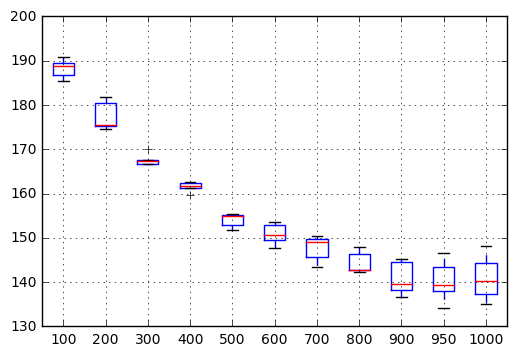

In [112]:
results.boxplot()
plt.savefig('click_LSTM_epoch_XRMSE.png')

As seen above, XRMSE is continuously decreasing upto 900 epochs but shows a slight increase after that. Let's consider for YRMSE below:

In [113]:
def scores(e):
    RMSE_Scores=[]
    Ytest_RMSE_1= [126.19908054424988, 125.29929397588785, 124.51360233967685, 123.28236860335326, 122.14515165728305, 121.06841001223843, 120.052674824899, 119.98836089552714, 119.45271053051128, 119.36620424815044, 119.51041356578938, 118.95784232576793, 118.91596178197406, 118.86385232335168, 118.52915076859661, 118.6015919565464, 118.35678115460435, 118.26287984868765, 118.36165102819015, 118.06871883687592, 118.24843048633183, 118.01738603688699, 117.88618637054488, 118.18340012773581, 117.66209144234033, 117.62942284084717, 117.684513821863, 118.08178087076084, 117.71959474634207, 118.4904798579085, 117.58659321023818, 117.7965620766646, 117.5049944946304, 117.35350355466738, 117.53854432127203, 117.49321150575896, 117.45780681338519, 117.15025923122519, 117.5576602068013, 117.30834919058577, 117.17690816922179, 116.97159456575159, 116.74251118237267, 116.5248529931083, 117.63168317648064, 116.91808517847967, 116.48865882110054, 116.44330306200197, 116.53109105134418, 116.69545007869306, 116.34778086336755, 115.98365406905646, 115.79270364266252, 115.4783883086125, 116.2954216199365, 116.07197630598161, 116.16301215048972, 115.7836192631424, 115.66810891182159, 115.66300360267861, 115.7370814222171, 115.7095759012333, 115.39799782753778, 115.27989255307004, 116.36602017998176, 115.64359303203508, 115.2724071907523, 115.28369921088486, 114.7954279318898, 114.5993330384422, 114.58199190680507, 114.75617625072437, 115.17318482459355, 115.46901203483299, 115.25873432244632, 114.77179724980238, 114.57551385891878, 114.31871972913238, 114.2626274268545, 113.99799183075987, 114.45902024085592, 114.67514353440559, 113.9334540117123, 114.44102421474678, 113.76491959498935, 114.15650255249732, 114.16360549810207, 114.11703786580358, 113.74811353156946, 114.35348588917695, 113.97690589405006, 113.5253770021106, 113.83212159257052, 113.58748290074317, 113.75901864349082, 113.3383268434664, 113.73861077249619, 113.53727251294393, 113.4685717975779, 113.3595444308602, 113.5791304813057, 113.2485545788487, 113.93788321001965, 113.31270994965506, 113.61007671932649, 113.34003540103411, 113.3959616265824, 113.41343276334206, 113.26695184009024, 113.77168605171771, 112.84261383587581, 113.11735499427506, 113.78411698887147, 113.19891905649787, 112.94285750956504, 113.64765799875538, 113.53232361574054, 113.16472367973522, 112.67177627176805, 112.29305936339344, 112.68840184393923, 112.17462048209121, 112.72357001231295, 112.89247866639904, 111.99908698540854, 112.18854614021703, 112.09879355539887, 112.2502605100774, 112.35933303241319, 112.14294008542939, 112.29192955093666, 111.71507301477499, 112.94390408560207, 111.39822730658972, 111.90404942687675, 111.41144832965223, 112.06887651463155, 111.44874814501274, 111.84214860108702, 111.34427356574393, 111.79533134167121, 110.47696421690645, 110.80949581139684, 111.14946862369892, 110.73686467807089, 110.64211560720368, 110.97418121432587, 110.3370165467365, 109.93183606458844, 109.79538328867562, 110.22494199621508, 110.46660673254526, 110.45495604081727, 109.49391119892665, 110.13148577425771, 110.68243492801878, 109.95997672410127, 109.52438425293434, 110.16360050809722, 109.13915958609284, 109.0642130047794, 109.73374730016954, 109.3906719116719, 109.10874845196798, 109.01294860020415, 109.75737102527603, 109.12353501011029, 109.1228488473907, 108.47055373594372, 109.5871413442559, 108.43501061534609, 108.0163191728228, 108.67303346197258, 109.12063398196756, 108.82071528107852, 108.88283499717295, 108.44453691619468, 108.58909441367949, 108.25838301945889, 108.18346241950677, 108.05184577417147, 108.57057346563774, 107.79348481606871, 107.3447700087745, 107.87451510264732, 107.76645943781095, 108.1894629747405, 107.74927178613797, 107.6034263592319, 107.91575848001976, 107.83338360514728, 107.53762839435328, 107.58725641993217, 107.5144728052725, 107.17470305885765, 106.94810438737088, 107.08726769293075, 106.81555920012592, 107.06055961584421, 106.97539042751848, 106.91227347684965, 107.27111779636357, 106.71095688083143, 106.5622725827037, 106.24489492617582, 106.68333364036806, 106.95634448405208, 106.03159695821091, 106.4863227461407, 106.35837115316303, 106.32357686900686, 105.72095438624014, 106.19375568241652, 106.47633052524239, 106.77541429052313, 105.69020059328334, 106.36760632205055, 105.56525156908086, 106.81472403386927, 105.93066491557352, 104.8917834455445, 105.47991676064122, 106.27319881101236, 105.16934291472064, 104.98388585568844, 105.05375832896338, 105.01412046338659, 105.45350073654966, 105.64971745568656, 105.04985183532092, 103.95845394324216, 104.616883653987, 104.67749359014472, 103.58731230474258, 103.69237106348675, 105.22831087642085, 104.8911726310245, 104.26444439380893, 102.92240726213844, 104.37480347997192, 104.11051912509109, 103.83092228794196, 104.23932182899502, 103.76148449932077, 103.4044802992717, 104.17210999256282, 103.37218302314892, 103.06112078657245, 103.58885947002156, 103.3716920665039, 103.08611888359563, 103.96947921514631, 102.29568111747548, 102.94400596158854, 103.35845825490361, 103.14897866613943, 102.55217760809396, 102.4304802517302, 102.87527521129502, 101.72486560948369, 102.35602758747578, 102.94948607323745, 102.93873280610548, 103.01966806584534, 102.73352925821345, 101.88002465142274, 102.87660034138725, 101.96447595277102, 101.7514822557048, 101.92890160219882, 101.60898754879217, 101.58570591350141, 101.77061569115985, 101.16001141124346, 100.50696217078348, 100.55206163528497, 101.39710891443328, 101.34905121689914, 102.5150562936704, 100.6925074186049, 100.06740130423707, 100.76433458221967, 100.42397926843533, 100.2225961812909, 101.12234959623058, 100.07052706059378, 100.43664942093702, 101.25705854456898, 100.97973527126673, 100.77408762141812, 100.2379148998062, 100.59714858540652, 100.98834453706901, 101.49849794362358, 101.11563141720615, 100.45341450234798, 100.88956724381278, 99.7421463414, 100.97413006190835, 100.18841837402212, 100.0966350710874, 99.21193834874808, 98.67293476803945, 100.74886687125775, 99.54246267836011, 98.83761812794314, 99.658415155237, 100.03379924847887, 100.6129166446287, 99.04258911859907, 99.90997423110801, 98.35012650322656, 100.18309213845136, 99.51511380534511, 99.87438312593659, 98.6974904012037, 99.60482773842698, 99.32717843568939, 99.80705233477765, 100.15922355837738, 100.62834980200773, 98.97915856638906, 99.2636209287092, 99.04028896703082, 98.64359670012647, 98.89754452530613, 97.77771644494229, 98.75339916567056, 98.4377768738543, 99.39270519272578, 98.96318995178787, 98.1052807726681, 97.77248926106041, 99.36148139019697, 97.60265875980535, 98.23075639577296, 97.90461317578459, 97.08374683436979, 98.42632949651791, 97.01044423562121, 99.53350892267858, 97.23839595333156, 96.88815541740534, 97.43640399655132, 97.57230629422519, 97.63224565302517, 98.03076570308437, 97.12652587002479, 98.0482910217521, 97.70562262812177, 98.45432606468057, 97.36389944861891, 97.47627619250602, 96.60440397407946, 98.53095599458473, 98.07403175431993, 97.52425765835041, 98.3074780978173, 96.90769971999984, 97.05804097395534, 97.1557554931813, 97.14955398554842, 96.7925892686209, 96.36923513921164, 97.01446707415802, 96.40225151684302, 96.27582317350675, 97.15581121836851, 97.51004091277534, 96.02314816838614, 96.98390808938373, 96.48212687402601, 96.99167571327723, 96.08801180367625, 96.11935604658957, 96.7121728629085, 96.26727104213846, 95.98121999589087, 96.37930010485441, 96.88858786122137, 95.93354225481637, 96.16403820420308, 96.27954561646183, 96.23821231277533, 96.87764270570368, 96.69014363280097, 95.88432540210864, 96.98264583474175, 96.14024112824265, 95.76715440415916, 95.86406345205377, 95.29061441984423, 94.63105403648831, 95.60797118898137, 95.62442412743687, 94.95926989222403, 96.40881818380747, 95.56653193728297, 96.06240013198462, 95.88662688089971, 95.71227235496528, 94.51653543234558, 95.22077465121505, 94.85529130031018, 94.61514802624689, 94.16075388382819, 95.2981884940135, 95.67425311653331, 94.48260171252875, 94.66177306516421, 94.76845136078948, 95.74981437207659, 95.22576564256393, 94.9219722116353, 94.40768553256372, 95.20346330443243, 95.08287634968364, 95.85496334098896, 94.27194856042894, 95.61750559790708, 94.17309130246768, 94.5602273124571, 94.23371865088129, 94.5844310692812, 94.10452640182959, 93.52169871085609, 93.38089208063262, 94.8217020837175, 94.12541271004609, 94.12383807923358, 94.1836574889416, 94.25217185519635, 93.83259007754013, 94.35382253923862, 94.22643960257484, 94.26679064748527, 94.77647108756521, 93.26883405599882, 93.41177713889292, 92.7163820468875, 92.84147883507086, 93.43593492885515, 93.11360410064725, 93.92213654561104, 92.82025254911655, 93.47111681598905, 92.57651577666527, 93.11203141185273, 93.6115557611976, 93.30844129609847, 93.359494414894, 94.0538603117133, 92.99330238829141, 93.29399618546387, 92.86538818715597, 92.16333548084107, 93.49015695855046, 93.26902933523779, 93.16680974830574, 93.51126418664784, 93.76996389002694, 92.40433364107895, 92.57458242866748, 92.80673524158948, 92.21486632000999, 92.42319933627931, 91.25653347291781, 91.54891942907759, 92.0737945320417, 92.21825596455217, 92.76781697085457, 92.72747214939712, 92.8149088716253, 92.22665979027333, 91.85554027303274, 92.02371597722366, 91.64996406732764, 91.92840586052787, 94.17538357058328, 92.47052766295889, 91.8112923556852, 91.97259822889468, 91.40497186665175, 91.61673482496384, 91.79259719507391, 92.28269236019693, 92.57942265437684, 91.44728917709234, 91.10010827723497, 91.54920561378637, 91.71293721377971, 91.4822934247757, 91.38908786051877, 92.14598123983353, 91.7921540390742, 92.34442319351243, 90.96022856900467, 91.19700499963365, 92.38351930482617, 91.04857342351586, 91.74529203286386, 91.29964301966642, 91.10781174431445, 91.10478254046177, 92.17549268357102, 91.16081050002508, 91.56163755328375, 91.35537169950734, 90.84940697898185, 91.30680262933515, 91.0596775751571, 90.79904618611349, 91.81072288053856, 90.50656358158508, 91.91203085569653, 90.70974644564545, 90.9535531604805, 90.78099161063763, 90.96482180455712, 90.34177961048026, 90.70083028759466, 90.10749370542366, 90.4964550000488, 89.97446407748568, 90.53793983475924, 91.01357974601625, 90.60417878032465, 90.71192337486288, 90.42514493424835, 91.38987950307221, 89.47712871263937, 90.13377269465096, 89.84473560309704, 90.58964599210675, 90.06536647557618, 90.23153187236895, 90.59957901596619, 89.53990368772959, 89.43535124244997, 90.09481397062588, 91.11195527040951, 89.80096207630613, 89.58372027746314, 90.08447873782389, 89.75851428531983, 89.22001694503173, 88.77147768258416, 90.66848026698986, 90.27112081107589, 90.22957101439324, 88.97287171178016, 90.74994003827005, 89.14357857393047, 89.4721766864728, 90.36738831108536, 89.8155415569025, 89.82015752310686, 89.27180652685333, 89.72854640729129, 89.06614048678637, 89.56733110620527, 88.8722513151494, 89.0744862046859, 88.62724866224967, 89.6915917355016, 88.70592018030369, 88.62822851210508, 89.84396712098545, 88.97815368522325, 90.88139034079238, 88.10083710616769, 88.84945111306106, 89.08834075461387, 88.58805513008966, 89.75455499814686, 90.11548591049711, 88.73307181516681, 88.29955092578076, 89.28825487349137, 88.62267773643876, 87.96383538654793, 88.37110275214604, 88.72418121228282, 88.54502202862147, 88.24350394067616, 88.88494099161552, 88.94867297368992, 89.03789689546491, 89.13504552518394, 87.89053850765622, 89.2727166223672, 88.81912472044428, 89.05154616967262, 89.62290561441736, 88.09806450979968, 88.2412166146789, 88.40724514863842, 87.86773396555667, 88.26971906885596, 87.97632473735797, 88.68800177167371, 88.25528884063154, 87.9959694804569, 87.8527227230434, 87.9297463466415, 87.42473945382464, 88.62328380353036, 88.77838211778783, 87.84410630875216, 87.64418438369451, 87.73647731271984, 86.94200917907921, 88.09200324152444, 86.79082345327105, 87.53422206366002, 87.38494881700531, 87.6725253212272, 87.97816750930393, 88.22188048134173, 88.3124807432399, 87.117984537483, 87.59385338796474, 87.12212245461536, 86.77905064525217, 86.64500967090638, 87.11212717320076, 87.79610989354694, 87.11465220949466, 87.61976570838551, 86.92906776838227, 86.97063165633041, 87.45465245454288, 87.29550345620623, 87.61376376553467, 87.29604385994384, 87.68641886981138, 87.59009553966617, 87.15846946397856, 87.24186533505339, 88.33974358863775, 88.07224773655348, 87.38811288063215, 87.71370080288406, 86.86868083932346, 87.44419985133048, 86.66399575962222, 86.85517471598983, 87.23998997283785, 87.56681201107052, 87.29064687289839, 86.02994017068245, 86.93678133652367, 88.15993773449149, 87.10838896641364, 86.98277931106865, 86.69489372071548, 86.97249502502368, 86.8290269063961, 86.04611786672419, 87.19824912263562, 86.54552759475239, 88.26921724008932, 87.34825414060384, 87.19483570061668, 86.98259099560619, 87.25735857266214, 86.81540691558702, 87.32503491769286, 87.0045951753469, 87.01847498401007, 88.45938782079963, 86.27461620232285, 86.41715193550425, 86.74050843831266, 86.21162146958102, 86.17338344196031, 87.06624856352093, 86.70166139898035, 86.50124268720798, 87.52478102586316, 87.19854618319229, 86.10651595206765, 86.52790886658474, 86.08045165357098, 85.99945987914099, 85.81639202467974, 86.4813165743964, 86.08225932154568, 86.28809137888517, 85.91874772649429, 86.10134609350648, 85.7985516596886, 85.84803988783895, 86.5059099057716, 86.53969191496668, 86.73527151217134, 86.49780543067095, 88.00335828501137, 86.06917046542709, 85.98288381839637, 85.53697982101082, 86.1782315183882, 85.93652825884477, 86.0764292434039, 86.42836340559286, 86.55908659889676, 86.13055507592829, 86.03481456347092, 86.06600994593427, 86.25016962886755, 84.4683089941966, 85.80905747707028, 85.07052229903931, 85.95249117804629, 85.39991931374344, 85.34278134646549, 85.38415852753965, 86.15129655586948, 86.13792126254327, 85.69355432133007, 85.76144393023391, 85.95206064811167, 85.64022218620559, 85.7497188948236, 85.35364875066, 86.05721225942715, 85.93744301620468, 85.55197659608935, 85.32963284033022, 84.91884516814292, 85.50728584979379, 84.74684858442349, 85.72504814929785, 85.60970125723385, 85.59831490712047, 84.79038207926583, 84.88616522745997, 85.43484764758104, 85.3777537409652, 85.33469995949282, 84.84099224794596, 85.48172696035554, 84.94344318074255, 85.60071527842284, 84.90237219573082, 86.09267219461101, 84.57307777360101, 84.84842939554281, 85.26202743842818, 84.69502694572776, 84.47371221807897, 84.19447490568108, 85.17460360997491, 85.37975651647072, 85.14990737175316, 85.79910224571097, 84.69067267598201, 84.84081824537293, 85.14899596500585, 85.92784345502953, 85.06442382311, 84.77278059059712, 85.28250979151687, 84.65947942901225, 84.48276459051354, 84.57180108469078, 84.66268286052595, 84.27827307627034, 84.84397081918229, 84.01030275216871, 84.72260618524994, 84.82920616898069, 85.19541085063163, 85.05431487027349, 85.324822410491, 84.49893959944369, 84.31945276746696, 84.9437475693298, 84.04963710315839, 85.09001068105412, 84.4403020780682, 85.60406166643865, 84.48543485525789, 85.51230123167237, 84.73179813593624, 83.54186221138343, 83.9592287404748, 83.64688730390037, 83.65781233595182, 84.40354150110119, 83.54683046410933, 85.15177619335759, 84.16090393348364, 83.20138991344892, 84.66323419037607, 83.6235818464403, 83.85746887435093, 83.83424718640963, 83.83491441468708, 84.58240687880514, 83.3992949560418, 84.05923065488042, 83.96645540016516, 83.5897633182915, 83.87714933799654, 84.24269830980532, 83.82674894871113, 83.26227005312354, 83.35284832014749, 83.70009062351461, 83.21348650301692, 84.90121314487084, 83.1040803985612, 83.63587712907328, 83.05885021672395, 83.55429972086456, 83.27190219770912, 83.3601899273178, 83.53350778425865, 85.2111378346932, 84.2926520738977, 84.11197102641125, 84.33837038298866, 84.44918212011646, 83.3869833002269, 83.71551453537685, 85.22550568820901, 84.11557915204114, 83.45456648650442, 84.30594949986435, 83.66511939823766, 83.80347162139765, 85.15060129629545, 83.5590966766084, 83.9988046734288, 83.80363926548198, 82.6330172363844, 83.74415538286536, 82.81424748652388, 83.62387688550689, 83.5099349304894, 82.87897290890231, 83.5054379841404, 83.27168629537351, 84.11940417305905, 83.29914631349779, 83.018618491299, 82.85774681649423, 84.55862716832597, 82.90551172592018, 82.89320948173189, 84.14599125141585, 83.12141844695823, 83.16582662249895, 82.65261270794471, 84.2864628075122, 84.38255907681747, 83.35161166416378, 83.17160120773966, 83.34997189195084, 83.55502951012302, 83.56391687806182, 83.1015705844678, 83.2758754769917, 83.11425991805972, 82.76478145992485, 82.87218540548426, 83.52637750094077, 82.54983180926236, 82.30797339095236, 82.9154016898161, 82.62488769673968, 83.13296172466063, 83.11564374577311, 82.575060754581, 82.85859460040439, 82.89949591454445, 82.56072267350845, 82.36840984499771, 82.57084110192186, 82.59018840173891, 82.57838640485664, 83.49413996726125, 83.19906342480702, 82.26287362787484, 82.78671003602898, 82.92899478821369, 82.38360695876663, 82.4605480183764, 82.23054103856015, 83.49506925005312, 82.32660656035779, 82.88999344296666, 82.38965878189522, 82.37765395461561, 82.47647226492451, 81.88740476042503, 82.0344311072133, 83.15255294913182, 82.11806003740051, 81.67246593298493, 83.06655107607752, 81.60276240032822, 82.47228951915483, 82.38318009363189, 82.39896679964495, 82.03371798576894, 82.45687705386034, 83.88916744874582, 82.58666590236983, 83.18148787894151, 83.29634070435341, 82.59766454034522, 81.77158455057092, 81.6646253818521, 82.46575312380803, 81.9395265703983, 81.86539838903667, 82.87788956517468, 82.15144237354242, 81.99364247225229, 81.97465899807655, 81.90662251298201, 82.55638683175164, 82.19908276878121, 82.18640655688242, 81.96437618995914, 82.5072680098212, 83.17501541748314, 83.05586954674193, 82.56246950861075, 81.85935615430391, 82.78543106278686, 82.63016225744452, 82.05169656145304, 82.21199758704708, 82.2230012670683, 81.74685400145826, 82.08228074557138, 81.9321220445674, 82.11978314972716, 81.63223581200788, 82.02683345945003, 82.4241405202223, 82.15811129079242, 81.84467342986589, 82.0925347341883, 81.15209488151856, 81.82247436840335, 81.758458380055, 81.7316748326345, 81.68415691318089, 81.42504580817763, 81.89473548628375, 81.3487597533134, 81.67938686750014, 81.45070139004166, 81.62456615789763, 81.65852900290449, 81.26815954972629, 82.44270120270043, 81.82366527487054, 81.68104590391633, 81.28617221803339, 81.05907905086326, 81.31231922000916, 81.95110762657495, 82.3794496740028, 80.77819670397929, 81.52697916203483, 81.70657983625446, 81.37030628554467, 80.64819209013324, 81.39686924781057, 81.44703011914459, 81.61435165654844, 81.97656310804159, 81.40932172774492, 81.69191481001586, 81.3940610672346, 81.21867045283265, 81.50726877145787, 81.93337682088492, 80.58002535968048, 81.16612972309838, 80.98030523554641, 81.02817638298642, 79.89648040356113, 81.00789045607377, 81.96501572112275, 80.80465996847143, 81.0647921978529, 81.57222739080252, 81.4284049560479, 80.78887687878468, 80.79505695593762, 81.79281767321746, 81.46132850001963, 81.54753778182354, 82.06104843040987]
    Ytest_RMSE_2= [126.68705198168927, 125.1506483520623, 124.1951216393099, 123.56850919482882, 122.91976289971403, 122.07092335782187, 121.40432308279833, 120.10904005245142, 120.05090443475484, 119.21255624709669, 118.78881313641726, 118.85869926450081, 118.73428745336686, 118.66539547412758, 118.61743393288269, 118.52475977842225, 118.1954575897196, 118.59468995925316, 118.2005715160888, 118.25601790391387, 117.87459643820196, 118.6016801949781, 118.09374116538679, 118.51916410480437, 118.1806056102184, 118.32418784474235, 117.33603332415926, 117.4929335634151, 117.75040321958545, 117.1833143241654, 117.12813854445103, 117.16647315187795, 117.1844601534882, 117.54343172825945, 117.75293451880506, 117.54634306096108, 117.18583846857123, 116.56829640587972, 117.36077812724547, 116.81641143847098, 116.63532430819701, 116.49680087348545, 116.32670028577952, 116.73909059135703, 116.64851408121223, 116.13548247186984, 115.92906426639952, 116.45633404921958, 116.14082469884724, 115.86877135936041, 115.88423114446996, 115.82828242523435, 116.30158224738348, 115.81299337221267, 115.56426606691117, 115.2986187473322, 116.01586196388075, 114.94981880765995, 115.92932804526819, 115.18504881374572, 115.42427098269366, 115.42564676759186, 115.20104874876526, 114.7878339173048, 115.0514565188381, 114.47965053955438, 114.09694952216586, 114.44010795079043, 114.37565012421074, 114.70080303388814, 114.17655321137367, 114.15559057569499, 114.15268540084824, 114.47509743150613, 113.8548946353259, 113.69089084816109, 113.71931144512304, 113.50501493144064, 113.69170549962793, 114.13414015440905, 113.48531038594925, 113.72075142528533, 113.37004345351058, 113.77979079919716, 112.84213354113, 113.48302871566842, 112.97600168728144, 113.1887408479144, 112.68720489042795, 112.6180548588908, 112.78479271627667, 112.85973699702684, 112.6928712179427, 113.03881538166497, 112.80608771663557, 112.61209980181543, 112.74066508550929, 113.12136574118146, 112.36309454425763, 112.0393822317827, 112.04680096674865, 112.51877403750329, 112.42919379154921, 112.20561629626253, 112.31323859841005, 113.32725387772771, 112.83686079937898, 112.28888932177415, 113.34323175774963, 112.503414172146, 111.968718298248, 112.10481538862365, 111.93166970450964, 112.28112475164527, 111.74476781808767, 112.30927191777, 112.14391723596302, 111.91175379599414, 112.41543105708122, 111.07542001494149, 112.07108338653165, 111.45990618257535, 112.59390554912015, 111.45390108038261, 111.42988773105307, 111.09524968766482, 111.66924072243997, 111.44460675098532, 111.17728646500424, 112.0296256210119, 111.03712841029828, 111.19252186463027, 111.72860061789288, 110.90044238328726, 111.01594860681965, 111.3790166674369, 111.22675337229244, 110.79883716445977, 110.95075170557173, 110.74477575617928, 110.78153803157699, 110.69844246274283, 110.69341738893006, 110.71681987788556, 109.81792890095484, 110.77538675216465, 110.25805305473372, 110.17038253602804, 110.3480443121156, 110.31213310422817, 110.14009044734604, 110.53954919059242, 109.78395137636912, 109.96962422200173, 109.69993403202226, 109.90850615559582, 109.61519192190919, 109.333347056563, 109.90039927711956, 109.86979893986747, 110.0594408567853, 109.53405362292506, 109.47365850259247, 109.34885006812009, 109.4962833543985, 109.50043866122918, 109.00437307674444, 109.20322209967095, 109.06202732358943, 108.79207725747929, 108.81831374255677, 109.2189679421392, 109.19312407890516, 109.04814985884266, 108.75242131367604, 107.6651559927048, 108.6777467935157, 107.70252413782782, 108.19463283226872, 107.78673292323498, 107.94482048468177, 108.05123825386168, 107.7270131660295, 108.55015531244749, 107.76266117963286, 108.03038472268267, 107.73122462942975, 107.64036229975193, 107.33439701071596, 106.98564296031864, 106.69550143174872, 106.85353242749271, 107.65184505432329, 106.46625066051988, 106.8002445675488, 106.30737434247904, 106.5500424528973, 107.13585029293073, 106.48155041461266, 106.16450363518298, 107.35489000904501, 106.53561407892337, 106.38265020125132, 106.06367969701161, 106.38162580476148, 106.09323784541242, 105.92513098647002, 106.59989589082613, 106.70852266575423, 105.49830742301823, 105.58496159443176, 106.27157193541454, 105.27887585800497, 105.30508053428096, 105.74795190003411, 105.63409582646312, 104.95194745529126, 105.6719833310784, 105.39091143890569, 104.5545049737249, 104.08300096568735, 105.03817522370392, 104.54547015291178, 104.7583165298012, 103.91765460835609, 104.18898952184759, 104.68208333626036, 104.14088994384683, 103.94655799073831, 104.31490849704655, 103.68915941482209, 104.20911099015598, 103.67975542077573, 103.43533688396802, 103.69562703681555, 103.68617270102837, 104.09572115405574, 103.25394211964701, 103.8195940988828, 104.19394507715869, 103.87967600179775, 103.51366412029253, 103.65698119023322, 103.28295023108927, 103.43554797060479, 102.89537399833482, 103.42505476705665, 103.276648717523, 103.55262810086901, 102.45511186551272, 102.91782795023714, 102.35569568652537, 102.38703736418883, 102.21696106979434, 101.6848128964754, 102.42767719639875, 101.46985628557795, 102.06851641290505, 101.97134854789005, 101.90353512814299, 101.8857790880688, 101.02421015782147, 101.86409333748233, 101.11209707087679, 100.8984442134179, 101.72630104786352, 101.51854780901532, 101.77181989905476, 101.10350960890396, 101.5251423600034, 100.6874406830391, 101.05508821601508, 101.37381269379178, 101.43593045747006, 101.04206173374351, 102.08640602791002, 101.58417211784501, 101.01499430054955, 101.21485746782196, 100.89020833125994, 101.73599911036774, 100.72480000328997, 101.18149198672783, 100.14126370282864, 99.81738669381392, 100.55180205949284, 100.2762843861625, 100.49380541993425, 100.76599316574533, 100.93280763451999, 99.39905076080635, 100.36505900784961, 99.39532856867436, 99.78196768743106, 100.54251663958307, 99.56132998858195, 100.20025414949968, 99.80293540450207, 100.61155747359538, 100.00854528729498, 99.3487430591332, 100.63724584987504, 99.37660059886983, 99.0022115960506, 99.41532908812704, 99.46587417871775, 99.26324174823672, 99.15616699595434, 99.41044787500499, 99.43154885507053, 98.11721853205201, 98.2461254020537, 98.90775945545792, 98.83670513282637, 98.70623625059699, 99.0041242109892, 98.06142882168068, 98.2196016810355, 98.46807409735143, 98.88591006624665, 98.00015735185411, 98.39304769649534, 97.93221530710062, 97.94288326643678, 98.51293428809264, 97.31209370135116, 98.01388863084512, 97.89918173670313, 97.69746578068866, 98.73908572375899, 98.4586392078254, 97.59035398323918, 97.24766916893331, 97.54668365723028, 97.47253059848086, 97.72887784041895, 99.03970264531348, 97.5570306509061, 97.51447640792222, 97.12381929981693, 97.43299880689668, 97.48236296709649, 97.45678685174182, 97.03474316809401, 97.88425317142314, 97.00635774282374, 96.7793581820575, 96.63194300837026, 96.07454072854034, 96.5913360829087, 96.50139687738711, 95.92121349391086, 96.76104304277585, 96.3848279581171, 95.72289383960165, 97.10252892999253, 96.13886331903237, 96.20795582781778, 96.5546404289964, 95.84444073693389, 97.09551549054635, 96.06228676026946, 97.56587146794077, 96.30603246324634, 96.12234572060528, 95.93701615014342, 96.70212857435246, 96.26147546421494, 95.62287370078496, 96.13626210934451, 95.36360865551161, 96.1892054257346, 95.45769227072995, 95.05602180606971, 95.07126757287142, 95.47355451594831, 94.76648224005976, 95.66716426839466, 94.89526941281487, 94.90954925315913, 94.88143765521859, 94.90235394525499, 95.42978807725567, 95.84259811704075, 94.99118719398946, 95.68565489901395, 95.83430339392325, 94.96643419875403, 94.79341462466672, 95.45252873298864, 94.95343689165355, 95.40118684691852, 94.80788605185064, 95.22026035886702, 94.61690322988628, 95.33775797378942, 94.71026736881548, 94.6653221430794, 94.20066458322451, 94.4780730890044, 95.10293636699133, 94.98448240967208, 95.12825499520342, 94.40426772296654, 94.81121447064548, 94.36967670700265, 94.47895343413458, 94.84058339337695, 94.64073946106056, 93.9109138174835, 93.60899936609646, 94.59963168195719, 94.18209901143774, 93.64678884430128, 94.16814978613115, 94.13460124407712, 94.57886514761147, 95.09136027443428, 93.19749306447888, 93.48621342322198, 93.95141740873633, 93.71879485337149, 93.19349457559078, 93.49529571286725, 93.61941113361573, 92.77654154569179, 93.3612897691025, 93.30548775327402, 92.79145680751841, 92.90661131594081, 92.23345556915943, 93.61381692100848, 92.86018559316821, 94.39640328633116, 92.77037843413962, 92.30369811014933, 93.21322907441879, 92.67043653561133, 93.69607147325965, 93.01593079327318, 93.4429672850387, 92.32749760992154, 92.68411912011206, 92.60739496768, 93.55492130574726, 92.45898437318931, 92.55987989912362, 92.2116616875923, 91.85211492796267, 92.28434956224358, 93.64170324334349, 92.75711609810459, 92.46414590584426, 91.72969394443271, 91.83871005046294, 91.86381648472835, 92.87376093414775, 92.68265362322876, 91.59992165910533, 91.24866104428449, 92.68136435373586, 91.83320975254928, 92.15417334356358, 90.97309250592664, 91.31661689434152, 91.35104745381709, 91.4823147378722, 92.05796534446247, 90.89055112127375, 91.44991556288875, 91.94433343954488, 91.04362224591647, 90.98642688178498, 91.52603077402082, 90.83842885902013, 92.41698044222085, 91.48465200816972, 91.79214854903219, 91.79908086982559, 91.52459894796365, 91.42559125532047, 91.85571945111863, 91.6349959427228, 91.81211554146721, 91.64519376253281, 91.81212768172787, 91.188806453102, 90.97742084837523, 91.71799025892291, 90.57899168915571, 91.78133584278694, 91.05954579417293, 91.40268416927196, 91.01513997782621, 91.65217053189714, 91.35639233388646, 91.2894370343324, 91.20315728646824, 90.8577804732, 90.76727665884914, 90.41067259686558, 89.61321995912046, 91.48058148666479, 90.27128520624954, 91.01621900689594, 90.94543893273051, 91.04679645077874, 90.36416108776322, 90.99597523198558, 90.26030837465031, 90.69966869132513, 91.3851742097687, 90.6753289000002, 91.35098105774928, 90.8580488356013, 91.03208160690377, 90.5317343906108, 90.31612669880303, 91.2051890183358, 90.16134471428236, 90.18782804874967, 90.00922701288486, 89.59888983010138, 90.91174371386859, 90.16102555767289, 90.83546942614191, 89.85142664518777, 89.93706152748888, 90.08100135593264, 90.09074253518509, 90.39530872793888, 90.29237411344329, 90.38747201771885, 89.1114127941814, 90.89333802665242, 89.5954340268319, 90.57511255316146, 90.79301671130091, 90.12877333021498, 90.39743814653998, 89.98875479183555, 89.23851641679978, 89.78115079707807, 90.02089323568835, 89.03048241795479, 89.71551043837157, 90.7378475986928, 89.67687670900646, 89.85024984200912, 90.97248632453162, 89.98297628661943, 90.00790167743169, 89.46097166732821, 89.79676681845979, 89.78337739021516, 89.82794714606766, 90.02019941377954, 88.95833246287496, 89.86632437253648, 90.20407011259844, 90.42701000004159, 90.19289017712744, 90.42365902676003, 89.52160158574414, 89.4858745231552, 90.2556493938382, 89.09433682964152, 89.68289242778329, 89.47816416013238, 89.66473941475272, 90.31105146875139, 89.05601507705155, 89.85504979671924, 89.08315818842881, 89.03913225616955, 88.80528894730858, 89.88312841167951, 89.9911049395426, 89.35729424432523, 88.68897110975328, 90.23074553611832, 89.45104057217115, 89.53907527034156, 88.6119285157877, 88.52166174484854, 90.03254940851942, 87.84926627889433, 89.4311549451395, 89.37068246282793, 89.03351100493452, 88.42752631491784, 88.79434228200977, 89.44632476480824, 88.69446141813182, 88.89260329726905, 88.01520476074894, 89.0013918573706, 89.52882243504857, 89.11478541430589, 89.48198979028616, 88.77824832859628, 87.80088492591452, 89.24642566721562, 87.80971491444784, 87.63346938861986, 87.98184749459627, 87.24821124675624, 89.10782311547001, 87.57944806240907, 88.00659732049954, 87.47279857244854, 88.33247666792661, 89.04625056791389, 88.54354882550935, 87.72975568646643, 87.55060791075715, 88.5943367069605, 87.99523014852358, 87.88437714726234, 88.08331787964562, 87.84777507853337, 87.91309264136189, 89.12671325307134, 87.31844611777235, 87.9621176199684, 87.5718776662951, 88.30139041560174, 87.61046992742266, 88.07686088606049, 87.43267531262718, 87.90646777840954, 88.068118556348, 88.45046966508366, 87.85270574728143, 87.80426761315998, 87.82722362235998, 87.75705214871361, 88.49625463751447, 87.49134278753573, 87.44240546726502, 88.04776987303644, 87.85422415386579, 87.06642005044205, 87.90302959581993, 86.7770742329262, 87.1976111777954, 87.21947088918026, 86.81543252839214, 87.39759771965929, 87.22332833120566, 86.88318187403566, 87.3216393705533, 86.84569430207146, 87.71509138304022, 88.31676317894949, 87.05540483601455, 88.61976744013045, 87.382321081109, 88.70945783196234, 87.03210895331065, 87.9946406980015, 87.0788344419661, 87.12849334949554, 87.12823456300268, 88.13731181344134, 87.45438793011485, 86.9773455589246, 87.28870222711834, 87.61166629980684, 87.14436004671232, 87.23976568589401, 86.62267156953895, 86.43242760097816, 87.11839797607664, 87.24117483560488, 86.47623275072557, 86.82260646286501, 87.27573093627694, 87.36899643348167, 87.18686197021995, 86.85718099111793, 86.48562145273284, 86.93439462779921, 86.95917203657122, 87.87677958959192, 86.86257438618244, 86.36446917787481, 86.68644233915809, 87.15273845010213, 86.41170594133536, 86.926342919168, 86.65418759752609, 86.50669424367918, 86.27248938644149, 85.73334889065943, 85.95414190925385, 86.05983506360872, 87.24034538294109, 86.57432574465497, 87.13179965416754, 86.15771101644692, 84.98060944105383, 86.43599481996978, 85.66020084103788, 86.08414157779295, 86.20423748132843, 86.58347806021449, 85.88964085927235, 86.69494696064022, 85.99551611091567, 86.05931298944287, 86.55695587286495, 86.01489695346399, 86.85769296627257, 86.17980158210388, 87.69657448647757, 86.36693120128467, 86.72003108579078, 86.39857384351471, 85.90140614579333, 86.73395744373316, 85.8690927506911, 86.09104297296057, 85.90452559944755, 85.62423346294952, 85.9750227656444, 85.75674436120019, 85.90551209629356, 86.4948351848718, 86.63702123721815, 86.03380570281016, 86.17757852762222, 86.27972243467288, 86.40358740201603, 85.89497978846818, 86.50839262432669, 85.29641761743599, 85.69482938369984, 85.82050588324608, 85.81330541315019, 85.78460294657654, 85.3442464362923, 85.81522162513879, 86.05303814795462, 85.95803992320094, 85.92098302589214, 85.40467533899229, 85.6059715860336, 86.00418193136142, 85.36826387782747, 85.14984508741593, 85.38131637396825, 86.01431886931474, 85.0607523595684, 85.27101408524602, 84.34151447424219, 85.39549406083097, 84.69502289587021, 84.86884006122443, 85.98239199603721, 84.55814191347245, 84.84805552808805, 84.47440184214975, 85.49758166004924, 85.59223465399062, 85.10537671467974, 85.316738597559, 84.87214520147451, 84.26086613550495, 84.85123467658546, 84.96976109958999, 84.99291912435575, 84.50203858191783, 83.92144825236713, 84.73530072075069, 84.92281121657665, 84.76149132439797, 84.91171908439692, 84.51655353954737, 84.75949656609123, 84.14383782368931, 83.60985961792322, 85.51855721754403, 84.23375481375915, 84.84167272773432, 84.46081162682715, 85.36385175621061, 84.77645712186869, 85.33542098556734, 83.87038003809332, 84.53795650688302, 84.06030274931847, 83.93560283488448, 84.44770777524874, 84.52710027388684, 84.3240271989041, 85.20600175163261, 84.25976726880234, 83.81848479416252, 84.02167172839195, 84.2005656378974, 83.91270026335658, 83.36478615879838, 84.07733529125451, 84.02613970917864, 83.72625925462934, 83.4037463353143, 83.99350624051736, 83.99697936327384, 83.8537803034719, 85.53474418469642, 84.35019616340605, 84.54013036613435, 83.95871162774326, 83.9407923670701, 83.99795169772946, 84.32586494411109, 83.77599617104993, 84.25030404648628, 83.61979256507009, 83.73604808830652, 84.0417784732756, 83.78578568282731, 84.41458710757604, 84.5105024934525, 83.50316476073428, 83.94469663909985, 83.4289907214715, 83.90187489530642, 83.9134449554568, 84.78528332307673, 84.22985957423153, 83.2980989948624, 83.28043142172343, 84.05324013951557, 84.38564424225217, 84.00060443491155, 84.2519262952707, 83.66654194387908, 83.88423028319653, 83.83418668139876, 83.76703804140384, 84.05802752528973, 83.88205480019855, 84.22491836698488, 83.37661412178095, 83.80042372644772, 83.21356540034067, 84.00499838475352, 83.46690614003023, 83.49604272365546, 84.12810658470133, 84.07974325547896, 83.38361956051874, 83.6569143995371, 83.34843757069254, 83.47406064200209, 83.43605854326846, 83.5013198039014, 83.25985804368808, 83.13713015119711, 83.36286893904054, 83.7396515968403, 82.89591026471744, 83.40118882831455, 82.66332350674365, 82.04214105736152, 83.44293652742583, 83.46752285677105, 83.61757046293559, 83.7133864465008, 83.83273569962626, 83.43952213122122, 83.17977814784479, 83.7246947020695, 83.15210526599816, 82.99597842185001, 82.54360156288811, 83.06617350397288, 82.34390693513463, 82.77640223386328, 83.14277776075103, 82.63471656690457, 82.55376892035686, 82.5097609656415, 82.64854891829278, 83.09619816773665, 82.54013975757239, 83.75804491197195, 83.50112720763869, 83.02016627026951, 82.35804316161065, 82.46998952327799, 82.61504438499406, 83.26419444761717, 82.61683018715193, 83.10129612054517, 83.54591186306202, 83.28625956360644, 83.04309501466844, 83.28779381777011, 83.40425909074767, 83.10697028282199, 82.43219998116605, 83.39813521655512, 82.56305160503435, 82.77813803345397, 83.23938200254437, 83.07075852036046, 83.18260259795726, 82.90235638535928, 82.55447511241151, 82.52183885952347, 82.35283450685527, 82.5324550648797, 82.15334452061242, 82.65771716740223, 82.48671687648108, 82.23364647973811, 83.14050678792056, 81.64223402232582, 82.33280078603636, 82.28083142647749, 82.20277046844213, 81.981577954342, 81.79999851944459, 82.25089277860646, 82.2141187866628, 81.80788573646979, 82.60533759702314, 81.68733454387954, 82.38067403609594, 82.15325341868534, 81.9491504558944, 82.1653415927642, 81.54753308814644, 81.70127522413668, 82.04430316110101, 82.25500247391089, 83.37420512902334, 82.39310197090708, 81.81453650958207, 82.53917948093077, 81.64554865746452, 82.17205749511129, 80.9483609582501, 81.50915314258741, 81.44016193464924, 82.59022194404604, 82.4037543005177, 83.23157869386309, 81.4609036149659, 81.97699786936948, 82.46793378094864, 81.5584777396002, 81.99258551154564, 83.16021464506316, 82.74262920522345, 82.23838581260277, 81.9914603184865, 82.81320686842169, 82.6273625508002, 82.78425732492089, 81.9762066562303, 81.984901423148, 81.77331461103373, 82.16721522161046, 81.59637478358223, 81.37478240394267, 81.48746332271234, 81.43953117730807, 81.28259089970655, 81.7513508634369, 82.06545353307315, 82.31327897264728, 81.78009729575291, 81.28781379415167, 80.59651933935653, 82.28374635916899, 81.76707972531958, 81.97590762871972, 81.30832360032713, 81.49097094131315, 82.06286110146748, 81.69897539777338, 81.8572492565548, 81.25065797648725, 81.14178464209132, 80.83038189122288, 80.54319056650162, 81.04848991732077, 81.00986826043085, 80.94692910271434, 80.72017047095456, 81.38574353963637, 81.45219078388448, 81.55351491286432, 81.55483215229185, 81.20236379781164, 80.95789613536044]
    Ytest_RMSE_3= [130.51289972052675, 125.71612674830257, 124.05070162247196, 122.630563456835, 121.44300106179342, 120.33108211854638, 119.65724764371853, 118.6886657021905, 118.2396251282163, 118.09828860364043, 117.90137225388064, 117.99172274652811, 117.54621720067044, 117.3074560546575, 117.45163709335841, 117.18970787489164, 116.99077667237906, 116.71896956379886, 116.5546601025883, 116.2309756362577, 115.82081304582204, 115.79171326264512, 115.96683857421438, 115.70153132321819, 115.68114803753686, 115.23898822878859, 115.30621838470785, 115.46918042741879, 115.29954718217157, 115.37645605010414, 115.30340861088892, 115.06562570974954, 115.00942978231677, 114.82425533903258, 114.5685927604173, 114.84401864349759, 114.39226026229103, 114.37360399869704, 114.30392757542805, 114.44660688538326, 114.12990773166595, 114.10938647445633, 113.78400212607042, 113.54347239663184, 113.89675339129259, 113.49228697910408, 113.41605531967414, 113.22613769570047, 113.47654480649474, 112.4979065918225, 112.94255865559661, 112.15778404738322, 112.72058928044913, 112.21437434581986, 112.17739284523627, 111.95300908296785, 112.02291974048211, 112.2386734247451, 111.64834291079893, 111.5293015206219, 111.10982013506339, 111.56663698538576, 111.2384446574058, 111.43597055807987, 111.341730496996, 110.83793949998238, 111.00399226966137, 110.73781363934594, 110.64280842096504, 110.57101030781818, 110.63747226294716, 110.23215128743396, 110.2754337683132, 110.31437980670691, 110.05988374779794, 110.33966406083346, 110.48007732102309, 110.58488895771437, 109.90684734006119, 110.78166719303292, 109.87045410557347, 109.76593235067482, 109.66402246611273, 109.8939006873371, 109.64157102648309, 109.55601495354746, 109.22734589573946, 109.9672123075595, 109.37615693047233, 108.9767860507155, 108.90668934466055, 109.25708204786942, 109.1967855933885, 109.16003396264814, 108.78867219596539, 108.91559488996423, 108.89291738535012, 108.53892915764371, 108.90936546976013, 108.52433341386337, 108.8875279052756, 108.60481006350243, 108.22503138740691, 108.41179845060057, 108.20326125645529, 107.7531333622444, 108.03522667884424, 108.02808671310464, 107.97028651119051, 108.0289983077659, 107.67443071044882, 107.69221457442272, 107.84103345793585, 108.04927093864688, 107.71621343590178, 107.38082787420902, 107.75339738988471, 107.41474393044571, 107.70890636232338, 107.29736923934637, 107.46298890826738, 107.93071263502426, 107.4870673167728, 107.11287113388177, 107.22835677560175, 107.04105914708805, 107.14205314051728, 107.11397723316232, 106.96513939035461, 106.88575379064471, 106.99614545560371, 106.80811666280425, 106.54126399829195, 106.6369278128398, 106.75272330380136, 106.83354948408333, 106.8862645688865, 106.50023485179463, 106.96983596883872, 106.37416863570994, 106.08604831812723, 106.26165745673032, 106.54023459082948, 106.18201226980283, 106.34188389353514, 106.2723404242086, 106.34182667760976, 106.00917676976046, 105.90495647948146, 106.05429781829444, 106.34669902499478, 105.8500828059886, 106.33080147893365, 105.40189254570662, 105.74142295311385, 106.38844837832484, 105.64245261672359, 105.85249120035664, 105.87883965679531, 105.99549472442699, 106.13133142713029, 105.84694151190764, 105.68278887144405, 105.48750848940291, 105.1363366194472, 105.88997114189763, 105.19958871744224, 105.23908395967308, 105.42320779160423, 105.28831091891861, 105.55994600802478, 104.93964131797848, 105.38986499244365, 104.87831871267583, 104.81883745178435, 104.96911530760687, 105.15945832128327, 104.82435987856651, 104.42561633870083, 105.21962218626679, 104.334394539918, 104.49397730273854, 103.79380548988121, 104.29092914007796, 104.347141139898, 104.32129275831483, 104.21051351217156, 104.15730311970152, 104.296104040389, 104.14257942915678, 104.34865121879848, 103.81598897278276, 103.53726429151028, 103.74949187727789, 103.53610942543293, 103.70207821303983, 103.6072237131117, 103.38769547706474, 103.4137147449991, 103.36352794576517, 103.46477601072492, 103.59066488288947, 102.53733597396503, 102.60640809139682, 102.80862520493343, 102.61677843003775, 102.96927177637455, 102.96985093719529, 102.299389303253, 101.9487984750042, 102.56564569545087, 101.8917423667465, 102.62537810211722, 101.88891243279055, 102.44347076669528, 102.78555841911455, 102.12082082657635, 102.29207791593021, 101.02743449694408, 101.81891920712513, 101.69183806387699, 101.66365431370942, 101.69383139996033, 101.46016691970854, 101.66234555896813, 101.52476635936894, 102.14410816328467, 101.01913035537336, 101.92470810781346, 101.36907873074938, 101.0216478298257, 101.43092465221125, 101.25495121499345, 100.9687519762051, 100.8276034083085, 101.42934430729748, 101.17661288401976, 100.32319174539606, 100.86554478119022, 100.66040940646823, 100.46938109401266, 100.81483679441246, 100.16195901863057, 100.44277481544923, 100.50700991193938, 101.13793803687568, 100.80847112496889, 100.83781748681922, 100.21946595825314, 100.4020437381965, 100.06324548203804, 101.18545900258806, 100.43834560700205, 100.59597487124995, 100.16733312430837, 100.38510324481285, 99.55383504582244, 100.41467134918406, 100.36023495130631, 100.03710643319813, 100.46925408009709, 99.38397110581465, 99.19476443994816, 99.2106549730703, 99.3744532885078, 99.39179566963986, 99.5674785070354, 98.83051221490052, 99.05923447688602, 98.93128149456008, 99.02458637581556, 99.19387384325012, 99.22521685861427, 99.5420888395283, 98.95738494166787, 99.46283317615313, 99.66267155034097, 98.45410884085877, 98.815715789968, 98.52873371060608, 98.67848965939938, 98.27410569148496, 99.38690963142936, 98.92032261399696, 98.27140698757948, 97.84624517794698, 98.33017104970924, 97.97415242870622, 98.53468133572753, 98.14252785894114, 97.91354106792106, 98.17827917543649, 97.24849310236507, 98.00652714672795, 97.63320380340045, 97.84855781870141, 97.87403054022974, 97.1691774778405, 97.61343577248918, 97.51109921121214, 96.93364739984588, 97.72053767705003, 96.97335819978032, 96.40087229146044, 97.5929317583914, 97.62153478533143, 96.98545563282038, 97.95057672542926, 97.18807245553901, 97.51436130498156, 97.11254084048804, 97.53230566151339, 97.11051473794095, 96.96409365762231, 96.6408241527657, 96.52417539780902, 96.49650455133248, 96.03460743449614, 96.45759835492395, 95.55482566408783, 96.69543249180516, 97.27385016665284, 96.86227077436185, 96.69174312675928, 97.13952166022281, 97.2755905746882, 96.25929732495764, 96.39933255273455, 96.25002141734808, 95.50959552319932, 96.21016827593448, 96.11736970262082, 96.04708924350251, 96.2907622355528, 96.21664459417532, 95.64479446147965, 96.3551813931477, 95.59943847338037, 96.07143741697168, 95.82119563025205, 96.5232263653406, 95.49766108242277, 96.11874868979262, 95.11322431712246, 95.95829211454947, 96.18483001189873, 95.40987384816826, 95.38906680161662, 95.38374227338791, 95.29070754705602, 95.53044698408118, 94.77338958958741, 95.31468180488882, 94.85834219103832, 95.65187352243886, 94.4847938232001, 95.02951683590304, 94.69350887684274, 94.94221544410253, 94.64232922629841, 94.73988455833025, 94.06352040634691, 94.19324754182574, 94.10706785014645, 94.87256959541004, 93.91314284511067, 94.74175892941786, 95.28142766294381, 94.1669820710488, 94.57775931961929, 94.91424887787667, 93.81835098052133, 94.20008917542367, 94.16061822931462, 94.8499602872684, 93.43397055175642, 93.9844932094424, 93.70580520772346, 93.59974848319426, 92.90805939878393, 94.16247391371564, 94.41677666527747, 93.99234779241279, 93.8779471816887, 93.55574380814986, 94.25119220970534, 94.23654679198171, 95.16105664763413, 94.1388057778604, 93.88452261620232, 93.57033271638186, 94.14060390293203, 92.82823222184467, 94.14809674909911, 93.39456785913922, 93.9901547189239, 93.71095115974867, 92.75643383518629, 93.59212793809492, 93.14136236283566, 93.56279047864213, 93.33204937490808, 92.91047792447091, 92.98476183649956, 92.93214079799813, 92.95022004570822, 91.98492604871566, 93.01789705831438, 92.16538626891183, 92.28059397978411, 92.19715450553832, 92.69933461222038, 91.8805958653211, 92.04598318003248, 92.84356802780846, 92.33237903427539, 93.14061335561273, 92.04165662222307, 91.83619038661911, 92.21726846704075, 91.7505086517044, 91.88267783202184, 92.53142610610382, 91.872132434641, 91.91999156087202, 91.60997715591202, 92.13198668037172, 92.44681722055522, 91.83874214735484, 92.09999759890484, 92.21431050632873, 92.34372031421101, 92.63433675969252, 91.68205117614542, 91.95907195402096, 91.17418429830654, 91.94085650148865, 91.26865567296728, 90.51993520378271, 90.57710921655807, 90.635411064335, 91.94708415547694, 91.3569822720347, 91.75149756050088, 91.20794228335393, 91.32342722276285, 91.27394702865578, 91.37945624589086, 91.76729367178194, 91.65758255578696, 90.96364810607992, 90.9164930277975, 91.18324049544565, 91.9005537747611, 91.28171271109699, 90.93531072480559, 90.786471994053, 90.8700853668348, 91.15907164724123, 90.87499431082517, 90.90722349674577, 91.10694665721115, 90.97883664115423, 90.970106275872, 90.68424448427501, 90.74046396588417, 90.80195981083219, 91.13245196040072, 90.91380563706844, 91.07262337885282, 89.77659800020488, 90.91423342292926, 90.67155561655926, 90.57571141047397, 90.35803608401254, 90.45274923921721, 90.62422676008435, 90.36078142080443, 90.91234911152135, 90.04881726357549, 90.29104907492129, 89.67504013963526, 90.89779869132093, 90.55301521819351, 89.59597318576927, 90.01636236486861, 90.01065478363685, 90.77434260666182, 90.05477218238084, 90.20375691128261, 90.51483581662633, 89.90186072151246, 90.93989666707796, 90.72170955570536, 90.11849477802068, 90.97986964337406, 89.87229020738005, 89.33334770209763, 90.29733309379424, 90.01410987696653, 89.42420741208919, 89.23003496633801, 89.61833324076198, 90.18987821883248, 89.38831443528622, 89.31380875389272, 89.85181650259467, 89.31331554315156, 89.94474138892261, 90.15829568932907, 89.96895908380286, 90.0721885990227, 90.8159092745322, 89.319861358495, 89.38274040758009, 89.51210466142679, 89.39679590380265, 89.56269103305875, 89.19814130691786, 89.58161342396166, 89.55791521354108, 89.38562792029401, 90.26514554264298, 90.06595581709581, 89.7012376275719, 89.80684490292516, 89.15396842147634, 89.3871217456527, 89.65752938399558, 89.67123322694341, 89.14765378885942, 89.02985410979642, 88.7046680759102, 89.64503929079014, 88.6959654514784, 88.81871901402157, 89.05165389673459, 89.22629289049164, 88.63386574499991, 89.46350279066222, 89.1746906350109, 89.09789746257478, 89.24234032099558, 89.17543961934868, 89.02342718751449, 89.86871433777064, 89.59623904264845, 88.93400703449998, 88.7653484317494, 89.1765462582327, 89.69555698418894, 88.69670074203236, 88.77268260129726, 88.90714676634069, 88.9613849928251, 89.35548249753353, 88.21232337615051, 89.04167159718686, 88.13330194792725, 88.65566107433357, 89.27446680049542, 89.60840596186269, 88.8023763367755, 89.66700984310395, 89.37598551338061, 88.14706340131525, 88.35354614590177, 89.42211963475461, 88.21929501006696, 88.31743351139008, 89.70738449207722, 88.11046952848119, 88.19831889310288, 88.43752381757659, 88.64693525302718, 88.50244138552196, 88.98368725526906, 88.80988283619924, 88.93662358485741, 88.57266883328724, 89.38502533534118, 89.33484085787708, 88.46410951531895, 88.62947857498385, 88.09043620657488, 87.72684367707984, 88.01178868603618, 87.65846791343569, 87.75015026105476, 88.5904036124922, 87.90537520507169, 88.6373803098673, 89.02297122307579, 88.65272287818087, 87.92800390651801, 88.27920607219748, 86.85646970136078, 87.16638867462174, 87.98151826963617, 88.49823538120137, 87.86041492124026, 88.0475252208547, 88.53206958341528, 88.58429077629845, 87.83029443175641, 88.53161079370354, 88.1817130925825, 87.90663628462907, 87.59938117349363, 87.56965974267872, 88.10236917890387, 88.30980865910014, 87.72438751288333, 88.39235786413256, 87.77270810948744, 88.14559503371659, 88.29554260522873, 87.1951592942513, 88.16137723939237, 87.73164819497431, 88.38372419308415, 87.52753602308232, 87.61143491806108, 87.86384771919963, 86.87643239856656, 86.89354331224003, 87.5888422067929, 87.31913487622816, 87.53142752591792, 87.70942397970676, 87.45394344361125, 87.73507557478885, 87.12823678539873, 87.50941955074731, 87.4580421921085, 87.47668596026026, 87.68360350758134, 87.52371147936645, 87.51896284983427, 87.9811861620274, 87.04426499739886, 86.65498759443517, 87.9108815568321, 87.52417742325973, 87.48271982765719, 87.39867271021994, 87.37191689261412, 87.10368162011758, 87.22105713850311, 86.51591246446887, 87.26233643029809, 88.59484771376643, 87.3616441852638, 87.02300010966958, 87.66349856561216, 86.9946595521993, 86.95372951688907, 86.42294709377215, 87.04301069117875, 86.98524138751537, 86.82367942476104, 87.15445550873123, 86.84299473051587, 87.70555274534271, 86.75801018347694, 87.50453337942835, 86.61704527224144, 86.80820344262776, 87.24172795813627, 86.73644063952828, 86.53729613207094, 86.4258778814119, 87.25950057010616, 86.5889821012566, 87.13159920880275, 86.83247246808823, 87.08350768340028, 87.3402889037404, 86.88114019729123, 87.09302269225402, 86.8472239546912, 86.5384580271865, 86.49584301833018, 86.32387992143781, 86.72420904182799, 86.71164941281995, 86.72677293937805, 86.83549124843464, 86.57392870363884, 87.10257079220887, 86.8074536911001, 87.12632774757748, 86.35180902058677, 86.9633270009051, 86.60006408421346, 86.19151744494047, 86.73830698957944, 85.74197304997736, 86.10037187835208, 86.22022055936858, 85.89071132260233, 86.83966983128157, 86.23481077264115, 86.9225900769102, 85.79029629156751, 86.69338799953029, 86.07244192966002, 86.17798572221884, 87.0101368318753, 87.69526263311027, 86.24128622191492, 86.58916537136055, 85.96475855992175, 86.54336805434804, 85.66644088375881, 86.0840139651467, 86.07598611005078, 85.53431352363933, 86.2583088855898, 85.75387566230633, 86.130225903705, 86.18178825199028, 85.921055094616, 85.53139796700555, 85.90498545953045, 87.44806319371912, 86.63760895234292, 86.91940198090171, 85.74514532743756, 86.35762123099022, 85.89302674553812, 85.5582207518601, 85.78422977717777, 85.89874018764554, 86.86280457499164, 85.4552726477332, 86.31809040108301, 86.44087489151528, 87.0381343424169, 85.14604958585404, 85.66443614644227, 85.54144406162102, 85.84375060152121, 86.19461483925932, 85.03904219612848, 85.80730690665509, 85.14933526798384, 85.72413275747311, 85.82554924651753, 85.97425235320426, 85.42424736686782, 85.37406699988436, 86.24097135077913, 86.15072064805769, 85.11391355981078, 85.61372381867146, 85.50267106013689, 86.46889875691092, 85.72788762548983, 86.27134197353972, 85.80770509308488, 85.30645404458676, 86.82947205412717, 85.50044412336904, 85.53333225864135, 85.50399616975592, 86.10704834315577, 85.8170987725736, 85.75704282525406, 84.82478928073515, 84.84741048567153, 86.06366773040524, 85.85161503403826, 85.80470514684217, 85.5471538821112, 84.59307224478324, 85.86973150471141, 84.68730056838776, 85.90706348924924, 86.43784868765647, 85.92312065222518, 85.71896724436837, 85.99050532096936, 85.4032213806751, 87.10654696080992, 85.29259949125984, 85.40536986298426, 85.08773973903624, 84.74460606720083, 84.74964556577713, 85.75206572926356, 84.88663770344186, 85.75538878232385, 84.47009274648029, 85.17884680705812, 85.65425135498305, 85.0625722720198, 84.75274771224494, 86.27012389177493, 85.99679667246753, 85.64282201519838, 85.36433478502563, 85.64539217678099, 86.77405909938702, 85.76770183190382, 85.25344879864522, 85.26301706886802, 84.92012047552888, 85.56963033440826, 85.66699000424862, 84.91070210975948, 85.5250422622011, 85.37102823791032, 84.75722828468473, 85.8381197932818, 85.78159070931382, 85.38674227244617, 85.5609185378824, 85.28193114642313, 85.12840244010884, 84.81961535126896, 85.2587896392973, 86.0333416783395, 86.04822100168303, 85.8397749994769, 84.60250132614073, 85.47621145324086, 85.69840126339744, 85.38188491065634, 84.63042987805419, 85.86103415546448, 84.62604267579538, 84.68937154050128, 85.41618867246139, 86.12518678343149, 85.52517403036313, 84.8493832721469, 85.21896917277886, 85.84590462008931, 85.86344143224072, 85.34097201430673, 86.33080744494569, 84.5997639354718, 85.3807922671339, 85.16242648887291, 85.86233370137927, 85.1501646945325, 85.57890045638706, 85.61260271673356, 85.64848278882936, 85.77591187986432, 85.35757602893277, 85.04101704787628, 85.45817623571409, 86.73797540808799, 85.81483546942286, 85.71366390685341, 84.89839454739865, 85.11817430144492, 85.18238901245633, 85.8574879628436, 85.2079770530798, 85.71203704139486, 86.5861173483573, 85.23523135549205, 85.29765870280967, 85.27488187123699, 86.00538783121434, 85.10764615067605, 85.37849399959576, 84.82621080890164, 85.75929004347357, 85.86469371597302, 85.20389846731639, 85.83686131378731, 85.56028539911104, 85.1242871831835, 85.83506325514833, 84.954432404091, 86.16828374875436, 86.08665465347457, 85.87397229471433, 86.57503685915866, 85.88854109394912, 85.60171238168562, 85.77206026054128, 85.89312152953303, 86.05116777472892, 85.26721020371176, 85.52197418140572, 86.1933196792116, 86.2658003246299, 85.52592956987908, 85.46516669041517, 85.35217818725836, 85.3246830099659, 86.32032953270388, 85.69578100153046, 86.03883697639705, 85.6676876146618, 85.79469449722762, 85.44465997494892, 84.8021465327892, 84.8410921082142, 85.6123442339958, 85.00108436408806, 86.31521088955472, 85.06487817517434, 85.61236298301596, 86.40762240619385, 85.45358378931712, 85.64064477903143, 86.24002786967591, 85.3561565089901, 85.44913892181359, 85.16030476029437, 85.48055008460177, 85.0709457456292, 86.01342149318724, 85.34452917051081, 85.2602085711451, 85.75422289926397, 85.18720591769163, 84.7921532689247, 85.47264999674373, 85.29472990238018, 85.41394236597894, 85.30405396113424, 85.83906332667316, 85.09427445255388, 85.44769292129912, 84.56568679123073, 85.72019469575442, 85.57665172007228, 84.82182296402623, 84.62607411755944, 84.64707899425333, 84.6862932169503, 85.4989714569304, 85.59225984537974, 85.0362392163276, 85.51274729001604, 84.98392161677879, 85.9722620836222, 85.4199436336211, 85.21484416055621, 86.1151907722135, 85.35684256782885, 85.06803066259076, 85.83122742256847, 84.74559845791958, 85.39443425000172, 85.11532752184064, 85.36328561559077, 85.23823696847792, 85.02494974334822, 84.7803788787142, 84.78047004642136, 85.0662051694107, 84.21654833097597, 84.99660805816518, 84.3445251115383, 85.0194870633181, 84.35251003933435, 84.00523612334658, 85.43070906516728, 85.43085058258632, 84.80666333435076, 85.5850918671926, 84.75715376722341, 85.30325613154555, 84.67659134194656, 85.00255105969032, 85.27604905576037, 85.24814240029676, 85.05288180950176, 85.34374846900259, 84.92439430255202, 84.3797553814695, 85.20405216461995, 84.83311673229184, 84.49904557121276, 84.39432866902185, 85.14082743595539, 84.62769517627513, 84.88965914222932, 85.0033620022671, 84.66928571430236, 85.46557169695902, 84.19903526406745, 84.55817265151094, 84.91448652869036, 85.74829178470699, 85.19669114641464, 84.32377039948217, 84.25535581168204, 84.3537659497314, 84.40148308744432, 84.99312788325787, 85.23770108178455]
    Ytest_RMSE_4= [129.13616580217095, 124.74752898789963, 123.03360782121412, 122.03832627362621, 121.17897762204989, 120.18086977287744, 119.01069693439085, 118.46482014143899, 118.11217422877485, 117.72988752364674, 117.8217026660284, 117.18508354344024, 117.2954122823399, 117.37700766603393, 116.92124026196623, 116.72249413243169, 116.66380331290823, 116.63180918288153, 116.21765384734886, 116.4988633171108, 116.33535362001129, 115.95017696817453, 115.8231302888954, 115.60545646140528, 115.67710576692066, 115.80476281186496, 115.94548938817414, 116.30206452669793, 115.34930858105287, 115.371592761459, 115.09519043915407, 114.9648706788114, 115.1942075375159, 115.29112149062009, 114.9475789071179, 114.7472125993991, 114.59085746240929, 114.66071125385959, 114.43791004465389, 114.30311124214995, 114.44604557370134, 114.37082651512813, 114.27492569516227, 114.04315254433804, 113.92206927705469, 113.64549737206869, 113.46135267980448, 113.55373328712427, 113.36478909822827, 113.33735592488671, 113.71523018532928, 113.09077173828724, 113.13595619970722, 112.73773959645816, 112.71327700513345, 112.61988038920325, 112.55564235805592, 112.23885873598933, 112.23633683396635, 112.2666645065064, 112.42852637349498, 111.98462119190681, 111.56839744702715, 111.53060084189968, 111.78201166478732, 111.82355272162367, 111.41421805516347, 111.62103914871852, 111.68669574240549, 111.4699413744612, 111.0909718992502, 111.1256081519719, 111.16251491712195, 111.03116266597813, 111.21497596702883, 110.81397417022188, 110.85312674016292, 110.55437456004101, 110.42936315568458, 110.33601464010142, 110.50303747720162, 110.42583160364599, 110.204388322076, 110.2140906477988, 110.31138322773596, 110.26951587202457, 110.21118095962056, 110.0028821734823, 109.8321061423369, 110.10678302118399, 110.19743269723199, 109.96142517747242, 109.6979629843436, 109.94179898374175, 109.84530675893402, 109.62452986953619, 109.3595995514385, 109.55552941612842, 109.37800951780157, 109.1250724904316, 109.46013535154613, 109.69704602240812, 108.78841062094023, 109.02160905652441, 109.06522200749859, 108.82169069103081, 109.0460600823994, 108.77579216732192, 109.1011703590624, 108.65981790711139, 108.77439849798124, 108.91424791376389, 108.62585083349909, 108.88013949072067, 108.8707177888301, 108.70598049465157, 108.3835506300666, 108.39563056033295, 108.34234049960911, 108.30079160289891, 107.82846032350749, 108.17272804833878, 108.19619278593439, 108.35330357758298, 107.94334243571338, 107.95712534653151, 107.63658433793638, 107.40266771721653, 107.70659797175105, 107.92493640237718, 108.33095999951243, 107.3275450761205, 107.41311800618513, 106.98303087145749, 107.0105753313313, 106.94916700369726, 106.8542684720957, 107.03878857516622, 106.95533175257745, 106.955480363905, 106.32011889528528, 106.28584647666749, 106.49398597626273, 106.47011289417539, 106.21668595922299, 106.03485206008764, 106.19739551024959, 106.32455722030898, 106.18185381884486, 105.55550323179006, 105.55927755081012, 106.24920873549412, 105.87651816981558, 105.46446152228901, 105.48776056003689, 105.46064445586823, 105.6880185951179, 105.17594888925709, 105.14877455798978, 104.91708253254345, 104.79673361643536, 105.13262238550922, 104.84912331387453, 104.73229251236208, 104.67066539125783, 104.84876919687932, 103.87886909036995, 104.7261275666822, 104.34108162928626, 104.05178897232263, 104.15460783608863, 104.58051969546405, 104.4170269975218, 104.12431284503143, 104.04257549169655, 104.01437056167272, 103.95557474019239, 103.78058557312715, 103.99269237489547, 104.35624293410157, 103.7885718101328, 103.60695994929266, 103.82562338416552, 104.46442374915873, 103.79000709866237, 103.66676929728554, 103.93274144787546, 103.50676540890323, 103.88190208746292, 103.35614151940177, 104.09604739513723, 103.83038408621658, 104.32498328116277, 103.84010664635791, 103.325490379643, 103.46393417998839, 103.03386383909582, 103.0019137662622, 103.79091039776222, 103.43870202175233, 103.15379823219811, 102.86048561235245, 103.0541089108897, 102.31148533215517, 102.85637177637908, 103.39742846943248, 103.03671465731792, 103.08081460897505, 102.74404935183117, 102.57477113999397, 102.42798056652383, 103.12287596519461, 102.75637946990885, 103.19231308788463, 102.7195839962473, 101.91077920162357, 102.05123108631304, 101.97229210575367, 102.2595381937174, 101.85921960759565, 102.27732663025567, 101.59352117733314, 101.50641242478643, 101.69456552944762, 102.4596649048506, 102.13985498509744, 101.38494974097176, 101.81408964841678, 101.72566322113589, 101.69819555117486, 101.48859346357165, 101.29923443719612, 101.10014231971249, 101.55937900483744, 101.35343760725397, 101.4175051341168, 101.38761838091158, 100.91510205138779, 101.05592990103489, 100.78279951646927, 101.59087432776981, 101.23935321910092, 101.33030077955549, 100.75817962428039, 101.18726880792163, 101.00014730550505, 100.79157437803786, 100.91009449070626, 100.38135422449105, 100.67658071933562, 101.0545206789974, 100.37021730816016, 100.07921337675907, 99.91868273232264, 100.10281737600329, 100.57923445372515, 100.71840559470286, 100.2391665207127, 100.76361192254316, 100.43246663975437, 99.83910396063199, 100.41988387579664, 100.35340156419164, 100.59115915103011, 101.15794880325068, 99.68079042007821, 100.81437811463087, 100.25996985224117, 100.27735555488636, 100.2783433383861, 98.98844834435629, 99.93021865432998, 99.18809575511924, 99.2589190805552, 100.2395232013218, 100.51780100965927, 99.94050862712288, 99.43834536642821, 100.04999186039542, 99.67487178710208, 99.64916275845117, 99.15082298625248, 98.80054624198577, 99.30490191220277, 99.63075224146344, 98.86312902125258, 98.66800018336694, 99.58091982719768, 98.86102194859511, 98.82724431416823, 98.05026044752499, 98.99748731496575, 98.0329367408667, 98.78858151863005, 98.5130387794964, 98.12306644730812, 98.75398971714661, 98.12612211350576, 98.8445562576475, 97.9897051135961, 98.82443921604148, 97.7538343121914, 98.24449659573537, 98.03052548812664, 98.29917563755845, 97.94639599934278, 98.40533958024183, 97.94312378814067, 97.96065023520859, 98.25710012917892, 97.91405540854214, 98.45256847739203, 97.88010490420174, 97.53850198547819, 98.3527624152998, 97.98096968834867, 96.7372769049047, 98.0836205844744, 97.68553973741432, 97.35780245625708, 97.35233663942661, 97.79504744076203, 97.449510825951, 97.30446134743896, 97.33157975037197, 97.21213771086595, 97.93846236171551, 97.1126119350316, 97.53131083339113, 97.69272685447632, 97.1230021542806, 97.4419409225789, 97.24965794208924, 97.17865224868606, 96.98766206055464, 96.97986242844638, 97.38467954901148, 96.57737748055186, 95.94833864313554, 96.51567920830642, 96.51448432233383, 95.8219937596879, 96.01602131885858, 95.76293761417988, 95.11772998088294, 96.37631151950717, 96.29530465173436, 95.99786718365931, 95.67570962930216, 96.59625865131973, 96.9508518913427, 95.46172485365268, 95.70175771532082, 96.61975380208382, 95.85589475539798, 96.54763238815706, 95.76986689776432, 96.16130168542938, 95.14720845698376, 95.19534764178871, 95.8944703438861, 95.96039379142354, 96.39125151535013, 96.67364853049958, 96.53162912749437, 95.9788319829876, 96.45105525737766, 95.28842244184084, 94.80742066345647, 96.12120395443407, 95.47808670437277, 96.46114129115779, 96.54673853448688, 96.15159424448741, 95.03753215554146, 94.55234274289865, 94.59558005435585, 94.72586940105072, 95.1948145957202, 94.86240712610415, 95.29879233117322, 95.2103569086588, 95.04661921677022, 95.13873378421971, 94.79027887916898, 93.95530775943544, 94.18217447427286, 95.11409869287026, 94.837385637108, 94.11345360720794, 94.51769063195357, 94.55057851842716, 94.07420964901078, 95.05947397257648, 95.17422048695497, 94.18598008062025, 94.1905021041155, 93.89721525418139, 93.54608836573397, 95.03283935828216, 94.01176360779844, 94.25973641572101, 94.2728012020219, 94.54442353313641, 94.52239850602392, 95.18202591843036, 94.2633322772664, 94.3278294084797, 93.63812907953627, 93.05158997074048, 93.86586668972735, 94.37288770879621, 94.0631767515827, 94.36013694739093, 94.03220226484132, 94.8456527381982, 94.02595492360958, 94.5320664711192, 94.18064652818268, 93.67998001807001, 93.88324425333438, 93.5487465461099, 93.66800183051467, 94.73563664622489, 93.425493188815, 93.28290750468929, 93.14792829748684, 93.18469344414548, 93.46244011467174, 93.43172510135385, 93.64391616614392, 93.96907867601847, 93.63593958142964, 93.8614519784001, 94.47001470436942, 93.60533980460039, 92.6213701933647, 93.71522913494609, 93.23597136718826, 93.08465265882565, 93.34939931789246, 92.46448876473639, 92.49105818446938, 93.13027420728959, 93.96972058747222, 92.57722586636159, 92.69923323689663, 93.08208838286824, 92.661180097536, 94.14942392881629, 92.67624252880893, 92.77281783164042, 93.54741602214781, 92.67128297610235, 92.63224837230291, 92.82376824253669, 91.83829136301823, 92.98586582992469, 92.69644488102419, 92.66238127485694, 91.68258583719575, 91.66698662301643, 92.32946986293811, 92.75119390164447, 92.34407039531524, 93.15452274598165, 92.42328164114592, 92.51695363583673, 91.6082668364813, 92.48696835993162, 92.5813339174727, 93.46136498066642, 93.1429532859059, 93.22792043553868, 91.91858946954079, 91.84927605633106, 92.14012563672392, 92.63348804052156, 92.94307030782541, 92.83974991866934, 91.71738328359473, 91.83092965372882, 92.82398105991773, 91.9547625346061, 91.77787620263703, 92.63327863440013, 92.04392197076736, 92.10095152593583, 91.62301213976909, 92.06308102239105, 92.07774876849821, 92.43078401172181, 92.33005197915827, 92.36246383875078, 91.65963717769367, 92.12442393536695, 90.78136652493923, 92.40980848117401, 91.90221681790445, 92.09410258449824, 91.56795280194741, 91.37584773026305, 90.86207552580314, 92.59212649024492, 91.34343347386454, 91.55407502056224, 91.0323631126905, 90.05971343067668, 90.68906705608926, 90.58894224621467, 90.87785407681528, 91.94679031126394, 91.61218642918307, 90.77991296197492, 91.34955194292621, 90.59585623900963, 90.3040886861603, 90.98890393160332, 89.74868696457393, 89.95574726734795, 90.35263002523604, 90.89567031360404, 89.40105079932748, 91.28450677620953, 90.17990644502125, 90.35295530073964, 90.50886827585506, 91.7979784701568, 91.05622875321521, 91.52862237936954, 90.2938079942117, 91.32328031032243, 90.88794293189213, 90.84809724371563, 90.44514322997433, 90.88984297253123, 90.67690696992723, 90.38907335706442, 90.29049151725859, 89.6371876191282, 90.13053069986707, 89.9116197370859, 90.50491745852541, 89.99758134951227, 90.33762689463263, 90.27736982079578, 90.80964430139994, 89.17849628636871, 88.99136640276765, 89.56408745909832, 88.92214683979815, 89.87782267871766, 89.14239239257448, 90.05969976977852, 89.66810899870792, 89.16970186135491, 90.12372783415356, 89.93294782940178, 90.0109878121567, 90.38414166772768, 89.73196153659092, 90.39424239914362, 88.74439079256555, 90.28922302146616, 89.90693758357767, 90.279772730482, 89.42191293788524, 90.66343264385254, 90.17414002184972, 89.5559187450151, 89.49410226080612, 89.77931918241926, 89.11718368885202, 88.86744163394584, 88.88183178713665, 89.52573656662224, 89.33628309902123, 89.23667652621582, 89.30432973890831, 89.62904549809173, 88.18677032091375, 89.67494526004435, 89.79185398789735, 90.41196763152716, 88.722102038272, 89.15173970022705, 89.03653451135042, 89.0685254345503, 89.98447841636731, 89.45586469665783, 88.65765846972101, 88.8229044945157, 89.42256087626467, 89.67783756296105, 89.31218467112556, 88.41840590356111, 89.19312958461386, 88.81100419387272, 89.57410801871545, 88.67935985912892, 89.25549641993337, 89.01431982688045, 88.30788723926784, 88.84211419787098, 89.61494663247294, 88.58147053807954, 88.00631337027356, 88.33033734359928, 88.44402201171496, 88.6969701648545, 89.30068590277088, 89.06918514275463, 88.5935987173503, 88.70139111567447, 88.80073137088601, 88.17325419434525, 89.07825719671251, 88.49981525146336, 89.26876622245736, 88.53552272205484, 88.24253752079363, 88.35476222118386, 88.08448405090554, 87.89222133228505, 87.28203315101221, 88.39914213104389, 88.29586879824132, 88.27912039829461, 88.73119704182879, 88.31048136951932, 88.02542873302433, 87.51670947130658, 88.12385591322851, 88.35330007423373, 88.49699976335633, 88.00548055101483, 88.053499019985, 88.2630546668569, 88.87616302662767, 88.58017066803434, 87.96252214419297, 88.41083462043962, 87.98033988372795, 87.68019453509318, 89.33131282066988, 87.13837588791301, 87.46680146799547, 87.93925135847195, 87.893001204129, 87.01715357716476, 87.52043428494176, 88.56671075471543, 88.1721795581008, 87.89057430134847, 87.29519735387558, 88.03654226988425, 88.67952809062604, 87.12363918154155, 87.33823186117937, 88.58853807675005, 87.94986347111791, 88.22400162395294, 87.39705644758946, 86.91169635388715, 86.9034597520729, 87.36768296837923, 86.95812131297843, 86.61670645974311, 87.02888985016806, 87.82070893818396, 86.84760733756153, 86.49696601146195, 87.49492782160496, 86.28791092447086, 87.02710773491603, 87.04639603503077, 86.99383032131055, 87.07309151041967, 86.69968423777179, 87.61153545283182, 87.34789575179039, 86.28081879260525, 87.17582494511825, 87.7060347524309, 86.83837737682524, 87.28891402085156, 87.0523929285368, 86.53013177698905, 86.82076767208417, 86.94956942845748, 86.96942443801247, 86.1037284881403, 86.43133743005394, 87.07306836224393, 87.6574577934005, 87.77101821565712, 86.70250822220811, 86.01788764892991, 87.21078006952338, 86.97645864615008, 86.77514227274224, 86.80442387853732, 86.42950786867328, 86.97517920610485, 86.03496911013752, 86.7276321375113, 88.77303085205708, 87.66295673515268, 85.85026894715055, 86.64035721929397, 85.88082744684746, 85.48722986569405, 86.3559924409708, 87.20288961512544, 86.25184091580743, 86.71203052737344, 85.25736548010414, 85.96431908128459, 86.3756681117363, 85.80764809615553, 86.64048332300816, 86.55998964720993, 86.42609106949753, 85.82006505624535, 87.5039508436008, 86.60985701232893, 86.33919946623298, 86.33194509908733, 85.6497400178104, 86.61372356255686, 85.36268046449565, 86.48063312423943, 86.0022179038708, 87.11120174265739, 86.85796331296389, 85.75368996998046, 86.41198555876827, 85.97563658991712, 87.56603610992624, 86.6302250162168, 84.79956880257792, 85.22212139095625, 85.61585054849219, 86.49140662847276, 86.25354857667497, 85.91122734851133, 85.79420919120098, 85.70244248976205, 85.39445383277582, 85.99589365932253, 85.59698462523393, 86.32802604960906, 85.28023346880492, 85.30985597232025, 85.86411396582785, 85.57953220911297, 85.72495933373446, 85.45029527887017, 86.40112771702744, 85.42017238628216, 85.50657810258167, 85.90363042574256, 85.1221184342303, 85.46556219921011, 86.31145557935217, 84.70381708794751, 84.8653673312171, 85.20882457616027, 85.80816561914772, 85.9307727583834, 84.92978355125244, 85.19427044046162, 84.72663434904172, 85.66630077476522, 84.71395382215817, 85.08125455774704, 84.89409558350495, 85.47527968430721, 85.25721922403811, 84.95811543838767, 84.93548214901823, 84.87505443631962, 84.98276020964983, 83.76837142331999, 84.43356465047181, 84.19972674599565, 84.74868725291897, 84.2868026051057, 84.61211109661444, 85.62488334436463, 84.87844557514893, 83.77643631187804, 84.06431210820746, 85.70393052369488, 85.4936272325646, 84.4554780301066, 84.33150604577631, 85.74125609777084, 84.66044050517299, 84.64311305381061, 84.3756301597301, 85.74183069284621, 84.76101467777048, 84.60622317446581, 83.99316244552047, 84.95566174762808, 83.88424228039092, 85.0315973157358, 84.88023293132085, 85.13173978875105, 84.79424459934711, 85.02141625934813, 84.39341147968054, 83.8923981698232, 85.47348141966225, 85.54172855703312, 84.10395273776953, 84.39234053765571, 84.7316490497596, 84.41216656644191, 84.79093756309553, 85.4370316674626, 85.01393797509056, 83.89873213647579, 84.17852221518166, 83.11619818360191, 84.51148018094824, 84.1690676586876, 84.76878154955588, 84.7715379785546, 84.47292346008435, 85.2915933852331, 84.60656196651459, 84.1379526962519, 84.45454595875206, 84.47683568679095, 84.21272105637586, 85.32147282740702, 84.95245965514553, 85.17377129849808, 85.11367273118853, 83.91023238436672, 83.86552180813736, 83.98950943250014, 84.2417525821211, 83.5533385732857, 84.59714105288073, 83.94605908914536, 83.3771846936622, 84.15543443137456, 84.57684138399179, 84.16733785764887, 84.73567290526144, 83.98239737177371, 83.7234589483873, 83.98995008467921, 84.03721240223095, 84.36161156148293, 84.44644690776916, 84.66474147177374, 84.38073455006432, 83.93460917447385, 83.42669438007687, 83.9017888536949, 84.06188174120541, 83.56266649363222, 83.74096228818823, 83.93099126656139, 83.79125603113921, 83.98661082019987, 85.00665407193412, 83.99804284824242, 83.6547877802177, 84.58866269479168, 83.92765606616587, 83.8092531983145, 83.90560046873146, 82.75413267884268, 84.12458704955498, 83.87967161100775, 82.93914530479053, 83.61195031693262, 83.38093061950322, 83.69483998261951, 84.36415821054945, 83.95158664245707, 83.41755316525145, 84.46690974875585, 84.29270526013788, 84.31411065962945, 83.5591651505935, 83.4693357128537, 84.60334148055532, 83.66689223043636, 82.8947557830063, 82.60411941256325, 84.05149994083281, 84.73684899404579, 82.88583440324688, 83.33274137040101, 83.34283935265495, 83.75153538066647, 83.41094734862247, 83.68730828078951, 82.97847105127543, 83.37628633827192, 83.59782887700004, 83.30919884911243, 83.57914347932176, 83.70446283959633, 83.47346674097388, 83.21812149404083, 82.24186987795291, 83.7717713526799, 82.99353178803844, 84.14520204872532, 83.73650849377567, 84.49332423732147, 82.95145565536595, 82.66215965449216, 83.388966595804, 83.0782525493523, 83.68070216495252, 82.51897113439917, 83.13760059762875, 83.61559697795994, 81.9673552249025, 83.40282947361793, 83.13564668647169, 82.94213949285444, 83.30581232695029, 83.25560818238478, 83.8299910632354, 82.78636243339332, 82.54486252742021, 82.75900181723635, 82.74457024554714, 82.93214450419546, 82.43529071479624, 83.33002501650344, 83.98942721437136, 82.73699831883985, 83.72502087503905, 82.04534150841876, 83.73004322158218, 83.2946143629845, 82.450856379101, 83.12911477725076, 83.58628100910086, 82.97992725414582, 83.4899727115175, 82.94580796755514, 83.10604644939981, 82.78094077171201, 83.06663478167846, 82.70743310071279, 81.95711387421312, 83.12283315403235, 83.92396730955737, 82.97287739441143, 82.87140547975486, 81.9541629518798, 82.5888111381351, 83.10230632517462, 82.63800934115933, 81.56053734570504, 81.45237495012712, 82.29471570264913, 81.65744021582442, 82.61927350500947, 81.8870850770246, 82.14934469837858, 83.31448284482813, 82.01699618596281, 82.37914888121388, 82.34368182191983, 81.6131146804892, 82.6215500613795, 82.89514898602081, 82.31066923184144, 83.21273273104659, 82.14189084126316, 83.11894513897279, 83.59141496231142, 83.25276409365935, 82.2958442899836, 81.8192558014009, 82.34613279821362, 83.08967266164412, 82.80686249504092, 83.24502935848899, 82.89822056625962, 81.89986285173136, 83.02376985242343, 82.34704138545948, 82.50988610172958, 81.84944175224751, 82.3797407710174, 83.38047787500302, 81.97196779031906]
    Ytest_RMSE_5= [123.96525765846856, 122.8474238233633, 122.03962178124928, 121.43348111452525, 120.55996237856617, 120.04425019410895, 119.44378570671473, 118.85225134474354, 118.55242662424801, 118.43950804904784, 118.13993638686416, 117.68279550512374, 117.33551431159785, 117.6928107607951, 117.15838126799716, 117.32634470657894, 116.87472758714914, 116.8787474909698, 116.87744694833451, 116.39935236293655, 116.53531808529195, 116.49728398913636, 117.04542798606514, 115.88593941169873, 115.88650219615387, 116.00876336530858, 116.20082550937444, 115.6873698439783, 115.50452969150246, 115.45265832128939, 115.69898146766059, 115.32361726328762, 114.80248251971935, 114.75731295362586, 114.70111982063005, 114.37543909572766, 114.57256307911908, 114.98410523865381, 114.12403912581057, 114.33521466615494, 113.93563048398066, 114.20782408930587, 114.39858382407024, 114.07591937710401, 113.8732372714566, 113.80700527956407, 113.86679446607936, 113.66354689880662, 113.42207201767589, 112.77160963062404, 113.04900288279478, 112.83121042149999, 113.05636666772116, 112.84832633655738, 112.21203509134149, 112.54425400646498, 112.253645393686, 112.13663476131387, 111.7603287595656, 112.00838485751709, 112.54174943654732, 111.64635558810127, 111.53796492453759, 111.98270096859694, 111.918427981599, 111.60750061609858, 111.49251314006713, 111.03352761215052, 111.76719291058107, 110.97803710752927, 111.4560026042036, 111.51541879686141, 111.65460909127701, 110.82766422846927, 111.00853963736986, 111.05604347781492, 110.47628497647945, 110.87952201264915, 110.56811039240488, 110.8395708336968, 110.24684665215443, 110.66454325705904, 110.353824147643, 110.67915174318479, 109.82540738354645, 110.30499189332124, 110.16023651511225, 109.98227341591239, 110.07560595852813, 109.6892661679962, 109.75134211851204, 109.49595342728577, 109.98376303814716, 109.62492439794349, 109.71233780536885, 109.86656822894527, 109.09006972007516, 109.49243234486723, 109.81323233094409, 109.56873342485959, 109.39730784785637, 109.26266710097163, 108.92052414439854, 108.8290070762579, 108.67338687954404, 108.53990159088612, 109.43970827868914, 108.36313273349349, 108.98265650866834, 108.81160601188739, 108.88821704421406, 108.07110879547969, 108.43036674073252, 108.02362223714321, 107.89027251102705, 107.59358334659925, 107.91131315677981, 107.78891175753965, 107.64801255908138, 107.89947505010346, 107.76172456802529, 108.32498956900207, 107.93069124110254, 107.43132774466812, 107.6162672573733, 107.6813338735544, 107.191200356069, 106.87126149438937, 107.48599407705294, 107.46776845545993, 106.96767308483746, 106.77839195810157, 106.5325991288805, 107.01364759310788, 106.84064640720437, 106.59394045664371, 106.71842883527925, 106.68238072467189, 106.31486120344586, 106.5265650323407, 106.16218296486873, 106.28581804688538, 106.08312157988996, 106.45554813783612, 106.34876781950601, 106.36095249302765, 106.25383357073878, 105.6984925395673, 105.60507765701551, 105.72677507810737, 105.37811214611406, 105.3655847595682, 105.76656804579167, 105.33474690587565, 104.63191416046064, 105.30717360785059, 104.72818282627502, 105.68115815738219, 105.29688374488656, 105.05241642809816, 104.9047987073566, 104.37758761530401, 105.27545482093359, 105.00039479203409, 104.73509918504755, 104.32968203528792, 104.03246132093425, 103.90127469340011, 103.91768842471207, 103.77848478269057, 104.1068162200851, 103.7073618778876, 103.66465733480591, 103.41996744240706, 103.83015785626117, 103.46223033863406, 103.77092549493004, 102.96591241808098, 103.66365166971966, 102.87449494434831, 103.11584040551985, 102.80667156876542, 103.46960647469969, 102.90372276263003, 103.54651990616452, 102.71113306256844, 102.78047038547132, 102.49882009690799, 102.58776109865059, 102.26258135802604, 102.38797685288499, 102.24155282046024, 101.97016902332226, 102.41536537822725, 102.26635009418511, 102.58207452099558, 102.08276856021219, 102.31412225617748, 101.79873556655896, 101.81565348711477, 101.58550953930849, 101.6530639075552, 101.02116790707186, 101.715509283226, 101.35132329137842, 101.65416813999414, 101.4714203108996, 101.31029309242875, 102.20318197861353, 101.55062497302667, 101.67808907066907, 101.50372984157003, 101.23327531506227, 101.25480715280415, 101.04236106126028, 101.36339453714618, 100.9329545628417, 100.66633563507767, 100.67098636953801, 100.5974449775029, 100.6466160999738, 100.64079443792372, 100.65928011141065, 100.61846280953476, 100.71961667553768, 100.58838468947621, 100.89592744451829, 101.0188822209768, 100.34029794288867, 100.83751601448868, 100.68732020482155, 100.42953646582758, 100.02727510646508, 99.68189397623517, 100.21765696831793, 100.32231553264033, 99.85230866438714, 100.05621123778587, 99.66139310199307, 99.23126401811209, 99.52058272153887, 99.51692369800817, 99.67435882657318, 99.88190122610202, 99.38587178563084, 99.56897768775715, 99.42181958716559, 99.72664099969765, 99.0295585153866, 99.60154480263796, 99.57692655233069, 99.64011547408178, 99.67382882293309, 99.19944215154733, 99.388962534336, 98.97593445644883, 98.95242135389688, 99.18101175384945, 99.10318257990679, 99.15455145608391, 98.66890914800709, 98.78566783492697, 98.94256713419315, 98.60270128775738, 98.68967867096008, 98.76081110051128, 98.59633183072006, 98.8800082094408, 98.4922149882434, 98.41931853765672, 99.0656116488959, 99.19125507725684, 98.07913277044278, 99.00074134140314, 97.90318500617292, 98.62763183340873, 98.43451970321946, 98.54332371214021, 98.36999664357393, 98.91710484732651, 98.2699742354178, 98.37529923665772, 97.60767680679915, 98.17353875551458, 98.16319836884774, 97.7009150908688, 97.67993592710098, 98.5527736411239, 98.07179549399198, 98.33720066213392, 97.65604753339272, 97.82170418318397, 97.64367968575826, 97.84184763978078, 97.61397327505495, 97.13911651479646, 97.96873448620441, 97.73604130462228, 98.06932634344251, 97.7583857613365, 97.25878399358817, 98.209993875702, 97.08700449981146, 98.01347155195552, 97.28737045525303, 96.90033931212876, 98.04018912581347, 97.88974372849005, 98.24810177941214, 97.65484911320321, 97.18378253863187, 97.323341764769, 96.67534466081861, 96.29143306287165, 96.89271897512063, 97.00143338633298, 96.35825885682067, 97.36116332639608, 96.83353256892272, 97.10404276896496, 97.24572078103864, 97.2753276132703, 97.3746592425993, 97.65008980862687, 96.91958501363665, 96.16017928108393, 95.82245267637147, 96.39117733470916, 95.89750445460928, 96.7630356395342, 96.33299134765686, 96.59935363435348, 96.12517453950964, 96.34487400564832, 96.16428963659708, 96.33044075622522, 95.89601995693363, 95.65742120926645, 96.1866868147396, 96.35058795147953, 96.19899418057751, 95.74765671713376, 97.23828117685761, 96.24316129262897, 95.82874792825334, 97.18930951478856, 95.64770280157941, 97.08283293359007, 95.85987746840665, 95.86736623841703, 96.21394099341799, 95.54865337093065, 96.65867673643358, 96.04224023559217, 96.20077160318625, 95.22222562225143, 95.33796898502537, 96.14328059512101, 95.09135614654762, 95.4358567311996, 95.5507517235773, 95.8183603067854, 96.00438036524366, 95.02201879016545, 95.32283130236769, 95.2857668080856, 96.12004171416476, 95.65632263903916, 95.21502047449525, 95.21928681505166, 95.32656384745113, 95.182720010201, 95.4420181831692, 94.87770988118427, 95.34307543166423, 96.57124260367966, 94.24207445222625, 95.14571449421844, 95.40556230970809, 94.75839235875551, 94.63506111500475, 94.17243366543, 94.86922520795866, 95.06238035100007, 94.67645899335682, 94.53713692442099, 94.14333675872194, 94.90715175462883, 94.28454302244434, 94.80397931816468, 94.26650310770846, 94.01786864989343, 95.4787139667331, 94.50837521681505, 94.35423031731773, 94.37316068924656, 94.43279249726783, 94.65759227974004, 94.27983907467882, 94.81755019818617, 94.31171653380879, 94.27800852733131, 94.11094244919597, 93.13794332182052, 93.57959204276834, 93.43612740411542, 94.48052128991318, 94.1005203111859, 94.68139141709094, 93.58209022410685, 94.16800163244756, 93.62672019892122, 93.08749355678599, 93.4072024825136, 93.43152402486272, 93.05791468686378, 92.27770075479565, 93.6516049507311, 92.62252785406304, 92.98459190160801, 92.83163622018635, 92.8899869394183, 93.8366156969681, 94.12074289653548, 94.23943646176588, 93.33719146630843, 94.27712881250642, 93.33669003098692, 92.89686117616836, 93.08281522641224, 93.6294273643881, 93.75280141130477, 93.21112808187648, 93.35644516151291, 92.74565214517672, 92.38620651328374, 93.31687201114642, 93.03496797988899, 92.56933144968072, 92.272042020518, 93.16586621174987, 92.85183421453833, 92.78311007029167, 93.31382504546802, 92.23527192373444, 93.17917026448484, 93.01288609173025, 93.05560625023224, 94.21857065446352, 93.30307581341015, 92.62853753248139, 92.67674223550165, 92.42813277145915, 92.45295682098603, 92.02372956140364, 92.32184091373617, 93.1559245690331, 92.00638041726724, 92.50764792424957, 92.47128723472606, 92.34937257072441, 91.22009133871634, 91.71047659000524, 91.20907433186157, 91.33950963190485, 91.41512261495605, 91.49903123762519, 92.27026958798545, 91.90116212146029, 92.34712903676059, 91.94875961122528, 92.06960570893789, 91.93863509532305, 92.2999249742266, 91.51271298533325, 91.93839872095762, 91.67198018586824, 91.75633545373984, 91.70662792879702, 91.6588003306086, 91.85471018740618, 91.97468445669459, 91.63414427324881, 91.75680805930071, 91.32761751993178, 91.19949855257916, 90.51986214082328, 90.76457464907122, 91.49312995706475, 91.53643903114038, 89.94566763195144, 90.65945150993217, 91.0423768360594, 91.25859583340862, 91.56039802951027, 91.43378877380673, 90.17268216649886, 90.60577308454442, 91.62759023807314, 90.93863512142312, 91.28003292843727, 90.35417703121453, 91.26865293709841, 91.04516744397918, 90.41449151947207, 91.8114377928224, 91.61980680581179, 90.76492243508396, 90.65816796372445, 91.06036580685466, 91.97238935159984, 90.36475823659778, 91.47533617146941, 91.53494145625174, 91.37885094695062, 90.56574953464111, 90.82660381325232, 91.29679254884724, 92.02630613643446, 91.37648500959872, 91.04120943861604, 90.90435983047254, 90.94192521292219, 90.8490535326337, 90.71222116704425, 91.34058904077976, 90.9511328710666, 90.76888907464595, 90.7286395375847, 89.56628585284878, 90.43405558095826, 89.58622191165364, 90.93200573667711, 90.60652687665626, 90.48207494396279, 91.43490805589839, 90.72933985772617, 90.8535162895723, 91.02125637415465, 90.6121804571741, 90.23242919652529, 90.39783123449595, 90.44270927224753, 90.30000494236175, 90.35916851449083, 89.6034280177274, 89.88272754575715, 89.49734873625773, 90.31512124927679, 90.4150488640488, 88.84747186870142, 89.99477170121196, 89.61859832785099, 89.94775102875658, 89.89032978103508, 88.96054937132331, 89.17360533007565, 88.960524805135, 89.27131115742942, 89.55830341284953, 89.44831432305543, 88.71273489562421, 90.1842642893773, 89.60692894158029, 88.67311959676258, 89.54278507859526, 89.97374739352404, 89.24819107499499, 89.8686915802958, 89.17839921237362, 89.67851349576218, 89.20963622156358, 89.38319423340138, 90.16531743970268, 89.10931675638014, 89.20714898411245, 88.37638219730559, 89.01501401794913, 90.68363031344352, 88.32801826112217, 88.66094135987271, 88.25828508009587, 89.3708309981361, 89.21600332161682, 88.86161015068723, 89.30126229153808, 88.62652486718686, 89.08282651944762, 88.91535013227131, 90.00089068195712, 90.09064377142685, 89.55431518145367, 89.42701986426768, 89.15128229419292, 88.9262209737551, 88.76538248815515, 88.71553771490407, 88.25242403298347, 88.4666793769089, 88.54802896313686, 88.33897393274806, 87.54583298755578, 88.63750864768278, 88.49619925739668, 88.96539900683409, 90.24003168424339, 88.98067369183252, 88.62944059173618, 89.46234296223585, 87.65016341734899, 88.43557426602992, 88.84305105826184, 88.44040060121345, 88.13680931750073, 88.25455374885804, 88.89839383708994, 88.63023290136887, 88.73243085234057, 87.99173822753998, 88.31807150005875, 88.09847599414857, 88.3052670697172, 87.98527075385036, 89.06700610035331, 87.84231668229879, 87.9770977977679, 87.13902999408023, 88.18703629320152, 87.86156722425179, 88.00572694017724, 88.78020306911937, 89.13796225929313, 88.78223159928756, 88.71072170411117, 87.55672737219902, 88.98681299648746, 87.96392663454282, 88.27242483090518, 88.64617338285058, 87.71356285304154, 88.69885215404837, 88.13060750478466, 88.36308160646732, 87.78296614218975, 87.42989090666546, 87.55374350983458, 87.21738426828186, 88.54412712033756, 86.74922171744348, 87.69620466736033, 87.83857678519743, 87.75511540291421, 87.60180260645697, 86.70714322188657, 87.38105430034531, 88.45210525472335, 87.50456217108878, 87.9041132535446, 87.88606496581295, 88.44428059503984, 87.24171658242844, 87.49305646243066, 87.13163251649723, 88.10659675153121, 86.87054274359396, 87.82634259174951, 87.6971296273612, 87.30906873890018, 87.15030563959309, 87.0837189226182, 87.60596634300602, 88.11267658130386, 86.71161547579635, 88.07113306809083, 88.04599459601823, 87.57849102643073, 87.0132690774159, 87.67085557748707, 88.50504924561504, 87.57221864841577, 87.40679369899308, 87.80460892777754, 87.65917499543853, 87.2861415264921, 87.76126696028923, 86.94322829317511, 86.97507599455089, 87.10459308564131, 87.14936015169076, 87.53566316636149, 86.8041065514873, 87.1841608978282, 86.79034544135376, 87.75323369509728, 87.89558893936764, 87.69664864578142, 87.03256976645974, 87.64249433541967, 87.53561030579455, 87.47963367632633, 87.13698265370518, 87.16474221250508, 87.18668811854523, 86.99506585566846, 87.2306936183558, 87.06313211524467, 86.85353158815602, 87.80152315279581, 87.20264678545604, 87.16647536244973, 87.18678181385094, 86.66692968038048, 86.65009940785902, 86.62973252573747, 86.94389287266479, 87.03523342220112, 86.30319651419609, 86.52775385508197, 86.6531496833302, 87.898077299895, 86.05789923359772, 86.69059849359628, 86.40454746386546, 88.0165165638858, 87.10832232817859, 86.21262353189377, 86.7568977259865, 86.21324687609749, 86.3641258843853, 86.84579079989854, 86.93466470881054, 86.1276019021248, 86.33332314294006, 87.55711757110844, 85.75598206901935, 87.02243153735795, 86.28100135954789, 86.20924016704012, 86.74393312284818, 86.8251062700396, 85.68078455635015, 86.47099313539633, 86.04218326672537, 85.2847871143134, 86.23024985712807, 85.56283341276472, 85.87886481631844, 86.47344033745169, 85.92135093008343, 87.19036745944788, 86.4969742974261, 86.2466498452001, 86.60159382794707, 86.13137691430255, 85.54850763592732, 86.06831000679061, 86.15644547171418, 86.19491020999665, 85.64795970287226, 86.12890946685282, 86.09970020848426, 86.17226927992104, 86.07410009695474, 85.68988190195729, 85.74710288543446, 86.00763315005186, 86.41503321671685, 85.72333953335202, 86.16129338416778, 85.69457194482331, 86.35652707392289, 85.6041691973853, 86.94485562501431, 85.9071596722148, 85.52273270054589, 85.49469036012476, 86.0023370910927, 86.09123793408907, 85.75914684274473, 85.77403188155044, 85.43581596620817, 85.9166707542573, 85.03160193373763, 85.72477735457682, 85.1766566156731, 85.44075456926765, 86.19340761886373, 85.91086749558036, 85.16333939949651, 85.22885506164168, 85.06569186958117, 85.13377402678988, 85.16649251490004, 85.24026796693796, 85.1682233496, 85.37733339534574, 85.49965905854289, 84.69389078072317, 86.46348751352015, 84.93334277586361, 85.36263180636091, 85.48366244330997, 85.37316873117048, 85.07502010782032, 84.72373235001977, 85.454246692769, 85.19484277868972, 84.94812339413001, 84.9264830218202, 85.0533421942876, 84.50287554542379, 84.58459477460747, 85.4511696024389, 85.47085916314259, 85.20885503976224, 84.61082703212006, 85.3921788215376, 85.3387933761571, 84.99303439540897, 84.28905851656639, 84.70886031095213, 84.63266795712485, 84.73998112049323, 84.74159018234732, 85.22740223442462, 84.72708379394889, 84.80789691946035, 84.34241723315728, 84.79200303240751, 83.87794151418379, 84.69616140200442, 85.5436715896363, 84.63169510335665, 84.61388508983497, 84.55876654080231, 85.25259831703553, 84.16820424651571, 84.50061227172107, 84.69511997423919, 85.28543130538917, 84.23569568230305, 84.4976030384081, 84.7754030204308, 83.85935244386928, 84.02903936994505, 84.37819812450915, 84.2190934445935, 84.69176669953737, 84.35198863322123, 83.97708970833747, 85.65982421196571, 83.81722864640444, 84.34165343741066, 84.28912811034701, 84.34774020307866, 85.65949667917381, 85.20413583502484, 83.2521169513296, 84.01272517196247, 85.7733553332124, 84.08561075322945, 83.75372849394962, 83.55148489905578, 83.47215976156328, 83.64088456391951, 83.70573792337517, 84.32680416094352, 84.34794360754884, 83.87723190011134, 84.17109369878618, 83.82181982431732, 83.85290555644983, 84.24731345530319, 83.3331861642509, 84.0647501308495, 84.15792589238056, 83.51407786179664, 84.20382429259861, 83.55512418858753, 83.4362839401911, 83.35763465315027, 83.13490309409204, 82.96012776917185, 83.8339584443322, 84.32192697505891, 83.26864883607983, 83.97683879877478, 83.59933116296273, 84.57181592579576, 83.29438291374565, 84.0032627937431, 83.2760953196276, 83.88766864596933, 83.4939740423383, 82.87691583123978, 83.43170638269096, 82.98260736310148, 83.17274545810758, 83.7566153633464, 84.02461076246962, 83.69735504183446, 83.60988485453967, 82.98222051979617, 83.76115605061455, 83.06618467553419, 84.0286557230025, 82.65519874327872, 83.95500149033383, 82.66529333074554, 82.82390367542897, 82.57349940400455, 82.62288975419447, 82.77300495749623, 83.10924249746898, 82.94909363966633, 83.53940342724866, 82.98704329448843, 83.66305942946573, 83.18104836748687, 83.10376155843072, 83.0411020862857, 82.63878558135298, 82.7330599254204, 82.86714835789988, 83.10946608313142, 83.69867778485852, 83.41469113714166, 82.72099664338131, 82.78993999895053, 82.5821304199603, 83.81523429184004, 83.59349036228286, 82.64743899946914, 83.82796104364246, 83.91205474176724, 83.55296462547504, 82.75109305070056, 82.93534920081919, 83.01912051042547, 82.63501773389221, 83.04779129321314, 83.20076401765566, 82.76734952049766, 83.34809960751107, 82.87572082221558, 82.1367033900166, 83.61943058406834, 82.66403780900478, 82.20553452889189, 82.88254380652191, 82.66197481198519, 83.20981603137459, 83.50186213868535, 82.63204704005878, 83.69386431672042, 83.5137157074427, 82.96232147190373, 82.49219890303478, 83.25292281169732, 82.95846241276817, 83.04913745699835, 83.02317118994331, 83.01177399065213, 83.26440298739098, 82.9405942561867, 82.14608995606467, 82.84885574845052, 83.1217599883819, 82.36498268723494, 82.51025785542035, 82.23018506720464, 82.37200973741301, 83.06801504761239, 82.10572642505919, 82.19836602394355, 82.92194117081972, 81.51768081131641, 81.62621590757266, 82.0100919619903, 82.35608981364102, 82.01769889225764, 81.84220965164855, 82.31516132796439, 82.71446764101957, 82.66583525627928, 83.80626109060171, 82.79460660568677, 82.42327420945718, 82.35035437187493, 82.59400028408456, 82.43153528043737, 82.78466332249283, 82.61152266507858, 81.8314737035515, 81.8097316083709, 82.5089121046509, 81.31732922103129, 82.11806545012895, 82.3255219741774, 83.13161137223076]
    scores=[Ytest_RMSE_1, Ytest_RMSE_2, Ytest_RMSE_3, Ytest_RMSE_4, Ytest_RMSE_5]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,300,400,500,600,700,800,900,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,300,400,500,600,700,800,900,1000
count,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000
mean,110.523413,104.351556,98.691231,94.671290,90.972540,88.636788,86.758199,84.835466,83.637239,82.672045
std,2.073939,2.145436,1.297299,1.000895,0.745915,0.543016,0.632103,0.728280,1.325369,1.627538
min,108.524333,101.815653,97.511099,93.141362,90.014110,87.976325,85.982884,84.021672,82.118060,80.957896
25%,109.125072,103.363528,97.758386,94.478073,90.767277,88.498235,86.220221,84.582407,83.043095,81.971968
50%,109.568733,103.438702,97.989705,94.817550,90.938635,88.548029,86.976459,84.643113,83.332741,82.061048
75%,112.039382,106.164504,100.008545,95.032839,91.048573,88.679360,87.131800,84.933343,84.024611,83.131611
max,113.359544,106.975390,100.188418,95.886627,92.094103,89.481990,87.479634,85.996797,85.667688,85.237701


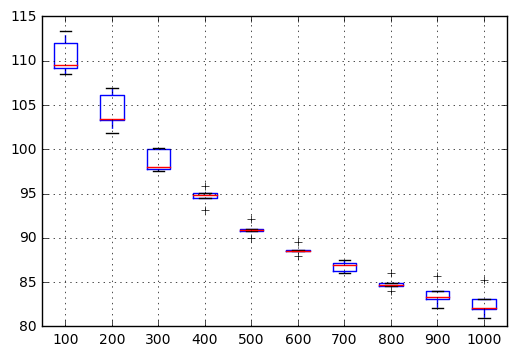

In [114]:
results.boxplot()
plt.savefig('click_LSTM_epoch_YRMSE.png')

YRMSE is continuously decreasingover the 1000 epochs. SInce, XRME shows a slight increase after 900. The model will be trained fr 900 epochs.

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (133, 50)                 10600     
_________________________________________________________________
dense_2 (Dense)              (133, 2)                  102       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (133, 2)                  0         
Total params: 10,702
Trainable params: 10,702
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 5s - loss: 0.0657 - rmse: 0.2370 - val_loss: 0.0280 - val_rmse: 0.1668

Epoch 00001: val_loss improved from inf to 0.02795, saving model to click_wts_2.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0300 - rmse: 0.1729 - val_loss: 0.0276 - val_rmse

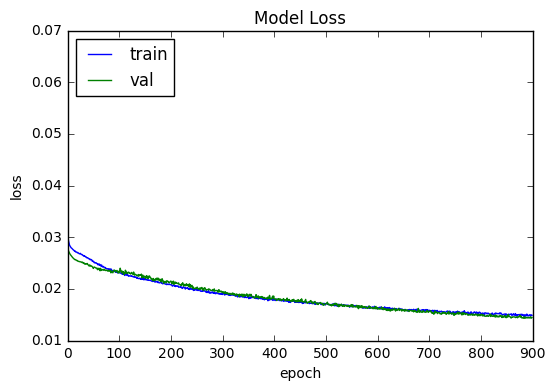

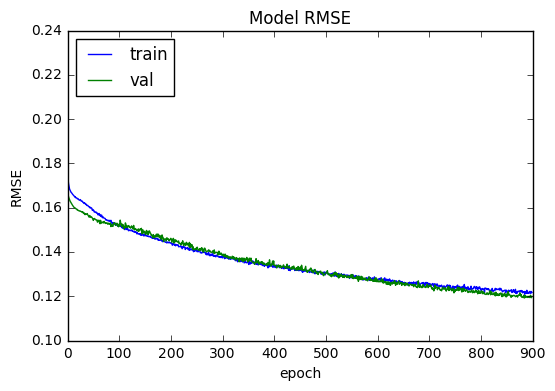

In [35]:
#LSTM call model definition
click_model2= click_stateful_LSTM(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1)
click_model2.summary()

#Train LSTM
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model2, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_2.hdf5')
#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [34]:
click_pred_train=click_model2.predict(X_click_train, batch_size=133)
click_model2.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model2.predict(X_click_val, batch_size=133)
click_model2.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model2.predict(X_click_test, batch_size=133)
click_model2.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  117.03911880549033
YRMSE train:  71.70814045619889
XRMSE val:  142.51583594834813
YRMSE val:  85.18472041418468
XRMSE test:  141.43140515481088
YRMSE test:  85.50213288987308


Stateful LSTM does not outpreform stateless LSTM. But this will be more clear after training the model for a specific sample size.

In [24]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_8 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 14s - loss: 0.0644 - rmse: 0.2370 - val_loss: 0.0296 - val_rmse: 0.1718

Epoch 00001: val_loss improved from inf to 0.02964, saving model to click_wts_3.hdf5
Epoch 2/900
 - 6s - lo

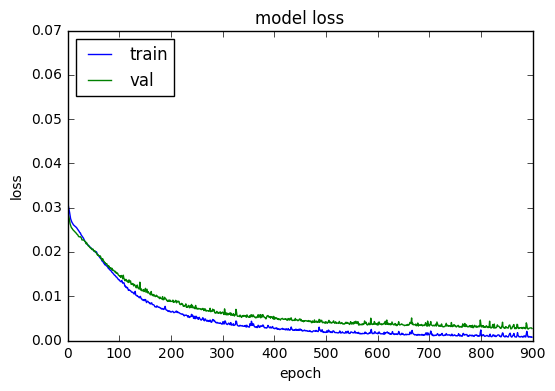

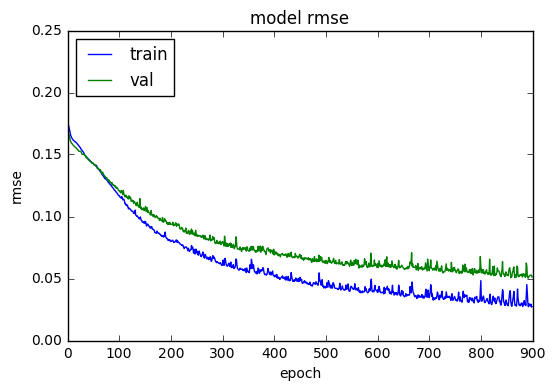

In [44]:
#2 hidden layers with both 50 units and recurent dropout in only 1st hidden layer
#LSTM call model definition
click_model3= click_stacked_stateless_LSTM(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model3.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_model3, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_3.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [28]:
click_model3.load_weights('click_wts_3.hdf5')

click_pred_train=click_model3.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model3.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model3.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  61.40518502223034
YRMSE train:  39.504756628914514
XRMSE val:  65.56105693069806
YRMSE val:  43.65926313501698
XRMSE test:  67.9441477811638
YRMSE test:  43.008000488416975


This stacked stateless LSTM performs far better than the previously trained models. But there is some difference between the performance of the model on the train dataset as compared to the validation and test datasets. In this model the recurrent dropout was only addd in the first hidden layer. Let's check the performance of the model by adding recurrent dropout in both the layers.

In [36]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM2(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_6 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 13s - loss: 0.0821 - rmse: 0.2626 - val_loss: 0.0314 - val_rmse: 0.1768

Epoch 00001: val_loss improved from inf to 0.03139, saving model to click_wts_4.hdf5
Epoch 2/900
 - 7s - lo

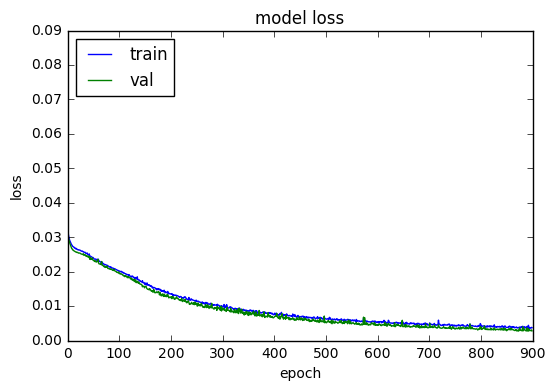

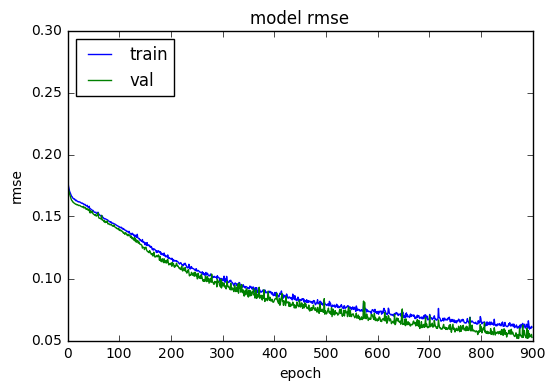

In [40]:
#2 hidden layers, both with 50 units and recurrent dropout in both the hidden layers
#LSTM call model definition
click_model4= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model4.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_model4, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_4.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [41]:
click_pred_train=click_model4.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model4.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model4.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  50.32744228300663
YRMSE train:  33.85305485801927
XRMSE val:  65.09454735080027
YRMSE val:  41.86490721644265
XRMSE test:  66.69613393786204
YRMSE test:  38.936826105283004


In [38]:
#load weights
click_model4= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.05, dropout=0.1)
click_model4.summary()

click_model4.load_weights('click_wts_4.hdf5')

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_3 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________


In [30]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM3(units_1, units_2, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units_1, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units_2, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_4 (LSTM)                (None, 40)                14560     
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 2)                 0         
Total params: 25,242
Trainable params: 25,242
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 9s - loss: 0.0717 - rmse: 0.2446 - val_loss: 0.0298 - val_rmse: 0.1721

Epoch 00001: val_loss improved from inf to 0.02976, saving model to click_wts_10.hdf5
Epoch 2/900
 - 6s - lo

 - 6s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0234 - val_rmse: 0.1525

Epoch 00045: val_loss improved from 0.02357 to 0.02338, saving model to click_wts_10.hdf5
Epoch 46/900
 - 6s - loss: 0.0241 - rmse: 0.1549 - val_loss: 0.0238 - val_rmse: 0.1539

Epoch 00046: val_loss did not improve from 0.02338
Epoch 47/900
 - 6s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0233 - val_rmse: 0.1522

Epoch 00047: val_loss improved from 0.02338 to 0.02329, saving model to click_wts_10.hdf5
Epoch 48/900
 - 6s - loss: 0.0238 - rmse: 0.1538 - val_loss: 0.0233 - val_rmse: 0.1524

Epoch 00048: val_loss did not improve from 0.02329
Epoch 49/900
 - 6s - loss: 0.0238 - rmse: 0.1537 - val_loss: 0.0230 - val_rmse: 0.1514

Epoch 00049: val_loss improved from 0.02329 to 0.02305, saving model to click_wts_10.hdf5
Epoch 50/900
 - 6s - loss: 0.0235 - rmse: 0.1529 - val_loss: 0.0230 - val_rmse: 0.1512

Epoch 00050: val_loss improved from 0.02305 to 0.02296, saving model to click_wts_10.hdf5
Epoch 51/900
 - 6s - lo


Epoch 00095: val_loss improved from 0.02060 to 0.02038, saving model to click_wts_10.hdf5
Epoch 96/900
 - 7s - loss: 0.0209 - rmse: 0.1441 - val_loss: 0.0211 - val_rmse: 0.1449

Epoch 00096: val_loss did not improve from 0.02038
Epoch 97/900
 - 6s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0203 - val_rmse: 0.1422

Epoch 00097: val_loss improved from 0.02038 to 0.02032, saving model to click_wts_10.hdf5
Epoch 98/900
 - 6s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0204 - val_rmse: 0.1427

Epoch 00098: val_loss did not improve from 0.02032
Epoch 99/900
 - 6s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0203 - val_rmse: 0.1423

Epoch 00099: val_loss did not improve from 0.02032
Epoch 100/900
 - 6s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0203 - val_rmse: 0.1421

Epoch 00100: val_loss improved from 0.02032 to 0.02026, saving model to click_wts_10.hdf5
Epoch 101/900
 - 6s - loss: 0.0205 - rmse: 0.1428 - val_loss: 0.0204 - val_rmse: 0.1424

Epoch 00101: val_loss did not improve from 0.0


Epoch 00148: val_loss did not improve from 0.01632
Epoch 149/900
 - 6s - loss: 0.0171 - rmse: 0.1306 - val_loss: 0.0165 - val_rmse: 0.1284

Epoch 00149: val_loss did not improve from 0.01632
Epoch 150/900
 - 6s - loss: 0.0175 - rmse: 0.1319 - val_loss: 0.0164 - val_rmse: 0.1279

Epoch 00150: val_loss did not improve from 0.01632
Epoch 151/900
 - 6s - loss: 0.0170 - rmse: 0.1303 - val_loss: 0.0164 - val_rmse: 0.1278

Epoch 00151: val_loss did not improve from 0.01632
Epoch 152/900
 - 6s - loss: 0.0170 - rmse: 0.1300 - val_loss: 0.0163 - val_rmse: 0.1274

Epoch 00152: val_loss improved from 0.01632 to 0.01630, saving model to click_wts_10.hdf5
Epoch 153/900
 - 6s - loss: 0.0175 - rmse: 0.1319 - val_loss: 0.0165 - val_rmse: 0.1280

Epoch 00153: val_loss did not improve from 0.01630
Epoch 154/900
 - 6s - loss: 0.0170 - rmse: 0.1302 - val_loss: 0.0160 - val_rmse: 0.1263

Epoch 00154: val_loss improved from 0.01630 to 0.01602, saving model to click_wts_10.hdf5
Epoch 155/900
 - 6s - loss: 0.

 - 6s - loss: 0.0145 - rmse: 0.1199 - val_loss: 0.0130 - val_rmse: 0.1139

Epoch 00202: val_loss improved from 0.01311 to 0.01302, saving model to click_wts_10.hdf5
Epoch 203/900
 - 6s - loss: 0.0144 - rmse: 0.1199 - val_loss: 0.0135 - val_rmse: 0.1161

Epoch 00203: val_loss did not improve from 0.01302
Epoch 204/900
 - 6s - loss: 0.0146 - rmse: 0.1204 - val_loss: 0.0136 - val_rmse: 0.1163

Epoch 00204: val_loss did not improve from 0.01302
Epoch 205/900
 - 6s - loss: 0.0144 - rmse: 0.1196 - val_loss: 0.0135 - val_rmse: 0.1158

Epoch 00205: val_loss did not improve from 0.01302
Epoch 206/900
 - 6s - loss: 0.0145 - rmse: 0.1201 - val_loss: 0.0135 - val_rmse: 0.1161

Epoch 00206: val_loss did not improve from 0.01302
Epoch 207/900
 - 6s - loss: 0.0145 - rmse: 0.1202 - val_loss: 0.0133 - val_rmse: 0.1149

Epoch 00207: val_loss did not improve from 0.01302
Epoch 208/900
 - 6s - loss: 0.0149 - rmse: 0.1217 - val_loss: 0.0131 - val_rmse: 0.1144

Epoch 00208: val_loss did not improve from 0.0


Epoch 00257: val_loss did not improve from 0.01120
Epoch 258/900
 - 6s - loss: 0.0132 - rmse: 0.1144 - val_loss: 0.0116 - val_rmse: 0.1076

Epoch 00258: val_loss did not improve from 0.01120
Epoch 259/900
 - 6s - loss: 0.0125 - rmse: 0.1117 - val_loss: 0.0120 - val_rmse: 0.1094

Epoch 00259: val_loss did not improve from 0.01120
Epoch 260/900
 - 6s - loss: 0.0124 - rmse: 0.1110 - val_loss: 0.0111 - val_rmse: 0.1051

Epoch 00260: val_loss improved from 0.01120 to 0.01109, saving model to click_wts_10.hdf5
Epoch 261/900
 - 7s - loss: 0.0124 - rmse: 0.1109 - val_loss: 0.0115 - val_rmse: 0.1068

Epoch 00261: val_loss did not improve from 0.01109
Epoch 262/900
 - 6s - loss: 0.0123 - rmse: 0.1105 - val_loss: 0.0115 - val_rmse: 0.1070

Epoch 00262: val_loss did not improve from 0.01109
Epoch 263/900
 - 6s - loss: 0.0123 - rmse: 0.1107 - val_loss: 0.0114 - val_rmse: 0.1067

Epoch 00263: val_loss did not improve from 0.01109
Epoch 264/900
 - 6s - loss: 0.0125 - rmse: 0.1115 - val_loss: 0.0119 


Epoch 00314: val_loss did not improve from 0.01005
Epoch 315/900
 - 6s - loss: 0.0111 - rmse: 0.1049 - val_loss: 0.0103 - val_rmse: 0.1014

Epoch 00315: val_loss did not improve from 0.01005
Epoch 316/900
 - 6s - loss: 0.0111 - rmse: 0.1052 - val_loss: 0.0098 - val_rmse: 0.0988

Epoch 00316: val_loss improved from 0.01005 to 0.00980, saving model to click_wts_10.hdf5
Epoch 317/900
 - 6s - loss: 0.0110 - rmse: 0.1044 - val_loss: 0.0103 - val_rmse: 0.1013

Epoch 00317: val_loss did not improve from 0.00980
Epoch 318/900
 - 6s - loss: 0.0111 - rmse: 0.1053 - val_loss: 0.0099 - val_rmse: 0.0994

Epoch 00318: val_loss did not improve from 0.00980
Epoch 319/900
 - 6s - loss: 0.0109 - rmse: 0.1041 - val_loss: 0.0100 - val_rmse: 0.0996

Epoch 00319: val_loss did not improve from 0.00980
Epoch 320/900
 - 6s - loss: 0.0110 - rmse: 0.1046 - val_loss: 0.0099 - val_rmse: 0.0991

Epoch 00320: val_loss did not improve from 0.00980
Epoch 321/900
 - 6s - loss: 0.0110 - rmse: 0.1045 - val_loss: 0.0108 

 - 6s - loss: 0.0097 - rmse: 0.0980 - val_loss: 0.0085 - val_rmse: 0.0917

Epoch 00370: val_loss improved from 0.00848 to 0.00846, saving model to click_wts_10.hdf5
Epoch 371/900
 - 6s - loss: 0.0098 - rmse: 0.0984 - val_loss: 0.0097 - val_rmse: 0.0980

Epoch 00371: val_loss did not improve from 0.00846
Epoch 372/900
 - 6s - loss: 0.0098 - rmse: 0.0988 - val_loss: 0.0089 - val_rmse: 0.0943

Epoch 00372: val_loss did not improve from 0.00846
Epoch 373/900
 - 6s - loss: 0.0095 - rmse: 0.0972 - val_loss: 0.0092 - val_rmse: 0.0956

Epoch 00373: val_loss did not improve from 0.00846
Epoch 374/900
 - 6s - loss: 0.0098 - rmse: 0.0989 - val_loss: 0.0085 - val_rmse: 0.0917

Epoch 00374: val_loss improved from 0.00846 to 0.00846, saving model to click_wts_10.hdf5
Epoch 375/900
 - 6s - loss: 0.0097 - rmse: 0.0983 - val_loss: 0.0100 - val_rmse: 0.0998

Epoch 00375: val_loss did not improve from 0.00846
Epoch 376/900
 - 6s - loss: 0.0096 - rmse: 0.0975 - val_loss: 0.0087 - val_rmse: 0.0932

Epoch 0


Epoch 00427: val_loss did not improve from 0.00774
Epoch 428/900
 - 6s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0082 - val_rmse: 0.0904

Epoch 00428: val_loss did not improve from 0.00774
Epoch 429/900
 - 6s - loss: 0.0087 - rmse: 0.0930 - val_loss: 0.0078 - val_rmse: 0.0879

Epoch 00429: val_loss did not improve from 0.00774
Epoch 430/900
 - 6s - loss: 0.0088 - rmse: 0.0936 - val_loss: 0.0084 - val_rmse: 0.0917

Epoch 00430: val_loss did not improve from 0.00774
Epoch 431/900
 - 6s - loss: 0.0087 - rmse: 0.0927 - val_loss: 0.0077 - val_rmse: 0.0876

Epoch 00431: val_loss improved from 0.00774 to 0.00772, saving model to click_wts_10.hdf5
Epoch 432/900
 - 6s - loss: 0.0086 - rmse: 0.0925 - val_loss: 0.0087 - val_rmse: 0.0927

Epoch 00432: val_loss did not improve from 0.00772
Epoch 433/900
 - 6s - loss: 0.0086 - rmse: 0.0926 - val_loss: 0.0083 - val_rmse: 0.0910

Epoch 00433: val_loss did not improve from 0.00772
Epoch 434/900
 - 6s - loss: 0.0087 - rmse: 0.0932 - val_loss: 0.0076 


Epoch 00484: val_loss did not improve from 0.00694
Epoch 485/900
 - 6s - loss: 0.0077 - rmse: 0.0872 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00485: val_loss improved from 0.00694 to 0.00646, saving model to click_wts_10.hdf5
Epoch 486/900
 - 6s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0071 - val_rmse: 0.0840

Epoch 00486: val_loss did not improve from 0.00646
Epoch 487/900
 - 6s - loss: 0.0078 - rmse: 0.0878 - val_loss: 0.0068 - val_rmse: 0.0821

Epoch 00487: val_loss did not improve from 0.00646
Epoch 488/900
 - 7s - loss: 0.0078 - rmse: 0.0880 - val_loss: 0.0073 - val_rmse: 0.0853

Epoch 00488: val_loss did not improve from 0.00646
Epoch 489/900
 - 6s - loss: 0.0076 - rmse: 0.0869 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00489: val_loss did not improve from 0.00646
Epoch 490/900
 - 6s - loss: 0.0076 - rmse: 0.0868 - val_loss: 0.0072 - val_rmse: 0.0847

Epoch 00490: val_loss did not improve from 0.00646
Epoch 491/900
 - 6s - loss: 0.0075 - rmse: 0.0861 - val_loss: 0.0069 

 - 6s - loss: 0.0075 - rmse: 0.0862 - val_loss: 0.0063 - val_rmse: 0.0788

Epoch 00542: val_loss did not improve from 0.00583
Epoch 543/900
 - 6s - loss: 0.0071 - rmse: 0.0837 - val_loss: 0.0061 - val_rmse: 0.0775

Epoch 00543: val_loss did not improve from 0.00583
Epoch 544/900
 - 6s - loss: 0.0072 - rmse: 0.0843 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00544: val_loss did not improve from 0.00583
Epoch 545/900
 - 6s - loss: 0.0070 - rmse: 0.0834 - val_loss: 0.0065 - val_rmse: 0.0804

Epoch 00545: val_loss did not improve from 0.00583
Epoch 546/900
 - 6s - loss: 0.0070 - rmse: 0.0836 - val_loss: 0.0066 - val_rmse: 0.0812

Epoch 00546: val_loss did not improve from 0.00583
Epoch 547/900
 - 6s - loss: 0.0074 - rmse: 0.0857 - val_loss: 0.0064 - val_rmse: 0.0801

Epoch 00547: val_loss did not improve from 0.00583
Epoch 548/900
 - 6s - loss: 0.0071 - rmse: 0.0841 - val_loss: 0.0064 - val_rmse: 0.0796

Epoch 00548: val_loss did not improve from 0.00583
Epoch 549/900
 - 6s - loss: 0.0072


Epoch 00599: val_loss did not improve from 0.00526
Epoch 600/900
 - 6s - loss: 0.0064 - rmse: 0.0797 - val_loss: 0.0061 - val_rmse: 0.0778

Epoch 00600: val_loss did not improve from 0.00526
Epoch 601/900
 - 6s - loss: 0.0066 - rmse: 0.0807 - val_loss: 0.0057 - val_rmse: 0.0751

Epoch 00601: val_loss did not improve from 0.00526
Epoch 602/900
 - 6s - loss: 0.0063 - rmse: 0.0791 - val_loss: 0.0059 - val_rmse: 0.0765

Epoch 00602: val_loss did not improve from 0.00526
Epoch 603/900
 - 6s - loss: 0.0065 - rmse: 0.0804 - val_loss: 0.0056 - val_rmse: 0.0747

Epoch 00603: val_loss did not improve from 0.00526
Epoch 604/900
 - 6s - loss: 0.0067 - rmse: 0.0816 - val_loss: 0.0063 - val_rmse: 0.0794

Epoch 00604: val_loss did not improve from 0.00526
Epoch 605/900
 - 6s - loss: 0.0065 - rmse: 0.0804 - val_loss: 0.0067 - val_rmse: 0.0814

Epoch 00605: val_loss did not improve from 0.00526
Epoch 606/900
 - 6s - loss: 0.0064 - rmse: 0.0797 - val_loss: 0.0059 - val_rmse: 0.0764

Epoch 00606: val_lo

 - 6s - loss: 0.0059 - rmse: 0.0768 - val_loss: 0.0046 - val_rmse: 0.0677

Epoch 00657: val_loss improved from 0.00467 to 0.00460, saving model to click_wts_10.hdf5
Epoch 658/900
 - 6s - loss: 0.0060 - rmse: 0.0769 - val_loss: 0.0047 - val_rmse: 0.0682

Epoch 00658: val_loss did not improve from 0.00460
Epoch 659/900
 - 6s - loss: 0.0057 - rmse: 0.0753 - val_loss: 0.0050 - val_rmse: 0.0706

Epoch 00659: val_loss did not improve from 0.00460
Epoch 660/900
 - 6s - loss: 0.0058 - rmse: 0.0760 - val_loss: 0.0050 - val_rmse: 0.0708

Epoch 00660: val_loss did not improve from 0.00460
Epoch 661/900
 - 6s - loss: 0.0058 - rmse: 0.0755 - val_loss: 0.0053 - val_rmse: 0.0724

Epoch 00661: val_loss did not improve from 0.00460
Epoch 662/900
 - 6s - loss: 0.0060 - rmse: 0.0770 - val_loss: 0.0058 - val_rmse: 0.0758

Epoch 00662: val_loss did not improve from 0.00460
Epoch 663/900
 - 6s - loss: 0.0060 - rmse: 0.0768 - val_loss: 0.0054 - val_rmse: 0.0730

Epoch 00663: val_loss did not improve from 0.0

 - 6s - loss: 0.0061 - rmse: 0.0774 - val_loss: 0.0047 - val_rmse: 0.0682

Epoch 00715: val_loss did not improve from 0.00438
Epoch 716/900
 - 6s - loss: 0.0056 - rmse: 0.0744 - val_loss: 0.0052 - val_rmse: 0.0718

Epoch 00716: val_loss did not improve from 0.00438
Epoch 717/900
 - 6s - loss: 0.0057 - rmse: 0.0755 - val_loss: 0.0047 - val_rmse: 0.0681

Epoch 00717: val_loss did not improve from 0.00438
Epoch 718/900
 - 7s - loss: 0.0057 - rmse: 0.0751 - val_loss: 0.0054 - val_rmse: 0.0729

Epoch 00718: val_loss did not improve from 0.00438
Epoch 719/900
 - 6s - loss: 0.0054 - rmse: 0.0730 - val_loss: 0.0046 - val_rmse: 0.0677

Epoch 00719: val_loss did not improve from 0.00438
Epoch 720/900
 - 6s - loss: 0.0055 - rmse: 0.0735 - val_loss: 0.0047 - val_rmse: 0.0685

Epoch 00720: val_loss did not improve from 0.00438
Epoch 721/900
 - 5s - loss: 0.0055 - rmse: 0.0736 - val_loss: 0.0046 - val_rmse: 0.0673

Epoch 00721: val_loss did not improve from 0.00438
Epoch 722/900
 - 6s - loss: 0.0054

 - 6s - loss: 0.0051 - rmse: 0.0712 - val_loss: 0.0049 - val_rmse: 0.0696

Epoch 00773: val_loss did not improve from 0.00395
Epoch 774/900
 - 6s - loss: 0.0053 - rmse: 0.0727 - val_loss: 0.0045 - val_rmse: 0.0670

Epoch 00774: val_loss did not improve from 0.00395
Epoch 775/900
 - 6s - loss: 0.0051 - rmse: 0.0708 - val_loss: 0.0045 - val_rmse: 0.0666

Epoch 00775: val_loss did not improve from 0.00395
Epoch 776/900
 - 6s - loss: 0.0050 - rmse: 0.0707 - val_loss: 0.0040 - val_rmse: 0.0633

Epoch 00776: val_loss did not improve from 0.00395
Epoch 777/900
 - 6s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0039 - val_rmse: 0.0625

Epoch 00777: val_loss improved from 0.00395 to 0.00393, saving model to click_wts_10.hdf5
Epoch 778/900
 - 6s - loss: 0.0050 - rmse: 0.0705 - val_loss: 0.0047 - val_rmse: 0.0684

Epoch 00778: val_loss did not improve from 0.00393
Epoch 779/900
 - 6s - loss: 0.0053 - rmse: 0.0722 - val_loss: 0.0041 - val_rmse: 0.0638

Epoch 00779: val_loss did not improve from 0.0


Epoch 00830: val_loss did not improve from 0.00371
Epoch 831/900
 - 6s - loss: 0.0049 - rmse: 0.0694 - val_loss: 0.0050 - val_rmse: 0.0703

Epoch 00831: val_loss did not improve from 0.00371
Epoch 832/900
 - 6s - loss: 0.0046 - rmse: 0.0678 - val_loss: 0.0038 - val_rmse: 0.0616

Epoch 00832: val_loss did not improve from 0.00371
Epoch 833/900
 - 6s - loss: 0.0046 - rmse: 0.0678 - val_loss: 0.0037 - val_rmse: 0.0606

Epoch 00833: val_loss improved from 0.00371 to 0.00370, saving model to click_wts_10.hdf5
Epoch 834/900
 - 6s - loss: 0.0048 - rmse: 0.0686 - val_loss: 0.0040 - val_rmse: 0.0631

Epoch 00834: val_loss did not improve from 0.00370
Epoch 835/900
 - 6s - loss: 0.0047 - rmse: 0.0681 - val_loss: 0.0048 - val_rmse: 0.0686

Epoch 00835: val_loss did not improve from 0.00370
Epoch 836/900
 - 6s - loss: 0.0054 - rmse: 0.0729 - val_loss: 0.0038 - val_rmse: 0.0611

Epoch 00836: val_loss did not improve from 0.00370
Epoch 837/900
 - 6s - loss: 0.0048 - rmse: 0.0688 - val_loss: 0.0040 

 - 6s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0035 - val_rmse: 0.0591

Epoch 00888: val_loss did not improve from 0.00350
Epoch 889/900
 - 6s - loss: 0.0049 - rmse: 0.0694 - val_loss: 0.0041 - val_rmse: 0.0634

Epoch 00889: val_loss did not improve from 0.00350
Epoch 890/900
 - 6s - loss: 0.0045 - rmse: 0.0666 - val_loss: 0.0037 - val_rmse: 0.0604

Epoch 00890: val_loss did not improve from 0.00350
Epoch 891/900
 - 6s - loss: 0.0045 - rmse: 0.0665 - val_loss: 0.0037 - val_rmse: 0.0602

Epoch 00891: val_loss did not improve from 0.00350
Epoch 892/900
 - 6s - loss: 0.0045 - rmse: 0.0665 - val_loss: 0.0038 - val_rmse: 0.0610

Epoch 00892: val_loss did not improve from 0.00350
Epoch 893/900
 - 6s - loss: 0.0044 - rmse: 0.0659 - val_loss: 0.0035 - val_rmse: 0.0589

Epoch 00893: val_loss improved from 0.00350 to 0.00349, saving model to click_wts_10.hdf5
Epoch 894/900
 - 6s - loss: 0.0046 - rmse: 0.0677 - val_loss: 0.0041 - val_rmse: 0.0635

Epoch 00894: val_loss did not improve from 0.0

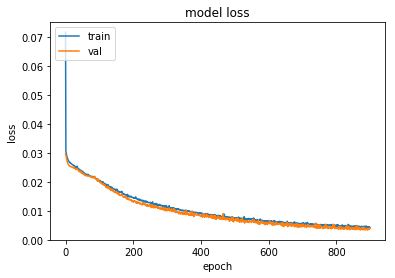

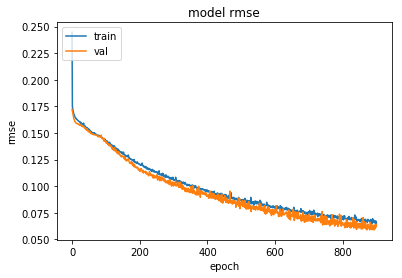

In [34]:
#2 hidden layers, one with 50 units and the second with 40 units
#LSTM call model definition
click_model10= click_stacked_stateless_LSTM3(units_1=50, units_2=40, lr=0.001, alpha=0.05, dropout=0.1)
click_model10.summary()

#Train LSTM
hist= stateless_fit(click_model10, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_10.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [35]:
click_pred_train=click_model10.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model10.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model10.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  68.44672337062866
YRMSE train:  46.533826903807885
XRMSE val:  76.19428903563191
YRMSE val:  51.86543874290813
XRMSE test:  87.9007375371437
YRMSE test:  54.05548770184816


This model does not outperform the previous one. Thus, so far stacked model (click_model4) with 2 hidden layers and having 50 units in each layer with recurrent dropout in both the hidden layers performs the best.

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_6 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 8s - loss: 0.0535 - rmse: 0.2157 - val_loss: 0.0299 - val_rmse: 0.1724

Epoch 00001: val_loss improved from inf to 0.02989, saving model to click_wts_11.hdf5
Epoch 2/900
 - 6s - lo

 - 6s - loss: 0.0241 - rmse: 0.1547 - val_loss: 0.0237 - val_rmse: 0.1536

Epoch 00044: val_loss did not improve from 0.02347
Epoch 45/900
 - 6s - loss: 0.0240 - rmse: 0.1546 - val_loss: 0.0236 - val_rmse: 0.1533

Epoch 00045: val_loss did not improve from 0.02347
Epoch 46/900
 - 6s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0232 - val_rmse: 0.1520

Epoch 00046: val_loss improved from 0.02347 to 0.02322, saving model to click_wts_11.hdf5
Epoch 47/900
 - 6s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0232 - val_rmse: 0.1521

Epoch 00047: val_loss did not improve from 0.02322
Epoch 48/900
 - 6s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0233 - val_rmse: 0.1522

Epoch 00048: val_loss did not improve from 0.02322
Epoch 49/900
 - 6s - loss: 0.0236 - rmse: 0.1533 - val_loss: 0.0230 - val_rmse: 0.1512

Epoch 00049: val_loss improved from 0.02322 to 0.02296, saving model to click_wts_11.hdf5
Epoch 50/900
 - 6s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0230 - val_rmse: 0.1512

Epoch 00050: 


Epoch 00094: val_loss improved from 0.01962 to 0.01948, saving model to click_wts_11.hdf5
Epoch 95/900
 - 6s - loss: 0.0202 - rmse: 0.1418 - val_loss: 0.0195 - val_rmse: 0.1394

Epoch 00095: val_loss did not improve from 0.01948
Epoch 96/900
 - 6s - loss: 0.0207 - rmse: 0.1434 - val_loss: 0.0197 - val_rmse: 0.1402

Epoch 00096: val_loss did not improve from 0.01948
Epoch 97/900
 - 6s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0193 - val_rmse: 0.1386

Epoch 00097: val_loss improved from 0.01948 to 0.01928, saving model to click_wts_11.hdf5
Epoch 98/900
 - 6s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0192 - val_rmse: 0.1382

Epoch 00098: val_loss improved from 0.01928 to 0.01916, saving model to click_wts_11.hdf5
Epoch 99/900
 - 6s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00099: val_loss did not improve from 0.01916
Epoch 100/900
 - 6s - loss: 0.0198 - rmse: 0.1406 - val_loss: 0.0190 - val_rmse: 0.1375

Epoch 00100: val_loss improved from 0.01916 to 

 - 6s - loss: 0.0167 - rmse: 0.1290 - val_loss: 0.0152 - val_rmse: 0.1229

Epoch 00145: val_loss did not improve from 0.01516
Epoch 146/900
 - 6s - loss: 0.0166 - rmse: 0.1287 - val_loss: 0.0150 - val_rmse: 0.1223

Epoch 00146: val_loss improved from 0.01516 to 0.01500, saving model to click_wts_11.hdf5
Epoch 147/900
 - 6s - loss: 0.0167 - rmse: 0.1290 - val_loss: 0.0152 - val_rmse: 0.1232

Epoch 00147: val_loss did not improve from 0.01500
Epoch 148/900
 - 6s - loss: 0.0167 - rmse: 0.1288 - val_loss: 0.0151 - val_rmse: 0.1228

Epoch 00148: val_loss did not improve from 0.01500
Epoch 149/900
 - 6s - loss: 0.0164 - rmse: 0.1280 - val_loss: 0.0150 - val_rmse: 0.1223

Epoch 00149: val_loss did not improve from 0.01500
Epoch 150/900
 - 6s - loss: 0.0165 - rmse: 0.1281 - val_loss: 0.0146 - val_rmse: 0.1205

Epoch 00150: val_loss improved from 0.01500 to 0.01457, saving model to click_wts_11.hdf5
Epoch 151/900
 - 6s - loss: 0.0165 - rmse: 0.1280 - val_loss: 0.0149 - val_rmse: 0.1217

Epoch 0

 - 5s - loss: 0.0141 - rmse: 0.1183 - val_loss: 0.0131 - val_rmse: 0.1139

Epoch 00198: val_loss did not improve from 0.01222
Epoch 199/900
 - 5s - loss: 0.0140 - rmse: 0.1181 - val_loss: 0.0124 - val_rmse: 0.1112

Epoch 00199: val_loss did not improve from 0.01222
Epoch 200/900
 - 6s - loss: 0.0140 - rmse: 0.1179 - val_loss: 0.0121 - val_rmse: 0.1098

Epoch 00200: val_loss improved from 0.01222 to 0.01211, saving model to click_wts_11.hdf5
Epoch 201/900
 - 6s - loss: 0.0138 - rmse: 0.1170 - val_loss: 0.0124 - val_rmse: 0.1110

Epoch 00201: val_loss did not improve from 0.01211
Epoch 202/900
 - 6s - loss: 0.0141 - rmse: 0.1183 - val_loss: 0.0121 - val_rmse: 0.1098

Epoch 00202: val_loss did not improve from 0.01211
Epoch 203/900
 - 6s - loss: 0.0136 - rmse: 0.1162 - val_loss: 0.0120 - val_rmse: 0.1093

Epoch 00203: val_loss improved from 0.01211 to 0.01202, saving model to click_wts_11.hdf5
Epoch 204/900
 - 5s - loss: 0.0138 - rmse: 0.1171 - val_loss: 0.0123 - val_rmse: 0.1106

Epoch 0

 - 6s - loss: 0.0116 - rmse: 0.1074 - val_loss: 0.0101 - val_rmse: 0.1002

Epoch 00252: val_loss improved from 0.01017 to 0.01010, saving model to click_wts_11.hdf5
Epoch 253/900
 - 6s - loss: 0.0119 - rmse: 0.1088 - val_loss: 0.0103 - val_rmse: 0.1011

Epoch 00253: val_loss did not improve from 0.01010
Epoch 254/900
 - 6s - loss: 0.0116 - rmse: 0.1076 - val_loss: 0.0104 - val_rmse: 0.1015

Epoch 00254: val_loss did not improve from 0.01010
Epoch 255/900
 - 6s - loss: 0.0116 - rmse: 0.1075 - val_loss: 0.0103 - val_rmse: 0.1012

Epoch 00255: val_loss did not improve from 0.01010
Epoch 256/900
 - 6s - loss: 0.0117 - rmse: 0.1078 - val_loss: 0.0105 - val_rmse: 0.1023

Epoch 00256: val_loss did not improve from 0.01010
Epoch 257/900
 - 5s - loss: 0.0122 - rmse: 0.1101 - val_loss: 0.0103 - val_rmse: 0.1012

Epoch 00257: val_loss did not improve from 0.01010
Epoch 258/900
 - 5s - loss: 0.0118 - rmse: 0.1085 - val_loss: 0.0101 - val_rmse: 0.1001

Epoch 00258: val_loss improved from 0.01010 to

 - 5s - loss: 0.0101 - rmse: 0.1001 - val_loss: 0.0089 - val_rmse: 0.0939

Epoch 00307: val_loss did not improve from 0.00827
Epoch 308/900
 - 7s - loss: 0.0098 - rmse: 0.0989 - val_loss: 0.0084 - val_rmse: 0.0915

Epoch 00308: val_loss did not improve from 0.00827
Epoch 309/900
 - 6s - loss: 0.0100 - rmse: 0.0999 - val_loss: 0.0085 - val_rmse: 0.0919

Epoch 00309: val_loss did not improve from 0.00827
Epoch 310/900
 - 6s - loss: 0.0099 - rmse: 0.0990 - val_loss: 0.0084 - val_rmse: 0.0912

Epoch 00310: val_loss did not improve from 0.00827
Epoch 311/900
 - 6s - loss: 0.0097 - rmse: 0.0982 - val_loss: 0.0079 - val_rmse: 0.0887

Epoch 00311: val_loss improved from 0.00827 to 0.00791, saving model to click_wts_11.hdf5
Epoch 312/900
 - 5s - loss: 0.0098 - rmse: 0.0987 - val_loss: 0.0084 - val_rmse: 0.0916

Epoch 00312: val_loss did not improve from 0.00791
Epoch 313/900
 - 6s - loss: 0.0098 - rmse: 0.0988 - val_loss: 0.0084 - val_rmse: 0.0917

Epoch 00313: val_loss did not improve from 0.0


Epoch 00363: val_loss did not improve from 0.00713
Epoch 364/900
 - 6s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0071 - val_rmse: 0.0842

Epoch 00364: val_loss did not improve from 0.00713
Epoch 365/900
 - 6s - loss: 0.0084 - rmse: 0.0915 - val_loss: 0.0075 - val_rmse: 0.0865

Epoch 00365: val_loss did not improve from 0.00713
Epoch 366/900
 - 6s - loss: 0.0084 - rmse: 0.0913 - val_loss: 0.0079 - val_rmse: 0.0887

Epoch 00366: val_loss did not improve from 0.00713
Epoch 367/900
 - 5s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0071 - val_rmse: 0.0842

Epoch 00367: val_loss did not improve from 0.00713
Epoch 368/900
 - 6s - loss: 0.0083 - rmse: 0.0909 - val_loss: 0.0076 - val_rmse: 0.0869

Epoch 00368: val_loss did not improve from 0.00713
Epoch 369/900
 - 5s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0074 - val_rmse: 0.0857

Epoch 00369: val_loss did not improve from 0.00713
Epoch 370/900
 - 6s - loss: 0.0085 - rmse: 0.0917 - val_loss: 0.0069 - val_rmse: 0.0830

Epoch 00370: val_lo

 - 5s - loss: 0.0078 - rmse: 0.0881 - val_loss: 0.0063 - val_rmse: 0.0793

Epoch 00420: val_loss did not improve from 0.00609
Epoch 421/900
 - 5s - loss: 0.0074 - rmse: 0.0860 - val_loss: 0.0059 - val_rmse: 0.0766

Epoch 00421: val_loss improved from 0.00609 to 0.00590, saving model to click_wts_11.hdf5
Epoch 422/900
 - 5s - loss: 0.0074 - rmse: 0.0856 - val_loss: 0.0064 - val_rmse: 0.0799

Epoch 00422: val_loss did not improve from 0.00590
Epoch 423/900
 - 5s - loss: 0.0076 - rmse: 0.0868 - val_loss: 0.0066 - val_rmse: 0.0812

Epoch 00423: val_loss did not improve from 0.00590
Epoch 424/900
 - 6s - loss: 0.0077 - rmse: 0.0874 - val_loss: 0.0068 - val_rmse: 0.0821

Epoch 00424: val_loss did not improve from 0.00590
Epoch 425/900
 - 5s - loss: 0.0077 - rmse: 0.0873 - val_loss: 0.0063 - val_rmse: 0.0791

Epoch 00425: val_loss did not improve from 0.00590
Epoch 426/900
 - 5s - loss: 0.0074 - rmse: 0.0855 - val_loss: 0.0061 - val_rmse: 0.0779

Epoch 00426: val_loss did not improve from 0.0


Epoch 00477: val_loss did not improve from 0.00533
Epoch 478/900
 - 5s - loss: 0.0065 - rmse: 0.0806 - val_loss: 0.0056 - val_rmse: 0.0749

Epoch 00478: val_loss did not improve from 0.00533
Epoch 479/900
 - 5s - loss: 0.0069 - rmse: 0.0825 - val_loss: 0.0061 - val_rmse: 0.0775

Epoch 00479: val_loss did not improve from 0.00533
Epoch 480/900
 - 5s - loss: 0.0069 - rmse: 0.0830 - val_loss: 0.0058 - val_rmse: 0.0757

Epoch 00480: val_loss did not improve from 0.00533
Epoch 481/900
 - 5s - loss: 0.0067 - rmse: 0.0816 - val_loss: 0.0057 - val_rmse: 0.0751

Epoch 00481: val_loss did not improve from 0.00533
Epoch 482/900
 - 5s - loss: 0.0066 - rmse: 0.0807 - val_loss: 0.0052 - val_rmse: 0.0721

Epoch 00482: val_loss improved from 0.00533 to 0.00524, saving model to click_wts_11.hdf5
Epoch 483/900
 - 5s - loss: 0.0065 - rmse: 0.0803 - val_loss: 0.0053 - val_rmse: 0.0727

Epoch 00483: val_loss did not improve from 0.00524
Epoch 484/900
 - 6s - loss: 0.0063 - rmse: 0.0794 - val_loss: 0.0053 


Epoch 00534: val_loss did not improve from 0.00452
Epoch 535/900
 - 6s - loss: 0.0064 - rmse: 0.0794 - val_loss: 0.0046 - val_rmse: 0.0678

Epoch 00535: val_loss did not improve from 0.00452
Epoch 536/900
 - 6s - loss: 0.0058 - rmse: 0.0760 - val_loss: 0.0048 - val_rmse: 0.0693

Epoch 00536: val_loss did not improve from 0.00452
Epoch 537/900
 - 6s - loss: 0.0060 - rmse: 0.0774 - val_loss: 0.0052 - val_rmse: 0.0717

Epoch 00537: val_loss did not improve from 0.00452
Epoch 538/900
 - 6s - loss: 0.0060 - rmse: 0.0769 - val_loss: 0.0048 - val_rmse: 0.0694

Epoch 00538: val_loss did not improve from 0.00452
Epoch 539/900
 - 6s - loss: 0.0064 - rmse: 0.0796 - val_loss: 0.0048 - val_rmse: 0.0693

Epoch 00539: val_loss did not improve from 0.00452
Epoch 540/900
 - 6s - loss: 0.0058 - rmse: 0.0756 - val_loss: 0.0048 - val_rmse: 0.0690

Epoch 00540: val_loss did not improve from 0.00452
Epoch 541/900
 - 6s - loss: 0.0059 - rmse: 0.0764 - val_loss: 0.0047 - val_rmse: 0.0681

Epoch 00541: val_lo


Epoch 00591: val_loss did not improve from 0.00410
Epoch 592/900
 - 6s - loss: 0.0055 - rmse: 0.0740 - val_loss: 0.0046 - val_rmse: 0.0675

Epoch 00592: val_loss did not improve from 0.00410
Epoch 593/900
 - 6s - loss: 0.0053 - rmse: 0.0727 - val_loss: 0.0042 - val_rmse: 0.0648

Epoch 00593: val_loss did not improve from 0.00410
Epoch 594/900
 - 6s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0040 - val_rmse: 0.0634

Epoch 00594: val_loss improved from 0.00410 to 0.00404, saving model to click_wts_11.hdf5
Epoch 595/900
 - 6s - loss: 0.0052 - rmse: 0.0715 - val_loss: 0.0043 - val_rmse: 0.0653

Epoch 00595: val_loss did not improve from 0.00404
Epoch 596/900
 - 6s - loss: 0.0051 - rmse: 0.0712 - val_loss: 0.0039 - val_rmse: 0.0621

Epoch 00596: val_loss improved from 0.00404 to 0.00388, saving model to click_wts_11.hdf5
Epoch 597/900
 - 6s - loss: 0.0054 - rmse: 0.0730 - val_loss: 0.0045 - val_rmse: 0.0665

Epoch 00597: val_loss did not improve from 0.00388
Epoch 598/900
 - 6s - loss: 0.

 - 6s - loss: 0.0048 - rmse: 0.0694 - val_loss: 0.0039 - val_rmse: 0.0624

Epoch 00649: val_loss did not improve from 0.00354
Epoch 650/900
 - 6s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0042 - val_rmse: 0.0642

Epoch 00650: val_loss did not improve from 0.00354
Epoch 651/900
 - 6s - loss: 0.0050 - rmse: 0.0701 - val_loss: 0.0036 - val_rmse: 0.0598

Epoch 00651: val_loss did not improve from 0.00354
Epoch 652/900
 - 6s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0038 - val_rmse: 0.0612

Epoch 00652: val_loss did not improve from 0.00354
Epoch 653/900
 - 6s - loss: 0.0049 - rmse: 0.0694 - val_loss: 0.0037 - val_rmse: 0.0607

Epoch 00653: val_loss did not improve from 0.00354
Epoch 654/900
 - 6s - loss: 0.0051 - rmse: 0.0707 - val_loss: 0.0042 - val_rmse: 0.0646

Epoch 00654: val_loss did not improve from 0.00354
Epoch 655/900
 - 6s - loss: 0.0047 - rmse: 0.0684 - val_loss: 0.0035 - val_rmse: 0.0593

Epoch 00655: val_loss did not improve from 0.00354
Epoch 656/900
 - 6s - loss: 0.0046

 - 6s - loss: 0.0044 - rmse: 0.0657 - val_loss: 0.0035 - val_rmse: 0.0589

Epoch 00707: val_loss did not improve from 0.00334
Epoch 708/900
 - 6s - loss: 0.0043 - rmse: 0.0653 - val_loss: 0.0034 - val_rmse: 0.0577

Epoch 00708: val_loss did not improve from 0.00334
Epoch 709/900
 - 6s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0041 - val_rmse: 0.0638

Epoch 00709: val_loss did not improve from 0.00334
Epoch 710/900
 - 6s - loss: 0.0046 - rmse: 0.0672 - val_loss: 0.0038 - val_rmse: 0.0613

Epoch 00710: val_loss did not improve from 0.00334
Epoch 711/900
 - 6s - loss: 0.0045 - rmse: 0.0667 - val_loss: 0.0034 - val_rmse: 0.0584

Epoch 00711: val_loss did not improve from 0.00334
Epoch 712/900
 - 6s - loss: 0.0045 - rmse: 0.0666 - val_loss: 0.0034 - val_rmse: 0.0579

Epoch 00712: val_loss did not improve from 0.00334
Epoch 713/900
 - 6s - loss: 0.0044 - rmse: 0.0661 - val_loss: 0.0040 - val_rmse: 0.0626

Epoch 00713: val_loss did not improve from 0.00334
Epoch 714/900
 - 6s - loss: 0.0045

 - 6s - loss: 0.0044 - rmse: 0.0664 - val_loss: 0.0042 - val_rmse: 0.0647

Epoch 00764: val_loss did not improve from 0.00300
Epoch 765/900
 - 6s - loss: 0.0044 - rmse: 0.0657 - val_loss: 0.0035 - val_rmse: 0.0589

Epoch 00765: val_loss did not improve from 0.00300
Epoch 766/900
 - 6s - loss: 0.0042 - rmse: 0.0644 - val_loss: 0.0031 - val_rmse: 0.0553

Epoch 00766: val_loss did not improve from 0.00300
Epoch 767/900
 - 6s - loss: 0.0041 - rmse: 0.0633 - val_loss: 0.0033 - val_rmse: 0.0574

Epoch 00767: val_loss did not improve from 0.00300
Epoch 768/900
 - 6s - loss: 0.0040 - rmse: 0.0629 - val_loss: 0.0032 - val_rmse: 0.0558

Epoch 00768: val_loss did not improve from 0.00300
Epoch 769/900
 - 6s - loss: 0.0042 - rmse: 0.0645 - val_loss: 0.0034 - val_rmse: 0.0582

Epoch 00769: val_loss did not improve from 0.00300
Epoch 770/900
 - 6s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0032 - val_rmse: 0.0565

Epoch 00770: val_loss did not improve from 0.00300
Epoch 771/900
 - 6s - loss: 0.0041

 - 6s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0033 - val_rmse: 0.0574

Epoch 00821: val_loss did not improve from 0.00284
Epoch 822/900
 - 6s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0030 - val_rmse: 0.0542

Epoch 00822: val_loss did not improve from 0.00284
Epoch 823/900
 - 6s - loss: 0.0040 - rmse: 0.0626 - val_loss: 0.0033 - val_rmse: 0.0569

Epoch 00823: val_loss did not improve from 0.00284
Epoch 824/900
 - 6s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0028 - val_rmse: 0.0528

Epoch 00824: val_loss improved from 0.00284 to 0.00281, saving model to click_wts_11.hdf5
Epoch 825/900
 - 6s - loss: 0.0038 - rmse: 0.0615 - val_loss: 0.0034 - val_rmse: 0.0579

Epoch 00825: val_loss did not improve from 0.00281
Epoch 826/900
 - 6s - loss: 0.0042 - rmse: 0.0645 - val_loss: 0.0029 - val_rmse: 0.0539

Epoch 00826: val_loss did not improve from 0.00281
Epoch 827/900
 - 7s - loss: 0.0039 - rmse: 0.0624 - val_loss: 0.0031 - val_rmse: 0.0557

Epoch 00827: val_loss did not improve from 0.0


Epoch 00878: val_loss did not improve from 0.00254
Epoch 879/900
 - 6s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0030 - val_rmse: 0.0546

Epoch 00879: val_loss did not improve from 0.00254
Epoch 880/900
 - 6s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0031 - val_rmse: 0.0551

Epoch 00880: val_loss did not improve from 0.00254
Epoch 881/900
 - 6s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0028 - val_rmse: 0.0526

Epoch 00881: val_loss did not improve from 0.00254
Epoch 882/900
 - 6s - loss: 0.0036 - rmse: 0.0596 - val_loss: 0.0030 - val_rmse: 0.0542

Epoch 00882: val_loss did not improve from 0.00254
Epoch 883/900
 - 6s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0032 - val_rmse: 0.0558

Epoch 00883: val_loss did not improve from 0.00254
Epoch 884/900
 - 6s - loss: 0.0037 - rmse: 0.0603 - val_loss: 0.0028 - val_rmse: 0.0525

Epoch 00884: val_loss did not improve from 0.00254
Epoch 885/900
 - 6s - loss: 0.0035 - rmse: 0.0588 - val_loss: 0.0028 - val_rmse: 0.0525

Epoch 00885: val_lo

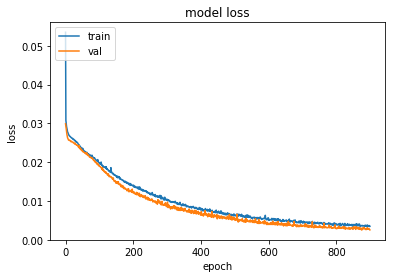

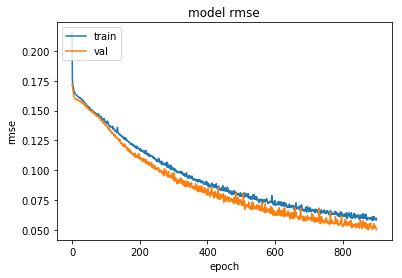

In [37]:
#2 hidden layers, both with 50 units, alpha=0.01
#LSTM call model definition
click_model11= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.01, dropout=0.1)
click_model11.summary()

#Train LSTM
hist= stateless_fit(click_model11, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_11.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [38]:
click_pred_train=click_model11.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model11.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model11.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  45.599674041366605
YRMSE train:  33.35571221588625
XRMSE val:  58.10455543390781
YRMSE val:  41.45755566919101
XRMSE test:  62.55040266604029
YRMSE test:  42.34741727814651


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_8 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_6 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 2)                 0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1500
 - 8s - loss: 0.0516 - rmse: 0.2143 - val_loss: 0.0298 - val_rmse: 0.1722

Epoch 00001: val_loss improved from inf to 0.02981, saving model to click_wts_12.hdf5
Epoch 2/1500
 - 6s - 

 - 6s - loss: 0.0243 - rmse: 0.1555 - val_loss: 0.0236 - val_rmse: 0.1532

Epoch 00044: val_loss improved from 0.02369 to 0.02359, saving model to click_wts_12.hdf5
Epoch 45/1500
 - 6s - loss: 0.0241 - rmse: 0.1549 - val_loss: 0.0236 - val_rmse: 0.1531

Epoch 00045: val_loss improved from 0.02359 to 0.02356, saving model to click_wts_12.hdf5
Epoch 46/1500
 - 6s - loss: 0.0240 - rmse: 0.1546 - val_loss: 0.0234 - val_rmse: 0.1526

Epoch 00046: val_loss improved from 0.02356 to 0.02339, saving model to click_wts_12.hdf5
Epoch 47/1500
 - 6s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0234 - val_rmse: 0.1526

Epoch 00047: val_loss did not improve from 0.02339
Epoch 48/1500
 - 6s - loss: 0.0239 - rmse: 0.1543 - val_loss: 0.0231 - val_rmse: 0.1516

Epoch 00048: val_loss improved from 0.02339 to 0.02310, saving model to click_wts_12.hdf5
Epoch 49/1500
 - 6s - loss: 0.0237 - rmse: 0.1536 - val_loss: 0.0230 - val_rmse: 0.1514

Epoch 00049: val_loss improved from 0.02310 to 0.02302, saving model 

 - 6s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0200 - val_rmse: 0.1409

Epoch 00094: val_loss did not improve from 0.01990
Epoch 95/1500
 - 6s - loss: 0.0203 - rmse: 0.1420 - val_loss: 0.0197 - val_rmse: 0.1402

Epoch 00095: val_loss improved from 0.01990 to 0.01973, saving model to click_wts_12.hdf5
Epoch 96/1500
 - 6s - loss: 0.0202 - rmse: 0.1418 - val_loss: 0.0196 - val_rmse: 0.1398

Epoch 00096: val_loss improved from 0.01973 to 0.01963, saving model to click_wts_12.hdf5
Epoch 97/1500
 - 6s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0196 - val_rmse: 0.1396

Epoch 00097: val_loss improved from 0.01963 to 0.01958, saving model to click_wts_12.hdf5
Epoch 98/1500
 - 6s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0195 - val_rmse: 0.1394

Epoch 00098: val_loss improved from 0.01958 to 0.01953, saving model to click_wts_12.hdf5
Epoch 99/1500
 - 6s - loss: 0.0199 - rmse: 0.1406 - val_loss: 0.0197 - val_rmse: 0.1400

Epoch 00099: val_loss did not improve from 0.01953
Epoch 100/1500
 - 

 - 6s - loss: 0.0169 - rmse: 0.1297 - val_loss: 0.0164 - val_rmse: 0.1279

Epoch 00144: val_loss did not improve from 0.01591
Epoch 145/1500
 - 5s - loss: 0.0171 - rmse: 0.1303 - val_loss: 0.0158 - val_rmse: 0.1253

Epoch 00145: val_loss improved from 0.01591 to 0.01576, saving model to click_wts_12.hdf5
Epoch 146/1500
 - 5s - loss: 0.0169 - rmse: 0.1296 - val_loss: 0.0156 - val_rmse: 0.1248

Epoch 00146: val_loss improved from 0.01576 to 0.01564, saving model to click_wts_12.hdf5
Epoch 147/1500
 - 5s - loss: 0.0169 - rmse: 0.1295 - val_loss: 0.0157 - val_rmse: 0.1251

Epoch 00147: val_loss did not improve from 0.01564
Epoch 148/1500
 - 5s - loss: 0.0170 - rmse: 0.1300 - val_loss: 0.0161 - val_rmse: 0.1267

Epoch 00148: val_loss did not improve from 0.01564
Epoch 149/1500
 - 6s - loss: 0.0168 - rmse: 0.1291 - val_loss: 0.0155 - val_rmse: 0.1241

Epoch 00149: val_loss improved from 0.01564 to 0.01545, saving model to click_wts_12.hdf5
Epoch 150/1500
 - 6s - loss: 0.0165 - rmse: 0.1281 -


Epoch 00196: val_loss did not improve from 0.01293
Epoch 197/1500
 - 6s - loss: 0.0140 - rmse: 0.1180 - val_loss: 0.0128 - val_rmse: 0.1128

Epoch 00197: val_loss improved from 0.01293 to 0.01279, saving model to click_wts_12.hdf5
Epoch 198/1500
 - 6s - loss: 0.0152 - rmse: 0.1229 - val_loss: 0.0132 - val_rmse: 0.1144

Epoch 00198: val_loss did not improve from 0.01279
Epoch 199/1500
 - 6s - loss: 0.0147 - rmse: 0.1208 - val_loss: 0.0129 - val_rmse: 0.1135

Epoch 00199: val_loss did not improve from 0.01279
Epoch 200/1500
 - 6s - loss: 0.0140 - rmse: 0.1182 - val_loss: 0.0134 - val_rmse: 0.1154

Epoch 00200: val_loss did not improve from 0.01279
Epoch 201/1500
 - 5s - loss: 0.0139 - rmse: 0.1178 - val_loss: 0.0127 - val_rmse: 0.1122

Epoch 00201: val_loss improved from 0.01279 to 0.01266, saving model to click_wts_12.hdf5
Epoch 202/1500
 - 5s - loss: 0.0140 - rmse: 0.1178 - val_loss: 0.0126 - val_rmse: 0.1120

Epoch 00202: val_loss improved from 0.01266 to 0.01261, saving model to cli


Epoch 00250: val_loss did not improve from 0.01057
Epoch 251/1500
 - 6s - loss: 0.0124 - rmse: 0.1111 - val_loss: 0.0110 - val_rmse: 0.1047

Epoch 00251: val_loss did not improve from 0.01057
Epoch 252/1500
 - 6s - loss: 0.0120 - rmse: 0.1093 - val_loss: 0.0106 - val_rmse: 0.1029

Epoch 00252: val_loss did not improve from 0.01057
Epoch 253/1500
 - 6s - loss: 0.0122 - rmse: 0.1103 - val_loss: 0.0109 - val_rmse: 0.1042

Epoch 00253: val_loss did not improve from 0.01057
Epoch 254/1500
 - 6s - loss: 0.0122 - rmse: 0.1101 - val_loss: 0.0108 - val_rmse: 0.1036

Epoch 00254: val_loss did not improve from 0.01057
Epoch 255/1500
 - 6s - loss: 0.0124 - rmse: 0.1110 - val_loss: 0.0109 - val_rmse: 0.1041

Epoch 00255: val_loss did not improve from 0.01057
Epoch 256/1500
 - 6s - loss: 0.0120 - rmse: 0.1094 - val_loss: 0.0105 - val_rmse: 0.1022

Epoch 00256: val_loss improved from 0.01057 to 0.01049, saving model to click_wts_12.hdf5
Epoch 257/1500
 - 6s - loss: 0.0123 - rmse: 0.1107 - val_loss: 

 - 6s - loss: 0.0110 - rmse: 0.1044 - val_loss: 0.0091 - val_rmse: 0.0950

Epoch 00305: val_loss did not improve from 0.00881
Epoch 306/1500
 - 6s - loss: 0.0107 - rmse: 0.1031 - val_loss: 0.0090 - val_rmse: 0.0948

Epoch 00306: val_loss did not improve from 0.00881
Epoch 307/1500
 - 6s - loss: 0.0107 - rmse: 0.1030 - val_loss: 0.0102 - val_rmse: 0.1007

Epoch 00307: val_loss did not improve from 0.00881
Epoch 308/1500
 - 6s - loss: 0.0106 - rmse: 0.1028 - val_loss: 0.0092 - val_rmse: 0.0955

Epoch 00308: val_loss did not improve from 0.00881
Epoch 309/1500
 - 6s - loss: 0.0106 - rmse: 0.1027 - val_loss: 0.0091 - val_rmse: 0.0952

Epoch 00309: val_loss did not improve from 0.00881
Epoch 310/1500
 - 6s - loss: 0.0106 - rmse: 0.1025 - val_loss: 0.0094 - val_rmse: 0.0964

Epoch 00310: val_loss did not improve from 0.00881
Epoch 311/1500
 - 6s - loss: 0.0109 - rmse: 0.1041 - val_loss: 0.0094 - val_rmse: 0.0967

Epoch 00311: val_loss did not improve from 0.00881
Epoch 312/1500
 - 6s - loss:


Epoch 00360: val_loss did not improve from 0.00769
Epoch 361/1500
 - 6s - loss: 0.0096 - rmse: 0.0974 - val_loss: 0.0081 - val_rmse: 0.0896

Epoch 00361: val_loss did not improve from 0.00769
Epoch 362/1500
 - 6s - loss: 0.0092 - rmse: 0.0955 - val_loss: 0.0077 - val_rmse: 0.0876

Epoch 00362: val_loss did not improve from 0.00769
Epoch 363/1500
 - 6s - loss: 0.0092 - rmse: 0.0953 - val_loss: 0.0076 - val_rmse: 0.0872

Epoch 00363: val_loss improved from 0.00769 to 0.00765, saving model to click_wts_12.hdf5
Epoch 364/1500
 - 6s - loss: 0.0090 - rmse: 0.0945 - val_loss: 0.0074 - val_rmse: 0.0858

Epoch 00364: val_loss improved from 0.00765 to 0.00740, saving model to click_wts_12.hdf5
Epoch 365/1500
 - 6s - loss: 0.0091 - rmse: 0.0952 - val_loss: 0.0081 - val_rmse: 0.0897

Epoch 00365: val_loss did not improve from 0.00740
Epoch 366/1500
 - 6s - loss: 0.0093 - rmse: 0.0960 - val_loss: 0.0078 - val_rmse: 0.0882

Epoch 00366: val_loss did not improve from 0.00740
Epoch 367/1500
 - 6s - l


Epoch 00416: val_loss did not improve from 0.00664
Epoch 417/1500
 - 6s - loss: 0.0080 - rmse: 0.0893 - val_loss: 0.0070 - val_rmse: 0.0831

Epoch 00417: val_loss did not improve from 0.00664
Epoch 418/1500
 - 7s - loss: 0.0083 - rmse: 0.0908 - val_loss: 0.0075 - val_rmse: 0.0861

Epoch 00418: val_loss did not improve from 0.00664
Epoch 419/1500
 - 6s - loss: 0.0083 - rmse: 0.0910 - val_loss: 0.0067 - val_rmse: 0.0819

Epoch 00419: val_loss did not improve from 0.00664
Epoch 420/1500
 - 6s - loss: 0.0081 - rmse: 0.0895 - val_loss: 0.0065 - val_rmse: 0.0805

Epoch 00420: val_loss improved from 0.00664 to 0.00654, saving model to click_wts_12.hdf5
Epoch 421/1500
 - 6s - loss: 0.0081 - rmse: 0.0896 - val_loss: 0.0069 - val_rmse: 0.0829

Epoch 00421: val_loss did not improve from 0.00654
Epoch 422/1500
 - 6s - loss: 0.0084 - rmse: 0.0913 - val_loss: 0.0078 - val_rmse: 0.0882

Epoch 00422: val_loss did not improve from 0.00654
Epoch 423/1500
 - 6s - loss: 0.0081 - rmse: 0.0896 - val_loss: 

 - 6s - loss: 0.0072 - rmse: 0.0847 - val_loss: 0.0063 - val_rmse: 0.0790

Epoch 00473: val_loss did not improve from 0.00587
Epoch 474/1500
 - 6s - loss: 0.0071 - rmse: 0.0842 - val_loss: 0.0056 - val_rmse: 0.0742

Epoch 00474: val_loss improved from 0.00587 to 0.00555, saving model to click_wts_12.hdf5
Epoch 475/1500
 - 6s - loss: 0.0074 - rmse: 0.0854 - val_loss: 0.0059 - val_rmse: 0.0768

Epoch 00475: val_loss did not improve from 0.00555
Epoch 476/1500
 - 6s - loss: 0.0073 - rmse: 0.0853 - val_loss: 0.0068 - val_rmse: 0.0820

Epoch 00476: val_loss did not improve from 0.00555
Epoch 477/1500
 - 6s - loss: 0.0071 - rmse: 0.0841 - val_loss: 0.0062 - val_rmse: 0.0786

Epoch 00477: val_loss did not improve from 0.00555
Epoch 478/1500
 - 6s - loss: 0.0075 - rmse: 0.0861 - val_loss: 0.0067 - val_rmse: 0.0816

Epoch 00478: val_loss did not improve from 0.00555
Epoch 479/1500
 - 6s - loss: 0.0072 - rmse: 0.0846 - val_loss: 0.0063 - val_rmse: 0.0790

Epoch 00479: val_loss did not improve fr

 - 6s - loss: 0.0066 - rmse: 0.0811 - val_loss: 0.0058 - val_rmse: 0.0758

Epoch 00530: val_loss did not improve from 0.00522
Epoch 531/1500
 - 6s - loss: 0.0066 - rmse: 0.0812 - val_loss: 0.0062 - val_rmse: 0.0782

Epoch 00531: val_loss did not improve from 0.00522
Epoch 532/1500
 - 6s - loss: 0.0067 - rmse: 0.0814 - val_loss: 0.0055 - val_rmse: 0.0742

Epoch 00532: val_loss did not improve from 0.00522
Epoch 533/1500
 - 6s - loss: 0.0065 - rmse: 0.0802 - val_loss: 0.0053 - val_rmse: 0.0728

Epoch 00533: val_loss did not improve from 0.00522
Epoch 534/1500
 - 6s - loss: 0.0065 - rmse: 0.0806 - val_loss: 0.0052 - val_rmse: 0.0716

Epoch 00534: val_loss improved from 0.00522 to 0.00516, saving model to click_wts_12.hdf5
Epoch 535/1500
 - 6s - loss: 0.0064 - rmse: 0.0794 - val_loss: 0.0053 - val_rmse: 0.0722

Epoch 00535: val_loss did not improve from 0.00516
Epoch 536/1500
 - 6s - loss: 0.0066 - rmse: 0.0808 - val_loss: 0.0054 - val_rmse: 0.0734

Epoch 00536: val_loss did not improve fr

 - 6s - loss: 0.0064 - rmse: 0.0799 - val_loss: 0.0058 - val_rmse: 0.0755

Epoch 00586: val_loss did not improve from 0.00462
Epoch 587/1500
 - 6s - loss: 0.0064 - rmse: 0.0799 - val_loss: 0.0052 - val_rmse: 0.0717

Epoch 00587: val_loss did not improve from 0.00462
Epoch 588/1500
 - 6s - loss: 0.0059 - rmse: 0.0764 - val_loss: 0.0048 - val_rmse: 0.0688

Epoch 00588: val_loss did not improve from 0.00462
Epoch 589/1500
 - 6s - loss: 0.0059 - rmse: 0.0766 - val_loss: 0.0045 - val_rmse: 0.0663

Epoch 00589: val_loss improved from 0.00462 to 0.00445, saving model to click_wts_12.hdf5
Epoch 590/1500
 - 6s - loss: 0.0062 - rmse: 0.0783 - val_loss: 0.0046 - val_rmse: 0.0678

Epoch 00590: val_loss did not improve from 0.00445
Epoch 591/1500
 - 6s - loss: 0.0059 - rmse: 0.0765 - val_loss: 0.0052 - val_rmse: 0.0717

Epoch 00591: val_loss did not improve from 0.00445
Epoch 592/1500
 - 6s - loss: 0.0058 - rmse: 0.0757 - val_loss: 0.0048 - val_rmse: 0.0692

Epoch 00592: val_loss did not improve fr

 - 5s - loss: 0.0053 - rmse: 0.0728 - val_loss: 0.0039 - val_rmse: 0.0620

Epoch 00643: val_loss improved from 0.00394 to 0.00388, saving model to click_wts_12.hdf5
Epoch 644/1500
 - 6s - loss: 0.0054 - rmse: 0.0730 - val_loss: 0.0045 - val_rmse: 0.0669

Epoch 00644: val_loss did not improve from 0.00388
Epoch 645/1500
 - 6s - loss: 0.0053 - rmse: 0.0723 - val_loss: 0.0042 - val_rmse: 0.0643

Epoch 00645: val_loss did not improve from 0.00388
Epoch 646/1500
 - 5s - loss: 0.0051 - rmse: 0.0712 - val_loss: 0.0043 - val_rmse: 0.0653

Epoch 00646: val_loss did not improve from 0.00388
Epoch 647/1500
 - 5s - loss: 0.0055 - rmse: 0.0736 - val_loss: 0.0049 - val_rmse: 0.0694

Epoch 00647: val_loss did not improve from 0.00388
Epoch 648/1500
 - 5s - loss: 0.0054 - rmse: 0.0734 - val_loss: 0.0043 - val_rmse: 0.0657

Epoch 00648: val_loss did not improve from 0.00388
Epoch 649/1500
 - 5s - loss: 0.0058 - rmse: 0.0762 - val_loss: 0.0045 - val_rmse: 0.0668

Epoch 00649: val_loss did not improve fr

 - 5s - loss: 0.0051 - rmse: 0.0709 - val_loss: 0.0055 - val_rmse: 0.0737

Epoch 00700: val_loss did not improve from 0.00367
Epoch 701/1500
 - 5s - loss: 0.0049 - rmse: 0.0699 - val_loss: 0.0041 - val_rmse: 0.0634

Epoch 00701: val_loss did not improve from 0.00367
Epoch 702/1500
 - 6s - loss: 0.0052 - rmse: 0.0717 - val_loss: 0.0040 - val_rmse: 0.0632

Epoch 00702: val_loss did not improve from 0.00367
Epoch 703/1500
 - 5s - loss: 0.0056 - rmse: 0.0746 - val_loss: 0.0042 - val_rmse: 0.0647

Epoch 00703: val_loss did not improve from 0.00367
Epoch 704/1500
 - 5s - loss: 0.0051 - rmse: 0.0714 - val_loss: 0.0042 - val_rmse: 0.0646

Epoch 00704: val_loss did not improve from 0.00367
Epoch 705/1500
 - 5s - loss: 0.0048 - rmse: 0.0690 - val_loss: 0.0039 - val_rmse: 0.0617

Epoch 00705: val_loss did not improve from 0.00367
Epoch 706/1500
 - 5s - loss: 0.0049 - rmse: 0.0701 - val_loss: 0.0037 - val_rmse: 0.0607

Epoch 00706: val_loss did not improve from 0.00367
Epoch 707/1500
 - 5s - loss:


Epoch 00757: val_loss did not improve from 0.00341
Epoch 758/1500
 - 5s - loss: 0.0047 - rmse: 0.0681 - val_loss: 0.0039 - val_rmse: 0.0624

Epoch 00758: val_loss did not improve from 0.00341
Epoch 759/1500
 - 5s - loss: 0.0049 - rmse: 0.0695 - val_loss: 0.0039 - val_rmse: 0.0617

Epoch 00759: val_loss did not improve from 0.00341
Epoch 760/1500
 - 5s - loss: 0.0043 - rmse: 0.0655 - val_loss: 0.0039 - val_rmse: 0.0616

Epoch 00760: val_loss did not improve from 0.00341
Epoch 761/1500
 - 5s - loss: 0.0047 - rmse: 0.0684 - val_loss: 0.0037 - val_rmse: 0.0609

Epoch 00761: val_loss did not improve from 0.00341
Epoch 762/1500
 - 5s - loss: 0.0045 - rmse: 0.0672 - val_loss: 0.0035 - val_rmse: 0.0586

Epoch 00762: val_loss did not improve from 0.00341
Epoch 763/1500
 - 5s - loss: 0.0044 - rmse: 0.0659 - val_loss: 0.0035 - val_rmse: 0.0587

Epoch 00763: val_loss did not improve from 0.00341
Epoch 764/1500
 - 5s - loss: 0.0046 - rmse: 0.0678 - val_loss: 0.0037 - val_rmse: 0.0604

Epoch 00764:


Epoch 00814: val_loss did not improve from 0.00305
Epoch 815/1500
 - 5s - loss: 0.0044 - rmse: 0.0663 - val_loss: 0.0032 - val_rmse: 0.0563

Epoch 00815: val_loss did not improve from 0.00305
Epoch 816/1500
 - 6s - loss: 0.0045 - rmse: 0.0667 - val_loss: 0.0037 - val_rmse: 0.0602

Epoch 00816: val_loss did not improve from 0.00305
Epoch 817/1500
 - 6s - loss: 0.0044 - rmse: 0.0664 - val_loss: 0.0034 - val_rmse: 0.0584

Epoch 00817: val_loss did not improve from 0.00305
Epoch 818/1500
 - 6s - loss: 0.0043 - rmse: 0.0651 - val_loss: 0.0032 - val_rmse: 0.0565

Epoch 00818: val_loss did not improve from 0.00305
Epoch 819/1500
 - 5s - loss: 0.0049 - rmse: 0.0696 - val_loss: 0.0033 - val_rmse: 0.0574

Epoch 00819: val_loss did not improve from 0.00305
Epoch 820/1500
 - 5s - loss: 0.0043 - rmse: 0.0652 - val_loss: 0.0035 - val_rmse: 0.0591

Epoch 00820: val_loss did not improve from 0.00305
Epoch 821/1500
 - 6s - loss: 0.0045 - rmse: 0.0665 - val_loss: 0.0035 - val_rmse: 0.0592

Epoch 00821:

 - 6s - loss: 0.0041 - rmse: 0.0637 - val_loss: 0.0032 - val_rmse: 0.0559

Epoch 00872: val_loss did not improve from 0.00295
Epoch 873/1500
 - 6s - loss: 0.0039 - rmse: 0.0626 - val_loss: 0.0031 - val_rmse: 0.0550

Epoch 00873: val_loss did not improve from 0.00295
Epoch 874/1500
 - 6s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0033 - val_rmse: 0.0570

Epoch 00874: val_loss did not improve from 0.00295
Epoch 875/1500
 - 6s - loss: 0.0042 - rmse: 0.0642 - val_loss: 0.0032 - val_rmse: 0.0562

Epoch 00875: val_loss did not improve from 0.00295
Epoch 876/1500
 - 6s - loss: 0.0041 - rmse: 0.0636 - val_loss: 0.0030 - val_rmse: 0.0543

Epoch 00876: val_loss did not improve from 0.00295
Epoch 877/1500
 - 6s - loss: 0.0041 - rmse: 0.0636 - val_loss: 0.0033 - val_rmse: 0.0566

Epoch 00877: val_loss did not improve from 0.00295
Epoch 878/1500
 - 6s - loss: 0.0042 - rmse: 0.0646 - val_loss: 0.0034 - val_rmse: 0.0582

Epoch 00878: val_loss did not improve from 0.00295
Epoch 879/1500
 - 5s - loss:

 - 5s - loss: 0.0038 - rmse: 0.0610 - val_loss: 0.0035 - val_rmse: 0.0590

Epoch 00929: val_loss did not improve from 0.00264
Epoch 930/1500
 - 5s - loss: 0.0041 - rmse: 0.0634 - val_loss: 0.0030 - val_rmse: 0.0538

Epoch 00930: val_loss did not improve from 0.00264
Epoch 931/1500
 - 5s - loss: 0.0039 - rmse: 0.0623 - val_loss: 0.0030 - val_rmse: 0.0544

Epoch 00931: val_loss did not improve from 0.00264
Epoch 932/1500
 - 5s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0028 - val_rmse: 0.0524

Epoch 00932: val_loss did not improve from 0.00264
Epoch 933/1500
 - 5s - loss: 0.0038 - rmse: 0.0616 - val_loss: 0.0029 - val_rmse: 0.0534

Epoch 00933: val_loss did not improve from 0.00264
Epoch 934/1500
 - 5s - loss: 0.0037 - rmse: 0.0608 - val_loss: 0.0030 - val_rmse: 0.0546

Epoch 00934: val_loss did not improve from 0.00264
Epoch 935/1500
 - 5s - loss: 0.0038 - rmse: 0.0613 - val_loss: 0.0032 - val_rmse: 0.0564

Epoch 00935: val_loss did not improve from 0.00264
Epoch 936/1500
 - 5s - loss:


Epoch 00986: val_loss did not improve from 0.00257
Epoch 987/1500
 - 5s - loss: 0.0036 - rmse: 0.0596 - val_loss: 0.0030 - val_rmse: 0.0549

Epoch 00987: val_loss did not improve from 0.00257
Epoch 988/1500
 - 5s - loss: 0.0035 - rmse: 0.0592 - val_loss: 0.0026 - val_rmse: 0.0509

Epoch 00988: val_loss did not improve from 0.00257
Epoch 989/1500
 - 5s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0029 - val_rmse: 0.0530

Epoch 00989: val_loss did not improve from 0.00257
Epoch 990/1500
 - 5s - loss: 0.0035 - rmse: 0.0590 - val_loss: 0.0026 - val_rmse: 0.0504

Epoch 00990: val_loss did not improve from 0.00257
Epoch 991/1500
 - 5s - loss: 0.0034 - rmse: 0.0580 - val_loss: 0.0029 - val_rmse: 0.0536

Epoch 00991: val_loss did not improve from 0.00257
Epoch 992/1500
 - 5s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0027 - val_rmse: 0.0518

Epoch 00992: val_loss did not improve from 0.00257
Epoch 993/1500
 - 5s - loss: 0.0035 - rmse: 0.0592 - val_loss: 0.0027 - val_rmse: 0.0516

Epoch 00993:


Epoch 01043: val_loss did not improve from 0.00247
Epoch 1044/1500
 - 5s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0026 - val_rmse: 0.0508

Epoch 01044: val_loss did not improve from 0.00247
Epoch 1045/1500
 - 5s - loss: 0.0034 - rmse: 0.0584 - val_loss: 0.0025 - val_rmse: 0.0500

Epoch 01045: val_loss did not improve from 0.00247
Epoch 1046/1500
 - 5s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0026 - val_rmse: 0.0504

Epoch 01046: val_loss did not improve from 0.00247
Epoch 1047/1500
 - 5s - loss: 0.0035 - rmse: 0.0591 - val_loss: 0.0027 - val_rmse: 0.0514

Epoch 01047: val_loss did not improve from 0.00247
Epoch 1048/1500
 - 5s - loss: 0.0034 - rmse: 0.0580 - val_loss: 0.0025 - val_rmse: 0.0495

Epoch 01048: val_loss did not improve from 0.00247
Epoch 1049/1500
 - 5s - loss: 0.0032 - rmse: 0.0566 - val_loss: 0.0027 - val_rmse: 0.0518

Epoch 01049: val_loss did not improve from 0.00247
Epoch 1050/1500
 - 5s - loss: 0.0037 - rmse: 0.0601 - val_loss: 0.0027 - val_rmse: 0.0518

Epoch


Epoch 01100: val_loss did not improve from 0.00230
Epoch 1101/1500
 - 5s - loss: 0.0035 - rmse: 0.0591 - val_loss: 0.0026 - val_rmse: 0.0503

Epoch 01101: val_loss did not improve from 0.00230
Epoch 1102/1500
 - 6s - loss: 0.0035 - rmse: 0.0585 - val_loss: 0.0027 - val_rmse: 0.0512

Epoch 01102: val_loss did not improve from 0.00230
Epoch 1103/1500
 - 5s - loss: 0.0033 - rmse: 0.0570 - val_loss: 0.0025 - val_rmse: 0.0498

Epoch 01103: val_loss did not improve from 0.00230
Epoch 1104/1500
 - 5s - loss: 0.0032 - rmse: 0.0561 - val_loss: 0.0025 - val_rmse: 0.0495

Epoch 01104: val_loss did not improve from 0.00230
Epoch 1105/1500
 - 5s - loss: 0.0033 - rmse: 0.0569 - val_loss: 0.0028 - val_rmse: 0.0522

Epoch 01105: val_loss did not improve from 0.00230
Epoch 1106/1500
 - 5s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0025 - val_rmse: 0.0500

Epoch 01106: val_loss did not improve from 0.00230
Epoch 1107/1500
 - 5s - loss: 0.0033 - rmse: 0.0571 - val_loss: 0.0025 - val_rmse: 0.0501

Epoch


Epoch 01157: val_loss did not improve from 0.00215
Epoch 1158/1500
 - 6s - loss: 0.0030 - rmse: 0.0549 - val_loss: 0.0023 - val_rmse: 0.0470

Epoch 01158: val_loss did not improve from 0.00215
Epoch 1159/1500
 - 6s - loss: 0.0033 - rmse: 0.0571 - val_loss: 0.0025 - val_rmse: 0.0500

Epoch 01159: val_loss did not improve from 0.00215
Epoch 1160/1500
 - 6s - loss: 0.0033 - rmse: 0.0571 - val_loss: 0.0027 - val_rmse: 0.0513

Epoch 01160: val_loss did not improve from 0.00215
Epoch 1161/1500
 - 6s - loss: 0.0033 - rmse: 0.0569 - val_loss: 0.0024 - val_rmse: 0.0490

Epoch 01161: val_loss did not improve from 0.00215
Epoch 1162/1500
 - 6s - loss: 0.0032 - rmse: 0.0566 - val_loss: 0.0024 - val_rmse: 0.0484

Epoch 01162: val_loss did not improve from 0.00215
Epoch 1163/1500
 - 6s - loss: 0.0030 - rmse: 0.0547 - val_loss: 0.0023 - val_rmse: 0.0471

Epoch 01163: val_loss did not improve from 0.00215
Epoch 1164/1500
 - 6s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0024 - val_rmse: 0.0482

Epoch


Epoch 01215: val_loss did not improve from 0.00215
Epoch 1216/1500
 - 6s - loss: 0.0031 - rmse: 0.0552 - val_loss: 0.0023 - val_rmse: 0.0471

Epoch 01216: val_loss did not improve from 0.00215
Epoch 1217/1500
 - 6s - loss: 0.0030 - rmse: 0.0546 - val_loss: 0.0022 - val_rmse: 0.0465

Epoch 01217: val_loss did not improve from 0.00215
Epoch 1218/1500
 - 6s - loss: 0.0029 - rmse: 0.0540 - val_loss: 0.0024 - val_rmse: 0.0480

Epoch 01218: val_loss did not improve from 0.00215
Epoch 1219/1500
 - 6s - loss: 0.0029 - rmse: 0.0539 - val_loss: 0.0022 - val_rmse: 0.0460

Epoch 01219: val_loss did not improve from 0.00215
Epoch 1220/1500
 - 6s - loss: 0.0029 - rmse: 0.0538 - val_loss: 0.0026 - val_rmse: 0.0502

Epoch 01220: val_loss did not improve from 0.00215
Epoch 1221/1500
 - 6s - loss: 0.0033 - rmse: 0.0566 - val_loss: 0.0023 - val_rmse: 0.0481

Epoch 01221: val_loss did not improve from 0.00215
Epoch 1222/1500
 - 6s - loss: 0.0032 - rmse: 0.0562 - val_loss: 0.0041 - val_rmse: 0.0632

Epoch


Epoch 01272: val_loss did not improve from 0.00200
Epoch 1273/1500
 - 6s - loss: 0.0029 - rmse: 0.0537 - val_loss: 0.0026 - val_rmse: 0.0502

Epoch 01273: val_loss did not improve from 0.00200
Epoch 1274/1500
 - 6s - loss: 0.0028 - rmse: 0.0525 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 01274: val_loss did not improve from 0.00200
Epoch 1275/1500
 - 6s - loss: 0.0032 - rmse: 0.0558 - val_loss: 0.0027 - val_rmse: 0.0513

Epoch 01275: val_loss did not improve from 0.00200
Epoch 1276/1500
 - 6s - loss: 0.0029 - rmse: 0.0532 - val_loss: 0.0022 - val_rmse: 0.0469

Epoch 01276: val_loss did not improve from 0.00200
Epoch 1277/1500
 - 6s - loss: 0.0029 - rmse: 0.0532 - val_loss: 0.0024 - val_rmse: 0.0480

Epoch 01277: val_loss did not improve from 0.00200
Epoch 1278/1500
 - 6s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0022 - val_rmse: 0.0465

Epoch 01278: val_loss did not improve from 0.00200
Epoch 1279/1500
 - 6s - loss: 0.0028 - rmse: 0.0530 - val_loss: 0.0023 - val_rmse: 0.0474

Epoch


Epoch 01330: val_loss did not improve from 0.00200
Epoch 1331/1500
 - 6s - loss: 0.0027 - rmse: 0.0521 - val_loss: 0.0022 - val_rmse: 0.0462

Epoch 01331: val_loss did not improve from 0.00200
Epoch 1332/1500
 - 6s - loss: 0.0026 - rmse: 0.0512 - val_loss: 0.0022 - val_rmse: 0.0466

Epoch 01332: val_loss did not improve from 0.00200
Epoch 1333/1500
 - 6s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 01333: val_loss did not improve from 0.00200
Epoch 1334/1500
 - 6s - loss: 0.0028 - rmse: 0.0529 - val_loss: 0.0026 - val_rmse: 0.0503

Epoch 01334: val_loss did not improve from 0.00200
Epoch 1335/1500
 - 6s - loss: 0.0028 - rmse: 0.0523 - val_loss: 0.0022 - val_rmse: 0.0460

Epoch 01335: val_loss did not improve from 0.00200
Epoch 1336/1500
 - 6s - loss: 0.0027 - rmse: 0.0516 - val_loss: 0.0021 - val_rmse: 0.0454

Epoch 01336: val_loss did not improve from 0.00200
Epoch 1337/1500
 - 6s - loss: 0.0027 - rmse: 0.0520 - val_loss: 0.0022 - val_rmse: 0.0467

Epoch

 - 6s - loss: 0.0025 - rmse: 0.0500 - val_loss: 0.0020 - val_rmse: 0.0437

Epoch 01388: val_loss did not improve from 0.00189
Epoch 1389/1500
 - 6s - loss: 0.0026 - rmse: 0.0503 - val_loss: 0.0020 - val_rmse: 0.0441

Epoch 01389: val_loss did not improve from 0.00189
Epoch 1390/1500
 - 6s - loss: 0.0027 - rmse: 0.0516 - val_loss: 0.0020 - val_rmse: 0.0444

Epoch 01390: val_loss did not improve from 0.00189
Epoch 1391/1500
 - 6s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0020 - val_rmse: 0.0444

Epoch 01391: val_loss did not improve from 0.00189
Epoch 1392/1500
 - 7s - loss: 0.0028 - rmse: 0.0525 - val_loss: 0.0021 - val_rmse: 0.0451

Epoch 01392: val_loss did not improve from 0.00189
Epoch 1393/1500
 - 6s - loss: 0.0028 - rmse: 0.0527 - val_loss: 0.0021 - val_rmse: 0.0452

Epoch 01393: val_loss did not improve from 0.00189
Epoch 1394/1500
 - 6s - loss: 0.0026 - rmse: 0.0511 - val_loss: 0.0021 - val_rmse: 0.0456

Epoch 01394: val_loss did not improve from 0.00189
Epoch 1395/1500
 - 6s 

 - 6s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0023 - val_rmse: 0.0470

Epoch 01445: val_loss did not improve from 0.00182
Epoch 1446/1500
 - 6s - loss: 0.0024 - rmse: 0.0491 - val_loss: 0.0020 - val_rmse: 0.0437

Epoch 01446: val_loss did not improve from 0.00182
Epoch 1447/1500
 - 6s - loss: 0.0026 - rmse: 0.0504 - val_loss: 0.0019 - val_rmse: 0.0436

Epoch 01447: val_loss did not improve from 0.00182
Epoch 1448/1500
 - 6s - loss: 0.0026 - rmse: 0.0512 - val_loss: 0.0023 - val_rmse: 0.0468

Epoch 01448: val_loss did not improve from 0.00182
Epoch 1449/1500
 - 6s - loss: 0.0026 - rmse: 0.0506 - val_loss: 0.0022 - val_rmse: 0.0465

Epoch 01449: val_loss did not improve from 0.00182
Epoch 1450/1500
 - 6s - loss: 0.0026 - rmse: 0.0511 - val_loss: 0.0020 - val_rmse: 0.0442

Epoch 01450: val_loss did not improve from 0.00182
Epoch 1451/1500
 - 6s - loss: 0.0027 - rmse: 0.0521 - val_loss: 0.0020 - val_rmse: 0.0438

Epoch 01451: val_loss did not improve from 0.00182
Epoch 1452/1500
 - 6s 

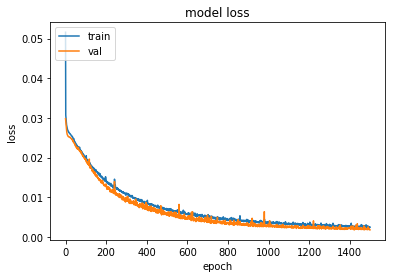

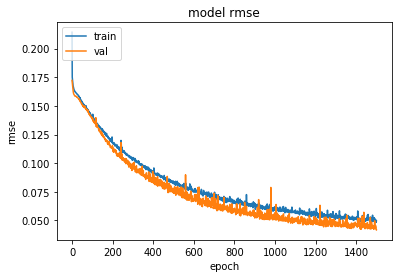

In [39]:
#2 hidden layers, both with 50 units, alpha=0.01, increased epochs to 1500
#LSTM call model definition
click_model12= click_stacked_stateless_LSTM2(units=50,lr=0.001, alpha=0.01, dropout=0.1)
click_model12.summary()

#Train LSTM
hist= stateless_fit(click_model12, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1500, 'click_wts_12.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [40]:
click_pred_train=click_model12.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model12.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model12.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  36.98133480937622
YRMSE train:  27.096160033841734
XRMSE val:  48.17115418480536
YRMSE val:  35.19163888984473
XRMSE test:  50.84883322748207
YRMSE test:  34.75471649951087


This model outpefroms all the models trained so far. It has 2 hidden layers with 50 units ech, recurrent dropout n both the layers, alpha=0.01 and trained for 1500 epochs.
Since, the stacked model with 2 hidden layers performed beter than the simple model with 1 hidden layer. Let's check the performance with 3 hiudden layers.

In [22]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM4(units, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=True, recurrent_dropout=dropout))
    model.add(LSTM(units, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_2 (LSTM)                (None, 18, 50)            20200     
_________________________________________________________________
lstm_3 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 102       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 2)                 0         
Total params: 51,102
Trainable params: 51,102
Non-trainable 


Epoch 00037: val_loss improved from 0.02251 to 0.02247, saving model to click_wts_13.hdf5
Epoch 38/1000
 - 8s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0226 - val_rmse: 0.1498

Epoch 00038: val_loss did not improve from 0.02247
Epoch 39/1000
 - 8s - loss: 0.0240 - rmse: 0.1545 - val_loss: 0.0220 - val_rmse: 0.1477

Epoch 00039: val_loss improved from 0.02247 to 0.02197, saving model to click_wts_13.hdf5
Epoch 40/1000
 - 8s - loss: 0.0236 - rmse: 0.1531 - val_loss: 0.0221 - val_rmse: 0.1479

Epoch 00040: val_loss did not improve from 0.02197
Epoch 41/1000
 - 8s - loss: 0.0235 - rmse: 0.1528 - val_loss: 0.0218 - val_rmse: 0.1472

Epoch 00041: val_loss improved from 0.02197 to 0.02185, saving model to click_wts_13.hdf5
Epoch 42/1000
 - 8s - loss: 0.0233 - rmse: 0.1523 - val_loss: 0.0215 - val_rmse: 0.1461

Epoch 00042: val_loss improved from 0.02185 to 0.02152, saving model to click_wts_13.hdf5
Epoch 43/1000
 - 7s - loss: 0.0233 - rmse: 0.1524 - val_loss: 0.0218 - val_rmse: 0.1469

Epo


Epoch 00087: val_loss did not improve from 0.01753
Epoch 88/1000
 - 8s - loss: 0.0190 - rmse: 0.1376 - val_loss: 0.0172 - val_rmse: 0.1304

Epoch 00088: val_loss improved from 0.01753 to 0.01716, saving model to click_wts_13.hdf5
Epoch 89/1000
 - 7s - loss: 0.0188 - rmse: 0.1369 - val_loss: 0.0172 - val_rmse: 0.1308

Epoch 00089: val_loss did not improve from 0.01716
Epoch 90/1000
 - 7s - loss: 0.0200 - rmse: 0.1410 - val_loss: 0.0179 - val_rmse: 0.1334

Epoch 00090: val_loss did not improve from 0.01716
Epoch 91/1000
 - 8s - loss: 0.0189 - rmse: 0.1372 - val_loss: 0.0174 - val_rmse: 0.1313

Epoch 00091: val_loss did not improve from 0.01716
Epoch 92/1000
 - 8s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0171 - val_rmse: 0.1303

Epoch 00092: val_loss improved from 0.01716 to 0.01712, saving model to click_wts_13.hdf5
Epoch 93/1000
 - 8s - loss: 0.0187 - rmse: 0.1363 - val_loss: 0.0171 - val_rmse: 0.1301

Epoch 00093: val_loss improved from 0.01712 to 0.01706, saving model to click_wts

 - 7s - loss: 0.0140 - rmse: 0.1181 - val_loss: 0.0127 - val_rmse: 0.1122

Epoch 00139: val_loss did not improve from 0.01259
Epoch 140/1000
 - 8s - loss: 0.0143 - rmse: 0.1193 - val_loss: 0.0124 - val_rmse: 0.1108

Epoch 00140: val_loss improved from 0.01259 to 0.01237, saving model to click_wts_13.hdf5
Epoch 141/1000
 - 8s - loss: 0.0139 - rmse: 0.1174 - val_loss: 0.0122 - val_rmse: 0.1099

Epoch 00141: val_loss improved from 0.01237 to 0.01217, saving model to click_wts_13.hdf5
Epoch 142/1000
 - 7s - loss: 0.0139 - rmse: 0.1176 - val_loss: 0.0121 - val_rmse: 0.1095

Epoch 00142: val_loss improved from 0.01217 to 0.01207, saving model to click_wts_13.hdf5
Epoch 143/1000
 - 7s - loss: 0.0138 - rmse: 0.1172 - val_loss: 0.0123 - val_rmse: 0.1105

Epoch 00143: val_loss did not improve from 0.01207
Epoch 144/1000
 - 7s - loss: 0.0137 - rmse: 0.1167 - val_loss: 0.0123 - val_rmse: 0.1107

Epoch 00144: val_loss did not improve from 0.01207
Epoch 145/1000
 - 7s - loss: 0.0137 - rmse: 0.1165 -

 - 7s - loss: 0.0110 - rmse: 0.1045 - val_loss: 0.0098 - val_rmse: 0.0984

Epoch 00192: val_loss did not improve from 0.00896
Epoch 193/1000
 - 7s - loss: 0.0110 - rmse: 0.1047 - val_loss: 0.0090 - val_rmse: 0.0947

Epoch 00193: val_loss did not improve from 0.00896
Epoch 194/1000
 - 7s - loss: 0.0104 - rmse: 0.1019 - val_loss: 0.0093 - val_rmse: 0.0959

Epoch 00194: val_loss did not improve from 0.00896
Epoch 195/1000
 - 7s - loss: 0.0104 - rmse: 0.1016 - val_loss: 0.0094 - val_rmse: 0.0964

Epoch 00195: val_loss did not improve from 0.00896
Epoch 196/1000
 - 7s - loss: 0.0103 - rmse: 0.1011 - val_loss: 0.0089 - val_rmse: 0.0940

Epoch 00196: val_loss improved from 0.00896 to 0.00891, saving model to click_wts_13.hdf5
Epoch 197/1000
 - 7s - loss: 0.0102 - rmse: 0.1007 - val_loss: 0.0094 - val_rmse: 0.0965

Epoch 00197: val_loss did not improve from 0.00891
Epoch 198/1000
 - 7s - loss: 0.0104 - rmse: 0.1019 - val_loss: 0.0088 - val_rmse: 0.0933

Epoch 00198: val_loss improved from 0.00

 - 7s - loss: 0.0080 - rmse: 0.0894 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00246: val_loss did not improve from 0.00682
Epoch 247/1000
 - 7s - loss: 0.0080 - rmse: 0.0889 - val_loss: 0.0069 - val_rmse: 0.0828

Epoch 00247: val_loss did not improve from 0.00682
Epoch 248/1000
 - 7s - loss: 0.0078 - rmse: 0.0879 - val_loss: 0.0064 - val_rmse: 0.0795

Epoch 00248: val_loss improved from 0.00682 to 0.00637, saving model to click_wts_13.hdf5
Epoch 249/1000
 - 7s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0064 - val_rmse: 0.0798

Epoch 00249: val_loss did not improve from 0.00637
Epoch 250/1000
 - 7s - loss: 0.0078 - rmse: 0.0881 - val_loss: 0.0069 - val_rmse: 0.0826

Epoch 00250: val_loss did not improve from 0.00637
Epoch 251/1000
 - 7s - loss: 0.0078 - rmse: 0.0879 - val_loss: 0.0069 - val_rmse: 0.0826

Epoch 00251: val_loss did not improve from 0.00637
Epoch 252/1000
 - 7s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0066 - val_rmse: 0.0806

Epoch 00252: val_loss did not improve fr

 - 7s - loss: 0.0066 - rmse: 0.0810 - val_loss: 0.0058 - val_rmse: 0.0758

Epoch 00302: val_loss did not improve from 0.00508
Epoch 303/1000
 - 7s - loss: 0.0067 - rmse: 0.0816 - val_loss: 0.0057 - val_rmse: 0.0750

Epoch 00303: val_loss did not improve from 0.00508
Epoch 304/1000
 - 7s - loss: 0.0063 - rmse: 0.0791 - val_loss: 0.0055 - val_rmse: 0.0741

Epoch 00304: val_loss did not improve from 0.00508
Epoch 305/1000
 - 7s - loss: 0.0065 - rmse: 0.0802 - val_loss: 0.0054 - val_rmse: 0.0730

Epoch 00305: val_loss did not improve from 0.00508
Epoch 306/1000
 - 7s - loss: 0.0061 - rmse: 0.0780 - val_loss: 0.0057 - val_rmse: 0.0754

Epoch 00306: val_loss did not improve from 0.00508
Epoch 307/1000
 - 8s - loss: 0.0063 - rmse: 0.0791 - val_loss: 0.0051 - val_rmse: 0.0712

Epoch 00307: val_loss did not improve from 0.00508
Epoch 308/1000
 - 7s - loss: 0.0064 - rmse: 0.0796 - val_loss: 0.0054 - val_rmse: 0.0733

Epoch 00308: val_loss did not improve from 0.00508
Epoch 309/1000
 - 7s - loss:


Epoch 00358: val_loss did not improve from 0.00434
Epoch 359/1000
 - 7s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0048 - val_rmse: 0.0692

Epoch 00359: val_loss did not improve from 0.00434
Epoch 360/1000
 - 7s - loss: 0.0048 - rmse: 0.0691 - val_loss: 0.0051 - val_rmse: 0.0713

Epoch 00360: val_loss did not improve from 0.00434
Epoch 361/1000
 - 7s - loss: 0.0055 - rmse: 0.0735 - val_loss: 0.0043 - val_rmse: 0.0655

Epoch 00361: val_loss did not improve from 0.00434
Epoch 362/1000
 - 7s - loss: 0.0052 - rmse: 0.0717 - val_loss: 0.0046 - val_rmse: 0.0677

Epoch 00362: val_loss did not improve from 0.00434
Epoch 363/1000
 - 7s - loss: 0.0052 - rmse: 0.0716 - val_loss: 0.0042 - val_rmse: 0.0640

Epoch 00363: val_loss improved from 0.00434 to 0.00416, saving model to click_wts_13.hdf5
Epoch 364/1000
 - 7s - loss: 0.0050 - rmse: 0.0707 - val_loss: 0.0046 - val_rmse: 0.0671

Epoch 00364: val_loss did not improve from 0.00416
Epoch 365/1000
 - 7s - loss: 0.0053 - rmse: 0.0727 - val_loss: 

 - 8s - loss: 0.0042 - rmse: 0.0649 - val_loss: 0.0038 - val_rmse: 0.0617

Epoch 00415: val_loss did not improve from 0.00344
Epoch 416/1000
 - 8s - loss: 0.0042 - rmse: 0.0644 - val_loss: 0.0035 - val_rmse: 0.0587

Epoch 00416: val_loss did not improve from 0.00344
Epoch 417/1000
 - 8s - loss: 0.0043 - rmse: 0.0653 - val_loss: 0.0038 - val_rmse: 0.0611

Epoch 00417: val_loss did not improve from 0.00344
Epoch 418/1000
 - 8s - loss: 0.0042 - rmse: 0.0643 - val_loss: 0.0039 - val_rmse: 0.0617

Epoch 00418: val_loss did not improve from 0.00344
Epoch 419/1000
 - 8s - loss: 0.0043 - rmse: 0.0649 - val_loss: 0.0036 - val_rmse: 0.0596

Epoch 00419: val_loss did not improve from 0.00344
Epoch 420/1000
 - 8s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0036 - val_rmse: 0.0594

Epoch 00420: val_loss did not improve from 0.00344
Epoch 421/1000
 - 9s - loss: 0.0042 - rmse: 0.0640 - val_loss: 0.0034 - val_rmse: 0.0579

Epoch 00421: val_loss improved from 0.00344 to 0.00339, saving model to click_w

 - 8s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0031 - val_rmse: 0.0552

Epoch 00472: val_loss did not improve from 0.00308
Epoch 473/1000
 - 8s - loss: 0.0037 - rmse: 0.0605 - val_loss: 0.0034 - val_rmse: 0.0576

Epoch 00473: val_loss did not improve from 0.00308
Epoch 474/1000
 - 8s - loss: 0.0038 - rmse: 0.0612 - val_loss: 0.0029 - val_rmse: 0.0540

Epoch 00474: val_loss improved from 0.00308 to 0.00295, saving model to click_wts_13.hdf5
Epoch 475/1000
 - 8s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0035 - val_rmse: 0.0584

Epoch 00475: val_loss did not improve from 0.00295
Epoch 476/1000
 - 8s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0031 - val_rmse: 0.0550

Epoch 00476: val_loss did not improve from 0.00295
Epoch 477/1000
 - 8s - loss: 0.0035 - rmse: 0.0591 - val_loss: 0.0030 - val_rmse: 0.0549

Epoch 00477: val_loss did not improve from 0.00295
Epoch 478/1000
 - 8s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0033 - val_rmse: 0.0567

Epoch 00478: val_loss did not improve fr


Epoch 00528: val_loss did not improve from 0.00245
Epoch 529/1000
 - 8s - loss: 0.0031 - rmse: 0.0549 - val_loss: 0.0031 - val_rmse: 0.0553

Epoch 00529: val_loss did not improve from 0.00245
Epoch 530/1000
 - 8s - loss: 0.0032 - rmse: 0.0557 - val_loss: 0.0030 - val_rmse: 0.0547

Epoch 00530: val_loss did not improve from 0.00245
Epoch 531/1000
 - 8s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0026 - val_rmse: 0.0508

Epoch 00531: val_loss did not improve from 0.00245
Epoch 532/1000
 - 8s - loss: 0.0032 - rmse: 0.0564 - val_loss: 0.0030 - val_rmse: 0.0546

Epoch 00532: val_loss did not improve from 0.00245
Epoch 533/1000
 - 8s - loss: 0.0032 - rmse: 0.0565 - val_loss: 0.0028 - val_rmse: 0.0527

Epoch 00533: val_loss did not improve from 0.00245
Epoch 534/1000
 - 8s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0030 - val_rmse: 0.0547

Epoch 00534: val_loss did not improve from 0.00245
Epoch 535/1000
 - 8s - loss: 0.0032 - rmse: 0.0557 - val_loss: 0.0025 - val_rmse: 0.0495

Epoch 00535:

 - 8s - loss: 0.0027 - rmse: 0.0517 - val_loss: 0.0024 - val_rmse: 0.0485

Epoch 00586: val_loss did not improve from 0.00226
Epoch 587/1000
 - 8s - loss: 0.0026 - rmse: 0.0511 - val_loss: 0.0026 - val_rmse: 0.0503

Epoch 00587: val_loss did not improve from 0.00226
Epoch 588/1000
 - 8s - loss: 0.0028 - rmse: 0.0527 - val_loss: 0.0025 - val_rmse: 0.0494

Epoch 00588: val_loss did not improve from 0.00226
Epoch 589/1000
 - 8s - loss: 0.0027 - rmse: 0.0516 - val_loss: 0.0030 - val_rmse: 0.0541

Epoch 00589: val_loss did not improve from 0.00226
Epoch 590/1000
 - 8s - loss: 0.0034 - rmse: 0.0578 - val_loss: 0.0032 - val_rmse: 0.0555

Epoch 00590: val_loss did not improve from 0.00226
Epoch 591/1000
 - 8s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0032 - val_rmse: 0.0561

Epoch 00591: val_loss did not improve from 0.00226
Epoch 592/1000
 - 8s - loss: 0.0029 - rmse: 0.0534 - val_loss: 0.0024 - val_rmse: 0.0489

Epoch 00592: val_loss did not improve from 0.00226
Epoch 593/1000
 - 8s - loss:


Epoch 00643: val_loss did not improve from 0.00198
Epoch 644/1000
 - 8s - loss: 0.0024 - rmse: 0.0483 - val_loss: 0.0025 - val_rmse: 0.0490

Epoch 00644: val_loss did not improve from 0.00198
Epoch 645/1000
 - 8s - loss: 0.0026 - rmse: 0.0502 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 00645: val_loss did not improve from 0.00198
Epoch 646/1000
 - 9s - loss: 0.0028 - rmse: 0.0526 - val_loss: 0.0031 - val_rmse: 0.0552

Epoch 00646: val_loss did not improve from 0.00198
Epoch 647/1000
 - 8s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0025 - val_rmse: 0.0501

Epoch 00647: val_loss did not improve from 0.00198
Epoch 648/1000
 - 8s - loss: 0.0024 - rmse: 0.0488 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 00648: val_loss did not improve from 0.00198
Epoch 649/1000
 - 8s - loss: 0.0024 - rmse: 0.0486 - val_loss: 0.0024 - val_rmse: 0.0485

Epoch 00649: val_loss did not improve from 0.00198
Epoch 650/1000
 - 8s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0022 - val_rmse: 0.0460

Epoch 00650:


Epoch 00701: val_loss did not improve from 0.00192
Epoch 702/1000
 - 8s - loss: 0.0023 - rmse: 0.0481 - val_loss: 0.0022 - val_rmse: 0.0458

Epoch 00702: val_loss did not improve from 0.00192
Epoch 703/1000
 - 8s - loss: 0.0026 - rmse: 0.0507 - val_loss: 0.0021 - val_rmse: 0.0455

Epoch 00703: val_loss did not improve from 0.00192
Epoch 704/1000
 - 8s - loss: 0.0023 - rmse: 0.0479 - val_loss: 0.0022 - val_rmse: 0.0465

Epoch 00704: val_loss did not improve from 0.00192
Epoch 705/1000
 - 8s - loss: 0.0022 - rmse: 0.0465 - val_loss: 0.0020 - val_rmse: 0.0444

Epoch 00705: val_loss did not improve from 0.00192
Epoch 706/1000
 - 9s - loss: 0.0027 - rmse: 0.0511 - val_loss: 0.0026 - val_rmse: 0.0509

Epoch 00706: val_loss did not improve from 0.00192
Epoch 707/1000
 - 8s - loss: 0.0022 - rmse: 0.0468 - val_loss: 0.0020 - val_rmse: 0.0447

Epoch 00707: val_loss did not improve from 0.00192
Epoch 708/1000
 - 8s - loss: 0.0023 - rmse: 0.0473 - val_loss: 0.0020 - val_rmse: 0.0447

Epoch 00708:

 - 8s - loss: 0.0022 - rmse: 0.0463 - val_loss: 0.0019 - val_rmse: 0.0429

Epoch 00759: val_loss did not improve from 0.00163
Epoch 760/1000
 - 8s - loss: 0.0021 - rmse: 0.0456 - val_loss: 0.0029 - val_rmse: 0.0530

Epoch 00760: val_loss did not improve from 0.00163
Epoch 761/1000
 - 8s - loss: 0.0022 - rmse: 0.0470 - val_loss: 0.0027 - val_rmse: 0.0517

Epoch 00761: val_loss did not improve from 0.00163
Epoch 762/1000
 - 8s - loss: 0.0021 - rmse: 0.0456 - val_loss: 0.0018 - val_rmse: 0.0422

Epoch 00762: val_loss did not improve from 0.00163
Epoch 763/1000
 - 8s - loss: 0.0020 - rmse: 0.0447 - val_loss: 0.0017 - val_rmse: 0.0400

Epoch 00763: val_loss did not improve from 0.00163
Epoch 764/1000
 - 8s - loss: 0.0019 - rmse: 0.0430 - val_loss: 0.0021 - val_rmse: 0.0449

Epoch 00764: val_loss did not improve from 0.00163
Epoch 765/1000
 - 9s - loss: 0.0019 - rmse: 0.0432 - val_loss: 0.0020 - val_rmse: 0.0438

Epoch 00765: val_loss did not improve from 0.00163
Epoch 766/1000
 - 8s - loss:

 - 8s - loss: 0.0019 - rmse: 0.0429 - val_loss: 0.0019 - val_rmse: 0.0435

Epoch 00817: val_loss did not improve from 0.00156
Epoch 818/1000
 - 8s - loss: 0.0017 - rmse: 0.0411 - val_loss: 0.0019 - val_rmse: 0.0428

Epoch 00818: val_loss did not improve from 0.00156
Epoch 819/1000
 - 8s - loss: 0.0017 - rmse: 0.0405 - val_loss: 0.0015 - val_rmse: 0.0381

Epoch 00819: val_loss improved from 0.00156 to 0.00150, saving model to click_wts_13.hdf5
Epoch 820/1000
 - 8s - loss: 0.0015 - rmse: 0.0389 - val_loss: 0.0016 - val_rmse: 0.0395

Epoch 00820: val_loss did not improve from 0.00150
Epoch 821/1000
 - 8s - loss: 0.0017 - rmse: 0.0404 - val_loss: 0.0020 - val_rmse: 0.0444

Epoch 00821: val_loss did not improve from 0.00150
Epoch 822/1000
 - 8s - loss: 0.0019 - rmse: 0.0436 - val_loss: 0.0019 - val_rmse: 0.0423

Epoch 00822: val_loss did not improve from 0.00150
Epoch 823/1000
 - 8s - loss: 0.0020 - rmse: 0.0447 - val_loss: 0.0019 - val_rmse: 0.0429

Epoch 00823: val_loss did not improve fr

 - 8s - loss: 0.0020 - rmse: 0.0439 - val_loss: 0.0018 - val_rmse: 0.0414

Epoch 00875: val_loss did not improve from 0.00146
Epoch 876/1000
 - 8s - loss: 0.0017 - rmse: 0.0408 - val_loss: 0.0022 - val_rmse: 0.0457

Epoch 00876: val_loss did not improve from 0.00146
Epoch 877/1000
 - 8s - loss: 0.0021 - rmse: 0.0457 - val_loss: 0.0019 - val_rmse: 0.0422

Epoch 00877: val_loss did not improve from 0.00146
Epoch 878/1000
 - 8s - loss: 0.0018 - rmse: 0.0415 - val_loss: 0.0021 - val_rmse: 0.0457

Epoch 00878: val_loss did not improve from 0.00146
Epoch 879/1000
 - 8s - loss: 0.0018 - rmse: 0.0423 - val_loss: 0.0018 - val_rmse: 0.0419

Epoch 00879: val_loss did not improve from 0.00146
Epoch 880/1000
 - 8s - loss: 0.0016 - rmse: 0.0396 - val_loss: 0.0016 - val_rmse: 0.0396

Epoch 00880: val_loss did not improve from 0.00146
Epoch 881/1000
 - 8s - loss: 0.0015 - rmse: 0.0384 - val_loss: 0.0015 - val_rmse: 0.0388

Epoch 00881: val_loss did not improve from 0.00146
Epoch 882/1000
 - 8s - loss:


Epoch 00933: val_loss did not improve from 0.00146
Epoch 934/1000
 - 8s - loss: 0.0015 - rmse: 0.0386 - val_loss: 0.0018 - val_rmse: 0.0412

Epoch 00934: val_loss did not improve from 0.00146
Epoch 935/1000
 - 8s - loss: 0.0014 - rmse: 0.0378 - val_loss: 0.0016 - val_rmse: 0.0388

Epoch 00935: val_loss did not improve from 0.00146
Epoch 936/1000
 - 8s - loss: 0.0015 - rmse: 0.0384 - val_loss: 0.0016 - val_rmse: 0.0394

Epoch 00936: val_loss did not improve from 0.00146
Epoch 937/1000
 - 8s - loss: 0.0017 - rmse: 0.0405 - val_loss: 0.0017 - val_rmse: 0.0409

Epoch 00937: val_loss did not improve from 0.00146
Epoch 938/1000
 - 8s - loss: 0.0020 - rmse: 0.0445 - val_loss: 0.0016 - val_rmse: 0.0388

Epoch 00938: val_loss did not improve from 0.00146
Epoch 939/1000
 - 8s - loss: 0.0016 - rmse: 0.0393 - val_loss: 0.0016 - val_rmse: 0.0393

Epoch 00939: val_loss did not improve from 0.00146
Epoch 940/1000
 - 8s - loss: 0.0014 - rmse: 0.0366 - val_loss: 0.0016 - val_rmse: 0.0399

Epoch 00940:


Epoch 00991: val_loss did not improve from 0.00133
Epoch 992/1000
 - 8s - loss: 0.0014 - rmse: 0.0378 - val_loss: 0.0015 - val_rmse: 0.0387

Epoch 00992: val_loss did not improve from 0.00133
Epoch 993/1000
 - 8s - loss: 0.0014 - rmse: 0.0369 - val_loss: 0.0016 - val_rmse: 0.0396

Epoch 00993: val_loss did not improve from 0.00133
Epoch 994/1000
 - 8s - loss: 0.0016 - rmse: 0.0400 - val_loss: 0.0023 - val_rmse: 0.0472

Epoch 00994: val_loss did not improve from 0.00133
Epoch 995/1000
 - 8s - loss: 0.0017 - rmse: 0.0409 - val_loss: 0.0018 - val_rmse: 0.0420

Epoch 00995: val_loss did not improve from 0.00133
Epoch 996/1000
 - 8s - loss: 0.0019 - rmse: 0.0432 - val_loss: 0.0014 - val_rmse: 0.0372

Epoch 00996: val_loss did not improve from 0.00133
Epoch 997/1000
 - 8s - loss: 0.0017 - rmse: 0.0402 - val_loss: 0.0021 - val_rmse: 0.0446

Epoch 00997: val_loss did not improve from 0.00133
Epoch 998/1000
 - 8s - loss: 0.0015 - rmse: 0.0383 - val_loss: 0.0013 - val_rmse: 0.0359

Epoch 00998:

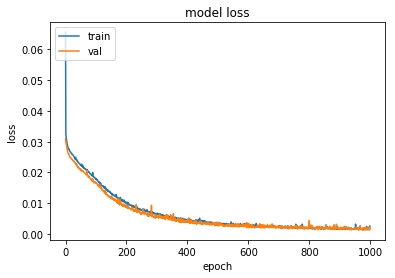

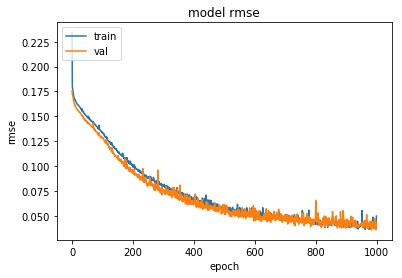

In [25]:
#3 hidden layers, all with 50 units, alpha=0.01
#LSTM call model definition
click_model13= click_stacked_stateless_LSTM4(units=50,lr=0.001, alpha=0.01, dropout=0.1)
click_model13.summary()

#Train LSTM
hist= stateless_fit(click_model13, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_wts_13.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [26]:
click_pred_train=click_model13.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model13.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model13.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  37.81025682435326
YRMSE train:  27.261390332747027
XRMSE val:  48.9191049087695
YRMSE val:  35.60248648154793
XRMSE test:  47.00552246234877
YRMSE test:  32.572189479431515


3 hidden layers have outperformed 2 hidden layers. This is the best model so far.

In [27]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateless_LSTM5(units_1, units_2, units_3, lr, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(LSTM(units_1, return_sequences=True, input_shape=(timesteps,2), recurrent_dropout=dropout))
    model.add(LSTM(units_2, return_sequences=True, recurrent_dropout=dropout))
    model.add(LSTM(units_3, return_sequences=False, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 18, 50)            10600     
_________________________________________________________________
lstm_5 (LSTM)                (None, 18, 40)            14560     
_________________________________________________________________
lstm_6 (LSTM)                (None, 30)                8520      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 33,742
Trainable params: 33,742
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 11s - loss: 0.0629 - rmse: 0.2341 - val_loss: 0

 - 8s - loss: 0.0242 - rmse: 0.1552 - val_loss: 0.0227 - val_rmse: 0.1500

Epoch 00043: val_loss improved from 0.02322 to 0.02267, saving model to click_wts_14.hdf5
Epoch 44/1000
 - 8s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0231 - val_rmse: 0.1515

Epoch 00044: val_loss did not improve from 0.02267
Epoch 45/1000
 - 8s - loss: 0.0241 - rmse: 0.1548 - val_loss: 0.0229 - val_rmse: 0.1506

Epoch 00045: val_loss did not improve from 0.02267
Epoch 46/1000
 - 8s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0225 - val_rmse: 0.1495

Epoch 00046: val_loss improved from 0.02267 to 0.02251, saving model to click_wts_14.hdf5
Epoch 47/1000
 - 8s - loss: 0.0237 - rmse: 0.1537 - val_loss: 0.0226 - val_rmse: 0.1498

Epoch 00047: val_loss did not improve from 0.02251
Epoch 48/1000
 - 8s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0225 - val_rmse: 0.1493

Epoch 00048: val_loss improved from 0.02251 to 0.02246, saving model to click_wts_14.hdf5
Epoch 49/1000
 - 8s - loss: 0.0236 - rmse: 0.1531 - val_l


Epoch 00093: val_loss improved from 0.01845 to 0.01809, saving model to click_wts_14.hdf5
Epoch 94/1000
 - 9s - loss: 0.0196 - rmse: 0.1398 - val_loss: 0.0184 - val_rmse: 0.1351

Epoch 00094: val_loss did not improve from 0.01809
Epoch 95/1000
 - 8s - loss: 0.0195 - rmse: 0.1393 - val_loss: 0.0180 - val_rmse: 0.1337

Epoch 00095: val_loss improved from 0.01809 to 0.01803, saving model to click_wts_14.hdf5
Epoch 96/1000
 - 8s - loss: 0.0194 - rmse: 0.1388 - val_loss: 0.0180 - val_rmse: 0.1337

Epoch 00096: val_loss did not improve from 0.01803
Epoch 97/1000
 - 8s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0181 - val_rmse: 0.1338

Epoch 00097: val_loss did not improve from 0.01803
Epoch 98/1000
 - 8s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0181 - val_rmse: 0.1339

Epoch 00098: val_loss did not improve from 0.01803
Epoch 99/1000
 - 8s - loss: 0.0190 - rmse: 0.1377 - val_loss: 0.0176 - val_rmse: 0.1321

Epoch 00099: val_loss improved from 0.01803 to 0.01759, saving model to click_wts

 - 8s - loss: 0.0151 - rmse: 0.1225 - val_loss: 0.0136 - val_rmse: 0.1162

Epoch 00145: val_loss improved from 0.01376 to 0.01362, saving model to click_wts_14.hdf5
Epoch 146/1000
 - 8s - loss: 0.0149 - rmse: 0.1217 - val_loss: 0.0141 - val_rmse: 0.1182

Epoch 00146: val_loss did not improve from 0.01362
Epoch 147/1000
 - 8s - loss: 0.0150 - rmse: 0.1223 - val_loss: 0.0138 - val_rmse: 0.1173

Epoch 00147: val_loss did not improve from 0.01362
Epoch 148/1000
 - 8s - loss: 0.0149 - rmse: 0.1216 - val_loss: 0.0134 - val_rmse: 0.1151

Epoch 00148: val_loss improved from 0.01362 to 0.01335, saving model to click_wts_14.hdf5
Epoch 149/1000
 - 8s - loss: 0.0149 - rmse: 0.1215 - val_loss: 0.0130 - val_rmse: 0.1136

Epoch 00149: val_loss improved from 0.01335 to 0.01302, saving model to click_wts_14.hdf5
Epoch 150/1000
 - 8s - loss: 0.0147 - rmse: 0.1207 - val_loss: 0.0136 - val_rmse: 0.1162

Epoch 00150: val_loss did not improve from 0.01302
Epoch 151/1000
 - 8s - loss: 0.0147 - rmse: 0.1208 -

 - 9s - loss: 0.0113 - rmse: 0.1060 - val_loss: 0.0097 - val_rmse: 0.0980

Epoch 00198: val_loss improved from 0.01038 to 0.00968, saving model to click_wts_14.hdf5
Epoch 199/1000
 - 8s - loss: 0.0115 - rmse: 0.1069 - val_loss: 0.0101 - val_rmse: 0.1000

Epoch 00199: val_loss did not improve from 0.00968
Epoch 200/1000
 - 8s - loss: 0.0114 - rmse: 0.1063 - val_loss: 0.0101 - val_rmse: 0.1001

Epoch 00200: val_loss did not improve from 0.00968
Epoch 201/1000
 - 8s - loss: 0.0115 - rmse: 0.1068 - val_loss: 0.0107 - val_rmse: 0.1029

Epoch 00201: val_loss did not improve from 0.00968
Epoch 202/1000
 - 8s - loss: 0.0117 - rmse: 0.1077 - val_loss: 0.0104 - val_rmse: 0.1014

Epoch 00202: val_loss did not improve from 0.00968
Epoch 203/1000
 - 8s - loss: 0.0115 - rmse: 0.1068 - val_loss: 0.0103 - val_rmse: 0.1009

Epoch 00203: val_loss did not improve from 0.00968
Epoch 204/1000
 - 8s - loss: 0.0112 - rmse: 0.1053 - val_loss: 0.0096 - val_rmse: 0.0976

Epoch 00204: val_loss improved from 0.00


Epoch 00252: val_loss did not improve from 0.00809
Epoch 253/1000
 - 8s - loss: 0.0099 - rmse: 0.0993 - val_loss: 0.0082 - val_rmse: 0.0903

Epoch 00253: val_loss did not improve from 0.00809
Epoch 254/1000
 - 8s - loss: 0.0092 - rmse: 0.0956 - val_loss: 0.0078 - val_rmse: 0.0882

Epoch 00254: val_loss improved from 0.00809 to 0.00784, saving model to click_wts_14.hdf5
Epoch 255/1000
 - 8s - loss: 0.0092 - rmse: 0.0957 - val_loss: 0.0084 - val_rmse: 0.0915

Epoch 00255: val_loss did not improve from 0.00784
Epoch 256/1000
 - 8s - loss: 0.0093 - rmse: 0.0964 - val_loss: 0.0078 - val_rmse: 0.0882

Epoch 00256: val_loss improved from 0.00784 to 0.00783, saving model to click_wts_14.hdf5
Epoch 257/1000
 - 9s - loss: 0.0089 - rmse: 0.0940 - val_loss: 0.0081 - val_rmse: 0.0894

Epoch 00257: val_loss did not improve from 0.00783
Epoch 258/1000
 - 8s - loss: 0.0093 - rmse: 0.0961 - val_loss: 0.0086 - val_rmse: 0.0922

Epoch 00258: val_loss did not improve from 0.00783
Epoch 259/1000
 - 8s - l


Epoch 00308: val_loss did not improve from 0.00659
Epoch 309/1000
 - 8s - loss: 0.0079 - rmse: 0.0888 - val_loss: 0.0072 - val_rmse: 0.0844

Epoch 00309: val_loss did not improve from 0.00659
Epoch 310/1000
 - 8s - loss: 0.0079 - rmse: 0.0886 - val_loss: 0.0065 - val_rmse: 0.0805

Epoch 00310: val_loss improved from 0.00659 to 0.00652, saving model to click_wts_14.hdf5
Epoch 311/1000
 - 8s - loss: 0.0078 - rmse: 0.0878 - val_loss: 0.0071 - val_rmse: 0.0841

Epoch 00311: val_loss did not improve from 0.00652
Epoch 312/1000
 - 8s - loss: 0.0079 - rmse: 0.0883 - val_loss: 0.0073 - val_rmse: 0.0851

Epoch 00312: val_loss did not improve from 0.00652
Epoch 313/1000
 - 8s - loss: 0.0076 - rmse: 0.0867 - val_loss: 0.0071 - val_rmse: 0.0839

Epoch 00313: val_loss did not improve from 0.00652
Epoch 314/1000
 - 8s - loss: 0.0077 - rmse: 0.0872 - val_loss: 0.0069 - val_rmse: 0.0825

Epoch 00314: val_loss did not improve from 0.00652
Epoch 315/1000
 - 8s - loss: 0.0076 - rmse: 0.0867 - val_loss: 


Epoch 00364: val_loss did not improve from 0.00555
Epoch 365/1000
 - 8s - loss: 0.0066 - rmse: 0.0808 - val_loss: 0.0056 - val_rmse: 0.0743

Epoch 00365: val_loss did not improve from 0.00555
Epoch 366/1000
 - 8s - loss: 0.0065 - rmse: 0.0801 - val_loss: 0.0058 - val_rmse: 0.0756

Epoch 00366: val_loss did not improve from 0.00555
Epoch 367/1000
 - 8s - loss: 0.0070 - rmse: 0.0831 - val_loss: 0.0060 - val_rmse: 0.0773

Epoch 00367: val_loss did not improve from 0.00555
Epoch 368/1000
 - 8s - loss: 0.0069 - rmse: 0.0829 - val_loss: 0.0063 - val_rmse: 0.0788

Epoch 00368: val_loss did not improve from 0.00555
Epoch 369/1000
 - 8s - loss: 0.0065 - rmse: 0.0803 - val_loss: 0.0058 - val_rmse: 0.0757

Epoch 00369: val_loss did not improve from 0.00555
Epoch 370/1000
 - 8s - loss: 0.0066 - rmse: 0.0806 - val_loss: 0.0056 - val_rmse: 0.0747

Epoch 00370: val_loss did not improve from 0.00555
Epoch 371/1000
 - 8s - loss: 0.0066 - rmse: 0.0810 - val_loss: 0.0056 - val_rmse: 0.0747

Epoch 00371:

 - 9s - loss: 0.0059 - rmse: 0.0767 - val_loss: 0.0051 - val_rmse: 0.0712

Epoch 00421: val_loss did not improve from 0.00471
Epoch 422/1000
 - 8s - loss: 0.0058 - rmse: 0.0757 - val_loss: 0.0052 - val_rmse: 0.0721

Epoch 00422: val_loss did not improve from 0.00471
Epoch 423/1000
 - 8s - loss: 0.0059 - rmse: 0.0765 - val_loss: 0.0048 - val_rmse: 0.0689

Epoch 00423: val_loss did not improve from 0.00471
Epoch 424/1000
 - 8s - loss: 0.0057 - rmse: 0.0755 - val_loss: 0.0046 - val_rmse: 0.0675

Epoch 00424: val_loss improved from 0.00471 to 0.00460, saving model to click_wts_14.hdf5
Epoch 425/1000
 - 8s - loss: 0.0057 - rmse: 0.0749 - val_loss: 0.0049 - val_rmse: 0.0695

Epoch 00425: val_loss did not improve from 0.00460
Epoch 426/1000
 - 8s - loss: 0.0057 - rmse: 0.0751 - val_loss: 0.0048 - val_rmse: 0.0692

Epoch 00426: val_loss did not improve from 0.00460
Epoch 427/1000
 - 8s - loss: 0.0054 - rmse: 0.0735 - val_loss: 0.0049 - val_rmse: 0.0698

Epoch 00427: val_loss did not improve fr


Epoch 00477: val_loss did not improve from 0.00414
Epoch 478/1000
 - 8s - loss: 0.0052 - rmse: 0.0714 - val_loss: 0.0045 - val_rmse: 0.0670

Epoch 00478: val_loss did not improve from 0.00414
Epoch 479/1000
 - 8s - loss: 0.0051 - rmse: 0.0709 - val_loss: 0.0041 - val_rmse: 0.0640

Epoch 00479: val_loss did not improve from 0.00414
Epoch 480/1000
 - 9s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0043 - val_rmse: 0.0649

Epoch 00480: val_loss did not improve from 0.00414
Epoch 481/1000
 - 8s - loss: 0.0052 - rmse: 0.0720 - val_loss: 0.0042 - val_rmse: 0.0646

Epoch 00481: val_loss did not improve from 0.00414
Epoch 482/1000
 - 8s - loss: 0.0050 - rmse: 0.0704 - val_loss: 0.0041 - val_rmse: 0.0635

Epoch 00482: val_loss improved from 0.00414 to 0.00409, saving model to click_wts_14.hdf5
Epoch 483/1000
 - 8s - loss: 0.0053 - rmse: 0.0721 - val_loss: 0.0049 - val_rmse: 0.0696

Epoch 00483: val_loss did not improve from 0.00409
Epoch 484/1000
 - 8s - loss: 0.0053 - rmse: 0.0726 - val_loss: 

 - 8s - loss: 0.0046 - rmse: 0.0673 - val_loss: 0.0042 - val_rmse: 0.0643

Epoch 00534: val_loss did not improve from 0.00363
Epoch 535/1000
 - 8s - loss: 0.0044 - rmse: 0.0664 - val_loss: 0.0041 - val_rmse: 0.0640

Epoch 00535: val_loss did not improve from 0.00363
Epoch 536/1000
 - 8s - loss: 0.0046 - rmse: 0.0673 - val_loss: 0.0041 - val_rmse: 0.0639

Epoch 00536: val_loss did not improve from 0.00363
Epoch 537/1000
 - 8s - loss: 0.0047 - rmse: 0.0683 - val_loss: 0.0048 - val_rmse: 0.0687

Epoch 00537: val_loss did not improve from 0.00363
Epoch 538/1000
 - 8s - loss: 0.0045 - rmse: 0.0669 - val_loss: 0.0039 - val_rmse: 0.0621

Epoch 00538: val_loss did not improve from 0.00363
Epoch 539/1000
 - 9s - loss: 0.0046 - rmse: 0.0674 - val_loss: 0.0040 - val_rmse: 0.0632

Epoch 00539: val_loss did not improve from 0.00363
Epoch 540/1000
 - 8s - loss: 0.0043 - rmse: 0.0657 - val_loss: 0.0038 - val_rmse: 0.0611

Epoch 00540: val_loss did not improve from 0.00363
Epoch 541/1000
 - 8s - loss:

 - 8s - loss: 0.0039 - rmse: 0.0619 - val_loss: 0.0035 - val_rmse: 0.0583

Epoch 00591: val_loss did not improve from 0.00327
Epoch 592/1000
 - 8s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0036 - val_rmse: 0.0592

Epoch 00592: val_loss did not improve from 0.00327
Epoch 593/1000
 - 8s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0035 - val_rmse: 0.0585

Epoch 00593: val_loss did not improve from 0.00327
Epoch 594/1000
 - 8s - loss: 0.0039 - rmse: 0.0620 - val_loss: 0.0037 - val_rmse: 0.0601

Epoch 00594: val_loss did not improve from 0.00327
Epoch 595/1000
 - 8s - loss: 0.0037 - rmse: 0.0609 - val_loss: 0.0034 - val_rmse: 0.0578

Epoch 00595: val_loss did not improve from 0.00327
Epoch 596/1000
 - 8s - loss: 0.0039 - rmse: 0.0621 - val_loss: 0.0033 - val_rmse: 0.0568

Epoch 00596: val_loss did not improve from 0.00327
Epoch 597/1000
 - 8s - loss: 0.0044 - rmse: 0.0658 - val_loss: 0.0039 - val_rmse: 0.0623

Epoch 00597: val_loss did not improve from 0.00327
Epoch 598/1000
 - 8s - loss:

 - 8s - loss: 0.0036 - rmse: 0.0599 - val_loss: 0.0035 - val_rmse: 0.0587

Epoch 00648: val_loss did not improve from 0.00291
Epoch 649/1000
 - 8s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0034 - val_rmse: 0.0581

Epoch 00649: val_loss did not improve from 0.00291
Epoch 650/1000
 - 8s - loss: 0.0036 - rmse: 0.0597 - val_loss: 0.0032 - val_rmse: 0.0564

Epoch 00650: val_loss did not improve from 0.00291
Epoch 651/1000
 - 8s - loss: 0.0037 - rmse: 0.0606 - val_loss: 0.0034 - val_rmse: 0.0578

Epoch 00651: val_loss did not improve from 0.00291
Epoch 652/1000
 - 8s - loss: 0.0036 - rmse: 0.0597 - val_loss: 0.0031 - val_rmse: 0.0553

Epoch 00652: val_loss did not improve from 0.00291
Epoch 653/1000
 - 8s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0030 - val_rmse: 0.0547

Epoch 00653: val_loss did not improve from 0.00291
Epoch 654/1000
 - 8s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0030 - val_rmse: 0.0541

Epoch 00654: val_loss did not improve from 0.00291
Epoch 655/1000
 - 8s - loss:

 - 8s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0031 - val_rmse: 0.0549

Epoch 00705: val_loss did not improve from 0.00267
Epoch 706/1000
 - 8s - loss: 0.0033 - rmse: 0.0568 - val_loss: 0.0028 - val_rmse: 0.0526

Epoch 00706: val_loss did not improve from 0.00267
Epoch 707/1000
 - 8s - loss: 0.0035 - rmse: 0.0586 - val_loss: 0.0031 - val_rmse: 0.0555

Epoch 00707: val_loss did not improve from 0.00267
Epoch 708/1000
 - 8s - loss: 0.0036 - rmse: 0.0599 - val_loss: 0.0030 - val_rmse: 0.0544

Epoch 00708: val_loss did not improve from 0.00267
Epoch 709/1000
 - 8s - loss: 0.0032 - rmse: 0.0566 - val_loss: 0.0029 - val_rmse: 0.0532

Epoch 00709: val_loss did not improve from 0.00267
Epoch 710/1000
 - 8s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0027 - val_rmse: 0.0512

Epoch 00710: val_loss did not improve from 0.00267
Epoch 711/1000
 - 8s - loss: 0.0032 - rmse: 0.0562 - val_loss: 0.0029 - val_rmse: 0.0529

Epoch 00711: val_loss did not improve from 0.00267
Epoch 712/1000
 - 8s - loss:

 - 8s - loss: 0.0030 - rmse: 0.0542 - val_loss: 0.0026 - val_rmse: 0.0507

Epoch 00762: val_loss did not improve from 0.00249
Epoch 763/1000
 - 8s - loss: 0.0029 - rmse: 0.0537 - val_loss: 0.0028 - val_rmse: 0.0525

Epoch 00763: val_loss did not improve from 0.00249
Epoch 764/1000
 - 8s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0029 - val_rmse: 0.0531

Epoch 00764: val_loss did not improve from 0.00249
Epoch 765/1000
 - 8s - loss: 0.0032 - rmse: 0.0562 - val_loss: 0.0026 - val_rmse: 0.0501

Epoch 00765: val_loss did not improve from 0.00249
Epoch 766/1000
 - 9s - loss: 0.0030 - rmse: 0.0544 - val_loss: 0.0028 - val_rmse: 0.0524

Epoch 00766: val_loss did not improve from 0.00249
Epoch 767/1000
 - 8s - loss: 0.0030 - rmse: 0.0547 - val_loss: 0.0027 - val_rmse: 0.0514

Epoch 00767: val_loss did not improve from 0.00249
Epoch 768/1000
 - 8s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0032 - val_rmse: 0.0555

Epoch 00768: val_loss did not improve from 0.00249
Epoch 769/1000
 - 8s - loss:

 - 8s - loss: 0.0028 - rmse: 0.0530 - val_loss: 0.0029 - val_rmse: 0.0536

Epoch 00819: val_loss did not improve from 0.00234
Epoch 820/1000
 - 8s - loss: 0.0030 - rmse: 0.0543 - val_loss: 0.0024 - val_rmse: 0.0484

Epoch 00820: val_loss did not improve from 0.00234
Epoch 821/1000
 - 8s - loss: 0.0027 - rmse: 0.0514 - val_loss: 0.0023 - val_rmse: 0.0478

Epoch 00821: val_loss improved from 0.00234 to 0.00233, saving model to click_wts_14.hdf5
Epoch 822/1000
 - 8s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0031 - val_rmse: 0.0547

Epoch 00822: val_loss did not improve from 0.00233
Epoch 823/1000
 - 8s - loss: 0.0027 - rmse: 0.0515 - val_loss: 0.0024 - val_rmse: 0.0487

Epoch 00823: val_loss did not improve from 0.00233
Epoch 824/1000
 - 8s - loss: 0.0030 - rmse: 0.0540 - val_loss: 0.0025 - val_rmse: 0.0495

Epoch 00824: val_loss did not improve from 0.00233
Epoch 825/1000
 - 8s - loss: 0.0027 - rmse: 0.0516 - val_loss: 0.0027 - val_rmse: 0.0511

Epoch 00825: val_loss did not improve fr


Epoch 00876: val_loss did not improve from 0.00225
Epoch 877/1000
 - 8s - loss: 0.0026 - rmse: 0.0505 - val_loss: 0.0026 - val_rmse: 0.0500

Epoch 00877: val_loss did not improve from 0.00225
Epoch 878/1000
 - 8s - loss: 0.0027 - rmse: 0.0519 - val_loss: 0.0024 - val_rmse: 0.0482

Epoch 00878: val_loss did not improve from 0.00225
Epoch 879/1000
 - 8s - loss: 0.0027 - rmse: 0.0512 - val_loss: 0.0026 - val_rmse: 0.0499

Epoch 00879: val_loss did not improve from 0.00225
Epoch 880/1000
 - 8s - loss: 0.0027 - rmse: 0.0519 - val_loss: 0.0022 - val_rmse: 0.0463

Epoch 00880: val_loss improved from 0.00225 to 0.00221, saving model to click_wts_14.hdf5
Epoch 881/1000
 - 8s - loss: 0.0024 - rmse: 0.0491 - val_loss: 0.0022 - val_rmse: 0.0464

Epoch 00881: val_loss did not improve from 0.00221
Epoch 882/1000
 - 8s - loss: 0.0026 - rmse: 0.0502 - val_loss: 0.0025 - val_rmse: 0.0491

Epoch 00882: val_loss did not improve from 0.00221
Epoch 883/1000
 - 8s - loss: 0.0025 - rmse: 0.0496 - val_loss: 


Epoch 00933: val_loss did not improve from 0.00208
Epoch 934/1000
 - 8s - loss: 0.0023 - rmse: 0.0475 - val_loss: 0.0023 - val_rmse: 0.0476

Epoch 00934: val_loss did not improve from 0.00208
Epoch 935/1000
 - 8s - loss: 0.0024 - rmse: 0.0483 - val_loss: 0.0022 - val_rmse: 0.0459

Epoch 00935: val_loss did not improve from 0.00208
Epoch 936/1000
 - 8s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0021 - val_rmse: 0.0450

Epoch 00936: val_loss did not improve from 0.00208
Epoch 937/1000
 - 9s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0023 - val_rmse: 0.0471

Epoch 00937: val_loss did not improve from 0.00208
Epoch 938/1000
 - 8s - loss: 0.0024 - rmse: 0.0491 - val_loss: 0.0020 - val_rmse: 0.0445

Epoch 00938: val_loss improved from 0.00208 to 0.00203, saving model to click_wts_14.hdf5
Epoch 939/1000
 - 8s - loss: 0.0023 - rmse: 0.0479 - val_loss: 0.0021 - val_rmse: 0.0453

Epoch 00939: val_loss did not improve from 0.00203
Epoch 940/1000
 - 8s - loss: 0.0026 - rmse: 0.0503 - val_loss: 


Epoch 00990: val_loss did not improve from 0.00194
Epoch 991/1000
 - 8s - loss: 0.0022 - rmse: 0.0463 - val_loss: 0.0023 - val_rmse: 0.0478

Epoch 00991: val_loss did not improve from 0.00194
Epoch 992/1000
 - 8s - loss: 0.0023 - rmse: 0.0472 - val_loss: 0.0020 - val_rmse: 0.0445

Epoch 00992: val_loss did not improve from 0.00194
Epoch 993/1000
 - 8s - loss: 0.0021 - rmse: 0.0459 - val_loss: 0.0023 - val_rmse: 0.0473

Epoch 00993: val_loss did not improve from 0.00194
Epoch 994/1000
 - 8s - loss: 0.0024 - rmse: 0.0490 - val_loss: 0.0022 - val_rmse: 0.0462

Epoch 00994: val_loss did not improve from 0.00194
Epoch 995/1000
 - 8s - loss: 0.0022 - rmse: 0.0465 - val_loss: 0.0022 - val_rmse: 0.0463

Epoch 00995: val_loss did not improve from 0.00194
Epoch 996/1000
 - 8s - loss: 0.0022 - rmse: 0.0465 - val_loss: 0.0020 - val_rmse: 0.0440

Epoch 00996: val_loss did not improve from 0.00194
Epoch 997/1000
 - 8s - loss: 0.0021 - rmse: 0.0453 - val_loss: 0.0021 - val_rmse: 0.0450

Epoch 00997:

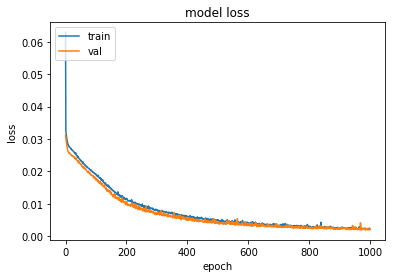

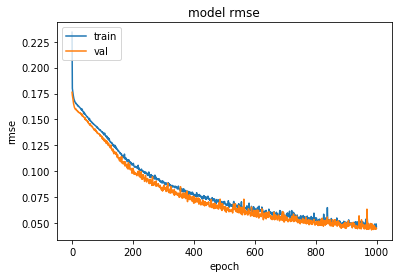

In [28]:
#3 hidden layers, all with 50 units, alpha=0.01
#LSTM call model definition
click_model14= click_stacked_stateless_LSTM5(units_1=50, units_2=40, units_3=30,lr=0.001, alpha=0.01, dropout=0.1)
click_model14.summary()

#Train LSTM
hist= stateless_fit(click_model14, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_wts_14.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [29]:
click_pred_train=click_model14.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model14.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model14.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  38.74130076159759
YRMSE train:  26.20556807895546
XRMSE val:  51.38869328986718
YRMSE val:  38.296713796927534
XRMSE test:  50.53389665333475
YRMSE test:  33.8164085779182


In [29]:
#LSTM with m/m between batches
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def click_stacked_stateful_LSTM(unit1, unit2, lr, batch, alpha, dropout1, dropout2):
    timesteps=18
    model = Sequential()
    model.add(LSTM(unit1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout1))
    model.add(LSTM(unit2, return_sequences=False, stateful=True, recurrent_dropout=dropout2))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_13 (LSTM)               (133, 18, 50)             10600     
_________________________________________________________________
lstm_14 (LSTM)               (133, 50)                 20200     
_________________________________________________________________
dense_7 (Dense)              (133, 2)                  102       
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (133, 2)                  0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 14s - loss: 0.0509 - rmse: 0.2134 - val_loss: 0.0306 - val_rmse: 0.1744

Epoch 00001: val_loss improved from inf to 0.03057, saving model to click_wts_5.hdf5
Epoch N

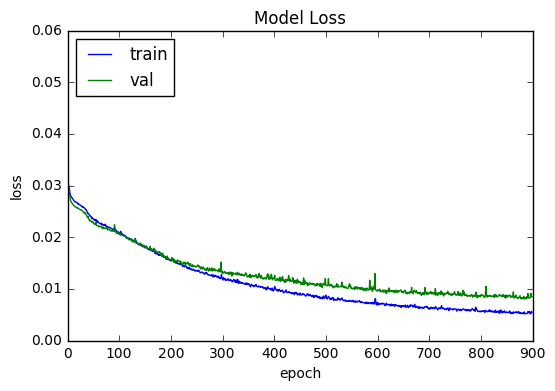

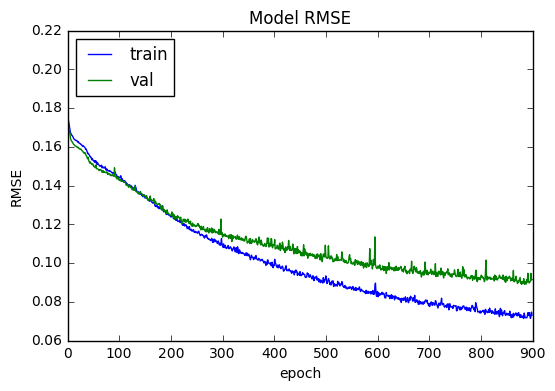

In [50]:
#LSTM call model definition
click_model5= click_stacked_stateful_LSTM(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1)
click_model5.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model5, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_5.hdf5')
click_model5.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [51]:
click_model5.load_weights('click_wts_5.hdf5')

click_pred_train=click_model5.predict(X_click_train, batch_size=133)
click_model5.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model5.predict(X_click_val, batch_size=133)
click_model5.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model5.predict(X_click_test, batch_size=133)
click_model5.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  63.59063831675632
YRMSE train:  42.00092473708248
XRMSE val:  113.23180594151341
YRMSE val:  69.26449826752524
XRMSE test:  120.99959979833989
YRMSE test:  66.48859072675441


Increasig dropout for both layers does not help. Decreasing units for both layers does not help.

The results show an overfit with model performing much better on train set as compared to test and validation datasets. Let's increase the dropout.

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_20 (LSTM)               (133, 18, 50)             10600     
_________________________________________________________________
lstm_21 (LSTM)               (133, 30)                 9720      
_________________________________________________________________
dense_11 (Dense)             (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 14s - loss: 0.0608 - rmse: 0.2292 - val_loss: 0.0307 - val_rmse: 0.1749

Epoch 00001: val_loss improved from inf to 0.03073, saving model to click_wts_6.hdf5
Epoch N

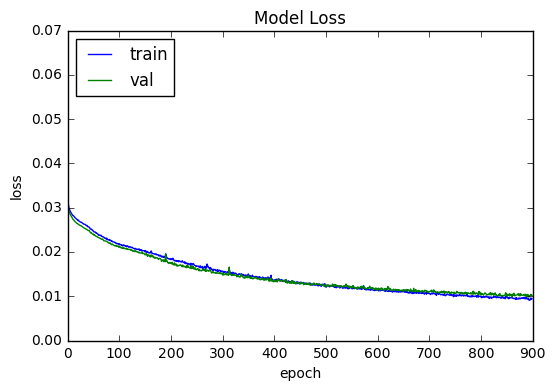

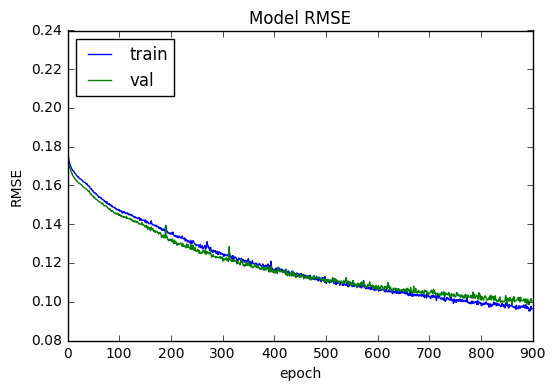

In [63]:
#LSTM call model definition
click_model6= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.1)
click_model6.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model6, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_6.hdf5')
click_model6.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [64]:
#click_model6.load_weights('click_wts_5.hdf5')

click_pred_train=click_model6.predict(X_click_train, batch_size=133)
click_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model6.predict(X_click_val, batch_size=133)
click_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model6.predict(X_click_test, batch_size=133)
click_model6.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  103.41922461214655
YRMSE train:  62.161788972285265
XRMSE val:  128.95389639808812
YRMSE val:  76.98644687915282
XRMSE test:  133.76346034598257
YRMSE test:  74.33424971577251


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_6 (LSTM)                (133, 50)                 20200     
_________________________________________________________________
dense_3 (Dense)              (133, 2)                  102       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (133, 2)                  0         
Total params: 30,902
Trainable params: 30,902
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 25s - loss: 0.0573 - rmse: 0.2250 - val_loss: 0.0309 - val_rmse: 0.1754

Epoch 00001: val_loss improved from inf to 0.03093, saving model to click_wts_7.hdf5
Epoch N

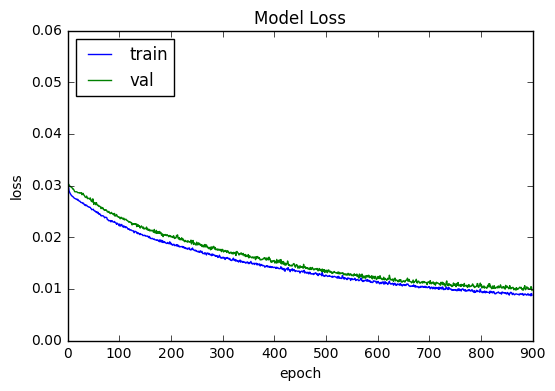

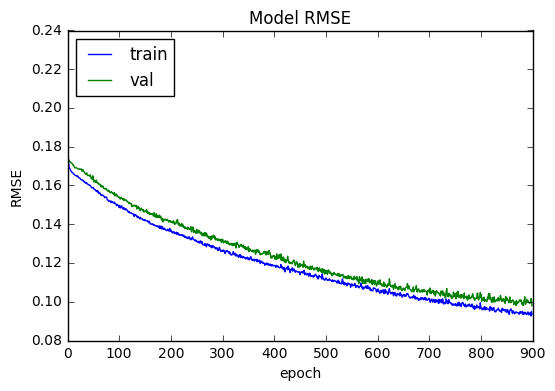

In [30]:
#LSTM call model definition
click_model7= click_stacked_stateful_LSTM(unit1=50, unit2=50, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.3)
click_model7.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model7, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_7.hdf5')
click_model7.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [31]:
click_pred_train=click_model7.predict(X_click_train, batch_size=133)
click_model7.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model7.predict(X_click_val, batch_size=133)
click_model7.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model7.predict(X_click_test, batch_size=133)
click_model7.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  93.61548162028073
YRMSE train:  61.661952995063864
XRMSE val:  124.18201104616593
YRMSE val:  76.06636329131213
XRMSE test:  127.75119374493565
YRMSE test:  74.23314097765474


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_8 (LSTM)                (133, 30)                 9720      
_________________________________________________________________
dense_4 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 8s - loss: 0.0663 - rmse: 0.2397 - val_loss: 0.0316 - val_rmse: 0.1773

Epoch 00001: val_loss improved from inf to 0.03159, saving model to click_wts_8.hdf5
Epoch Nu

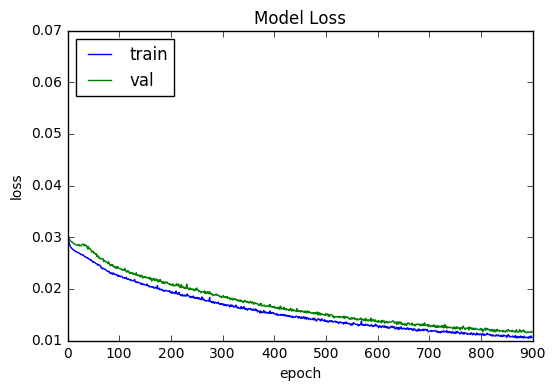

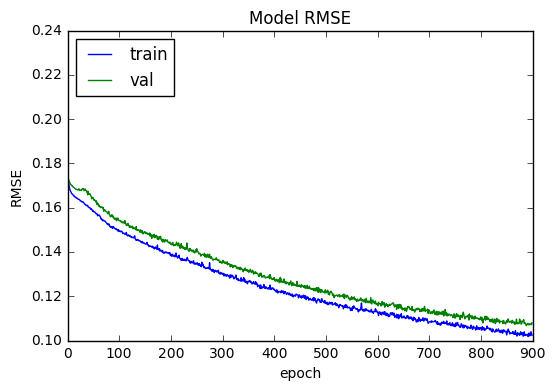

In [ ]:
#LSTM call model definition
click_model8= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.3)
click_model8.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model8, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_8.hdf5')
click_model8.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [30]:
click_model8= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.3)
click_model8.summary()
click_model8.load_weights('click_wts_8.hdf5')
click_pred_train=click_model8.predict(X_click_train, batch_size=133)
click_model8.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model8.predict(X_click_val, batch_size=133)
click_model8.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model8.predict(X_click_test, batch_size=133)
click_model8.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_6 (LSTM)                (133, 30)                 9720      
_________________________________________________________________
dense_3 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
XRMSE train:  134.2481328697873
YRMSE train:  80.31890649877819
XRMSE val:  126.69132306688536
YRMSE val:  79.94491404705707
XRMSE test:  130.59271986773717
YRMSE test:  77.97470563931249


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_7 (LSTM)                (133, 18, 50)             10600     
_________________________________________________________________
lstm_8 (LSTM)                (133, 30)                 9720      
_________________________________________________________________
dense_4 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (133, 2)                  0         
Total params: 20,382
Trainable params: 20,382
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 10s - loss: 0.0577 - rmse: 0.2258 - val_loss: 0.0298 - val_rmse: 0.1723

Epoch 00001: val_loss improved from inf to 0.02976, saving model to click_wts_9.hdf5
Epoch N

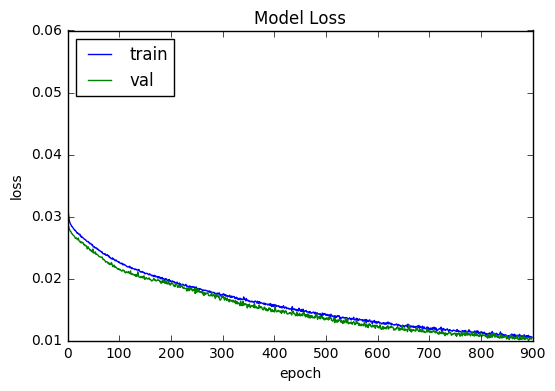

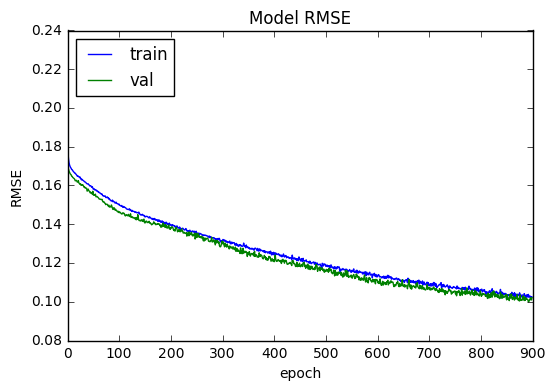

In [31]:
#LSTM call model definition
click_model9= click_stacked_stateful_LSTM(unit1=50, unit2=30, lr=0.001, batch=133, alpha=0.05, dropout1=0.3, dropout2= 0.2)
click_model9.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_model9, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_wts_9.hdf5')
click_model9.reset_states()

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [32]:
click_pred_train=click_model9.predict(X_click_train, batch_size=133)
click_model9.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_model9.predict(X_click_val, batch_size=133)
click_model9.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_model9.predict(X_click_test, batch_size=133)
click_model9.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  109.38050529062198
YRMSE train:  69.86378593891212
XRMSE val:  129.37299465940112
YRMSE val:  78.47164464934833
XRMSE test:  132.2113830773829
YRMSE test:  77.21985235137676


# Simple RNN

In [24]:
#hyperparameter tuning
#hyperparameter tuning for number of units, learn rate, batch size and alpha(leaky relu) for stateful LSTM
def experiment(X_train, Y_train, X_val, Y_val, X_test, Y_test, n, lr, a):
    X_RMSE=[]
    Y_RMSE=[]
    # fit the model
    model = click_stateful_SRNN(n, lr, 133, a)
    for i in range(500):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model.reset_states()
    
    Y_Pred = model.predict(X_test, batch_size=133)
    model.reset_states()
    
    xrmse,yrmse= calculate_RMSE(Y_Pred, Y_test)
    print('XRMSE: ', xrmse)
    print('YRMSE: ', yrmse)
    
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE
start = time.time()
count = 1
X_coord_results = pd.DataFrame()
Y_coord_results = pd.DataFrame()
model_df= pd.DataFrame()
# hyperparameters
neurons = [30,40,50,60]
learn_rate=[0.0001,0.001]
alpha=[0.01,0.03,0.05]
for n in neurons:
    for lr in learn_rate:
        for a in alpha:
            print('Units: ',n,', Learn Rate: ',lr, ', Alpha: ', a)
            print('Model Number: ', count)
            model_df[str(count)]= [str(n)+','+str(lr)+','+str(a)]
            X_coord_results[str(count)], Y_coord_results[str(count)]  = experiment(X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test, n, lr, a)
            count+=1
# summarize results
print(X_coord_results.head())
print(Y_coord_results.head())
end = time.time()
print("Time Took :{:3.2f} min".format( (end-start)/60 ))
print('Completed')

Units:  50 , Learn Rate:  0.0001 , Alpha:  0.01
Model Number:  1
Model created and compiled
XRMSE:  184.19245253643342
YRMSE:  111.02874843526914
Units:  50 , Learn Rate:  0.0001 , Alpha:  0.03
Model Number:  2
Model created and compiled
XRMSE:  186.3984571455433
YRMSE:  112.23236690037099
Units:  50 , Learn Rate:  0.0001 , Alpha:  0.05
Model Number:  3
Model created and compiled
XRMSE:  185.7272690220109
YRMSE:  112.1618791072344
Units:  50 , Learn Rate:  0.001 , Alpha:  0.01
Model Number:  4
Model created and compiled
XRMSE:  184.83063996441834
YRMSE:  110.68696070221941
Units:  50 , Learn Rate:  0.001 , Alpha:  0.03
Model Number:  5
Model created and compiled
XRMSE:  183.43262494792256
YRMSE:  111.39241230152807
Units:  50 , Learn Rate:  0.001 , Alpha:  0.05
Model Number:  6
Model created and compiled
XRMSE:  184.744717761527
YRMSE:  107.33243078885097
Units:  60 , Learn Rate:  0.0001 , Alpha:  0.01
Model Number:  7
Model created and compiled
XRMSE:  187.5982798332413
YRMSE:  110.91

The parameters showing the best results are 40 units, 0.001 learn rate and 0.01 alpha.

In [22]:
#no dropout is required for stateless model
#simpleRNN stateless model
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stateless_SRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, input_shape=(timesteps,2)))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_9 (SimpleRNN)     (None, 40)                1720      
_________________________________________________________________
dense_9 (Dense)              (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 2)                 0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/900
 - 2s - loss: 0.0472 - rmse: 0.2060 - val_loss: 0.0283 - val_rmse: 0.1678

Epoch 00001: val_loss improved from inf to 0.02834, saving model to click_SRNN_wts1.hdf5
Epoch 2/900
 - 1s - loss: 0.0271 - rmse: 0.1641 - val_loss: 0.0276 - val_rmse: 0.1657

Epoch 00002: val_loss improved from 0.02834 to 0.02763, saving mod

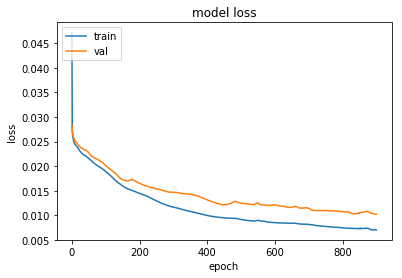

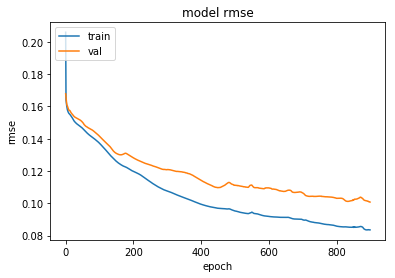

In [49]:
#new parameters
#call model definition
click_SRNN_model1= click_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
click_SRNN_model1.summary()

#Train
hist= stateless_fit(click_SRNN_model1, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts1.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [50]:
click_pred_train=click_SRNN_model1.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model1.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model1.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  108.93158875736968
YRMSE train:  64.2096313312594
XRMSE val:  127.84503639033932
YRMSE val:  78.01974642457493
XRMSE test:  130.44057239460622
YRMSE test:  77.04712635619067


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_16 (SimpleRNN)    (None, 40)                1720      
_________________________________________________________________
dense_16 (Dense)             (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 2)                 0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 3s - loss: 0.1174 - rmse: 0.3231 - val_loss: 0.0334 - val_rmse: 0.1826

Epoch 00001: val_loss improved from inf to 0.03341, saving model to click_SRNN_stateless_wts2.hdf5
Epoch 2/1000
 - 1s - loss: 0.0293 - rmse: 0.1709 - val_loss: 0.0273 - val_rmse: 0.1649

Epoch 00002: val_loss improved from 0.03341 to 0.02730

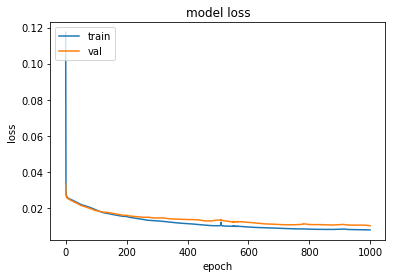

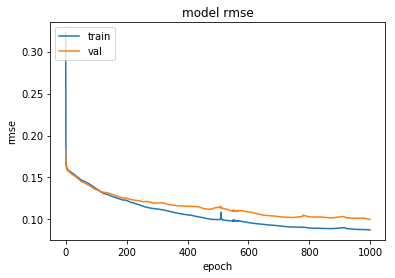

In [39]:
#increase the number of epochs
#call model definition
click_SRNN_stateless2= click_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
click_SRNN_stateless2.summary()

#Train
hist= stateless_fit(click_SRNN_stateless2, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_stateless_wts2.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [40]:
click_pred_train=click_SRNN_stateless2.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_stateless2.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_stateless2.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  113.6389914052581
YRMSE train:  67.26500091543562
XRMSE val:  128.4295520690538
YRMSE val:  76.51694730383649
XRMSE test:  128.16679514052356
YRMSE test:  77.20890350982172


In [34]:
#function to test overfitting or underfitting of the stateful SImpleRNN model at each epoch using the parameters used for LSTM
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE
def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(900):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()
def run(repeats, units, learn_rate, batch, alpha, X_train, Y_train, X_val, Y_val, X_test, Y_test,fig_1, fig_2):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= click_stateful_SRNN(units=units, lr=learn_rate, batch=batch, alpha=alpha)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")
    
    ax1.legend(loc='best')
    ax2.legend(loc='best')
    
    fig1.savefig(fig_1)
    fig2.savefig(fig_2)
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

In [ ]:
#calling the function to check if stateful simpleRNN is overfittig or underfitting
run(2, 50, 0.001, 133, 0.05, 0.1, X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test,'click_srnn_epochs_x.png', 'click_srnn_epochs_y.png')
#Results are shown below

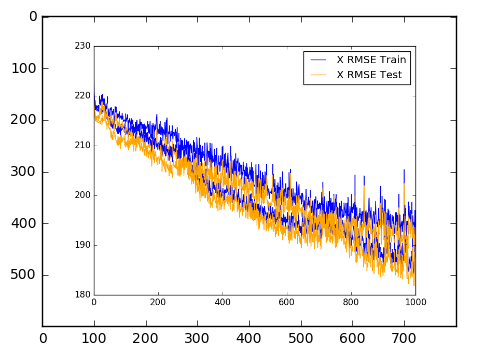

In [31]:
#units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1
#Load plots for simple rnn epochs overfit or underfit checking
img=mpimg.imread('click_srnn_epochs_x.png')
img_plot= plt.imshow(img)

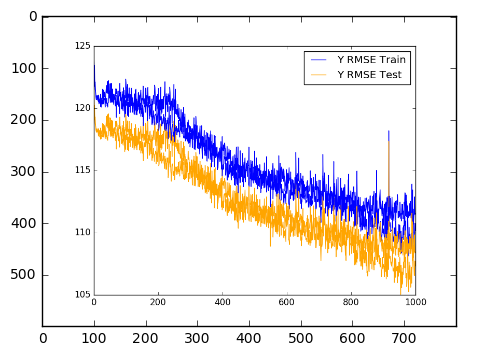

In [32]:
#Load plots for simple rnn epochs overfit or underfit checking
img=mpimg.imread('click_srnn_epochs_y.png')
img_plot= plt.imshow(img)

However, the plots above show continuous decrease over the 1000 epochs. But there is alot of noise. let's tune the parameters for simple RNN and see if it improves the performance.

In [23]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stateful_SRNN(units, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=False, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Experimental Run:  1
Model created and compiled
Xtrain_RMSE:  [227.40254830685717, 223.85621179946253, 223.1772935670769, 220.9305301555623, 218.89048619972104, 217.25274927212442, 216.0037101383949, 215.0023567739263, 214.20466966869256, 213.66684891399558, 213.35867359583705, 213.30146506365637, 213.36530396886232, 213.43176907509016, 213.41523914521375, 213.24611796091625, 212.84059147071042, 212.08731919844936, 210.91481708395747, 209.45214461180626, 208.01453030550988, 206.76450524532734, 205.70064473093467, 204.80549457404425, 204.0968421504892, 203.56427729714622, 203.2131288778981, 202.9738867392794, 202.82855811432287, 202.80332485319383, 202.54969691667642, 202.37266955782803, 201.9238861250827, 201.72430909802065, 201.53993563985767, 201.42487577229414, 201.2454482404881, 201.0185181510359, 200.7361069082346, 200.37803317959117, 199.9601871962609, 199.47974498636867, 198.8692653472641, 198.4389353009953, 198.14601798092912, 197.7781868448922, 197.3641673062771, 197.042733775

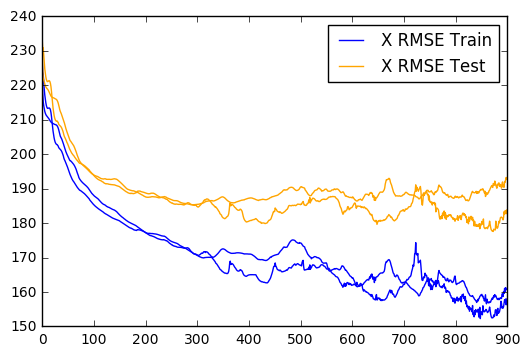

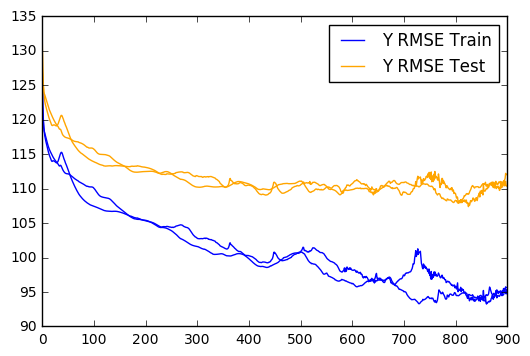

In [37]:
#calling the function to check if stateful simpleRNN is overfittig or underfitting
run(2, 40, 0.001, 133, 0.01, X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test,'srnn_epochs_x.png', 'srnn_epochs_y.png')

These plots show a complete overfit. Let's tune dropout.

In [25]:
#Dropout tuning
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

def dropout_tuning(dropout, rec_dropout, X_train, Y_train, X_test, Y_test, X_val, Y_val):
    timesteps=18
    X_RMSE=[]
    Y_RMSE=[]

    model_iter = Sequential()
    model_iter.add(SimpleRNN(40, return_sequences=False, batch_input_shape=(133, timesteps, 2), stateful=True, dropout=dropout, recurrent_dropout= rec_dropout))
    model_iter.add(Dense(2))
    model_iter.add(LeakyReLU(alpha=0.01))
    model_iter.compile(Adam(lr=0.001), loss='mse', metrics=[rmse])
    for j in range(900):
        model_iter.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=133, verbose=0, shuffle=False)
        model_iter.reset_states()
    Y_pred = model_iter.predict(X_test, batch_size=133)
    model_iter.reset_states()
    
    xrmse, yrmse= calculate_RMSE(Y_pred, Y_test)
    print('XRMSE: ', xrmse)
    print('YRMSE: ', yrmse)
    X_RMSE.append(xrmse)
    Y_RMSE.append(yrmse)
    return X_RMSE, Y_RMSE

results_X = pd.DataFrame()
results_Y = pd.DataFrame()
dropouts=[0.0,0.1,0.2,0.3]
recurrent_dropouts=[0.0,0.1,0.2,0.3]
for dropout in dropouts:
    for rec_dropout in recurrent_dropouts:
        print('Dropout: ', dropout, ', Recurrent Dropout: ', rec_dropout)
        results_X[str(dropout) + ',' + str(rec_dropout)], results_Y[str(dropout) + ',' + str(rec_dropout)]= dropout_tuning(dropout, rec_dropout, X_click_train, Y_click_train, X_click_test, Y_click_test, X_click_val, Y_click_val)
print(results_X.head())
print(results_Y.head())

Dropout:  0.0 , Recurrent Dropout:  0.0
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
XRMSE:  188.02515397597642
YRMSE:  107.56759382737827
Dropout:  0.0 , Recurrent Dropout:  0.1
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
XRMSE:  188.78417812674235
YRMSE:  110.97932955820286
Dropout:  0.0 , Recurrent Dropout:  0.2
XRMSE:  207.85914967673534
YRMSE:  116.40157129445411
Dropout:  0.0 , Recurrent Dropout:  0.3
XRMSE:  203.42014134013033
YRMSE:  123.43858320758959
Dropout:  0.1 , Recurrent Dropout:  0.0
XRMSE:  234.58378972830678
YRMSE:  124.26997081479445
Dropout:  0.1 , Recurrent Dropout:  0.1
XRMSE:  219.08266088003109
YRMSE:  117.43623556563503
Dropout:  0.1 , Recurrent Dropout:  0.2
XRMSE:  221.40330828000606
YRMSE:  120.99910032004085
Dropout:  0.1 , Recurrent Dropout:  0.3
XRMSE:  221.13553667537545
YRMSE:  126.45611335557028
Dropout:  0.2

KeyboardInterrupt: 

|The results show that a recurrent dropout of 0.1 should be added.

In [27]:
#function to test overfitting or underfitting of the stateful SImpleRNN model at each epoch
def evaluate(model, X_train, Y_train, X_test, Y_test, batch_size):
    Y_pred_train=model.predict(X_train, batch_size=batch_size)
    model.reset_states()
    
    Y_pred_test = model.predict(X_test, batch_size=batch_size)
    model.reset_states()
    
    #invert and calculate RMSE
    train_XRMSE, train_YRMSE= calculate_RMSE(Y_pred_train, Y_train)
    test_XRMSE, test_YRMSE= calculate_RMSE(Y_pred_test, Y_test)
    return train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE
def fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch_size):
    start = time.time()
    Xtrain_score=[]
    Ytrain_score=[]
    Xtest_score=[]
    Ytest_score=[]
    for i in range(1000):
        model.fit(X_train, Y_train, validation_data=(X_val, Y_val), epochs=1, batch_size=batch_size, verbose=0, shuffle=False)
        model.reset_states()
        #evaluate model on train & test set
        train_XRMSE, train_YRMSE, test_XRMSE, test_YRMSE= evaluate(model, X_train, Y_train, X_test, Y_test, batch_size)
        Xtrain_score.append(train_XRMSE)
        Ytrain_score.append(train_YRMSE)
        Xtest_score.append(test_XRMSE)
        Ytest_score.append(test_YRMSE)
    print('Xtrain_RMSE: ', Xtrain_score)
    print('Ytrain_RMSE: ', Ytrain_score)
    print('Xtest_RMSE: ', Xtest_score)
    print('Ytest_RMSE: ', Ytest_score)
    history = pd.DataFrame()
    history['train_X'], history['train_Y'], history['test_X'], history['test_Y'] = Xtrain_score, Ytrain_score, Xtest_score, Ytest_score 
    end = time.time()
    print("Time Took :{:3.2f} min".format( (end-start)/60 ))
    return history
    
def show_plot(fig):
    fig.show()
def run(repeats, units, learn_rate, batch, alpha, dropout, X_train, Y_train, X_val, Y_val, X_test, Y_test,fig_1, fig_2):
    fig1, ax1 = plt.subplots()
    fig2, ax2 = plt.subplots()
    
    for i in range (repeats):
        print('Experimental Run: ', i+1)
        model= click_stateful_SRNN(units=units, lr=learn_rate, batch=batch, alpha=alpha, dropout=dropout)
        history= fit_model(model, X_train, Y_train, X_val, Y_val, X_test, Y_test, batch)
        
        ax1.plot(history['train_X'],color='blue', label='X RMSE Train' if i == 0 else "")
        ax1.plot(history['test_X'], color='orange', label= 'X RMSE Test' if i == 0 else "")
    
        ax2.plot(history['train_Y'], color='blue', label= 'Y RMSE Train' if i == 0 else "")
        ax2.plot(history['test_Y'], color='orange', label= 'Y RMSE Test' if i == 0 else "")
    
    ax1.legend(loc='best')
    ax2.legend(loc='best')
    
    fig1.savefig(fig_1)
    fig2.savefig(fig_2)
    
    show_plot(fig1)
    show_plot(fig2)
    print('Completed')

Experimental Run:  1
Model created and compiled
Xtrain_RMSE:  [220.11322539776256, 217.2601035995897, 216.50465053001767, 216.17355443951257, 216.05349196721613, 215.7876927137491, 215.62831074407308, 215.71749610661993, 215.62900180779718, 215.384724100042, 215.42626439392996, 215.29445356427112, 215.0827960460678, 215.15971691757701, 214.98891031457035, 215.18581152614058, 215.27075774208816, 215.1373142463109, 215.04979634392217, 214.87147669493447, 214.92531945670856, 214.90661062472861, 214.8169439984751, 215.16874085201323, 214.8893179043705, 214.8478272883152, 215.01849143564468, 214.80113806915526, 214.96512226463156, 214.9557135461068, 214.69288478260236, 214.74768763317755, 214.676330619412, 214.59103076805937, 214.85233870638194, 214.6593316927294, 214.7283304928027, 214.88517873498324, 214.92961523622574, 214.69970769640176, 214.638232528905, 214.47245627166615, 214.9752415336924, 214.6387389454724, 214.5600419218582, 214.76485846840922, 214.71932204568608, 215.013492534851

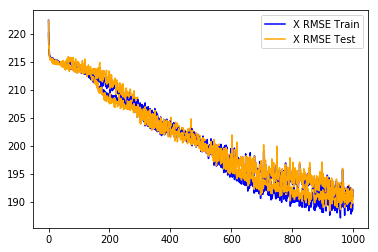

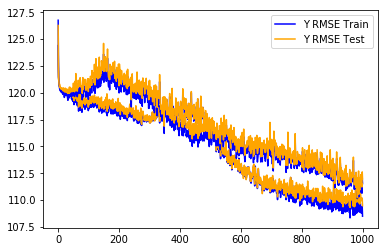

In [28]:
#calling the function to check if stateful simpleRNN is overfittig or underfitting using recurrent dropout of 0.1
run(2, 40, 0.001, 133, 0.01, 0.1, X_click_train, Y_click_train, X_click_val, Y_click_val, X_click_test, Y_click_test,'srnn_epochs_drop_x.png', 'srnn_epochs_drop_y.png')

The results are better than before as both train and validation RMSE are continuously decreasing over 1000 epochs and are performing equally well. lets find out the number of epochs.

In [29]:
def scores(e):
    RMSE_Scores=[]
    Xtest_RMSE_1= [219.63606754387004, 216.9741005081603, 216.1034077420852, 215.95311750507273, 215.91777430755232, 215.58590076517234, 215.38269231577937, 215.65636267549604, 215.46437036266965, 215.268799472326, 215.303328784385, 215.05483401021752, 214.88942809265325, 214.97806221727916, 214.60768495194912, 214.89394368298284, 215.0888376288835, 214.82161041699501, 214.9993069663164, 214.656859205127, 214.69928970971162, 214.60338985328406, 214.55505965109015, 215.27417119507547, 214.65795991679903, 214.58176696134106, 214.91252158041846, 214.50100250879836, 214.9297820347647, 215.08815424864738, 214.51268166857326, 214.77743077169342, 214.53746337868463, 214.65213562776768, 214.7236540775816, 214.59159168315136, 214.6113279191405, 214.97968269414113, 214.7615613952836, 214.53574325677297, 214.5107059861428, 214.3767394573365, 214.89209438232126, 214.41121212518465, 214.4108753807097, 214.6210089961435, 214.77043998652417, 215.25909791716256, 214.93437161159352, 214.79375756539093, 214.6840047231754, 214.4558931096387, 214.63035303096783, 214.92103602727863, 214.93604424589486, 214.98424613819012, 215.0127897374014, 215.1871587461862, 214.80349947099657, 214.77795673479076, 215.50883504045882, 215.39877774349867, 215.00021106946193, 214.6326273422262, 215.4564614249275, 215.93708440210153, 214.95123826648236, 215.46855553641586, 215.1701292684837, 215.03675316850521, 215.7704072090664, 215.33325693771437, 215.2790280397565, 215.08842597457385, 215.74833284569934, 215.19564906926948, 214.50472293549748, 215.73486262116458, 214.53828978920515, 214.10479401694326, 215.79213854137882, 213.57493407180073, 214.9060260647501, 214.60793550312655, 215.0084136269139, 214.96908982830644, 214.36288525494592, 215.06987793614425, 214.6703847353757, 214.9253576336168, 214.56280312429217, 214.61522891884712, 214.40339241722307, 214.5096218557379, 214.4880717269968, 214.18114854477827, 213.62883011383497, 215.10381163715996, 214.40184643493185, 213.5043779948597, 213.98098661493702, 214.77986850534273, 213.48436365235906, 213.72339672619643, 214.12890295250412, 214.47951440438365, 214.15368424078693, 214.0711895785615, 213.3323532214127, 214.4233783170679, 214.11414139695458, 215.21062159807542, 214.28863853531962, 213.6288738864676, 214.58860719683895, 214.173262460137, 214.51127997720315, 212.9876668085214, 214.02721450731275, 215.51215019249372, 213.5666093902956, 213.40428002552105, 214.09054602433505, 213.74409357889397, 214.02100528597845, 213.57241837239116, 213.53786548165718, 213.34781800019095, 213.7752569434524, 213.206394785753, 213.86079825138614, 214.45605630667896, 212.9895052311969, 212.73178422929948, 213.2614322194351, 212.88593426936148, 213.29135825265777, 214.04274498154177, 214.1641105677667, 213.2075262545535, 212.42024842717407, 213.5217815524726, 213.10730348595223, 213.10547257071286, 212.69003701601667, 213.7459703948509, 213.50194595970143, 211.94656713619827, 213.66081954061787, 212.43907255377013, 213.80535179349457, 213.15697138411386, 212.59072024415258, 211.89542186971963, 213.1510385892498, 213.7813765355856, 211.96665561033026, 213.20507870856224, 213.01994372020766, 212.98315414397078, 212.3472186108982, 212.06917760365312, 213.7911972152959, 213.94782874790425, 213.18033354888988, 212.34426589173108, 212.562810150137, 214.36662556809472, 214.88920802588692, 211.71136045569438, 213.9560087953447, 212.22612939979243, 211.61039078615764, 211.93503797064972, 213.32449098948115, 212.70987299384552, 212.54688250812816, 211.40117719348498, 213.14921971246704, 213.43836246848284, 211.8254948725907, 212.71743175631656, 213.4187210933205, 212.74797813758954, 212.9471884847372, 212.81068177735185, 212.9188265083074, 212.2320108562736, 211.88432500823816, 211.2616165945228, 213.4965306332926, 211.01204298002702, 212.1116289830875, 211.9382569550411, 211.3034371792541, 211.21291273149683, 211.97902739158917, 212.065814313907, 212.29715563761175, 213.37278076694395, 212.77034766076778, 210.22726431153004, 211.89183012824338, 210.52992050980868, 210.81946260539814, 212.66280295160644, 212.50350487215968, 212.67270682726235, 211.23970818684236, 210.40279242017775, 211.78080209070413, 210.5355325831027, 211.42159731957213, 211.30884888219146, 211.42424932198506, 211.04349546747835, 211.22101218881775, 211.0434858226927, 212.08815987009189, 211.87264036119137, 210.8748588673615, 210.77815045397867, 209.14109462135247, 211.58146537369944, 211.7687167661591, 210.81730118117068, 210.8418312191886, 211.14853262393726, 210.2848497356172, 209.84777099410664, 210.38069221071683, 209.60591623564233, 209.71204660562955, 207.78513095560413, 211.24129830480214, 209.5063996467769, 209.1657467406169, 210.48635789964993, 210.8897261100645, 208.6864713396267, 209.64468294598123, 209.49420844832505, 210.13636432826254, 209.09050505413677, 211.0789979882199, 208.64342519707333, 209.0185862723482, 209.41755188477737, 208.70642672116557, 208.83313831578957, 209.00459966541203, 209.03684622153014, 208.39158794141017, 210.2247898143733, 207.8734574200573, 210.32817922130994, 209.99424693790593, 208.7540632482675, 207.8978177537593, 208.57118603088205, 209.6672312841136, 209.2260197515866, 208.59801602546915, 208.40784265823984, 208.11915579535042, 208.53856518737686, 209.05324541922167, 208.88362327282871, 210.15199913332663, 209.89558380862834, 209.17398218491923, 208.36295844795856, 208.14855927446783, 207.8442481021084, 207.93270429628956, 207.48876082013203, 208.65320389692548, 208.91189615179402, 209.30961975093345, 207.90319826635894, 207.6245063401742, 209.82461651036567, 207.42723145971425, 207.88568259261402, 207.73831659334292, 207.6383504350477, 208.65092504147785, 207.61606534772574, 206.13745217740066, 207.36647536520206, 205.12159877776477, 207.4212904754802, 208.69510200136045, 207.17048245373383, 206.67425321966883, 206.66173051774683, 206.29853118526654, 205.6114313502905, 205.24550004690937, 205.27962538914264, 204.0477624682405, 205.94793940998218, 205.51844003650703, 203.88879199461408, 204.9600296871505, 204.6231322816909, 205.34441846712917, 204.7644499783302, 205.5452165899598, 205.26863433478658, 205.7990910438582, 207.06605912510065, 204.61947121832154, 204.5123865504254, 206.1643840983437, 205.11971642654188, 205.06307646838818, 203.7070013730775, 205.75829782274712, 204.64995809988457, 204.28568256808364, 205.98953950147904, 204.22369645123908, 205.61315434454465, 203.79228666070003, 203.823704782712, 204.51511739045202, 204.05941363376903, 203.60149426426563, 203.97654673274485, 203.5868845064795, 205.19462467392083, 203.95770768642555, 203.2897307299073, 204.76365035939367, 204.84321585784872, 203.37265090450856, 203.57455005855965, 204.1119576818403, 202.77674806518164, 204.2152720759444, 204.1160703202909, 204.2801654225913, 204.29351313528696, 203.60075449205118, 203.14555395517715, 204.72369184910485, 203.09687069037918, 203.68595364004028, 204.89406169554354, 204.41655415956546, 203.48474224119357, 204.06054403844306, 203.58543939256447, 203.15500110844073, 204.11419314137936, 203.28635630291777, 202.73438296387212, 202.63413733710988, 203.40581819717298, 203.04455750920107, 203.4029954029592, 203.22731388943447, 202.66028067219614, 202.98632268068263, 202.89910310432055, 203.9201240298246, 202.1547553317997, 202.44244749217503, 203.75746079471367, 202.83880395375368, 202.17192096160298, 202.61113760220084, 202.4860122077912, 204.11852066779574, 203.1475069916258, 202.97725423171985, 202.0985712104471, 202.3915171847073, 203.29555203994093, 201.8922739446768, 202.24191090915025, 202.3851913862091, 203.02747902008096, 202.80241317751634, 203.1977075120121, 202.67103714503352, 202.95339991813643, 203.3624692958108, 204.0857542475502, 202.59123323875284, 202.34282922306835, 203.0643735026404, 202.96747802464603, 204.32531426869036, 203.28195401071653, 202.581719400889, 203.66102397739908, 203.08185970209914, 202.29667616508144, 201.4801967993241, 202.53814416493358, 205.0662234798622, 202.86303169835023, 202.68903147344176, 202.71626587811386, 202.63622793178345, 202.3092579048325, 202.05588702485994, 203.70676065150997, 202.7178701508331, 201.7066098646579, 202.20083411953692, 202.56031584006968, 202.79679741943562, 202.21469700805216, 203.49531554420636, 204.21413779214407, 204.0622675902846, 203.18733590263778, 202.14860874075947, 203.55881082184922, 202.99270428350087, 204.05703600872425, 202.83641293791152, 202.51058624068233, 203.44656836832183, 202.97771117123125, 203.57959997085587, 202.0183437014592, 202.14667080133964, 202.79061466596997, 201.56261578499596, 201.9628758884601, 202.57449034189625, 202.32921802719673, 202.88260863764205, 202.63817086568494, 203.23920772430284, 202.33362646229122, 203.26070658798395, 203.23874491363546, 202.93323518615827, 202.00475274762738, 202.20885805716108, 202.72836456239523, 202.6913680905591, 202.7985120909058, 201.41435925813954, 202.08103106863572, 202.28168913652834, 201.72617952243002, 201.69498449452323, 201.2059135384298, 202.458235827836, 202.58594167133674, 202.24769677295103, 202.270751120675, 203.04603945772124, 202.5231769168357, 202.49104914204153, 202.43309141405496, 200.89320692745244, 202.96762418835738, 201.41037113614453, 203.22241177587696, 201.3189230901237, 201.8769061240347, 204.79774736678468, 201.4392082490139, 202.2910972388541, 200.18537744532404, 200.74182188969908, 201.86784802956953, 202.5078126697235, 202.65088777929412, 200.70900251534613, 200.4435677114428, 201.22092631414878, 202.37220489274608, 200.82969029851404, 200.14989971019884, 201.44234892650718, 202.3992671116734, 199.829006885041, 201.9298036538652, 201.91967232000437, 200.24528970553808, 201.88806604899236, 201.41290143930632, 200.7481452621676, 201.38013614244855, 201.40364431978284, 201.7757832335423, 200.31185072834734, 200.3612111147469, 201.8752272170817, 201.50890217986208, 200.74777670673222, 201.08529209776418, 199.19985309016627, 199.9808591242988, 199.6884085582889, 201.05189102043033, 199.02166184940032, 199.8299228802359, 200.26069399844823, 200.68814338913714, 200.92607008112614, 199.21043226510702, 200.45636906230786, 200.60922344236056, 199.6579218820273, 201.1841198445848, 199.7903959118324, 200.80990263837043, 200.272931874737, 199.272358580781, 199.02585157224976, 198.76566764519214, 199.97646264591782, 200.1596604384465, 199.42205495087703, 199.4234584713406, 199.60553431628415, 198.14451912046604, 200.01143325815355, 199.34354520283802, 199.5817154748939, 198.82737764021653, 199.8332264938956, 200.01148333894156, 200.33665121843694, 199.63862842407167, 199.53972855696338, 200.5307156363156, 199.8500455767276, 200.4477227351968, 198.68475331410426, 197.9708850048345, 199.02394711838662, 199.14183968968052, 198.37537554738736, 197.14704249824385, 197.39429515418237, 197.4782658327837, 197.70517233636994, 198.97896268243707, 199.52718073071543, 197.5845159008633, 197.91162028978357, 196.44180511484376, 197.10444397845814, 198.32014731650867, 197.85390030581706, 197.16331879559604, 199.42394790270484, 197.40632814092677, 198.18145278411217, 200.3167602613567, 197.83720307552144, 198.20193104886798, 197.76670007884258, 197.28318314023429, 199.08764617523804, 199.39062982978575, 196.87321918221411, 196.9052943637031, 197.27283918139705, 198.37584412690003, 197.34196190456242, 197.8322531239516, 197.10425052989086, 197.0655305454167, 197.51426308725317, 195.86551871821592, 196.19929742114988, 196.82505023587407, 196.66368397986196, 197.2608162234741, 196.39933471312912, 196.2753280880096, 195.7837864555449, 196.95501756164467, 196.33836950807066, 195.90776767905498, 196.44545834198652, 196.811368735737, 195.34686315506278, 195.9106292246587, 196.98866258580966, 195.14332380094865, 196.74724941696996, 196.69653000124424, 196.0446835507468, 194.9630978219247, 196.60161802738537, 196.05693928371733, 195.8485312423585, 196.1709999297366, 196.82613577012168, 196.50201215576786, 196.88064250164481, 195.22899156018798, 196.01601667611487, 195.09249165154637, 195.59940995947343, 195.5687519013477, 195.94581126064364, 195.40877915875487, 195.04882495036495, 194.97297021064514, 196.2556846585616, 195.4894194325095, 195.84571097513606, 196.3571794672142, 196.81387047099375, 194.5103663708964, 195.68113398561763, 194.1107832758402, 194.5685394999428, 195.61351473778697, 195.10051594203384, 195.27936845402047, 196.66941500897127, 194.47938971785513, 195.34653693533193, 195.0995683221841, 194.91413064616083, 194.33286005451058, 195.57594572171732, 195.8072232601088, 195.1995412350414, 193.8799928371015, 194.31320912616607, 196.69371026681878, 196.16632096491205, 194.63728583905913, 195.54807154860802, 195.55824384797975, 194.19987040538535, 195.08297647367584, 194.03945883733647, 196.03647676477675, 194.91752392844424, 193.7912512884136, 194.12815614835992, 195.4773156379809, 193.89175255740116, 194.81457575991732, 194.11931188796987, 194.51787852712098, 193.56331127076234, 194.38391279049793, 192.8100870054719, 193.9106007600609, 194.41090136009257, 196.8335392845523, 195.40537693698693, 193.18340823811025, 193.80416677191326, 195.64210175826216, 194.236301451557, 195.51765545007711, 194.61287807717272, 195.03930551781946, 194.46804908187787, 195.60055249529734, 194.1867909820762, 194.01423445727755, 195.38911356647523, 193.62536863919158, 193.52516355020794, 194.7827832570777, 194.03276567129467, 192.20652809441012, 193.6990559965841, 194.28786538188714, 194.04676379731166, 193.8099129079608, 192.60822949158126, 193.94632953958038, 194.36914255928812, 194.92592517845017, 192.35281260538787, 193.73149489927792, 192.81527491212663, 194.29314609212292, 194.29078843396385, 192.98148122254568, 192.1172497480798, 192.52514995185408, 194.4236864253141, 192.51580126729925, 193.30814396924455, 192.6526360558661, 191.23105594498557, 192.71968882341463, 193.03597199643406, 194.75736410571125, 191.5660456717242, 193.84936058713942, 192.46304461679907, 192.2439284348894, 195.05476930440003, 192.44279837210874, 193.01553826108113, 193.98766065610303, 193.49803692149393, 193.13453430112642, 193.85358589433253, 194.54121100988667, 195.11745440898855, 194.00520157584202, 193.5077300342294, 192.9657383017129, 193.69124351946778, 193.60405771850634, 193.06719124751334, 192.8680243977881, 192.55381461921462, 191.92292206445285, 193.74194044429967, 192.20206393766517, 192.27781547264587, 195.03999610957834, 192.0063177082051, 194.47864839755437, 193.87020738837566, 195.08713382723988, 191.49753715919167, 192.84311443059812, 192.6345058214349, 191.43080719424998, 192.50283513340398, 192.59438219029582, 193.0191531168391, 192.950068784148, 192.39953352977665, 193.8035529131752, 194.57746822782707, 192.2683407760964, 193.72408086913393, 195.48773071970564, 192.70698491357516, 191.7697400926442, 191.8751183469761, 191.90471305323248, 193.1221803473789, 192.00010205125085, 193.9598910045136, 192.1502593167882, 192.61513725172023, 191.83528838416035, 192.92829959592677, 193.17356663863737, 192.92185620549014, 193.54790683193812, 192.76685094168752, 190.99228460895742, 192.55918634745157, 194.9121399926117, 191.70001543927452, 193.02222769304942, 192.1977886412803, 191.16051204619038, 192.16467358208976, 192.30688862551844, 192.98366603503428, 194.52646781778014, 193.58214233298133, 192.6142269319239, 191.73742627880517, 192.9841799285689, 192.40733833850837, 191.8879263762732, 193.26455950470907, 191.70500779204207, 192.86384147608277, 191.3034598812409, 192.24173471062304, 191.33805119869842, 193.0877613814117, 191.9031206583809, 192.00649088445758, 192.85835779851274, 193.66932105450127, 193.35677988101617, 191.9792012266673, 192.85195289338535, 193.2577904680573, 193.31459042865825, 192.31064782109834, 190.16452342626442, 190.53555681264265, 191.31696302915046, 192.63514460261024, 191.45937572354046, 192.53700954842475, 192.37884265287005, 192.11042736970677, 191.88063687409053, 192.17130187723342, 190.79960108561957, 192.82635623820156, 192.5124017252335, 193.64941931591193, 190.36292308201615, 190.80772652823933, 191.94924009489793, 191.98373253891853, 191.1581690718161, 190.94481168384263, 191.65996148096815, 192.13398639644888, 193.01693380345745, 192.6032942148203, 191.04818157087618, 191.57892916156857, 191.7646170729613, 192.51379123400233, 191.95543257739828, 191.94318247349943, 190.38196570878446, 191.15932960386604, 191.21740348872723, 190.61626550052387, 191.49651845533086, 191.01987645991758, 191.53579151075525, 190.6848610855429, 192.38620243527296, 190.0640450237817, 191.32742955558678, 192.80640338925974, 192.16808833266447, 192.6296230346264, 191.39289602910537, 195.8776396989869, 192.29621741072418, 190.3494436516203, 190.59830608130542, 190.3728994155956, 191.3655478267756, 193.27893095975932, 189.79593863304126, 191.1777093161519, 191.40268019139612, 192.36792352519203, 190.67755256009505, 191.4117016531966, 192.3113797162808, 192.30958725144572, 191.35715443222009, 190.68676619823012, 189.44581422052764, 191.37518402050864, 191.62422672992633, 189.97749889159496, 190.26256556460578, 191.16398748169055, 190.64491117339318, 190.4476114686523, 190.61889703369613, 192.2122311663445, 192.4776773721753, 192.5990736589166, 193.08969449889037, 192.18838177538427, 192.13642225416763, 192.2115209778142, 191.16962127527188, 189.9886396846784, 189.96700132623272, 189.80483427946785, 191.83988240527768, 190.6233845405996, 190.34986021295495, 190.8818134378051, 191.2869797284691, 190.73048132923714, 193.21572960964622, 192.48017918454687, 192.92205150722498, 191.96845404571113, 192.6414094882736, 190.89338021484429, 193.9003375323937, 190.92086569212222, 190.26797614283632, 191.8300714068479, 191.33706427854491, 190.5004763899393, 191.37323730543613, 191.95044070778658, 192.33883481523267, 190.34504496752297, 193.79829930114215, 189.73826048535585, 193.09316228046538, 192.668553117609, 190.54987543447007, 188.96696993236978, 191.46642705516743, 191.6958403151966, 193.18400130854755, 190.51334876353334, 191.0647346130789, 191.79579735525226, 192.248440506076, 192.63877831637217, 189.1895988856511, 190.88938542348947, 191.2204231840745, 192.25325603894612, 193.20769488017075, 191.6628095273322, 190.68038852999268, 190.4570520444994, 191.41083789621712, 191.4168241710661, 191.81415876168916, 191.56708553473763, 188.35035766311705, 192.2260990968808, 190.50498765034556, 189.7626625395175, 193.7566477483728, 190.7143436736653, 191.71816790334364, 189.61799245165977, 190.62454009998567, 190.85014247789147, 190.26822660298154, 193.11906820237778, 191.62000287224572, 191.11013882439323, 192.78077380220665, 192.72719040257303, 191.3080188360109, 189.59647608711194, 189.27505114029512, 189.95520375175127, 191.08464024403975, 191.74554550337137, 192.29455410105916, 191.586964991083, 188.9750331656661, 190.2194297513785, 191.8893644154121, 192.53753640826275, 191.47009691872057, 189.92255742157823, 193.37099979960198, 192.78571441007654, 190.45919082530065, 190.76648257878819, 190.6269421465175, 188.6045007011062, 192.53872537038856, 193.45473501865837, 190.57662401846778, 189.7470620361728, 190.19952724334038, 190.92759411830218, 192.65946358405623, 191.7602761456027, 192.07474147966434, 191.04062220892087, 191.55839440054365, 191.28977729468133, 189.93345900443774, 189.01515990118276, 192.3686233297628, 190.97335787405981, 192.3865631734258, 190.96894140619224, 190.39476143685116, 192.55934065555365, 190.66952735121268, 191.3798790712134, 190.18025930657132, 191.55149587438711, 190.0741593955976, 192.64073953447976, 192.4755509142401, 192.9628045942816, 191.68237331898416, 192.66689740548415, 191.5060079473384, 190.28893119741443, 191.40746531928593, 190.33881318344376, 188.88201827261017, 190.94120066089405, 191.30948588346146, 189.74098765715848, 189.85886366048757, 189.77536797317484, 191.04695316058502]
    Xtest_RMSE_2= [222.3521520161423, 217.46829783599384, 217.83719196542967, 215.87214366812765, 215.77311704773658, 215.3156283326808, 215.61253451208145, 215.48316553829812, 215.65811489994257, 215.51685725692195, 215.51853604028994, 215.58404675784618, 214.95427588775476, 215.29547273060263, 215.545504021383, 215.23336122321706, 215.33959390468382, 214.83152595094654, 215.28637675054628, 214.77438901958803, 214.67673645225878, 215.12625754330801, 214.87102326472566, 214.73761650165315, 215.3699518729683, 215.00772278891375, 214.91266731585682, 215.2666443745183, 214.67565102237518, 214.92129244135043, 214.55125821219116, 214.95038865761785, 214.6440609393216, 214.98584467684566, 214.53223693737567, 214.67855419771595, 214.64221168408804, 214.52466867006643, 214.3569926484963, 214.43578653757598, 214.4190512503974, 215.09795796172745, 214.48181674554303, 214.30879625445536, 214.03968262796488, 214.25426632634847, 214.3868395538357, 214.68087365633872, 214.25952914088916, 214.4600804025281, 213.98315097713316, 214.21118530630005, 214.69542394310972, 213.6298182165781, 214.44357858859038, 215.00845220958942, 213.57338534834793, 213.75993252180112, 214.00055531465628, 214.55152363641596, 214.36277572205577, 214.18103884799532, 214.02669295817023, 213.76294533932295, 213.85583880010873, 215.44517980287358, 213.73841518119076, 214.49983209780933, 213.28307572426584, 213.45372335958595, 213.6695362504075, 214.10435547003263, 213.8838772509469, 213.84774705156536, 214.02306300491648, 213.9583684779576, 214.1477970308805, 213.67815548633138, 213.65632852698062, 213.8475118178146, 213.99501761306826, 213.6945947329409, 213.53074870031767, 213.34543678033796, 214.01192774465787, 213.19895232539665, 214.00618475091002, 214.30120912098442, 214.1796222062153, 215.52489666898595, 214.28401636833493, 213.08121781754213, 213.41283859531458, 213.5253899981972, 213.73597506047633, 212.95655661195775, 213.54468138693477, 213.7322948708095, 214.43260022439466, 213.22406864977427, 213.21890634272128, 213.65934051948759, 214.012356202931, 213.6865401317385, 213.43512218668772, 213.18870591604824, 213.29192283927327, 213.0120813765005, 213.20450903611587, 213.4947861047642, 213.1495785913698, 213.6345013522368, 212.98310299675998, 212.9931505241498, 213.19551116145146, 212.90925448268757, 212.8910226941429, 213.41610078292504, 213.2689476431101, 213.65358720469618, 213.43545900226482, 212.99564991489225, 213.1217625567581, 213.78685850500685, 214.09517463044872, 213.29747984464888, 212.37552940863822, 213.3509510432309, 214.10156695552678, 212.8501656494269, 212.7298979368551, 213.1070644813155, 213.0890540457127, 212.81228878711158, 213.63628097048988, 213.2029623534478, 213.2971309566536, 212.76037908410933, 212.94417537838655, 212.5020563279589, 212.50141566203936, 212.1176731495648, 212.2263016364631, 211.63223890704035, 211.90464390287508, 212.38889251169667, 212.2501500380576, 212.1190524284535, 212.19876441452126, 212.1536041030278, 211.40718654876991, 211.17071457278914, 211.1071066574778, 211.57468515716656, 211.1394948623451, 211.68559065450395, 210.85922926362792, 211.20470521204285, 211.5713418421589, 210.32277523842507, 210.80432658377333, 210.54628860920872, 211.342607886956, 209.96563998186727, 209.64491413913265, 210.1609244019701, 209.4009084113786, 209.56276584064258, 209.50192973415875, 210.30233874153527, 210.35110296387327, 209.68714425539306, 209.42255743240818, 209.38551391025428, 210.4471990869459, 209.16996441135186, 209.3414741277457, 209.21272484769807, 209.06662821456612, 209.4340857854503, 208.91527777297418, 209.28465806789222, 208.2996691861631, 208.92113121238907, 208.05892675282496, 209.47297704584994, 208.6262845146806, 208.55824273656913, 208.22748913930465, 208.85546043388604, 207.88552796841813, 208.84329301326497, 208.6013003558064, 208.898853962223, 208.38231203526144, 208.4150674698556, 208.2677698224131, 207.84741063777852, 208.29709006510595, 208.70678166432893, 207.48319768476821, 208.47150099766682, 209.30399504956355, 208.40150688484113, 208.41047617702893, 208.02627864317384, 207.55704724107972, 208.45813181010917, 208.09151812193358, 207.8717284359909, 208.0671014688879, 208.04968871840637, 207.66907264273925, 208.167346018194, 208.47979560173184, 207.66616798976307, 206.9670234314446, 208.55248684576026, 206.86316042464532, 208.37678225439382, 207.66801759472077, 207.76484575016153, 207.66932432254274, 207.97818997945714, 207.60746702284655, 207.76492123284268, 206.98574040677678, 206.98371193733996, 207.8582350474675, 207.19874698979265, 207.518991492345, 207.83224927607563, 209.1511257901232, 208.27194953779934, 207.80082500739334, 207.72595105841089, 206.63987839196358, 207.0149360755019, 208.4628924349471, 207.8302136497266, 206.89164814020486, 207.28692572667856, 207.94366940083307, 207.88276598485888, 207.29533103805204, 208.07985528056827, 206.43879505223566, 206.67919249125637, 206.59640525381994, 207.4675763926915, 206.6894680097412, 206.85015158700844, 206.79481743184516, 206.78797483184792, 207.158068567771, 207.22282551726693, 207.10527098005613, 206.52236825331715, 206.62206832574284, 208.01482122464554, 206.553141017104, 207.89540251077085, 206.91006424366645, 206.682281976528, 206.45889961169635, 206.9750306926565, 207.11766812519733, 207.94918163152553, 206.3488461177407, 207.13452367127664, 207.79813212760078, 208.13636387730517, 206.9021869827441, 206.91253301419994, 206.84317338934608, 206.47101874789956, 207.28702802745852, 206.46432221188442, 207.1684504038133, 205.87814597724005, 207.5524900266382, 206.05497552397787, 207.1014005721626, 206.39263827519343, 206.12894328025675, 206.24720436775803, 206.9322367962234, 206.6303546534341, 206.9869375462253, 206.86429658642368, 206.2068302387729, 205.8802416786994, 205.60791057118502, 207.39134092473185, 205.46102368077348, 205.90514869357366, 206.17931862643673, 206.19327636013864, 206.5293138627558, 206.68827256203826, 206.90942296268128, 206.84457019867227, 206.39208887020996, 205.38773697097182, 205.69588089530427, 205.95780666243905, 206.34763563383785, 206.53091134924512, 205.254882208112, 205.68026205432673, 205.64339952158545, 205.40510601745243, 204.8870408091463, 206.6438108935148, 206.5708311497405, 205.57376524264166, 205.32563269675364, 206.96854658013575, 205.5533536590314, 204.8066215728101, 206.44757202000648, 205.35204353993015, 205.56173269057538, 205.63440258499102, 205.68961616964924, 205.20219412067465, 205.78017793341016, 206.22307905122065, 205.75870367275525, 205.39373425663302, 205.69312883181817, 205.31044202514988, 204.98981352343597, 206.456068535355, 205.26265497065856, 204.21650037353848, 204.81605579122697, 205.22695101487653, 205.48228041811635, 205.25113832014856, 205.73996723337322, 205.63064776938415, 204.1207259604184, 205.08193774575102, 205.65137966392035, 204.54657934976294, 204.26691106699565, 204.59224369923368, 204.81755109410062, 206.3089235226239, 204.64760090167192, 203.78007811806904, 204.5951012126396, 205.2353727431819, 205.21024228425264, 205.13627154589742, 204.6981923329541, 205.34803980488675, 204.90809076748027, 204.47153095314724, 204.1218633764824, 204.4806321866718, 204.17972064203389, 203.52434809954372, 203.87574150330195, 204.39360364567392, 203.87048207110098, 203.89922300954487, 205.05768740497973, 204.64215976167475, 203.43611842853838, 204.0449543891726, 204.14569090099758, 203.1612420204465, 203.7810909170035, 202.83035416042404, 203.29809863789103, 202.9578330224896, 204.7534896904725, 204.04521686227858, 202.7453417884247, 203.65693535345392, 202.55629719239116, 204.42809464030518, 203.41924127887464, 204.1350515746249, 203.5211419784063, 204.00229717413262, 204.56302009563186, 203.25366873515168, 203.04655207270434, 202.7849921991683, 203.15990188956397, 201.6227427149075, 203.3897914501437, 204.30141264169853, 203.27310068663206, 204.10452151900498, 204.20210874488396, 203.80463347958542, 203.0761047021936, 202.2459783833777, 202.94367168648932, 202.4486475666776, 202.04160069804558, 202.86158444678466, 202.1203201716865, 202.57017582825594, 202.6627293206855, 203.25335461495334, 202.6681072286165, 203.82640738835804, 202.51265538643153, 203.2051571159104, 202.03140759459706, 200.84402280245874, 201.96826671255258, 202.63590767429773, 202.35566726775892, 202.04938894382232, 202.51140142952968, 202.02143281105384, 202.0152391334987, 200.68997694279557, 202.19819142974328, 202.65366061917297, 201.5794838158826, 203.06740206328703, 202.996278237026, 202.07210053976007, 202.24382855287567, 201.63415348213493, 202.22450151331364, 201.0558517818233, 201.14906259845787, 201.50184668425916, 201.75413188333977, 202.38642190347431, 201.92826172296404, 201.23468334324363, 200.50628102126916, 202.3486451577559, 200.6835318793443, 201.2673822603485, 201.13266271921216, 201.3520455178975, 201.58399821673214, 200.953119346606, 200.99841137996177, 201.67082774495796, 202.22237430219127, 201.30069448102543, 202.13581196401577, 201.6788456322693, 202.52260090266884, 201.3822263105957, 200.36994446736853, 200.7410831502998, 201.69436362599677, 201.6276162588438, 200.61782522065906, 202.15465391500996, 200.78583067173048, 201.28241868752377, 201.24578401227254, 201.1180332695382, 201.04272957710737, 200.2612526294106, 200.45168314102256, 201.53760847019635, 202.5294977974018, 202.72627504265822, 201.9015913748509, 202.16891453616248, 202.0255296435949, 200.44594840395612, 202.07000516751205, 201.22125659097617, 201.83333792071394, 201.85842662901612, 200.35018957090045, 201.69965107857644, 200.76189586011617, 200.50190643959766, 200.80678356484685, 200.88336778122417, 200.07998945597615, 200.29047659483126, 201.10381818018337, 201.860005310013, 202.049617902085, 200.2229693945466, 200.4168819229978, 201.53803591255493, 201.01836584283683, 199.5099435517873, 200.04806076499693, 199.85849573335102, 199.73349544958967, 200.62304717082523, 200.15216260337655, 199.36236090573306, 201.06106067126197, 199.00482958708344, 200.52849749862312, 199.88808499481243, 199.87382001172992, 201.4419876499199, 200.41336225063876, 199.88022355820272, 199.04278343253708, 200.45115968422195, 198.94158805872198, 199.21802700390572, 199.92374257696264, 200.4213772622739, 200.13961864838208, 199.13872722416409, 199.530160822221, 200.1592382549257, 200.08986964671965, 200.20941606895718, 198.81142628739323, 199.36525175778715, 198.24322372807012, 198.8644150051169, 198.3665715556073, 198.69549622104148, 199.5631215006173, 198.5815238042859, 200.00713262608627, 199.9610544282856, 199.28072053947673, 200.76202390854516, 198.5653452084601, 199.10835936235787, 199.2886987581868, 199.9906396955583, 198.95775777315274, 198.73580498753114, 198.95587307058915, 197.3193392484312, 198.71579640366875, 201.1080386321738, 199.73939150302445, 199.77905882987721, 200.37065922400578, 197.2817524038986, 197.81874912337457, 199.42635888342943, 198.07810367103497, 198.46807586380297, 200.14116249911334, 199.04610608261243, 197.70624335402005, 198.1075343977746, 199.78924138817547, 198.51619572540307, 198.52634396384946, 198.53768354089303, 199.5087963750027, 198.8675752378246, 198.75435439337102, 197.9565613738099, 198.15574386502027, 196.7260669995985, 199.55406283842507, 197.50489965184997, 198.92468607675366, 199.09939736093696, 197.73908714893273, 198.82395802000306, 197.8475320730345, 196.9493346118543, 199.5183617657859, 199.54023056925928, 198.4264909999389, 196.53719945479233, 196.8559112405869, 199.50887995819684, 198.1111093865021, 198.5076664576356, 198.17462171893374, 199.68457316414978, 198.1697127614699, 196.4668149778256, 199.3051600266673, 197.04830320817334, 196.60410742501853, 196.6219663110629, 198.47907292646406, 197.94866296883325, 197.67574666465367, 197.3570917977731, 195.54333134261026, 196.21421098933288, 197.17972028989473, 196.25858118324922, 198.54370602485682, 197.0234734282537, 197.08628985890155, 196.9780176491678, 201.93880029349526, 197.2641634786677, 197.81875144174, 195.65553930402893, 197.16475305475043, 197.44253948545511, 197.73106990773152, 197.60559879312325, 199.29599242868048, 198.024788427464, 196.21077316252064, 197.95741025505552, 195.88344430605946, 195.65617156912322, 196.4776658333582, 198.53938931501986, 200.65808025939208, 197.95835627677667, 197.70677086273895, 197.61089173893046, 197.23763468232752, 196.1117040161375, 197.40393413150863, 195.441185712532, 196.47284954143416, 196.2352109128238, 196.86601717681825, 197.61758561828026, 196.57182057138056, 198.10688943678653, 197.70632533949998, 196.93287871224732, 197.7005611133618, 195.2714183514501, 197.82368938299763, 196.6616096663265, 197.949957870394, 197.08601645243465, 195.6354795056437, 196.2069504443394, 195.60281407999298, 195.4458293473756, 196.48708502326164, 195.7911163826581, 195.43833367862635, 198.09763119744326, 197.3600334992206, 196.45990186265018, 198.20213609082268, 195.43513077432507, 196.57240438383747, 194.90080172814726, 195.36944968626625, 194.598614898521, 197.84459410184968, 196.78746558018125, 195.02362970442525, 196.77287635694182, 196.3055226386272, 195.9276504067131, 198.0876040321161, 196.0211947145295, 197.07687305095067, 197.06125377938363, 195.48669277007303, 196.28271560122917, 197.59436920517405, 195.51380618338413, 194.49282695296353, 195.77652171318877, 197.7992716170134, 194.9753388421989, 196.36614539621428, 195.93794820695837, 198.14032629132745, 195.6455818954584, 195.24004014199414, 196.10874373894703, 196.5607181090821, 196.20725579331352, 196.99297964770577, 195.30150940738235, 195.1078233062479, 193.54728590473343, 195.61556918338786, 195.37651147647495, 194.5501801964443, 195.3282806473684, 195.77419869664593, 194.03956530235496, 194.37297869026222, 196.63718066632504, 195.7834296149875, 196.6474416332023, 196.65801979007935, 196.1380984842518, 197.33393121084995, 194.57435499251326, 196.0745714890774, 194.7440788090465, 195.24464817941632, 194.86510311067707, 194.96387715664545, 194.24379091634913, 200.180777148828, 196.12266032999844, 199.02702957124419, 195.41694361870438, 196.96061295034144, 194.23729088484512, 197.41487410550812, 195.24530973030596, 194.70344606832853, 196.1892953844543, 195.18560546260943, 195.26776933356192, 195.2148637403256, 193.20324415727393, 194.99672360420377, 194.3058326369953, 194.1214109614235, 196.104641432054, 196.33389705286996, 195.938502704025, 195.16542609295826, 195.8710197437142, 195.39797737383208, 195.8032078720421, 194.93712867415545, 194.60324731572345, 194.58393403755178, 197.6516930162197, 195.8834352564993, 195.19383943628836, 194.1227810708452, 195.01882565724256, 195.1518011898256, 196.9691091592786, 193.2503180850426, 194.20965660466354, 193.54424381762755, 194.25255199521501, 193.80312409401307, 195.04635475118639, 194.13872210194486, 195.41338855963423, 196.79276217747477, 194.33990305010906, 199.9202101749425, 195.44277776476358, 195.11238703089808, 194.6866475397395, 193.8805907298978, 194.78584383090194, 194.71155913802215, 194.9818639242392, 196.08824666610212, 194.89337193677576, 194.744797619938, 192.92598175054954, 193.88208263857763, 194.3243951281834, 194.3970460349693, 192.26778177345687, 193.46335232953697, 195.90778537189217, 194.07427380370416, 193.80879940219, 195.15485556227952, 193.55592506151118, 193.9351779456159, 195.3944236856988, 192.8328226298256, 193.5316717272975, 196.4579535515772, 195.16898846159302, 196.7023722387398, 194.3420415003196, 191.74799359537954, 194.39750744553973, 194.478898662912, 193.86719030119949, 193.85999496154665, 196.18239310597437, 194.31129774836901, 193.79482728640136, 192.9475045438948, 194.2332556120256, 195.73727738215618, 194.06986408540703, 197.85539348385853, 194.4952357127093, 195.91905265391796, 195.08701542242505, 193.8611132133948, 194.09606965439585, 193.44236671164734, 194.73171436472458, 194.26882693990348, 193.32921607671113, 197.0503019664644, 193.22384193385733, 193.22386229617584, 194.3556977377669, 192.62383026770482, 195.71603660883255, 195.84819111960553, 196.0602137623892, 194.37269425322603, 194.6748884716642, 193.8615934358331, 193.37282435379575, 193.18357037539357, 193.94155095348984, 195.58165654579602, 194.01153963288783, 194.57294537055557, 193.2428765713074, 192.6934972754438, 194.23090742145268, 193.87954303738573, 193.5729455052703, 197.0896207480256, 193.99429730066612, 195.91210191906438, 195.73583118589048, 195.6889777219877, 194.93710510634313, 193.63822675431905, 194.43859278475514, 194.98987686905835, 193.15734403996632, 193.95585898636068, 192.74190797373447, 192.40697012455823, 194.09739166291126, 195.6580769295487, 193.90938752887362, 194.35621197246363, 194.2734009582389, 195.27025041511178, 194.215767249887, 194.081997924596, 194.29678699729305, 194.08826742205275, 192.68421041872847, 191.40609760418656, 194.6422818630467, 194.89762667003677, 193.0760345839361, 193.3938546435224, 193.39662229906654, 196.00968528189122, 193.54550107491877, 193.39244985132828, 197.01838281425532, 194.91440805328043, 194.41190205203162, 194.62720092969255, 193.9586709156023, 193.03930883716023, 194.78115978871784, 193.3871670789684, 193.82673423064065, 194.15709245814347, 192.5859911882905, 192.6511530216714, 194.37056561189067, 193.55577753369275, 193.4612158450395, 194.6619721212484, 193.42673502909662, 193.79809787584045, 191.99104059785714, 191.62558190296807, 192.4692494077908, 193.4474977292475, 193.6490293166515, 194.649618080013, 192.59627347651144, 192.08343302496453, 194.44303374409546, 192.56980746127482, 193.38493390356723, 193.42861761649348, 192.6956211371599, 191.93142436185934, 192.64454164831037, 195.32834961057813, 194.4599541511699, 195.26445345109684, 193.1738906857272, 193.78622882489614, 193.69003166013206, 194.09564154144817, 197.11254871311945, 193.85806781110762, 192.80946610893125, 195.13305646483082, 193.01710353366747, 193.44532687825432, 192.671809639485, 193.29007873203236, 193.84075924370532, 192.50967818774055, 194.31377491279608, 193.3256135195403, 191.76787362214014, 192.56503994953204, 192.6547054351831, 193.61742961924392, 194.36151832599367, 193.51295992690643, 194.52701533419858, 194.4023049033149, 190.72600335801314, 193.73807754251814, 191.9724575707832, 192.75865513200694, 193.91794629995513, 192.96468115102203, 191.63488561249625, 190.95784358679748, 191.80900058306256, 191.82646913838636, 192.50670391829442, 192.14628457257675, 194.2503588033284, 190.27148628979725, 192.16088968294457, 191.9886466862682, 191.01027312171547, 193.24576943408303, 193.65503333559198, 190.97254824219257, 191.82751129257508, 192.01550982260667, 191.25287268257628, 191.56410325011248, 192.4907631422492, 191.73258634288686, 192.11100218853468, 192.81895027118642, 194.03363916480993, 192.04826475195776, 190.75134751620075, 189.8898663585615, 191.66812719783945, 191.75647048766425, 192.21394339013676, 193.36127490669364, 191.3077804547809, 190.05063094110193, 191.1864502269188, 192.36653695001053, 191.24555827537554, 191.74549214335332, 190.18749564220178, 191.738328537138, 190.79418545563257, 192.92158032823625, 190.7452322577087, 190.46637565843739, 195.97405868727412, 191.91183082772855, 191.41193451942556, 193.41553676681963, 190.27074403903734, 192.1560569705374, 190.5978716910089, 189.7662132076024, 190.4552337579926, 191.19739998489285, 190.77051380176607, 190.4592743270632, 191.76994958254375, 191.58982150821265, 192.19294684664357, 189.50602923636794, 190.53667298548996, 190.87968314319875, 192.32530249269334, 189.77093043127812, 190.19013560431912, 190.26341985506573, 190.45534995574843, 191.53216159370234, 190.02874255938727, 191.97284162580962, 191.53671483569593, 191.97454240567538, 190.3353345284294, 192.4598714996694, 191.53709697709695, 192.1906705789637, 190.8272096189671, 191.96290988701898, 190.46375756368332]
    scores=[Xtest_RMSE_1, Xtest_RMSE_2]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,300,400,500,600,700,800,900,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,300,400,500,600,700,800,900,1000
count,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
mean,213.364223,211.039781,205.983949,203.050655,200.854170,196.597237,194.665860,193.555279,192.951314,190.755355
std,0.198209,3.299360,0.996064,1.066287,0.326857,0.602790,0.129407,1.663732,0.200603,0.412382
min,213.224069,208.706782,205.279625,202.296676,200.623047,196.171000,194.574355,192.378843,192.809466,190.463758
25%,213.294146,209.873281,205.631787,202.673665,200.738608,196.384118,194.620107,192.967061,192.880390,190.609556
50%,213.364223,211.039781,205.983949,203.050655,200.854170,196.597237,194.665860,193.555279,192.951314,190.755355
75%,213.434301,212.206281,206.336111,203.427644,200.969731,196.810355,194.711612,194.143496,193.022238,190.901154
max,213.504378,213.372781,206.688273,203.804633,201.085292,197.023473,194.757364,194.731714,193.093162,191.046953


AxesSubplot(0.125,0.125;0.775x0.755)


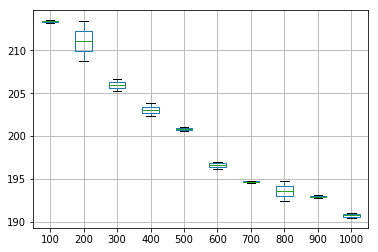

In [30]:
print(results.boxplot())

In [31]:
def scores(e):
    RMSE_Scores=[]
    Ytest_RMSE_1= [123.91562974486496, 121.4203894929394, 121.0825741486673, 120.87640348002944, 120.77752852983127, 120.79048367349667, 120.65607242470759, 120.45751155168125, 120.43392371263005, 120.35877586101358, 120.44141681569499, 120.28570150900774, 120.28772210566993, 120.33690935362434, 120.43132967178757, 120.16601297310193, 120.1794492187634, 120.14804884233986, 120.44664504317491, 120.137008522887, 119.88769757237799, 119.94708639596632, 120.27729462661753, 120.20695617661835, 120.41890654889852, 120.31096583818268, 120.11088262654069, 120.21393465038011, 120.20864865465606, 120.33590663677072, 120.12459897275525, 119.86659510309076, 119.71906761081077, 120.15524096293639, 120.22493677292329, 119.89749394013225, 120.11755830208448, 120.52697598274922, 120.1930926873861, 120.31021871405062, 120.49195058852366, 120.23995433626732, 120.32543635847111, 120.27370027947092, 119.76890699791876, 120.20500719428917, 120.14074041035742, 119.69303614384302, 119.84142588936966, 119.51763272217971, 119.60482409257332, 119.84423495727954, 119.26321229383542, 119.8189560729738, 119.61994109974302, 119.71585652094622, 119.9022101817828, 119.44354887165466, 119.49812179547565, 120.41642633663778, 119.64500420656782, 119.32795628218484, 119.71708565530834, 119.21286369835785, 119.3237650988049, 119.71412053490623, 120.05449748363581, 118.65800594801188, 119.61728747548993, 118.84291094180375, 119.99724133866678, 119.04732222519942, 118.93872746384952, 118.75309704644972, 119.20668870680072, 118.90595967642798, 120.12499242121102, 120.02996582362937, 118.56018913663165, 119.85228018400284, 118.95450095772938, 119.2264484072444, 119.11877123220775, 119.31133858567253, 119.08707209596558, 119.44280840489868, 119.00792243496899, 119.01045064256657, 118.86614220317556, 119.72421917285844, 119.85553136265646, 118.99597049271472, 119.27737540796848, 119.2813377034969, 119.33263780192028, 119.2459743151329, 119.33106288567939, 119.20569078078965, 119.14153506955208, 118.65277549657318, 119.62239602557545, 118.85789240171924, 119.05188255768807, 119.2614971939529, 119.05269062903061, 119.47168473569788, 119.29351836496873, 119.64955057580384, 118.99071265176539, 119.56065027747826, 119.53729265706505, 119.58620617767176, 119.69292342722167, 119.24308183369548, 119.13967618394626, 119.6084753230987, 119.07764723583226, 119.32236333371917, 119.04014751765766, 119.78369233280168, 119.15543979376184, 119.19605536855646, 119.33020065877935, 119.19620568686305, 119.08855361017608, 119.5994692119388, 119.23437775164558, 118.92884438588156, 119.19278205703631, 119.28708710521721, 119.20364046510319, 119.61090044968394, 119.13526293582376, 119.093853926318, 119.11323033979743, 118.50345355686656, 119.47222900607566, 119.42180910451442, 118.6879160615227, 119.11633076284294, 118.90988956841474, 119.07099251873177, 119.59202480612534, 118.55115006301821, 118.9777681983092, 118.8364777361182, 119.00695762979146, 119.09145949658829, 119.13412276529581, 119.1573436899138, 118.4655879666053, 118.87163148737734, 119.14076155649236, 119.33161629335127, 119.08006710407456, 119.05087281701506, 118.85115756941178, 119.5681832913609, 118.50180399007117, 118.53168782460578, 119.89180163880668, 118.27025048588408, 118.93304981807125, 118.51277964435494, 119.00748584291384, 118.71955718346902, 118.93316267281375, 119.36782842584041, 119.35287170594307, 118.97108354447444, 119.29033282503231, 119.27487772715497, 118.71819419783054, 118.92012121935556, 118.5536388516015, 118.78026716962937, 119.29441988692926, 118.60577991432531, 119.09746096515066, 119.41789892945455, 118.46830830787349, 119.06744430938241, 118.6248350780328, 118.55452553893143, 118.98339000889311, 118.82921320105504, 118.59466592334431, 118.6220234231401, 118.93606097674156, 119.14918448612661, 118.80552066167382, 118.96784370005017, 118.42470170248501, 118.31203961317705, 118.42721504706462, 118.36288058443658, 118.25178473292351, 119.4659438190676, 118.84968767419888, 119.02461957404554, 118.43692475367334, 118.38125203004492, 119.00289375268173, 119.0527626674845, 117.96054800488324, 118.47464763515161, 118.81977021452194, 118.86364861459303, 118.36217761076017, 118.43555122169529, 118.70250730653918, 118.29502501045114, 118.76488315610739, 118.24273609711588, 118.50178726262115, 118.07839719251555, 118.00346360591506, 118.65091001550849, 118.46125099309496, 118.54573516533422, 118.03653096639111, 118.23651038305142, 117.99717303603036, 118.20543164883155, 118.46927842772548, 118.57984265045636, 118.43810062181814, 117.69602481211288, 118.39075169991129, 118.4546973290843, 118.16463203665391, 118.07463944421508, 118.36273665768901, 118.5781642683012, 118.68560734439376, 118.93434868336693, 118.36665861128296, 118.22693359582429, 118.78021134916966, 119.18792527746452, 118.41405240048452, 117.99480624605981, 118.50805019280608, 118.3747237182453, 118.21214672681339, 118.1077017734564, 118.58869130341238, 117.89962399387379, 117.733212762764, 117.64737270009996, 118.31449980603499, 118.2719380984746, 117.96716199346835, 117.63382387653418, 118.45224664359743, 118.77977942040229, 118.45382260627196, 118.03904832498723, 117.57864863213344, 118.09664381009763, 117.47277469433755, 118.3555525857477, 117.88712799460426, 118.35516036619207, 117.3880029950309, 118.11269029799105, 118.03019265753258, 118.09660409173601, 117.52841868388691, 117.80042205581171, 117.75190008941598, 118.56285856185669, 117.24780061232002, 117.18480747243468, 117.04843040110406, 117.77806680902039, 118.04354241345428, 118.15132484485797, 118.28020857438847, 118.14207750839037, 117.93699299072051, 117.85157750992133, 117.4506780639229, 117.54550068641585, 117.41724536209819, 117.76698126818353, 117.7777353128217, 117.88530709043557, 117.5146633499371, 117.53157899626443, 117.37110644380783, 117.7594787995624, 117.9463471513957, 117.84051363242531, 117.66414223694241, 117.39061359328582, 117.61011472681386, 117.45993908425164, 117.50839104896785, 117.84140529018354, 117.18634564206023, 117.77414821990179, 117.1798357017181, 117.61825541419576, 117.38204407729913, 117.71813867722894, 117.2669971632561, 117.58356851693289, 117.97018411608303, 118.20512687156264, 117.78259134244009, 117.45868306950794, 117.58494464874161, 118.20217719624586, 117.75046027427503, 117.79390000016296, 117.60588574346886, 117.36031399789027, 118.34393816317636, 117.50338224492255, 118.21602170017967, 118.54835175799185, 117.63585199451975, 117.73248412010376, 117.76217589903149, 118.09861134992481, 117.79475687014566, 118.35159532762297, 118.25246854959367, 118.70687182792322, 118.51991022014444, 118.31884434179763, 118.36463606687431, 117.34688695856302, 118.05459436432179, 117.82291895176485, 117.78973508224662, 117.59688008636876, 118.60380067813456, 117.70065902563533, 117.67363317374635, 118.33077186848386, 118.35146975985127, 118.26538949543101, 118.29395658429655, 118.59292506859558, 118.26896833492029, 117.94539026983162, 118.10444475429343, 118.0652964418627, 118.91712533779629, 118.20460071747979, 118.31971160667702, 118.45984869977084, 118.24483107355735, 118.07075152565002, 119.41212917797716, 119.00754046165213, 117.96701548548747, 117.84603013241612, 118.40200045461549, 118.6340163171327, 118.35844178203739, 117.98340170166404, 118.39595436033247, 118.06628430679832, 119.92093356420034, 117.2873070634114, 118.0450449112856, 119.31039273914543, 118.39802131783537, 118.07026174542622, 118.45439807495652, 118.31722674706833, 120.39922471900319, 118.16213430393834, 118.5144454705999, 118.1349073531467, 118.27029529832701, 118.51679678089043, 118.33052497058891, 118.3669016315085, 118.2353025416416, 118.27241551538296, 117.89181790670563, 118.19582758782883, 118.87549696682163, 118.37208907944563, 118.65956527211169, 118.99378848980574, 118.80654871885665, 118.49217297143039, 117.95000122207219, 118.24417704508394, 119.13998443659294, 118.22118208009171, 118.56023278188484, 118.70291943718414, 118.36698108066949, 118.39495385404994, 117.63281376324059, 118.28572926923854, 119.20171222297569, 118.22359463127633, 118.65767488821905, 118.06809321756693, 118.54726466807261, 118.21692834986517, 117.72513572612961, 120.36099984009624, 118.97010103888834, 118.97662167890479, 118.58627169024784, 119.52568635952252, 118.76928234097305, 118.45840105447716, 118.83214625894763, 119.0848490389804, 118.77812127537443, 119.44612511553325, 117.80599384030403, 118.99826814326258, 118.17966099382026, 118.44829800704152, 118.70644261719288, 117.62336636864643, 118.16734528046634, 118.21551004036486, 118.99563648106745, 118.90024536234641, 119.00412717643285, 117.77718765338479, 118.76580929961924, 118.21209759467773, 117.71944760962103, 118.99270999976605, 117.54646581908622, 120.10433380118421, 118.69020213852204, 117.99687069940703, 118.11358300358853, 118.17653677192571, 118.77881162944546, 118.11892365411742, 118.2945426631194, 117.5383792217321, 118.9155044013534, 117.79592503466581, 118.39098175552184, 118.41844947927338, 118.3156227441923, 118.10905754733814, 117.26312824951573, 117.67909270402886, 119.09109095946313, 117.15578398591569, 118.27058252127095, 117.58016245635821, 119.43749298098032, 118.40970457593306, 117.77760543004972, 118.13813867777152, 117.46728883989195, 117.01001824931924, 118.54065596701024, 117.47207953492868, 116.51844569173447, 117.7825875004971, 119.68072478373129, 117.84749428157646, 117.88705381004378, 117.70550701524847, 117.71939711273998, 118.09836243626563, 118.62999290667273, 118.63612270985537, 117.77494429123347, 118.42210106966267, 116.91850148528944, 117.50366291574602, 117.60482524011942, 116.5825872970417, 117.27923425611328, 117.03426046783744, 117.14353559637085, 116.76839803682999, 117.58285437243569, 116.88232734220321, 118.06761060355986, 116.72394794708609, 115.79239472001443, 116.92833568415794, 117.45977629064707, 116.82602734427999, 116.759388831081, 116.7404150804737, 117.68777472125086, 116.87599711089756, 116.57944480260107, 116.97844443634267, 115.74697266442189, 115.74050615744638, 117.52856783769782, 115.57698471317228, 116.06629675571368, 117.35495171996288, 117.65944994199064, 116.87685020300792, 117.3899345853771, 116.39108132352442, 116.4221955300289, 116.6689920622195, 115.86736898940602, 116.37783764594215, 115.700585704283, 116.5287895694504, 115.91846828544017, 115.54548035622565, 115.87085751953508, 114.6097010950804, 115.31848687258564, 115.10230475766002, 115.49571402889464, 114.88691990336098, 115.747516907657, 115.71848701123344, 115.87252829221073, 114.75418549727443, 114.70098412940528, 115.3004178103508, 115.427464829349, 115.3708653274323, 115.39814254301177, 114.10989640119016, 115.38408728831233, 115.29175373096595, 115.91121954190335, 114.69658995753554, 115.40739207153582, 114.88058702726661, 114.51220848734852, 114.29163650363867, 114.82886219207897, 114.44205060038135, 114.42973752213992, 114.8550647259843, 114.2063219402244, 114.51505054524512, 114.26141953197377, 114.40892750393503, 115.50932267121554, 114.66867692776194, 114.09413285494375, 114.52528161887024, 114.05010556755336, 113.6185682338344, 114.24483020957295, 113.45201601704714, 114.41072751996589, 114.65395659985747, 113.72195298660532, 114.20008033490619, 113.73646275000382, 113.91706527443793, 113.31324974389406, 114.78629932668152, 114.19493728884389, 114.2552744475641, 114.19832883928186, 113.88158401868037, 112.9122120795125, 113.35664408396046, 113.95855988309373, 114.14843208170285, 113.97029011286338, 113.93271520896646, 113.57050153470237, 113.52824052838574, 113.5129333604477, 114.1796009962311, 113.50684330452188, 113.03382215098016, 113.34173713808256, 113.76425826975651, 113.4600561186211, 113.05717453668058, 113.72084716357088, 113.44872375765763, 113.56289865574891, 113.67476261669835, 112.79506947304553, 113.46990595245464, 113.0605076218726, 113.7592800221722, 113.53125673499999, 112.6378378234222, 112.79298162315129, 112.89656872563228, 113.05670342841788, 113.12111841843229, 113.03807077452693, 113.40619255969756, 112.76297996094101, 112.4180734945371, 112.89744991914527, 113.0022577072336, 112.75330482783382, 112.54377883392343, 112.007322261644, 112.5044132234102, 112.45548504231698, 113.24820462599072, 112.32912806555676, 112.4281807924324, 112.26270682489086, 113.08063881659497, 112.87243082392187, 111.89547851464481, 112.00790213609145, 112.13932905104717, 112.73275309977525, 113.00751380092842, 112.65891285753112, 112.54273507102714, 113.04071812629981, 112.41921931806453, 112.71651770415197, 113.07746883342084, 112.414119863931, 112.1571576004565, 112.53551514638625, 111.74362162740353, 112.02622957640754, 111.74877842296235, 111.89787451685635, 112.11373616155653, 112.4902902691052, 112.13284245398118, 112.34739957343179, 112.96704758340982, 112.32923257498516, 113.2419934485537, 112.3841407024974, 113.33488659515776, 111.8732397373957, 111.47903466591723, 112.23270702193473, 113.04625461012633, 112.27146821346109, 112.43687199841925, 111.81730175350906, 112.04311233780356, 111.99531859290923, 111.70718591114739, 111.14462703111562, 112.49013101265558, 112.79660020229487, 112.9421304081629, 112.18515698338209, 112.0474902832963, 111.53826013347917, 111.65632785010028, 112.14849310026996, 111.51252810891992, 112.08182116222386, 111.91896751600402, 111.77778743566351, 111.44413763179482, 111.7614507962705, 111.56991902261946, 110.59214057089658, 110.85742346528201, 111.12339367725798, 111.71402310413988, 111.31070706035192, 112.23244831645117, 110.99823827663029, 111.1357058088697, 111.89764525706978, 112.1377354919394, 111.52154409587251, 112.224983761672, 111.56723447550567, 111.15803881063843, 111.47140526698686, 112.32814964187476, 111.56716966404781, 111.1085191513278, 111.38613363808663, 111.68612064260569, 111.47136195482535, 111.76435612241252, 111.95192807539466, 111.07748980596203, 112.03857397150513, 110.76909046890525, 111.04691367001456, 110.92510200411591, 111.28282272248384, 112.0941556725866, 111.1810325483747, 111.0635903518503, 111.19029647965145, 111.57198337712039, 112.28481244272196, 111.11341437405268, 111.03798864989977, 111.67933289945155, 111.39974145446945, 111.55105612683522, 111.06965279200965, 111.23190433515983, 111.67905871399385, 111.85940991889638, 111.28725566347538, 111.01519704123584, 111.37763994413181, 110.80493782438259, 111.1688432628535, 111.10464489379078, 110.29659534770897, 111.33261169779762, 111.38893824177916, 111.62332001150574, 110.9645326516802, 111.75556632765372, 111.97452701600045, 111.8036309594355, 111.41611160874618, 111.57670037570948, 110.90759290553464, 111.20417250860118, 111.75232769660529, 111.37321065872503, 111.26012195643456, 111.3656809332331, 111.36908400487233, 111.0977543279153, 111.39120685160763, 111.51634788683539, 110.80267604352997, 110.57167967832785, 111.90939045588982, 111.12462043651689, 111.57643954843734, 111.13961954743455, 111.01262346153692, 111.43625452597395, 110.26295024383496, 110.88371005134057, 111.31481828025987, 110.81273418616057, 111.5952422458841, 111.35983216055341, 110.717207808047, 111.17794291472798, 111.04123934425562, 110.53900078067865, 110.61707961224971, 111.20681032798912, 111.84592268306747, 111.59079067936872, 110.92500001308832, 112.11880398428379, 111.28025666908874, 110.61646581900567, 110.97307164401968, 111.24118526801269, 111.29325960816729, 111.79266934295617, 111.23080873691694, 110.43381688995748, 110.39046864490054, 111.17192501260956, 110.3939785032918, 110.57048808279444, 111.15339987771546, 111.3173029045545, 110.18090743245443, 110.70786287538363, 110.78237277840311, 110.20461817304025, 111.62987306770766, 110.9635867090688, 110.87683625319613, 111.38807673968294, 110.73118827698606, 110.67406549661744, 110.75538385522906, 111.05467219967157, 111.26654215427622, 110.94817997803666, 111.48533511910337, 109.92371263751419, 110.26012545352361, 111.11555988359224, 111.38020930054203, 110.59067243688627, 110.97130989567287, 110.17116705259096, 110.76285506341488, 110.58261942049273, 111.47978561512039, 110.58569604474002, 110.49291626533845, 111.22303218804768, 110.58908608291387, 111.08506045522907, 111.0987618910421, 110.78100091886577, 110.8026647437226, 110.24263272863175, 110.53405429407972, 110.8091347782447, 110.73803349279082, 111.2139388534431, 111.12007552496843, 110.48131482289484, 110.65251900434605, 111.77184688106206, 110.9256830322652, 110.61725801501433, 110.59871783429466, 110.94606090551001, 110.3147926110829, 110.30227304681284, 110.65971349095933, 110.32667729514793, 110.83412409438746, 110.34714356443587, 110.69196756245253, 110.8997767924333, 110.45023128713022, 110.45872259986923, 110.77327205858099, 109.83823723859877, 110.96862434505945, 110.07339359419694, 111.10472396586088, 110.69477682737258, 110.16284741220065, 110.59045980274962, 110.36086806144198, 110.7044215151304, 110.75615122709621, 110.35952922468398, 111.08864950346066, 110.31316437894465, 110.33885852127968, 110.7252009932761, 110.40960821265853, 110.39507971448583, 111.07923287827057, 110.04833868720061, 109.89708913913066, 110.28077207328468, 110.37383172626699, 110.11489480830525, 109.98548408986251, 109.75571435920217, 110.70989907463935, 110.30027122845758, 110.12700774647443, 109.91672504014728, 110.53656165063738, 109.86535249387174, 110.43033300885752, 110.48703869908162, 111.28730922584654, 110.1980044717774, 110.28487900527155, 110.90142458739248, 109.89794594929262, 110.11004791275094, 111.13739186631956, 111.04319542302234, 110.69186561289085, 110.5713837899753, 109.8192965910907, 110.28703065075123, 110.18037616061535, 110.13129930498516, 110.59234309591258, 110.6918171190504, 109.83609709659638, 109.59896868273422, 109.58877645366434, 111.13203456099315, 110.41638420379587, 110.25871563500945, 110.25849602791804, 110.99575537124146, 110.47136270963726, 110.13187628105634, 110.21404379599974, 110.38197059866638, 110.14940940641088, 110.72275571083702, 110.0764322093717, 110.17194555301805, 110.02517128857627, 110.22776125304297, 109.7406523504736, 110.30957731337776, 111.69760666507095, 111.59853773506717, 110.11699212637434, 110.16413872842723, 109.79812170512693, 110.44483056824593, 110.1926163875052, 110.00367585266979, 110.34428174593495, 111.0494288012614, 110.58241594552089, 110.36183366864624, 110.92975371337828, 109.98956014472795, 110.90135275672442, 110.5063034506275, 110.23542505020983, 110.63907693826968, 109.87209470425522, 110.13215224202871, 110.91499121065272, 110.36145895500535, 109.82432112723514, 110.92940971913906, 110.38889247827879, 110.08274365052552, 110.46098051369603, 109.68590788430926, 110.63761410550522, 110.06039406436255, 110.73590916361205, 109.36608429195887, 109.74284845276976, 110.17109054914815, 110.15287230130116, 110.31413085389748, 109.89081138789471, 110.18639299300978, 109.85123138299302, 109.63534978913427, 110.39768104032335, 109.69890601093813, 109.88741864338044, 109.72773917957592, 109.76195584224638, 110.06783075647151, 110.26923750587468, 110.26426217536549, 110.62514861724524, 109.95558908419765, 110.43208346062086, 110.29801425330284, 109.42503126787983, 110.15391643633727, 109.308062854001, 110.41609523483105, 109.93725047636369, 110.68722094549042, 110.0557095007346, 110.24648532740711, 110.92469839888595, 110.40984411274827, 110.43729515725536, 110.52341410060723, 109.43682776643237, 110.2233258531429, 110.55088748069154, 110.59651614855187, 109.37047454547239, 109.88383172695985, 109.42548863863952, 109.91703304676956, 111.0856745398534, 110.06049901230267, 109.80753181317917, 109.99525635204786, 110.58451983016464, 109.83620623765327, 110.41081824392673, 109.93807042975932, 109.89032751460414, 109.92364497775148, 110.63855825343298, 111.06400500550583, 109.70259948901484, 109.98873980948447, 109.62373175616705, 110.5880669228492, 110.90161049697431, 110.50291674925904, 110.04902478789433, 109.93491818518817, 110.1692286684683, 110.00952081277697, 110.17702483675457, 109.46883377200372]
    Ytest_RMSE_2= [126.26278763954089, 122.25496125588089, 121.19102719208381, 120.73981076258023, 120.63709219882521, 120.51508292495825, 120.51535421255383, 120.42126727274274, 120.48705447845343, 120.34768433350659, 120.3936988294105, 120.34069645753075, 120.37767045928113, 120.37268034058123, 120.29058923620592, 120.18922832287893, 120.33315504995527, 120.30379855357171, 120.32282802187984, 120.16782187326672, 120.25704219026949, 120.07725221219357, 120.0718398218315, 120.09395082751118, 120.2616337210209, 120.15988783919599, 120.06144522171182, 120.04353106811858, 120.0474585533462, 120.2734797478437, 120.23018464026582, 119.92773421495069, 120.13593670917518, 119.9867876372127, 120.06914500483857, 120.12190073556377, 120.3556823703518, 119.94242201588939, 120.22055791674794, 120.22583724044263, 120.08649610356511, 120.10158339788089, 120.33452314116579, 120.38567655546852, 120.09104811072896, 120.10832760983155, 120.40169946126548, 120.10667975650087, 120.12821187355797, 120.16898971413194, 120.88601229806783, 120.15225030909296, 120.25676674118286, 120.54804061408922, 120.08209720926997, 121.06247477349399, 120.26886166779379, 120.47250969845054, 121.77965376223294, 120.53860595919734, 120.87990849440313, 120.71651727950473, 120.13949798075028, 120.15284850369987, 120.82011879448632, 120.46178026088505, 121.16110142664355, 120.75316476351773, 120.64618629788849, 121.03384112610834, 120.75698986757892, 120.56709525429184, 121.39487017188573, 121.1266705229832, 120.92606407280482, 120.51341740394197, 120.64325393747409, 120.60966856978156, 120.64072738777749, 119.93497385622054, 120.4585559427046, 121.40578507362952, 120.29391673967439, 120.36828618222825, 121.13958050447691, 120.73516285089802, 120.89195222882802, 121.2407992601092, 121.20463435751617, 121.18857177449974, 121.22405609940138, 120.225830176518, 120.50653903510533, 120.78888267219152, 120.39297286510087, 120.42086282443654, 121.07211990983126, 121.29866050751008, 121.17453507826062, 120.10312561842017, 121.30448753412243, 120.59982089852637, 121.16467587369795, 120.97601686065889, 120.4435653182775, 120.84076217206707, 121.53170608317316, 121.29002523433515, 121.29611756848678, 121.42204971167968, 120.68355779677826, 122.06492846278181, 121.65055672863149, 121.57522957193615, 121.6472536328662, 121.85840592289932, 121.38966258632303, 121.60979119361554, 120.92662429406947, 122.64043403269135, 121.23626183599863, 120.7213482196365, 121.20435426164102, 121.30780172919987, 123.16943325570237, 121.43259948573602, 122.09300684954736, 121.43026116139305, 122.39248374687334, 122.03837378035136, 121.2740928529546, 121.74544415612306, 122.37231460757684, 122.27161137941314, 122.29703715969744, 123.31034710988428, 121.37727638617991, 122.18199604054749, 122.19949892255599, 121.56396859873503, 122.35560381169088, 121.81739824937635, 122.97803303493662, 122.76577448404103, 122.12950005587551, 122.73798631905433, 122.82613590780052, 122.80799308398772, 122.93166878332178, 124.59240581288017, 121.97903433325298, 122.02296374590401, 122.79437710981922, 122.50914898878858, 122.75355612186621, 123.34292117374352, 122.42111018746854, 123.1152015139475, 121.96812211223327, 122.89641416589753, 122.89842467601966, 122.70654736704005, 124.06836731387459, 122.06503929461311, 121.95597442626887, 121.4668249698446, 121.42050391337705, 121.93107505645061, 121.74549924941746, 121.20926513190155, 122.6452283690802, 122.59413809488035, 122.46192465033562, 122.1033661747817, 122.40405847338343, 121.66023453620839, 122.12279878221959, 122.01794872074709, 122.4691556137032, 122.51693106814639, 122.79102354255221, 121.99378320637796, 122.31369381468068, 122.05210899439811, 121.78406729505743, 122.9262452747826, 121.33135814065744, 121.42047571885081, 121.7141800590253, 121.85132476198557, 121.42361849774962, 121.06003536440427, 122.35556593830087, 122.06644599664196, 122.31318363751149, 121.38449595687824, 122.18054547472985, 121.72918443635709, 122.66399807955936, 121.65884644110449, 120.64623210043447, 122.66632660106158, 122.31037303529278, 121.94693636339525, 122.13452283983067, 121.11952619718603, 121.36375923651238, 120.79191867846419, 122.06368313001056, 121.21595528023525, 121.38230895314234, 121.44034064554444, 121.48349643577193, 121.4859844855126, 121.46254354924503, 121.67425384164987, 120.72839960148362, 121.80225685314295, 120.84544526454287, 121.20089230098617, 121.653656306215, 121.17758181911135, 121.26265694715627, 121.18372178139813, 120.50486483557866, 122.00234231891937, 120.52232569513198, 120.37701771730524, 122.17985966742438, 121.05063215957237, 120.57976654623363, 120.99391821709438, 121.1064701292952, 121.25918727722454, 120.96715037942855, 121.21147141641904, 120.6374744927772, 120.97176390511413, 121.42222913503636, 120.478354093142, 119.3408867182152, 121.13531603611847, 121.47759928231088, 121.75610661897882, 120.62072186721777, 120.78735506246022, 120.27274613534155, 120.0547671338015, 120.64532122322218, 120.75250785232174, 120.54033729779997, 120.08977316283362, 120.58655593589799, 120.8692455068906, 120.53007553536861, 120.86579735258327, 119.93125381887339, 120.61315592054991, 121.2867000110914, 121.92464772079492, 120.84847713418276, 120.57501498543301, 120.1034007150465, 120.38858156108259, 119.96395946280558, 120.7965659421075, 121.17504517532004, 120.98083960830255, 120.5261287794991, 119.81897332124683, 120.86605096438714, 120.99352438027564, 120.07595238690051, 119.76872104121527, 120.96160151855115, 121.07816966117777, 119.47448462598922, 120.75011847577608, 121.37180719975186, 120.54819611194614, 120.84078330760518, 120.6875129616083, 120.85139211877043, 120.92534834393074, 119.87365952494312, 120.74847474947866, 120.97122783563894, 120.4062574770049, 120.71125413764389, 121.33902902961282, 120.36006056959086, 120.50729929005414, 120.49825463210047, 120.61177221488082, 119.89911754059706, 120.15727057220391, 120.23045131018806, 119.3475583151809, 121.06003396604005, 119.37300583024927, 121.1544015960351, 119.8783143514087, 120.14856354592112, 120.37303357132953, 120.5236333498831, 119.61863527250534, 119.96218214901148, 120.10776195880945, 120.22849218216838, 119.73301778358707, 119.15125245602935, 119.81313309241165, 119.91263497455984, 119.65035149864994, 119.23416931087422, 120.66748560531933, 118.79970357550593, 119.9970592828891, 120.09315695148048, 120.71531701720076, 120.7115547139831, 119.53746893969513, 120.52619390210539, 120.57365995057692, 119.34124446727054, 118.63950498206525, 120.02799970726677, 119.75778265991865, 120.17370072011782, 119.6279039361523, 119.53028775406446, 119.47017404741992, 119.64140053984262, 121.68475825430897, 120.05960510674815, 118.84933292771646, 118.93604482447242, 118.45151162467583, 118.63366678271353, 118.76019607266602, 118.44676987543684, 118.00533875005497, 118.7824718505739, 119.55658526050878, 118.57661304556325, 118.27921424147077, 119.60944271812937, 118.60875401002528, 116.87974513952389, 119.22309736718373, 119.60852791839487, 118.65614172952397, 119.12585123675154, 118.41218652123293, 118.98710609206178, 118.6328770059974, 118.32440758708233, 117.94599208137555, 119.08957298507507, 118.7762761335548, 118.56416356497631, 118.4565358024205, 118.207063983442, 118.38566362323203, 117.90283316692958, 118.5122878420731, 118.25134238418929, 118.7564354746726, 117.6145841873948, 118.45671823109735, 118.25984600316961, 118.37743396824229, 118.70206308220422, 117.43644270966803, 118.35672686470406, 118.27397442571689, 118.36390779180516, 117.67733227968891, 118.195610544445, 117.8088435811701, 117.42708143463261, 117.16695078847434, 117.77179729318138, 117.7688017143013, 117.63751174278333, 117.47671068116101, 119.50908759529956, 117.99355596082631, 118.21722198451107, 117.96057349182165, 117.8677176585876, 118.49652842469422, 117.9676223102569, 117.27109700663496, 117.28964505535689, 117.5011703183006, 116.89971175909393, 116.83868697826013, 117.75370572970623, 118.17913451412288, 117.99775816900238, 117.98371119336112, 117.58134864154852, 117.59521037409571, 117.97829671156346, 117.11218695479882, 118.61918903945386, 116.81530575185303, 118.06838594000011, 116.84697380668, 117.01334987067314, 116.7901528163074, 117.20228129632888, 117.03222603857179, 117.9214159983351, 117.28085138878716, 117.85532222977903, 118.11581493715086, 117.59210456200572, 117.38540561833068, 116.76034560523267, 116.85020280894005, 116.70844503216108, 117.11695623351233, 116.73555441631576, 117.11349469769821, 117.29299290447437, 117.19371393214563, 116.6852410940166, 117.80624997929091, 116.91541597173136, 116.45834228383602, 117.1778596872351, 116.11417189329104, 116.88204603655242, 117.85201234573177, 116.63646670401813, 116.85704012000991, 116.7191114365303, 116.15331497418676, 115.69296916613146, 116.8847903948461, 116.9947310349967, 117.12780518433759, 116.69484871641002, 116.04266740438322, 116.34064169608577, 116.14870655998823, 117.1260018586831, 117.15515174456499, 116.8864083570826, 116.73050945271116, 116.67592305237221, 116.21637888131187, 117.28153701248483, 116.69727922983901, 116.55324815883745, 116.9333967361159, 116.45829574647962, 115.74344317138966, 115.91028147116307, 117.38052198819219, 115.98330643008552, 116.05419712184732, 116.61841533923256, 116.6413507870544, 116.60718918722246, 116.27460771585028, 117.65001175982619, 116.83065476907247, 117.07704988134897, 117.11793828202462, 116.36417421760409, 116.73592774363443, 116.45698400669059, 116.98511995833265, 116.81532990119442, 116.61568469536932, 117.65441950008073, 116.3830759171514, 116.84037947347669, 117.79500297389401, 117.3146571917061, 117.76221060256901, 118.33159806010728, 116.80975686967926, 116.41335311790351, 116.79546072267047, 116.97459767829136, 116.69624762289567, 117.34565169027682, 116.4097146612607, 117.38402932487003, 117.23301316808701, 116.93033061996161, 116.82140901725855, 115.74251060027981, 117.2632722441546, 116.86190945301139, 117.04092312418064, 117.31028287638131, 116.75005254024221, 116.59043354412486, 115.76151646139243, 116.91347179314455, 116.8234364626025, 116.79814433137722, 117.26508893896172, 117.2619795011817, 117.05194560935809, 116.16475063796393, 117.33547798687123, 117.08504909980148, 116.21254584102088, 116.44732184607697, 116.78045399412491, 116.6098572348386, 116.44702691984101, 116.27044637597068, 115.65223700405592, 116.39027498943555, 117.16591126049468, 115.94553679816067, 116.28444485653053, 116.44903451982856, 115.7938153394487, 115.98737758786126, 116.02799088824925, 116.20049085327244, 116.92284839441197, 116.88818995270435, 116.64836499238804, 115.2545245694609, 115.96712256215228, 116.22517422436721, 117.63434320399755, 117.28167583693073, 116.7830911757721, 116.08979755022659, 116.44182324387617, 117.18537888071172, 116.75522552245721, 115.64900986195835, 115.60197480730109, 116.35584993019957, 117.89164615061001, 116.85919761360546, 116.44724537192332, 115.91525553711966, 116.77976268944902, 116.30002760342862, 116.14202456293926, 117.48811132947877, 116.77568597673617, 116.38574943551141, 116.17206511634774, 116.3749358490907, 116.0346831360846, 116.16712222950483, 116.58028987954643, 116.44735907587224, 115.6043529679754, 115.66551915348077, 116.67716229710365, 115.86588413458446, 115.37224415935282, 114.83473188335036, 116.99193870500517, 116.46843937332844, 115.8920856548117, 115.70830076843646, 115.86221227439644, 116.38225835355084, 115.35229379497692, 116.48120485347773, 116.2489136137735, 116.27224256890456, 116.74857192578962, 115.9523708480406, 115.988743126962, 115.12348314434952, 115.4698248139587, 115.82883517962802, 115.90582299214344, 115.72779837407715, 114.50239590371541, 115.20478194701394, 114.75545012061832, 115.50423147894715, 114.80050877089018, 115.646035036166, 115.70323974533052, 115.3708594968538, 114.40604393310623, 115.64141366804057, 115.07071563784851, 115.2451346628538, 115.03568006471937, 115.31377034387685, 115.90426064710768, 115.01740980768928, 116.01769326773015, 115.99702041220911, 115.43841883427575, 116.29803342813108, 114.97639187576668, 115.24183782576583, 115.948859303922, 115.47797605948888, 116.60860302401998, 115.04083943962596, 115.01879432161086, 114.29326509184813, 114.16980297036609, 114.81642356727622, 114.86705982952562, 115.05059603071015, 115.14511421323685, 114.87645000719101, 115.35350302232914, 114.98421197770998, 115.54320129387955, 115.11485032901079, 115.35208226804362, 115.34903735452608, 115.8844112285403, 115.25759521578556, 115.13436133338269, 114.57657597718176, 114.97632275498485, 115.51692386931897, 116.00005059982603, 114.32680375072162, 114.94762526736837, 115.60011910919151, 115.47981091224273, 115.78463465633759, 114.75312769158944, 115.42376479995801, 115.13052528238696, 115.25906091261828, 114.0730656064628, 115.29895541587355, 115.4619527659731, 114.25809374093843, 115.18914005148135, 114.95441827686061, 115.83467961350263, 115.65879562730561, 115.30086818941326, 114.80811879008891, 115.19043005406118, 116.02616484647832, 114.57945999684853, 114.33700264509235, 114.41393405001064, 114.67049578740786, 115.77177790875176, 114.88217061566482, 114.9017834834326, 114.95525512535737, 115.27011101947417, 115.81852035230185, 115.13966689884087, 115.0581359699321, 114.01996827710364, 114.89313491556881, 115.08634592661916, 114.54642613335224, 115.3433075542686, 114.07880489403742, 115.02592509483273, 115.1021342346902, 114.85473244193973, 115.01812161420204, 114.88562168705988, 115.5745236624459, 115.09929212562166, 114.49378751704644, 115.21076439757285, 114.42876105022377, 114.5162397709469, 114.8499930935407, 115.15681694551722, 115.00458978698359, 114.90104064365403, 115.7735768627459, 114.74554816274326, 113.87306496752299, 115.50968680789362, 115.18804996947132, 114.75698068211042, 115.09911568986676, 114.82575084553626, 114.91832879268273, 117.2330198583249, 114.77806692206636, 114.79816881990558, 115.40273730939367, 114.70995859601621, 114.59583928644884, 115.65371348759388, 114.67090982696088, 114.17290077123594, 114.66724505239549, 114.96341950872655, 112.9876807696304, 114.81715519361971, 116.41761960948193, 115.9707277731844, 115.16885643892988, 115.20196732389547, 115.58464675767196, 114.81260147090336, 114.10510618781151, 115.29304511174641, 115.31061366452901, 114.39308866233651, 115.03050608696418, 114.63783676013917, 114.72765763442523, 114.22378157750182, 113.94505933766689, 114.85448046672839, 114.76314906771896, 114.25694768834043, 114.43165839759045, 114.3591152255971, 114.98014629049831, 113.73049039446292, 114.7535358488695, 114.19670733371207, 114.79365011377756, 114.70576348410587, 115.19722416064738, 115.17847733204725, 114.78711187524681, 113.90677421450003, 115.12750733193282, 114.24871718325873, 114.57754084339304, 114.79459285997164, 115.01125515027145, 114.1890285895785, 114.2066180807907, 114.62355070908353, 114.71002448652783, 114.30926989178151, 113.231462274345, 114.54318818013228, 114.60962624373808, 114.09043832966812, 113.93325469417888, 113.22359279334553, 116.3202053812021, 114.66638585352631, 114.40628708705451, 114.58897848450867, 113.92799743417349, 114.53302847419589, 114.86002851144383, 114.49132970584701, 114.66687778201708, 114.3100999934962, 114.065460768904, 113.40379611733688, 114.20226319456833, 114.24941488723084, 114.10999587255878, 113.84815075349543, 114.48317615701711, 114.08176342290972, 114.18961354591762, 114.58743601801653, 114.22824069802112, 113.28336950562243, 114.56183541173077, 114.78936608577021, 116.18384291441527, 113.96191881957849, 113.76341961066866, 113.32309240045188, 113.44585782295503, 113.80841767947788, 113.36363008730133, 114.52129933710951, 114.40418876443397, 114.24182145730062, 113.98030352643036, 113.98778222382246, 114.24623270826758, 113.7292080160216, 114.2054818324356, 114.21885900682459, 113.649454622057, 113.94048914390096, 113.88846005061403, 113.58967363599128, 114.06474028352137, 114.12409595982714, 113.313268649721, 113.04805775768766, 114.86498039336834, 113.94087773640037, 113.49669374532208, 112.9051473839481, 112.8090398700582, 114.24832097680148, 114.34328476575189, 114.68309158137716, 114.15460595823481, 113.83779680833072, 113.84745264279628, 113.64575117272844, 113.0515482380651, 113.17010401038674, 114.59434882346204, 114.19478070592642, 114.58807687021437, 113.71286647000672, 112.94754957800369, 114.69310519474033, 113.50261138957566, 113.3010066898676, 115.09297661586682, 113.14730105382182, 113.02783555367394, 114.29228302179573, 113.37878005731159, 113.31990488526206, 113.4099798581937, 113.86652659428162, 114.04691188777406, 113.09151082581032, 114.66990336308473, 113.0575650027639, 113.24388871490304, 114.02894632540902, 113.34533023962788, 114.3831511214948, 113.79117257556105, 113.85092785526214, 113.17269209994973, 113.66387956797723, 114.40985425556013, 113.05926846223574, 113.54474113289906, 112.98321471464318, 112.79103807876048, 113.76365326878448, 114.68961243046174, 113.96863303085642, 113.14144524899166, 112.76320629791948, 113.6203899758729, 113.07905338306658, 113.38219737269621, 112.5027844402557, 113.1462995587028, 113.41471059616215, 113.03878908622421, 114.46807724209123, 113.99259749804789, 114.0047658657503, 112.64684537682238, 114.3895586941611, 114.05385792856056, 113.60144446569156, 113.58986231877041, 113.49674644592783, 113.16382688530899, 112.31462328747163, 113.86016101358744, 112.62319660916745, 113.35070535335046, 112.97934973375777, 112.32705666159194, 113.52979737074344, 113.57071975915134, 113.04624963483532, 112.82940433614084, 112.57537221335461, 113.45270383444198, 114.11884247811432, 112.61846797885995, 113.34027878045491, 112.40197253437238, 112.90633559884829, 112.73910407955506, 112.47085785162844, 112.80038988248651, 113.2836638515305, 113.82387765792855, 114.67571058232234, 113.3237536952345, 113.37505510373155, 112.15059287501967, 112.4172462802285, 112.73784802807748, 112.97928765467331, 113.76517797472506, 111.90957570497844, 113.88278498710392, 112.80799402220403, 112.99563564085467, 112.57339340471592, 112.31167724182612, 113.36339194571629, 111.54094728708615, 111.88260540667443, 113.13500324904362, 112.95308648629793, 112.79530496253714, 113.18587152083222, 114.4814063287196, 113.46814189235053, 113.61843358468103, 112.20103536696855, 111.91696946528513, 112.46238030312705, 112.36708392473666, 111.58925523063536, 112.62187493528856, 112.31789770191146, 113.32279189882175, 113.64434021427827, 113.97796560095811, 113.00243708996791, 112.20586597352214, 113.01216539781963, 111.8888450776267, 112.25068810817521, 112.76209012443032, 111.89533337667788, 112.49806335995127, 112.3348262811704, 111.85286517690683, 111.91529565829869, 111.99720508662057, 112.71190254309025, 112.69889572376874, 111.90187029496596, 112.92683017276366, 112.82963342285926, 111.28912374635192, 113.22997735534406, 111.61563083073787, 111.98301798622093, 112.46984527534069, 111.33401227721448, 111.94634595799502, 112.040444594548, 112.00515188734664, 111.55302638060503, 111.49676324492142, 111.92836599622999, 112.49353360607756, 112.83971822260612, 112.20634723855858, 112.3573215034178, 111.97520205028252, 111.88189528556529, 111.61355771075773, 112.58587783347501, 112.17110060583406, 112.08244312730386, 112.35561263290143, 112.36288202372526, 112.71266073111624, 113.99545070554977, 112.22639176727289, 112.11502009303761, 111.41667624221641, 111.76303718808894, 112.02495577442991, 112.26524601865903, 111.92315235671458, 111.17859855234896, 112.585193107918, 112.0000504048108, 110.97387194012958, 111.35601124902568, 110.21920314103475, 112.07029116634602, 111.64256705802389, 111.71831233159226, 112.70321318372106, 110.54089759464296, 112.09242356355035, 111.03652433217576, 110.93652829267327, 111.38142973774879, 111.92215007647532, 112.35837572374231, 111.77195147644491, 111.39026607429928, 111.52497021535042, 111.21447841569469, 112.61859362642029, 111.9721539704836]
    scores=[Ytest_RMSE_1, Ytest_RMSE_2]
    for i in scores:
        RMSE_Scores.append(i[e-1])
    return RMSE_Scores
results = pd.DataFrame()
epochs=[100,200,300,400,500,600,700,800,900,1000]
for e in epochs:
    results[str(e)]= scores(e)
results.describe()

,100,200,300,400,500,600,700,800,900,1000
count,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
mean,119.377951,120.341733,118.607206,118.287044,117.009684,114.512690,113.402057,112.147632,111.575617,110.720494
std,1.025552,1.862680,1.083005,0.152607,0.044179,1.967979,1.849652,2.795143,1.985091,1.770115
min,118.652775,119.024620,117.841405,118.179135,116.978444,113.121118,112.094156,110.171167,110.171946,109.468834
25%,119.015363,119.683176,118.224305,118.233089,116.994064,113.816904,112.748106,111.159399,110.873781,110.094664
50%,119.377951,120.341733,118.607206,118.287044,117.009684,114.512690,113.402057,112.147632,111.575617,110.720494
75%,119.740538,121.000290,118.990106,118.340999,117.025303,115.208475,114.056008,113.135864,112.277452,111.346324
max,120.103126,121.658846,119.373006,118.394954,117.040923,115.904261,114.709959,114.124096,112.979288,111.972154


AxesSubplot(0.125,0.125;0.775x0.755)


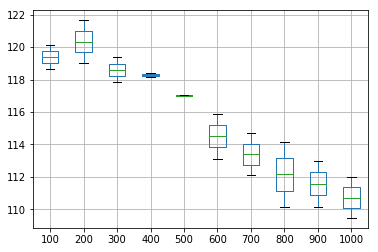

In [32]:
print(results.boxplot())

The results above show that the RMSE is decreasing over the 1000 epochs and might decrease further if trained for more epochs. But the pace ta which it is decreasing is very less and is no where near the results produced by LSTM. Also, taking the run time into consideration 1000 epochs are enough.

In [ ]:
#call model definition
click_SRNN_model= click_stateful_SRNN(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.1)
click_SRNN_model.summary()

#Train
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

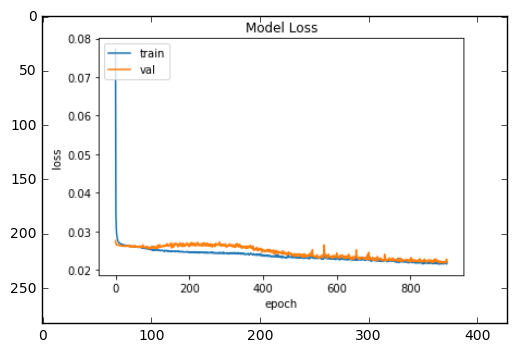

In [24]:
#Loss Curve
img=mpimg.imread('click_stateful_srnn_loss.png')
img_plot= plt.imshow(img)

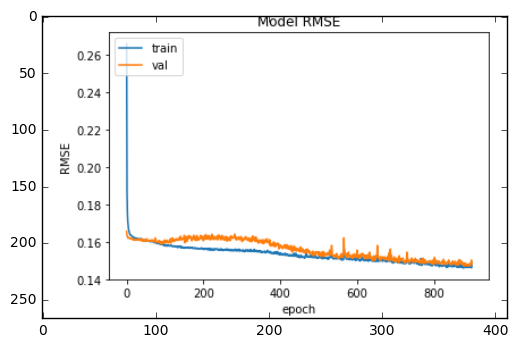

In [25]:
# RMSE Curve
img=mpimg.imread('click_stateful_srnn_rmse.png')
img_plot= plt.imshow(img)

Looking at the increase in validation loss in between the epochs the dropout is increased to 0.5

In [ ]:
#LSTM call model definition
click_SRNN_model2= click_stateful_SRNN(units=50,lr=0.001, batch=133, alpha=0.05, dropout=0.5)
click_SRNN_model2.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model2, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts2.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

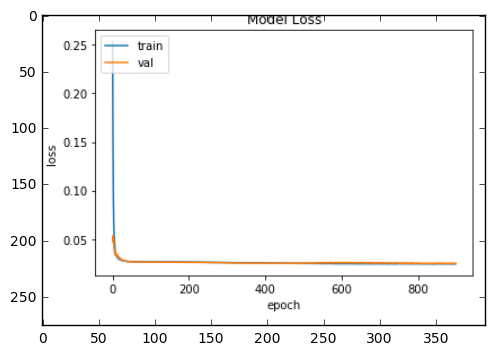

In [26]:
# Loss Curve
img=mpimg.imread('click_srnn_0.5dropout_loss.png')
img_plot= plt.imshow(img)

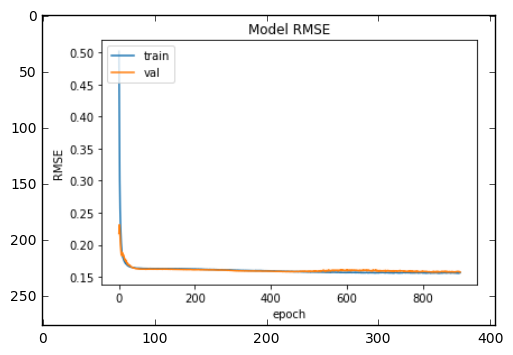

In [27]:
# RMSE Curve
img=mpimg.imread('click_srnn_0.5dropout_rmse.png')
img_plot= plt.imshow(img)

Train using new parameters tuned

In [ ]:
#LSTM call model definition with no dropout
click_SRNN_model3= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01)
click_SRNN_model3.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model3, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts3.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

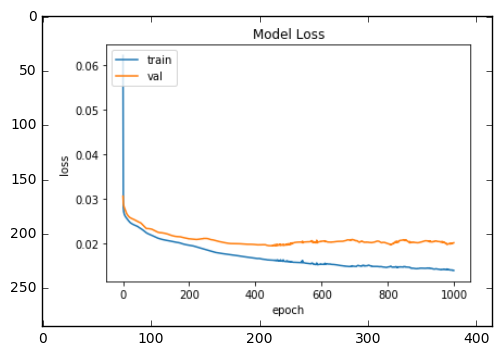

In [24]:
# Loss Curve
img=mpimg.imread('new param srnn loss.png')
img_plot= plt.imshow(img)

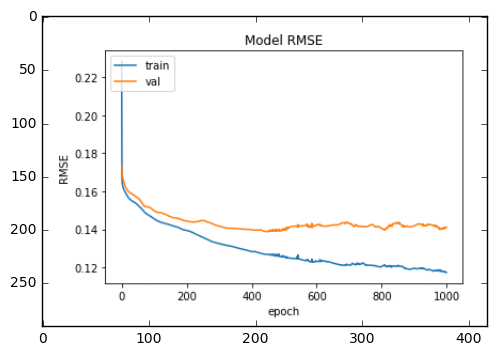

In [25]:
# RMSE Curve
img=mpimg.imread('new param srnn rmse.png')
img_plot= plt.imshow(img)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_1 (SimpleRNN)     (133, 40)                 1720      
_________________________________________________________________
dense_1 (Dense)              (133, 2)                  82        
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (133, 2)                  0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Instructions for updating:
Use tf.cast instead.
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0948 - rmse: 0.2967 - val_loss: 0.0296 - val_rmse: 

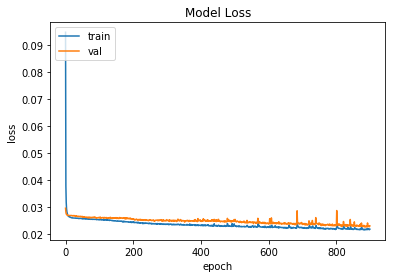

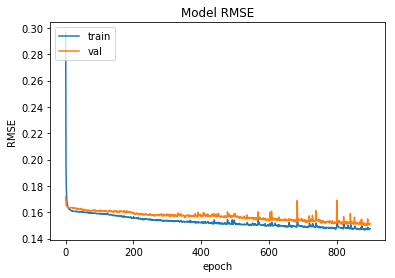

In [29]:
#LSTM call model definition with recurrent dropout 0.1
click_SRNN_model4= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model4.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model4, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts4.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

Among the stateful models, this performs the best.

In [30]:
click_pred_train=click_SRNN_model4.predict(X_click_train, batch_size=133)
click_SRNN_model4.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model4.predict(X_click_val, batch_size=133)
click_SRNN_model4.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model4.predict(X_click_test, batch_size=133)
click_SRNN_model4.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  193.02610328695854
YRMSE train:  110.85471239838115
XRMSE val:  194.93035127130173
YRMSE val:  115.77151505668591
XRMSE test:  196.7968827045668
YRMSE test:  114.940393415498


Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_4 (SimpleRNN)     (133, 40)                 1720      
_________________________________________________________________
dense_4 (Dense)              (133, 2)                  82        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (133, 2)                  0         
Total params: 1,802
Trainable params: 1,802
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0943 - rmse: 0.2990 - val_loss: 0.0334 - val_rmse: 0.1826

Epoch 00001: val_loss improved from inf to 0.03343, saving model to click_SRNN_wts6.hdf5
Epoch Number:  1
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 1s - loss: 0.0531 - rmse: 0.2300 - val_loss: 0.0320 - val_rm

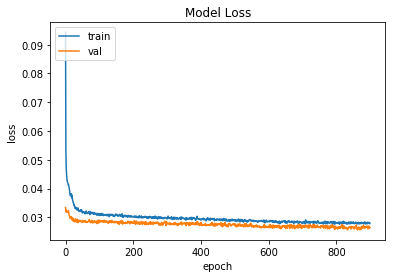

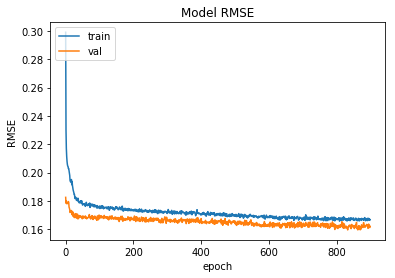

In [38]:
#LSTM call model definition with both dropout and recurrent dropout 0.1
click_SRNN_model6= click_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1, rec_dropout=0.1)
click_SRNN_model6.summary()

#fit model
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model6, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts6.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [39]:
click_pred_train=click_SRNN_model6.predict(X_click_train, batch_size=133)
click_SRNN_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model6.predict(X_click_val, batch_size=133)
click_SRNN_model6.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model6.predict(X_click_test, batch_size=133)
click_SRNN_model6.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  209.3195176862612
YRMSE train:  119.35838990027706
XRMSE val:  210.46382253889584
YRMSE val:  123.10795307212706
XRMSE test:  210.0598892326487
YRMSE test:  123.71985977944148


In [39]:
#simpleRNN stacked stateless model
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN(units,lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_3 (SimpleRNN)     (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_4 (SimpleRNN)     (None, 40)                3240      
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 82        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 2)                 0         
Total params: 5,042
Trainable params: 5,042
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 5s - loss: 0.0618 - rmse: 0.2291 - val_loss: 0.0276 - val_rmse: 0.1657

Epoch 00001: val_loss improved from inf to 0.02760, saving model to click_SRNN_wts7.hdf5
Epoch 2/1000
 - 2s -

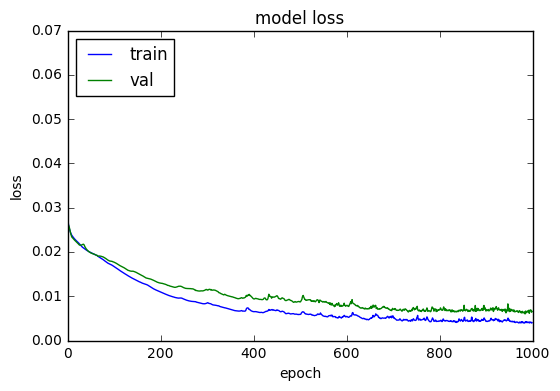

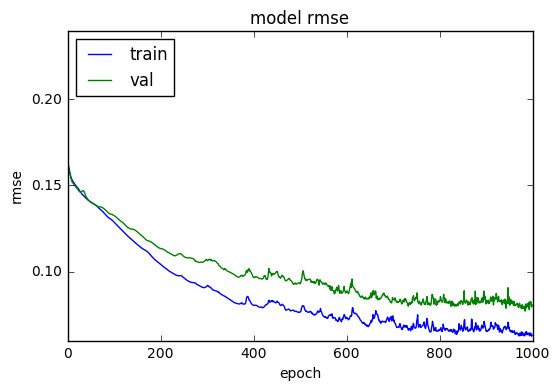

In [30]:
#2 hidden layers with 40 units each
click_SRNN_model7= click_stacked_stateless_SRNN(units=40,lr=0.001, alpha=0.01)
click_SRNN_model7.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model7, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts7.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [31]:
click_pred_train=click_SRNN_model7.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model7.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model7.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  83.06571161693402
YRMSE train:  52.40637726029948
XRMSE val:  100.18309082094433
YRMSE val:  63.907681480272124
XRMSE test:  100.80024259349508
YRMSE test:  65.04323082846709


the model trained above with 2 hidden layers having 40 units each perform sthe best so far. Let's try adding one more hiden layer.

3 hidden layers with 40 units each does not perform well. It shows sudden increase in training and validation loss. Thus, let's see if the model performs well with a decrease in the units in one of the hidden layers.

In [33]:
#simpleRNN stacked stateless model with 3 hidden layers
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN2(units_1, units_2, lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units_1, return_sequences=True))
    model.add(SimpleRNN(units_2, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_7 (SimpleRNN)     (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_8 (SimpleRNN)     (None, 18, 40)            3240      
_________________________________________________________________
simple_rnn_9 (SimpleRNN)     (None, 30)                2130      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 2)                 0         
Total params: 7,152
Trainable params: 7,152
Non-trainable params: 0
_________________________________________________________________
Instructions for updating:
Use tf.cast instead.
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 4

 - 3s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0203 - val_rmse: 0.1419

Epoch 00040: val_loss improved from 0.02037 to 0.02031, saving model to click_SRNN_wts8.hdf5
Epoch 41/1000
 - 3s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0202 - val_rmse: 0.1417

Epoch 00041: val_loss improved from 0.02031 to 0.02024, saving model to click_SRNN_wts8.hdf5
Epoch 42/1000
 - 3s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0202 - val_rmse: 0.1415

Epoch 00042: val_loss improved from 0.02024 to 0.02017, saving model to click_SRNN_wts8.hdf5
Epoch 43/1000
 - 3s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00043: val_loss improved from 0.02017 to 0.02011, saving model to click_SRNN_wts8.hdf5
Epoch 44/1000
 - 3s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0200 - val_rmse: 0.1410

Epoch 00044: val_loss improved from 0.02011 to 0.02005, saving model to click_SRNN_wts8.hdf5
Epoch 45/1000
 - 3s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00045: va

 - 3s - loss: 0.0161 - rmse: 0.1266 - val_loss: 0.0185 - val_rmse: 0.1357

Epoch 00090: val_loss improved from 0.01859 to 0.01854, saving model to click_SRNN_wts8.hdf5
Epoch 91/1000
 - 3s - loss: 0.0161 - rmse: 0.1264 - val_loss: 0.0185 - val_rmse: 0.1355

Epoch 00091: val_loss improved from 0.01854 to 0.01849, saving model to click_SRNN_wts8.hdf5
Epoch 92/1000
 - 3s - loss: 0.0160 - rmse: 0.1260 - val_loss: 0.0183 - val_rmse: 0.1350

Epoch 00092: val_loss improved from 0.01849 to 0.01833, saving model to click_SRNN_wts8.hdf5
Epoch 93/1000
 - 3s - loss: 0.0158 - rmse: 0.1254 - val_loss: 0.0182 - val_rmse: 0.1345

Epoch 00093: val_loss improved from 0.01833 to 0.01822, saving model to click_SRNN_wts8.hdf5
Epoch 94/1000
 - 3s - loss: 0.0157 - rmse: 0.1249 - val_loss: 0.0181 - val_rmse: 0.1340

Epoch 00094: val_loss improved from 0.01822 to 0.01808, saving model to click_SRNN_wts8.hdf5
Epoch 95/1000
 - 3s - loss: 0.0156 - rmse: 0.1244 - val_loss: 0.0178 - val_rmse: 0.1331

Epoch 00095: va

 - 3s - loss: 0.0118 - rmse: 0.1084 - val_loss: 0.0132 - val_rmse: 0.1145

Epoch 00137: val_loss did not improve from 0.01308
Epoch 138/1000
 - 3s - loss: 0.0117 - rmse: 0.1079 - val_loss: 0.0132 - val_rmse: 0.1144

Epoch 00138: val_loss did not improve from 0.01308
Epoch 139/1000
 - 3s - loss: 0.0116 - rmse: 0.1075 - val_loss: 0.0131 - val_rmse: 0.1143

Epoch 00139: val_loss did not improve from 0.01308
Epoch 140/1000
 - 3s - loss: 0.0115 - rmse: 0.1070 - val_loss: 0.0131 - val_rmse: 0.1141

Epoch 00140: val_loss did not improve from 0.01308
Epoch 141/1000
 - 3s - loss: 0.0114 - rmse: 0.1065 - val_loss: 0.0131 - val_rmse: 0.1140

Epoch 00141: val_loss improved from 0.01308 to 0.01307, saving model to click_SRNN_wts8.hdf5
Epoch 142/1000
 - 3s - loss: 0.0113 - rmse: 0.1060 - val_loss: 0.0130 - val_rmse: 0.1137

Epoch 00142: val_loss improved from 0.01307 to 0.01300, saving model to click_SRNN_wts8.hdf5
Epoch 143/1000
 - 4s - loss: 0.0112 - rmse: 0.1056 - val_loss: 0.0129 - val_rmse: 0.1

 - 3s - loss: 0.0092 - rmse: 0.0958 - val_loss: 0.0114 - val_rmse: 0.1065

Epoch 00184: val_loss did not improve from 0.01120
Epoch 185/1000
 - 3s - loss: 0.0092 - rmse: 0.0954 - val_loss: 0.0112 - val_rmse: 0.1056

Epoch 00185: val_loss did not improve from 0.01120
Epoch 186/1000
 - 3s - loss: 0.0091 - rmse: 0.0953 - val_loss: 0.0111 - val_rmse: 0.1051

Epoch 00186: val_loss improved from 0.01120 to 0.01110, saving model to click_SRNN_wts8.hdf5
Epoch 187/1000
 - 3s - loss: 0.0090 - rmse: 0.0947 - val_loss: 0.0111 - val_rmse: 0.1048

Epoch 00187: val_loss improved from 0.01110 to 0.01106, saving model to click_SRNN_wts8.hdf5
Epoch 188/1000
 - 3s - loss: 0.0090 - rmse: 0.0947 - val_loss: 0.0112 - val_rmse: 0.1057

Epoch 00188: val_loss did not improve from 0.01106
Epoch 189/1000
 - 3s - loss: 0.0090 - rmse: 0.0946 - val_loss: 0.0112 - val_rmse: 0.1056

Epoch 00189: val_loss did not improve from 0.01106
Epoch 190/1000
 - 3s - loss: 0.0090 - rmse: 0.0947 - val_loss: 0.0113 - val_rmse: 0.1

 - 3s - loss: 0.0076 - rmse: 0.0871 - val_loss: 0.0107 - val_rmse: 0.1031

Epoch 00240: val_loss did not improve from 0.01058
Epoch 241/1000
 - 3s - loss: 0.0075 - rmse: 0.0864 - val_loss: 0.0106 - val_rmse: 0.1026

Epoch 00241: val_loss did not improve from 0.01058
Epoch 242/1000
 - 3s - loss: 0.0074 - rmse: 0.0859 - val_loss: 0.0105 - val_rmse: 0.1019

Epoch 00242: val_loss improved from 0.01058 to 0.01046, saving model to click_SRNN_wts8.hdf5
Epoch 243/1000
 - 3s - loss: 0.0073 - rmse: 0.0854 - val_loss: 0.0103 - val_rmse: 0.1013

Epoch 00243: val_loss improved from 0.01046 to 0.01033, saving model to click_SRNN_wts8.hdf5
Epoch 244/1000
 - 3s - loss: 0.0073 - rmse: 0.0850 - val_loss: 0.0101 - val_rmse: 0.1003

Epoch 00244: val_loss improved from 0.01033 to 0.01013, saving model to click_SRNN_wts8.hdf5
Epoch 245/1000
 - 3s - loss: 0.0072 - rmse: 0.0848 - val_loss: 0.0100 - val_rmse: 0.0996

Epoch 00245: val_loss improved from 0.01013 to 0.00997, saving model to click_SRNN_wts8.hdf5
E

 - 4s - loss: 0.0075 - rmse: 0.0860 - val_loss: 0.0102 - val_rmse: 0.1004

Epoch 00295: val_loss did not improve from 0.00926
Epoch 296/1000
 - 3s - loss: 0.0072 - rmse: 0.0848 - val_loss: 0.0102 - val_rmse: 0.1005

Epoch 00296: val_loss did not improve from 0.00926
Epoch 297/1000
 - 3s - loss: 0.0071 - rmse: 0.0839 - val_loss: 0.0097 - val_rmse: 0.0984

Epoch 00297: val_loss did not improve from 0.00926
Epoch 298/1000
 - 3s - loss: 0.0072 - rmse: 0.0846 - val_loss: 0.0103 - val_rmse: 0.1012

Epoch 00298: val_loss did not improve from 0.00926
Epoch 299/1000
 - 3s - loss: 0.0073 - rmse: 0.0851 - val_loss: 0.0105 - val_rmse: 0.1023

Epoch 00299: val_loss did not improve from 0.00926
Epoch 300/1000
 - 3s - loss: 0.0075 - rmse: 0.0863 - val_loss: 0.0106 - val_rmse: 0.1026

Epoch 00300: val_loss did not improve from 0.00926
Epoch 301/1000
 - 3s - loss: 0.0074 - rmse: 0.0860 - val_loss: 0.0108 - val_rmse: 0.1035

Epoch 00301: val_loss did not improve from 0.00926
Epoch 302/1000
 - 3s - loss:

 - 3s - loss: 0.0062 - rmse: 0.0788 - val_loss: 0.0095 - val_rmse: 0.0971

Epoch 00352: val_loss did not improve from 0.00871
Epoch 353/1000
 - 3s - loss: 0.0063 - rmse: 0.0789 - val_loss: 0.0091 - val_rmse: 0.0953

Epoch 00353: val_loss did not improve from 0.00871
Epoch 354/1000
 - 3s - loss: 0.0061 - rmse: 0.0777 - val_loss: 0.0094 - val_rmse: 0.0965

Epoch 00354: val_loss did not improve from 0.00871
Epoch 355/1000
 - 3s - loss: 0.0061 - rmse: 0.0780 - val_loss: 0.0096 - val_rmse: 0.0976

Epoch 00355: val_loss did not improve from 0.00871
Epoch 356/1000
 - 3s - loss: 0.0060 - rmse: 0.0770 - val_loss: 0.0094 - val_rmse: 0.0965

Epoch 00356: val_loss did not improve from 0.00871
Epoch 357/1000
 - 3s - loss: 0.0061 - rmse: 0.0779 - val_loss: 0.0089 - val_rmse: 0.0939

Epoch 00357: val_loss did not improve from 0.00871
Epoch 358/1000
 - 3s - loss: 0.0061 - rmse: 0.0780 - val_loss: 0.0085 - val_rmse: 0.0919

Epoch 00358: val_loss improved from 0.00871 to 0.00848, saving model to click_S


Epoch 00409: val_loss did not improve from 0.00812
Epoch 410/1000
 - 3s - loss: 0.0051 - rmse: 0.0710 - val_loss: 0.0093 - val_rmse: 0.0961

Epoch 00410: val_loss did not improve from 0.00812
Epoch 411/1000
 - 3s - loss: 0.0051 - rmse: 0.0715 - val_loss: 0.0092 - val_rmse: 0.0955

Epoch 00411: val_loss did not improve from 0.00812
Epoch 412/1000
 - 3s - loss: 0.0050 - rmse: 0.0705 - val_loss: 0.0094 - val_rmse: 0.0966

Epoch 00412: val_loss did not improve from 0.00812
Epoch 413/1000
 - 3s - loss: 0.0050 - rmse: 0.0702 - val_loss: 0.0087 - val_rmse: 0.0931

Epoch 00413: val_loss did not improve from 0.00812
Epoch 414/1000
 - 3s - loss: 0.0049 - rmse: 0.0697 - val_loss: 0.0092 - val_rmse: 0.0957

Epoch 00414: val_loss did not improve from 0.00812
Epoch 415/1000
 - 3s - loss: 0.0053 - rmse: 0.0726 - val_loss: 0.0091 - val_rmse: 0.0952

Epoch 00415: val_loss did not improve from 0.00812
Epoch 416/1000
 - 3s - loss: 0.0051 - rmse: 0.0709 - val_loss: 0.0084 - val_rmse: 0.0911

Epoch 00416:

 - 3s - loss: 0.0049 - rmse: 0.0698 - val_loss: 0.0082 - val_rmse: 0.0904

Epoch 00467: val_loss did not improve from 0.00734
Epoch 468/1000
 - 3s - loss: 0.0050 - rmse: 0.0706 - val_loss: 0.0078 - val_rmse: 0.0877

Epoch 00468: val_loss did not improve from 0.00734
Epoch 469/1000
 - 3s - loss: 0.0046 - rmse: 0.0677 - val_loss: 0.0075 - val_rmse: 0.0863

Epoch 00469: val_loss did not improve from 0.00734
Epoch 470/1000
 - 3s - loss: 0.0045 - rmse: 0.0669 - val_loss: 0.0074 - val_rmse: 0.0855

Epoch 00470: val_loss did not improve from 0.00734
Epoch 471/1000
 - 3s - loss: 0.0045 - rmse: 0.0669 - val_loss: 0.0076 - val_rmse: 0.0868

Epoch 00471: val_loss did not improve from 0.00734
Epoch 472/1000
 - 3s - loss: 0.0044 - rmse: 0.0663 - val_loss: 0.0073 - val_rmse: 0.0854

Epoch 00472: val_loss did not improve from 0.00734
Epoch 473/1000
 - 3s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0075 - val_rmse: 0.0861

Epoch 00473: val_loss did not improve from 0.00734
Epoch 474/1000
 - 3s - loss:

 - 4s - loss: 0.0043 - rmse: 0.0653 - val_loss: 0.0079 - val_rmse: 0.0885

Epoch 00524: val_loss did not improve from 0.00678
Epoch 525/1000
 - 3s - loss: 0.0042 - rmse: 0.0642 - val_loss: 0.0086 - val_rmse: 0.0922

Epoch 00525: val_loss did not improve from 0.00678
Epoch 526/1000
 - 3s - loss: 0.0044 - rmse: 0.0660 - val_loss: 0.0071 - val_rmse: 0.0836

Epoch 00526: val_loss did not improve from 0.00678
Epoch 527/1000
 - 3s - loss: 0.0041 - rmse: 0.0638 - val_loss: 0.0070 - val_rmse: 0.0834

Epoch 00527: val_loss did not improve from 0.00678
Epoch 528/1000
 - 3s - loss: 0.0041 - rmse: 0.0640 - val_loss: 0.0068 - val_rmse: 0.0819

Epoch 00528: val_loss improved from 0.00678 to 0.00678, saving model to click_SRNN_wts8.hdf5
Epoch 529/1000
 - 3s - loss: 0.0038 - rmse: 0.0617 - val_loss: 0.0075 - val_rmse: 0.0863

Epoch 00529: val_loss did not improve from 0.00678
Epoch 530/1000
 - 3s - loss: 0.0041 - rmse: 0.0635 - val_loss: 0.0073 - val_rmse: 0.0853

Epoch 00530: val_loss did not improve

 - 3s - loss: 0.0034 - rmse: 0.0579 - val_loss: 0.0062 - val_rmse: 0.0782

Epoch 00581: val_loss did not improve from 0.00617
Epoch 582/1000
 - 3s - loss: 0.0033 - rmse: 0.0573 - val_loss: 0.0060 - val_rmse: 0.0773

Epoch 00582: val_loss improved from 0.00617 to 0.00604, saving model to click_SRNN_wts8.hdf5
Epoch 583/1000
 - 3s - loss: 0.0034 - rmse: 0.0582 - val_loss: 0.0069 - val_rmse: 0.0825

Epoch 00583: val_loss did not improve from 0.00604
Epoch 584/1000
 - 3s - loss: 0.0035 - rmse: 0.0589 - val_loss: 0.0065 - val_rmse: 0.0802

Epoch 00584: val_loss did not improve from 0.00604
Epoch 585/1000
 - 3s - loss: 0.0034 - rmse: 0.0585 - val_loss: 0.0064 - val_rmse: 0.0792

Epoch 00585: val_loss did not improve from 0.00604
Epoch 586/1000
 - 3s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0063 - val_rmse: 0.0791

Epoch 00586: val_loss did not improve from 0.00604
Epoch 587/1000
 - 3s - loss: 0.0034 - rmse: 0.0581 - val_loss: 0.0065 - val_rmse: 0.0802

Epoch 00587: val_loss did not improve

 - 4s - loss: 0.0034 - rmse: 0.0580 - val_loss: 0.0061 - val_rmse: 0.0779

Epoch 00638: val_loss did not improve from 0.00579
Epoch 639/1000
 - 3s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0075 - val_rmse: 0.0862

Epoch 00639: val_loss did not improve from 0.00579
Epoch 640/1000
 - 3s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0060 - val_rmse: 0.0770

Epoch 00640: val_loss did not improve from 0.00579
Epoch 641/1000
 - 3s - loss: 0.0034 - rmse: 0.0582 - val_loss: 0.0064 - val_rmse: 0.0798

Epoch 00641: val_loss did not improve from 0.00579
Epoch 642/1000
 - 3s - loss: 0.0033 - rmse: 0.0573 - val_loss: 0.0061 - val_rmse: 0.0779

Epoch 00642: val_loss did not improve from 0.00579
Epoch 643/1000
 - 3s - loss: 0.0034 - rmse: 0.0580 - val_loss: 0.0071 - val_rmse: 0.0835

Epoch 00643: val_loss did not improve from 0.00579
Epoch 644/1000
 - 3s - loss: 0.0037 - rmse: 0.0608 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00644: val_loss did not improve from 0.00579
Epoch 645/1000
 - 3s - loss:


Epoch 00696: val_loss did not improve from 0.00579
Epoch 697/1000
 - 3s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0061 - val_rmse: 0.0780

Epoch 00697: val_loss did not improve from 0.00579
Epoch 698/1000
 - 3s - loss: 0.0030 - rmse: 0.0547 - val_loss: 0.0062 - val_rmse: 0.0780

Epoch 00698: val_loss did not improve from 0.00579
Epoch 699/1000
 - 3s - loss: 0.0031 - rmse: 0.0560 - val_loss: 0.0063 - val_rmse: 0.0789

Epoch 00699: val_loss did not improve from 0.00579
Epoch 700/1000
 - 3s - loss: 0.0030 - rmse: 0.0548 - val_loss: 0.0061 - val_rmse: 0.0773

Epoch 00700: val_loss did not improve from 0.00579
Epoch 701/1000
 - 3s - loss: 0.0029 - rmse: 0.0537 - val_loss: 0.0067 - val_rmse: 0.0815

Epoch 00701: val_loss did not improve from 0.00579
Epoch 702/1000
 - 3s - loss: 0.0035 - rmse: 0.0586 - val_loss: 0.0068 - val_rmse: 0.0821

Epoch 00702: val_loss did not improve from 0.00579
Epoch 703/1000
 - 3s - loss: 0.0033 - rmse: 0.0574 - val_loss: 0.0061 - val_rmse: 0.0777

Epoch 00703:


Epoch 00754: val_loss did not improve from 0.00556
Epoch 755/1000
 - 3s - loss: 0.0029 - rmse: 0.0535 - val_loss: 0.0061 - val_rmse: 0.0778

Epoch 00755: val_loss did not improve from 0.00556
Epoch 756/1000
 - 3s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0060 - val_rmse: 0.0771

Epoch 00756: val_loss did not improve from 0.00556
Epoch 757/1000
 - 3s - loss: 0.0028 - rmse: 0.0525 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00757: val_loss did not improve from 0.00556
Epoch 758/1000
 - 3s - loss: 0.0028 - rmse: 0.0526 - val_loss: 0.0057 - val_rmse: 0.0750

Epoch 00758: val_loss did not improve from 0.00556
Epoch 759/1000
 - 3s - loss: 0.0026 - rmse: 0.0512 - val_loss: 0.0057 - val_rmse: 0.0749

Epoch 00759: val_loss did not improve from 0.00556
Epoch 760/1000
 - 3s - loss: 0.0028 - rmse: 0.0529 - val_loss: 0.0059 - val_rmse: 0.0765

Epoch 00760: val_loss did not improve from 0.00556
Epoch 761/1000
 - 3s - loss: 0.0027 - rmse: 0.0520 - val_loss: 0.0068 - val_rmse: 0.0819

Epoch 00761:


Epoch 00811: val_loss did not improve from 0.00533
Epoch 812/1000
 - 3s - loss: 0.0029 - rmse: 0.0535 - val_loss: 0.0060 - val_rmse: 0.0772

Epoch 00812: val_loss did not improve from 0.00533
Epoch 813/1000
 - 3s - loss: 0.0035 - rmse: 0.0588 - val_loss: 0.0077 - val_rmse: 0.0870

Epoch 00813: val_loss did not improve from 0.00533
Epoch 814/1000
 - 3s - loss: 0.0031 - rmse: 0.0551 - val_loss: 0.0055 - val_rmse: 0.0734

Epoch 00814: val_loss did not improve from 0.00533
Epoch 815/1000
 - 3s - loss: 0.0030 - rmse: 0.0543 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00815: val_loss did not improve from 0.00533
Epoch 816/1000
 - 3s - loss: 0.0026 - rmse: 0.0511 - val_loss: 0.0059 - val_rmse: 0.0761

Epoch 00816: val_loss did not improve from 0.00533
Epoch 817/1000
 - 3s - loss: 0.0026 - rmse: 0.0513 - val_loss: 0.0057 - val_rmse: 0.0748

Epoch 00817: val_loss did not improve from 0.00533
Epoch 818/1000
 - 3s - loss: 0.0030 - rmse: 0.0546 - val_loss: 0.0061 - val_rmse: 0.0778

Epoch 00818:


Epoch 00869: val_loss did not improve from 0.00512
Epoch 870/1000
 - 3s - loss: 0.0025 - rmse: 0.0497 - val_loss: 0.0063 - val_rmse: 0.0784

Epoch 00870: val_loss did not improve from 0.00512
Epoch 871/1000
 - 3s - loss: 0.0027 - rmse: 0.0517 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00871: val_loss did not improve from 0.00512
Epoch 872/1000
 - 3s - loss: 0.0029 - rmse: 0.0540 - val_loss: 0.0064 - val_rmse: 0.0795

Epoch 00872: val_loss did not improve from 0.00512
Epoch 873/1000
 - 3s - loss: 0.0028 - rmse: 0.0528 - val_loss: 0.0059 - val_rmse: 0.0760

Epoch 00873: val_loss did not improve from 0.00512
Epoch 874/1000
 - 3s - loss: 0.0029 - rmse: 0.0533 - val_loss: 0.0065 - val_rmse: 0.0799

Epoch 00874: val_loss did not improve from 0.00512
Epoch 875/1000
 - 3s - loss: 0.0030 - rmse: 0.0543 - val_loss: 0.0064 - val_rmse: 0.0790

Epoch 00875: val_loss did not improve from 0.00512
Epoch 876/1000
 - 3s - loss: 0.0028 - rmse: 0.0523 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00876:


Epoch 00927: val_loss did not improve from 0.00496
Epoch 928/1000
 - 3s - loss: 0.0025 - rmse: 0.0496 - val_loss: 0.0061 - val_rmse: 0.0775

Epoch 00928: val_loss did not improve from 0.00496
Epoch 929/1000
 - 3s - loss: 0.0029 - rmse: 0.0536 - val_loss: 0.0060 - val_rmse: 0.0771

Epoch 00929: val_loss did not improve from 0.00496
Epoch 930/1000
 - 3s - loss: 0.0025 - rmse: 0.0502 - val_loss: 0.0051 - val_rmse: 0.0706

Epoch 00930: val_loss did not improve from 0.00496
Epoch 931/1000
 - 3s - loss: 0.0027 - rmse: 0.0513 - val_loss: 0.0068 - val_rmse: 0.0814

Epoch 00931: val_loss did not improve from 0.00496
Epoch 932/1000
 - 3s - loss: 0.0029 - rmse: 0.0539 - val_loss: 0.0068 - val_rmse: 0.0816

Epoch 00932: val_loss did not improve from 0.00496
Epoch 933/1000
 - 3s - loss: 0.0028 - rmse: 0.0521 - val_loss: 0.0058 - val_rmse: 0.0755

Epoch 00933: val_loss did not improve from 0.00496
Epoch 934/1000
 - 3s - loss: 0.0025 - rmse: 0.0500 - val_loss: 0.0055 - val_rmse: 0.0737

Epoch 00934:

 - 3s - loss: 0.0021 - rmse: 0.0459 - val_loss: 0.0052 - val_rmse: 0.0712

Epoch 00986: val_loss did not improve from 0.00479
Epoch 987/1000
 - 3s - loss: 0.0022 - rmse: 0.0464 - val_loss: 0.0052 - val_rmse: 0.0715

Epoch 00987: val_loss did not improve from 0.00479
Epoch 988/1000
 - 3s - loss: 0.0022 - rmse: 0.0464 - val_loss: 0.0049 - val_rmse: 0.0694

Epoch 00988: val_loss did not improve from 0.00479
Epoch 989/1000
 - 3s - loss: 0.0021 - rmse: 0.0453 - val_loss: 0.0048 - val_rmse: 0.0686

Epoch 00989: val_loss did not improve from 0.00479
Epoch 990/1000
 - 3s - loss: 0.0020 - rmse: 0.0440 - val_loss: 0.0049 - val_rmse: 0.0690

Epoch 00990: val_loss did not improve from 0.00479
Epoch 991/1000
 - 3s - loss: 0.0021 - rmse: 0.0452 - val_loss: 0.0050 - val_rmse: 0.0698

Epoch 00991: val_loss did not improve from 0.00479
Epoch 992/1000
 - 3s - loss: 0.0022 - rmse: 0.0470 - val_loss: 0.0049 - val_rmse: 0.0690

Epoch 00992: val_loss did not improve from 0.00479
Epoch 993/1000
 - 3s - loss:

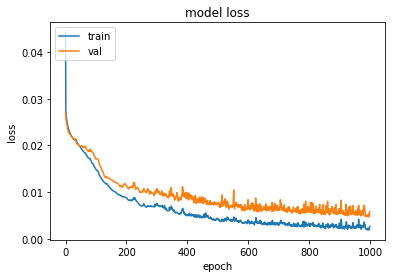

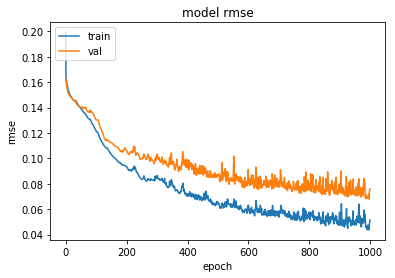

In [31]:
#3 hiden layers, 2 with 40 units, one with 30 units
click_SRNN_model8= click_stacked_stateless_SRNN2(units_1=40,units_2=30,lr=0.001, alpha=0.01)
click_SRNN_model8.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model8, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts8.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [32]:
click_pred_train=click_SRNN_model8.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model8.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model8.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  72.7730954421301
YRMSE train:  45.57871204560237
XRMSE val:  94.96427809578717
YRMSE val:  60.41129188661147
XRMSE test:  100.21471032958071
YRMSE test:  60.73121632380469


Performs better than the previous one. But still there is diference between the training and validtaion preformance. Let's check the performance by decreasing the number of units in 2 hidden layers.

In [ ]:
#simpleRNN stacked stateless model with 3 hidden layers
import keras.backend as k
timesteps=18
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))
    
def click_stacked_stateless_SRNN3(units_1, units_2, lr, alpha):
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, input_shape=(timesteps,2)))
    model.add(SimpleRNN(units_2, return_sequences=True))
    model.add(SimpleRNN(units_2, return_sequences=False))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_10 (SimpleRNN)    (None, 18, 40)            1720      
_________________________________________________________________
simple_rnn_11 (SimpleRNN)    (None, 18, 30)            2130      
_________________________________________________________________
simple_rnn_12 (SimpleRNN)    (None, 30)                1830      
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 62        
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 2)                 0         
Total params: 5,742
Trainable params: 5,742
Non-trainable params: 0
_________________________________________________________________
Train on 9177 samples, validate on 3059 samples
Epoch 1/1000
 - 4s - loss: 0.0602 - rmse: 0.2304 - val_loss: 0.02


Epoch 00041: val_loss improved from 0.02014 to 0.02013, saving model to click_SRNN_wts9.hdf5
Epoch 42/1000
 - 3s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00042: val_loss improved from 0.02013 to 0.02010, saving model to click_SRNN_wts9.hdf5
Epoch 43/1000
 - 3s - loss: 0.0196 - rmse: 0.1397 - val_loss: 0.0200 - val_rmse: 0.1409

Epoch 00043: val_loss improved from 0.02010 to 0.02004, saving model to click_SRNN_wts9.hdf5
Epoch 44/1000
 - 3s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00044: val_loss improved from 0.02004 to 0.01998, saving model to click_SRNN_wts9.hdf5
Epoch 45/1000
 - 3s - loss: 0.0195 - rmse: 0.1391 - val_loss: 0.0199 - val_rmse: 0.1406

Epoch 00045: val_loss improved from 0.01998 to 0.01994, saving model to click_SRNN_wts9.hdf5
Epoch 46/1000
 - 3s - loss: 0.0194 - rmse: 0.1388 - val_loss: 0.0199 - val_rmse: 0.1404

Epoch 00046: val_loss improved from 0.01994 to 0.01989, saving model to click_SRNN_wts9.h

 - 3s - loss: 0.0159 - rmse: 0.1259 - val_loss: 0.0170 - val_rmse: 0.1298

Epoch 00090: val_loss did not improve from 0.01695
Epoch 91/1000
 - 3s - loss: 0.0159 - rmse: 0.1257 - val_loss: 0.0169 - val_rmse: 0.1296

Epoch 00091: val_loss improved from 0.01695 to 0.01691, saving model to click_SRNN_wts9.hdf5
Epoch 92/1000
 - 3s - loss: 0.0158 - rmse: 0.1255 - val_loss: 0.0169 - val_rmse: 0.1295

Epoch 00092: val_loss improved from 0.01691 to 0.01689, saving model to click_SRNN_wts9.hdf5
Epoch 93/1000
 - 3s - loss: 0.0158 - rmse: 0.1254 - val_loss: 0.0168 - val_rmse: 0.1293

Epoch 00093: val_loss improved from 0.01689 to 0.01684, saving model to click_SRNN_wts9.hdf5
Epoch 94/1000
 - 3s - loss: 0.0158 - rmse: 0.1253 - val_loss: 0.0167 - val_rmse: 0.1288

Epoch 00094: val_loss improved from 0.01684 to 0.01671, saving model to click_SRNN_wts9.hdf5
Epoch 95/1000
 - 3s - loss: 0.0158 - rmse: 0.1256 - val_loss: 0.0166 - val_rmse: 0.1283

Epoch 00095: val_loss improved from 0.01671 to 0.01658, s

 - 3s - loss: 0.0128 - rmse: 0.1127 - val_loss: 0.0152 - val_rmse: 0.1229

Epoch 00142: val_loss improved from 0.01532 to 0.01519, saving model to click_SRNN_wts9.hdf5
Epoch 143/1000
 - 3s - loss: 0.0127 - rmse: 0.1123 - val_loss: 0.0153 - val_rmse: 0.1231

Epoch 00143: val_loss did not improve from 0.01519
Epoch 144/1000
 - 3s - loss: 0.0126 - rmse: 0.1119 - val_loss: 0.0151 - val_rmse: 0.1225

Epoch 00144: val_loss improved from 0.01519 to 0.01511, saving model to click_SRNN_wts9.hdf5
Epoch 145/1000
 - 3s - loss: 0.0125 - rmse: 0.1115 - val_loss: 0.0151 - val_rmse: 0.1223

Epoch 00145: val_loss improved from 0.01511 to 0.01507, saving model to click_SRNN_wts9.hdf5
Epoch 146/1000
 - 3s - loss: 0.0125 - rmse: 0.1113 - val_loss: 0.0150 - val_rmse: 0.1222

Epoch 00146: val_loss improved from 0.01507 to 0.01504, saving model to click_SRNN_wts9.hdf5
Epoch 147/1000
 - 3s - loss: 0.0124 - rmse: 0.1111 - val_loss: 0.0150 - val_rmse: 0.1220

Epoch 00147: val_loss improved from 0.01504 to 0.014

 - 3s - loss: 0.0099 - rmse: 0.0992 - val_loss: 0.0132 - val_rmse: 0.1146

Epoch 00193: val_loss improved from 0.01321 to 0.01320, saving model to click_SRNN_wts9.hdf5
Epoch 194/1000
 - 3s - loss: 0.0099 - rmse: 0.0990 - val_loss: 0.0132 - val_rmse: 0.1144

Epoch 00194: val_loss improved from 0.01320 to 0.01316, saving model to click_SRNN_wts9.hdf5
Epoch 195/1000
 - 3s - loss: 0.0098 - rmse: 0.0988 - val_loss: 0.0133 - val_rmse: 0.1149

Epoch 00195: val_loss did not improve from 0.01316
Epoch 196/1000
 - 3s - loss: 0.0097 - rmse: 0.0984 - val_loss: 0.0132 - val_rmse: 0.1146

Epoch 00196: val_loss did not improve from 0.01316
Epoch 197/1000
 - 3s - loss: 0.0097 - rmse: 0.0980 - val_loss: 0.0131 - val_rmse: 0.1139

Epoch 00197: val_loss improved from 0.01316 to 0.01306, saving model to click_SRNN_wts9.hdf5
Epoch 198/1000
 - 3s - loss: 0.0096 - rmse: 0.0977 - val_loss: 0.0129 - val_rmse: 0.1135

Epoch 00198: val_loss improved from 0.01306 to 0.01295, saving model to click_SRNN_wts9.hdf5
E


Epoch 00243: val_loss did not improve from 0.01098
Epoch 244/1000
 - 3s - loss: 0.0086 - rmse: 0.0925 - val_loss: 0.0119 - val_rmse: 0.1087

Epoch 00244: val_loss did not improve from 0.01098
Epoch 245/1000
 - 3s - loss: 0.0087 - rmse: 0.0928 - val_loss: 0.0117 - val_rmse: 0.1078

Epoch 00245: val_loss did not improve from 0.01098
Epoch 246/1000
 - 3s - loss: 0.0087 - rmse: 0.0932 - val_loss: 0.0118 - val_rmse: 0.1083

Epoch 00246: val_loss did not improve from 0.01098
Epoch 247/1000
 - 3s - loss: 0.0088 - rmse: 0.0937 - val_loss: 0.0117 - val_rmse: 0.1079

Epoch 00247: val_loss did not improve from 0.01098
Epoch 248/1000
 - 3s - loss: 0.0088 - rmse: 0.0935 - val_loss: 0.0117 - val_rmse: 0.1079

Epoch 00248: val_loss did not improve from 0.01098
Epoch 249/1000
 - 3s - loss: 0.0085 - rmse: 0.0919 - val_loss: 0.0112 - val_rmse: 0.1056

Epoch 00249: val_loss did not improve from 0.01098
Epoch 250/1000
 - 3s - loss: 0.0082 - rmse: 0.0904 - val_loss: 0.0110 - val_rmse: 0.1044

Epoch 00250:


Epoch 00297: val_loss did not improve from 0.00935
Epoch 298/1000
 - 3s - loss: 0.0077 - rmse: 0.0872 - val_loss: 0.0102 - val_rmse: 0.1008

Epoch 00298: val_loss did not improve from 0.00935
Epoch 299/1000
 - 3s - loss: 0.0077 - rmse: 0.0874 - val_loss: 0.0110 - val_rmse: 0.1047

Epoch 00299: val_loss did not improve from 0.00935
Epoch 300/1000
 - 3s - loss: 0.0079 - rmse: 0.0885 - val_loss: 0.0115 - val_rmse: 0.1069

Epoch 00300: val_loss did not improve from 0.00935
Epoch 301/1000
 - 3s - loss: 0.0081 - rmse: 0.0898 - val_loss: 0.0106 - val_rmse: 0.1024

Epoch 00301: val_loss did not improve from 0.00935
Epoch 302/1000
 - 3s - loss: 0.0076 - rmse: 0.0869 - val_loss: 0.0102 - val_rmse: 0.1008

Epoch 00302: val_loss did not improve from 0.00935
Epoch 303/1000
 - 3s - loss: 0.0078 - rmse: 0.0880 - val_loss: 0.0101 - val_rmse: 0.1003

Epoch 00303: val_loss did not improve from 0.00935
Epoch 304/1000
 - 3s - loss: 0.0078 - rmse: 0.0880 - val_loss: 0.0098 - val_rmse: 0.0986

Epoch 00304:

 - 3s - loss: 0.0060 - rmse: 0.0771 - val_loss: 0.0092 - val_rmse: 0.0958

Epoch 00350: val_loss did not improve from 0.00860
Epoch 351/1000
 - 3s - loss: 0.0060 - rmse: 0.0775 - val_loss: 0.0092 - val_rmse: 0.0959

Epoch 00351: val_loss did not improve from 0.00860
Epoch 352/1000
 - 3s - loss: 0.0061 - rmse: 0.0776 - val_loss: 0.0091 - val_rmse: 0.0953

Epoch 00352: val_loss did not improve from 0.00860
Epoch 353/1000
 - 3s - loss: 0.0061 - rmse: 0.0777 - val_loss: 0.0091 - val_rmse: 0.0951

Epoch 00353: val_loss did not improve from 0.00860
Epoch 354/1000
 - 3s - loss: 0.0059 - rmse: 0.0768 - val_loss: 0.0092 - val_rmse: 0.0957

Epoch 00354: val_loss did not improve from 0.00860
Epoch 355/1000
 - 3s - loss: 0.0059 - rmse: 0.0766 - val_loss: 0.0093 - val_rmse: 0.0959

Epoch 00355: val_loss did not improve from 0.00860
Epoch 356/1000
 - 3s - loss: 0.0060 - rmse: 0.0770 - val_loss: 0.0092 - val_rmse: 0.0955

Epoch 00356: val_loss did not improve from 0.00860
Epoch 357/1000
 - 3s - loss:


Epoch 00404: val_loss did not improve from 0.00775
Epoch 405/1000
 - 3s - loss: 0.0047 - rmse: 0.0686 - val_loss: 0.0076 - val_rmse: 0.0867

Epoch 00405: val_loss improved from 0.00775 to 0.00757, saving model to click_SRNN_wts9.hdf5
Epoch 406/1000
 - 3s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0079 - val_rmse: 0.0885

Epoch 00406: val_loss did not improve from 0.00757
Epoch 407/1000
 - 3s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0083 - val_rmse: 0.0906

Epoch 00407: val_loss did not improve from 0.00757
Epoch 408/1000
 - 3s - loss: 0.0050 - rmse: 0.0706 - val_loss: 0.0080 - val_rmse: 0.0891

Epoch 00408: val_loss did not improve from 0.00757
Epoch 409/1000
 - 3s - loss: 0.0050 - rmse: 0.0703 - val_loss: 0.0080 - val_rmse: 0.0889

Epoch 00409: val_loss did not improve from 0.00757
Epoch 410/1000
 - 3s - loss: 0.0049 - rmse: 0.0698 - val_loss: 0.0084 - val_rmse: 0.0912

Epoch 00410: val_loss did not improve from 0.00757
Epoch 411/1000
 - 3s - loss: 0.0048 - rmse: 0.0687 - val_los


Epoch 00461: val_loss did not improve from 0.00720
Epoch 462/1000
 - 3s - loss: 0.0049 - rmse: 0.0698 - val_loss: 0.0073 - val_rmse: 0.0850

Epoch 00462: val_loss did not improve from 0.00720
Epoch 463/1000
 - 3s - loss: 0.0055 - rmse: 0.0733 - val_loss: 0.0080 - val_rmse: 0.0892

Epoch 00463: val_loss did not improve from 0.00720
Epoch 464/1000
 - 3s - loss: 0.0052 - rmse: 0.0718 - val_loss: 0.0074 - val_rmse: 0.0856

Epoch 00464: val_loss did not improve from 0.00720
Epoch 465/1000
 - 3s - loss: 0.0051 - rmse: 0.0715 - val_loss: 0.0074 - val_rmse: 0.0859

Epoch 00465: val_loss did not improve from 0.00720
Epoch 466/1000
 - 3s - loss: 0.0056 - rmse: 0.0742 - val_loss: 0.0075 - val_rmse: 0.0865

Epoch 00466: val_loss did not improve from 0.00720
Epoch 467/1000
 - 3s - loss: 0.0053 - rmse: 0.0726 - val_loss: 0.0081 - val_rmse: 0.0898

Epoch 00467: val_loss did not improve from 0.00720
Epoch 468/1000
 - 3s - loss: 0.0052 - rmse: 0.0721 - val_loss: 0.0082 - val_rmse: 0.0902

Epoch 00468:


Epoch 00519: val_loss did not improve from 0.00697
Epoch 520/1000
 - 3s - loss: 0.0048 - rmse: 0.0688 - val_loss: 0.0081 - val_rmse: 0.0896

Epoch 00520: val_loss did not improve from 0.00697
Epoch 521/1000
 - 3s - loss: 0.0046 - rmse: 0.0676 - val_loss: 0.0073 - val_rmse: 0.0850

Epoch 00521: val_loss did not improve from 0.00697
Epoch 522/1000
 - 3s - loss: 0.0046 - rmse: 0.0673 - val_loss: 0.0075 - val_rmse: 0.0861

Epoch 00522: val_loss did not improve from 0.00697
Epoch 523/1000
 - 3s - loss: 0.0045 - rmse: 0.0668 - val_loss: 0.0079 - val_rmse: 0.0884

Epoch 00523: val_loss did not improve from 0.00697
Epoch 524/1000
 - 3s - loss: 0.0046 - rmse: 0.0675 - val_loss: 0.0083 - val_rmse: 0.0908

Epoch 00524: val_loss did not improve from 0.00697
Epoch 525/1000
 - 3s - loss: 0.0045 - rmse: 0.0671 - val_loss: 0.0081 - val_rmse: 0.0896

Epoch 00525: val_loss did not improve from 0.00697
Epoch 526/1000
 - 3s - loss: 0.0045 - rmse: 0.0667 - val_loss: 0.0084 - val_rmse: 0.0911

Epoch 00526:

 - 4s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0063 - val_rmse: 0.0792

Epoch 00577: val_loss improved from 0.00640 to 0.00633, saving model to click_SRNN_wts9.hdf5
Epoch 578/1000
 - 3s - loss: 0.0039 - rmse: 0.0618 - val_loss: 0.0069 - val_rmse: 0.0824

Epoch 00578: val_loss did not improve from 0.00633
Epoch 579/1000
 - 3s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0062 - val_rmse: 0.0785

Epoch 00579: val_loss improved from 0.00633 to 0.00621, saving model to click_SRNN_wts9.hdf5
Epoch 580/1000
 - 3s - loss: 0.0036 - rmse: 0.0600 - val_loss: 0.0065 - val_rmse: 0.0799

Epoch 00580: val_loss did not improve from 0.00621
Epoch 581/1000
 - 3s - loss: 0.0040 - rmse: 0.0630 - val_loss: 0.0082 - val_rmse: 0.0901

Epoch 00581: val_loss did not improve from 0.00621
Epoch 582/1000
 - 3s - loss: 0.0040 - rmse: 0.0633 - val_loss: 0.0066 - val_rmse: 0.0808

Epoch 00582: val_loss did not improve from 0.00621
Epoch 583/1000
 - 3s - loss: 0.0041 - rmse: 0.0634 - val_loss: 0.0075 - val_rmse: 0.0

 - 3s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0060 - val_rmse: 0.0768

Epoch 00634: val_loss did not improve from 0.00589
Epoch 635/1000
 - 3s - loss: 0.0037 - rmse: 0.0602 - val_loss: 0.0064 - val_rmse: 0.0794

Epoch 00635: val_loss did not improve from 0.00589
Epoch 636/1000
 - 3s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0062 - val_rmse: 0.0782

Epoch 00636: val_loss did not improve from 0.00589
Epoch 637/1000
 - 3s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0065 - val_rmse: 0.0801

Epoch 00637: val_loss did not improve from 0.00589
Epoch 638/1000
 - 3s - loss: 0.0036 - rmse: 0.0597 - val_loss: 0.0063 - val_rmse: 0.0789

Epoch 00638: val_loss did not improve from 0.00589
Epoch 639/1000
 - 3s - loss: 0.0036 - rmse: 0.0601 - val_loss: 0.0068 - val_rmse: 0.0823

Epoch 00639: val_loss did not improve from 0.00589
Epoch 640/1000
 - 3s - loss: 0.0038 - rmse: 0.0612 - val_loss: 0.0072 - val_rmse: 0.0844

Epoch 00640: val_loss did not improve from 0.00589
Epoch 641/1000
 - 3s - loss:

 - 3s - loss: 0.0034 - rmse: 0.0582 - val_loss: 0.0071 - val_rmse: 0.0839

Epoch 00692: val_loss did not improve from 0.00559
Epoch 693/1000
 - 4s - loss: 0.0037 - rmse: 0.0607 - val_loss: 0.0061 - val_rmse: 0.0780

Epoch 00693: val_loss did not improve from 0.00559
Epoch 694/1000
 - 3s - loss: 0.0038 - rmse: 0.0614 - val_loss: 0.0064 - val_rmse: 0.0795

Epoch 00694: val_loss did not improve from 0.00559
Epoch 695/1000
 - 3s - loss: 0.0036 - rmse: 0.0595 - val_loss: 0.0067 - val_rmse: 0.0815

Epoch 00695: val_loss did not improve from 0.00559
Epoch 696/1000
 - 3s - loss: 0.0040 - rmse: 0.0632 - val_loss: 0.0076 - val_rmse: 0.0868

Epoch 00696: val_loss did not improve from 0.00559
Epoch 697/1000
 - 3s - loss: 0.0039 - rmse: 0.0620 - val_loss: 0.0068 - val_rmse: 0.0823

Epoch 00697: val_loss did not improve from 0.00559
Epoch 698/1000
 - 3s - loss: 0.0039 - rmse: 0.0621 - val_loss: 0.0069 - val_rmse: 0.0829

Epoch 00698: val_loss did not improve from 0.00559
Epoch 699/1000
 - 3s - loss:

 - 3s - loss: 0.0032 - rmse: 0.0565 - val_loss: 0.0057 - val_rmse: 0.0752

Epoch 00750: val_loss did not improve from 0.00553
Epoch 751/1000
 - 3s - loss: 0.0032 - rmse: 0.0563 - val_loss: 0.0062 - val_rmse: 0.0784

Epoch 00751: val_loss did not improve from 0.00553
Epoch 752/1000
 - 3s - loss: 0.0029 - rmse: 0.0538 - val_loss: 0.0056 - val_rmse: 0.0745

Epoch 00752: val_loss did not improve from 0.00553
Epoch 753/1000
 - 3s - loss: 0.0031 - rmse: 0.0552 - val_loss: 0.0063 - val_rmse: 0.0787

Epoch 00753: val_loss did not improve from 0.00553
Epoch 754/1000
 - 3s - loss: 0.0030 - rmse: 0.0545 - val_loss: 0.0057 - val_rmse: 0.0750

Epoch 00754: val_loss did not improve from 0.00553
Epoch 755/1000
 - 3s - loss: 0.0032 - rmse: 0.0559 - val_loss: 0.0066 - val_rmse: 0.0806

Epoch 00755: val_loss did not improve from 0.00553
Epoch 756/1000
 - 3s - loss: 0.0031 - rmse: 0.0556 - val_loss: 0.0062 - val_rmse: 0.0779

Epoch 00756: val_loss did not improve from 0.00553
Epoch 757/1000
 - 3s - loss:


Epoch 00808: val_loss did not improve from 0.00553
Epoch 809/1000
 - 3s - loss: 0.0039 - rmse: 0.0621 - val_loss: 0.0076 - val_rmse: 0.0868

Epoch 00809: val_loss did not improve from 0.00553
Epoch 810/1000
 - 4s - loss: 0.0037 - rmse: 0.0604 - val_loss: 0.0067 - val_rmse: 0.0815

Epoch 00810: val_loss did not improve from 0.00553
Epoch 811/1000
 - 3s - loss: 0.0036 - rmse: 0.0594 - val_loss: 0.0077 - val_rmse: 0.0872

Epoch 00811: val_loss did not improve from 0.00553
Epoch 812/1000
 - 3s - loss: 0.0035 - rmse: 0.0593 - val_loss: 0.0069 - val_rmse: 0.0827

Epoch 00812: val_loss did not improve from 0.00553
Epoch 813/1000
 - 3s - loss: 0.0032 - rmse: 0.0560 - val_loss: 0.0072 - val_rmse: 0.0845

Epoch 00813: val_loss did not improve from 0.00553
Epoch 814/1000
 - 3s - loss: 0.0035 - rmse: 0.0587 - val_loss: 0.0069 - val_rmse: 0.0824

Epoch 00814: val_loss did not improve from 0.00553
Epoch 815/1000
 - 3s - loss: 0.0036 - rmse: 0.0599 - val_loss: 0.0064 - val_rmse: 0.0796

Epoch 00815:

 - 3s - loss: 0.0033 - rmse: 0.0571 - val_loss: 0.0069 - val_rmse: 0.0824

Epoch 00867: val_loss did not improve from 0.00553
Epoch 868/1000
 - 3s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0077 - val_rmse: 0.0870

Epoch 00868: val_loss did not improve from 0.00553
Epoch 869/1000
 - 3s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0058 - val_rmse: 0.0760

Epoch 00869: val_loss did not improve from 0.00553
Epoch 870/1000
 - 3s - loss: 0.0040 - rmse: 0.0625 - val_loss: 0.0071 - val_rmse: 0.0839

Epoch 00870: val_loss did not improve from 0.00553
Epoch 871/1000
 - 3s - loss: 0.0043 - rmse: 0.0652 - val_loss: 0.0074 - val_rmse: 0.0855

Epoch 00871: val_loss did not improve from 0.00553
Epoch 872/1000
 - 3s - loss: 0.0037 - rmse: 0.0605 - val_loss: 0.0061 - val_rmse: 0.0777

Epoch 00872: val_loss did not improve from 0.00553
Epoch 873/1000
 - 3s - loss: 0.0033 - rmse: 0.0572 - val_loss: 0.0058 - val_rmse: 0.0757

Epoch 00873: val_loss did not improve from 0.00553
Epoch 874/1000
 - 3s - loss:

 - 3s - loss: 0.0030 - rmse: 0.0542 - val_loss: 0.0057 - val_rmse: 0.0749

Epoch 00925: val_loss did not improve from 0.00539
Epoch 926/1000
 - 3s - loss: 0.0029 - rmse: 0.0535 - val_loss: 0.0059 - val_rmse: 0.0764

Epoch 00926: val_loss did not improve from 0.00539
Epoch 927/1000
 - 3s - loss: 0.0029 - rmse: 0.0532 - val_loss: 0.0054 - val_rmse: 0.0731

Epoch 00927: val_loss did not improve from 0.00539
Epoch 928/1000
 - 3s - loss: 0.0046 - rmse: 0.0661 - val_loss: 0.0074 - val_rmse: 0.0855

Epoch 00928: val_loss did not improve from 0.00539
Epoch 929/1000
 - 3s - loss: 0.0044 - rmse: 0.0661 - val_loss: 0.0064 - val_rmse: 0.0797

Epoch 00929: val_loss did not improve from 0.00539
Epoch 930/1000
 - 3s - loss: 0.0041 - rmse: 0.0637 - val_loss: 0.0076 - val_rmse: 0.0866

Epoch 00930: val_loss did not improve from 0.00539
Epoch 931/1000
 - 3s - loss: 0.0038 - rmse: 0.0611 - val_loss: 0.0060 - val_rmse: 0.0767

Epoch 00931: val_loss did not improve from 0.00539
Epoch 932/1000
 - 3s - loss:


Epoch 00981: val_loss did not improve from 0.00491
Epoch 982/1000
 - 3s - loss: 0.0024 - rmse: 0.0485 - val_loss: 0.0051 - val_rmse: 0.0707

Epoch 00982: val_loss did not improve from 0.00491
Epoch 983/1000
 - 3s - loss: 0.0023 - rmse: 0.0481 - val_loss: 0.0052 - val_rmse: 0.0718

Epoch 00983: val_loss did not improve from 0.00491
Epoch 984/1000
 - 3s - loss: 0.0026 - rmse: 0.0510 - val_loss: 0.0054 - val_rmse: 0.0728

Epoch 00984: val_loss did not improve from 0.00491
Epoch 985/1000
 - 3s - loss: 0.0045 - rmse: 0.0656 - val_loss: 0.0110 - val_rmse: 0.1043

Epoch 00985: val_loss did not improve from 0.00491
Epoch 986/1000
 - 3s - loss: 0.0061 - rmse: 0.0774 - val_loss: 0.0081 - val_rmse: 0.0894

Epoch 00986: val_loss did not improve from 0.00491
Epoch 987/1000
 - 3s - loss: 0.0033 - rmse: 0.0574 - val_loss: 0.0054 - val_rmse: 0.0730

Epoch 00987: val_loss did not improve from 0.00491
Epoch 988/1000
 - 3s - loss: 0.0032 - rmse: 0.0558 - val_loss: 0.0065 - val_rmse: 0.0797

Epoch 00988:

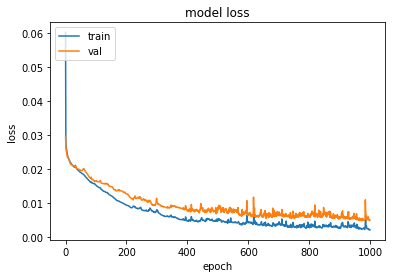

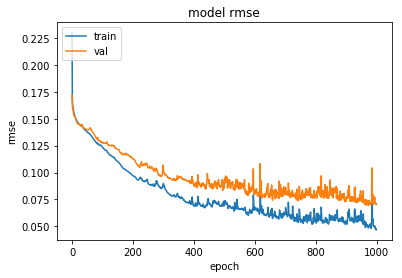

In [34]:
#3 hiden layers, one with 40 units, two with 30 units
click_SRNN_model9= click_stacked_stateless_SRNN3(units_1=40,units_2=30,lr=0.001, alpha=0.01)
click_SRNN_model9.summary()

#Train LSTM stateless model with shuffle=False
hist= stateless_fit(click_SRNN_model9, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts9.hdf5', False)

#plot loss and rmse curve
stateless_learn_curve(hist)

In [36]:
click_pred_train=click_SRNN_model9.predict(X_click_train)
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model9.predict(X_click_val)
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model9.predict(X_click_test)
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  60.58465038866779
YRMSE train:  40.51479066027312
XRMSE val:  84.53699709412444
YRMSE val:  57.34430398745955
XRMSE test:  93.39884293158516
YRMSE test:  56.761201418853986


This model with 3 hidden layers, one with 40 units and 2 with 30 units each, performs the best with the lowest XRMSE and YRMSE scores.

In [48]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN(units, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_18 (SimpleRNN)    (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_19 (SimpleRNN)    (133, 40)                 3240      
_________________________________________________________________
dense_7 (Dense)              (133, 2)                  82        
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (133, 2)                  0         
Total params: 5,042
Trainable params: 5,042
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0807 - rmse: 0.2772 - val_loss: 0.0310 

 - 2s - loss: 0.0259 - rmse: 0.1604 - val_loss: 0.0258 - val_rmse: 0.1600

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  32
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0259 - rmse: 0.1606 - val_loss: 0.0257 - val_rmse: 0.1595

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  33
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0259 - rmse: 0.1607 - val_loss: 0.0257 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  34
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0259 - rmse: 0.1605 - val_loss: 0.0258 - val_rmse: 0.1600

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  35
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0258 - rmse: 0.1602 - val_loss: 0.0257 - val_rmse: 0.1597

Epoch 00001: val_loss did not improve from 0.02564
Epoch Number:  36
Train on 9177 samples, validate on 3059 samples


 - 2s - loss: 0.0250 - rmse: 0.1577 - val_loss: 0.0251 - val_rmse: 0.1576

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  72
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0250 - rmse: 0.1577 - val_loss: 0.0259 - val_rmse: 0.1602

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  73
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1568 - val_loss: 0.0252 - val_rmse: 0.1578

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  74
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1567 - val_loss: 0.0254 - val_rmse: 0.1587

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  75
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1567 - val_loss: 0.0253 - val_rmse: 0.1583

Epoch 00001: val_loss did not improve from 0.02495
Epoch Number:  76
Train on 9177 samples, validate on 3059 samples



Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  112
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1550 - val_loss: 0.0257 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  113
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0258 - val_rmse: 0.1597

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  114
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1547 - val_loss: 0.0254 - val_rmse: 0.1586

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  115
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0242 - rmse: 0.1553 - val_loss: 0.0258 - val_rmse: 0.1598

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  116
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0242 - rmse: 0.1551 - val_loss: 0.0255 - va

 - 2s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0252 - val_rmse: 0.1580

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  153
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0239 - rmse: 0.1540 - val_loss: 0.0255 - val_rmse: 0.1588

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  154
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0235 - rmse: 0.1528 - val_loss: 0.0252 - val_rmse: 0.1579

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  155
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0237 - rmse: 0.1536 - val_loss: 0.0252 - val_rmse: 0.1579

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  156
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1531 - val_loss: 0.0253 - val_rmse: 0.1582

Epoch 00001: val_loss did not improve from 0.02485
Epoch Number:  157
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0231 - rmse: 0.1517 - val_loss: 0.0250 - val_rmse: 0.1574

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  193
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1522 - val_loss: 0.0247 - val_rmse: 0.1564

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  194
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0246 - val_rmse: 0.1560

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  195
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0231 - rmse: 0.1517 - val_loss: 0.0247 - val_rmse: 0.1562

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  196
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0230 - rmse: 0.1513 - val_loss: 0.0246 - val_rmse: 0.1560

Epoch 00001: val_loss did not improve from 0.02436
Epoch Number:  197
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0231 - rmse: 0.1514 - val_loss: 0.0248 - val_rmse: 0.1567

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  233
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1507 - val_loss: 0.0244 - val_rmse: 0.1555

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  234
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1508 - val_loss: 0.0243 - val_rmse: 0.1552

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  235
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0229 - rmse: 0.1510 - val_loss: 0.0242 - val_rmse: 0.1547

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  236
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0229 - rmse: 0.1509 - val_loss: 0.0241 - val_rmse: 0.1544

Epoch 00001: val_loss did not improve from 0.02406
Epoch Number:  237
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0225 - rmse: 0.1497 - val_loss: 0.0236 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  272
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0232 - rmse: 0.1518 - val_loss: 0.0240 - val_rmse: 0.1541

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  273
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0227 - rmse: 0.1504 - val_loss: 0.0235 - val_rmse: 0.1525

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  274
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1524 - val_loss: 0.0236 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  275
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0224 - rmse: 0.1494 - val_loss: 0.0234 - val_rmse: 0.1523

Epoch 00001: val_loss did not improve from 0.02343
Epoch Number:  276
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0224 - rmse: 0.1491 - val_loss: 0.0229 - val_rmse: 0.1507

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  311
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0221 - rmse: 0.1483 - val_loss: 0.0227 - val_rmse: 0.1500

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  312
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0220 - rmse: 0.1478 - val_loss: 0.0229 - val_rmse: 0.1506

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  313
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0220 - rmse: 0.1480 - val_loss: 0.0227 - val_rmse: 0.1498

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  314
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0221 - rmse: 0.1482 - val_loss: 0.0225 - val_rmse: 0.1491

Epoch 00001: val_loss did not improve from 0.02246
Epoch Number:  315
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  350
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1471 - val_loss: 0.0218 - val_rmse: 0.1470

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  351
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1469 - val_loss: 0.0218 - val_rmse: 0.1468

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  352
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1474 - val_loss: 0.0220 - val_rmse: 0.1474

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  353
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1472 - val_loss: 0.0219 - val_rmse: 0.1473

Epoch 00001: val_loss did not improve from 0.02168
Epoch Number:  354
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1464 - val_loss: 0.0219 - va

 - 2s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0215 - val_rmse: 0.1460

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  390
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0230 - rmse: 0.1512 - val_loss: 0.0217 - val_rmse: 0.1466

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  391
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1469 - val_loss: 0.0217 - val_rmse: 0.1464

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  392
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1462 - val_loss: 0.0213 - val_rmse: 0.1453

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  393
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0226 - val_rmse: 0.1497

Epoch 00001: val_loss did not improve from 0.02122
Epoch Number:  394
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  429
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0219 - rmse: 0.1477 - val_loss: 0.0219 - val_rmse: 0.1472

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  430
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1470 - val_loss: 0.0215 - val_rmse: 0.1461

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  431
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0216 - rmse: 0.1466 - val_loss: 0.0214 - val_rmse: 0.1456

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  432
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0232 - rmse: 0.1516 - val_loss: 0.0216 - val_rmse: 0.1462

Epoch 00001: val_loss did not improve from 0.02082
Epoch Number:  433
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0216 - rmse: 0.1468 - val_loss: 0.0211 - va


Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  469
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0209 - rmse: 0.1441 - val_loss: 0.0206 - val_rmse: 0.1428

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  470
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0214 - val_rmse: 0.1455

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  471
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0209 - val_rmse: 0.1439

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  472
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1446 - val_loss: 0.0211 - val_rmse: 0.1447

Epoch 00001: val_loss did not improve from 0.02049
Epoch Number:  473
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0209 - rmse: 0.1440 - val_loss: 0.0220 - va


Epoch 00001: val_loss improved from 0.02036 to 0.02032, saving model to click_SRNN_wts10.hdf5
Epoch Number:  509
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1439 - val_loss: 0.0201 - val_rmse: 0.1409

Epoch 00001: val_loss improved from 0.02032 to 0.02006, saving model to click_SRNN_wts10.hdf5
Epoch Number:  510
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0205 - val_rmse: 0.1423

Epoch 00001: val_loss did not improve from 0.02006
Epoch Number:  511
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0202 - val_rmse: 0.1416

Epoch 00001: val_loss did not improve from 0.02006
Epoch Number:  512
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1431 - val_loss: 0.0201 - val_rmse: 0.1413

Epoch 00001: val_loss did not improve from 0.02006
Epoch Number:  513
Train on 9177 samples, validate


Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  549
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0202 - val_rmse: 0.1414

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  550
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  551
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0205 - val_rmse: 0.1426

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  552
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0202 - val_rmse: 0.1413

Epoch 00001: val_loss did not improve from 0.01985
Epoch Number:  553
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0203 - va

 - 2s - loss: 0.0202 - rmse: 0.1419 - val_loss: 0.0201 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  590
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  591
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1409 - val_loss: 0.0202 - val_rmse: 0.1414

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  592
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1419 - val_loss: 0.0203 - val_rmse: 0.1416

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  593
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1417 - val_loss: 0.0202 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  594
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0208 - rmse: 0.1440 - val_loss: 0.0202 - val_rmse: 0.1416

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  630
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1408 - val_loss: 0.0200 - val_rmse: 0.1407

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  631
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1410 - val_loss: 0.0197 - val_rmse: 0.1397

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  632
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1398 - val_loss: 0.0199 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  633
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1408 - val_loss: 0.0198 - val_rmse: 0.1400

Epoch 00001: val_loss did not improve from 0.01944
Epoch Number:  634
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  670
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0195 - val_rmse: 0.1391

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  671
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0194 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  672
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0196 - val_rmse: 0.1395

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  673
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0198 - rmse: 0.1403 - val_loss: 0.0193 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01923
Epoch Number:  674
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1513 - val_loss: 0.0246 - va


Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  710
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0194 - val_rmse: 0.1386

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  711
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0191 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  712
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0200 - rmse: 0.1411 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  713
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1416 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  714
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1395 - val_loss: 0.0196 - va


Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  750
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  751
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0191 - val_rmse: 0.1375

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  752
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1385 - val_loss: 0.0193 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  753
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0199 - val_rmse: 0.1403

Epoch 00001: val_loss did not improve from 0.01885
Epoch Number:  754
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1390 - val_loss: 0.0194 - va

 - 2s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0196 - val_rmse: 0.1393

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  791
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1384 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  792
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  793
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1384 - val_loss: 0.0190 - val_rmse: 0.1371

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  794
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0253 - rmse: 0.1577 - val_loss: 0.0230 - val_rmse: 0.1507

Epoch 00001: val_loss did not improve from 0.01883
Epoch Number:  795
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0194 - rmse: 0.1390 - val_loss: 0.0186 - val_rmse: 0.1358

Epoch 00001: val_loss did not improve from 0.01859
Epoch Number:  831
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1389 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01859
Epoch Number:  832
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1384 - val_loss: 0.0192 - val_rmse: 0.1377

Epoch 00001: val_loss did not improve from 0.01859
Epoch Number:  833
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0190 - rmse: 0.1376 - val_loss: 0.0185 - val_rmse: 0.1354

Epoch 00001: val_loss improved from 0.01859 to 0.01850, saving model to click_SRNN_wts10.hdf5
Epoch Number:  834
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1389 - val_loss: 0.0190 - val_rmse: 0.1373

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  835



Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  871
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0189 - val_rmse: 0.1368

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  872
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0188 - val_rmse: 0.1366

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  873
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1382 - val_loss: 0.0191 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  874
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0187 - val_rmse: 0.1361

Epoch 00001: val_loss did not improve from 0.01850
Epoch Number:  875
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0190 - va

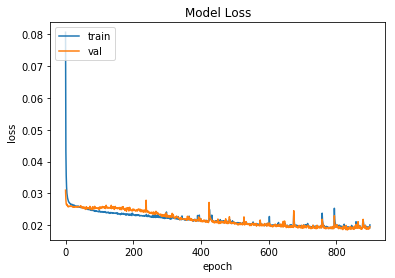

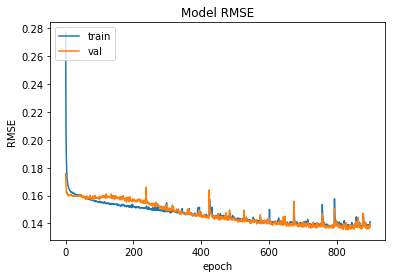

In [49]:
#2 hidden layers, both with 40 units
click_SRNN_model10= click_stacked_stateful_SRNN(units=40,lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model10.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model10, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 900, 'click_SRNN_wts10.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [50]:
click_pred_train=click_SRNN_model10.predict(X_click_train, batch_size=133)
click_SRNN_model10.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model10.predict(X_click_val, batch_size=133)
click_SRNN_model10.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model10.predict(X_click_test, batch_size=133)
click_SRNN_model10.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  175.19513974912923
YRMSE train:  103.6859600948379
XRMSE val:  177.48510768133815
YRMSE val:  107.3408798975263
XRMSE test:  186.12667498608306
YRMSE test:  107.22819237626297


In [51]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN2(units_1, units_2, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_22 (SimpleRNN)    (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_23 (SimpleRNN)    (133, 30)                 2130      
_________________________________________________________________
dense_9 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (133, 2)                  0         
Total params: 3,912
Trainable params: 3,912
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.1151 - rmse: 0.3264 - val_loss: 0.0337 - val_rmse: 0.1832

Epoch 00001: val_loss improved from inf to 0.03371, saving model to click_SRNN_wts11.hdf5
Epoch

 - 2s - loss: 0.0260 - rmse: 0.1609 - val_loss: 0.0263 - val_rmse: 0.1614

Epoch 00001: val_loss did not improve from 0.02600
Epoch Number:  34
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0260 - rmse: 0.1609 - val_loss: 0.0260 - val_rmse: 0.1606

Epoch 00001: val_loss did not improve from 0.02600
Epoch Number:  35
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0261 - rmse: 0.1610 - val_loss: 0.0260 - val_rmse: 0.1604

Epoch 00001: val_loss improved from 0.02600 to 0.02597, saving model to click_SRNN_wts11.hdf5
Epoch Number:  36
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0261 - rmse: 0.1612 - val_loss: 0.0260 - val_rmse: 0.1605

Epoch 00001: val_loss did not improve from 0.02597
Epoch Number:  37
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0261 - rmse: 0.1612 - val_loss: 0.0264 - val_rmse: 0.1618

Epoch 00001: val_loss did not improve from 0.02597
Epoch Number:  38
Train

 - 2s - loss: 0.0251 - rmse: 0.1580 - val_loss: 0.0260 - val_rmse: 0.1603

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  74
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0251 - rmse: 0.1581 - val_loss: 0.0262 - val_rmse: 0.1611

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  75
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0250 - rmse: 0.1578 - val_loss: 0.0262 - val_rmse: 0.1610

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  76
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0251 - rmse: 0.1579 - val_loss: 0.0258 - val_rmse: 0.1599

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  77
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0252 - rmse: 0.1584 - val_loss: 0.0263 - val_rmse: 0.1612

Epoch 00001: val_loss did not improve from 0.02570
Epoch Number:  78
Train on 9177 samples, validate on 3059 samples


 - 2s - loss: 0.0246 - rmse: 0.1565 - val_loss: 0.0257 - val_rmse: 0.1594

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  114
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1569 - val_loss: 0.0258 - val_rmse: 0.1598

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  115
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0247 - rmse: 0.1566 - val_loss: 0.0256 - val_rmse: 0.1592

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  116
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0245 - rmse: 0.1562 - val_loss: 0.0257 - val_rmse: 0.1596

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  117
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0249 - rmse: 0.1573 - val_loss: 0.0255 - val_rmse: 0.1590

Epoch 00001: val_loss did not improve from 0.02535
Epoch Number:  118
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0240 - rmse: 0.1547 - val_loss: 0.0247 - val_rmse: 0.1564

Epoch 00001: val_loss improved from 0.02481 to 0.02469, saving model to click_SRNN_wts11.hdf5
Epoch Number:  153
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1548 - val_loss: 0.0248 - val_rmse: 0.1566

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  154
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0241 - rmse: 0.1549 - val_loss: 0.0251 - val_rmse: 0.1576

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  155
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0240 - rmse: 0.1546 - val_loss: 0.0251 - val_rmse: 0.1575

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  156
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0243 - rmse: 0.1554 - val_loss: 0.0250 - val_rmse: 0.1574

Epoch 00001: val_loss did not improve from 0.02469
Epoch Number:  157



Epoch 00001: val_loss improved from 0.02425 to 0.02422, saving model to click_SRNN_wts11.hdf5
Epoch Number:  192
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0238 - rmse: 0.1538 - val_loss: 0.0248 - val_rmse: 0.1569

Epoch 00001: val_loss did not improve from 0.02422
Epoch Number:  193
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0237 - rmse: 0.1535 - val_loss: 0.0240 - val_rmse: 0.1541

Epoch 00001: val_loss improved from 0.02422 to 0.02398, saving model to click_SRNN_wts11.hdf5
Epoch Number:  194
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0240 - val_rmse: 0.1543

Epoch 00001: val_loss did not improve from 0.02398
Epoch Number:  195
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0236 - rmse: 0.1532 - val_loss: 0.0244 - val_rmse: 0.1556

Epoch 00001: val_loss did not improve from 0.02398
Epoch Number:  196
Train on 9177 samples, validate


Epoch 00001: val_loss did not improve from 0.02363
Epoch Number:  231
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1523 - val_loss: 0.0239 - val_rmse: 0.1539

Epoch 00001: val_loss did not improve from 0.02363
Epoch Number:  232
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0232 - rmse: 0.1519 - val_loss: 0.0238 - val_rmse: 0.1535

Epoch 00001: val_loss did not improve from 0.02363
Epoch Number:  233
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0232 - rmse: 0.1520 - val_loss: 0.0235 - val_rmse: 0.1525

Epoch 00001: val_loss improved from 0.02363 to 0.02349, saving model to click_SRNN_wts11.hdf5
Epoch Number:  234
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0233 - rmse: 0.1522 - val_loss: 0.0240 - val_rmse: 0.1543

Epoch 00001: val_loss did not improve from 0.02349
Epoch Number:  235
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.

 - 2s - loss: 0.0229 - rmse: 0.1509 - val_loss: 0.0233 - val_rmse: 0.1520

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  271
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1508 - val_loss: 0.0231 - val_rmse: 0.1514

Epoch 00001: val_loss improved from 0.02313 to 0.02313, saving model to click_SRNN_wts11.hdf5
Epoch Number:  272
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0226 - rmse: 0.1500 - val_loss: 0.0234 - val_rmse: 0.1524

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  273
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0229 - rmse: 0.1508 - val_loss: 0.0237 - val_rmse: 0.1531

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  274
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0228 - rmse: 0.1507 - val_loss: 0.0233 - val_rmse: 0.1521

Epoch 00001: val_loss did not improve from 0.02313
Epoch Number:  275



Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  310
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0224 - rmse: 0.1492 - val_loss: 0.0231 - val_rmse: 0.1514

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  311
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0225 - rmse: 0.1497 - val_loss: 0.0226 - val_rmse: 0.1497

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  312
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0225 - rmse: 0.1495 - val_loss: 0.0230 - val_rmse: 0.1510

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  313
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0224 - rmse: 0.1492 - val_loss: 0.0226 - val_rmse: 0.1496

Epoch 00001: val_loss did not improve from 0.02255
Epoch Number:  314
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0222 - rmse: 0.1485 - val_loss: 0.0228 - va

 - 2s - loss: 0.0218 - rmse: 0.1473 - val_loss: 0.0226 - val_rmse: 0.1496

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  350
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0220 - rmse: 0.1478 - val_loss: 0.0220 - val_rmse: 0.1478

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  351
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0218 - rmse: 0.1472 - val_loss: 0.0224 - val_rmse: 0.1489

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  352
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0219 - rmse: 0.1476 - val_loss: 0.0222 - val_rmse: 0.1482

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  353
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0221 - rmse: 0.1481 - val_loss: 0.0223 - val_rmse: 0.1487

Epoch 00001: val_loss did not improve from 0.02203
Epoch Number:  354
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0217 - rmse: 0.1468 - val_loss: 0.0218 - val_rmse: 0.1468

Epoch 00001: val_loss did not improve from 0.02149
Epoch Number:  390
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1464 - val_loss: 0.0216 - val_rmse: 0.1464

Epoch 00001: val_loss did not improve from 0.02149
Epoch Number:  391
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0217 - rmse: 0.1467 - val_loss: 0.0213 - val_rmse: 0.1454

Epoch 00001: val_loss improved from 0.02149 to 0.02133, saving model to click_SRNN_wts11.hdf5
Epoch Number:  392
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0212 - rmse: 0.1453 - val_loss: 0.0213 - val_rmse: 0.1452

Epoch 00001: val_loss improved from 0.02133 to 0.02128, saving model to click_SRNN_wts11.hdf5
Epoch Number:  393
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0219 - rmse: 0.1474 - val_loss: 0.0215 - val_rmse: 0.1458

Epoch 00001: val_loss did n

 - 2s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0213 - val_rmse: 0.1454

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  430
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0214 - rmse: 0.1460 - val_loss: 0.0215 - val_rmse: 0.1459

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  431
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0216 - val_rmse: 0.1463

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  432
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0212 - rmse: 0.1452 - val_loss: 0.0214 - val_rmse: 0.1456

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  433
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0215 - rmse: 0.1461 - val_loss: 0.0211 - val_rmse: 0.1447

Epoch 00001: val_loss did not improve from 0.02108
Epoch Number:  434
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0208 - rmse: 0.1439 - val_loss: 0.0210 - val_rmse: 0.1443

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  470
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0209 - rmse: 0.1442 - val_loss: 0.0214 - val_rmse: 0.1457

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  471
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0211 - rmse: 0.1449 - val_loss: 0.0212 - val_rmse: 0.1448

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  472
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1445 - val_loss: 0.0212 - val_rmse: 0.1449

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  473
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0210 - rmse: 0.1444 - val_loss: 0.0212 - val_rmse: 0.1449

Epoch 00001: val_loss did not improve from 0.02090
Epoch Number:  474
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  509
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0206 - val_rmse: 0.1430

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  510
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0207 - val_rmse: 0.1431

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  511
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0207 - rmse: 0.1434 - val_loss: 0.0207 - val_rmse: 0.1431

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  512
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0206 - val_rmse: 0.1429

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  513
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0208 - va


Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  549
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0205 - val_rmse: 0.1426

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  550
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0210 - val_rmse: 0.1442

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  551
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0206 - val_rmse: 0.1427

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  552
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0203 - val_rmse: 0.1419

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  553
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0205 - rmse: 0.1429 - val_loss: 0.0206 - va

 - 2s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0203 - val_rmse: 0.1417

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  590
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0201 - val_rmse: 0.1413

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  591
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1416 - val_loss: 0.0204 - val_rmse: 0.1420

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  592
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0201 - val_rmse: 0.1410

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  593
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1436 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  594
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0205 - rmse: 0.1426 - val_loss: 0.0202 - val_rmse: 0.1414

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  630
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1419 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  631
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1438 - val_loss: 0.0202 - val_rmse: 0.1415

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  632
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0198 - val_rmse: 0.1401

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  633
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0202 - rmse: 0.1416 - val_loss: 0.0200 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01976
Epoch Number:  634
Train on 9177 samples, validate on 3059 sam

 - 2s - loss: 0.0199 - rmse: 0.1406 - val_loss: 0.0200 - val_rmse: 0.1406

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  670
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0198 - val_rmse: 0.1400

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  671
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0201 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  672
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0198 - rmse: 0.1402 - val_loss: 0.0197 - val_rmse: 0.1398

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  673
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0198 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  674
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  710
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0197 - val_rmse: 0.1396

Epoch 00001: val_loss did not improve from 0.01954
Epoch Number:  711
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0195 - val_rmse: 0.1390

Epoch 00001: val_loss improved from 0.01954 to 0.01952, saving model to click_SRNN_wts11.hdf5
Epoch Number:  712
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1409 - val_loss: 0.0201 - val_rmse: 0.1412

Epoch 00001: val_loss did not improve from 0.01952
Epoch Number:  713
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0200 - val_rmse: 0.1408

Epoch 00001: val_loss did not improve from 0.01952
Epoch Number:  714
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.


Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  750
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0197 - val_rmse: 0.1396

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  751
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0198 - rmse: 0.1404 - val_loss: 0.0196 - val_rmse: 0.1393

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  752
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1401 - val_loss: 0.0193 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  753
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1405 - val_loss: 0.0198 - val_rmse: 0.1399

Epoch 00001: val_loss did not improve from 0.01924
Epoch Number:  754
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1401 - val_loss: 0.0197 - va


Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  790
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0194 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  791
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1390 - val_loss: 0.0193 - val_rmse: 0.1383

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  792
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  793
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1422 - val_loss: 0.0198 - val_rmse: 0.1400

Epoch 00001: val_loss did not improve from 0.01911
Epoch Number:  794
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1397 - val_loss: 0.0194 - va

 - 2s - loss: 0.0203 - rmse: 0.1420 - val_loss: 0.0222 - val_rmse: 0.1483

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  831
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0208 - rmse: 0.1437 - val_loss: 0.0198 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  832
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0197 - val_rmse: 0.1397

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  833
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1388 - val_loss: 0.0192 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01908
Epoch Number:  834
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1393 - val_loss: 0.0191 - val_rmse: 0.1374

Epoch 00001: val_loss improved from 0.01908 to 0.01906, saving model to click_SRNN_wts11.hdf5
Epoch Number:  835


 - 2s - loss: 0.0196 - rmse: 0.1398 - val_loss: 0.0195 - val_rmse: 0.1390

Epoch 00001: val_loss did not improve from 0.01902
Epoch Number:  871
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0191 - rmse: 0.1379 - val_loss: 0.0192 - val_rmse: 0.1380

Epoch 00001: val_loss did not improve from 0.01902
Epoch Number:  872
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1385 - val_loss: 0.0190 - val_rmse: 0.1370

Epoch 00001: val_loss improved from 0.01902 to 0.01895, saving model to click_SRNN_wts11.hdf5
Epoch Number:  873
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1391 - val_loss: 0.0196 - val_rmse: 0.1394

Epoch 00001: val_loss did not improve from 0.01895
Epoch Number:  874
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0196 - rmse: 0.1395 - val_loss: 0.0193 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01895
Epoch Number:  875


 - 2s - loss: 0.0197 - rmse: 0.1398 - val_loss: 0.0207 - val_rmse: 0.1433

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  911
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1399 - val_loss: 0.0199 - val_rmse: 0.1403

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  912
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0193 - val_rmse: 0.1384

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  913
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1384 - val_loss: 0.0191 - val_rmse: 0.1376

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  914
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0192 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01893
Epoch Number:  915
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  951
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0196 - val_rmse: 0.1395

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  952
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1394 - val_loss: 0.0195 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  953
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1389 - val_loss: 0.0192 - val_rmse: 0.1378

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  954
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0197 - rmse: 0.1400 - val_loss: 0.0190 - val_rmse: 0.1372

Epoch 00001: val_loss did not improve from 0.01884
Epoch Number:  955
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0199 - rmse: 0.1408 - val_loss: 0.0194 - va


Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  991
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0195 - rmse: 0.1392 - val_loss: 0.0194 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  992
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0203 - rmse: 0.1420 - val_loss: 0.0194 - val_rmse: 0.1387

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  993
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0190 - val_rmse: 0.1372

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  994
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0189 - val_rmse: 0.1369

Epoch 00001: val_loss did not improve from 0.01863
Epoch Number:  995
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 2s - loss: 0.0194 - rmse: 0.1387 - val_loss: 0.0195 - va

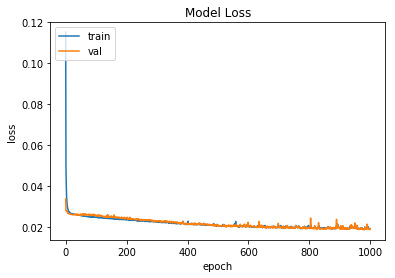

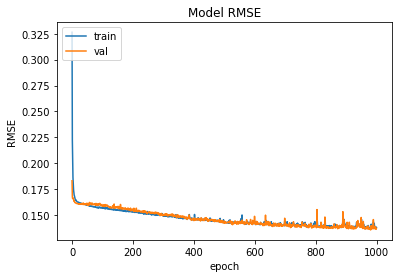

In [54]:
#2 hidden layers, one with 40 units and one with 30 units
click_SRNN_model11= click_stacked_stateful_SRNN2(units_1=40, units_2=30, lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model11.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model11, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts11.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [55]:
click_pred_train=click_SRNN_model11.predict(X_click_train, batch_size=133)
click_SRNN_model11.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model11.predict(X_click_val, batch_size=133)
click_SRNN_model11.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model11.predict(X_click_test, batch_size=133)
click_SRNN_model11.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  172.67606130174815
YRMSE train:  104.7343351872624
XRMSE val:  174.36595772390217
YRMSE val:  106.70317179312535
XRMSE test:  183.9483506331272
YRMSE test:  108.28706216872446


In [22]:
import keras.backend as k
def rmse(y_true,y_pred):
    return k.sqrt(k.mean(k.square(y_pred-y_true)))

#SimpleRNN with m/m between batches
def click_stacked_stateful_SRNN3(units_1, units_2, lr, batch, alpha, dropout):
    timesteps=18
    model = Sequential()
    model.add(SimpleRNN(units_1, return_sequences=True, batch_input_shape=(batch, timesteps, 2), stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=True, stateful=True, recurrent_dropout=dropout))
    model.add(SimpleRNN(units_2, return_sequences=False, stateful=True, recurrent_dropout=dropout))
    model.add(Dense(2))
    model.add(LeakyReLU(alpha=alpha))
    model.compile(Adam(lr=lr), loss='mse', metrics=[rmse])
    print('Model created and compiled')
    return model

Model created and compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
simple_rnn_4 (SimpleRNN)     (133, 18, 40)             1720      
_________________________________________________________________
simple_rnn_5 (SimpleRNN)     (133, 18, 30)             2130      
_________________________________________________________________
simple_rnn_6 (SimpleRNN)     (133, 30)                 1830      
_________________________________________________________________
dense_2 (Dense)              (133, 2)                  62        
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (133, 2)                  0         
Total params: 5,742
Trainable params: 5,742
Non-trainable params: 0
_________________________________________________________________
Epoch Number:  0
Instructions for updating:
Use tf.cast instead.
Train on 9177 samples, validate on 3059 samples


 - 3s - loss: 0.0269 - rmse: 0.1636 - val_loss: 0.0254 - val_rmse: 0.1590

Epoch 00001: val_loss improved from 0.02549 to 0.02542, saving model to click_SRNN_wts12.hdf5
Epoch Number:  31
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0268 - rmse: 0.1634 - val_loss: 0.0254 - val_rmse: 0.1589

Epoch 00001: val_loss improved from 0.02542 to 0.02539, saving model to click_SRNN_wts12.hdf5
Epoch Number:  32
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0267 - rmse: 0.1631 - val_loss: 0.0254 - val_rmse: 0.1589

Epoch 00001: val_loss improved from 0.02539 to 0.02538, saving model to click_SRNN_wts12.hdf5
Epoch Number:  33
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0267 - rmse: 0.1630 - val_loss: 0.0253 - val_rmse: 0.1587

Epoch 00001: val_loss improved from 0.02538 to 0.02533, saving model to click_SRNN_wts12.hdf5
Epoch Number:  34
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0267

 - 3s - loss: 0.0254 - rmse: 0.1591 - val_loss: 0.0246 - val_rmse: 0.1563

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  68
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0256 - rmse: 0.1595 - val_loss: 0.0244 - val_rmse: 0.1558

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  69
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0254 - rmse: 0.1590 - val_loss: 0.0245 - val_rmse: 0.1560

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  70
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0254 - rmse: 0.1589 - val_loss: 0.0244 - val_rmse: 0.1558

Epoch 00001: val_loss did not improve from 0.02435
Epoch Number:  71
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0252 - rmse: 0.1585 - val_loss: 0.0243 - val_rmse: 0.1555

Epoch 00001: val_loss improved from 0.02435 to 0.02431, saving model to click_SRNN_wts12.hdf5
Epoch Number:  72
Train


Epoch 00001: val_loss improved from 0.02379 to 0.02378, saving model to click_SRNN_wts12.hdf5
Epoch Number:  107
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1555 - val_loss: 0.0237 - val_rmse: 0.1536

Epoch 00001: val_loss improved from 0.02378 to 0.02369, saving model to click_SRNN_wts12.hdf5
Epoch Number:  108
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1556 - val_loss: 0.0239 - val_rmse: 0.1542

Epoch 00001: val_loss did not improve from 0.02369
Epoch Number:  109
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1554 - val_loss: 0.0239 - val_rmse: 0.1544

Epoch 00001: val_loss did not improve from 0.02369
Epoch Number:  110
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0243 - rmse: 0.1554 - val_loss: 0.0240 - val_rmse: 0.1546

Epoch 00001: val_loss did not improve from 0.02369
Epoch Number:  111
Train on 9177 samples, validate

 - 3s - loss: 0.0235 - rmse: 0.1529 - val_loss: 0.0234 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  146
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0237 - rmse: 0.1537 - val_loss: 0.0239 - val_rmse: 0.1541

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  147
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0239 - rmse: 0.1541 - val_loss: 0.0235 - val_rmse: 0.1528

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  148
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0234 - rmse: 0.1525 - val_loss: 0.0238 - val_rmse: 0.1540

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  149
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0235 - rmse: 0.1529 - val_loss: 0.0234 - val_rmse: 0.1527

Epoch 00001: val_loss did not improve from 0.02318
Epoch Number:  150
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0227 - rmse: 0.1505 - val_loss: 0.0228 - val_rmse: 0.1508

Epoch 00001: val_loss did not improve from 0.02270
Epoch Number:  185
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0228 - rmse: 0.1505 - val_loss: 0.0229 - val_rmse: 0.1510

Epoch 00001: val_loss did not improve from 0.02270
Epoch Number:  186
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0228 - rmse: 0.1506 - val_loss: 0.0227 - val_rmse: 0.1503

Epoch 00001: val_loss improved from 0.02270 to 0.02269, saving model to click_SRNN_wts12.hdf5
Epoch Number:  187
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0229 - rmse: 0.1509 - val_loss: 0.0228 - val_rmse: 0.1506

Epoch 00001: val_loss did not improve from 0.02269
Epoch Number:  188
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0227 - rmse: 0.1504 - val_loss: 0.0226 - val_rmse: 0.1501

Epoch 00001: val_loss improved from 0.02269 to 0.02264, saving model t

 - 3s - loss: 0.0223 - rmse: 0.1489 - val_loss: 0.0225 - val_rmse: 0.1498

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  224
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0224 - rmse: 0.1494 - val_loss: 0.0224 - val_rmse: 0.1493

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  225
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0223 - rmse: 0.1488 - val_loss: 0.0225 - val_rmse: 0.1496

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  226
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0222 - rmse: 0.1487 - val_loss: 0.0222 - val_rmse: 0.1487

Epoch 00001: val_loss did not improve from 0.02207
Epoch Number:  227
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0222 - rmse: 0.1488 - val_loss: 0.0220 - val_rmse: 0.1480

Epoch 00001: val_loss improved from 0.02207 to 0.02201, saving model to click_SRNN_wts12.hdf5
Epoch Number:  228



Epoch 00001: val_loss did not improve from 0.02163
Epoch Number:  263
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0219 - rmse: 0.1475 - val_loss: 0.0219 - val_rmse: 0.1478

Epoch 00001: val_loss did not improve from 0.02163
Epoch Number:  264
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0218 - rmse: 0.1474 - val_loss: 0.0217 - val_rmse: 0.1472

Epoch 00001: val_loss did not improve from 0.02163
Epoch Number:  265
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0218 - rmse: 0.1472 - val_loss: 0.0215 - val_rmse: 0.1463

Epoch 00001: val_loss improved from 0.02163 to 0.02150, saving model to click_SRNN_wts12.hdf5
Epoch Number:  266
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0217 - rmse: 0.1471 - val_loss: 0.0216 - val_rmse: 0.1468

Epoch 00001: val_loss did not improve from 0.02150
Epoch Number:  267
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.

 - 3s - loss: 0.0216 - rmse: 0.1467 - val_loss: 0.0214 - val_rmse: 0.1459

Epoch 00001: val_loss did not improve from 0.02114
Epoch Number:  302
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0213 - val_rmse: 0.1455

Epoch 00001: val_loss did not improve from 0.02114
Epoch Number:  303
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0212 - rmse: 0.1454 - val_loss: 0.0209 - val_rmse: 0.1444

Epoch 00001: val_loss improved from 0.02114 to 0.02092, saving model to click_SRNN_wts12.hdf5
Epoch Number:  304
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0237 - rmse: 0.1536 - val_loss: 0.0222 - val_rmse: 0.1487

Epoch 00001: val_loss did not improve from 0.02092
Epoch Number:  305
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0220 - rmse: 0.1479 - val_loss: 0.0213 - val_rmse: 0.1457

Epoch 00001: val_loss did not improve from 0.02092
Epoch Number:  306


 - 3s - loss: 0.0211 - rmse: 0.1451 - val_loss: 0.0206 - val_rmse: 0.1431

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  341
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0214 - rmse: 0.1458 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  342
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0206 - val_rmse: 0.1433

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  343
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1451 - val_loss: 0.0207 - val_rmse: 0.1436

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  344
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1435 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.02047
Epoch Number:  345
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0211 - rmse: 0.1451 - val_loss: 0.0212 - val_rmse: 0.1451

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  381
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0207 - rmse: 0.1436 - val_loss: 0.0205 - val_rmse: 0.1428

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  382
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0204 - rmse: 0.1425 - val_loss: 0.0202 - val_rmse: 0.1418

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  383
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0203 - val_rmse: 0.1421

Epoch 00001: val_loss did not improve from 0.02001
Epoch Number:  384
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0199 - val_rmse: 0.1408

Epoch 00001: val_loss improved from 0.02001 to 0.01991, saving model to click_SRNN_wts12.hdf5
Epoch Number:  385


 - 3s - loss: 0.0203 - rmse: 0.1421 - val_loss: 0.0199 - val_rmse: 0.1407

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  421
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0202 - rmse: 0.1417 - val_loss: 0.0197 - val_rmse: 0.1401

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  422
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0201 - rmse: 0.1415 - val_loss: 0.0197 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01969
Epoch Number:  423
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1409 - val_loss: 0.0196 - val_rmse: 0.1398

Epoch 00001: val_loss improved from 0.01969 to 0.01963, saving model to click_SRNN_wts12.hdf5
Epoch Number:  424
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0202 - rmse: 0.1417 - val_loss: 0.0202 - val_rmse: 0.1420

Epoch 00001: val_loss did not improve from 0.01963
Epoch Number:  425


 - 3s - loss: 0.0202 - rmse: 0.1420 - val_loss: 0.0200 - val_rmse: 0.1409

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  461
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0198 - rmse: 0.1404 - val_loss: 0.0195 - val_rmse: 0.1394

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  462
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0194 - val_rmse: 0.1391

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  463
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0201 - rmse: 0.1414 - val_loss: 0.0200 - val_rmse: 0.1411

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  464
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0199 - rmse: 0.1407 - val_loss: 0.0197 - val_rmse: 0.1399

Epoch 00001: val_loss did not improve from 0.01932
Epoch Number:  465
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0196 - rmse: 0.1396 - val_loss: 0.0195 - val_rmse: 0.1392

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  501
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0206 - rmse: 0.1430 - val_loss: 0.0198 - val_rmse: 0.1404

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  502
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0195 - rmse: 0.1395 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  503
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0225 - rmse: 0.1485 - val_loss: 0.0266 - val_rmse: 0.1629

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  504
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0230 - rmse: 0.1512 - val_loss: 0.0212 - val_rmse: 0.1450

Epoch 00001: val_loss did not improve from 0.01904
Epoch Number:  505
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0192 - val_rmse: 0.1382

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  541
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0191 - rmse: 0.1380 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  542
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 4s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  543
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1381 - val_loss: 0.0191 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  544
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0193 - rmse: 0.1387 - val_loss: 0.0188 - val_rmse: 0.1370

Epoch 00001: val_loss did not improve from 0.01872
Epoch Number:  545
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0198 - rmse: 0.1402 - val_loss: 0.0203 - val_rmse: 0.1422

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  581
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0201 - rmse: 0.1413 - val_loss: 0.0187 - val_rmse: 0.1364

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  582
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0188 - rmse: 0.1370 - val_loss: 0.0189 - val_rmse: 0.1371

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  583
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0186 - val_rmse: 0.1360

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  584
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1375 - val_loss: 0.0194 - val_rmse: 0.1389

Epoch 00001: val_loss did not improve from 0.01845
Epoch Number:  585
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  621
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1455 - val_loss: 0.0207 - val_rmse: 0.1434

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  622
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1448 - val_loss: 0.0203 - val_rmse: 0.1422

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  623
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0211 - rmse: 0.1448 - val_loss: 0.0208 - val_rmse: 0.1438

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  624
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1457 - val_loss: 0.0207 - val_rmse: 0.1435

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  625
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0210 - rmse: 0.1444 - val_loss: 0.0202 - va

 - 3s - loss: 0.0187 - rmse: 0.1365 - val_loss: 0.0190 - val_rmse: 0.1375

Epoch 00001: val_loss did not improve from 0.01818
Epoch Number:  662
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1361 - val_loss: 0.0181 - val_rmse: 0.1341

Epoch 00001: val_loss improved from 0.01818 to 0.01809, saving model to click_SRNN_wts12.hdf5
Epoch Number:  663
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0213 - rmse: 0.1452 - val_loss: 0.0227 - val_rmse: 0.1502

Epoch 00001: val_loss did not improve from 0.01809
Epoch Number:  664
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0209 - rmse: 0.1444 - val_loss: 0.0185 - val_rmse: 0.1356

Epoch 00001: val_loss did not improve from 0.01809
Epoch Number:  665
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0193 - rmse: 0.1386 - val_loss: 0.0187 - val_rmse: 0.1364

Epoch 00001: val_loss did not improve from 0.01809
Epoch Number:  666



Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  701
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0183 - rmse: 0.1350 - val_loss: 0.0184 - val_rmse: 0.1351

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  702
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1343 - val_loss: 0.0179 - val_rmse: 0.1335

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  703
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1343 - val_loss: 0.0179 - val_rmse: 0.1334

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  704
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1335 - val_loss: 0.0179 - val_rmse: 0.1335

Epoch 00001: val_loss did not improve from 0.01754
Epoch Number:  705
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1343 - val_loss: 0.0178 - va

 - 3s - loss: 0.0205 - rmse: 0.1427 - val_loss: 0.0193 - val_rmse: 0.1385

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  742
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1383 - val_loss: 0.0186 - val_rmse: 0.1359

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  743
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1374 - val_loss: 0.0186 - val_rmse: 0.1359

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  744
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1364 - val_loss: 0.0181 - val_rmse: 0.1342

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  745
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1360 - val_loss: 0.0181 - val_rmse: 0.1341

Epoch 00001: val_loss did not improve from 0.01748
Epoch Number:  746
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0191 - rmse: 0.1378 - val_loss: 0.0186 - val_rmse: 0.1359

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  782
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0185 - rmse: 0.1358 - val_loss: 0.0180 - val_rmse: 0.1338

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  783
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1348 - val_loss: 0.0180 - val_rmse: 0.1338

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  784
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0180 - rmse: 0.1340 - val_loss: 0.0176 - val_rmse: 0.1323

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  785
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1341 - val_loss: 0.0182 - val_rmse: 0.1345

Epoch 00001: val_loss did not improve from 0.01738
Epoch Number:  786
Train on 9177 samples, validate on 3059 sam

 - 3s - loss: 0.0179 - rmse: 0.1336 - val_loss: 0.0175 - val_rmse: 0.1319

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  822
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1344 - val_loss: 0.0180 - val_rmse: 0.1340

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  823
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1335 - val_loss: 0.0172 - val_rmse: 0.1308

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  824
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0189 - rmse: 0.1371 - val_loss: 0.0181 - val_rmse: 0.1342

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  825
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0178 - rmse: 0.1332 - val_loss: 0.0171 - val_rmse: 0.1303

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  826
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  862
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1360 - val_loss: 0.0194 - val_rmse: 0.1388

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  863
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0188 - rmse: 0.1367 - val_loss: 0.0178 - val_rmse: 0.1332

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  864
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0182 - rmse: 0.1346 - val_loss: 0.0175 - val_rmse: 0.1318

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  865
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0181 - rmse: 0.1342 - val_loss: 0.0178 - val_rmse: 0.1330

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  866
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0179 - rmse: 0.1336 - val_loss: 0.0172 - va

 - 3s - loss: 0.0202 - rmse: 0.1420 - val_loss: 0.0194 - val_rmse: 0.1391

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  903
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0214 - rmse: 0.1458 - val_loss: 0.0198 - val_rmse: 0.1402

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  904
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0204 - rmse: 0.1424 - val_loss: 0.0192 - val_rmse: 0.1381

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  905
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0204 - rmse: 0.1424 - val_loss: 0.0197 - val_rmse: 0.1401

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  906
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0200 - rmse: 0.1411 - val_loss: 0.0191 - val_rmse: 0.1379

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  907
Train on 9177 samples, validate on 3059 sam


Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  943
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0192 - rmse: 0.1385 - val_loss: 0.0189 - val_rmse: 0.1372

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  944
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0193 - rmse: 0.1385 - val_loss: 0.0184 - val_rmse: 0.1353

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  945
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0186 - rmse: 0.1362 - val_loss: 0.0183 - val_rmse: 0.1350

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  946
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0184 - rmse: 0.1354 - val_loss: 0.0183 - val_rmse: 0.1349

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  947
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0183 - rmse: 0.1350 - val_loss: 0.0181 - va

 - 3s - loss: 0.0191 - rmse: 0.1378 - val_loss: 0.0189 - val_rmse: 0.1374

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  984
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0190 - rmse: 0.1376 - val_loss: 0.0185 - val_rmse: 0.1357

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  985
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1363 - val_loss: 0.0183 - val_rmse: 0.1349

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  986
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0187 - rmse: 0.1364 - val_loss: 0.0182 - val_rmse: 0.1346

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  987
Train on 9177 samples, validate on 3059 samples
Epoch 1/1
 - 3s - loss: 0.0185 - rmse: 0.1359 - val_loss: 0.0185 - val_rmse: 0.1356

Epoch 00001: val_loss did not improve from 0.01674
Epoch Number:  988
Train on 9177 samples, validate on 3059 sam

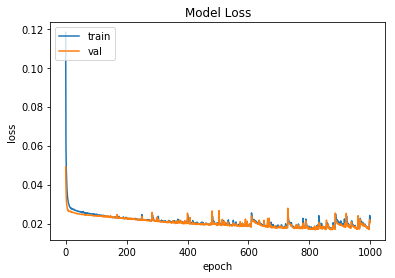

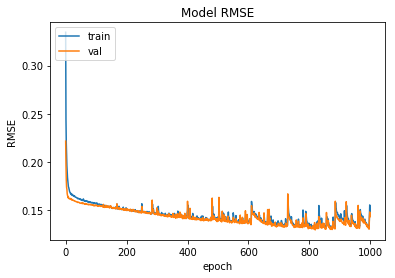

In [26]:
#3 hidden layers, one with 40 units and two with 30 units
click_SRNN_model12= click_stacked_stateful_SRNN3(units_1=40, units_2=30, lr=0.001, batch=133, alpha=0.01, dropout=0.1)
click_SRNN_model12.summary()

#Train LSTM stateless model with shuffle=False
hist_loss, hist_val_loss, hist_rmse, hist_val_rmse= stateful_fit(click_SRNN_model12, X_click_train, Y_click_train, X_click_val, Y_click_val, 133, 1000, 'click_SRNN_wts12.hdf5')

#plot loss and rmse curve
stateful_learn_curve(hist_loss, hist_val_loss, hist_rmse, hist_val_rmse)

In [27]:
click_pred_train=click_SRNN_model12.predict(X_click_train, batch_size=133)
click_SRNN_model12.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_train,Y_click_train)
print('XRMSE train: ', xrmse)
print('YRMSE train: ', yrmse)

click_pred_val=click_SRNN_model12.predict(X_click_val, batch_size=133)
click_SRNN_model12.reset_states()
xrmse, yrmse= calculate_RMSE(click_pred_val,Y_click_val)
print('XRMSE val: ', xrmse)
print('YRMSE val: ', yrmse)

click_pred_test= click_SRNN_model12.predict(X_click_test, batch_size=133)
click_SRNN_model12.reset_states()
xrmse,yrmse= calculate_RMSE(click_pred_test, Y_click_test)
print('XRMSE test: ', xrmse)
print('YRMSE test: ', yrmse)

XRMSE train:  185.56402523228252
YRMSE train:  107.45839208227771
XRMSE val:  184.06100262572545
YRMSE val:  108.85744763942283
XRMSE test:  189.52592961889252
YRMSE test:  110.5945942017978


In [40]:
#real time click predictions
n_predictions=1
testing_dataset=[]

def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1)
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            #for i in range(n_predictions):
            input_sequence2 = np.array([j for j in pred_dataset2[0:timesteps]])
            input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
            temp = click_model4.predict(input_sequence2)
            pred_dataset2.append([temp[0][0],temp[0][1]])
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1)

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()

In [62]:
#real time mouse trajectory (LSTM model-2) and click predictions (LSTM model-4 stacked stateless)
n_pred_traj=50
n_pred_click=5
testing_dataset=[]
def trace_mouse_movements(event,x,y,flags,param):
    if event == cv2.EVENT_MOUSEMOVE:
        img.fill(0)
        testing_dataset.append([x,y])
        for [_x,_y] in testing_dataset:
            cv2.circle(img,(_x,_y),2,(0,0,255),-1) #orange color
        if(len(testing_dataset)>timesteps):
            testing_dataset.pop(0)
            pred_dataset2 = [i for i in testing_dataset]
            pred_dataset2= scaler.fit_transform(pred_dataset2)
            pred_dataset2= pred_dataset2.tolist()
            #pred_dataset[:] = [[float(data[0]-x_min)/(x_max-x_min), float(data[1]-y_min)/(y_max-y_min)] for data in pred_dataset]
            click_pred=[]
            for i in range(n_pred_traj):
                input_sequence2 = np.array([j for j in pred_dataset2[i:i+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp_traj = model_2.predict(input_sequence2)
                pred_dataset2.append([temp_traj[0][0],temp_traj[0][1]])
                
            for k in range(n_pred_click):
                input_sequence2 = np.array([j for j in pred_dataset2[k:k+timesteps]])
                input_sequence2 = np.reshape(input_sequence2,(1,input_sequence2.shape[0],input_sequence2.shape[1]))
                temp_click= click_model4.predict(input_sequence2)
                click_pred.append([temp_click[0][0],temp_click[0][1]])
                
            pred_dataset2 = scaler.inverse_transform(pred_dataset2)
            click_pred = scaler.inverse_transform(click_pred)
            
            pred_dataset2= pred_dataset2.tolist()
            pred_dataset2[:] = [[int(data[0]), int(data[1])] for data in pred_dataset2]
            for [_x,_y] in pred_dataset2[timesteps:]:
                cv2.circle(img,(_x,_y),2,(255,0,0),-1) #blue color
            
            click_pred= click_pred.tolist()
            click_pred[:] = [[int(data[0]), int(data[1])] for data in click_pred]
            for [_x,_y] in click_pred[:]:
                cv2.circle(img,(_x,_y),2,(0,255,0),-1) #green color

img = np.zeros((x_max,y_max,3), np.uint8)

cv2.namedWindow('image')
cv2.setMouseCallback('image',trace_mouse_movements)

while(1):
    cv2.imshow('image',img)
    k= cv2.waitKey(20) & 0xFF
    if k == 27:
        break
cv2.destroyAllWindows()